In [1]:
# TD
# Rever função CPI está bem feita

#References

#Feature Selection
#https://www.shiksha.com/online-courses/articles/feature-selection-techniques-python-code/
#https://www.datatechnotes.com/2022/10/feature-selection-example-with-rfecv-in.html
#https://scikit-learn.org/stable/modules/feature_selection.html
#https://medium.com/@Kavya2099/optimizing-performance-selectkbest-for-efficient-feature-selection-in-machine-learning-3b635905ed48
#https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/
#https://www.quora.com/Why-does-the-model-have-high-accuracy-on-test-data-but-lower-with-cross-validation-in-machine-learning
#https://www.quora.com/Can-validation-accuracy-be-higher-than-training-accuracy

Variaveis referencia a usar Paulo

exporterIntensity ~ VAB+Total_Vendas+TotalActivo+Total_PrestacoesServicos+
                   CustoMercadoriasMateriasConsumidas_Total+ResultadoLiquidoExercicio+
                   CustoMercadoriasMateriasConsumidas_Materias+CustosPessoal_Outros+
                   employess+MercadoInterno_PrestacoesServicos+Total_Fornecimentos+
                   TotalCapitalProprio+CustosPessoal_Total+capitalIntensity+
                   LaborProductivity+ProveitosGanhos+MercadoInterno_Fornecimentos+
                   CustosPessoal_Remuneracoes+Total_Compras+CustoMercadoriasMateriasConsumidas_Mercadorias+
                   div10+ div11+ div13+ div14+ div15+ div16+ div17+ div18+ div19+ div20+ div21+ div22+ div23+ 
                   div24+ div25+ div26+ div27+ div28+ div29+ div30+ div31+
                    y2011+ y2012+ y2013+ y2014+ y2015+y2016+ y2017+ y2018+y2019+y2020+y2021
                    
tirar estas excepto periodo anterior
-c(NIPC, Ano, exporterIntensity, ExporIES_euros, ExporINE_euros)

sendo que exporterIntensity é a variável outcome

div10 setor a 2 digitos 

In [1]:
#Imports ##################################################################################################################
import numpy as np
import pandas as pd
import seaborn as sns
import time
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense, BatchNormalization
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Sequential
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder 
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import shap
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from numpy import array  
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import SelectKBest
from sklearn.model_selection import train_test_split

nipcs=pd.read_csv("NIPCs_test.csv")
file = pd.read_csv('C:/Users/jcortes/Aicep Portugal Global/Paulo Barbosa - paper_ML/Data/data5.csv',encoding='unicode_escape')  
infla = pd.read_excel("CPI_2010-2021.xlsx")
destinations = pd.read_csv("firms_destinations.csv")
outliers_importintensity = pd.read_csv("NIPCs_excluir.csv")

def cpi_deflated(file, infla, nominal_variables): 
    """Adapts the code for all years and columns.
    Args:
        file (pd.DataFrame): Input DataFrame.
        infla (pd.DataFrame): DataFrame containing inflation data.
        nominal_variables (list): List of column names to adjust.
    Returns:
        pd.DataFrame: Modified DataFrame with adjusted columns.
    """
    for col in nominal_variables:
        for year in file['Ano'].unique():
            if year not in infla['Ano'].values:
                print(f"Warning: Year {year} missing in infla. Skipping column {col}.")
                continue
            indice = infla[infla['Ano'] == year]['indice2010'].values[0]
            file.loc[file['Ano'] == year, col] = np.where(
                file.loc[file['Ano'] == year, col], file.loc[file['Ano'] == year, col] / indice, 0)
    return file

# Data Curation Functions
def Exporter_cat(flx):
    NIPCs_Const_NonExport=[] #Constant non-exporters
    NIPCs_Const_Export=[] #Constant exporters
    NIPCs_Swit_Export=[] #Switching Exporters 0 t1 1 1
    NIPCs_Swit_NonExport=[] #Switching Non-Exporters 1 t0 0 
    NIPCs_Disc_Export=[] #Discontinuos exporters 0 1 0 ou 1 0 1
    Non_Exp=[]
    for nipc in list(set(flx.NIPC)):
        data = list(flx[flx['NIPC']==nipc].sort_values(by="Ano").Exporter.diff())    
        positive_sum = sum(x for x in data if x > 0)
        negative_sum = sum(x for x in data if x < 0)
        if len(set(flx[flx['NIPC']==nipc].Exporter))== 1 and list(set(flx[flx['NIPC']==nipc].Exporter))[0] == 0 :
            NIPCs_Const_NonExport.append(nipc)
        elif len(set(flx[flx['NIPC']==nipc].Exporter))== 1 and list(set(flx[flx['NIPC']==nipc].Exporter))[0] == 1:
            NIPCs_Const_Export.append(nipc)
        elif len(set(flx[flx['NIPC']==nipc].Exporter))== 2 and (positive_sum > 1 or negative_sum <-1) or (positive_sum == 1 and negative_sum == -1) :
            NIPCs_Disc_Export.append(nipc)
        elif len(set(flx[flx['NIPC']==nipc].Exporter))== 2 and positive_sum == 1 and negative_sum == 0:
            NIPCs_Swit_Export.append(nipc) #
        elif len(set(flx[flx['NIPC']==nipc].Exporter))== 2 and negative_sum == -1 and positive_sum == 0:
            NIPCs_Swit_NonExport.append(nipc) 
        else:
            Non_Exp.append(nipc)
    return NIPCs_Const_NonExport, NIPCs_Const_Export, NIPCs_Swit_Export, NIPCs_Swit_NonExport,NIPCs_Disc_Export, Non_Exp

def count_consecutive_ones(series):
        return series.rolling(window=4, min_periods=1).sum()

def count_consecutive_twos(series):
        return series.rolling(window=2, min_periods=1).sum()

def preparing_train_test(tflx):

    # split into X and Y
    Y = tflx[['Exporter']].reset_index()
    X = tflx.drop(['Exporter'], axis=1)

    cols = X.columns  
    scaler = StandardScaler()
    scaler.fit(X)
    X = scaler.transform(X)
    X=pd.DataFrame(X, columns = cols, index = tflx.index).reset_index()
    print(X.shape)
    print(Y.shape)

    #Original
    X_test = X[X.NIPC_Ano.str[:9].str.contains('|'.join(list(set(nipcs.value.astype(str)))))] 
    X_train = X[~(X.NIPC_Ano.str[:9].str.contains('|'.join(list(set(nipcs.value.astype(str))))))] 
    y_test = Y[Y.NIPC_Ano.str[:9].str.contains('|'.join(list(set(nipcs.value.astype(str)))))] 
    y_train = Y[~(Y.NIPC_Ano.str[:9].str.contains('|'.join(list(set(nipcs.value.astype(str))))))] 
        
    X_train = X_train.set_index("NIPC_Ano")#.drop(['NIPC_Ano'], axis=1)
    X_test = X_test.set_index("NIPC_Ano")#.drop(['NIPC_Ano'], axis=1)
    y_train = y_train.set_index("NIPC_Ano")#.drop(['NIPC_Ano'], axis=1)
    y_test = y_test.set_index("NIPC_Ano")#.drop(['NIPC_Ano'], axis=1)
    print(X_train.shape)
    print(y_train.shape)
    return X_test, X_train, y_test, y_train

#Feature selection by using Mutual Information Gain
#The higher the value the more important that feature will be or you can say that the dependency of that independent 
#feature will be more on the dependent feature.
def Feature_Selection(X_train,y_train, relative_weight , nr_weight):
    mutual_info = mutual_info_classif(X_train, y_train)
    mutual_info = pd.Series(mutual_info)
    mutual_info.index = X_train.columns
    mutual_info.sort_values(ascending=False)
    #mutual_info.sort_values(ascending=False).plot.bar(figsize=(20, 8)) #Permitiu ver que as principais 150 têm a maior significancia
    mif= pd.DataFrame(mutual_info.sort_values(ascending=False))
    if relative_weight == True:
        mif["Cum"]=mif[0].cumsum()
        mif["Relative_Sum"]=mif["Cum"]/mif["Cum"][-1]
        mutual_info_cols = list(mif[mif["Relative_Sum"] < nr_weight].index)
        nr_feats = len(mutual_info_cols)
    else:
        nr_feats = nr_weight
        mutual_info_cols = list(mif[:nr_feats].index)
    #Select K Best
    #No we Will select the top nr_feats important features
    sel_five_cols = SelectKBest(mutual_info_classif, k=nr_feats)
    sel_five_cols.fit(X_train, y_train)
    X_train.columns[sel_five_cols.get_support()]
    select_K_rec=list(X_train.columns[sel_five_cols.get_support()])
    #Getting top nr_feats
    to_incl=list(set(select_K_rec) - set(mutual_info_cols))
    #Because data consists of both categorical and numerical variables and want to perform a classification problem, 
    #“mutual_info_classif” might be a better choice.
    #Will use mutual_info_classif top 150 and will add top_incl: K-Best features ignored by mutual info that can be relevant
    final_features = list(mutual_info.sort_values(ascending=False)[:nr_feats].index) + to_incl
    return final_features

#Método adicional RFECV - leva bastante tempo
def RFE(X_train,y_train):
    x = X_train
    y = y_train
    rfc = RandomForestClassifier()
    select = RFECV(estimator=rfc, cv=10)
    select = select.fit(x,y)
    print("Feature ranking: ", select.ranking_)
    mask = select.get_support()
    features = array(X_train.columns) 
    best_features = features[mask]
    print("All features: ", x.shape[1])
    print(features)
    print("Selected best: ", best_features.shape[0])
    print(features[mask]) 
    return features, mask  

#Exploratory Data Analysis / Data Curation / Feature Engineering ##############################################################

NIPCs_Micro = [str(a) for a in list(set(file[file.micro==1].NIPC))]
NIPCs_Small = [str(a) for a in list(set(file[file.small==1].NIPC))]
NIPCs_Medium = [str(a) for a in list(set(file[file.medium==1].NIPC))]
NIPCs_Large = [str(a) for a in list(set(file[file.large==1].NIPC))]

#Start by removing columns that have too little information
filee = file.drop(columns = ["Expor", "N_produtos_expor", "Quantidades_expor", "N_produtos",
                            "Valor_medio", "ValorMedioExpor","Quantidades","MercadoComunitario_Vendas",
                             "MercadoExtraComunitario_Vendas", 
                            "CustoMercadoriasMateriasConsumidas_Materias",
                            "Total_Fornecimentos","CustoMercadoriasMateriasConsumidas_Total",
                            "custo_total","PessoasAoServicoEmpresaRemuneradasENaoRemuneradas2",
                            "PessoasAoServicoEmpresaRemuneradasENaoRemuneradas"       ])

#NIPC Ano
filee["NIPC_Ano"]= filee["NIPC"].astype(str)+filee["Ano"].astype(str)

#Remove NIPCs with extreme outliers for High Import Intensity (=>1)
outliers_importintensity["NIPC_Ano"]= outliers_importintensity["NIPC"].astype(str)+outliers_importintensity["Ano"].astype(str)
filee = filee[~filee["NIPC_Ano"].isin(set(outliers_importintensity.NIPC_Ano))]

In [26]:
#Dependent variable
filee["expIntensity"] = filee["ExporIES_euros"]/filee["Total_Vendas"]
filee['Exporter'] = np.where(filee['expIntensity']>0.1, 1, 0)

#Deflating nominal values
nominal_variables = ["ProveitosGanhos", 'ResultadoLiquidoExercicio', 'TotalActivo', 'TotalCapitalProprio',
'MercadoInterno_Vendas', 'MercadoInterno_PrestacoesServicos','MercadoInterno_Compras', 'MercadoInterno_Fornecimentos',
'MercadoComunitario_PrestacoesServicos','MercadoComunitario_Compras', 
'MercadoComunitario_Fornecimentos','MercadoExtraComunitario_PrestacaoesServicos',
'MercadoExtraComunitario_Compras','MercadoExtraComunitario_Fornecimentos', 'Total_Vendas','Total_PrestacoesServicos', 
'Total_Compras', 'CustosPessoal_Remuneracoes', 
'CustoMercadoriasMateriasConsumidas_Mercadorias', 'expIntensity',
'CustosPessoal_Outros','ExporIES_euros', 'VolumeNegocios',
'VAB','capitalIntensity', 'exportIntensity','exporterIntensity', 'ExporINE_euros']
file_d = cpi_deflated(filee.copy(), infla.copy(), nominal_variables) #taken as given from here

#Dropna for cases where we dont have values
file_d_ = file_d[["micro","small","medium","large","NIPC","Ano","Exporter","VAB","employess","TotalActivo","Total_Vendas","CustosPessoal_Total","MercadoComunitario_Compras", 
                  "MercadoComunitario_Fornecimentos","MercadoExtraComunitario_Fornecimentos", 
              "Total_Compras","ProveitosGanhos","TotalCapitalProprio","MercadoExtraComunitario_Compras","ResultadoLiquidoExercicio","Divisao"]]#,"micro","small", "medium","Divisao"]]

#FillNaN with 0
file_d_["MercadoComunitario_Compras"] = file_d_["MercadoComunitario_Compras"].fillna(0)
file_d_["MercadoExtraComunitario_Compras"] = file_d_["MercadoExtraComunitario_Compras"].fillna(0)
file_d_["MercadoComunitario_Fornecimentos"] = file_d_["MercadoComunitario_Fornecimentos"].fillna(0)
file_d_["MercadoExtraComunitario_Fornecimentos"] = file_d_["MercadoExtraComunitario_Fornecimentos"].fillna(0)
file_d_["VAB"] = file_d_["VAB"].fillna(0)
file_d_["TotalActivo"] = file_d_["TotalActivo"].fillna(0)
file_d_["CustosPessoal_Total"] = file_d_["CustosPessoal_Total"].fillna(0)
file_d_["ResultadoLiquidoExercicio"] = file_d_["ResultadoLiquidoExercicio"].fillna(0)
file_d_["ProveitosGanhos"] = file_d_["ProveitosGanhos"].fillna(0)

#Removing cases where there are missing values or denominator is 0
file_d=file_d_.dropna()
file_d.drop(file_d[file_d.employess == 0].index, inplace=True)
#file_d.drop(file_d[file_d.Total_Vendas == 0].index, inplace=True)
file_d.drop(file_d[file_d.TotalActivo == 0].index, inplace=True)
file_d.drop(file_d[file_d.Total_Compras == 0].index, inplace=True)
file_d.drop(file_d[file_d.TotalCapitalProprio == 0].index, inplace=True)
file_d.drop(file_d[file_d.ResultadoLiquidoExercicio == 0].index, inplace=True)

#Independent variables for SHAP values:
file_d["Labour_Productivity"] = file_d["VAB"] / file_d["employess"]
file_d["Capital_Intensity"] = file_d["TotalActivo"] / file_d["employess"]
file_d["Average_Salary"] = file_d["CustosPessoal_Total"] / file_d["employess"]
file_d["Communitary_Imports"] = (file_d["MercadoComunitario_Compras"]+ file_d["MercadoComunitario_Fornecimentos"] )/ file_d["Total_Compras"]  #+ file_d["MercadoComunitario_Fornecimentos"] 
file_d["Extra_Communitary_Imports"] = (file_d["MercadoExtraComunitario_Compras"]+ file_d["MercadoExtraComunitario_Fornecimentos"] )/ file_d["Total_Compras"] #+ file_d["MercadoExtraComunitario_Fornecimentos"]
file_d["Return_On_Assets"] = file_d["ResultadoLiquidoExercicio"] / file_d["TotalActivo"]
file_d["Return_On_Equity"] = file_d["ResultadoLiquidoExercicio"] / file_d["TotalCapitalProprio"]
file_d["Net_Profit_Margin"] = file_d["ProveitosGanhos"] / file_d["ResultadoLiquidoExercicio"]

#file_d["Company_Dimension"] = np.where(file_d["micro"]==1,1, np.where(file_d["small"]==1,2, np.where(file_d["medium"]==1,3,4)) )
#file_d["Import_Intensity"] = (file_d["MercadoComunitario_Compras"] + file_d["MercadoExtraComunitario_Compras"] + file_d["MercadoComunitario_Fornecimentos"] ) / file_d["Total_Vendas"]
file_d['Micro'] = file_d['micro']
file_d['Small'] = file_d['small']
file_d['Medium'] = file_d['medium']
file_d['Large'] = file_d['large']

file_d["NIPC_Ano"]=file_d['NIPC'].astype(str)+file_d["Ano"].astype(str)
df=file_d.set_index("NIPC_Ano")
Y_Controls = pd.get_dummies(df["Ano"])
S_Controls = pd.get_dummies(df["Divisao"])

##Y_Controls= Y_Controls.drop(columns = 2021) #k-1
Y_Controls = Y_Controls.astype(int)
S_Controls = S_Controls.astype(int)

Y_Controls = Y_Controls.add_prefix('Year_')
S_Controls = S_Controls.add_prefix('Sector_')

Y_Controls=Y_Controls.reset_index()
S_Controls=S_Controls.reset_index()

df=df.reset_index()

nf = pd.merge(Y_Controls,df, on="NIPC_Ano")
nf = pd.merge(S_Controls,nf, on="NIPC_Ano")

ff=nf.set_index("NIPC_Ano")

df=ff[["Exporter", "Labour_Productivity","Capital_Intensity","Average_Salary","Communitary_Imports","Extra_Communitary_Imports","Micro","Small","Medium","Large",
       "Return_On_Assets","Return_On_Equity","Net_Profit_Margin"]+ list(set(list(Y_Controls.columns))-set(['NIPC_Ano'])) + list(set(list(S_Controls.columns))-set(['NIPC_Ano']))]


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [18]:
#Dependent variable
filee["expIntensity"] = filee["ExporIES_euros"]/filee["Total_Vendas"]
filee['Exporter'] = np.where(filee['expIntensity']>0.1, 1, 0)

#Deflating nominal values
nominal_variables = ["ProveitosGanhos", 'ResultadoLiquidoExercicio', 'TotalActivo', 'TotalCapitalProprio',
'MercadoInterno_Vendas', 'MercadoInterno_PrestacoesServicos','MercadoInterno_Compras', 'MercadoInterno_Fornecimentos',
'MercadoComunitario_PrestacoesServicos','MercadoComunitario_Compras', 
'MercadoComunitario_Fornecimentos','MercadoExtraComunitario_PrestacaoesServicos',
'MercadoExtraComunitario_Compras','MercadoExtraComunitario_Fornecimentos', 'Total_Vendas','Total_PrestacoesServicos', 
'Total_Compras', 'CustosPessoal_Remuneracoes', 
'CustoMercadoriasMateriasConsumidas_Mercadorias', 'expIntensity',
'CustosPessoal_Outros','ExporIES_euros', 'VolumeNegocios',
'VAB','capitalIntensity', 'exportIntensity','exporterIntensity', 'ExporINE_euros']
file_d = cpi_deflated(filee.copy(), infla.copy(), nominal_variables) #taken as given from here

#Dropna for cases where we dont have values
file_d_ = file_d[["NIPC","Ano","Exporter","VAB","employess","TotalActivo","Total_Vendas","CustosPessoal_Total","MercadoComunitario_Compras", 
                  "MercadoComunitario_Fornecimentos","MercadoExtraComunitario_Fornecimentos", 
              "Total_Compras","ProveitosGanhos","TotalCapitalProprio","MercadoExtraComunitario_Compras","ResultadoLiquidoExercicio","Divisao"]]#,"micro","small", "medium","Divisao"]]

#FillNaN with 0
file_d_["MercadoComunitario_Compras"] = file_d_["MercadoComunitario_Compras"].fillna(0)
file_d_["MercadoExtraComunitario_Compras"] = file_d_["MercadoExtraComunitario_Compras"].fillna(0)
file_d_["MercadoComunitario_Fornecimentos"] = file_d_["MercadoComunitario_Fornecimentos"].fillna(0)
file_d_["MercadoExtraComunitario_Fornecimentos"] = file_d_["MercadoExtraComunitario_Fornecimentos"].fillna(0)
file_d_["VAB"] = file_d_["VAB"].fillna(0)
file_d_["TotalActivo"] = file_d_["TotalActivo"].fillna(0)
file_d_["CustosPessoal_Total"] = file_d_["CustosPessoal_Total"].fillna(0)
#file_d_["ResultadoLiquidoExercicio"] = file_d_["ResultadoLiquidoExercicio"].fillna(0)
#file_d_["ProveitosGanhos"] = file_d_["ProveitosGanhos"].fillna(0)

#Removing cases where there are missing values or denominator is 0
file_d=file_d_.dropna()
file_d.drop(file_d[file_d.employess == 0].index, inplace=True)
#file_d.drop(file_d[file_d.Total_Vendas == 0].index, inplace=True)
file_d.drop(file_d[file_d.TotalActivo == 0].index, inplace=True)
file_d.drop(file_d[file_d.Total_Compras == 0].index, inplace=True)
#file_d.drop(file_d[file_d.TotalCapitalProprio == 0].index, inplace=True)
#file_d.drop(file_d[file_d.ResultadoLiquidoExercicio == 0].index, inplace=True)

#Independent variables for SHAP values:
file_d["Labour_Productivity"] = file_d["VAB"] / file_d["employess"]
file_d["Capital_Intensity"] = file_d["TotalActivo"] / file_d["employess"]
file_d["Average_Salary"] = file_d["CustosPessoal_Total"] / file_d["employess"]
file_d["Communitary_Imports"] = (file_d["MercadoComunitario_Compras"]+ file_d["MercadoComunitario_Fornecimentos"] )/ file_d["Total_Compras"]  #+ file_d["MercadoComunitario_Fornecimentos"] 
file_d["Extra_Communitary_Imports"] = (file_d["MercadoExtraComunitario_Compras"]+ file_d["MercadoExtraComunitario_Fornecimentos"] )/ file_d["Total_Compras"] #+ file_d["MercadoExtraComunitario_Fornecimentos"]
file_d["Return_On_Assets"] = file_d["ResultadoLiquidoExercicio"] / file_d["TotalActivo"]
#file_d["Return_On_Equity"] = file_d["ResultadoLiquidoExercicio"] / file_d["TotalCapitalProprio"]
#file_d["Net_Profit_Margin"] = file_d["ProveitosGanhos"] / file_d["ResultadoLiquidoExercicio"]

#file_d["Company_Dimension"] = np.where(file_d["micro"]==1,1, np.where(file_d["small"]==1,2, np.where(file_d["medium"]==1,3,4)) )
#file_d["Import_Intensity"] = (file_d["MercadoComunitario_Compras"] + file_d["MercadoExtraComunitario_Compras"] + file_d["MercadoComunitario_Fornecimentos"] ) / file_d["Total_Vendas"]
#file_d['Micro'] = file_d['micro']
#file_d['Small'] = file_d['small']
#file_d['Medium'] = file_d['medium']
#file_d['Large'] = file_d['large']

file_d["NIPC_Ano"]=file_d['NIPC'].astype(str)+file_d["Ano"].astype(str)
df=file_d.set_index("NIPC_Ano")
#Y_Controls = pd.get_dummies(df["Ano"])
#S_Controls = pd.get_dummies(df["Divisao"])

##Y_Controls= Y_Controls.drop(columns = 2021) #k-1
#Y_Controls = Y_Controls.astype(int)
#S_Controls = S_Controls.astype(int)

#Y_Controls = Y_Controls.add_prefix('Year_')
#S_Controls = S_Controls.add_prefix('Sector_')

#Y_Controls=Y_Controls.reset_index()
#S_Controls=S_Controls.reset_index()

#df=df.reset_index()

#nf = pd.merge(Y_Controls,df, on="NIPC_Ano")
#nf = pd.merge(S_Controls,nf, on="NIPC_Ano")

#ff=nf.set_index("NIPC_Ano")

df=df[["Exporter", "Labour_Productivity","Capital_Intensity","Average_Salary","Communitary_Imports","Extra_Communitary_Imports",#,"Micro","Small","Medium","Large",
       "Return_On_Assets"]]#+ list(set(list(Y_Controls.columns))-set(['NIPC_Ano'])) + list(set(list(S_Controls.columns))-set(['NIPC_Ano']))]


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [19]:
#Funções de scoring
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc

def Score_Analytics (y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, np.round(y_pred,0)).ravel()
    sensitivity = tp / (tp+fn)
    specificity = tn / (tn+fp)
    Balanced_Accuracy = (sensitivity + specificity)/2
    return sensitivity, specificity, Balanced_Accuracy

def Exporter_Analytics(y_test,y_pred):
    sensitivity, specificity, Balanced_Accuracy = Score_Analytics(y_test, y_pred)
    try:
        roc= roc_auc_score(y_test, y_pred)
    except:
        print("ROC not applicable to this case")
        roc = "ROC doesn't exist"
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred)
    pr_auc = auc(recall, precision)
    Num_Obs = len(y_test)

    print("Balanced_Accuracy: ", Balanced_Accuracy)
    print("Sensitivity: ", sensitivity)
    print("Specificity: ", specificity)
    print("ROC: ", roc)
    print("Precision-Recall: ", pr_auc)
    print("Num. Obs.: ",Num_Obs)
    return sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs

def adapter(tf, Export_group):
    tf= tf.reset_index()
    tf["NIPC"]=tf['NIPC_Ano'].str[:9]
    tf= tf[tf.NIPC.isin(Export_group)].set_index("NIPC_Ano").drop(columns="NIPC")
    return tf

def Exporter_Specific_Score(X_train,X_test,y_train,y_test, Export_group):
    Xr = adapter(X_train,Export_group)    
    Xs = adapter(X_test,Export_group)
    NX_test=pd.concat([Xs,Xr])
    Yr = adapter(y_train,Export_group)    
    Ys = adapter(y_test,Export_group)
    Ny_test=pd.concat([Ys,Yr])
    return NX_test, Ny_test

def Switch_Maker(flx):
    flx["Ano"]=flx['NIPC_Ano'].str[9:]
    NIPCs_Swit_Export_t_1=[]
    NIPCs_Swit_Export_t_2=[]
    NIPCs_Swit_Export_t_3=[]
    NIPCs_Swit_Export_t_4=[]
    NIPCs_Swit_Export_t_5=[]
    NIPCs_Swit_Export_t_6=[]
    NIPCs_Swit_Export_t_7=[]
    NIPCs_Swit_Export_t_8=[]
    NIPCs_Swit_Export_t_9=[]
    NIPCs_Swit_Export_t_10=[]
    NIPCs_Swit_Export_t_11=[]
    for nipc in NIPCs_Swit_Export:
        list_exp=list(flx[flx['NIPC']==nipc].sort_values(by="Ano").exporter)
        if list_exp[1]==1:
            NIPCs_Swit_Export_t_1.append(nipc)
        elif list_exp[2]==1:
            NIPCs_Swit_Export_t_2.append(nipc)
        elif list_exp[3]==1:
            NIPCs_Swit_Export_t_3.append(nipc)
        elif list_exp[4]==1:
            NIPCs_Swit_Export_t_4.append(nipc)
        elif list_exp[5]==1:
            NIPCs_Swit_Export_t_5.append(nipc)
        elif list_exp[6]==1:
            NIPCs_Swit_Export_t_6.append(nipc)
        elif list_exp[7]==1:
            NIPCs_Swit_Export_t_7.append(nipc)
        elif list_exp[8]==1:
            NIPCs_Swit_Export_t_8.append(nipc)
        elif list_exp[9]==1:
            NIPCs_Swit_Export_t_9.append(nipc)
        elif list_exp[10]==1:
            NIPCs_Swit_Export_t_10.append(nipc)
        elif list_exp[11]==1:
            NIPCs_Swit_Export_t_11.append(nipc)
        else:
            print("missing ",nipc)
    flx = flx.drop(columns = "Ano")
    return NIPCs_Swit_Export_t_1, NIPCs_Swit_Export_t_2, NIPCs_Swit_Export_t_3, NIPCs_Swit_Export_t_4, NIPCs_Swit_Export_t_5, NIPCs_Swit_Export_t_6, NIPCs_Swit_Export_t_7, NIPCs_Swit_Export_t_8, NIPCs_Swit_Export_t_9, NIPCs_Swit_Export_t_10, NIPCs_Swit_Export_t_11

def Switch_Non_Exp_Maker(flx):
    flx["Ano"]=flx['NIPC_Ano'].str[9:]
    NIPCs_Swit_Non_Export_t_1=[]
    NIPCs_Swit_Non_Export_t_2=[]
    NIPCs_Swit_Non_Export_t_3=[]
    NIPCs_Swit_Non_Export_t_4=[]
    NIPCs_Swit_Non_Export_t_5=[]
    NIPCs_Swit_Non_Export_t_6=[]
    NIPCs_Swit_Non_Export_t_7=[]
    NIPCs_Swit_Non_Export_t_8=[]
    NIPCs_Swit_Non_Export_t_9=[]
    NIPCs_Swit_Non_Export_t_10=[]
    NIPCs_Swit_Non_Export_t_11=[]
    for nipc in NIPCs_Swit_NonExport:
        list_exp=list(flx[flx['NIPC']==nipc].sort_values(by="Ano").exporter)
        if list_exp[1]==0:
            NIPCs_Swit_Non_Export_t_1.append(nipc)
        elif list_exp[2]==0:
            NIPCs_Swit_Non_Export_t_2.append(nipc)
        elif list_exp[3]==0:
            NIPCs_Swit_Non_Export_t_3.append(nipc)
        elif list_exp[4]==0:
            NIPCs_Swit_Non_Export_t_4.append(nipc)
        elif list_exp[5]==0:
            NIPCs_Swit_Non_Export_t_5.append(nipc)
        elif list_exp[6]==0:
            NIPCs_Swit_Non_Export_t_6.append(nipc)
        elif list_exp[7]==0:
            NIPCs_Swit_Non_Export_t_7.append(nipc)
        elif list_exp[8]==0:
            NIPCs_Swit_Non_Export_t_8.append(nipc)
        elif list_exp[9]==0:
            NIPCs_Swit_Non_Export_t_9.append(nipc)
        elif list_exp[10]==0:
            NIPCs_Swit_Non_Export_t_10.append(nipc)
        elif list_exp[11]==0:
            NIPCs_Swit_Non_Export_t_11.append(nipc)
        else:
            print("missing ",nipc)
    flx = flx.drop(columns = "Ano")
    return NIPCs_Swit_Non_Export_t_1,NIPCs_Swit_Non_Export_t_2,NIPCs_Swit_Non_Export_t_3,NIPCs_Swit_Non_Export_t_4,NIPCs_Swit_Non_Export_t_5,NIPCs_Swit_Non_Export_t_6,NIPCs_Swit_Non_Export_t_7,NIPCs_Swit_Non_Export_t_8,NIPCs_Swit_Non_Export_t_9,NIPCs_Swit_Non_Export_t_10,NIPCs_Swit_Non_Export_t_11

def Disc_Exp_Maker(flx):
    flx["Ano"]=flx['NIPC_Ano'].str[9:]
    NIPCs_Disc_Export_1=[]
    NIPCs_Disc_Export_2=[]
    NIPCs_Disc_Export_3=[]
    NIPCs_Disc_Export_4=[]
    NIPCs_Disc_Export_5=[]
    NIPCs_Disc_Export_6=[]
    NIPCs_Disc_Export_7=[]
    NIPCs_Disc_Export_8=[]
    NIPCs_Disc_Export_9=[]
    NIPCs_Disc_Export_10=[]
    NIPCs_Disc_Export_11=[]
    for nipc in NIPCs_Disc_Export:
        exp_years = flx[flx["NIPC"]==nipc].exporter.sum()
        if exp_years==1:
            NIPCs_Disc_Export_1.append(nipc)
        elif exp_years==2:
            NIPCs_Disc_Export_2.append(nipc)
        elif exp_years==3:
            NIPCs_Disc_Export_3.append(nipc)
        elif exp_years==4:
            NIPCs_Disc_Export_4.append(nipc)
        elif exp_years==5:
            NIPCs_Disc_Export_5.append(nipc)
        elif exp_years==6:
            NIPCs_Disc_Export_6.append(nipc)
        elif exp_years==7:
            NIPCs_Disc_Export_7.append(nipc)
        elif exp_years==8:
            NIPCs_Disc_Export_8.append(nipc)
        elif exp_years==9:
            NIPCs_Disc_Export_9.append(nipc)
        elif exp_years==10:
            NIPCs_Disc_Export_10.append(nipc)
        elif exp_years==11:
            NIPCs_Disc_Export_11.append(nipc)
        else:
            print("missing ",nipc)
    flx = flx.drop(columns = "Ano")
    return NIPCs_Disc_Export_1,NIPCs_Disc_Export_2,NIPCs_Disc_Export_3,NIPCs_Disc_Export_4,NIPCs_Disc_Export_5,NIPCs_Disc_Export_6,NIPCs_Disc_Export_7,NIPCs_Disc_Export_8,NIPCs_Disc_Export_9,NIPCs_Disc_Export_10,NIPCs_Disc_Export_11


def Company_Size_NIPCs(flx):
    flx["Ano"]=flx['NIPC_Ano'].str[9:]


In [2]:
# Feature selection ##########################################################################################################
#Feature Selection process - mutual_info_classif and SelectKBest
X_test, X_train, y_test, y_train = preparing_train_test(df)

##Trials
#nr_feats_to_have = 150 #180 rep
# resenta 0.9 da representatividade. 150 teve val_accuracy: 0.7914 c/70k obs

relative_weight = True
nr_weight = 0.9 #levou a 32 features

final_features = Feature_Selection(X_train,y_train,relative_weight, nr_weight)
pd.DataFrame(final_features).to_excel("V2/Features_selected.xlsx")

#Finding best features according to RFE
#features, mask = RFE(X_train,y_train)

(248225, 58)
(248225, 2)


(207640, 57)
(207640, 1)


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


In [24]:
#Control tests 

#df = df.fillna(df.median())

#Getting values without company groups
#df=df[~(df["large"]==1)]
#df= df.set_index("NIPC_Ano")#.dropna()# Dropna for Feature Selection purpose

from statsmodels.stats.outliers_influence import variance_inflation_factor 


X = df[['Labour_Productivity', 'Capital_Intensity',
       'Average_Salary', 'Communitary_Imports', 'Extra_Communitary_Imports',
       'Return_On_Assets']]

vif_data = pd.DataFrame() 
vif_data["feature"] = X.columns 

vif_data["VIF"] = [variance_inflation_factor(X.values, i) 
                          for i in range(len(X.columns))] 


In [25]:
vif_data

,feature,VIF
0,Labour_Productivity,3.545947
1,Capital_Intensity,3.550863
2,Average_Salary,1.017993
3,Communitary_Imports,1.004306
4,Extra_Communitary_Imports,1.003894
5,Return_On_Assets,1.000000


In [27]:
# Train Test Split #################################################################################
#Final features
#feats_selected=pd.read_excel("V2/Features_selected.xlsx")
#flx=df[list(feats_selected[0])+["Exporter"]].dropna()
#flx.to_excel("Last_frame.xlsx")
#Preparing final Train_test_split
X_test, X_train, y_test, y_train = preparing_train_test(df)

(218637, 47)
(218637, 2)
(183045, 46)
(183045, 1)


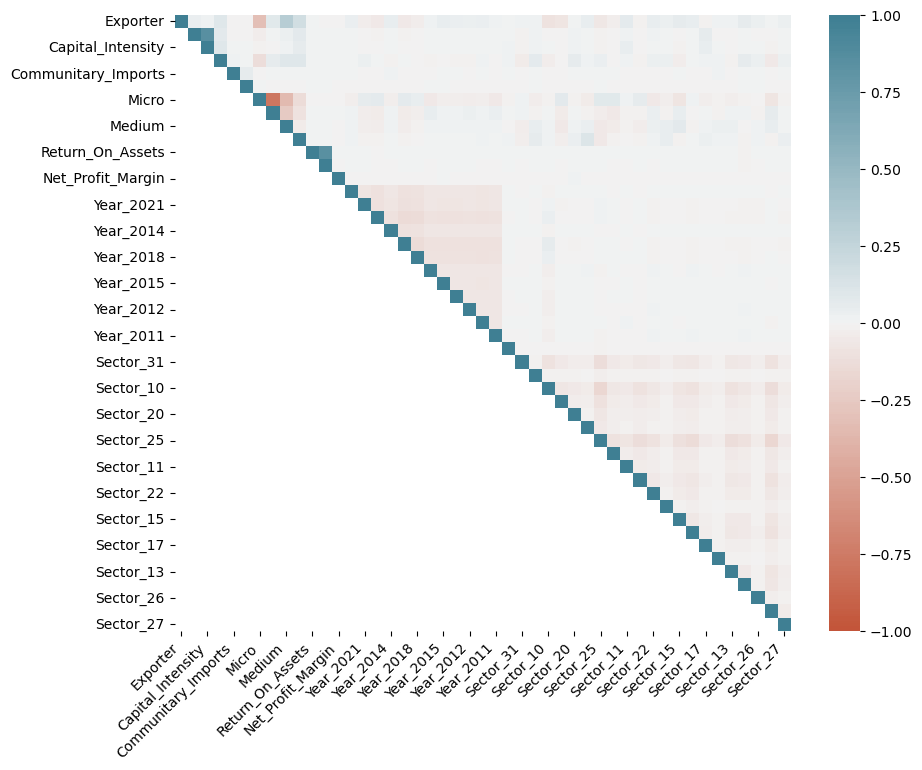

In [11]:
# Correlation Matrix ##############################################################################3333
data = df
corr = data.corr()
mask = (~(np.triu(np.ones_like(corr, dtype=bool))))
plt.figure(figsize=(10, 8))
ax = sns.heatmap(corr, mask = mask, vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(20, 220, n=200), square=True )
ax.set_xticklabels( ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

In [28]:
#Neural Network Functions ######################################################################################
class myCallback(keras.callbacks.Callback):
        # Define the correct function signature for on_epoch_end
        def on_epoch_end(self, epoch, logs=None):
            if logs.get('accuracy') is not None and logs.get('accuracy') > 0.92:
                print("\nReached 92% accuracy so cancelling training!")
                # Stop training once the above condition is met
                self.model.stop_training = True
                
def create_model_1(n_neurons,learning_rate):
    model = Sequential()
    model.add(Dense(n_neurons, input_shape=(X_train.shape[1],), activation='relu')) # Add an input shape! (features,)
    model.add(Dense(n_neurons, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.summary() 
    opt = keras.optimizers.Adam(learning_rate)
    model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
    return model

def create_model_2(n_neurons,n_neurons_2,learning_rate):
    model = Sequential()
    model.add(Dense(n_neurons, input_shape=(X_train.shape[1],), activation='relu')) # Add an input shape! (features,)
    model.add(Dense(n_neurons_2, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.summary() 
    opt = keras.optimizers.Adam(learning_rate)
    model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
    return model

def create_model_3(n_neurons,n_neurons_2,n_neurons_3,learning_rate):
    model = Sequential()
    model.add(Dense(n_neurons, input_shape=(X_train.shape[1],), activation='relu')) # Add an input shape! (features,)
    model.add(Dense(n_neurons_2, activation='relu'))
    model.add(Dense(n_neurons_3, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.summary() 
    opt = keras.optimizers.Adam(learning_rate)
    model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
    return model

def create_model_3_adv(n_neurons, n_neurons_2, n_neurons_3, dropout, learning_rate):
    model = Sequential()
    model.add(Dense(n_neurons, input_shape=(X_train.shape[1],), activation='relu')) # Add an input shape! (features,)
    model.add(Dropout(dropout))  # Adding a dropout layer with a dropout rate of 0.2
    model.add(Dense(n_neurons_2, activation='relu'))
    model.add(Dropout(dropout))  # Adding a dropout layer with a dropout rate of 0.2
    model.add(Dense(n_neurons_3, activation='relu'))
    model.add(Dropout(dropout))  # Adding a dropout layer with a dropout rate of 0.2
    model.add(Dense(1, activation='sigmoid'))
    model.summary() 
    opt = keras.optimizers.Adam(learning_rate)
    model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
    return model

def sequential():
    model = keras.Sequential()
    model.add(Flatten(input_shape=(X_train.shape[1],)))
    model.add(Dense(units=128, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dense(units=128, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dense(units=2, activation='softmax'))
    model.summary() 
    opt = keras.optimizers.Adam(learning_rate)
    model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
    return model

def base_model1(learning_rate):
    input_dim = X_train.shape[1]
    model =Sequential([
    Dense(32, input_dim = input_dim, activation= "relu"),
    Dense(16, activation= "relu"),
    Dense(1,activation = "sigmoid"),])
    model.compile(loss='binary_crossentropy',optimizer=tf.keras.optimizers.Nadam(learning_rate), metrics=["accuracy"])
    hist = model.fit(X_train,y_train, epochs = 100, validation_split=0.2, shuffle=True,verbose=1,batch_size=10,
                     callbacks=[checkpoint,early,myCallback()])
    return hist, model

def adv_model1(n_neurons,learning_rate):
    model = Sequential()
    model.add(Dense(n_neurons, input_shape = (X_train.shape[1],), activation= "relu"))
    model.add(Dense(n_neurons, activation= "relu"))
    model.add(Dense(1,activation = "sigmoid"))
    model.summary() 
    opt = keras.optimizers.Adam(learning_rate)
    model.compile(loss='binary_crossentropy',optimizer=opt, metrics=["accuracy"])
    hist = model.fit(X_train,y_train, epochs = 100, validation_split=0.2, shuffle=True,verbose=1,batch_size=10,
                     callbacks=[checkpoint,early,myCallback()])
    return hist, model    

def adv_modeld(n_neurons,n_neurons_2,learning_rate,dropout):
    model = Sequential()
    model.add(Dense(n_neurons, input_shape = (X_train.shape[1],), activation= "relu"))
    model.add(Dropout(dropout))
    model.add(Dense(n_neurons_2, activation= "relu"))
    model.add(Dropout(dropout))
    model.add(Dense(1,activation = "sigmoid"))
    model.summary() 
    opt = keras.optimizers.Adam(learning_rate)
    model.compile(loss='binary_crossentropy',optimizer=opt, metrics=["accuracy"])
    hist = model.fit(X_train,y_train, epochs = 100, validation_split=0.2, shuffle=True,verbose=1,batch_size=10,
                     callbacks=[checkpoint,early,myCallback()])
    return hist, model                
    
def adv_model2(n_neurons,learning_rate):
    model = Sequential()
    model.add(Dense(n_neurons*2, input_shape = (X_train.shape[1],), activation= "relu"))
    model.add(Dense(n_neurons, activation= "relu"))
    model.add(Dense(n_neurons/2, activation= "relu"))
    model.add(Dense(n_neurons, activation= "relu"))
    model.add(Dense(n_neurons*2, activation= "relu"))
    model.add(Dense(1,activation = "sigmoid"))
    model.summary() 
    opt = keras.optimizers.Adam(learning_rate)
    model.compile(loss='binary_crossentropy',optimizer=opt, metrics=["accuracy"])
    hist = model.fit(X_train,y_train, epochs = 100, validation_split=0.2, shuffle=True,verbose=1,batch_size=10,
                     callbacks=[checkpoint,early,myCallback()])
    return hist, model 

checkpoint = [ModelCheckpoint("Exporters.h5", monitor='val_accuracy', verbose=1, save_best_only=True, 
                              save_weights_only=False, mode='max', save_freq='epoch')]

early = EarlyStopping(monitor='val_accuracy', mode='max', patience=8, restore_best_weights=True)

# Function for identifying scores for non-exporters in X_train and X_test
def Non_Exporters_Score(flx,X_train,X_test):
    Xr=X_train[X_train.index.isin(list(flx[flx[['NIPC_Ano',"exporter"]]['exporter']==0].NIPC_Ano.values))]
    Xs=X_test[X_test.index.isin(list(flx[flx[['NIPC_Ano',"exporter"]]['exporter']==0].NIPC_Ano.values))]
    Xn=pd.concat([Xs,Xr])
    return Xn

In [29]:
#Training the NN
start_time = time.time()
hist, model = adv_model2(n_neurons=64, learning_rate=0.0001)
end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time:", elapsed_time, "seconds")

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 128)               6016      
                                                                 
 dense_7 (Dense)             (None, 64)                8256      
                                                                 
 dense_8 (Dense)             (None, 32)                2080      
                                                                 
 dense_9 (Dense)             (None, 64)                2112      
                                                                 
 dense_10 (Dense)            (None, 128)               8320      
                                                                 
 dense_11 (Dense)            (None, 1)                 129       
                                                                 
Total params: 26913 (105.13 KB)
Trainable params: 2691

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


14634/14644 [============================>.] - ETA: 0s - loss: 0.4110 - accuracy: 0.8165
Epoch 2: val_accuracy improved from 0.89904 to 0.90202, saving model to Exporters.h5
14644/14644 [==============================] - 52s 4ms/step - loss: 0.4110 - accuracy: 0.8165 - val_loss: 0.2692 - val_accuracy: 0.9020
Epoch 3/100
14634/14644 [============================>.] - ETA: 0s - loss: 0.4024 - accuracy: 0.8199
Epoch 3: val_accuracy did not improve from 0.90202
14644/14644 [==============================] - 52s 4ms/step - loss: 0.4024 - accuracy: 0.8199 - val_loss: 0.2678 - val_accuracy: 0.9014
Epoch 4/100
14628/14644 [============================>.] - ETA: 0s - loss: 0.3980 - accuracy: 0.8215
Epoch 4: val_accuracy did not improve from 0.90202
14644/14644 [==============================] - 54s 4ms/step - loss: 0.3981 - accuracy: 0.8214 - val_loss: 0.2691 - val_accuracy: 0.9014
Epoch 5/100
14628/14644 [============================>.] - ETA: 0s - loss: 0.3956 - accuracy: 0.8227
Epoch 5: val_

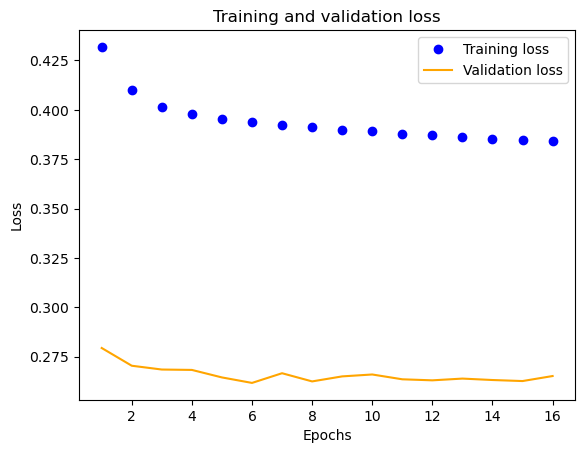

In [14]:
#Plotting training
history_dict = hist.history
loss_values = history_dict['loss'] 
val_loss_values = history_dict['val_loss']
epochs = range(1, len(loss_values) + 1) 
plt.plot(epochs, loss_values, 'bo', label='Training loss')
plt.plot(epochs, val_loss_values, 'orange', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

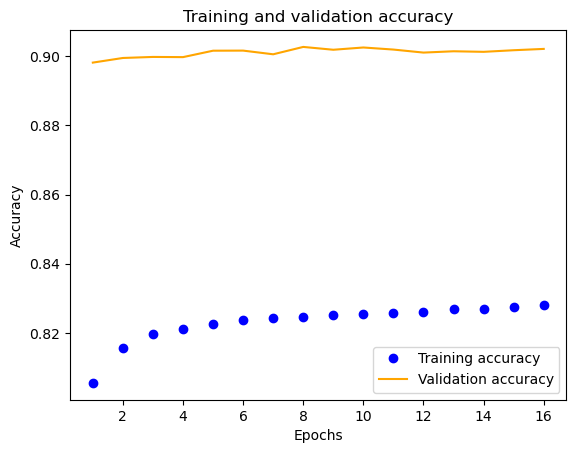

0.9027014970779419

In [15]:
acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'orange', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()
np.max(val_acc)

In [11]:
#Scoring

In [31]:
#Baseline - X_test
scores = model.predict(X_test)
preds = np.round(scores,0)
print(classification_report(y_test, preds))
print(confusion_matrix(y_test, preds))
sc= pd.DataFrame(scores,X_test.index) #Acrescentar index associado
#sc.to_csv("Scores_X_test.csv")

#Results
sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(y_test,scores)

1113/1113 [==============================] - 3s 2ms/step
              precision    recall  f1-score   support

           0       0.85      0.97      0.91     28279
           1       0.74      0.35      0.48      7313

    accuracy                           0.84     35592
   macro avg       0.80      0.66      0.69     35592
weighted avg       0.83      0.84      0.82     35592

[[27375   904]
 [ 4746  2567]]
Balanced_Accuracy:  0.659525774816114
Sensitivity:  0.35101873376179404
Specificity:  0.9680328158704339
ROC:  0.8372116798117092
Precision-Recall:  0.6124677596911969
Num. Obs.:  35592


In [6]:
#Testing for Micro, Small, Medium and Large companies 
for i in ["NIPCs_Micro","NIPCs_Small","NIPCs_Medium","NIPCs_Large"]:   
    print(i)
    NX_test, Ny_test = Exporter_Specific_Score(X_train,X_test,y_train,y_test, eval(i))
    Ny_pred = model.predict(NX_test)
    sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(Ny_test,Ny_pred)
    print("-----------------------------------------------------------------------------------------------------")

NIPCs_Micro
5138/5138 [==============================] - 7s 1ms/step
Balanced_Accuracy:  0.6435120704185349
Sensitivity:  0.30381295453000745
Specificity:  0.9832111863070623
ROC:  0.8738171497026999
Precision-Recall:  0.4959139998282464
Num. Obs.:  164396
-----------------------------------------------------------------------------------------------------
NIPCs_Small
3414/3414 [==============================] - 4s 1ms/step
Balanced_Accuracy:  0.7852210337690192
Sensitivity:  0.6468617041304267
Specificity:  0.9235803634076117
ROC:  0.9102086273733042
Precision-Recall:  0.7640579658092228
Num. Obs.:  109221
-----------------------------------------------------------------------------------------------------
NIPCs_Medium
1048/1048 [==============================] - 1s 988us/step
Balanced_Accuracy:  0.876526899227496
Sensitivity:  0.9296339628948688
Specificity:  0.8234198355601233
ROC:  0.9422389716506923
Precision-Recall:  0.9389882483628919
Num. Obs.:  33517
--------------------------

In [8]:
#Getting Scores for Non_Exporters
Xn = Non_Exporters_Score(flx.reset_index(),X_train,X_test)
scores = model.predict(Xn)
#Exporting Scores to csv
sx= pd.DataFrame(scores,Xn.index) #Acrescentar index associado
sx.to_csv("Scores_Non_Exporters.csv")

6321/6321 [==============================] - 5s 805us/step


In [9]:
#Table 4: Prediction accuracies and temporary trade

In [10]:
##Categorizar NIPCs por perfi de empresa exportadora
start_time = time.time()
del(df)
df=flx.reset_index()
df["NIPC"]=df['NIPC_Ano'].str[:9]
df["Ano"]=df['NIPC_Ano'].str[9:]
NIPCs_Const_NonExport, NIPCs_Const_Export, NIPCs_Swit_Export, NIPCs_Swit_NonExport,NIPCs_Disc_Export, Non_Exp = Exporter_cat(df) 
end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time:", elapsed_time, "seconds")

Elapsed time: 1855.3500483036041 seconds


In [11]:
#Data integrity test, perfect
#Ver os conjuntos de venn resultantes do código.
#Que interseccoes existem entre os conjuntos ? Objetivo é ser 0.
print(set(NIPCs_Const_Export).intersection(set(NIPCs_Const_NonExport)))
print(set(NIPCs_Const_Export).intersection(set(NIPCs_Swit_Export)))
print(set(NIPCs_Const_Export).intersection(set(NIPCs_Swit_NonExport)))
print(set(NIPCs_Const_Export).intersection(set(NIPCs_Disc_Export)))
print(set(NIPCs_Const_Export).intersection(set(Non_Exp)))
print(set(NIPCs_Const_NonExport).intersection(set(NIPCs_Swit_Export)))
print(set(NIPCs_Const_NonExport).intersection(set(NIPCs_Swit_NonExport)))
print(set(NIPCs_Const_NonExport).intersection(set(NIPCs_Disc_Export)))
print(set(NIPCs_Const_NonExport).intersection(set(Non_Exp)))
print(set(NIPCs_Swit_Export).intersection(set(NIPCs_Swit_NonExport)))
print(set(NIPCs_Swit_Export).intersection(set(NIPCs_Disc_Export)))
print(set(NIPCs_Swit_Export).intersection(set(Non_Exp)))
print(set(NIPCs_Swit_NonExport).intersection(set(NIPCs_Disc_Export)))
print(set(NIPCs_Swit_NonExport).intersection(set(Non_Exp)))
print(set(NIPCs_Disc_Export).intersection(set(Non_Exp)))
print(len(df[df['NIPC'].isin(Non_Exp)]))
print("Objetivo é ser tudo zero")

set()
set()
set()
set()
set()
set()
set()
set()
set()
set()
set()
set()
set()
set()
set()
0
Objetivo é ser tudo zero


In [13]:
#Constant Exporters
NX_test, Ny_test = Exporter_Specific_Score(X_train,X_test,y_train,y_test, NIPCs_Const_Export)
Ny_pred = model.predict(NX_test)
sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(Ny_test,Ny_pred)

604/604 [==============================] - 1s 802us/step
ROC not applicable to this case
Balanced_Accuracy:  nan
Sensitivity:  0.8251306732908968
Specificity:  nan
ROC:  ROC doesn't exist
Precision-Recall:  1.0
Num. Obs.:  19323


invalid value encountered in scalar divide


In [14]:
#Non-Exporters
NX_test, Ny_test = Exporter_Specific_Score(X_train,X_test,y_train,y_test, NIPCs_Const_NonExport)
Ny_pred = model.predict(NX_test)
sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(Ny_test,Ny_pred)

5212/5212 [==============================] - 4s 822us/step
ROC not applicable to this case
Balanced_Accuracy:  nan
Sensitivity:  nan
Specificity:  0.9857778417335205
ROC:  ROC doesn't exist
Precision-Recall:  0.5
Num. Obs.:  166782


invalid value encountered in scalar divide
No positive class found in y_true, recall is set to one for all thresholds.


In [15]:
#Switching to Export
NX_test, Ny_test = Exporter_Specific_Score(X_train,X_test,y_train,y_test, NIPCs_Swit_Export)
Ny_pred = model.predict(NX_test)
sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(Ny_test,Ny_pred)

370/370 [==============================] - 0s 942us/step
Balanced_Accuracy:  0.6982107061027236
Sensitivity:  0.5406571523398606
Specificity:  0.8557642598655868
ROC:  0.7907581850352763
Precision-Recall:  0.7955005201208644
Num. Obs.:  11829


In [16]:
#Switching to NonExport
NX_test, Ny_test = Exporter_Specific_Score(X_train,X_test,y_train,y_test, NIPCs_Swit_NonExport)
Ny_pred = model.predict(NX_test)
sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(Ny_test,Ny_pred)

235/235 [==============================] - 0s 999us/step
Balanced_Accuracy:  0.6743219420247685
Sensitivity:  0.4555430500844119
Specificity:  0.8931008339651251
ROC:  0.805864364370557
Precision-Recall:  0.7653220986335469
Num. Obs.:  7511


In [17]:
#Discontinuous Export
NX_test, Ny_test = Exporter_Specific_Score(X_train,X_test,y_train,y_test, NIPCs_Disc_Export)
Ny_pred = model.predict(NX_test)
sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(Ny_test,Ny_pred)

1337/1337 [==============================] - 1s 849us/step
Balanced_Accuracy:  0.6409344615478958
Sensitivity:  0.43696493491263044
Specificity:  0.844903988183161
ROC:  0.7361272518468962
Precision-Recall:  0.6370673014778663
Num. Obs.:  42780


In [18]:
#Switching to Export since tx
NIPCs_Swit_Export_t_1, NIPCs_Swit_Export_t_2, NIPCs_Swit_Export_t_3, NIPCs_Swit_Export_t_4, NIPCs_Swit_Export_t_5, NIPCs_Swit_Export_t_6, NIPCs_Swit_Export_t_7, NIPCs_Swit_Export_t_8, NIPCs_Swit_Export_t_9, NIPCs_Swit_Export_t_10, NIPCs_Swit_Export_t_11 = Switch_Maker(flx[flx.NIPC.isin(NIPCs_Swit_Export)])
for i in range(1,12):   
    print("NIPCs_Swit_Export_t_"+str(i))
    NX_test, Ny_test = Exporter_Specific_Score(X_train,X_test,y_train,y_test, eval("NIPCs_Swit_Export_t_"+str(i)))
    Ny_pred = model.predict(NX_test)
    sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(Ny_test,Ny_pred)
    print("-----------------------------------------------------------------------------------------------------")

AttributeError: 'DataFrame' object has no attribute 'NIPC'

In [ ]:
#Switching to Non_Export since tx
NIPCs_Swit_Non_Export_t_1,NIPCs_Swit_Non_Export_t_2,NIPCs_Swit_Non_Export_t_3,NIPCs_Swit_Non_Export_t_4,NIPCs_Swit_Non_Export_t_5,NIPCs_Swit_Non_Export_t_6,NIPCs_Swit_Non_Export_t_7,NIPCs_Swit_Non_Export_t_8,NIPCs_Swit_Non_Export_t_9,NIPCs_Swit_Non_Export_t_10,NIPCs_Swit_Non_Export_t_11= Switch_Non_Exp_Maker(flx[flx.NIPC.isin(NIPCs_Swit_NonExport)])
for i in range(1,12):   
    print("NIPCs_Swit_Non_Export_t_"+str(i))
    NX_test, Ny_test = Exporter_Specific_Score(X_train,X_test,y_train,y_test, eval("NIPCs_Swit_Non_Export_t_"+str(i)))
    Ny_pred = model.predict(NX_test)
    sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(Ny_test,Ny_pred)
    print("-----------------------------------------------------------------------------------------------------")


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


NIPCs_Swit_Non_Export_t_1
78/78 [==============================] - 0s 924us/step
Balanced_Accuracy:  0.5609247113084924
Sensitivity:  0.22342733188720174
Specificity:  0.8984220907297831
ROC:  0.6915011958395907
Precision-Recall:  0.3043572667011768
Num. Obs.:  2489
-----------------------------------------------------------------------------------------------------
NIPCs_Swit_Non_Export_t_2
31/31 [==============================] - 0s 1ms/step
Balanced_Accuracy:  0.6204165307738899
Sensitivity:  0.3431952662721893
Specificity:  0.8976377952755905
ROC:  0.7448306387737037
Precision-Recall:  0.5785306207841987
Num. Obs.:  973
-----------------------------------------------------------------------------------------------------
NIPCs_Swit_Non_Export_t_3
17/17 [==============================] - 0s 1ms/step
Balanced_Accuracy:  0.6605581275720165
Sensitivity:  0.4773662551440329
Specificity:  0.84375
ROC:  0.7875800182898948
Precision-Recall:  0.7188649027759558
Num. Obs.:  531
--------------

In [ ]:
#Discontinuous Exporters by export experience
NIPCs_Disc_Export_1,NIPCs_Disc_Export_2,NIPCs_Disc_Export_3,NIPCs_Disc_Export_4,NIPCs_Disc_Export_5,NIPCs_Disc_Export_6,NIPCs_Disc_Export_7,NIPCs_Disc_Export_8,NIPCs_Disc_Export_9,NIPCs_Disc_Export_10,NIPCs_Disc_Export_11 = Disc_Exp_Maker(flx[flx.NIPC.isin(NIPCs_Disc_Export)])
for i in range(1,12):   
    print("NIPCs_Disc_Export_"+str(i))
    NX_test, Ny_test = Exporter_Specific_Score(X_train,X_test,y_train,y_test, eval("NIPCs_Disc_Export_"+str(i)))
    Ny_pred = model.predict(NX_test)
    sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(Ny_test,Ny_pred)
    print("-----------------------------------------------------------------------------------------------------")


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


NIPCs_Disc_Export_1
332/332 [==============================] - 0s 918us/step
Balanced_Accuracy:  0.5381948065447927
Sensitivity:  0.16588419405320814
Specificity:  0.9105054190363773
ROC:  0.6598927242557777
Precision-Recall:  0.1878967543856763
Num. Obs.:  10597
-----------------------------------------------------------------------------------------------------
NIPCs_Disc_Export_2
214/214 [==============================] - 0s 927us/step
Balanced_Accuracy:  0.5663232664385425
Sensitivity:  0.28263707571801566
Specificity:  0.8500094571590694
ROC:  0.6712600763190266
Precision-Recall:  0.33839587311532937
Num. Obs.:  6819
-----------------------------------------------------------------------------------------------------
NIPCs_Disc_Export_3
164/164 [==============================] - 0s 859us/step
Balanced_Accuracy:  0.5710203152540461
Sensitivity:  0.3092224231464738
Specificity:  0.8328182073616184
ROC:  0.6711287770894189
Precision-Recall:  0.4501600604650442
Num. Obs.:  5218
------

In [8]:
#All sample
Y = flx[['exporter']]#.set_index("NIPC_Ano")
X = flx.drop(['exporter'], axis=1)#.set_index("NIPC_Ano")

Y_pred = model.predict(X)
sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(Y,Y_pred)

preds_f = np.round(Y_pred,0)
print(classification_report(Y, preds_f))
print(confusion_matrix(Y, preds_f))

7758/7758 [==============================] - 6s 757us/step
Balanced_Accuracy:  0.6931709834137775
Sensitivity:  0.6926039558717932
Specificity:  0.6937380109557617
ROC:  0.6935472464880283
Precision-Recall:  0.5447374488000721
Num. Obs.:  248225
              precision    recall  f1-score   support

           0       0.91      0.69      0.79    202268
           1       0.34      0.69      0.46     45957

    accuracy                           0.69    248225
   macro avg       0.62      0.69      0.62    248225
weighted avg       0.80      0.69      0.73    248225

[[140321  61947]
 [ 14127  31830]]


In [62]:
# defined a la Murakozy Permanent Exporters - Exporters with 4 consecutive years

def count_consecutive_numbers(line):
    ls_line=[int(line[i:i+4]) for i in range(0, len(line), 4)]
    count = 0
    max_count = 0
    for i in range(len(ls_line) - 1):
        if ls_line[i] + 1 == ls_line[i + 1]:
            count += 1
        else:
            max_count = max(max_count, count)
            count = 0
    max_count = max(max_count, count)
    return max_count + 1  # Adding 1 to include the last number in the sequence

ff=flx.copy()
ff=ff.reset_index()
ff["NIPC"] = ff.NIPC_Ano.str[:9]
ff["Ano"] = ff.NIPC_Ano.str[9:]
fx=ff[ff["exporter"]==1]
xf = fx.groupby('NIPC')[['exporter',"Ano"]].sum()
xf['consecutive_count'] = xf["Ano"].apply(lambda row: count_consecutive_numbers(row))

In [63]:
# Select IDs where firms export at least 4 consecutive years
NIPCs_Permanent_Exp = list(xf[xf["consecutive_count"]>=4].index)
NX_test, Ny_test = Exporter_Specific_Score(X_train,X_test,y_train,y_test, NIPCs_Permanent_Exp)
Ny_pred = model.predict(NX_test)
sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(Ny_test,Ny_pred)

1313/1313 [==============================] - 1s 1ms/step
Balanced_Accuracy:  0.7431277278377368
Sensitivity:  0.7505583233121457
Specificity:  0.7356971323633281
ROC:  0.8306987860928687
Precision-Recall:  0.9559732402743688
Num. Obs.:  42005


In [67]:
# defined a la Murakozy Temporary Exporters - Remaining Firms that export at least once
NIPCs_Exp = set(fx.NIPC)
NIPCs_Temp_Exp = set(NIPCs_Exp)-set(NIPCs_Permanent_Exp)
NX_test, Ny_test = Exporter_Specific_Score(X_train,X_test,y_train,y_test, NIPCs_Temp_Exp)
Ny_pred = model.predict(NX_test)
sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(Ny_test,Ny_pred)

1233/1233 [==============================] - 2s 1ms/step


Balanced_Accuracy:  0.5979532531995225
Sensitivity:  0.32925392076874266
Specificity:  0.8666525856303023
ROC:  0.698020694674864
Precision-Recall:  0.4585337393690253
Num. Obs.:  39438


In [71]:
#ff[ff["NIPC"].isin(NIPCs_Temp_Exp)].to_excel("frame.xlsx")

In [34]:
# defined a la Murakozy - Non-Exporters
ff=flx.copy()
ff=ff.reset_index()
ff["NIPC"] = ff.NIPC_Ano.str[:9]
xo = ff.groupby('NIPC')['exporter'].sum()
Non_Exp = list(xo[xo==0].index)

NX_test, Ny_test = Exporter_Specific_Score(X_train,X_test,y_train,y_test, Non_Exp)
Ny_pred = model.predict(NX_test)
sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(Ny_test,Ny_pred)

5212/5212 [==============================] - 7s 1ms/step
ROC not applicable to this case
Balanced_Accuracy:  nan
Sensitivity:  nan
Specificity:  0.9839551030686765
ROC:  ROC doesn't exist
Precision-Recall:  0.5
Num. Obs.:  166782


invalid value encountered in scalar divide
No positive class found in y_true, recall is set to one for all thresholds.


In [4]:

def Exporter_Specific_Score_NX(X_train,X_test,y_train,y_test, test_group): 
    valid_X_train_group = [x for x in test_group if x in X_train.index]
    Xr = X_train.loc[valid_X_train_group]
    
    valid_X_test_group = [x for x in test_group if x in X_test.index]
    Xs = X_test.loc[valid_X_test_group]    
    NX_test=pd.concat([Xs,Xr])
    
    valid_y_train_group = [x for x in test_group if x in y_train.index]
    Yr = y_train.loc[valid_y_train_group]
    
    valid_y_test_group = [x for x in test_group if x in y_test.index]
    Ys = y_test.loc[valid_y_test_group]    
    Ny_test=pd.concat([Ys,Yr])

    mask1 = ~X_train.index.isin(valid_X_train_group)
    Xrt = X_train[mask1]

    mask2 = ~X_test.index.isin(valid_X_test_group)
    Xst = X_test[mask2]
    
    mask3 = ~y_train.index.isin(valid_y_train_group)
    Yrt = y_train[mask3]
    
    mask4 = ~y_test.index.isin(valid_y_test_group)
    Yst = y_test[mask4]
    
    NX_train=pd.concat([Xrt,Xst])
    Ny_train=pd.concat([Yrt,Yst])

    return NX_test, Ny_test, NX_train, Ny_train

def adv_model2_pset(X_train, y_train, n_neurons,learning_rate):
    model = Sequential()
    model.add(Dense(n_neurons*2, input_shape = (X_train.shape[1],), activation= "relu"))
    model.add(Dense(n_neurons, activation= "relu"))
    model.add(Dense(n_neurons/2, activation= "relu"))
    model.add(Dense(n_neurons, activation= "relu"))
    model.add(Dense(n_neurons*2, activation= "relu"))
    model.add(Dense(1,activation = "sigmoid"))
    model.summary() 
    opt = keras.optimizers.Adam(learning_rate)
    model.compile(loss='binary_crossentropy',optimizer=opt, metrics=["accuracy"])
    hist = model.fit(X_train,y_train, epochs = 100, validation_split=0.2, shuffle=True,verbose=1,batch_size=10,
                     callbacks=[checkpoint,early,myCallback()])
    return hist, model

checkpoint = [ModelCheckpoint("Exporters.h5", monitor='val_accuracy', verbose=1, save_best_only=True, 
                              save_weights_only=False, mode='max', save_freq='epoch')]

early = EarlyStopping(monitor='val_accuracy', mode='max', patience=8, restore_best_weights=True)

def preparing_train_test_post(tflx, exp, features):

    # split into X and Y

    flx=tflx[list(features[0])+[exp]]
    Y = flx[[exp]]
    X = flx.drop([exp], axis=1)

    cols = X.columns  
    scaler = StandardScaler()
    scaler.fit(X)
    X = scaler.transform(X)
    X=pd.DataFrame(X, columns = cols, index = flx.index).reset_index()
    print(X.shape)
    print(Y.shape)

    #Original
    X_test = X[X.NIPC_Ano.str[:9].str.contains('|'.join(list(set(nipcs.value.astype(str)))))] 
    X_train = X[~(X.NIPC_Ano.str[:9].str.contains('|'.join(list(set(nipcs.value.astype(str))))))] 
    y_test = Y[Y.index.str[:9].str.contains('|'.join(list(set(nipcs.value.astype(str)))))]
    y_train = Y[~(Y.index.str[:9].str.contains('|'.join(list(set(nipcs.value.astype(str))))))]
        
    X_train = X_train.set_index("NIPC_Ano")#.drop(['NIPC_Ano'], axis=1)
    X_test = X_test.set_index("NIPC_Ano")#.drop(['NIPC_Ano'], axis=1)
    #y_train = y_train.set_index("NIPC_Ano")#.drop(['NIPC_Ano'], axis=1)
    #y_test = y_test.set_index("NIPC_Ano")#.drop(['NIPC_Ano'], axis=1)
    print(X_train.shape)
    print(y_train.shape)
    return X_test, X_train, y_test, y_train


In [5]:

# Train Test Split for alternative definitions of exporters #################################################################################
#Final features
feats_selected=pd.read_excel("V2/Features_selected.xlsx")
flx=df[list(feats_selected[0])+["Exporter"]].dropna()

#Creating features for future scoring
filex = file.copy()
filex["NIPC_Ano"] = filex["NIPC"].astype(str) + filex["Ano"].astype(str)

#Scenario 1)
filex["MercadoExterno_Vendas_Racio"] = (filex["Total_Vendas"] - filex["MercadoInterno_Vendas"])/filex["Total_Vendas"]
filex["Export_at_least_5_p_cent_abroad"] = np.where(filex["MercadoExterno_Vendas_Racio"]>0.05,1,0 )

#Scenario 2)
filex["Export_at_least_15_p_cent_abroad"] = np.where(filex["MercadoExterno_Vendas_Racio"]>0.15,1,0 )

#Scenario 3)
filex["Export_Outside_EU"] = np.where(filex["MercadoExtraComunitario_Vendas"]>0,1,0 )

#Scenario 4)
destinations ["NIPC_Ano"] = destinations["_NIF"].astype(str)+destinations["Ano"].astype(str)
destinations["More_than_two_markets"] = np.where(destinations["Paises"]>2,1,0 )

#Scenario 5)
destinations["More_than_five_markets"] = np.where(destinations["Paises"]>5,1,0 )

#Scenario 6)
destinations["More_than_nine_markets"] = np.where(destinations["Paises"]>9,1,0 )

In [10]:
#1) Predictions with NN for different definitions of exporter - Firms that sell at least 5% of total sales abroad
xf=pd.merge(filex[["NIPC_Ano","Export_at_least_5_p_cent_abroad"]], flx, on="NIPC_Ano")
xf= xf.set_index("NIPC_Ano")
ff=xf.drop(columns="Exporter")
ff=ff.dropna()
X_test, X_train, y_test, y_train = preparing_train_test_post(ff, "Export_at_least_5_p_cent_abroad", feats_selected)

(248225, 32)
(248225, 1)


KeyboardInterrupt: 

In [7]:
#Training the NN
start_time = time.time()
hist, model = adv_model2_pset(X_train,y_train,n_neurons=64, learning_rate=0.0001)
end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time:", elapsed_time, "seconds")

y_pred = model.predict(X_test)
sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(y_test,y_pred)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               4096      
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 64)                2112      
                                                                 
 dense_4 (Dense)             (None, 128)               8320      
                                                                 
 dense_5 (Dense)             (None, 1)                 129       
                                                                 
Total params: 24,993
Trainable params: 24,993
Non-train

In [7]:
#2) Predictions with NN for different definitions of exporter - Firms that sell at least 15% of total sales abroad

xf=pd.merge(filex[["NIPC_Ano","Export_at_least_15_p_cent_abroad"]], flx, on="NIPC_Ano")
xf= xf.set_index("NIPC_Ano")
ff=xf.drop(columns="Exporter")
ff=ff.dropna()
X_test, X_train, y_test, y_train = preparing_train_test_post(ff, "Export_at_least_15_p_cent_abroad", feats_selected)

#Training the NN
start_time = time.time()
hist, model = adv_model2_pset(X_train,y_train,n_neurons=64, learning_rate=0.0001)
end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time:", elapsed_time, "seconds")

print("----------------------------------------------------------------------------------------------------------")
y_pred = model.predict(X_test)
sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(y_test,y_pred)

(248225, 32)
(248225, 1)
(207640, 31)
(207640, 1)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               4096      
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 64)                2112      
                                                                 
 dense_4 (Dense)             (None, 128)               8320      
                                                                 
 dense_5 (Dense)             (None, 1)                 129       
                                                                 
Total

In [7]:
#3) Predictions with NN for different definitions of exporter - Exporting outside the EU market

xf=pd.merge(filex[["NIPC_Ano","Export_Outside_EU"]], flx, on="NIPC_Ano")
xf= xf.set_index("NIPC_Ano")
ff=xf.drop(columns="Exporter")
ff=ff.dropna()
X_test, X_train, y_test, y_train = preparing_train_test_post(ff, "Export_Outside_EU", feats_selected)

#Training the NN
start_time = time.time()
hist, model = adv_model2_pset(X_train,y_train,n_neurons=64, learning_rate=0.0001)
end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time:", elapsed_time, "seconds")

print("----------------------------------------------------------------------------------------------------------")
y_pred = model.predict(X_test)
sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(y_test,y_pred)

(248225, 32)
(248225, 1)
(207640, 31)
(207640, 1)
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 128)               4096      
                                                                 
 dense_7 (Dense)             (None, 64)                8256      
                                                                 
 dense_8 (Dense)             (None, 32)                2080      
                                                                 
 dense_9 (Dense)             (None, 64)                2112      
                                                                 
 dense_10 (Dense)            (None, 128)               8320      
                                                                 
 dense_11 (Dense)            (None, 1)                 129       
                                                                 
Tota

In [8]:
#4) Predictions with NN for different definitions of exporter - Firms that sell to at least 3 countries

xf=pd.merge(destinations[["NIPC_Ano","More_than_two_markets"]], flx, on="NIPC_Ano")
xf= xf.set_index("NIPC_Ano")
ff=xf.drop(columns="Exporter")
ff=ff.dropna()
X_test, X_train, y_test, y_train = preparing_train_test_post(ff, "More_than_two_markets", feats_selected)

#Training the NN
start_time = time.time()
hist, model = adv_model2_pset(X_train,y_train,n_neurons=64, learning_rate=0.0001)
end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time:", elapsed_time, "seconds")

print("----------------------------------------------------------------------------------------------------------")
y_pred = model.predict(X_test)
sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(y_test,y_pred)

(80362, 32)
(80362, 1)
(67412, 31)
(67412, 1)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               4096      
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 64)                2112      
                                                                 
 dense_4 (Dense)             (None, 128)               8320      
                                                                 
 dense_5 (Dense)             (None, 1)                 129       
                                                                 
Total par

In [6]:
#5) Predictions with NN for different definitions of exporter - Firms that sell to at least 6 countries

xf=pd.merge(destinations[["NIPC_Ano","More_than_five_markets"]], flx, on="NIPC_Ano")
xf= xf.set_index("NIPC_Ano")
ff=xf.drop(columns="Exporter")
ff=ff.dropna()
X_test, X_train, y_test, y_train = preparing_train_test_post(ff, "More_than_five_markets", feats_selected)

#Training the NN
start_time = time.time()
hist, model = adv_model2_pset(X_train,y_train,n_neurons=64, learning_rate=0.0001)
end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time:", elapsed_time, "seconds")

print("----------------------------------------------------------------------------------------------------------")
y_pred = model.predict(X_test)
sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(y_test,y_pred)

(80362, 32)
(80362, 1)
(67412, 31)
(67412, 1)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               4096      
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 64)                2112      
                                                                 
 dense_4 (Dense)             (None, 128)               8320      
                                                                 
 dense_5 (Dense)             (None, 1)                 129       
                                                                 
Total par

In [6]:
#6) Predictions with NN for different definitions of exporter - Firms that sell to at least 10 countries

xf=pd.merge(destinations[["NIPC_Ano","More_than_nine_markets"]], flx, on="NIPC_Ano")
xf= xf.set_index("NIPC_Ano")
ff=xf.drop(columns="Exporter")
ff=ff.dropna()
X_test, X_train, y_test, y_train = preparing_train_test_post(ff, "More_than_nine_markets", feats_selected)

#Training the NN
start_time = time.time()
hist, model = adv_model2_pset(X_train,y_train,n_neurons=64, learning_rate=0.0001)
end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time:", elapsed_time, "seconds")

print("----------------------------------------------------------------------------------------------------------")
y_pred = model.predict(X_test)
sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(y_test,y_pred)

(80362, 32)
(80362, 1)
(67412, 31)
(67412, 1)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               4096      
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 64)                2112      
                                                                 
 dense_4 (Dense)             (None, 128)               8320      
                                                                 
 dense_5 (Dense)             (None, 1)                 129       
                                                                 
Total par

In [6]:
#Test by year - first take. (In here we were training on the original sample)
ff=flx.copy()
ff=ff.reset_index()
ff["Ano"] = ff.NIPC_Ano.str[9:]

def Exporter_Specific_Score_Y(X_train,X_test,y_train,y_test, test_group):
    
    valid_X_train_group = [x for x in test_group if x in X_train.index]
    Xr = X_train.loc[valid_X_train_group]
    valid_X_test_group = [x for x in test_group if x in X_test.index]
    Xs = X_test.loc[valid_X_test_group]    
    NX_test=pd.concat([Xs,Xr])
    valid_y_train_group = [x for x in test_group if x in y_train.index]
    Yr = y_train.loc[valid_y_train_group]
    valid_y_test_group = [x for x in test_group if x in y_test.index]
    Ys = y_test.loc[valid_y_test_group]    
    Ny_test=pd.concat([Ys,Yr])
    return NX_test, Ny_test

for year in set(ff.Ano):
    print(year)
    test_group = list(ff[ff["Ano"] == str(year)].NIPC_Ano)
    NX_test, Ny_test = Exporter_Specific_Score_Y(X_train,X_test,y_train,y_test, test_group)
    Ny_pred = model.predict(NX_test)
    sensitivity, specificity, Balanced_Accuracy, roc, pr_auc, Num_Obs = Exporter_Analytics(Ny_test,Ny_pred)
    print("---------------------------------------------------------")

2020
1056/1056 [==============================] - 2s 2ms/step
Balanced_Accuracy:  0.8334315834984385
Sensitivity:  0.69675
Specificity:  0.970113166996877
ROC:  0.9407801890594043
Precision-Recall:  0.7850469395367522
Num. Obs.:  33779
---------------------------------------------------------
2012
486/486 [==============================] - 1s 1ms/step
Balanced_Accuracy:  0.7970500043802793
Sensitivity:  0.6524572359489547
Specificity:  0.941642772811604
ROC:  0.912571365008149
Precision-Recall:  0.7999793338203867
Num. Obs.:  15541
---------------------------------------------------------
2013
495/495 [==============================] - 1s 2ms/step
Balanced_Accuracy:  0.7938891337612943
Sensitivity:  0.6427307206068268
Specificity:  0.945047546915762
ROC:  0.9130856976464481
Precision-Recall:  0.8072430412189284
Num. Obs.:  15838
---------------------------------------------------------
2021
652/652 [==============================] - 1s 1ms/step
Balanced_Accuracy:  0.8034504766604444
Se

In [13]:
#Test by year - second take. In a different way - Now we will change what we train to train on all other years
ff=flx.copy()
ff=ff.reset_index()
ff["Ano"] = ff.NIPC_Ano.str[9:]

my_dict = {}

for year in set(ff.Ano):
    print(year)

    my_dict["year_"+year] = year
    my_dict["test_group_"+year] = list(ff[ff["Ano"] == str(year)].NIPC_Ano)
    my_dict["X_test_"+year], my_dict["y_test_"+year],my_dict["X_train_"+year], my_dict["y_train_"+year] = Exporter_Specific_Score_NX(X_train,X_test,y_train,y_test, my_dict["test_group_"+year])
    #Training the NN
    start_time = time.time()
    my_dict["hist_"+year], my_dict["model_"+year] = adv_model2_pset(my_dict["X_train_"+year],my_dict["y_train_"+year],n_neurons=64, learning_rate=0.0001)
    end_time = time.time()
    elapsed_time = end_time - start_time
    print("Elapsed time:", elapsed_time, "seconds")
    print("----------------------------------------------------------------------------------------------------------")
    my_dict["y_pred_"+year] = my_dict["model_"+year].predict(my_dict["X_test_"+year])
    my_dict["sensitivity_"+year], my_dict["specificity_"+year], my_dict["Balanced_Accuracy_"+year], my_dict["ROC_"+year], my_dict["PR_AUC_"+year], my_dict["Numb_Obs_"+year] = Exporter_Analytics(my_dict["y_test_"+year],my_dict["y_pred_"+year])
    print("---------------------------------------------------------")

#    year_data = {"year": year, "test_group": test_group, "NX_test": NX_test, "Ny_test": Ny_test, "NX_train": NX_train, "Ny_train": Ny_train, "hist": hist, "model": model,
#    "elapsed_time": elapsed_time, "sensitivity": sensitivity, "specificity": specificity,  "Balanced_Accuracy": Balanced_Accuracy, "roc": roc, "pr_auc": pr_auc, "Num_Obs": Num_Obs}

2010
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 128)               4096      
                                                                 
 dense_7 (Dense)             (None, 64)                8256      
                                                                 
 dense_8 (Dense)             (None, 32)                2080      
                                                                 
 dense_9 (Dense)             (None, 64)                2112      
                                                                 
 dense_10 (Dense)            (None, 128)               8320      
                                                                 
 dense_11 (Dense)            (None, 1)                 129       
                                                                 
Total params: 24,993
Trainable params: 24,993
Non

The figure layout has changed to tight


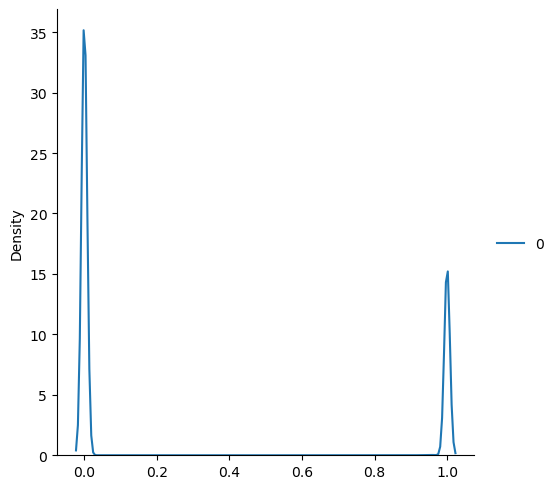

In [134]:
#Plotting Scores
sns.displot(Y_pred, kind="kde", bw_adjust=.2) #Distribution plotting

In [135]:
#Confusion Matrix
print(confusion_matrix(y_test['exporter'], preds))
#print(classification_report(y_test, preds))

[[31872  1323]
 [ 2695  4695]]


In [7]:
#SHAP values for interpretability
#explainer = shap.Explainer(model)
explainer = shap.Explainer(model.predict, X_test)
shap_values = explainer(X_test)

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 23/35638 [00:00<?, ?it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 25/35638 [00:10<1:34:05,  6.31it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:   0%|          | 26/35638 [00:10<2:13:46,  4.44it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:   0%|          | 27/35638 [00:11<2:35:53,  3.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 28/35638 [00:11<2:54:19,  3.40it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:   0%|          | 29/35638 [00:11<3:01:46,  3.27it/s]

22/22 [==============================] - 0s 757us/step


ExactExplainer explainer:   0%|          | 30/35638 [00:12<3:03:55,  3.23it/s]

22/22 [==============================] - 0s 774us/step


ExactExplainer explainer:   0%|          | 31/35638 [00:12<3:08:46,  3.14it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:   0%|          | 32/35638 [00:12<3:09:09,  3.14it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 33/35638 [00:13<3:10:49,  3.11it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:   0%|          | 34/35638 [00:13<3:07:13,  3.17it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:   0%|          | 35/35638 [00:13<3:00:47,  3.28it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:   0%|          | 36/35638 [00:13<2:57:58,  3.33it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:   0%|          | 37/35638 [00:14<3:01:44,  3.26it/s]

22/22 [==============================] - 0s 801us/step


ExactExplainer explainer:   0%|          | 38/35638 [00:14<3:04:08,  3.22it/s]

22/22 [==============================] - 0s 708us/step


ExactExplainer explainer:   0%|          | 39/35638 [00:14<3:05:52,  3.19it/s]

22/22 [==============================] - 0s 556us/step


ExactExplainer explainer:   0%|          | 40/35638 [00:15<2:59:34,  3.30it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:   0%|          | 41/35638 [00:15<3:07:11,  3.17it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:   0%|          | 42/35638 [00:15<3:04:41,  3.21it/s]

22/22 [==============================] - 0s 668us/step


ExactExplainer explainer:   0%|          | 43/35638 [00:16<3:09:30,  3.13it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:   0%|          | 44/35638 [00:16<3:17:17,  3.01it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:   0%|          | 45/35638 [00:16<3:16:01,  3.03it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:   0%|          | 46/35638 [00:17<3:14:42,  3.05it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:   0%|          | 47/35638 [00:17<3:17:36,  3.00it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:   0%|          | 48/35638 [00:17<3:15:41,  3.03it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:   0%|          | 49/35638 [00:18<3:13:50,  3.06it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:   0%|          | 50/35638 [00:18<3:13:04,  3.07it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:   0%|          | 51/35638 [00:18<3:16:00,  3.03it/s]

21/21 [==============================] - 0s 436us/step


ExactExplainer explainer:   0%|          | 52/35638 [00:19<3:05:20,  3.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 53/35638 [00:19<3:10:15,  3.12it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:   0%|          | 54/35638 [00:19<3:10:52,  3.11it/s]

22/22 [==============================] - 0s 429us/step


ExactExplainer explainer:   0%|          | 55/35638 [00:20<3:04:47,  3.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 56/35638 [00:20<2:59:33,  3.30it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:   0%|          | 57/35638 [00:20<2:56:28,  3.36it/s]

22/22 [==============================] - 0s 593us/step


ExactExplainer explainer:   0%|          | 58/35638 [00:20<2:53:45,  3.41it/s]

21/21 [==============================] - 0s 813us/step


ExactExplainer explainer:   0%|          | 59/35638 [00:21<2:51:50,  3.45it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:   0%|          | 60/35638 [00:21<2:51:57,  3.45it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:   0%|          | 61/35638 [00:21<2:49:18,  3.50it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:   0%|          | 62/35638 [00:21<2:46:45,  3.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 63/35638 [00:22<2:44:14,  3.61it/s]

21/21 [==============================] - 0s 828us/step


ExactExplainer explainer:   0%|          | 64/35638 [00:22<2:43:03,  3.64it/s]

21/21 [==============================] - 0s 808us/step


ExactExplainer explainer:   0%|          | 65/35638 [00:22<2:41:54,  3.66it/s]

21/21 [==============================] - 0s 726us/step


ExactExplainer explainer:   0%|          | 66/35638 [00:23<2:44:24,  3.61it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   0%|          | 67/35638 [00:23<2:44:16,  3.61it/s]

21/21 [==============================] - 0s 415us/step


ExactExplainer explainer:   0%|          | 68/35638 [00:23<2:44:59,  3.59it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:   0%|          | 69/35638 [00:23<2:43:04,  3.64it/s]

21/21 [==============================] - 0s 793us/step


ExactExplainer explainer:   0%|          | 70/35638 [00:24<2:41:55,  3.66it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:   0%|          | 71/35638 [00:24<2:41:16,  3.68it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   0%|          | 72/35638 [00:24<2:44:04,  3.61it/s]

22/22 [==============================] - 0s 768us/step


ExactExplainer explainer:   0%|          | 73/35638 [00:25<2:53:26,  3.42it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:   0%|          | 74/35638 [00:25<2:51:52,  3.45it/s]

21/21 [==============================] - 0s 838us/step


ExactExplainer explainer:   0%|          | 75/35638 [00:25<2:48:28,  3.52it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:   0%|          | 76/35638 [00:25<2:50:20,  3.48it/s]

22/22 [==============================] - 0s 758us/step


ExactExplainer explainer:   0%|          | 77/35638 [00:26<2:49:08,  3.50it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:   0%|          | 78/35638 [00:26<2:47:46,  3.53it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:   0%|          | 79/35638 [00:26<2:50:24,  3.48it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:   0%|          | 80/35638 [00:27<2:49:28,  3.50it/s]

22/22 [==============================] - 0s 749us/step


ExactExplainer explainer:   0%|          | 81/35638 [00:27<2:47:32,  3.54it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:   0%|          | 82/35638 [00:27<2:44:49,  3.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 83/35638 [00:27<2:45:02,  3.59it/s]

21/21 [==============================] - 0s 646us/step


ExactExplainer explainer:   0%|          | 84/35638 [00:28<2:45:34,  3.58it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:   0%|          | 85/35638 [00:28<3:01:00,  3.27it/s]

22/22 [==============================] - 0s 555us/step


ExactExplainer explainer:   0%|          | 86/35638 [00:28<3:03:59,  3.22it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:   0%|          | 87/35638 [00:29<3:05:42,  3.19it/s]

22/22 [==============================] - 0s 829us/step


ExactExplainer explainer:   0%|          | 88/35638 [00:29<3:06:09,  3.18it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:   0%|          | 89/35638 [00:29<3:07:07,  3.17it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:   0%|          | 90/35638 [00:30<3:07:40,  3.16it/s]

22/22 [==============================] - 0s 699us/step


ExactExplainer explainer:   0%|          | 91/35638 [00:30<3:14:39,  3.04it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 92/35638 [00:30<3:15:38,  3.03it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:   0%|          | 93/35638 [00:31<3:14:40,  3.04it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 94/35638 [00:31<3:13:55,  3.05it/s]

22/22 [==============================] - 0s 836us/step


ExactExplainer explainer:   0%|          | 95/35638 [00:31<3:12:06,  3.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 96/35638 [00:32<3:04:42,  3.21it/s]

22/22 [==============================] - 0s 738us/step


ExactExplainer explainer:   0%|          | 97/35638 [00:32<3:02:17,  3.25it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 98/35638 [00:32<2:55:09,  3.38it/s]

22/22 [==============================] - 0s 663us/step


ExactExplainer explainer:   0%|          | 99/35638 [00:32<3:01:18,  3.27it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:   0%|          | 100/35638 [00:33<3:05:42,  3.19it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:   0%|          | 101/35638 [00:33<3:06:40,  3.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 102/35638 [00:33<3:08:28,  3.14it/s]

22/22 [==============================] - 0s 681us/step


ExactExplainer explainer:   0%|          | 103/35638 [00:34<3:13:31,  3.06it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 104/35638 [00:34<3:11:54,  3.09it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:   0%|          | 105/35638 [00:34<3:11:04,  3.10it/s]

22/22 [==============================] - 0s 504us/step


ExactExplainer explainer:   0%|          | 106/35638 [00:35<3:11:28,  3.09it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:   0%|          | 107/35638 [00:35<3:13:09,  3.07it/s]

22/22 [==============================] - 0s 775us/step


ExactExplainer explainer:   0%|          | 108/35638 [00:35<3:12:59,  3.07it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:   0%|          | 109/35638 [00:36<3:07:51,  3.15it/s]

22/22 [==============================] - 0s 688us/step


ExactExplainer explainer:   0%|          | 110/35638 [00:36<3:01:22,  3.26it/s]

22/22 [==============================] - 0s 468us/step


ExactExplainer explainer:   0%|          | 111/35638 [00:36<2:57:29,  3.34it/s]

22/22 [==============================] - 0s 681us/step


ExactExplainer explainer:   0%|          | 112/35638 [00:37<2:53:54,  3.40it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:   0%|          | 113/35638 [00:37<2:51:31,  3.45it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:   0%|          | 114/35638 [00:37<2:51:18,  3.46it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:   0%|          | 115/35638 [00:37<2:55:36,  3.37it/s]

22/22 [==============================] - 0s 705us/step


ExactExplainer explainer:   0%|          | 116/35638 [00:38<2:53:50,  3.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 117/35638 [00:38<2:51:13,  3.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 118/35638 [00:38<2:56:38,  3.35it/s]

21/21 [==============================] - 0s 805us/step


ExactExplainer explainer:   0%|          | 119/35638 [00:39<2:51:34,  3.45it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:   0%|          | 120/35638 [00:39<2:50:20,  3.48it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:   0%|          | 121/35638 [00:39<3:00:11,  3.29it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:   0%|          | 122/35638 [00:39<2:56:10,  3.36it/s]

21/21 [==============================] - 0s 819us/step


ExactExplainer explainer:   0%|          | 123/35638 [00:40<2:53:00,  3.42it/s]

22/22 [==============================] - 0s 805us/step


ExactExplainer explainer:   0%|          | 124/35638 [00:40<2:51:31,  3.45it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:   0%|          | 125/35638 [00:40<2:49:32,  3.49it/s]

22/22 [==============================] - 0s 796us/step


ExactExplainer explainer:   0%|          | 126/35638 [00:41<2:49:26,  3.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 127/35638 [00:41<2:52:20,  3.43it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:   0%|          | 128/35638 [00:41<2:49:56,  3.48it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:   0%|          | 129/35638 [00:41<2:47:58,  3.52it/s]

22/22 [==============================] - 0s 782us/step


ExactExplainer explainer:   0%|          | 130/35638 [00:42<2:47:37,  3.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 131/35638 [00:42<2:48:54,  3.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 132/35638 [00:42<2:50:12,  3.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 133/35638 [00:43<2:53:09,  3.42it/s]

22/22 [==============================] - 0s 750us/step


ExactExplainer explainer:   0%|          | 134/35638 [00:43<2:51:12,  3.46it/s]

22/22 [==============================] - 0s 750us/step


ExactExplainer explainer:   0%|          | 135/35638 [00:43<2:49:10,  3.50it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:   0%|          | 136/35638 [00:43<2:47:41,  3.53it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:   0%|          | 137/35638 [00:44<2:47:04,  3.54it/s]

21/21 [==============================] - 0s 813us/step


ExactExplainer explainer:   0%|          | 138/35638 [00:44<2:45:14,  3.58it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:   0%|          | 139/35638 [00:44<2:48:40,  3.51it/s]

22/22 [==============================] - 0s 546us/step


ExactExplainer explainer:   0%|          | 140/35638 [00:45<2:50:40,  3.47it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:   0%|          | 141/35638 [00:45<2:46:44,  3.55it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:   0%|          | 142/35638 [00:45<2:47:39,  3.53it/s]

22/22 [==============================] - 0s 429us/step


ExactExplainer explainer:   0%|          | 143/35638 [00:45<2:55:43,  3.37it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:   0%|          | 144/35638 [00:46<3:00:11,  3.28it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:   0%|          | 145/35638 [00:46<3:06:32,  3.17it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 146/35638 [00:46<2:59:04,  3.30it/s]

21/21 [==============================] - 0s 788us/step


ExactExplainer explainer:   0%|          | 147/35638 [00:47<2:54:07,  3.40it/s]

22/22 [==============================] - 0s 512us/step


ExactExplainer explainer:   0%|          | 148/35638 [00:47<3:02:18,  3.24it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:   0%|          | 149/35638 [00:47<2:56:01,  3.36it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:   0%|          | 150/35638 [00:48<2:52:25,  3.43it/s]

22/22 [==============================] - 0s 339us/step


ExactExplainer explainer:   0%|          | 151/35638 [00:48<3:02:29,  3.24it/s]

22/22 [==============================] - 0s 626us/step


ExactExplainer explainer:   0%|          | 152/35638 [00:48<2:57:31,  3.33it/s]

22/22 [==============================] - 0s 356us/step


ExactExplainer explainer:   0%|          | 153/35638 [00:49<3:01:31,  3.26it/s]

22/22 [==============================] - 0s 235us/step


ExactExplainer explainer:   0%|          | 154/35638 [00:49<3:03:43,  3.22it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:   0%|          | 155/35638 [00:49<3:07:18,  3.16it/s]

22/22 [==============================] - 0s 709us/step


ExactExplainer explainer:   0%|          | 156/35638 [00:50<3:06:33,  3.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 157/35638 [00:50<3:01:56,  3.25it/s]

22/22 [==============================] - 0s 197us/step


ExactExplainer explainer:   0%|          | 158/35638 [00:50<3:03:29,  3.22it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:   0%|          | 159/35638 [00:50<3:00:13,  3.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 160/35638 [00:51<3:03:16,  3.23it/s]

22/22 [==============================] - 0s 749us/step


ExactExplainer explainer:   0%|          | 161/35638 [00:51<3:04:31,  3.20it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:   0%|          | 162/35638 [00:51<3:07:21,  3.16it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:   0%|          | 163/35638 [00:52<3:15:35,  3.02it/s]

22/22 [==============================] - 0s 829us/step


ExactExplainer explainer:   0%|          | 164/35638 [00:52<3:14:39,  3.04it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 165/35638 [00:52<3:14:28,  3.04it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:   0%|          | 166/35638 [00:53<3:12:53,  3.06it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:   0%|          | 167/35638 [00:53<3:12:48,  3.07it/s]

22/22 [==============================] - 0s 739us/step


ExactExplainer explainer:   0%|          | 168/35638 [00:53<3:12:05,  3.08it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:   0%|          | 169/35638 [00:54<3:16:06,  3.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 170/35638 [00:54<3:16:40,  3.01it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:   0%|          | 171/35638 [00:54<3:16:54,  3.00it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:   0%|          | 172/35638 [00:55<3:15:32,  3.02it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:   0%|          | 173/35638 [00:55<3:14:47,  3.03it/s]

22/22 [==============================] - 0s 755us/step


ExactExplainer explainer:   0%|          | 174/35638 [00:55<3:13:32,  3.05it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 175/35638 [00:56<3:15:32,  3.02it/s]

22/22 [==============================] - 0s 753us/step


ExactExplainer explainer:   0%|          | 176/35638 [00:56<3:14:31,  3.04it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   0%|          | 177/35638 [00:56<3:14:50,  3.03it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:   0%|          | 178/35638 [00:57<3:16:47,  3.00it/s]

22/22 [==============================] - 0s 722us/step


ExactExplainer explainer:   1%|          | 179/35638 [00:57<3:15:57,  3.02it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:   1%|          | 180/35638 [00:57<3:13:10,  3.06it/s]

22/22 [==============================] - 0s 759us/step


ExactExplainer explainer:   1%|          | 181/35638 [00:58<3:17:45,  2.99it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:   1%|          | 182/35638 [00:58<3:16:08,  3.01it/s]

22/22 [==============================] - 0s 755us/step


ExactExplainer explainer:   1%|          | 183/35638 [00:58<3:15:02,  3.03it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:   1%|          | 184/35638 [00:59<3:16:40,  3.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 185/35638 [00:59<3:09:59,  3.11it/s]

22/22 [==============================] - 0s 770us/step


ExactExplainer explainer:   1%|          | 186/35638 [00:59<3:02:40,  3.23it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:   1%|          | 187/35638 [01:00<3:11:34,  3.08it/s]

22/22 [==============================] - 0s 811us/step


ExactExplainer explainer:   1%|          | 188/35638 [01:00<3:12:49,  3.06it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:   1%|          | 189/35638 [01:00<3:13:23,  3.06it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:   1%|          | 190/35638 [01:01<3:06:09,  3.17it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:   1%|          | 191/35638 [01:01<2:59:25,  3.29it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:   1%|          | 192/35638 [01:01<2:58:15,  3.31it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:   1%|          | 193/35638 [01:01<3:00:35,  3.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 194/35638 [01:02<2:56:47,  3.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 195/35638 [01:02<2:53:33,  3.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 196/35638 [01:02<2:52:07,  3.43it/s]

22/22 [==============================] - 0s 758us/step


ExactExplainer explainer:   1%|          | 197/35638 [01:03<2:50:59,  3.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 198/35638 [01:03<2:49:08,  3.49it/s]

22/22 [==============================] - 0s 725us/step


ExactExplainer explainer:   1%|          | 199/35638 [01:03<2:51:51,  3.44it/s]

22/22 [==============================] - 0s 614us/step


ExactExplainer explainer:   1%|          | 200/35638 [01:03<2:59:06,  3.30it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:   1%|          | 201/35638 [01:04<2:56:41,  3.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 202/35638 [01:04<2:54:52,  3.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 203/35638 [01:04<2:51:50,  3.44it/s]

22/22 [==============================] - 0s 750us/step


ExactExplainer explainer:   1%|          | 204/35638 [01:05<2:49:46,  3.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 205/35638 [01:05<3:00:27,  3.27it/s]

22/22 [==============================] - 0s 711us/step


ExactExplainer explainer:   1%|          | 206/35638 [01:05<2:55:47,  3.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 207/35638 [01:06<3:00:32,  3.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 208/35638 [01:06<3:07:36,  3.15it/s]

22/22 [==============================] - 0s 830us/step


ExactExplainer explainer:   1%|          | 209/35638 [01:06<3:10:02,  3.11it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:   1%|          | 210/35638 [01:07<3:10:29,  3.10it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 211/35638 [01:07<3:07:50,  3.14it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:   1%|          | 212/35638 [01:07<3:10:18,  3.10it/s]

21/21 [==============================] - 0s 823us/step


ExactExplainer explainer:   1%|          | 213/35638 [01:08<3:02:41,  3.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 214/35638 [01:08<2:59:03,  3.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 215/35638 [01:08<2:55:59,  3.35it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:   1%|          | 216/35638 [01:08<2:52:54,  3.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 217/35638 [01:09<2:56:47,  3.34it/s]

22/22 [==============================] - 0s 808us/step


ExactExplainer explainer:   1%|          | 218/35638 [01:09<2:53:12,  3.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 219/35638 [01:09<2:52:08,  3.43it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:   1%|          | 220/35638 [01:10<2:51:19,  3.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 221/35638 [01:10<2:49:38,  3.48it/s]

21/21 [==============================] - 0s 795us/step


ExactExplainer explainer:   1%|          | 222/35638 [01:10<2:50:24,  3.46it/s]

22/22 [==============================] - 0s 765us/step


ExactExplainer explainer:   1%|          | 223/35638 [01:10<2:49:11,  3.49it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:   1%|          | 224/35638 [01:11<2:49:56,  3.47it/s]

21/21 [==============================] - 0s 688us/step


ExactExplainer explainer:   1%|          | 225/35638 [01:11<2:49:36,  3.48it/s]

22/22 [==============================] - 0s 371us/step


ExactExplainer explainer:   1%|          | 226/35638 [01:11<2:55:52,  3.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 227/35638 [01:12<3:01:46,  3.25it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:   1%|          | 228/35638 [01:12<3:08:31,  3.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 229/35638 [01:12<3:09:12,  3.12it/s]

22/22 [==============================] - 0s 729us/step


ExactExplainer explainer:   1%|          | 230/35638 [01:13<3:10:12,  3.10it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:   1%|          | 231/35638 [01:13<3:11:40,  3.08it/s]

22/22 [==============================] - 0s 820us/step


ExactExplainer explainer:   1%|          | 232/35638 [01:13<3:14:07,  3.04it/s]

22/22 [==============================] - 0s 809us/step


ExactExplainer explainer:   1%|          | 233/35638 [01:14<3:15:57,  3.01it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:   1%|          | 234/35638 [01:14<3:15:21,  3.02it/s]

22/22 [==============================] - 0s 608us/step


ExactExplainer explainer:   1%|          | 235/35638 [01:14<3:15:25,  3.02it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:   1%|          | 236/35638 [01:15<3:14:29,  3.03it/s]

22/22 [==============================] - 0s 272us/step


ExactExplainer explainer:   1%|          | 237/35638 [01:15<3:14:40,  3.03it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 238/35638 [01:15<3:07:30,  3.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 239/35638 [01:16<3:07:58,  3.14it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:   1%|          | 240/35638 [01:16<3:03:48,  3.21it/s]

22/22 [==============================] - 0s 405us/step


ExactExplainer explainer:   1%|          | 241/35638 [01:16<3:08:33,  3.13it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:   1%|          | 242/35638 [01:17<3:11:08,  3.09it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:   1%|          | 243/35638 [01:17<3:12:26,  3.07it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:   1%|          | 244/35638 [01:17<3:14:58,  3.03it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:   1%|          | 245/35638 [01:18<3:15:55,  3.01it/s]

22/22 [==============================] - 0s 805us/step


ExactExplainer explainer:   1%|          | 246/35638 [01:18<3:16:04,  3.01it/s]

22/22 [==============================] - 0s 775us/step


ExactExplainer explainer:   1%|          | 247/35638 [01:18<3:16:15,  3.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 248/35638 [01:19<3:15:14,  3.02it/s]

22/22 [==============================] - 0s 466us/step


ExactExplainer explainer:   1%|          | 249/35638 [01:19<3:15:24,  3.02it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:   1%|          | 250/35638 [01:19<3:20:15,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 251/35638 [01:19<3:10:23,  3.10it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 252/35638 [01:20<3:01:43,  3.25it/s]

21/21 [==============================] - 0s 699us/step


ExactExplainer explainer:   1%|          | 253/35638 [01:20<2:56:03,  3.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 254/35638 [01:20<2:54:56,  3.37it/s]

22/22 [==============================] - 0s 735us/step


ExactExplainer explainer:   1%|          | 255/35638 [01:21<3:07:47,  3.14it/s]

22/22 [==============================] - 0s 808us/step


ExactExplainer explainer:   1%|          | 256/35638 [01:21<3:08:49,  3.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 257/35638 [01:21<3:01:50,  3.24it/s]

22/22 [==============================] - 0s 741us/step


ExactExplainer explainer:   1%|          | 258/35638 [01:22<2:56:56,  3.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 259/35638 [01:22<3:01:51,  3.24it/s]

22/22 [==============================] - 0s 775us/step


ExactExplainer explainer:   1%|          | 260/35638 [01:22<3:06:26,  3.16it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:   1%|          | 261/35638 [01:23<3:14:07,  3.04it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 262/35638 [01:23<3:15:26,  3.02it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:   1%|          | 263/35638 [01:23<3:15:08,  3.02it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   1%|          | 264/35638 [01:24<3:13:26,  3.05it/s]

22/22 [==============================] - 0s 795us/step


ExactExplainer explainer:   1%|          | 265/35638 [01:24<3:13:43,  3.04it/s]

22/22 [==============================] - 0s 730us/step


ExactExplainer explainer:   1%|          | 266/35638 [01:24<3:18:00,  2.98it/s]

22/22 [==============================] - 0s 811us/step


ExactExplainer explainer:   1%|          | 267/35638 [01:25<3:17:12,  2.99it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:   1%|          | 268/35638 [01:25<3:15:27,  3.02it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:   1%|          | 269/35638 [01:25<3:18:19,  2.97it/s]

22/22 [==============================] - 0s 753us/step


ExactExplainer explainer:   1%|          | 270/35638 [01:26<3:16:47,  3.00it/s]

21/21 [==============================] - 0s 826us/step


ExactExplainer explainer:   1%|          | 271/35638 [01:26<3:10:24,  3.10it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:   1%|          | 272/35638 [01:26<3:02:07,  3.24it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:   1%|          | 273/35638 [01:26<2:56:26,  3.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 274/35638 [01:27<2:53:05,  3.41it/s]

21/21 [==============================] - 0s 797us/step


ExactExplainer explainer:   1%|          | 275/35638 [01:27<2:47:38,  3.52it/s]

22/22 [==============================] - 0s 735us/step


ExactExplainer explainer:   1%|          | 276/35638 [01:27<2:49:49,  3.47it/s]

22/22 [==============================] - 0s 497us/step


ExactExplainer explainer:   1%|          | 277/35638 [01:28<2:51:31,  3.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 278/35638 [01:28<2:51:47,  3.43it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:   1%|          | 279/35638 [01:28<2:48:40,  3.49it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:   1%|          | 280/35638 [01:28<2:46:12,  3.55it/s]

22/22 [==============================] - 0s 759us/step


ExactExplainer explainer:   1%|          | 281/35638 [01:29<2:44:15,  3.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 282/35638 [01:29<2:47:57,  3.51it/s]

22/22 [==============================] - 0s 760us/step


ExactExplainer explainer:   1%|          | 283/35638 [01:29<2:46:24,  3.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 284/35638 [01:30<2:45:09,  3.57it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:   1%|          | 285/35638 [01:30<2:44:46,  3.58it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:   1%|          | 286/35638 [01:30<2:46:54,  3.53it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   1%|          | 287/35638 [01:30<2:45:47,  3.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 288/35638 [01:31<2:46:26,  3.54it/s]

21/21 [==============================] - 0s 779us/step


ExactExplainer explainer:   1%|          | 289/35638 [01:31<2:42:46,  3.62it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:   1%|          | 290/35638 [01:31<2:43:13,  3.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 291/35638 [01:32<2:50:10,  3.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 292/35638 [01:32<2:54:39,  3.37it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:   1%|          | 293/35638 [01:32<3:02:07,  3.23it/s]

22/22 [==============================] - 0s 777us/step


ExactExplainer explainer:   1%|          | 294/35638 [01:33<3:05:53,  3.17it/s]

22/22 [==============================] - 0s 754us/step


ExactExplainer explainer:   1%|          | 295/35638 [01:33<3:06:46,  3.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 296/35638 [01:33<2:58:55,  3.29it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:   1%|          | 297/35638 [01:33<2:54:21,  3.38it/s]

22/22 [==============================] - 0s 722us/step


ExactExplainer explainer:   1%|          | 298/35638 [01:34<2:57:34,  3.32it/s]

22/22 [==============================] - 0s 755us/step


ExactExplainer explainer:   1%|          | 299/35638 [01:34<3:02:40,  3.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 300/35638 [01:34<3:03:02,  3.22it/s]

22/22 [==============================] - 0s 436us/step


ExactExplainer explainer:   1%|          | 301/35638 [01:35<3:04:28,  3.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 302/35638 [01:35<3:07:18,  3.14it/s]

21/21 [==============================] - 0s 491us/step


ExactExplainer explainer:   1%|          | 303/35638 [01:35<2:58:22,  3.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 304/35638 [01:36<3:04:27,  3.19it/s]

22/22 [==============================] - 0s 672us/step


ExactExplainer explainer:   1%|          | 305/35638 [01:36<3:05:04,  3.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 306/35638 [01:36<3:05:39,  3.17it/s]

22/22 [==============================] - 0s 819us/step


ExactExplainer explainer:   1%|          | 307/35638 [01:37<3:06:25,  3.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 308/35638 [01:37<3:05:54,  3.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 309/35638 [01:37<3:11:42,  3.07it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 310/35638 [01:38<3:03:59,  3.20it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:   1%|          | 311/35638 [01:38<2:56:47,  3.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 312/35638 [01:38<2:52:14,  3.42it/s]

22/22 [==============================] - 0s 809us/step


ExactExplainer explainer:   1%|          | 313/35638 [01:38<2:49:25,  3.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 314/35638 [01:39<2:53:48,  3.39it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:   1%|          | 315/35638 [01:39<2:53:19,  3.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 316/35638 [01:39<2:57:51,  3.31it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:   1%|          | 317/35638 [01:40<3:02:22,  3.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 318/35638 [01:40<3:05:15,  3.18it/s]

22/22 [==============================] - 0s 738us/step


ExactExplainer explainer:   1%|          | 319/35638 [01:40<3:05:35,  3.17it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:   1%|          | 320/35638 [01:41<3:07:33,  3.14it/s]

22/22 [==============================] - 0s 743us/step


ExactExplainer explainer:   1%|          | 321/35638 [01:41<3:07:11,  3.14it/s]

22/22 [==============================] - 0s 750us/step


ExactExplainer explainer:   1%|          | 322/35638 [01:41<3:06:00,  3.16it/s]

22/22 [==============================] - 0s 816us/step


ExactExplainer explainer:   1%|          | 323/35638 [01:41<2:58:13,  3.30it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 324/35638 [01:42<2:52:30,  3.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 325/35638 [01:42<2:50:45,  3.45it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:   1%|          | 326/35638 [01:42<2:51:51,  3.42it/s]

21/21 [==============================] - 0s 746us/step


ExactExplainer explainer:   1%|          | 327/35638 [01:43<2:46:25,  3.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 328/35638 [01:43<2:42:58,  3.61it/s]

21/21 [==============================] - 0s 806us/step


ExactExplainer explainer:   1%|          | 329/35638 [01:43<2:40:10,  3.67it/s]

21/21 [==============================] - 0s 784us/step


ExactExplainer explainer:   1%|          | 330/35638 [01:43<2:39:17,  3.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 331/35638 [01:44<2:50:46,  3.45it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:   1%|          | 332/35638 [01:44<2:46:16,  3.54it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:   1%|          | 333/35638 [01:44<2:45:48,  3.55it/s]

22/22 [==============================] - 0s 755us/step


ExactExplainer explainer:   1%|          | 334/35638 [01:45<2:46:01,  3.54it/s]

22/22 [==============================] - 0s 781us/step


ExactExplainer explainer:   1%|          | 335/35638 [01:45<2:44:35,  3.57it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:   1%|          | 336/35638 [01:45<2:43:09,  3.61it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:   1%|          | 337/35638 [01:45<2:47:06,  3.52it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:   1%|          | 338/35638 [01:46<2:44:20,  3.58it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:   1%|          | 339/35638 [01:46<2:42:53,  3.61it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:   1%|          | 340/35638 [01:46<2:41:59,  3.63it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   1%|          | 341/35638 [01:46<2:42:15,  3.63it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:   1%|          | 342/35638 [01:47<3:43:23,  2.63it/s]

22/22 [==============================] - 0s 783us/step


ExactExplainer explainer:   1%|          | 343/35638 [01:47<3:24:21,  2.88it/s]

22/22 [==============================] - 0s 770us/step


ExactExplainer explainer:   1%|          | 344/35638 [01:48<3:10:10,  3.09it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:   1%|          | 345/35638 [01:48<3:00:27,  3.26it/s]

21/21 [==============================] - 0s 133us/step


ExactExplainer explainer:   1%|          | 346/35638 [01:48<2:52:19,  3.41it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:   1%|          | 347/35638 [01:48<2:55:29,  3.35it/s]

22/22 [==============================] - 0s 755us/step


ExactExplainer explainer:   1%|          | 348/35638 [01:49<3:01:52,  3.23it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:   1%|          | 349/35638 [01:49<3:04:00,  3.20it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   1%|          | 350/35638 [01:49<3:05:46,  3.17it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:   1%|          | 351/35638 [01:50<3:05:41,  3.17it/s]

22/22 [==============================] - 0s 798us/step


ExactExplainer explainer:   1%|          | 352/35638 [01:50<3:04:00,  3.20it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:   1%|          | 353/35638 [01:50<3:11:01,  3.08it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:   1%|          | 354/35638 [01:51<3:08:30,  3.12it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:   1%|          | 355/35638 [01:51<3:06:28,  3.15it/s]

22/22 [==============================] - 0s 829us/step


ExactExplainer explainer:   1%|          | 356/35638 [01:51<3:06:09,  3.16it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:   1%|          | 357/35638 [01:52<3:00:11,  3.26it/s]

22/22 [==============================] - 0s 795us/step


ExactExplainer explainer:   1%|          | 358/35638 [01:52<3:05:56,  3.16it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:   1%|          | 359/35638 [01:52<2:58:41,  3.29it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:   1%|          | 360/35638 [01:53<2:51:50,  3.42it/s]

22/22 [==============================] - 0s 728us/step


ExactExplainer explainer:   1%|          | 361/35638 [01:53<2:48:19,  3.49it/s]

22/22 [==============================] - 0s 714us/step


ExactExplainer explainer:   1%|          | 362/35638 [01:53<2:52:39,  3.41it/s]

22/22 [==============================] - 0s 703us/step


ExactExplainer explainer:   1%|          | 363/35638 [01:53<2:53:00,  3.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 364/35638 [01:54<2:56:13,  3.34it/s]

22/22 [==============================] - 0s 681us/step


ExactExplainer explainer:   1%|          | 365/35638 [01:54<3:01:31,  3.24it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:   1%|          | 366/35638 [01:54<3:02:10,  3.23it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:   1%|          | 367/35638 [01:55<2:55:28,  3.35it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:   1%|          | 368/35638 [01:55<3:02:51,  3.21it/s]

21/21 [==============================] - 0s 826us/step


ExactExplainer explainer:   1%|          | 369/35638 [01:55<2:54:24,  3.37it/s]

21/21 [==============================] - 0s 807us/step


ExactExplainer explainer:   1%|          | 370/35638 [01:55<2:48:44,  3.48it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:   1%|          | 371/35638 [01:56<2:46:53,  3.52it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:   1%|          | 372/35638 [01:56<2:43:02,  3.61it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:   1%|          | 373/35638 [01:56<2:46:29,  3.53it/s]

21/21 [==============================] - 0s 735us/step


ExactExplainer explainer:   1%|          | 374/35638 [01:57<2:43:53,  3.59it/s]

21/21 [==============================] - 0s 823us/step


ExactExplainer explainer:   1%|          | 375/35638 [01:57<2:41:09,  3.65it/s]

21/21 [==============================] - 0s 843us/step


ExactExplainer explainer:   1%|          | 376/35638 [01:57<2:38:55,  3.70it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:   1%|          | 377/35638 [01:57<2:38:13,  3.71it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:   1%|          | 378/35638 [01:58<2:37:39,  3.73it/s]

21/21 [==============================] - 0s 808us/step


ExactExplainer explainer:   1%|          | 379/35638 [01:58<2:39:30,  3.68it/s]

21/21 [==============================] - 0s 831us/step


ExactExplainer explainer:   1%|          | 380/35638 [01:58<2:37:38,  3.73it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:   1%|          | 381/35638 [01:58<2:38:39,  3.70it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:   1%|          | 382/35638 [01:59<2:41:10,  3.65it/s]

22/22 [==============================] - 0s 696us/step


ExactExplainer explainer:   1%|          | 383/35638 [01:59<2:41:04,  3.65it/s]

22/22 [==============================] - 0s 794us/step


ExactExplainer explainer:   1%|          | 384/35638 [01:59<2:45:18,  3.55it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:   1%|          | 385/35638 [02:00<2:50:32,  3.45it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:   1%|          | 386/35638 [02:00<2:47:54,  3.50it/s]

21/21 [==============================] - 0s 809us/step


ExactExplainer explainer:   1%|          | 387/35638 [02:00<2:44:34,  3.57it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:   1%|          | 388/35638 [02:00<2:44:12,  3.58it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:   1%|          | 389/35638 [02:01<2:46:55,  3.52it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   1%|          | 390/35638 [02:01<2:45:25,  3.55it/s]

22/22 [==============================] - 0s 403us/step


ExactExplainer explainer:   1%|          | 391/35638 [02:01<2:44:47,  3.56it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   1%|          | 392/35638 [02:02<2:43:25,  3.59it/s]

22/22 [==============================] - 0s 796us/step


ExactExplainer explainer:   1%|          | 393/35638 [02:02<2:40:45,  3.65it/s]

22/22 [==============================] - 0s 781us/step


ExactExplainer explainer:   1%|          | 394/35638 [02:02<2:46:21,  3.53it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:   1%|          | 395/35638 [02:02<2:43:03,  3.60it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:   1%|          | 396/35638 [02:03<2:41:45,  3.63it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   1%|          | 397/35638 [02:03<2:40:50,  3.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 398/35638 [02:03<2:40:32,  3.66it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:   1%|          | 399/35638 [02:04<2:46:16,  3.53it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   1%|          | 400/35638 [02:04<2:44:32,  3.57it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:   1%|          | 401/35638 [02:04<2:45:05,  3.56it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:   1%|          | 402/35638 [02:04<2:43:26,  3.59it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:   1%|          | 403/35638 [02:05<2:42:05,  3.62it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:   1%|          | 404/35638 [02:05<2:52:30,  3.40it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:   1%|          | 405/35638 [02:05<2:49:31,  3.46it/s]

22/22 [==============================] - 0s 771us/step


ExactExplainer explainer:   1%|          | 406/35638 [02:06<2:54:53,  3.36it/s]

22/22 [==============================] - 0s 691us/step


ExactExplainer explainer:   1%|          | 407/35638 [02:06<2:51:21,  3.43it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:   1%|          | 408/35638 [02:06<2:50:01,  3.45it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:   1%|          | 409/35638 [02:06<2:48:36,  3.48it/s]

22/22 [==============================] - 0s 743us/step


ExactExplainer explainer:   1%|          | 410/35638 [02:07<2:46:46,  3.52it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:   1%|          | 411/35638 [02:07<2:44:51,  3.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 412/35638 [02:07<2:42:50,  3.61it/s]

22/22 [==============================] - 0s 777us/step


ExactExplainer explainer:   1%|          | 413/35638 [02:07<2:41:37,  3.63it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:   1%|          | 414/35638 [02:08<2:51:27,  3.42it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:   1%|          | 415/35638 [02:08<2:55:55,  3.34it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:   1%|          | 416/35638 [02:08<3:00:36,  3.25it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:   1%|          | 417/35638 [02:09<3:01:19,  3.24it/s]

22/22 [==============================] - 0s 782us/step


ExactExplainer explainer:   1%|          | 418/35638 [02:09<3:01:55,  3.23it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:   1%|          | 419/35638 [02:09<3:05:53,  3.16it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:   1%|          | 420/35638 [02:10<3:04:43,  3.18it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   1%|          | 421/35638 [02:10<3:04:38,  3.18it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:   1%|          | 422/35638 [02:10<3:04:47,  3.18it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:   1%|          | 423/35638 [02:11<3:07:35,  3.13it/s]

22/22 [==============================] - 0s 768us/step


ExactExplainer explainer:   1%|          | 424/35638 [02:11<3:04:45,  3.18it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   1%|          | 425/35638 [02:11<2:56:57,  3.32it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:   1%|          | 426/35638 [02:12<2:51:37,  3.42it/s]

22/22 [==============================] - 0s 796us/step


ExactExplainer explainer:   1%|          | 427/35638 [02:12<2:46:45,  3.52it/s]

22/22 [==============================] - 0s 704us/step


ExactExplainer explainer:   1%|          | 428/35638 [02:12<2:45:10,  3.55it/s]

22/22 [==============================] - 0s 806us/step


ExactExplainer explainer:   1%|          | 429/35638 [02:12<2:47:56,  3.49it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   1%|          | 430/35638 [02:13<2:44:30,  3.57it/s]

22/22 [==============================] - 0s 678us/step


ExactExplainer explainer:   1%|          | 431/35638 [02:13<2:43:56,  3.58it/s]

22/22 [==============================] - 0s 801us/step


ExactExplainer explainer:   1%|          | 432/35638 [02:13<2:44:39,  3.56it/s]

21/21 [==============================] - 0s 730us/step


ExactExplainer explainer:   1%|          | 433/35638 [02:13<2:41:17,  3.64it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:   1%|          | 434/35638 [02:14<2:43:43,  3.58it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:   1%|          | 435/35638 [02:14<2:41:56,  3.62it/s]

21/21 [==============================] - 0s 817us/step


ExactExplainer explainer:   1%|          | 436/35638 [02:14<2:39:37,  3.68it/s]

21/21 [==============================] - 0s 822us/step


ExactExplainer explainer:   1%|          | 437/35638 [02:15<2:38:13,  3.71it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:   1%|          | 438/35638 [02:15<2:37:54,  3.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|          | 439/35638 [02:15<2:41:54,  3.62it/s]

22/22 [==============================] - 0s 699us/step


ExactExplainer explainer:   1%|          | 440/35638 [02:15<2:43:24,  3.59it/s]

22/22 [==============================] - 0s 734us/step


ExactExplainer explainer:   1%|          | 441/35638 [02:16<2:53:31,  3.38it/s]

22/22 [==============================] - 0s 747us/step


ExactExplainer explainer:   1%|          | 442/35638 [02:16<2:50:23,  3.44it/s]

21/21 [==============================] - 0s 835us/step


ExactExplainer explainer:   1%|          | 443/35638 [02:16<2:45:59,  3.53it/s]

21/21 [==============================] - 0s 763us/step


ExactExplainer explainer:   1%|          | 444/35638 [02:17<2:46:26,  3.52it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:   1%|          | 445/35638 [02:17<2:43:07,  3.60it/s]

21/21 [==============================] - 0s 863us/step


ExactExplainer explainer:   1%|▏         | 446/35638 [02:17<2:42:54,  3.60it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   1%|▏         | 447/35638 [02:17<2:44:19,  3.57it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:   1%|▏         | 448/35638 [02:18<2:43:09,  3.59it/s]

22/22 [==============================] - 0s 442us/step


ExactExplainer explainer:   1%|▏         | 449/35638 [02:18<2:48:04,  3.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|▏         | 450/35638 [02:18<2:46:44,  3.52it/s]

22/22 [==============================] - 0s 566us/step


ExactExplainer explainer:   1%|▏         | 451/35638 [02:19<2:44:54,  3.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|▏         | 452/35638 [02:19<2:44:09,  3.57it/s]

22/22 [==============================] - 0s 774us/step


ExactExplainer explainer:   1%|▏         | 453/35638 [02:19<2:42:27,  3.61it/s]

21/21 [==============================] - 0s 692us/step


ExactExplainer explainer:   1%|▏         | 454/35638 [02:19<2:44:05,  3.57it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:   1%|▏         | 455/35638 [02:20<2:44:01,  3.57it/s]

21/21 [==============================] - 0s 841us/step


ExactExplainer explainer:   1%|▏         | 456/35638 [02:20<2:41:11,  3.64it/s]

22/22 [==============================] - 0s 710us/step


ExactExplainer explainer:   1%|▏         | 457/35638 [02:20<2:43:12,  3.59it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:   1%|▏         | 458/35638 [02:20<2:44:55,  3.56it/s]

22/22 [==============================] - 0s 770us/step


ExactExplainer explainer:   1%|▏         | 459/35638 [02:21<2:46:55,  3.51it/s]

22/22 [==============================] - 0s 652us/step


ExactExplainer explainer:   1%|▏         | 460/35638 [02:21<2:44:14,  3.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|▏         | 461/35638 [02:21<2:42:23,  3.61it/s]

22/22 [==============================] - 0s 771us/step


ExactExplainer explainer:   1%|▏         | 462/35638 [02:22<2:42:07,  3.62it/s]

22/22 [==============================] - 0s 807us/step


ExactExplainer explainer:   1%|▏         | 463/35638 [02:22<2:43:51,  3.58it/s]

22/22 [==============================] - 0s 738us/step


ExactExplainer explainer:   1%|▏         | 464/35638 [02:22<2:42:41,  3.60it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:   1%|▏         | 465/35638 [02:22<2:42:52,  3.60it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:   1%|▏         | 466/35638 [02:23<2:43:38,  3.58it/s]

22/22 [==============================] - 0s 778us/step


ExactExplainer explainer:   1%|▏         | 467/35638 [02:23<2:42:48,  3.60it/s]

22/22 [==============================] - 0s 766us/step


ExactExplainer explainer:   1%|▏         | 468/35638 [02:23<2:46:14,  3.53it/s]

22/22 [==============================] - 0s 809us/step


ExactExplainer explainer:   1%|▏         | 469/35638 [02:24<2:44:21,  3.57it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:   1%|▏         | 470/35638 [02:24<2:43:31,  3.58it/s]

22/22 [==============================] - 0s 798us/step


ExactExplainer explainer:   1%|▏         | 471/35638 [02:24<2:42:36,  3.60it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:   1%|▏         | 472/35638 [02:24<2:42:35,  3.60it/s]

22/22 [==============================] - 0s 820us/step


ExactExplainer explainer:   1%|▏         | 473/35638 [02:25<2:43:19,  3.59it/s]

22/22 [==============================] - 0s 783us/step


ExactExplainer explainer:   1%|▏         | 474/35638 [02:25<2:45:06,  3.55it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:   1%|▏         | 475/35638 [02:25<2:53:21,  3.38it/s]

22/22 [==============================] - 0s 765us/step


ExactExplainer explainer:   1%|▏         | 476/35638 [02:26<2:56:49,  3.31it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:   1%|▏         | 477/35638 [02:26<3:02:16,  3.22it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:   1%|▏         | 478/35638 [02:26<3:05:31,  3.16it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   1%|▏         | 479/35638 [02:27<3:04:48,  3.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|▏         | 480/35638 [02:27<3:03:59,  3.18it/s]

22/22 [==============================] - 0s 819us/step


ExactExplainer explainer:   1%|▏         | 481/35638 [02:27<3:06:25,  3.14it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:   1%|▏         | 482/35638 [02:28<3:12:01,  3.05it/s]

22/22 [==============================] - 0s 314us/step


ExactExplainer explainer:   1%|▏         | 483/35638 [02:28<3:03:12,  3.20it/s]

21/21 [==============================] - 0s 731us/step


ExactExplainer explainer:   1%|▏         | 484/35638 [02:28<2:54:42,  3.35it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:   1%|▏         | 485/35638 [02:28<2:49:14,  3.46it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:   1%|▏         | 486/35638 [02:29<2:44:43,  3.56it/s]

22/22 [==============================] - 0s 653us/step


ExactExplainer explainer:   1%|▏         | 487/35638 [02:29<2:48:14,  3.48it/s]

22/22 [==============================] - 0s 730us/step


ExactExplainer explainer:   1%|▏         | 488/35638 [02:29<2:53:27,  3.38it/s]

22/22 [==============================] - 0s 809us/step


ExactExplainer explainer:   1%|▏         | 489/35638 [02:30<2:56:53,  3.31it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:   1%|▏         | 490/35638 [02:30<3:01:39,  3.22it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:   1%|▏         | 491/35638 [02:30<3:07:13,  3.13it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:   1%|▏         | 492/35638 [02:31<3:06:50,  3.13it/s]

22/22 [==============================] - 0s 766us/step


ExactExplainer explainer:   1%|▏         | 493/35638 [02:31<3:07:43,  3.12it/s]

22/22 [==============================] - 0s 687us/step


ExactExplainer explainer:   1%|▏         | 494/35638 [02:31<3:06:24,  3.14it/s]

22/22 [==============================] - 0s 765us/step


ExactExplainer explainer:   1%|▏         | 495/35638 [02:31<3:05:57,  3.15it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   1%|▏         | 496/35638 [02:32<3:08:28,  3.11it/s]

22/22 [==============================] - 0s 804us/step


ExactExplainer explainer:   1%|▏         | 497/35638 [02:32<3:09:17,  3.09it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:   1%|▏         | 498/35638 [02:32<3:09:34,  3.09it/s]

22/22 [==============================] - 0s 711us/step


ExactExplainer explainer:   1%|▏         | 499/35638 [02:33<3:00:44,  3.24it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:   1%|▏         | 500/35638 [02:33<2:58:41,  3.28it/s]

21/21 [==============================] - 0s 761us/step


ExactExplainer explainer:   1%|▏         | 501/35638 [02:33<2:51:54,  3.41it/s]

22/22 [==============================] - 0s 241us/step


ExactExplainer explainer:   1%|▏         | 502/35638 [02:34<2:48:09,  3.48it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:   1%|▏         | 503/35638 [02:34<2:44:38,  3.56it/s]

22/22 [==============================] - 0s 760us/step


ExactExplainer explainer:   1%|▏         | 504/35638 [02:34<2:44:09,  3.57it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:   1%|▏         | 505/35638 [02:34<2:47:59,  3.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|▏         | 506/35638 [02:35<2:47:54,  3.49it/s]

22/22 [==============================] - 0s 824us/step


ExactExplainer explainer:   1%|▏         | 507/35638 [02:35<2:45:24,  3.54it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:   1%|▏         | 508/35638 [02:35<2:43:31,  3.58it/s]

22/22 [==============================] - 0s 809us/step


ExactExplainer explainer:   1%|▏         | 509/35638 [02:36<2:45:53,  3.53it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:   1%|▏         | 510/35638 [02:36<2:44:17,  3.56it/s]

22/22 [==============================] - 0s 690us/step


ExactExplainer explainer:   1%|▏         | 511/35638 [02:36<2:43:39,  3.58it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:   1%|▏         | 512/35638 [02:36<2:42:25,  3.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|▏         | 513/35638 [02:37<2:41:26,  3.63it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:   1%|▏         | 514/35638 [02:37<2:46:12,  3.52it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   1%|▏         | 515/35638 [02:37<2:45:35,  3.54it/s]

22/22 [==============================] - 0s 780us/step


ExactExplainer explainer:   1%|▏         | 516/35638 [02:38<2:51:42,  3.41it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:   1%|▏         | 517/35638 [02:38<2:54:58,  3.35it/s]

22/22 [==============================] - 0s 816us/step


ExactExplainer explainer:   1%|▏         | 518/35638 [02:38<2:59:05,  3.27it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:   1%|▏         | 519/35638 [02:39<3:02:53,  3.20it/s]

22/22 [==============================] - 0s 819us/step


ExactExplainer explainer:   1%|▏         | 520/35638 [02:39<3:02:29,  3.21it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:   1%|▏         | 521/35638 [02:39<3:03:06,  3.20it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:   1%|▏         | 522/35638 [02:39<3:06:34,  3.14it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:   1%|▏         | 523/35638 [02:40<3:10:13,  3.08it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:   1%|▏         | 524/35638 [02:40<3:00:42,  3.24it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   1%|▏         | 525/35638 [02:40<2:54:23,  3.36it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:   1%|▏         | 526/35638 [02:41<2:49:52,  3.44it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:   1%|▏         | 527/35638 [02:41<2:46:48,  3.51it/s]

22/22 [==============================] - 0s 271us/step


ExactExplainer explainer:   1%|▏         | 528/35638 [02:41<2:49:32,  3.45it/s]

22/22 [==============================] - 0s 666us/step


ExactExplainer explainer:   1%|▏         | 529/35638 [02:41<2:47:30,  3.49it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:   1%|▏         | 530/35638 [02:42<2:46:59,  3.50it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:   1%|▏         | 531/35638 [02:42<2:45:48,  3.53it/s]

21/21 [==============================] - 0s 762us/step


ExactExplainer explainer:   1%|▏         | 532/35638 [02:42<2:44:08,  3.56it/s]

21/21 [==============================] - 0s 804us/step


ExactExplainer explainer:   1%|▏         | 533/35638 [02:43<2:43:33,  3.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   1%|▏         | 534/35638 [02:43<2:42:02,  3.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 535/35638 [02:43<2:48:37,  3.47it/s]

22/22 [==============================] - 0s 662us/step


ExactExplainer explainer:   2%|▏         | 536/35638 [02:43<2:54:07,  3.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 537/35638 [02:44<3:00:08,  3.25it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:   2%|▏         | 538/35638 [02:44<3:03:34,  3.19it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:   2%|▏         | 539/35638 [02:44<3:02:28,  3.21it/s]

22/22 [==============================] - 0s 617us/step


ExactExplainer explainer:   2%|▏         | 540/35638 [02:45<3:05:44,  3.15it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:   2%|▏         | 541/35638 [02:45<3:09:28,  3.09it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:   2%|▏         | 542/35638 [02:45<3:08:09,  3.11it/s]

22/22 [==============================] - 0s 773us/step


ExactExplainer explainer:   2%|▏         | 543/35638 [02:46<3:07:25,  3.12it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:   2%|▏         | 544/35638 [02:46<3:06:18,  3.14it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:   2%|▏         | 545/35638 [02:46<3:12:14,  3.04it/s]

22/22 [==============================] - 0s 728us/step


ExactExplainer explainer:   2%|▏         | 546/35638 [02:47<3:11:36,  3.05it/s]

22/22 [==============================] - 0s 753us/step


ExactExplainer explainer:   2%|▏         | 547/35638 [02:47<3:09:24,  3.09it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:   2%|▏         | 548/35638 [02:47<3:08:07,  3.11it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   2%|▏         | 549/35638 [02:48<3:09:53,  3.08it/s]

22/22 [==============================] - 0s 780us/step


ExactExplainer explainer:   2%|▏         | 550/35638 [02:48<3:01:34,  3.22it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:   2%|▏         | 551/35638 [02:48<3:03:11,  3.19it/s]

22/22 [==============================] - 0s 758us/step


ExactExplainer explainer:   2%|▏         | 552/35638 [02:49<3:02:49,  3.20it/s]

22/22 [==============================] - 0s 768us/step


ExactExplainer explainer:   2%|▏         | 553/35638 [02:49<3:06:25,  3.14it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:   2%|▏         | 554/35638 [02:49<3:00:14,  3.24it/s]

22/22 [==============================] - 0s 770us/step


ExactExplainer explainer:   2%|▏         | 555/35638 [02:50<3:02:58,  3.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 556/35638 [02:50<3:02:54,  3.20it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:   2%|▏         | 557/35638 [02:50<3:03:21,  3.19it/s]

22/22 [==============================] - 0s 765us/step


ExactExplainer explainer:   2%|▏         | 558/35638 [02:51<3:08:36,  3.10it/s]

22/22 [==============================] - 0s 764us/step


ExactExplainer explainer:   2%|▏         | 559/35638 [02:51<3:07:05,  3.13it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:   2%|▏         | 560/35638 [02:51<3:07:25,  3.12it/s]

22/22 [==============================] - 0s 210us/step


ExactExplainer explainer:   2%|▏         | 561/35638 [02:52<3:07:49,  3.11it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   2%|▏         | 562/35638 [02:52<3:09:32,  3.08it/s]

22/22 [==============================] - 0s 746us/step


ExactExplainer explainer:   2%|▏         | 563/35638 [02:52<3:07:50,  3.11it/s]

22/22 [==============================] - 0s 798us/step


ExactExplainer explainer:   2%|▏         | 564/35638 [02:52<3:08:50,  3.10it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:   2%|▏         | 565/35638 [02:53<3:06:42,  3.13it/s]

21/21 [==============================] - 0s 563us/step


ExactExplainer explainer:   2%|▏         | 566/35638 [02:53<3:00:03,  3.25it/s]

21/21 [==============================] - 0s 600us/step


ExactExplainer explainer:   2%|▏         | 567/35638 [02:53<2:52:19,  3.39it/s]

21/21 [==============================] - 0s 732us/step


ExactExplainer explainer:   2%|▏         | 568/35638 [02:54<2:48:08,  3.48it/s]

22/22 [==============================] - 0s 673us/step


ExactExplainer explainer:   2%|▏         | 569/35638 [02:54<2:47:39,  3.49it/s]

22/22 [==============================] - 0s 773us/step


ExactExplainer explainer:   2%|▏         | 570/35638 [02:54<2:44:37,  3.55it/s]

22/22 [==============================] - 0s 733us/step


ExactExplainer explainer:   2%|▏         | 571/35638 [02:54<2:47:49,  3.48it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:   2%|▏         | 572/35638 [02:55<2:45:12,  3.54it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:   2%|▏         | 573/35638 [02:55<2:43:01,  3.58it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:   2%|▏         | 574/35638 [02:55<2:43:53,  3.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 575/35638 [02:56<2:48:24,  3.47it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:   2%|▏         | 576/35638 [02:56<2:45:53,  3.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 577/35638 [02:56<2:45:27,  3.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 578/35638 [02:56<2:43:30,  3.57it/s]

22/22 [==============================] - 0s 728us/step


ExactExplainer explainer:   2%|▏         | 579/35638 [02:57<2:46:25,  3.51it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   2%|▏         | 580/35638 [02:57<2:44:08,  3.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 581/35638 [02:57<2:44:13,  3.56it/s]

21/21 [==============================] - 0s 826us/step


ExactExplainer explainer:   2%|▏         | 582/35638 [02:58<2:41:21,  3.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 583/35638 [02:58<2:43:25,  3.57it/s]

22/22 [==============================] - 0s 751us/step


ExactExplainer explainer:   2%|▏         | 584/35638 [02:58<2:41:56,  3.61it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:   2%|▏         | 585/35638 [02:58<2:41:03,  3.63it/s]

21/21 [==============================] - 0s 237us/step


ExactExplainer explainer:   2%|▏         | 586/35638 [02:59<2:40:45,  3.63it/s]

21/21 [==============================] - 0s 207us/step


ExactExplainer explainer:   2%|▏         | 587/35638 [02:59<2:40:50,  3.63it/s]

21/21 [==============================] - 0s 785us/step


ExactExplainer explainer:   2%|▏         | 588/35638 [02:59<2:40:33,  3.64it/s]

21/21 [==============================] - 0s 700us/step


ExactExplainer explainer:   2%|▏         | 589/35638 [02:59<2:40:23,  3.64it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:   2%|▏         | 590/35638 [03:00<2:38:48,  3.68it/s]

22/22 [==============================] - 0s 614us/step


ExactExplainer explainer:   2%|▏         | 591/35638 [03:00<2:39:29,  3.66it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:   2%|▏         | 592/35638 [03:00<2:43:29,  3.57it/s]

22/22 [==============================] - 0s 762us/step


ExactExplainer explainer:   2%|▏         | 593/35638 [03:01<2:44:27,  3.55it/s]

22/22 [==============================] - 0s 773us/step


ExactExplainer explainer:   2%|▏         | 594/35638 [03:01<2:45:11,  3.54it/s]

22/22 [==============================] - 0s 636us/step


ExactExplainer explainer:   2%|▏         | 595/35638 [03:01<2:44:43,  3.55it/s]

22/22 [==============================] - 0s 826us/step


ExactExplainer explainer:   2%|▏         | 596/35638 [03:01<2:47:23,  3.49it/s]

22/22 [==============================] - 0s 756us/step


ExactExplainer explainer:   2%|▏         | 597/35638 [03:02<2:45:25,  3.53it/s]

21/21 [==============================] - 0s 744us/step


ExactExplainer explainer:   2%|▏         | 598/35638 [03:02<2:43:13,  3.58it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:   2%|▏         | 599/35638 [03:02<2:41:35,  3.61it/s]

22/22 [==============================] - 0s 803us/step


ExactExplainer explainer:   2%|▏         | 600/35638 [03:03<2:51:47,  3.40it/s]

22/22 [==============================] - 0s 830us/step


ExactExplainer explainer:   2%|▏         | 601/35638 [03:03<2:56:01,  3.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 602/35638 [03:03<3:01:27,  3.22it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:   2%|▏         | 603/35638 [03:04<3:03:44,  3.18it/s]

22/22 [==============================] - 0s 603us/step


ExactExplainer explainer:   2%|▏         | 604/35638 [03:04<3:09:44,  3.08it/s]

22/22 [==============================] - 0s 749us/step


ExactExplainer explainer:   2%|▏         | 605/35638 [03:04<3:07:53,  3.11it/s]

22/22 [==============================] - 0s 773us/step


ExactExplainer explainer:   2%|▏         | 606/35638 [03:05<2:58:42,  3.27it/s]

22/22 [==============================] - 0s 778us/step


ExactExplainer explainer:   2%|▏         | 607/35638 [03:05<2:52:34,  3.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 608/35638 [03:05<3:00:36,  3.23it/s]

22/22 [==============================] - 0s 807us/step


ExactExplainer explainer:   2%|▏         | 609/35638 [03:05<3:01:32,  3.22it/s]

22/22 [==============================] - 0s 805us/step


ExactExplainer explainer:   2%|▏         | 610/35638 [03:06<3:05:24,  3.15it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:   2%|▏         | 611/35638 [03:06<2:58:47,  3.27it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 612/35638 [03:06<2:55:18,  3.33it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:   2%|▏         | 613/35638 [03:07<2:50:38,  3.42it/s]

21/21 [==============================] - 0s 831us/step


ExactExplainer explainer:   2%|▏         | 614/35638 [03:07<2:46:16,  3.51it/s]

21/21 [==============================] - 0s 781us/step


ExactExplainer explainer:   2%|▏         | 615/35638 [03:07<2:43:35,  3.57it/s]

22/22 [==============================] - 0s 772us/step


ExactExplainer explainer:   2%|▏         | 616/35638 [03:07<2:46:24,  3.51it/s]

21/21 [==============================] - 0s 810us/step


ExactExplainer explainer:   2%|▏         | 617/35638 [03:08<2:43:38,  3.57it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:   2%|▏         | 618/35638 [03:08<2:39:51,  3.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 619/35638 [03:08<2:41:59,  3.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 620/35638 [03:09<2:42:08,  3.60it/s]

21/21 [==============================] - 0s 764us/step


ExactExplainer explainer:   2%|▏         | 621/35638 [03:09<2:41:26,  3.61it/s]

21/21 [==============================] - 0s 678us/step


ExactExplainer explainer:   2%|▏         | 622/35638 [03:09<2:38:23,  3.68it/s]

21/21 [==============================] - 0s 583us/step


ExactExplainer explainer:   2%|▏         | 623/35638 [03:09<2:37:46,  3.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 624/35638 [03:10<2:49:14,  3.45it/s]

22/22 [==============================] - 0s 673us/step


ExactExplainer explainer:   2%|▏         | 625/35638 [03:10<2:53:19,  3.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 626/35638 [03:10<2:58:13,  3.27it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:   2%|▏         | 627/35638 [03:11<3:01:19,  3.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 628/35638 [03:11<2:54:44,  3.34it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:   2%|▏         | 629/35638 [03:11<2:53:38,  3.36it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:   2%|▏         | 630/35638 [03:11<2:50:09,  3.43it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:   2%|▏         | 631/35638 [03:12<2:54:22,  3.35it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:   2%|▏         | 632/35638 [03:12<2:58:15,  3.27it/s]

22/22 [==============================] - 0s 826us/step


ExactExplainer explainer:   2%|▏         | 633/35638 [03:12<3:05:39,  3.14it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 634/35638 [03:13<3:06:11,  3.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 635/35638 [03:13<3:06:20,  3.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 636/35638 [03:13<3:05:55,  3.14it/s]

22/22 [==============================] - 0s 570us/step


ExactExplainer explainer:   2%|▏         | 637/35638 [03:14<3:09:02,  3.09it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 638/35638 [03:14<3:07:55,  3.10it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 639/35638 [03:14<3:06:57,  3.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 640/35638 [03:15<3:05:25,  3.15it/s]

22/22 [==============================] - 0s 814us/step


ExactExplainer explainer:   2%|▏         | 641/35638 [03:15<3:09:35,  3.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 642/35638 [03:15<3:10:26,  3.06it/s]

22/22 [==============================] - 0s 686us/step


ExactExplainer explainer:   2%|▏         | 643/35638 [03:16<3:01:09,  3.22it/s]

22/22 [==============================] - 0s 715us/step


ExactExplainer explainer:   2%|▏         | 644/35638 [03:16<3:03:06,  3.19it/s]

22/22 [==============================] - 0s 731us/step


ExactExplainer explainer:   2%|▏         | 645/35638 [03:16<3:06:23,  3.13it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   2%|▏         | 646/35638 [03:17<3:05:22,  3.15it/s]

22/22 [==============================] - 0s 765us/step


ExactExplainer explainer:   2%|▏         | 647/35638 [03:17<3:05:09,  3.15it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:   2%|▏         | 648/35638 [03:17<3:04:57,  3.15it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:   2%|▏         | 649/35638 [03:18<3:09:31,  3.08it/s]

22/22 [==============================] - 0s 556us/step


ExactExplainer explainer:   2%|▏         | 650/35638 [03:18<3:12:13,  3.03it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:   2%|▏         | 651/35638 [03:18<3:12:11,  3.03it/s]

22/22 [==============================] - 0s 759us/step


ExactExplainer explainer:   2%|▏         | 652/35638 [03:19<3:09:21,  3.08it/s]

22/22 [==============================] - 0s 438us/step


ExactExplainer explainer:   2%|▏         | 653/35638 [03:19<3:13:09,  3.02it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:   2%|▏         | 654/35638 [03:19<3:03:37,  3.18it/s]

22/22 [==============================] - 0s 583us/step


ExactExplainer explainer:   2%|▏         | 655/35638 [03:19<2:56:35,  3.30it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:   2%|▏         | 656/35638 [03:20<3:00:04,  3.24it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:   2%|▏         | 657/35638 [03:20<3:00:38,  3.23it/s]

22/22 [==============================] - 0s 516us/step


ExactExplainer explainer:   2%|▏         | 658/35638 [03:20<2:54:35,  3.34it/s]

22/22 [==============================] - 0s 822us/step


ExactExplainer explainer:   2%|▏         | 659/35638 [03:21<2:50:10,  3.43it/s]

22/22 [==============================] - 0s 533us/step


ExactExplainer explainer:   2%|▏         | 660/35638 [03:21<2:47:06,  3.49it/s]

22/22 [==============================] - 0s 730us/step


ExactExplainer explainer:   2%|▏         | 661/35638 [03:21<2:48:48,  3.45it/s]

22/22 [==============================] - 0s 781us/step


ExactExplainer explainer:   2%|▏         | 662/35638 [03:22<2:47:15,  3.49it/s]

22/22 [==============================] - 0s 688us/step


ExactExplainer explainer:   2%|▏         | 663/35638 [03:22<2:45:20,  3.53it/s]

22/22 [==============================] - 0s 738us/step


ExactExplainer explainer:   2%|▏         | 664/35638 [03:22<2:43:18,  3.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 665/35638 [03:22<2:48:58,  3.45it/s]

22/22 [==============================] - 0s 740us/step


ExactExplainer explainer:   2%|▏         | 666/35638 [03:23<2:56:02,  3.31it/s]

22/22 [==============================] - 0s 747us/step


ExactExplainer explainer:   2%|▏         | 667/35638 [03:23<2:58:33,  3.26it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:   2%|▏         | 668/35638 [03:23<2:53:31,  3.36it/s]

22/22 [==============================] - 0s 805us/step


ExactExplainer explainer:   2%|▏         | 669/35638 [03:24<2:53:54,  3.35it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:   2%|▏         | 670/35638 [03:24<2:49:22,  3.44it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:   2%|▏         | 671/35638 [03:24<2:46:40,  3.50it/s]

22/22 [==============================] - 0s 587us/step


ExactExplainer explainer:   2%|▏         | 672/35638 [03:24<2:44:43,  3.54it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:   2%|▏         | 673/35638 [03:25<2:46:39,  3.50it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:   2%|▏         | 674/35638 [03:25<2:47:16,  3.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 675/35638 [03:25<2:43:56,  3.55it/s]

22/22 [==============================] - 0s 99us/step


ExactExplainer explainer:   2%|▏         | 676/35638 [03:26<2:42:21,  3.59it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:   2%|▏         | 677/35638 [03:26<2:45:21,  3.52it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:   2%|▏         | 678/35638 [03:26<2:43:47,  3.56it/s]

21/21 [==============================] - 0s 805us/step


ExactExplainer explainer:   2%|▏         | 679/35638 [03:26<2:41:14,  3.61it/s]

22/22 [==============================] - 0s 771us/step


ExactExplainer explainer:   2%|▏         | 680/35638 [03:27<2:48:56,  3.45it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:   2%|▏         | 681/35638 [03:27<2:57:02,  3.29it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:   2%|▏         | 682/35638 [03:27<3:02:25,  3.19it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:   2%|▏         | 683/35638 [03:28<3:04:26,  3.16it/s]

22/22 [==============================] - 0s 796us/step


ExactExplainer explainer:   2%|▏         | 684/35638 [03:28<3:02:23,  3.19it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:   2%|▏         | 685/35638 [03:28<3:08:47,  3.09it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:   2%|▏         | 686/35638 [03:29<3:07:58,  3.10it/s]

22/22 [==============================] - 0s 760us/step


ExactExplainer explainer:   2%|▏         | 687/35638 [03:29<3:06:38,  3.12it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:   2%|▏         | 688/35638 [03:29<3:06:16,  3.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 689/35638 [03:30<3:12:31,  3.03it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 690/35638 [03:30<3:12:06,  3.03it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 691/35638 [03:30<3:10:25,  3.06it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 692/35638 [03:31<3:08:28,  3.09it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 693/35638 [03:31<3:13:10,  3.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 694/35638 [03:31<3:10:13,  3.06it/s]

22/22 [==============================] - 0s 757us/step


ExactExplainer explainer:   2%|▏         | 695/35638 [03:32<3:08:10,  3.10it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 696/35638 [03:32<3:07:44,  3.10it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:   2%|▏         | 697/35638 [03:32<3:04:32,  3.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 698/35638 [03:33<2:58:26,  3.26it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:   2%|▏         | 699/35638 [03:33<2:52:11,  3.38it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   2%|▏         | 700/35638 [03:33<2:55:14,  3.32it/s]

22/22 [==============================] - 0s 766us/step


ExactExplainer explainer:   2%|▏         | 701/35638 [03:33<3:03:04,  3.18it/s]

22/22 [==============================] - 0s 455us/step


ExactExplainer explainer:   2%|▏         | 702/35638 [03:34<3:02:37,  3.19it/s]

22/22 [==============================] - 0s 696us/step


ExactExplainer explainer:   2%|▏         | 703/35638 [03:34<3:02:56,  3.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 704/35638 [03:34<3:06:40,  3.12it/s]

22/22 [==============================] - 0s 811us/step


ExactExplainer explainer:   2%|▏         | 705/35638 [03:35<3:10:25,  3.06it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:   2%|▏         | 706/35638 [03:35<3:06:51,  3.12it/s]

22/22 [==============================] - 0s 733us/step


ExactExplainer explainer:   2%|▏         | 707/35638 [03:35<3:05:54,  3.13it/s]

22/22 [==============================] - 0s 443us/step


ExactExplainer explainer:   2%|▏         | 708/35638 [03:36<3:05:51,  3.13it/s]

22/22 [==============================] - 0s 770us/step


ExactExplainer explainer:   2%|▏         | 709/35638 [03:36<3:10:43,  3.05it/s]

22/22 [==============================] - 0s 624us/step


ExactExplainer explainer:   2%|▏         | 710/35638 [03:36<3:09:53,  3.07it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 711/35638 [03:37<3:08:05,  3.09it/s]

22/22 [==============================] - 0s 572us/step


ExactExplainer explainer:   2%|▏         | 712/35638 [03:37<3:09:01,  3.08it/s]

22/22 [==============================] - 0s 706us/step


ExactExplainer explainer:   2%|▏         | 713/35638 [03:37<3:10:56,  3.05it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:   2%|▏         | 714/35638 [03:38<3:08:42,  3.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 715/35638 [03:38<3:07:55,  3.10it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:   2%|▏         | 716/35638 [03:38<3:06:05,  3.13it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:   2%|▏         | 717/35638 [03:39<3:10:44,  3.05it/s]

22/22 [==============================] - 0s 767us/step


ExactExplainer explainer:   2%|▏         | 718/35638 [03:39<3:08:04,  3.09it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:   2%|▏         | 719/35638 [03:39<3:09:50,  3.07it/s]

22/22 [==============================] - 0s 796us/step


ExactExplainer explainer:   2%|▏         | 720/35638 [03:40<3:09:31,  3.07it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:   2%|▏         | 721/35638 [03:40<3:11:05,  3.05it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:   2%|▏         | 722/35638 [03:40<3:09:30,  3.07it/s]

22/22 [==============================] - 0s 595us/step


ExactExplainer explainer:   2%|▏         | 723/35638 [03:41<3:07:33,  3.10it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:   2%|▏         | 724/35638 [03:41<2:59:36,  3.24it/s]

22/22 [==============================] - 0s 740us/step


ExactExplainer explainer:   2%|▏         | 725/35638 [03:41<2:56:30,  3.30it/s]

22/22 [==============================] - 0s 701us/step


ExactExplainer explainer:   2%|▏         | 726/35638 [03:41<2:52:30,  3.37it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:   2%|▏         | 727/35638 [03:42<2:58:02,  3.27it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:   2%|▏         | 728/35638 [03:42<2:52:44,  3.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 729/35638 [03:42<2:59:09,  3.25it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:   2%|▏         | 730/35638 [03:43<2:51:35,  3.39it/s]

22/22 [==============================] - 0s 761us/step


ExactExplainer explainer:   2%|▏         | 731/35638 [03:43<2:55:20,  3.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 732/35638 [03:43<2:57:58,  3.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 733/35638 [03:44<2:56:50,  3.29it/s]

22/22 [==============================] - 0s 521us/step


ExactExplainer explainer:   2%|▏         | 734/35638 [03:44<2:59:30,  3.24it/s]

22/22 [==============================] - 0s 761us/step


ExactExplainer explainer:   2%|▏         | 735/35638 [03:44<3:03:05,  3.18it/s]

22/22 [==============================] - 0s 795us/step


ExactExplainer explainer:   2%|▏         | 736/35638 [03:45<3:02:42,  3.18it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:   2%|▏         | 737/35638 [03:45<3:06:35,  3.12it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:   2%|▏         | 738/35638 [03:45<3:06:06,  3.13it/s]

22/22 [==============================] - 0s 785us/step


ExactExplainer explainer:   2%|▏         | 739/35638 [03:45<3:06:20,  3.12it/s]

22/22 [==============================] - 0s 781us/step


ExactExplainer explainer:   2%|▏         | 740/35638 [03:46<3:05:33,  3.13it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:   2%|▏         | 741/35638 [03:46<3:09:53,  3.06it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 742/35638 [03:46<3:10:16,  3.06it/s]

22/22 [==============================] - 0s 819us/step


ExactExplainer explainer:   2%|▏         | 743/35638 [03:47<3:08:42,  3.08it/s]

22/22 [==============================] - 0s 766us/step


ExactExplainer explainer:   2%|▏         | 744/35638 [03:47<3:07:25,  3.10it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 745/35638 [03:47<3:10:58,  3.05it/s]

22/22 [==============================] - 0s 353us/step


ExactExplainer explainer:   2%|▏         | 746/35638 [03:48<3:08:57,  3.08it/s]

22/22 [==============================] - 0s 732us/step


ExactExplainer explainer:   2%|▏         | 747/35638 [03:48<3:06:41,  3.11it/s]

22/22 [==============================] - 0s 680us/step


ExactExplainer explainer:   2%|▏         | 748/35638 [03:48<3:00:05,  3.23it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:   2%|▏         | 749/35638 [03:49<3:07:20,  3.10it/s]

22/22 [==============================] - 0s 814us/step


ExactExplainer explainer:   2%|▏         | 750/35638 [03:49<3:08:18,  3.09it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 751/35638 [03:49<3:00:37,  3.22it/s]

22/22 [==============================] - 0s 747us/step


ExactExplainer explainer:   2%|▏         | 752/35638 [03:50<3:05:19,  3.14it/s]

22/22 [==============================] - 0s 773us/step


ExactExplainer explainer:   2%|▏         | 753/35638 [03:50<3:04:32,  3.15it/s]

22/22 [==============================] - 0s 169us/step


ExactExplainer explainer:   2%|▏         | 754/35638 [03:50<3:02:56,  3.18it/s]

22/22 [==============================] - 0s 752us/step


ExactExplainer explainer:   2%|▏         | 755/35638 [03:51<3:04:02,  3.16it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:   2%|▏         | 756/35638 [03:51<3:08:09,  3.09it/s]

22/22 [==============================] - 0s 707us/step


ExactExplainer explainer:   2%|▏         | 757/35638 [03:51<3:10:24,  3.05it/s]

21/21 [==============================] - 0s 765us/step


ExactExplainer explainer:   2%|▏         | 758/35638 [03:52<2:59:46,  3.23it/s]

21/21 [==============================] - 0s 699us/step


ExactExplainer explainer:   2%|▏         | 759/35638 [03:52<2:52:20,  3.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 760/35638 [03:52<2:50:24,  3.41it/s]

21/21 [==============================] - 0s 828us/step


ExactExplainer explainer:   2%|▏         | 761/35638 [03:52<2:45:25,  3.51it/s]

22/22 [==============================] - 0s 131us/step


ExactExplainer explainer:   2%|▏         | 762/35638 [03:53<2:52:11,  3.38it/s]

22/22 [==============================] - 0s 811us/step


ExactExplainer explainer:   2%|▏         | 763/35638 [03:53<2:55:13,  3.32it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:   2%|▏         | 764/35638 [03:53<3:03:45,  3.16it/s]

22/22 [==============================] - 0s 746us/step


ExactExplainer explainer:   2%|▏         | 765/35638 [03:54<3:05:32,  3.13it/s]

22/22 [==============================] - 0s 775us/step


ExactExplainer explainer:   2%|▏         | 766/35638 [03:54<3:02:58,  3.18it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:   2%|▏         | 767/35638 [03:54<3:00:53,  3.21it/s]

22/22 [==============================] - 0s 767us/step


ExactExplainer explainer:   2%|▏         | 768/35638 [03:55<2:55:33,  3.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 769/35638 [03:55<2:49:14,  3.43it/s]

22/22 [==============================] - 0s 768us/step


ExactExplainer explainer:   2%|▏         | 770/35638 [03:55<2:47:50,  3.46it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   2%|▏         | 771/35638 [03:55<2:48:59,  3.44it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:   2%|▏         | 772/35638 [03:56<2:51:35,  3.39it/s]

22/22 [==============================] - 0s 809us/step


ExactExplainer explainer:   2%|▏         | 773/35638 [03:56<2:52:00,  3.38it/s]

22/22 [==============================] - 0s 739us/step


ExactExplainer explainer:   2%|▏         | 774/35638 [03:56<2:53:13,  3.35it/s]

22/22 [==============================] - 0s 824us/step


ExactExplainer explainer:   2%|▏         | 775/35638 [03:57<2:49:15,  3.43it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:   2%|▏         | 776/35638 [03:57<2:54:11,  3.34it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:   2%|▏         | 777/35638 [03:57<2:57:06,  3.28it/s]

22/22 [==============================] - 0s 770us/step


ExactExplainer explainer:   2%|▏         | 778/35638 [03:58<2:55:21,  3.31it/s]

22/22 [==============================] - 0s 124us/step


ExactExplainer explainer:   2%|▏         | 779/35638 [03:58<2:56:59,  3.28it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:   2%|▏         | 780/35638 [03:58<3:00:37,  3.22it/s]

22/22 [==============================] - 0s 708us/step


ExactExplainer explainer:   2%|▏         | 781/35638 [03:58<3:02:35,  3.18it/s]

22/22 [==============================] - 0s 841us/step


ExactExplainer explainer:   2%|▏         | 782/35638 [03:59<3:00:37,  3.22it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:   2%|▏         | 783/35638 [03:59<3:01:00,  3.21it/s]

21/21 [==============================] - 0s 839us/step


ExactExplainer explainer:   2%|▏         | 784/35638 [03:59<2:53:43,  3.34it/s]

22/22 [==============================] - 0s 782us/step


ExactExplainer explainer:   2%|▏         | 785/35638 [04:00<2:49:25,  3.43it/s]

22/22 [==============================] - 0s 778us/step


ExactExplainer explainer:   2%|▏         | 786/35638 [04:00<2:58:51,  3.25it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:   2%|▏         | 787/35638 [04:00<3:00:22,  3.22it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:   2%|▏         | 788/35638 [04:01<3:03:09,  3.17it/s]

22/22 [==============================] - 0s 775us/step


ExactExplainer explainer:   2%|▏         | 789/35638 [04:01<3:06:48,  3.11it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:   2%|▏         | 790/35638 [04:01<3:08:20,  3.08it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:   2%|▏         | 791/35638 [04:02<3:09:41,  3.06it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:   2%|▏         | 792/35638 [04:02<3:00:10,  3.22it/s]

22/22 [==============================] - 0s 780us/step


ExactExplainer explainer:   2%|▏         | 793/35638 [04:02<2:51:59,  3.38it/s]

22/22 [==============================] - 0s 768us/step


ExactExplainer explainer:   2%|▏         | 794/35638 [04:02<2:54:00,  3.34it/s]

21/21 [==============================] - 0s 733us/step


ExactExplainer explainer:   2%|▏         | 795/35638 [04:03<2:47:07,  3.47it/s]

21/21 [==============================] - 0s 807us/step


ExactExplainer explainer:   2%|▏         | 796/35638 [04:03<2:45:36,  3.51it/s]

22/22 [==============================] - 0s 699us/step


ExactExplainer explainer:   2%|▏         | 797/35638 [04:03<2:46:22,  3.49it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:   2%|▏         | 798/35638 [04:04<2:48:07,  3.45it/s]

22/22 [==============================] - 0s 756us/step


ExactExplainer explainer:   2%|▏         | 799/35638 [04:04<2:45:54,  3.50it/s]

22/22 [==============================] - 0s 761us/step


ExactExplainer explainer:   2%|▏         | 800/35638 [04:04<2:44:26,  3.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   2%|▏         | 801/35638 [04:04<2:46:35,  3.49it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   2%|▏         | 802/35638 [04:05<2:44:35,  3.53it/s]

22/22 [==============================] - 0s 767us/step


ExactExplainer explainer:   2%|▏         | 803/35638 [04:05<2:50:34,  3.40it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:   2%|▏         | 804/35638 [04:05<2:55:32,  3.31it/s]

22/22 [==============================] - 0s 715us/step


ExactExplainer explainer:   2%|▏         | 805/35638 [04:06<3:04:36,  3.14it/s]

22/22 [==============================] - 0s 782us/step


ExactExplainer explainer:   2%|▏         | 806/35638 [04:06<3:04:24,  3.15it/s]

22/22 [==============================] - 0s 733us/step


ExactExplainer explainer:   2%|▏         | 807/35638 [04:06<3:03:37,  3.16it/s]

22/22 [==============================] - 0s 807us/step


ExactExplainer explainer:   2%|▏         | 808/35638 [04:07<3:03:34,  3.16it/s]

21/21 [==============================] - 0s 823us/step


ExactExplainer explainer:   2%|▏         | 809/35638 [04:07<2:58:42,  3.25it/s]

21/21 [==============================] - 0s 774us/step


ExactExplainer explainer:   2%|▏         | 810/35638 [04:07<2:51:16,  3.39it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:   2%|▏         | 811/35638 [04:07<2:46:14,  3.49it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:   2%|▏         | 812/35638 [04:08<2:43:59,  3.54it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:   2%|▏         | 813/35638 [04:08<2:45:30,  3.51it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:   2%|▏         | 814/35638 [04:08<2:44:58,  3.52it/s]

21/21 [==============================] - 0s 817us/step


ExactExplainer explainer:   2%|▏         | 815/35638 [04:09<2:42:16,  3.58it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:   2%|▏         | 816/35638 [04:09<2:41:20,  3.60it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:   2%|▏         | 817/35638 [04:09<2:43:58,  3.54it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:   2%|▏         | 818/35638 [04:09<2:41:12,  3.60it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:   2%|▏         | 819/35638 [04:10<2:42:07,  3.58it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:   2%|▏         | 820/35638 [04:10<2:44:20,  3.53it/s]

22/22 [==============================] - 0s 829us/step


ExactExplainer explainer:   2%|▏         | 821/35638 [04:10<2:44:43,  3.52it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:   2%|▏         | 822/35638 [04:11<2:42:46,  3.56it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   2%|▏         | 823/35638 [04:11<2:42:55,  3.56it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:   2%|▏         | 824/35638 [04:11<2:45:15,  3.51it/s]

22/22 [==============================] - 0s 667us/step


ExactExplainer explainer:   2%|▏         | 825/35638 [04:11<2:43:37,  3.55it/s]

22/22 [==============================] - 0s 593us/step


ExactExplainer explainer:   2%|▏         | 826/35638 [04:12<2:42:57,  3.56it/s]

22/22 [==============================] - 0s 761us/step


ExactExplainer explainer:   2%|▏         | 827/35638 [04:12<2:46:30,  3.48it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:   2%|▏         | 828/35638 [04:12<2:42:31,  3.57it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:   2%|▏         | 829/35638 [04:13<2:40:54,  3.61it/s]

21/21 [==============================] - 0s 808us/step


ExactExplainer explainer:   2%|▏         | 830/35638 [04:13<2:40:51,  3.61it/s]

21/21 [==============================] - 0s 837us/step


ExactExplainer explainer:   2%|▏         | 831/35638 [04:13<2:43:03,  3.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 832/35638 [04:13<2:41:06,  3.60it/s]

21/21 [==============================] - 0s 847us/step


ExactExplainer explainer:   2%|▏         | 833/35638 [04:14<2:38:41,  3.66it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:   2%|▏         | 834/35638 [04:14<2:41:35,  3.59it/s]

21/21 [==============================] - 0s 787us/step


ExactExplainer explainer:   2%|▏         | 835/35638 [04:14<2:37:55,  3.67it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:   2%|▏         | 836/35638 [04:14<2:38:49,  3.65it/s]

21/21 [==============================] - 0s 781us/step


ExactExplainer explainer:   2%|▏         | 837/35638 [04:15<2:38:38,  3.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 838/35638 [04:15<2:43:31,  3.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 839/35638 [04:15<2:42:43,  3.56it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:   2%|▏         | 840/35638 [04:16<2:40:04,  3.62it/s]

21/21 [==============================] - 0s 702us/step


ExactExplainer explainer:   2%|▏         | 841/35638 [04:16<2:42:04,  3.58it/s]

21/21 [==============================] - 0s 826us/step


ExactExplainer explainer:   2%|▏         | 842/35638 [04:16<2:44:07,  3.53it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:   2%|▏         | 843/35638 [04:16<2:42:56,  3.56it/s]

21/21 [==============================] - 0s 787us/step


ExactExplainer explainer:   2%|▏         | 844/35638 [04:17<2:40:27,  3.61it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer:   2%|▏         | 845/35638 [04:17<2:43:35,  3.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 846/35638 [04:17<2:43:01,  3.56it/s]

21/21 [==============================] - 0s 729us/step


ExactExplainer explainer:   2%|▏         | 847/35638 [04:18<2:43:08,  3.55it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:   2%|▏         | 848/35638 [04:18<2:41:27,  3.59it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:   2%|▏         | 849/35638 [04:18<2:43:10,  3.55it/s]

21/21 [==============================] - 0s 803us/step


ExactExplainer explainer:   2%|▏         | 850/35638 [04:18<2:40:36,  3.61it/s]

21/21 [==============================] - 0s 792us/step


ExactExplainer explainer:   2%|▏         | 851/35638 [04:19<2:39:03,  3.65it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:   2%|▏         | 852/35638 [04:19<2:42:47,  3.56it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:   2%|▏         | 853/35638 [04:19<2:42:51,  3.56it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:   2%|▏         | 854/35638 [04:19<2:41:47,  3.58it/s]

21/21 [==============================] - 0s 651us/step


ExactExplainer explainer:   2%|▏         | 855/35638 [04:20<2:44:56,  3.51it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:   2%|▏         | 856/35638 [04:20<2:50:32,  3.40it/s]

21/21 [==============================] - 0s 787us/step


ExactExplainer explainer:   2%|▏         | 857/35638 [04:20<2:48:38,  3.44it/s]

21/21 [==============================] - 0s 791us/step


ExactExplainer explainer:   2%|▏         | 858/35638 [04:21<2:45:28,  3.50it/s]

21/21 [==============================] - 0s 827us/step


ExactExplainer explainer:   2%|▏         | 859/35638 [04:21<2:48:37,  3.44it/s]

21/21 [==============================] - 0s 776us/step


ExactExplainer explainer:   2%|▏         | 860/35638 [04:21<2:45:46,  3.50it/s]

21/21 [==============================] - 0s 728us/step


ExactExplainer explainer:   2%|▏         | 861/35638 [04:22<2:47:56,  3.45it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   2%|▏         | 862/35638 [04:22<2:49:40,  3.42it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:   2%|▏         | 863/35638 [04:22<2:59:53,  3.22it/s]

22/22 [==============================] - 0s 695us/step


ExactExplainer explainer:   2%|▏         | 864/35638 [04:23<3:07:53,  3.08it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:   2%|▏         | 865/35638 [04:23<3:11:01,  3.03it/s]

22/22 [==============================] - 0s 796us/step


ExactExplainer explainer:   2%|▏         | 866/35638 [04:23<3:05:43,  3.12it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:   2%|▏         | 867/35638 [04:24<3:05:26,  3.12it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:   2%|▏         | 868/35638 [04:24<3:04:50,  3.14it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:   2%|▏         | 869/35638 [04:24<3:05:13,  3.13it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:   2%|▏         | 870/35638 [04:24<3:08:18,  3.08it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:   2%|▏         | 871/35638 [04:25<3:10:07,  3.05it/s]

22/22 [==============================] - 0s 808us/step


ExactExplainer explainer:   2%|▏         | 872/35638 [04:25<3:08:53,  3.07it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   2%|▏         | 873/35638 [04:25<3:07:32,  3.09it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:   2%|▏         | 874/35638 [04:26<3:03:25,  3.16it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:   2%|▏         | 875/35638 [04:26<2:56:15,  3.29it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:   2%|▏         | 876/35638 [04:26<2:57:14,  3.27it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   2%|▏         | 877/35638 [04:27<3:04:20,  3.14it/s]

22/22 [==============================] - 0s 667us/step


ExactExplainer explainer:   2%|▏         | 878/35638 [04:27<3:04:58,  3.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   2%|▏         | 879/35638 [04:27<3:06:43,  3.10it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:   2%|▏         | 880/35638 [04:28<3:07:43,  3.09it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:   2%|▏         | 881/35638 [04:28<3:10:14,  3.05it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:   2%|▏         | 882/35638 [04:28<3:08:11,  3.08it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:   2%|▏         | 883/35638 [04:29<3:06:44,  3.10it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:   2%|▏         | 884/35638 [04:29<3:10:25,  3.04it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:   2%|▏         | 885/35638 [04:29<3:07:15,  3.09it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:   2%|▏         | 886/35638 [04:30<3:10:10,  3.05it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:   2%|▏         | 887/35638 [04:30<3:09:12,  3.06it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:   2%|▏         | 888/35638 [04:30<3:05:20,  3.12it/s]

22/22 [==============================] - 0s 801us/step


ExactExplainer explainer:   2%|▏         | 889/35638 [04:31<3:06:21,  3.11it/s]

22/22 [==============================] - 0s 807us/step


ExactExplainer explainer:   2%|▏         | 890/35638 [04:31<2:58:02,  3.25it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:   3%|▎         | 891/35638 [04:31<2:56:34,  3.28it/s]

22/22 [==============================] - 0s 777us/step


ExactExplainer explainer:   3%|▎         | 892/35638 [04:31<2:59:41,  3.22it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:   3%|▎         | 893/35638 [04:32<2:54:47,  3.31it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:   3%|▎         | 894/35638 [04:32<2:53:11,  3.34it/s]

22/22 [==============================] - 0s 782us/step


ExactExplainer explainer:   3%|▎         | 895/35638 [04:32<2:53:42,  3.33it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:   3%|▎         | 896/35638 [04:33<2:49:46,  3.41it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:   3%|▎         | 897/35638 [04:33<2:54:01,  3.33it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:   3%|▎         | 898/35638 [04:33<3:00:10,  3.21it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:   3%|▎         | 899/35638 [04:34<2:54:48,  3.31it/s]

22/22 [==============================] - 0s 620us/step


ExactExplainer explainer:   3%|▎         | 900/35638 [04:34<2:49:35,  3.41it/s]

22/22 [==============================] - 0s 809us/step


ExactExplainer explainer:   3%|▎         | 901/35638 [04:34<2:52:02,  3.37it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:   3%|▎         | 902/35638 [04:34<2:50:55,  3.39it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:   3%|▎         | 903/35638 [04:35<2:48:42,  3.43it/s]

22/22 [==============================] - 0s 751us/step


ExactExplainer explainer:   3%|▎         | 904/35638 [04:35<2:50:07,  3.40it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   3%|▎         | 905/35638 [04:35<2:55:12,  3.30it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:   3%|▎         | 906/35638 [04:36<2:49:13,  3.42it/s]

21/21 [==============================] - 0s 777us/step


ExactExplainer explainer:   3%|▎         | 907/35638 [04:36<2:45:59,  3.49it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:   3%|▎         | 908/35638 [04:36<2:45:53,  3.49it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:   3%|▎         | 909/35638 [04:36<2:42:29,  3.56it/s]

21/21 [==============================] - 0s 781us/step


ExactExplainer explainer:   3%|▎         | 910/35638 [04:37<2:41:58,  3.57it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:   3%|▎         | 911/35638 [04:37<2:42:48,  3.55it/s]

21/21 [==============================] - 0s 727us/step


ExactExplainer explainer:   3%|▎         | 912/35638 [04:37<2:43:38,  3.54it/s]

21/21 [==============================] - 0s 783us/step


ExactExplainer explainer:   3%|▎         | 913/35638 [04:38<2:40:48,  3.60it/s]

21/21 [==============================] - 0s 836us/step


ExactExplainer explainer:   3%|▎         | 914/35638 [04:38<2:38:51,  3.64it/s]

21/21 [==============================] - 0s 806us/step


ExactExplainer explainer:   3%|▎         | 915/35638 [04:38<2:40:50,  3.60it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:   3%|▎         | 916/35638 [04:38<2:39:07,  3.64it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:   3%|▎         | 917/35638 [04:39<2:38:42,  3.65it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:   3%|▎         | 918/35638 [04:39<2:44:15,  3.52it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:   3%|▎         | 919/35638 [04:39<2:44:11,  3.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 920/35638 [04:40<2:43:29,  3.54it/s]

21/21 [==============================] - 0s 804us/step


ExactExplainer explainer:   3%|▎         | 921/35638 [04:40<2:46:54,  3.47it/s]

21/21 [==============================] - 0s 805us/step


ExactExplainer explainer:   3%|▎         | 922/35638 [04:40<2:44:51,  3.51it/s]

21/21 [==============================] - 0s 805us/step


ExactExplainer explainer:   3%|▎         | 923/35638 [04:40<2:41:11,  3.59it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:   3%|▎         | 924/35638 [04:41<2:40:44,  3.60it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:   3%|▎         | 925/35638 [04:41<2:42:05,  3.57it/s]

21/21 [==============================] - 0s 779us/step


ExactExplainer explainer:   3%|▎         | 926/35638 [04:41<2:40:54,  3.60it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:   3%|▎         | 927/35638 [04:41<2:42:46,  3.55it/s]

21/21 [==============================] - 0s 801us/step


ExactExplainer explainer:   3%|▎         | 928/35638 [04:42<2:42:04,  3.57it/s]

21/21 [==============================] - 0s 802us/step


ExactExplainer explainer:   3%|▎         | 929/35638 [04:42<2:44:05,  3.53it/s]

22/22 [==============================] - 0s 708us/step


ExactExplainer explainer:   3%|▎         | 930/35638 [04:42<2:42:15,  3.57it/s]

21/21 [==============================] - 0s 155us/step


ExactExplainer explainer:   3%|▎         | 931/35638 [04:43<2:38:44,  3.64it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   3%|▎         | 932/35638 [04:43<2:42:06,  3.57it/s]

21/21 [==============================] - 0s 795us/step


ExactExplainer explainer:   3%|▎         | 933/35638 [04:43<2:40:03,  3.61it/s]

21/21 [==============================] - 0s 783us/step


ExactExplainer explainer:   3%|▎         | 934/35638 [04:43<2:39:20,  3.63it/s]

22/22 [==============================] - 0s 475us/step


ExactExplainer explainer:   3%|▎         | 935/35638 [04:44<2:40:38,  3.60it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:   3%|▎         | 936/35638 [04:44<2:46:59,  3.46it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:   3%|▎         | 937/35638 [04:44<2:46:27,  3.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 938/35638 [04:45<2:43:11,  3.54it/s]

21/21 [==============================] - 0s 796us/step


ExactExplainer explainer:   3%|▎         | 939/35638 [04:45<2:44:53,  3.51it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:   3%|▎         | 940/35638 [04:45<2:42:29,  3.56it/s]

22/22 [==============================] - 0s 668us/step


ExactExplainer explainer:   3%|▎         | 941/35638 [04:45<2:43:11,  3.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 942/35638 [04:46<2:43:57,  3.53it/s]

22/22 [==============================] - 0s 220us/step


ExactExplainer explainer:   3%|▎         | 943/35638 [04:46<2:43:48,  3.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 944/35638 [04:46<2:44:07,  3.52it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:   3%|▎         | 945/35638 [04:47<2:43:13,  3.54it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:   3%|▎         | 946/35638 [04:47<2:48:19,  3.44it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:   3%|▎         | 947/35638 [04:47<2:44:25,  3.52it/s]

21/21 [==============================] - 0s 800us/step


ExactExplainer explainer:   3%|▎         | 948/35638 [04:47<2:41:39,  3.58it/s]

21/21 [==============================] - 0s 784us/step


ExactExplainer explainer:   3%|▎         | 949/35638 [04:48<2:43:40,  3.53it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:   3%|▎         | 950/35638 [04:48<2:41:21,  3.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 951/35638 [04:48<2:50:17,  3.39it/s]

22/22 [==============================] - 0s 692us/step


ExactExplainer explainer:   3%|▎         | 952/35638 [04:49<2:51:17,  3.37it/s]

22/22 [==============================] - 0s 785us/step


ExactExplainer explainer:   3%|▎         | 953/35638 [04:49<2:56:54,  3.27it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:   3%|▎         | 954/35638 [04:49<2:58:31,  3.24it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:   3%|▎         | 955/35638 [04:50<3:03:07,  3.16it/s]

22/22 [==============================] - 0s 755us/step


ExactExplainer explainer:   3%|▎         | 956/35638 [04:50<3:02:22,  3.17it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:   3%|▎         | 957/35638 [04:50<3:05:32,  3.12it/s]

22/22 [==============================] - 0s 747us/step


ExactExplainer explainer:   3%|▎         | 958/35638 [04:51<3:09:43,  3.05it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:   3%|▎         | 959/35638 [04:51<3:07:23,  3.08it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:   3%|▎         | 960/35638 [04:51<3:08:49,  3.06it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:   3%|▎         | 961/35638 [04:52<3:13:06,  2.99it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:   3%|▎         | 962/35638 [04:52<3:10:21,  3.04it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:   3%|▎         | 963/35638 [04:52<3:09:32,  3.05it/s]

22/22 [==============================] - 0s 822us/step


ExactExplainer explainer:   3%|▎         | 964/35638 [04:53<3:12:58,  2.99it/s]

22/22 [==============================] - 0s 470us/step


ExactExplainer explainer:   3%|▎         | 965/35638 [04:53<3:10:00,  3.04it/s]

22/22 [==============================] - 0s 783us/step


ExactExplainer explainer:   3%|▎         | 966/35638 [04:53<3:07:58,  3.07it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:   3%|▎         | 967/35638 [04:54<3:11:57,  3.01it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:   3%|▎         | 968/35638 [04:54<3:10:30,  3.03it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:   3%|▎         | 969/35638 [04:54<3:09:15,  3.05it/s]

22/22 [==============================] - 0s 766us/step


ExactExplainer explainer:   3%|▎         | 970/35638 [04:55<3:11:44,  3.01it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:   3%|▎         | 971/35638 [04:55<3:09:26,  3.05it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:   3%|▎         | 972/35638 [04:55<3:06:18,  3.10it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 973/35638 [04:56<3:11:18,  3.02it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:   3%|▎         | 974/35638 [04:56<3:09:42,  3.05it/s]

22/22 [==============================] - 0s 770us/step


ExactExplainer explainer:   3%|▎         | 975/35638 [04:56<3:11:17,  3.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 976/35638 [04:57<3:13:34,  2.98it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:   3%|▎         | 977/35638 [04:57<3:03:04,  3.16it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:   3%|▎         | 978/35638 [04:57<3:02:33,  3.16it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:   3%|▎         | 979/35638 [04:57<3:06:47,  3.09it/s]

22/22 [==============================] - 0s 804us/step


ExactExplainer explainer:   3%|▎         | 980/35638 [04:58<3:05:50,  3.11it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:   3%|▎         | 981/35638 [04:58<3:05:08,  3.12it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:   3%|▎         | 982/35638 [04:58<3:13:00,  2.99it/s]

22/22 [==============================] - 0s 814us/step


ExactExplainer explainer:   3%|▎         | 983/35638 [04:59<3:10:26,  3.03it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:   3%|▎         | 984/35638 [04:59<3:08:32,  3.06it/s]

22/22 [==============================] - 0s 708us/step


ExactExplainer explainer:   3%|▎         | 985/35638 [04:59<3:09:17,  3.05it/s]

22/22 [==============================] - 0s 730us/step


ExactExplainer explainer:   3%|▎         | 986/35638 [05:00<3:07:35,  3.08it/s]

22/22 [==============================] - 0s 551us/step


ExactExplainer explainer:   3%|▎         | 987/35638 [05:00<3:08:00,  3.07it/s]

22/22 [==============================] - 0s 550us/step


ExactExplainer explainer:   3%|▎         | 988/35638 [05:00<3:11:51,  3.01it/s]

22/22 [==============================] - 0s 669us/step


ExactExplainer explainer:   3%|▎         | 989/35638 [05:01<3:12:15,  3.00it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:   3%|▎         | 990/35638 [05:01<3:11:16,  3.02it/s]

22/22 [==============================] - 0s 830us/step


ExactExplainer explainer:   3%|▎         | 991/35638 [05:01<3:08:00,  3.07it/s]

22/22 [==============================] - 0s 747us/step


ExactExplainer explainer:   3%|▎         | 992/35638 [05:02<3:10:55,  3.02it/s]

22/22 [==============================] - 0s 778us/step


ExactExplainer explainer:   3%|▎         | 993/35638 [05:02<3:09:35,  3.05it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 994/35638 [05:02<3:07:44,  3.08it/s]

22/22 [==============================] - 0s 478us/step


ExactExplainer explainer:   3%|▎         | 995/35638 [05:03<3:11:45,  3.01it/s]

22/22 [==============================] - 0s 627us/step


ExactExplainer explainer:   3%|▎         | 996/35638 [05:03<3:09:31,  3.05it/s]

22/22 [==============================] - 0s 631us/step


ExactExplainer explainer:   3%|▎         | 997/35638 [05:03<3:08:58,  3.06it/s]

22/22 [==============================] - 0s 819us/step


ExactExplainer explainer:   3%|▎         | 998/35638 [05:04<3:13:06,  2.99it/s]

22/22 [==============================] - 0s 718us/step


ExactExplainer explainer:   3%|▎         | 999/35638 [05:04<3:11:01,  3.02it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:   3%|▎         | 1000/35638 [05:04<3:08:56,  3.06it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1001/35638 [05:05<3:11:55,  3.01it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:   3%|▎         | 1002/35638 [05:05<3:08:46,  3.06it/s]

22/22 [==============================] - 0s 536us/step


ExactExplainer explainer:   3%|▎         | 1003/35638 [05:05<3:07:23,  3.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1004/35638 [05:06<3:12:44,  2.99it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:   3%|▎         | 1005/35638 [05:06<3:11:13,  3.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1006/35638 [05:06<3:08:42,  3.06it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   3%|▎         | 1007/35638 [05:07<3:09:48,  3.04it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1008/35638 [05:07<3:08:38,  3.06it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1009/35638 [05:07<3:07:09,  3.08it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:   3%|▎         | 1010/35638 [05:08<2:58:22,  3.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1011/35638 [05:08<2:58:30,  3.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1012/35638 [05:08<2:54:02,  3.32it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   3%|▎         | 1013/35638 [05:08<2:49:46,  3.40it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:   3%|▎         | 1014/35638 [05:09<2:47:41,  3.44it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   3%|▎         | 1015/35638 [05:09<2:53:42,  3.32it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   3%|▎         | 1016/35638 [05:09<2:56:24,  3.27it/s]

22/22 [==============================] - 0s 771us/step


ExactExplainer explainer:   3%|▎         | 1017/35638 [05:10<3:04:04,  3.13it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:   3%|▎         | 1018/35638 [05:10<2:56:08,  3.28it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:   3%|▎         | 1019/35638 [05:10<2:52:17,  3.35it/s]

21/21 [==============================] - 0s 790us/step


ExactExplainer explainer:   3%|▎         | 1020/35638 [05:11<2:53:44,  3.32it/s]

21/21 [==============================] - 0s 763us/step


ExactExplainer explainer:   3%|▎         | 1021/35638 [05:11<2:47:57,  3.44it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:   3%|▎         | 1022/35638 [05:11<2:46:02,  3.47it/s]

22/22 [==============================] - 0s 775us/step


ExactExplainer explainer:   3%|▎         | 1023/35638 [05:11<2:48:41,  3.42it/s]

22/22 [==============================] - 0s 783us/step


ExactExplainer explainer:   3%|▎         | 1024/35638 [05:12<2:45:48,  3.48it/s]

22/22 [==============================] - 0s 734us/step


ExactExplainer explainer:   3%|▎         | 1025/35638 [05:12<2:44:38,  3.50it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:   3%|▎         | 1026/35638 [05:12<2:45:10,  3.49it/s]

21/21 [==============================] - 0s 842us/step


ExactExplainer explainer:   3%|▎         | 1027/35638 [05:13<2:44:12,  3.51it/s]

21/21 [==============================] - 0s 841us/step


ExactExplainer explainer:   3%|▎         | 1028/35638 [05:13<2:44:36,  3.50it/s]

22/22 [==============================] - 0s 822us/step


ExactExplainer explainer:   3%|▎         | 1029/35638 [05:13<2:48:05,  3.43it/s]

22/22 [==============================] - 0s 774us/step


ExactExplainer explainer:   3%|▎         | 1030/35638 [05:13<2:45:50,  3.48it/s]

22/22 [==============================] - 0s 794us/step


ExactExplainer explainer:   3%|▎         | 1031/35638 [05:14<2:51:32,  3.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1032/35638 [05:14<2:51:54,  3.36it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:   3%|▎         | 1033/35638 [05:14<2:49:52,  3.40it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:   3%|▎         | 1034/35638 [05:15<2:47:30,  3.44it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:   3%|▎         | 1035/35638 [05:15<2:47:20,  3.45it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:   3%|▎         | 1036/35638 [05:15<2:49:24,  3.40it/s]

22/22 [==============================] - 0s 773us/step


ExactExplainer explainer:   3%|▎         | 1037/35638 [05:15<2:47:44,  3.44it/s]

21/21 [==============================] - 0s 746us/step


ExactExplainer explainer:   3%|▎         | 1038/35638 [05:16<2:43:38,  3.52it/s]

21/21 [==============================] - 0s 767us/step


ExactExplainer explainer:   3%|▎         | 1039/35638 [05:16<2:43:51,  3.52it/s]

22/22 [==============================] - 0s 773us/step


ExactExplainer explainer:   3%|▎         | 1040/35638 [05:16<2:45:06,  3.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1041/35638 [05:17<2:44:22,  3.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1042/35638 [05:17<2:46:56,  3.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1043/35638 [05:17<2:51:20,  3.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1044/35638 [05:18<2:57:55,  3.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1045/35638 [05:18<2:59:00,  3.22it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:   3%|▎         | 1046/35638 [05:18<2:52:52,  3.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1047/35638 [05:18<2:56:20,  3.27it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:   3%|▎         | 1048/35638 [05:19<3:02:54,  3.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1049/35638 [05:19<2:55:24,  3.29it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   3%|▎         | 1050/35638 [05:19<2:51:01,  3.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1051/35638 [05:20<2:53:03,  3.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1052/35638 [05:20<2:51:59,  3.35it/s]

21/21 [==============================] - 0s 772us/step


ExactExplainer explainer:   3%|▎         | 1053/35638 [05:20<2:50:31,  3.38it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:   3%|▎         | 1054/35638 [05:21<2:50:29,  3.38it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:   3%|▎         | 1055/35638 [05:21<2:46:41,  3.46it/s]

21/21 [==============================] - 0s 792us/step


ExactExplainer explainer:   3%|▎         | 1056/35638 [05:21<2:43:08,  3.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1057/35638 [05:21<2:46:30,  3.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1058/35638 [05:22<2:45:06,  3.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1059/35638 [05:22<2:43:06,  3.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1060/35638 [05:22<2:48:23,  3.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1061/35638 [05:23<2:47:41,  3.44it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:   3%|▎         | 1062/35638 [05:23<2:44:37,  3.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1063/35638 [05:23<2:48:21,  3.42it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:   3%|▎         | 1064/35638 [05:23<2:46:13,  3.47it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   3%|▎         | 1065/35638 [05:24<2:43:55,  3.52it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:   3%|▎         | 1066/35638 [05:24<2:47:22,  3.44it/s]

22/22 [==============================] - 0s 836us/step


ExactExplainer explainer:   3%|▎         | 1067/35638 [05:24<2:46:34,  3.46it/s]

21/21 [==============================] - 0s 514us/step


ExactExplainer explainer:   3%|▎         | 1068/35638 [05:25<2:43:54,  3.52it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   3%|▎         | 1069/35638 [05:25<2:49:46,  3.39it/s]

22/22 [==============================] - 0s 760us/step


ExactExplainer explainer:   3%|▎         | 1070/35638 [05:25<2:47:01,  3.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1071/35638 [05:25<2:52:22,  3.34it/s]

22/22 [==============================] - 0s 623us/step


ExactExplainer explainer:   3%|▎         | 1072/35638 [05:26<2:52:38,  3.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1073/35638 [05:26<2:48:18,  3.42it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:   3%|▎         | 1074/35638 [05:26<2:53:44,  3.32it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:   3%|▎         | 1075/35638 [05:27<2:54:15,  3.31it/s]

22/22 [==============================] - 0s 733us/step


ExactExplainer explainer:   3%|▎         | 1076/35638 [05:27<2:58:07,  3.23it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:   3%|▎         | 1077/35638 [05:27<3:02:05,  3.16it/s]

22/22 [==============================] - 0s 664us/step


ExactExplainer explainer:   3%|▎         | 1078/35638 [05:28<3:08:53,  3.05it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1079/35638 [05:28<3:05:51,  3.10it/s]

22/22 [==============================] - 0s 565us/step


ExactExplainer explainer:   3%|▎         | 1080/35638 [05:28<3:07:22,  3.07it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1081/35638 [05:29<3:00:12,  3.20it/s]

22/22 [==============================] - 0s 747us/step


ExactExplainer explainer:   3%|▎         | 1082/35638 [05:29<2:55:12,  3.29it/s]

22/22 [==============================] - 0s 759us/step


ExactExplainer explainer:   3%|▎         | 1083/35638 [05:29<2:50:59,  3.37it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   3%|▎         | 1084/35638 [05:30<2:53:35,  3.32it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:   3%|▎         | 1085/35638 [05:30<2:51:09,  3.36it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:   3%|▎         | 1086/35638 [05:30<2:48:51,  3.41it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:   3%|▎         | 1087/35638 [05:30<2:52:19,  3.34it/s]

22/22 [==============================] - 0s 814us/step


ExactExplainer explainer:   3%|▎         | 1088/35638 [05:31<2:48:13,  3.42it/s]

21/21 [==============================] - 0s 834us/step


ExactExplainer explainer:   3%|▎         | 1089/35638 [05:31<2:44:51,  3.49it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:   3%|▎         | 1090/35638 [05:31<2:47:29,  3.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1091/35638 [05:32<2:45:15,  3.48it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:   3%|▎         | 1092/35638 [05:32<2:44:27,  3.50it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:   3%|▎         | 1093/35638 [05:32<2:47:36,  3.44it/s]

22/22 [==============================] - 0s 418us/step


ExactExplainer explainer:   3%|▎         | 1094/35638 [05:32<2:48:41,  3.41it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:   3%|▎         | 1095/35638 [05:33<2:44:59,  3.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1096/35638 [05:33<2:46:03,  3.47it/s]

22/22 [==============================] - 0s 694us/step


ExactExplainer explainer:   3%|▎         | 1097/35638 [05:33<2:51:19,  3.36it/s]

22/22 [==============================] - 0s 814us/step


ExactExplainer explainer:   3%|▎         | 1098/35638 [05:34<2:48:11,  3.42it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:   3%|▎         | 1099/35638 [05:34<2:56:54,  3.25it/s]

22/22 [==============================] - 0s 677us/step


ExactExplainer explainer:   3%|▎         | 1100/35638 [05:34<2:51:38,  3.35it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:   3%|▎         | 1101/35638 [05:34<2:50:41,  3.37it/s]

22/22 [==============================] - 0s 644us/step


ExactExplainer explainer:   3%|▎         | 1102/35638 [05:35<2:52:37,  3.33it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:   3%|▎         | 1103/35638 [05:35<2:48:14,  3.42it/s]

21/21 [==============================] - 0s 682us/step


ExactExplainer explainer:   3%|▎         | 1104/35638 [05:35<2:49:01,  3.41it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:   3%|▎         | 1105/35638 [05:36<2:50:09,  3.38it/s]

22/22 [==============================] - 0s 795us/step


ExactExplainer explainer:   3%|▎         | 1106/35638 [05:36<2:46:36,  3.45it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:   3%|▎         | 1107/35638 [05:36<2:44:28,  3.50it/s]

22/22 [==============================] - 0s 721us/step


ExactExplainer explainer:   3%|▎         | 1108/35638 [05:37<2:48:56,  3.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1109/35638 [05:37<2:46:57,  3.45it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:   3%|▎         | 1110/35638 [05:37<2:53:31,  3.32it/s]

22/22 [==============================] - 0s 767us/step


ExactExplainer explainer:   3%|▎         | 1111/35638 [05:37<3:00:55,  3.18it/s]

22/22 [==============================] - 0s 683us/step


ExactExplainer explainer:   3%|▎         | 1112/35638 [05:38<3:01:55,  3.16it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:   3%|▎         | 1113/35638 [05:38<3:01:54,  3.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1114/35638 [05:38<3:06:29,  3.09it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1115/35638 [05:39<3:06:23,  3.09it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:   3%|▎         | 1116/35638 [05:39<3:06:36,  3.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1117/35638 [05:39<3:12:50,  2.98it/s]

22/22 [==============================] - 0s 596us/step


ExactExplainer explainer:   3%|▎         | 1118/35638 [05:40<3:09:46,  3.03it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1119/35638 [05:40<3:07:26,  3.07it/s]

22/22 [==============================] - 0s 816us/step


ExactExplainer explainer:   3%|▎         | 1120/35638 [05:40<3:10:29,  3.02it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:   3%|▎         | 1121/35638 [05:41<3:10:27,  3.02it/s]

22/22 [==============================] - 0s 453us/step


ExactExplainer explainer:   3%|▎         | 1122/35638 [05:41<3:00:47,  3.18it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:   3%|▎         | 1123/35638 [05:41<2:56:53,  3.25it/s]

22/22 [==============================] - 0s 841us/step


ExactExplainer explainer:   3%|▎         | 1124/35638 [05:42<3:01:16,  3.17it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:   3%|▎         | 1125/35638 [05:42<2:54:52,  3.29it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:   3%|▎         | 1126/35638 [05:42<2:54:10,  3.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1127/35638 [05:43<2:50:26,  3.37it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   3%|▎         | 1128/35638 [05:43<2:46:39,  3.45it/s]

22/22 [==============================] - 0s 743us/step


ExactExplainer explainer:   3%|▎         | 1129/35638 [05:43<2:48:28,  3.41it/s]

22/22 [==============================] - 0s 820us/step


ExactExplainer explainer:   3%|▎         | 1130/35638 [05:43<2:52:44,  3.33it/s]

21/21 [==============================] - 0s 786us/step


ExactExplainer explainer:   3%|▎         | 1131/35638 [05:44<2:47:17,  3.44it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:   3%|▎         | 1132/35638 [05:44<2:51:12,  3.36it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:   3%|▎         | 1133/35638 [05:44<2:48:31,  3.41it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:   3%|▎         | 1134/35638 [05:45<2:44:22,  3.50it/s]

21/21 [==============================] - 0s 836us/step


ExactExplainer explainer:   3%|▎         | 1135/35638 [05:45<2:45:18,  3.48it/s]

21/21 [==============================] - 0s 732us/step


ExactExplainer explainer:   3%|▎         | 1136/35638 [05:45<2:42:04,  3.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1137/35638 [05:45<2:40:13,  3.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1138/35638 [05:46<2:43:36,  3.51it/s]

21/21 [==============================] - 0s 802us/step


ExactExplainer explainer:   3%|▎         | 1139/35638 [05:46<2:40:50,  3.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1140/35638 [05:46<2:40:56,  3.57it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:   3%|▎         | 1141/35638 [05:47<2:48:15,  3.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1142/35638 [05:47<2:45:48,  3.47it/s]

22/22 [==============================] - 0s 637us/step


ExactExplainer explainer:   3%|▎         | 1143/35638 [05:47<2:43:35,  3.51it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:   3%|▎         | 1144/35638 [05:47<2:45:21,  3.48it/s]

21/21 [==============================] - 0s 656us/step


ExactExplainer explainer:   3%|▎         | 1145/35638 [05:48<2:41:58,  3.55it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:   3%|▎         | 1146/35638 [05:48<2:39:34,  3.60it/s]

21/21 [==============================] - 0s 785us/step


ExactExplainer explainer:   3%|▎         | 1147/35638 [05:48<2:42:17,  3.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1148/35638 [05:49<2:41:40,  3.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1149/35638 [05:49<2:41:44,  3.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1150/35638 [05:49<2:48:51,  3.40it/s]

21/21 [==============================] - 0s 778us/step


ExactExplainer explainer:   3%|▎         | 1151/35638 [05:49<2:44:32,  3.49it/s]

22/22 [==============================] - 0s 541us/step


ExactExplainer explainer:   3%|▎         | 1152/35638 [05:50<2:42:53,  3.53it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:   3%|▎         | 1153/35638 [05:50<2:46:51,  3.44it/s]

22/22 [==============================] - 0s 240us/step


ExactExplainer explainer:   3%|▎         | 1154/35638 [05:50<2:45:18,  3.48it/s]

21/21 [==============================] - 0s 800us/step


ExactExplainer explainer:   3%|▎         | 1155/35638 [05:51<2:42:19,  3.54it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:   3%|▎         | 1156/35638 [05:51<2:53:55,  3.30it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:   3%|▎         | 1157/35638 [05:51<2:50:34,  3.37it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:   3%|▎         | 1158/35638 [05:51<2:49:27,  3.39it/s]

22/22 [==============================] - 0s 698us/step


ExactExplainer explainer:   3%|▎         | 1159/35638 [05:52<2:50:36,  3.37it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:   3%|▎         | 1160/35638 [05:52<2:55:00,  3.28it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:   3%|▎         | 1161/35638 [05:52<2:58:25,  3.22it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:   3%|▎         | 1162/35638 [05:53<3:04:14,  3.12it/s]

22/22 [==============================] - 0s 820us/step


ExactExplainer explainer:   3%|▎         | 1163/35638 [05:53<3:03:21,  3.13it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:   3%|▎         | 1164/35638 [05:53<3:03:35,  3.13it/s]

22/22 [==============================] - 0s 765us/step


ExactExplainer explainer:   3%|▎         | 1165/35638 [05:54<3:11:03,  3.01it/s]

22/22 [==============================] - 0s 794us/step


ExactExplainer explainer:   3%|▎         | 1166/35638 [05:54<3:09:22,  3.03it/s]

22/22 [==============================] - 0s 661us/step


ExactExplainer explainer:   3%|▎         | 1167/35638 [05:54<3:08:38,  3.05it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1168/35638 [05:55<3:03:17,  3.13it/s]

21/21 [==============================] - 0s 748us/step


ExactExplainer explainer:   3%|▎         | 1169/35638 [05:55<2:54:08,  3.30it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1170/35638 [05:55<2:48:20,  3.41it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:   3%|▎         | 1171/35638 [05:56<2:49:05,  3.40it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   3%|▎         | 1172/35638 [05:56<2:45:02,  3.48it/s]

21/21 [==============================] - 0s 848us/step


ExactExplainer explainer:   3%|▎         | 1173/35638 [05:56<2:44:47,  3.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1174/35638 [05:56<2:49:11,  3.40it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:   3%|▎         | 1175/35638 [05:57<2:46:07,  3.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1176/35638 [05:57<2:45:43,  3.47it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:   3%|▎         | 1177/35638 [05:57<2:47:07,  3.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1178/35638 [05:58<2:43:39,  3.51it/s]

21/21 [==============================] - 0s 797us/step


ExactExplainer explainer:   3%|▎         | 1179/35638 [05:58<2:41:22,  3.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1180/35638 [05:58<2:43:33,  3.51it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:   3%|▎         | 1181/35638 [05:58<2:42:50,  3.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1182/35638 [05:59<2:49:45,  3.38it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:   3%|▎         | 1183/35638 [05:59<2:57:57,  3.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1184/35638 [05:59<2:59:55,  3.19it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:   3%|▎         | 1185/35638 [06:00<3:02:24,  3.15it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:   3%|▎         | 1186/35638 [06:00<3:08:06,  3.05it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:   3%|▎         | 1187/35638 [06:00<3:07:01,  3.07it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1188/35638 [06:01<3:06:15,  3.08it/s]

22/22 [==============================] - 0s 807us/step


ExactExplainer explainer:   3%|▎         | 1189/35638 [06:01<3:12:59,  2.98it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:   3%|▎         | 1190/35638 [06:01<3:11:43,  2.99it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:   3%|▎         | 1191/35638 [06:02<3:08:34,  3.04it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1192/35638 [06:02<3:10:15,  3.02it/s]

22/22 [==============================] - 0s 820us/step


ExactExplainer explainer:   3%|▎         | 1193/35638 [06:02<3:10:01,  3.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1194/35638 [06:03<3:08:01,  3.05it/s]

22/22 [==============================] - 0s 429us/step


ExactExplainer explainer:   3%|▎         | 1195/35638 [06:03<3:03:38,  3.13it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:   3%|▎         | 1196/35638 [06:03<3:06:28,  3.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1197/35638 [06:04<3:07:02,  3.07it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1198/35638 [06:04<3:08:48,  3.04it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1199/35638 [06:04<2:59:49,  3.19it/s]

22/22 [==============================] - 0s 796us/step


ExactExplainer explainer:   3%|▎         | 1200/35638 [06:05<3:01:12,  3.17it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   3%|▎         | 1201/35638 [06:05<3:06:25,  3.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1202/35638 [06:05<3:05:52,  3.09it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:   3%|▎         | 1203/35638 [06:06<3:05:36,  3.09it/s]

22/22 [==============================] - 0s 781us/step


ExactExplainer explainer:   3%|▎         | 1204/35638 [06:06<3:10:27,  3.01it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:   3%|▎         | 1205/35638 [06:06<3:00:13,  3.18it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:   3%|▎         | 1206/35638 [06:06<2:54:00,  3.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1207/35638 [06:07<2:54:00,  3.30it/s]

22/22 [==============================] - 0s 806us/step


ExactExplainer explainer:   3%|▎         | 1208/35638 [06:07<2:50:21,  3.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1209/35638 [06:07<2:46:48,  3.44it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:   3%|▎         | 1210/35638 [06:08<2:48:38,  3.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1211/35638 [06:08<2:44:40,  3.48it/s]

22/22 [==============================] - 0s 798us/step


ExactExplainer explainer:   3%|▎         | 1212/35638 [06:08<2:44:11,  3.49it/s]

21/21 [==============================] - 0s 717us/step


ExactExplainer explainer:   3%|▎         | 1213/35638 [06:08<2:46:14,  3.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1214/35638 [06:09<2:44:05,  3.50it/s]

22/22 [==============================] - 0s 728us/step


ExactExplainer explainer:   3%|▎         | 1215/35638 [06:09<2:42:09,  3.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1216/35638 [06:09<2:45:42,  3.46it/s]

22/22 [==============================] - 0s 759us/step


ExactExplainer explainer:   3%|▎         | 1217/35638 [06:10<2:43:41,  3.50it/s]

22/22 [==============================] - 0s 738us/step


ExactExplainer explainer:   3%|▎         | 1218/35638 [06:10<2:41:36,  3.55it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:   3%|▎         | 1219/35638 [06:10<2:43:50,  3.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1220/35638 [06:10<2:43:59,  3.50it/s]

21/21 [==============================] - 0s 781us/step


ExactExplainer explainer:   3%|▎         | 1221/35638 [06:11<2:42:49,  3.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1222/35638 [06:11<2:43:41,  3.50it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:   3%|▎         | 1223/35638 [06:11<2:41:42,  3.55it/s]

21/21 [==============================] - 0s 809us/step


ExactExplainer explainer:   3%|▎         | 1224/35638 [06:12<2:38:24,  3.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1225/35638 [06:12<2:50:31,  3.36it/s]

21/21 [==============================] - 0s 811us/step


ExactExplainer explainer:   3%|▎         | 1226/35638 [06:12<2:46:06,  3.45it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:   3%|▎         | 1227/35638 [06:12<2:42:57,  3.52it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:   3%|▎         | 1228/35638 [06:13<2:46:14,  3.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1229/35638 [06:13<2:45:44,  3.46it/s]

21/21 [==============================] - 0s 783us/step


ExactExplainer explainer:   3%|▎         | 1230/35638 [06:13<2:43:00,  3.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1231/35638 [06:14<2:44:28,  3.49it/s]

21/21 [==============================] - 0s 819us/step


ExactExplainer explainer:   3%|▎         | 1232/35638 [06:14<2:41:24,  3.55it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:   3%|▎         | 1233/35638 [06:14<2:39:07,  3.60it/s]

21/21 [==============================] - 0s 848us/step


ExactExplainer explainer:   3%|▎         | 1234/35638 [06:14<2:43:14,  3.51it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:   3%|▎         | 1235/35638 [06:15<2:40:41,  3.57it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:   3%|▎         | 1236/35638 [06:15<2:40:50,  3.56it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:   3%|▎         | 1237/35638 [06:15<2:48:27,  3.40it/s]

22/22 [==============================] - 0s 645us/step


ExactExplainer explainer:   3%|▎         | 1238/35638 [06:16<2:46:41,  3.44it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:   3%|▎         | 1239/35638 [06:16<2:46:46,  3.44it/s]

21/21 [==============================] - 0s 697us/step


ExactExplainer explainer:   3%|▎         | 1240/35638 [06:16<2:46:58,  3.43it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:   3%|▎         | 1241/35638 [06:16<2:45:16,  3.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1242/35638 [06:17<2:43:07,  3.51it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:   3%|▎         | 1243/35638 [06:17<2:44:55,  3.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1244/35638 [06:17<2:41:42,  3.54it/s]

21/21 [==============================] - 0s 796us/step


ExactExplainer explainer:   3%|▎         | 1245/35638 [06:18<2:41:41,  3.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   3%|▎         | 1246/35638 [06:18<2:45:13,  3.47it/s]

21/21 [==============================] - 0s 590us/step


ExactExplainer explainer:   3%|▎         | 1247/35638 [06:18<2:42:46,  3.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1248/35638 [06:18<2:41:03,  3.56it/s]

21/21 [==============================] - 0s 784us/step


ExactExplainer explainer:   4%|▎         | 1249/35638 [06:19<2:42:56,  3.52it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   4%|▎         | 1250/35638 [06:19<2:48:57,  3.39it/s]

22/22 [==============================] - 0s 794us/step


ExactExplainer explainer:   4%|▎         | 1251/35638 [06:19<2:53:18,  3.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1252/35638 [06:20<3:02:29,  3.14it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:   4%|▎         | 1253/35638 [06:20<3:04:52,  3.10it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1254/35638 [06:20<3:05:56,  3.08it/s]

22/22 [==============================] - 0s 643us/step


ExactExplainer explainer:   4%|▎         | 1255/35638 [06:21<3:09:47,  3.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1256/35638 [06:21<3:10:11,  3.01it/s]

22/22 [==============================] - 0s 779us/step


ExactExplainer explainer:   4%|▎         | 1257/35638 [06:21<3:09:48,  3.02it/s]

22/22 [==============================] - 0s 801us/step


ExactExplainer explainer:   4%|▎         | 1258/35638 [06:22<3:12:20,  2.98it/s]

22/22 [==============================] - 0s 717us/step


ExactExplainer explainer:   4%|▎         | 1259/35638 [06:22<3:10:36,  3.01it/s]

22/22 [==============================] - 0s 782us/step


ExactExplainer explainer:   4%|▎         | 1260/35638 [06:22<3:10:03,  3.01it/s]

21/21 [==============================] - 0s 713us/step


ExactExplainer explainer:   4%|▎         | 1261/35638 [06:23<3:06:00,  3.08it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1262/35638 [06:23<2:56:05,  3.25it/s]

21/21 [==============================] - 0s 863us/step


ExactExplainer explainer:   4%|▎         | 1263/35638 [06:23<2:48:50,  3.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1264/35638 [06:24<2:50:35,  3.36it/s]

22/22 [==============================] - 0s 820us/step


ExactExplainer explainer:   4%|▎         | 1265/35638 [06:24<2:46:56,  3.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1266/35638 [06:24<2:51:53,  3.33it/s]

22/22 [==============================] - 0s 664us/step


ExactExplainer explainer:   4%|▎         | 1267/35638 [06:25<3:00:33,  3.17it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:   4%|▎         | 1268/35638 [06:25<3:02:23,  3.14it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:   4%|▎         | 1269/35638 [06:25<3:04:26,  3.11it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:   4%|▎         | 1270/35638 [06:26<3:09:26,  3.02it/s]

22/22 [==============================] - 0s 658us/step


ExactExplainer explainer:   4%|▎         | 1271/35638 [06:26<3:06:56,  3.06it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1272/35638 [06:26<3:05:51,  3.08it/s]

22/22 [==============================] - 0s 348us/step


ExactExplainer explainer:   4%|▎         | 1273/35638 [06:26<3:08:43,  3.03it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:   4%|▎         | 1274/35638 [06:27<3:06:53,  3.06it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:   4%|▎         | 1275/35638 [06:27<3:05:53,  3.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1276/35638 [06:27<3:13:43,  2.96it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:   4%|▎         | 1277/35638 [06:28<3:10:30,  3.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1278/35638 [06:28<3:08:24,  3.04it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:   4%|▎         | 1279/35638 [06:28<3:11:45,  2.99it/s]

22/22 [==============================] - 0s 782us/step


ExactExplainer explainer:   4%|▎         | 1280/35638 [06:29<3:08:24,  3.04it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:   4%|▎         | 1281/35638 [06:29<3:06:19,  3.07it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1282/35638 [06:29<3:10:21,  3.01it/s]

21/21 [==============================] - 0s 555us/step


ExactExplainer explainer:   4%|▎         | 1283/35638 [06:30<3:01:41,  3.15it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1284/35638 [06:30<2:56:46,  3.24it/s]

21/21 [==============================] - 0s 709us/step


ExactExplainer explainer:   4%|▎         | 1285/35638 [06:30<2:56:00,  3.25it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:   4%|▎         | 1286/35638 [06:31<2:56:47,  3.24it/s]

22/22 [==============================] - 0s 766us/step


ExactExplainer explainer:   4%|▎         | 1287/35638 [06:31<2:58:53,  3.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1288/35638 [06:31<3:06:30,  3.07it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1289/35638 [06:32<3:06:04,  3.08it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:   4%|▎         | 1290/35638 [06:32<3:05:57,  3.08it/s]

22/22 [==============================] - 0s 809us/step


ExactExplainer explainer:   4%|▎         | 1291/35638 [06:32<3:12:01,  2.98it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:   4%|▎         | 1292/35638 [06:33<3:09:28,  3.02it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:   4%|▎         | 1293/35638 [06:33<3:07:01,  3.06it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1294/35638 [06:33<3:09:32,  3.02it/s]

22/22 [==============================] - 0s 766us/step


ExactExplainer explainer:   4%|▎         | 1295/35638 [06:34<3:07:15,  3.06it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:   4%|▎         | 1296/35638 [06:34<2:57:55,  3.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1297/35638 [06:34<3:02:29,  3.14it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:   4%|▎         | 1298/35638 [06:35<2:58:47,  3.20it/s]

22/22 [==============================] - 0s 726us/step


ExactExplainer explainer:   4%|▎         | 1299/35638 [06:35<2:57:57,  3.22it/s]

22/22 [==============================] - 0s 722us/step


ExactExplainer explainer:   4%|▎         | 1300/35638 [06:35<2:52:50,  3.31it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:   4%|▎         | 1301/35638 [06:35<2:49:17,  3.38it/s]

22/22 [==============================] - 0s 738us/step


ExactExplainer explainer:   4%|▎         | 1302/35638 [06:36<2:50:32,  3.36it/s]

22/22 [==============================] - 0s 482us/step


ExactExplainer explainer:   4%|▎         | 1303/35638 [06:36<2:46:41,  3.43it/s]

22/22 [==============================] - 0s 182us/step


ExactExplainer explainer:   4%|▎         | 1304/35638 [06:36<2:43:53,  3.49it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:   4%|▎         | 1305/35638 [06:37<2:47:52,  3.41it/s]

22/22 [==============================] - 0s 769us/step


ExactExplainer explainer:   4%|▎         | 1306/35638 [06:37<2:47:39,  3.41it/s]

22/22 [==============================] - 0s 720us/step


ExactExplainer explainer:   4%|▎         | 1307/35638 [06:37<2:54:06,  3.29it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:   4%|▎         | 1308/35638 [06:38<3:00:11,  3.18it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:   4%|▎         | 1309/35638 [06:38<3:00:48,  3.16it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:   4%|▎         | 1310/35638 [06:38<3:01:15,  3.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1311/35638 [06:39<3:06:56,  3.06it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1312/35638 [06:39<3:06:27,  3.07it/s]

22/22 [==============================] - 0s 729us/step


ExactExplainer explainer:   4%|▎         | 1313/35638 [06:39<3:05:32,  3.08it/s]

22/22 [==============================] - 0s 760us/step


ExactExplainer explainer:   4%|▎         | 1314/35638 [06:39<3:02:54,  3.13it/s]

22/22 [==============================] - 0s 770us/step


ExactExplainer explainer:   4%|▎         | 1315/35638 [06:40<2:57:00,  3.23it/s]

22/22 [==============================] - 0s 724us/step


ExactExplainer explainer:   4%|▎         | 1316/35638 [06:40<2:58:46,  3.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1317/35638 [06:40<2:56:42,  3.24it/s]

22/22 [==============================] - 0s 431us/step


ExactExplainer explainer:   4%|▎         | 1318/35638 [06:41<4:00:52,  2.37it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:   4%|▎         | 1319/35638 [06:41<3:43:09,  2.56it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:   4%|▎         | 1320/35638 [06:42<3:38:20,  2.62it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:   4%|▎         | 1321/35638 [06:42<3:21:20,  2.84it/s]

22/22 [==============================] - 0s 774us/step


ExactExplainer explainer:   4%|▎         | 1322/35638 [06:42<3:09:48,  3.01it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:   4%|▎         | 1323/35638 [06:43<3:13:17,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1324/35638 [06:43<3:08:55,  3.03it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:   4%|▎         | 1325/35638 [06:43<3:08:24,  3.04it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:   4%|▎         | 1326/35638 [06:44<3:11:23,  2.99it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:   4%|▎         | 1327/35638 [06:44<3:09:31,  3.02it/s]

21/21 [==============================] - 0s 841us/step


ExactExplainer explainer:   4%|▎         | 1328/35638 [06:44<3:00:17,  3.17it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:   4%|▎         | 1329/35638 [06:45<3:06:48,  3.06it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:   4%|▎         | 1330/35638 [06:45<3:05:29,  3.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1331/35638 [06:45<3:04:08,  3.10it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:   4%|▎         | 1332/35638 [06:46<3:09:02,  3.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1333/35638 [06:46<3:07:57,  3.04it/s]

22/22 [==============================] - 0s 264us/step


ExactExplainer explainer:   4%|▎         | 1334/35638 [06:46<3:05:48,  3.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▎         | 1335/35638 [06:47<3:14:44,  2.94it/s]

22/22 [==============================] - 0s 772us/step


ExactExplainer explainer:   4%|▎         | 1336/35638 [06:47<3:12:00,  2.98it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:   4%|▍         | 1337/35638 [06:47<3:01:19,  3.15it/s]

22/22 [==============================] - 0s 764us/step


ExactExplainer explainer:   4%|▍         | 1338/35638 [06:48<3:06:57,  3.06it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:   4%|▍         | 1339/35638 [06:48<2:58:29,  3.20it/s]

22/22 [==============================] - 0s 678us/step


ExactExplainer explainer:   4%|▍         | 1340/35638 [06:48<3:01:09,  3.16it/s]

22/22 [==============================] - 0s 549us/step


ExactExplainer explainer:   4%|▍         | 1341/35638 [06:48<3:00:09,  3.17it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:   4%|▍         | 1342/35638 [06:49<2:54:03,  3.28it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:   4%|▍         | 1343/35638 [06:49<2:51:15,  3.34it/s]

22/22 [==============================] - 0s 764us/step


ExactExplainer explainer:   4%|▍         | 1344/35638 [06:49<2:53:23,  3.30it/s]

22/22 [==============================] - 0s 816us/step


ExactExplainer explainer:   4%|▍         | 1345/35638 [06:50<2:49:19,  3.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1346/35638 [06:50<2:45:50,  3.45it/s]

22/22 [==============================] - 0s 805us/step


ExactExplainer explainer:   4%|▍         | 1347/35638 [06:50<2:49:41,  3.37it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:   4%|▍         | 1348/35638 [06:51<2:46:38,  3.43it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:   4%|▍         | 1349/35638 [06:51<2:50:49,  3.35it/s]

22/22 [==============================] - 0s 760us/step


ExactExplainer explainer:   4%|▍         | 1350/35638 [06:51<2:59:00,  3.19it/s]

22/22 [==============================] - 0s 760us/step


ExactExplainer explainer:   4%|▍         | 1351/35638 [06:51<3:01:38,  3.15it/s]

22/22 [==============================] - 0s 773us/step


ExactExplainer explainer:   4%|▍         | 1352/35638 [06:52<3:03:15,  3.12it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:   4%|▍         | 1353/35638 [06:52<3:10:48,  2.99it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:   4%|▍         | 1354/35638 [06:53<3:07:24,  3.05it/s]

22/22 [==============================] - 0s 767us/step


ExactExplainer explainer:   4%|▍         | 1355/35638 [06:53<3:06:25,  3.06it/s]

22/22 [==============================] - 0s 772us/step


ExactExplainer explainer:   4%|▍         | 1356/35638 [06:53<3:10:01,  3.01it/s]

22/22 [==============================] - 0s 452us/step


ExactExplainer explainer:   4%|▍         | 1357/35638 [06:54<3:09:34,  3.01it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:   4%|▍         | 1358/35638 [06:54<3:10:07,  3.01it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:   4%|▍         | 1359/35638 [06:54<3:13:31,  2.95it/s]

22/22 [==============================] - 0s 775us/step


ExactExplainer explainer:   4%|▍         | 1360/35638 [06:55<3:10:48,  2.99it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:   4%|▍         | 1361/35638 [06:55<2:59:44,  3.18it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:   4%|▍         | 1362/35638 [06:55<2:57:09,  3.22it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:   4%|▍         | 1363/35638 [06:55<2:50:43,  3.35it/s]

22/22 [==============================] - 0s 742us/step


ExactExplainer explainer:   4%|▍         | 1364/35638 [06:56<2:47:22,  3.41it/s]

21/21 [==============================] - 0s 713us/step


ExactExplainer explainer:   4%|▍         | 1365/35638 [06:56<2:49:56,  3.36it/s]

21/21 [==============================] - 0s 689us/step


ExactExplainer explainer:   4%|▍         | 1366/35638 [06:56<2:47:43,  3.41it/s]

21/21 [==============================] - 0s 817us/step


ExactExplainer explainer:   4%|▍         | 1367/35638 [06:57<2:46:11,  3.44it/s]

21/21 [==============================] - 0s 276us/step


ExactExplainer explainer:   4%|▍         | 1368/35638 [06:57<2:46:15,  3.44it/s]

21/21 [==============================] - 0s 800us/step


ExactExplainer explainer:   4%|▍         | 1369/35638 [06:57<2:42:38,  3.51it/s]

22/22 [==============================] - 0s 807us/step


ExactExplainer explainer:   4%|▍         | 1370/35638 [06:57<2:40:23,  3.56it/s]

21/21 [==============================] - 0s 693us/step


ExactExplainer explainer:   4%|▍         | 1371/35638 [06:58<2:43:52,  3.49it/s]

22/22 [==============================] - 0s 794us/step


ExactExplainer explainer:   4%|▍         | 1372/35638 [06:58<2:42:28,  3.52it/s]

21/21 [==============================] - 0s 838us/step


ExactExplainer explainer:   4%|▍         | 1373/35638 [06:58<2:40:04,  3.57it/s]

22/22 [==============================] - 0s 667us/step


ExactExplainer explainer:   4%|▍         | 1374/35638 [06:59<2:46:30,  3.43it/s]

22/22 [==============================] - 0s 209us/step


ExactExplainer explainer:   4%|▍         | 1375/35638 [06:59<2:46:29,  3.43it/s]

22/22 [==============================] - 0s 814us/step


ExactExplainer explainer:   4%|▍         | 1376/35638 [06:59<2:45:11,  3.46it/s]

22/22 [==============================] - 0s 717us/step


ExactExplainer explainer:   4%|▍         | 1377/35638 [06:59<2:47:35,  3.41it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:   4%|▍         | 1378/35638 [07:00<2:44:38,  3.47it/s]

22/22 [==============================] - 0s 765us/step


ExactExplainer explainer:   4%|▍         | 1379/35638 [07:00<2:42:52,  3.51it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:   4%|▍         | 1380/35638 [07:00<2:49:00,  3.38it/s]

22/22 [==============================] - 0s 184us/step


ExactExplainer explainer:   4%|▍         | 1381/35638 [07:01<2:47:20,  3.41it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:   4%|▍         | 1382/35638 [07:01<2:48:35,  3.39it/s]

22/22 [==============================] - 0s 769us/step


ExactExplainer explainer:   4%|▍         | 1383/35638 [07:01<2:49:36,  3.37it/s]

22/22 [==============================] - 0s 718us/step


ExactExplainer explainer:   4%|▍         | 1384/35638 [07:01<2:46:05,  3.44it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:   4%|▍         | 1385/35638 [07:02<2:44:10,  3.48it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:   4%|▍         | 1386/35638 [07:02<2:53:36,  3.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1387/35638 [07:02<2:58:30,  3.20it/s]

22/22 [==============================] - 0s 661us/step


ExactExplainer explainer:   4%|▍         | 1388/35638 [07:03<3:00:31,  3.16it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:   4%|▍         | 1389/35638 [07:03<3:04:41,  3.09it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:   4%|▍         | 1390/35638 [07:03<3:06:24,  3.06it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:   4%|▍         | 1391/35638 [07:04<3:01:54,  3.14it/s]

21/21 [==============================] - 0s 701us/step


ExactExplainer explainer:   4%|▍         | 1392/35638 [07:04<2:54:14,  3.28it/s]

21/21 [==============================] - 0s 828us/step


ExactExplainer explainer:   4%|▍         | 1393/35638 [07:04<2:48:12,  3.39it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:   4%|▍         | 1394/35638 [07:05<2:50:42,  3.34it/s]

22/22 [==============================] - 0s 808us/step


ExactExplainer explainer:   4%|▍         | 1395/35638 [07:05<2:48:18,  3.39it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:   4%|▍         | 1396/35638 [07:05<2:45:21,  3.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1397/35638 [07:05<2:46:44,  3.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1398/35638 [07:06<2:45:33,  3.45it/s]

22/22 [==============================] - 0s 570us/step


ExactExplainer explainer:   4%|▍         | 1399/35638 [07:06<2:51:56,  3.32it/s]

22/22 [==============================] - 0s 574us/step


ExactExplainer explainer:   4%|▍         | 1400/35638 [07:06<2:52:03,  3.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1401/35638 [07:07<2:48:49,  3.38it/s]

22/22 [==============================] - 0s 767us/step


ExactExplainer explainer:   4%|▍         | 1402/35638 [07:07<2:45:11,  3.45it/s]

22/22 [==============================] - 0s 647us/step


ExactExplainer explainer:   4%|▍         | 1403/35638 [07:07<2:49:00,  3.38it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:   4%|▍         | 1404/35638 [07:07<2:46:23,  3.43it/s]

21/21 [==============================] - 0s 772us/step


ExactExplainer explainer:   4%|▍         | 1405/35638 [07:08<2:43:23,  3.49it/s]

22/22 [==============================] - 0s 692us/step


ExactExplainer explainer:   4%|▍         | 1406/35638 [07:08<2:47:16,  3.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1407/35638 [07:08<2:46:12,  3.43it/s]

21/21 [==============================] - 0s 799us/step


ExactExplainer explainer:   4%|▍         | 1408/35638 [07:09<2:42:37,  3.51it/s]

21/21 [==============================] - 0s 692us/step


ExactExplainer explainer:   4%|▍         | 1409/35638 [07:09<2:43:34,  3.49it/s]

21/21 [==============================] - 0s 701us/step


ExactExplainer explainer:   4%|▍         | 1410/35638 [07:09<2:42:20,  3.51it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:   4%|▍         | 1411/35638 [07:09<2:42:18,  3.51it/s]

22/22 [==============================] - 0s 761us/step


ExactExplainer explainer:   4%|▍         | 1412/35638 [07:10<2:45:32,  3.45it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:   4%|▍         | 1413/35638 [07:10<2:42:32,  3.51it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:   4%|▍         | 1414/35638 [07:10<2:42:51,  3.50it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   4%|▍         | 1415/35638 [07:11<2:48:23,  3.39it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:   4%|▍         | 1416/35638 [07:11<2:46:18,  3.43it/s]

22/22 [==============================] - 0s 724us/step


ExactExplainer explainer:   4%|▍         | 1417/35638 [07:11<2:44:14,  3.47it/s]

22/22 [==============================] - 0s 778us/step


ExactExplainer explainer:   4%|▍         | 1418/35638 [07:12<2:47:16,  3.41it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:   4%|▍         | 1419/35638 [07:12<2:44:28,  3.47it/s]

22/22 [==============================] - 0s 770us/step


ExactExplainer explainer:   4%|▍         | 1420/35638 [07:12<2:43:02,  3.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1421/35638 [07:12<2:47:12,  3.41it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:   4%|▍         | 1422/35638 [07:13<2:45:12,  3.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1423/35638 [07:13<2:45:48,  3.44it/s]

22/22 [==============================] - 0s 596us/step


ExactExplainer explainer:   4%|▍         | 1424/35638 [07:13<2:50:21,  3.35it/s]

22/22 [==============================] - 0s 678us/step


ExactExplainer explainer:   4%|▍         | 1425/35638 [07:14<2:46:36,  3.42it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:   4%|▍         | 1426/35638 [07:14<2:43:52,  3.48it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:   4%|▍         | 1427/35638 [07:14<2:46:16,  3.43it/s]

22/22 [==============================] - 0s 707us/step


ExactExplainer explainer:   4%|▍         | 1428/35638 [07:14<2:44:04,  3.48it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:   4%|▍         | 1429/35638 [07:15<2:43:26,  3.49it/s]

22/22 [==============================] - 0s 730us/step


ExactExplainer explainer:   4%|▍         | 1430/35638 [07:15<2:46:20,  3.43it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:   4%|▍         | 1431/35638 [07:15<2:45:35,  3.44it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:   4%|▍         | 1432/35638 [07:16<2:46:27,  3.43it/s]

22/22 [==============================] - 0s 572us/step


ExactExplainer explainer:   4%|▍         | 1433/35638 [07:16<2:57:50,  3.21it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:   4%|▍         | 1434/35638 [07:16<2:59:50,  3.17it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:   4%|▍         | 1435/35638 [07:17<3:01:21,  3.14it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:   4%|▍         | 1436/35638 [07:17<2:58:15,  3.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1437/35638 [07:17<2:53:00,  3.29it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:   4%|▍         | 1438/35638 [07:17<2:56:03,  3.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1439/35638 [07:18<3:04:11,  3.09it/s]

22/22 [==============================] - 0s 808us/step


ExactExplainer explainer:   4%|▍         | 1440/35638 [07:18<3:05:55,  3.07it/s]

21/21 [==============================] - 0s 804us/step


ExactExplainer explainer:   4%|▍         | 1441/35638 [07:18<2:56:32,  3.23it/s]

21/21 [==============================] - 0s 748us/step


ExactExplainer explainer:   4%|▍         | 1442/35638 [07:19<2:52:33,  3.30it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1443/35638 [07:19<2:48:47,  3.38it/s]

21/21 [==============================] - 0s 790us/step


ExactExplainer explainer:   4%|▍         | 1444/35638 [07:19<2:47:11,  3.41it/s]

22/22 [==============================] - 0s 795us/step


ExactExplainer explainer:   4%|▍         | 1445/35638 [07:20<2:46:06,  3.43it/s]

21/21 [==============================] - 0s 780us/step


ExactExplainer explainer:   4%|▍         | 1446/35638 [07:20<2:43:52,  3.48it/s]

22/22 [==============================] - 0s 816us/step


ExactExplainer explainer:   4%|▍         | 1447/35638 [07:20<2:48:53,  3.37it/s]

22/22 [==============================] - 0s 691us/step


ExactExplainer explainer:   4%|▍         | 1448/35638 [07:20<2:49:09,  3.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1449/35638 [07:21<2:45:27,  3.44it/s]

22/22 [==============================] - 0s 691us/step


ExactExplainer explainer:   4%|▍         | 1450/35638 [07:21<2:48:10,  3.39it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:   4%|▍         | 1451/35638 [07:21<2:45:54,  3.43it/s]

22/22 [==============================] - 0s 548us/step


ExactExplainer explainer:   4%|▍         | 1452/35638 [07:22<2:46:04,  3.43it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:   4%|▍         | 1453/35638 [07:22<2:51:18,  3.33it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:   4%|▍         | 1454/35638 [07:22<2:50:17,  3.35it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:   4%|▍         | 1455/35638 [07:23<2:49:32,  3.36it/s]

22/22 [==============================] - 0s 192us/step


ExactExplainer explainer:   4%|▍         | 1456/35638 [07:23<2:54:18,  3.27it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:   4%|▍         | 1457/35638 [07:23<2:49:35,  3.36it/s]

22/22 [==============================] - 0s 772us/step


ExactExplainer explainer:   4%|▍         | 1458/35638 [07:23<2:52:18,  3.31it/s]

21/21 [==============================] - 0s 426us/step


ExactExplainer explainer:   4%|▍         | 1459/35638 [07:24<2:47:01,  3.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1460/35638 [07:24<2:45:02,  3.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1461/35638 [07:24<2:46:52,  3.41it/s]

22/22 [==============================] - 0s 596us/step


ExactExplainer explainer:   4%|▍         | 1462/35638 [07:25<2:45:35,  3.44it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:   4%|▍         | 1463/35638 [07:25<2:43:46,  3.48it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:   4%|▍         | 1464/35638 [07:25<2:47:10,  3.41it/s]

22/22 [==============================] - 0s 829us/step


ExactExplainer explainer:   4%|▍         | 1465/35638 [07:25<2:45:44,  3.44it/s]

22/22 [==============================] - 0s 498us/step


ExactExplainer explainer:   4%|▍         | 1466/35638 [07:26<2:48:14,  3.39it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:   4%|▍         | 1467/35638 [07:26<2:45:03,  3.45it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:   4%|▍         | 1468/35638 [07:26<2:42:39,  3.50it/s]

21/21 [==============================] - 0s 299us/step


ExactExplainer explainer:   4%|▍         | 1469/35638 [07:27<2:45:13,  3.45it/s]

21/21 [==============================] - 0s 836us/step


ExactExplainer explainer:   4%|▍         | 1470/35638 [07:27<2:42:05,  3.51it/s]

21/21 [==============================] - 0s 802us/step


ExactExplainer explainer:   4%|▍         | 1471/35638 [07:27<2:39:47,  3.56it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:   4%|▍         | 1472/35638 [07:28<2:47:23,  3.40it/s]

21/21 [==============================] - 0s 736us/step


ExactExplainer explainer:   4%|▍         | 1473/35638 [07:28<2:48:51,  3.37it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:   4%|▍         | 1474/35638 [07:28<2:48:23,  3.38it/s]

21/21 [==============================] - 0s 821us/step


ExactExplainer explainer:   4%|▍         | 1475/35638 [07:28<2:44:50,  3.45it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:   4%|▍         | 1476/35638 [07:29<2:41:43,  3.52it/s]

21/21 [==============================] - 0s 807us/step


ExactExplainer explainer:   4%|▍         | 1477/35638 [07:29<2:43:09,  3.49it/s]

21/21 [==============================] - 0s 819us/step


ExactExplainer explainer:   4%|▍         | 1478/35638 [07:29<2:39:52,  3.56it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   4%|▍         | 1479/35638 [07:29<2:40:53,  3.54it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:   4%|▍         | 1480/35638 [07:30<2:43:27,  3.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1481/35638 [07:30<2:44:12,  3.47it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:   4%|▍         | 1482/35638 [07:30<2:55:34,  3.24it/s]

22/22 [==============================] - 0s 785us/step


ExactExplainer explainer:   4%|▍         | 1483/35638 [07:31<2:58:58,  3.18it/s]

22/22 [==============================] - 0s 806us/step


ExactExplainer explainer:   4%|▍         | 1484/35638 [07:31<3:05:38,  3.07it/s]

22/22 [==============================] - 0s 760us/step


ExactExplainer explainer:   4%|▍         | 1485/35638 [07:31<3:04:54,  3.08it/s]

22/22 [==============================] - 0s 747us/step


ExactExplainer explainer:   4%|▍         | 1486/35638 [07:32<3:08:57,  3.01it/s]

22/22 [==============================] - 0s 768us/step


ExactExplainer explainer:   4%|▍         | 1487/35638 [07:32<3:07:47,  3.03it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:   4%|▍         | 1488/35638 [07:32<3:08:27,  3.02it/s]

22/22 [==============================] - 0s 764us/step


ExactExplainer explainer:   4%|▍         | 1489/35638 [07:33<3:11:16,  2.98it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:   4%|▍         | 1490/35638 [07:33<3:08:21,  3.02it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:   4%|▍         | 1491/35638 [07:33<3:05:35,  3.07it/s]

22/22 [==============================] - 0s 691us/step


ExactExplainer explainer:   4%|▍         | 1492/35638 [07:34<3:10:09,  2.99it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:   4%|▍         | 1493/35638 [07:34<3:00:31,  3.15it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   4%|▍         | 1494/35638 [07:34<2:58:46,  3.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1495/35638 [07:35<2:57:01,  3.21it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:   4%|▍         | 1496/35638 [07:35<2:56:14,  3.23it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:   4%|▍         | 1497/35638 [07:35<2:51:34,  3.32it/s]

22/22 [==============================] - 0s 807us/step


ExactExplainer explainer:   4%|▍         | 1498/35638 [07:36<2:49:28,  3.36it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:   4%|▍         | 1499/35638 [07:36<2:49:59,  3.35it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:   4%|▍         | 1500/35638 [07:36<2:46:50,  3.41it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:   4%|▍         | 1501/35638 [07:36<2:48:53,  3.37it/s]

22/22 [==============================] - 0s 742us/step


ExactExplainer explainer:   4%|▍         | 1502/35638 [07:37<2:46:01,  3.43it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:   4%|▍         | 1503/35638 [07:37<2:47:32,  3.40it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:   4%|▍         | 1504/35638 [07:37<2:50:28,  3.34it/s]

22/22 [==============================] - 0s 822us/step


ExactExplainer explainer:   4%|▍         | 1505/35638 [07:38<2:46:49,  3.41it/s]

22/22 [==============================] - 0s 769us/step


ExactExplainer explainer:   4%|▍         | 1506/35638 [07:38<2:49:13,  3.36it/s]

22/22 [==============================] - 0s 785us/step


ExactExplainer explainer:   4%|▍         | 1507/35638 [07:38<2:45:40,  3.43it/s]

22/22 [==============================] - 0s 799us/step


ExactExplainer explainer:   4%|▍         | 1508/35638 [07:38<2:43:24,  3.48it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:   4%|▍         | 1509/35638 [07:39<2:46:17,  3.42it/s]

22/22 [==============================] - 0s 764us/step


ExactExplainer explainer:   4%|▍         | 1510/35638 [07:39<2:44:35,  3.46it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   4%|▍         | 1511/35638 [07:39<2:49:23,  3.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1512/35638 [07:40<2:49:23,  3.36it/s]

22/22 [==============================] - 0s 632us/step


ExactExplainer explainer:   4%|▍         | 1513/35638 [07:40<2:46:19,  3.42it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:   4%|▍         | 1514/35638 [07:40<2:55:10,  3.25it/s]

21/21 [==============================] - 0s 835us/step


ExactExplainer explainer:   4%|▍         | 1515/35638 [07:41<2:50:19,  3.34it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:   4%|▍         | 1516/35638 [07:41<2:50:35,  3.33it/s]

21/21 [==============================] - 0s 371us/step


ExactExplainer explainer:   4%|▍         | 1517/35638 [07:41<2:45:31,  3.44it/s]

21/21 [==============================] - 0s 770us/step


ExactExplainer explainer:   4%|▍         | 1518/35638 [07:41<2:42:10,  3.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1519/35638 [07:42<2:47:38,  3.39it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:   4%|▍         | 1520/35638 [07:42<2:47:03,  3.40it/s]

22/22 [==============================] - 0s 452us/step


ExactExplainer explainer:   4%|▍         | 1521/35638 [07:42<2:51:58,  3.31it/s]

22/22 [==============================] - 0s 676us/step


ExactExplainer explainer:   4%|▍         | 1522/35638 [07:43<2:59:53,  3.16it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:   4%|▍         | 1523/35638 [07:43<3:00:23,  3.15it/s]

22/22 [==============================] - 0s 692us/step


ExactExplainer explainer:   4%|▍         | 1524/35638 [07:43<3:06:04,  3.06it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:   4%|▍         | 1525/35638 [07:44<3:05:45,  3.06it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   4%|▍         | 1526/35638 [07:44<3:08:20,  3.02it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:   4%|▍         | 1527/35638 [07:44<3:11:28,  2.97it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:   4%|▍         | 1528/35638 [07:45<3:10:24,  2.99it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:   4%|▍         | 1529/35638 [07:45<3:14:45,  2.92it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:   4%|▍         | 1530/35638 [07:45<3:11:53,  2.96it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:   4%|▍         | 1531/35638 [07:46<3:12:31,  2.95it/s]

21/21 [==============================] - 0s 807us/step


ExactExplainer explainer:   4%|▍         | 1532/35638 [07:46<3:01:08,  3.14it/s]

21/21 [==============================] - 0s 848us/step


ExactExplainer explainer:   4%|▍         | 1533/35638 [07:46<2:52:46,  3.29it/s]

22/22 [==============================] - 0s 816us/step


ExactExplainer explainer:   4%|▍         | 1534/35638 [07:47<3:03:24,  3.10it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:   4%|▍         | 1535/35638 [07:47<2:58:00,  3.19it/s]

21/21 [==============================] - 0s 731us/step


ExactExplainer explainer:   4%|▍         | 1536/35638 [07:47<2:54:11,  3.26it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:   4%|▍         | 1537/35638 [07:48<2:58:37,  3.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1538/35638 [07:48<3:00:10,  3.15it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:   4%|▍         | 1539/35638 [07:48<3:07:02,  3.04it/s]

22/22 [==============================] - 0s 667us/step


ExactExplainer explainer:   4%|▍         | 1540/35638 [07:49<3:06:01,  3.05it/s]

22/22 [==============================] - 0s 692us/step


ExactExplainer explainer:   4%|▍         | 1541/35638 [07:49<3:09:19,  3.00it/s]

22/22 [==============================] - 0s 727us/step


ExactExplainer explainer:   4%|▍         | 1542/35638 [07:49<3:09:31,  3.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1543/35638 [07:50<3:07:40,  3.03it/s]

22/22 [==============================] - 0s 773us/step


ExactExplainer explainer:   4%|▍         | 1544/35638 [07:50<3:12:21,  2.95it/s]

22/22 [==============================] - 0s 807us/step


ExactExplainer explainer:   4%|▍         | 1545/35638 [07:50<3:10:28,  2.98it/s]

22/22 [==============================] - 0s 666us/step


ExactExplainer explainer:   4%|▍         | 1546/35638 [07:51<3:13:47,  2.93it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:   4%|▍         | 1547/35638 [07:51<3:11:37,  2.97it/s]

22/22 [==============================] - 0s 622us/step


ExactExplainer explainer:   4%|▍         | 1548/35638 [07:51<3:09:10,  3.00it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:   4%|▍         | 1549/35638 [07:52<3:06:33,  3.05it/s]

21/21 [==============================] - 0s 648us/step


ExactExplainer explainer:   4%|▍         | 1550/35638 [07:52<2:57:51,  3.19it/s]

21/21 [==============================] - 0s 833us/step


ExactExplainer explainer:   4%|▍         | 1551/35638 [07:52<2:51:23,  3.31it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:   4%|▍         | 1552/35638 [07:52<2:53:59,  3.26it/s]

22/22 [==============================] - 0s 768us/step


ExactExplainer explainer:   4%|▍         | 1553/35638 [07:53<2:49:50,  3.34it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   4%|▍         | 1554/35638 [07:53<2:55:44,  3.23it/s]

22/22 [==============================] - 0s 680us/step


ExactExplainer explainer:   4%|▍         | 1555/35638 [07:53<3:00:18,  3.15it/s]

22/22 [==============================] - 0s 752us/step


ExactExplainer explainer:   4%|▍         | 1556/35638 [07:54<2:53:34,  3.27it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:   4%|▍         | 1557/35638 [07:54<3:06:35,  3.04it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:   4%|▍         | 1558/35638 [07:54<2:59:31,  3.16it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:   4%|▍         | 1559/35638 [07:55<2:57:16,  3.20it/s]

22/22 [==============================] - 0s 670us/step


ExactExplainer explainer:   4%|▍         | 1560/35638 [07:55<2:52:10,  3.30it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:   4%|▍         | 1561/35638 [07:55<2:56:25,  3.22it/s]

22/22 [==============================] - 0s 764us/step


ExactExplainer explainer:   4%|▍         | 1562/35638 [07:56<2:53:06,  3.28it/s]

22/22 [==============================] - 0s 753us/step


ExactExplainer explainer:   4%|▍         | 1563/35638 [07:56<2:49:11,  3.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1564/35638 [07:56<2:50:11,  3.34it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:   4%|▍         | 1565/35638 [07:56<2:50:28,  3.33it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   4%|▍         | 1566/35638 [07:57<2:51:17,  3.32it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:   4%|▍         | 1567/35638 [07:57<2:47:37,  3.39it/s]

21/21 [==============================] - 0s 772us/step


ExactExplainer explainer:   4%|▍         | 1568/35638 [07:57<2:43:57,  3.46it/s]

21/21 [==============================] - 0s 690us/step


ExactExplainer explainer:   4%|▍         | 1569/35638 [07:58<2:47:33,  3.39it/s]

21/21 [==============================] - 0s 772us/step


ExactExplainer explainer:   4%|▍         | 1570/35638 [07:58<2:43:28,  3.47it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:   4%|▍         | 1571/35638 [07:58<2:51:36,  3.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1572/35638 [07:59<2:56:25,  3.22it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:   4%|▍         | 1573/35638 [07:59<3:05:30,  3.06it/s]

22/22 [==============================] - 0s 746us/step


ExactExplainer explainer:   4%|▍         | 1574/35638 [07:59<3:06:19,  3.05it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1575/35638 [08:00<3:09:25,  3.00it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:   4%|▍         | 1576/35638 [08:00<3:09:43,  2.99it/s]

22/22 [==============================] - 0s 795us/step


ExactExplainer explainer:   4%|▍         | 1577/35638 [08:00<3:18:05,  2.87it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:   4%|▍         | 1578/35638 [08:01<3:13:49,  2.93it/s]

22/22 [==============================] - 0s 465us/step


ExactExplainer explainer:   4%|▍         | 1579/35638 [08:01<3:07:52,  3.02it/s]

22/22 [==============================] - 0s 338us/step


ExactExplainer explainer:   4%|▍         | 1580/35638 [08:01<3:10:27,  2.98it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:   4%|▍         | 1581/35638 [08:02<3:13:51,  2.93it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:   4%|▍         | 1582/35638 [08:02<3:10:40,  2.98it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:   4%|▍         | 1583/35638 [08:02<3:01:24,  3.13it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:   4%|▍         | 1584/35638 [08:03<2:59:56,  3.15it/s]

22/22 [==============================] - 0s 811us/step


ExactExplainer explainer:   4%|▍         | 1585/35638 [08:03<2:53:32,  3.27it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   4%|▍         | 1586/35638 [08:03<2:51:03,  3.32it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:   4%|▍         | 1587/35638 [08:03<2:54:05,  3.26it/s]

22/22 [==============================] - 0s 382us/step


ExactExplainer explainer:   4%|▍         | 1588/35638 [08:04<2:51:03,  3.32it/s]

22/22 [==============================] - 0s 157us/step


ExactExplainer explainer:   4%|▍         | 1589/35638 [08:04<2:51:28,  3.31it/s]

22/22 [==============================] - 0s 804us/step


ExactExplainer explainer:   4%|▍         | 1590/35638 [08:04<2:48:01,  3.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1591/35638 [08:05<2:48:42,  3.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1592/35638 [08:05<2:45:48,  3.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1593/35638 [08:05<2:51:53,  3.30it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:   4%|▍         | 1594/35638 [08:06<4:06:08,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1595/35638 [08:06<4:11:24,  2.26it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:   4%|▍         | 1596/35638 [08:07<4:02:11,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1597/35638 [08:07<3:46:15,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   4%|▍         | 1598/35638 [08:08<4:03:29,  2.33it/s]

21/21 [==============================] - 0s 821us/step


ExactExplainer explainer:   4%|▍         | 1599/35638 [08:08<3:40:12,  2.58it/s]

22/22 [==============================] - 0s 728us/step


ExactExplainer explainer:   4%|▍         | 1600/35638 [08:08<3:30:46,  2.69it/s]

22/22 [==============================] - 0s 674us/step


ExactExplainer explainer:   4%|▍         | 1601/35638 [08:09<3:32:48,  2.67it/s]

22/22 [==============================] - 0s 761us/step


ExactExplainer explainer:   4%|▍         | 1602/35638 [08:09<3:28:34,  2.72it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:   4%|▍         | 1603/35638 [08:09<3:19:12,  2.85it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:   5%|▍         | 1604/35638 [08:10<3:15:44,  2.90it/s]

21/21 [==============================] - 0s 683us/step


ExactExplainer explainer:   5%|▍         | 1605/35638 [08:10<3:10:06,  2.98it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:   5%|▍         | 1606/35638 [08:10<3:03:27,  3.09it/s]

22/22 [==============================] - 0s 769us/step


ExactExplainer explainer:   5%|▍         | 1607/35638 [08:11<3:10:58,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1608/35638 [08:11<3:24:13,  2.78it/s]

22/22 [==============================] - 0s 820us/step


ExactExplainer explainer:   5%|▍         | 1609/35638 [08:11<3:29:12,  2.71it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:   5%|▍         | 1610/35638 [08:12<3:27:39,  2.73it/s]

22/22 [==============================] - 0s 755us/step


ExactExplainer explainer:   5%|▍         | 1611/35638 [08:12<3:42:15,  2.55it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:   5%|▍         | 1612/35638 [08:13<3:41:43,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   5%|▍         | 1613/35638 [08:13<3:52:29,  2.44it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:   5%|▍         | 1614/35638 [08:13<3:46:42,  2.50it/s]

22/22 [==============================] - 0s 644us/step


ExactExplainer explainer:   5%|▍         | 1615/35638 [08:14<3:52:02,  2.44it/s]

22/22 [==============================] - 0s 796us/step


ExactExplainer explainer:   5%|▍         | 1616/35638 [08:14<3:39:44,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1617/35638 [08:15<3:43:54,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1618/35638 [08:15<3:46:03,  2.51it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:   5%|▍         | 1619/35638 [08:15<3:41:31,  2.56it/s]

21/21 [==============================] - 0s 805us/step


ExactExplainer explainer:   5%|▍         | 1620/35638 [08:16<3:38:39,  2.59it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:   5%|▍         | 1621/35638 [08:16<3:36:35,  2.62it/s]

22/22 [==============================] - 0s 438us/step


ExactExplainer explainer:   5%|▍         | 1622/35638 [08:17<3:29:06,  2.71it/s]

21/21 [==============================] - 0s 693us/step


ExactExplainer explainer:   5%|▍         | 1623/35638 [08:17<3:29:22,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1624/35638 [08:17<3:18:28,  2.86it/s]

21/21 [==============================] - 0s 650us/step


ExactExplainer explainer:   5%|▍         | 1625/35638 [08:17<3:11:02,  2.97it/s]

21/21 [==============================] - 0s 781us/step


ExactExplainer explainer:   5%|▍         | 1626/35638 [08:18<3:14:17,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1627/35638 [08:18<3:12:04,  2.95it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:   5%|▍         | 1628/35638 [08:19<3:21:28,  2.81it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:   5%|▍         | 1629/35638 [08:19<3:21:58,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1630/35638 [08:19<3:23:50,  2.78it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:   5%|▍         | 1631/35638 [08:20<3:31:51,  2.68it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:   5%|▍         | 1632/35638 [08:20<3:26:15,  2.75it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:   5%|▍         | 1633/35638 [08:20<3:16:01,  2.89it/s]

22/22 [==============================] - 0s 824us/step


ExactExplainer explainer:   5%|▍         | 1634/35638 [08:21<3:18:17,  2.86it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:   5%|▍         | 1635/35638 [08:21<3:15:28,  2.90it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:   5%|▍         | 1636/35638 [08:21<3:15:33,  2.90it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:   5%|▍         | 1637/35638 [08:22<3:07:58,  3.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1638/35638 [08:22<3:15:20,  2.90it/s]

22/22 [==============================] - 0s 779us/step


ExactExplainer explainer:   5%|▍         | 1639/35638 [08:22<3:18:19,  2.86it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:   5%|▍         | 1640/35638 [08:23<3:31:59,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1641/35638 [08:23<3:37:41,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1642/35638 [08:24<3:44:28,  2.52it/s]

22/22 [==============================] - 0s 538us/step


ExactExplainer explainer:   5%|▍         | 1643/35638 [08:24<3:40:12,  2.57it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:   5%|▍         | 1644/35638 [08:24<3:38:54,  2.59it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:   5%|▍         | 1645/35638 [08:25<3:32:31,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1646/35638 [08:25<3:32:44,  2.66it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:   5%|▍         | 1647/35638 [08:26<3:29:27,  2.70it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:   5%|▍         | 1648/35638 [08:26<3:36:11,  2.62it/s]

22/22 [==============================] - 0s 795us/step


ExactExplainer explainer:   5%|▍         | 1649/35638 [08:26<3:29:53,  2.70it/s]

22/22 [==============================] - 0s 768us/step


ExactExplainer explainer:   5%|▍         | 1650/35638 [08:27<3:30:28,  2.69it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:   5%|▍         | 1651/35638 [08:27<3:17:36,  2.87it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:   5%|▍         | 1652/35638 [08:27<3:12:38,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1653/35638 [08:28<3:05:50,  3.05it/s]

21/21 [==============================] - 0s 600us/step


ExactExplainer explainer:   5%|▍         | 1654/35638 [08:28<3:11:43,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1655/35638 [08:28<3:11:28,  2.96it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:   5%|▍         | 1656/35638 [08:29<3:10:11,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1657/35638 [08:29<3:01:56,  3.11it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   5%|▍         | 1658/35638 [08:29<3:01:22,  3.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1659/35638 [08:30<3:03:39,  3.08it/s]

22/22 [==============================] - 0s 807us/step


ExactExplainer explainer:   5%|▍         | 1660/35638 [08:30<3:04:51,  3.06it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:   5%|▍         | 1661/35638 [08:30<3:03:26,  3.09it/s]

22/22 [==============================] - 0s 808us/step


ExactExplainer explainer:   5%|▍         | 1662/35638 [08:31<3:11:39,  2.95it/s]

22/22 [==============================] - 0s 750us/step


ExactExplainer explainer:   5%|▍         | 1663/35638 [08:31<3:16:44,  2.88it/s]

22/22 [==============================] - 0s 770us/step


ExactExplainer explainer:   5%|▍         | 1664/35638 [08:31<3:13:22,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1665/35638 [08:32<3:21:00,  2.82it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:   5%|▍         | 1666/35638 [08:32<3:13:25,  2.93it/s]

22/22 [==============================] - 0s 669us/step


ExactExplainer explainer:   5%|▍         | 1667/35638 [08:32<3:10:44,  2.97it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:   5%|▍         | 1668/35638 [08:33<3:13:19,  2.93it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:   5%|▍         | 1669/35638 [08:33<3:21:47,  2.81it/s]

22/22 [==============================] - 0s 795us/step


ExactExplainer explainer:   5%|▍         | 1670/35638 [08:33<3:23:51,  2.78it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:   5%|▍         | 1671/35638 [08:34<3:17:50,  2.86it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:   5%|▍         | 1672/35638 [08:34<3:08:55,  3.00it/s]

22/22 [==============================] - 0s 759us/step


ExactExplainer explainer:   5%|▍         | 1673/35638 [08:34<3:09:14,  2.99it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:   5%|▍         | 1674/35638 [08:35<3:05:22,  3.05it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:   5%|▍         | 1675/35638 [08:35<3:05:21,  3.05it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:   5%|▍         | 1676/35638 [08:35<3:01:42,  3.11it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:   5%|▍         | 1677/35638 [08:36<3:13:35,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1678/35638 [08:36<3:09:38,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1679/35638 [08:36<3:09:29,  2.99it/s]

22/22 [==============================] - 0s 796us/step


ExactExplainer explainer:   5%|▍         | 1680/35638 [08:37<3:06:33,  3.03it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:   5%|▍         | 1681/35638 [08:37<3:06:24,  3.04it/s]

22/22 [==============================] - 0s 720us/step


ExactExplainer explainer:   5%|▍         | 1682/35638 [08:37<3:03:49,  3.08it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   5%|▍         | 1683/35638 [08:38<3:06:36,  3.03it/s]

22/22 [==============================] - 0s 690us/step


ExactExplainer explainer:   5%|▍         | 1684/35638 [08:38<3:11:12,  2.96it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:   5%|▍         | 1685/35638 [08:38<3:16:22,  2.88it/s]

22/22 [==============================] - 0s 747us/step


ExactExplainer explainer:   5%|▍         | 1686/35638 [08:39<3:09:12,  2.99it/s]

22/22 [==============================] - 0s 648us/step


ExactExplainer explainer:   5%|▍         | 1687/35638 [08:39<3:08:13,  3.01it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:   5%|▍         | 1688/35638 [08:39<3:01:49,  3.11it/s]

21/21 [==============================] - 0s 805us/step


ExactExplainer explainer:   5%|▍         | 1689/35638 [08:40<3:03:36,  3.08it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:   5%|▍         | 1690/35638 [08:40<2:58:44,  3.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1691/35638 [08:40<3:09:12,  2.99it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:   5%|▍         | 1692/35638 [08:41<3:10:51,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1693/35638 [08:41<3:12:02,  2.95it/s]

22/22 [==============================] - 0s 731us/step


ExactExplainer explainer:   5%|▍         | 1694/35638 [08:41<3:07:26,  3.02it/s]

22/22 [==============================] - 0s 669us/step


ExactExplainer explainer:   5%|▍         | 1695/35638 [08:42<3:07:37,  3.02it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:   5%|▍         | 1696/35638 [08:42<3:02:50,  3.09it/s]

22/22 [==============================] - 0s 674us/step


ExactExplainer explainer:   5%|▍         | 1697/35638 [08:42<3:03:53,  3.08it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:   5%|▍         | 1698/35638 [08:43<2:59:15,  3.16it/s]

22/22 [==============================] - 0s 765us/step


ExactExplainer explainer:   5%|▍         | 1699/35638 [08:43<3:05:26,  3.05it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:   5%|▍         | 1700/35638 [08:43<3:03:03,  3.09it/s]

21/21 [==============================] - 0s 820us/step


ExactExplainer explainer:   5%|▍         | 1701/35638 [08:44<3:03:43,  3.08it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:   5%|▍         | 1702/35638 [08:44<2:57:38,  3.18it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1703/35638 [08:44<2:59:11,  3.16it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:   5%|▍         | 1704/35638 [08:44<2:56:03,  3.21it/s]

22/22 [==============================] - 0s 731us/step


ExactExplainer explainer:   5%|▍         | 1705/35638 [08:45<3:05:41,  3.05it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1706/35638 [08:45<3:08:52,  2.99it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:   5%|▍         | 1707/35638 [08:46<3:22:06,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1708/35638 [08:46<3:13:27,  2.92it/s]

22/22 [==============================] - 0s 780us/step


ExactExplainer explainer:   5%|▍         | 1709/35638 [08:46<3:14:22,  2.91it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   5%|▍         | 1710/35638 [08:47<3:19:29,  2.83it/s]

22/22 [==============================] - 0s 622us/step


ExactExplainer explainer:   5%|▍         | 1711/35638 [08:47<3:12:00,  2.94it/s]

21/21 [==============================] - 0s 779us/step


ExactExplainer explainer:   5%|▍         | 1712/35638 [08:47<3:08:55,  2.99it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:   5%|▍         | 1713/35638 [08:48<3:11:13,  2.96it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:   5%|▍         | 1714/35638 [08:48<3:17:22,  2.86it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:   5%|▍         | 1715/35638 [08:48<3:19:53,  2.83it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:   5%|▍         | 1716/35638 [08:49<3:14:08,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1717/35638 [08:49<3:06:50,  3.03it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:   5%|▍         | 1718/35638 [08:49<3:05:41,  3.04it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:   5%|▍         | 1719/35638 [08:50<3:05:32,  3.05it/s]

21/21 [==============================] - 0s 749us/step


ExactExplainer explainer:   5%|▍         | 1720/35638 [08:50<3:00:21,  3.13it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1721/35638 [08:50<3:03:21,  3.08it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:   5%|▍         | 1722/35638 [08:51<3:03:31,  3.08it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:   5%|▍         | 1723/35638 [08:51<3:04:37,  3.06it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:   5%|▍         | 1724/35638 [08:51<3:00:44,  3.13it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:   5%|▍         | 1725/35638 [08:52<3:02:31,  3.10it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1726/35638 [08:52<2:58:38,  3.16it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:   5%|▍         | 1727/35638 [08:52<2:55:15,  3.22it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:   5%|▍         | 1728/35638 [08:52<2:58:27,  3.17it/s]

22/22 [==============================] - 0s 731us/step


ExactExplainer explainer:   5%|▍         | 1729/35638 [08:53<3:08:34,  3.00it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:   5%|▍         | 1730/35638 [08:53<3:21:23,  2.81it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:   5%|▍         | 1731/35638 [08:54<3:22:37,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1732/35638 [08:54<3:33:53,  2.64it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:   5%|▍         | 1733/35638 [08:54<3:28:56,  2.70it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:   5%|▍         | 1734/35638 [08:55<3:44:07,  2.52it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:   5%|▍         | 1735/35638 [08:55<3:41:36,  2.55it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:   5%|▍         | 1736/35638 [08:56<3:44:22,  2.52it/s]

22/22 [==============================] - 0s 777us/step


ExactExplainer explainer:   5%|▍         | 1737/35638 [08:56<3:34:30,  2.63it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   5%|▍         | 1738/35638 [08:56<3:32:52,  2.65it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:   5%|▍         | 1739/35638 [08:57<3:28:55,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1740/35638 [08:57<3:17:05,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1741/35638 [08:57<3:11:33,  2.95it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:   5%|▍         | 1742/35638 [08:58<3:08:07,  3.00it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1743/35638 [08:58<3:11:57,  2.94it/s]

21/21 [==============================] - 0s 764us/step


ExactExplainer explainer:   5%|▍         | 1744/35638 [08:58<3:05:33,  3.04it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:   5%|▍         | 1745/35638 [08:59<2:59:02,  3.15it/s]

21/21 [==============================] - 0s 747us/step


ExactExplainer explainer:   5%|▍         | 1746/35638 [08:59<3:00:19,  3.13it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1747/35638 [08:59<2:55:47,  3.21it/s]

21/21 [==============================] - 0s 801us/step


ExactExplainer explainer:   5%|▍         | 1748/35638 [09:00<3:03:37,  3.08it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:   5%|▍         | 1749/35638 [09:00<2:58:56,  3.16it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1750/35638 [09:00<3:03:20,  3.08it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:   5%|▍         | 1751/35638 [09:01<3:06:09,  3.03it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:   5%|▍         | 1752/35638 [09:01<3:06:59,  3.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1753/35638 [09:01<3:01:20,  3.11it/s]

22/22 [==============================] - 0s 778us/step


ExactExplainer explainer:   5%|▍         | 1754/35638 [09:02<3:04:53,  3.05it/s]

22/22 [==============================] - 0s 767us/step


ExactExplainer explainer:   5%|▍         | 1755/35638 [09:02<3:08:51,  2.99it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:   5%|▍         | 1756/35638 [09:02<3:03:32,  3.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1757/35638 [09:03<3:06:23,  3.03it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:   5%|▍         | 1758/35638 [09:03<3:16:36,  2.87it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:   5%|▍         | 1759/35638 [09:03<3:15:17,  2.89it/s]

22/22 [==============================] - 0s 771us/step


ExactExplainer explainer:   5%|▍         | 1760/35638 [09:04<3:09:55,  2.97it/s]

22/22 [==============================] - 0s 280us/step


ExactExplainer explainer:   5%|▍         | 1761/35638 [09:04<3:07:33,  3.01it/s]

22/22 [==============================] - 0s 774us/step


ExactExplainer explainer:   5%|▍         | 1762/35638 [09:04<3:01:56,  3.10it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:   5%|▍         | 1763/35638 [09:05<3:13:23,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1764/35638 [09:05<3:15:22,  2.89it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:   5%|▍         | 1765/35638 [09:05<3:25:05,  2.75it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:   5%|▍         | 1766/35638 [09:06<3:25:59,  2.74it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:   5%|▍         | 1767/35638 [09:06<3:29:39,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1768/35638 [09:06<3:30:54,  2.68it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:   5%|▍         | 1769/35638 [09:07<3:30:39,  2.68it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:   5%|▍         | 1770/35638 [09:07<3:27:58,  2.71it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:   5%|▍         | 1771/35638 [09:08<3:36:23,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1772/35638 [09:08<3:36:31,  2.61it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:   5%|▍         | 1773/35638 [09:08<3:33:40,  2.64it/s]

22/22 [==============================] - 0s 826us/step


ExactExplainer explainer:   5%|▍         | 1774/35638 [09:09<3:27:00,  2.73it/s]

21/21 [==============================] - 0s 849us/step


ExactExplainer explainer:   5%|▍         | 1775/35638 [09:09<3:20:10,  2.82it/s]

21/21 [==============================] - 0s 810us/step


ExactExplainer explainer:   5%|▍         | 1776/35638 [09:09<3:10:54,  2.96it/s]

21/21 [==============================] - 0s 822us/step


ExactExplainer explainer:   5%|▍         | 1777/35638 [09:10<3:11:25,  2.95it/s]

21/21 [==============================] - 0s 703us/step


ExactExplainer explainer:   5%|▍         | 1778/35638 [09:10<3:11:06,  2.95it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   5%|▍         | 1779/35638 [09:10<3:10:09,  2.97it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:   5%|▍         | 1780/35638 [09:11<3:06:40,  3.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▍         | 1781/35638 [09:11<3:03:08,  3.08it/s]

21/21 [==============================] - 0s 837us/step


ExactExplainer explainer:   5%|▌         | 1782/35638 [09:11<3:02:57,  3.08it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:   5%|▌         | 1783/35638 [09:12<2:59:39,  3.14it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:   5%|▌         | 1784/35638 [09:12<3:02:11,  3.10it/s]

22/22 [==============================] - 0s 677us/step


ExactExplainer explainer:   5%|▌         | 1785/35638 [09:12<2:58:05,  3.17it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   5%|▌         | 1786/35638 [09:13<3:02:55,  3.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1787/35638 [09:13<3:03:39,  3.07it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1788/35638 [09:13<3:12:49,  2.93it/s]

22/22 [==============================] - 0s 679us/step


ExactExplainer explainer:   5%|▌         | 1789/35638 [09:14<3:06:11,  3.03it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:   5%|▌         | 1790/35638 [09:14<3:06:55,  3.02it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:   5%|▌         | 1791/35638 [09:14<3:10:19,  2.96it/s]

22/22 [==============================] - 0s 199us/step


ExactExplainer explainer:   5%|▌         | 1792/35638 [09:15<3:17:44,  2.85it/s]

22/22 [==============================] - 0s 770us/step


ExactExplainer explainer:   5%|▌         | 1793/35638 [09:15<3:24:51,  2.75it/s]

22/22 [==============================] - 0s 751us/step


ExactExplainer explainer:   5%|▌         | 1794/35638 [09:15<3:30:15,  2.68it/s]

22/22 [==============================] - 0s 785us/step


ExactExplainer explainer:   5%|▌         | 1795/35638 [09:16<3:26:00,  2.74it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:   5%|▌         | 1796/35638 [09:16<3:27:21,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1797/35638 [09:17<3:27:20,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1798/35638 [09:17<3:28:08,  2.71it/s]

22/22 [==============================] - 0s 445us/step


ExactExplainer explainer:   5%|▌         | 1799/35638 [09:17<3:24:58,  2.75it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:   5%|▌         | 1800/35638 [09:18<3:29:40,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1801/35638 [09:18<3:19:20,  2.83it/s]

22/22 [==============================] - 0s 710us/step


ExactExplainer explainer:   5%|▌         | 1802/35638 [09:18<3:25:03,  2.75it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:   5%|▌         | 1803/35638 [09:19<3:23:40,  2.77it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:   5%|▌         | 1804/35638 [09:19<3:26:21,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1805/35638 [09:19<3:24:13,  2.76it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:   5%|▌         | 1806/35638 [09:20<3:27:13,  2.72it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:   5%|▌         | 1807/35638 [09:20<3:28:50,  2.70it/s]

22/22 [==============================] - 0s 388us/step


ExactExplainer explainer:   5%|▌         | 1808/35638 [09:21<3:45:21,  2.50it/s]

22/22 [==============================] - 0s 772us/step


ExactExplainer explainer:   5%|▌         | 1809/35638 [09:21<3:36:05,  2.61it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:   5%|▌         | 1810/35638 [09:21<3:33:04,  2.65it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:   5%|▌         | 1811/35638 [09:22<3:23:29,  2.77it/s]

22/22 [==============================] - 0s 173us/step


ExactExplainer explainer:   5%|▌         | 1812/35638 [09:22<3:19:07,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1813/35638 [09:22<3:12:49,  2.92it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:   5%|▌         | 1814/35638 [09:23<3:15:37,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1815/35638 [09:23<3:07:39,  3.00it/s]

22/22 [==============================] - 0s 769us/step


ExactExplainer explainer:   5%|▌         | 1816/35638 [09:23<3:02:28,  3.09it/s]

21/21 [==============================] - 0s 801us/step


ExactExplainer explainer:   5%|▌         | 1817/35638 [09:24<3:04:13,  3.06it/s]

22/22 [==============================] - 0s 794us/step


ExactExplainer explainer:   5%|▌         | 1818/35638 [09:24<3:13:59,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1819/35638 [09:24<3:14:28,  2.90it/s]

22/22 [==============================] - 0s 674us/step


ExactExplainer explainer:   5%|▌         | 1820/35638 [09:25<3:18:31,  2.84it/s]

22/22 [==============================] - 0s 727us/step


ExactExplainer explainer:   5%|▌         | 1821/35638 [09:25<3:27:20,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1822/35638 [09:25<3:29:09,  2.69it/s]

22/22 [==============================] - 0s 737us/step


ExactExplainer explainer:   5%|▌         | 1823/35638 [09:26<3:29:44,  2.69it/s]

22/22 [==============================] - 0s 799us/step


ExactExplainer explainer:   5%|▌         | 1824/35638 [09:26<3:17:54,  2.85it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:   5%|▌         | 1825/35638 [09:27<3:21:15,  2.80it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:   5%|▌         | 1826/35638 [09:27<3:20:09,  2.82it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   5%|▌         | 1827/35638 [09:27<3:13:20,  2.91it/s]

22/22 [==============================] - 0s 785us/step


ExactExplainer explainer:   5%|▌         | 1828/35638 [09:28<3:20:30,  2.81it/s]

21/21 [==============================] - 0s 807us/step


ExactExplainer explainer:   5%|▌         | 1829/35638 [09:28<3:17:02,  2.86it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:   5%|▌         | 1830/35638 [09:28<3:16:44,  2.86it/s]

22/22 [==============================] - 0s 765us/step


ExactExplainer explainer:   5%|▌         | 1831/35638 [09:29<3:17:03,  2.86it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:   5%|▌         | 1832/35638 [09:29<3:20:08,  2.82it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:   5%|▌         | 1833/35638 [09:29<3:19:05,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1834/35638 [09:30<3:30:06,  2.68it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:   5%|▌         | 1835/35638 [09:30<3:34:08,  2.63it/s]

22/22 [==============================] - 0s 778us/step


ExactExplainer explainer:   5%|▌         | 1836/35638 [09:31<3:39:07,  2.57it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:   5%|▌         | 1837/35638 [09:31<3:32:42,  2.65it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:   5%|▌         | 1838/35638 [09:31<3:27:16,  2.72it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:   5%|▌         | 1839/35638 [09:32<3:26:02,  2.73it/s]

21/21 [==============================] - 0s 780us/step


ExactExplainer explainer:   5%|▌         | 1840/35638 [09:32<3:13:33,  2.91it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:   5%|▌         | 1841/35638 [09:32<3:14:18,  2.90it/s]

21/21 [==============================] - 0s 819us/step


ExactExplainer explainer:   5%|▌         | 1842/35638 [09:33<3:12:33,  2.93it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:   5%|▌         | 1843/35638 [09:33<3:09:32,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1844/35638 [09:33<3:03:26,  3.07it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:   5%|▌         | 1845/35638 [09:34<3:07:39,  3.00it/s]

22/22 [==============================] - 0s 295us/step


ExactExplainer explainer:   5%|▌         | 1846/35638 [09:34<3:03:18,  3.07it/s]

22/22 [==============================] - 0s 723us/step


ExactExplainer explainer:   5%|▌         | 1847/35638 [09:34<3:04:04,  3.06it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:   5%|▌         | 1848/35638 [09:35<3:00:36,  3.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1849/35638 [09:35<3:09:59,  2.96it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:   5%|▌         | 1850/35638 [09:35<3:08:34,  2.99it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:   5%|▌         | 1851/35638 [09:36<3:09:42,  2.97it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:   5%|▌         | 1852/35638 [09:36<3:03:38,  3.07it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:   5%|▌         | 1853/35638 [09:36<3:05:27,  3.04it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1854/35638 [09:37<3:02:06,  3.09it/s]

21/21 [==============================] - 0s 840us/step


ExactExplainer explainer:   5%|▌         | 1855/35638 [09:37<3:02:06,  3.09it/s]

21/21 [==============================] - 0s 819us/step


ExactExplainer explainer:   5%|▌         | 1856/35638 [09:37<3:03:36,  3.07it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1857/35638 [09:38<3:09:39,  2.97it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:   5%|▌         | 1858/35638 [09:38<3:03:50,  3.06it/s]

21/21 [==============================] - 0s 683us/step


ExactExplainer explainer:   5%|▌         | 1859/35638 [09:38<3:06:29,  3.02it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:   5%|▌         | 1860/35638 [09:38<3:03:23,  3.07it/s]

21/21 [==============================] - 0s 843us/step


ExactExplainer explainer:   5%|▌         | 1861/35638 [09:39<3:04:11,  3.06it/s]

21/21 [==============================] - 0s 200us/step


ExactExplainer explainer:   5%|▌         | 1862/35638 [09:39<2:58:54,  3.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1863/35638 [09:39<3:02:34,  3.08it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:   5%|▌         | 1864/35638 [09:40<3:05:45,  3.03it/s]

22/22 [==============================] - 0s 407us/step


ExactExplainer explainer:   5%|▌         | 1865/35638 [09:40<3:08:19,  2.99it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1866/35638 [09:40<3:04:01,  3.06it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1867/35638 [09:41<3:04:58,  3.04it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:   5%|▌         | 1868/35638 [09:41<3:02:07,  3.09it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:   5%|▌         | 1869/35638 [09:41<3:02:10,  3.09it/s]

22/22 [==============================] - 0s 751us/step


ExactExplainer explainer:   5%|▌         | 1870/35638 [09:42<3:01:41,  3.10it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:   5%|▌         | 1871/35638 [09:42<3:06:05,  3.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1872/35638 [09:42<3:05:30,  3.03it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:   5%|▌         | 1873/35638 [09:43<3:06:17,  3.02it/s]

22/22 [==============================] - 0s 474us/step


ExactExplainer explainer:   5%|▌         | 1874/35638 [09:43<3:02:00,  3.09it/s]

22/22 [==============================] - 0s 336us/step


ExactExplainer explainer:   5%|▌         | 1875/35638 [09:43<3:02:28,  3.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1876/35638 [09:44<3:00:34,  3.12it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:   5%|▌         | 1877/35638 [09:44<3:02:28,  3.08it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:   5%|▌         | 1878/35638 [09:44<2:59:28,  3.13it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   5%|▌         | 1879/35638 [09:45<3:10:31,  2.95it/s]

22/22 [==============================] - 0s 764us/step


ExactExplainer explainer:   5%|▌         | 1880/35638 [09:45<3:09:02,  2.98it/s]

21/21 [==============================] - 0s 826us/step


ExactExplainer explainer:   5%|▌         | 1881/35638 [09:45<3:04:31,  3.05it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1882/35638 [09:46<3:02:13,  3.09it/s]

22/22 [==============================] - 0s 674us/step


ExactExplainer explainer:   5%|▌         | 1883/35638 [09:46<3:04:42,  3.05it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:   5%|▌         | 1884/35638 [09:46<3:00:59,  3.11it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:   5%|▌         | 1885/35638 [09:47<3:03:08,  3.07it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1886/35638 [09:47<2:59:22,  3.14it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:   5%|▌         | 1887/35638 [09:47<3:05:13,  3.04it/s]

22/22 [==============================] - 0s 804us/step


ExactExplainer explainer:   5%|▌         | 1888/35638 [09:48<3:04:33,  3.05it/s]

22/22 [==============================] - 0s 781us/step


ExactExplainer explainer:   5%|▌         | 1889/35638 [09:48<2:59:46,  3.13it/s]

22/22 [==============================] - 0s 702us/step


ExactExplainer explainer:   5%|▌         | 1890/35638 [09:48<3:02:42,  3.08it/s]

22/22 [==============================] - 0s 638us/step


ExactExplainer explainer:   5%|▌         | 1891/35638 [09:49<3:00:26,  3.12it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:   5%|▌         | 1892/35638 [09:49<3:02:49,  3.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1893/35638 [09:49<3:06:46,  3.01it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:   5%|▌         | 1894/35638 [09:50<3:18:39,  2.83it/s]

22/22 [==============================] - 0s 755us/step


ExactExplainer explainer:   5%|▌         | 1895/35638 [09:50<3:20:20,  2.81it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:   5%|▌         | 1896/35638 [09:50<3:20:16,  2.81it/s]

22/22 [==============================] - 0s 710us/step


ExactExplainer explainer:   5%|▌         | 1897/35638 [09:51<3:22:42,  2.77it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:   5%|▌         | 1898/35638 [09:51<3:22:20,  2.78it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:   5%|▌         | 1899/35638 [09:52<3:27:17,  2.71it/s]

22/22 [==============================] - 0s 804us/step


ExactExplainer explainer:   5%|▌         | 1900/35638 [09:52<3:25:07,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1901/35638 [09:52<3:31:05,  2.66it/s]

22/22 [==============================] - 0s 651us/step


ExactExplainer explainer:   5%|▌         | 1902/35638 [09:53<3:20:31,  2.80it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:   5%|▌         | 1903/35638 [09:53<3:17:58,  2.84it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:   5%|▌         | 1904/35638 [09:53<3:18:05,  2.84it/s]

22/22 [==============================] - 0s 698us/step


ExactExplainer explainer:   5%|▌         | 1905/35638 [09:54<3:26:30,  2.72it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   5%|▌         | 1906/35638 [09:54<3:24:18,  2.75it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:   5%|▌         | 1907/35638 [09:54<3:35:23,  2.61it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   5%|▌         | 1908/35638 [09:55<3:34:04,  2.63it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:   5%|▌         | 1909/35638 [09:55<3:35:50,  2.60it/s]

22/22 [==============================] - 0s 757us/step


ExactExplainer explainer:   5%|▌         | 1910/35638 [09:56<3:32:53,  2.64it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:   5%|▌         | 1911/35638 [09:56<3:28:22,  2.70it/s]

22/22 [==============================] - 0s 737us/step


ExactExplainer explainer:   5%|▌         | 1912/35638 [09:56<3:27:04,  2.71it/s]

22/22 [==============================] - 0s 708us/step


ExactExplainer explainer:   5%|▌         | 1913/35638 [09:57<3:25:38,  2.73it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:   5%|▌         | 1914/35638 [09:57<3:32:50,  2.64it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:   5%|▌         | 1915/35638 [09:57<3:23:32,  2.76it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:   5%|▌         | 1916/35638 [09:58<3:14:05,  2.90it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:   5%|▌         | 1917/35638 [09:58<3:19:01,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1918/35638 [09:58<3:20:30,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1919/35638 [09:59<3:26:31,  2.72it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:   5%|▌         | 1920/35638 [09:59<3:25:23,  2.74it/s]

22/22 [==============================] - 0s 530us/step


ExactExplainer explainer:   5%|▌         | 1921/35638 [10:00<3:28:59,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1922/35638 [10:00<3:31:47,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1923/35638 [10:00<3:28:56,  2.69it/s]

22/22 [==============================] - 0s 767us/step


ExactExplainer explainer:   5%|▌         | 1924/35638 [10:01<3:36:09,  2.60it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:   5%|▌         | 1925/35638 [10:01<3:29:35,  2.68it/s]

21/21 [==============================] - 0s 756us/step


ExactExplainer explainer:   5%|▌         | 1926/35638 [10:01<3:21:31,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1927/35638 [10:02<3:16:42,  2.86it/s]

21/21 [==============================] - 0s 770us/step


ExactExplainer explainer:   5%|▌         | 1928/35638 [10:02<3:13:45,  2.90it/s]

21/21 [==============================] - 0s 786us/step


ExactExplainer explainer:   5%|▌         | 1929/35638 [10:02<3:07:37,  2.99it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:   5%|▌         | 1930/35638 [10:03<3:08:36,  2.98it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:   5%|▌         | 1931/35638 [10:03<3:02:18,  3.08it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:   5%|▌         | 1932/35638 [10:03<3:03:11,  3.07it/s]

22/22 [==============================] - 0s 738us/step


ExactExplainer explainer:   5%|▌         | 1933/35638 [10:04<3:02:10,  3.08it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:   5%|▌         | 1934/35638 [10:04<3:11:28,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1935/35638 [10:04<3:17:38,  2.84it/s]

22/22 [==============================] - 0s 779us/step


ExactExplainer explainer:   5%|▌         | 1936/35638 [10:05<3:23:15,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1937/35638 [10:05<3:14:25,  2.89it/s]

21/21 [==============================] - 0s 666us/step


ExactExplainer explainer:   5%|▌         | 1938/35638 [10:05<3:10:15,  2.95it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:   5%|▌         | 1939/35638 [10:06<3:04:58,  3.04it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:   5%|▌         | 1940/35638 [10:06<3:13:49,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1941/35638 [10:06<3:09:01,  2.97it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:   5%|▌         | 1942/35638 [10:07<3:13:07,  2.91it/s]

22/22 [==============================] - 0s 634us/step


ExactExplainer explainer:   5%|▌         | 1943/35638 [10:07<3:08:12,  2.98it/s]

21/21 [==============================] - 0s 718us/step


ExactExplainer explainer:   5%|▌         | 1944/35638 [10:07<3:07:06,  3.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1945/35638 [10:08<3:02:23,  3.08it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:   5%|▌         | 1946/35638 [10:08<3:02:32,  3.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1947/35638 [10:08<2:59:15,  3.13it/s]

22/22 [==============================] - 0s 728us/step


ExactExplainer explainer:   5%|▌         | 1948/35638 [10:09<3:02:03,  3.08it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:   5%|▌         | 1949/35638 [10:09<3:05:54,  3.02it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   5%|▌         | 1950/35638 [10:09<3:10:35,  2.95it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:   5%|▌         | 1951/35638 [10:10<3:06:26,  3.01it/s]

21/21 [==============================] - 0s 595us/step


ExactExplainer explainer:   5%|▌         | 1952/35638 [10:10<3:04:59,  3.03it/s]

21/21 [==============================] - 0s 779us/step


ExactExplainer explainer:   5%|▌         | 1953/35638 [10:10<2:59:45,  3.12it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:   5%|▌         | 1954/35638 [10:11<3:04:09,  3.05it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   5%|▌         | 1955/35638 [10:11<3:00:32,  3.11it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:   5%|▌         | 1956/35638 [10:11<3:08:47,  2.97it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:   5%|▌         | 1957/35638 [10:12<3:11:53,  2.93it/s]

21/21 [==============================] - 0s 468us/step


ExactExplainer explainer:   5%|▌         | 1958/35638 [10:12<3:09:18,  2.97it/s]

21/21 [==============================] - 0s 522us/step


ExactExplainer explainer:   5%|▌         | 1959/35638 [10:12<3:02:34,  3.07it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:   5%|▌         | 1960/35638 [10:13<3:05:34,  3.02it/s]

22/22 [==============================] - 0s 758us/step


ExactExplainer explainer:   6%|▌         | 1961/35638 [10:13<3:01:28,  3.09it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:   6%|▌         | 1962/35638 [10:13<3:05:12,  3.03it/s]

21/21 [==============================] - 0s 866us/step


ExactExplainer explainer:   6%|▌         | 1963/35638 [10:14<3:00:00,  3.12it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   6%|▌         | 1964/35638 [10:14<3:04:21,  3.04it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 1965/35638 [10:14<3:04:10,  3.05it/s]

22/22 [==============================] - 0s 795us/step


ExactExplainer explainer:   6%|▌         | 1966/35638 [10:15<3:16:34,  2.85it/s]

22/22 [==============================] - 0s 816us/step


ExactExplainer explainer:   6%|▌         | 1967/35638 [10:15<3:20:44,  2.80it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:   6%|▌         | 1968/35638 [10:16<3:28:02,  2.70it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:   6%|▌         | 1969/35638 [10:16<3:28:00,  2.70it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:   6%|▌         | 1970/35638 [10:16<3:28:41,  2.69it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:   6%|▌         | 1971/35638 [10:17<3:32:40,  2.64it/s]

22/22 [==============================] - 0s 795us/step


ExactExplainer explainer:   6%|▌         | 1972/35638 [10:17<3:29:31,  2.68it/s]

22/22 [==============================] - 0s 841us/step


ExactExplainer explainer:   6%|▌         | 1973/35638 [10:17<3:20:28,  2.80it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:   6%|▌         | 1974/35638 [10:18<3:09:47,  2.96it/s]

21/21 [==============================] - 0s 860us/step


ExactExplainer explainer:   6%|▌         | 1975/35638 [10:18<3:07:51,  2.99it/s]

22/22 [==============================] - 0s 648us/step


ExactExplainer explainer:   6%|▌         | 1976/35638 [10:18<3:01:52,  3.08it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 1977/35638 [10:19<3:06:21,  3.01it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 1978/35638 [10:19<3:06:15,  3.01it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:   6%|▌         | 1979/35638 [10:19<3:14:07,  2.89it/s]

21/21 [==============================] - 0s 827us/step


ExactExplainer explainer:   6%|▌         | 1980/35638 [10:20<3:10:53,  2.94it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:   6%|▌         | 1981/35638 [10:20<3:07:02,  3.00it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:   6%|▌         | 1982/35638 [10:20<3:02:29,  3.07it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 1983/35638 [10:21<3:06:35,  3.01it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:   6%|▌         | 1984/35638 [10:21<3:03:14,  3.06it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:   6%|▌         | 1985/35638 [10:21<3:08:12,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 1986/35638 [10:22<3:08:30,  2.98it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:   6%|▌         | 1987/35638 [10:22<3:07:26,  2.99it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:   6%|▌         | 1988/35638 [10:22<3:02:10,  3.08it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:   6%|▌         | 1989/35638 [10:23<3:03:21,  3.06it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:   6%|▌         | 1990/35638 [10:23<3:03:30,  3.06it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   6%|▌         | 1991/35638 [10:23<3:03:28,  3.06it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   6%|▌         | 1992/35638 [10:24<3:05:30,  3.02it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:   6%|▌         | 1993/35638 [10:24<3:13:40,  2.90it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:   6%|▌         | 1994/35638 [10:24<3:15:42,  2.87it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:   6%|▌         | 1995/35638 [10:25<3:24:43,  2.74it/s]

22/22 [==============================] - 0s 704us/step


ExactExplainer explainer:   6%|▌         | 1996/35638 [10:25<3:25:30,  2.73it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:   6%|▌         | 1997/35638 [10:25<3:30:26,  2.66it/s]

21/21 [==============================] - 0s 706us/step


ExactExplainer explainer:   6%|▌         | 1998/35638 [10:26<3:28:43,  2.69it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:   6%|▌         | 1999/35638 [10:26<3:26:53,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2000/35638 [10:27<3:30:28,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2001/35638 [10:27<3:33:03,  2.63it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:   6%|▌         | 2002/35638 [10:27<3:26:03,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2003/35638 [10:28<3:30:31,  2.66it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:   6%|▌         | 2004/35638 [10:28<3:40:51,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2005/35638 [10:29<3:44:45,  2.49it/s]

22/22 [==============================] - 0s 658us/step


ExactExplainer explainer:   6%|▌         | 2006/35638 [10:29<3:40:37,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2007/35638 [10:29<3:44:46,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2008/35638 [10:30<3:36:07,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2009/35638 [10:30<3:33:10,  2.63it/s]

22/22 [==============================] - 0s 774us/step


ExactExplainer explainer:   6%|▌         | 2010/35638 [10:30<3:27:26,  2.70it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:   6%|▌         | 2011/35638 [10:31<3:27:09,  2.71it/s]

22/22 [==============================] - 0s 779us/step


ExactExplainer explainer:   6%|▌         | 2012/35638 [10:31<3:31:49,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2013/35638 [10:32<3:38:37,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   6%|▌         | 2014/35638 [10:32<3:32:31,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2015/35638 [10:32<3:34:57,  2.61it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:   6%|▌         | 2016/35638 [10:33<3:25:34,  2.73it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:   6%|▌         | 2017/35638 [10:33<3:28:37,  2.69it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:   6%|▌         | 2018/35638 [10:33<3:23:01,  2.76it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:   6%|▌         | 2019/35638 [10:34<3:28:58,  2.68it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:   6%|▌         | 2020/35638 [10:34<3:28:11,  2.69it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   6%|▌         | 2021/35638 [10:35<3:34:49,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2022/35638 [10:35<3:31:00,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2023/35638 [10:35<3:36:26,  2.59it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:   6%|▌         | 2024/35638 [10:36<3:33:35,  2.62it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:   6%|▌         | 2025/35638 [10:36<3:31:30,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2026/35638 [10:36<3:26:25,  2.71it/s]

21/21 [==============================] - 0s 810us/step


ExactExplainer explainer:   6%|▌         | 2027/35638 [10:37<3:31:34,  2.65it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:   6%|▌         | 2028/35638 [10:37<3:24:51,  2.73it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   6%|▌         | 2029/35638 [10:38<3:26:00,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2030/35638 [10:38<3:23:22,  2.75it/s]

22/22 [==============================] - 0s 735us/step


ExactExplainer explainer:   6%|▌         | 2031/35638 [10:38<3:29:32,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2032/35638 [10:39<3:35:09,  2.60it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:   6%|▌         | 2033/35638 [10:39<3:36:04,  2.59it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:   6%|▌         | 2034/35638 [10:39<3:30:28,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2035/35638 [10:40<3:46:43,  2.47it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:   6%|▌         | 2036/35638 [10:40<3:49:33,  2.44it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:   6%|▌         | 2037/35638 [10:41<3:54:30,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2038/35638 [10:41<3:47:04,  2.47it/s]

22/22 [==============================] - 0s 799us/step


ExactExplainer explainer:   6%|▌         | 2039/35638 [10:42<3:47:42,  2.46it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   6%|▌         | 2040/35638 [10:42<3:42:34,  2.52it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:   6%|▌         | 2041/35638 [10:42<3:41:17,  2.53it/s]

22/22 [==============================] - 0s 720us/step


ExactExplainer explainer:   6%|▌         | 2042/35638 [10:43<3:34:15,  2.61it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:   6%|▌         | 2043/35638 [10:43<3:37:40,  2.57it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:   6%|▌         | 2044/35638 [10:43<3:29:23,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2045/35638 [10:44<3:28:11,  2.69it/s]

22/22 [==============================] - 0s 804us/step


ExactExplainer explainer:   6%|▌         | 2046/35638 [10:44<3:25:22,  2.73it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:   6%|▌         | 2047/35638 [10:45<3:29:22,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2048/35638 [10:45<3:26:00,  2.72it/s]

22/22 [==============================] - 0s 822us/step


ExactExplainer explainer:   6%|▌         | 2049/35638 [10:45<3:29:59,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2050/35638 [10:46<3:26:52,  2.71it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:   6%|▌         | 2051/35638 [10:46<3:33:02,  2.63it/s]

22/22 [==============================] - 0s 692us/step


ExactExplainer explainer:   6%|▌         | 2052/35638 [10:46<3:25:51,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2053/35638 [10:47<3:29:30,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2054/35638 [10:47<3:29:54,  2.67it/s]

21/21 [==============================] - 0s 814us/step


ExactExplainer explainer:   6%|▌         | 2055/35638 [10:48<3:30:10,  2.66it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   6%|▌         | 2056/35638 [10:48<3:21:40,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2057/35638 [10:48<3:22:54,  2.76it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:   6%|▌         | 2058/35638 [10:49<3:22:11,  2.77it/s]

21/21 [==============================] - 0s 788us/step


ExactExplainer explainer:   6%|▌         | 2059/35638 [10:49<3:28:14,  2.69it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:   6%|▌         | 2060/35638 [10:49<3:23:51,  2.75it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:   6%|▌         | 2061/35638 [10:50<3:26:31,  2.71it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   6%|▌         | 2062/35638 [10:50<3:21:02,  2.78it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   6%|▌         | 2063/35638 [10:50<3:28:01,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2064/35638 [10:51<3:23:42,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2065/35638 [10:51<3:26:22,  2.71it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:   6%|▌         | 2066/35638 [10:52<3:25:09,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2067/35638 [10:52<3:37:51,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2068/35638 [10:52<3:31:41,  2.64it/s]

22/22 [==============================] - 0s 814us/step


ExactExplainer explainer:   6%|▌         | 2069/35638 [10:53<3:31:36,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2070/35638 [10:53<3:29:44,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2071/35638 [10:54<3:34:36,  2.61it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:   6%|▌         | 2072/35638 [10:54<3:27:43,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2073/35638 [10:54<3:33:21,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2074/35638 [10:55<3:31:10,  2.65it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:   6%|▌         | 2075/35638 [10:55<3:44:08,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2076/35638 [10:55<3:42:11,  2.52it/s]

22/22 [==============================] - 0s 569us/step


ExactExplainer explainer:   6%|▌         | 2077/35638 [10:56<3:51:34,  2.42it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:   6%|▌         | 2078/35638 [10:56<3:41:02,  2.53it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:   6%|▌         | 2079/35638 [10:57<3:51:47,  2.41it/s]

22/22 [==============================] - 0s 738us/step


ExactExplainer explainer:   6%|▌         | 2080/35638 [10:57<3:55:58,  2.37it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:   6%|▌         | 2081/35638 [10:58<4:00:25,  2.33it/s]

21/21 [==============================] - 0s 810us/step


ExactExplainer explainer:   6%|▌         | 2082/35638 [10:58<3:44:35,  2.49it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:   6%|▌         | 2083/35638 [10:58<3:41:19,  2.53it/s]

21/21 [==============================] - 0s 601us/step


ExactExplainer explainer:   6%|▌         | 2084/35638 [10:59<3:35:16,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2085/35638 [10:59<3:36:10,  2.59it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   6%|▌         | 2086/35638 [10:59<3:32:04,  2.64it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:   6%|▌         | 2087/35638 [11:00<3:35:26,  2.60it/s]

21/21 [==============================] - 0s 742us/step


ExactExplainer explainer:   6%|▌         | 2088/35638 [11:00<3:37:46,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   6%|▌         | 2089/35638 [11:01<3:38:37,  2.56it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:   6%|▌         | 2090/35638 [11:01<3:33:06,  2.62it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:   6%|▌         | 2091/35638 [11:01<3:36:07,  2.59it/s]

22/22 [==============================] - 0s 607us/step


ExactExplainer explainer:   6%|▌         | 2092/35638 [11:02<3:33:20,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2093/35638 [11:02<3:43:25,  2.50it/s]

22/22 [==============================] - 0s 783us/step


ExactExplainer explainer:   6%|▌         | 2094/35638 [11:03<3:42:33,  2.51it/s]

22/22 [==============================] - 0s 816us/step


ExactExplainer explainer:   6%|▌         | 2095/35638 [11:03<3:52:06,  2.41it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:   6%|▌         | 2096/35638 [11:03<3:39:49,  2.54it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:   6%|▌         | 2097/35638 [11:04<3:46:41,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2098/35638 [11:04<3:49:13,  2.44it/s]

22/22 [==============================] - 0s 583us/step


ExactExplainer explainer:   6%|▌         | 2099/35638 [11:05<3:55:34,  2.37it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   6%|▌         | 2100/35638 [11:05<3:56:04,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2101/35638 [11:06<3:58:55,  2.34it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:   6%|▌         | 2102/35638 [11:06<3:53:52,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2103/35638 [11:06<3:45:48,  2.48it/s]

22/22 [==============================] - 0s 768us/step


ExactExplainer explainer:   6%|▌         | 2104/35638 [11:07<3:38:10,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2105/35638 [11:07<3:41:13,  2.53it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:   6%|▌         | 2106/35638 [11:07<3:38:49,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2107/35638 [11:08<3:35:07,  2.60it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:   6%|▌         | 2108/35638 [11:08<3:30:10,  2.66it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:   6%|▌         | 2109/35638 [11:09<3:37:11,  2.57it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:   6%|▌         | 2110/35638 [11:09<3:39:18,  2.55it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:   6%|▌         | 2111/35638 [11:09<3:45:59,  2.47it/s]

22/22 [==============================] - 0s 822us/step


ExactExplainer explainer:   6%|▌         | 2112/35638 [11:10<3:49:23,  2.44it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:   6%|▌         | 2113/35638 [11:10<3:54:16,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2114/35638 [11:11<3:43:58,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2115/35638 [11:11<3:56:15,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2116/35638 [11:12<3:55:07,  2.38it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:   6%|▌         | 2117/35638 [11:12<3:59:29,  2.33it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:   6%|▌         | 2118/35638 [11:12<3:56:08,  2.37it/s]

22/22 [==============================] - 0s 774us/step


ExactExplainer explainer:   6%|▌         | 2119/35638 [11:13<3:57:19,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2120/35638 [11:13<3:52:04,  2.41it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:   6%|▌         | 2121/35638 [11:14<3:51:08,  2.42it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:   6%|▌         | 2122/35638 [11:14<3:38:36,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2123/35638 [11:14<3:43:07,  2.50it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:   6%|▌         | 2124/35638 [11:15<3:45:40,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2125/35638 [11:15<3:48:10,  2.45it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:   6%|▌         | 2126/35638 [11:16<3:37:00,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2127/35638 [11:16<3:44:07,  2.49it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:   6%|▌         | 2128/35638 [11:16<3:39:05,  2.55it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:   6%|▌         | 2129/35638 [11:17<3:49:03,  2.44it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:   6%|▌         | 2130/35638 [11:17<3:49:54,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2131/35638 [11:18<3:58:14,  2.34it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:   6%|▌         | 2132/35638 [11:18<3:42:28,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2133/35638 [11:18<3:37:46,  2.56it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:   6%|▌         | 2134/35638 [11:19<3:30:54,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2135/35638 [11:19<3:32:51,  2.62it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:   6%|▌         | 2136/35638 [11:20<3:27:35,  2.69it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:   6%|▌         | 2137/35638 [11:20<3:30:55,  2.65it/s]

22/22 [==============================] - 0s 781us/step


ExactExplainer explainer:   6%|▌         | 2138/35638 [11:20<3:24:23,  2.73it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:   6%|▌         | 2139/35638 [11:21<3:29:51,  2.66it/s]

22/22 [==============================] - 0s 651us/step


ExactExplainer explainer:   6%|▌         | 2140/35638 [11:21<3:24:03,  2.74it/s]

22/22 [==============================] - 0s 720us/step


ExactExplainer explainer:   6%|▌         | 2141/35638 [11:21<3:25:34,  2.72it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:   6%|▌         | 2142/35638 [11:22<3:23:49,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2143/35638 [11:22<3:25:21,  2.72it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:   6%|▌         | 2144/35638 [11:22<3:23:43,  2.74it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   6%|▌         | 2145/35638 [11:23<3:24:37,  2.73it/s]

22/22 [==============================] - 0s 557us/step


ExactExplainer explainer:   6%|▌         | 2146/35638 [11:23<3:21:09,  2.77it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:   6%|▌         | 2147/35638 [11:24<3:23:28,  2.74it/s]

22/22 [==============================] - 0s 830us/step


ExactExplainer explainer:   6%|▌         | 2148/35638 [11:24<3:20:50,  2.78it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:   6%|▌         | 2149/35638 [11:24<3:25:27,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2150/35638 [11:25<3:21:06,  2.78it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:   6%|▌         | 2151/35638 [11:25<3:28:15,  2.68it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   6%|▌         | 2152/35638 [11:25<3:24:25,  2.73it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:   6%|▌         | 2153/35638 [11:26<3:25:45,  2.71it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:   6%|▌         | 2154/35638 [11:26<3:24:43,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2155/35638 [11:27<3:29:09,  2.67it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:   6%|▌         | 2156/35638 [11:27<3:28:53,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2157/35638 [11:27<3:38:45,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2158/35638 [11:28<3:37:35,  2.56it/s]

22/22 [==============================] - 0s 681us/step


ExactExplainer explainer:   6%|▌         | 2159/35638 [11:28<3:34:09,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2160/35638 [11:28<3:29:51,  2.66it/s]

22/22 [==============================] - 0s 841us/step


ExactExplainer explainer:   6%|▌         | 2161/35638 [11:29<3:30:17,  2.65it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:   6%|▌         | 2162/35638 [11:29<3:35:33,  2.59it/s]

21/21 [==============================] - 0s 634us/step


ExactExplainer explainer:   6%|▌         | 2163/35638 [11:30<3:27:32,  2.69it/s]

21/21 [==============================] - 0s 753us/step


ExactExplainer explainer:   6%|▌         | 2164/35638 [11:30<3:23:28,  2.74it/s]

21/21 [==============================] - 0s 861us/step


ExactExplainer explainer:   6%|▌         | 2165/35638 [11:30<3:24:54,  2.72it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:   6%|▌         | 2166/35638 [11:31<3:18:31,  2.81it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:   6%|▌         | 2167/35638 [11:31<3:13:03,  2.89it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:   6%|▌         | 2168/35638 [11:31<3:07:00,  2.98it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   6%|▌         | 2169/35638 [11:32<3:07:40,  2.97it/s]

22/22 [==============================] - 0s 735us/step


ExactExplainer explainer:   6%|▌         | 2170/35638 [11:32<3:05:48,  3.00it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:   6%|▌         | 2171/35638 [11:32<3:17:17,  2.83it/s]

22/22 [==============================] - 0s 355us/step


ExactExplainer explainer:   6%|▌         | 2172/35638 [11:33<3:17:08,  2.83it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:   6%|▌         | 2173/35638 [11:33<3:13:13,  2.89it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:   6%|▌         | 2174/35638 [11:33<3:06:03,  3.00it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:   6%|▌         | 2175/35638 [11:34<3:15:53,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2176/35638 [11:34<3:17:12,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2177/35638 [11:34<3:29:49,  2.66it/s]

22/22 [==============================] - 0s 798us/step


ExactExplainer explainer:   6%|▌         | 2178/35638 [11:35<3:30:28,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2179/35638 [11:35<3:32:09,  2.63it/s]

22/22 [==============================] - 0s 762us/step


ExactExplainer explainer:   6%|▌         | 2180/35638 [11:36<3:30:51,  2.64it/s]

22/22 [==============================] - 0s 756us/step


ExactExplainer explainer:   6%|▌         | 2181/35638 [11:36<3:31:14,  2.64it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:   6%|▌         | 2182/35638 [11:36<3:27:08,  2.69it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:   6%|▌         | 2183/35638 [11:37<3:31:28,  2.64it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   6%|▌         | 2184/35638 [11:37<3:32:02,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2185/35638 [11:38<3:34:49,  2.60it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:   6%|▌         | 2186/35638 [11:38<3:28:48,  2.67it/s]

21/21 [==============================] - 0s 846us/step


ExactExplainer explainer:   6%|▌         | 2187/35638 [11:38<3:21:43,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2188/35638 [11:39<3:11:48,  2.91it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:   6%|▌         | 2189/35638 [11:39<3:08:51,  2.95it/s]

22/22 [==============================] - 0s 743us/step


ExactExplainer explainer:   6%|▌         | 2190/35638 [11:39<3:06:13,  2.99it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:   6%|▌         | 2191/35638 [11:40<3:11:04,  2.92it/s]

22/22 [==============================] - 0s 731us/step


ExactExplainer explainer:   6%|▌         | 2192/35638 [11:40<3:12:23,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2193/35638 [11:40<3:10:27,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2194/35638 [11:41<3:04:49,  3.02it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:   6%|▌         | 2195/35638 [11:41<3:04:54,  3.01it/s]

22/22 [==============================] - 0s 721us/step


ExactExplainer explainer:   6%|▌         | 2196/35638 [11:41<3:00:06,  3.09it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:   6%|▌         | 2197/35638 [11:41<3:02:20,  3.06it/s]

22/22 [==============================] - 0s 755us/step


ExactExplainer explainer:   6%|▌         | 2198/35638 [11:42<3:01:12,  3.08it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:   6%|▌         | 2199/35638 [11:42<3:10:51,  2.92it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:   6%|▌         | 2200/35638 [11:43<3:06:59,  2.98it/s]

22/22 [==============================] - 0s 754us/step


ExactExplainer explainer:   6%|▌         | 2201/35638 [11:43<3:06:30,  2.99it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:   6%|▌         | 2202/35638 [11:43<3:00:38,  3.08it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:   6%|▌         | 2203/35638 [11:44<3:08:54,  2.95it/s]

22/22 [==============================] - 0s 674us/step


ExactExplainer explainer:   6%|▌         | 2204/35638 [11:44<3:12:32,  2.89it/s]

22/22 [==============================] - 0s 811us/step


ExactExplainer explainer:   6%|▌         | 2205/35638 [11:44<3:19:27,  2.79it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:   6%|▌         | 2206/35638 [11:45<3:21:43,  2.76it/s]

22/22 [==============================] - 0s 830us/step


ExactExplainer explainer:   6%|▌         | 2207/35638 [11:45<3:26:20,  2.70it/s]

22/22 [==============================] - 0s 761us/step


ExactExplainer explainer:   6%|▌         | 2208/35638 [11:45<3:17:02,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2209/35638 [11:46<3:15:57,  2.84it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:   6%|▌         | 2210/35638 [11:46<3:07:05,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2211/35638 [11:46<3:07:31,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2212/35638 [11:47<3:05:04,  3.01it/s]

22/22 [==============================] - 0s 753us/step


ExactExplainer explainer:   6%|▌         | 2213/35638 [11:47<3:06:51,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2214/35638 [11:47<3:07:10,  2.98it/s]

22/22 [==============================] - 0s 750us/step


ExactExplainer explainer:   6%|▌         | 2215/35638 [11:48<3:08:37,  2.95it/s]

22/22 [==============================] - 0s 665us/step


ExactExplainer explainer:   6%|▌         | 2216/35638 [11:48<3:02:32,  3.05it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:   6%|▌         | 2217/35638 [11:48<3:05:39,  3.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▌         | 2218/35638 [11:49<3:01:04,  3.08it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:   6%|▌         | 2219/35638 [11:49<3:01:42,  3.07it/s]

22/22 [==============================] - 0s 578us/step


ExactExplainer explainer:   6%|▌         | 2220/35638 [11:49<3:01:02,  3.08it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:   6%|▌         | 2221/35638 [11:50<3:14:14,  2.87it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:   6%|▌         | 2222/35638 [11:50<3:08:28,  2.95it/s]

22/22 [==============================] - 0s 781us/step


ExactExplainer explainer:   6%|▌         | 2223/35638 [11:50<3:08:49,  2.95it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:   6%|▌         | 2224/35638 [11:51<3:05:00,  3.01it/s]

22/22 [==============================] - 0s 816us/step


ExactExplainer explainer:   6%|▌         | 2225/35638 [11:51<3:04:36,  3.02it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:   6%|▌         | 2226/35638 [11:51<2:59:59,  3.09it/s]

22/22 [==============================] - 0s 836us/step


ExactExplainer explainer:   6%|▌         | 2227/35638 [11:52<3:06:21,  2.99it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:   6%|▋         | 2228/35638 [11:52<3:04:42,  3.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2229/35638 [11:52<3:13:59,  2.87it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:   6%|▋         | 2230/35638 [11:53<3:07:10,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2231/35638 [11:53<3:05:33,  3.00it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:   6%|▋         | 2232/35638 [11:53<3:00:46,  3.08it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:   6%|▋         | 2233/35638 [11:54<3:08:59,  2.95it/s]

21/21 [==============================] - 0s 791us/step


ExactExplainer explainer:   6%|▋         | 2234/35638 [11:54<3:02:34,  3.05it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:   6%|▋         | 2235/35638 [11:54<3:06:29,  2.99it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:   6%|▋         | 2236/35638 [11:55<3:11:35,  2.91it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:   6%|▋         | 2237/35638 [11:55<3:15:31,  2.85it/s]

22/22 [==============================] - 0s 759us/step


ExactExplainer explainer:   6%|▋         | 2238/35638 [11:55<3:15:31,  2.85it/s]

22/22 [==============================] - 0s 765us/step


ExactExplainer explainer:   6%|▋         | 2239/35638 [11:56<3:13:26,  2.88it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:   6%|▋         | 2240/35638 [11:56<3:06:15,  2.99it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:   6%|▋         | 2241/35638 [11:56<3:05:15,  3.00it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:   6%|▋         | 2242/35638 [11:57<3:03:10,  3.04it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:   6%|▋         | 2243/35638 [11:57<3:07:52,  2.96it/s]

22/22 [==============================] - 0s 375us/step


ExactExplainer explainer:   6%|▋         | 2244/35638 [11:57<3:04:46,  3.01it/s]

22/22 [==============================] - 0s 822us/step


ExactExplainer explainer:   6%|▋         | 2245/35638 [11:58<3:05:08,  3.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2246/35638 [11:58<3:01:11,  3.07it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2247/35638 [11:58<3:05:49,  2.99it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:   6%|▋         | 2248/35638 [11:59<3:03:28,  3.03it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2249/35638 [11:59<3:06:13,  2.99it/s]

22/22 [==============================] - 0s 796us/step


ExactExplainer explainer:   6%|▋         | 2250/35638 [11:59<3:14:41,  2.86it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:   6%|▋         | 2251/35638 [12:00<3:15:06,  2.85it/s]

22/22 [==============================] - 0s 796us/step


ExactExplainer explainer:   6%|▋         | 2252/35638 [12:00<3:14:38,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2253/35638 [12:00<3:16:52,  2.83it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:   6%|▋         | 2254/35638 [12:01<3:12:36,  2.89it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:   6%|▋         | 2255/35638 [12:01<3:09:22,  2.94it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:   6%|▋         | 2256/35638 [12:01<3:03:30,  3.03it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:   6%|▋         | 2257/35638 [12:02<3:07:31,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2258/35638 [12:02<3:08:35,  2.95it/s]

22/22 [==============================] - 0s 769us/step


ExactExplainer explainer:   6%|▋         | 2259/35638 [12:02<3:08:31,  2.95it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:   6%|▋         | 2260/35638 [12:03<3:02:29,  3.05it/s]

22/22 [==============================] - 0s 819us/step


ExactExplainer explainer:   6%|▋         | 2261/35638 [12:03<3:04:42,  3.01it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:   6%|▋         | 2262/35638 [12:03<2:59:42,  3.10it/s]

22/22 [==============================] - 0s 836us/step


ExactExplainer explainer:   6%|▋         | 2263/35638 [12:04<3:05:03,  3.01it/s]

22/22 [==============================] - 0s 699us/step


ExactExplainer explainer:   6%|▋         | 2264/35638 [12:04<3:01:54,  3.06it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:   6%|▋         | 2265/35638 [12:04<3:07:11,  2.97it/s]

22/22 [==============================] - 0s 698us/step


ExactExplainer explainer:   6%|▋         | 2266/35638 [12:05<3:06:37,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2267/35638 [12:05<3:14:07,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2268/35638 [12:05<3:05:58,  2.99it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2269/35638 [12:06<3:06:54,  2.98it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:   6%|▋         | 2270/35638 [12:06<3:12:23,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2271/35638 [12:07<3:11:54,  2.90it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:   6%|▋         | 2272/35638 [12:07<3:12:10,  2.89it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:   6%|▋         | 2273/35638 [12:07<3:18:45,  2.80it/s]

22/22 [==============================] - 0s 280us/step


ExactExplainer explainer:   6%|▋         | 2274/35638 [12:08<3:18:08,  2.81it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:   6%|▋         | 2275/35638 [12:08<3:15:25,  2.85it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:   6%|▋         | 2276/35638 [12:08<3:07:35,  2.96it/s]

22/22 [==============================] - 0s 799us/step


ExactExplainer explainer:   6%|▋         | 2277/35638 [12:09<3:09:12,  2.94it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:   6%|▋         | 2278/35638 [12:09<3:03:21,  3.03it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2279/35638 [12:09<3:09:18,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2280/35638 [12:10<3:15:31,  2.84it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:   6%|▋         | 2281/35638 [12:10<3:14:16,  2.86it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:   6%|▋         | 2282/35638 [12:10<3:07:35,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2283/35638 [12:11<3:06:24,  2.98it/s]

21/21 [==============================] - 0s 798us/step


ExactExplainer explainer:   6%|▋         | 2284/35638 [12:11<2:58:55,  3.11it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:   6%|▋         | 2285/35638 [12:11<3:08:26,  2.95it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:   6%|▋         | 2286/35638 [12:12<3:14:54,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2287/35638 [12:12<3:27:15,  2.68it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:   6%|▋         | 2288/35638 [12:12<3:24:31,  2.72it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:   6%|▋         | 2289/35638 [12:13<3:27:00,  2.69it/s]

22/22 [==============================] - 0s 427us/step


ExactExplainer explainer:   6%|▋         | 2290/35638 [12:13<3:22:29,  2.74it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:   6%|▋         | 2291/35638 [12:14<3:29:26,  2.65it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:   6%|▋         | 2292/35638 [12:14<3:19:11,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2293/35638 [12:14<3:20:15,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2294/35638 [12:15<3:23:56,  2.72it/s]

22/22 [==============================] - 0s 739us/step


ExactExplainer explainer:   6%|▋         | 2295/35638 [12:15<3:20:50,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2296/35638 [12:15<3:20:36,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2297/35638 [12:16<3:28:47,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2298/35638 [12:16<3:26:09,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2299/35638 [12:17<3:29:35,  2.65it/s]

22/22 [==============================] - 0s 667us/step


ExactExplainer explainer:   6%|▋         | 2300/35638 [12:17<3:24:30,  2.72it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:   6%|▋         | 2301/35638 [12:17<3:22:45,  2.74it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:   6%|▋         | 2302/35638 [12:18<3:14:07,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2303/35638 [12:18<3:09:28,  2.93it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:   6%|▋         | 2304/35638 [12:18<3:02:52,  3.04it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2305/35638 [12:19<3:05:26,  3.00it/s]

21/21 [==============================] - 0s 794us/step


ExactExplainer explainer:   6%|▋         | 2306/35638 [12:19<3:02:17,  3.05it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2307/35638 [12:19<3:10:16,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2308/35638 [12:20<3:16:53,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2309/35638 [12:20<3:22:30,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2310/35638 [12:20<3:23:01,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   6%|▋         | 2311/35638 [12:21<4:32:15,  2.04it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   6%|▋         | 2312/35638 [12:21<4:03:57,  2.28it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   6%|▋         | 2313/35638 [12:22<3:49:08,  2.42it/s]

21/21 [==============================] - 0s 784us/step


ExactExplainer explainer:   6%|▋         | 2314/35638 [12:22<3:36:32,  2.56it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:   6%|▋         | 2315/35638 [12:22<3:25:33,  2.70it/s]

21/21 [==============================] - 0s 818us/step


ExactExplainer explainer:   6%|▋         | 2316/35638 [12:23<3:14:35,  2.85it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:   7%|▋         | 2317/35638 [12:23<3:10:15,  2.92it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:   7%|▋         | 2318/35638 [12:23<3:02:26,  3.04it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:   7%|▋         | 2319/35638 [12:24<3:04:46,  3.01it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:   7%|▋         | 2320/35638 [12:24<2:59:31,  3.09it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:   7%|▋         | 2321/35638 [12:24<3:15:51,  2.84it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:   7%|▋         | 2322/35638 [12:25<3:19:57,  2.78it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:   7%|▋         | 2323/35638 [12:25<3:24:09,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2324/35638 [12:26<3:21:34,  2.75it/s]

22/22 [==============================] - 0s 775us/step


ExactExplainer explainer:   7%|▋         | 2325/35638 [12:26<3:16:35,  2.82it/s]

22/22 [==============================] - 0s 714us/step


ExactExplainer explainer:   7%|▋         | 2326/35638 [12:26<3:15:30,  2.84it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:   7%|▋         | 2327/35638 [12:27<3:27:52,  2.67it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:   7%|▋         | 2328/35638 [12:27<3:28:17,  2.67it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:   7%|▋         | 2329/35638 [12:27<3:33:22,  2.60it/s]

22/22 [==============================] - 0s 620us/step


ExactExplainer explainer:   7%|▋         | 2330/35638 [12:28<3:36:50,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2331/35638 [12:28<3:36:03,  2.57it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:   7%|▋         | 2332/35638 [12:29<3:23:34,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2333/35638 [12:29<3:21:08,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2334/35638 [12:29<3:19:50,  2.78it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:   7%|▋         | 2335/35638 [12:30<3:20:31,  2.77it/s]

22/22 [==============================] - 0s 717us/step


ExactExplainer explainer:   7%|▋         | 2336/35638 [12:30<3:11:57,  2.89it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:   7%|▋         | 2337/35638 [12:30<3:12:05,  2.89it/s]

21/21 [==============================] - 0s 772us/step


ExactExplainer explainer:   7%|▋         | 2338/35638 [12:31<3:08:16,  2.95it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:   7%|▋         | 2339/35638 [12:31<3:10:23,  2.91it/s]

21/21 [==============================] - 0s 217us/step


ExactExplainer explainer:   7%|▋         | 2340/35638 [12:31<3:03:38,  3.02it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   7%|▋         | 2341/35638 [12:32<3:09:41,  2.93it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:   7%|▋         | 2342/35638 [12:32<3:05:41,  2.99it/s]

21/21 [==============================] - 0s 810us/step


ExactExplainer explainer:   7%|▋         | 2343/35638 [12:32<3:02:52,  3.03it/s]

21/21 [==============================] - 0s 177us/step


ExactExplainer explainer:   7%|▋         | 2344/35638 [12:33<3:00:30,  3.07it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:   7%|▋         | 2345/35638 [12:33<3:00:51,  3.07it/s]

22/22 [==============================] - 0s 731us/step


ExactExplainer explainer:   7%|▋         | 2346/35638 [12:33<3:04:21,  3.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2347/35638 [12:34<3:13:17,  2.87it/s]

22/22 [==============================] - 0s 761us/step


ExactExplainer explainer:   7%|▋         | 2348/35638 [12:34<3:21:53,  2.75it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:   7%|▋         | 2349/35638 [12:34<3:31:45,  2.62it/s]

22/22 [==============================] - 0s 749us/step


ExactExplainer explainer:   7%|▋         | 2350/35638 [12:35<3:28:50,  2.66it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:   7%|▋         | 2351/35638 [12:35<3:32:07,  2.62it/s]

22/22 [==============================] - 0s 794us/step


ExactExplainer explainer:   7%|▋         | 2352/35638 [12:36<3:25:50,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2353/35638 [12:36<3:25:47,  2.70it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:   7%|▋         | 2354/35638 [12:36<3:22:48,  2.74it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:   7%|▋         | 2355/35638 [12:37<3:31:23,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2356/35638 [12:37<3:28:25,  2.66it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:   7%|▋         | 2357/35638 [12:37<3:30:17,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2358/35638 [12:38<3:19:42,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2359/35638 [12:38<3:14:26,  2.85it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:   7%|▋         | 2360/35638 [12:38<3:14:28,  2.85it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:   7%|▋         | 2361/35638 [12:39<3:19:19,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2362/35638 [12:39<3:23:27,  2.73it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:   7%|▋         | 2363/35638 [12:40<3:28:49,  2.66it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:   7%|▋         | 2364/35638 [12:40<3:16:09,  2.83it/s]

22/22 [==============================] - 0s 465us/step


ExactExplainer explainer:   7%|▋         | 2365/35638 [12:40<3:11:43,  2.89it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:   7%|▋         | 2366/35638 [12:41<3:06:37,  2.97it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:   7%|▋         | 2367/35638 [12:41<3:07:11,  2.96it/s]

22/22 [==============================] - 0s 781us/step


ExactExplainer explainer:   7%|▋         | 2368/35638 [12:41<3:02:22,  3.04it/s]

22/22 [==============================] - 0s 650us/step


ExactExplainer explainer:   7%|▋         | 2369/35638 [12:42<3:11:22,  2.90it/s]

22/22 [==============================] - 0s 711us/step


ExactExplainer explainer:   7%|▋         | 2370/35638 [12:42<3:07:50,  2.95it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:   7%|▋         | 2371/35638 [12:42<3:07:25,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2372/35638 [12:43<3:04:29,  3.01it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:   7%|▋         | 2373/35638 [12:43<3:03:54,  3.01it/s]

21/21 [==============================] - 0s 400us/step


ExactExplainer explainer:   7%|▋         | 2374/35638 [12:43<2:59:59,  3.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2375/35638 [12:44<3:03:57,  3.01it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:   7%|▋         | 2376/35638 [12:44<3:03:43,  3.02it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:   7%|▋         | 2377/35638 [12:44<3:09:23,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2378/35638 [12:45<3:14:40,  2.85it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:   7%|▋         | 2379/35638 [12:45<3:12:11,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2380/35638 [12:45<3:06:18,  2.98it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:   7%|▋         | 2381/35638 [12:46<3:18:14,  2.80it/s]

22/22 [==============================] - 0s 704us/step


ExactExplainer explainer:   7%|▋         | 2382/35638 [12:46<3:18:49,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2383/35638 [12:46<3:25:12,  2.70it/s]

22/22 [==============================] - 0s 662us/step


ExactExplainer explainer:   7%|▋         | 2384/35638 [12:47<3:18:51,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2385/35638 [12:47<3:14:08,  2.85it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:   7%|▋         | 2386/35638 [12:47<3:05:03,  2.99it/s]

21/21 [==============================] - 0s 742us/step


ExactExplainer explainer:   7%|▋         | 2387/35638 [12:48<3:05:11,  2.99it/s]

21/21 [==============================] - 0s 734us/step


ExactExplainer explainer:   7%|▋         | 2388/35638 [12:48<2:57:39,  3.12it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:   7%|▋         | 2389/35638 [12:48<2:57:42,  3.12it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:   7%|▋         | 2390/35638 [12:49<3:01:14,  3.06it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:   7%|▋         | 2391/35638 [12:49<3:08:19,  2.94it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:   7%|▋         | 2392/35638 [12:49<3:08:31,  2.94it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:   7%|▋         | 2393/35638 [12:50<3:08:02,  2.95it/s]

21/21 [==============================] - 0s 791us/step


ExactExplainer explainer:   7%|▋         | 2394/35638 [12:50<3:01:12,  3.06it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:   7%|▋         | 2395/35638 [12:50<3:00:03,  3.08it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:   7%|▋         | 2396/35638 [12:51<2:57:04,  3.13it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:   7%|▋         | 2397/35638 [12:51<2:59:57,  3.08it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   7%|▋         | 2398/35638 [12:51<3:02:36,  3.03it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2399/35638 [12:52<3:08:17,  2.94it/s]

21/21 [==============================] - 0s 834us/step


ExactExplainer explainer:   7%|▋         | 2400/35638 [12:52<3:02:52,  3.03it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:   7%|▋         | 2401/35638 [12:52<3:05:16,  2.99it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2402/35638 [12:53<3:01:59,  3.04it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2403/35638 [12:53<3:04:18,  3.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2404/35638 [12:53<2:59:48,  3.08it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:   7%|▋         | 2405/35638 [12:54<3:17:36,  2.80it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:   7%|▋         | 2406/35638 [12:54<3:12:50,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2407/35638 [12:54<3:12:45,  2.87it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:   7%|▋         | 2408/35638 [12:55<3:05:24,  2.99it/s]

21/21 [==============================] - 0s 145us/step


ExactExplainer explainer:   7%|▋         | 2409/35638 [12:55<3:04:45,  3.00it/s]

21/21 [==============================] - 0s 143us/step


ExactExplainer explainer:   7%|▋         | 2410/35638 [12:55<2:59:26,  3.09it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2411/35638 [12:56<3:01:02,  3.06it/s]

21/21 [==============================] - 0s 174us/step


ExactExplainer explainer:   7%|▋         | 2412/35638 [12:56<2:55:58,  3.15it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2413/35638 [12:56<3:01:39,  3.05it/s]

21/21 [==============================] - 0s 715us/step


ExactExplainer explainer:   7%|▋         | 2414/35638 [12:57<3:02:42,  3.03it/s]

21/21 [==============================] - 0s 790us/step


ExactExplainer explainer:   7%|▋         | 2415/35638 [12:57<3:05:56,  2.98it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:   7%|▋         | 2416/35638 [12:57<3:00:31,  3.07it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2417/35638 [12:58<3:09:13,  2.93it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:   7%|▋         | 2418/35638 [12:58<3:10:35,  2.91it/s]

22/22 [==============================] - 0s 473us/step


ExactExplainer explainer:   7%|▋         | 2419/35638 [12:58<3:07:59,  2.95it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:   7%|▋         | 2420/35638 [12:59<3:09:52,  2.92it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:   7%|▋         | 2421/35638 [12:59<3:15:45,  2.83it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:   7%|▋         | 2422/35638 [12:59<3:11:00,  2.90it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:   7%|▋         | 2423/35638 [13:00<3:10:00,  2.91it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:   7%|▋         | 2424/35638 [13:00<3:10:46,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2425/35638 [13:00<3:10:05,  2.91it/s]

21/21 [==============================] - 0s 708us/step


ExactExplainer explainer:   7%|▋         | 2426/35638 [13:01<3:06:38,  2.97it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:   7%|▋         | 2427/35638 [13:01<3:11:02,  2.90it/s]

21/21 [==============================] - 0s 792us/step


ExactExplainer explainer:   7%|▋         | 2428/35638 [13:01<3:10:04,  2.91it/s]

22/22 [==============================] - 0s 728us/step


ExactExplainer explainer:   7%|▋         | 2429/35638 [13:02<3:13:23,  2.86it/s]

21/21 [==============================] - 0s 306us/step


ExactExplainer explainer:   7%|▋         | 2430/35638 [13:02<3:05:32,  2.98it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   7%|▋         | 2431/35638 [13:02<3:04:54,  2.99it/s]

21/21 [==============================] - 0s 122us/step


ExactExplainer explainer:   7%|▋         | 2432/35638 [13:03<2:59:08,  3.09it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:   7%|▋         | 2433/35638 [13:03<3:00:39,  3.06it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:   7%|▋         | 2434/35638 [13:03<2:57:02,  3.13it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:   7%|▋         | 2435/35638 [13:04<3:03:34,  3.01it/s]

21/21 [==============================] - 0s 841us/step


ExactExplainer explainer:   7%|▋         | 2436/35638 [13:04<3:00:18,  3.07it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2437/35638 [13:04<3:00:01,  3.07it/s]

21/21 [==============================] - 0s 342us/step


ExactExplainer explainer:   7%|▋         | 2438/35638 [13:05<2:56:19,  3.14it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:   7%|▋         | 2439/35638 [13:05<2:57:42,  3.11it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:   7%|▋         | 2440/35638 [13:05<2:55:43,  3.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2441/35638 [13:06<2:58:59,  3.09it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2442/35638 [13:06<2:57:58,  3.11it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:   7%|▋         | 2443/35638 [13:06<3:12:46,  2.87it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:   7%|▋         | 2444/35638 [13:07<3:15:39,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2445/35638 [13:07<3:22:35,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2446/35638 [13:08<3:20:33,  2.76it/s]

22/22 [==============================] - 0s 676us/step


ExactExplainer explainer:   7%|▋         | 2447/35638 [13:08<3:23:08,  2.72it/s]

22/22 [==============================] - 0s 721us/step


ExactExplainer explainer:   7%|▋         | 2448/35638 [13:08<3:21:28,  2.75it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:   7%|▋         | 2449/35638 [13:09<3:29:42,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2450/35638 [13:09<3:31:14,  2.62it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:   7%|▋         | 2451/35638 [13:09<3:30:40,  2.63it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:   7%|▋         | 2452/35638 [13:10<3:28:33,  2.65it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:   7%|▋         | 2453/35638 [13:10<3:27:24,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2454/35638 [13:11<3:24:12,  2.71it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:   7%|▋         | 2455/35638 [13:11<3:21:51,  2.74it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:   7%|▋         | 2456/35638 [13:11<3:15:42,  2.83it/s]

21/21 [==============================] - 0s 801us/step


ExactExplainer explainer:   7%|▋         | 2457/35638 [13:12<3:18:31,  2.79it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:   7%|▋         | 2458/35638 [13:12<3:08:58,  2.93it/s]

22/22 [==============================] - 0s 691us/step


ExactExplainer explainer:   7%|▋         | 2459/35638 [13:12<3:06:39,  2.96it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:   7%|▋         | 2460/35638 [13:13<3:02:06,  3.04it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:   7%|▋         | 2461/35638 [13:13<3:02:15,  3.03it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   7%|▋         | 2462/35638 [13:13<3:01:12,  3.05it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:   7%|▋         | 2463/35638 [13:14<3:05:39,  2.98it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:   7%|▋         | 2464/35638 [13:14<3:06:49,  2.96it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:   7%|▋         | 2465/35638 [13:14<3:09:32,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2466/35638 [13:15<3:06:31,  2.96it/s]

22/22 [==============================] - 0s 757us/step


ExactExplainer explainer:   7%|▋         | 2467/35638 [13:15<3:06:21,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2468/35638 [13:15<3:00:41,  3.06it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2469/35638 [13:16<3:03:11,  3.02it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:   7%|▋         | 2470/35638 [13:16<3:00:11,  3.07it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2471/35638 [13:16<3:08:20,  2.94it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:   7%|▋         | 2472/35638 [13:17<3:13:51,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2473/35638 [13:17<3:10:29,  2.90it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:   7%|▋         | 2474/35638 [13:17<3:03:33,  3.01it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2475/35638 [13:18<3:02:55,  3.02it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:   7%|▋         | 2476/35638 [13:18<2:58:50,  3.09it/s]

22/22 [==============================] - 0s 762us/step


ExactExplainer explainer:   7%|▋         | 2477/35638 [13:18<3:00:43,  3.06it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:   7%|▋         | 2478/35638 [13:19<3:00:25,  3.06it/s]

22/22 [==============================] - 0s 558us/step


ExactExplainer explainer:   7%|▋         | 2479/35638 [13:19<3:07:48,  2.94it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:   7%|▋         | 2480/35638 [13:19<3:02:42,  3.02it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:   7%|▋         | 2481/35638 [13:20<3:09:24,  2.92it/s]

22/22 [==============================] - 0s 829us/step


ExactExplainer explainer:   7%|▋         | 2482/35638 [13:20<3:04:12,  3.00it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:   7%|▋         | 2483/35638 [13:20<3:04:21,  3.00it/s]

22/22 [==============================] - 0s 750us/step


ExactExplainer explainer:   7%|▋         | 2484/35638 [13:21<3:02:05,  3.03it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:   7%|▋         | 2485/35638 [13:21<3:03:08,  3.02it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:   7%|▋         | 2486/35638 [13:21<3:02:41,  3.02it/s]

21/21 [==============================] - 0s 807us/step


ExactExplainer explainer:   7%|▋         | 2487/35638 [13:22<3:08:45,  2.93it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:   7%|▋         | 2488/35638 [13:22<3:02:29,  3.03it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2489/35638 [13:22<3:02:33,  3.03it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:   7%|▋         | 2490/35638 [13:23<3:08:33,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2491/35638 [13:23<3:08:24,  2.93it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:   7%|▋         | 2492/35638 [13:23<3:02:54,  3.02it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:   7%|▋         | 2493/35638 [13:24<3:15:09,  2.83it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:   7%|▋         | 2494/35638 [13:24<3:11:16,  2.89it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:   7%|▋         | 2495/35638 [13:24<3:15:27,  2.83it/s]

21/21 [==============================] - 0s 808us/step


ExactExplainer explainer:   7%|▋         | 2496/35638 [13:25<3:08:55,  2.92it/s]

21/21 [==============================] - 0s 725us/step


ExactExplainer explainer:   7%|▋         | 2497/35638 [13:25<3:06:34,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2498/35638 [13:25<3:00:59,  3.05it/s]

21/21 [==============================] - 0s 836us/step


ExactExplainer explainer:   7%|▋         | 2499/35638 [13:26<3:01:52,  3.04it/s]

21/21 [==============================] - 0s 797us/step


ExactExplainer explainer:   7%|▋         | 2500/35638 [13:26<3:00:40,  3.06it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:   7%|▋         | 2501/35638 [13:26<3:07:41,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2502/35638 [13:27<3:09:47,  2.91it/s]

22/22 [==============================] - 0s 760us/step


ExactExplainer explainer:   7%|▋         | 2503/35638 [13:27<3:07:47,  2.94it/s]

22/22 [==============================] - 0s 599us/step


ExactExplainer explainer:   7%|▋         | 2504/35638 [13:27<3:06:00,  2.97it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:   7%|▋         | 2505/35638 [13:28<3:09:21,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2506/35638 [13:28<3:06:48,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2507/35638 [13:28<3:00:32,  3.06it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2508/35638 [13:29<3:22:39,  2.72it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:   7%|▋         | 2509/35638 [13:29<3:26:25,  2.67it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:   7%|▋         | 2510/35638 [13:30<3:29:58,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2511/35638 [13:30<3:21:19,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2512/35638 [13:30<3:33:39,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2513/35638 [13:31<3:30:16,  2.63it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:   7%|▋         | 2514/35638 [13:31<3:35:19,  2.56it/s]

22/22 [==============================] - 0s 819us/step


ExactExplainer explainer:   7%|▋         | 2515/35638 [13:31<3:33:14,  2.59it/s]

22/22 [==============================] - 0s 769us/step


ExactExplainer explainer:   7%|▋         | 2516/35638 [13:32<3:24:07,  2.70it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:   7%|▋         | 2517/35638 [13:32<3:22:21,  2.73it/s]

22/22 [==============================] - 0s 730us/step


ExactExplainer explainer:   7%|▋         | 2518/35638 [13:33<3:24:54,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2519/35638 [13:33<3:15:22,  2.83it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:   7%|▋         | 2520/35638 [13:33<3:12:02,  2.87it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:   7%|▋         | 2521/35638 [13:34<3:10:28,  2.90it/s]

22/22 [==============================] - 0s 780us/step


ExactExplainer explainer:   7%|▋         | 2522/35638 [13:34<3:15:47,  2.82it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:   7%|▋         | 2523/35638 [13:34<3:08:56,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2524/35638 [13:35<3:15:36,  2.82it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:   7%|▋         | 2525/35638 [13:35<3:14:59,  2.83it/s]

22/22 [==============================] - 0s 627us/step


ExactExplainer explainer:   7%|▋         | 2526/35638 [13:35<3:19:42,  2.76it/s]

22/22 [==============================] - 0s 325us/step


ExactExplainer explainer:   7%|▋         | 2527/35638 [13:36<3:20:36,  2.75it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:   7%|▋         | 2528/35638 [13:36<3:28:22,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2529/35638 [13:37<3:29:30,  2.63it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:   7%|▋         | 2530/35638 [13:37<3:25:19,  2.69it/s]

22/22 [==============================] - 0s 804us/step


ExactExplainer explainer:   7%|▋         | 2531/35638 [13:37<3:25:15,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2532/35638 [13:38<3:22:53,  2.72it/s]

22/22 [==============================] - 0s 664us/step


ExactExplainer explainer:   7%|▋         | 2533/35638 [13:38<3:23:56,  2.71it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:   7%|▋         | 2534/35638 [13:38<3:21:38,  2.74it/s]

22/22 [==============================] - 0s 752us/step


ExactExplainer explainer:   7%|▋         | 2535/35638 [13:39<3:30:17,  2.62it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:   7%|▋         | 2536/35638 [13:39<3:26:58,  2.67it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:   7%|▋         | 2537/35638 [13:39<3:26:42,  2.67it/s]

22/22 [==============================] - 0s 751us/step


ExactExplainer explainer:   7%|▋         | 2538/35638 [13:40<3:26:05,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2539/35638 [13:40<3:25:16,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2540/35638 [13:41<3:23:21,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2541/35638 [13:41<3:32:43,  2.59it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:   7%|▋         | 2542/35638 [13:41<3:37:06,  2.54it/s]

22/22 [==============================] - 0s 685us/step


ExactExplainer explainer:   7%|▋         | 2543/35638 [13:42<3:29:35,  2.63it/s]

22/22 [==============================] - 0s 798us/step


ExactExplainer explainer:   7%|▋         | 2544/35638 [13:42<3:28:36,  2.64it/s]

22/22 [==============================] - 0s 794us/step


ExactExplainer explainer:   7%|▋         | 2545/35638 [13:42<3:23:38,  2.71it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:   7%|▋         | 2546/35638 [13:43<3:27:12,  2.66it/s]

22/22 [==============================] - 0s 759us/step


ExactExplainer explainer:   7%|▋         | 2547/35638 [13:43<3:17:24,  2.79it/s]

22/22 [==============================] - 0s 346us/step


ExactExplainer explainer:   7%|▋         | 2548/35638 [13:44<3:20:15,  2.75it/s]

22/22 [==============================] - 0s 785us/step


ExactExplainer explainer:   7%|▋         | 2549/35638 [13:44<3:15:40,  2.82it/s]

22/22 [==============================] - 0s 803us/step


ExactExplainer explainer:   7%|▋         | 2550/35638 [13:44<3:11:30,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2551/35638 [13:45<3:04:53,  2.98it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:   7%|▋         | 2552/35638 [13:45<3:07:21,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2553/35638 [13:45<3:02:42,  3.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2554/35638 [13:46<3:05:07,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2555/35638 [13:46<3:06:19,  2.96it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:   7%|▋         | 2556/35638 [13:46<3:13:49,  2.84it/s]

22/22 [==============================] - 0s 753us/step


ExactExplainer explainer:   7%|▋         | 2557/35638 [13:47<3:06:45,  2.95it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:   7%|▋         | 2558/35638 [13:47<3:03:36,  3.00it/s]

21/21 [==============================] - 0s 836us/step


ExactExplainer explainer:   7%|▋         | 2559/35638 [13:47<3:03:19,  3.01it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2560/35638 [13:48<3:00:21,  3.06it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2561/35638 [13:48<3:04:15,  2.99it/s]

21/21 [==============================] - 0s 824us/step


ExactExplainer explainer:   7%|▋         | 2562/35638 [13:48<2:58:31,  3.09it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2563/35638 [13:49<3:07:14,  2.94it/s]

21/21 [==============================] - 0s 710us/step


ExactExplainer explainer:   7%|▋         | 2564/35638 [13:49<3:05:38,  2.97it/s]

21/21 [==============================] - 0s 701us/step


ExactExplainer explainer:   7%|▋         | 2565/35638 [13:49<3:03:55,  3.00it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:   7%|▋         | 2566/35638 [13:50<2:59:18,  3.07it/s]

21/21 [==============================] - 0s 800us/step


ExactExplainer explainer:   7%|▋         | 2567/35638 [13:50<3:00:03,  3.06it/s]

21/21 [==============================] - 0s 808us/step


ExactExplainer explainer:   7%|▋         | 2568/35638 [13:50<2:55:43,  3.14it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:   7%|▋         | 2569/35638 [13:51<2:59:36,  3.07it/s]

22/22 [==============================] - 0s 698us/step


ExactExplainer explainer:   7%|▋         | 2570/35638 [13:51<3:06:02,  2.96it/s]

22/22 [==============================] - 0s 785us/step


ExactExplainer explainer:   7%|▋         | 2571/35638 [13:51<3:11:40,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2572/35638 [13:52<3:05:10,  2.98it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:   7%|▋         | 2573/35638 [13:52<3:04:18,  2.99it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:   7%|▋         | 2574/35638 [13:52<2:58:41,  3.08it/s]

22/22 [==============================] - 0s 756us/step


ExactExplainer explainer:   7%|▋         | 2575/35638 [13:53<2:59:58,  3.06it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2576/35638 [13:53<3:00:39,  3.05it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:   7%|▋         | 2577/35638 [13:53<3:01:15,  3.04it/s]

22/22 [==============================] - 0s 768us/step


ExactExplainer explainer:   7%|▋         | 2578/35638 [13:54<3:06:50,  2.95it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:   7%|▋         | 2579/35638 [13:54<3:10:39,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2580/35638 [13:54<3:10:25,  2.89it/s]

22/22 [==============================] - 0s 801us/step


ExactExplainer explainer:   7%|▋         | 2581/35638 [13:55<3:15:36,  2.82it/s]

22/22 [==============================] - 0s 271us/step


ExactExplainer explainer:   7%|▋         | 2582/35638 [13:55<3:10:17,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2583/35638 [13:55<3:07:14,  2.94it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:   7%|▋         | 2584/35638 [13:56<3:15:36,  2.82it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:   7%|▋         | 2585/35638 [13:56<3:25:02,  2.69it/s]

22/22 [==============================] - 0s 756us/step


ExactExplainer explainer:   7%|▋         | 2586/35638 [13:56<3:15:23,  2.82it/s]

22/22 [==============================] - 0s 824us/step


ExactExplainer explainer:   7%|▋         | 2587/35638 [13:57<3:20:44,  2.74it/s]

22/22 [==============================] - 0s 730us/step


ExactExplainer explainer:   7%|▋         | 2588/35638 [13:57<3:11:59,  2.87it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:   7%|▋         | 2589/35638 [13:57<3:10:08,  2.90it/s]

22/22 [==============================] - 0s 698us/step


ExactExplainer explainer:   7%|▋         | 2590/35638 [13:58<3:12:54,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2591/35638 [13:58<3:09:40,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2592/35638 [13:58<3:07:12,  2.94it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:   7%|▋         | 2593/35638 [13:59<3:11:01,  2.88it/s]

21/21 [==============================] - 0s 831us/step


ExactExplainer explainer:   7%|▋         | 2594/35638 [13:59<3:05:03,  2.98it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:   7%|▋         | 2595/35638 [13:59<3:04:38,  2.98it/s]

22/22 [==============================] - 0s 379us/step


ExactExplainer explainer:   7%|▋         | 2596/35638 [14:00<3:02:49,  3.01it/s]

22/22 [==============================] - 0s 782us/step


ExactExplainer explainer:   7%|▋         | 2597/35638 [14:00<3:07:23,  2.94it/s]

21/21 [==============================] - 0s 792us/step


ExactExplainer explainer:   7%|▋         | 2598/35638 [14:00<3:06:14,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2599/35638 [14:01<3:15:53,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2600/35638 [14:01<3:19:24,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2601/35638 [14:02<3:14:04,  2.84it/s]

22/22 [==============================] - 0s 649us/step


ExactExplainer explainer:   7%|▋         | 2602/35638 [14:02<3:05:31,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2603/35638 [14:02<3:04:41,  2.98it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:   7%|▋         | 2604/35638 [14:03<3:00:30,  3.05it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:   7%|▋         | 2605/35638 [14:03<3:02:31,  3.02it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:   7%|▋         | 2606/35638 [14:03<2:59:47,  3.06it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:   7%|▋         | 2607/35638 [14:04<3:05:54,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2608/35638 [14:04<3:04:43,  2.98it/s]

21/21 [==============================] - 0s 646us/step


ExactExplainer explainer:   7%|▋         | 2609/35638 [14:04<3:00:06,  3.06it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:   7%|▋         | 2610/35638 [14:05<3:02:25,  3.02it/s]

22/22 [==============================] - 0s 794us/step


ExactExplainer explainer:   7%|▋         | 2611/35638 [14:05<3:00:47,  3.04it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:   7%|▋         | 2612/35638 [14:05<3:03:13,  3.00it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:   7%|▋         | 2613/35638 [14:05<2:58:58,  3.08it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:   7%|▋         | 2614/35638 [14:06<3:05:13,  2.97it/s]

22/22 [==============================] - 0s 822us/step


ExactExplainer explainer:   7%|▋         | 2615/35638 [14:06<3:04:18,  2.99it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:   7%|▋         | 2616/35638 [14:07<3:04:46,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2617/35638 [14:07<3:03:00,  3.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2618/35638 [14:07<3:03:33,  3.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2619/35638 [14:07<2:58:56,  3.08it/s]

22/22 [==============================] - 0s 773us/step


ExactExplainer explainer:   7%|▋         | 2620/35638 [14:08<3:03:49,  2.99it/s]

21/21 [==============================] - 0s 708us/step


ExactExplainer explainer:   7%|▋         | 2621/35638 [14:08<2:57:55,  3.09it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:   7%|▋         | 2622/35638 [14:09<3:07:12,  2.94it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:   7%|▋         | 2623/35638 [14:09<3:01:39,  3.03it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:   7%|▋         | 2624/35638 [14:09<3:10:33,  2.89it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:   7%|▋         | 2625/35638 [14:10<3:04:19,  2.99it/s]

22/22 [==============================] - 0s 648us/step


ExactExplainer explainer:   7%|▋         | 2626/35638 [14:10<3:07:15,  2.94it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:   7%|▋         | 2627/35638 [14:10<3:10:04,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2628/35638 [14:11<3:11:48,  2.87it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:   7%|▋         | 2629/35638 [14:11<3:10:36,  2.89it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:   7%|▋         | 2630/35638 [14:11<3:12:39,  2.86it/s]

22/22 [==============================] - 0s 769us/step


ExactExplainer explainer:   7%|▋         | 2631/35638 [14:12<3:13:43,  2.84it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:   7%|▋         | 2632/35638 [14:12<3:11:40,  2.87it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:   7%|▋         | 2633/35638 [14:12<3:05:40,  2.96it/s]

22/22 [==============================] - 0s 819us/step


ExactExplainer explainer:   7%|▋         | 2634/35638 [14:13<3:02:34,  3.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2635/35638 [14:13<3:04:26,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2636/35638 [14:13<3:06:50,  2.94it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:   7%|▋         | 2637/35638 [14:14<3:11:14,  2.88it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:   7%|▋         | 2638/35638 [14:14<3:04:51,  2.98it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:   7%|▋         | 2639/35638 [14:14<3:04:52,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2640/35638 [14:15<3:09:26,  2.90it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:   7%|▋         | 2641/35638 [14:15<3:04:24,  2.98it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:   7%|▋         | 2642/35638 [14:15<3:04:34,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2643/35638 [14:16<3:13:21,  2.84it/s]

22/22 [==============================] - 0s 767us/step


ExactExplainer explainer:   7%|▋         | 2644/35638 [14:16<3:17:41,  2.78it/s]

22/22 [==============================] - 0s 785us/step


ExactExplainer explainer:   7%|▋         | 2645/35638 [14:16<3:09:34,  2.90it/s]

22/22 [==============================] - 0s 663us/step


ExactExplainer explainer:   7%|▋         | 2646/35638 [14:17<3:10:35,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2647/35638 [14:17<3:03:17,  3.00it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:   7%|▋         | 2648/35638 [14:17<3:04:09,  2.99it/s]

22/22 [==============================] - 0s 720us/step


ExactExplainer explainer:   7%|▋         | 2649/35638 [14:18<3:05:29,  2.96it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:   7%|▋         | 2650/35638 [14:18<3:09:45,  2.90it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:   7%|▋         | 2651/35638 [14:18<3:09:03,  2.91it/s]

22/22 [==============================] - 0s 770us/step


ExactExplainer explainer:   7%|▋         | 2652/35638 [14:19<3:10:57,  2.88it/s]

21/21 [==============================] - 0s 755us/step


ExactExplainer explainer:   7%|▋         | 2653/35638 [14:19<3:02:23,  3.01it/s]

21/21 [==============================] - 0s 792us/step


ExactExplainer explainer:   7%|▋         | 2654/35638 [14:19<3:02:02,  3.02it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   7%|▋         | 2655/35638 [14:20<3:05:01,  2.97it/s]

21/21 [==============================] - 0s 737us/step


ExactExplainer explainer:   7%|▋         | 2656/35638 [14:20<3:06:12,  2.95it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:   7%|▋         | 2657/35638 [14:20<3:02:32,  3.01it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:   7%|▋         | 2658/35638 [14:21<3:10:13,  2.89it/s]

22/22 [==============================] - 0s 781us/step


ExactExplainer explainer:   7%|▋         | 2659/35638 [14:21<3:05:53,  2.96it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:   7%|▋         | 2660/35638 [14:21<3:06:09,  2.95it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:   7%|▋         | 2661/35638 [14:22<3:01:25,  3.03it/s]

22/22 [==============================] - 0s 774us/step


ExactExplainer explainer:   7%|▋         | 2662/35638 [14:22<3:02:46,  3.01it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:   7%|▋         | 2663/35638 [14:22<2:58:26,  3.08it/s]

21/21 [==============================] - 0s 748us/step


ExactExplainer explainer:   7%|▋         | 2664/35638 [14:23<3:02:55,  3.00it/s]

22/22 [==============================] - 0s 816us/step


ExactExplainer explainer:   7%|▋         | 2665/35638 [14:23<3:09:04,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2666/35638 [14:24<3:21:58,  2.72it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:   7%|▋         | 2667/35638 [14:24<3:17:45,  2.78it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:   7%|▋         | 2668/35638 [14:24<3:21:10,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2669/35638 [14:25<3:22:03,  2.72it/s]

22/22 [==============================] - 0s 826us/step


ExactExplainer explainer:   7%|▋         | 2670/35638 [14:25<3:24:03,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2671/35638 [14:25<3:20:12,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   7%|▋         | 2672/35638 [14:26<3:30:29,  2.61it/s]

22/22 [==============================] - 0s 563us/step


ExactExplainer explainer:   8%|▊         | 2673/35638 [14:26<3:27:14,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2674/35638 [14:27<3:28:13,  2.64it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:   8%|▊         | 2675/35638 [14:27<3:25:20,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2676/35638 [14:27<3:26:09,  2.66it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:   8%|▊         | 2677/35638 [14:28<3:16:17,  2.80it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:   8%|▊         | 2678/35638 [14:28<3:17:50,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2679/35638 [14:28<3:14:57,  2.82it/s]

22/22 [==============================] - 0s 658us/step


ExactExplainer explainer:   8%|▊         | 2680/35638 [14:29<3:17:50,  2.78it/s]

22/22 [==============================] - 0s 836us/step


ExactExplainer explainer:   8%|▊         | 2681/35638 [14:29<3:16:28,  2.80it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:   8%|▊         | 2682/35638 [14:29<3:19:57,  2.75it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   8%|▊         | 2683/35638 [14:30<3:21:35,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2684/35638 [14:30<3:28:22,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2685/35638 [14:31<3:31:10,  2.60it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:   8%|▊         | 2686/35638 [14:31<3:36:50,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2687/35638 [14:31<3:21:27,  2.73it/s]

22/22 [==============================] - 0s 628us/step


ExactExplainer explainer:   8%|▊         | 2688/35638 [14:32<3:16:12,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2689/35638 [14:32<3:08:16,  2.92it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   8%|▊         | 2690/35638 [14:32<3:08:13,  2.92it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   8%|▊         | 2691/35638 [14:33<3:04:51,  2.97it/s]

22/22 [==============================] - 0s 764us/step


ExactExplainer explainer:   8%|▊         | 2692/35638 [14:33<3:08:50,  2.91it/s]

22/22 [==============================] - 0s 702us/step


ExactExplainer explainer:   8%|▊         | 2693/35638 [14:33<3:10:00,  2.89it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:   8%|▊         | 2694/35638 [14:34<3:11:13,  2.87it/s]

22/22 [==============================] - 0s 801us/step


ExactExplainer explainer:   8%|▊         | 2695/35638 [14:34<3:03:48,  2.99it/s]

22/22 [==============================] - 0s 803us/step


ExactExplainer explainer:   8%|▊         | 2696/35638 [14:34<3:11:43,  2.86it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:   8%|▊         | 2697/35638 [14:35<3:09:53,  2.89it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   8%|▊         | 2698/35638 [14:35<3:11:26,  2.87it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   8%|▊         | 2699/35638 [14:35<3:04:34,  2.97it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:   8%|▊         | 2700/35638 [14:36<3:13:42,  2.83it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:   8%|▊         | 2701/35638 [14:36<3:10:16,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2702/35638 [14:36<3:08:18,  2.91it/s]

22/22 [==============================] - 0s 641us/step


ExactExplainer explainer:   8%|▊         | 2703/35638 [14:37<3:07:07,  2.93it/s]

22/22 [==============================] - 0s 629us/step


ExactExplainer explainer:   8%|▊         | 2704/35638 [14:37<3:08:22,  2.91it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:   8%|▊         | 2705/35638 [14:37<3:02:14,  3.01it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:   8%|▊         | 2706/35638 [14:38<3:02:48,  3.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2707/35638 [14:38<3:04:20,  2.98it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:   8%|▊         | 2708/35638 [14:39<3:09:48,  2.89it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:   8%|▊         | 2709/35638 [14:39<3:03:29,  2.99it/s]

21/21 [==============================] - 0s 818us/step


ExactExplainer explainer:   8%|▊         | 2710/35638 [14:39<3:03:40,  2.99it/s]

21/21 [==============================] - 0s 757us/step


ExactExplainer explainer:   8%|▊         | 2711/35638 [14:39<2:56:25,  3.11it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   8%|▊         | 2712/35638 [14:40<3:03:35,  2.99it/s]

22/22 [==============================] - 0s 598us/step


ExactExplainer explainer:   8%|▊         | 2713/35638 [14:40<3:02:46,  3.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2714/35638 [14:40<3:04:55,  2.97it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:   8%|▊         | 2715/35638 [14:41<3:05:51,  2.95it/s]

22/22 [==============================] - 0s 673us/step


ExactExplainer explainer:   8%|▊         | 2716/35638 [14:41<3:06:34,  2.94it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   8%|▊         | 2717/35638 [14:41<3:01:37,  3.02it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:   8%|▊         | 2718/35638 [14:42<3:07:49,  2.92it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:   8%|▊         | 2719/35638 [14:42<3:00:23,  3.04it/s]

22/22 [==============================] - 0s 759us/step


ExactExplainer explainer:   8%|▊         | 2720/35638 [14:42<3:02:48,  3.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2721/35638 [14:43<3:00:02,  3.05it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:   8%|▊         | 2722/35638 [14:43<3:06:27,  2.94it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:   8%|▊         | 2723/35638 [14:44<3:06:45,  2.94it/s]

22/22 [==============================] - 0s 643us/step


ExactExplainer explainer:   8%|▊         | 2724/35638 [14:44<3:10:04,  2.89it/s]

22/22 [==============================] - 0s 494us/step


ExactExplainer explainer:   8%|▊         | 2725/35638 [14:44<3:09:53,  2.89it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:   8%|▊         | 2726/35638 [14:45<3:08:01,  2.92it/s]

22/22 [==============================] - 0s 530us/step


ExactExplainer explainer:   8%|▊         | 2727/35638 [14:45<3:03:08,  3.00it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:   8%|▊         | 2728/35638 [14:45<3:11:06,  2.87it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:   8%|▊         | 2729/35638 [14:46<3:14:12,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2730/35638 [14:46<3:20:05,  2.74it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:   8%|▊         | 2731/35638 [14:46<3:18:46,  2.76it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   8%|▊         | 2732/35638 [14:47<3:23:43,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2733/35638 [14:47<3:11:18,  2.87it/s]

21/21 [==============================] - 0s 362us/step


ExactExplainer explainer:   8%|▊         | 2734/35638 [14:47<3:09:23,  2.90it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:   8%|▊         | 2735/35638 [14:48<3:02:41,  3.00it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2736/35638 [14:48<3:07:09,  2.93it/s]

22/22 [==============================] - 0s 301us/step


ExactExplainer explainer:   8%|▊         | 2737/35638 [14:48<3:06:04,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2738/35638 [14:49<3:10:19,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2739/35638 [14:49<3:02:37,  3.00it/s]

21/21 [==============================] - 0s 871us/step


ExactExplainer explainer:   8%|▊         | 2740/35638 [14:49<3:01:39,  3.02it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:   8%|▊         | 2741/35638 [14:50<2:58:00,  3.08it/s]

22/22 [==============================] - 0s 820us/step


ExactExplainer explainer:   8%|▊         | 2742/35638 [14:50<2:59:58,  3.05it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2743/35638 [14:50<3:02:24,  3.01it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:   8%|▊         | 2744/35638 [14:51<3:04:24,  2.97it/s]

22/22 [==============================] - 0s 803us/step


ExactExplainer explainer:   8%|▊         | 2745/35638 [14:51<3:12:18,  2.85it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:   8%|▊         | 2746/35638 [14:51<3:05:44,  2.95it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:   8%|▊         | 2747/35638 [14:52<3:11:22,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2748/35638 [14:52<3:06:14,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2749/35638 [14:52<3:06:20,  2.94it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:   8%|▊         | 2750/35638 [14:53<3:02:06,  3.01it/s]

22/22 [==============================] - 0s 820us/step


ExactExplainer explainer:   8%|▊         | 2751/35638 [14:53<3:08:20,  2.91it/s]

22/22 [==============================] - 0s 762us/step


ExactExplainer explainer:   8%|▊         | 2752/35638 [14:53<3:08:38,  2.91it/s]

22/22 [==============================] - 0s 829us/step


ExactExplainer explainer:   8%|▊         | 2753/35638 [14:54<3:15:28,  2.80it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:   8%|▊         | 2754/35638 [14:54<3:14:02,  2.82it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:   8%|▊         | 2755/35638 [14:55<3:11:49,  2.86it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:   8%|▊         | 2756/35638 [14:55<3:06:59,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2757/35638 [14:55<3:08:46,  2.90it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:   8%|▊         | 2758/35638 [14:56<3:03:35,  2.98it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:   8%|▊         | 2759/35638 [14:56<3:09:55,  2.89it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:   8%|▊         | 2760/35638 [14:56<3:03:14,  2.99it/s]

22/22 [==============================] - 0s 811us/step


ExactExplainer explainer:   8%|▊         | 2761/35638 [14:57<3:03:58,  2.98it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:   8%|▊         | 2762/35638 [14:57<3:00:33,  3.03it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2763/35638 [14:57<3:05:01,  2.96it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:   8%|▊         | 2764/35638 [14:58<3:08:28,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2765/35638 [14:58<3:08:08,  2.91it/s]

22/22 [==============================] - 0s 679us/step


ExactExplainer explainer:   8%|▊         | 2766/35638 [14:58<3:08:09,  2.91it/s]

22/22 [==============================] - 0s 822us/step


ExactExplainer explainer:   8%|▊         | 2767/35638 [14:59<3:22:06,  2.71it/s]

22/22 [==============================] - 0s 665us/step


ExactExplainer explainer:   8%|▊         | 2768/35638 [14:59<3:19:48,  2.74it/s]

22/22 [==============================] - 0s 822us/step


ExactExplainer explainer:   8%|▊         | 2769/35638 [14:59<3:24:20,  2.68it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   8%|▊         | 2770/35638 [15:00<3:23:02,  2.70it/s]

22/22 [==============================] - 0s 666us/step


ExactExplainer explainer:   8%|▊         | 2771/35638 [15:00<3:30:33,  2.60it/s]

22/22 [==============================] - 0s 668us/step


ExactExplainer explainer:   8%|▊         | 2772/35638 [15:01<3:29:54,  2.61it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:   8%|▊         | 2773/35638 [15:01<3:37:20,  2.52it/s]

22/22 [==============================] - 0s 814us/step


ExactExplainer explainer:   8%|▊         | 2774/35638 [15:01<3:32:18,  2.58it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:   8%|▊         | 2775/35638 [15:02<3:32:29,  2.58it/s]

22/22 [==============================] - 0s 572us/step


ExactExplainer explainer:   8%|▊         | 2776/35638 [15:02<3:26:34,  2.65it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:   8%|▊         | 2777/35638 [15:02<3:17:55,  2.77it/s]

22/22 [==============================] - 0s 768us/step


ExactExplainer explainer:   8%|▊         | 2778/35638 [15:03<3:11:32,  2.86it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:   8%|▊         | 2779/35638 [15:03<3:19:36,  2.74it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:   8%|▊         | 2780/35638 [15:04<3:14:34,  2.81it/s]

22/22 [==============================] - 0s 804us/step


ExactExplainer explainer:   8%|▊         | 2781/35638 [15:04<3:15:31,  2.80it/s]

21/21 [==============================] - 0s 833us/step


ExactExplainer explainer:   8%|▊         | 2782/35638 [15:04<3:05:19,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2783/35638 [15:05<3:04:57,  2.96it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:   8%|▊         | 2784/35638 [15:05<3:04:31,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2785/35638 [15:05<3:04:24,  2.97it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:   8%|▊         | 2786/35638 [15:06<3:02:43,  3.00it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2787/35638 [15:06<3:09:13,  2.89it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:   8%|▊         | 2788/35638 [15:06<3:02:29,  3.00it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:   8%|▊         | 2789/35638 [15:07<3:03:42,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2790/35638 [15:07<3:00:25,  3.03it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:   8%|▊         | 2791/35638 [15:07<3:04:49,  2.96it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:   8%|▊         | 2792/35638 [15:08<2:59:28,  3.05it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2793/35638 [15:08<3:02:53,  2.99it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2794/35638 [15:08<3:01:01,  3.02it/s]

22/22 [==============================] - 0s 719us/step


ExactExplainer explainer:   8%|▊         | 2795/35638 [15:09<3:18:31,  2.76it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:   8%|▊         | 2796/35638 [15:09<3:16:07,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2797/35638 [15:09<3:13:41,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2798/35638 [15:10<3:07:18,  2.92it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   8%|▊         | 2799/35638 [15:10<3:05:30,  2.95it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:   8%|▊         | 2800/35638 [15:10<3:01:33,  3.01it/s]

22/22 [==============================] - 0s 685us/step


ExactExplainer explainer:   8%|▊         | 2801/35638 [15:11<3:07:24,  2.92it/s]

22/22 [==============================] - 0s 411us/step


ExactExplainer explainer:   8%|▊         | 2802/35638 [15:11<3:06:23,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2803/35638 [15:11<3:07:24,  2.92it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:   8%|▊         | 2804/35638 [15:12<3:05:18,  2.95it/s]

22/22 [==============================] - 0s 665us/step


ExactExplainer explainer:   8%|▊         | 2805/35638 [15:12<3:05:33,  2.95it/s]

22/22 [==============================] - 0s 781us/step


ExactExplainer explainer:   8%|▊         | 2806/35638 [15:12<2:59:18,  3.05it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:   8%|▊         | 2807/35638 [15:13<3:01:49,  3.01it/s]

22/22 [==============================] - 0s 796us/step


ExactExplainer explainer:   8%|▊         | 2808/35638 [15:13<2:59:19,  3.05it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:   8%|▊         | 2809/35638 [15:13<3:09:22,  2.89it/s]

22/22 [==============================] - 0s 824us/step


ExactExplainer explainer:   8%|▊         | 2810/35638 [15:14<3:05:10,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2811/35638 [15:14<3:11:43,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2812/35638 [15:14<3:03:04,  2.99it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2813/35638 [15:15<3:06:21,  2.94it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:   8%|▊         | 2814/35638 [15:15<3:02:29,  3.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2815/35638 [15:15<3:17:37,  2.77it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:   8%|▊         | 2816/35638 [15:16<3:25:23,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2817/35638 [15:16<3:19:50,  2.74it/s]

22/22 [==============================] - 0s 765us/step


ExactExplainer explainer:   8%|▊         | 2818/35638 [15:17<3:19:13,  2.75it/s]

22/22 [==============================] - 0s 706us/step


ExactExplainer explainer:   8%|▊         | 2819/35638 [15:17<3:15:55,  2.79it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:   8%|▊         | 2820/35638 [15:17<3:07:30,  2.92it/s]

21/21 [==============================] - 0s 784us/step


ExactExplainer explainer:   8%|▊         | 2821/35638 [15:18<3:03:47,  2.98it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:   8%|▊         | 2822/35638 [15:18<3:00:24,  3.03it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:   8%|▊         | 2823/35638 [15:18<3:14:17,  2.81it/s]

22/22 [==============================] - 0s 779us/step


ExactExplainer explainer:   8%|▊         | 2824/35638 [15:19<3:18:20,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2825/35638 [15:19<3:21:02,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2826/35638 [15:19<3:24:06,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2827/35638 [15:20<3:25:09,  2.67it/s]

22/22 [==============================] - 0s 758us/step


ExactExplainer explainer:   8%|▊         | 2828/35638 [15:20<3:27:32,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2829/35638 [15:21<3:26:03,  2.65it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:   8%|▊         | 2830/35638 [15:21<3:30:07,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2831/35638 [15:21<3:26:03,  2.65it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:   8%|▊         | 2832/35638 [15:22<3:31:08,  2.59it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   8%|▊         | 2833/35638 [15:22<3:19:30,  2.74it/s]

22/22 [==============================] - 0s 830us/step


ExactExplainer explainer:   8%|▊         | 2834/35638 [15:22<3:13:32,  2.82it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:   8%|▊         | 2835/35638 [15:23<3:07:52,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2836/35638 [15:23<3:13:05,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2837/35638 [15:23<3:23:25,  2.69it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:   8%|▊         | 2838/35638 [15:24<3:13:51,  2.82it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:   8%|▊         | 2839/35638 [15:24<3:10:42,  2.87it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:   8%|▊         | 2840/35638 [15:24<3:16:11,  2.79it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:   8%|▊         | 2841/35638 [15:25<3:16:43,  2.78it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:   8%|▊         | 2842/35638 [15:25<3:20:06,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2843/35638 [15:26<3:21:50,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2844/35638 [15:26<3:32:45,  2.57it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:   8%|▊         | 2845/35638 [15:26<3:19:53,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2846/35638 [15:27<3:15:33,  2.79it/s]

22/22 [==============================] - 0s 127us/step


ExactExplainer explainer:   8%|▊         | 2847/35638 [15:27<3:08:53,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2848/35638 [15:27<3:05:34,  2.94it/s]

22/22 [==============================] - 0s 705us/step


ExactExplainer explainer:   8%|▊         | 2849/35638 [15:28<3:11:55,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2850/35638 [15:28<3:10:09,  2.87it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:   8%|▊         | 2851/35638 [15:28<3:14:21,  2.81it/s]

22/22 [==============================] - 0s 752us/step


ExactExplainer explainer:   8%|▊         | 2852/35638 [15:29<3:14:14,  2.81it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:   8%|▊         | 2853/35638 [15:29<3:18:12,  2.76it/s]

22/22 [==============================] - 0s 796us/step


ExactExplainer explainer:   8%|▊         | 2854/35638 [15:30<3:19:12,  2.74it/s]

22/22 [==============================] - 0s 765us/step


ExactExplainer explainer:   8%|▊         | 2855/35638 [15:30<3:19:38,  2.74it/s]

22/22 [==============================] - 0s 720us/step


ExactExplainer explainer:   8%|▊         | 2856/35638 [15:30<3:28:53,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2857/35638 [15:31<3:33:52,  2.55it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:   8%|▊         | 2858/35638 [15:31<3:46:58,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2859/35638 [15:32<3:47:04,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2860/35638 [15:32<3:47:51,  2.40it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:   8%|▊         | 2861/35638 [15:32<3:39:15,  2.49it/s]

22/22 [==============================] - 0s 666us/step


ExactExplainer explainer:   8%|▊         | 2862/35638 [15:33<3:35:28,  2.54it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:   8%|▊         | 2863/35638 [15:33<3:36:23,  2.52it/s]

22/22 [==============================] - 0s 739us/step


ExactExplainer explainer:   8%|▊         | 2864/35638 [15:34<3:33:00,  2.56it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:   8%|▊         | 2865/35638 [15:34<3:21:01,  2.72it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:   8%|▊         | 2866/35638 [15:34<3:15:38,  2.79it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   8%|▊         | 2867/35638 [15:35<3:09:46,  2.88it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:   8%|▊         | 2868/35638 [15:35<3:07:04,  2.92it/s]

21/21 [==============================] - 0s 773us/step


ExactExplainer explainer:   8%|▊         | 2869/35638 [15:35<3:04:45,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2870/35638 [15:36<3:00:12,  3.03it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2871/35638 [15:36<3:07:02,  2.92it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:   8%|▊         | 2872/35638 [15:36<3:03:49,  2.97it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:   8%|▊         | 2873/35638 [15:37<3:02:19,  3.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2874/35638 [15:37<3:00:32,  3.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2875/35638 [15:37<3:02:16,  3.00it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:   8%|▊         | 2876/35638 [15:37<2:57:21,  3.08it/s]

22/22 [==============================] - 0s 682us/step


ExactExplainer explainer:   8%|▊         | 2877/35638 [15:38<3:07:53,  2.91it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:   8%|▊         | 2878/35638 [15:38<3:08:28,  2.90it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:   8%|▊         | 2879/35638 [15:39<3:17:14,  2.77it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:   8%|▊         | 2880/35638 [15:39<3:08:04,  2.90it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:   8%|▊         | 2881/35638 [15:39<3:15:10,  2.80it/s]

22/22 [==============================] - 0s 302us/step


ExactExplainer explainer:   8%|▊         | 2882/35638 [15:40<3:16:35,  2.78it/s]

22/22 [==============================] - 0s 740us/step


ExactExplainer explainer:   8%|▊         | 2883/35638 [15:40<3:20:28,  2.72it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:   8%|▊         | 2884/35638 [15:40<3:20:43,  2.72it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:   8%|▊         | 2885/35638 [15:41<3:30:17,  2.60it/s]

22/22 [==============================] - 0s 781us/step


ExactExplainer explainer:   8%|▊         | 2886/35638 [15:41<3:31:15,  2.58it/s]

22/22 [==============================] - 0s 661us/step


ExactExplainer explainer:   8%|▊         | 2887/35638 [15:42<3:26:05,  2.65it/s]

22/22 [==============================] - 0s 704us/step


ExactExplainer explainer:   8%|▊         | 2888/35638 [15:42<3:26:40,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2889/35638 [15:42<3:23:25,  2.68it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:   8%|▊         | 2890/35638 [15:43<3:31:07,  2.59it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:   8%|▊         | 2891/35638 [15:43<3:29:07,  2.61it/s]

22/22 [==============================] - 0s 778us/step


ExactExplainer explainer:   8%|▊         | 2892/35638 [15:44<3:34:25,  2.55it/s]

22/22 [==============================] - 0s 739us/step


ExactExplainer explainer:   8%|▊         | 2893/35638 [15:44<3:27:34,  2.63it/s]

21/21 [==============================] - 0s 820us/step


ExactExplainer explainer:   8%|▊         | 2894/35638 [15:44<3:18:16,  2.75it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:   8%|▊         | 2895/35638 [15:45<3:08:59,  2.89it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:   8%|▊         | 2896/35638 [15:45<3:08:57,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2897/35638 [15:45<3:03:07,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2898/35638 [15:46<3:04:51,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2899/35638 [15:46<3:07:57,  2.90it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:   8%|▊         | 2900/35638 [15:46<3:07:35,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2901/35638 [15:47<3:01:09,  3.01it/s]

21/21 [==============================] - 0s 131us/step


ExactExplainer explainer:   8%|▊         | 2902/35638 [15:47<3:05:08,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2903/35638 [15:47<2:57:54,  3.07it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2904/35638 [15:48<2:57:44,  3.07it/s]

21/21 [==============================] - 0s 826us/step


ExactExplainer explainer:   8%|▊         | 2905/35638 [15:48<2:55:39,  3.11it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:   8%|▊         | 2906/35638 [15:48<3:03:30,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2907/35638 [15:49<3:07:25,  2.91it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:   8%|▊         | 2908/35638 [15:49<3:02:28,  2.99it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2909/35638 [15:49<3:03:17,  2.98it/s]

22/22 [==============================] - 0s 731us/step


ExactExplainer explainer:   8%|▊         | 2910/35638 [15:50<2:58:39,  3.05it/s]

22/22 [==============================] - 0s 304us/step


ExactExplainer explainer:   8%|▊         | 2911/35638 [15:50<3:03:45,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2912/35638 [15:50<2:59:01,  3.05it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2913/35638 [15:51<3:11:56,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2914/35638 [15:51<3:25:43,  2.65it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:   8%|▊         | 2915/35638 [15:51<3:24:22,  2.67it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:   8%|▊         | 2916/35638 [15:52<3:28:43,  2.61it/s]

22/22 [==============================] - 0s 721us/step


ExactExplainer explainer:   8%|▊         | 2917/35638 [15:52<3:19:13,  2.74it/s]

22/22 [==============================] - 0s 773us/step


ExactExplainer explainer:   8%|▊         | 2918/35638 [15:53<3:22:07,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2919/35638 [15:53<3:16:06,  2.78it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:   8%|▊         | 2920/35638 [15:53<3:18:26,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2921/35638 [15:54<3:15:12,  2.79it/s]

22/22 [==============================] - 0s 713us/step


ExactExplainer explainer:   8%|▊         | 2922/35638 [15:54<3:13:36,  2.82it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:   8%|▊         | 2923/35638 [15:54<3:05:59,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2924/35638 [15:55<3:06:28,  2.92it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:   8%|▊         | 2925/35638 [15:55<3:09:36,  2.88it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:   8%|▊         | 2926/35638 [15:55<3:06:29,  2.92it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:   8%|▊         | 2927/35638 [15:56<3:02:21,  2.99it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:   8%|▊         | 2928/35638 [15:56<3:10:11,  2.87it/s]

22/22 [==============================] - 0s 674us/step


ExactExplainer explainer:   8%|▊         | 2929/35638 [15:56<3:08:47,  2.89it/s]

22/22 [==============================] - 0s 534us/step


ExactExplainer explainer:   8%|▊         | 2930/35638 [15:57<3:14:21,  2.80it/s]

22/22 [==============================] - 0s 143us/step


ExactExplainer explainer:   8%|▊         | 2931/35638 [15:57<3:08:23,  2.89it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:   8%|▊         | 2932/35638 [15:57<3:06:48,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2933/35638 [15:58<3:01:48,  3.00it/s]

22/22 [==============================] - 0s 805us/step


ExactExplainer explainer:   8%|▊         | 2934/35638 [15:58<3:12:38,  2.83it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:   8%|▊         | 2935/35638 [15:58<3:25:46,  2.65it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:   8%|▊         | 2936/35638 [15:59<3:15:56,  2.78it/s]

22/22 [==============================] - 0s 655us/step


ExactExplainer explainer:   8%|▊         | 2937/35638 [15:59<3:11:53,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2938/35638 [15:59<3:03:42,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2939/35638 [16:00<3:02:22,  2.99it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   8%|▊         | 2940/35638 [16:00<3:08:45,  2.89it/s]

22/22 [==============================] - 0s 804us/step


ExactExplainer explainer:   8%|▊         | 2941/35638 [16:00<3:10:42,  2.86it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:   8%|▊         | 2942/35638 [16:01<3:31:39,  2.57it/s]

22/22 [==============================] - 0s 738us/step


ExactExplainer explainer:   8%|▊         | 2943/35638 [16:01<3:34:46,  2.54it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:   8%|▊         | 2944/35638 [16:02<3:42:43,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2945/35638 [16:02<3:32:19,  2.57it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:   8%|▊         | 2946/35638 [16:03<3:33:08,  2.56it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:   8%|▊         | 2947/35638 [16:03<3:31:29,  2.58it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:   8%|▊         | 2948/35638 [16:03<3:34:11,  2.54it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:   8%|▊         | 2949/35638 [16:04<3:30:32,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2950/35638 [16:04<3:37:25,  2.51it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:   8%|▊         | 2951/35638 [16:04<3:28:04,  2.62it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:   8%|▊         | 2952/35638 [16:05<3:26:29,  2.64it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:   8%|▊         | 2953/35638 [16:05<3:20:48,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2954/35638 [16:06<3:26:02,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2955/35638 [16:06<3:23:01,  2.68it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:   8%|▊         | 2956/35638 [16:06<3:20:35,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2957/35638 [16:07<3:12:57,  2.82it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:   8%|▊         | 2958/35638 [16:07<3:09:06,  2.88it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:   8%|▊         | 2959/35638 [16:07<3:02:58,  2.98it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:   8%|▊         | 2960/35638 [16:08<3:05:10,  2.94it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:   8%|▊         | 2961/35638 [16:08<3:01:31,  3.00it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:   8%|▊         | 2962/35638 [16:08<3:04:33,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2963/35638 [16:09<3:13:02,  2.82it/s]

22/22 [==============================] - 0s 714us/step


ExactExplainer explainer:   8%|▊         | 2964/35638 [16:09<3:17:50,  2.75it/s]

22/22 [==============================] - 0s 709us/step


ExactExplainer explainer:   8%|▊         | 2965/35638 [16:09<3:17:08,  2.76it/s]

22/22 [==============================] - 0s 775us/step


ExactExplainer explainer:   8%|▊         | 2966/35638 [16:10<3:24:27,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2967/35638 [16:10<3:28:36,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2968/35638 [16:11<3:34:07,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2969/35638 [16:11<3:34:43,  2.54it/s]

22/22 [==============================] - 0s 676us/step


ExactExplainer explainer:   8%|▊         | 2970/35638 [16:11<3:34:26,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2971/35638 [16:12<3:30:35,  2.59it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:   8%|▊         | 2972/35638 [16:12<3:30:02,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2973/35638 [16:13<3:27:16,  2.63it/s]

22/22 [==============================] - 0s 727us/step


ExactExplainer explainer:   8%|▊         | 2974/35638 [16:13<3:20:35,  2.71it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:   8%|▊         | 2975/35638 [16:13<3:15:42,  2.78it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:   8%|▊         | 2976/35638 [16:14<3:20:05,  2.72it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:   8%|▊         | 2977/35638 [16:14<3:12:20,  2.83it/s]

22/22 [==============================] - 0s 507us/step


ExactExplainer explainer:   8%|▊         | 2978/35638 [16:14<3:09:24,  2.87it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:   8%|▊         | 2979/35638 [16:15<3:04:41,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2980/35638 [16:15<3:08:12,  2.89it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:   8%|▊         | 2981/35638 [16:15<3:02:32,  2.98it/s]

22/22 [==============================] - 0s 647us/step


ExactExplainer explainer:   8%|▊         | 2982/35638 [16:16<3:09:42,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2983/35638 [16:16<3:18:14,  2.75it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:   8%|▊         | 2984/35638 [16:16<3:12:54,  2.82it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:   8%|▊         | 2985/35638 [16:17<3:15:03,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2986/35638 [16:17<3:06:42,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2987/35638 [16:17<3:05:26,  2.93it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:   8%|▊         | 2988/35638 [16:18<3:05:07,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 2989/35638 [16:18<3:07:44,  2.90it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:   8%|▊         | 2990/35638 [16:18<3:06:41,  2.91it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:   8%|▊         | 2991/35638 [16:19<3:10:54,  2.85it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:   8%|▊         | 2992/35638 [16:19<3:10:20,  2.86it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:   8%|▊         | 2993/35638 [16:19<3:07:46,  2.90it/s]

21/21 [==============================] - 0s 682us/step


ExactExplainer explainer:   8%|▊         | 2994/35638 [16:20<3:10:41,  2.85it/s]

21/21 [==============================] - 0s 684us/step


ExactExplainer explainer:   8%|▊         | 2995/35638 [16:20<3:05:27,  2.93it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:   8%|▊         | 2996/35638 [16:21<3:06:38,  2.91it/s]

21/21 [==============================] - 0s 790us/step


ExactExplainer explainer:   8%|▊         | 2997/35638 [16:21<3:06:42,  2.91it/s]

21/21 [==============================] - 0s 848us/step


ExactExplainer explainer:   8%|▊         | 2998/35638 [16:21<3:10:48,  2.85it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:   8%|▊         | 2999/35638 [16:22<3:06:27,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 3000/35638 [16:22<3:07:20,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 3001/35638 [16:22<3:00:54,  3.01it/s]

22/22 [==============================] - 0s 760us/step


ExactExplainer explainer:   8%|▊         | 3002/35638 [16:23<3:01:11,  3.00it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 3003/35638 [16:23<3:00:48,  3.01it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:   8%|▊         | 3004/35638 [16:23<3:05:51,  2.93it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:   8%|▊         | 3005/35638 [16:24<3:05:19,  2.93it/s]

21/21 [==============================] - 0s 0s/step


ExactExplainer explainer:   8%|▊         | 3006/35638 [16:24<3:07:08,  2.91it/s]

21/21 [==============================] - 0s 283us/step


ExactExplainer explainer:   8%|▊         | 3007/35638 [16:24<2:59:48,  3.02it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:   8%|▊         | 3008/35638 [16:25<3:01:45,  2.99it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:   8%|▊         | 3009/35638 [16:25<2:56:17,  3.08it/s]

21/21 [==============================] - 0s 685us/step


ExactExplainer explainer:   8%|▊         | 3010/35638 [16:25<2:57:18,  3.07it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:   8%|▊         | 3011/35638 [16:26<2:54:30,  3.12it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 3012/35638 [16:26<3:00:08,  3.02it/s]

21/21 [==============================] - 0s 813us/step


ExactExplainer explainer:   8%|▊         | 3013/35638 [16:26<3:00:12,  3.02it/s]

21/21 [==============================] - 0s 809us/step


ExactExplainer explainer:   8%|▊         | 3014/35638 [16:27<3:00:56,  3.01it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 3015/35638 [16:27<2:56:47,  3.08it/s]

22/22 [==============================] - 0s 616us/step


ExactExplainer explainer:   8%|▊         | 3016/35638 [16:27<2:59:58,  3.02it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:   8%|▊         | 3017/35638 [16:28<2:57:14,  3.07it/s]

22/22 [==============================] - 0s 716us/step


ExactExplainer explainer:   8%|▊         | 3018/35638 [16:28<3:03:01,  2.97it/s]

22/22 [==============================] - 0s 809us/step


ExactExplainer explainer:   8%|▊         | 3019/35638 [16:28<3:00:30,  3.01it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:   8%|▊         | 3020/35638 [16:29<3:07:51,  2.89it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:   8%|▊         | 3021/35638 [16:29<3:11:49,  2.83it/s]

22/22 [==============================] - 0s 671us/step


ExactExplainer explainer:   8%|▊         | 3022/35638 [16:29<3:16:23,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 3023/35638 [16:30<3:08:13,  2.89it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:   8%|▊         | 3024/35638 [16:30<3:16:31,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 3025/35638 [16:30<3:18:19,  2.74it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:   8%|▊         | 3026/35638 [16:31<3:15:08,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   8%|▊         | 3027/35638 [16:31<3:30:03,  2.59it/s]

22/22 [==============================] - 0s 627us/step


ExactExplainer explainer:   8%|▊         | 3028/35638 [16:32<3:18:25,  2.74it/s]

22/22 [==============================] - 0s 799us/step


ExactExplainer explainer:   8%|▊         | 3029/35638 [16:32<3:18:08,  2.74it/s]

22/22 [==============================] - 0s 618us/step


ExactExplainer explainer:   9%|▊         | 3030/35638 [16:32<3:14:49,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3031/35638 [16:33<3:20:04,  2.72it/s]

22/22 [==============================] - 0s 416us/step


ExactExplainer explainer:   9%|▊         | 3032/35638 [16:33<3:13:03,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3033/35638 [16:33<3:22:28,  2.68it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:   9%|▊         | 3034/35638 [16:34<3:28:36,  2.60it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:   9%|▊         | 3035/35638 [16:34<3:31:05,  2.57it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:   9%|▊         | 3036/35638 [16:35<3:28:39,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3037/35638 [16:35<3:25:34,  2.64it/s]

22/22 [==============================] - 0s 445us/step


ExactExplainer explainer:   9%|▊         | 3038/35638 [16:35<3:26:47,  2.63it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:   9%|▊         | 3039/35638 [16:36<3:27:47,  2.61it/s]

22/22 [==============================] - 0s 772us/step


ExactExplainer explainer:   9%|▊         | 3040/35638 [16:36<3:33:37,  2.54it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:   9%|▊         | 3041/35638 [16:36<3:31:51,  2.56it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   9%|▊         | 3042/35638 [16:37<3:30:51,  2.58it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:   9%|▊         | 3043/35638 [16:37<3:26:34,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3044/35638 [16:38<3:27:57,  2.61it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:   9%|▊         | 3045/35638 [16:38<3:16:18,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3046/35638 [16:38<3:16:50,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3047/35638 [16:39<3:15:33,  2.78it/s]

22/22 [==============================] - 0s 770us/step


ExactExplainer explainer:   9%|▊         | 3048/35638 [16:39<3:21:56,  2.69it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:   9%|▊         | 3049/35638 [16:39<3:18:44,  2.73it/s]

22/22 [==============================] - 0s 685us/step


ExactExplainer explainer:   9%|▊         | 3050/35638 [16:40<3:22:43,  2.68it/s]

22/22 [==============================] - 0s 804us/step


ExactExplainer explainer:   9%|▊         | 3051/35638 [16:40<3:24:39,  2.65it/s]

22/22 [==============================] - 0s 595us/step


ExactExplainer explainer:   9%|▊         | 3052/35638 [16:41<3:23:36,  2.67it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:   9%|▊         | 3053/35638 [16:41<3:31:10,  2.57it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:   9%|▊         | 3054/35638 [16:41<3:35:23,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3055/35638 [16:42<3:36:13,  2.51it/s]

22/22 [==============================] - 0s 816us/step


ExactExplainer explainer:   9%|▊         | 3056/35638 [16:42<3:29:02,  2.60it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:   9%|▊         | 3057/35638 [16:43<3:30:25,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3058/35638 [16:43<3:27:09,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3059/35638 [16:43<3:34:47,  2.53it/s]

22/22 [==============================] - 0s 107us/step


ExactExplainer explainer:   9%|▊         | 3060/35638 [16:44<3:36:42,  2.51it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:   9%|▊         | 3061/35638 [16:44<3:34:38,  2.53it/s]

22/22 [==============================] - 0s 829us/step


ExactExplainer explainer:   9%|▊         | 3062/35638 [16:44<3:27:51,  2.61it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:   9%|▊         | 3063/35638 [16:45<3:30:17,  2.58it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:   9%|▊         | 3064/35638 [16:45<3:30:31,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3065/35638 [16:46<3:29:34,  2.59it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:   9%|▊         | 3066/35638 [16:46<3:37:08,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3067/35638 [16:46<3:31:59,  2.56it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:   9%|▊         | 3068/35638 [16:47<3:33:18,  2.54it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:   9%|▊         | 3069/35638 [16:47<3:30:30,  2.58it/s]

22/22 [==============================] - 0s 755us/step


ExactExplainer explainer:   9%|▊         | 3070/35638 [16:48<3:26:11,  2.63it/s]

22/22 [==============================] - 0s 669us/step


ExactExplainer explainer:   9%|▊         | 3071/35638 [16:48<3:26:21,  2.63it/s]

22/22 [==============================] - 0s 808us/step


ExactExplainer explainer:   9%|▊         | 3072/35638 [16:48<3:26:43,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3073/35638 [16:49<3:33:47,  2.54it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:   9%|▊         | 3074/35638 [16:49<3:27:46,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3075/35638 [16:49<3:28:20,  2.60it/s]

22/22 [==============================] - 0s 778us/step


ExactExplainer explainer:   9%|▊         | 3076/35638 [16:50<3:25:07,  2.65it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:   9%|▊         | 3077/35638 [16:50<3:17:30,  2.75it/s]

21/21 [==============================] - 0s 444us/step


ExactExplainer explainer:   9%|▊         | 3078/35638 [16:51<3:14:13,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3079/35638 [16:51<3:20:14,  2.71it/s]

22/22 [==============================] - 0s 741us/step


ExactExplainer explainer:   9%|▊         | 3080/35638 [16:51<3:20:59,  2.70it/s]

22/22 [==============================] - 0s 367us/step


ExactExplainer explainer:   9%|▊         | 3081/35638 [16:52<3:22:37,  2.68it/s]

22/22 [==============================] - 0s 819us/step


ExactExplainer explainer:   9%|▊         | 3082/35638 [16:52<3:16:41,  2.76it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:   9%|▊         | 3083/35638 [16:52<3:15:27,  2.78it/s]

22/22 [==============================] - 0s 713us/step


ExactExplainer explainer:   9%|▊         | 3084/35638 [16:53<3:14:56,  2.78it/s]

22/22 [==============================] - 0s 734us/step


ExactExplainer explainer:   9%|▊         | 3085/35638 [16:53<3:20:58,  2.70it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:   9%|▊         | 3086/35638 [16:54<3:29:14,  2.59it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:   9%|▊         | 3087/35638 [16:54<3:44:42,  2.41it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:   9%|▊         | 3088/35638 [16:54<3:40:03,  2.47it/s]

22/22 [==============================] - 0s 760us/step


ExactExplainer explainer:   9%|▊         | 3089/35638 [16:55<3:37:13,  2.50it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:   9%|▊         | 3090/35638 [16:55<3:31:41,  2.56it/s]

22/22 [==============================] - 0s 741us/step


ExactExplainer explainer:   9%|▊         | 3091/35638 [16:55<3:20:29,  2.71it/s]

22/22 [==============================] - 0s 706us/step


ExactExplainer explainer:   9%|▊         | 3092/35638 [16:56<3:32:07,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3093/35638 [16:56<3:25:35,  2.64it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:   9%|▊         | 3094/35638 [16:57<3:28:37,  2.60it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:   9%|▊         | 3095/35638 [16:57<3:18:23,  2.73it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:   9%|▊         | 3096/35638 [16:57<3:13:02,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3097/35638 [16:58<3:10:03,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3098/35638 [16:58<3:05:22,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3099/35638 [16:58<3:10:36,  2.85it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:   9%|▊         | 3100/35638 [16:59<3:10:11,  2.85it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:   9%|▊         | 3101/35638 [16:59<3:06:14,  2.91it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:   9%|▊         | 3102/35638 [16:59<3:00:45,  3.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3103/35638 [17:00<3:02:51,  2.97it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:   9%|▊         | 3104/35638 [17:00<3:03:58,  2.95it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:   9%|▊         | 3105/35638 [17:00<3:10:06,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3106/35638 [17:01<3:13:09,  2.81it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:   9%|▊         | 3107/35638 [17:01<3:20:54,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3108/35638 [17:02<3:12:22,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3109/35638 [17:02<3:12:21,  2.82it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:   9%|▊         | 3110/35638 [17:02<3:04:44,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▊         | 3111/35638 [17:03<3:04:52,  2.93it/s]

22/22 [==============================] - 0s 819us/step


ExactExplainer explainer:   9%|▊         | 3112/35638 [17:03<3:04:39,  2.94it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:   9%|▊         | 3113/35638 [17:03<3:17:40,  2.74it/s]

22/22 [==============================] - 0s 257us/step


ExactExplainer explainer:   9%|▊         | 3114/35638 [17:04<3:21:37,  2.69it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:   9%|▊         | 3115/35638 [17:04<3:27:28,  2.61it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:   9%|▊         | 3116/35638 [17:04<3:22:39,  2.67it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:   9%|▊         | 3117/35638 [17:05<3:30:11,  2.58it/s]

22/22 [==============================] - 0s 811us/step


ExactExplainer explainer:   9%|▊         | 3118/35638 [17:05<3:28:54,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   9%|▉         | 3119/35638 [17:06<3:27:17,  2.61it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   9%|▉         | 3120/35638 [17:06<3:37:44,  2.49it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:   9%|▉         | 3121/35638 [17:06<3:31:01,  2.57it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:   9%|▉         | 3122/35638 [17:07<3:24:51,  2.65it/s]

22/22 [==============================] - 0s 764us/step


ExactExplainer explainer:   9%|▉         | 3123/35638 [17:07<3:21:26,  2.69it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:   9%|▉         | 3124/35638 [17:07<3:15:01,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3125/35638 [17:08<3:15:24,  2.77it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   9%|▉         | 3126/35638 [17:08<3:14:29,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3127/35638 [17:09<3:17:08,  2.75it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:   9%|▉         | 3128/35638 [17:09<3:18:08,  2.73it/s]

22/22 [==============================] - 0s 761us/step


ExactExplainer explainer:   9%|▉         | 3129/35638 [17:09<3:17:48,  2.74it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:   9%|▉         | 3130/35638 [17:10<3:23:54,  2.66it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:   9%|▉         | 3131/35638 [17:10<3:21:12,  2.69it/s]

22/22 [==============================] - 0s 624us/step


ExactExplainer explainer:   9%|▉         | 3132/35638 [17:10<3:24:39,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3133/35638 [17:11<3:26:48,  2.62it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:   9%|▉         | 3134/35638 [17:11<3:33:24,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3135/35638 [17:12<3:25:33,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3136/35638 [17:12<3:15:32,  2.77it/s]

22/22 [==============================] - 0s 693us/step


ExactExplainer explainer:   9%|▉         | 3137/35638 [17:12<3:12:57,  2.81it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:   9%|▉         | 3138/35638 [17:13<3:08:29,  2.87it/s]

22/22 [==============================] - 0s 799us/step


ExactExplainer explainer:   9%|▉         | 3139/35638 [17:13<3:07:46,  2.88it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:   9%|▉         | 3140/35638 [17:13<3:14:50,  2.78it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:   9%|▉         | 3141/35638 [17:14<3:15:53,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3142/35638 [17:14<3:14:44,  2.78it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:   9%|▉         | 3143/35638 [17:14<3:07:44,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3144/35638 [17:15<3:07:00,  2.90it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:   9%|▉         | 3145/35638 [17:15<3:04:19,  2.94it/s]

22/22 [==============================] - 0s 700us/step


ExactExplainer explainer:   9%|▉         | 3146/35638 [17:15<3:13:07,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3147/35638 [17:16<3:26:15,  2.63it/s]

22/22 [==============================] - 0s 704us/step


ExactExplainer explainer:   9%|▉         | 3148/35638 [17:16<3:31:53,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3149/35638 [17:17<3:26:08,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3150/35638 [17:17<3:27:21,  2.61it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:   9%|▉         | 3151/35638 [17:17<3:27:34,  2.61it/s]

22/22 [==============================] - 0s 795us/step


ExactExplainer explainer:   9%|▉         | 3152/35638 [17:18<3:27:01,  2.62it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   9%|▉         | 3153/35638 [17:18<3:31:00,  2.57it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:   9%|▉         | 3154/35638 [17:19<3:34:02,  2.53it/s]

22/22 [==============================] - 0s 782us/step


ExactExplainer explainer:   9%|▉         | 3155/35638 [17:19<3:32:14,  2.55it/s]

22/22 [==============================] - 0s 643us/step


ExactExplainer explainer:   9%|▉         | 3156/35638 [17:19<3:31:01,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3157/35638 [17:20<3:27:39,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3158/35638 [17:20<3:27:34,  2.61it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:   9%|▉         | 3159/35638 [17:21<3:30:06,  2.58it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:   9%|▉         | 3160/35638 [17:21<3:32:05,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3161/35638 [17:21<3:36:17,  2.50it/s]

22/22 [==============================] - 0s 471us/step


ExactExplainer explainer:   9%|▉         | 3162/35638 [17:22<3:40:29,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3163/35638 [17:22<3:32:16,  2.55it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:   9%|▉         | 3164/35638 [17:23<3:32:41,  2.54it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:   9%|▉         | 3165/35638 [17:23<3:33:03,  2.54it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:   9%|▉         | 3166/35638 [17:23<3:33:48,  2.53it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:   9%|▉         | 3167/35638 [17:24<3:31:57,  2.55it/s]

22/22 [==============================] - 0s 606us/step


ExactExplainer explainer:   9%|▉         | 3168/35638 [17:24<3:25:26,  2.63it/s]

21/21 [==============================] - 0s 739us/step


ExactExplainer explainer:   9%|▉         | 3169/35638 [17:24<3:13:02,  2.80it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:   9%|▉         | 3170/35638 [17:25<3:13:18,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3171/35638 [17:25<3:05:44,  2.91it/s]

21/21 [==============================] - 0s 597us/step


ExactExplainer explainer:   9%|▉         | 3172/35638 [17:25<3:03:18,  2.95it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:   9%|▉         | 3173/35638 [17:26<3:02:24,  2.97it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:   9%|▉         | 3174/35638 [17:26<3:09:25,  2.86it/s]

21/21 [==============================] - 0s 810us/step


ExactExplainer explainer:   9%|▉         | 3175/35638 [17:26<3:06:00,  2.91it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:   9%|▉         | 3176/35638 [17:27<3:09:30,  2.85it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:   9%|▉         | 3177/35638 [17:27<3:01:32,  2.98it/s]

22/22 [==============================] - 0s 779us/step


ExactExplainer explainer:   9%|▉         | 3178/35638 [17:27<3:09:09,  2.86it/s]

22/22 [==============================] - 0s 780us/step


ExactExplainer explainer:   9%|▉         | 3179/35638 [17:28<3:17:42,  2.74it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:   9%|▉         | 3180/35638 [17:28<3:26:15,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3181/35638 [17:29<3:30:50,  2.57it/s]

22/22 [==============================] - 0s 698us/step


ExactExplainer explainer:   9%|▉         | 3182/35638 [17:29<3:31:42,  2.56it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:   9%|▉         | 3183/35638 [17:29<3:24:14,  2.65it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:   9%|▉         | 3184/35638 [17:30<3:24:34,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3185/35638 [17:30<3:32:03,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3186/35638 [17:31<3:32:16,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3187/35638 [17:31<3:37:48,  2.48it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:   9%|▉         | 3188/35638 [17:31<3:37:45,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3189/35638 [17:32<3:28:11,  2.60it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:   9%|▉         | 3190/35638 [17:32<3:21:11,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3191/35638 [17:32<3:14:30,  2.78it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:   9%|▉         | 3192/35638 [17:33<3:09:43,  2.85it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:   9%|▉         | 3193/35638 [17:33<3:18:14,  2.73it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:   9%|▉         | 3194/35638 [17:34<3:36:46,  2.49it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:   9%|▉         | 3195/35638 [17:34<3:34:15,  2.52it/s]

22/22 [==============================] - 0s 591us/step


ExactExplainer explainer:   9%|▉         | 3196/35638 [17:34<3:32:10,  2.55it/s]

22/22 [==============================] - 0s 824us/step


ExactExplainer explainer:   9%|▉         | 3197/35638 [17:35<3:37:18,  2.49it/s]

22/22 [==============================] - 0s 769us/step


ExactExplainer explainer:   9%|▉         | 3198/35638 [17:35<3:23:52,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3199/35638 [17:36<3:22:07,  2.67it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:   9%|▉         | 3200/35638 [17:36<3:22:19,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3201/35638 [17:36<3:24:05,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3202/35638 [17:37<3:28:16,  2.60it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:   9%|▉         | 3203/35638 [17:37<3:31:21,  2.56it/s]

22/22 [==============================] - 0s 472us/step


ExactExplainer explainer:   9%|▉         | 3204/35638 [17:37<3:25:03,  2.64it/s]

22/22 [==============================] - 0s 774us/step


ExactExplainer explainer:   9%|▉         | 3205/35638 [17:38<3:27:53,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3206/35638 [17:38<3:28:11,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3207/35638 [17:39<3:34:10,  2.52it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:   9%|▉         | 3208/35638 [17:39<3:26:56,  2.61it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:   9%|▉         | 3209/35638 [17:39<3:26:45,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3210/35638 [17:40<3:29:01,  2.59it/s]

22/22 [==============================] - 0s 545us/step


ExactExplainer explainer:   9%|▉         | 3211/35638 [17:40<3:25:33,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3212/35638 [17:41<3:26:42,  2.61it/s]

22/22 [==============================] - 0s 796us/step


ExactExplainer explainer:   9%|▉         | 3213/35638 [17:41<3:23:25,  2.66it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:   9%|▉         | 3214/35638 [17:41<3:22:03,  2.67it/s]

22/22 [==============================] - 0s 822us/step


ExactExplainer explainer:   9%|▉         | 3215/35638 [17:42<3:13:45,  2.79it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:   9%|▉         | 3216/35638 [17:42<3:12:41,  2.80it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:   9%|▉         | 3217/35638 [17:42<3:06:47,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3218/35638 [17:43<3:08:48,  2.86it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:   9%|▉         | 3219/35638 [17:43<3:06:47,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3220/35638 [17:43<3:10:51,  2.83it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:   9%|▉         | 3221/35638 [17:44<3:12:23,  2.81it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:   9%|▉         | 3222/35638 [17:44<3:07:45,  2.88it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:   9%|▉         | 3223/35638 [17:44<3:07:48,  2.88it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:   9%|▉         | 3224/35638 [17:45<3:06:31,  2.90it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:   9%|▉         | 3225/35638 [17:45<3:05:00,  2.92it/s]

22/22 [==============================] - 0s 700us/step


ExactExplainer explainer:   9%|▉         | 3226/35638 [17:45<3:11:59,  2.81it/s]

22/22 [==============================] - 0s 806us/step


ExactExplainer explainer:   9%|▉         | 3227/35638 [17:46<3:22:01,  2.67it/s]

22/22 [==============================] - 0s 752us/step


ExactExplainer explainer:   9%|▉         | 3228/35638 [17:46<3:23:25,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3229/35638 [17:47<3:28:33,  2.59it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:   9%|▉         | 3230/35638 [17:47<3:24:03,  2.65it/s]

22/22 [==============================] - 0s 762us/step


ExactExplainer explainer:   9%|▉         | 3231/35638 [17:47<3:25:27,  2.63it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:   9%|▉         | 3232/35638 [17:48<3:23:52,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3233/35638 [17:48<3:28:09,  2.59it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:   9%|▉         | 3234/35638 [17:49<3:31:37,  2.55it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:   9%|▉         | 3235/35638 [17:49<3:33:00,  2.54it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:   9%|▉         | 3236/35638 [17:49<3:27:31,  2.60it/s]

22/22 [==============================] - 0s 689us/step


ExactExplainer explainer:   9%|▉         | 3237/35638 [17:50<3:30:43,  2.56it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:   9%|▉         | 3238/35638 [17:50<3:27:20,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3239/35638 [17:50<3:20:03,  2.70it/s]

22/22 [==============================] - 0s 783us/step


ExactExplainer explainer:   9%|▉         | 3240/35638 [17:51<3:27:01,  2.61it/s]

22/22 [==============================] - 0s 738us/step


ExactExplainer explainer:   9%|▉         | 3241/35638 [17:51<3:32:48,  2.54it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:   9%|▉         | 3242/35638 [17:52<3:24:40,  2.64it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:   9%|▉         | 3243/35638 [17:52<3:18:35,  2.72it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:   9%|▉         | 3244/35638 [17:52<3:21:42,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3245/35638 [17:53<3:25:54,  2.62it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:   9%|▉         | 3246/35638 [17:53<3:29:34,  2.58it/s]

22/22 [==============================] - 0s 709us/step


ExactExplainer explainer:   9%|▉         | 3247/35638 [17:54<3:34:34,  2.52it/s]

22/22 [==============================] - 0s 798us/step


ExactExplainer explainer:   9%|▉         | 3248/35638 [17:54<3:26:23,  2.62it/s]

22/22 [==============================] - 0s 808us/step


ExactExplainer explainer:   9%|▉         | 3249/35638 [17:54<3:22:57,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3250/35638 [17:55<3:23:41,  2.65it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:   9%|▉         | 3251/35638 [17:55<3:14:50,  2.77it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:   9%|▉         | 3252/35638 [17:55<3:10:58,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3253/35638 [17:56<3:21:59,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3254/35638 [17:56<3:12:38,  2.80it/s]

22/22 [==============================] - 0s 166us/step


ExactExplainer explainer:   9%|▉         | 3255/35638 [17:56<3:09:26,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3256/35638 [17:57<3:08:23,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3257/35638 [17:57<3:05:10,  2.91it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:   9%|▉         | 3258/35638 [17:57<3:05:04,  2.92it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:   9%|▉         | 3259/35638 [17:58<3:00:08,  3.00it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:   9%|▉         | 3260/35638 [17:58<3:19:43,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3261/35638 [17:59<3:21:17,  2.68it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   9%|▉         | 3262/35638 [17:59<3:22:05,  2.67it/s]

22/22 [==============================] - 0s 809us/step


ExactExplainer explainer:   9%|▉         | 3263/35638 [17:59<3:13:06,  2.79it/s]

22/22 [==============================] - 0s 805us/step


ExactExplainer explainer:   9%|▉         | 3264/35638 [18:00<3:10:07,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3265/35638 [18:00<3:24:33,  2.64it/s]

22/22 [==============================] - 0s 758us/step


ExactExplainer explainer:   9%|▉         | 3266/35638 [18:00<3:14:17,  2.78it/s]

22/22 [==============================] - 0s 542us/step


ExactExplainer explainer:   9%|▉         | 3267/35638 [18:01<3:15:38,  2.76it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:   9%|▉         | 3268/35638 [18:01<3:29:18,  2.58it/s]

22/22 [==============================] - 0s 807us/step


ExactExplainer explainer:   9%|▉         | 3269/35638 [18:02<3:20:03,  2.70it/s]

22/22 [==============================] - 0s 674us/step


ExactExplainer explainer:   9%|▉         | 3270/35638 [18:02<3:17:19,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3271/35638 [18:02<3:07:13,  2.88it/s]

21/21 [==============================] - 0s 821us/step


ExactExplainer explainer:   9%|▉         | 3272/35638 [18:03<3:05:16,  2.91it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:   9%|▉         | 3273/35638 [18:03<3:02:09,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3274/35638 [18:03<3:07:55,  2.87it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   9%|▉         | 3275/35638 [18:04<3:07:19,  2.88it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:   9%|▉         | 3276/35638 [18:04<3:10:03,  2.84it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:   9%|▉         | 3277/35638 [18:04<3:14:56,  2.77it/s]

22/22 [==============================] - 0s 752us/step


ExactExplainer explainer:   9%|▉         | 3278/35638 [18:05<3:12:55,  2.80it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:   9%|▉         | 3279/35638 [18:05<3:16:21,  2.75it/s]

22/22 [==============================] - 0s 727us/step


ExactExplainer explainer:   9%|▉         | 3280/35638 [18:05<3:11:54,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3281/35638 [18:06<3:10:12,  2.84it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:   9%|▉         | 3282/35638 [18:06<3:18:02,  2.72it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:   9%|▉         | 3283/35638 [18:06<3:10:55,  2.82it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:   9%|▉         | 3284/35638 [18:07<3:10:12,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3285/35638 [18:07<3:08:44,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3286/35638 [18:07<3:09:21,  2.85it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:   9%|▉         | 3287/35638 [18:08<3:15:34,  2.76it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:   9%|▉         | 3288/35638 [18:08<3:14:04,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3289/35638 [18:09<3:09:24,  2.85it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:   9%|▉         | 3290/35638 [18:09<3:11:32,  2.81it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:   9%|▉         | 3291/35638 [18:09<3:03:57,  2.93it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:   9%|▉         | 3292/35638 [18:10<3:03:18,  2.94it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:   9%|▉         | 3293/35638 [18:10<3:05:40,  2.90it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:   9%|▉         | 3294/35638 [18:10<3:00:51,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3295/35638 [18:11<3:01:40,  2.97it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   9%|▉         | 3296/35638 [18:11<3:08:59,  2.85it/s]

21/21 [==============================] - 0s 861us/step


ExactExplainer explainer:   9%|▉         | 3297/35638 [18:11<3:05:08,  2.91it/s]

21/21 [==============================] - 0s 762us/step


ExactExplainer explainer:   9%|▉         | 3298/35638 [18:12<3:07:59,  2.87it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:   9%|▉         | 3299/35638 [18:12<3:06:50,  2.88it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:   9%|▉         | 3300/35638 [18:12<3:05:54,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3301/35638 [18:13<3:16:24,  2.74it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:   9%|▉         | 3302/35638 [18:13<3:19:28,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3303/35638 [18:14<3:29:13,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3304/35638 [18:14<3:25:58,  2.62it/s]

22/22 [==============================] - 0s 567us/step


ExactExplainer explainer:   9%|▉         | 3305/35638 [18:14<3:27:06,  2.60it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:   9%|▉         | 3306/35638 [18:15<3:27:13,  2.60it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:   9%|▉         | 3307/35638 [18:15<3:25:57,  2.62it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:   9%|▉         | 3308/35638 [18:15<3:25:44,  2.62it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:   9%|▉         | 3309/35638 [18:16<3:40:18,  2.45it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:   9%|▉         | 3310/35638 [18:16<3:33:09,  2.53it/s]

22/22 [==============================] - 0s 498us/step


ExactExplainer explainer:   9%|▉         | 3311/35638 [18:17<4:41:52,  1.91it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:   9%|▉         | 3312/35638 [18:17<4:14:45,  2.11it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3313/35638 [18:18<3:56:47,  2.28it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:   9%|▉         | 3314/35638 [18:18<3:51:42,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3315/35638 [18:19<3:46:21,  2.38it/s]

22/22 [==============================] - 0s 766us/step


ExactExplainer explainer:   9%|▉         | 3316/35638 [18:19<3:41:09,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3317/35638 [18:19<3:39:33,  2.45it/s]

22/22 [==============================] - 0s 814us/step


ExactExplainer explainer:   9%|▉         | 3318/35638 [18:20<3:39:08,  2.46it/s]

22/22 [==============================] - 0s 806us/step


ExactExplainer explainer:   9%|▉         | 3319/35638 [18:20<3:36:16,  2.49it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:   9%|▉         | 3320/35638 [18:21<3:29:40,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3321/35638 [18:21<3:37:47,  2.47it/s]

22/22 [==============================] - 0s 809us/step


ExactExplainer explainer:   9%|▉         | 3322/35638 [18:21<3:30:13,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3323/35638 [18:22<3:24:50,  2.63it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:   9%|▉         | 3324/35638 [18:22<3:27:23,  2.60it/s]

22/22 [==============================] - 0s 766us/step


ExactExplainer explainer:   9%|▉         | 3325/35638 [18:22<3:21:40,  2.67it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:   9%|▉         | 3326/35638 [18:23<3:16:25,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3327/35638 [18:23<3:13:13,  2.79it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:   9%|▉         | 3328/35638 [18:24<3:19:12,  2.70it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:   9%|▉         | 3329/35638 [18:24<3:15:45,  2.75it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:   9%|▉         | 3330/35638 [18:24<3:07:16,  2.88it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:   9%|▉         | 3331/35638 [18:25<3:07:11,  2.88it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:   9%|▉         | 3332/35638 [18:25<3:04:14,  2.92it/s]

22/22 [==============================] - 0s 770us/step


ExactExplainer explainer:   9%|▉         | 3333/35638 [18:25<3:06:18,  2.89it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   9%|▉         | 3334/35638 [18:26<3:01:14,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3335/35638 [18:26<3:14:46,  2.76it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:   9%|▉         | 3336/35638 [18:26<3:14:04,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3337/35638 [18:27<3:04:35,  2.92it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:   9%|▉         | 3338/35638 [18:27<3:06:51,  2.88it/s]

21/21 [==============================] - 0s 226us/step


ExactExplainer explainer:   9%|▉         | 3339/35638 [18:27<3:03:58,  2.93it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:   9%|▉         | 3340/35638 [18:28<3:02:20,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3341/35638 [18:28<3:03:15,  2.94it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:   9%|▉         | 3342/35638 [18:28<3:08:21,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3343/35638 [18:29<3:05:22,  2.90it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:   9%|▉         | 3344/35638 [18:29<3:05:39,  2.90it/s]

21/21 [==============================] - 0s 831us/step


ExactExplainer explainer:   9%|▉         | 3345/35638 [18:29<3:00:06,  2.99it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   9%|▉         | 3346/35638 [18:30<3:01:47,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3347/35638 [18:30<3:06:23,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3348/35638 [18:30<3:03:50,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3349/35638 [18:31<3:07:18,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3350/35638 [18:31<3:05:28,  2.90it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:   9%|▉         | 3351/35638 [18:31<3:10:09,  2.83it/s]

22/22 [==============================] - 0s 712us/step


ExactExplainer explainer:   9%|▉         | 3352/35638 [18:32<3:13:39,  2.78it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:   9%|▉         | 3353/35638 [18:32<3:05:15,  2.90it/s]

22/22 [==============================] - 0s 407us/step


ExactExplainer explainer:   9%|▉         | 3354/35638 [18:33<3:07:47,  2.87it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:   9%|▉         | 3355/35638 [18:33<3:09:22,  2.84it/s]

22/22 [==============================] - 0s 743us/step


ExactExplainer explainer:   9%|▉         | 3356/35638 [18:33<3:07:24,  2.87it/s]

22/22 [==============================] - 0s 752us/step


ExactExplainer explainer:   9%|▉         | 3357/35638 [18:34<3:14:59,  2.76it/s]

21/21 [==============================] - 0s 795us/step


ExactExplainer explainer:   9%|▉         | 3358/35638 [18:34<3:14:16,  2.77it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:   9%|▉         | 3359/35638 [18:34<3:08:37,  2.85it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:   9%|▉         | 3360/35638 [18:35<3:13:12,  2.78it/s]

21/21 [==============================] - 0s 197us/step


ExactExplainer explainer:   9%|▉         | 3361/35638 [18:35<3:13:51,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3362/35638 [18:35<3:09:21,  2.84it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:   9%|▉         | 3363/35638 [18:36<3:09:38,  2.84it/s]

22/22 [==============================] - 0s 726us/step


ExactExplainer explainer:   9%|▉         | 3364/35638 [18:36<3:12:22,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3365/35638 [18:36<3:13:31,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3366/35638 [18:37<3:13:47,  2.78it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:   9%|▉         | 3367/35638 [18:37<3:08:25,  2.85it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:   9%|▉         | 3368/35638 [18:37<3:03:31,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3369/35638 [18:38<3:04:51,  2.91it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:   9%|▉         | 3370/35638 [18:38<3:06:09,  2.89it/s]

21/21 [==============================] - 0s 860us/step


ExactExplainer explainer:   9%|▉         | 3371/35638 [18:39<3:07:05,  2.87it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:   9%|▉         | 3372/35638 [18:39<3:22:19,  2.66it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:   9%|▉         | 3373/35638 [18:39<3:12:45,  2.79it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:   9%|▉         | 3374/35638 [18:40<3:16:37,  2.73it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:   9%|▉         | 3375/35638 [18:40<3:21:35,  2.67it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:   9%|▉         | 3376/35638 [18:40<3:17:46,  2.72it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:   9%|▉         | 3377/35638 [18:41<3:27:40,  2.59it/s]

22/22 [==============================] - 0s 667us/step


ExactExplainer explainer:   9%|▉         | 3378/35638 [18:41<3:34:48,  2.50it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:   9%|▉         | 3379/35638 [18:42<3:32:46,  2.53it/s]

22/22 [==============================] - 0s 734us/step


ExactExplainer explainer:   9%|▉         | 3380/35638 [18:42<3:27:27,  2.59it/s]

22/22 [==============================] - 0s 664us/step


ExactExplainer explainer:   9%|▉         | 3381/35638 [18:42<3:26:46,  2.60it/s]

22/22 [==============================] - 0s 679us/step


ExactExplainer explainer:   9%|▉         | 3382/35638 [18:43<3:25:39,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3383/35638 [18:43<3:25:52,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3384/35638 [18:44<3:34:39,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:   9%|▉         | 3385/35638 [18:44<3:35:44,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3386/35638 [18:44<3:30:16,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3387/35638 [18:45<3:20:49,  2.68it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|▉         | 3388/35638 [18:45<3:15:26,  2.75it/s]

21/21 [==============================] - 0s 215us/step


ExactExplainer explainer:  10%|▉         | 3389/35638 [18:45<3:09:37,  2.83it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  10%|▉         | 3390/35638 [18:46<3:09:49,  2.83it/s]

21/21 [==============================] - 0s 187us/step


ExactExplainer explainer:  10%|▉         | 3391/35638 [18:46<3:13:34,  2.78it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  10%|▉         | 3392/35638 [18:46<3:11:28,  2.81it/s]

22/22 [==============================] - 0s 737us/step


ExactExplainer explainer:  10%|▉         | 3393/35638 [18:47<3:18:54,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3394/35638 [18:47<3:10:31,  2.82it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:  10%|▉         | 3395/35638 [18:48<3:16:36,  2.73it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  10%|▉         | 3396/35638 [18:48<3:15:03,  2.75it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  10%|▉         | 3397/35638 [18:48<3:24:52,  2.62it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  10%|▉         | 3398/35638 [18:49<3:24:38,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3399/35638 [18:49<3:24:12,  2.63it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:  10%|▉         | 3400/35638 [18:49<3:10:36,  2.82it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  10%|▉         | 3401/35638 [18:50<3:17:30,  2.72it/s]

22/22 [==============================] - 0s 695us/step


ExactExplainer explainer:  10%|▉         | 3402/35638 [18:50<3:17:45,  2.72it/s]

22/22 [==============================] - 0s 146us/step


ExactExplainer explainer:  10%|▉         | 3403/35638 [18:51<3:23:46,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3404/35638 [18:51<3:30:51,  2.55it/s]

22/22 [==============================] - 0s 620us/step


ExactExplainer explainer:  10%|▉         | 3405/35638 [18:51<3:31:02,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3406/35638 [18:52<3:26:55,  2.60it/s]

22/22 [==============================] - 0s 785us/step


ExactExplainer explainer:  10%|▉         | 3407/35638 [18:52<3:29:24,  2.57it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  10%|▉         | 3408/35638 [18:53<3:31:46,  2.54it/s]

22/22 [==============================] - 0s 699us/step


ExactExplainer explainer:  10%|▉         | 3409/35638 [18:53<3:30:59,  2.55it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  10%|▉         | 3410/35638 [18:53<3:34:23,  2.51it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  10%|▉         | 3411/35638 [18:54<3:33:31,  2.52it/s]

21/21 [==============================] - 0s 791us/step


ExactExplainer explainer:  10%|▉         | 3412/35638 [18:54<3:23:07,  2.64it/s]

21/21 [==============================] - 0s 793us/step


ExactExplainer explainer:  10%|▉         | 3413/35638 [18:54<3:17:48,  2.72it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  10%|▉         | 3414/35638 [18:55<3:11:07,  2.81it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  10%|▉         | 3415/35638 [18:55<3:12:09,  2.79it/s]

22/22 [==============================] - 0s 805us/step


ExactExplainer explainer:  10%|▉         | 3416/35638 [18:55<3:08:14,  2.85it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  10%|▉         | 3417/35638 [18:56<3:11:12,  2.81it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:  10%|▉         | 3418/35638 [18:56<3:15:10,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3419/35638 [18:57<3:14:42,  2.76it/s]

22/22 [==============================] - 0s 753us/step


ExactExplainer explainer:  10%|▉         | 3420/35638 [18:57<3:10:26,  2.82it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  10%|▉         | 3421/35638 [18:57<3:03:34,  2.92it/s]

22/22 [==============================] - 0s 649us/step


ExactExplainer explainer:  10%|▉         | 3422/35638 [18:58<3:10:27,  2.82it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:  10%|▉         | 3423/35638 [18:58<3:13:39,  2.77it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  10%|▉         | 3424/35638 [18:58<3:15:04,  2.75it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  10%|▉         | 3425/35638 [18:59<3:20:04,  2.68it/s]

22/22 [==============================] - 0s 512us/step


ExactExplainer explainer:  10%|▉         | 3426/35638 [18:59<3:18:14,  2.71it/s]

22/22 [==============================] - 0s 824us/step


ExactExplainer explainer:  10%|▉         | 3427/35638 [18:59<3:12:39,  2.79it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  10%|▉         | 3428/35638 [19:00<3:11:42,  2.80it/s]

21/21 [==============================] - 0s 837us/step


ExactExplainer explainer:  10%|▉         | 3429/35638 [19:00<3:09:55,  2.83it/s]

21/21 [==============================] - 0s 831us/step


ExactExplainer explainer:  10%|▉         | 3430/35638 [19:00<3:08:49,  2.84it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  10%|▉         | 3431/35638 [19:01<3:10:49,  2.81it/s]

22/22 [==============================] - 0s 778us/step


ExactExplainer explainer:  10%|▉         | 3432/35638 [19:01<3:23:42,  2.63it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  10%|▉         | 3433/35638 [19:02<3:10:31,  2.82it/s]

22/22 [==============================] - 0s 737us/step


ExactExplainer explainer:  10%|▉         | 3434/35638 [19:02<3:18:37,  2.70it/s]

22/22 [==============================] - 0s 592us/step


ExactExplainer explainer:  10%|▉         | 3435/35638 [19:02<3:10:15,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3436/35638 [19:03<3:10:15,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3437/35638 [19:03<3:14:02,  2.77it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  10%|▉         | 3438/35638 [19:03<3:24:40,  2.62it/s]

21/21 [==============================] - 0s 839us/step


ExactExplainer explainer:  10%|▉         | 3439/35638 [19:04<3:22:13,  2.65it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  10%|▉         | 3440/35638 [19:04<3:21:11,  2.67it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  10%|▉         | 3441/35638 [19:05<3:22:40,  2.65it/s]

22/22 [==============================] - 0s 766us/step


ExactExplainer explainer:  10%|▉         | 3442/35638 [19:05<3:26:12,  2.60it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|▉         | 3443/35638 [19:05<3:21:54,  2.66it/s]

22/22 [==============================] - 0s 726us/step


ExactExplainer explainer:  10%|▉         | 3444/35638 [19:06<3:32:33,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3445/35638 [19:06<3:35:50,  2.49it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  10%|▉         | 3446/35638 [19:07<3:26:36,  2.60it/s]

22/22 [==============================] - 0s 829us/step


ExactExplainer explainer:  10%|▉         | 3447/35638 [19:07<3:26:06,  2.60it/s]

22/22 [==============================] - 0s 819us/step


ExactExplainer explainer:  10%|▉         | 3448/35638 [19:07<3:26:40,  2.60it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  10%|▉         | 3449/35638 [19:08<3:27:13,  2.59it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  10%|▉         | 3450/35638 [19:08<3:26:09,  2.60it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  10%|▉         | 3451/35638 [19:08<3:27:50,  2.58it/s]

21/21 [==============================] - 0s 780us/step


ExactExplainer explainer:  10%|▉         | 3452/35638 [19:09<3:22:41,  2.65it/s]

22/22 [==============================] - 0s 725us/step


ExactExplainer explainer:  10%|▉         | 3453/35638 [19:09<3:14:57,  2.75it/s]

22/22 [==============================] - 0s 321us/step


ExactExplainer explainer:  10%|▉         | 3454/35638 [19:09<3:10:06,  2.82it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  10%|▉         | 3455/35638 [19:10<3:08:51,  2.84it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:  10%|▉         | 3456/35638 [19:10<3:10:48,  2.81it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  10%|▉         | 3457/35638 [19:11<3:04:50,  2.90it/s]

21/21 [==============================] - 0s 756us/step


ExactExplainer explainer:  10%|▉         | 3458/35638 [19:11<3:07:49,  2.86it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  10%|▉         | 3459/35638 [19:11<3:08:39,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3460/35638 [19:12<3:15:34,  2.74it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|▉         | 3461/35638 [19:12<3:10:21,  2.82it/s]

22/22 [==============================] - 0s 607us/step


ExactExplainer explainer:  10%|▉         | 3462/35638 [19:12<3:15:50,  2.74it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  10%|▉         | 3463/35638 [19:13<3:19:47,  2.68it/s]

22/22 [==============================] - 0s 704us/step


ExactExplainer explainer:  10%|▉         | 3464/35638 [19:13<3:19:09,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3465/35638 [19:13<3:17:37,  2.71it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:  10%|▉         | 3466/35638 [19:14<3:25:44,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3467/35638 [19:14<3:14:28,  2.76it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  10%|▉         | 3468/35638 [19:15<3:18:30,  2.70it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:  10%|▉         | 3469/35638 [19:15<3:24:55,  2.62it/s]

22/22 [==============================] - 0s 602us/step


ExactExplainer explainer:  10%|▉         | 3470/35638 [19:15<3:16:59,  2.72it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|▉         | 3471/35638 [19:16<3:26:34,  2.60it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  10%|▉         | 3472/35638 [19:16<3:21:25,  2.66it/s]

22/22 [==============================] - 0s 638us/step


ExactExplainer explainer:  10%|▉         | 3473/35638 [19:16<3:18:58,  2.69it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  10%|▉         | 3474/35638 [19:17<3:12:45,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3475/35638 [19:17<3:18:16,  2.70it/s]

22/22 [==============================] - 0s 698us/step


ExactExplainer explainer:  10%|▉         | 3476/35638 [19:18<3:15:59,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3477/35638 [19:18<3:23:26,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3478/35638 [19:18<3:27:19,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3479/35638 [19:19<3:32:25,  2.52it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:  10%|▉         | 3480/35638 [19:19<3:26:16,  2.60it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  10%|▉         | 3481/35638 [19:20<3:27:13,  2.59it/s]

22/22 [==============================] - 0s 747us/step


ExactExplainer explainer:  10%|▉         | 3482/35638 [19:20<3:19:05,  2.69it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|▉         | 3483/35638 [19:20<3:18:14,  2.70it/s]

21/21 [==============================] - 0s 762us/step


ExactExplainer explainer:  10%|▉         | 3484/35638 [19:21<3:10:48,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3485/35638 [19:21<3:12:47,  2.78it/s]

21/21 [==============================] - 0s 708us/step


ExactExplainer explainer:  10%|▉         | 3486/35638 [19:21<3:16:51,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3487/35638 [19:22<3:11:25,  2.80it/s]

21/21 [==============================] - 0s 790us/step


ExactExplainer explainer:  10%|▉         | 3488/35638 [19:22<3:11:49,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3489/35638 [19:22<3:12:32,  2.78it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  10%|▉         | 3490/35638 [19:23<3:10:59,  2.81it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:  10%|▉         | 3491/35638 [19:23<3:05:50,  2.88it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  10%|▉         | 3492/35638 [19:23<3:10:36,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3493/35638 [19:24<3:09:44,  2.82it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  10%|▉         | 3494/35638 [19:24<3:08:31,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3495/35638 [19:24<3:00:41,  2.96it/s]

22/22 [==============================] - 0s 725us/step


ExactExplainer explainer:  10%|▉         | 3496/35638 [19:25<3:07:06,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3497/35638 [19:25<3:05:12,  2.89it/s]

21/21 [==============================] - 0s 846us/step


ExactExplainer explainer:  10%|▉         | 3498/35638 [19:25<3:03:16,  2.92it/s]

21/21 [==============================] - 0s 688us/step


ExactExplainer explainer:  10%|▉         | 3499/35638 [19:26<3:07:05,  2.86it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  10%|▉         | 3500/35638 [19:26<3:09:14,  2.83it/s]

21/21 [==============================] - 0s 816us/step


ExactExplainer explainer:  10%|▉         | 3501/35638 [19:27<3:07:06,  2.86it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  10%|▉         | 3502/35638 [19:27<3:08:14,  2.85it/s]

22/22 [==============================] - 0s 756us/step


ExactExplainer explainer:  10%|▉         | 3503/35638 [19:27<3:02:16,  2.94it/s]

22/22 [==============================] - 0s 637us/step


ExactExplainer explainer:  10%|▉         | 3504/35638 [19:28<3:02:42,  2.93it/s]

22/22 [==============================] - 0s 759us/step


ExactExplainer explainer:  10%|▉         | 3505/35638 [19:28<3:15:41,  2.74it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|▉         | 3506/35638 [19:28<3:10:12,  2.82it/s]

21/21 [==============================] - 0s 688us/step


ExactExplainer explainer:  10%|▉         | 3507/35638 [19:29<3:13:18,  2.77it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  10%|▉         | 3508/35638 [19:29<3:09:29,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3509/35638 [19:29<3:08:09,  2.85it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:  10%|▉         | 3510/35638 [19:30<3:03:21,  2.92it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  10%|▉         | 3511/35638 [19:30<3:09:26,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3512/35638 [19:30<3:09:14,  2.83it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|▉         | 3513/35638 [19:31<3:10:48,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3514/35638 [19:31<3:15:27,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3515/35638 [19:32<3:16:02,  2.73it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:  10%|▉         | 3516/35638 [19:32<3:10:35,  2.81it/s]

21/21 [==============================] - 0s 734us/step


ExactExplainer explainer:  10%|▉         | 3517/35638 [19:32<3:09:24,  2.83it/s]

21/21 [==============================] - 0s 835us/step


ExactExplainer explainer:  10%|▉         | 3518/35638 [19:33<3:03:17,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3519/35638 [19:33<3:07:46,  2.85it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  10%|▉         | 3520/35638 [19:33<3:05:06,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3521/35638 [19:34<3:11:20,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3522/35638 [19:34<3:13:59,  2.76it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:  10%|▉         | 3523/35638 [19:34<3:06:56,  2.86it/s]

21/21 [==============================] - 0s 786us/step


ExactExplainer explainer:  10%|▉         | 3524/35638 [19:35<3:06:11,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3525/35638 [19:35<3:02:47,  2.93it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  10%|▉         | 3526/35638 [19:35<3:05:57,  2.88it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|▉         | 3527/35638 [19:36<3:08:34,  2.84it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  10%|▉         | 3528/35638 [19:36<3:15:03,  2.74it/s]

21/21 [==============================] - 0s 817us/step


ExactExplainer explainer:  10%|▉         | 3529/35638 [19:36<3:08:58,  2.83it/s]

21/21 [==============================] - 0s 777us/step


ExactExplainer explainer:  10%|▉         | 3530/35638 [19:37<3:11:36,  2.79it/s]

22/22 [==============================] - 0s 679us/step


ExactExplainer explainer:  10%|▉         | 3531/35638 [19:37<3:08:18,  2.84it/s]

21/21 [==============================] - 0s 791us/step


ExactExplainer explainer:  10%|▉         | 3532/35638 [19:37<3:06:08,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3533/35638 [19:38<3:04:36,  2.90it/s]

22/22 [==============================] - 0s 811us/step


ExactExplainer explainer:  10%|▉         | 3534/35638 [19:38<3:06:53,  2.86it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  10%|▉         | 3535/35638 [19:39<3:09:08,  2.83it/s]

21/21 [==============================] - 0s 779us/step


ExactExplainer explainer:  10%|▉         | 3536/35638 [19:39<3:07:32,  2.85it/s]

21/21 [==============================] - 0s 820us/step


ExactExplainer explainer:  10%|▉         | 3537/35638 [19:39<3:08:26,  2.84it/s]

22/22 [==============================] - 0s 798us/step


ExactExplainer explainer:  10%|▉         | 3538/35638 [19:40<3:06:56,  2.86it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|▉         | 3539/35638 [19:40<3:04:40,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3540/35638 [19:40<3:06:12,  2.87it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  10%|▉         | 3541/35638 [19:41<3:06:41,  2.87it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  10%|▉         | 3542/35638 [19:41<3:11:08,  2.80it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|▉         | 3543/35638 [19:41<3:15:19,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3544/35638 [19:42<3:13:10,  2.77it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:  10%|▉         | 3545/35638 [19:42<3:12:24,  2.78it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  10%|▉         | 3546/35638 [19:42<3:11:59,  2.79it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  10%|▉         | 3547/35638 [19:43<3:10:27,  2.81it/s]

22/22 [==============================] - 0s 749us/step


ExactExplainer explainer:  10%|▉         | 3548/35638 [19:43<3:12:15,  2.78it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  10%|▉         | 3549/35638 [19:44<3:10:19,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3550/35638 [19:44<3:19:05,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3551/35638 [19:44<3:21:15,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3552/35638 [19:45<3:11:22,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3553/35638 [19:45<3:13:33,  2.76it/s]

21/21 [==============================] - 0s 726us/step


ExactExplainer explainer:  10%|▉         | 3554/35638 [19:45<3:05:20,  2.89it/s]

21/21 [==============================] - 0s 351us/step


ExactExplainer explainer:  10%|▉         | 3555/35638 [19:46<3:06:30,  2.87it/s]

21/21 [==============================] - 0s 651us/step


ExactExplainer explainer:  10%|▉         | 3556/35638 [19:46<3:08:43,  2.83it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  10%|▉         | 3557/35638 [19:46<3:11:00,  2.80it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|▉         | 3558/35638 [19:47<3:13:24,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3559/35638 [19:47<3:08:05,  2.84it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:  10%|▉         | 3560/35638 [19:47<3:06:03,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|▉         | 3561/35638 [19:48<3:03:20,  2.92it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:  10%|▉         | 3562/35638 [19:48<3:07:59,  2.84it/s]

22/22 [==============================] - 0s 765us/step


ExactExplainer explainer:  10%|▉         | 3563/35638 [19:48<3:07:26,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3564/35638 [19:49<3:13:39,  2.76it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  10%|█         | 3565/35638 [19:49<3:13:30,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3566/35638 [19:50<3:08:20,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3567/35638 [19:50<3:08:48,  2.83it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  10%|█         | 3568/35638 [19:50<3:16:49,  2.72it/s]

22/22 [==============================] - 0s 753us/step


ExactExplainer explainer:  10%|█         | 3569/35638 [19:51<3:20:18,  2.67it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|█         | 3570/35638 [19:51<3:17:42,  2.70it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  10%|█         | 3571/35638 [19:51<3:17:56,  2.70it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:  10%|█         | 3572/35638 [19:52<3:18:42,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3573/35638 [19:52<3:11:05,  2.80it/s]

22/22 [==============================] - 0s 752us/step


ExactExplainer explainer:  10%|█         | 3574/35638 [19:52<3:08:51,  2.83it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  10%|█         | 3575/35638 [19:53<3:13:13,  2.77it/s]

22/22 [==============================] - 0s 663us/step


ExactExplainer explainer:  10%|█         | 3576/35638 [19:53<3:19:42,  2.68it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|█         | 3577/35638 [19:54<3:28:14,  2.57it/s]

22/22 [==============================] - 0s 723us/step


ExactExplainer explainer:  10%|█         | 3578/35638 [19:54<3:32:00,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3579/35638 [19:54<3:19:13,  2.68it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  10%|█         | 3580/35638 [19:55<3:18:27,  2.69it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  10%|█         | 3581/35638 [19:55<3:15:30,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3582/35638 [19:55<3:07:47,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3583/35638 [19:56<3:08:36,  2.83it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|█         | 3584/35638 [19:56<3:12:22,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3585/35638 [19:57<3:19:16,  2.68it/s]

22/22 [==============================] - 0s 648us/step


ExactExplainer explainer:  10%|█         | 3586/35638 [19:57<3:24:23,  2.61it/s]

22/22 [==============================] - 0s 711us/step


ExactExplainer explainer:  10%|█         | 3587/35638 [19:57<3:23:43,  2.62it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:  10%|█         | 3588/35638 [19:58<3:21:10,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3589/35638 [19:58<3:25:36,  2.60it/s]

22/22 [==============================] - 0s 238us/step


ExactExplainer explainer:  10%|█         | 3590/35638 [19:59<3:21:11,  2.65it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  10%|█         | 3591/35638 [19:59<3:23:48,  2.62it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:  10%|█         | 3592/35638 [19:59<3:29:06,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|█         | 3593/35638 [20:00<3:20:43,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3594/35638 [20:00<3:16:23,  2.72it/s]

22/22 [==============================] - 0s 766us/step


ExactExplainer explainer:  10%|█         | 3595/35638 [20:00<3:16:02,  2.72it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:  10%|█         | 3596/35638 [20:01<3:08:40,  2.83it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  10%|█         | 3597/35638 [20:01<3:18:18,  2.69it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|█         | 3598/35638 [20:01<3:19:01,  2.68it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  10%|█         | 3599/35638 [20:02<3:12:54,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3600/35638 [20:02<3:11:00,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3601/35638 [20:03<3:09:05,  2.82it/s]

22/22 [==============================] - 0s 576us/step


ExactExplainer explainer:  10%|█         | 3602/35638 [20:03<3:04:47,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3603/35638 [20:03<3:08:35,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3604/35638 [20:04<3:03:14,  2.91it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  10%|█         | 3605/35638 [20:04<3:11:25,  2.79it/s]

21/21 [==============================] - 0s 803us/step


ExactExplainer explainer:  10%|█         | 3606/35638 [20:04<3:06:25,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3607/35638 [20:05<3:06:54,  2.86it/s]

21/21 [==============================] - 0s 863us/step


ExactExplainer explainer:  10%|█         | 3608/35638 [20:05<3:08:19,  2.83it/s]

21/21 [==============================] - 0s 821us/step


ExactExplainer explainer:  10%|█         | 3609/35638 [20:05<3:03:44,  2.91it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  10%|█         | 3610/35638 [20:06<3:04:19,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3611/35638 [20:06<3:04:54,  2.89it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  10%|█         | 3612/35638 [20:06<3:10:37,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3613/35638 [20:07<3:16:29,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3614/35638 [20:07<3:19:13,  2.68it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:  10%|█         | 3615/35638 [20:08<3:15:28,  2.73it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  10%|█         | 3616/35638 [20:08<3:22:26,  2.64it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  10%|█         | 3617/35638 [20:08<3:21:10,  2.65it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  10%|█         | 3618/35638 [20:09<3:28:42,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|█         | 3619/35638 [20:09<3:31:52,  2.52it/s]

22/22 [==============================] - 0s 765us/step


ExactExplainer explainer:  10%|█         | 3620/35638 [20:10<3:30:26,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3621/35638 [20:10<3:30:02,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3622/35638 [20:10<3:26:56,  2.58it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:  10%|█         | 3623/35638 [20:11<3:24:47,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3624/35638 [20:11<3:29:03,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3625/35638 [20:12<3:37:36,  2.45it/s]

21/21 [==============================] - 0s 787us/step


ExactExplainer explainer:  10%|█         | 3626/35638 [20:12<3:23:18,  2.62it/s]

21/21 [==============================] - 0s 409us/step


ExactExplainer explainer:  10%|█         | 3627/35638 [20:12<3:17:15,  2.70it/s]

21/21 [==============================] - 0s 376us/step


ExactExplainer explainer:  10%|█         | 3628/35638 [20:13<3:14:23,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3629/35638 [20:13<3:07:48,  2.84it/s]

21/21 [==============================] - 0s 790us/step


ExactExplainer explainer:  10%|█         | 3630/35638 [20:13<3:09:07,  2.82it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|█         | 3631/35638 [20:14<3:03:32,  2.91it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  10%|█         | 3632/35638 [20:14<3:09:06,  2.82it/s]

21/21 [==============================] - 0s 795us/step


ExactExplainer explainer:  10%|█         | 3633/35638 [20:14<3:06:23,  2.86it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  10%|█         | 3634/35638 [20:15<3:09:48,  2.81it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|█         | 3635/35638 [20:15<3:10:42,  2.80it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|█         | 3636/35638 [20:15<3:11:11,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3637/35638 [20:16<3:07:29,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3638/35638 [20:16<3:12:33,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3639/35638 [20:16<3:25:16,  2.60it/s]

22/22 [==============================] - 0s 741us/step


ExactExplainer explainer:  10%|█         | 3640/35638 [20:17<3:32:41,  2.51it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  10%|█         | 3641/35638 [20:17<3:28:54,  2.55it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  10%|█         | 3642/35638 [20:18<3:29:11,  2.55it/s]

22/22 [==============================] - 0s 348us/step


ExactExplainer explainer:  10%|█         | 3643/35638 [20:18<3:31:25,  2.52it/s]

22/22 [==============================] - 0s 741us/step


ExactExplainer explainer:  10%|█         | 3644/35638 [20:18<3:25:17,  2.60it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  10%|█         | 3645/35638 [20:19<3:36:34,  2.46it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  10%|█         | 3646/35638 [20:19<3:35:28,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3647/35638 [20:20<3:37:11,  2.45it/s]

22/22 [==============================] - 0s 670us/step


ExactExplainer explainer:  10%|█         | 3648/35638 [20:20<3:33:20,  2.50it/s]

22/22 [==============================] - 0s 553us/step


ExactExplainer explainer:  10%|█         | 3649/35638 [20:21<3:31:51,  2.52it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:  10%|█         | 3650/35638 [20:21<3:24:18,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3651/35638 [20:21<3:19:44,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3652/35638 [20:22<3:26:25,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3653/35638 [20:22<3:22:31,  2.63it/s]

22/22 [==============================] - 0s 578us/step


ExactExplainer explainer:  10%|█         | 3654/35638 [20:22<3:17:22,  2.70it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  10%|█         | 3655/35638 [20:23<3:12:37,  2.77it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  10%|█         | 3656/35638 [20:23<3:14:13,  2.74it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  10%|█         | 3657/35638 [20:23<3:12:29,  2.77it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  10%|█         | 3658/35638 [20:24<3:09:24,  2.81it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  10%|█         | 3659/35638 [20:24<3:16:19,  2.71it/s]

22/22 [==============================] - 0s 630us/step


ExactExplainer explainer:  10%|█         | 3660/35638 [20:25<3:19:44,  2.67it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  10%|█         | 3661/35638 [20:25<3:26:44,  2.58it/s]

22/22 [==============================] - 0s 780us/step


ExactExplainer explainer:  10%|█         | 3662/35638 [20:25<3:15:11,  2.73it/s]

22/22 [==============================] - 0s 675us/step


ExactExplainer explainer:  10%|█         | 3663/35638 [20:26<3:18:50,  2.68it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  10%|█         | 3664/35638 [20:26<3:17:32,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3665/35638 [20:26<3:18:41,  2.68it/s]

21/21 [==============================] - 0s 805us/step


ExactExplainer explainer:  10%|█         | 3666/35638 [20:27<3:13:16,  2.76it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:  10%|█         | 3667/35638 [20:27<3:19:51,  2.67it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  10%|█         | 3668/35638 [20:27<3:15:14,  2.73it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  10%|█         | 3669/35638 [20:28<3:23:02,  2.62it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:  10%|█         | 3670/35638 [20:28<3:28:54,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3671/35638 [20:29<3:24:57,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3672/35638 [20:29<3:33:24,  2.50it/s]

22/22 [==============================] - 0s 603us/step


ExactExplainer explainer:  10%|█         | 3673/35638 [20:30<3:31:56,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3674/35638 [20:30<3:22:16,  2.63it/s]

22/22 [==============================] - 0s 761us/step


ExactExplainer explainer:  10%|█         | 3675/35638 [20:30<3:31:02,  2.52it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  10%|█         | 3676/35638 [20:31<3:28:52,  2.55it/s]

22/22 [==============================] - 0s 811us/step


ExactExplainer explainer:  10%|█         | 3677/35638 [20:31<3:22:24,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3678/35638 [20:31<3:23:20,  2.62it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  10%|█         | 3679/35638 [20:32<3:22:56,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3680/35638 [20:32<3:21:22,  2.65it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:  10%|█         | 3681/35638 [20:33<3:25:06,  2.60it/s]

22/22 [==============================] - 0s 664us/step


ExactExplainer explainer:  10%|█         | 3682/35638 [20:33<3:28:06,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3683/35638 [20:33<3:24:41,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3684/35638 [20:34<3:26:56,  2.57it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  10%|█         | 3685/35638 [20:34<3:34:38,  2.48it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  10%|█         | 3686/35638 [20:35<3:29:39,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3687/35638 [20:35<3:23:16,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3688/35638 [20:35<3:21:49,  2.64it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  10%|█         | 3689/35638 [20:36<3:19:06,  2.67it/s]

22/22 [==============================] - 0s 637us/step


ExactExplainer explainer:  10%|█         | 3690/35638 [20:36<3:24:14,  2.61it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|█         | 3691/35638 [20:36<3:28:37,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|█         | 3692/35638 [20:37<3:39:16,  2.43it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  10%|█         | 3693/35638 [20:37<3:37:15,  2.45it/s]

22/22 [==============================] - 0s 483us/step


ExactExplainer explainer:  10%|█         | 3694/35638 [20:38<3:37:41,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3695/35638 [20:38<3:32:59,  2.50it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  10%|█         | 3696/35638 [20:38<3:33:31,  2.49it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  10%|█         | 3697/35638 [20:39<3:38:45,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3698/35638 [20:39<3:30:24,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3699/35638 [20:40<3:30:48,  2.53it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  10%|█         | 3700/35638 [20:40<3:27:12,  2.57it/s]

22/22 [==============================] - 0s 749us/step


ExactExplainer explainer:  10%|█         | 3701/35638 [20:40<3:20:07,  2.66it/s]

22/22 [==============================] - 0s 712us/step


ExactExplainer explainer:  10%|█         | 3702/35638 [20:41<3:25:37,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3703/35638 [20:41<3:33:19,  2.50it/s]

22/22 [==============================] - 0s 474us/step


ExactExplainer explainer:  10%|█         | 3704/35638 [20:42<3:34:08,  2.49it/s]

22/22 [==============================] - 0s 740us/step


ExactExplainer explainer:  10%|█         | 3705/35638 [20:42<3:30:34,  2.53it/s]

22/22 [==============================] - 0s 678us/step


ExactExplainer explainer:  10%|█         | 3706/35638 [20:42<3:31:00,  2.52it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:  10%|█         | 3707/35638 [20:43<3:29:39,  2.54it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:  10%|█         | 3708/35638 [20:43<3:30:17,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3709/35638 [20:44<3:30:52,  2.52it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  10%|█         | 3710/35638 [20:44<3:24:53,  2.60it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  10%|█         | 3711/35638 [20:44<3:24:36,  2.60it/s]

22/22 [==============================] - 0s 755us/step


ExactExplainer explainer:  10%|█         | 3712/35638 [20:45<3:13:39,  2.75it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:  10%|█         | 3713/35638 [20:45<3:13:36,  2.75it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  10%|█         | 3714/35638 [20:45<3:11:25,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3715/35638 [20:46<3:08:03,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3716/35638 [20:46<3:10:58,  2.79it/s]

22/22 [==============================] - 0s 653us/step


ExactExplainer explainer:  10%|█         | 3717/35638 [20:46<3:14:38,  2.73it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  10%|█         | 3718/35638 [20:47<3:15:06,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3719/35638 [20:47<3:11:01,  2.78it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  10%|█         | 3720/35638 [20:48<3:12:21,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3721/35638 [20:48<3:13:53,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3722/35638 [20:48<3:11:27,  2.78it/s]

22/22 [==============================] - 0s 766us/step


ExactExplainer explainer:  10%|█         | 3723/35638 [20:49<3:10:26,  2.79it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:  10%|█         | 3724/35638 [20:49<3:17:15,  2.70it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  10%|█         | 3725/35638 [20:49<3:17:47,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3726/35638 [20:50<3:10:27,  2.79it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  10%|█         | 3727/35638 [20:50<3:11:05,  2.78it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  10%|█         | 3728/35638 [20:50<3:06:30,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3729/35638 [20:51<3:10:05,  2.80it/s]

22/22 [==============================] - 0s 767us/step


ExactExplainer explainer:  10%|█         | 3730/35638 [20:51<3:12:33,  2.76it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  10%|█         | 3731/35638 [20:52<3:16:27,  2.71it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:  10%|█         | 3732/35638 [20:52<3:12:31,  2.76it/s]

21/21 [==============================] - 0s 780us/step


ExactExplainer explainer:  10%|█         | 3733/35638 [20:52<3:10:09,  2.80it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  10%|█         | 3734/35638 [20:53<3:09:05,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3735/35638 [20:53<3:04:24,  2.88it/s]

21/21 [==============================] - 0s 708us/step


ExactExplainer explainer:  10%|█         | 3736/35638 [20:53<3:06:57,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  10%|█         | 3737/35638 [20:54<3:05:28,  2.87it/s]

22/22 [==============================] - 0s 715us/step


ExactExplainer explainer:  10%|█         | 3738/35638 [20:54<3:09:46,  2.80it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  10%|█         | 3739/35638 [20:54<3:15:48,  2.72it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:  10%|█         | 3740/35638 [20:55<3:10:11,  2.80it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  10%|█         | 3741/35638 [20:55<3:09:01,  2.81it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:  11%|█         | 3742/35638 [20:55<3:07:56,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3743/35638 [20:56<3:02:45,  2.91it/s]

22/22 [==============================] - 0s 709us/step


ExactExplainer explainer:  11%|█         | 3744/35638 [20:56<3:06:58,  2.84it/s]

21/21 [==============================] - 0s 801us/step


ExactExplainer explainer:  11%|█         | 3745/35638 [20:56<3:07:35,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3746/35638 [20:57<3:09:46,  2.80it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  11%|█         | 3747/35638 [20:57<3:09:44,  2.80it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  11%|█         | 3748/35638 [20:58<3:02:59,  2.90it/s]

21/21 [==============================] - 0s 721us/step


ExactExplainer explainer:  11%|█         | 3749/35638 [20:58<3:03:54,  2.89it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:  11%|█         | 3750/35638 [20:58<3:05:25,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3751/35638 [20:59<3:02:25,  2.91it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  11%|█         | 3752/35638 [20:59<3:07:06,  2.84it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  11%|█         | 3753/35638 [20:59<3:15:28,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3754/35638 [21:00<3:14:14,  2.74it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  11%|█         | 3755/35638 [21:00<3:17:30,  2.69it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:  11%|█         | 3756/35638 [21:00<3:12:51,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3757/35638 [21:01<3:14:10,  2.74it/s]

22/22 [==============================] - 0s 562us/step


ExactExplainer explainer:  11%|█         | 3758/35638 [21:01<3:16:39,  2.70it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  11%|█         | 3759/35638 [21:02<3:10:19,  2.79it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  11%|█         | 3760/35638 [21:02<3:16:35,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3761/35638 [21:02<3:11:32,  2.77it/s]

21/21 [==============================] - 0s 749us/step


ExactExplainer explainer:  11%|█         | 3762/35638 [21:03<3:03:33,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3763/35638 [21:03<3:06:05,  2.85it/s]

21/21 [==============================] - 0s 805us/step


ExactExplainer explainer:  11%|█         | 3764/35638 [21:03<3:06:44,  2.84it/s]

21/21 [==============================] - 0s 804us/step


ExactExplainer explainer:  11%|█         | 3765/35638 [21:04<3:05:31,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3766/35638 [21:04<3:10:27,  2.79it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  11%|█         | 3767/35638 [21:04<3:12:46,  2.76it/s]

21/21 [==============================] - 0s 712us/step


ExactExplainer explainer:  11%|█         | 3768/35638 [21:05<3:16:29,  2.70it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:  11%|█         | 3769/35638 [21:05<3:11:31,  2.77it/s]

22/22 [==============================] - 0s 460us/step


ExactExplainer explainer:  11%|█         | 3770/35638 [21:05<3:08:11,  2.82it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  11%|█         | 3771/35638 [21:06<3:08:59,  2.81it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:  11%|█         | 3772/35638 [21:06<3:11:41,  2.77it/s]

22/22 [==============================] - 0s 691us/step


ExactExplainer explainer:  11%|█         | 3773/35638 [21:07<3:12:01,  2.77it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  11%|█         | 3774/35638 [21:07<3:20:59,  2.64it/s]

21/21 [==============================] - 0s 791us/step


ExactExplainer explainer:  11%|█         | 3775/35638 [21:07<3:18:42,  2.67it/s]

21/21 [==============================] - 0s 251us/step


ExactExplainer explainer:  11%|█         | 3776/35638 [21:08<3:16:24,  2.70it/s]

21/21 [==============================] - 0s 459us/step


ExactExplainer explainer:  11%|█         | 3777/35638 [21:08<3:09:46,  2.80it/s]

22/22 [==============================] - 0s 698us/step


ExactExplainer explainer:  11%|█         | 3778/35638 [21:08<3:08:21,  2.82it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  11%|█         | 3779/35638 [21:09<3:06:32,  2.85it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  11%|█         | 3780/35638 [21:09<3:09:13,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3781/35638 [21:09<3:10:32,  2.79it/s]

21/21 [==============================] - 0s 847us/step


ExactExplainer explainer:  11%|█         | 3782/35638 [21:10<3:12:23,  2.76it/s]

22/22 [==============================] - 0s 772us/step


ExactExplainer explainer:  11%|█         | 3783/35638 [21:10<3:14:22,  2.73it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  11%|█         | 3784/35638 [21:11<3:14:48,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3785/35638 [21:11<3:13:43,  2.74it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  11%|█         | 3786/35638 [21:11<3:20:43,  2.64it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  11%|█         | 3787/35638 [21:12<3:24:15,  2.60it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:  11%|█         | 3788/35638 [21:12<3:27:20,  2.56it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  11%|█         | 3789/35638 [21:13<3:27:29,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3790/35638 [21:13<3:31:08,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3791/35638 [21:13<3:31:18,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  11%|█         | 3792/35638 [21:14<3:28:42,  2.54it/s]

22/22 [==============================] - 0s 806us/step


ExactExplainer explainer:  11%|█         | 3793/35638 [21:14<3:31:42,  2.51it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  11%|█         | 3794/35638 [21:15<3:37:41,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3795/35638 [21:15<3:36:34,  2.45it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  11%|█         | 3796/35638 [21:15<3:25:44,  2.58it/s]

22/22 [==============================] - 0s 668us/step


ExactExplainer explainer:  11%|█         | 3797/35638 [21:16<3:18:09,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3798/35638 [21:16<3:17:31,  2.69it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  11%|█         | 3799/35638 [21:16<3:16:49,  2.70it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  11%|█         | 3800/35638 [21:17<3:15:12,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3801/35638 [21:17<3:18:09,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3802/35638 [21:17<3:14:12,  2.73it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  11%|█         | 3803/35638 [21:18<3:12:48,  2.75it/s]

21/21 [==============================] - 0s 824us/step


ExactExplainer explainer:  11%|█         | 3804/35638 [21:18<3:12:49,  2.75it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  11%|█         | 3805/35638 [21:19<3:10:28,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3806/35638 [21:19<3:05:01,  2.87it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  11%|█         | 3807/35638 [21:19<3:10:31,  2.78it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  11%|█         | 3808/35638 [21:20<3:16:03,  2.71it/s]

22/22 [==============================] - 0s 718us/step


ExactExplainer explainer:  11%|█         | 3809/35638 [21:20<3:09:03,  2.81it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  11%|█         | 3810/35638 [21:20<3:09:19,  2.80it/s]

21/21 [==============================] - 0s 822us/step


ExactExplainer explainer:  11%|█         | 3811/35638 [21:21<3:07:26,  2.83it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  11%|█         | 3812/35638 [21:21<3:06:56,  2.84it/s]

22/22 [==============================] - 0s 696us/step


ExactExplainer explainer:  11%|█         | 3813/35638 [21:21<3:08:47,  2.81it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  11%|█         | 3814/35638 [21:22<3:07:52,  2.82it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  11%|█         | 3815/35638 [21:22<3:13:34,  2.74it/s]

21/21 [==============================] - 0s 787us/step


ExactExplainer explainer:  11%|█         | 3816/35638 [21:22<3:14:28,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3817/35638 [21:23<3:16:11,  2.70it/s]

21/21 [==============================] - 0s 225us/step


ExactExplainer explainer:  11%|█         | 3818/35638 [21:23<3:32:14,  2.50it/s]

21/21 [==============================] - 0s 847us/step


ExactExplainer explainer:  11%|█         | 3819/35638 [21:24<3:19:37,  2.66it/s]

21/21 [==============================] - 0s 764us/step


ExactExplainer explainer:  11%|█         | 3820/35638 [21:24<3:17:38,  2.68it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  11%|█         | 3821/35638 [21:24<3:19:28,  2.66it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  11%|█         | 3822/35638 [21:25<3:19:12,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3823/35638 [21:25<3:09:54,  2.79it/s]

22/22 [==============================] - 0s 671us/step


ExactExplainer explainer:  11%|█         | 3824/35638 [21:25<3:08:44,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3825/35638 [21:26<3:09:57,  2.79it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  11%|█         | 3826/35638 [21:26<3:08:04,  2.82it/s]

22/22 [==============================] - 0s 766us/step


ExactExplainer explainer:  11%|█         | 3827/35638 [21:27<3:08:45,  2.81it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  11%|█         | 3828/35638 [21:27<3:16:29,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3829/35638 [21:27<3:17:43,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3830/35638 [21:28<3:11:01,  2.78it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  11%|█         | 3831/35638 [21:28<3:16:23,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3832/35638 [21:28<3:16:22,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3833/35638 [21:29<3:18:20,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3834/35638 [21:29<3:19:49,  2.65it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  11%|█         | 3835/35638 [21:30<3:20:32,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3836/35638 [21:30<3:16:38,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3837/35638 [21:30<3:15:33,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3838/35638 [21:31<3:22:58,  2.61it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  11%|█         | 3839/35638 [21:31<3:20:57,  2.64it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  11%|█         | 3840/35638 [21:31<3:24:09,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3841/35638 [21:32<3:26:18,  2.57it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  11%|█         | 3842/35638 [21:32<3:27:46,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3843/35638 [21:33<3:21:58,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3844/35638 [21:33<3:22:01,  2.62it/s]

21/21 [==============================] - 0s 663us/step


ExactExplainer explainer:  11%|█         | 3845/35638 [21:33<3:19:24,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3846/35638 [21:34<3:16:05,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3847/35638 [21:34<3:13:14,  2.74it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  11%|█         | 3848/35638 [21:34<3:14:02,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3849/35638 [21:35<3:18:12,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3850/35638 [21:35<3:15:41,  2.71it/s]

21/21 [==============================] - 0s 642us/step


ExactExplainer explainer:  11%|█         | 3851/35638 [21:36<3:30:29,  2.52it/s]

21/21 [==============================] - 0s 572us/step


ExactExplainer explainer:  11%|█         | 3852/35638 [21:36<3:18:46,  2.67it/s]

22/22 [==============================] - 0s 555us/step


ExactExplainer explainer:  11%|█         | 3853/35638 [21:36<3:29:01,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3854/35638 [21:37<3:37:33,  2.43it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  11%|█         | 3855/35638 [21:37<3:43:42,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3856/35638 [21:38<3:43:25,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3857/35638 [21:38<3:42:19,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3858/35638 [21:39<3:44:54,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3859/35638 [21:39<3:41:13,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3860/35638 [21:39<3:43:09,  2.37it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  11%|█         | 3861/35638 [21:40<3:41:08,  2.39it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:  11%|█         | 3862/35638 [21:40<3:39:39,  2.41it/s]

22/22 [==============================] - 0s 783us/step


ExactExplainer explainer:  11%|█         | 3863/35638 [21:41<3:37:04,  2.44it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  11%|█         | 3864/35638 [21:41<3:34:12,  2.47it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:  11%|█         | 3865/35638 [21:41<3:27:31,  2.55it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  11%|█         | 3866/35638 [21:42<3:26:17,  2.57it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  11%|█         | 3867/35638 [21:42<3:25:15,  2.58it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  11%|█         | 3868/35638 [21:43<3:21:54,  2.62it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  11%|█         | 3869/35638 [21:43<3:34:13,  2.47it/s]

22/22 [==============================] - 0s 666us/step


ExactExplainer explainer:  11%|█         | 3870/35638 [21:43<3:23:24,  2.60it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  11%|█         | 3871/35638 [21:44<3:19:41,  2.65it/s]

22/22 [==============================] - 0s 664us/step


ExactExplainer explainer:  11%|█         | 3872/35638 [21:44<3:18:47,  2.66it/s]

22/22 [==============================] - 0s 760us/step


ExactExplainer explainer:  11%|█         | 3873/35638 [21:44<3:17:47,  2.68it/s]

22/22 [==============================] - 0s 757us/step


ExactExplainer explainer:  11%|█         | 3874/35638 [21:45<3:18:45,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3875/35638 [21:45<3:22:56,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3876/35638 [21:46<3:18:05,  2.67it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  11%|█         | 3877/35638 [21:46<3:23:08,  2.61it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:  11%|█         | 3878/35638 [21:46<3:14:06,  2.73it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:  11%|█         | 3879/35638 [21:47<3:13:43,  2.73it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  11%|█         | 3880/35638 [21:47<3:18:36,  2.66it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  11%|█         | 3881/35638 [21:47<3:18:22,  2.67it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:  11%|█         | 3882/35638 [21:48<3:15:47,  2.70it/s]

22/22 [==============================] - 0s 809us/step


ExactExplainer explainer:  11%|█         | 3883/35638 [21:48<3:14:20,  2.72it/s]

22/22 [==============================] - 0s 750us/step


ExactExplainer explainer:  11%|█         | 3884/35638 [21:48<3:08:50,  2.80it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  11%|█         | 3885/35638 [21:49<3:09:03,  2.80it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  11%|█         | 3886/35638 [21:49<3:12:42,  2.75it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  11%|█         | 3887/35638 [21:50<3:09:43,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3888/35638 [21:50<3:16:31,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3889/35638 [21:50<3:13:44,  2.73it/s]

21/21 [==============================] - 0s 834us/step


ExactExplainer explainer:  11%|█         | 3890/35638 [21:51<3:10:25,  2.78it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  11%|█         | 3891/35638 [21:51<3:06:17,  2.84it/s]

22/22 [==============================] - 0s 548us/step


ExactExplainer explainer:  11%|█         | 3892/35638 [21:51<3:07:12,  2.83it/s]

22/22 [==============================] - 0s 698us/step


ExactExplainer explainer:  11%|█         | 3893/35638 [21:52<3:06:57,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3894/35638 [21:52<3:11:12,  2.77it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  11%|█         | 3895/35638 [21:52<3:12:41,  2.75it/s]

21/21 [==============================] - 0s 823us/step


ExactExplainer explainer:  11%|█         | 3896/35638 [21:53<3:16:03,  2.70it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  11%|█         | 3897/35638 [21:53<3:13:56,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3898/35638 [21:54<3:12:12,  2.75it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  11%|█         | 3899/35638 [21:54<3:08:52,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3900/35638 [21:54<3:11:53,  2.76it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  11%|█         | 3901/35638 [21:55<3:14:01,  2.73it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  11%|█         | 3902/35638 [21:55<3:11:06,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3903/35638 [21:55<3:12:04,  2.75it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  11%|█         | 3904/35638 [21:56<3:08:27,  2.81it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  11%|█         | 3905/35638 [21:56<3:05:50,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3906/35638 [21:56<3:07:27,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3907/35638 [21:57<3:06:50,  2.83it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  11%|█         | 3908/35638 [21:57<3:10:41,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3909/35638 [21:58<3:14:46,  2.72it/s]

22/22 [==============================] - 0s 608us/step


ExactExplainer explainer:  11%|█         | 3910/35638 [21:58<3:12:16,  2.75it/s]

22/22 [==============================] - 0s 805us/step


ExactExplainer explainer:  11%|█         | 3911/35638 [21:58<3:18:02,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3912/35638 [21:59<3:29:28,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3913/35638 [21:59<3:36:16,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3914/35638 [22:00<3:42:33,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3915/35638 [22:00<3:48:45,  2.31it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  11%|█         | 3916/35638 [22:01<3:52:45,  2.27it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  11%|█         | 3917/35638 [22:01<3:52:59,  2.27it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:  11%|█         | 3918/35638 [22:01<3:48:24,  2.31it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  11%|█         | 3919/35638 [22:02<3:40:52,  2.39it/s]

22/22 [==============================] - 0s 671us/step


ExactExplainer explainer:  11%|█         | 3920/35638 [22:02<3:39:01,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3921/35638 [22:03<3:41:35,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3922/35638 [22:03<3:45:05,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3923/35638 [22:03<3:30:17,  2.51it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:  11%|█         | 3924/35638 [22:04<3:25:41,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3925/35638 [22:04<3:19:11,  2.65it/s]

22/22 [==============================] - 0s 635us/step


ExactExplainer explainer:  11%|█         | 3926/35638 [22:04<3:11:28,  2.76it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  11%|█         | 3927/35638 [22:05<3:11:37,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3928/35638 [22:05<3:23:19,  2.60it/s]

21/21 [==============================] - 0s 846us/step


ExactExplainer explainer:  11%|█         | 3929/35638 [22:06<3:16:42,  2.69it/s]

22/22 [==============================] - 0s 814us/step


ExactExplainer explainer:  11%|█         | 3930/35638 [22:06<3:14:39,  2.71it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  11%|█         | 3931/35638 [22:06<3:11:45,  2.76it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:  11%|█         | 3932/35638 [22:07<3:08:28,  2.80it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  11%|█         | 3933/35638 [22:07<3:07:29,  2.82it/s]

22/22 [==============================] - 0s 702us/step


ExactExplainer explainer:  11%|█         | 3934/35638 [22:07<3:11:09,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3935/35638 [22:08<3:13:57,  2.72it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  11%|█         | 3936/35638 [22:08<3:19:25,  2.65it/s]

22/22 [==============================] - 0s 596us/step


ExactExplainer explainer:  11%|█         | 3937/35638 [22:08<3:13:50,  2.73it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  11%|█         | 3938/35638 [22:09<3:24:49,  2.58it/s]

22/22 [==============================] - 0s 736us/step


ExactExplainer explainer:  11%|█         | 3939/35638 [22:09<3:18:38,  2.66it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  11%|█         | 3940/35638 [22:10<3:14:52,  2.71it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  11%|█         | 3941/35638 [22:10<3:24:31,  2.58it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  11%|█         | 3942/35638 [22:10<3:32:51,  2.48it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  11%|█         | 3943/35638 [22:11<3:30:33,  2.51it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:  11%|█         | 3944/35638 [22:11<3:27:09,  2.55it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  11%|█         | 3945/35638 [22:12<3:21:27,  2.62it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  11%|█         | 3946/35638 [22:12<3:17:15,  2.68it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  11%|█         | 3947/35638 [22:12<3:18:23,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3948/35638 [22:13<3:14:42,  2.71it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  11%|█         | 3949/35638 [22:13<3:14:56,  2.71it/s]

22/22 [==============================] - 0s 701us/step


ExactExplainer explainer:  11%|█         | 3950/35638 [22:13<3:17:23,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3951/35638 [22:14<3:15:50,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3952/35638 [22:14<3:15:29,  2.70it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  11%|█         | 3953/35638 [22:15<3:14:13,  2.72it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  11%|█         | 3954/35638 [22:15<3:16:48,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3955/35638 [22:15<3:18:45,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3956/35638 [22:16<3:26:45,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3957/35638 [22:16<3:26:25,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3958/35638 [22:17<3:28:26,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3959/35638 [22:17<3:34:12,  2.46it/s]

22/22 [==============================] - 0s 801us/step


ExactExplainer explainer:  11%|█         | 3960/35638 [22:17<3:33:07,  2.48it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  11%|█         | 3961/35638 [22:18<3:24:00,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3962/35638 [22:18<3:19:48,  2.64it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  11%|█         | 3963/35638 [22:18<3:16:24,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3964/35638 [22:19<3:13:46,  2.72it/s]

22/22 [==============================] - 0s 281us/step


ExactExplainer explainer:  11%|█         | 3965/35638 [22:19<3:13:36,  2.73it/s]

22/22 [==============================] - 0s 814us/step


ExactExplainer explainer:  11%|█         | 3966/35638 [22:19<3:13:25,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3967/35638 [22:20<3:19:17,  2.65it/s]

22/22 [==============================] - 0s 804us/step


ExactExplainer explainer:  11%|█         | 3968/35638 [22:20<3:19:28,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3969/35638 [22:21<3:22:22,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3970/35638 [22:21<3:18:03,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3971/35638 [22:21<3:16:14,  2.69it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  11%|█         | 3972/35638 [22:22<3:14:57,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3973/35638 [22:22<3:15:06,  2.71it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  11%|█         | 3974/35638 [22:22<3:09:02,  2.79it/s]

22/22 [==============================] - 0s 564us/step


ExactExplainer explainer:  11%|█         | 3975/35638 [22:23<3:13:44,  2.72it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:  11%|█         | 3976/35638 [22:23<3:28:11,  2.53it/s]

22/22 [==============================] - 0s 764us/step


ExactExplainer explainer:  11%|█         | 3977/35638 [22:24<3:24:26,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3978/35638 [22:24<3:20:54,  2.63it/s]

22/22 [==============================] - 0s 664us/step


ExactExplainer explainer:  11%|█         | 3979/35638 [22:24<3:17:04,  2.68it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  11%|█         | 3980/35638 [22:25<3:14:48,  2.71it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  11%|█         | 3981/35638 [22:25<3:16:11,  2.69it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:  11%|█         | 3982/35638 [22:26<3:18:40,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3983/35638 [22:26<3:23:12,  2.60it/s]

21/21 [==============================] - 0s 774us/step


ExactExplainer explainer:  11%|█         | 3984/35638 [22:26<3:11:52,  2.75it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  11%|█         | 3985/35638 [22:27<3:09:10,  2.79it/s]

21/21 [==============================] - 0s 698us/step


ExactExplainer explainer:  11%|█         | 3986/35638 [22:27<3:11:20,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3987/35638 [22:27<3:09:17,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3988/35638 [22:28<3:09:04,  2.79it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  11%|█         | 3989/35638 [22:28<3:15:30,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3990/35638 [22:28<3:13:46,  2.72it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  11%|█         | 3991/35638 [22:29<3:18:32,  2.66it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  11%|█         | 3992/35638 [22:29<3:14:54,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3993/35638 [22:30<3:12:21,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3994/35638 [22:30<3:09:50,  2.78it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  11%|█         | 3995/35638 [22:30<3:15:26,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3996/35638 [22:31<3:16:22,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3997/35638 [22:31<3:16:43,  2.68it/s]

22/22 [==============================] - 0s 746us/step


ExactExplainer explainer:  11%|█         | 3998/35638 [22:31<3:22:57,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 3999/35638 [22:32<3:27:18,  2.54it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  11%|█         | 4000/35638 [22:32<3:26:03,  2.56it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  11%|█         | 4001/35638 [22:33<3:23:47,  2.59it/s]

22/22 [==============================] - 0s 529us/step


ExactExplainer explainer:  11%|█         | 4002/35638 [22:33<3:31:31,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 4003/35638 [22:33<3:33:23,  2.47it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  11%|█         | 4004/35638 [22:34<3:33:53,  2.46it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  11%|█         | 4005/35638 [22:34<3:34:36,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 4006/35638 [22:35<3:29:12,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 4007/35638 [22:35<3:31:32,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█         | 4008/35638 [22:35<3:28:22,  2.53it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  11%|█         | 4009/35638 [22:36<3:29:22,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4010/35638 [22:36<3:30:05,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4011/35638 [22:37<3:22:44,  2.60it/s]

22/22 [==============================] - 0s 747us/step


ExactExplainer explainer:  11%|█▏        | 4012/35638 [22:37<3:20:08,  2.63it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  11%|█▏        | 4013/35638 [22:37<3:15:04,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4014/35638 [22:38<3:13:52,  2.72it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:  11%|█▏        | 4015/35638 [22:38<3:16:43,  2.68it/s]

22/22 [==============================] - 0s 661us/step


ExactExplainer explainer:  11%|█▏        | 4016/35638 [22:38<3:15:03,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4017/35638 [22:39<3:16:46,  2.68it/s]

22/22 [==============================] - 0s 585us/step


ExactExplainer explainer:  11%|█▏        | 4018/35638 [22:39<3:28:29,  2.53it/s]

22/22 [==============================] - 0s 764us/step


ExactExplainer explainer:  11%|█▏        | 4019/35638 [22:40<3:24:41,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4020/35638 [22:40<3:23:42,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4021/35638 [22:40<3:30:12,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4022/35638 [22:41<3:29:19,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4023/35638 [22:41<3:23:48,  2.59it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:  11%|█▏        | 4024/35638 [22:42<3:25:11,  2.57it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  11%|█▏        | 4025/35638 [22:42<3:28:46,  2.52it/s]

22/22 [==============================] - 0s 775us/step


ExactExplainer explainer:  11%|█▏        | 4026/35638 [22:42<3:29:24,  2.52it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  11%|█▏        | 4027/35638 [22:43<3:25:41,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4028/35638 [22:43<3:32:27,  2.48it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  11%|█▏        | 4029/35638 [22:44<3:41:26,  2.38it/s]

22/22 [==============================] - 0s 752us/step


ExactExplainer explainer:  11%|█▏        | 4030/35638 [22:44<3:38:20,  2.41it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  11%|█▏        | 4031/35638 [22:44<3:31:27,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4032/35638 [22:45<3:31:12,  2.49it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  11%|█▏        | 4033/35638 [22:45<3:24:46,  2.57it/s]

21/21 [==============================] - 0s 811us/step


ExactExplainer explainer:  11%|█▏        | 4034/35638 [22:46<3:15:01,  2.70it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  11%|█▏        | 4035/35638 [22:46<3:22:22,  2.60it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  11%|█▏        | 4036/35638 [22:46<3:22:04,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4037/35638 [22:47<3:13:14,  2.73it/s]

21/21 [==============================] - 0s 812us/step


ExactExplainer explainer:  11%|█▏        | 4038/35638 [22:47<3:16:07,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4039/35638 [22:47<3:15:14,  2.70it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  11%|█▏        | 4040/35638 [22:48<3:13:56,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4041/35638 [22:48<3:11:22,  2.75it/s]

21/21 [==============================] - 0s 866us/step


ExactExplainer explainer:  11%|█▏        | 4042/35638 [22:48<3:13:36,  2.72it/s]

22/22 [==============================] - 0s 698us/step


ExactExplainer explainer:  11%|█▏        | 4043/35638 [22:49<3:17:35,  2.67it/s]

21/21 [==============================] - 0s 772us/step


ExactExplainer explainer:  11%|█▏        | 4044/35638 [22:49<3:13:18,  2.72it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  11%|█▏        | 4045/35638 [22:50<3:11:21,  2.75it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  11%|█▏        | 4046/35638 [22:50<3:10:13,  2.77it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  11%|█▏        | 4047/35638 [22:50<3:12:59,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4048/35638 [22:51<3:12:43,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4049/35638 [22:51<3:19:14,  2.64it/s]

22/22 [==============================] - 0s 625us/step


ExactExplainer explainer:  11%|█▏        | 4050/35638 [22:51<3:12:10,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4051/35638 [22:52<3:13:07,  2.73it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:  11%|█▏        | 4052/35638 [22:52<3:12:46,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4053/35638 [22:53<3:13:09,  2.73it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  11%|█▏        | 4054/35638 [22:53<3:13:38,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4055/35638 [22:53<3:09:40,  2.78it/s]

22/22 [==============================] - 0s 814us/step


ExactExplainer explainer:  11%|█▏        | 4056/35638 [22:54<3:22:53,  2.59it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:  11%|█▏        | 4057/35638 [22:54<3:25:16,  2.56it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:  11%|█▏        | 4058/35638 [22:54<3:14:18,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4059/35638 [22:55<3:13:18,  2.72it/s]

22/22 [==============================] - 0s 679us/step


ExactExplainer explainer:  11%|█▏        | 4060/35638 [22:55<3:14:48,  2.70it/s]

22/22 [==============================] - 0s 753us/step


ExactExplainer explainer:  11%|█▏        | 4061/35638 [22:56<3:13:10,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4062/35638 [22:56<3:16:30,  2.68it/s]

22/22 [==============================] - 0s 295us/step


ExactExplainer explainer:  11%|█▏        | 4063/35638 [22:56<3:16:44,  2.67it/s]

22/22 [==============================] - 0s 556us/step


ExactExplainer explainer:  11%|█▏        | 4064/35638 [22:57<3:20:14,  2.63it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  11%|█▏        | 4065/35638 [22:57<3:21:47,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4066/35638 [22:57<3:17:46,  2.66it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  11%|█▏        | 4067/35638 [22:58<3:18:22,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4068/35638 [22:58<3:19:46,  2.63it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  11%|█▏        | 4069/35638 [22:59<3:28:43,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4070/35638 [22:59<3:32:15,  2.48it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  11%|█▏        | 4071/35638 [22:59<3:23:39,  2.58it/s]

21/21 [==============================] - 0s 750us/step


ExactExplainer explainer:  11%|█▏        | 4072/35638 [23:00<3:17:56,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4073/35638 [23:00<3:18:54,  2.64it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  11%|█▏        | 4074/35638 [23:00<3:17:58,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4075/35638 [23:01<3:17:38,  2.66it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:  11%|█▏        | 4076/35638 [23:01<3:16:48,  2.67it/s]

22/22 [==============================] - 0s 657us/step


ExactExplainer explainer:  11%|█▏        | 4077/35638 [23:02<3:25:33,  2.56it/s]

22/22 [==============================] - 0s 749us/step


ExactExplainer explainer:  11%|█▏        | 4078/35638 [23:02<3:28:00,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  11%|█▏        | 4079/35638 [23:02<3:25:40,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4080/35638 [23:03<3:28:51,  2.52it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  11%|█▏        | 4081/35638 [23:03<3:30:06,  2.50it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  11%|█▏        | 4082/35638 [23:04<3:45:35,  2.33it/s]

22/22 [==============================] - 0s 600us/step


ExactExplainer explainer:  11%|█▏        | 4083/35638 [23:04<3:40:11,  2.39it/s]

21/21 [==============================] - 0s 451us/step


ExactExplainer explainer:  11%|█▏        | 4084/35638 [23:05<3:30:32,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4085/35638 [23:05<3:26:37,  2.55it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  11%|█▏        | 4086/35638 [23:05<3:24:45,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  11%|█▏        | 4087/35638 [23:06<3:20:06,  2.63it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  11%|█▏        | 4088/35638 [23:06<3:29:45,  2.51it/s]

22/22 [==============================] - 0s 572us/step


ExactExplainer explainer:  11%|█▏        | 4089/35638 [23:06<3:31:09,  2.49it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  11%|█▏        | 4090/35638 [23:07<3:29:26,  2.51it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  11%|█▏        | 4091/35638 [23:07<3:30:08,  2.50it/s]

22/22 [==============================] - 0s 805us/step


ExactExplainer explainer:  11%|█▏        | 4092/35638 [23:08<3:30:13,  2.50it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  11%|█▏        | 4093/35638 [23:08<3:33:13,  2.47it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  11%|█▏        | 4094/35638 [23:08<3:31:18,  2.49it/s]

22/22 [==============================] - 0s 632us/step


ExactExplainer explainer:  11%|█▏        | 4095/35638 [23:09<3:26:47,  2.54it/s]

22/22 [==============================] - 0s 708us/step


ExactExplainer explainer:  11%|█▏        | 4096/35638 [23:09<3:15:30,  2.69it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  11%|█▏        | 4097/35638 [23:10<3:16:10,  2.68it/s]

22/22 [==============================] - 0s 683us/step


ExactExplainer explainer:  11%|█▏        | 4098/35638 [23:10<3:18:38,  2.65it/s]

22/22 [==============================] - 0s 285us/step


ExactExplainer explainer:  12%|█▏        | 4099/35638 [23:10<3:20:01,  2.63it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4100/35638 [23:11<3:18:26,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4101/35638 [23:11<3:17:07,  2.67it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  12%|█▏        | 4102/35638 [23:11<3:14:57,  2.70it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  12%|█▏        | 4103/35638 [23:12<3:08:45,  2.78it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  12%|█▏        | 4104/35638 [23:12<3:11:44,  2.74it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  12%|█▏        | 4105/35638 [23:13<3:10:21,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4106/35638 [23:13<3:12:27,  2.73it/s]

22/22 [==============================] - 0s 660us/step


ExactExplainer explainer:  12%|█▏        | 4107/35638 [23:13<3:15:56,  2.68it/s]

22/22 [==============================] - 0s 697us/step


ExactExplainer explainer:  12%|█▏        | 4108/35638 [23:14<3:22:34,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4109/35638 [23:14<3:20:14,  2.62it/s]

22/22 [==============================] - 0s 313us/step


ExactExplainer explainer:  12%|█▏        | 4110/35638 [23:14<3:18:20,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4111/35638 [23:15<3:23:47,  2.58it/s]

22/22 [==============================] - 0s 682us/step


ExactExplainer explainer:  12%|█▏        | 4112/35638 [23:15<3:31:24,  2.49it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  12%|█▏        | 4113/35638 [23:16<3:30:19,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4114/35638 [23:16<3:32:03,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4115/35638 [23:16<3:29:01,  2.51it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  12%|█▏        | 4116/35638 [23:17<3:29:34,  2.51it/s]

22/22 [==============================] - 0s 836us/step


ExactExplainer explainer:  12%|█▏        | 4117/35638 [23:17<3:31:32,  2.48it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  12%|█▏        | 4118/35638 [23:18<3:25:27,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4119/35638 [23:18<3:30:39,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4120/35638 [23:18<3:34:18,  2.45it/s]

22/22 [==============================] - 0s 730us/step


ExactExplainer explainer:  12%|█▏        | 4121/35638 [23:19<3:38:49,  2.40it/s]

21/21 [==============================] - 0s 802us/step


ExactExplainer explainer:  12%|█▏        | 4122/35638 [23:19<3:30:21,  2.50it/s]

22/22 [==============================] - 0s 829us/step


ExactExplainer explainer:  12%|█▏        | 4123/35638 [23:20<3:18:57,  2.64it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:  12%|█▏        | 4124/35638 [23:20<3:20:23,  2.62it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  12%|█▏        | 4125/35638 [23:20<3:13:38,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4126/35638 [23:21<3:10:36,  2.76it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:  12%|█▏        | 4127/35638 [23:21<3:17:38,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4128/35638 [23:21<3:16:22,  2.67it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  12%|█▏        | 4129/35638 [23:22<3:07:32,  2.80it/s]

21/21 [==============================] - 0s 756us/step


ExactExplainer explainer:  12%|█▏        | 4130/35638 [23:22<3:10:19,  2.76it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:  12%|█▏        | 4131/35638 [23:22<3:02:33,  2.88it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:  12%|█▏        | 4132/35638 [23:23<3:05:12,  2.84it/s]

21/21 [==============================] - 0s 754us/step


ExactExplainer explainer:  12%|█▏        | 4133/35638 [23:23<3:05:22,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4134/35638 [23:24<3:08:38,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4135/35638 [23:24<3:17:14,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4136/35638 [23:24<3:18:32,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4137/35638 [23:25<3:13:57,  2.71it/s]

21/21 [==============================] - 0s 624us/step


ExactExplainer explainer:  12%|█▏        | 4138/35638 [23:25<3:11:36,  2.74it/s]

22/22 [==============================] - 0s 666us/step


ExactExplainer explainer:  12%|█▏        | 4139/35638 [23:25<3:16:56,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4140/35638 [23:26<3:22:33,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4141/35638 [23:26<3:31:56,  2.48it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4142/35638 [23:27<3:32:37,  2.47it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4143/35638 [23:27<3:35:51,  2.43it/s]

21/21 [==============================] - 0s 480us/step


ExactExplainer explainer:  12%|█▏        | 4144/35638 [23:28<3:28:50,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4145/35638 [23:28<3:37:52,  2.41it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  12%|█▏        | 4146/35638 [23:28<3:35:53,  2.43it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  12%|█▏        | 4147/35638 [23:29<3:41:31,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4148/35638 [23:29<3:36:35,  2.42it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  12%|█▏        | 4149/35638 [23:30<3:33:42,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4150/35638 [23:30<3:33:56,  2.45it/s]

22/22 [==============================] - 0s 224us/step


ExactExplainer explainer:  12%|█▏        | 4151/35638 [23:30<3:31:03,  2.49it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  12%|█▏        | 4152/35638 [23:31<3:33:54,  2.45it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:  12%|█▏        | 4153/35638 [23:31<3:39:50,  2.39it/s]

22/22 [==============================] - 0s 471us/step


ExactExplainer explainer:  12%|█▏        | 4154/35638 [23:32<3:48:06,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4155/35638 [23:32<3:42:11,  2.36it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4156/35638 [23:33<3:32:05,  2.47it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4157/35638 [23:33<3:26:43,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4158/35638 [23:33<3:20:54,  2.61it/s]

21/21 [==============================] - 0s 845us/step


ExactExplainer explainer:  12%|█▏        | 4159/35638 [23:34<3:22:28,  2.59it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  12%|█▏        | 4160/35638 [23:34<3:22:48,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4161/35638 [23:34<3:14:15,  2.70it/s]

21/21 [==============================] - 0s 815us/step


ExactExplainer explainer:  12%|█▏        | 4162/35638 [23:35<3:12:18,  2.73it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  12%|█▏        | 4163/35638 [23:35<3:14:20,  2.70it/s]

21/21 [==============================] - 0s 793us/step


ExactExplainer explainer:  12%|█▏        | 4164/35638 [23:35<3:11:56,  2.73it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  12%|█▏        | 4165/35638 [23:36<3:18:50,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4166/35638 [23:36<3:28:18,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4167/35638 [23:37<3:28:05,  2.52it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  12%|█▏        | 4168/35638 [23:37<3:25:15,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4169/35638 [23:37<3:22:05,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4170/35638 [23:38<3:21:22,  2.60it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  12%|█▏        | 4171/35638 [23:38<3:24:04,  2.57it/s]

22/22 [==============================] - 0s 566us/step


ExactExplainer explainer:  12%|█▏        | 4172/35638 [23:39<3:31:06,  2.48it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  12%|█▏        | 4173/35638 [23:39<3:31:37,  2.48it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:  12%|█▏        | 4174/35638 [23:39<3:20:43,  2.61it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  12%|█▏        | 4175/35638 [23:40<3:18:46,  2.64it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  12%|█▏        | 4176/35638 [23:40<3:18:14,  2.65it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4177/35638 [23:41<3:20:24,  2.62it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  12%|█▏        | 4178/35638 [23:41<3:21:24,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4179/35638 [23:41<3:24:09,  2.57it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  12%|█▏        | 4180/35638 [23:42<3:21:28,  2.60it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  12%|█▏        | 4181/35638 [23:42<3:18:32,  2.64it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  12%|█▏        | 4182/35638 [23:42<3:12:11,  2.73it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  12%|█▏        | 4183/35638 [23:43<3:17:30,  2.65it/s]

21/21 [==============================] - 0s 611us/step


ExactExplainer explainer:  12%|█▏        | 4184/35638 [23:43<3:17:24,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4185/35638 [23:44<3:11:37,  2.74it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  12%|█▏        | 4186/35638 [23:44<3:13:12,  2.71it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  12%|█▏        | 4187/35638 [23:44<3:15:52,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4188/35638 [23:45<3:14:53,  2.69it/s]

21/21 [==============================] - 0s 462us/step


ExactExplainer explainer:  12%|█▏        | 4189/35638 [23:45<3:11:04,  2.74it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  12%|█▏        | 4190/35638 [23:45<3:10:39,  2.75it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  12%|█▏        | 4191/35638 [23:46<3:09:52,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4192/35638 [23:46<3:09:58,  2.76it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  12%|█▏        | 4193/35638 [23:46<3:12:22,  2.72it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:  12%|█▏        | 4194/35638 [23:47<3:12:28,  2.72it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  12%|█▏        | 4195/35638 [23:47<3:12:19,  2.72it/s]

21/21 [==============================] - 0s 845us/step


ExactExplainer explainer:  12%|█▏        | 4196/35638 [23:48<3:10:32,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4197/35638 [23:48<3:08:23,  2.78it/s]

21/21 [==============================] - 0s 737us/step


ExactExplainer explainer:  12%|█▏        | 4198/35638 [23:48<3:06:08,  2.82it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:  12%|█▏        | 4199/35638 [23:49<3:07:02,  2.80it/s]

22/22 [==============================] - 0s 796us/step


ExactExplainer explainer:  12%|█▏        | 4200/35638 [23:49<3:05:47,  2.82it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  12%|█▏        | 4201/35638 [23:49<3:13:20,  2.71it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  12%|█▏        | 4202/35638 [23:50<3:13:22,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4203/35638 [23:50<3:11:14,  2.74it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:  12%|█▏        | 4204/35638 [23:50<3:11:46,  2.73it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  12%|█▏        | 4205/35638 [23:51<3:09:17,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4206/35638 [23:51<3:06:49,  2.80it/s]

22/22 [==============================] - 0s 631us/step


ExactExplainer explainer:  12%|█▏        | 4207/35638 [23:52<3:11:11,  2.74it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:  12%|█▏        | 4208/35638 [23:52<3:15:24,  2.68it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:  12%|█▏        | 4209/35638 [23:52<3:11:30,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4210/35638 [23:53<3:11:10,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4211/35638 [23:53<3:08:19,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4212/35638 [23:53<3:07:29,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4213/35638 [23:54<3:08:02,  2.79it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  12%|█▏        | 4214/35638 [23:54<3:21:42,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4215/35638 [23:55<3:22:33,  2.59it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  12%|█▏        | 4216/35638 [23:55<3:19:00,  2.63it/s]

22/22 [==============================] - 0s 718us/step


ExactExplainer explainer:  12%|█▏        | 4217/35638 [23:55<3:26:25,  2.54it/s]

22/22 [==============================] - 0s 549us/step


ExactExplainer explainer:  12%|█▏        | 4218/35638 [23:56<3:19:34,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4219/35638 [23:56<3:20:04,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4220/35638 [23:56<3:20:18,  2.61it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4221/35638 [23:57<3:30:00,  2.49it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  12%|█▏        | 4222/35638 [23:57<3:28:35,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4223/35638 [23:58<3:28:08,  2.52it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:  12%|█▏        | 4224/35638 [23:58<3:22:39,  2.58it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  12%|█▏        | 4225/35638 [23:58<3:16:23,  2.67it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  12%|█▏        | 4226/35638 [23:59<3:14:31,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4227/35638 [23:59<3:19:06,  2.63it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  12%|█▏        | 4228/35638 [24:00<3:18:00,  2.64it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:  12%|█▏        | 4229/35638 [24:00<3:20:39,  2.61it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:  12%|█▏        | 4230/35638 [24:00<3:19:37,  2.62it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4231/35638 [24:01<3:17:48,  2.65it/s]

22/22 [==============================] - 0s 767us/step


ExactExplainer explainer:  12%|█▏        | 4232/35638 [24:01<3:17:23,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4233/35638 [24:01<3:16:55,  2.66it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  12%|█▏        | 4234/35638 [24:02<3:20:36,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4235/35638 [24:02<3:20:41,  2.61it/s]

22/22 [==============================] - 0s 750us/step


ExactExplainer explainer:  12%|█▏        | 4236/35638 [24:03<3:18:25,  2.64it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  12%|█▏        | 4237/35638 [24:03<3:17:57,  2.64it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  12%|█▏        | 4238/35638 [24:03<3:16:45,  2.66it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  12%|█▏        | 4239/35638 [24:04<3:16:27,  2.66it/s]

22/22 [==============================] - 0s 653us/step


ExactExplainer explainer:  12%|█▏        | 4240/35638 [24:04<3:13:39,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4241/35638 [24:04<3:14:17,  2.69it/s]

21/21 [==============================] - 0s 795us/step


ExactExplainer explainer:  12%|█▏        | 4242/35638 [24:05<3:15:57,  2.67it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4243/35638 [24:05<3:13:37,  2.70it/s]

22/22 [==============================] - 0s 559us/step


ExactExplainer explainer:  12%|█▏        | 4244/35638 [24:06<3:10:50,  2.74it/s]

21/21 [==============================] - 0s 677us/step


ExactExplainer explainer:  12%|█▏        | 4245/35638 [24:06<3:12:38,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4246/35638 [24:06<3:24:18,  2.56it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  12%|█▏        | 4247/35638 [24:07<3:29:26,  2.50it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  12%|█▏        | 4248/35638 [24:07<3:34:52,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4249/35638 [24:08<3:27:29,  2.52it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  12%|█▏        | 4250/35638 [24:08<3:23:07,  2.58it/s]

22/22 [==============================] - 0s 627us/step


ExactExplainer explainer:  12%|█▏        | 4251/35638 [24:08<3:14:53,  2.68it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:  12%|█▏        | 4252/35638 [24:09<3:13:47,  2.70it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  12%|█▏        | 4253/35638 [24:09<3:16:54,  2.66it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4254/35638 [24:09<3:16:59,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4255/35638 [24:10<3:22:46,  2.58it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:  12%|█▏        | 4256/35638 [24:10<3:17:21,  2.65it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4257/35638 [24:11<3:18:00,  2.64it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  12%|█▏        | 4258/35638 [24:11<3:17:33,  2.65it/s]

22/22 [==============================] - 0s 795us/step


ExactExplainer explainer:  12%|█▏        | 4259/35638 [24:11<3:12:55,  2.71it/s]

22/22 [==============================] - 0s 692us/step


ExactExplainer explainer:  12%|█▏        | 4260/35638 [24:12<3:12:01,  2.72it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:  12%|█▏        | 4261/35638 [24:12<3:17:37,  2.65it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:  12%|█▏        | 4262/35638 [24:12<3:21:39,  2.59it/s]

22/22 [==============================] - 0s 820us/step


ExactExplainer explainer:  12%|█▏        | 4263/35638 [24:13<3:13:41,  2.70it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:  12%|█▏        | 4264/35638 [24:13<3:12:54,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4265/35638 [24:13<3:06:28,  2.80it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  12%|█▏        | 4266/35638 [24:14<3:13:57,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4267/35638 [24:14<3:12:46,  2.71it/s]

21/21 [==============================] - 0s 766us/step


ExactExplainer explainer:  12%|█▏        | 4268/35638 [24:15<3:21:44,  2.59it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  12%|█▏        | 4269/35638 [24:15<3:23:26,  2.57it/s]

22/22 [==============================] - 0s 712us/step


ExactExplainer explainer:  12%|█▏        | 4270/35638 [24:15<3:25:57,  2.54it/s]

21/21 [==============================] - 0s 772us/step


ExactExplainer explainer:  12%|█▏        | 4271/35638 [24:16<3:20:05,  2.61it/s]

22/22 [==============================] - 0s 542us/step


ExactExplainer explainer:  12%|█▏        | 4272/35638 [24:16<3:22:26,  2.58it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  12%|█▏        | 4273/35638 [24:17<3:17:45,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4274/35638 [24:17<3:20:46,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4275/35638 [24:17<3:20:15,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4276/35638 [24:18<3:20:01,  2.61it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:  12%|█▏        | 4277/35638 [24:18<3:24:40,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4278/35638 [24:18<3:14:59,  2.68it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  12%|█▏        | 4279/35638 [24:19<3:11:47,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4280/35638 [24:19<3:11:37,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4281/35638 [24:20<3:06:54,  2.80it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  12%|█▏        | 4282/35638 [24:20<3:23:05,  2.57it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:  12%|█▏        | 4283/35638 [24:20<3:29:06,  2.50it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  12%|█▏        | 4284/35638 [24:21<3:29:51,  2.49it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:  12%|█▏        | 4285/35638 [24:21<3:28:16,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4286/35638 [24:22<3:21:05,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4287/35638 [24:22<3:24:49,  2.55it/s]

21/21 [==============================] - 0s 504us/step


ExactExplainer explainer:  12%|█▏        | 4288/35638 [24:22<3:22:56,  2.57it/s]

22/22 [==============================] - 0s 481us/step


ExactExplainer explainer:  12%|█▏        | 4289/35638 [24:23<3:20:39,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4290/35638 [24:23<3:19:21,  2.62it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  12%|█▏        | 4291/35638 [24:23<3:16:21,  2.66it/s]

22/22 [==============================] - 0s 517us/step


ExactExplainer explainer:  12%|█▏        | 4292/35638 [24:24<3:11:42,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4293/35638 [24:24<3:14:49,  2.68it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  12%|█▏        | 4294/35638 [24:25<3:15:25,  2.67it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4295/35638 [24:25<3:19:41,  2.62it/s]

22/22 [==============================] - 0s 700us/step


ExactExplainer explainer:  12%|█▏        | 4296/35638 [24:25<3:14:06,  2.69it/s]

22/22 [==============================] - 0s 714us/step


ExactExplainer explainer:  12%|█▏        | 4297/35638 [24:26<4:22:26,  1.99it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  12%|█▏        | 4298/35638 [24:27<4:06:00,  2.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4299/35638 [24:27<3:53:21,  2.24it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  12%|█▏        | 4300/35638 [24:27<3:50:17,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4301/35638 [24:28<3:49:42,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4302/35638 [24:28<3:41:01,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4303/35638 [24:29<3:38:35,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4304/35638 [24:29<3:36:51,  2.41it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  12%|█▏        | 4305/35638 [24:29<3:40:35,  2.37it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4306/35638 [24:30<3:42:21,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4307/35638 [24:30<3:47:27,  2.30it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  12%|█▏        | 4308/35638 [24:31<3:40:21,  2.37it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4309/35638 [24:31<3:43:02,  2.34it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  12%|█▏        | 4310/35638 [24:31<3:31:56,  2.46it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  12%|█▏        | 4311/35638 [24:32<3:22:43,  2.58it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  12%|█▏        | 4312/35638 [24:32<3:21:08,  2.60it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  12%|█▏        | 4313/35638 [24:33<3:18:21,  2.63it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  12%|█▏        | 4314/35638 [24:33<3:17:11,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4315/35638 [24:33<3:14:57,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4316/35638 [24:34<3:11:01,  2.73it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  12%|█▏        | 4317/35638 [24:34<3:14:57,  2.68it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  12%|█▏        | 4318/35638 [24:34<3:16:13,  2.66it/s]

22/22 [==============================] - 0s 782us/step


ExactExplainer explainer:  12%|█▏        | 4319/35638 [24:35<3:19:59,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4320/35638 [24:35<3:22:20,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4321/35638 [24:36<3:17:13,  2.65it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  12%|█▏        | 4322/35638 [24:36<3:13:32,  2.70it/s]

22/22 [==============================] - 0s 771us/step


ExactExplainer explainer:  12%|█▏        | 4323/35638 [24:36<3:10:30,  2.74it/s]

22/22 [==============================] - 0s 760us/step


ExactExplainer explainer:  12%|█▏        | 4324/35638 [24:37<3:10:34,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4325/35638 [24:37<3:13:10,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4326/35638 [24:37<3:18:06,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4327/35638 [24:38<3:17:07,  2.65it/s]

21/21 [==============================] - 0s 672us/step


ExactExplainer explainer:  12%|█▏        | 4328/35638 [24:38<3:11:18,  2.73it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  12%|█▏        | 4329/35638 [24:39<3:08:47,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4330/35638 [24:39<3:16:30,  2.66it/s]

22/22 [==============================] - 0s 299us/step


ExactExplainer explainer:  12%|█▏        | 4331/35638 [24:39<3:24:44,  2.55it/s]

22/22 [==============================] - 0s 806us/step


ExactExplainer explainer:  12%|█▏        | 4332/35638 [24:40<3:22:59,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4333/35638 [24:40<3:29:11,  2.49it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  12%|█▏        | 4334/35638 [24:41<3:38:37,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4335/35638 [24:41<3:37:32,  2.40it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4336/35638 [24:41<3:40:50,  2.36it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  12%|█▏        | 4337/35638 [24:42<3:42:56,  2.34it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  12%|█▏        | 4338/35638 [24:42<3:41:54,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4339/35638 [24:43<3:44:42,  2.32it/s]

22/22 [==============================] - 0s 688us/step


ExactExplainer explainer:  12%|█▏        | 4340/35638 [24:43<3:41:59,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4341/35638 [24:44<3:34:32,  2.43it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:  12%|█▏        | 4342/35638 [24:44<3:27:36,  2.51it/s]

22/22 [==============================] - 0s 806us/step


ExactExplainer explainer:  12%|█▏        | 4343/35638 [24:44<3:24:55,  2.55it/s]

22/22 [==============================] - 0s 798us/step


ExactExplainer explainer:  12%|█▏        | 4344/35638 [24:45<3:20:42,  2.60it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4345/35638 [24:45<3:31:54,  2.46it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4346/35638 [24:46<3:34:08,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4347/35638 [24:46<3:26:31,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4348/35638 [24:46<3:22:10,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4349/35638 [24:47<3:24:13,  2.55it/s]

22/22 [==============================] - 0s 758us/step


ExactExplainer explainer:  12%|█▏        | 4350/35638 [24:47<3:17:59,  2.63it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:  12%|█▏        | 4351/35638 [24:47<3:25:27,  2.54it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  12%|█▏        | 4352/35638 [24:48<3:32:09,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4353/35638 [24:48<3:20:18,  2.60it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  12%|█▏        | 4354/35638 [24:49<3:17:21,  2.64it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4355/35638 [24:49<3:14:50,  2.68it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  12%|█▏        | 4356/35638 [24:49<3:18:15,  2.63it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  12%|█▏        | 4357/35638 [24:50<3:12:14,  2.71it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  12%|█▏        | 4358/35638 [24:50<3:21:08,  2.59it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  12%|█▏        | 4359/35638 [24:51<3:25:41,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4360/35638 [24:51<3:24:45,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4361/35638 [24:51<3:22:49,  2.57it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  12%|█▏        | 4362/35638 [24:52<3:20:46,  2.60it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  12%|█▏        | 4363/35638 [24:52<3:22:22,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4364/35638 [24:52<3:21:15,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4365/35638 [24:53<3:31:04,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4366/35638 [24:53<3:28:03,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4367/35638 [24:54<3:26:16,  2.53it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  12%|█▏        | 4368/35638 [24:54<3:21:32,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4369/35638 [24:54<3:21:13,  2.59it/s]

22/22 [==============================] - 0s 830us/step


ExactExplainer explainer:  12%|█▏        | 4370/35638 [24:55<3:18:43,  2.62it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4371/35638 [24:55<3:23:00,  2.57it/s]

22/22 [==============================] - 0s 795us/step


ExactExplainer explainer:  12%|█▏        | 4372/35638 [24:56<3:19:12,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4373/35638 [24:56<3:20:49,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4374/35638 [24:56<3:17:18,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4375/35638 [24:57<3:17:33,  2.64it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  12%|█▏        | 4376/35638 [24:57<3:19:51,  2.61it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:  12%|█▏        | 4377/35638 [24:57<3:16:30,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4378/35638 [24:58<3:17:28,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4379/35638 [24:58<3:24:42,  2.55it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  12%|█▏        | 4380/35638 [24:59<3:18:42,  2.62it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  12%|█▏        | 4381/35638 [24:59<3:17:59,  2.63it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  12%|█▏        | 4382/35638 [24:59<3:17:11,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4383/35638 [25:00<3:14:18,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4384/35638 [25:00<3:15:23,  2.67it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:  12%|█▏        | 4385/35638 [25:01<3:22:47,  2.57it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  12%|█▏        | 4386/35638 [25:01<3:23:59,  2.55it/s]

22/22 [==============================] - 0s 685us/step


ExactExplainer explainer:  12%|█▏        | 4387/35638 [25:01<3:23:25,  2.56it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  12%|█▏        | 4388/35638 [25:02<3:15:33,  2.66it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4389/35638 [25:02<3:17:37,  2.64it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4390/35638 [25:02<3:14:32,  2.68it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  12%|█▏        | 4391/35638 [25:03<3:17:15,  2.64it/s]

21/21 [==============================] - 0s 691us/step


ExactExplainer explainer:  12%|█▏        | 4392/35638 [25:03<3:20:13,  2.60it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  12%|█▏        | 4393/35638 [25:04<3:15:44,  2.66it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:  12%|█▏        | 4394/35638 [25:04<3:13:45,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4395/35638 [25:04<3:13:31,  2.69it/s]

21/21 [==============================] - 0s 801us/step


ExactExplainer explainer:  12%|█▏        | 4396/35638 [25:05<3:08:19,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4397/35638 [25:05<3:10:07,  2.74it/s]

21/21 [==============================] - 0s 800us/step


ExactExplainer explainer:  12%|█▏        | 4398/35638 [25:05<3:08:26,  2.76it/s]

21/21 [==============================] - 0s 845us/step


ExactExplainer explainer:  12%|█▏        | 4399/35638 [25:06<3:14:08,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4400/35638 [25:06<3:14:05,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4401/35638 [25:06<3:07:42,  2.77it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  12%|█▏        | 4402/35638 [25:07<3:08:24,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4403/35638 [25:07<3:11:48,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4404/35638 [25:08<3:12:47,  2.70it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  12%|█▏        | 4405/35638 [25:08<3:17:35,  2.63it/s]

21/21 [==============================] - 0s 790us/step


ExactExplainer explainer:  12%|█▏        | 4406/35638 [25:08<3:18:55,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4407/35638 [25:09<3:12:44,  2.70it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  12%|█▏        | 4408/35638 [25:09<3:13:20,  2.69it/s]

21/21 [==============================] - 0s 826us/step


ExactExplainer explainer:  12%|█▏        | 4409/35638 [25:09<3:12:15,  2.71it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  12%|█▏        | 4410/35638 [25:10<3:06:16,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4411/35638 [25:10<3:11:33,  2.72it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  12%|█▏        | 4412/35638 [25:11<3:14:17,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4413/35638 [25:11<3:12:52,  2.70it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:  12%|█▏        | 4414/35638 [25:11<3:20:05,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4415/35638 [25:12<3:22:02,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4416/35638 [25:12<3:24:35,  2.54it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  12%|█▏        | 4417/35638 [25:13<3:23:09,  2.56it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  12%|█▏        | 4418/35638 [25:13<3:31:48,  2.46it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  12%|█▏        | 4419/35638 [25:13<3:36:45,  2.40it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  12%|█▏        | 4420/35638 [25:14<3:30:59,  2.47it/s]

21/21 [==============================] - 0s 834us/step


ExactExplainer explainer:  12%|█▏        | 4421/35638 [25:14<3:19:13,  2.61it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  12%|█▏        | 4422/35638 [25:15<3:18:05,  2.63it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  12%|█▏        | 4423/35638 [25:15<3:17:27,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4424/35638 [25:15<3:26:51,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4425/35638 [25:16<3:34:22,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4426/35638 [25:16<3:36:17,  2.41it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  12%|█▏        | 4427/35638 [25:17<3:30:57,  2.47it/s]

22/22 [==============================] - 0s 830us/step


ExactExplainer explainer:  12%|█▏        | 4428/35638 [25:17<3:35:40,  2.41it/s]

22/22 [==============================] - 0s 779us/step


ExactExplainer explainer:  12%|█▏        | 4429/35638 [25:17<3:34:06,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4430/35638 [25:18<3:35:05,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4431/35638 [25:18<3:36:29,  2.40it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:  12%|█▏        | 4432/35638 [25:19<3:41:35,  2.35it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  12%|█▏        | 4433/35638 [25:19<3:38:32,  2.38it/s]

22/22 [==============================] - 0s 513us/step


ExactExplainer explainer:  12%|█▏        | 4434/35638 [25:20<3:35:54,  2.41it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  12%|█▏        | 4435/35638 [25:20<3:35:31,  2.41it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  12%|█▏        | 4436/35638 [25:20<3:25:15,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4437/35638 [25:21<3:24:46,  2.54it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  12%|█▏        | 4438/35638 [25:21<3:25:44,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4439/35638 [25:21<3:20:31,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4440/35638 [25:22<3:16:28,  2.65it/s]

22/22 [==============================] - 0s 602us/step


ExactExplainer explainer:  12%|█▏        | 4441/35638 [25:22<3:12:32,  2.70it/s]

22/22 [==============================] - 0s 803us/step


ExactExplainer explainer:  12%|█▏        | 4442/35638 [25:23<3:12:01,  2.71it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4443/35638 [25:23<3:08:25,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4444/35638 [25:23<3:16:30,  2.65it/s]

22/22 [==============================] - 0s 809us/step


ExactExplainer explainer:  12%|█▏        | 4445/35638 [25:24<3:20:10,  2.60it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  12%|█▏        | 4446/35638 [25:24<3:12:59,  2.69it/s]

21/21 [==============================] - 0s 843us/step


ExactExplainer explainer:  12%|█▏        | 4447/35638 [25:24<3:11:41,  2.71it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  12%|█▏        | 4448/35638 [25:25<3:19:08,  2.61it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:  12%|█▏        | 4449/35638 [25:25<3:23:34,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4450/35638 [25:26<3:26:53,  2.51it/s]

22/22 [==============================] - 0s 561us/step


ExactExplainer explainer:  12%|█▏        | 4451/35638 [25:26<3:35:18,  2.41it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:  12%|█▏        | 4452/35638 [25:26<3:33:46,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  12%|█▏        | 4453/35638 [25:27<3:35:37,  2.41it/s]

22/22 [==============================] - 0s 663us/step


ExactExplainer explainer:  12%|█▏        | 4454/35638 [25:27<3:33:17,  2.44it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  13%|█▎        | 4455/35638 [25:28<3:34:07,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4456/35638 [25:28<3:37:25,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4457/35638 [25:29<3:41:08,  2.35it/s]

22/22 [==============================] - 0s 724us/step


ExactExplainer explainer:  13%|█▎        | 4458/35638 [25:29<3:41:20,  2.35it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:  13%|█▎        | 4459/35638 [25:29<3:35:49,  2.41it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  13%|█▎        | 4460/35638 [25:30<3:21:45,  2.58it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  13%|█▎        | 4461/35638 [25:30<3:23:30,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4462/35638 [25:30<3:17:51,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4463/35638 [25:31<3:21:18,  2.58it/s]

21/21 [==============================] - 0s 785us/step


ExactExplainer explainer:  13%|█▎        | 4464/35638 [25:31<3:19:12,  2.61it/s]

21/21 [==============================] - 0s 372us/step


ExactExplainer explainer:  13%|█▎        | 4465/35638 [25:32<3:20:01,  2.60it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  13%|█▎        | 4466/35638 [25:32<3:13:38,  2.68it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  13%|█▎        | 4467/35638 [25:32<3:23:05,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4468/35638 [25:33<3:15:52,  2.65it/s]

22/22 [==============================] - 0s 504us/step


ExactExplainer explainer:  13%|█▎        | 4469/35638 [25:33<3:18:26,  2.62it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  13%|█▎        | 4470/35638 [25:34<3:21:53,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4471/35638 [25:34<3:20:47,  2.59it/s]

22/22 [==============================] - 0s 742us/step


ExactExplainer explainer:  13%|█▎        | 4472/35638 [25:34<3:14:59,  2.66it/s]

22/22 [==============================] - 0s 778us/step


ExactExplainer explainer:  13%|█▎        | 4473/35638 [25:35<3:19:11,  2.61it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  13%|█▎        | 4474/35638 [25:35<3:25:03,  2.53it/s]

22/22 [==============================] - 0s 785us/step


ExactExplainer explainer:  13%|█▎        | 4475/35638 [25:36<3:28:21,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4476/35638 [25:36<3:33:33,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4477/35638 [25:36<3:36:48,  2.40it/s]

22/22 [==============================] - 0s 459us/step


ExactExplainer explainer:  13%|█▎        | 4478/35638 [25:37<3:38:03,  2.38it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  13%|█▎        | 4479/35638 [25:37<3:33:25,  2.43it/s]

22/22 [==============================] - 0s 247us/step


ExactExplainer explainer:  13%|█▎        | 4480/35638 [25:38<3:31:16,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4481/35638 [25:38<3:39:10,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4482/35638 [25:38<3:35:39,  2.41it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4483/35638 [25:39<3:40:20,  2.36it/s]

22/22 [==============================] - 0s 730us/step


ExactExplainer explainer:  13%|█▎        | 4484/35638 [25:39<3:37:50,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4485/35638 [25:40<3:37:57,  2.38it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4486/35638 [25:40<3:43:14,  2.33it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  13%|█▎        | 4487/35638 [25:41<3:39:48,  2.36it/s]

22/22 [==============================] - 0s 672us/step


ExactExplainer explainer:  13%|█▎        | 4488/35638 [25:41<3:41:02,  2.35it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  13%|█▎        | 4489/35638 [25:41<3:40:18,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4490/35638 [25:42<3:42:03,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4491/35638 [25:42<3:33:27,  2.43it/s]

21/21 [==============================] - 0s 803us/step


ExactExplainer explainer:  13%|█▎        | 4492/35638 [25:43<3:24:24,  2.54it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  13%|█▎        | 4493/35638 [25:43<3:27:16,  2.50it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:  13%|█▎        | 4494/35638 [25:43<3:22:50,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4495/35638 [25:44<3:25:50,  2.52it/s]

22/22 [==============================] - 0s 697us/step


ExactExplainer explainer:  13%|█▎        | 4496/35638 [25:44<3:24:25,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4497/35638 [25:45<3:21:05,  2.58it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  13%|█▎        | 4498/35638 [25:45<3:17:04,  2.63it/s]

21/21 [==============================] - 0s 767us/step


ExactExplainer explainer:  13%|█▎        | 4499/35638 [25:45<3:17:33,  2.63it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  13%|█▎        | 4500/35638 [25:46<3:19:36,  2.60it/s]

21/21 [==============================] - 0s 787us/step


ExactExplainer explainer:  13%|█▎        | 4501/35638 [25:46<3:26:07,  2.52it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  13%|█▎        | 4502/35638 [25:47<3:22:45,  2.56it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  13%|█▎        | 4503/35638 [25:47<3:22:28,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4504/35638 [25:47<3:14:48,  2.66it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  13%|█▎        | 4505/35638 [25:48<3:15:59,  2.65it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:  13%|█▎        | 4506/35638 [25:48<3:17:11,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4507/35638 [25:48<3:16:37,  2.64it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  13%|█▎        | 4508/35638 [25:49<3:19:43,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4509/35638 [25:49<3:17:38,  2.63it/s]

22/22 [==============================] - 0s 632us/step


ExactExplainer explainer:  13%|█▎        | 4510/35638 [25:50<3:19:37,  2.60it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  13%|█▎        | 4511/35638 [25:50<3:16:52,  2.64it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  13%|█▎        | 4512/35638 [25:50<3:18:48,  2.61it/s]

22/22 [==============================] - 0s 836us/step


ExactExplainer explainer:  13%|█▎        | 4513/35638 [25:51<3:16:59,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4514/35638 [25:51<3:28:10,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4515/35638 [25:52<3:30:42,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4516/35638 [25:52<3:33:11,  2.43it/s]

22/22 [==============================] - 0s 742us/step


ExactExplainer explainer:  13%|█▎        | 4517/35638 [25:52<3:31:30,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4518/35638 [25:53<3:31:55,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4519/35638 [25:53<3:32:31,  2.44it/s]

22/22 [==============================] - 0s 431us/step


ExactExplainer explainer:  13%|█▎        | 4520/35638 [25:54<3:33:28,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4521/35638 [25:54<3:40:18,  2.35it/s]

22/22 [==============================] - 0s 747us/step


ExactExplainer explainer:  13%|█▎        | 4522/35638 [25:54<3:38:23,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4523/35638 [25:55<3:41:04,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4524/35638 [25:55<3:38:03,  2.38it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4525/35638 [25:56<3:34:57,  2.41it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4526/35638 [25:56<3:29:54,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4527/35638 [25:57<3:29:47,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4528/35638 [25:57<3:22:43,  2.56it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  13%|█▎        | 4529/35638 [25:57<3:22:09,  2.56it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  13%|█▎        | 4530/35638 [25:58<3:16:02,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4531/35638 [25:58<3:11:47,  2.70it/s]

21/21 [==============================] - 0s 466us/step


ExactExplainer explainer:  13%|█▎        | 4532/35638 [25:58<3:13:05,  2.69it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  13%|█▎        | 4533/35638 [25:59<3:12:26,  2.69it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  13%|█▎        | 4534/35638 [25:59<3:12:40,  2.69it/s]

22/22 [==============================] - 0s 661us/step


ExactExplainer explainer:  13%|█▎        | 4535/35638 [25:59<3:16:20,  2.64it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  13%|█▎        | 4536/35638 [26:00<3:16:52,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4537/35638 [26:00<3:25:53,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4538/35638 [26:01<3:22:09,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4539/35638 [26:01<3:29:25,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4540/35638 [26:01<3:24:46,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4541/35638 [26:02<3:28:45,  2.48it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  13%|█▎        | 4542/35638 [26:02<3:30:38,  2.46it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:  13%|█▎        | 4543/35638 [26:03<3:29:09,  2.48it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  13%|█▎        | 4544/35638 [26:03<3:31:29,  2.45it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  13%|█▎        | 4545/35638 [26:04<3:25:40,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4546/35638 [26:04<3:33:15,  2.43it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  13%|█▎        | 4547/35638 [26:04<3:39:37,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4548/35638 [26:05<3:36:41,  2.39it/s]

22/22 [==============================] - 0s 766us/step


ExactExplainer explainer:  13%|█▎        | 4549/35638 [26:05<3:34:52,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4550/35638 [26:06<3:33:47,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4551/35638 [26:06<3:32:01,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4552/35638 [26:06<3:34:08,  2.42it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  13%|█▎        | 4553/35638 [26:07<3:27:59,  2.49it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:  13%|█▎        | 4554/35638 [26:07<3:28:32,  2.48it/s]

21/21 [==============================] - 0s 500us/step


ExactExplainer explainer:  13%|█▎        | 4555/35638 [26:08<3:26:03,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4556/35638 [26:08<3:22:26,  2.56it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:  13%|█▎        | 4557/35638 [26:08<3:28:33,  2.48it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4558/35638 [26:09<3:23:52,  2.54it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  13%|█▎        | 4559/35638 [26:09<3:25:18,  2.52it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  13%|█▎        | 4560/35638 [26:10<3:25:34,  2.52it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  13%|█▎        | 4561/35638 [26:10<3:28:31,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4562/35638 [26:10<3:26:17,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4563/35638 [26:11<3:23:33,  2.54it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  13%|█▎        | 4564/35638 [26:11<3:29:45,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4565/35638 [26:12<3:29:50,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4566/35638 [26:12<3:29:41,  2.47it/s]

21/21 [==============================] - 0s 595us/step


ExactExplainer explainer:  13%|█▎        | 4567/35638 [26:12<3:24:52,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4568/35638 [26:13<3:21:41,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4569/35638 [26:13<3:23:26,  2.55it/s]

21/21 [==============================] - 0s 747us/step


ExactExplainer explainer:  13%|█▎        | 4570/35638 [26:14<3:16:11,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4571/35638 [26:14<3:17:40,  2.62it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  13%|█▎        | 4572/35638 [26:14<3:21:33,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4573/35638 [26:15<3:27:32,  2.49it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  13%|█▎        | 4574/35638 [26:15<3:21:38,  2.57it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:  13%|█▎        | 4575/35638 [26:15<3:19:15,  2.60it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4576/35638 [26:16<3:28:42,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4577/35638 [26:16<3:20:54,  2.58it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  13%|█▎        | 4578/35638 [26:17<3:25:54,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4579/35638 [26:17<3:32:46,  2.43it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  13%|█▎        | 4580/35638 [26:18<3:25:04,  2.52it/s]

22/22 [==============================] - 0s 798us/step


ExactExplainer explainer:  13%|█▎        | 4581/35638 [26:18<3:27:21,  2.50it/s]

21/21 [==============================] - 0s 360us/step


ExactExplainer explainer:  13%|█▎        | 4582/35638 [26:18<3:27:03,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4583/35638 [26:19<3:16:21,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4584/35638 [26:19<3:14:24,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4585/35638 [26:19<3:18:15,  2.61it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:  13%|█▎        | 4586/35638 [26:20<3:32:01,  2.44it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  13%|█▎        | 4587/35638 [26:20<3:25:28,  2.52it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  13%|█▎        | 4588/35638 [26:21<3:23:08,  2.55it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:  13%|█▎        | 4589/35638 [26:21<3:28:26,  2.48it/s]

22/22 [==============================] - 0s 722us/step


ExactExplainer explainer:  13%|█▎        | 4590/35638 [26:21<3:30:30,  2.46it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4591/35638 [26:22<3:35:21,  2.40it/s]

22/22 [==============================] - 0s 712us/step


ExactExplainer explainer:  13%|█▎        | 4592/35638 [26:22<3:38:32,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4593/35638 [26:23<3:32:31,  2.43it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  13%|█▎        | 4594/35638 [26:23<3:34:07,  2.42it/s]

22/22 [==============================] - 0s 757us/step


ExactExplainer explainer:  13%|█▎        | 4595/35638 [26:24<3:34:01,  2.42it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:  13%|█▎        | 4596/35638 [26:24<3:34:53,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4597/35638 [26:24<3:28:31,  2.48it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  13%|█▎        | 4598/35638 [26:25<3:27:44,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4599/35638 [26:25<3:27:36,  2.49it/s]

22/22 [==============================] - 0s 801us/step


ExactExplainer explainer:  13%|█▎        | 4600/35638 [26:26<3:18:01,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4601/35638 [26:26<3:17:51,  2.61it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  13%|█▎        | 4602/35638 [26:26<3:15:02,  2.65it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  13%|█▎        | 4603/35638 [26:27<3:13:55,  2.67it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4604/35638 [26:27<3:14:02,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4605/35638 [26:27<3:15:56,  2.64it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  13%|█▎        | 4606/35638 [26:28<3:19:04,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4607/35638 [26:28<3:17:16,  2.62it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:  13%|█▎        | 4608/35638 [26:29<3:14:10,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4609/35638 [26:29<3:17:21,  2.62it/s]

21/21 [==============================] - 0s 849us/step


ExactExplainer explainer:  13%|█▎        | 4610/35638 [26:29<3:15:00,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4611/35638 [26:30<3:28:21,  2.48it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:  13%|█▎        | 4612/35638 [26:30<3:31:59,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4613/35638 [26:31<3:28:14,  2.48it/s]

22/22 [==============================] - 0s 734us/step


ExactExplainer explainer:  13%|█▎        | 4614/35638 [26:31<3:35:21,  2.40it/s]

22/22 [==============================] - 0s 644us/step


ExactExplainer explainer:  13%|█▎        | 4615/35638 [26:31<3:32:59,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4616/35638 [26:32<3:32:36,  2.43it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  13%|█▎        | 4617/35638 [26:32<3:35:59,  2.39it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  13%|█▎        | 4618/35638 [26:33<3:35:59,  2.39it/s]

22/22 [==============================] - 0s 829us/step


ExactExplainer explainer:  13%|█▎        | 4619/35638 [26:33<3:34:33,  2.41it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  13%|█▎        | 4620/35638 [26:33<3:27:11,  2.50it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  13%|█▎        | 4621/35638 [26:34<3:17:19,  2.62it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  13%|█▎        | 4622/35638 [26:34<3:28:22,  2.48it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  13%|█▎        | 4623/35638 [26:35<3:32:37,  2.43it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  13%|█▎        | 4624/35638 [26:35<3:39:40,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4625/35638 [26:36<3:34:25,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4626/35638 [26:36<3:35:14,  2.40it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  13%|█▎        | 4627/35638 [26:36<3:36:55,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4628/35638 [26:37<3:33:08,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4629/35638 [26:37<3:34:16,  2.41it/s]

22/22 [==============================] - 0s 419us/step


ExactExplainer explainer:  13%|█▎        | 4630/35638 [26:38<3:38:09,  2.37it/s]

22/22 [==============================] - 0s 496us/step


ExactExplainer explainer:  13%|█▎        | 4631/35638 [26:38<3:37:41,  2.37it/s]

22/22 [==============================] - 0s 747us/step


ExactExplainer explainer:  13%|█▎        | 4632/35638 [26:38<3:36:51,  2.38it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  13%|█▎        | 4633/35638 [26:39<3:23:19,  2.54it/s]

21/21 [==============================] - 0s 131us/step


ExactExplainer explainer:  13%|█▎        | 4634/35638 [26:39<3:25:49,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4635/35638 [26:40<3:22:01,  2.56it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4636/35638 [26:40<3:23:42,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4637/35638 [26:40<3:23:46,  2.54it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  13%|█▎        | 4638/35638 [26:41<3:19:44,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4639/35638 [26:41<3:13:14,  2.67it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  13%|█▎        | 4640/35638 [26:41<3:19:00,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4641/35638 [26:42<3:15:49,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4642/35638 [26:42<3:20:37,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4643/35638 [26:43<3:17:40,  2.61it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  13%|█▎        | 4644/35638 [26:43<3:19:49,  2.59it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  13%|█▎        | 4645/35638 [26:43<3:22:41,  2.55it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  13%|█▎        | 4646/35638 [26:44<3:16:45,  2.63it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  13%|█▎        | 4647/35638 [26:44<3:21:36,  2.56it/s]

22/22 [==============================] - 0s 780us/step


ExactExplainer explainer:  13%|█▎        | 4648/35638 [26:45<3:17:52,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4649/35638 [26:45<3:37:11,  2.38it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  13%|█▎        | 4650/35638 [26:45<3:32:25,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4651/35638 [26:46<3:33:58,  2.41it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:  13%|█▎        | 4652/35638 [26:46<3:35:56,  2.39it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  13%|█▎        | 4653/35638 [26:47<3:33:44,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4654/35638 [26:47<3:35:22,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4655/35638 [26:48<3:34:51,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4656/35638 [26:48<3:38:33,  2.36it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  13%|█▎        | 4657/35638 [26:48<3:36:32,  2.38it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  13%|█▎        | 4658/35638 [26:49<3:31:28,  2.44it/s]

22/22 [==============================] - 0s 684us/step


ExactExplainer explainer:  13%|█▎        | 4659/35638 [26:49<3:35:28,  2.40it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4660/35638 [26:50<3:33:38,  2.42it/s]

22/22 [==============================] - 0s 410us/step


ExactExplainer explainer:  13%|█▎        | 4661/35638 [26:50<3:39:59,  2.35it/s]

22/22 [==============================] - 0s 725us/step


ExactExplainer explainer:  13%|█▎        | 4662/35638 [26:51<3:41:05,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4663/35638 [26:51<3:28:04,  2.48it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  13%|█▎        | 4664/35638 [26:51<3:24:55,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4665/35638 [26:52<3:21:13,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4666/35638 [26:52<3:16:57,  2.62it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  13%|█▎        | 4667/35638 [26:52<3:24:46,  2.52it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  13%|█▎        | 4668/35638 [26:53<3:25:39,  2.51it/s]

22/22 [==============================] - 0s 718us/step


ExactExplainer explainer:  13%|█▎        | 4669/35638 [26:53<3:32:01,  2.43it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  13%|█▎        | 4670/35638 [26:54<3:30:45,  2.45it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  13%|█▎        | 4671/35638 [26:54<3:30:39,  2.45it/s]

22/22 [==============================] - 0s 746us/step


ExactExplainer explainer:  13%|█▎        | 4672/35638 [26:54<3:30:23,  2.45it/s]

22/22 [==============================] - 0s 692us/step


ExactExplainer explainer:  13%|█▎        | 4673/35638 [26:55<3:34:07,  2.41it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  13%|█▎        | 4674/35638 [26:55<3:41:01,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4675/35638 [26:56<3:39:53,  2.35it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:  13%|█▎        | 4676/35638 [26:56<3:41:24,  2.33it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:  13%|█▎        | 4677/35638 [26:57<3:35:14,  2.40it/s]

22/22 [==============================] - 0s 768us/step


ExactExplainer explainer:  13%|█▎        | 4678/35638 [26:57<3:38:51,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4679/35638 [26:57<3:31:40,  2.44it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  13%|█▎        | 4680/35638 [26:58<3:30:19,  2.45it/s]

21/21 [==============================] - 0s 733us/step


ExactExplainer explainer:  13%|█▎        | 4681/35638 [26:58<3:25:15,  2.51it/s]

21/21 [==============================] - 0s 258us/step


ExactExplainer explainer:  13%|█▎        | 4682/35638 [26:59<3:15:24,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4683/35638 [26:59<3:16:23,  2.63it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4684/35638 [26:59<3:15:07,  2.64it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  13%|█▎        | 4685/35638 [27:00<3:20:32,  2.57it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4686/35638 [27:00<3:28:10,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4687/35638 [27:01<3:27:59,  2.48it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  13%|█▎        | 4688/35638 [27:01<3:26:33,  2.50it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  13%|█▎        | 4689/35638 [27:01<3:25:12,  2.51it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:  13%|█▎        | 4690/35638 [27:02<3:17:41,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4691/35638 [27:02<3:17:59,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4692/35638 [27:03<3:26:15,  2.50it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  13%|█▎        | 4693/35638 [27:03<3:28:01,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4694/35638 [27:03<3:36:58,  2.38it/s]

21/21 [==============================] - 0s 176us/step


ExactExplainer explainer:  13%|█▎        | 4695/35638 [27:04<3:27:21,  2.49it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  13%|█▎        | 4696/35638 [27:04<3:28:45,  2.47it/s]

21/21 [==============================] - 0s 642us/step


ExactExplainer explainer:  13%|█▎        | 4697/35638 [27:04<3:17:34,  2.61it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  13%|█▎        | 4698/35638 [27:05<3:17:57,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4699/35638 [27:05<3:18:25,  2.60it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  13%|█▎        | 4700/35638 [27:06<3:19:32,  2.58it/s]

21/21 [==============================] - 0s 721us/step


ExactExplainer explainer:  13%|█▎        | 4701/35638 [27:06<3:19:48,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4702/35638 [27:06<3:15:02,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4703/35638 [27:07<3:24:59,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4704/35638 [27:07<3:22:28,  2.55it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  13%|█▎        | 4705/35638 [27:08<3:15:17,  2.64it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  13%|█▎        | 4706/35638 [27:08<3:22:27,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4707/35638 [27:08<3:28:43,  2.47it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4708/35638 [27:09<3:32:14,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4709/35638 [27:09<3:30:44,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4710/35638 [27:10<3:27:16,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4711/35638 [27:10<3:32:18,  2.43it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  13%|█▎        | 4712/35638 [27:10<3:27:57,  2.48it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  13%|█▎        | 4713/35638 [27:11<3:29:20,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4714/35638 [27:11<3:25:16,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4715/35638 [27:12<3:19:15,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4716/35638 [27:12<3:13:31,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4717/35638 [27:12<3:19:59,  2.58it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  13%|█▎        | 4718/35638 [27:13<3:16:44,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4719/35638 [27:13<3:20:06,  2.58it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  13%|█▎        | 4720/35638 [27:14<3:19:40,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4721/35638 [27:14<3:16:15,  2.63it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  13%|█▎        | 4722/35638 [27:14<3:16:00,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4723/35638 [27:15<3:13:11,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4724/35638 [27:15<3:15:36,  2.63it/s]

21/21 [==============================] - 0s 811us/step


ExactExplainer explainer:  13%|█▎        | 4725/35638 [27:15<3:17:16,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4726/35638 [27:16<3:23:20,  2.53it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  13%|█▎        | 4727/35638 [27:16<3:31:23,  2.44it/s]

22/22 [==============================] - 0s 646us/step


ExactExplainer explainer:  13%|█▎        | 4728/35638 [27:17<3:34:22,  2.40it/s]

22/22 [==============================] - 0s 620us/step


ExactExplainer explainer:  13%|█▎        | 4729/35638 [27:17<3:38:03,  2.36it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  13%|█▎        | 4730/35638 [27:18<3:30:12,  2.45it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:  13%|█▎        | 4731/35638 [27:18<3:34:50,  2.40it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4732/35638 [27:18<3:32:54,  2.42it/s]

22/22 [==============================] - 0s 826us/step


ExactExplainer explainer:  13%|█▎        | 4733/35638 [27:19<3:35:06,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4734/35638 [27:19<3:35:45,  2.39it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  13%|█▎        | 4735/35638 [27:20<3:38:24,  2.36it/s]

22/22 [==============================] - 0s 779us/step


ExactExplainer explainer:  13%|█▎        | 4736/35638 [27:20<3:39:21,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4737/35638 [27:20<3:35:35,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4738/35638 [27:21<3:39:34,  2.35it/s]

22/22 [==============================] - 0s 598us/step


ExactExplainer explainer:  13%|█▎        | 4739/35638 [27:21<3:46:39,  2.27it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:  13%|█▎        | 4740/35638 [27:22<3:44:28,  2.29it/s]

22/22 [==============================] - 0s 768us/step


ExactExplainer explainer:  13%|█▎        | 4741/35638 [27:22<3:37:12,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4742/35638 [27:23<3:38:42,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4743/35638 [27:23<3:31:54,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4744/35638 [27:23<3:31:00,  2.44it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  13%|█▎        | 4745/35638 [27:24<3:32:04,  2.43it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:  13%|█▎        | 4746/35638 [27:24<3:32:09,  2.43it/s]

22/22 [==============================] - 0s 830us/step


ExactExplainer explainer:  13%|█▎        | 4747/35638 [27:25<3:28:17,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4748/35638 [27:25<3:35:41,  2.39it/s]

22/22 [==============================] - 0s 808us/step


ExactExplainer explainer:  13%|█▎        | 4749/35638 [27:26<3:38:13,  2.36it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  13%|█▎        | 4750/35638 [27:26<3:33:41,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4751/35638 [27:26<3:38:50,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4752/35638 [27:27<3:31:12,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4753/35638 [27:27<3:26:19,  2.49it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  13%|█▎        | 4754/35638 [27:27<3:17:11,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4755/35638 [27:28<3:22:18,  2.54it/s]

22/22 [==============================] - 0s 647us/step


ExactExplainer explainer:  13%|█▎        | 4756/35638 [27:28<3:29:02,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4757/35638 [27:29<3:27:12,  2.48it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:  13%|█▎        | 4758/35638 [27:29<3:34:17,  2.40it/s]

22/22 [==============================] - 0s 836us/step


ExactExplainer explainer:  13%|█▎        | 4759/35638 [27:30<3:33:45,  2.41it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  13%|█▎        | 4760/35638 [27:30<3:26:30,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4761/35638 [27:30<3:24:09,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4762/35638 [27:31<3:25:53,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4763/35638 [27:31<3:29:04,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4764/35638 [27:32<3:27:01,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4765/35638 [27:32<3:16:46,  2.62it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:  13%|█▎        | 4766/35638 [27:32<3:21:08,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4767/35638 [27:33<3:16:22,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4768/35638 [27:33<3:17:07,  2.61it/s]

22/22 [==============================] - 0s 687us/step


ExactExplainer explainer:  13%|█▎        | 4769/35638 [27:33<3:21:00,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4770/35638 [27:34<3:21:48,  2.55it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  13%|█▎        | 4771/35638 [27:34<3:17:58,  2.60it/s]

22/22 [==============================] - 0s 737us/step


ExactExplainer explainer:  13%|█▎        | 4772/35638 [27:35<3:15:39,  2.63it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4773/35638 [27:35<3:14:55,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4774/35638 [27:35<3:12:55,  2.67it/s]

21/21 [==============================] - 0s 779us/step


ExactExplainer explainer:  13%|█▎        | 4775/35638 [27:36<3:11:10,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4776/35638 [27:36<3:11:03,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4777/35638 [27:36<3:12:44,  2.67it/s]

22/22 [==============================] - 0s 522us/step


ExactExplainer explainer:  13%|█▎        | 4778/35638 [27:37<3:10:21,  2.70it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  13%|█▎        | 4779/35638 [27:37<3:09:43,  2.71it/s]

22/22 [==============================] - 0s 732us/step


ExactExplainer explainer:  13%|█▎        | 4780/35638 [27:38<3:09:50,  2.71it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  13%|█▎        | 4781/35638 [27:38<3:13:07,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4782/35638 [27:38<3:14:50,  2.64it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  13%|█▎        | 4783/35638 [27:39<3:15:28,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4784/35638 [27:39<3:15:00,  2.64it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  13%|█▎        | 4785/35638 [27:39<3:15:55,  2.62it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  13%|█▎        | 4786/35638 [27:40<3:18:46,  2.59it/s]

22/22 [==============================] - 0s 633us/step


ExactExplainer explainer:  13%|█▎        | 4787/35638 [27:40<3:22:03,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4788/35638 [27:41<3:21:35,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4789/35638 [27:41<3:15:55,  2.62it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  13%|█▎        | 4790/35638 [27:41<3:15:48,  2.63it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  13%|█▎        | 4791/35638 [27:42<3:28:50,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4792/35638 [27:42<3:22:11,  2.54it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  13%|█▎        | 4793/35638 [27:43<3:18:02,  2.60it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4794/35638 [27:43<3:20:57,  2.56it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  13%|█▎        | 4795/35638 [27:43<3:18:17,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4796/35638 [27:44<3:14:59,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4797/35638 [27:44<3:19:15,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4798/35638 [27:45<3:15:10,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4799/35638 [27:45<3:16:04,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4800/35638 [27:45<3:17:50,  2.60it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  13%|█▎        | 4801/35638 [27:46<3:17:32,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4802/35638 [27:46<3:19:34,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4803/35638 [27:47<3:35:03,  2.39it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  13%|█▎        | 4804/35638 [27:47<3:32:03,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4805/35638 [27:47<3:24:56,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4806/35638 [27:48<3:19:38,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4807/35638 [27:48<3:16:40,  2.61it/s]

22/22 [==============================] - 0s 601us/step


ExactExplainer explainer:  13%|█▎        | 4808/35638 [27:48<3:17:15,  2.60it/s]

22/22 [==============================] - 0s 785us/step


ExactExplainer explainer:  13%|█▎        | 4809/35638 [27:49<3:11:55,  2.68it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  13%|█▎        | 4810/35638 [27:49<3:17:14,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  13%|█▎        | 4811/35638 [27:50<3:22:11,  2.54it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  14%|█▎        | 4812/35638 [27:50<3:24:48,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4813/35638 [27:50<3:33:11,  2.41it/s]

21/21 [==============================] - 0s 821us/step


ExactExplainer explainer:  14%|█▎        | 4814/35638 [27:51<3:35:27,  2.38it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  14%|█▎        | 4815/35638 [27:51<3:24:36,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4816/35638 [27:52<3:23:48,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4817/35638 [27:52<3:26:10,  2.49it/s]

21/21 [==============================] - 0s 721us/step


ExactExplainer explainer:  14%|█▎        | 4818/35638 [27:52<3:16:57,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4819/35638 [27:53<3:18:39,  2.59it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  14%|█▎        | 4820/35638 [27:53<3:19:03,  2.58it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  14%|█▎        | 4821/35638 [27:54<3:17:29,  2.60it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  14%|█▎        | 4822/35638 [27:54<3:11:04,  2.69it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  14%|█▎        | 4823/35638 [27:54<3:12:59,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4824/35638 [27:55<3:19:31,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4825/35638 [27:55<3:20:32,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4826/35638 [27:55<3:17:03,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4827/35638 [27:56<3:18:46,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4828/35638 [27:56<3:19:34,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4829/35638 [27:57<3:17:00,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4830/35638 [27:57<3:24:08,  2.52it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  14%|█▎        | 4831/35638 [27:57<3:25:01,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4832/35638 [27:58<3:30:32,  2.44it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:  14%|█▎        | 4833/35638 [27:58<3:30:29,  2.44it/s]

22/22 [==============================] - 0s 613us/step


ExactExplainer explainer:  14%|█▎        | 4834/35638 [27:59<3:31:08,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4835/35638 [27:59<3:37:29,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4836/35638 [28:00<3:41:23,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4837/35638 [28:00<3:33:16,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4838/35638 [28:00<3:29:36,  2.45it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  14%|█▎        | 4839/35638 [28:01<3:21:39,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4840/35638 [28:01<3:23:00,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4841/35638 [28:02<3:21:13,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4842/35638 [28:02<3:18:00,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4843/35638 [28:02<3:20:10,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4844/35638 [28:03<3:16:04,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4845/35638 [28:03<3:11:58,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4846/35638 [28:03<3:17:32,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4847/35638 [28:04<3:14:27,  2.64it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▎        | 4848/35638 [28:04<3:17:57,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4849/35638 [28:05<3:19:47,  2.57it/s]

22/22 [==============================] - 0s 754us/step


ExactExplainer explainer:  14%|█▎        | 4850/35638 [28:05<3:24:34,  2.51it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:  14%|█▎        | 4851/35638 [28:05<3:20:49,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4852/35638 [28:06<3:26:14,  2.49it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  14%|█▎        | 4853/35638 [28:06<3:18:21,  2.59it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  14%|█▎        | 4854/35638 [28:07<3:17:08,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4855/35638 [28:07<3:14:09,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4856/35638 [28:07<3:15:16,  2.63it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  14%|█▎        | 4857/35638 [28:08<3:17:26,  2.60it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:  14%|█▎        | 4858/35638 [28:08<3:18:39,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4859/35638 [28:08<3:19:10,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4860/35638 [28:09<3:15:41,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4861/35638 [28:09<3:20:59,  2.55it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  14%|█▎        | 4862/35638 [28:10<3:17:41,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4863/35638 [28:10<3:15:43,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4864/35638 [28:10<3:15:54,  2.62it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▎        | 4865/35638 [28:11<3:13:38,  2.65it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  14%|█▎        | 4866/35638 [28:11<3:10:48,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4867/35638 [28:12<3:13:43,  2.65it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:  14%|█▎        | 4868/35638 [28:12<3:14:17,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4869/35638 [28:12<3:31:45,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4870/35638 [28:13<3:41:46,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4871/35638 [28:13<3:33:11,  2.41it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  14%|█▎        | 4872/35638 [28:14<3:25:17,  2.50it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  14%|█▎        | 4873/35638 [28:14<3:20:23,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4874/35638 [28:14<3:18:06,  2.59it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  14%|█▎        | 4875/35638 [28:15<3:18:55,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4876/35638 [28:15<3:26:09,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4877/35638 [28:16<3:22:40,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4878/35638 [28:16<3:29:06,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4879/35638 [28:16<3:22:48,  2.53it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  14%|█▎        | 4880/35638 [28:17<3:18:52,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4881/35638 [28:17<3:16:18,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4882/35638 [28:18<3:18:28,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4883/35638 [28:18<3:23:26,  2.52it/s]

22/22 [==============================] - 0s 768us/step


ExactExplainer explainer:  14%|█▎        | 4884/35638 [28:18<3:29:56,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4885/35638 [28:19<3:18:42,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4886/35638 [28:19<3:17:41,  2.59it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  14%|█▎        | 4887/35638 [28:19<3:16:24,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4888/35638 [28:20<3:18:36,  2.58it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  14%|█▎        | 4889/35638 [28:20<3:25:16,  2.50it/s]

22/22 [==============================] - 0s 769us/step


ExactExplainer explainer:  14%|█▎        | 4890/35638 [28:21<3:30:06,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4891/35638 [28:21<3:25:06,  2.50it/s]

22/22 [==============================] - 0s 702us/step


ExactExplainer explainer:  14%|█▎        | 4892/35638 [28:21<3:15:13,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4893/35638 [28:22<3:14:14,  2.64it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  14%|█▎        | 4894/35638 [28:22<3:11:09,  2.68it/s]

22/22 [==============================] - 0s 826us/step


ExactExplainer explainer:  14%|█▎        | 4895/35638 [28:23<3:16:50,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4896/35638 [28:23<3:16:58,  2.60it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  14%|█▎        | 4897/35638 [28:23<3:14:29,  2.63it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  14%|█▎        | 4898/35638 [28:24<3:20:59,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▎        | 4899/35638 [28:24<3:16:04,  2.61it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:  14%|█▎        | 4900/35638 [28:25<3:22:47,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4901/35638 [28:25<3:21:33,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 4902/35638 [28:25<3:25:21,  2.49it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  14%|█▍        | 4903/35638 [28:26<3:32:00,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4904/35638 [28:26<3:31:29,  2.42it/s]

22/22 [==============================] - 0s 355us/step


ExactExplainer explainer:  14%|█▍        | 4905/35638 [28:27<3:29:59,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4906/35638 [28:27<3:34:10,  2.39it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  14%|█▍        | 4907/35638 [28:27<3:29:55,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4908/35638 [28:28<3:37:01,  2.36it/s]

22/22 [==============================] - 0s 682us/step


ExactExplainer explainer:  14%|█▍        | 4909/35638 [28:28<3:42:44,  2.30it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  14%|█▍        | 4910/35638 [28:29<3:33:32,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4911/35638 [28:29<3:34:33,  2.39it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:  14%|█▍        | 4912/35638 [28:30<3:33:31,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4913/35638 [28:30<3:28:11,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4914/35638 [28:30<3:27:56,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4915/35638 [28:31<3:24:44,  2.50it/s]

22/22 [==============================] - 0s 443us/step


ExactExplainer explainer:  14%|█▍        | 4916/35638 [28:31<3:22:58,  2.52it/s]

22/22 [==============================] - 0s 662us/step


ExactExplainer explainer:  14%|█▍        | 4917/35638 [28:31<3:18:35,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4918/35638 [28:32<3:14:00,  2.64it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  14%|█▍        | 4919/35638 [28:32<3:14:25,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4920/35638 [28:33<3:13:38,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4921/35638 [28:33<3:13:23,  2.65it/s]

22/22 [==============================] - 0s 666us/step


ExactExplainer explainer:  14%|█▍        | 4922/35638 [28:33<3:24:50,  2.50it/s]

22/22 [==============================] - 0s 587us/step


ExactExplainer explainer:  14%|█▍        | 4923/35638 [28:34<3:27:29,  2.47it/s]

22/22 [==============================] - 0s 680us/step


ExactExplainer explainer:  14%|█▍        | 4924/35638 [28:34<3:18:15,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4925/35638 [28:35<3:13:40,  2.64it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 4926/35638 [28:35<3:26:11,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4927/35638 [28:35<3:23:59,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4928/35638 [28:36<3:25:21,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4929/35638 [28:36<3:20:50,  2.55it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  14%|█▍        | 4930/35638 [28:37<3:22:14,  2.53it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  14%|█▍        | 4931/35638 [28:37<3:17:16,  2.59it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  14%|█▍        | 4932/35638 [28:37<3:16:28,  2.60it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  14%|█▍        | 4933/35638 [28:38<3:14:36,  2.63it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 4934/35638 [28:38<3:20:49,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4935/35638 [28:38<3:17:33,  2.59it/s]

22/22 [==============================] - 0s 686us/step


ExactExplainer explainer:  14%|█▍        | 4936/35638 [28:39<3:19:05,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4937/35638 [28:39<3:15:28,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4938/35638 [28:40<3:13:38,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4939/35638 [28:40<3:15:35,  2.62it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  14%|█▍        | 4940/35638 [28:40<3:12:25,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4941/35638 [28:41<3:16:35,  2.60it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  14%|█▍        | 4942/35638 [28:41<3:19:05,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4943/35638 [28:42<3:18:28,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 4944/35638 [28:42<3:17:34,  2.59it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  14%|█▍        | 4945/35638 [28:42<3:18:19,  2.58it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:  14%|█▍        | 4946/35638 [28:43<3:14:46,  2.63it/s]

22/22 [==============================] - 0s 774us/step


ExactExplainer explainer:  14%|█▍        | 4947/35638 [28:43<3:22:34,  2.53it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  14%|█▍        | 4948/35638 [28:44<3:31:30,  2.42it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  14%|█▍        | 4949/35638 [28:44<3:32:35,  2.41it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  14%|█▍        | 4950/35638 [28:44<3:30:21,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4951/35638 [28:45<3:35:03,  2.38it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 4952/35638 [28:45<3:38:52,  2.34it/s]

22/22 [==============================] - 0s 659us/step


ExactExplainer explainer:  14%|█▍        | 4953/35638 [28:46<3:38:43,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4954/35638 [28:46<3:49:53,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4955/35638 [28:47<3:50:01,  2.22it/s]

22/22 [==============================] - 0s 787us/step


ExactExplainer explainer:  14%|█▍        | 4956/35638 [28:47<3:47:21,  2.25it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 4957/35638 [28:48<3:41:47,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4958/35638 [28:48<3:35:30,  2.37it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  14%|█▍        | 4959/35638 [28:48<3:24:51,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4960/35638 [28:49<3:26:16,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4961/35638 [28:49<3:26:18,  2.48it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  14%|█▍        | 4962/35638 [28:49<3:24:45,  2.50it/s]

22/22 [==============================] - 0s 477us/step


ExactExplainer explainer:  14%|█▍        | 4963/35638 [28:50<3:17:44,  2.59it/s]

22/22 [==============================] - 0s 583us/step


ExactExplainer explainer:  14%|█▍        | 4964/35638 [28:50<3:22:05,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4965/35638 [28:51<3:18:37,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4966/35638 [28:51<3:22:57,  2.52it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  14%|█▍        | 4967/35638 [28:51<3:24:50,  2.50it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:  14%|█▍        | 4968/35638 [28:52<3:19:07,  2.57it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  14%|█▍        | 4969/35638 [28:52<3:15:22,  2.62it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  14%|█▍        | 4970/35638 [28:53<3:14:02,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4971/35638 [28:53<3:12:13,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4972/35638 [28:53<3:14:10,  2.63it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:  14%|█▍        | 4973/35638 [28:54<3:13:04,  2.65it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 4974/35638 [28:54<3:18:02,  2.58it/s]

21/21 [==============================] - 0s 794us/step


ExactExplainer explainer:  14%|█▍        | 4975/35638 [28:54<3:14:01,  2.63it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 4976/35638 [28:55<3:12:54,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4977/35638 [28:55<3:15:21,  2.62it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  14%|█▍        | 4978/35638 [28:56<3:13:23,  2.64it/s]

22/22 [==============================] - 0s 762us/step


ExactExplainer explainer:  14%|█▍        | 4979/35638 [28:56<3:20:17,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4980/35638 [28:56<3:29:52,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4981/35638 [28:57<3:39:55,  2.32it/s]

22/22 [==============================] - 0s 699us/step


ExactExplainer explainer:  14%|█▍        | 4982/35638 [28:57<3:35:39,  2.37it/s]

22/22 [==============================] - 0s 678us/step


ExactExplainer explainer:  14%|█▍        | 4983/35638 [28:58<3:34:46,  2.38it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  14%|█▍        | 4984/35638 [28:58<3:39:19,  2.33it/s]

22/22 [==============================] - 0s 451us/step


ExactExplainer explainer:  14%|█▍        | 4985/35638 [28:59<3:40:44,  2.31it/s]

22/22 [==============================] - 0s 335us/step


ExactExplainer explainer:  14%|█▍        | 4986/35638 [28:59<3:43:57,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4987/35638 [28:59<3:39:08,  2.33it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  14%|█▍        | 4988/35638 [29:00<3:37:21,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4989/35638 [29:00<3:41:23,  2.31it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  14%|█▍        | 4990/35638 [29:01<3:27:43,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4991/35638 [29:01<3:29:03,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4992/35638 [29:02<3:27:15,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4993/35638 [29:02<3:19:38,  2.56it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  14%|█▍        | 4994/35638 [29:02<3:24:32,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 4995/35638 [29:03<3:19:35,  2.56it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 4996/35638 [29:03<3:19:32,  2.56it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  14%|█▍        | 4997/35638 [29:03<3:17:18,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 4998/35638 [29:04<3:20:16,  2.55it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  14%|█▍        | 4999/35638 [29:04<3:21:38,  2.53it/s]

22/22 [==============================] - 0s 811us/step


ExactExplainer explainer:  14%|█▍        | 5000/35638 [29:05<3:18:19,  2.57it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  14%|█▍        | 5001/35638 [29:05<3:15:18,  2.61it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  14%|█▍        | 5002/35638 [29:05<3:14:21,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5003/35638 [29:06<3:05:03,  2.76it/s]

22/22 [==============================] - 0s 646us/step


ExactExplainer explainer:  14%|█▍        | 5004/35638 [29:06<3:10:53,  2.67it/s]

21/21 [==============================] - 0s 534us/step


ExactExplainer explainer:  14%|█▍        | 5005/35638 [29:06<3:15:49,  2.61it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  14%|█▍        | 5006/35638 [29:07<3:18:02,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5007/35638 [29:07<3:13:26,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5008/35638 [29:08<3:12:47,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5009/35638 [29:08<3:15:25,  2.61it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 5010/35638 [29:08<3:15:30,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5011/35638 [29:09<3:24:15,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5012/35638 [29:09<3:25:54,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5013/35638 [29:10<3:26:08,  2.48it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  14%|█▍        | 5014/35638 [29:10<3:16:56,  2.59it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  14%|█▍        | 5015/35638 [29:10<3:14:53,  2.62it/s]

22/22 [==============================] - 0s 746us/step


ExactExplainer explainer:  14%|█▍        | 5016/35638 [29:11<3:23:48,  2.50it/s]

22/22 [==============================] - 0s 816us/step


ExactExplainer explainer:  14%|█▍        | 5017/35638 [29:11<3:26:45,  2.47it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:  14%|█▍        | 5018/35638 [29:12<3:30:03,  2.43it/s]

22/22 [==============================] - 0s 680us/step


ExactExplainer explainer:  14%|█▍        | 5019/35638 [29:12<3:36:59,  2.35it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:  14%|█▍        | 5020/35638 [29:12<3:30:11,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5021/35638 [29:13<3:35:16,  2.37it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  14%|█▍        | 5022/35638 [29:13<3:37:34,  2.35it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  14%|█▍        | 5023/35638 [29:14<3:32:47,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5024/35638 [29:14<3:34:57,  2.37it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  14%|█▍        | 5025/35638 [29:15<3:26:50,  2.47it/s]

22/22 [==============================] - 0s 746us/step


ExactExplainer explainer:  14%|█▍        | 5026/35638 [29:15<3:27:03,  2.46it/s]

22/22 [==============================] - 0s 739us/step


ExactExplainer explainer:  14%|█▍        | 5027/35638 [29:15<3:25:32,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5028/35638 [29:16<3:18:20,  2.57it/s]

22/22 [==============================] - 0s 733us/step


ExactExplainer explainer:  14%|█▍        | 5029/35638 [29:16<3:22:35,  2.52it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:  14%|█▍        | 5030/35638 [29:17<3:21:37,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5031/35638 [29:17<3:22:19,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5032/35638 [29:17<3:22:45,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5033/35638 [29:18<3:20:50,  2.54it/s]

21/21 [==============================] - 0s 794us/step


ExactExplainer explainer:  14%|█▍        | 5034/35638 [29:18<3:16:20,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5035/35638 [29:18<3:17:11,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 5036/35638 [29:19<3:23:02,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5037/35638 [29:19<3:26:42,  2.47it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  14%|█▍        | 5038/35638 [29:20<3:26:03,  2.47it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  14%|█▍        | 5039/35638 [29:20<3:22:37,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5040/35638 [29:20<3:19:38,  2.55it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  14%|█▍        | 5041/35638 [29:21<3:10:50,  2.67it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 5042/35638 [29:21<3:14:09,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5043/35638 [29:22<3:15:59,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5044/35638 [29:22<3:19:20,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5045/35638 [29:22<3:22:14,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5046/35638 [29:23<3:16:29,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5047/35638 [29:23<3:12:27,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5048/35638 [29:24<3:11:46,  2.66it/s]

22/22 [==============================] - 0s 824us/step


ExactExplainer explainer:  14%|█▍        | 5049/35638 [29:24<3:10:10,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5050/35638 [29:24<3:12:42,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5051/35638 [29:25<3:20:39,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5052/35638 [29:25<3:16:04,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5053/35638 [29:25<3:13:15,  2.64it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  14%|█▍        | 5054/35638 [29:26<3:10:40,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5055/35638 [29:26<3:15:34,  2.61it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 5056/35638 [29:27<3:18:29,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5057/35638 [29:27<3:20:20,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5058/35638 [29:27<3:16:50,  2.59it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  14%|█▍        | 5059/35638 [29:28<3:20:19,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5060/35638 [29:28<3:21:53,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5061/35638 [29:29<3:15:01,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5062/35638 [29:29<3:13:04,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5063/35638 [29:29<3:11:29,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5064/35638 [29:30<3:16:12,  2.60it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 5065/35638 [29:30<3:16:08,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5066/35638 [29:30<3:20:54,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5067/35638 [29:31<3:14:16,  2.62it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  14%|█▍        | 5068/35638 [29:31<3:19:08,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5069/35638 [29:32<3:19:57,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5070/35638 [29:32<3:24:20,  2.49it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  14%|█▍        | 5071/35638 [29:32<3:22:58,  2.51it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  14%|█▍        | 5072/35638 [29:33<3:23:23,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5073/35638 [29:33<3:19:53,  2.55it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 5074/35638 [29:34<3:17:09,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5075/35638 [29:34<3:15:33,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5076/35638 [29:34<3:15:13,  2.61it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  14%|█▍        | 5077/35638 [29:35<3:14:45,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5078/35638 [29:35<3:15:49,  2.60it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  14%|█▍        | 5079/35638 [29:35<3:12:50,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5080/35638 [29:36<3:16:54,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5081/35638 [29:36<3:17:30,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5082/35638 [29:37<3:16:39,  2.59it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  14%|█▍        | 5083/35638 [29:37<3:19:38,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 5084/35638 [29:37<3:22:05,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5085/35638 [29:38<3:24:08,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5086/35638 [29:38<3:22:52,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5087/35638 [29:39<3:16:29,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5088/35638 [29:39<3:17:00,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5089/35638 [29:39<3:17:19,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5090/35638 [29:40<3:16:19,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5091/35638 [29:40<3:20:57,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5092/35638 [29:41<3:17:24,  2.58it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:  14%|█▍        | 5093/35638 [29:41<3:32:41,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 5094/35638 [29:41<3:23:45,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 5095/35638 [29:42<3:16:58,  2.58it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  14%|█▍        | 5096/35638 [29:42<3:18:06,  2.57it/s]

21/21 [==============================] - 0s 783us/step


ExactExplainer explainer:  14%|█▍        | 5097/35638 [29:43<3:19:40,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5098/35638 [29:43<3:22:56,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5099/35638 [29:43<3:16:09,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5100/35638 [29:44<3:10:43,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5101/35638 [29:44<3:13:32,  2.63it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer:  14%|█▍        | 5102/35638 [29:44<3:08:29,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5103/35638 [29:45<3:06:04,  2.73it/s]

21/21 [==============================] - 0s 752us/step


ExactExplainer explainer:  14%|█▍        | 5104/35638 [29:45<3:09:11,  2.69it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  14%|█▍        | 5105/35638 [29:46<3:15:50,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5106/35638 [29:46<3:19:04,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5107/35638 [29:46<3:14:44,  2.61it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 5108/35638 [29:47<3:12:18,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5109/35638 [29:47<3:18:28,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5110/35638 [29:48<3:27:56,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5111/35638 [29:48<3:41:17,  2.30it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 5112/35638 [29:49<3:39:55,  2.31it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 5113/35638 [29:49<3:39:22,  2.32it/s]

22/22 [==============================] - 0s 667us/step


ExactExplainer explainer:  14%|█▍        | 5114/35638 [29:49<3:36:33,  2.35it/s]

22/22 [==============================] - 0s 781us/step


ExactExplainer explainer:  14%|█▍        | 5115/35638 [29:50<3:29:19,  2.43it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  14%|█▍        | 5116/35638 [29:50<3:36:07,  2.35it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:  14%|█▍        | 5117/35638 [29:51<3:34:42,  2.37it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  14%|█▍        | 5118/35638 [29:51<3:32:22,  2.40it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:  14%|█▍        | 5119/35638 [29:51<3:32:14,  2.40it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  14%|█▍        | 5120/35638 [29:52<3:31:55,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5121/35638 [29:52<3:40:20,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5122/35638 [29:53<3:28:54,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5123/35638 [29:53<3:29:57,  2.42it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  14%|█▍        | 5124/35638 [29:54<3:28:32,  2.44it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  14%|█▍        | 5125/35638 [29:54<3:31:46,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5126/35638 [29:54<3:25:39,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5127/35638 [29:55<3:30:26,  2.42it/s]

22/22 [==============================] - 0s 795us/step


ExactExplainer explainer:  14%|█▍        | 5128/35638 [29:55<3:30:10,  2.42it/s]

22/22 [==============================] - 0s 716us/step


ExactExplainer explainer:  14%|█▍        | 5129/35638 [29:56<3:34:27,  2.37it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  14%|█▍        | 5130/35638 [29:56<3:37:48,  2.33it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 5131/35638 [29:56<3:32:15,  2.40it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  14%|█▍        | 5132/35638 [29:57<3:33:18,  2.38it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  14%|█▍        | 5133/35638 [29:57<3:34:52,  2.37it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  14%|█▍        | 5134/35638 [29:58<3:26:18,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5135/35638 [29:58<3:22:20,  2.51it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  14%|█▍        | 5136/35638 [29:58<3:24:08,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5137/35638 [29:59<3:16:02,  2.59it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  14%|█▍        | 5138/35638 [29:59<3:18:03,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5139/35638 [30:00<3:14:27,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5140/35638 [30:00<3:12:25,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5141/35638 [30:00<3:14:19,  2.62it/s]

22/22 [==============================] - 0s 454us/step


ExactExplainer explainer:  14%|█▍        | 5142/35638 [30:01<3:10:35,  2.67it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  14%|█▍        | 5143/35638 [30:01<3:18:34,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5144/35638 [30:02<3:21:08,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5145/35638 [30:02<3:16:34,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5146/35638 [30:02<3:10:50,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5147/35638 [30:03<3:15:42,  2.60it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  14%|█▍        | 5148/35638 [30:03<3:27:48,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5149/35638 [30:04<3:26:26,  2.46it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 5150/35638 [30:04<3:21:01,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5151/35638 [30:04<3:17:24,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 5152/35638 [30:05<3:11:36,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5153/35638 [30:05<3:11:23,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5154/35638 [30:05<3:13:05,  2.63it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 5155/35638 [30:06<3:14:36,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5156/35638 [30:06<3:13:45,  2.62it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  14%|█▍        | 5157/35638 [30:07<3:23:22,  2.50it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  14%|█▍        | 5158/35638 [30:07<3:31:25,  2.40it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  14%|█▍        | 5159/35638 [30:07<3:22:27,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5160/35638 [30:08<3:16:30,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5161/35638 [30:08<3:14:41,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5162/35638 [30:09<3:20:12,  2.54it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  14%|█▍        | 5163/35638 [30:09<3:31:49,  2.40it/s]

22/22 [==============================] - 0s 746us/step


ExactExplainer explainer:  14%|█▍        | 5164/35638 [30:09<3:31:52,  2.40it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:  14%|█▍        | 5165/35638 [30:10<3:30:12,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  14%|█▍        | 5166/35638 [30:10<3:34:49,  2.36it/s]

22/22 [==============================] - 0s 767us/step


ExactExplainer explainer:  14%|█▍        | 5167/35638 [30:11<3:32:55,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5168/35638 [30:11<3:26:43,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5169/35638 [30:11<3:26:15,  2.46it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5170/35638 [30:12<3:19:23,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5171/35638 [30:12<3:16:10,  2.59it/s]

21/21 [==============================] - 0s 535us/step


ExactExplainer explainer:  15%|█▍        | 5172/35638 [30:13<3:14:21,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5173/35638 [30:13<3:15:05,  2.60it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5174/35638 [30:13<3:13:17,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5175/35638 [30:14<3:19:43,  2.54it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  15%|█▍        | 5176/35638 [30:14<3:20:11,  2.54it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  15%|█▍        | 5177/35638 [30:15<3:22:09,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5178/35638 [30:15<3:28:01,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5179/35638 [30:15<3:21:45,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5180/35638 [30:16<3:19:06,  2.55it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:  15%|█▍        | 5181/35638 [30:16<3:25:57,  2.46it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5182/35638 [30:17<3:27:02,  2.45it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  15%|█▍        | 5183/35638 [30:17<3:18:17,  2.56it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  15%|█▍        | 5184/35638 [30:17<3:11:49,  2.65it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  15%|█▍        | 5185/35638 [30:18<3:13:03,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5186/35638 [30:18<3:25:05,  2.47it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5187/35638 [30:19<3:29:43,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5188/35638 [30:19<3:36:19,  2.35it/s]

22/22 [==============================] - 0s 722us/step


ExactExplainer explainer:  15%|█▍        | 5189/35638 [30:19<3:24:28,  2.48it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  15%|█▍        | 5190/35638 [30:20<3:31:43,  2.40it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:  15%|█▍        | 5191/35638 [30:20<3:33:25,  2.38it/s]

22/22 [==============================] - 0s 811us/step


ExactExplainer explainer:  15%|█▍        | 5192/35638 [30:21<3:36:16,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5193/35638 [30:21<3:38:01,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5194/35638 [30:22<3:42:19,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5195/35638 [30:22<3:39:37,  2.31it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  15%|█▍        | 5196/35638 [30:22<3:31:11,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5197/35638 [30:23<3:31:20,  2.40it/s]

22/22 [==============================] - 0s 695us/step


ExactExplainer explainer:  15%|█▍        | 5198/35638 [30:23<3:33:06,  2.38it/s]

21/21 [==============================] - 0s 787us/step


ExactExplainer explainer:  15%|█▍        | 5199/35638 [30:24<3:24:57,  2.48it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5200/35638 [30:24<3:25:14,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5201/35638 [30:24<3:19:55,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5202/35638 [30:25<3:21:08,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5203/35638 [30:25<3:24:59,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5204/35638 [30:26<3:21:12,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5205/35638 [30:26<3:15:27,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5206/35638 [30:26<3:19:03,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5207/35638 [30:27<3:24:10,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5208/35638 [30:27<3:21:30,  2.52it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  15%|█▍        | 5209/35638 [30:28<3:12:35,  2.63it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  15%|█▍        | 5210/35638 [30:28<3:15:02,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5211/35638 [30:28<3:19:04,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5212/35638 [30:29<3:19:46,  2.54it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  15%|█▍        | 5213/35638 [30:29<3:18:43,  2.55it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  15%|█▍        | 5214/35638 [30:30<3:19:04,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5215/35638 [30:30<3:18:29,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5216/35638 [30:30<3:18:38,  2.55it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  15%|█▍        | 5217/35638 [30:31<3:19:22,  2.54it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  15%|█▍        | 5218/35638 [30:31<3:20:19,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5219/35638 [30:31<3:16:21,  2.58it/s]

21/21 [==============================] - 0s 587us/step


ExactExplainer explainer:  15%|█▍        | 5220/35638 [30:32<3:16:16,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5221/35638 [30:32<3:17:27,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5222/35638 [30:33<3:08:35,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5223/35638 [30:33<3:11:01,  2.65it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  15%|█▍        | 5224/35638 [30:33<3:19:31,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5225/35638 [30:34<3:17:16,  2.57it/s]

22/22 [==============================] - 0s 753us/step


ExactExplainer explainer:  15%|█▍        | 5226/35638 [30:34<3:28:12,  2.43it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  15%|█▍        | 5227/35638 [30:35<3:19:34,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5228/35638 [30:35<3:20:29,  2.53it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  15%|█▍        | 5229/35638 [30:35<3:22:01,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5230/35638 [30:36<3:15:52,  2.59it/s]

22/22 [==============================] - 0s 280us/step


ExactExplainer explainer:  15%|█▍        | 5231/35638 [30:36<3:17:24,  2.57it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5232/35638 [30:37<3:16:00,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5233/35638 [30:37<3:19:53,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5234/35638 [30:37<3:20:16,  2.53it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  15%|█▍        | 5235/35638 [30:38<3:11:15,  2.65it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  15%|█▍        | 5236/35638 [30:38<3:09:52,  2.67it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  15%|█▍        | 5237/35638 [30:38<3:09:34,  2.67it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  15%|█▍        | 5238/35638 [30:39<3:04:19,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5239/35638 [30:39<3:09:47,  2.67it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5240/35638 [30:40<3:12:35,  2.63it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5241/35638 [30:40<3:08:55,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5242/35638 [30:40<3:07:52,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5243/35638 [30:41<3:07:55,  2.70it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5244/35638 [30:41<3:07:55,  2.70it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5245/35638 [30:41<3:11:09,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5246/35638 [30:42<3:09:45,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5247/35638 [30:42<3:16:42,  2.57it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  15%|█▍        | 5248/35638 [30:43<3:17:14,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5249/35638 [30:43<3:12:09,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5250/35638 [30:43<3:22:48,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5251/35638 [30:44<3:17:59,  2.56it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  15%|█▍        | 5252/35638 [30:44<3:19:30,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5253/35638 [30:45<3:21:20,  2.52it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  15%|█▍        | 5254/35638 [30:45<3:21:10,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5255/35638 [30:45<3:18:29,  2.55it/s]

21/21 [==============================] - 0s 788us/step


ExactExplainer explainer:  15%|█▍        | 5256/35638 [30:46<3:12:14,  2.63it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  15%|█▍        | 5257/35638 [30:46<3:17:37,  2.56it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  15%|█▍        | 5258/35638 [30:46<3:19:42,  2.54it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  15%|█▍        | 5259/35638 [30:47<3:17:56,  2.56it/s]

22/22 [==============================] - 0s 809us/step


ExactExplainer explainer:  15%|█▍        | 5260/35638 [30:47<3:19:51,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5261/35638 [30:48<3:16:39,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5262/35638 [30:48<3:11:01,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5263/35638 [30:48<3:11:47,  2.64it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  15%|█▍        | 5264/35638 [30:49<3:26:19,  2.45it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5265/35638 [30:49<3:42:05,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5266/35638 [30:50<3:47:15,  2.23it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  15%|█▍        | 5267/35638 [30:50<3:38:05,  2.32it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  15%|█▍        | 5268/35638 [30:51<3:37:03,  2.33it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5269/35638 [30:51<3:36:32,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5270/35638 [30:51<3:28:43,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5271/35638 [30:52<3:28:56,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5272/35638 [30:52<3:39:20,  2.31it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5273/35638 [30:53<3:36:35,  2.34it/s]

22/22 [==============================] - 0s 724us/step


ExactExplainer explainer:  15%|█▍        | 5274/35638 [30:53<3:35:31,  2.35it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:  15%|█▍        | 5275/35638 [30:54<3:30:58,  2.40it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  15%|█▍        | 5276/35638 [30:54<3:25:12,  2.47it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  15%|█▍        | 5277/35638 [30:54<3:18:20,  2.55it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  15%|█▍        | 5278/35638 [30:55<3:20:02,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5279/35638 [30:55<3:17:49,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5280/35638 [30:55<3:14:41,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5281/35638 [30:56<3:12:49,  2.62it/s]

22/22 [==============================] - 0s 380us/step


ExactExplainer explainer:  15%|█▍        | 5282/35638 [30:56<3:14:08,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5283/35638 [30:57<3:09:49,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5284/35638 [30:57<4:20:47,  1.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5285/35638 [30:58<3:56:24,  2.14it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5286/35638 [30:58<3:45:48,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5287/35638 [30:59<3:36:04,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5288/35638 [30:59<3:26:42,  2.45it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5289/35638 [30:59<3:25:48,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5290/35638 [31:00<3:23:04,  2.49it/s]

21/21 [==============================] - 0s 539us/step


ExactExplainer explainer:  15%|█▍        | 5291/35638 [31:00<3:25:11,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5292/35638 [31:01<3:26:48,  2.45it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5293/35638 [31:01<3:26:33,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5294/35638 [31:01<3:25:30,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5295/35638 [31:02<3:15:57,  2.58it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  15%|█▍        | 5296/35638 [31:02<3:19:48,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5297/35638 [31:03<3:20:08,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5298/35638 [31:03<3:18:50,  2.54it/s]

22/22 [==============================] - 0s 708us/step


ExactExplainer explainer:  15%|█▍        | 5299/35638 [31:03<3:15:41,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5300/35638 [31:04<3:12:44,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5301/35638 [31:04<3:11:28,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5302/35638 [31:04<3:16:09,  2.58it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  15%|█▍        | 5303/35638 [31:05<3:15:15,  2.59it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  15%|█▍        | 5304/35638 [31:05<3:26:56,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5305/35638 [31:06<3:22:37,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5306/35638 [31:06<3:27:29,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5307/35638 [31:07<3:28:42,  2.42it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:  15%|█▍        | 5308/35638 [31:07<3:28:10,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5309/35638 [31:07<3:34:42,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5310/35638 [31:08<3:37:53,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5311/35638 [31:08<3:33:55,  2.36it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  15%|█▍        | 5312/35638 [31:09<3:32:37,  2.38it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5313/35638 [31:09<3:37:38,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5314/35638 [31:10<3:34:38,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5315/35638 [31:10<3:38:00,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5316/35638 [31:10<3:30:21,  2.40it/s]

21/21 [==============================] - 0s 621us/step


ExactExplainer explainer:  15%|█▍        | 5317/35638 [31:11<3:28:10,  2.43it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  15%|█▍        | 5318/35638 [31:11<3:17:26,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5319/35638 [31:11<3:15:53,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5320/35638 [31:12<3:23:33,  2.48it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5321/35638 [31:12<3:25:48,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5322/35638 [31:13<3:38:53,  2.31it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5323/35638 [31:13<3:28:21,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5324/35638 [31:14<3:31:47,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5325/35638 [31:14<3:25:36,  2.46it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  15%|█▍        | 5326/35638 [31:14<3:23:15,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5327/35638 [31:15<3:19:31,  2.53it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5328/35638 [31:15<3:16:21,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5329/35638 [31:16<3:16:01,  2.58it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  15%|█▍        | 5330/35638 [31:16<3:14:41,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5331/35638 [31:16<3:15:32,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5332/35638 [31:17<3:12:51,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5333/35638 [31:17<3:09:49,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5334/35638 [31:17<3:15:53,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5335/35638 [31:18<3:17:02,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5336/35638 [31:18<3:20:35,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5337/35638 [31:19<3:18:01,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5338/35638 [31:19<3:13:15,  2.61it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  15%|█▍        | 5339/35638 [31:19<3:07:36,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5340/35638 [31:20<3:12:50,  2.62it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5341/35638 [31:20<3:14:06,  2.60it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▍        | 5342/35638 [31:21<3:16:47,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5343/35638 [31:21<3:13:30,  2.61it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  15%|█▍        | 5344/35638 [31:21<3:14:02,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▍        | 5345/35638 [31:22<3:10:56,  2.64it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5346/35638 [31:22<3:13:02,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5347/35638 [31:22<3:16:43,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5348/35638 [31:23<3:18:22,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5349/35638 [31:23<3:19:57,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5350/35638 [31:24<3:18:14,  2.55it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  15%|█▌        | 5351/35638 [31:24<3:09:27,  2.66it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  15%|█▌        | 5352/35638 [31:24<3:11:41,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5353/35638 [31:25<3:10:12,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5354/35638 [31:25<3:10:30,  2.65it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5355/35638 [31:26<3:13:51,  2.60it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5356/35638 [31:26<3:15:32,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5357/35638 [31:26<3:23:54,  2.48it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  15%|█▌        | 5358/35638 [31:27<3:21:37,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5359/35638 [31:27<3:17:48,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5360/35638 [31:28<3:16:49,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5361/35638 [31:28<3:19:17,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5362/35638 [31:28<3:20:45,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5363/35638 [31:29<3:19:39,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5364/35638 [31:29<3:22:02,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5365/35638 [31:30<3:19:55,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5366/35638 [31:30<3:18:27,  2.54it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  15%|█▌        | 5367/35638 [31:30<3:14:55,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5368/35638 [31:31<3:14:01,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5369/35638 [31:31<3:23:44,  2.48it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  15%|█▌        | 5370/35638 [31:31<3:21:23,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5371/35638 [31:32<3:17:42,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5372/35638 [31:32<3:18:31,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5373/35638 [31:33<3:16:31,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5374/35638 [31:33<3:17:15,  2.56it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  15%|█▌        | 5375/35638 [31:33<3:15:43,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5376/35638 [31:34<3:26:10,  2.45it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5377/35638 [31:34<3:19:32,  2.53it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  15%|█▌        | 5378/35638 [31:35<3:15:02,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5379/35638 [31:35<3:20:55,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5380/35638 [31:35<3:20:48,  2.51it/s]

22/22 [==============================] - 0s 713us/step


ExactExplainer explainer:  15%|█▌        | 5381/35638 [31:36<3:28:15,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5382/35638 [31:36<3:29:00,  2.41it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  15%|█▌        | 5383/35638 [31:37<3:31:40,  2.38it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  15%|█▌        | 5384/35638 [31:37<3:33:11,  2.37it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  15%|█▌        | 5385/35638 [31:38<3:25:56,  2.45it/s]

22/22 [==============================] - 0s 678us/step


ExactExplainer explainer:  15%|█▌        | 5386/35638 [31:38<3:30:44,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5387/35638 [31:38<3:31:50,  2.38it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  15%|█▌        | 5388/35638 [31:39<3:36:41,  2.33it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  15%|█▌        | 5389/35638 [31:39<3:39:02,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5390/35638 [31:40<3:37:03,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5391/35638 [31:40<3:38:22,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5392/35638 [31:41<3:34:44,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5393/35638 [31:41<3:27:21,  2.43it/s]

22/22 [==============================] - 0s 661us/step


ExactExplainer explainer:  15%|█▌        | 5394/35638 [31:41<3:29:24,  2.41it/s]

22/22 [==============================] - 0s 801us/step


ExactExplainer explainer:  15%|█▌        | 5395/35638 [31:42<3:23:29,  2.48it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  15%|█▌        | 5396/35638 [31:42<3:19:10,  2.53it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  15%|█▌        | 5397/35638 [31:43<3:21:40,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5398/35638 [31:43<3:16:19,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5399/35638 [31:43<3:18:16,  2.54it/s]

22/22 [==============================] - 0s 767us/step


ExactExplainer explainer:  15%|█▌        | 5400/35638 [31:44<3:21:47,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5401/35638 [31:44<3:22:30,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5402/35638 [31:44<3:17:41,  2.55it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  15%|█▌        | 5403/35638 [31:45<3:14:55,  2.59it/s]

22/22 [==============================] - 0s 719us/step


ExactExplainer explainer:  15%|█▌        | 5404/35638 [31:45<3:24:00,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5405/35638 [31:46<3:18:32,  2.54it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  15%|█▌        | 5406/35638 [31:46<3:24:52,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5407/35638 [31:46<3:20:56,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5408/35638 [31:47<3:22:16,  2.49it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:  15%|█▌        | 5409/35638 [31:47<3:26:25,  2.44it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5410/35638 [31:48<3:16:38,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5411/35638 [31:48<3:17:29,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5412/35638 [31:48<3:18:48,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5413/35638 [31:49<3:18:14,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5414/35638 [31:49<3:22:40,  2.49it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  15%|█▌        | 5415/35638 [31:50<3:28:22,  2.42it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5416/35638 [31:50<3:23:08,  2.48it/s]

22/22 [==============================] - 0s 764us/step


ExactExplainer explainer:  15%|█▌        | 5417/35638 [31:51<3:23:27,  2.48it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  15%|█▌        | 5418/35638 [31:51<3:22:35,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5419/35638 [31:51<3:21:10,  2.50it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:  15%|█▌        | 5420/35638 [31:52<3:21:31,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5421/35638 [31:52<3:23:58,  2.47it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5422/35638 [31:52<3:16:58,  2.56it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  15%|█▌        | 5423/35638 [31:53<3:14:20,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5424/35638 [31:53<3:15:24,  2.58it/s]

22/22 [==============================] - 0s 550us/step


ExactExplainer explainer:  15%|█▌        | 5425/35638 [31:54<3:09:31,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5426/35638 [31:54<3:12:14,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5427/35638 [31:54<3:09:43,  2.65it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  15%|█▌        | 5428/35638 [31:55<3:21:12,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5429/35638 [31:55<3:26:32,  2.44it/s]

21/21 [==============================] - 0s 772us/step


ExactExplainer explainer:  15%|█▌        | 5430/35638 [31:56<3:21:51,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5431/35638 [31:56<3:19:04,  2.53it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  15%|█▌        | 5432/35638 [31:56<3:14:01,  2.59it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  15%|█▌        | 5433/35638 [31:57<3:11:14,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5434/35638 [31:57<3:17:15,  2.55it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5435/35638 [31:58<3:17:33,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5436/35638 [31:58<3:12:39,  2.61it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  15%|█▌        | 5437/35638 [31:58<3:14:06,  2.59it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  15%|█▌        | 5438/35638 [31:59<3:10:13,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5439/35638 [31:59<3:18:53,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5440/35638 [31:59<3:14:06,  2.59it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  15%|█▌        | 5441/35638 [32:00<3:24:38,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5442/35638 [32:00<3:30:09,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5443/35638 [32:01<3:20:18,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5444/35638 [32:01<3:16:39,  2.56it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:  15%|█▌        | 5445/35638 [32:02<3:27:53,  2.42it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:  15%|█▌        | 5446/35638 [32:02<3:31:43,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5447/35638 [32:02<3:38:12,  2.31it/s]

22/22 [==============================] - 0s 471us/step


ExactExplainer explainer:  15%|█▌        | 5448/35638 [32:03<3:33:41,  2.35it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  15%|█▌        | 5449/35638 [32:03<3:35:41,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5450/35638 [32:04<3:32:00,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5451/35638 [32:04<3:36:01,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5452/35638 [32:05<3:37:36,  2.31it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  15%|█▌        | 5453/35638 [32:05<3:40:40,  2.28it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  15%|█▌        | 5454/35638 [32:05<3:38:17,  2.30it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  15%|█▌        | 5455/35638 [32:06<3:25:49,  2.44it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  15%|█▌        | 5456/35638 [32:06<3:22:04,  2.49it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  15%|█▌        | 5457/35638 [32:07<3:25:24,  2.45it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5458/35638 [32:07<3:18:01,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5459/35638 [32:07<3:24:12,  2.46it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  15%|█▌        | 5460/35638 [32:08<3:21:39,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5461/35638 [32:08<3:16:18,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5462/35638 [32:09<3:17:16,  2.55it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  15%|█▌        | 5463/35638 [32:09<3:16:42,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5464/35638 [32:09<3:25:43,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5465/35638 [32:10<3:21:58,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5466/35638 [32:10<3:21:46,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5467/35638 [32:11<3:16:10,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5468/35638 [32:11<3:17:44,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5469/35638 [32:11<3:16:26,  2.56it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  15%|█▌        | 5470/35638 [32:12<3:08:42,  2.66it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  15%|█▌        | 5471/35638 [32:12<3:10:18,  2.64it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  15%|█▌        | 5472/35638 [32:12<3:17:03,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5473/35638 [32:13<3:13:28,  2.60it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  15%|█▌        | 5474/35638 [32:13<3:13:41,  2.60it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  15%|█▌        | 5475/35638 [32:14<3:18:13,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5476/35638 [32:14<3:17:11,  2.55it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  15%|█▌        | 5477/35638 [32:14<3:13:00,  2.60it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  15%|█▌        | 5478/35638 [32:15<3:15:57,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5479/35638 [32:15<3:24:47,  2.45it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  15%|█▌        | 5480/35638 [32:16<3:21:04,  2.50it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:  15%|█▌        | 5481/35638 [32:16<3:25:17,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5482/35638 [32:16<3:15:42,  2.57it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:  15%|█▌        | 5483/35638 [32:17<3:12:35,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5484/35638 [32:17<3:11:49,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5485/35638 [32:18<3:26:43,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5486/35638 [32:18<3:24:32,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5487/35638 [32:18<3:22:01,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5488/35638 [32:19<3:22:51,  2.48it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5489/35638 [32:19<3:28:29,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5490/35638 [32:20<3:29:50,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5491/35638 [32:20<3:36:40,  2.32it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:  15%|█▌        | 5492/35638 [32:21<3:38:03,  2.30it/s]

22/22 [==============================] - 0s 704us/step


ExactExplainer explainer:  15%|█▌        | 5493/35638 [32:21<3:37:49,  2.31it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  15%|█▌        | 5494/35638 [32:21<3:36:13,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5495/35638 [32:22<3:33:40,  2.35it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  15%|█▌        | 5496/35638 [32:22<3:39:16,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5497/35638 [32:23<3:41:14,  2.27it/s]

22/22 [==============================] - 0s 713us/step


ExactExplainer explainer:  15%|█▌        | 5498/35638 [32:23<3:42:15,  2.26it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  15%|█▌        | 5499/35638 [32:24<3:35:54,  2.33it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  15%|█▌        | 5500/35638 [32:24<3:36:22,  2.32it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  15%|█▌        | 5501/35638 [32:24<3:33:26,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5502/35638 [32:25<3:35:26,  2.33it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5503/35638 [32:25<3:35:05,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5504/35638 [32:26<3:42:13,  2.26it/s]

22/22 [==============================] - 0s 816us/step


ExactExplainer explainer:  15%|█▌        | 5505/35638 [32:26<3:40:04,  2.28it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  15%|█▌        | 5506/35638 [32:27<3:36:20,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5507/35638 [32:27<3:38:16,  2.30it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5508/35638 [32:27<3:31:21,  2.38it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5509/35638 [32:28<3:26:58,  2.43it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5510/35638 [32:28<3:28:59,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5511/35638 [32:29<3:22:14,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5512/35638 [32:29<3:16:59,  2.55it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  15%|█▌        | 5513/35638 [32:29<3:13:21,  2.60it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5514/35638 [32:30<3:10:50,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5515/35638 [32:30<3:15:04,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5516/35638 [32:31<3:18:22,  2.53it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  15%|█▌        | 5517/35638 [32:31<3:20:42,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5518/35638 [32:31<3:23:17,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5519/35638 [32:32<3:16:43,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5520/35638 [32:32<3:20:31,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  15%|█▌        | 5521/35638 [32:33<3:19:12,  2.52it/s]

22/22 [==============================] - 0s 651us/step


ExactExplainer explainer:  15%|█▌        | 5522/35638 [32:33<3:18:17,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  15%|█▌        | 5523/35638 [32:33<3:15:53,  2.56it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  16%|█▌        | 5524/35638 [32:34<3:16:31,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5525/35638 [32:34<3:21:54,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5526/35638 [32:35<3:15:42,  2.56it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5527/35638 [32:35<3:13:54,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5528/35638 [32:35<3:25:09,  2.45it/s]

22/22 [==============================] - 0s 808us/step


ExactExplainer explainer:  16%|█▌        | 5529/35638 [32:36<3:25:10,  2.45it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:  16%|█▌        | 5530/35638 [32:36<3:27:28,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5531/35638 [32:37<3:19:59,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5532/35638 [32:37<3:19:13,  2.52it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  16%|█▌        | 5533/35638 [32:37<3:21:36,  2.49it/s]

21/21 [==============================] - 0s 606us/step


ExactExplainer explainer:  16%|█▌        | 5534/35638 [32:38<3:19:56,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5535/35638 [32:38<3:19:24,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5536/35638 [32:39<3:18:13,  2.53it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  16%|█▌        | 5537/35638 [32:39<3:15:41,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5538/35638 [32:39<3:14:48,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5539/35638 [32:40<3:10:05,  2.64it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  16%|█▌        | 5540/35638 [32:40<3:10:18,  2.64it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  16%|█▌        | 5541/35638 [32:41<3:22:04,  2.48it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5542/35638 [32:41<3:17:24,  2.54it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  16%|█▌        | 5543/35638 [32:41<3:31:16,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5544/35638 [32:42<3:31:03,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5545/35638 [32:42<3:18:20,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5546/35638 [32:43<3:17:18,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5547/35638 [32:43<3:16:36,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5548/35638 [32:43<3:18:17,  2.53it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:  16%|█▌        | 5549/35638 [32:44<3:26:06,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5550/35638 [32:44<3:31:48,  2.37it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  16%|█▌        | 5551/35638 [32:45<3:19:13,  2.52it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  16%|█▌        | 5552/35638 [32:45<3:18:25,  2.53it/s]

22/22 [==============================] - 0s 779us/step


ExactExplainer explainer:  16%|█▌        | 5553/35638 [32:45<3:21:22,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5554/35638 [32:46<3:19:56,  2.51it/s]

22/22 [==============================] - 0s 563us/step


ExactExplainer explainer:  16%|█▌        | 5555/35638 [32:46<3:22:19,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5556/35638 [32:47<3:24:44,  2.45it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  16%|█▌        | 5557/35638 [32:47<3:19:13,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5558/35638 [32:47<3:11:02,  2.62it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  16%|█▌        | 5559/35638 [32:48<3:13:00,  2.60it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5560/35638 [32:48<3:12:42,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5561/35638 [32:48<3:14:45,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5562/35638 [32:49<3:21:34,  2.49it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  16%|█▌        | 5563/35638 [32:49<3:17:47,  2.53it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  16%|█▌        | 5564/35638 [32:50<3:19:21,  2.51it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  16%|█▌        | 5565/35638 [32:50<3:18:09,  2.53it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  16%|█▌        | 5566/35638 [32:50<3:09:34,  2.64it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5567/35638 [32:51<3:13:40,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5568/35638 [32:51<3:21:59,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5569/35638 [32:52<3:31:52,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5570/35638 [32:52<3:37:57,  2.30it/s]

22/22 [==============================] - 0s 715us/step


ExactExplainer explainer:  16%|█▌        | 5571/35638 [32:53<3:37:17,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5572/35638 [32:53<3:31:57,  2.36it/s]

22/22 [==============================] - 0s 794us/step


ExactExplainer explainer:  16%|█▌        | 5573/35638 [32:53<3:34:48,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5574/35638 [32:54<3:34:25,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5575/35638 [32:54<3:32:07,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5576/35638 [32:55<3:25:15,  2.44it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5577/35638 [32:55<3:28:20,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5578/35638 [32:55<3:22:24,  2.48it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  16%|█▌        | 5579/35638 [32:56<3:20:40,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5580/35638 [32:56<3:18:15,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5581/35638 [32:57<3:18:08,  2.53it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  16%|█▌        | 5582/35638 [32:57<3:18:12,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5583/35638 [32:57<3:18:20,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5584/35638 [32:58<3:18:55,  2.52it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  16%|█▌        | 5585/35638 [32:58<3:17:07,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5586/35638 [32:59<3:17:08,  2.54it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  16%|█▌        | 5587/35638 [32:59<3:10:50,  2.62it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5588/35638 [32:59<3:14:26,  2.58it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  16%|█▌        | 5589/35638 [33:00<3:18:18,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5590/35638 [33:00<3:14:41,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5591/35638 [33:01<3:13:14,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5592/35638 [33:01<3:14:11,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5593/35638 [33:01<3:19:14,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5594/35638 [33:02<3:18:41,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5595/35638 [33:02<3:18:31,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5596/35638 [33:03<3:25:31,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5597/35638 [33:03<3:23:07,  2.46it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5598/35638 [33:03<3:18:06,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5599/35638 [33:04<3:14:46,  2.57it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  16%|█▌        | 5600/35638 [33:04<3:13:09,  2.59it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  16%|█▌        | 5601/35638 [33:05<3:19:26,  2.51it/s]

21/21 [==============================] - 0s 710us/step


ExactExplainer explainer:  16%|█▌        | 5602/35638 [33:05<3:24:28,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5603/35638 [33:05<3:21:31,  2.48it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  16%|█▌        | 5604/35638 [33:06<3:12:40,  2.60it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  16%|█▌        | 5605/35638 [33:06<3:17:31,  2.53it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  16%|█▌        | 5606/35638 [33:07<3:16:57,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5607/35638 [33:07<3:16:18,  2.55it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5608/35638 [33:07<3:16:43,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5609/35638 [33:08<3:18:56,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5610/35638 [33:08<3:14:30,  2.57it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5611/35638 [33:08<3:13:36,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5612/35638 [33:09<3:12:53,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5613/35638 [33:09<3:13:45,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5614/35638 [33:10<3:11:46,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5615/35638 [33:10<3:18:28,  2.52it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  16%|█▌        | 5616/35638 [33:10<3:11:12,  2.62it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5617/35638 [33:11<3:12:32,  2.60it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5618/35638 [33:11<3:22:23,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5619/35638 [33:12<3:28:33,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5620/35638 [33:12<3:28:17,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5621/35638 [33:12<3:25:40,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5622/35638 [33:13<3:26:06,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5623/35638 [33:13<3:21:37,  2.48it/s]

22/22 [==============================] - 0s 520us/step


ExactExplainer explainer:  16%|█▌        | 5624/35638 [33:14<3:20:36,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5625/35638 [33:14<3:16:03,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5626/35638 [33:14<3:15:48,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5627/35638 [33:15<3:12:26,  2.60it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5628/35638 [33:15<3:16:59,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5629/35638 [33:16<3:18:05,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5630/35638 [33:16<3:14:03,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5631/35638 [33:16<3:12:34,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5632/35638 [33:17<3:12:17,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5633/35638 [33:17<3:19:13,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5634/35638 [33:18<3:12:12,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5635/35638 [33:18<3:21:40,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5636/35638 [33:18<3:19:35,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5637/35638 [33:19<3:11:13,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5638/35638 [33:19<3:11:54,  2.61it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  16%|█▌        | 5639/35638 [33:19<3:10:08,  2.63it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  16%|█▌        | 5640/35638 [33:20<3:08:31,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5641/35638 [33:20<3:13:07,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5642/35638 [33:21<3:17:27,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5643/35638 [33:21<3:13:48,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5644/35638 [33:21<3:13:27,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5645/35638 [33:22<3:10:10,  2.63it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  16%|█▌        | 5646/35638 [33:22<3:08:10,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5647/35638 [33:23<3:11:23,  2.61it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  16%|█▌        | 5648/35638 [33:23<3:06:36,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5649/35638 [33:23<3:10:53,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5650/35638 [33:24<3:13:44,  2.58it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  16%|█▌        | 5651/35638 [33:24<3:07:59,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5652/35638 [33:24<3:09:48,  2.63it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5653/35638 [33:25<3:08:49,  2.65it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5654/35638 [33:25<3:15:07,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5655/35638 [33:26<3:12:08,  2.60it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  16%|█▌        | 5656/35638 [33:26<3:13:58,  2.58it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  16%|█▌        | 5657/35638 [33:26<3:13:01,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5658/35638 [33:27<3:10:24,  2.62it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5659/35638 [33:27<3:09:45,  2.63it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  16%|█▌        | 5660/35638 [33:28<3:07:48,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5661/35638 [33:28<3:13:44,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5662/35638 [33:28<3:27:42,  2.41it/s]

22/22 [==============================] - 0s 836us/step


ExactExplainer explainer:  16%|█▌        | 5663/35638 [33:29<3:30:38,  2.37it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  16%|█▌        | 5664/35638 [33:29<3:30:39,  2.37it/s]

22/22 [==============================] - 0s 807us/step


ExactExplainer explainer:  16%|█▌        | 5665/35638 [33:30<3:27:10,  2.41it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5666/35638 [33:30<3:31:46,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5667/35638 [33:31<3:36:08,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5668/35638 [33:31<3:42:39,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5669/35638 [33:31<3:41:50,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5670/35638 [33:32<3:38:46,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5671/35638 [33:32<3:35:09,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5672/35638 [33:33<3:31:40,  2.36it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  16%|█▌        | 5673/35638 [33:33<3:31:32,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5674/35638 [33:34<3:40:16,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5675/35638 [33:34<3:37:35,  2.30it/s]

21/21 [==============================] - 0s 784us/step


ExactExplainer explainer:  16%|█▌        | 5676/35638 [33:34<3:24:15,  2.44it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  16%|█▌        | 5677/35638 [33:35<3:19:50,  2.50it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  16%|█▌        | 5678/35638 [33:35<3:22:18,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5679/35638 [33:36<3:19:44,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5680/35638 [33:36<3:19:19,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5681/35638 [33:36<3:21:17,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5682/35638 [33:37<3:17:41,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5683/35638 [33:37<3:15:21,  2.56it/s]

21/21 [==============================] - 0s 846us/step


ExactExplainer explainer:  16%|█▌        | 5684/35638 [33:37<3:08:26,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5685/35638 [33:38<3:11:00,  2.61it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5686/35638 [33:38<3:13:19,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5687/35638 [33:39<3:17:53,  2.52it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  16%|█▌        | 5688/35638 [33:39<3:17:07,  2.53it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  16%|█▌        | 5689/35638 [33:40<3:18:21,  2.52it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  16%|█▌        | 5690/35638 [33:40<3:15:34,  2.55it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  16%|█▌        | 5691/35638 [33:40<3:07:55,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5692/35638 [33:41<3:14:31,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5693/35638 [33:41<3:17:14,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5694/35638 [33:41<3:16:02,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5695/35638 [33:42<3:21:56,  2.47it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  16%|█▌        | 5696/35638 [33:42<3:22:26,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5697/35638 [33:43<3:13:17,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5698/35638 [33:43<3:16:02,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5699/35638 [33:43<3:12:24,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5700/35638 [33:44<3:16:21,  2.54it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  16%|█▌        | 5701/35638 [33:44<3:25:17,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5702/35638 [33:45<3:27:50,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5703/35638 [33:45<3:31:33,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5704/35638 [33:46<3:29:30,  2.38it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  16%|█▌        | 5705/35638 [33:46<3:30:29,  2.37it/s]

22/22 [==============================] - 0s 677us/step


ExactExplainer explainer:  16%|█▌        | 5706/35638 [33:46<3:39:01,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5707/35638 [33:47<3:43:46,  2.23it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  16%|█▌        | 5708/35638 [33:47<3:38:00,  2.29it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:  16%|█▌        | 5709/35638 [33:48<3:35:05,  2.32it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:  16%|█▌        | 5710/35638 [33:48<3:37:57,  2.29it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5711/35638 [33:49<3:30:09,  2.37it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5712/35638 [33:49<3:28:17,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5713/35638 [33:49<3:25:25,  2.43it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  16%|█▌        | 5714/35638 [33:50<3:19:32,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5715/35638 [33:50<3:18:49,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5716/35638 [33:51<3:18:18,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5717/35638 [33:51<3:11:48,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5718/35638 [33:51<3:14:44,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5719/35638 [33:52<3:17:33,  2.52it/s]

21/21 [==============================] - 0s 669us/step


ExactExplainer explainer:  16%|█▌        | 5720/35638 [33:52<3:13:15,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5721/35638 [33:52<3:11:09,  2.61it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5722/35638 [33:53<3:14:19,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5723/35638 [33:53<3:19:47,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5724/35638 [33:54<3:22:17,  2.46it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5725/35638 [33:54<3:19:10,  2.50it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  16%|█▌        | 5726/35638 [33:55<3:31:27,  2.36it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  16%|█▌        | 5727/35638 [33:55<3:33:39,  2.33it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  16%|█▌        | 5728/35638 [33:55<3:31:11,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5729/35638 [33:56<3:28:26,  2.39it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  16%|█▌        | 5730/35638 [33:56<3:25:27,  2.43it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  16%|█▌        | 5731/35638 [33:57<3:28:18,  2.39it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  16%|█▌        | 5732/35638 [33:57<3:31:13,  2.36it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  16%|█▌        | 5733/35638 [33:57<3:19:10,  2.50it/s]

21/21 [==============================] - 0s 792us/step


ExactExplainer explainer:  16%|█▌        | 5734/35638 [33:58<3:21:18,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5735/35638 [33:58<3:17:05,  2.53it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  16%|█▌        | 5736/35638 [33:59<3:14:32,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5737/35638 [33:59<3:17:32,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5738/35638 [33:59<3:16:41,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5739/35638 [34:00<3:18:38,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5740/35638 [34:00<3:20:24,  2.49it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5741/35638 [34:01<3:22:02,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5742/35638 [34:01<3:24:36,  2.44it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  16%|█▌        | 5743/35638 [34:01<3:22:32,  2.46it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5744/35638 [34:02<3:18:33,  2.51it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5745/35638 [34:02<3:21:55,  2.47it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  16%|█▌        | 5746/35638 [34:03<3:15:51,  2.54it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  16%|█▌        | 5747/35638 [34:03<3:14:03,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5748/35638 [34:03<3:22:34,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5749/35638 [34:04<3:25:37,  2.42it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:  16%|█▌        | 5750/35638 [34:04<3:23:30,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5751/35638 [34:05<3:31:16,  2.36it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  16%|█▌        | 5752/35638 [34:05<3:37:20,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5753/35638 [34:06<3:34:59,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5754/35638 [34:06<3:38:34,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5755/35638 [34:07<3:39:05,  2.27it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  16%|█▌        | 5756/35638 [34:07<3:33:28,  2.33it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:  16%|█▌        | 5757/35638 [34:07<3:38:50,  2.28it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:  16%|█▌        | 5758/35638 [34:08<3:39:24,  2.27it/s]

22/22 [==============================] - 0s 684us/step


ExactExplainer explainer:  16%|█▌        | 5759/35638 [34:08<3:37:55,  2.29it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5760/35638 [34:09<3:26:42,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5761/35638 [34:09<3:23:28,  2.45it/s]

22/22 [==============================] - 0s 496us/step


ExactExplainer explainer:  16%|█▌        | 5762/35638 [34:09<3:24:09,  2.44it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  16%|█▌        | 5763/35638 [34:10<3:22:22,  2.46it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5764/35638 [34:10<3:25:22,  2.42it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5765/35638 [34:11<3:23:58,  2.44it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5766/35638 [34:11<3:22:42,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5767/35638 [34:11<3:18:17,  2.51it/s]

22/22 [==============================] - 0s 351us/step


ExactExplainer explainer:  16%|█▌        | 5768/35638 [34:12<3:17:44,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5769/35638 [34:12<3:18:05,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5770/35638 [34:13<3:18:33,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5771/35638 [34:13<3:14:37,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5772/35638 [34:13<3:18:18,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5773/35638 [34:14<3:17:20,  2.52it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  16%|█▌        | 5774/35638 [34:14<3:18:11,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5775/35638 [34:15<3:12:58,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5776/35638 [34:15<3:16:15,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5777/35638 [34:15<3:19:30,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5778/35638 [34:16<3:17:17,  2.52it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  16%|█▌        | 5779/35638 [34:16<3:21:35,  2.47it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  16%|█▌        | 5780/35638 [34:17<3:19:37,  2.49it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5781/35638 [34:17<3:21:42,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5782/35638 [34:17<3:28:15,  2.39it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▌        | 5783/35638 [34:18<3:30:55,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5784/35638 [34:18<3:29:57,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5785/35638 [34:19<3:25:30,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5786/35638 [34:19<3:18:26,  2.51it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  16%|█▌        | 5787/35638 [34:20<3:28:29,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5788/35638 [34:20<3:26:24,  2.41it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  16%|█▌        | 5789/35638 [34:20<3:37:20,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5790/35638 [34:21<3:29:25,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▌        | 5791/35638 [34:21<3:41:09,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5792/35638 [34:22<3:48:30,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5793/35638 [34:22<3:44:18,  2.22it/s]

22/22 [==============================] - 0s 625us/step


ExactExplainer explainer:  16%|█▋        | 5794/35638 [34:23<3:36:37,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5795/35638 [34:23<3:41:10,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5796/35638 [34:24<3:40:24,  2.26it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▋        | 5797/35638 [34:24<3:30:51,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5798/35638 [34:24<3:30:58,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5799/35638 [34:25<3:32:48,  2.34it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▋        | 5800/35638 [34:25<3:34:14,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5801/35638 [34:26<3:31:27,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5802/35638 [34:26<3:35:44,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5803/35638 [34:27<3:33:05,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5804/35638 [34:27<3:30:35,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5805/35638 [34:27<3:28:00,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5806/35638 [34:28<3:30:11,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5807/35638 [34:28<3:31:51,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▋        | 5808/35638 [34:29<3:34:18,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5809/35638 [34:29<3:32:32,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5810/35638 [34:30<3:34:05,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5811/35638 [34:30<3:35:48,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5812/35638 [34:30<3:34:52,  2.31it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  16%|█▋        | 5813/35638 [34:31<3:37:25,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5814/35638 [34:31<3:37:23,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5815/35638 [34:32<3:35:40,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5816/35638 [34:32<3:29:05,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5817/35638 [34:33<3:28:44,  2.38it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▋        | 5818/35638 [34:33<3:30:31,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5819/35638 [34:33<3:32:52,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5820/35638 [34:34<3:34:53,  2.31it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  16%|█▋        | 5821/35638 [34:34<3:31:43,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▋        | 5822/35638 [34:35<3:31:32,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5823/35638 [34:35<3:27:18,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5824/35638 [34:35<3:31:02,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5825/35638 [34:36<3:31:33,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▋        | 5826/35638 [34:36<3:32:41,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5827/35638 [34:37<3:31:08,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▋        | 5828/35638 [34:37<3:30:33,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5829/35638 [34:38<3:31:17,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5830/35638 [34:38<3:28:59,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5831/35638 [34:38<3:33:09,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5832/35638 [34:39<3:41:55,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5833/35638 [34:39<3:45:14,  2.21it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  16%|█▋        | 5834/35638 [34:40<3:43:56,  2.22it/s]

21/21 [==============================] - 0s 800us/step


ExactExplainer explainer:  16%|█▋        | 5835/35638 [34:40<3:42:24,  2.23it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  16%|█▋        | 5836/35638 [34:41<3:46:19,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5837/35638 [34:41<3:54:30,  2.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5838/35638 [34:42<3:50:14,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5839/35638 [34:42<3:45:47,  2.20it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  16%|█▋        | 5840/35638 [34:43<3:47:03,  2.19it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:  16%|█▋        | 5841/35638 [34:43<3:47:22,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5842/35638 [34:44<3:50:41,  2.15it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  16%|█▋        | 5843/35638 [34:44<3:55:06,  2.11it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  16%|█▋        | 5844/35638 [34:44<3:39:19,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5845/35638 [34:45<3:37:19,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5846/35638 [34:45<3:31:42,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▋        | 5847/35638 [34:46<3:30:41,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5848/35638 [34:46<3:32:11,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5849/35638 [34:47<3:36:10,  2.30it/s]

22/22 [==============================] - 0s 562us/step


ExactExplainer explainer:  16%|█▋        | 5850/35638 [34:47<3:38:15,  2.27it/s]

22/22 [==============================] - 0s 738us/step


ExactExplainer explainer:  16%|█▋        | 5851/35638 [34:47<3:35:39,  2.30it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5852/35638 [34:48<3:28:04,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5853/35638 [34:48<3:24:27,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▋        | 5854/35638 [34:49<3:29:17,  2.37it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▋        | 5855/35638 [34:49<3:33:29,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5856/35638 [34:50<3:29:34,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5857/35638 [34:50<3:24:38,  2.43it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  16%|█▋        | 5858/35638 [34:50<3:33:20,  2.33it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▋        | 5859/35638 [34:51<3:30:33,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5860/35638 [34:51<3:30:27,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5861/35638 [34:52<3:36:56,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5862/35638 [34:52<3:32:06,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5863/35638 [34:52<3:28:05,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5864/35638 [34:53<3:26:04,  2.41it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▋        | 5865/35638 [34:53<3:24:33,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▋        | 5866/35638 [34:54<3:27:33,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▋        | 5867/35638 [34:54<3:33:23,  2.33it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  16%|█▋        | 5868/35638 [34:55<3:51:52,  2.14it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5869/35638 [34:55<3:50:53,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5870/35638 [34:56<3:48:06,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5871/35638 [34:56<3:41:17,  2.24it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  16%|█▋        | 5872/35638 [34:57<3:41:22,  2.24it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:  16%|█▋        | 5873/35638 [34:57<3:36:19,  2.29it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5874/35638 [34:57<3:34:31,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5875/35638 [34:58<3:32:27,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5876/35638 [34:58<3:28:30,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5877/35638 [34:59<3:30:06,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5878/35638 [34:59<3:29:51,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5879/35638 [34:59<3:28:09,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  16%|█▋        | 5880/35638 [35:00<3:29:35,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5881/35638 [35:00<3:32:38,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5882/35638 [35:01<3:30:53,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5883/35638 [35:01<3:24:25,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5884/35638 [35:02<3:29:19,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5885/35638 [35:02<3:27:10,  2.39it/s]

22/22 [==============================] - 0s 774us/step


ExactExplainer explainer:  17%|█▋        | 5886/35638 [35:02<3:31:49,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5887/35638 [35:03<3:29:56,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5888/35638 [35:03<3:23:11,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5889/35638 [35:04<3:20:02,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5890/35638 [35:04<3:20:56,  2.47it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5891/35638 [35:04<3:23:01,  2.44it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5892/35638 [35:05<3:23:07,  2.44it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  17%|█▋        | 5893/35638 [35:05<3:32:28,  2.33it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  17%|█▋        | 5894/35638 [35:06<3:28:16,  2.38it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5895/35638 [35:06<3:29:31,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5896/35638 [35:07<3:28:50,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5897/35638 [35:07<3:22:01,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5898/35638 [35:07<3:25:48,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5899/35638 [35:08<3:23:31,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5900/35638 [35:08<3:17:19,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5901/35638 [35:09<3:22:08,  2.45it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  17%|█▋        | 5902/35638 [35:09<3:21:42,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5903/35638 [35:09<3:21:34,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5904/35638 [35:10<3:21:13,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5905/35638 [35:10<3:25:44,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5906/35638 [35:11<3:40:17,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5907/35638 [35:11<3:31:04,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5908/35638 [35:12<3:36:01,  2.29it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5909/35638 [35:12<3:37:33,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5910/35638 [35:12<3:29:07,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5911/35638 [35:13<3:23:56,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5912/35638 [35:13<3:31:01,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5913/35638 [35:14<3:26:33,  2.40it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  17%|█▋        | 5914/35638 [35:14<3:23:01,  2.44it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  17%|█▋        | 5915/35638 [35:14<3:23:37,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5916/35638 [35:15<3:20:05,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5917/35638 [35:15<3:18:25,  2.50it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  17%|█▋        | 5918/35638 [35:16<3:26:10,  2.40it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5919/35638 [35:16<3:26:43,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5920/35638 [35:16<3:21:01,  2.46it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  17%|█▋        | 5921/35638 [35:17<3:22:17,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5922/35638 [35:17<3:20:02,  2.48it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5923/35638 [35:18<3:21:44,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5924/35638 [35:18<3:19:07,  2.49it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  17%|█▋        | 5925/35638 [35:19<3:28:27,  2.38it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5926/35638 [35:19<3:30:10,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5927/35638 [35:19<3:22:36,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5928/35638 [35:20<3:23:51,  2.43it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5929/35638 [35:20<3:23:11,  2.44it/s]

21/21 [==============================] - 0s 777us/step


ExactExplainer explainer:  17%|█▋        | 5930/35638 [35:21<3:24:05,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5931/35638 [35:21<3:20:21,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5932/35638 [35:21<3:25:08,  2.41it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5933/35638 [35:22<3:23:57,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5934/35638 [35:22<3:22:50,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5935/35638 [35:23<3:24:38,  2.42it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5936/35638 [35:23<3:23:12,  2.44it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5937/35638 [35:24<3:27:42,  2.38it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  17%|█▋        | 5938/35638 [35:24<3:30:07,  2.36it/s]

22/22 [==============================] - 0s 718us/step


ExactExplainer explainer:  17%|█▋        | 5939/35638 [35:24<3:39:16,  2.26it/s]

21/21 [==============================] - 0s 826us/step


ExactExplainer explainer:  17%|█▋        | 5940/35638 [35:25<3:26:52,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5941/35638 [35:25<3:28:00,  2.38it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5942/35638 [35:26<3:27:33,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5943/35638 [35:26<3:21:44,  2.45it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  17%|█▋        | 5944/35638 [35:26<3:33:00,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5945/35638 [35:27<3:33:22,  2.32it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5946/35638 [35:27<3:31:32,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5947/35638 [35:28<3:31:46,  2.34it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5948/35638 [35:28<3:32:24,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5949/35638 [35:29<3:25:52,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5950/35638 [35:29<3:28:25,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5951/35638 [35:29<3:29:14,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5952/35638 [35:30<3:23:28,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5953/35638 [35:30<3:24:26,  2.42it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5954/35638 [35:31<3:21:45,  2.45it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5955/35638 [35:31<3:24:21,  2.42it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  17%|█▋        | 5956/35638 [35:31<3:18:37,  2.49it/s]

22/22 [==============================] - 0s 785us/step


ExactExplainer explainer:  17%|█▋        | 5957/35638 [35:32<3:21:33,  2.45it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  17%|█▋        | 5958/35638 [35:32<3:18:30,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5959/35638 [35:33<3:17:24,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5960/35638 [35:33<3:14:10,  2.55it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  17%|█▋        | 5961/35638 [35:33<3:20:01,  2.47it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5962/35638 [35:34<3:18:53,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5963/35638 [35:34<3:19:49,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5964/35638 [35:35<3:23:23,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5965/35638 [35:35<3:22:08,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5966/35638 [35:35<3:15:53,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5967/35638 [35:36<3:15:38,  2.53it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  17%|█▋        | 5968/35638 [35:36<3:15:11,  2.53it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  17%|█▋        | 5969/35638 [35:37<3:16:53,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5970/35638 [35:37<3:18:18,  2.49it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  17%|█▋        | 5971/35638 [35:37<3:17:51,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5972/35638 [35:38<3:17:58,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5973/35638 [35:38<3:12:37,  2.57it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  17%|█▋        | 5974/35638 [35:39<3:21:29,  2.45it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5975/35638 [35:39<3:28:45,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5976/35638 [35:40<3:25:17,  2.41it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5977/35638 [35:40<3:32:12,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5978/35638 [35:40<3:25:23,  2.41it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5979/35638 [35:41<3:27:07,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5980/35638 [35:41<3:25:21,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5981/35638 [35:42<3:30:33,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5982/35638 [35:42<3:30:36,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5983/35638 [35:43<3:30:07,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5984/35638 [35:43<3:32:59,  2.32it/s]

22/22 [==============================] - 0s 757us/step


ExactExplainer explainer:  17%|█▋        | 5985/35638 [35:43<3:33:41,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5986/35638 [35:44<3:41:23,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5987/35638 [35:44<3:35:45,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5988/35638 [35:45<3:45:23,  2.19it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5989/35638 [35:45<3:41:09,  2.23it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5990/35638 [35:46<3:37:59,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5991/35638 [35:46<3:47:01,  2.18it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  17%|█▋        | 5992/35638 [35:47<3:48:09,  2.17it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5993/35638 [35:47<3:43:11,  2.21it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5994/35638 [35:47<3:41:44,  2.23it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5995/35638 [35:48<3:39:20,  2.25it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5996/35638 [35:48<3:37:59,  2.27it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 5997/35638 [35:49<3:35:48,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5998/35638 [35:49<3:37:08,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 5999/35638 [35:50<3:29:11,  2.36it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6000/35638 [35:50<3:30:05,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6001/35638 [35:50<3:32:17,  2.33it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6002/35638 [35:51<3:32:17,  2.33it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6003/35638 [35:51<3:32:53,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6004/35638 [35:52<3:24:05,  2.42it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  17%|█▋        | 6005/35638 [35:52<3:23:18,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6006/35638 [35:53<3:27:06,  2.38it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6007/35638 [35:53<3:32:47,  2.32it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6008/35638 [35:53<3:34:13,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6009/35638 [35:54<3:36:53,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6010/35638 [35:54<3:31:52,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6011/35638 [35:55<3:29:19,  2.36it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6012/35638 [35:55<3:30:32,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6013/35638 [35:56<3:34:51,  2.30it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6014/35638 [35:56<3:36:15,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6015/35638 [35:56<3:29:21,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6016/35638 [35:57<3:29:20,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6017/35638 [35:57<3:23:02,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6018/35638 [35:58<3:20:50,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6019/35638 [35:58<3:21:03,  2.46it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6020/35638 [35:59<3:32:18,  2.33it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6021/35638 [35:59<3:33:03,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6022/35638 [35:59<3:29:18,  2.36it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6023/35638 [36:00<3:27:21,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6024/35638 [36:00<3:25:48,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6025/35638 [36:01<3:38:35,  2.26it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6026/35638 [36:01<3:41:57,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6027/35638 [36:02<3:31:30,  2.33it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  17%|█▋        | 6028/35638 [36:02<3:37:39,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6029/35638 [36:02<3:34:06,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6030/35638 [36:03<3:29:03,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6031/35638 [36:03<3:31:38,  2.33it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  17%|█▋        | 6032/35638 [36:04<3:41:11,  2.23it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  17%|█▋        | 6033/35638 [36:04<3:35:33,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6034/35638 [36:05<3:28:45,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6035/35638 [36:05<3:29:56,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6036/35638 [36:05<3:28:10,  2.37it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6037/35638 [36:06<3:23:46,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6038/35638 [36:06<3:24:59,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6039/35638 [36:07<3:26:47,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6040/35638 [36:07<3:30:30,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6041/35638 [36:07<3:24:45,  2.41it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6042/35638 [36:08<3:26:14,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6043/35638 [36:08<3:32:11,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6044/35638 [36:09<3:33:17,  2.31it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  17%|█▋        | 6045/35638 [36:09<3:36:18,  2.28it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6046/35638 [36:10<3:29:46,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6047/35638 [36:10<3:23:51,  2.42it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:  17%|█▋        | 6048/35638 [36:10<3:26:30,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6049/35638 [36:11<3:26:10,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6050/35638 [36:11<3:26:21,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6051/35638 [36:12<3:29:07,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6052/35638 [36:12<3:23:59,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6053/35638 [36:13<3:19:45,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6054/35638 [36:13<3:22:26,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6055/35638 [36:14<3:52:23,  2.12it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6056/35638 [36:14<3:54:05,  2.11it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  17%|█▋        | 6057/35638 [36:15<3:57:46,  2.07it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6058/35638 [36:15<3:52:12,  2.12it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  17%|█▋        | 6059/35638 [36:15<3:54:32,  2.10it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6060/35638 [36:16<3:46:19,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6061/35638 [36:16<3:44:18,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6062/35638 [36:17<3:35:36,  2.29it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6063/35638 [36:17<3:34:55,  2.29it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6064/35638 [36:18<3:38:18,  2.26it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6065/35638 [36:18<3:31:55,  2.33it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6066/35638 [36:19<3:40:20,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6067/35638 [36:19<3:46:40,  2.17it/s]

22/22 [==============================] - 0s 542us/step


ExactExplainer explainer:  17%|█▋        | 6068/35638 [36:20<3:52:52,  2.12it/s]

22/22 [==============================] - 0s 513us/step


ExactExplainer explainer:  17%|█▋        | 6069/35638 [36:20<3:53:56,  2.11it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6070/35638 [36:20<3:54:11,  2.10it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  17%|█▋        | 6071/35638 [36:21<3:47:07,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6072/35638 [36:21<3:50:06,  2.14it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6073/35638 [36:22<3:49:42,  2.15it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6074/35638 [36:22<3:39:56,  2.24it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6075/35638 [36:23<3:36:15,  2.28it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6076/35638 [36:23<3:31:58,  2.32it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  17%|█▋        | 6077/35638 [36:24<3:35:27,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6078/35638 [36:24<3:31:12,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6079/35638 [36:24<3:43:32,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6080/35638 [36:25<3:35:06,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6081/35638 [36:25<3:41:18,  2.23it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  17%|█▋        | 6082/35638 [36:26<3:47:33,  2.16it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6083/35638 [36:26<3:40:48,  2.23it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  17%|█▋        | 6084/35638 [36:27<3:49:50,  2.14it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6085/35638 [36:27<3:47:21,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6086/35638 [36:28<3:39:41,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6087/35638 [36:28<3:33:47,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6088/35638 [36:28<3:37:15,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6089/35638 [36:29<3:31:35,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6090/35638 [36:29<3:28:15,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6091/35638 [36:30<3:29:57,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6092/35638 [36:30<3:31:25,  2.33it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  17%|█▋        | 6093/35638 [36:31<3:29:47,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6094/35638 [36:31<3:31:46,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6095/35638 [36:31<3:34:10,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6096/35638 [36:32<3:31:01,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6097/35638 [36:32<3:30:40,  2.34it/s]

22/22 [==============================] - 0s 764us/step


ExactExplainer explainer:  17%|█▋        | 6098/35638 [36:33<3:31:02,  2.33it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  17%|█▋        | 6099/35638 [36:33<3:39:35,  2.24it/s]

22/22 [==============================] - 0s 805us/step


ExactExplainer explainer:  17%|█▋        | 6100/35638 [36:34<3:40:54,  2.23it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:  17%|█▋        | 6101/35638 [36:34<3:46:43,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6102/35638 [36:35<3:51:56,  2.12it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6103/35638 [36:35<3:59:02,  2.06it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6104/35638 [36:36<3:42:54,  2.21it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  17%|█▋        | 6105/35638 [36:36<3:48:04,  2.16it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6106/35638 [36:36<3:40:28,  2.23it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6107/35638 [36:37<3:44:35,  2.19it/s]

22/22 [==============================] - 0s 682us/step


ExactExplainer explainer:  17%|█▋        | 6108/35638 [36:37<3:44:42,  2.19it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  17%|█▋        | 6109/35638 [36:38<3:52:08,  2.12it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:  17%|█▋        | 6110/35638 [36:38<3:52:46,  2.11it/s]

22/22 [==============================] - 0s 418us/step


ExactExplainer explainer:  17%|█▋        | 6111/35638 [36:39<3:50:43,  2.13it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6112/35638 [36:39<3:57:03,  2.08it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6113/35638 [36:40<3:52:33,  2.12it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  17%|█▋        | 6114/35638 [36:40<3:52:48,  2.11it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6115/35638 [36:41<3:47:27,  2.16it/s]

21/21 [==============================] - 0s 669us/step


ExactExplainer explainer:  17%|█▋        | 6116/35638 [36:41<3:39:59,  2.24it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6117/35638 [36:41<3:31:25,  2.33it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6118/35638 [36:42<3:28:59,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6119/35638 [36:42<3:32:06,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6120/35638 [36:43<3:27:19,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6121/35638 [36:43<3:29:00,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6122/35638 [36:44<3:30:09,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6123/35638 [36:44<3:25:37,  2.39it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  17%|█▋        | 6124/35638 [36:44<3:25:03,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6125/35638 [36:45<3:23:03,  2.42it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  17%|█▋        | 6126/35638 [36:45<3:30:44,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6127/35638 [36:46<3:32:47,  2.31it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6128/35638 [36:46<3:32:47,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6129/35638 [36:47<3:30:23,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6130/35638 [36:47<3:29:31,  2.35it/s]

22/22 [==============================] - 0s 749us/step


ExactExplainer explainer:  17%|█▋        | 6131/35638 [36:47<3:33:14,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6132/35638 [36:48<3:29:05,  2.35it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6133/35638 [36:48<3:28:51,  2.35it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6134/35638 [36:49<3:24:02,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6135/35638 [36:49<3:21:45,  2.44it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6136/35638 [36:49<3:19:43,  2.46it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  17%|█▋        | 6137/35638 [36:50<3:14:18,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6138/35638 [36:50<3:24:15,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6139/35638 [36:51<3:30:36,  2.33it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  17%|█▋        | 6140/35638 [36:51<3:32:02,  2.32it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  17%|█▋        | 6141/35638 [36:52<3:37:31,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6142/35638 [36:52<3:35:56,  2.28it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  17%|█▋        | 6143/35638 [36:53<3:41:49,  2.22it/s]

22/22 [==============================] - 0s 508us/step


ExactExplainer explainer:  17%|█▋        | 6144/35638 [36:53<3:39:18,  2.24it/s]

22/22 [==============================] - 0s 767us/step


ExactExplainer explainer:  17%|█▋        | 6145/35638 [36:53<3:43:48,  2.20it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:  17%|█▋        | 6146/35638 [36:54<3:43:14,  2.20it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6147/35638 [36:54<3:36:33,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6148/35638 [36:55<3:34:22,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6149/35638 [36:55<3:30:36,  2.33it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  17%|█▋        | 6150/35638 [36:56<3:26:48,  2.38it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6151/35638 [36:56<3:26:12,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6152/35638 [36:56<3:23:06,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6153/35638 [36:57<3:22:32,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6154/35638 [36:57<3:24:53,  2.40it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6155/35638 [36:58<3:22:54,  2.42it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  17%|█▋        | 6156/35638 [36:58<3:28:54,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6157/35638 [36:59<3:25:40,  2.39it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  17%|█▋        | 6158/35638 [36:59<3:26:03,  2.38it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  17%|█▋        | 6159/35638 [36:59<3:21:28,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6160/35638 [37:00<3:18:23,  2.48it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6161/35638 [37:00<3:22:10,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6162/35638 [37:01<3:19:07,  2.47it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  17%|█▋        | 6163/35638 [37:01<3:19:19,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6164/35638 [37:01<3:25:41,  2.39it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  17%|█▋        | 6165/35638 [37:02<3:30:09,  2.34it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  17%|█▋        | 6166/35638 [37:02<3:16:58,  2.49it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  17%|█▋        | 6167/35638 [37:03<3:12:37,  2.55it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  17%|█▋        | 6168/35638 [37:03<3:12:09,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6169/35638 [37:03<3:25:39,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6170/35638 [37:04<3:30:00,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6171/35638 [37:04<3:31:01,  2.33it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6172/35638 [37:05<3:24:15,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6173/35638 [37:05<3:18:54,  2.47it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  17%|█▋        | 6174/35638 [37:05<3:17:53,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6175/35638 [37:06<3:22:40,  2.42it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6176/35638 [37:06<3:27:53,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6177/35638 [37:07<3:23:57,  2.41it/s]

21/21 [==============================] - 0s 781us/step


ExactExplainer explainer:  17%|█▋        | 6178/35638 [37:07<3:15:33,  2.51it/s]

22/22 [==============================] - 0s 830us/step


ExactExplainer explainer:  17%|█▋        | 6179/35638 [37:07<3:12:45,  2.55it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  17%|█▋        | 6180/35638 [37:08<3:03:58,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6181/35638 [37:08<3:09:12,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6182/35638 [37:09<3:09:39,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6183/35638 [37:09<3:19:24,  2.46it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6184/35638 [37:09<3:23:36,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6185/35638 [37:10<3:17:29,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6186/35638 [37:10<3:15:45,  2.51it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  17%|█▋        | 6187/35638 [37:11<3:12:59,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6188/35638 [37:11<3:14:19,  2.53it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  17%|█▋        | 6189/35638 [37:11<3:09:48,  2.59it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  17%|█▋        | 6190/35638 [37:12<3:22:37,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6191/35638 [37:12<3:23:40,  2.41it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  17%|█▋        | 6192/35638 [37:13<3:11:39,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6193/35638 [37:13<3:13:38,  2.53it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  17%|█▋        | 6194/35638 [37:13<3:19:08,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6195/35638 [37:14<3:18:38,  2.47it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  17%|█▋        | 6196/35638 [37:14<3:19:47,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6197/35638 [37:15<3:15:35,  2.51it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  17%|█▋        | 6198/35638 [37:15<3:08:11,  2.61it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  17%|█▋        | 6199/35638 [37:15<3:09:26,  2.59it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  17%|█▋        | 6200/35638 [37:16<3:03:54,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6201/35638 [37:16<3:07:43,  2.61it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  17%|█▋        | 6202/35638 [37:17<3:09:27,  2.59it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  17%|█▋        | 6203/35638 [37:17<3:17:59,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6204/35638 [37:17<3:18:21,  2.47it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6205/35638 [37:18<3:14:24,  2.52it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  17%|█▋        | 6206/35638 [37:18<3:13:51,  2.53it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  17%|█▋        | 6207/35638 [37:19<3:12:25,  2.55it/s]

21/21 [==============================] - 0s 801us/step


ExactExplainer explainer:  17%|█▋        | 6208/35638 [37:19<3:07:45,  2.61it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  17%|█▋        | 6209/35638 [37:19<3:19:00,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6210/35638 [37:20<3:17:30,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6211/35638 [37:20<3:16:39,  2.49it/s]

22/22 [==============================] - 0s 747us/step


ExactExplainer explainer:  17%|█▋        | 6212/35638 [37:21<3:13:03,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6213/35638 [37:21<3:10:57,  2.57it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6214/35638 [37:21<3:14:34,  2.52it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  17%|█▋        | 6215/35638 [37:22<3:14:14,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6216/35638 [37:22<3:16:08,  2.50it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  17%|█▋        | 6217/35638 [37:23<3:16:50,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6218/35638 [37:23<3:22:48,  2.42it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6219/35638 [37:23<3:17:18,  2.49it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  17%|█▋        | 6220/35638 [37:24<3:07:39,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6221/35638 [37:24<3:05:47,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6222/35638 [37:24<3:10:24,  2.57it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  17%|█▋        | 6223/35638 [37:25<3:10:43,  2.57it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  17%|█▋        | 6224/35638 [37:25<3:03:10,  2.68it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  17%|█▋        | 6225/35638 [37:26<3:06:35,  2.63it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6226/35638 [37:26<3:10:24,  2.57it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6227/35638 [37:26<3:11:26,  2.56it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  17%|█▋        | 6228/35638 [37:27<3:10:13,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6229/35638 [37:27<3:16:14,  2.50it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  17%|█▋        | 6230/35638 [37:28<3:20:11,  2.45it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6231/35638 [37:28<3:23:12,  2.41it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  17%|█▋        | 6232/35638 [37:28<3:20:34,  2.44it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  17%|█▋        | 6233/35638 [37:29<3:12:26,  2.55it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  17%|█▋        | 6234/35638 [37:29<3:13:31,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  17%|█▋        | 6235/35638 [37:30<3:17:47,  2.48it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  17%|█▋        | 6236/35638 [37:30<3:22:27,  2.42it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  18%|█▊        | 6237/35638 [37:31<3:22:14,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6238/35638 [37:31<3:18:44,  2.47it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  18%|█▊        | 6239/35638 [37:31<3:16:00,  2.50it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  18%|█▊        | 6240/35638 [37:32<3:13:56,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6241/35638 [37:32<3:15:07,  2.51it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  18%|█▊        | 6242/35638 [37:32<3:12:05,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6243/35638 [37:33<3:31:51,  2.31it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:  18%|█▊        | 6244/35638 [37:33<3:30:02,  2.33it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  18%|█▊        | 6245/35638 [37:34<3:25:30,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6246/35638 [37:34<3:21:44,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6247/35638 [37:35<3:18:06,  2.47it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  18%|█▊        | 6248/35638 [37:35<3:10:58,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6249/35638 [37:35<3:12:07,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6250/35638 [37:36<3:15:00,  2.51it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  18%|█▊        | 6251/35638 [37:36<3:20:06,  2.45it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  18%|█▊        | 6252/35638 [37:37<3:16:35,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6253/35638 [37:37<3:19:53,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6254/35638 [37:37<3:26:19,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6255/35638 [37:38<3:30:30,  2.33it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  18%|█▊        | 6256/35638 [37:38<3:39:27,  2.23it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6257/35638 [37:39<3:33:09,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6258/35638 [37:39<3:36:51,  2.26it/s]

22/22 [==============================] - 0s 730us/step


ExactExplainer explainer:  18%|█▊        | 6259/35638 [37:40<3:34:08,  2.29it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6260/35638 [37:40<3:36:22,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6261/35638 [37:41<3:30:39,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6262/35638 [37:41<3:31:26,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6263/35638 [37:41<3:26:28,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6264/35638 [37:42<3:18:39,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6265/35638 [37:42<3:13:43,  2.53it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  18%|█▊        | 6266/35638 [37:42<3:13:47,  2.53it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  18%|█▊        | 6267/35638 [37:43<3:03:32,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6268/35638 [37:43<3:08:21,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6269/35638 [37:44<3:12:09,  2.55it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  18%|█▊        | 6270/35638 [37:44<3:09:59,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6271/35638 [37:44<3:07:49,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6272/35638 [37:45<3:05:47,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6273/35638 [37:45<3:02:31,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6274/35638 [37:45<3:03:28,  2.67it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6275/35638 [37:46<4:21:11,  1.87it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  18%|█▊        | 6276/35638 [37:47<4:01:46,  2.02it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6277/35638 [37:47<3:48:52,  2.14it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6278/35638 [37:48<3:40:23,  2.22it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6279/35638 [37:48<3:32:01,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6280/35638 [37:48<3:27:49,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6281/35638 [37:49<3:24:38,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6282/35638 [37:49<3:21:05,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6283/35638 [37:50<3:19:25,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6284/35638 [37:50<3:11:03,  2.56it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  18%|█▊        | 6285/35638 [37:50<3:13:13,  2.53it/s]

21/21 [==============================] - 0s 816us/step


ExactExplainer explainer:  18%|█▊        | 6286/35638 [37:51<3:14:42,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6287/35638 [37:51<3:23:54,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6288/35638 [37:52<3:31:26,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6289/35638 [37:52<3:29:40,  2.33it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  18%|█▊        | 6290/35638 [37:53<3:29:06,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6291/35638 [37:53<3:36:19,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6292/35638 [37:53<3:40:24,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6293/35638 [37:54<3:39:44,  2.23it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6294/35638 [37:54<3:39:08,  2.23it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6295/35638 [37:55<3:37:34,  2.25it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6296/35638 [37:55<3:39:31,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6297/35638 [37:56<3:41:43,  2.21it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  18%|█▊        | 6298/35638 [37:56<3:45:30,  2.17it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6299/35638 [37:57<3:30:25,  2.32it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  18%|█▊        | 6300/35638 [37:57<3:21:52,  2.42it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  18%|█▊        | 6301/35638 [37:57<3:16:17,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6302/35638 [37:58<3:10:34,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6303/35638 [37:58<3:08:35,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6304/35638 [37:59<3:18:17,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6305/35638 [37:59<3:18:12,  2.47it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  18%|█▊        | 6306/35638 [37:59<3:11:39,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6307/35638 [38:00<3:10:56,  2.56it/s]

21/21 [==============================] - 0s 771us/step


ExactExplainer explainer:  18%|█▊        | 6308/35638 [38:00<3:12:40,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6309/35638 [38:00<3:11:08,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6310/35638 [38:01<3:12:47,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6311/35638 [38:01<3:27:13,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6312/35638 [38:02<3:27:55,  2.35it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:  18%|█▊        | 6313/35638 [38:02<3:28:54,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6314/35638 [38:03<3:29:13,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6315/35638 [38:03<3:33:27,  2.29it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6316/35638 [38:04<3:37:09,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6317/35638 [38:04<3:39:33,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6318/35638 [38:04<3:37:30,  2.25it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6319/35638 [38:05<3:35:51,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6320/35638 [38:05<3:39:28,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6321/35638 [38:06<3:42:48,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6322/35638 [38:06<3:43:20,  2.19it/s]

21/21 [==============================] - 0s 668us/step


ExactExplainer explainer:  18%|█▊        | 6323/35638 [38:07<3:30:47,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6324/35638 [38:07<3:26:55,  2.36it/s]

21/21 [==============================] - 0s 826us/step


ExactExplainer explainer:  18%|█▊        | 6325/35638 [38:07<3:18:34,  2.46it/s]

21/21 [==============================] - 0s 530us/step


ExactExplainer explainer:  18%|█▊        | 6326/35638 [38:08<3:15:44,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6327/35638 [38:08<3:12:41,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6328/35638 [38:09<3:07:09,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6329/35638 [38:09<3:10:42,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6330/35638 [38:09<3:14:25,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6331/35638 [38:10<3:13:46,  2.52it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  18%|█▊        | 6332/35638 [38:10<3:11:47,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6333/35638 [38:11<3:06:57,  2.61it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6334/35638 [38:11<3:07:43,  2.60it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  18%|█▊        | 6335/35638 [38:11<3:09:30,  2.58it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  18%|█▊        | 6336/35638 [38:12<3:14:41,  2.51it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  18%|█▊        | 6337/35638 [38:12<3:09:34,  2.58it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  18%|█▊        | 6338/35638 [38:12<3:06:27,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6339/35638 [38:13<3:08:44,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6340/35638 [38:13<3:09:05,  2.58it/s]

22/22 [==============================] - 0s 805us/step


ExactExplainer explainer:  18%|█▊        | 6341/35638 [38:14<3:02:20,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6342/35638 [38:14<3:04:49,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6343/35638 [38:14<3:10:42,  2.56it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  18%|█▊        | 6344/35638 [38:15<3:12:10,  2.54it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  18%|█▊        | 6345/35638 [38:15<3:04:44,  2.64it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  18%|█▊        | 6346/35638 [38:16<3:05:30,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6347/35638 [38:16<3:07:44,  2.60it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  18%|█▊        | 6348/35638 [38:16<3:11:09,  2.55it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  18%|█▊        | 6349/35638 [38:17<3:13:32,  2.52it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  18%|█▊        | 6350/35638 [38:17<3:19:53,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6351/35638 [38:18<3:15:37,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6352/35638 [38:18<3:18:55,  2.45it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:  18%|█▊        | 6353/35638 [38:18<3:11:26,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6354/35638 [38:19<3:08:06,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6355/35638 [38:19<3:04:22,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6356/35638 [38:20<3:18:20,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6357/35638 [38:20<3:18:27,  2.46it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  18%|█▊        | 6358/35638 [38:20<3:12:03,  2.54it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  18%|█▊        | 6359/35638 [38:21<3:07:18,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6360/35638 [38:21<3:07:49,  2.60it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  18%|█▊        | 6361/35638 [38:21<3:09:46,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6362/35638 [38:22<3:15:02,  2.50it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  18%|█▊        | 6363/35638 [38:22<3:22:20,  2.41it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:  18%|█▊        | 6364/35638 [38:23<3:13:53,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6365/35638 [38:23<3:23:12,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6366/35638 [38:24<3:21:53,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6367/35638 [38:24<3:25:32,  2.37it/s]

22/22 [==============================] - 0s 749us/step


ExactExplainer explainer:  18%|█▊        | 6368/35638 [38:24<3:23:09,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6369/35638 [38:25<3:23:06,  2.40it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  18%|█▊        | 6370/35638 [38:25<3:16:53,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6371/35638 [38:26<3:17:16,  2.47it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  18%|█▊        | 6372/35638 [38:26<3:11:07,  2.55it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  18%|█▊        | 6373/35638 [38:26<3:06:54,  2.61it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  18%|█▊        | 6374/35638 [38:27<3:11:47,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6375/35638 [38:27<3:19:35,  2.44it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  18%|█▊        | 6376/35638 [38:28<3:22:54,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6377/35638 [38:28<3:20:57,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6378/35638 [38:28<3:18:00,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6379/35638 [38:29<3:13:34,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6380/35638 [38:29<3:09:21,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6381/35638 [38:30<3:07:13,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6382/35638 [38:30<3:16:37,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6383/35638 [38:30<3:32:38,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6384/35638 [38:31<3:29:30,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6385/35638 [38:31<3:29:03,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6386/35638 [38:32<3:30:41,  2.31it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  18%|█▊        | 6387/35638 [38:32<3:27:05,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6388/35638 [38:33<3:29:47,  2.32it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  18%|█▊        | 6389/35638 [38:33<3:23:06,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6390/35638 [38:33<3:19:12,  2.45it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6391/35638 [38:34<3:14:25,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6392/35638 [38:34<3:13:07,  2.52it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  18%|█▊        | 6393/35638 [38:35<3:17:20,  2.47it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6394/35638 [38:35<3:24:58,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6395/35638 [38:36<3:36:02,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6396/35638 [38:36<3:37:12,  2.24it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  18%|█▊        | 6397/35638 [38:36<3:27:02,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6398/35638 [38:37<3:25:20,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6399/35638 [38:37<3:21:51,  2.41it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6400/35638 [38:38<3:18:49,  2.45it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6401/35638 [38:38<3:18:10,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6402/35638 [38:38<3:12:39,  2.53it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  18%|█▊        | 6403/35638 [38:39<3:12:46,  2.53it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  18%|█▊        | 6404/35638 [38:39<3:21:35,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6405/35638 [38:40<3:25:17,  2.37it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6406/35638 [38:40<3:30:49,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6407/35638 [38:41<3:36:58,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6408/35638 [38:41<3:34:32,  2.27it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6409/35638 [38:41<3:33:28,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6410/35638 [38:42<3:32:08,  2.30it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  18%|█▊        | 6411/35638 [38:42<3:45:13,  2.16it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6412/35638 [38:43<3:34:47,  2.27it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6413/35638 [38:43<3:38:00,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6414/35638 [38:44<3:41:39,  2.20it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  18%|█▊        | 6415/35638 [38:44<3:27:49,  2.34it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  18%|█▊        | 6416/35638 [38:44<3:23:04,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6417/35638 [38:45<3:18:05,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6418/35638 [38:45<3:18:47,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6419/35638 [38:46<3:20:29,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6420/35638 [38:46<3:19:34,  2.44it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  18%|█▊        | 6421/35638 [38:46<3:15:34,  2.49it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  18%|█▊        | 6422/35638 [38:47<3:11:13,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6423/35638 [38:47<3:13:49,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6424/35638 [38:48<3:13:30,  2.52it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  18%|█▊        | 6425/35638 [38:48<3:11:13,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6426/35638 [38:48<3:11:38,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6427/35638 [38:49<3:16:56,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6428/35638 [38:49<3:15:43,  2.49it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  18%|█▊        | 6429/35638 [38:50<3:11:34,  2.54it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  18%|█▊        | 6430/35638 [38:50<3:11:46,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6431/35638 [38:50<3:11:55,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6432/35638 [38:51<3:10:44,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6433/35638 [38:51<3:17:25,  2.47it/s]

21/21 [==============================] - 0s 812us/step


ExactExplainer explainer:  18%|█▊        | 6434/35638 [38:52<3:12:10,  2.53it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  18%|█▊        | 6435/35638 [38:52<3:10:54,  2.55it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  18%|█▊        | 6436/35638 [38:52<3:07:42,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6437/35638 [38:53<3:19:53,  2.43it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  18%|█▊        | 6438/35638 [38:53<3:12:29,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6439/35638 [38:54<3:14:18,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6440/35638 [38:54<3:25:34,  2.37it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  18%|█▊        | 6441/35638 [38:55<3:29:21,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6442/35638 [38:55<3:34:18,  2.27it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  18%|█▊        | 6443/35638 [38:55<3:38:41,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6444/35638 [38:56<3:29:43,  2.32it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  18%|█▊        | 6445/35638 [38:56<3:26:17,  2.36it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  18%|█▊        | 6446/35638 [38:57<3:26:08,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6447/35638 [38:57<3:20:35,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6448/35638 [38:57<3:18:11,  2.45it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6449/35638 [38:58<3:18:12,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6450/35638 [38:58<3:16:13,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6451/35638 [38:59<3:15:02,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6452/35638 [38:59<3:16:58,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6453/35638 [38:59<3:16:49,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6454/35638 [39:00<3:17:07,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6455/35638 [39:00<3:23:21,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6456/35638 [39:01<3:22:29,  2.40it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6457/35638 [39:01<3:22:44,  2.40it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6458/35638 [39:02<3:28:29,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6459/35638 [39:02<3:25:40,  2.36it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6460/35638 [39:02<3:19:47,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6461/35638 [39:03<3:14:26,  2.50it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  18%|█▊        | 6462/35638 [39:03<3:19:10,  2.44it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  18%|█▊        | 6463/35638 [39:04<3:16:56,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6464/35638 [39:04<3:14:58,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6465/35638 [39:04<3:15:40,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6466/35638 [39:05<3:12:02,  2.53it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  18%|█▊        | 6467/35638 [39:05<3:21:48,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6468/35638 [39:06<3:23:02,  2.39it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  18%|█▊        | 6469/35638 [39:06<3:14:35,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6470/35638 [39:06<3:11:28,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6471/35638 [39:07<3:14:54,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6472/35638 [39:07<3:15:37,  2.48it/s]

21/21 [==============================] - 0s 758us/step


ExactExplainer explainer:  18%|█▊        | 6473/35638 [39:08<3:10:16,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6474/35638 [39:08<3:08:43,  2.58it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  18%|█▊        | 6475/35638 [39:08<3:09:26,  2.57it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6476/35638 [39:09<3:07:30,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6477/35638 [39:09<3:07:04,  2.60it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  18%|█▊        | 6478/35638 [39:10<3:11:20,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6479/35638 [39:10<3:07:30,  2.59it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  18%|█▊        | 6480/35638 [39:10<3:08:44,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6481/35638 [39:11<3:07:42,  2.59it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  18%|█▊        | 6482/35638 [39:11<3:05:55,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6483/35638 [39:11<3:08:11,  2.58it/s]

21/21 [==============================] - 0s 539us/step


ExactExplainer explainer:  18%|█▊        | 6484/35638 [39:12<3:13:08,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6485/35638 [39:12<3:15:18,  2.49it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6486/35638 [39:13<3:12:12,  2.53it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  18%|█▊        | 6487/35638 [39:13<3:08:49,  2.57it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  18%|█▊        | 6488/35638 [39:13<3:08:31,  2.58it/s]

22/22 [==============================] - 0s 773us/step


ExactExplainer explainer:  18%|█▊        | 6489/35638 [39:14<3:09:46,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6490/35638 [39:14<3:14:13,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6491/35638 [39:15<3:28:25,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6492/35638 [39:15<3:24:30,  2.38it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  18%|█▊        | 6493/35638 [39:16<3:25:20,  2.37it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6494/35638 [39:16<3:32:14,  2.29it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:  18%|█▊        | 6495/35638 [39:17<3:36:22,  2.24it/s]

22/22 [==============================] - 0s 610us/step


ExactExplainer explainer:  18%|█▊        | 6496/35638 [39:17<3:36:51,  2.24it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  18%|█▊        | 6497/35638 [39:17<3:26:50,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6498/35638 [39:18<3:19:54,  2.43it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  18%|█▊        | 6499/35638 [39:18<3:15:27,  2.48it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  18%|█▊        | 6500/35638 [39:18<3:13:17,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6501/35638 [39:19<3:15:49,  2.48it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  18%|█▊        | 6502/35638 [39:19<3:09:08,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6503/35638 [39:20<3:14:17,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6504/35638 [39:20<3:11:30,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6505/35638 [39:20<3:10:14,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6506/35638 [39:21<3:10:26,  2.55it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  18%|█▊        | 6507/35638 [39:21<3:05:40,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6508/35638 [39:22<3:06:52,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6509/35638 [39:22<3:08:04,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6510/35638 [39:22<3:11:53,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6511/35638 [39:23<3:14:01,  2.50it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  18%|█▊        | 6512/35638 [39:23<3:16:51,  2.47it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  18%|█▊        | 6513/35638 [39:24<3:13:22,  2.51it/s]

22/22 [==============================] - 0s 766us/step


ExactExplainer explainer:  18%|█▊        | 6514/35638 [39:24<3:13:04,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6515/35638 [39:24<3:11:00,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6516/35638 [39:25<3:14:41,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6517/35638 [39:25<3:10:54,  2.54it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  18%|█▊        | 6518/35638 [39:26<3:08:14,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6519/35638 [39:26<3:05:20,  2.62it/s]

21/21 [==============================] - 0s 665us/step


ExactExplainer explainer:  18%|█▊        | 6520/35638 [39:26<3:06:02,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6521/35638 [39:27<3:04:53,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6522/35638 [39:27<3:03:36,  2.64it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  18%|█▊        | 6523/35638 [39:27<3:03:08,  2.65it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  18%|█▊        | 6524/35638 [39:28<3:09:41,  2.56it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  18%|█▊        | 6525/35638 [39:28<3:05:29,  2.62it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  18%|█▊        | 6526/35638 [39:29<3:05:54,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6527/35638 [39:29<3:09:38,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6528/35638 [39:29<3:15:08,  2.49it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6529/35638 [39:30<3:13:23,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6530/35638 [39:30<3:16:12,  2.47it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:  18%|█▊        | 6531/35638 [39:31<3:15:12,  2.49it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  18%|█▊        | 6532/35638 [39:31<3:11:52,  2.53it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  18%|█▊        | 6533/35638 [39:31<3:14:59,  2.49it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6534/35638 [39:32<3:19:53,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6535/35638 [39:32<3:20:02,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6536/35638 [39:33<3:26:28,  2.35it/s]

21/21 [==============================] - 0s 691us/step


ExactExplainer explainer:  18%|█▊        | 6537/35638 [39:33<3:18:55,  2.44it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  18%|█▊        | 6538/35638 [39:34<3:14:51,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6539/35638 [39:34<3:10:21,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6540/35638 [39:34<3:07:50,  2.58it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  18%|█▊        | 6541/35638 [39:35<3:07:37,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6542/35638 [39:35<3:08:00,  2.58it/s]

22/22 [==============================] - 0s 649us/step


ExactExplainer explainer:  18%|█▊        | 6543/35638 [39:35<3:09:28,  2.56it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  18%|█▊        | 6544/35638 [39:36<3:15:26,  2.48it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  18%|█▊        | 6545/35638 [39:36<3:09:08,  2.56it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  18%|█▊        | 6546/35638 [39:37<3:07:15,  2.59it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  18%|█▊        | 6547/35638 [39:37<3:09:37,  2.56it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  18%|█▊        | 6548/35638 [39:37<3:12:51,  2.51it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  18%|█▊        | 6549/35638 [39:38<3:13:56,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6550/35638 [39:38<3:17:39,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6551/35638 [39:39<3:14:40,  2.49it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  18%|█▊        | 6552/35638 [39:39<3:09:37,  2.56it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  18%|█▊        | 6553/35638 [39:39<3:11:12,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6554/35638 [39:40<3:10:54,  2.54it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  18%|█▊        | 6555/35638 [39:40<3:05:21,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6556/35638 [39:41<3:12:10,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6557/35638 [39:41<3:15:31,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6558/35638 [39:41<3:12:13,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6559/35638 [39:42<3:10:32,  2.54it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  18%|█▊        | 6560/35638 [39:42<3:09:19,  2.56it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:  18%|█▊        | 6561/35638 [39:43<3:11:21,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6562/35638 [39:43<3:20:17,  2.42it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6563/35638 [39:43<3:21:27,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6564/35638 [39:44<3:18:27,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6565/35638 [39:44<3:14:50,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6566/35638 [39:45<3:13:54,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6567/35638 [39:45<3:08:45,  2.57it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  18%|█▊        | 6568/35638 [39:45<3:06:47,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6569/35638 [39:46<3:15:18,  2.48it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6570/35638 [39:46<3:16:51,  2.46it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6571/35638 [39:47<3:14:07,  2.50it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  18%|█▊        | 6572/35638 [39:47<3:12:14,  2.52it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  18%|█▊        | 6573/35638 [39:47<3:15:21,  2.48it/s]

22/22 [==============================] - 0s 643us/step


ExactExplainer explainer:  18%|█▊        | 6574/35638 [39:48<3:09:04,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6575/35638 [39:48<3:09:04,  2.56it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  18%|█▊        | 6576/35638 [39:49<3:11:09,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6577/35638 [39:49<3:05:52,  2.61it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  18%|█▊        | 6578/35638 [39:49<3:06:31,  2.60it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  18%|█▊        | 6579/35638 [39:50<3:02:24,  2.66it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  18%|█▊        | 6580/35638 [39:50<3:02:29,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6581/35638 [39:50<3:08:22,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6582/35638 [39:51<3:07:14,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6583/35638 [39:51<3:06:46,  2.59it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  18%|█▊        | 6584/35638 [39:52<3:07:10,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6585/35638 [39:52<3:08:22,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6586/35638 [39:52<3:12:42,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6587/35638 [39:53<3:12:43,  2.51it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  18%|█▊        | 6588/35638 [39:53<3:10:11,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  18%|█▊        | 6589/35638 [39:54<3:25:16,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6590/35638 [39:54<3:18:38,  2.44it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  18%|█▊        | 6591/35638 [39:54<3:14:41,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6592/35638 [39:55<3:09:02,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  18%|█▊        | 6593/35638 [39:55<3:11:15,  2.53it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:  19%|█▊        | 6594/35638 [39:56<3:04:57,  2.62it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▊        | 6595/35638 [39:56<3:06:16,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6596/35638 [39:56<3:04:59,  2.62it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  19%|█▊        | 6597/35638 [39:57<3:08:04,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▊        | 6598/35638 [39:57<3:04:49,  2.62it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▊        | 6599/35638 [39:58<3:09:21,  2.56it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  19%|█▊        | 6600/35638 [39:58<3:13:27,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6601/35638 [39:58<3:20:40,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6602/35638 [39:59<3:25:48,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6603/35638 [39:59<3:28:49,  2.32it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▊        | 6604/35638 [40:00<3:22:36,  2.39it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  19%|█▊        | 6605/35638 [40:00<3:17:14,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6606/35638 [40:01<3:21:33,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6607/35638 [40:01<3:28:51,  2.32it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▊        | 6608/35638 [40:01<3:34:20,  2.26it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  19%|█▊        | 6609/35638 [40:02<3:27:37,  2.33it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  19%|█▊        | 6610/35638 [40:02<3:23:49,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6611/35638 [40:03<3:28:09,  2.32it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  19%|█▊        | 6612/35638 [40:03<3:20:53,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6613/35638 [40:03<3:18:09,  2.44it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  19%|█▊        | 6614/35638 [40:04<3:15:02,  2.48it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  19%|█▊        | 6615/35638 [40:04<3:16:09,  2.47it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  19%|█▊        | 6616/35638 [40:05<3:20:47,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6617/35638 [40:05<3:18:38,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6618/35638 [40:05<3:10:05,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6619/35638 [40:06<3:12:20,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6620/35638 [40:06<3:14:16,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6621/35638 [40:07<3:11:06,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6622/35638 [40:07<3:19:40,  2.42it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  19%|█▊        | 6623/35638 [40:07<3:16:06,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6624/35638 [40:08<3:16:59,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6625/35638 [40:08<3:19:41,  2.42it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▊        | 6626/35638 [40:09<3:19:39,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6627/35638 [40:09<3:15:36,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6628/35638 [40:10<3:14:35,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6629/35638 [40:10<3:14:33,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6630/35638 [40:10<3:11:06,  2.53it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  19%|█▊        | 6631/35638 [40:11<3:07:41,  2.58it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  19%|█▊        | 6632/35638 [40:11<3:07:54,  2.57it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  19%|█▊        | 6633/35638 [40:12<3:18:32,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▊        | 6634/35638 [40:12<3:26:23,  2.34it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:  19%|█▊        | 6635/35638 [40:12<3:18:31,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6636/35638 [40:13<3:28:20,  2.32it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  19%|█▊        | 6637/35638 [40:13<3:32:25,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6638/35638 [40:14<3:34:00,  2.26it/s]

22/22 [==============================] - 0s 811us/step


ExactExplainer explainer:  19%|█▊        | 6639/35638 [40:14<3:32:54,  2.27it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▊        | 6640/35638 [40:15<3:35:01,  2.25it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▊        | 6641/35638 [40:15<3:42:31,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6642/35638 [40:16<3:31:10,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6643/35638 [40:16<3:31:46,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6644/35638 [40:16<3:27:40,  2.33it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▊        | 6645/35638 [40:17<3:24:14,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6646/35638 [40:17<3:25:32,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6647/35638 [40:18<3:23:09,  2.38it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  19%|█▊        | 6648/35638 [40:18<3:19:43,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6649/35638 [40:18<3:15:54,  2.47it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  19%|█▊        | 6650/35638 [40:19<3:14:14,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6651/35638 [40:19<3:07:14,  2.58it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  19%|█▊        | 6652/35638 [40:20<3:08:56,  2.56it/s]

22/22 [==============================] - 0s 361us/step


ExactExplainer explainer:  19%|█▊        | 6653/35638 [40:20<3:12:03,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6654/35638 [40:20<3:09:54,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6655/35638 [40:21<3:09:21,  2.55it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  19%|█▊        | 6656/35638 [40:21<3:18:18,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6657/35638 [40:22<3:18:46,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6658/35638 [40:22<3:23:26,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6659/35638 [40:22<3:26:00,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6660/35638 [40:23<3:23:44,  2.37it/s]

22/22 [==============================] - 0s 794us/step


ExactExplainer explainer:  19%|█▊        | 6661/35638 [40:23<3:18:18,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6662/35638 [40:24<3:15:26,  2.47it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▊        | 6663/35638 [40:24<3:16:15,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6664/35638 [40:24<3:13:28,  2.50it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  19%|█▊        | 6665/35638 [40:25<3:10:01,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6666/35638 [40:25<3:10:59,  2.53it/s]

22/22 [==============================] - 0s 599us/step


ExactExplainer explainer:  19%|█▊        | 6667/35638 [40:26<3:13:27,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6668/35638 [40:26<3:11:11,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▊        | 6669/35638 [40:26<3:12:35,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▊        | 6670/35638 [40:27<3:10:44,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6671/35638 [40:27<3:09:35,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6672/35638 [40:28<3:06:53,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▊        | 6673/35638 [40:28<3:07:25,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▊        | 6674/35638 [40:28<3:14:00,  2.49it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  19%|█▊        | 6675/35638 [40:29<3:12:28,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▊        | 6676/35638 [40:29<3:22:51,  2.38it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  19%|█▊        | 6677/35638 [40:30<3:15:23,  2.47it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  19%|█▊        | 6678/35638 [40:30<3:16:33,  2.46it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  19%|█▊        | 6679/35638 [40:30<3:16:56,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6680/35638 [40:31<3:09:34,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▊        | 6681/35638 [40:31<3:26:59,  2.33it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  19%|█▊        | 6682/35638 [40:32<3:18:39,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6683/35638 [40:32<3:14:35,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6684/35638 [40:32<3:11:57,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6685/35638 [40:33<3:08:54,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6686/35638 [40:33<3:13:57,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6687/35638 [40:34<3:29:27,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6688/35638 [40:34<3:35:50,  2.24it/s]

22/22 [==============================] - 0s 841us/step


ExactExplainer explainer:  19%|█▉        | 6689/35638 [40:35<3:35:19,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6690/35638 [40:35<3:41:03,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6691/35638 [40:36<3:30:14,  2.29it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6692/35638 [40:36<3:23:58,  2.37it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6693/35638 [40:36<3:34:41,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6694/35638 [40:37<3:27:38,  2.32it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  19%|█▉        | 6695/35638 [40:37<3:33:20,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6696/35638 [40:38<3:22:07,  2.39it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  19%|█▉        | 6697/35638 [40:38<3:17:03,  2.45it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6698/35638 [40:39<3:17:05,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6699/35638 [40:39<3:15:44,  2.46it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  19%|█▉        | 6700/35638 [40:39<3:13:03,  2.50it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  19%|█▉        | 6701/35638 [40:40<3:12:57,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6702/35638 [40:40<3:12:05,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6703/35638 [40:41<3:14:17,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6704/35638 [40:41<3:14:30,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6705/35638 [40:41<3:14:56,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6706/35638 [40:42<3:26:58,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6707/35638 [40:42<3:22:56,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6708/35638 [40:43<3:16:02,  2.46it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  19%|█▉        | 6709/35638 [40:43<3:15:08,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6710/35638 [40:43<3:12:56,  2.50it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  19%|█▉        | 6711/35638 [40:44<3:12:05,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6712/35638 [40:44<3:13:50,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6713/35638 [40:45<3:11:02,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6714/35638 [40:45<3:20:15,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6715/35638 [40:45<3:20:55,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6716/35638 [40:46<3:24:36,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6717/35638 [40:46<3:28:11,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6718/35638 [40:47<3:32:09,  2.27it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  19%|█▉        | 6719/35638 [40:47<3:33:47,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6720/35638 [40:48<3:30:06,  2.29it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  19%|█▉        | 6721/35638 [40:48<3:31:23,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6722/35638 [40:49<3:34:40,  2.24it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6723/35638 [40:49<3:38:23,  2.21it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  19%|█▉        | 6724/35638 [40:50<3:40:25,  2.19it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  19%|█▉        | 6725/35638 [40:50<3:34:57,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6726/35638 [40:50<3:28:43,  2.31it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  19%|█▉        | 6727/35638 [40:51<3:21:12,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6728/35638 [40:51<3:18:30,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6729/35638 [40:51<3:10:55,  2.52it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  19%|█▉        | 6730/35638 [40:52<3:18:56,  2.42it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6731/35638 [40:52<3:33:43,  2.25it/s]

21/21 [==============================] - 0s 835us/step


ExactExplainer explainer:  19%|█▉        | 6732/35638 [40:53<3:21:05,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6733/35638 [40:53<3:16:10,  2.46it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6734/35638 [40:54<3:11:19,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6735/35638 [40:54<3:07:18,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6736/35638 [40:54<3:07:03,  2.58it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  19%|█▉        | 6737/35638 [40:55<3:11:16,  2.52it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  19%|█▉        | 6738/35638 [40:55<3:12:58,  2.50it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  19%|█▉        | 6739/35638 [40:56<3:12:34,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6740/35638 [40:56<3:12:27,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6741/35638 [40:56<3:21:51,  2.39it/s]

22/22 [==============================] - 0s 804us/step


ExactExplainer explainer:  19%|█▉        | 6742/35638 [40:57<3:13:38,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6743/35638 [40:57<3:13:28,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6744/35638 [40:58<3:16:58,  2.44it/s]

22/22 [==============================] - 0s 767us/step


ExactExplainer explainer:  19%|█▉        | 6745/35638 [40:58<3:11:26,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6746/35638 [40:58<3:09:22,  2.54it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  19%|█▉        | 6747/35638 [40:59<3:03:36,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6748/35638 [40:59<3:07:25,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6749/35638 [41:00<3:10:18,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6750/35638 [41:00<3:11:30,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6751/35638 [41:00<3:13:22,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6752/35638 [41:01<3:14:07,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6753/35638 [41:01<3:14:09,  2.48it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  19%|█▉        | 6754/35638 [41:02<3:15:04,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6755/35638 [41:02<3:15:06,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6756/35638 [41:02<3:17:39,  2.44it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  19%|█▉        | 6757/35638 [41:03<3:20:45,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6758/35638 [41:03<3:20:52,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6759/35638 [41:04<3:15:50,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6760/35638 [41:04<3:10:28,  2.53it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6761/35638 [41:04<3:11:55,  2.51it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  19%|█▉        | 6762/35638 [41:05<3:06:35,  2.58it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  19%|█▉        | 6763/35638 [41:05<3:10:23,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6764/35638 [41:06<3:13:53,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6765/35638 [41:06<3:14:36,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6766/35638 [41:06<3:09:52,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6767/35638 [41:07<3:05:59,  2.59it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  19%|█▉        | 6768/35638 [41:07<3:09:28,  2.54it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  19%|█▉        | 6769/35638 [41:08<3:11:22,  2.51it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  19%|█▉        | 6770/35638 [41:08<3:11:53,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6771/35638 [41:08<3:12:51,  2.49it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  19%|█▉        | 6772/35638 [41:09<3:13:26,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6773/35638 [41:09<3:10:33,  2.52it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  19%|█▉        | 6774/35638 [41:10<3:07:55,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6775/35638 [41:10<3:08:50,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6776/35638 [41:10<3:15:58,  2.45it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6777/35638 [41:11<3:23:18,  2.37it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  19%|█▉        | 6778/35638 [41:11<3:10:16,  2.53it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:  19%|█▉        | 6779/35638 [41:12<3:16:03,  2.45it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6780/35638 [41:12<3:13:42,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6781/35638 [41:12<3:09:24,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6782/35638 [41:13<3:17:21,  2.44it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  19%|█▉        | 6783/35638 [41:13<3:12:15,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6784/35638 [41:14<3:09:51,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6785/35638 [41:14<3:11:06,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6786/35638 [41:14<3:07:58,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6787/35638 [41:15<3:17:30,  2.43it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  19%|█▉        | 6788/35638 [41:15<3:23:39,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6789/35638 [41:16<3:36:43,  2.22it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6790/35638 [41:16<3:34:16,  2.24it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6791/35638 [41:17<3:34:12,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6792/35638 [41:17<3:38:55,  2.20it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:  19%|█▉        | 6793/35638 [41:18<3:40:01,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6794/35638 [41:18<3:37:55,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6795/35638 [41:18<3:39:59,  2.19it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  19%|█▉        | 6796/35638 [41:19<3:33:09,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6797/35638 [41:19<3:31:33,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6798/35638 [41:20<3:32:15,  2.26it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6799/35638 [41:20<3:23:02,  2.37it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  19%|█▉        | 6800/35638 [41:21<3:23:38,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6801/35638 [41:21<3:23:52,  2.36it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  19%|█▉        | 6802/35638 [41:21<3:18:43,  2.42it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6803/35638 [41:22<3:11:54,  2.50it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  19%|█▉        | 6804/35638 [41:22<3:11:51,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6805/35638 [41:23<3:12:00,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6806/35638 [41:23<3:11:42,  2.51it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  19%|█▉        | 6807/35638 [41:23<3:03:54,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6808/35638 [41:24<3:07:02,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6809/35638 [41:24<3:07:33,  2.56it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:  19%|█▉        | 6810/35638 [41:24<3:09:00,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6811/35638 [41:25<3:10:23,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6812/35638 [41:25<3:05:31,  2.59it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  19%|█▉        | 6813/35638 [41:26<2:59:56,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6814/35638 [41:26<3:02:51,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6815/35638 [41:26<3:10:50,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6816/35638 [41:27<3:11:29,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6817/35638 [41:27<3:12:40,  2.49it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  19%|█▉        | 6818/35638 [41:28<3:00:32,  2.66it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  19%|█▉        | 6819/35638 [41:28<3:07:38,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6820/35638 [41:28<3:09:25,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6821/35638 [41:29<3:09:19,  2.54it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  19%|█▉        | 6822/35638 [41:29<3:13:38,  2.48it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  19%|█▉        | 6823/35638 [41:30<3:07:06,  2.57it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  19%|█▉        | 6824/35638 [41:30<3:07:37,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6825/35638 [41:30<3:09:03,  2.54it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  19%|█▉        | 6826/35638 [41:31<3:07:31,  2.56it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  19%|█▉        | 6827/35638 [41:31<3:09:30,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6828/35638 [41:32<3:13:23,  2.48it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  19%|█▉        | 6829/35638 [41:32<3:09:46,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6830/35638 [41:32<3:13:17,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6831/35638 [41:33<3:15:02,  2.46it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  19%|█▉        | 6832/35638 [41:33<3:11:44,  2.50it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  19%|█▉        | 6833/35638 [41:34<3:07:50,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6834/35638 [41:34<3:10:30,  2.52it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  19%|█▉        | 6835/35638 [41:34<3:12:28,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6836/35638 [41:35<3:06:53,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6837/35638 [41:35<3:06:03,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6838/35638 [41:36<3:16:18,  2.45it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  19%|█▉        | 6839/35638 [41:36<3:22:40,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6840/35638 [41:36<3:17:42,  2.43it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6841/35638 [41:37<3:16:05,  2.45it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  19%|█▉        | 6842/35638 [41:37<3:14:44,  2.46it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  19%|█▉        | 6843/35638 [41:38<3:11:35,  2.50it/s]

22/22 [==============================] - 0s 764us/step


ExactExplainer explainer:  19%|█▉        | 6844/35638 [41:38<3:20:51,  2.39it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  19%|█▉        | 6845/35638 [41:38<3:11:43,  2.50it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  19%|█▉        | 6846/35638 [41:39<3:09:10,  2.54it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  19%|█▉        | 6847/35638 [41:39<3:07:43,  2.56it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  19%|█▉        | 6848/35638 [41:40<3:12:37,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6849/35638 [41:40<3:09:36,  2.53it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  19%|█▉        | 6850/35638 [41:40<3:05:07,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6851/35638 [41:41<3:10:48,  2.51it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  19%|█▉        | 6852/35638 [41:41<3:08:03,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6853/35638 [41:42<3:11:14,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6854/35638 [41:42<3:11:23,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6855/35638 [41:42<3:15:06,  2.46it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  19%|█▉        | 6856/35638 [41:43<3:10:38,  2.52it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  19%|█▉        | 6857/35638 [41:43<3:10:02,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6858/35638 [41:44<3:04:51,  2.59it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  19%|█▉        | 6859/35638 [41:44<3:00:50,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6860/35638 [41:44<3:02:29,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6861/35638 [41:45<3:14:03,  2.47it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  19%|█▉        | 6862/35638 [41:45<3:15:34,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6863/35638 [41:46<3:11:40,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6864/35638 [41:46<3:16:17,  2.44it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  19%|█▉        | 6865/35638 [41:46<3:18:46,  2.41it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  19%|█▉        | 6866/35638 [41:47<3:16:56,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6867/35638 [41:47<3:16:32,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6868/35638 [41:48<3:16:29,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6869/35638 [41:48<3:16:03,  2.45it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  19%|█▉        | 6870/35638 [41:48<3:09:40,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6871/35638 [41:49<3:08:39,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6872/35638 [41:49<3:09:53,  2.52it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  19%|█▉        | 6873/35638 [41:50<3:06:13,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6874/35638 [41:50<3:10:11,  2.52it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  19%|█▉        | 6875/35638 [41:50<3:21:17,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6876/35638 [41:51<3:23:10,  2.36it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  19%|█▉        | 6877/35638 [41:51<3:26:44,  2.32it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  19%|█▉        | 6878/35638 [41:52<3:24:10,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6879/35638 [41:52<3:30:37,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6880/35638 [41:53<3:32:07,  2.26it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  19%|█▉        | 6881/35638 [41:53<3:28:31,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6882/35638 [41:53<3:28:19,  2.30it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  19%|█▉        | 6883/35638 [41:54<3:25:26,  2.33it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  19%|█▉        | 6884/35638 [41:54<3:19:07,  2.41it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  19%|█▉        | 6885/35638 [41:55<3:23:22,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6886/35638 [41:55<3:20:08,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6887/35638 [41:56<3:23:29,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6888/35638 [41:56<3:19:34,  2.40it/s]

21/21 [==============================] - 0s 805us/step


ExactExplainer explainer:  19%|█▉        | 6889/35638 [41:56<3:07:29,  2.56it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  19%|█▉        | 6890/35638 [41:57<3:00:54,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6891/35638 [41:57<3:02:10,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6892/35638 [41:57<3:01:43,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6893/35638 [41:58<3:07:49,  2.55it/s]

21/21 [==============================] - 0s 683us/step


ExactExplainer explainer:  19%|█▉        | 6894/35638 [41:58<3:04:23,  2.60it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  19%|█▉        | 6895/35638 [41:59<3:00:05,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6896/35638 [41:59<3:03:21,  2.61it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  19%|█▉        | 6897/35638 [41:59<3:01:55,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6898/35638 [42:00<3:05:46,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6899/35638 [42:00<3:05:46,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6900/35638 [42:00<3:03:07,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6901/35638 [42:01<3:08:20,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6902/35638 [42:01<3:04:22,  2.60it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  19%|█▉        | 6903/35638 [42:02<3:03:45,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6904/35638 [42:02<2:58:39,  2.68it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  19%|█▉        | 6905/35638 [42:02<2:59:30,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6906/35638 [42:03<3:04:50,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6907/35638 [42:03<3:10:56,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6908/35638 [42:04<3:10:28,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6909/35638 [42:04<3:07:51,  2.55it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  19%|█▉        | 6910/35638 [42:04<3:02:21,  2.63it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  19%|█▉        | 6911/35638 [42:05<2:57:39,  2.70it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  19%|█▉        | 6912/35638 [42:05<3:05:55,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6913/35638 [42:06<3:08:01,  2.55it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  19%|█▉        | 6914/35638 [42:06<3:09:27,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6915/35638 [42:06<3:05:40,  2.58it/s]

22/22 [==============================] - 0s 247us/step


ExactExplainer explainer:  19%|█▉        | 6916/35638 [42:07<3:10:03,  2.52it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  19%|█▉        | 6917/35638 [42:07<3:05:02,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6918/35638 [42:07<3:03:20,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6919/35638 [42:08<3:10:39,  2.51it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  19%|█▉        | 6920/35638 [42:08<3:12:36,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6921/35638 [42:09<3:04:18,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6922/35638 [42:09<3:14:28,  2.46it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  19%|█▉        | 6923/35638 [42:09<3:12:06,  2.49it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  19%|█▉        | 6924/35638 [42:10<3:13:00,  2.48it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  19%|█▉        | 6925/35638 [42:10<3:14:05,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6926/35638 [42:11<3:15:04,  2.45it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  19%|█▉        | 6927/35638 [42:11<3:14:34,  2.46it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  19%|█▉        | 6928/35638 [42:12<3:12:19,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6929/35638 [42:12<3:12:45,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6930/35638 [42:12<3:05:12,  2.58it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  19%|█▉        | 6931/35638 [42:13<3:04:10,  2.60it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  19%|█▉        | 6932/35638 [42:13<3:05:19,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6933/35638 [42:13<3:11:53,  2.49it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  19%|█▉        | 6934/35638 [42:14<3:13:23,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6935/35638 [42:14<3:13:36,  2.47it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  19%|█▉        | 6936/35638 [42:15<3:09:07,  2.53it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  19%|█▉        | 6937/35638 [42:15<3:05:34,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6938/35638 [42:15<3:08:48,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6939/35638 [42:16<3:09:51,  2.52it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  19%|█▉        | 6940/35638 [42:16<3:08:59,  2.53it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  19%|█▉        | 6941/35638 [42:17<3:08:15,  2.54it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  19%|█▉        | 6942/35638 [42:17<3:07:04,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6943/35638 [42:17<3:11:38,  2.50it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  19%|█▉        | 6944/35638 [42:18<3:02:49,  2.62it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  19%|█▉        | 6945/35638 [42:18<3:06:32,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6946/35638 [42:19<3:13:38,  2.47it/s]

22/22 [==============================] - 0s 754us/step


ExactExplainer explainer:  19%|█▉        | 6947/35638 [42:19<3:11:15,  2.50it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  19%|█▉        | 6948/35638 [42:19<3:08:58,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  19%|█▉        | 6949/35638 [42:20<3:07:50,  2.55it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  20%|█▉        | 6950/35638 [42:20<3:09:50,  2.52it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  20%|█▉        | 6951/35638 [42:21<3:05:27,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6952/35638 [42:21<3:03:24,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6953/35638 [42:21<3:06:51,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6954/35638 [42:22<3:01:33,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6955/35638 [42:22<3:04:56,  2.58it/s]

22/22 [==============================] - 0s 485us/step


ExactExplainer explainer:  20%|█▉        | 6956/35638 [42:22<3:01:29,  2.63it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  20%|█▉        | 6957/35638 [42:23<3:05:17,  2.58it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  20%|█▉        | 6958/35638 [42:23<3:03:05,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6959/35638 [42:24<3:03:03,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6960/35638 [42:24<3:08:52,  2.53it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  20%|█▉        | 6961/35638 [42:24<3:05:09,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6962/35638 [42:25<3:05:53,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6963/35638 [42:25<3:18:57,  2.40it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  20%|█▉        | 6964/35638 [42:26<3:24:10,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6965/35638 [42:26<3:27:32,  2.30it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  20%|█▉        | 6966/35638 [42:27<3:22:39,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6967/35638 [42:27<3:22:21,  2.36it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  20%|█▉        | 6968/35638 [42:27<3:29:20,  2.28it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  20%|█▉        | 6969/35638 [42:28<3:16:19,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6970/35638 [42:28<3:16:52,  2.43it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  20%|█▉        | 6971/35638 [42:29<3:06:25,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6972/35638 [42:29<3:05:28,  2.58it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  20%|█▉        | 6973/35638 [42:29<3:12:50,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6974/35638 [42:30<3:08:10,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6975/35638 [42:30<3:05:36,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6976/35638 [42:31<3:11:36,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6977/35638 [42:31<3:07:59,  2.54it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  20%|█▉        | 6978/35638 [42:31<3:10:21,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6979/35638 [42:32<3:13:27,  2.47it/s]

21/21 [==============================] - 0s 814us/step


ExactExplainer explainer:  20%|█▉        | 6980/35638 [42:32<3:08:33,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6981/35638 [42:33<3:07:30,  2.55it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  20%|█▉        | 6982/35638 [42:33<3:06:58,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6983/35638 [42:33<3:04:47,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6984/35638 [42:34<3:01:10,  2.64it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  20%|█▉        | 6985/35638 [42:34<3:00:47,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6986/35638 [42:34<3:06:15,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6987/35638 [42:35<3:10:06,  2.51it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:  20%|█▉        | 6988/35638 [42:35<3:04:08,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6989/35638 [42:36<3:06:09,  2.56it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  20%|█▉        | 6990/35638 [42:36<3:08:34,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6991/35638 [42:36<3:09:18,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6992/35638 [42:37<3:08:20,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6993/35638 [42:37<3:09:54,  2.51it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  20%|█▉        | 6994/35638 [42:38<3:04:35,  2.59it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  20%|█▉        | 6995/35638 [42:38<3:05:58,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  20%|█▉        | 6996/35638 [42:38<3:07:26,  2.55it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  20%|█▉        | 6997/35638 [42:39<3:04:06,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6998/35638 [42:39<3:17:56,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 6999/35638 [42:40<3:18:26,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7000/35638 [42:40<3:25:26,  2.32it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  20%|█▉        | 7001/35638 [42:41<3:24:29,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7002/35638 [42:41<3:26:27,  2.31it/s]

22/22 [==============================] - 0s 684us/step


ExactExplainer explainer:  20%|█▉        | 7003/35638 [42:41<3:26:18,  2.31it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:  20%|█▉        | 7004/35638 [42:42<3:23:16,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7005/35638 [42:42<3:35:11,  2.22it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  20%|█▉        | 7006/35638 [42:43<3:31:41,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7007/35638 [42:43<3:33:29,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7008/35638 [42:44<3:30:52,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7009/35638 [42:44<3:25:48,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7010/35638 [42:44<3:21:32,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7011/35638 [42:45<3:30:01,  2.27it/s]

22/22 [==============================] - 0s 808us/step


ExactExplainer explainer:  20%|█▉        | 7012/35638 [42:45<3:23:36,  2.34it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  20%|█▉        | 7013/35638 [42:46<3:19:09,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7014/35638 [42:46<3:18:39,  2.40it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  20%|█▉        | 7015/35638 [42:47<3:15:42,  2.44it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  20%|█▉        | 7016/35638 [42:47<3:11:31,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7017/35638 [42:47<3:13:25,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7018/35638 [42:48<3:14:57,  2.45it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  20%|█▉        | 7019/35638 [42:48<3:08:21,  2.53it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  20%|█▉        | 7020/35638 [42:49<3:08:48,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7021/35638 [42:49<3:05:52,  2.57it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  20%|█▉        | 7022/35638 [42:49<3:06:37,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7023/35638 [42:50<3:03:17,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7024/35638 [42:50<3:04:38,  2.58it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  20%|█▉        | 7025/35638 [42:50<3:02:10,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7026/35638 [42:51<3:00:29,  2.64it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  20%|█▉        | 7027/35638 [42:51<2:56:45,  2.70it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  20%|█▉        | 7028/35638 [42:52<3:01:10,  2.63it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  20%|█▉        | 7029/35638 [42:52<2:57:15,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7030/35638 [42:52<3:07:37,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7031/35638 [42:53<3:16:27,  2.43it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:  20%|█▉        | 7032/35638 [42:53<3:07:21,  2.54it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  20%|█▉        | 7033/35638 [42:54<3:06:39,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7034/35638 [42:54<3:02:00,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7035/35638 [42:54<3:04:48,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7036/35638 [42:55<3:03:51,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7037/35638 [42:55<3:08:02,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7038/35638 [42:56<3:09:57,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7039/35638 [42:56<3:01:52,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7040/35638 [42:56<3:03:26,  2.60it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:  20%|█▉        | 7041/35638 [42:57<2:55:45,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7042/35638 [42:57<3:00:03,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7043/35638 [42:57<2:59:48,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7044/35638 [42:58<3:05:31,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7045/35638 [42:58<3:13:28,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7046/35638 [42:59<3:15:18,  2.44it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  20%|█▉        | 7047/35638 [42:59<3:11:39,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7048/35638 [42:59<3:13:19,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7049/35638 [43:00<3:09:14,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7050/35638 [43:00<3:10:07,  2.51it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  20%|█▉        | 7051/35638 [43:01<3:11:12,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7052/35638 [43:01<3:15:25,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7053/35638 [43:01<3:17:28,  2.41it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  20%|█▉        | 7054/35638 [43:02<3:08:40,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7055/35638 [43:02<3:07:40,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7056/35638 [43:03<3:11:05,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7057/35638 [43:03<3:13:07,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7058/35638 [43:03<3:10:38,  2.50it/s]

21/21 [==============================] - 0s 861us/step


ExactExplainer explainer:  20%|█▉        | 7059/35638 [43:04<3:07:50,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7060/35638 [43:04<3:16:35,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7061/35638 [43:05<3:26:52,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7062/35638 [43:05<3:34:17,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7063/35638 [43:06<3:35:32,  2.21it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  20%|█▉        | 7064/35638 [43:06<3:37:43,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7065/35638 [43:07<3:44:21,  2.12it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  20%|█▉        | 7066/35638 [43:07<3:34:47,  2.22it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  20%|█▉        | 7067/35638 [43:07<3:25:40,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7068/35638 [43:08<3:20:07,  2.38it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  20%|█▉        | 7069/35638 [43:08<3:18:36,  2.40it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  20%|█▉        | 7070/35638 [43:09<3:16:32,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7071/35638 [43:09<3:08:37,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7072/35638 [43:09<3:07:15,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7073/35638 [43:10<3:05:08,  2.57it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  20%|█▉        | 7074/35638 [43:10<3:03:53,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7075/35638 [43:11<3:06:50,  2.55it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  20%|█▉        | 7076/35638 [43:11<3:06:06,  2.56it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  20%|█▉        | 7077/35638 [43:11<3:06:05,  2.56it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  20%|█▉        | 7078/35638 [43:12<3:04:04,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7079/35638 [43:12<3:04:32,  2.58it/s]

22/22 [==============================] - 0s 803us/step


ExactExplainer explainer:  20%|█▉        | 7080/35638 [43:13<3:01:47,  2.62it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  20%|█▉        | 7081/35638 [43:13<3:02:48,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7082/35638 [43:13<3:06:21,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7083/35638 [43:14<3:11:30,  2.49it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  20%|█▉        | 7084/35638 [43:14<3:08:38,  2.52it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  20%|█▉        | 7085/35638 [43:15<3:07:56,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7086/35638 [43:15<3:10:24,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  20%|█▉        | 7087/35638 [43:15<3:08:18,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7088/35638 [43:16<3:09:06,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7089/35638 [43:16<3:10:13,  2.50it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  20%|█▉        | 7090/35638 [43:16<3:04:59,  2.57it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  20%|█▉        | 7091/35638 [43:17<3:03:56,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  20%|█▉        | 7092/35638 [43:17<3:06:52,  2.55it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  20%|█▉        | 7093/35638 [43:18<3:03:15,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7094/35638 [43:18<3:07:31,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7095/35638 [43:18<3:13:12,  2.46it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  20%|█▉        | 7096/35638 [43:19<3:08:58,  2.52it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  20%|█▉        | 7097/35638 [43:19<3:16:09,  2.42it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  20%|█▉        | 7098/35638 [43:20<3:11:56,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7099/35638 [43:20<3:21:32,  2.36it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  20%|█▉        | 7100/35638 [43:21<3:15:33,  2.43it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  20%|█▉        | 7101/35638 [43:21<3:22:42,  2.35it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  20%|█▉        | 7102/35638 [43:21<3:24:16,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7103/35638 [43:22<3:21:15,  2.36it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  20%|█▉        | 7104/35638 [43:22<3:14:31,  2.44it/s]

21/21 [==============================] - 0s 828us/step


ExactExplainer explainer:  20%|█▉        | 7105/35638 [43:23<3:09:58,  2.50it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  20%|█▉        | 7106/35638 [43:23<3:12:46,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7107/35638 [43:23<3:11:25,  2.48it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  20%|█▉        | 7108/35638 [43:24<3:19:43,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7109/35638 [43:24<3:17:34,  2.41it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  20%|█▉        | 7110/35638 [43:25<3:07:51,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7111/35638 [43:25<3:13:21,  2.46it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:  20%|█▉        | 7112/35638 [43:25<3:07:46,  2.53it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:  20%|█▉        | 7113/35638 [43:26<3:11:17,  2.49it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  20%|█▉        | 7114/35638 [43:26<3:04:49,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7115/35638 [43:27<3:09:29,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7116/35638 [43:27<3:14:53,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7117/35638 [43:28<3:19:11,  2.39it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  20%|█▉        | 7118/35638 [43:28<3:10:31,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7119/35638 [43:28<3:10:57,  2.49it/s]

22/22 [==============================] - 0s 782us/step


ExactExplainer explainer:  20%|█▉        | 7120/35638 [43:29<3:03:47,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7121/35638 [43:29<3:01:13,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7122/35638 [43:29<3:07:20,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7123/35638 [43:30<3:17:26,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7124/35638 [43:30<3:15:56,  2.43it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  20%|█▉        | 7125/35638 [43:31<3:22:44,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|█▉        | 7126/35638 [43:31<3:30:09,  2.26it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  20%|█▉        | 7127/35638 [43:32<3:39:54,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7128/35638 [43:32<3:44:17,  2.12it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  20%|██        | 7129/35638 [43:33<3:46:48,  2.09it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7130/35638 [43:33<3:41:20,  2.15it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:  20%|██        | 7131/35638 [43:34<3:35:30,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7132/35638 [43:34<3:27:17,  2.29it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  20%|██        | 7133/35638 [43:34<3:36:48,  2.19it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  20%|██        | 7134/35638 [43:35<3:24:07,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7135/35638 [43:35<3:12:54,  2.46it/s]

21/21 [==============================] - 0s 843us/step


ExactExplainer explainer:  20%|██        | 7136/35638 [43:36<3:06:05,  2.55it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  20%|██        | 7137/35638 [43:36<3:02:58,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7138/35638 [43:36<3:07:45,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7139/35638 [43:37<3:06:20,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7140/35638 [43:37<3:06:26,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7141/35638 [43:38<3:10:08,  2.50it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  20%|██        | 7142/35638 [43:38<3:03:48,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  20%|██        | 7143/35638 [43:38<2:58:32,  2.66it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer:  20%|██        | 7144/35638 [43:39<2:58:11,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7145/35638 [43:39<2:57:33,  2.67it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  20%|██        | 7146/35638 [43:39<3:01:50,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7147/35638 [43:40<3:14:05,  2.45it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  20%|██        | 7148/35638 [43:40<3:11:17,  2.48it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  20%|██        | 7149/35638 [43:41<3:03:52,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7150/35638 [43:41<3:14:29,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7151/35638 [43:41<3:08:51,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7152/35638 [43:42<3:15:32,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7153/35638 [43:42<3:15:41,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7154/35638 [43:43<3:13:19,  2.46it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  20%|██        | 7155/35638 [43:43<3:11:01,  2.49it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  20%|██        | 7156/35638 [43:43<3:02:52,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7157/35638 [43:44<3:02:40,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7158/35638 [43:44<3:06:51,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7159/35638 [43:45<3:03:45,  2.58it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  20%|██        | 7160/35638 [43:45<3:07:06,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7161/35638 [43:45<3:04:49,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7162/35638 [43:46<2:56:30,  2.69it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  20%|██        | 7163/35638 [43:46<2:55:48,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7164/35638 [43:46<2:59:20,  2.65it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  20%|██        | 7165/35638 [43:47<2:52:28,  2.75it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  20%|██        | 7166/35638 [43:47<2:56:38,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7167/35638 [43:48<3:05:55,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7168/35638 [43:48<2:59:04,  2.65it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  20%|██        | 7169/35638 [43:48<3:03:54,  2.58it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  20%|██        | 7170/35638 [43:49<3:01:00,  2.62it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  20%|██        | 7171/35638 [43:49<3:04:08,  2.58it/s]

22/22 [==============================] - 0s 508us/step


ExactExplainer explainer:  20%|██        | 7172/35638 [43:50<3:02:00,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7173/35638 [43:50<3:03:43,  2.58it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  20%|██        | 7174/35638 [43:50<3:09:47,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7175/35638 [43:51<3:13:35,  2.45it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  20%|██        | 7176/35638 [43:51<3:10:24,  2.49it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  20%|██        | 7177/35638 [43:52<3:03:11,  2.59it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  20%|██        | 7178/35638 [43:52<2:59:01,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7179/35638 [43:52<3:06:45,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  20%|██        | 7180/35638 [43:53<3:12:05,  2.47it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  20%|██        | 7181/35638 [43:53<3:08:37,  2.51it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  20%|██        | 7182/35638 [43:54<3:08:50,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7183/35638 [43:54<3:06:05,  2.55it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  20%|██        | 7184/35638 [43:54<3:06:18,  2.55it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  20%|██        | 7185/35638 [43:55<3:12:03,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7186/35638 [43:55<3:16:23,  2.41it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  20%|██        | 7187/35638 [43:56<3:14:57,  2.43it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  20%|██        | 7188/35638 [43:56<3:13:53,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7189/35638 [43:56<3:17:55,  2.40it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  20%|██        | 7190/35638 [43:57<3:18:27,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  20%|██        | 7191/35638 [43:57<3:25:53,  2.30it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  20%|██        | 7192/35638 [43:58<3:27:11,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7193/35638 [43:58<3:34:10,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7194/35638 [43:59<3:26:30,  2.30it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  20%|██        | 7195/35638 [43:59<3:21:54,  2.35it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  20%|██        | 7196/35638 [43:59<3:12:41,  2.46it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  20%|██        | 7197/35638 [44:00<3:08:20,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7198/35638 [44:00<3:06:47,  2.54it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  20%|██        | 7199/35638 [44:01<3:12:24,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7200/35638 [44:01<3:14:15,  2.44it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  20%|██        | 7201/35638 [44:01<3:13:24,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7202/35638 [44:02<3:24:32,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7203/35638 [44:02<3:27:51,  2.28it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  20%|██        | 7204/35638 [44:03<3:22:26,  2.34it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  20%|██        | 7205/35638 [44:03<3:27:38,  2.28it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  20%|██        | 7206/35638 [44:04<3:31:04,  2.25it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  20%|██        | 7207/35638 [44:04<3:25:52,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7208/35638 [44:05<3:28:07,  2.28it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  20%|██        | 7209/35638 [44:05<3:29:27,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7210/35638 [44:05<3:32:41,  2.23it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7211/35638 [44:06<3:29:26,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7212/35638 [44:06<3:38:09,  2.17it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  20%|██        | 7213/35638 [44:07<3:24:29,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7214/35638 [44:07<3:20:08,  2.37it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:  20%|██        | 7215/35638 [44:08<3:10:01,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7216/35638 [44:08<3:09:59,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7217/35638 [44:08<3:06:49,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7218/35638 [44:09<3:11:45,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7219/35638 [44:09<3:06:49,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7220/35638 [44:09<3:03:27,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7221/35638 [44:10<3:02:30,  2.60it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  20%|██        | 7222/35638 [44:10<3:02:02,  2.60it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  20%|██        | 7223/35638 [44:11<3:03:01,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7224/35638 [44:11<3:07:26,  2.53it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  20%|██        | 7225/35638 [44:11<3:06:14,  2.54it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  20%|██        | 7226/35638 [44:12<3:07:39,  2.52it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  20%|██        | 7227/35638 [44:12<3:01:31,  2.61it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  20%|██        | 7228/35638 [44:13<2:58:44,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7229/35638 [44:13<3:02:40,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7230/35638 [44:13<3:01:51,  2.60it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  20%|██        | 7231/35638 [44:14<3:02:16,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7232/35638 [44:14<3:04:49,  2.56it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  20%|██        | 7233/35638 [44:14<3:05:01,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7234/35638 [44:15<3:04:44,  2.56it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  20%|██        | 7235/35638 [44:15<3:02:53,  2.59it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  20%|██        | 7236/35638 [44:16<2:59:36,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7237/35638 [44:16<3:07:46,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7238/35638 [44:17<3:14:45,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7239/35638 [44:17<3:19:17,  2.38it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  20%|██        | 7240/35638 [44:17<3:11:06,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7241/35638 [44:18<3:10:06,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7242/35638 [44:18<3:08:05,  2.52it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  20%|██        | 7243/35638 [44:19<3:13:47,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7244/35638 [44:19<3:18:51,  2.38it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  20%|██        | 7245/35638 [44:19<3:12:57,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7246/35638 [44:20<3:22:41,  2.33it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  20%|██        | 7247/35638 [44:20<3:11:13,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7248/35638 [44:21<3:11:52,  2.47it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  20%|██        | 7249/35638 [44:21<3:12:25,  2.46it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  20%|██        | 7250/35638 [44:21<3:18:40,  2.38it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  20%|██        | 7251/35638 [44:22<3:28:54,  2.26it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  20%|██        | 7252/35638 [44:22<3:33:01,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7253/35638 [44:23<3:28:14,  2.27it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  20%|██        | 7254/35638 [44:23<3:32:29,  2.23it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  20%|██        | 7255/35638 [44:24<3:27:47,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7256/35638 [44:24<3:30:43,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7257/35638 [44:25<3:36:39,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7258/35638 [44:25<3:33:39,  2.21it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  20%|██        | 7259/35638 [44:26<3:29:18,  2.26it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  20%|██        | 7260/35638 [44:26<3:20:35,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7261/35638 [44:26<3:16:27,  2.41it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  20%|██        | 7262/35638 [44:27<3:08:42,  2.51it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  20%|██        | 7263/35638 [44:27<3:07:54,  2.52it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  20%|██        | 7264/35638 [44:27<3:09:19,  2.50it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  20%|██        | 7265/35638 [44:28<3:12:26,  2.46it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  20%|██        | 7266/35638 [44:28<3:04:31,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7267/35638 [44:29<3:03:47,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7268/35638 [44:29<3:06:06,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7269/35638 [44:29<3:07:00,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7270/35638 [44:30<3:02:35,  2.59it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  20%|██        | 7271/35638 [44:30<3:04:42,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7272/35638 [44:31<3:06:00,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7273/35638 [44:31<3:06:02,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7274/35638 [44:31<3:05:40,  2.55it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  20%|██        | 7275/35638 [44:32<4:13:44,  1.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7276/35638 [44:33<3:43:38,  2.11it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7277/35638 [44:33<3:31:47,  2.23it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  20%|██        | 7278/35638 [44:33<3:24:45,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7279/35638 [44:34<3:19:59,  2.36it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  20%|██        | 7280/35638 [44:34<3:12:36,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7281/35638 [44:35<3:10:21,  2.48it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  20%|██        | 7282/35638 [44:35<3:10:58,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7283/35638 [44:35<3:05:04,  2.55it/s]

22/22 [==============================] - 0s 809us/step


ExactExplainer explainer:  20%|██        | 7284/35638 [44:36<3:02:20,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7285/35638 [44:36<3:00:59,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7286/35638 [44:37<3:12:40,  2.45it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  20%|██        | 7287/35638 [44:37<3:12:02,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7288/35638 [44:37<3:25:36,  2.30it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  20%|██        | 7289/35638 [44:38<3:30:56,  2.24it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  20%|██        | 7290/35638 [44:38<3:30:11,  2.25it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  20%|██        | 7291/35638 [44:39<3:30:28,  2.24it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  20%|██        | 7292/35638 [44:39<3:31:07,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7293/35638 [44:40<3:27:19,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7294/35638 [44:40<3:26:27,  2.29it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  20%|██        | 7295/35638 [44:41<3:25:51,  2.29it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  20%|██        | 7296/35638 [44:41<3:13:36,  2.44it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  20%|██        | 7297/35638 [44:41<3:13:53,  2.44it/s]

21/21 [==============================] - 0s 762us/step


ExactExplainer explainer:  20%|██        | 7298/35638 [44:42<3:13:46,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7299/35638 [44:42<3:09:08,  2.50it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  20%|██        | 7300/35638 [44:42<3:01:14,  2.61it/s]

21/21 [==============================] - 0s 779us/step


ExactExplainer explainer:  20%|██        | 7301/35638 [44:43<3:05:52,  2.54it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  20%|██        | 7302/35638 [44:43<3:02:50,  2.58it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  20%|██        | 7303/35638 [44:44<3:03:07,  2.58it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  20%|██        | 7304/35638 [44:44<2:59:07,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  20%|██        | 7305/35638 [44:44<3:05:07,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7306/35638 [44:45<3:16:05,  2.41it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  21%|██        | 7307/35638 [44:45<3:10:21,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7308/35638 [44:46<3:10:51,  2.47it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  21%|██        | 7309/35638 [44:46<3:10:51,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7310/35638 [44:46<3:09:05,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7311/35638 [44:47<3:09:59,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7312/35638 [44:47<3:12:00,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7313/35638 [44:48<3:14:17,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7314/35638 [44:48<3:12:41,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7315/35638 [44:48<3:10:32,  2.48it/s]

22/22 [==============================] - 0s 760us/step


ExactExplainer explainer:  21%|██        | 7316/35638 [44:49<3:06:38,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7317/35638 [44:49<3:03:58,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7318/35638 [44:50<3:14:31,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7319/35638 [44:50<3:20:47,  2.35it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  21%|██        | 7320/35638 [44:51<3:22:11,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7321/35638 [44:51<3:18:21,  2.38it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  21%|██        | 7322/35638 [44:51<3:15:18,  2.42it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  21%|██        | 7323/35638 [44:52<3:08:18,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7324/35638 [44:52<3:09:06,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7325/35638 [44:53<3:13:36,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7326/35638 [44:53<3:16:29,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7327/35638 [44:53<3:10:39,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7328/35638 [44:54<3:07:09,  2.52it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  21%|██        | 7329/35638 [44:54<3:04:16,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7330/35638 [44:55<3:03:44,  2.57it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  21%|██        | 7331/35638 [44:55<2:59:41,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7332/35638 [44:55<3:07:11,  2.52it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  21%|██        | 7333/35638 [44:56<3:19:23,  2.37it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  21%|██        | 7334/35638 [44:56<3:19:45,  2.36it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  21%|██        | 7335/35638 [44:57<3:11:24,  2.46it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  21%|██        | 7336/35638 [44:57<3:08:40,  2.50it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  21%|██        | 7337/35638 [44:57<3:03:25,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7338/35638 [44:58<3:07:34,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7339/35638 [44:58<3:08:16,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7340/35638 [44:59<3:06:04,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7341/35638 [44:59<3:01:30,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7342/35638 [44:59<2:58:10,  2.65it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  21%|██        | 7343/35638 [45:00<2:58:36,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7344/35638 [45:00<2:57:42,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7345/35638 [45:00<2:55:31,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7346/35638 [45:01<2:58:21,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7347/35638 [45:01<3:08:59,  2.49it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  21%|██        | 7348/35638 [45:02<3:16:25,  2.40it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  21%|██        | 7349/35638 [45:02<3:24:11,  2.31it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  21%|██        | 7350/35638 [45:03<3:22:48,  2.32it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  21%|██        | 7351/35638 [45:03<3:26:29,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7352/35638 [45:03<3:26:27,  2.28it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  21%|██        | 7353/35638 [45:04<3:25:24,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7354/35638 [45:04<3:25:48,  2.29it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  21%|██        | 7355/35638 [45:05<3:24:55,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7356/35638 [45:05<3:23:24,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7357/35638 [45:06<3:25:25,  2.29it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  21%|██        | 7358/35638 [45:06<3:30:24,  2.24it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7359/35638 [45:07<3:24:11,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7360/35638 [45:07<3:12:13,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7361/35638 [45:07<3:19:23,  2.36it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  21%|██        | 7362/35638 [45:08<3:13:55,  2.43it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  21%|██        | 7363/35638 [45:08<3:20:09,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7364/35638 [45:09<3:27:44,  2.27it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  21%|██        | 7365/35638 [45:09<3:32:06,  2.22it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  21%|██        | 7366/35638 [45:10<3:28:53,  2.26it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  21%|██        | 7367/35638 [45:10<3:27:22,  2.27it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  21%|██        | 7368/35638 [45:10<3:22:22,  2.33it/s]

22/22 [==============================] - 0s 595us/step


ExactExplainer explainer:  21%|██        | 7369/35638 [45:11<3:20:20,  2.35it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  21%|██        | 7370/35638 [45:11<3:18:05,  2.38it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  21%|██        | 7371/35638 [45:12<3:14:07,  2.43it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  21%|██        | 7372/35638 [45:12<3:10:12,  2.48it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  21%|██        | 7373/35638 [45:12<3:07:49,  2.51it/s]

22/22 [==============================] - 0s 634us/step


ExactExplainer explainer:  21%|██        | 7374/35638 [45:13<3:14:24,  2.42it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  21%|██        | 7375/35638 [45:13<3:11:17,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7376/35638 [45:14<3:10:23,  2.47it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  21%|██        | 7377/35638 [45:14<3:09:06,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7378/35638 [45:14<3:06:51,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7379/35638 [45:15<3:08:19,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7380/35638 [45:15<3:12:52,  2.44it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  21%|██        | 7381/35638 [45:16<3:10:11,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7382/35638 [45:16<3:12:31,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7383/35638 [45:16<3:17:21,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7384/35638 [45:17<3:13:42,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7385/35638 [45:17<3:06:15,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7386/35638 [45:18<3:01:24,  2.60it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  21%|██        | 7387/35638 [45:18<3:03:37,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7388/35638 [45:18<3:05:28,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7389/35638 [45:19<3:06:16,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7390/35638 [45:19<3:07:46,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7391/35638 [45:20<3:08:27,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7392/35638 [45:20<3:02:22,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7393/35638 [45:20<3:03:31,  2.57it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  21%|██        | 7394/35638 [45:21<3:02:47,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7395/35638 [45:21<3:03:09,  2.57it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  21%|██        | 7396/35638 [45:22<3:07:29,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  21%|██        | 7397/35638 [45:22<3:07:15,  2.51it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  21%|██        | 7398/35638 [45:22<3:08:22,  2.50it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  21%|██        | 7399/35638 [45:23<3:09:53,  2.48it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  21%|██        | 7400/35638 [45:23<3:10:38,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7401/35638 [45:24<3:11:16,  2.46it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  21%|██        | 7402/35638 [45:24<3:11:33,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7403/35638 [45:24<3:08:38,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7404/35638 [45:25<3:06:58,  2.52it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  21%|██        | 7405/35638 [45:25<3:04:24,  2.55it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  21%|██        | 7406/35638 [45:26<3:03:44,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7407/35638 [45:26<3:08:20,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7408/35638 [45:26<3:07:27,  2.51it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  21%|██        | 7409/35638 [45:27<3:07:31,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7410/35638 [45:27<3:08:44,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7411/35638 [45:28<3:07:51,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7412/35638 [45:28<3:05:09,  2.54it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  21%|██        | 7413/35638 [45:28<3:07:13,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7414/35638 [45:29<3:02:11,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7415/35638 [45:29<3:03:21,  2.57it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  21%|██        | 7416/35638 [45:29<3:01:51,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7417/35638 [45:30<3:03:02,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7418/35638 [45:30<3:11:18,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7419/35638 [45:31<3:04:56,  2.54it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  21%|██        | 7420/35638 [45:31<3:05:49,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7421/35638 [45:31<3:05:33,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7422/35638 [45:32<3:08:54,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7423/35638 [45:32<3:13:01,  2.44it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  21%|██        | 7424/35638 [45:33<3:06:01,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7425/35638 [45:33<3:06:52,  2.52it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  21%|██        | 7426/35638 [45:33<3:05:42,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7427/35638 [45:34<3:01:00,  2.60it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  21%|██        | 7428/35638 [45:34<2:59:51,  2.61it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  21%|██        | 7429/35638 [45:35<3:02:07,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7430/35638 [45:35<3:03:04,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7431/35638 [45:35<3:02:42,  2.57it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  21%|██        | 7432/35638 [45:36<3:04:12,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7433/35638 [45:36<3:04:53,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7434/35638 [45:37<3:09:27,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7435/35638 [45:37<3:07:03,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7436/35638 [45:37<3:10:09,  2.47it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  21%|██        | 7437/35638 [45:38<3:06:53,  2.51it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  21%|██        | 7438/35638 [45:38<3:14:23,  2.42it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  21%|██        | 7439/35638 [45:39<3:12:14,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7440/35638 [45:39<3:07:40,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7441/35638 [45:39<3:07:34,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7442/35638 [45:40<3:13:36,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  21%|██        | 7443/35638 [45:40<3:19:43,  2.35it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  21%|██        | 7444/35638 [45:41<3:10:38,  2.46it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  21%|██        | 7445/35638 [45:41<3:17:52,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7446/35638 [45:42<3:10:26,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7447/35638 [45:42<3:07:03,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7448/35638 [45:42<3:11:29,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7449/35638 [45:43<3:13:26,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7450/35638 [45:43<3:15:01,  2.41it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  21%|██        | 7451/35638 [45:44<3:13:12,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7452/35638 [45:44<3:04:47,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7453/35638 [45:44<3:08:48,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7454/35638 [45:45<3:22:14,  2.32it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  21%|██        | 7455/35638 [45:45<3:25:33,  2.29it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  21%|██        | 7456/35638 [45:46<3:20:53,  2.34it/s]

22/22 [==============================] - 0s 440us/step


ExactExplainer explainer:  21%|██        | 7457/35638 [45:46<3:23:44,  2.31it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  21%|██        | 7458/35638 [45:47<3:21:42,  2.33it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  21%|██        | 7459/35638 [45:47<3:19:35,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7460/35638 [45:47<3:26:26,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7461/35638 [45:48<3:29:02,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7462/35638 [45:48<3:30:28,  2.23it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  21%|██        | 7463/35638 [45:49<3:32:32,  2.21it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  21%|██        | 7464/35638 [45:49<3:32:31,  2.21it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  21%|██        | 7465/35638 [45:50<3:36:42,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7466/35638 [45:50<3:33:08,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7467/35638 [45:51<3:32:53,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7468/35638 [45:51<3:19:28,  2.35it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  21%|██        | 7469/35638 [45:51<3:16:53,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7470/35638 [45:52<3:14:05,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7471/35638 [45:52<3:08:26,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7472/35638 [45:53<3:13:29,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7473/35638 [45:53<3:16:28,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7474/35638 [45:54<3:23:06,  2.31it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  21%|██        | 7475/35638 [45:54<3:23:33,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7476/35638 [45:54<3:27:07,  2.27it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  21%|██        | 7477/35638 [45:55<3:19:57,  2.35it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  21%|██        | 7478/35638 [45:55<3:11:02,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7479/35638 [45:56<3:12:56,  2.43it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  21%|██        | 7480/35638 [45:56<3:17:13,  2.38it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  21%|██        | 7481/35638 [45:56<3:18:18,  2.37it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  21%|██        | 7482/35638 [45:57<3:15:00,  2.41it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  21%|██        | 7483/35638 [45:57<3:26:24,  2.27it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  21%|██        | 7484/35638 [45:58<3:25:59,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7485/35638 [45:58<3:26:48,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7486/35638 [45:59<3:16:45,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7487/35638 [45:59<3:17:13,  2.38it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  21%|██        | 7488/35638 [45:59<3:10:28,  2.46it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:  21%|██        | 7489/35638 [46:00<3:10:45,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7490/35638 [46:00<3:12:44,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7491/35638 [46:01<3:12:10,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7492/35638 [46:01<3:09:59,  2.47it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  21%|██        | 7493/35638 [46:01<3:08:49,  2.48it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:  21%|██        | 7494/35638 [46:02<3:07:26,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  21%|██        | 7495/35638 [46:02<3:03:13,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7496/35638 [46:03<2:56:53,  2.65it/s]

22/22 [==============================] - 0s 592us/step


ExactExplainer explainer:  21%|██        | 7497/35638 [46:03<3:04:20,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7498/35638 [46:03<3:15:31,  2.40it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  21%|██        | 7499/35638 [46:04<3:13:11,  2.43it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  21%|██        | 7500/35638 [46:04<3:17:53,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7501/35638 [46:05<3:15:51,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7502/35638 [46:05<3:12:02,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7503/35638 [46:05<3:11:10,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7504/35638 [46:06<3:12:53,  2.43it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  21%|██        | 7505/35638 [46:06<3:12:08,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7506/35638 [46:07<3:11:56,  2.44it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  21%|██        | 7507/35638 [46:07<3:11:47,  2.44it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  21%|██        | 7508/35638 [46:08<3:17:00,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7509/35638 [46:08<3:15:20,  2.40it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  21%|██        | 7510/35638 [46:08<3:17:27,  2.37it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  21%|██        | 7511/35638 [46:09<3:17:20,  2.38it/s]

22/22 [==============================] - 0s 687us/step


ExactExplainer explainer:  21%|██        | 7512/35638 [46:09<3:21:28,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7513/35638 [46:10<3:10:43,  2.46it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  21%|██        | 7514/35638 [46:10<3:18:16,  2.36it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  21%|██        | 7515/35638 [46:11<3:20:28,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7516/35638 [46:11<3:25:42,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7517/35638 [46:11<3:22:18,  2.32it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  21%|██        | 7518/35638 [46:12<3:24:24,  2.29it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  21%|██        | 7519/35638 [46:12<3:17:08,  2.38it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  21%|██        | 7520/35638 [46:13<3:10:53,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7521/35638 [46:13<3:12:17,  2.44it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  21%|██        | 7522/35638 [46:13<3:10:05,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7523/35638 [46:14<3:13:20,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7524/35638 [46:14<3:09:56,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7525/35638 [46:15<3:06:15,  2.52it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  21%|██        | 7526/35638 [46:15<3:03:55,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7527/35638 [46:15<3:03:00,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7528/35638 [46:16<3:02:09,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7529/35638 [46:16<3:09:07,  2.48it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  21%|██        | 7530/35638 [46:17<3:07:51,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7531/35638 [46:17<3:05:27,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7532/35638 [46:17<3:05:06,  2.53it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  21%|██        | 7533/35638 [46:18<3:01:37,  2.58it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  21%|██        | 7534/35638 [46:18<2:58:23,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7535/35638 [46:19<3:08:27,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7536/35638 [46:19<3:06:57,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7537/35638 [46:19<3:08:13,  2.49it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  21%|██        | 7538/35638 [46:20<3:06:30,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7539/35638 [46:20<3:10:54,  2.45it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  21%|██        | 7540/35638 [46:21<3:09:04,  2.48it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  21%|██        | 7541/35638 [46:21<3:03:03,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7542/35638 [46:21<3:08:55,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7543/35638 [46:22<3:11:50,  2.44it/s]

21/21 [==============================] - 0s 793us/step


ExactExplainer explainer:  21%|██        | 7544/35638 [46:22<3:08:02,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7545/35638 [46:23<3:08:41,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7546/35638 [46:23<3:10:33,  2.46it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  21%|██        | 7547/35638 [46:23<3:01:52,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7548/35638 [46:24<3:08:39,  2.48it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  21%|██        | 7549/35638 [46:24<3:08:36,  2.48it/s]

22/22 [==============================] - 0s 761us/step


ExactExplainer explainer:  21%|██        | 7550/35638 [46:25<3:04:38,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7551/35638 [46:25<3:01:41,  2.58it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  21%|██        | 7552/35638 [46:25<2:58:32,  2.62it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  21%|██        | 7553/35638 [46:26<2:58:05,  2.63it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  21%|██        | 7554/35638 [46:26<3:05:40,  2.52it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  21%|██        | 7555/35638 [46:27<3:07:44,  2.49it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  21%|██        | 7556/35638 [46:27<3:08:48,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7557/35638 [46:27<3:06:18,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7558/35638 [46:28<3:00:31,  2.59it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  21%|██        | 7559/35638 [46:28<2:59:50,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7560/35638 [46:28<3:00:55,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7561/35638 [46:29<3:02:48,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7562/35638 [46:29<3:00:16,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7563/35638 [46:30<3:08:35,  2.48it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  21%|██        | 7564/35638 [46:30<3:02:34,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7565/35638 [46:30<3:03:37,  2.55it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  21%|██        | 7566/35638 [46:31<2:59:08,  2.61it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  21%|██        | 7567/35638 [46:31<3:01:02,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7568/35638 [46:32<3:04:32,  2.54it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  21%|██        | 7569/35638 [46:32<3:06:58,  2.50it/s]

22/22 [==============================] - 0s 756us/step


ExactExplainer explainer:  21%|██        | 7570/35638 [46:32<3:10:51,  2.45it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  21%|██        | 7571/35638 [46:33<3:08:26,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██        | 7572/35638 [46:33<3:12:22,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  21%|██        | 7573/35638 [46:34<3:09:38,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7574/35638 [46:34<3:09:02,  2.47it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  21%|██▏       | 7575/35638 [46:34<3:11:05,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7576/35638 [46:35<3:10:34,  2.45it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  21%|██▏       | 7577/35638 [46:35<3:06:05,  2.51it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  21%|██▏       | 7578/35638 [46:36<3:03:41,  2.55it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  21%|██▏       | 7579/35638 [46:36<2:59:44,  2.60it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  21%|██▏       | 7580/35638 [46:36<3:04:46,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7581/35638 [46:37<3:07:42,  2.49it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  21%|██▏       | 7582/35638 [46:37<3:08:22,  2.48it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  21%|██▏       | 7583/35638 [46:38<3:03:25,  2.55it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  21%|██▏       | 7584/35638 [46:38<3:05:22,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7585/35638 [46:38<3:02:33,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7586/35638 [46:39<3:01:50,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7587/35638 [46:39<3:03:48,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7588/35638 [46:40<3:09:20,  2.47it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  21%|██▏       | 7589/35638 [46:40<3:06:28,  2.51it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  21%|██▏       | 7590/35638 [46:40<3:06:07,  2.51it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  21%|██▏       | 7591/35638 [46:41<3:05:31,  2.52it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  21%|██▏       | 7592/35638 [46:41<3:05:32,  2.52it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  21%|██▏       | 7593/35638 [46:42<3:02:28,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7594/35638 [46:42<3:07:08,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7595/35638 [46:42<3:11:44,  2.44it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  21%|██▏       | 7596/35638 [46:43<3:03:02,  2.55it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  21%|██▏       | 7597/35638 [46:43<3:04:54,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7598/35638 [46:44<3:03:48,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7599/35638 [46:44<3:06:29,  2.51it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  21%|██▏       | 7600/35638 [46:44<3:17:49,  2.36it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  21%|██▏       | 7601/35638 [46:45<3:18:38,  2.35it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  21%|██▏       | 7602/35638 [46:45<3:10:04,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7603/35638 [46:46<3:04:41,  2.53it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  21%|██▏       | 7604/35638 [46:46<3:06:48,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7605/35638 [46:46<3:05:19,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7606/35638 [46:47<3:01:17,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7607/35638 [46:47<2:59:21,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7608/35638 [46:48<3:01:32,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7609/35638 [46:48<2:58:38,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7610/35638 [46:48<3:02:21,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  21%|██▏       | 7611/35638 [46:49<2:57:52,  2.63it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  21%|██▏       | 7612/35638 [46:49<3:04:38,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7613/35638 [46:50<3:06:26,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7614/35638 [46:50<3:20:17,  2.33it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  21%|██▏       | 7615/35638 [46:50<3:21:54,  2.31it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  21%|██▏       | 7616/35638 [46:51<3:27:03,  2.26it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  21%|██▏       | 7617/35638 [46:51<3:29:34,  2.23it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  21%|██▏       | 7618/35638 [46:52<3:15:06,  2.39it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  21%|██▏       | 7619/35638 [46:52<3:16:25,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7620/35638 [46:53<3:11:59,  2.43it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  21%|██▏       | 7621/35638 [46:53<3:12:28,  2.43it/s]

21/21 [==============================] - 0s 844us/step


ExactExplainer explainer:  21%|██▏       | 7622/35638 [46:53<3:04:22,  2.53it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  21%|██▏       | 7623/35638 [46:54<3:03:48,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7624/35638 [46:54<3:07:01,  2.50it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  21%|██▏       | 7625/35638 [46:55<3:04:16,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7626/35638 [46:55<3:04:52,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7627/35638 [46:55<3:07:10,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7628/35638 [46:56<3:03:52,  2.54it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  21%|██▏       | 7629/35638 [46:56<2:59:46,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7630/35638 [46:56<2:59:38,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7631/35638 [46:57<2:59:47,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7632/35638 [46:57<3:01:52,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7633/35638 [46:58<3:02:41,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7634/35638 [46:58<3:05:18,  2.52it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  21%|██▏       | 7635/35638 [46:58<3:01:57,  2.56it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  21%|██▏       | 7636/35638 [46:59<3:01:28,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  21%|██▏       | 7637/35638 [46:59<3:03:27,  2.54it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  21%|██▏       | 7638/35638 [47:00<2:58:15,  2.62it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  21%|██▏       | 7639/35638 [47:00<2:58:07,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7640/35638 [47:00<3:06:51,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7641/35638 [47:01<3:08:01,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7642/35638 [47:01<3:05:37,  2.51it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:  21%|██▏       | 7643/35638 [47:02<3:05:50,  2.51it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  21%|██▏       | 7644/35638 [47:02<3:05:50,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7645/35638 [47:02<3:04:32,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7646/35638 [47:03<3:09:27,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7647/35638 [47:03<3:07:41,  2.49it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  21%|██▏       | 7648/35638 [47:04<3:07:46,  2.48it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  21%|██▏       | 7649/35638 [47:04<3:02:46,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7650/35638 [47:04<3:01:43,  2.57it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:  21%|██▏       | 7651/35638 [47:05<2:57:42,  2.62it/s]

22/22 [==============================] - 0s 631us/step


ExactExplainer explainer:  21%|██▏       | 7652/35638 [47:05<2:58:45,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7653/35638 [47:06<3:03:04,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  21%|██▏       | 7654/35638 [47:06<3:04:07,  2.53it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:  21%|██▏       | 7655/35638 [47:06<3:03:51,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7656/35638 [47:07<3:00:03,  2.59it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  21%|██▏       | 7657/35638 [47:07<3:00:17,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7658/35638 [47:07<2:59:07,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7659/35638 [47:08<3:03:00,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7660/35638 [47:08<3:02:50,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  21%|██▏       | 7661/35638 [47:09<3:07:09,  2.49it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  21%|██▏       | 7662/35638 [47:09<3:03:09,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  22%|██▏       | 7663/35638 [47:09<3:04:32,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7664/35638 [47:10<3:02:48,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7665/35638 [47:10<3:05:34,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7666/35638 [47:11<3:02:49,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7667/35638 [47:11<3:07:56,  2.48it/s]

21/21 [==============================] - 0s 789us/step


ExactExplainer explainer:  22%|██▏       | 7668/35638 [47:11<3:03:00,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7669/35638 [47:12<3:08:02,  2.48it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  22%|██▏       | 7670/35638 [47:12<3:09:36,  2.46it/s]

22/22 [==============================] - 0s 555us/step


ExactExplainer explainer:  22%|██▏       | 7671/35638 [47:13<3:15:22,  2.39it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  22%|██▏       | 7672/35638 [47:13<3:11:51,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7673/35638 [47:14<3:09:54,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7674/35638 [47:14<3:13:35,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7675/35638 [47:14<3:10:12,  2.45it/s]

22/22 [==============================] - 0s 712us/step


ExactExplainer explainer:  22%|██▏       | 7676/35638 [47:15<3:11:44,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7677/35638 [47:15<3:15:41,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7678/35638 [47:16<3:13:25,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7679/35638 [47:16<3:05:27,  2.51it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  22%|██▏       | 7680/35638 [47:16<3:22:44,  2.30it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  22%|██▏       | 7681/35638 [47:17<3:13:49,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7682/35638 [47:17<3:10:51,  2.44it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  22%|██▏       | 7683/35638 [47:18<3:02:22,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7684/35638 [47:18<3:06:36,  2.50it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  22%|██▏       | 7685/35638 [47:18<3:08:39,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7686/35638 [47:19<3:18:40,  2.34it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:  22%|██▏       | 7687/35638 [47:19<3:20:17,  2.33it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  22%|██▏       | 7688/35638 [47:20<3:17:53,  2.35it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  22%|██▏       | 7689/35638 [47:20<3:23:17,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7690/35638 [47:21<3:31:28,  2.20it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  22%|██▏       | 7691/35638 [47:21<3:31:52,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7692/35638 [47:22<3:34:23,  2.17it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  22%|██▏       | 7693/35638 [47:22<3:37:08,  2.14it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7694/35638 [47:23<3:26:14,  2.26it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  22%|██▏       | 7695/35638 [47:23<3:18:11,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7696/35638 [47:23<3:13:00,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7697/35638 [47:24<3:05:20,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7698/35638 [47:24<3:10:13,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7699/35638 [47:24<3:07:47,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7700/35638 [47:25<3:07:47,  2.48it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  22%|██▏       | 7701/35638 [47:25<2:59:22,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7702/35638 [47:26<2:59:43,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7703/35638 [47:26<2:56:25,  2.64it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  22%|██▏       | 7704/35638 [47:26<2:59:54,  2.59it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  22%|██▏       | 7705/35638 [47:27<2:57:45,  2.62it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  22%|██▏       | 7706/35638 [47:27<3:02:36,  2.55it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  22%|██▏       | 7707/35638 [47:28<3:02:40,  2.55it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  22%|██▏       | 7708/35638 [47:28<3:13:02,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7709/35638 [47:28<3:19:07,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7710/35638 [47:29<3:27:49,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7711/35638 [47:29<3:31:30,  2.20it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:  22%|██▏       | 7712/35638 [47:30<3:31:15,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7713/35638 [47:30<3:29:49,  2.22it/s]

22/22 [==============================] - 0s 735us/step


ExactExplainer explainer:  22%|██▏       | 7714/35638 [47:31<3:27:39,  2.24it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  22%|██▏       | 7715/35638 [47:31<3:26:11,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7716/35638 [47:32<3:37:39,  2.14it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  22%|██▏       | 7717/35638 [47:32<3:36:32,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7718/35638 [47:33<3:33:41,  2.18it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  22%|██▏       | 7719/35638 [47:33<3:26:36,  2.25it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7720/35638 [47:33<3:13:14,  2.41it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  22%|██▏       | 7721/35638 [47:34<3:08:15,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7722/35638 [47:34<3:05:58,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7723/35638 [47:35<3:11:46,  2.43it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  22%|██▏       | 7724/35638 [47:35<3:09:46,  2.45it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  22%|██▏       | 7725/35638 [47:35<3:03:19,  2.54it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  22%|██▏       | 7726/35638 [47:36<3:12:01,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7727/35638 [47:36<3:05:42,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7728/35638 [47:37<3:06:29,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7729/35638 [47:37<3:08:56,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7730/35638 [47:37<3:09:56,  2.45it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:  22%|██▏       | 7731/35638 [47:38<3:05:23,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7732/35638 [47:38<3:04:10,  2.53it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  22%|██▏       | 7733/35638 [47:39<3:07:21,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7734/35638 [47:39<3:04:32,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7735/35638 [47:39<3:04:10,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7736/35638 [47:40<3:05:19,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7737/35638 [47:40<3:02:36,  2.55it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  22%|██▏       | 7738/35638 [47:41<2:57:57,  2.61it/s]

21/21 [==============================] - 0s 500us/step


ExactExplainer explainer:  22%|██▏       | 7739/35638 [47:41<2:59:13,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7740/35638 [47:41<2:55:45,  2.65it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  22%|██▏       | 7741/35638 [47:42<3:00:14,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7742/35638 [47:42<3:03:17,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7743/35638 [47:43<3:05:10,  2.51it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  22%|██▏       | 7744/35638 [47:43<2:59:20,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7745/35638 [47:43<3:02:30,  2.55it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  22%|██▏       | 7746/35638 [47:44<3:06:43,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7747/35638 [47:44<3:07:28,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7748/35638 [47:44<3:04:35,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7749/35638 [47:45<3:04:16,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7750/35638 [47:45<3:05:53,  2.50it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  22%|██▏       | 7751/35638 [47:46<3:03:01,  2.54it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  22%|██▏       | 7752/35638 [47:46<3:04:11,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7753/35638 [47:46<2:59:28,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7754/35638 [47:47<3:03:43,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7755/35638 [47:47<3:10:40,  2.44it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  22%|██▏       | 7756/35638 [47:48<3:05:17,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7757/35638 [47:48<2:59:23,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7758/35638 [47:48<2:57:16,  2.62it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  22%|██▏       | 7759/35638 [47:49<2:59:16,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7760/35638 [47:49<3:04:54,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7761/35638 [47:50<3:09:46,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7762/35638 [47:50<3:11:05,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7763/35638 [47:50<3:04:56,  2.51it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  22%|██▏       | 7764/35638 [47:51<3:06:35,  2.49it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  22%|██▏       | 7765/35638 [47:51<3:09:57,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7766/35638 [47:52<3:04:00,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7767/35638 [47:52<3:03:33,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7768/35638 [47:52<3:01:58,  2.55it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  22%|██▏       | 7769/35638 [47:53<3:05:25,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7770/35638 [47:53<3:03:29,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7771/35638 [47:54<3:01:20,  2.56it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  22%|██▏       | 7772/35638 [47:54<2:59:05,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7773/35638 [47:54<2:59:18,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7774/35638 [47:55<3:02:07,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7775/35638 [47:55<2:57:32,  2.62it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  22%|██▏       | 7776/35638 [47:55<2:54:53,  2.66it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  22%|██▏       | 7777/35638 [47:56<2:51:50,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7778/35638 [47:56<2:56:17,  2.63it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  22%|██▏       | 7779/35638 [47:57<2:48:23,  2.76it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  22%|██▏       | 7780/35638 [47:57<2:54:00,  2.67it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  22%|██▏       | 7781/35638 [47:57<2:58:23,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7782/35638 [47:58<3:01:35,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7783/35638 [47:58<3:18:40,  2.34it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  22%|██▏       | 7784/35638 [47:59<3:12:15,  2.41it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  22%|██▏       | 7785/35638 [47:59<3:09:35,  2.45it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  22%|██▏       | 7786/35638 [47:59<3:06:07,  2.49it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  22%|██▏       | 7787/35638 [48:00<3:00:30,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7788/35638 [48:00<3:15:15,  2.38it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  22%|██▏       | 7789/35638 [48:01<3:15:36,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7790/35638 [48:01<3:08:33,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7791/35638 [48:02<3:11:26,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7792/35638 [48:02<3:06:57,  2.48it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  22%|██▏       | 7793/35638 [48:02<3:04:19,  2.52it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  22%|██▏       | 7794/35638 [48:03<3:02:51,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7795/35638 [48:03<3:08:46,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7796/35638 [48:03<3:05:21,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7797/35638 [48:04<3:06:49,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7798/35638 [48:04<3:00:07,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  22%|██▏       | 7799/35638 [48:05<3:00:05,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7800/35638 [48:05<3:00:09,  2.58it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  22%|██▏       | 7801/35638 [48:05<3:04:59,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7802/35638 [48:06<3:03:55,  2.52it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:  22%|██▏       | 7803/35638 [48:06<2:59:31,  2.58it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  22%|██▏       | 7804/35638 [48:07<3:00:00,  2.58it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  22%|██▏       | 7805/35638 [48:07<2:54:12,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7806/35638 [48:07<3:00:10,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7807/35638 [48:08<3:03:14,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  22%|██▏       | 7808/35638 [48:08<3:20:09,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7809/35638 [48:09<3:25:34,  2.26it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  22%|██▏       | 7810/35638 [48:09<3:33:41,  2.17it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  22%|██▏       | 7811/35638 [48:10<3:29:42,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7812/35638 [48:10<3:34:23,  2.16it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  22%|██▏       | 7813/35638 [48:11<3:38:03,  2.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7814/35638 [48:11<3:27:16,  2.24it/s]

22/22 [==============================] - 0s 729us/step


ExactExplainer explainer:  22%|██▏       | 7815/35638 [48:12<3:31:48,  2.19it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  22%|██▏       | 7816/35638 [48:12<3:17:11,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7817/35638 [48:12<3:18:19,  2.34it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  22%|██▏       | 7818/35638 [48:13<3:15:51,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7819/35638 [48:13<3:13:43,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7820/35638 [48:14<3:15:55,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7821/35638 [48:14<3:14:39,  2.38it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  22%|██▏       | 7822/35638 [48:14<3:16:19,  2.36it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  22%|██▏       | 7823/35638 [48:15<3:08:27,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7824/35638 [48:15<3:14:43,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7825/35638 [48:16<3:20:18,  2.31it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  22%|██▏       | 7826/35638 [48:16<3:28:44,  2.22it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:  22%|██▏       | 7827/35638 [48:17<3:32:44,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7828/35638 [48:17<3:22:46,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7829/35638 [48:17<3:14:37,  2.38it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  22%|██▏       | 7830/35638 [48:18<3:13:21,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7831/35638 [48:18<3:12:10,  2.41it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  22%|██▏       | 7832/35638 [48:19<3:10:00,  2.44it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  22%|██▏       | 7833/35638 [48:19<3:06:54,  2.48it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  22%|██▏       | 7834/35638 [48:19<3:07:57,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7835/35638 [48:20<3:02:48,  2.53it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  22%|██▏       | 7836/35638 [48:20<3:06:01,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7837/35638 [48:21<3:01:44,  2.55it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  22%|██▏       | 7838/35638 [48:21<3:04:36,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7839/35638 [48:21<3:02:02,  2.55it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  22%|██▏       | 7840/35638 [48:22<2:56:45,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7841/35638 [48:22<3:00:27,  2.57it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  22%|██▏       | 7842/35638 [48:23<3:02:46,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7843/35638 [48:23<2:59:10,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7844/35638 [48:23<3:02:14,  2.54it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  22%|██▏       | 7845/35638 [48:24<3:06:48,  2.48it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  22%|██▏       | 7846/35638 [48:24<3:08:06,  2.46it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:  22%|██▏       | 7847/35638 [48:25<3:04:58,  2.50it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  22%|██▏       | 7848/35638 [48:25<3:04:58,  2.50it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  22%|██▏       | 7849/35638 [48:25<3:03:22,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7850/35638 [48:26<3:05:45,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7851/35638 [48:26<3:03:42,  2.52it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  22%|██▏       | 7852/35638 [48:27<3:03:20,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7853/35638 [48:27<3:01:20,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7854/35638 [48:27<3:01:09,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7855/35638 [48:28<2:53:21,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7856/35638 [48:28<2:55:47,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7857/35638 [48:28<3:00:14,  2.57it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  22%|██▏       | 7858/35638 [48:29<3:06:36,  2.48it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  22%|██▏       | 7859/35638 [48:29<3:02:13,  2.54it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  22%|██▏       | 7860/35638 [48:30<3:00:28,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7861/35638 [48:30<2:55:27,  2.64it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  22%|██▏       | 7862/35638 [48:30<3:00:35,  2.56it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  22%|██▏       | 7863/35638 [48:31<3:01:35,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7864/35638 [48:31<3:01:25,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7865/35638 [48:32<3:17:35,  2.34it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  22%|██▏       | 7866/35638 [48:32<3:18:32,  2.33it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  22%|██▏       | 7867/35638 [48:33<3:10:34,  2.43it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  22%|██▏       | 7868/35638 [48:33<3:15:09,  2.37it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  22%|██▏       | 7869/35638 [48:33<3:05:15,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7870/35638 [48:34<3:07:56,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7871/35638 [48:34<3:06:19,  2.48it/s]

22/22 [==============================] - 0s 663us/step


ExactExplainer explainer:  22%|██▏       | 7872/35638 [48:35<2:59:52,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7873/35638 [48:35<2:59:49,  2.57it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  22%|██▏       | 7874/35638 [48:35<3:02:27,  2.54it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  22%|██▏       | 7875/35638 [48:36<3:02:14,  2.54it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  22%|██▏       | 7876/35638 [48:36<3:11:31,  2.42it/s]

22/22 [==============================] - 0s 760us/step


ExactExplainer explainer:  22%|██▏       | 7877/35638 [48:37<3:13:44,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7878/35638 [48:37<3:05:56,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7879/35638 [48:37<3:03:49,  2.52it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  22%|██▏       | 7880/35638 [48:38<3:00:21,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7881/35638 [48:38<3:04:24,  2.51it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  22%|██▏       | 7882/35638 [48:39<3:01:35,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7883/35638 [48:39<3:07:55,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7884/35638 [48:39<3:07:40,  2.46it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  22%|██▏       | 7885/35638 [48:40<3:04:15,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7886/35638 [48:40<3:03:24,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7887/35638 [48:41<3:06:05,  2.49it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  22%|██▏       | 7888/35638 [48:41<3:00:42,  2.56it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  22%|██▏       | 7889/35638 [48:41<3:01:53,  2.54it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  22%|██▏       | 7890/35638 [48:42<3:05:01,  2.50it/s]

21/21 [==============================] - 0s 860us/step


ExactExplainer explainer:  22%|██▏       | 7891/35638 [48:42<3:02:33,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7892/35638 [48:42<3:03:23,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7893/35638 [48:43<3:04:45,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7894/35638 [48:43<3:04:11,  2.51it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:  22%|██▏       | 7895/35638 [48:44<3:00:04,  2.57it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  22%|██▏       | 7896/35638 [48:44<3:01:47,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7897/35638 [48:44<2:59:24,  2.58it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  22%|██▏       | 7898/35638 [48:45<2:58:57,  2.58it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  22%|██▏       | 7899/35638 [48:45<2:59:09,  2.58it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  22%|██▏       | 7900/35638 [48:46<2:56:37,  2.62it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  22%|██▏       | 7901/35638 [48:46<2:52:36,  2.68it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  22%|██▏       | 7902/35638 [48:46<2:58:46,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7903/35638 [48:47<3:02:10,  2.54it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  22%|██▏       | 7904/35638 [48:47<3:06:28,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7905/35638 [48:48<3:03:08,  2.52it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  22%|██▏       | 7906/35638 [48:48<2:58:58,  2.58it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:  22%|██▏       | 7907/35638 [48:48<2:57:10,  2.61it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  22%|██▏       | 7908/35638 [48:49<2:57:43,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7909/35638 [48:49<2:55:34,  2.63it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  22%|██▏       | 7910/35638 [48:50<3:03:28,  2.52it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  22%|██▏       | 7911/35638 [48:50<3:00:20,  2.56it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  22%|██▏       | 7912/35638 [48:50<2:57:43,  2.60it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  22%|██▏       | 7913/35638 [48:51<3:01:16,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7914/35638 [48:51<3:01:40,  2.54it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  22%|██▏       | 7915/35638 [48:52<3:09:05,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7916/35638 [48:52<3:15:44,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7917/35638 [48:52<3:19:36,  2.31it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  22%|██▏       | 7918/35638 [48:53<3:12:34,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7919/35638 [48:53<3:18:57,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7920/35638 [48:54<3:17:52,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7921/35638 [48:54<3:21:20,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7922/35638 [48:55<3:30:35,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7923/35638 [48:55<3:35:32,  2.14it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7924/35638 [48:56<3:26:57,  2.23it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:  22%|██▏       | 7925/35638 [48:56<3:15:51,  2.36it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  22%|██▏       | 7926/35638 [48:56<3:10:49,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7927/35638 [48:57<3:00:27,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7928/35638 [48:57<3:19:11,  2.32it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  22%|██▏       | 7929/35638 [48:58<3:13:06,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7930/35638 [48:58<3:05:38,  2.49it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  22%|██▏       | 7931/35638 [48:58<3:04:23,  2.50it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  22%|██▏       | 7932/35638 [48:59<2:54:53,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7933/35638 [48:59<2:52:41,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7934/35638 [48:59<3:09:08,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7935/35638 [49:00<3:09:37,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7936/35638 [49:00<3:08:58,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7937/35638 [49:01<3:10:58,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7938/35638 [49:01<3:18:06,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7939/35638 [49:02<3:25:52,  2.24it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  22%|██▏       | 7940/35638 [49:02<3:23:13,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7941/35638 [49:03<3:27:50,  2.22it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  22%|██▏       | 7942/35638 [49:03<3:20:59,  2.30it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  22%|██▏       | 7943/35638 [49:03<3:24:34,  2.26it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  22%|██▏       | 7944/35638 [49:04<3:13:29,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7945/35638 [49:04<3:13:48,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7946/35638 [49:05<3:08:58,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7947/35638 [49:05<3:12:53,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  22%|██▏       | 7948/35638 [49:06<3:23:47,  2.26it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  22%|██▏       | 7949/35638 [49:06<3:15:52,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7950/35638 [49:06<3:11:26,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7951/35638 [49:07<3:05:40,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7952/35638 [49:07<3:07:30,  2.46it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  22%|██▏       | 7953/35638 [49:08<3:06:25,  2.48it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  22%|██▏       | 7954/35638 [49:08<3:08:54,  2.44it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  22%|██▏       | 7955/35638 [49:08<3:07:23,  2.46it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  22%|██▏       | 7956/35638 [49:09<3:05:52,  2.48it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  22%|██▏       | 7957/35638 [49:09<3:08:10,  2.45it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  22%|██▏       | 7958/35638 [49:10<3:08:06,  2.45it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  22%|██▏       | 7959/35638 [49:10<3:11:52,  2.40it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  22%|██▏       | 7960/35638 [49:10<3:13:19,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7961/35638 [49:11<3:22:18,  2.28it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  22%|██▏       | 7962/35638 [49:11<3:25:22,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7963/35638 [49:12<3:18:43,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7964/35638 [49:12<3:13:29,  2.38it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  22%|██▏       | 7965/35638 [49:13<3:15:02,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7966/35638 [49:13<3:19:47,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7967/35638 [49:14<3:27:32,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7968/35638 [49:14<3:29:24,  2.20it/s]

22/22 [==============================] - 0s 524us/step


ExactExplainer explainer:  22%|██▏       | 7969/35638 [49:14<3:28:15,  2.21it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  22%|██▏       | 7970/35638 [49:15<3:14:43,  2.37it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  22%|██▏       | 7971/35638 [49:15<3:18:09,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7972/35638 [49:16<3:13:21,  2.38it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  22%|██▏       | 7973/35638 [49:16<3:10:18,  2.42it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  22%|██▏       | 7974/35638 [49:16<3:06:51,  2.47it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  22%|██▏       | 7975/35638 [49:17<3:06:32,  2.47it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  22%|██▏       | 7976/35638 [49:17<3:04:29,  2.50it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  22%|██▏       | 7977/35638 [49:18<3:04:51,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7978/35638 [49:18<2:59:35,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7979/35638 [49:18<2:58:11,  2.59it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  22%|██▏       | 7980/35638 [49:19<2:57:24,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7981/35638 [49:19<2:55:50,  2.62it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  22%|██▏       | 7982/35638 [49:20<3:01:30,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7983/35638 [49:20<2:57:42,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7984/35638 [49:20<2:59:18,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7985/35638 [49:21<2:58:34,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7986/35638 [49:21<3:00:56,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7987/35638 [49:21<3:02:09,  2.53it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  22%|██▏       | 7988/35638 [49:22<3:03:47,  2.51it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  22%|██▏       | 7989/35638 [49:22<3:01:06,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  22%|██▏       | 7990/35638 [49:23<3:01:00,  2.55it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  22%|██▏       | 7991/35638 [49:23<2:55:47,  2.62it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  22%|██▏       | 7992/35638 [49:23<3:01:21,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7993/35638 [49:24<3:02:09,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7994/35638 [49:24<3:05:14,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7995/35638 [49:25<2:59:25,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7996/35638 [49:25<3:02:05,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7997/35638 [49:25<2:55:03,  2.63it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  22%|██▏       | 7998/35638 [49:26<2:53:08,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 7999/35638 [49:26<2:56:17,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 8000/35638 [49:27<2:58:06,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 8001/35638 [49:27<2:59:02,  2.57it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  22%|██▏       | 8002/35638 [49:27<2:59:38,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 8003/35638 [49:28<2:56:02,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 8004/35638 [49:28<3:03:10,  2.51it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  22%|██▏       | 8005/35638 [49:29<3:06:13,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 8006/35638 [49:29<3:04:09,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 8007/35638 [49:29<3:06:51,  2.46it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  22%|██▏       | 8008/35638 [49:30<3:05:19,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 8009/35638 [49:30<3:02:11,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 8010/35638 [49:31<3:02:42,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 8011/35638 [49:31<3:02:23,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 8012/35638 [49:31<3:05:41,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 8013/35638 [49:32<3:07:36,  2.45it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  22%|██▏       | 8014/35638 [49:32<3:10:18,  2.42it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  22%|██▏       | 8015/35638 [49:33<3:05:28,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  22%|██▏       | 8016/35638 [49:33<2:58:42,  2.58it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  22%|██▏       | 8017/35638 [49:33<2:57:35,  2.59it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  22%|██▏       | 8018/35638 [49:34<2:57:11,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8019/35638 [49:34<2:57:15,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8020/35638 [49:34<3:01:28,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8021/35638 [49:35<2:59:07,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8022/35638 [49:35<3:01:15,  2.54it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  23%|██▎       | 8023/35638 [49:36<2:59:34,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8024/35638 [49:36<2:54:10,  2.64it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  23%|██▎       | 8025/35638 [49:36<2:58:14,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8026/35638 [49:37<2:57:56,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8027/35638 [49:37<3:10:57,  2.41it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  23%|██▎       | 8028/35638 [49:38<3:13:44,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8029/35638 [49:38<3:16:22,  2.34it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  23%|██▎       | 8030/35638 [49:39<3:12:12,  2.39it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  23%|██▎       | 8031/35638 [49:39<3:12:30,  2.39it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  23%|██▎       | 8032/35638 [49:39<3:17:44,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8033/35638 [49:40<3:22:40,  2.27it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  23%|██▎       | 8034/35638 [49:40<3:24:57,  2.24it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  23%|██▎       | 8035/35638 [49:41<3:25:01,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8036/35638 [49:41<3:24:23,  2.25it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  23%|██▎       | 8037/35638 [49:42<3:14:11,  2.37it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  23%|██▎       | 8038/35638 [49:42<3:22:49,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8039/35638 [49:43<3:29:07,  2.20it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  23%|██▎       | 8040/35638 [49:43<3:24:24,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8041/35638 [49:43<3:26:20,  2.23it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  23%|██▎       | 8042/35638 [49:44<3:28:32,  2.21it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  23%|██▎       | 8043/35638 [49:44<3:26:53,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8044/35638 [49:45<3:29:36,  2.19it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  23%|██▎       | 8045/35638 [49:45<3:31:00,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8046/35638 [49:46<3:24:18,  2.25it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  23%|██▎       | 8047/35638 [49:46<3:21:25,  2.28it/s]

22/22 [==============================] - 0s 752us/step


ExactExplainer explainer:  23%|██▎       | 8048/35638 [49:47<3:20:02,  2.30it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  23%|██▎       | 8049/35638 [49:47<3:19:10,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8050/35638 [49:47<3:22:46,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8051/35638 [49:48<3:12:57,  2.38it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  23%|██▎       | 8052/35638 [49:48<3:13:38,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8053/35638 [49:49<3:05:02,  2.48it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  23%|██▎       | 8054/35638 [49:49<3:03:55,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8055/35638 [49:49<2:56:27,  2.61it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  23%|██▎       | 8056/35638 [49:50<2:58:26,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8057/35638 [49:50<3:00:30,  2.55it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  23%|██▎       | 8058/35638 [49:51<3:03:26,  2.51it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  23%|██▎       | 8059/35638 [49:51<3:02:11,  2.52it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  23%|██▎       | 8060/35638 [49:51<2:54:57,  2.63it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  23%|██▎       | 8061/35638 [49:52<2:54:58,  2.63it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  23%|██▎       | 8062/35638 [49:52<3:00:36,  2.54it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  23%|██▎       | 8063/35638 [49:52<3:00:06,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8064/35638 [49:53<3:03:02,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8065/35638 [49:53<3:04:48,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8066/35638 [49:54<3:02:13,  2.52it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  23%|██▎       | 8067/35638 [49:54<2:59:43,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8068/35638 [49:54<3:00:46,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8069/35638 [49:55<2:56:24,  2.60it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  23%|██▎       | 8070/35638 [49:55<3:03:49,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8071/35638 [49:56<3:02:23,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8072/35638 [49:56<3:03:04,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8073/35638 [49:56<3:03:05,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8074/35638 [49:57<3:02:34,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8075/35638 [49:57<3:01:35,  2.53it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  23%|██▎       | 8076/35638 [49:58<3:04:58,  2.48it/s]

22/22 [==============================] - 0s 558us/step


ExactExplainer explainer:  23%|██▎       | 8077/35638 [49:58<3:02:21,  2.52it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  23%|██▎       | 8078/35638 [49:58<3:02:14,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8079/35638 [49:59<3:01:05,  2.54it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  23%|██▎       | 8080/35638 [49:59<2:53:59,  2.64it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  23%|██▎       | 8081/35638 [50:00<2:53:11,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8082/35638 [50:00<2:54:33,  2.63it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  23%|██▎       | 8083/35638 [50:00<2:55:58,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8084/35638 [50:01<3:00:49,  2.54it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  23%|██▎       | 8085/35638 [50:01<2:56:10,  2.61it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  23%|██▎       | 8086/35638 [50:02<3:00:00,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8087/35638 [50:02<2:59:17,  2.56it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  23%|██▎       | 8088/35638 [50:02<2:56:40,  2.60it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  23%|██▎       | 8089/35638 [50:03<2:57:13,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8090/35638 [50:03<2:59:01,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8091/35638 [50:03<3:02:17,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8092/35638 [50:04<3:00:34,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8093/35638 [50:04<3:03:46,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8094/35638 [50:05<3:00:15,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8095/35638 [50:05<3:04:32,  2.49it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  23%|██▎       | 8096/35638 [50:05<3:04:51,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8097/35638 [50:06<3:00:42,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8098/35638 [50:06<3:04:42,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8099/35638 [50:07<3:00:06,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8100/35638 [50:07<2:58:17,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8101/35638 [50:07<2:58:16,  2.57it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  23%|██▎       | 8102/35638 [50:08<2:57:57,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8103/35638 [50:08<2:56:37,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8104/35638 [50:09<2:59:22,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8105/35638 [50:09<3:10:20,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8106/35638 [50:09<2:59:54,  2.55it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  23%|██▎       | 8107/35638 [50:10<2:52:55,  2.65it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  23%|██▎       | 8108/35638 [50:10<2:55:34,  2.61it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  23%|██▎       | 8109/35638 [50:10<2:54:06,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8110/35638 [50:11<2:52:46,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8111/35638 [50:11<2:58:19,  2.57it/s]

21/21 [==============================] - 0s 842us/step


ExactExplainer explainer:  23%|██▎       | 8112/35638 [50:12<2:56:12,  2.60it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  23%|██▎       | 8113/35638 [50:12<2:54:38,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8114/35638 [50:12<2:52:48,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8115/35638 [50:13<2:54:07,  2.63it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  23%|██▎       | 8116/35638 [50:13<2:56:41,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8117/35638 [50:14<3:02:11,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8118/35638 [50:14<3:07:14,  2.45it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  23%|██▎       | 8119/35638 [50:14<3:04:07,  2.49it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  23%|██▎       | 8120/35638 [50:15<3:09:00,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8121/35638 [50:15<3:09:40,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8122/35638 [50:16<3:11:12,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8123/35638 [50:16<3:21:59,  2.27it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  23%|██▎       | 8124/35638 [50:17<3:17:37,  2.32it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  23%|██▎       | 8125/35638 [50:17<3:11:52,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8126/35638 [50:17<3:08:00,  2.44it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  23%|██▎       | 8127/35638 [50:18<3:08:37,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8128/35638 [50:18<3:08:21,  2.43it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  23%|██▎       | 8129/35638 [50:19<3:03:57,  2.49it/s]

22/22 [==============================] - 0s 628us/step


ExactExplainer explainer:  23%|██▎       | 8130/35638 [50:19<3:13:46,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8131/35638 [50:19<3:07:20,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8132/35638 [50:20<2:59:20,  2.56it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  23%|██▎       | 8133/35638 [50:20<3:04:25,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8134/35638 [50:21<3:04:11,  2.49it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  23%|██▎       | 8135/35638 [50:21<3:04:41,  2.48it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  23%|██▎       | 8136/35638 [50:22<3:16:15,  2.34it/s]

22/22 [==============================] - 0s 667us/step


ExactExplainer explainer:  23%|██▎       | 8137/35638 [50:22<3:08:46,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8138/35638 [50:22<3:09:55,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8139/35638 [50:23<3:10:46,  2.40it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  23%|██▎       | 8140/35638 [50:23<3:13:30,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8141/35638 [50:24<3:11:43,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8142/35638 [50:24<3:18:08,  2.31it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  23%|██▎       | 8143/35638 [50:24<3:08:41,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8144/35638 [50:25<3:05:54,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8145/35638 [50:25<3:09:01,  2.42it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  23%|██▎       | 8146/35638 [50:26<3:05:04,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8147/35638 [50:26<3:07:07,  2.45it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:  23%|██▎       | 8148/35638 [50:26<3:04:47,  2.48it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  23%|██▎       | 8149/35638 [50:27<2:58:56,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8150/35638 [50:27<3:11:23,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8151/35638 [50:28<3:13:49,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8152/35638 [50:28<3:09:23,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8153/35638 [50:28<3:07:08,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8154/35638 [50:29<2:59:23,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8155/35638 [50:29<3:01:55,  2.52it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  23%|██▎       | 8156/35638 [50:30<2:57:30,  2.58it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  23%|██▎       | 8157/35638 [50:30<3:02:02,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8158/35638 [50:30<2:59:04,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8159/35638 [50:31<2:53:29,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8160/35638 [50:31<2:57:31,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8161/35638 [50:32<2:58:35,  2.56it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  23%|██▎       | 8162/35638 [50:32<2:54:53,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8163/35638 [50:32<3:00:03,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8164/35638 [50:33<3:00:28,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  23%|██▎       | 8165/35638 [50:33<3:02:28,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8166/35638 [50:34<2:59:04,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8167/35638 [50:34<3:02:09,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8168/35638 [50:34<3:00:52,  2.53it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  23%|██▎       | 8169/35638 [50:35<3:00:47,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8170/35638 [50:35<3:00:11,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8171/35638 [50:36<3:07:51,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8172/35638 [50:36<3:01:49,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8173/35638 [50:36<3:05:05,  2.47it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  23%|██▎       | 8174/35638 [50:37<3:01:40,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8175/35638 [50:37<3:03:03,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  23%|██▎       | 8176/35638 [50:38<3:03:47,  2.49it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  23%|██▎       | 8177/35638 [50:38<3:04:37,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8178/35638 [50:38<2:59:36,  2.55it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  23%|██▎       | 8179/35638 [50:39<2:56:15,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8180/35638 [50:39<2:52:25,  2.65it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  23%|██▎       | 8181/35638 [50:39<2:55:46,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8182/35638 [50:40<2:54:52,  2.62it/s]

21/21 [==============================] - 0s 737us/step


ExactExplainer explainer:  23%|██▎       | 8183/35638 [50:40<2:56:26,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8184/35638 [50:41<2:58:54,  2.56it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  23%|██▎       | 8185/35638 [50:41<3:05:41,  2.46it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  23%|██▎       | 8186/35638 [50:41<2:59:42,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8187/35638 [50:42<3:05:32,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8188/35638 [50:42<3:07:48,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8189/35638 [50:43<3:07:10,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8190/35638 [50:43<3:05:39,  2.46it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  23%|██▎       | 8191/35638 [50:43<3:02:30,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8192/35638 [50:44<2:59:07,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8193/35638 [50:44<3:02:17,  2.51it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:  23%|██▎       | 8194/35638 [50:45<3:06:45,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8195/35638 [50:45<3:09:47,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8196/35638 [50:45<3:02:10,  2.51it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  23%|██▎       | 8197/35638 [50:46<3:02:07,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8198/35638 [50:46<3:05:14,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8199/35638 [50:47<3:02:36,  2.50it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  23%|██▎       | 8200/35638 [50:47<3:00:28,  2.53it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  23%|██▎       | 8201/35638 [50:47<2:56:45,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8202/35638 [50:48<2:56:15,  2.59it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  23%|██▎       | 8203/35638 [50:48<2:58:09,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8204/35638 [50:49<2:58:35,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8205/35638 [50:49<3:00:48,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8206/35638 [50:49<2:56:20,  2.59it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  23%|██▎       | 8207/35638 [50:50<2:50:06,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8208/35638 [50:50<2:50:16,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8209/35638 [50:50<2:50:40,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8210/35638 [50:51<2:55:03,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8211/35638 [50:51<2:57:20,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8212/35638 [50:52<2:54:16,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8213/35638 [50:52<2:50:41,  2.68it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  23%|██▎       | 8214/35638 [50:52<2:52:33,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8215/35638 [50:53<2:53:40,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8216/35638 [50:53<2:56:52,  2.58it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  23%|██▎       | 8217/35638 [50:54<2:54:30,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8218/35638 [50:54<2:59:32,  2.55it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  23%|██▎       | 8219/35638 [50:54<3:04:53,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8220/35638 [50:55<2:54:44,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8221/35638 [50:55<2:58:05,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8222/35638 [50:56<3:01:45,  2.51it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  23%|██▎       | 8223/35638 [50:56<2:58:17,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8224/35638 [50:56<3:02:07,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8225/35638 [50:57<3:02:20,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8226/35638 [50:57<3:01:40,  2.51it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  23%|██▎       | 8227/35638 [50:57<3:00:05,  2.54it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  23%|██▎       | 8228/35638 [50:58<2:55:58,  2.60it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  23%|██▎       | 8229/35638 [50:58<3:00:00,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8230/35638 [50:59<2:57:09,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8231/35638 [50:59<3:01:02,  2.52it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  23%|██▎       | 8232/35638 [50:59<2:59:11,  2.55it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  23%|██▎       | 8233/35638 [51:00<2:56:12,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8234/35638 [51:00<2:55:45,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8235/35638 [51:01<3:00:59,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8236/35638 [51:01<2:59:32,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8237/35638 [51:01<2:56:23,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8238/35638 [51:02<3:01:55,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8239/35638 [51:02<2:57:20,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8240/35638 [51:03<2:58:21,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8241/35638 [51:03<3:00:15,  2.53it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  23%|██▎       | 8242/35638 [51:03<2:56:49,  2.58it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  23%|██▎       | 8243/35638 [51:04<2:55:25,  2.60it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  23%|██▎       | 8244/35638 [51:04<2:55:49,  2.60it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  23%|██▎       | 8245/35638 [51:05<2:57:46,  2.57it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  23%|██▎       | 8246/35638 [51:05<3:00:55,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8247/35638 [51:05<2:57:30,  2.57it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  23%|██▎       | 8248/35638 [51:06<2:58:33,  2.56it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  23%|██▎       | 8249/35638 [51:06<2:56:00,  2.59it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  23%|██▎       | 8250/35638 [51:06<2:55:21,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8251/35638 [51:07<3:02:23,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8252/35638 [51:07<3:03:13,  2.49it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  23%|██▎       | 8253/35638 [51:08<3:04:03,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8254/35638 [51:08<2:59:32,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8255/35638 [51:08<3:00:52,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8256/35638 [51:09<2:54:42,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8257/35638 [51:09<3:00:00,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8258/35638 [51:10<3:01:04,  2.52it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  23%|██▎       | 8259/35638 [51:10<2:53:49,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8260/35638 [51:10<2:56:20,  2.59it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  23%|██▎       | 8261/35638 [51:11<2:57:14,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8262/35638 [51:11<2:56:12,  2.59it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  23%|██▎       | 8263/35638 [51:12<2:57:53,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8264/35638 [51:12<2:54:17,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8265/35638 [51:12<3:01:21,  2.52it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  23%|██▎       | 8266/35638 [51:13<2:55:10,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8267/35638 [51:13<2:58:43,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8268/35638 [51:13<2:54:38,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8269/35638 [51:14<2:52:57,  2.64it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  23%|██▎       | 8270/35638 [51:14<2:56:42,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8271/35638 [51:15<3:07:00,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8272/35638 [51:15<3:11:27,  2.38it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  23%|██▎       | 8273/35638 [51:16<3:05:03,  2.46it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  23%|██▎       | 8274/35638 [51:16<3:08:43,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8275/35638 [51:16<3:04:05,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8276/35638 [51:17<3:02:18,  2.50it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  23%|██▎       | 8277/35638 [51:17<3:00:46,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  23%|██▎       | 8278/35638 [51:18<3:09:39,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8279/35638 [51:18<3:03:00,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8280/35638 [51:18<3:02:00,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8281/35638 [51:19<3:00:55,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8282/35638 [51:19<3:01:12,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8283/35638 [51:20<2:58:57,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8284/35638 [51:20<3:05:39,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8285/35638 [51:20<3:01:50,  2.51it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  23%|██▎       | 8286/35638 [51:21<3:01:55,  2.51it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  23%|██▎       | 8287/35638 [51:21<3:04:56,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8288/35638 [51:22<3:11:31,  2.38it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  23%|██▎       | 8289/35638 [51:22<3:09:32,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8290/35638 [51:23<3:18:43,  2.29it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:  23%|██▎       | 8291/35638 [51:23<4:23:22,  1.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8292/35638 [51:24<3:55:36,  1.93it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  23%|██▎       | 8293/35638 [51:24<3:38:29,  2.09it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8294/35638 [51:25<3:23:47,  2.24it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  23%|██▎       | 8295/35638 [51:25<3:19:40,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8296/35638 [51:25<3:14:20,  2.34it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  23%|██▎       | 8297/35638 [51:26<3:13:46,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8298/35638 [51:26<3:09:50,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8299/35638 [51:27<3:04:39,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8300/35638 [51:27<2:59:50,  2.53it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  23%|██▎       | 8301/35638 [51:27<3:05:39,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8302/35638 [51:28<3:02:15,  2.50it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  23%|██▎       | 8303/35638 [51:28<3:04:11,  2.47it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  23%|██▎       | 8304/35638 [51:29<3:01:59,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8305/35638 [51:29<3:11:41,  2.38it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  23%|██▎       | 8306/35638 [51:29<3:09:31,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8307/35638 [51:30<3:04:51,  2.46it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  23%|██▎       | 8308/35638 [51:30<3:05:36,  2.45it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  23%|██▎       | 8309/35638 [51:31<3:09:31,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8310/35638 [51:31<3:12:00,  2.37it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  23%|██▎       | 8311/35638 [51:32<3:11:43,  2.38it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  23%|██▎       | 8312/35638 [51:32<3:13:47,  2.35it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  23%|██▎       | 8313/35638 [51:32<3:10:35,  2.39it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  23%|██▎       | 8314/35638 [51:33<3:11:43,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8315/35638 [51:33<3:15:25,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8316/35638 [51:34<3:12:44,  2.36it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  23%|██▎       | 8317/35638 [51:34<3:06:12,  2.45it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  23%|██▎       | 8318/35638 [51:34<3:01:27,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8319/35638 [51:35<2:57:59,  2.56it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  23%|██▎       | 8320/35638 [51:35<3:09:06,  2.41it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  23%|██▎       | 8321/35638 [51:36<3:02:31,  2.49it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  23%|██▎       | 8322/35638 [51:36<3:10:36,  2.39it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  23%|██▎       | 8323/35638 [51:37<3:16:31,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8324/35638 [51:37<3:22:06,  2.25it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  23%|██▎       | 8325/35638 [51:37<3:24:05,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8326/35638 [51:38<3:22:59,  2.24it/s]

22/22 [==============================] - 0s 737us/step


ExactExplainer explainer:  23%|██▎       | 8327/35638 [51:38<3:24:31,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8328/35638 [51:39<3:23:26,  2.24it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  23%|██▎       | 8329/35638 [51:39<3:27:56,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8330/35638 [51:40<3:14:02,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8331/35638 [51:40<3:08:24,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8332/35638 [51:40<3:06:13,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8333/35638 [51:41<3:12:41,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8334/35638 [51:41<3:05:57,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8335/35638 [51:42<3:05:19,  2.46it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  23%|██▎       | 8336/35638 [51:42<3:02:22,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8337/35638 [51:42<3:07:12,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8338/35638 [51:43<3:03:05,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8339/35638 [51:43<3:05:11,  2.46it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  23%|██▎       | 8340/35638 [51:44<2:57:23,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8341/35638 [51:44<3:02:52,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8342/35638 [51:44<3:02:37,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8343/35638 [51:45<3:05:30,  2.45it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  23%|██▎       | 8344/35638 [51:45<2:57:49,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8345/35638 [51:46<2:57:53,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8346/35638 [51:46<2:55:15,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8347/35638 [51:46<2:59:07,  2.54it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  23%|██▎       | 8348/35638 [51:47<2:58:08,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8349/35638 [51:47<2:58:53,  2.54it/s]

22/22 [==============================] - 0s 644us/step


ExactExplainer explainer:  23%|██▎       | 8350/35638 [51:48<3:03:49,  2.47it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  23%|██▎       | 8351/35638 [51:48<3:02:27,  2.49it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  23%|██▎       | 8352/35638 [51:48<2:59:24,  2.53it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  23%|██▎       | 8353/35638 [51:49<2:53:06,  2.63it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  23%|██▎       | 8354/35638 [51:49<2:59:34,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8355/35638 [51:50<3:02:20,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8356/35638 [51:50<3:00:27,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8357/35638 [51:50<2:58:43,  2.54it/s]

21/21 [==============================] - 0s 574us/step


ExactExplainer explainer:  23%|██▎       | 8358/35638 [51:51<2:59:22,  2.53it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  23%|██▎       | 8359/35638 [51:51<3:00:22,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8360/35638 [51:52<3:06:41,  2.44it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  23%|██▎       | 8361/35638 [51:52<3:00:43,  2.52it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  23%|██▎       | 8362/35638 [51:52<3:04:03,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8363/35638 [51:53<3:04:04,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8364/35638 [51:53<3:02:29,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8365/35638 [51:54<2:57:45,  2.56it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  23%|██▎       | 8366/35638 [51:54<2:49:12,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8367/35638 [51:54<2:53:10,  2.62it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  23%|██▎       | 8368/35638 [51:55<2:57:56,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8369/35638 [51:55<3:00:32,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  23%|██▎       | 8370/35638 [51:55<3:00:34,  2.52it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  23%|██▎       | 8371/35638 [51:56<3:10:11,  2.39it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  23%|██▎       | 8372/35638 [51:56<3:12:46,  2.36it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  23%|██▎       | 8373/35638 [51:57<3:13:53,  2.34it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  23%|██▎       | 8374/35638 [51:57<3:20:57,  2.26it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  24%|██▎       | 8375/35638 [51:58<3:25:16,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8376/35638 [51:58<3:26:21,  2.20it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▎       | 8377/35638 [51:59<3:24:17,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8378/35638 [51:59<3:20:41,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8379/35638 [52:00<3:25:28,  2.21it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  24%|██▎       | 8380/35638 [52:00<3:18:21,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8381/35638 [52:00<3:24:00,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8382/35638 [52:01<3:26:30,  2.20it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8383/35638 [52:01<3:17:01,  2.31it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:  24%|██▎       | 8384/35638 [52:02<3:14:14,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8385/35638 [52:02<3:05:16,  2.45it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  24%|██▎       | 8386/35638 [52:03<3:05:09,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8387/35638 [52:03<3:04:19,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8388/35638 [52:03<3:08:44,  2.41it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  24%|██▎       | 8389/35638 [52:04<3:04:31,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8390/35638 [52:04<2:59:45,  2.53it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  24%|██▎       | 8391/35638 [52:04<2:57:10,  2.56it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:  24%|██▎       | 8392/35638 [52:05<2:50:15,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8393/35638 [52:05<2:48:39,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8394/35638 [52:06<2:57:00,  2.57it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  24%|██▎       | 8395/35638 [52:06<2:55:07,  2.59it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  24%|██▎       | 8396/35638 [52:06<2:59:01,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8397/35638 [52:07<2:58:24,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8398/35638 [52:07<2:57:26,  2.56it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  24%|██▎       | 8399/35638 [52:08<2:58:01,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8400/35638 [52:08<2:56:43,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8401/35638 [52:08<2:59:55,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8402/35638 [52:09<2:58:56,  2.54it/s]

22/22 [==============================] - 0s 775us/step


ExactExplainer explainer:  24%|██▎       | 8403/35638 [52:09<2:58:27,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8404/35638 [52:10<3:00:14,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▎       | 8405/35638 [52:10<2:59:30,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8406/35638 [52:10<2:59:50,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8407/35638 [52:11<3:04:54,  2.45it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  24%|██▎       | 8408/35638 [52:11<3:12:33,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8409/35638 [52:12<3:16:58,  2.30it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  24%|██▎       | 8410/35638 [52:12<3:10:29,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8411/35638 [52:12<3:06:15,  2.44it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  24%|██▎       | 8412/35638 [52:13<3:04:06,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8413/35638 [52:13<3:01:20,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8414/35638 [52:14<3:08:47,  2.40it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  24%|██▎       | 8415/35638 [52:14<3:03:11,  2.48it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  24%|██▎       | 8416/35638 [52:14<2:59:40,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8417/35638 [52:15<2:56:06,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8418/35638 [52:15<3:04:53,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8419/35638 [52:16<3:07:36,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8420/35638 [52:16<3:24:47,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8421/35638 [52:17<3:31:52,  2.14it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  24%|██▎       | 8422/35638 [52:17<3:32:52,  2.13it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8423/35638 [52:18<3:20:22,  2.26it/s]

22/22 [==============================] - 0s 672us/step


ExactExplainer explainer:  24%|██▎       | 8424/35638 [52:18<3:21:11,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8425/35638 [52:18<3:20:41,  2.26it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8426/35638 [52:19<3:12:38,  2.35it/s]

21/21 [==============================] - 0s 833us/step


ExactExplainer explainer:  24%|██▎       | 8427/35638 [52:19<3:08:49,  2.40it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  24%|██▎       | 8428/35638 [52:20<3:03:27,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8429/35638 [52:20<3:05:59,  2.44it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  24%|██▎       | 8430/35638 [52:20<2:58:20,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8431/35638 [52:21<2:58:23,  2.54it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  24%|██▎       | 8432/35638 [52:21<2:56:28,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8433/35638 [52:22<3:01:26,  2.50it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  24%|██▎       | 8434/35638 [52:22<2:58:16,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▎       | 8435/35638 [52:22<2:56:42,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8436/35638 [52:23<2:55:42,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8437/35638 [52:23<2:55:55,  2.58it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  24%|██▎       | 8438/35638 [52:24<3:01:19,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8439/35638 [52:24<2:59:12,  2.53it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  24%|██▎       | 8440/35638 [52:24<3:03:46,  2.47it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  24%|██▎       | 8441/35638 [52:25<2:59:30,  2.53it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  24%|██▎       | 8442/35638 [52:25<3:15:42,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8443/35638 [52:26<3:05:10,  2.45it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  24%|██▎       | 8444/35638 [52:26<3:06:59,  2.42it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▎       | 8445/35638 [52:26<3:05:54,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8446/35638 [52:27<3:02:16,  2.49it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  24%|██▎       | 8447/35638 [52:27<3:05:22,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8448/35638 [52:28<2:57:07,  2.56it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  24%|██▎       | 8449/35638 [52:28<3:00:42,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8450/35638 [52:28<2:59:43,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8451/35638 [52:29<3:03:19,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8452/35638 [52:29<3:00:36,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8453/35638 [52:30<3:04:43,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8454/35638 [52:30<3:03:05,  2.47it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  24%|██▎       | 8455/35638 [52:30<2:59:46,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8456/35638 [52:31<3:01:22,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8457/35638 [52:31<3:04:34,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8458/35638 [52:32<3:06:44,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8459/35638 [52:32<3:06:51,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8460/35638 [52:32<3:00:53,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8461/35638 [52:33<2:53:36,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8462/35638 [52:33<2:58:06,  2.54it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  24%|██▎       | 8463/35638 [52:34<2:49:13,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▎       | 8464/35638 [52:34<2:52:25,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8465/35638 [52:34<2:52:54,  2.62it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  24%|██▍       | 8466/35638 [52:35<2:50:35,  2.65it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  24%|██▍       | 8467/35638 [52:35<2:56:01,  2.57it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  24%|██▍       | 8468/35638 [52:36<2:57:05,  2.56it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  24%|██▍       | 8469/35638 [52:36<2:49:23,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8470/35638 [52:36<2:51:58,  2.63it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  24%|██▍       | 8471/35638 [52:37<2:57:19,  2.55it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  24%|██▍       | 8472/35638 [52:37<2:58:41,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8473/35638 [52:37<2:58:08,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▍       | 8474/35638 [52:38<3:00:01,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8475/35638 [52:38<2:58:52,  2.53it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  24%|██▍       | 8476/35638 [52:39<2:56:09,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8477/35638 [52:39<2:53:19,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8478/35638 [52:39<2:57:53,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▍       | 8479/35638 [52:40<3:03:23,  2.47it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  24%|██▍       | 8480/35638 [52:40<2:58:56,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8481/35638 [52:41<2:58:38,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8482/35638 [52:41<2:58:36,  2.53it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  24%|██▍       | 8483/35638 [52:41<2:56:02,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8484/35638 [52:42<3:00:49,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8485/35638 [52:42<3:04:03,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8486/35638 [52:43<2:59:17,  2.52it/s]

21/21 [==============================] - 0s 846us/step


ExactExplainer explainer:  24%|██▍       | 8487/35638 [52:43<2:58:20,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8488/35638 [52:43<2:54:38,  2.59it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  24%|██▍       | 8489/35638 [52:44<2:54:43,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8490/35638 [52:44<2:50:46,  2.65it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  24%|██▍       | 8491/35638 [52:45<2:55:06,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8492/35638 [52:45<2:59:31,  2.52it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  24%|██▍       | 8493/35638 [52:45<3:03:06,  2.47it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▍       | 8494/35638 [52:46<2:58:37,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8495/35638 [52:46<2:58:39,  2.53it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  24%|██▍       | 8496/35638 [52:47<2:59:33,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8497/35638 [52:47<2:58:41,  2.53it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  24%|██▍       | 8498/35638 [52:47<3:00:57,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8499/35638 [52:48<3:05:48,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8500/35638 [52:48<2:58:49,  2.53it/s]

22/22 [==============================] - 0s 771us/step


ExactExplainer explainer:  24%|██▍       | 8501/35638 [52:49<2:59:28,  2.52it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  24%|██▍       | 8502/35638 [52:49<2:56:40,  2.56it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  24%|██▍       | 8503/35638 [52:49<2:59:56,  2.51it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  24%|██▍       | 8504/35638 [52:50<2:55:40,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8505/35638 [52:50<2:58:14,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8506/35638 [52:51<3:03:16,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8507/35638 [52:51<2:55:38,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8508/35638 [52:51<2:57:01,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8509/35638 [52:52<2:58:20,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8510/35638 [52:52<2:54:50,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8511/35638 [52:52<2:50:43,  2.65it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  24%|██▍       | 8512/35638 [52:53<2:54:07,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8513/35638 [52:53<2:51:31,  2.64it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  24%|██▍       | 8514/35638 [52:54<2:44:25,  2.75it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  24%|██▍       | 8515/35638 [52:54<2:46:59,  2.71it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  24%|██▍       | 8516/35638 [52:54<2:45:13,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8517/35638 [52:55<2:46:18,  2.72it/s]

21/21 [==============================] - 0s 804us/step


ExactExplainer explainer:  24%|██▍       | 8518/35638 [52:55<2:47:46,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8519/35638 [52:55<2:53:33,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8520/35638 [52:56<2:54:01,  2.60it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  24%|██▍       | 8521/35638 [52:56<2:59:36,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8522/35638 [52:57<2:56:54,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8523/35638 [52:57<2:58:36,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8524/35638 [52:57<2:55:46,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8525/35638 [52:58<2:56:09,  2.57it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  24%|██▍       | 8526/35638 [52:58<2:54:52,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▍       | 8527/35638 [52:59<2:57:34,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8528/35638 [52:59<2:55:48,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8529/35638 [52:59<3:07:07,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8530/35638 [53:00<3:03:18,  2.46it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  24%|██▍       | 8531/35638 [53:00<3:09:33,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8532/35638 [53:01<3:07:23,  2.41it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  24%|██▍       | 8533/35638 [53:01<3:06:57,  2.42it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  24%|██▍       | 8534/35638 [53:02<3:13:25,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8535/35638 [53:02<3:09:30,  2.38it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▍       | 8536/35638 [53:02<3:16:45,  2.30it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8537/35638 [53:03<3:10:16,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8538/35638 [53:03<3:05:16,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8539/35638 [53:04<3:08:37,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8540/35638 [53:04<3:01:45,  2.48it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  24%|██▍       | 8541/35638 [53:04<2:57:54,  2.54it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  24%|██▍       | 8542/35638 [53:05<3:00:09,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8543/35638 [53:05<2:56:50,  2.55it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  24%|██▍       | 8544/35638 [53:06<2:55:36,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8545/35638 [53:06<2:56:27,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8546/35638 [53:06<2:57:58,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8547/35638 [53:07<2:58:03,  2.54it/s]

22/22 [==============================] - 0s 497us/step


ExactExplainer explainer:  24%|██▍       | 8548/35638 [53:07<2:58:27,  2.53it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  24%|██▍       | 8549/35638 [53:07<2:52:04,  2.62it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  24%|██▍       | 8550/35638 [53:08<2:46:38,  2.71it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▍       | 8551/35638 [53:08<2:52:09,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8552/35638 [53:09<2:55:30,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8553/35638 [53:09<2:54:44,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▍       | 8554/35638 [53:09<2:56:15,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8555/35638 [53:10<2:52:36,  2.62it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  24%|██▍       | 8556/35638 [53:10<2:57:57,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8557/35638 [53:11<3:01:00,  2.49it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  24%|██▍       | 8558/35638 [53:11<3:00:00,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8559/35638 [53:11<2:59:09,  2.52it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  24%|██▍       | 8560/35638 [53:12<2:55:47,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8561/35638 [53:12<2:56:03,  2.56it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  24%|██▍       | 8562/35638 [53:12<2:51:26,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8563/35638 [53:13<2:51:09,  2.64it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  24%|██▍       | 8564/35638 [53:13<2:51:17,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8565/35638 [53:14<2:53:37,  2.60it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  24%|██▍       | 8566/35638 [53:14<2:59:47,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8567/35638 [53:14<2:59:51,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8568/35638 [53:15<2:54:54,  2.58it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  24%|██▍       | 8569/35638 [53:15<3:01:55,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8570/35638 [53:16<3:00:06,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8571/35638 [53:16<2:56:07,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8572/35638 [53:16<3:00:22,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8573/35638 [53:17<3:00:34,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8574/35638 [53:17<3:07:43,  2.40it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  24%|██▍       | 8575/35638 [53:18<3:05:56,  2.43it/s]

21/21 [==============================] - 0s 568us/step


ExactExplainer explainer:  24%|██▍       | 8576/35638 [53:18<3:10:09,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8577/35638 [53:19<3:05:29,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8578/35638 [53:19<3:13:02,  2.34it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  24%|██▍       | 8579/35638 [53:19<3:11:37,  2.35it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  24%|██▍       | 8580/35638 [53:20<3:02:44,  2.47it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  24%|██▍       | 8581/35638 [53:20<3:02:02,  2.48it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  24%|██▍       | 8582/35638 [53:21<2:59:56,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8583/35638 [53:21<3:00:03,  2.50it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  24%|██▍       | 8584/35638 [53:21<3:08:07,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8585/35638 [53:22<3:04:52,  2.44it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▍       | 8586/35638 [53:22<3:06:25,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8587/35638 [53:23<3:00:13,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▍       | 8588/35638 [53:23<3:01:33,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8589/35638 [53:23<3:00:31,  2.50it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  24%|██▍       | 8590/35638 [53:24<3:00:24,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8591/35638 [53:24<3:14:08,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8592/35638 [53:25<3:13:04,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8593/35638 [53:25<3:07:12,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8594/35638 [53:26<3:01:56,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8595/35638 [53:26<3:05:51,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8596/35638 [53:26<3:04:04,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8597/35638 [53:27<3:15:04,  2.31it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  24%|██▍       | 8598/35638 [53:27<3:13:39,  2.33it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  24%|██▍       | 8599/35638 [53:28<3:15:06,  2.31it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  24%|██▍       | 8600/35638 [53:28<3:22:08,  2.23it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  24%|██▍       | 8601/35638 [53:29<3:18:20,  2.27it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  24%|██▍       | 8602/35638 [53:29<3:17:14,  2.28it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▍       | 8603/35638 [53:30<3:25:04,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8604/35638 [53:30<3:22:09,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8605/35638 [53:30<3:23:15,  2.22it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  24%|██▍       | 8606/35638 [53:31<3:24:32,  2.20it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  24%|██▍       | 8607/35638 [53:31<3:18:48,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8608/35638 [53:32<3:35:36,  2.09it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8609/35638 [53:32<3:34:43,  2.10it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  24%|██▍       | 8610/35638 [53:33<3:31:25,  2.13it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8611/35638 [53:33<3:18:49,  2.27it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  24%|██▍       | 8612/35638 [53:34<3:06:23,  2.42it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  24%|██▍       | 8613/35638 [53:34<3:00:36,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8614/35638 [53:34<3:01:51,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8615/35638 [53:35<2:58:54,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8616/35638 [53:35<2:55:58,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8617/35638 [53:35<3:00:41,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8618/35638 [53:36<2:59:39,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8619/35638 [53:36<3:04:10,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8620/35638 [53:37<2:58:35,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8621/35638 [53:37<2:54:35,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8622/35638 [53:37<2:59:54,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▍       | 8623/35638 [53:38<3:03:55,  2.45it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  24%|██▍       | 8624/35638 [53:38<2:56:49,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8625/35638 [53:39<2:55:21,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8626/35638 [53:39<2:53:29,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8627/35638 [53:39<2:55:37,  2.56it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  24%|██▍       | 8628/35638 [53:40<2:56:28,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8629/35638 [53:40<2:53:33,  2.59it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  24%|██▍       | 8630/35638 [53:41<2:58:03,  2.53it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  24%|██▍       | 8631/35638 [53:41<2:50:38,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8632/35638 [53:41<2:54:10,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8633/35638 [53:42<2:54:07,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▍       | 8634/35638 [53:42<2:55:43,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8635/35638 [53:43<2:58:09,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8636/35638 [53:43<3:00:40,  2.49it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  24%|██▍       | 8637/35638 [53:43<2:56:14,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8638/35638 [53:44<2:59:25,  2.51it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  24%|██▍       | 8639/35638 [53:44<3:05:53,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8640/35638 [53:45<3:01:05,  2.48it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  24%|██▍       | 8641/35638 [53:45<3:00:46,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8642/35638 [53:45<2:58:51,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8643/35638 [53:46<3:04:47,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8644/35638 [53:46<2:59:04,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8645/35638 [53:47<2:59:31,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8646/35638 [53:47<2:53:56,  2.59it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  24%|██▍       | 8647/35638 [53:47<3:00:03,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▍       | 8648/35638 [53:48<3:01:49,  2.47it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  24%|██▍       | 8649/35638 [53:48<2:59:52,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8650/35638 [53:49<3:04:09,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8651/35638 [53:49<3:02:58,  2.46it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  24%|██▍       | 8652/35638 [53:49<2:57:57,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8653/35638 [53:50<2:54:03,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8654/35638 [53:50<2:52:29,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8655/35638 [53:51<3:02:46,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8656/35638 [53:51<3:02:46,  2.46it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  24%|██▍       | 8657/35638 [53:51<3:04:29,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8658/35638 [53:52<2:58:11,  2.52it/s]

22/22 [==============================] - 0s 606us/step


ExactExplainer explainer:  24%|██▍       | 8659/35638 [53:52<2:59:35,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8660/35638 [53:53<2:59:27,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8661/35638 [53:53<3:01:58,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8662/35638 [53:53<3:01:50,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8663/35638 [53:54<3:02:20,  2.47it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  24%|██▍       | 8664/35638 [53:54<2:57:01,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8665/35638 [53:55<2:58:47,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▍       | 8666/35638 [53:55<2:56:18,  2.55it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  24%|██▍       | 8667/35638 [53:55<2:57:00,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8668/35638 [53:56<3:04:10,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8669/35638 [53:56<3:02:54,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8670/35638 [53:57<3:10:56,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8671/35638 [53:57<3:10:49,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8672/35638 [53:57<3:07:02,  2.40it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  24%|██▍       | 8673/35638 [53:58<3:03:30,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8674/35638 [53:58<3:01:49,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8675/35638 [53:59<3:08:39,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8676/35638 [53:59<3:03:50,  2.44it/s]

22/22 [==============================] - 0s 820us/step


ExactExplainer explainer:  24%|██▍       | 8677/35638 [53:59<3:02:04,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8678/35638 [54:00<2:57:12,  2.54it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  24%|██▍       | 8679/35638 [54:00<2:53:46,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8680/35638 [54:01<2:58:19,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8681/35638 [54:01<3:04:42,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8682/35638 [54:02<3:07:17,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8683/35638 [54:02<3:01:15,  2.48it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  24%|██▍       | 8684/35638 [54:02<3:02:56,  2.46it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  24%|██▍       | 8685/35638 [54:03<3:00:14,  2.49it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  24%|██▍       | 8686/35638 [54:03<2:58:26,  2.52it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  24%|██▍       | 8687/35638 [54:03<3:00:48,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8688/35638 [54:04<2:59:06,  2.51it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  24%|██▍       | 8689/35638 [54:04<2:58:02,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8690/35638 [54:05<2:55:53,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8691/35638 [54:05<2:54:03,  2.58it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  24%|██▍       | 8692/35638 [54:05<2:52:11,  2.61it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  24%|██▍       | 8693/35638 [54:06<2:48:01,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8694/35638 [54:06<2:54:51,  2.57it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  24%|██▍       | 8695/35638 [54:07<2:56:38,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8696/35638 [54:07<3:03:30,  2.45it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  24%|██▍       | 8697/35638 [54:07<3:01:45,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8698/35638 [54:08<2:58:10,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8699/35638 [54:08<3:06:59,  2.40it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  24%|██▍       | 8700/35638 [54:09<3:09:07,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8701/35638 [54:09<3:20:07,  2.24it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  24%|██▍       | 8702/35638 [54:10<3:14:19,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8703/35638 [54:10<3:12:08,  2.34it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  24%|██▍       | 8704/35638 [54:10<3:10:23,  2.36it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  24%|██▍       | 8705/35638 [54:11<3:03:21,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8706/35638 [54:11<3:00:34,  2.49it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  24%|██▍       | 8707/35638 [54:12<2:58:05,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8708/35638 [54:12<3:00:11,  2.49it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:  24%|██▍       | 8709/35638 [54:12<2:55:12,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8710/35638 [54:13<2:57:10,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8711/35638 [54:13<2:55:08,  2.56it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  24%|██▍       | 8712/35638 [54:14<2:52:24,  2.60it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  24%|██▍       | 8713/35638 [54:14<2:54:52,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8714/35638 [54:14<3:01:07,  2.48it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  24%|██▍       | 8715/35638 [54:15<2:57:50,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8716/35638 [54:15<2:57:36,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8717/35638 [54:15<2:52:17,  2.60it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  24%|██▍       | 8718/35638 [54:16<2:57:26,  2.53it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  24%|██▍       | 8719/35638 [54:16<2:52:29,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8720/35638 [54:17<2:57:36,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8721/35638 [54:17<3:02:12,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8722/35638 [54:18<3:00:29,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8723/35638 [54:18<2:58:11,  2.52it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  24%|██▍       | 8724/35638 [54:18<3:05:28,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8725/35638 [54:19<3:05:08,  2.42it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  24%|██▍       | 8726/35638 [54:19<3:08:06,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8727/35638 [54:20<3:08:36,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8728/35638 [54:20<3:11:29,  2.34it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  24%|██▍       | 8729/35638 [54:20<3:03:49,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8730/35638 [54:21<3:01:00,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  24%|██▍       | 8731/35638 [54:21<2:59:12,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8732/35638 [54:22<3:01:25,  2.47it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  25%|██▍       | 8733/35638 [54:22<3:07:39,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8734/35638 [54:22<3:08:00,  2.38it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:  25%|██▍       | 8735/35638 [54:23<3:02:31,  2.46it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  25%|██▍       | 8736/35638 [54:23<3:00:44,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8737/35638 [54:24<2:58:49,  2.51it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  25%|██▍       | 8738/35638 [54:24<2:55:10,  2.56it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  25%|██▍       | 8739/35638 [54:24<2:59:13,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8740/35638 [54:25<2:58:23,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8741/35638 [54:25<2:56:43,  2.54it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  25%|██▍       | 8742/35638 [54:26<2:56:23,  2.54it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  25%|██▍       | 8743/35638 [54:26<2:53:13,  2.59it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  25%|██▍       | 8744/35638 [54:26<2:51:58,  2.61it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  25%|██▍       | 8745/35638 [54:27<2:52:29,  2.60it/s]

21/21 [==============================] - 0s 658us/step


ExactExplainer explainer:  25%|██▍       | 8746/35638 [54:27<2:50:21,  2.63it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  25%|██▍       | 8747/35638 [54:28<2:54:03,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8748/35638 [54:28<2:51:35,  2.61it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  25%|██▍       | 8749/35638 [54:28<2:48:45,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8750/35638 [54:29<2:48:07,  2.67it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  25%|██▍       | 8751/35638 [54:29<2:47:32,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8752/35638 [54:29<2:49:16,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8753/35638 [54:30<2:55:31,  2.55it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  25%|██▍       | 8754/35638 [54:30<2:56:10,  2.54it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  25%|██▍       | 8755/35638 [54:31<2:57:14,  2.53it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  25%|██▍       | 8756/35638 [54:31<3:00:00,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8757/35638 [54:31<3:00:44,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8758/35638 [54:32<2:52:29,  2.60it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  25%|██▍       | 8759/35638 [54:32<2:54:59,  2.56it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  25%|██▍       | 8760/35638 [54:33<2:56:11,  2.54it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  25%|██▍       | 8761/35638 [54:33<3:01:01,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8762/35638 [54:33<3:05:11,  2.42it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  25%|██▍       | 8763/35638 [54:34<2:57:26,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8764/35638 [54:34<2:55:07,  2.56it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  25%|██▍       | 8765/35638 [54:35<2:52:45,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8766/35638 [54:35<2:55:13,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8767/35638 [54:35<2:56:45,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8768/35638 [54:36<2:57:14,  2.53it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  25%|██▍       | 8769/35638 [54:36<2:52:11,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8770/35638 [54:36<2:50:19,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8771/35638 [54:37<3:01:32,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8772/35638 [54:37<3:09:04,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8773/35638 [54:38<3:08:56,  2.37it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  25%|██▍       | 8774/35638 [54:38<3:13:27,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8775/35638 [54:39<3:16:24,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8776/35638 [54:39<3:21:43,  2.22it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  25%|██▍       | 8777/35638 [54:40<3:18:16,  2.26it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  25%|██▍       | 8778/35638 [54:40<3:18:33,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8779/35638 [54:41<3:17:17,  2.27it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  25%|██▍       | 8780/35638 [54:41<3:26:20,  2.17it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  25%|██▍       | 8781/35638 [54:42<3:27:45,  2.15it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  25%|██▍       | 8782/35638 [54:42<3:11:50,  2.33it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  25%|██▍       | 8783/35638 [54:42<3:04:06,  2.43it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  25%|██▍       | 8784/35638 [54:43<2:54:07,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8785/35638 [54:43<2:53:41,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8786/35638 [54:43<2:57:48,  2.52it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  25%|██▍       | 8787/35638 [54:44<3:00:17,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8788/35638 [54:44<2:56:41,  2.53it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  25%|██▍       | 8789/35638 [54:45<2:58:09,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8790/35638 [54:45<2:56:11,  2.54it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  25%|██▍       | 8791/35638 [54:45<2:58:07,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  25%|██▍       | 8792/35638 [54:46<3:07:18,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8793/35638 [54:46<3:03:07,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8794/35638 [54:47<3:02:05,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8795/35638 [54:47<2:59:49,  2.49it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  25%|██▍       | 8796/35638 [54:47<3:03:30,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8797/35638 [54:48<2:58:35,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8798/35638 [54:48<3:03:00,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8799/35638 [54:49<3:02:47,  2.45it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  25%|██▍       | 8800/35638 [54:49<3:07:05,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8801/35638 [54:49<3:04:31,  2.42it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  25%|██▍       | 8802/35638 [54:50<2:57:51,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8803/35638 [54:50<2:52:53,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8804/35638 [54:51<2:54:47,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8805/35638 [54:51<2:57:10,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8806/35638 [54:51<3:04:07,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8807/35638 [54:52<2:59:23,  2.49it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  25%|██▍       | 8808/35638 [54:52<2:56:55,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8809/35638 [54:53<3:02:45,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8810/35638 [54:53<3:04:20,  2.43it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  25%|██▍       | 8811/35638 [54:54<3:06:59,  2.39it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  25%|██▍       | 8812/35638 [54:54<3:04:31,  2.42it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  25%|██▍       | 8813/35638 [54:54<3:03:34,  2.44it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  25%|██▍       | 8814/35638 [54:55<2:57:15,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8815/35638 [54:55<3:01:26,  2.46it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  25%|██▍       | 8816/35638 [54:56<2:59:39,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8817/35638 [54:56<2:53:37,  2.57it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  25%|██▍       | 8818/35638 [54:56<2:56:56,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8819/35638 [54:57<2:55:31,  2.55it/s]

22/22 [==============================] - 0s 824us/step


ExactExplainer explainer:  25%|██▍       | 8820/35638 [54:57<3:01:56,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8821/35638 [54:58<3:08:39,  2.37it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  25%|██▍       | 8822/35638 [54:58<3:14:19,  2.30it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  25%|██▍       | 8823/35638 [54:58<3:16:51,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8824/35638 [54:59<3:21:12,  2.22it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  25%|██▍       | 8825/35638 [54:59<3:18:46,  2.25it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  25%|██▍       | 8826/35638 [55:00<3:11:37,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8827/35638 [55:00<3:18:03,  2.26it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  25%|██▍       | 8828/35638 [55:01<3:20:30,  2.23it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8829/35638 [55:01<3:09:29,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8830/35638 [55:02<3:17:50,  2.26it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  25%|██▍       | 8831/35638 [55:02<3:19:03,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8832/35638 [55:02<3:19:53,  2.24it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:  25%|██▍       | 8833/35638 [55:03<3:20:33,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8834/35638 [55:03<3:21:53,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8835/35638 [55:04<3:28:12,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8836/35638 [55:04<3:31:45,  2.11it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8837/35638 [55:05<3:36:35,  2.06it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8838/35638 [55:05<3:31:27,  2.11it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  25%|██▍       | 8839/35638 [55:06<3:30:31,  2.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8840/35638 [55:06<3:24:35,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8841/35638 [55:07<3:22:21,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8842/35638 [55:07<3:17:27,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8843/35638 [55:08<3:15:29,  2.28it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  25%|██▍       | 8844/35638 [55:08<3:01:34,  2.46it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  25%|██▍       | 8845/35638 [55:08<3:01:22,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8846/35638 [55:09<2:52:57,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8847/35638 [55:09<2:53:05,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8848/35638 [55:09<2:56:44,  2.53it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  25%|██▍       | 8849/35638 [55:10<2:57:04,  2.52it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  25%|██▍       | 8850/35638 [55:10<2:58:46,  2.50it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  25%|██▍       | 8851/35638 [55:11<2:54:23,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8852/35638 [55:11<2:53:14,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8853/35638 [55:11<2:54:27,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8854/35638 [55:12<2:55:02,  2.55it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  25%|██▍       | 8855/35638 [55:12<2:59:33,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8856/35638 [55:13<3:04:40,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8857/35638 [55:13<3:01:10,  2.46it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  25%|██▍       | 8858/35638 [55:13<3:09:57,  2.35it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  25%|██▍       | 8859/35638 [55:14<3:00:54,  2.47it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  25%|██▍       | 8860/35638 [55:14<3:03:20,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8861/35638 [55:15<3:00:00,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8862/35638 [55:15<3:05:36,  2.40it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  25%|██▍       | 8863/35638 [55:15<3:01:12,  2.46it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  25%|██▍       | 8864/35638 [55:16<2:56:36,  2.53it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  25%|██▍       | 8865/35638 [55:16<2:59:27,  2.49it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  25%|██▍       | 8866/35638 [55:17<3:02:48,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8867/35638 [55:17<3:09:09,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8868/35638 [55:18<3:17:49,  2.26it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  25%|██▍       | 8869/35638 [55:18<3:21:43,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8870/35638 [55:19<3:14:15,  2.30it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  25%|██▍       | 8871/35638 [55:19<3:15:15,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8872/35638 [55:19<3:13:11,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8873/35638 [55:20<3:19:17,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8874/35638 [55:20<3:19:33,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8875/35638 [55:21<3:29:10,  2.13it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  25%|██▍       | 8876/35638 [55:21<3:17:30,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8877/35638 [55:22<3:09:20,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8878/35638 [55:22<3:09:36,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8879/35638 [55:22<3:06:08,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8880/35638 [55:23<3:05:42,  2.40it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  25%|██▍       | 8881/35638 [55:23<3:04:14,  2.42it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  25%|██▍       | 8882/35638 [55:24<2:56:53,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8883/35638 [55:24<2:58:06,  2.50it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  25%|██▍       | 8884/35638 [55:24<2:58:16,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  25%|██▍       | 8885/35638 [55:25<2:57:17,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8886/35638 [55:25<2:54:35,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  25%|██▍       | 8887/35638 [55:26<3:06:42,  2.39it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  25%|██▍       | 8888/35638 [55:26<3:02:32,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8889/35638 [55:27<3:11:18,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8890/35638 [55:27<3:08:28,  2.37it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  25%|██▍       | 8891/35638 [55:27<3:03:26,  2.43it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  25%|██▍       | 8892/35638 [55:28<3:07:07,  2.38it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  25%|██▍       | 8893/35638 [55:28<3:08:52,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8894/35638 [55:29<3:20:35,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8895/35638 [55:29<3:23:15,  2.19it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  25%|██▍       | 8896/35638 [55:30<3:20:31,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8897/35638 [55:30<3:23:28,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8898/35638 [55:30<3:13:59,  2.30it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  25%|██▍       | 8899/35638 [55:31<3:11:42,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8900/35638 [55:31<3:06:44,  2.39it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  25%|██▍       | 8901/35638 [55:32<3:11:05,  2.33it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:  25%|██▍       | 8902/35638 [55:32<3:15:06,  2.28it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  25%|██▍       | 8903/35638 [55:33<3:14:47,  2.29it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  25%|██▍       | 8904/35638 [55:33<3:14:01,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8905/35638 [55:33<3:08:04,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▍       | 8906/35638 [55:34<3:13:07,  2.31it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  25%|██▍       | 8907/35638 [55:34<3:10:14,  2.34it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  25%|██▍       | 8908/35638 [55:35<3:15:31,  2.28it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  25%|██▍       | 8909/35638 [55:35<3:15:56,  2.27it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8910/35638 [55:36<3:09:54,  2.35it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  25%|██▌       | 8911/35638 [55:36<3:02:46,  2.44it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  25%|██▌       | 8912/35638 [55:36<3:05:19,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8913/35638 [55:37<3:05:46,  2.40it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  25%|██▌       | 8914/35638 [55:37<3:05:46,  2.40it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  25%|██▌       | 8915/35638 [55:38<3:00:21,  2.47it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  25%|██▌       | 8916/35638 [55:38<3:12:41,  2.31it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  25%|██▌       | 8917/35638 [55:39<3:15:40,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8918/35638 [55:39<3:14:37,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8919/35638 [55:39<3:17:39,  2.25it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  25%|██▌       | 8920/35638 [55:40<3:23:05,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8921/35638 [55:40<3:19:26,  2.23it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  25%|██▌       | 8922/35638 [55:41<3:21:25,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8923/35638 [55:41<3:19:07,  2.24it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  25%|██▌       | 8924/35638 [55:42<3:13:52,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8925/35638 [55:42<3:17:15,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8926/35638 [55:43<3:23:22,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8927/35638 [55:43<3:18:10,  2.25it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  25%|██▌       | 8928/35638 [55:44<3:22:12,  2.20it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  25%|██▌       | 8929/35638 [55:44<3:24:45,  2.17it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  25%|██▌       | 8930/35638 [55:44<3:22:35,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8931/35638 [55:45<3:25:43,  2.16it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  25%|██▌       | 8932/35638 [55:45<3:14:42,  2.29it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  25%|██▌       | 8933/35638 [55:46<3:11:23,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8934/35638 [55:46<3:02:59,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8935/35638 [55:47<3:05:46,  2.40it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  25%|██▌       | 8936/35638 [55:47<3:10:37,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8937/35638 [55:47<3:13:35,  2.30it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  25%|██▌       | 8938/35638 [55:48<3:13:32,  2.30it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  25%|██▌       | 8939/35638 [55:48<3:09:56,  2.34it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  25%|██▌       | 8940/35638 [55:49<3:01:35,  2.45it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  25%|██▌       | 8941/35638 [55:49<2:58:59,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8942/35638 [55:49<2:59:09,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8943/35638 [55:50<3:00:20,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8944/35638 [55:50<3:03:20,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8945/35638 [55:51<3:03:00,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8946/35638 [55:51<3:09:06,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8947/35638 [55:52<3:08:47,  2.36it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  25%|██▌       | 8948/35638 [55:52<3:02:20,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8949/35638 [55:52<3:00:12,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8950/35638 [55:53<2:57:24,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8951/35638 [55:53<3:04:33,  2.41it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  25%|██▌       | 8952/35638 [55:54<3:00:16,  2.47it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  25%|██▌       | 8953/35638 [55:54<2:57:15,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8954/35638 [55:54<2:57:27,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8955/35638 [55:55<3:11:04,  2.33it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  25%|██▌       | 8956/35638 [55:55<3:14:20,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8957/35638 [55:56<3:23:09,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8958/35638 [55:56<3:11:52,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8959/35638 [55:57<3:06:55,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8960/35638 [55:57<3:10:17,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8961/35638 [55:57<3:12:59,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8962/35638 [55:58<3:09:58,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8963/35638 [55:58<3:11:18,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8964/35638 [55:59<3:08:37,  2.36it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  25%|██▌       | 8965/35638 [55:59<3:03:20,  2.42it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  25%|██▌       | 8966/35638 [55:59<2:58:26,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8967/35638 [56:00<2:58:58,  2.48it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  25%|██▌       | 8968/35638 [56:00<2:59:57,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8969/35638 [56:01<3:02:03,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8970/35638 [56:01<3:04:48,  2.41it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  25%|██▌       | 8971/35638 [56:02<3:05:45,  2.39it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  25%|██▌       | 8972/35638 [56:02<2:59:31,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8973/35638 [56:02<2:55:30,  2.53it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  25%|██▌       | 8974/35638 [56:03<2:51:49,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  25%|██▌       | 8975/35638 [56:03<2:53:53,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8976/35638 [56:03<2:53:39,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8977/35638 [56:04<2:57:41,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8978/35638 [56:04<3:03:23,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8979/35638 [56:05<2:59:04,  2.48it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  25%|██▌       | 8980/35638 [56:05<2:57:24,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8981/35638 [56:06<3:02:48,  2.43it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  25%|██▌       | 8982/35638 [56:06<2:59:21,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8983/35638 [56:06<3:02:43,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8984/35638 [56:07<3:01:43,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8985/35638 [56:07<2:57:40,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8986/35638 [56:07<2:51:49,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8987/35638 [56:08<2:52:20,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8988/35638 [56:08<2:54:45,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8989/35638 [56:09<2:54:59,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8990/35638 [56:09<2:58:53,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8991/35638 [56:09<2:56:51,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8992/35638 [56:10<2:52:34,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8993/35638 [56:10<3:02:59,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8994/35638 [56:11<2:57:20,  2.50it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  25%|██▌       | 8995/35638 [56:11<2:57:12,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8996/35638 [56:12<3:09:35,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8997/35638 [56:12<3:05:10,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8998/35638 [56:12<3:13:59,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 8999/35638 [56:13<3:09:38,  2.34it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  25%|██▌       | 9000/35638 [56:13<3:06:40,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9001/35638 [56:14<3:08:33,  2.35it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  25%|██▌       | 9002/35638 [56:14<3:08:23,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9003/35638 [56:15<3:16:49,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9004/35638 [56:15<3:23:16,  2.18it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  25%|██▌       | 9005/35638 [56:16<3:17:54,  2.24it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  25%|██▌       | 9006/35638 [56:16<3:21:49,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9007/35638 [56:16<3:11:27,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9008/35638 [56:17<3:07:22,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9009/35638 [56:17<3:06:05,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9010/35638 [56:18<3:05:13,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9011/35638 [56:18<3:06:48,  2.38it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  25%|██▌       | 9012/35638 [56:18<3:01:39,  2.44it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  25%|██▌       | 9013/35638 [56:19<2:59:26,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9014/35638 [56:19<3:00:06,  2.46it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  25%|██▌       | 9015/35638 [56:20<2:58:36,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9016/35638 [56:20<2:58:30,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9017/35638 [56:20<2:55:23,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9018/35638 [56:21<3:07:46,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9019/35638 [56:21<3:07:17,  2.37it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  25%|██▌       | 9020/35638 [56:22<3:07:16,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9021/35638 [56:22<3:05:42,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9022/35638 [56:23<3:04:20,  2.41it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  25%|██▌       | 9023/35638 [56:23<3:07:21,  2.37it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  25%|██▌       | 9024/35638 [56:23<3:05:58,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9025/35638 [56:24<3:00:59,  2.45it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  25%|██▌       | 9026/35638 [56:24<3:02:31,  2.43it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  25%|██▌       | 9027/35638 [56:25<2:58:48,  2.48it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  25%|██▌       | 9028/35638 [56:25<2:54:03,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9029/35638 [56:25<2:59:11,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9030/35638 [56:26<3:01:50,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9031/35638 [56:26<2:57:17,  2.50it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  25%|██▌       | 9032/35638 [56:27<2:52:14,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9033/35638 [56:27<3:01:32,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9034/35638 [56:27<3:03:28,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9035/35638 [56:28<3:03:17,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9036/35638 [56:28<3:09:21,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9037/35638 [56:29<3:01:01,  2.45it/s]

22/22 [==============================] - 0s 822us/step


ExactExplainer explainer:  25%|██▌       | 9038/35638 [56:29<3:01:13,  2.45it/s]

22/22 [==============================] - 0s 750us/step


ExactExplainer explainer:  25%|██▌       | 9039/35638 [56:29<2:52:56,  2.56it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  25%|██▌       | 9040/35638 [56:30<2:53:14,  2.56it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  25%|██▌       | 9041/35638 [56:30<2:51:12,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9042/35638 [56:31<3:06:51,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9043/35638 [56:31<2:59:09,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9044/35638 [56:31<2:58:04,  2.49it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  25%|██▌       | 9045/35638 [56:32<2:55:13,  2.53it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  25%|██▌       | 9046/35638 [56:32<2:52:46,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9047/35638 [56:33<2:54:22,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9048/35638 [56:33<2:53:02,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9049/35638 [56:33<3:05:25,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  25%|██▌       | 9050/35638 [56:34<3:02:36,  2.43it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  25%|██▌       | 9051/35638 [56:34<3:08:21,  2.35it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  25%|██▌       | 9052/35638 [56:35<3:10:39,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9053/35638 [56:35<3:15:48,  2.26it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  25%|██▌       | 9054/35638 [56:36<3:16:47,  2.25it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  25%|██▌       | 9055/35638 [56:36<3:15:43,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9056/35638 [56:37<3:18:29,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9057/35638 [56:37<3:16:18,  2.26it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  25%|██▌       | 9058/35638 [56:37<3:15:59,  2.26it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  25%|██▌       | 9059/35638 [56:38<3:16:59,  2.25it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  25%|██▌       | 9060/35638 [56:38<3:20:36,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9061/35638 [56:39<3:17:12,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9062/35638 [56:39<3:18:10,  2.24it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  25%|██▌       | 9063/35638 [56:40<3:19:35,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9064/35638 [56:40<3:16:08,  2.26it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  25%|██▌       | 9065/35638 [56:40<3:03:40,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9066/35638 [56:41<3:07:15,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9067/35638 [56:41<3:09:03,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9068/35638 [56:42<3:12:38,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9069/35638 [56:42<3:10:46,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9070/35638 [56:43<3:08:50,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9071/35638 [56:43<3:05:39,  2.38it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  25%|██▌       | 9072/35638 [56:44<3:16:25,  2.25it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  25%|██▌       | 9073/35638 [56:44<3:21:37,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9074/35638 [56:44<3:15:02,  2.27it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  25%|██▌       | 9075/35638 [56:45<3:11:40,  2.31it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  25%|██▌       | 9076/35638 [56:45<3:02:26,  2.43it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  25%|██▌       | 9077/35638 [56:46<2:56:07,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9078/35638 [56:46<2:59:59,  2.46it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  25%|██▌       | 9079/35638 [56:46<3:00:28,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9080/35638 [56:47<3:01:06,  2.44it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  25%|██▌       | 9081/35638 [56:47<3:00:05,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9082/35638 [56:48<3:04:28,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9083/35638 [56:48<3:03:13,  2.42it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  25%|██▌       | 9084/35638 [56:49<3:09:32,  2.33it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  25%|██▌       | 9085/35638 [56:49<3:07:28,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  25%|██▌       | 9086/35638 [56:49<2:59:26,  2.47it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  25%|██▌       | 9087/35638 [56:50<3:09:36,  2.33it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  26%|██▌       | 9088/35638 [56:50<3:14:29,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9089/35638 [56:51<3:11:50,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9090/35638 [56:51<3:14:05,  2.28it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  26%|██▌       | 9091/35638 [56:52<3:06:10,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9092/35638 [56:52<3:04:54,  2.39it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  26%|██▌       | 9093/35638 [56:52<3:13:19,  2.29it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  26%|██▌       | 9094/35638 [56:53<3:12:53,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9095/35638 [56:53<3:16:40,  2.25it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  26%|██▌       | 9096/35638 [56:54<3:10:43,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9097/35638 [56:54<3:13:26,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9098/35638 [56:55<3:18:16,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9099/35638 [56:55<3:15:30,  2.26it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9100/35638 [56:55<3:03:12,  2.41it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  26%|██▌       | 9101/35638 [56:56<3:03:31,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9102/35638 [56:56<3:01:00,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9103/35638 [56:57<2:56:26,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9104/35638 [56:57<2:58:20,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9105/35638 [56:57<2:54:50,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9106/35638 [56:58<2:48:34,  2.62it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  26%|██▌       | 9107/35638 [56:58<2:49:59,  2.60it/s]

21/21 [==============================] - 0s 837us/step


ExactExplainer explainer:  26%|██▌       | 9108/35638 [56:58<2:45:24,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9109/35638 [56:59<2:47:32,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9110/35638 [56:59<2:48:47,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9111/35638 [57:00<2:51:29,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9112/35638 [57:00<2:51:53,  2.57it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  26%|██▌       | 9113/35638 [57:00<2:45:50,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9114/35638 [57:01<2:50:44,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9115/35638 [57:01<2:53:38,  2.55it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  26%|██▌       | 9116/35638 [57:02<2:58:05,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9117/35638 [57:02<2:55:35,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9118/35638 [57:02<2:58:09,  2.48it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  26%|██▌       | 9119/35638 [57:03<2:58:58,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9120/35638 [57:03<3:08:04,  2.35it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  26%|██▌       | 9121/35638 [57:04<3:09:12,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9122/35638 [57:04<3:07:02,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9123/35638 [57:05<3:02:13,  2.43it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  26%|██▌       | 9124/35638 [57:05<2:58:30,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9125/35638 [57:05<2:59:07,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9126/35638 [57:06<2:56:47,  2.50it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  26%|██▌       | 9127/35638 [57:06<2:51:21,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9128/35638 [57:06<2:53:03,  2.55it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  26%|██▌       | 9129/35638 [57:07<2:55:48,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9130/35638 [57:07<3:10:17,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9131/35638 [57:08<3:11:49,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9132/35638 [57:08<3:15:38,  2.26it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  26%|██▌       | 9133/35638 [57:09<3:15:39,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9134/35638 [57:09<3:15:20,  2.26it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:  26%|██▌       | 9135/35638 [57:10<3:14:27,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9136/35638 [57:10<3:18:08,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9137/35638 [57:11<3:14:31,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9138/35638 [57:11<3:19:04,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9139/35638 [57:11<3:15:59,  2.25it/s]

22/22 [==============================] - 0s 811us/step


ExactExplainer explainer:  26%|██▌       | 9140/35638 [57:12<3:03:44,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9141/35638 [57:12<3:03:56,  2.40it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  26%|██▌       | 9142/35638 [57:13<3:00:35,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9143/35638 [57:13<3:02:27,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9144/35638 [57:13<3:01:25,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9145/35638 [57:14<3:00:18,  2.45it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  26%|██▌       | 9146/35638 [57:14<3:01:48,  2.43it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  26%|██▌       | 9147/35638 [57:15<2:54:44,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9148/35638 [57:15<3:04:36,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9149/35638 [57:15<3:02:03,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9150/35638 [57:16<3:06:43,  2.36it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  26%|██▌       | 9151/35638 [57:16<3:05:34,  2.38it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  26%|██▌       | 9152/35638 [57:17<3:04:01,  2.40it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  26%|██▌       | 9153/35638 [57:17<3:05:41,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9154/35638 [57:18<3:00:40,  2.44it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  26%|██▌       | 9155/35638 [57:18<2:58:44,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9156/35638 [57:18<3:04:03,  2.40it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  26%|██▌       | 9157/35638 [57:19<2:59:55,  2.45it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  26%|██▌       | 9158/35638 [57:19<2:59:49,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9159/35638 [57:20<2:56:16,  2.50it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  26%|██▌       | 9160/35638 [57:20<2:53:03,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9161/35638 [57:20<2:55:20,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9162/35638 [57:21<2:53:29,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9163/35638 [57:21<3:03:08,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9164/35638 [57:22<3:14:34,  2.27it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  26%|██▌       | 9165/35638 [57:22<3:18:15,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9166/35638 [57:23<3:19:48,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9167/35638 [57:23<3:07:31,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9168/35638 [57:23<3:12:01,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9169/35638 [57:24<3:11:19,  2.31it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  26%|██▌       | 9170/35638 [57:24<3:03:06,  2.41it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  26%|██▌       | 9171/35638 [57:25<3:01:04,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9172/35638 [57:25<2:54:52,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9173/35638 [57:25<2:51:08,  2.58it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  26%|██▌       | 9174/35638 [57:26<2:47:39,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9175/35638 [57:26<2:44:21,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9176/35638 [57:26<2:47:36,  2.63it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  26%|██▌       | 9177/35638 [57:27<2:45:31,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9178/35638 [57:27<2:46:41,  2.65it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  26%|██▌       | 9179/35638 [57:28<2:53:23,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9180/35638 [57:28<2:54:03,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9181/35638 [57:28<2:58:03,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9182/35638 [57:29<2:53:55,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9183/35638 [57:29<2:57:55,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9184/35638 [57:30<2:57:05,  2.49it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  26%|██▌       | 9185/35638 [57:30<2:55:27,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9186/35638 [57:30<2:53:47,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9187/35638 [57:31<2:54:54,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9188/35638 [57:31<2:53:41,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9189/35638 [57:32<2:57:28,  2.48it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  26%|██▌       | 9190/35638 [57:32<3:01:07,  2.43it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  26%|██▌       | 9191/35638 [57:33<2:59:00,  2.46it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  26%|██▌       | 9192/35638 [57:33<2:56:47,  2.49it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  26%|██▌       | 9193/35638 [57:33<2:54:49,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9194/35638 [57:34<2:54:02,  2.53it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  26%|██▌       | 9195/35638 [57:34<2:51:56,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9196/35638 [57:34<2:53:11,  2.54it/s]

22/22 [==============================] - 0s 643us/step


ExactExplainer explainer:  26%|██▌       | 9197/35638 [57:35<3:12:09,  2.29it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  26%|██▌       | 9198/35638 [57:35<3:09:24,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9199/35638 [57:36<3:03:07,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9200/35638 [57:36<3:00:27,  2.44it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:  26%|██▌       | 9201/35638 [57:37<2:53:16,  2.54it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  26%|██▌       | 9202/35638 [57:37<2:49:32,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9203/35638 [57:37<2:54:35,  2.52it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  26%|██▌       | 9204/35638 [57:38<2:55:33,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9205/35638 [57:38<2:56:02,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9206/35638 [57:39<2:53:34,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9207/35638 [57:39<2:51:00,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9208/35638 [57:39<2:52:36,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9209/35638 [57:40<2:53:53,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9210/35638 [57:40<2:57:18,  2.48it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  26%|██▌       | 9211/35638 [57:41<2:58:05,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9212/35638 [57:41<2:49:41,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9213/35638 [57:41<2:48:45,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9214/35638 [57:42<2:55:37,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9215/35638 [57:42<2:54:35,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9216/35638 [57:42<2:53:46,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9217/35638 [57:43<2:58:38,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9218/35638 [57:43<3:05:37,  2.37it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  26%|██▌       | 9219/35638 [57:44<2:55:14,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9220/35638 [57:44<2:56:49,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9221/35638 [57:44<2:54:34,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9222/35638 [57:45<2:52:56,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9223/35638 [57:45<3:01:11,  2.43it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  26%|██▌       | 9224/35638 [57:46<2:53:43,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9225/35638 [57:46<2:53:11,  2.54it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  26%|██▌       | 9226/35638 [57:47<3:00:17,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9227/35638 [57:47<2:56:54,  2.49it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  26%|██▌       | 9228/35638 [57:47<2:50:07,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9229/35638 [57:48<2:55:36,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9230/35638 [57:48<2:54:58,  2.52it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  26%|██▌       | 9231/35638 [57:48<2:56:32,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9232/35638 [57:49<2:52:53,  2.55it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  26%|██▌       | 9233/35638 [57:49<2:52:22,  2.55it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  26%|██▌       | 9234/35638 [57:50<2:51:28,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9235/35638 [57:50<2:50:39,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9236/35638 [57:50<2:48:59,  2.60it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  26%|██▌       | 9237/35638 [57:51<2:57:42,  2.48it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  26%|██▌       | 9238/35638 [57:51<2:53:43,  2.53it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  26%|██▌       | 9239/35638 [57:52<2:46:56,  2.64it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  26%|██▌       | 9240/35638 [57:52<2:47:05,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9241/35638 [57:52<2:46:16,  2.65it/s]

21/21 [==============================] - 0s 834us/step


ExactExplainer explainer:  26%|██▌       | 9242/35638 [57:53<2:46:57,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9243/35638 [57:53<2:53:34,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9244/35638 [57:54<2:54:25,  2.52it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  26%|██▌       | 9245/35638 [57:54<2:48:33,  2.61it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  26%|██▌       | 9246/35638 [57:54<2:50:32,  2.58it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  26%|██▌       | 9247/35638 [57:55<2:48:48,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9248/35638 [57:55<2:47:29,  2.63it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  26%|██▌       | 9249/35638 [57:55<2:56:42,  2.49it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  26%|██▌       | 9250/35638 [57:56<2:54:09,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  26%|██▌       | 9251/35638 [57:56<2:57:23,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9252/35638 [57:57<2:53:28,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9253/35638 [57:57<3:00:57,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9254/35638 [57:58<3:01:40,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9255/35638 [57:58<3:02:22,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9256/35638 [57:58<3:03:03,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9257/35638 [57:59<3:04:32,  2.38it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  26%|██▌       | 9258/35638 [57:59<3:01:29,  2.42it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  26%|██▌       | 9259/35638 [58:00<3:03:52,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9260/35638 [58:00<2:58:14,  2.47it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  26%|██▌       | 9261/35638 [58:00<2:54:20,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9262/35638 [58:01<2:53:44,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9263/35638 [58:01<2:55:19,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9264/35638 [58:02<2:57:15,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9265/35638 [58:02<3:00:34,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9266/35638 [58:02<2:58:53,  2.46it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  26%|██▌       | 9267/35638 [58:03<2:54:11,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9268/35638 [58:03<2:57:20,  2.48it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  26%|██▌       | 9269/35638 [58:04<2:49:59,  2.59it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  26%|██▌       | 9270/35638 [58:04<2:47:54,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9271/35638 [58:04<2:53:27,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9272/35638 [58:05<2:50:16,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9273/35638 [58:05<2:48:05,  2.61it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  26%|██▌       | 9274/35638 [58:05<2:44:49,  2.67it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  26%|██▌       | 9275/35638 [58:06<2:43:24,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9276/35638 [58:06<2:49:31,  2.59it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  26%|██▌       | 9277/35638 [58:07<2:48:08,  2.61it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  26%|██▌       | 9278/35638 [58:07<2:49:03,  2.60it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  26%|██▌       | 9279/35638 [58:07<2:49:48,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9280/35638 [58:08<2:45:03,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9281/35638 [58:08<2:43:20,  2.69it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  26%|██▌       | 9282/35638 [58:08<2:48:53,  2.60it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer:  26%|██▌       | 9283/35638 [58:09<2:43:19,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9284/35638 [58:09<2:43:06,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9285/35638 [58:10<2:49:43,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9286/35638 [58:10<2:49:32,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9287/35638 [58:10<2:49:17,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9288/35638 [58:11<2:46:11,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9289/35638 [58:11<2:46:06,  2.64it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  26%|██▌       | 9290/35638 [58:12<2:50:31,  2.58it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  26%|██▌       | 9291/35638 [58:12<2:52:19,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9292/35638 [58:12<2:55:05,  2.51it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  26%|██▌       | 9293/35638 [58:13<2:55:00,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  26%|██▌       | 9294/35638 [58:13<2:56:34,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9295/35638 [58:14<2:54:05,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9296/35638 [58:14<2:52:59,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9297/35638 [58:14<2:52:59,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9298/35638 [58:15<2:52:10,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9299/35638 [58:15<2:52:14,  2.55it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  26%|██▌       | 9300/35638 [58:16<2:53:08,  2.54it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  26%|██▌       | 9301/35638 [58:16<2:54:56,  2.51it/s]

21/21 [==============================] - 0s 822us/step


ExactExplainer explainer:  26%|██▌       | 9302/35638 [58:16<2:48:13,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9303/35638 [58:17<2:50:13,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9304/35638 [58:17<2:48:39,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9305/35638 [58:17<2:52:16,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9306/35638 [58:18<2:56:11,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9307/35638 [58:18<2:52:37,  2.54it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  26%|██▌       | 9308/35638 [58:19<2:52:48,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9309/35638 [58:19<2:50:40,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9310/35638 [58:19<2:54:13,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9311/35638 [58:20<2:59:50,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9312/35638 [58:20<3:02:24,  2.41it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  26%|██▌       | 9313/35638 [58:21<2:57:17,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9314/35638 [58:21<3:08:30,  2.33it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  26%|██▌       | 9315/35638 [58:22<3:12:49,  2.28it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  26%|██▌       | 9316/35638 [58:23<4:13:28,  1.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9317/35638 [58:23<3:42:58,  1.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9318/35638 [58:23<3:27:49,  2.11it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  26%|██▌       | 9319/35638 [58:24<3:26:21,  2.13it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9320/35638 [58:24<3:13:08,  2.27it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9321/35638 [58:25<3:11:58,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9322/35638 [58:25<3:16:15,  2.23it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  26%|██▌       | 9323/35638 [58:25<3:07:07,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9324/35638 [58:26<3:02:36,  2.40it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  26%|██▌       | 9325/35638 [58:26<2:57:54,  2.47it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  26%|██▌       | 9326/35638 [58:27<2:57:51,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9327/35638 [58:27<2:50:35,  2.57it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  26%|██▌       | 9328/35638 [58:27<2:51:53,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  26%|██▌       | 9329/35638 [58:28<2:55:51,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9330/35638 [58:28<2:56:15,  2.49it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  26%|██▌       | 9331/35638 [58:29<2:58:35,  2.46it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  26%|██▌       | 9332/35638 [58:29<2:52:16,  2.55it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  26%|██▌       | 9333/35638 [58:29<2:48:17,  2.61it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  26%|██▌       | 9334/35638 [58:30<2:46:31,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9335/35638 [58:30<2:50:29,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9336/35638 [58:30<2:48:31,  2.60it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  26%|██▌       | 9337/35638 [58:31<2:55:22,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9338/35638 [58:31<2:52:18,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  26%|██▌       | 9339/35638 [58:32<2:50:37,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9340/35638 [58:32<2:52:39,  2.54it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  26%|██▌       | 9341/35638 [58:33<3:00:34,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9342/35638 [58:33<2:57:10,  2.47it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  26%|██▌       | 9343/35638 [58:33<3:00:18,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9344/35638 [58:34<3:00:56,  2.42it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  26%|██▌       | 9345/35638 [58:34<3:06:03,  2.36it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  26%|██▌       | 9346/35638 [58:35<2:56:45,  2.48it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  26%|██▌       | 9347/35638 [58:35<2:52:55,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9348/35638 [58:35<2:58:20,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9349/35638 [58:36<2:57:29,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9350/35638 [58:36<2:54:44,  2.51it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  26%|██▌       | 9351/35638 [58:37<2:56:36,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9352/35638 [58:37<2:51:23,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9353/35638 [58:37<2:50:55,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▌       | 9354/35638 [58:38<2:52:27,  2.54it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  26%|██▋       | 9355/35638 [58:38<2:50:08,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9356/35638 [58:39<2:54:47,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9357/35638 [58:39<2:54:39,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9358/35638 [58:39<2:51:24,  2.56it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  26%|██▋       | 9359/35638 [58:40<2:51:41,  2.55it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  26%|██▋       | 9360/35638 [58:40<2:47:36,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9361/35638 [58:40<2:51:51,  2.55it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  26%|██▋       | 9362/35638 [58:41<2:47:09,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9363/35638 [58:41<2:48:20,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9364/35638 [58:42<2:52:48,  2.53it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  26%|██▋       | 9365/35638 [58:42<2:51:51,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9366/35638 [58:42<2:49:03,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9367/35638 [58:43<2:46:05,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9368/35638 [58:43<2:49:42,  2.58it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  26%|██▋       | 9369/35638 [58:44<2:53:50,  2.52it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  26%|██▋       | 9370/35638 [58:44<2:51:38,  2.55it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  26%|██▋       | 9371/35638 [58:44<2:55:51,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9372/35638 [58:45<2:54:34,  2.51it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  26%|██▋       | 9373/35638 [58:45<2:56:42,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9374/35638 [58:46<2:54:44,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  26%|██▋       | 9375/35638 [58:46<2:57:06,  2.47it/s]

21/21 [==============================] - 0s 818us/step


ExactExplainer explainer:  26%|██▋       | 9376/35638 [58:46<2:48:50,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9377/35638 [58:47<2:46:44,  2.62it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  26%|██▋       | 9378/35638 [58:47<2:48:36,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9379/35638 [58:47<2:50:47,  2.56it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  26%|██▋       | 9380/35638 [58:48<2:58:09,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9381/35638 [58:48<2:58:41,  2.45it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  26%|██▋       | 9382/35638 [58:49<2:55:27,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9383/35638 [58:49<2:56:22,  2.48it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  26%|██▋       | 9384/35638 [58:50<2:52:13,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9385/35638 [58:50<2:51:50,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9386/35638 [58:50<2:58:51,  2.45it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  26%|██▋       | 9387/35638 [58:51<2:55:58,  2.49it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  26%|██▋       | 9388/35638 [58:51<2:55:02,  2.50it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  26%|██▋       | 9389/35638 [58:52<2:55:35,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9390/35638 [58:52<2:52:34,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  26%|██▋       | 9391/35638 [58:52<2:57:35,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9392/35638 [58:53<2:59:31,  2.44it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  26%|██▋       | 9393/35638 [58:53<2:53:28,  2.52it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  26%|██▋       | 9394/35638 [58:54<2:58:36,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9395/35638 [58:54<3:04:12,  2.37it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  26%|██▋       | 9396/35638 [58:54<3:02:37,  2.39it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  26%|██▋       | 9397/35638 [58:55<3:06:08,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9398/35638 [58:55<3:13:27,  2.26it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  26%|██▋       | 9399/35638 [58:56<3:10:11,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9400/35638 [58:56<3:12:37,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9401/35638 [58:57<3:00:45,  2.42it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  26%|██▋       | 9402/35638 [58:57<2:57:04,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9403/35638 [58:57<3:06:28,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9404/35638 [58:58<3:12:27,  2.27it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  26%|██▋       | 9405/35638 [58:58<3:09:56,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9406/35638 [58:59<3:06:45,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9407/35638 [58:59<3:00:32,  2.42it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  26%|██▋       | 9408/35638 [58:59<2:53:04,  2.53it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  26%|██▋       | 9409/35638 [59:00<2:47:48,  2.61it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  26%|██▋       | 9410/35638 [59:00<2:48:24,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9411/35638 [59:01<2:49:41,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9412/35638 [59:01<2:53:31,  2.52it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:  26%|██▋       | 9413/35638 [59:01<2:54:28,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9414/35638 [59:02<2:52:59,  2.53it/s]

21/21 [==============================] - 0s 866us/step


ExactExplainer explainer:  26%|██▋       | 9415/35638 [59:02<2:51:41,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9416/35638 [59:03<2:50:04,  2.57it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  26%|██▋       | 9417/35638 [59:03<2:51:17,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9418/35638 [59:03<2:54:20,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9419/35638 [59:04<2:49:11,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9420/35638 [59:04<2:50:28,  2.56it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  26%|██▋       | 9421/35638 [59:05<2:52:43,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9422/35638 [59:05<2:58:23,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9423/35638 [59:05<3:08:54,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9424/35638 [59:06<3:09:17,  2.31it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  26%|██▋       | 9425/35638 [59:06<3:16:09,  2.23it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  26%|██▋       | 9426/35638 [59:07<3:15:15,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9427/35638 [59:07<3:11:17,  2.28it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  26%|██▋       | 9428/35638 [59:08<3:01:59,  2.40it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  26%|██▋       | 9429/35638 [59:08<3:02:10,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9430/35638 [59:09<3:07:09,  2.33it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  26%|██▋       | 9431/35638 [59:09<3:10:08,  2.30it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  26%|██▋       | 9432/35638 [59:09<3:19:20,  2.19it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  26%|██▋       | 9433/35638 [59:10<3:11:57,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9434/35638 [59:10<3:00:25,  2.42it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  26%|██▋       | 9435/35638 [59:11<2:55:04,  2.49it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  26%|██▋       | 9436/35638 [59:11<2:50:30,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  26%|██▋       | 9437/35638 [59:11<2:52:51,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9438/35638 [59:12<2:50:36,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9439/35638 [59:12<2:48:32,  2.59it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer:  26%|██▋       | 9440/35638 [59:13<2:53:57,  2.51it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  26%|██▋       | 9441/35638 [59:13<2:59:27,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9442/35638 [59:13<3:07:24,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  26%|██▋       | 9443/35638 [59:14<3:06:09,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  26%|██▋       | 9444/35638 [59:14<3:11:40,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9445/35638 [59:15<3:15:25,  2.23it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  27%|██▋       | 9446/35638 [59:15<3:12:21,  2.27it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  27%|██▋       | 9447/35638 [59:16<3:04:18,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9448/35638 [59:16<2:58:09,  2.45it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  27%|██▋       | 9449/35638 [59:16<2:58:07,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9450/35638 [59:17<2:49:24,  2.58it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  27%|██▋       | 9451/35638 [59:17<2:47:22,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9452/35638 [59:18<2:57:43,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9453/35638 [59:18<2:55:04,  2.49it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:  27%|██▋       | 9454/35638 [59:18<2:55:09,  2.49it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  27%|██▋       | 9455/35638 [59:19<2:48:57,  2.58it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  27%|██▋       | 9456/35638 [59:19<2:52:34,  2.53it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  27%|██▋       | 9457/35638 [59:20<2:48:53,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9458/35638 [59:20<2:46:35,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9459/35638 [59:20<2:50:39,  2.56it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  27%|██▋       | 9460/35638 [59:21<2:46:41,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9461/35638 [59:21<2:49:27,  2.57it/s]

21/21 [==============================] - 0s 838us/step


ExactExplainer explainer:  27%|██▋       | 9462/35638 [59:21<2:45:01,  2.64it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  27%|██▋       | 9463/35638 [59:22<2:45:05,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9464/35638 [59:22<2:52:10,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9465/35638 [59:23<2:51:35,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9466/35638 [59:23<2:54:17,  2.50it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  27%|██▋       | 9467/35638 [59:23<2:50:45,  2.55it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  27%|██▋       | 9468/35638 [59:24<2:46:04,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9469/35638 [59:24<2:44:47,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9470/35638 [59:25<2:58:23,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9471/35638 [59:25<3:07:23,  2.33it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  27%|██▋       | 9472/35638 [59:26<3:16:48,  2.22it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  27%|██▋       | 9473/35638 [59:26<3:13:19,  2.26it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  27%|██▋       | 9474/35638 [59:26<3:16:49,  2.22it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  27%|██▋       | 9475/35638 [59:27<3:13:49,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9476/35638 [59:27<3:18:46,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9477/35638 [59:28<3:17:31,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9478/35638 [59:28<3:18:14,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9479/35638 [59:29<3:19:30,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9480/35638 [59:29<3:15:39,  2.23it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  27%|██▋       | 9481/35638 [59:30<3:16:24,  2.22it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9482/35638 [59:30<3:06:30,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9483/35638 [59:30<3:00:55,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9484/35638 [59:31<3:05:55,  2.34it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  27%|██▋       | 9485/35638 [59:31<2:55:32,  2.48it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  27%|██▋       | 9486/35638 [59:32<2:53:55,  2.51it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  27%|██▋       | 9487/35638 [59:32<2:52:36,  2.53it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  27%|██▋       | 9488/35638 [59:32<2:49:22,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9489/35638 [59:33<2:47:24,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9490/35638 [59:33<2:50:36,  2.55it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  27%|██▋       | 9491/35638 [59:34<3:01:33,  2.40it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  27%|██▋       | 9492/35638 [59:34<3:06:13,  2.34it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  27%|██▋       | 9493/35638 [59:34<2:56:44,  2.47it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  27%|██▋       | 9494/35638 [59:35<3:04:43,  2.36it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  27%|██▋       | 9495/35638 [59:35<3:02:34,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  27%|██▋       | 9496/35638 [59:36<3:09:53,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9497/35638 [59:36<3:07:43,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9498/35638 [59:37<3:07:01,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9499/35638 [59:37<2:56:15,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9500/35638 [59:37<2:53:22,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9501/35638 [59:38<2:55:36,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9502/35638 [59:38<2:48:34,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9503/35638 [59:39<2:54:50,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9504/35638 [59:39<2:53:32,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  27%|██▋       | 9505/35638 [59:39<2:52:51,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9506/35638 [59:40<2:55:40,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9507/35638 [59:40<2:53:32,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9508/35638 [59:41<2:57:57,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9509/35638 [59:41<2:56:18,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9510/35638 [59:41<3:02:39,  2.38it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  27%|██▋       | 9511/35638 [59:42<2:55:57,  2.47it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  27%|██▋       | 9512/35638 [59:42<2:53:57,  2.50it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  27%|██▋       | 9513/35638 [59:43<2:51:29,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9514/35638 [59:43<2:49:55,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9515/35638 [59:43<2:51:08,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9516/35638 [59:44<2:59:06,  2.43it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  27%|██▋       | 9517/35638 [59:44<2:56:48,  2.46it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  27%|██▋       | 9518/35638 [59:45<3:01:29,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9519/35638 [59:45<2:52:21,  2.53it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  27%|██▋       | 9520/35638 [59:45<2:48:55,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9521/35638 [59:46<2:57:38,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9522/35638 [59:46<3:01:24,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9523/35638 [59:47<3:08:31,  2.31it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  27%|██▋       | 9524/35638 [59:47<3:11:02,  2.28it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  27%|██▋       | 9525/35638 [59:48<3:08:55,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9526/35638 [59:48<3:11:01,  2.28it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  27%|██▋       | 9527/35638 [59:48<3:09:18,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9528/35638 [59:49<3:06:40,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9529/35638 [59:49<3:16:46,  2.21it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  27%|██▋       | 9530/35638 [59:50<3:20:31,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9531/35638 [59:50<3:19:11,  2.18it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  27%|██▋       | 9532/35638 [59:51<3:15:55,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9533/35638 [59:51<3:05:48,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9534/35638 [59:52<3:02:13,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9535/35638 [59:52<3:03:21,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9536/35638 [59:52<2:54:10,  2.50it/s]

22/22 [==============================] - 0s 762us/step


ExactExplainer explainer:  27%|██▋       | 9537/35638 [59:53<2:53:47,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9538/35638 [59:53<2:53:29,  2.51it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  27%|██▋       | 9539/35638 [59:53<2:54:16,  2.50it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  27%|██▋       | 9540/35638 [59:54<2:51:01,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9541/35638 [59:54<2:50:54,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9542/35638 [59:55<2:55:37,  2.48it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  27%|██▋       | 9543/35638 [59:55<2:57:55,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9544/35638 [59:56<2:57:28,  2.45it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  27%|██▋       | 9545/35638 [59:56<2:52:07,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9546/35638 [59:56<2:48:03,  2.59it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  27%|██▋       | 9547/35638 [59:57<2:51:04,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9548/35638 [59:57<2:49:29,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9549/35638 [59:57<2:48:08,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9550/35638 [59:58<2:51:50,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9551/35638 [59:58<2:50:18,  2.55it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  27%|██▋       | 9552/35638 [59:59<2:49:29,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9553/35638 [59:59<2:54:11,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9554/35638 [59:59<3:02:00,  2.39it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  27%|██▋       | 9555/35638 [1:00:00<3:02:29,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9556/35638 [1:00:00<3:10:09,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9557/35638 [1:00:01<3:17:18,  2.20it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:  27%|██▋       | 9558/35638 [1:00:01<3:14:04,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9559/35638 [1:00:02<3:16:18,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9560/35638 [1:00:02<3:06:47,  2.33it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  27%|██▋       | 9561/35638 [1:00:03<3:05:56,  2.34it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  27%|██▋       | 9562/35638 [1:00:03<2:58:32,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  27%|██▋       | 9563/35638 [1:00:03<3:00:59,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9564/35638 [1:00:04<2:56:15,  2.47it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  27%|██▋       | 9565/35638 [1:00:04<2:52:18,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9566/35638 [1:00:05<2:49:47,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9567/35638 [1:00:05<2:47:18,  2.60it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  27%|██▋       | 9568/35638 [1:00:05<2:44:18,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9569/35638 [1:00:06<2:50:39,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9570/35638 [1:00:06<2:53:30,  2.50it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  27%|██▋       | 9571/35638 [1:00:06<2:50:43,  2.54it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  27%|██▋       | 9572/35638 [1:00:07<2:54:30,  2.49it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  27%|██▋       | 9573/35638 [1:00:07<2:51:38,  2.53it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  27%|██▋       | 9574/35638 [1:00:08<2:53:32,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9575/35638 [1:00:08<2:48:32,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9576/35638 [1:00:08<2:51:42,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9577/35638 [1:00:09<2:54:15,  2.49it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  27%|██▋       | 9578/35638 [1:00:09<2:53:01,  2.51it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  27%|██▋       | 9579/35638 [1:00:10<3:00:11,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9580/35638 [1:00:10<3:02:35,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9581/35638 [1:00:11<3:10:22,  2.28it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  27%|██▋       | 9582/35638 [1:00:11<3:11:53,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9583/35638 [1:00:12<3:13:33,  2.24it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  27%|██▋       | 9584/35638 [1:00:12<3:15:26,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9585/35638 [1:00:12<3:14:48,  2.23it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  27%|██▋       | 9586/35638 [1:00:13<3:15:21,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9587/35638 [1:00:13<3:10:01,  2.28it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  27%|██▋       | 9588/35638 [1:00:14<3:03:40,  2.36it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  27%|██▋       | 9589/35638 [1:00:14<3:07:52,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9590/35638 [1:00:15<3:11:40,  2.26it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:  27%|██▋       | 9591/35638 [1:00:15<3:17:02,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9592/35638 [1:00:16<3:16:30,  2.21it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  27%|██▋       | 9593/35638 [1:00:16<3:20:45,  2.16it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  27%|██▋       | 9594/35638 [1:00:16<3:18:49,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9595/35638 [1:00:17<3:20:39,  2.16it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  27%|██▋       | 9596/35638 [1:00:17<3:19:05,  2.18it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  27%|██▋       | 9597/35638 [1:00:18<3:14:20,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9598/35638 [1:00:18<3:12:51,  2.25it/s]

22/22 [==============================] - 0s 826us/step


ExactExplainer explainer:  27%|██▋       | 9599/35638 [1:00:19<3:03:47,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9600/35638 [1:00:19<3:06:02,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9601/35638 [1:00:20<3:08:30,  2.30it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  27%|██▋       | 9602/35638 [1:00:20<3:17:38,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9603/35638 [1:00:20<3:08:48,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9604/35638 [1:00:21<3:00:22,  2.41it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  27%|██▋       | 9605/35638 [1:00:21<3:00:07,  2.41it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  27%|██▋       | 9606/35638 [1:00:22<2:54:46,  2.48it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  27%|██▋       | 9607/35638 [1:00:22<2:56:24,  2.46it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  27%|██▋       | 9608/35638 [1:00:22<2:54:04,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9609/35638 [1:00:23<2:53:16,  2.50it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  27%|██▋       | 9610/35638 [1:00:23<2:56:34,  2.46it/s]

21/21 [==============================] - 0s 840us/step


ExactExplainer explainer:  27%|██▋       | 9611/35638 [1:00:24<2:51:56,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9612/35638 [1:00:24<2:51:30,  2.53it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  27%|██▋       | 9613/35638 [1:00:24<2:49:36,  2.56it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  27%|██▋       | 9614/35638 [1:00:25<2:50:47,  2.54it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  27%|██▋       | 9615/35638 [1:00:25<2:49:14,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9616/35638 [1:00:26<2:51:03,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9617/35638 [1:00:26<2:55:14,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9618/35638 [1:00:26<3:00:03,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9619/35638 [1:00:27<2:57:14,  2.45it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  27%|██▋       | 9620/35638 [1:00:27<2:58:06,  2.43it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  27%|██▋       | 9621/35638 [1:00:28<2:58:07,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9622/35638 [1:00:28<2:55:52,  2.47it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  27%|██▋       | 9623/35638 [1:00:28<2:59:33,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9624/35638 [1:00:29<3:00:07,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9625/35638 [1:00:29<2:58:17,  2.43it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  27%|██▋       | 9626/35638 [1:00:30<2:53:31,  2.50it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  27%|██▋       | 9627/35638 [1:00:30<2:51:44,  2.52it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  27%|██▋       | 9628/35638 [1:00:30<2:49:51,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9629/35638 [1:00:31<2:55:22,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9630/35638 [1:00:31<3:02:40,  2.37it/s]

22/22 [==============================] - 0s 841us/step


ExactExplainer explainer:  27%|██▋       | 9631/35638 [1:00:32<2:52:39,  2.51it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  27%|██▋       | 9632/35638 [1:00:32<2:52:15,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9633/35638 [1:00:32<2:55:23,  2.47it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  27%|██▋       | 9634/35638 [1:00:33<2:49:46,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9635/35638 [1:00:33<2:54:42,  2.48it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  27%|██▋       | 9636/35638 [1:00:34<2:49:13,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  27%|██▋       | 9637/35638 [1:00:34<2:55:24,  2.47it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  27%|██▋       | 9638/35638 [1:00:34<3:01:41,  2.38it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  27%|██▋       | 9639/35638 [1:00:35<3:06:36,  2.32it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  27%|██▋       | 9640/35638 [1:00:35<3:09:26,  2.29it/s]

21/21 [==============================] - 0s 820us/step


ExactExplainer explainer:  27%|██▋       | 9641/35638 [1:00:36<3:00:31,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9642/35638 [1:00:36<3:00:05,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9643/35638 [1:00:37<2:59:55,  2.41it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  27%|██▋       | 9644/35638 [1:00:37<2:59:43,  2.41it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  27%|██▋       | 9645/35638 [1:00:37<2:55:11,  2.47it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  27%|██▋       | 9646/35638 [1:00:38<2:57:12,  2.44it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  27%|██▋       | 9647/35638 [1:00:38<2:54:46,  2.48it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  27%|██▋       | 9648/35638 [1:00:39<2:52:07,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9649/35638 [1:00:39<2:51:42,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9650/35638 [1:00:39<2:52:01,  2.52it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  27%|██▋       | 9651/35638 [1:00:40<2:55:49,  2.46it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  27%|██▋       | 9652/35638 [1:00:40<2:52:38,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9653/35638 [1:00:41<2:48:51,  2.56it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  27%|██▋       | 9654/35638 [1:00:41<2:45:00,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9655/35638 [1:00:41<2:49:24,  2.56it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  27%|██▋       | 9656/35638 [1:00:42<2:48:36,  2.57it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  27%|██▋       | 9657/35638 [1:00:42<2:51:49,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9658/35638 [1:00:43<2:54:41,  2.48it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  27%|██▋       | 9659/35638 [1:00:43<2:54:47,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9660/35638 [1:00:43<2:52:59,  2.50it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:  27%|██▋       | 9661/35638 [1:00:44<2:50:47,  2.53it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  27%|██▋       | 9662/35638 [1:00:44<2:45:23,  2.62it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  27%|██▋       | 9663/35638 [1:00:44<2:46:44,  2.60it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  27%|██▋       | 9664/35638 [1:00:45<2:52:05,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9665/35638 [1:00:45<2:52:41,  2.51it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  27%|██▋       | 9666/35638 [1:00:46<2:51:49,  2.52it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  27%|██▋       | 9667/35638 [1:00:46<2:52:01,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9668/35638 [1:00:46<2:47:50,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9669/35638 [1:00:47<2:51:04,  2.53it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  27%|██▋       | 9670/35638 [1:00:47<2:49:12,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9671/35638 [1:00:48<2:52:46,  2.50it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  27%|██▋       | 9672/35638 [1:00:48<2:56:18,  2.45it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  27%|██▋       | 9673/35638 [1:00:48<2:54:21,  2.48it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  27%|██▋       | 9674/35638 [1:00:49<2:53:33,  2.49it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  27%|██▋       | 9675/35638 [1:00:49<2:49:21,  2.56it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  27%|██▋       | 9676/35638 [1:00:50<2:50:41,  2.53it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  27%|██▋       | 9677/35638 [1:00:50<2:48:15,  2.57it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  27%|██▋       | 9678/35638 [1:00:50<2:47:15,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9679/35638 [1:00:51<2:50:05,  2.54it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  27%|██▋       | 9680/35638 [1:00:51<2:47:35,  2.58it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  27%|██▋       | 9681/35638 [1:00:52<2:45:05,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9682/35638 [1:00:52<2:42:32,  2.66it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  27%|██▋       | 9683/35638 [1:00:52<2:44:43,  2.63it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  27%|██▋       | 9684/35638 [1:00:53<2:49:21,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9685/35638 [1:00:53<2:47:45,  2.58it/s]

22/22 [==============================] - 0s 758us/step


ExactExplainer explainer:  27%|██▋       | 9686/35638 [1:00:54<2:52:57,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9687/35638 [1:00:54<2:52:21,  2.51it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  27%|██▋       | 9688/35638 [1:00:54<2:47:28,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9689/35638 [1:00:55<2:47:50,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9690/35638 [1:00:55<2:44:00,  2.64it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  27%|██▋       | 9691/35638 [1:00:55<2:43:32,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9692/35638 [1:00:56<2:46:33,  2.60it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  27%|██▋       | 9693/35638 [1:00:56<2:51:20,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9694/35638 [1:00:57<2:51:05,  2.53it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  27%|██▋       | 9695/35638 [1:00:57<2:47:31,  2.58it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  27%|██▋       | 9696/35638 [1:00:57<2:43:16,  2.65it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  27%|██▋       | 9697/35638 [1:00:58<2:46:45,  2.59it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  27%|██▋       | 9698/35638 [1:00:58<2:47:50,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9699/35638 [1:00:59<2:54:20,  2.48it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  27%|██▋       | 9700/35638 [1:00:59<2:53:18,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9701/35638 [1:00:59<2:56:07,  2.45it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  27%|██▋       | 9702/35638 [1:01:00<2:56:48,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9703/35638 [1:01:00<2:50:20,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9704/35638 [1:01:01<2:55:09,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9705/35638 [1:01:01<2:58:17,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9706/35638 [1:01:01<3:00:59,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9707/35638 [1:01:02<3:00:07,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9708/35638 [1:01:02<2:51:36,  2.52it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  27%|██▋       | 9709/35638 [1:01:03<2:50:41,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9710/35638 [1:01:03<2:51:41,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9711/35638 [1:01:03<2:53:52,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9712/35638 [1:01:04<2:54:20,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9713/35638 [1:01:04<2:54:22,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9714/35638 [1:01:05<2:53:25,  2.49it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  27%|██▋       | 9715/35638 [1:01:05<2:48:50,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9716/35638 [1:01:05<2:45:17,  2.61it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:  27%|██▋       | 9717/35638 [1:01:06<2:44:34,  2.62it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  27%|██▋       | 9718/35638 [1:01:06<2:42:41,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9719/35638 [1:01:07<2:45:47,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9720/35638 [1:01:07<2:52:21,  2.51it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  27%|██▋       | 9721/35638 [1:01:07<2:50:31,  2.53it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:  27%|██▋       | 9722/35638 [1:01:08<2:47:13,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9723/35638 [1:01:08<2:50:07,  2.54it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  27%|██▋       | 9724/35638 [1:01:08<2:45:25,  2.61it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  27%|██▋       | 9725/35638 [1:01:09<2:43:20,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9726/35638 [1:01:09<2:53:06,  2.49it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  27%|██▋       | 9727/35638 [1:01:10<2:55:21,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9728/35638 [1:01:10<2:53:43,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9729/35638 [1:01:11<2:50:49,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9730/35638 [1:01:11<2:46:46,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9731/35638 [1:01:11<2:52:32,  2.50it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  27%|██▋       | 9732/35638 [1:01:12<2:51:42,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9733/35638 [1:01:12<2:51:37,  2.52it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  27%|██▋       | 9734/35638 [1:01:12<2:51:34,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9735/35638 [1:01:13<2:53:54,  2.48it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  27%|██▋       | 9736/35638 [1:01:13<2:53:11,  2.49it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  27%|██▋       | 9737/35638 [1:01:14<2:49:15,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9738/35638 [1:01:14<2:51:52,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9739/35638 [1:01:14<2:52:36,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9740/35638 [1:01:15<2:53:22,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9741/35638 [1:01:15<3:00:54,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9742/35638 [1:01:16<2:54:13,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9743/35638 [1:01:16<2:50:42,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9744/35638 [1:01:16<2:50:44,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9745/35638 [1:01:17<2:51:12,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9746/35638 [1:01:17<2:52:04,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9747/35638 [1:01:18<2:57:37,  2.43it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  27%|██▋       | 9748/35638 [1:01:18<2:52:28,  2.50it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  27%|██▋       | 9749/35638 [1:01:18<2:49:07,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9750/35638 [1:01:19<2:45:32,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9751/35638 [1:01:19<2:41:29,  2.67it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  27%|██▋       | 9752/35638 [1:01:20<2:46:51,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9753/35638 [1:01:20<2:47:52,  2.57it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  27%|██▋       | 9754/35638 [1:01:20<2:47:51,  2.57it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  27%|██▋       | 9755/35638 [1:01:21<2:50:05,  2.54it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  27%|██▋       | 9756/35638 [1:01:21<2:57:54,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9757/35638 [1:01:22<2:54:04,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9758/35638 [1:01:22<2:48:13,  2.56it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  27%|██▋       | 9759/35638 [1:01:22<2:49:59,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9760/35638 [1:01:23<2:51:19,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9761/35638 [1:01:23<2:59:31,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9762/35638 [1:01:24<3:00:11,  2.39it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  27%|██▋       | 9763/35638 [1:01:24<2:52:30,  2.50it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  27%|██▋       | 9764/35638 [1:01:24<2:50:01,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9765/35638 [1:01:25<2:51:57,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9766/35638 [1:01:25<2:53:54,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9767/35638 [1:01:26<3:02:37,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9768/35638 [1:01:26<3:14:16,  2.22it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  27%|██▋       | 9769/35638 [1:01:27<3:11:07,  2.26it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  27%|██▋       | 9770/35638 [1:01:27<3:14:03,  2.22it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  27%|██▋       | 9771/35638 [1:01:28<3:24:21,  2.11it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  27%|██▋       | 9772/35638 [1:01:28<3:22:53,  2.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9773/35638 [1:01:29<3:22:39,  2.13it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  27%|██▋       | 9774/35638 [1:01:29<3:21:01,  2.14it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  27%|██▋       | 9775/35638 [1:01:30<3:21:29,  2.14it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9776/35638 [1:01:30<3:18:52,  2.17it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  27%|██▋       | 9777/35638 [1:01:30<3:17:09,  2.19it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  27%|██▋       | 9778/35638 [1:01:31<3:21:41,  2.14it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9779/35638 [1:01:31<3:12:07,  2.24it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9780/35638 [1:01:32<3:08:05,  2.29it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  27%|██▋       | 9781/35638 [1:01:32<2:58:14,  2.42it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  27%|██▋       | 9782/35638 [1:01:32<2:50:18,  2.53it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  27%|██▋       | 9783/35638 [1:01:33<2:55:37,  2.45it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  27%|██▋       | 9784/35638 [1:01:33<2:52:32,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9785/35638 [1:01:34<2:52:30,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9786/35638 [1:01:34<2:55:30,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9787/35638 [1:01:34<2:54:18,  2.47it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  27%|██▋       | 9788/35638 [1:01:35<2:51:33,  2.51it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  27%|██▋       | 9789/35638 [1:01:35<2:52:38,  2.50it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  27%|██▋       | 9790/35638 [1:01:36<2:44:00,  2.63it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  27%|██▋       | 9791/35638 [1:01:36<2:41:01,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9792/35638 [1:01:36<2:41:43,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9793/35638 [1:01:37<2:50:39,  2.52it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  27%|██▋       | 9794/35638 [1:01:37<2:49:42,  2.54it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  27%|██▋       | 9795/35638 [1:01:38<2:47:12,  2.58it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  27%|██▋       | 9796/35638 [1:01:38<2:46:52,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9797/35638 [1:01:38<2:51:22,  2.51it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  27%|██▋       | 9798/35638 [1:01:39<2:48:20,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9799/35638 [1:01:39<2:49:28,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  27%|██▋       | 9800/35638 [1:01:39<2:44:49,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9801/35638 [1:01:40<2:52:36,  2.49it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  28%|██▊       | 9802/35638 [1:01:40<2:48:05,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9803/35638 [1:01:41<2:46:53,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9804/35638 [1:01:41<2:50:27,  2.53it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  28%|██▊       | 9805/35638 [1:01:41<2:46:53,  2.58it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  28%|██▊       | 9806/35638 [1:01:42<2:42:38,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9807/35638 [1:01:42<2:51:13,  2.51it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  28%|██▊       | 9808/35638 [1:01:43<2:50:46,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9809/35638 [1:01:43<2:47:26,  2.57it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  28%|██▊       | 9810/35638 [1:01:43<2:50:21,  2.53it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  28%|██▊       | 9811/35638 [1:01:44<2:46:42,  2.58it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  28%|██▊       | 9812/35638 [1:01:44<2:49:16,  2.54it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  28%|██▊       | 9813/35638 [1:01:45<2:53:26,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9814/35638 [1:01:45<2:55:21,  2.45it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  28%|██▊       | 9815/35638 [1:01:45<2:57:07,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9816/35638 [1:01:46<2:50:08,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9817/35638 [1:01:46<2:49:33,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9818/35638 [1:01:47<2:52:29,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9819/35638 [1:01:47<2:51:52,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9820/35638 [1:01:47<2:51:40,  2.51it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  28%|██▊       | 9821/35638 [1:01:48<3:03:27,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9822/35638 [1:01:48<3:04:36,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9823/35638 [1:01:49<2:59:16,  2.40it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  28%|██▊       | 9824/35638 [1:01:49<2:59:12,  2.40it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  28%|██▊       | 9825/35638 [1:01:50<2:54:22,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9826/35638 [1:01:50<2:52:32,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9827/35638 [1:01:50<2:56:05,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9828/35638 [1:01:51<3:03:43,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9829/35638 [1:01:51<3:06:22,  2.31it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  28%|██▊       | 9830/35638 [1:01:52<3:06:12,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9831/35638 [1:01:52<3:06:53,  2.30it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  28%|██▊       | 9832/35638 [1:01:53<3:07:37,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9833/35638 [1:01:53<3:08:09,  2.29it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  28%|██▊       | 9834/35638 [1:01:54<3:17:46,  2.17it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  28%|██▊       | 9835/35638 [1:01:54<3:15:22,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9836/35638 [1:01:54<3:11:47,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9837/35638 [1:01:55<3:12:48,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9838/35638 [1:01:55<3:14:32,  2.21it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  28%|██▊       | 9839/35638 [1:01:56<3:05:35,  2.32it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:  28%|██▊       | 9840/35638 [1:01:56<2:59:15,  2.40it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  28%|██▊       | 9841/35638 [1:01:56<2:50:16,  2.53it/s]

21/21 [==============================] - 0s 845us/step


ExactExplainer explainer:  28%|██▊       | 9842/35638 [1:01:57<2:40:52,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9843/35638 [1:01:57<2:43:58,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9844/35638 [1:01:58<2:44:02,  2.62it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  28%|██▊       | 9845/35638 [1:01:58<2:41:45,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9846/35638 [1:01:58<2:50:51,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9847/35638 [1:01:59<2:53:49,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9848/35638 [1:01:59<2:52:53,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9849/35638 [1:02:00<2:51:25,  2.51it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  28%|██▊       | 9850/35638 [1:02:00<2:45:55,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9851/35638 [1:02:00<2:45:56,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9852/35638 [1:02:01<2:49:21,  2.54it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  28%|██▊       | 9853/35638 [1:02:01<2:49:38,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9854/35638 [1:02:02<2:51:38,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9855/35638 [1:02:02<2:47:05,  2.57it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  28%|██▊       | 9856/35638 [1:02:02<2:49:05,  2.54it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  28%|██▊       | 9857/35638 [1:02:03<2:45:49,  2.59it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  28%|██▊       | 9858/35638 [1:02:03<2:41:37,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9859/35638 [1:02:03<2:46:09,  2.59it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  28%|██▊       | 9860/35638 [1:02:04<2:44:58,  2.60it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  28%|██▊       | 9861/35638 [1:02:04<2:55:51,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9862/35638 [1:02:05<3:00:41,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9863/35638 [1:02:05<2:55:00,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9864/35638 [1:02:05<2:50:18,  2.52it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  28%|██▊       | 9865/35638 [1:02:06<2:55:13,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9866/35638 [1:02:06<2:53:11,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9867/35638 [1:02:07<2:49:27,  2.53it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  28%|██▊       | 9868/35638 [1:02:07<2:53:08,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9869/35638 [1:02:07<2:49:11,  2.54it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  28%|██▊       | 9870/35638 [1:02:08<2:42:44,  2.64it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  28%|██▊       | 9871/35638 [1:02:08<2:47:57,  2.56it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  28%|██▊       | 9872/35638 [1:02:09<2:45:16,  2.60it/s]

22/22 [==============================] - 0s 756us/step


ExactExplainer explainer:  28%|██▊       | 9873/35638 [1:02:09<2:43:36,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9874/35638 [1:02:09<2:46:24,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9875/35638 [1:02:10<2:48:11,  2.55it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  28%|██▊       | 9876/35638 [1:02:10<2:46:28,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9877/35638 [1:02:11<2:44:29,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9878/35638 [1:02:11<2:43:27,  2.63it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  28%|██▊       | 9879/35638 [1:02:11<2:40:26,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9880/35638 [1:02:12<2:41:42,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9881/35638 [1:02:12<2:42:36,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9882/35638 [1:02:12<2:45:35,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9883/35638 [1:02:13<2:43:53,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9884/35638 [1:02:13<2:42:26,  2.64it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  28%|██▊       | 9885/35638 [1:02:14<2:43:06,  2.63it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  28%|██▊       | 9886/35638 [1:02:14<2:46:37,  2.58it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  28%|██▊       | 9887/35638 [1:02:14<2:46:03,  2.58it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  28%|██▊       | 9888/35638 [1:02:15<2:47:52,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9889/35638 [1:02:15<2:53:41,  2.47it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  28%|██▊       | 9890/35638 [1:02:16<2:50:01,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9891/35638 [1:02:16<2:52:16,  2.49it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  28%|██▊       | 9892/35638 [1:02:16<2:52:46,  2.48it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  28%|██▊       | 9893/35638 [1:02:17<2:49:42,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9894/35638 [1:02:17<2:54:44,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9895/35638 [1:02:18<2:54:54,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9896/35638 [1:02:18<2:55:00,  2.45it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  28%|██▊       | 9897/35638 [1:02:18<2:53:24,  2.47it/s]

21/21 [==============================] - 0s 769us/step


ExactExplainer explainer:  28%|██▊       | 9898/35638 [1:02:19<2:44:35,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9899/35638 [1:02:19<2:47:17,  2.56it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  28%|██▊       | 9900/35638 [1:02:20<2:46:14,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  28%|██▊       | 9901/35638 [1:02:20<2:47:56,  2.55it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  28%|██▊       | 9902/35638 [1:02:20<2:49:16,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9903/35638 [1:02:21<2:50:47,  2.51it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  28%|██▊       | 9904/35638 [1:02:21<2:48:59,  2.54it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  28%|██▊       | 9905/35638 [1:02:21<2:47:06,  2.57it/s]

22/22 [==============================] - 0s 755us/step


ExactExplainer explainer:  28%|██▊       | 9906/35638 [1:02:22<2:46:57,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9907/35638 [1:02:22<2:48:32,  2.54it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  28%|██▊       | 9908/35638 [1:02:23<2:53:37,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9909/35638 [1:02:23<2:55:25,  2.44it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  28%|██▊       | 9910/35638 [1:02:23<2:49:49,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9911/35638 [1:02:24<2:55:55,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9912/35638 [1:02:24<2:52:43,  2.48it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  28%|██▊       | 9913/35638 [1:02:25<2:51:12,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9914/35638 [1:02:25<3:00:22,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9915/35638 [1:02:26<3:00:51,  2.37it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  28%|██▊       | 9916/35638 [1:02:26<3:00:26,  2.38it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  28%|██▊       | 9917/35638 [1:02:27<3:06:38,  2.30it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  28%|██▊       | 9918/35638 [1:02:27<3:07:03,  2.29it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  28%|██▊       | 9919/35638 [1:02:27<3:04:07,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9920/35638 [1:02:28<2:54:12,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9921/35638 [1:02:28<2:53:37,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9922/35638 [1:02:29<2:57:18,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9923/35638 [1:02:29<3:00:16,  2.38it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  28%|██▊       | 9924/35638 [1:02:29<2:52:02,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9925/35638 [1:02:30<2:51:16,  2.50it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  28%|██▊       | 9926/35638 [1:02:30<2:49:52,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9927/35638 [1:02:31<2:49:15,  2.53it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  28%|██▊       | 9928/35638 [1:02:31<2:50:55,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9929/35638 [1:02:31<2:51:29,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9930/35638 [1:02:32<2:53:01,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9931/35638 [1:02:32<2:55:41,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9932/35638 [1:02:33<2:50:32,  2.51it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  28%|██▊       | 9933/35638 [1:02:33<2:45:51,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9934/35638 [1:02:33<2:44:51,  2.60it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  28%|██▊       | 9935/35638 [1:02:34<2:51:38,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9936/35638 [1:02:34<2:50:34,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9937/35638 [1:02:35<2:51:50,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9938/35638 [1:02:35<2:50:17,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9939/35638 [1:02:35<2:46:56,  2.57it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  28%|██▊       | 9940/35638 [1:02:36<2:43:59,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9941/35638 [1:02:36<2:42:37,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9942/35638 [1:02:36<2:44:31,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9943/35638 [1:02:37<2:45:19,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9944/35638 [1:02:37<2:49:31,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9945/35638 [1:02:38<2:45:07,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9946/35638 [1:02:38<2:43:59,  2.61it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  28%|██▊       | 9947/35638 [1:02:38<2:48:07,  2.55it/s]

22/22 [==============================] - 0s 824us/step


ExactExplainer explainer:  28%|██▊       | 9948/35638 [1:02:39<2:44:07,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9949/35638 [1:02:39<2:47:52,  2.55it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  28%|██▊       | 9950/35638 [1:02:40<2:55:46,  2.44it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  28%|██▊       | 9951/35638 [1:02:40<2:55:25,  2.44it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  28%|██▊       | 9952/35638 [1:02:40<2:50:38,  2.51it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  28%|██▊       | 9953/35638 [1:02:41<2:49:27,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9954/35638 [1:02:41<2:51:28,  2.50it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  28%|██▊       | 9955/35638 [1:02:42<2:50:11,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9956/35638 [1:02:42<2:50:14,  2.51it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  28%|██▊       | 9957/35638 [1:02:42<2:49:03,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9958/35638 [1:02:43<2:50:00,  2.52it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  28%|██▊       | 9959/35638 [1:02:43<2:53:14,  2.47it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  28%|██▊       | 9960/35638 [1:02:44<2:47:40,  2.55it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  28%|██▊       | 9961/35638 [1:02:44<2:47:10,  2.56it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  28%|██▊       | 9962/35638 [1:02:44<2:50:44,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9963/35638 [1:02:45<2:47:37,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9964/35638 [1:02:45<2:52:50,  2.48it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  28%|██▊       | 9965/35638 [1:02:46<2:51:38,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9966/35638 [1:02:46<2:50:07,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9967/35638 [1:02:46<2:49:21,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9968/35638 [1:02:47<2:42:13,  2.64it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  28%|██▊       | 9969/35638 [1:02:47<2:42:24,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9970/35638 [1:02:47<2:44:14,  2.60it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  28%|██▊       | 9971/35638 [1:02:48<2:49:27,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9972/35638 [1:02:48<2:50:21,  2.51it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  28%|██▊       | 9973/35638 [1:02:49<2:48:40,  2.54it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  28%|██▊       | 9974/35638 [1:02:49<2:42:56,  2.63it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  28%|██▊       | 9975/35638 [1:02:49<2:47:08,  2.56it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  28%|██▊       | 9976/35638 [1:02:50<2:44:35,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9977/35638 [1:02:50<2:45:59,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9978/35638 [1:02:51<2:59:58,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9979/35638 [1:02:51<2:54:33,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9980/35638 [1:02:52<3:02:17,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9981/35638 [1:02:52<2:53:27,  2.47it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  28%|██▊       | 9982/35638 [1:02:52<2:50:34,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  28%|██▊       | 9983/35638 [1:02:53<2:50:49,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9984/35638 [1:02:53<2:51:16,  2.50it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  28%|██▊       | 9985/35638 [1:02:53<2:47:51,  2.55it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  28%|██▊       | 9986/35638 [1:02:54<2:42:54,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9987/35638 [1:02:54<2:47:31,  2.55it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  28%|██▊       | 9988/35638 [1:02:55<2:44:22,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9989/35638 [1:02:55<2:40:42,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9990/35638 [1:02:55<2:44:07,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9991/35638 [1:02:56<2:49:07,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9992/35638 [1:02:56<2:48:27,  2.54it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  28%|██▊       | 9993/35638 [1:02:57<2:44:31,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9994/35638 [1:02:57<2:42:47,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9995/35638 [1:02:57<2:45:17,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9996/35638 [1:02:58<2:47:45,  2.55it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  28%|██▊       | 9997/35638 [1:02:58<2:47:34,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 9998/35638 [1:02:59<2:53:04,  2.47it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  28%|██▊       | 9999/35638 [1:02:59<2:56:29,  2.42it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  28%|██▊       | 10000/35638 [1:02:59<2:46:23,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10001/35638 [1:03:00<2:47:21,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10002/35638 [1:03:00<2:43:33,  2.61it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  28%|██▊       | 10003/35638 [1:03:00<2:47:59,  2.54it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  28%|██▊       | 10004/35638 [1:03:01<2:49:15,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10005/35638 [1:03:01<2:51:23,  2.49it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  28%|██▊       | 10006/35638 [1:03:02<2:53:18,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10007/35638 [1:03:02<2:54:06,  2.45it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  28%|██▊       | 10008/35638 [1:03:03<2:54:12,  2.45it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  28%|██▊       | 10009/35638 [1:03:03<2:48:14,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10010/35638 [1:03:03<2:49:14,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10011/35638 [1:03:04<2:52:12,  2.48it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  28%|██▊       | 10012/35638 [1:03:04<2:50:16,  2.51it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  28%|██▊       | 10013/35638 [1:03:05<2:57:16,  2.41it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  28%|██▊       | 10014/35638 [1:03:05<2:58:13,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10015/35638 [1:03:05<3:07:50,  2.27it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  28%|██▊       | 10016/35638 [1:03:06<3:03:57,  2.32it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  28%|██▊       | 10017/35638 [1:03:06<3:09:46,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10018/35638 [1:03:07<3:14:46,  2.19it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  28%|██▊       | 10019/35638 [1:03:07<3:16:22,  2.17it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  28%|██▊       | 10020/35638 [1:03:08<3:15:28,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10021/35638 [1:03:08<3:10:05,  2.25it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  28%|██▊       | 10022/35638 [1:03:09<3:09:41,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10023/35638 [1:03:09<3:09:13,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10024/35638 [1:03:09<3:04:47,  2.31it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  28%|██▊       | 10025/35638 [1:03:10<3:01:08,  2.36it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  28%|██▊       | 10026/35638 [1:03:10<2:56:25,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10027/35638 [1:03:11<2:51:12,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10028/35638 [1:03:11<2:46:53,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10029/35638 [1:03:11<2:42:35,  2.63it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  28%|██▊       | 10030/35638 [1:03:12<2:49:05,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10031/35638 [1:03:12<2:45:28,  2.58it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  28%|██▊       | 10032/35638 [1:03:13<2:45:33,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10033/35638 [1:03:13<2:41:39,  2.64it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  28%|██▊       | 10034/35638 [1:03:13<2:43:59,  2.60it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  28%|██▊       | 10035/35638 [1:03:14<2:42:14,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10036/35638 [1:03:14<2:44:25,  2.60it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  28%|██▊       | 10037/35638 [1:03:14<2:45:41,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10038/35638 [1:03:15<2:46:57,  2.56it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  28%|██▊       | 10039/35638 [1:03:15<2:51:49,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10040/35638 [1:03:16<2:47:50,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10041/35638 [1:03:16<2:45:35,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10042/35638 [1:03:16<2:40:41,  2.65it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  28%|██▊       | 10043/35638 [1:03:17<2:44:31,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10044/35638 [1:03:17<2:48:56,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10045/35638 [1:03:18<2:44:11,  2.60it/s]

22/22 [==============================] - 0s 841us/step


ExactExplainer explainer:  28%|██▊       | 10046/35638 [1:03:18<2:48:31,  2.53it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  28%|██▊       | 10047/35638 [1:03:18<2:47:27,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10048/35638 [1:03:19<2:45:31,  2.58it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  28%|██▊       | 10049/35638 [1:03:19<2:44:47,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10050/35638 [1:03:20<2:49:58,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10051/35638 [1:03:20<2:54:40,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10052/35638 [1:03:20<2:51:47,  2.48it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  28%|██▊       | 10053/35638 [1:03:21<2:53:18,  2.46it/s]

21/21 [==============================] - 0s 819us/step


ExactExplainer explainer:  28%|██▊       | 10054/35638 [1:03:21<2:48:23,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10055/35638 [1:03:22<2:46:21,  2.56it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  28%|██▊       | 10056/35638 [1:03:22<2:47:33,  2.54it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  28%|██▊       | 10057/35638 [1:03:22<2:43:22,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10058/35638 [1:03:23<2:43:06,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10059/35638 [1:03:23<2:49:41,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10060/35638 [1:03:23<2:46:59,  2.55it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  28%|██▊       | 10061/35638 [1:03:24<2:40:40,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10062/35638 [1:03:24<2:46:59,  2.55it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  28%|██▊       | 10063/35638 [1:03:25<2:42:33,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10064/35638 [1:03:25<2:45:28,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10065/35638 [1:03:25<2:45:11,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10066/35638 [1:03:26<2:45:23,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10067/35638 [1:03:26<2:45:47,  2.57it/s]

21/21 [==============================] - 0s 771us/step


ExactExplainer explainer:  28%|██▊       | 10068/35638 [1:03:27<2:45:49,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10069/35638 [1:03:27<2:44:46,  2.59it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  28%|██▊       | 10070/35638 [1:03:27<2:44:14,  2.59it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  28%|██▊       | 10071/35638 [1:03:28<2:49:19,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10072/35638 [1:03:28<2:49:54,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10073/35638 [1:03:29<2:48:07,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10074/35638 [1:03:29<2:49:59,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10075/35638 [1:03:29<2:49:26,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10076/35638 [1:03:30<2:49:43,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10077/35638 [1:03:30<2:57:06,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10078/35638 [1:03:31<2:58:26,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10079/35638 [1:03:31<2:57:18,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10080/35638 [1:03:31<3:00:32,  2.36it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  28%|██▊       | 10081/35638 [1:03:32<2:54:02,  2.45it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  28%|██▊       | 10082/35638 [1:03:32<2:52:43,  2.47it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  28%|██▊       | 10083/35638 [1:03:33<2:52:54,  2.46it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  28%|██▊       | 10084/35638 [1:03:33<2:50:13,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10085/35638 [1:03:33<2:51:52,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10086/35638 [1:03:34<2:58:26,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10087/35638 [1:03:34<2:53:38,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10088/35638 [1:03:35<2:47:12,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10089/35638 [1:03:35<2:47:07,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10090/35638 [1:03:35<2:43:11,  2.61it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:  28%|██▊       | 10091/35638 [1:03:36<2:38:27,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10092/35638 [1:03:36<2:49:41,  2.51it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:  28%|██▊       | 10093/35638 [1:03:37<2:46:27,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10094/35638 [1:03:37<2:47:15,  2.55it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  28%|██▊       | 10095/35638 [1:03:37<2:51:05,  2.49it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  28%|██▊       | 10096/35638 [1:03:38<2:49:53,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10097/35638 [1:03:38<2:47:30,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  28%|██▊       | 10098/35638 [1:03:39<2:53:09,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10099/35638 [1:03:39<2:52:05,  2.47it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  28%|██▊       | 10100/35638 [1:03:39<2:48:04,  2.53it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  28%|██▊       | 10101/35638 [1:03:40<2:48:12,  2.53it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  28%|██▊       | 10102/35638 [1:03:40<2:42:32,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10103/35638 [1:03:41<2:43:54,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10104/35638 [1:03:41<2:48:16,  2.53it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  28%|██▊       | 10105/35638 [1:03:41<2:58:26,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10106/35638 [1:03:42<2:58:17,  2.39it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  28%|██▊       | 10107/35638 [1:03:42<2:54:06,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10108/35638 [1:03:43<2:49:42,  2.51it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  28%|██▊       | 10109/35638 [1:03:43<2:46:29,  2.56it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  28%|██▊       | 10110/35638 [1:03:43<2:53:45,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10111/35638 [1:03:44<2:51:26,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10112/35638 [1:03:44<2:50:57,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10113/35638 [1:03:45<2:55:56,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10114/35638 [1:03:45<2:51:33,  2.48it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  28%|██▊       | 10115/35638 [1:03:45<2:50:10,  2.50it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  28%|██▊       | 10116/35638 [1:03:46<2:44:46,  2.58it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  28%|██▊       | 10117/35638 [1:03:46<2:47:18,  2.54it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  28%|██▊       | 10118/35638 [1:03:47<2:42:35,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10119/35638 [1:03:47<2:42:20,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10120/35638 [1:03:47<2:52:19,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10121/35638 [1:03:48<2:49:59,  2.50it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  28%|██▊       | 10122/35638 [1:03:48<2:51:40,  2.48it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  28%|██▊       | 10123/35638 [1:03:49<2:55:58,  2.42it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  28%|██▊       | 10124/35638 [1:03:49<2:51:37,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10125/35638 [1:03:49<2:52:43,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10126/35638 [1:03:50<2:51:14,  2.48it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  28%|██▊       | 10127/35638 [1:03:50<2:50:08,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10128/35638 [1:03:51<2:50:42,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10129/35638 [1:03:51<2:46:52,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10130/35638 [1:03:51<2:48:54,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10131/35638 [1:03:52<2:47:43,  2.53it/s]

21/21 [==============================] - 0s 800us/step


ExactExplainer explainer:  28%|██▊       | 10132/35638 [1:03:52<2:47:26,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10133/35638 [1:03:53<2:56:42,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10134/35638 [1:03:53<2:52:55,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10135/35638 [1:03:53<2:50:25,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10136/35638 [1:03:54<2:47:16,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10137/35638 [1:03:54<2:47:09,  2.54it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  28%|██▊       | 10138/35638 [1:03:55<2:44:49,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10139/35638 [1:03:55<2:55:30,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10140/35638 [1:03:55<3:01:39,  2.34it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  28%|██▊       | 10141/35638 [1:03:56<3:02:40,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10142/35638 [1:03:56<3:06:00,  2.28it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  28%|██▊       | 10143/35638 [1:03:57<2:56:25,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10144/35638 [1:03:57<2:51:48,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10145/35638 [1:03:58<2:54:14,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10146/35638 [1:03:58<2:58:39,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10147/35638 [1:03:58<3:04:02,  2.31it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  28%|██▊       | 10148/35638 [1:03:59<3:03:24,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10149/35638 [1:03:59<3:03:48,  2.31it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  28%|██▊       | 10150/35638 [1:04:00<2:59:08,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10151/35638 [1:04:00<2:51:28,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10152/35638 [1:04:00<2:47:15,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10153/35638 [1:04:01<2:50:41,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  28%|██▊       | 10154/35638 [1:04:01<2:46:52,  2.55it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  28%|██▊       | 10155/35638 [1:04:02<2:52:53,  2.46it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  28%|██▊       | 10156/35638 [1:04:02<2:57:13,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10157/35638 [1:04:03<3:02:56,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10158/35638 [1:04:03<3:03:28,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10159/35638 [1:04:03<2:57:48,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10160/35638 [1:04:04<3:06:18,  2.28it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  29%|██▊       | 10161/35638 [1:04:04<2:56:03,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10162/35638 [1:04:05<2:47:33,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10163/35638 [1:04:05<2:44:53,  2.58it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  29%|██▊       | 10164/35638 [1:04:05<2:51:10,  2.48it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  29%|██▊       | 10165/35638 [1:04:06<2:51:08,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10166/35638 [1:04:06<3:01:05,  2.34it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  29%|██▊       | 10167/35638 [1:04:07<2:59:55,  2.36it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  29%|██▊       | 10168/35638 [1:04:07<2:55:42,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10169/35638 [1:04:08<2:53:00,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10170/35638 [1:04:08<2:50:34,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10171/35638 [1:04:08<2:48:23,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10172/35638 [1:04:09<2:53:44,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10173/35638 [1:04:09<2:53:20,  2.45it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  29%|██▊       | 10174/35638 [1:04:10<2:50:42,  2.49it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  29%|██▊       | 10175/35638 [1:04:10<2:50:43,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10176/35638 [1:04:10<2:50:08,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10177/35638 [1:04:11<2:46:10,  2.55it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  29%|██▊       | 10178/35638 [1:04:11<2:45:53,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10179/35638 [1:04:11<2:45:51,  2.56it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  29%|██▊       | 10180/35638 [1:04:12<2:51:01,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10181/35638 [1:04:12<2:56:32,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10182/35638 [1:04:13<2:51:25,  2.48it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  29%|██▊       | 10183/35638 [1:04:13<2:50:06,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10184/35638 [1:04:13<2:48:56,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10185/35638 [1:04:14<2:45:47,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10186/35638 [1:04:14<2:47:32,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10187/35638 [1:04:15<2:46:56,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10188/35638 [1:04:15<2:44:30,  2.58it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  29%|██▊       | 10189/35638 [1:04:15<2:47:43,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10190/35638 [1:04:16<2:50:51,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10191/35638 [1:04:16<2:46:10,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10192/35638 [1:04:17<2:42:24,  2.61it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  29%|██▊       | 10193/35638 [1:04:17<2:49:08,  2.51it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  29%|██▊       | 10194/35638 [1:04:18<2:59:45,  2.36it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  29%|██▊       | 10195/35638 [1:04:18<2:56:02,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10196/35638 [1:04:18<2:53:42,  2.44it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  29%|██▊       | 10197/35638 [1:04:19<2:51:03,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10198/35638 [1:04:19<2:49:46,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10199/35638 [1:04:20<2:55:09,  2.42it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  29%|██▊       | 10200/35638 [1:04:20<2:53:34,  2.44it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  29%|██▊       | 10201/35638 [1:04:20<2:52:32,  2.46it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:  29%|██▊       | 10202/35638 [1:04:21<2:48:58,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10203/35638 [1:04:21<2:49:11,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10204/35638 [1:04:22<2:53:07,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10205/35638 [1:04:22<2:51:06,  2.48it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  29%|██▊       | 10206/35638 [1:04:22<2:52:35,  2.46it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  29%|██▊       | 10207/35638 [1:04:23<2:44:46,  2.57it/s]

22/22 [==============================] - 0s 830us/step


ExactExplainer explainer:  29%|██▊       | 10208/35638 [1:04:23<2:44:09,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10209/35638 [1:04:24<2:52:00,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10210/35638 [1:04:24<2:48:28,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10211/35638 [1:04:24<2:47:16,  2.53it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  29%|██▊       | 10212/35638 [1:04:25<2:55:16,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10213/35638 [1:04:25<2:51:39,  2.47it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  29%|██▊       | 10214/35638 [1:04:26<2:52:56,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10215/35638 [1:04:26<2:58:40,  2.37it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  29%|██▊       | 10216/35638 [1:04:26<3:02:01,  2.33it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  29%|██▊       | 10217/35638 [1:04:27<3:04:28,  2.30it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  29%|██▊       | 10218/35638 [1:04:27<3:10:47,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10219/35638 [1:04:28<3:10:43,  2.22it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  29%|██▊       | 10220/35638 [1:04:28<3:07:26,  2.26it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  29%|██▊       | 10221/35638 [1:04:29<2:58:51,  2.37it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  29%|██▊       | 10222/35638 [1:04:29<2:55:35,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10223/35638 [1:04:30<3:01:17,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10224/35638 [1:04:30<2:58:16,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10225/35638 [1:04:30<2:55:31,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10226/35638 [1:04:31<2:55:36,  2.41it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  29%|██▊       | 10227/35638 [1:04:31<2:57:11,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10228/35638 [1:04:32<3:01:55,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10229/35638 [1:04:32<3:02:31,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10230/35638 [1:04:32<3:00:29,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10231/35638 [1:04:33<2:53:54,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10232/35638 [1:04:33<2:48:55,  2.51it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  29%|██▊       | 10233/35638 [1:04:34<2:46:35,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10234/35638 [1:04:34<2:43:10,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10235/35638 [1:04:34<2:44:15,  2.58it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  29%|██▊       | 10236/35638 [1:04:35<2:47:47,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10237/35638 [1:04:35<2:44:19,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10238/35638 [1:04:36<2:43:14,  2.59it/s]

21/21 [==============================] - 0s 844us/step


ExactExplainer explainer:  29%|██▊       | 10239/35638 [1:04:36<2:46:00,  2.55it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  29%|██▊       | 10240/35638 [1:04:36<2:40:36,  2.64it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  29%|██▊       | 10241/35638 [1:04:37<2:40:08,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10242/35638 [1:04:37<2:41:58,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10243/35638 [1:04:37<2:42:56,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▊       | 10244/35638 [1:04:38<2:41:42,  2.62it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  29%|██▊       | 10245/35638 [1:04:38<2:50:14,  2.49it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  29%|██▉       | 10246/35638 [1:04:39<3:03:07,  2.31it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  29%|██▉       | 10247/35638 [1:04:39<3:03:53,  2.30it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  29%|██▉       | 10248/35638 [1:04:40<3:03:13,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10249/35638 [1:04:40<3:05:37,  2.28it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  29%|██▉       | 10250/35638 [1:04:41<3:05:56,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10251/35638 [1:04:41<3:10:27,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10252/35638 [1:04:41<3:16:42,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10253/35638 [1:04:42<3:11:33,  2.21it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  29%|██▉       | 10254/35638 [1:04:42<3:00:17,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10255/35638 [1:04:43<2:59:42,  2.35it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  29%|██▉       | 10256/35638 [1:04:43<2:55:04,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10257/35638 [1:04:44<2:58:43,  2.37it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  29%|██▉       | 10258/35638 [1:04:44<2:56:37,  2.39it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  29%|██▉       | 10259/35638 [1:04:44<2:47:12,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10260/35638 [1:04:45<2:47:26,  2.53it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  29%|██▉       | 10261/35638 [1:04:45<2:45:23,  2.56it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  29%|██▉       | 10262/35638 [1:04:45<2:46:50,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10263/35638 [1:04:46<2:55:34,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10264/35638 [1:04:46<2:56:05,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10265/35638 [1:04:47<2:51:39,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10266/35638 [1:04:47<2:59:02,  2.36it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  29%|██▉       | 10267/35638 [1:04:48<3:02:08,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10268/35638 [1:04:48<3:05:33,  2.28it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  29%|██▉       | 10269/35638 [1:04:49<3:06:23,  2.27it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  29%|██▉       | 10270/35638 [1:04:49<3:16:41,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10271/35638 [1:04:49<3:13:37,  2.18it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  29%|██▉       | 10272/35638 [1:04:50<3:09:10,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10273/35638 [1:04:50<3:08:41,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10274/35638 [1:04:51<2:58:21,  2.37it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  29%|██▉       | 10275/35638 [1:04:51<2:52:55,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10276/35638 [1:04:52<3:03:18,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10277/35638 [1:04:52<2:56:58,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10278/35638 [1:04:52<2:51:25,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10279/35638 [1:04:53<2:49:40,  2.49it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  29%|██▉       | 10280/35638 [1:04:53<2:47:25,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10281/35638 [1:04:54<2:51:24,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10282/35638 [1:04:54<2:51:18,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10283/35638 [1:04:54<2:50:09,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10284/35638 [1:04:55<2:48:09,  2.51it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  29%|██▉       | 10285/35638 [1:04:55<2:46:39,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10286/35638 [1:04:56<2:44:16,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10287/35638 [1:04:56<2:44:22,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10288/35638 [1:04:56<2:46:25,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10289/35638 [1:04:57<2:48:08,  2.51it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  29%|██▉       | 10290/35638 [1:04:57<2:46:31,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10291/35638 [1:04:57<2:44:21,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10292/35638 [1:04:58<2:45:38,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10293/35638 [1:04:58<2:44:14,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10294/35638 [1:04:59<2:39:38,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10295/35638 [1:04:59<2:39:15,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10296/35638 [1:04:59<2:38:53,  2.66it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  29%|██▉       | 10297/35638 [1:05:00<2:44:45,  2.56it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  29%|██▉       | 10298/35638 [1:05:00<2:51:26,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10299/35638 [1:05:01<2:47:55,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10300/35638 [1:05:01<2:43:57,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10301/35638 [1:05:01<2:44:38,  2.56it/s]

21/21 [==============================] - 0s 740us/step


ExactExplainer explainer:  29%|██▉       | 10302/35638 [1:05:02<2:41:28,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10303/35638 [1:05:02<2:46:59,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10304/35638 [1:05:03<2:55:37,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10305/35638 [1:05:03<2:51:03,  2.47it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  29%|██▉       | 10306/35638 [1:05:03<2:45:17,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10307/35638 [1:05:04<2:43:38,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10308/35638 [1:05:04<2:41:30,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10309/35638 [1:05:05<2:44:37,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10310/35638 [1:05:05<2:47:33,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10311/35638 [1:05:05<2:49:29,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10312/35638 [1:05:06<2:45:31,  2.55it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  29%|██▉       | 10313/35638 [1:05:06<2:45:33,  2.55it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  29%|██▉       | 10314/35638 [1:05:07<2:48:24,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10315/35638 [1:05:07<2:49:15,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10316/35638 [1:05:07<2:50:56,  2.47it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  29%|██▉       | 10317/35638 [1:05:08<2:46:36,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10318/35638 [1:05:08<2:48:07,  2.51it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  29%|██▉       | 10319/35638 [1:05:09<2:48:55,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10320/35638 [1:05:09<2:47:17,  2.52it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  29%|██▉       | 10321/35638 [1:05:09<2:47:51,  2.51it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  29%|██▉       | 10322/35638 [1:05:10<2:45:07,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10323/35638 [1:05:10<2:43:22,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10324/35638 [1:05:10<2:47:38,  2.52it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  29%|██▉       | 10325/35638 [1:05:11<2:48:36,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10326/35638 [1:05:11<2:51:13,  2.46it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  29%|██▉       | 10327/35638 [1:05:12<2:46:36,  2.53it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  29%|██▉       | 10328/35638 [1:05:12<2:48:26,  2.50it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  29%|██▉       | 10329/35638 [1:05:12<2:50:11,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10330/35638 [1:05:13<2:48:30,  2.50it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  29%|██▉       | 10331/35638 [1:05:13<2:47:35,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10332/35638 [1:05:14<2:48:47,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10333/35638 [1:05:14<2:46:47,  2.53it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  29%|██▉       | 10334/35638 [1:05:14<2:48:37,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10335/35638 [1:05:15<2:47:46,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10336/35638 [1:05:15<3:00:07,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10337/35638 [1:05:16<3:03:47,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10338/35638 [1:05:16<3:08:04,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10339/35638 [1:05:17<4:25:25,  1.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10340/35638 [1:05:18<4:01:41,  1.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10341/35638 [1:05:18<3:45:37,  1.87it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  29%|██▉       | 10342/35638 [1:05:19<3:39:39,  1.92it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  29%|██▉       | 10343/35638 [1:05:19<3:29:34,  2.01it/s]

22/22 [==============================] - 0s 826us/step


ExactExplainer explainer:  29%|██▉       | 10344/35638 [1:05:20<3:23:49,  2.07it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10345/35638 [1:05:20<3:20:02,  2.11it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10346/35638 [1:05:21<3:17:08,  2.14it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  29%|██▉       | 10347/35638 [1:05:21<3:12:56,  2.18it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10348/35638 [1:05:21<3:03:37,  2.30it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10349/35638 [1:05:22<2:55:46,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10350/35638 [1:05:22<2:49:02,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10351/35638 [1:05:22<2:46:25,  2.53it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  29%|██▉       | 10352/35638 [1:05:23<2:45:00,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10353/35638 [1:05:23<2:44:09,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10354/35638 [1:05:24<2:51:52,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10355/35638 [1:05:24<2:54:20,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10356/35638 [1:05:25<2:58:14,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10357/35638 [1:05:25<2:50:50,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10358/35638 [1:05:25<2:47:12,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10359/35638 [1:05:26<2:54:10,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10360/35638 [1:05:26<2:52:37,  2.44it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  29%|██▉       | 10361/35638 [1:05:27<3:00:19,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10362/35638 [1:05:27<2:55:45,  2.40it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  29%|██▉       | 10363/35638 [1:05:27<2:59:07,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10364/35638 [1:05:28<3:01:47,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10365/35638 [1:05:28<2:56:50,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10366/35638 [1:05:29<2:52:44,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10367/35638 [1:05:29<2:57:28,  2.37it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  29%|██▉       | 10368/35638 [1:05:30<2:56:29,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10369/35638 [1:05:30<2:49:28,  2.49it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  29%|██▉       | 10370/35638 [1:05:30<2:49:05,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10371/35638 [1:05:31<2:44:16,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10372/35638 [1:05:31<2:45:02,  2.55it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  29%|██▉       | 10373/35638 [1:05:32<2:53:44,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10374/35638 [1:05:32<2:52:58,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10375/35638 [1:05:32<2:54:57,  2.41it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  29%|██▉       | 10376/35638 [1:05:33<2:55:39,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10377/35638 [1:05:33<2:53:24,  2.43it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  29%|██▉       | 10378/35638 [1:05:34<2:49:45,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10379/35638 [1:05:34<2:47:23,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10380/35638 [1:05:34<2:48:06,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10381/35638 [1:05:35<2:47:20,  2.52it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  29%|██▉       | 10382/35638 [1:05:35<2:46:14,  2.53it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  29%|██▉       | 10383/35638 [1:05:36<2:44:56,  2.55it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  29%|██▉       | 10384/35638 [1:05:36<2:48:11,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10385/35638 [1:05:36<2:45:43,  2.54it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  29%|██▉       | 10386/35638 [1:05:37<2:42:06,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10387/35638 [1:05:37<2:57:59,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10388/35638 [1:05:38<2:57:43,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10389/35638 [1:05:38<2:53:28,  2.43it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  29%|██▉       | 10390/35638 [1:05:38<2:56:14,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10391/35638 [1:05:39<2:54:03,  2.42it/s]

21/21 [==============================] - 0s 861us/step


ExactExplainer explainer:  29%|██▉       | 10392/35638 [1:05:39<2:56:13,  2.39it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  29%|██▉       | 10393/35638 [1:05:40<2:48:41,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10394/35638 [1:05:40<2:48:39,  2.49it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:  29%|██▉       | 10395/35638 [1:05:40<2:50:26,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10396/35638 [1:05:41<2:45:58,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10397/35638 [1:05:41<2:50:11,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10398/35638 [1:05:42<2:51:54,  2.45it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  29%|██▉       | 10399/35638 [1:05:42<2:45:22,  2.54it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  29%|██▉       | 10400/35638 [1:05:42<2:46:44,  2.52it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  29%|██▉       | 10401/35638 [1:05:43<2:55:51,  2.39it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  29%|██▉       | 10402/35638 [1:05:43<2:52:02,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10403/35638 [1:05:44<2:53:03,  2.43it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  29%|██▉       | 10404/35638 [1:05:44<2:48:12,  2.50it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  29%|██▉       | 10405/35638 [1:05:45<2:54:08,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10406/35638 [1:05:45<2:54:46,  2.41it/s]

22/22 [==============================] - 0s 819us/step


ExactExplainer explainer:  29%|██▉       | 10407/35638 [1:05:45<2:54:54,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10408/35638 [1:05:46<2:52:57,  2.43it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  29%|██▉       | 10409/35638 [1:05:46<2:52:43,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10410/35638 [1:05:47<2:48:42,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10411/35638 [1:05:47<2:45:42,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10412/35638 [1:05:47<2:48:37,  2.49it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  29%|██▉       | 10413/35638 [1:05:48<2:41:52,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10414/35638 [1:05:48<2:40:30,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10415/35638 [1:05:49<2:48:40,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10416/35638 [1:05:49<2:44:45,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10417/35638 [1:05:49<2:51:05,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10418/35638 [1:05:50<2:55:13,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10419/35638 [1:05:50<2:51:30,  2.45it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  29%|██▉       | 10420/35638 [1:05:51<2:46:19,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10421/35638 [1:05:51<2:52:18,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10422/35638 [1:05:51<2:52:15,  2.44it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  29%|██▉       | 10423/35638 [1:05:52<2:54:16,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10424/35638 [1:05:52<2:52:09,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10425/35638 [1:05:53<2:48:10,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10426/35638 [1:05:53<2:49:06,  2.48it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  29%|██▉       | 10427/35638 [1:05:53<2:46:26,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10428/35638 [1:05:54<2:46:45,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10429/35638 [1:05:54<2:51:10,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10430/35638 [1:05:55<2:57:45,  2.36it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  29%|██▉       | 10431/35638 [1:05:55<2:59:56,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10432/35638 [1:05:56<3:07:24,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10433/35638 [1:05:56<2:59:18,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10434/35638 [1:05:56<3:01:23,  2.32it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  29%|██▉       | 10435/35638 [1:05:57<2:56:50,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10436/35638 [1:05:57<2:57:50,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10437/35638 [1:05:58<2:51:02,  2.46it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  29%|██▉       | 10438/35638 [1:05:58<2:47:44,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10439/35638 [1:05:58<2:50:34,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10440/35638 [1:05:59<2:46:55,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10441/35638 [1:05:59<2:47:59,  2.50it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  29%|██▉       | 10442/35638 [1:06:00<2:51:09,  2.45it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  29%|██▉       | 10443/35638 [1:06:00<2:46:31,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10444/35638 [1:06:00<2:46:23,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10445/35638 [1:06:01<2:49:09,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10446/35638 [1:06:01<2:49:31,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10447/35638 [1:06:02<2:50:37,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10448/35638 [1:06:02<2:52:51,  2.43it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  29%|██▉       | 10449/35638 [1:06:02<2:46:50,  2.52it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  29%|██▉       | 10450/35638 [1:06:03<2:47:04,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10451/35638 [1:06:03<2:51:22,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10452/35638 [1:06:04<2:49:40,  2.47it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  29%|██▉       | 10453/35638 [1:06:04<2:45:15,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10454/35638 [1:06:04<2:46:05,  2.53it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  29%|██▉       | 10455/35638 [1:06:05<2:45:59,  2.53it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  29%|██▉       | 10456/35638 [1:06:05<2:43:02,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10457/35638 [1:06:06<2:44:21,  2.55it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  29%|██▉       | 10458/35638 [1:06:06<2:45:57,  2.53it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  29%|██▉       | 10459/35638 [1:06:06<2:44:32,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10460/35638 [1:06:07<2:45:50,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10461/35638 [1:06:07<2:44:15,  2.55it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  29%|██▉       | 10462/35638 [1:06:07<2:40:29,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10463/35638 [1:06:08<2:42:45,  2.58it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  29%|██▉       | 10464/35638 [1:06:08<2:42:16,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10465/35638 [1:06:09<2:46:43,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10466/35638 [1:06:09<2:44:08,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10467/35638 [1:06:10<2:55:22,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10468/35638 [1:06:10<3:06:50,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10469/35638 [1:06:11<3:05:13,  2.26it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  29%|██▉       | 10470/35638 [1:06:11<2:54:14,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10471/35638 [1:06:11<2:56:44,  2.37it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  29%|██▉       | 10472/35638 [1:06:12<2:51:48,  2.44it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  29%|██▉       | 10473/35638 [1:06:12<2:47:00,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10474/35638 [1:06:12<2:50:57,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10475/35638 [1:06:13<3:00:23,  2.32it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  29%|██▉       | 10476/35638 [1:06:13<3:02:07,  2.30it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  29%|██▉       | 10477/35638 [1:06:14<2:53:02,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10478/35638 [1:06:14<2:47:57,  2.50it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  29%|██▉       | 10479/35638 [1:06:15<2:47:55,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10480/35638 [1:06:15<2:44:53,  2.54it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  29%|██▉       | 10481/35638 [1:06:15<2:47:18,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10482/35638 [1:06:16<2:52:55,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10483/35638 [1:06:16<2:52:58,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10484/35638 [1:06:17<2:49:25,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10485/35638 [1:06:17<2:59:32,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10486/35638 [1:06:17<2:56:29,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10487/35638 [1:06:18<2:59:39,  2.33it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  29%|██▉       | 10488/35638 [1:06:18<2:54:20,  2.40it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  29%|██▉       | 10489/35638 [1:06:19<3:00:43,  2.32it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  29%|██▉       | 10490/35638 [1:06:19<2:58:00,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10491/35638 [1:06:20<2:55:48,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10492/35638 [1:06:20<2:54:02,  2.41it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:  29%|██▉       | 10493/35638 [1:06:20<2:56:03,  2.38it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  29%|██▉       | 10494/35638 [1:06:21<2:48:51,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10495/35638 [1:06:21<2:47:02,  2.51it/s]

21/21 [==============================] - 0s 834us/step


ExactExplainer explainer:  29%|██▉       | 10496/35638 [1:06:22<2:44:57,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10497/35638 [1:06:22<2:42:46,  2.57it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  29%|██▉       | 10498/35638 [1:06:22<2:44:52,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10499/35638 [1:06:23<2:58:25,  2.35it/s]

22/22 [==============================] - 0s 750us/step


ExactExplainer explainer:  29%|██▉       | 10500/35638 [1:06:23<3:04:36,  2.27it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  29%|██▉       | 10501/35638 [1:06:24<3:09:30,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10502/35638 [1:06:24<3:05:16,  2.26it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  29%|██▉       | 10503/35638 [1:06:25<3:05:07,  2.26it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  29%|██▉       | 10504/35638 [1:06:25<2:59:32,  2.33it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  29%|██▉       | 10505/35638 [1:06:25<3:01:42,  2.31it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  29%|██▉       | 10506/35638 [1:06:26<2:55:32,  2.39it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  29%|██▉       | 10507/35638 [1:06:26<2:56:12,  2.38it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  29%|██▉       | 10508/35638 [1:06:27<2:58:45,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10509/35638 [1:06:27<2:56:52,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10510/35638 [1:06:28<2:50:42,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10511/35638 [1:06:28<2:48:47,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10512/35638 [1:06:28<2:49:06,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  29%|██▉       | 10513/35638 [1:06:29<2:49:57,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10514/35638 [1:06:29<2:46:43,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10515/35638 [1:06:30<2:49:15,  2.47it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  30%|██▉       | 10516/35638 [1:06:30<2:46:04,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10517/35638 [1:06:30<2:43:31,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10518/35638 [1:06:31<2:45:11,  2.53it/s]

21/21 [==============================] - 0s 772us/step


ExactExplainer explainer:  30%|██▉       | 10519/35638 [1:06:31<2:46:29,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10520/35638 [1:06:31<2:47:28,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10521/35638 [1:06:32<2:50:38,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10522/35638 [1:06:32<2:50:15,  2.46it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  30%|██▉       | 10523/35638 [1:06:33<2:44:52,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10524/35638 [1:06:33<2:51:05,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10525/35638 [1:06:34<2:53:58,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10526/35638 [1:06:34<2:59:08,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10527/35638 [1:06:34<2:58:24,  2.35it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  30%|██▉       | 10528/35638 [1:06:35<2:54:42,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10529/35638 [1:06:35<2:51:02,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10530/35638 [1:06:36<2:46:05,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10531/35638 [1:06:36<2:46:06,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10532/35638 [1:06:36<2:46:28,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10533/35638 [1:06:37<2:46:35,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10534/35638 [1:06:37<2:55:09,  2.39it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  30%|██▉       | 10535/35638 [1:06:38<3:02:32,  2.29it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  30%|██▉       | 10536/35638 [1:06:38<3:07:24,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10537/35638 [1:06:39<3:06:46,  2.24it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  30%|██▉       | 10538/35638 [1:06:39<3:04:26,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10539/35638 [1:06:40<3:07:09,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10540/35638 [1:06:40<3:14:41,  2.15it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  30%|██▉       | 10541/35638 [1:06:41<3:15:53,  2.14it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  30%|██▉       | 10542/35638 [1:06:41<3:06:08,  2.25it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  30%|██▉       | 10543/35638 [1:06:41<3:06:00,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10544/35638 [1:06:42<3:01:06,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10545/35638 [1:06:42<2:57:09,  2.36it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  30%|██▉       | 10546/35638 [1:06:43<2:55:53,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10547/35638 [1:06:43<2:54:52,  2.39it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  30%|██▉       | 10548/35638 [1:06:43<2:51:03,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10549/35638 [1:06:44<2:47:26,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10550/35638 [1:06:44<2:44:15,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10551/35638 [1:06:45<2:48:29,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10552/35638 [1:06:45<2:47:51,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10553/35638 [1:06:45<2:48:12,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10554/35638 [1:06:46<2:52:07,  2.43it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  30%|██▉       | 10555/35638 [1:06:46<2:50:20,  2.45it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  30%|██▉       | 10556/35638 [1:06:47<2:45:22,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10557/35638 [1:06:47<2:48:28,  2.48it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  30%|██▉       | 10558/35638 [1:06:47<2:45:54,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10559/35638 [1:06:48<2:42:47,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10560/35638 [1:06:48<2:45:53,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10561/35638 [1:06:49<2:45:37,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10562/35638 [1:06:49<2:44:52,  2.53it/s]

21/21 [==============================] - 0s 822us/step


ExactExplainer explainer:  30%|██▉       | 10563/35638 [1:06:49<2:42:50,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10564/35638 [1:06:50<2:48:13,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10565/35638 [1:06:50<2:49:19,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10566/35638 [1:06:51<2:50:41,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10567/35638 [1:06:51<2:54:37,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  30%|██▉       | 10568/35638 [1:06:51<2:55:58,  2.37it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  30%|██▉       | 10569/35638 [1:06:52<2:46:49,  2.50it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  30%|██▉       | 10570/35638 [1:06:52<2:45:57,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  30%|██▉       | 10571/35638 [1:06:53<2:46:35,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10572/35638 [1:06:53<2:46:44,  2.51it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  30%|██▉       | 10573/35638 [1:06:53<2:48:03,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10574/35638 [1:06:54<2:50:26,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10575/35638 [1:06:54<2:46:39,  2.51it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  30%|██▉       | 10576/35638 [1:06:55<2:52:22,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10577/35638 [1:06:55<2:51:16,  2.44it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  30%|██▉       | 10578/35638 [1:06:55<2:47:53,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10579/35638 [1:06:56<2:46:35,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10580/35638 [1:06:56<2:49:52,  2.46it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  30%|██▉       | 10581/35638 [1:06:57<2:47:38,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10582/35638 [1:06:57<2:44:35,  2.54it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  30%|██▉       | 10583/35638 [1:06:57<2:45:19,  2.53it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  30%|██▉       | 10584/35638 [1:06:58<2:42:33,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10585/35638 [1:06:58<2:41:09,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10586/35638 [1:06:59<2:48:48,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10587/35638 [1:06:59<2:51:16,  2.44it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  30%|██▉       | 10588/35638 [1:06:59<2:46:31,  2.51it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:  30%|██▉       | 10589/35638 [1:07:00<2:43:19,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10590/35638 [1:07:00<2:45:52,  2.52it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  30%|██▉       | 10591/35638 [1:07:01<2:43:35,  2.55it/s]

22/22 [==============================] - 0s 310us/step


ExactExplainer explainer:  30%|██▉       | 10592/35638 [1:07:01<2:49:03,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10593/35638 [1:07:01<2:50:48,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10594/35638 [1:07:02<2:55:32,  2.38it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  30%|██▉       | 10595/35638 [1:07:02<2:54:37,  2.39it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  30%|██▉       | 10596/35638 [1:07:03<2:50:14,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10597/35638 [1:07:03<2:50:40,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10598/35638 [1:07:03<2:45:13,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10599/35638 [1:07:04<2:43:13,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10600/35638 [1:07:04<2:50:31,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10601/35638 [1:07:05<2:48:51,  2.47it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  30%|██▉       | 10602/35638 [1:07:05<2:57:39,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10603/35638 [1:07:06<3:01:42,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10604/35638 [1:07:06<3:01:44,  2.30it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  30%|██▉       | 10605/35638 [1:07:07<3:05:37,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10606/35638 [1:07:07<3:07:55,  2.22it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  30%|██▉       | 10607/35638 [1:07:07<3:07:34,  2.22it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  30%|██▉       | 10608/35638 [1:07:08<3:11:24,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10609/35638 [1:07:08<3:10:24,  2.19it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  30%|██▉       | 10610/35638 [1:07:09<3:10:45,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10611/35638 [1:07:09<3:10:32,  2.19it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  30%|██▉       | 10612/35638 [1:07:10<3:10:58,  2.18it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  30%|██▉       | 10613/35638 [1:07:10<3:00:32,  2.31it/s]

21/21 [==============================] - 0s 863us/step


ExactExplainer explainer:  30%|██▉       | 10614/35638 [1:07:10<2:52:36,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10615/35638 [1:07:11<2:48:20,  2.48it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  30%|██▉       | 10616/35638 [1:07:11<2:49:56,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10617/35638 [1:07:12<2:50:28,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10618/35638 [1:07:12<2:56:01,  2.37it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:  30%|██▉       | 10619/35638 [1:07:13<2:49:08,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10620/35638 [1:07:13<2:48:19,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10621/35638 [1:07:13<2:53:10,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10622/35638 [1:07:14<2:48:38,  2.47it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  30%|██▉       | 10623/35638 [1:07:14<2:47:01,  2.50it/s]

21/21 [==============================] - 0s 742us/step


ExactExplainer explainer:  30%|██▉       | 10624/35638 [1:07:15<2:49:31,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10625/35638 [1:07:15<2:50:27,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10626/35638 [1:07:15<2:50:59,  2.44it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  30%|██▉       | 10627/35638 [1:07:16<2:48:33,  2.47it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  30%|██▉       | 10628/35638 [1:07:16<2:47:56,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10629/35638 [1:07:17<2:45:31,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10630/35638 [1:07:17<2:42:30,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10631/35638 [1:07:17<2:48:23,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10632/35638 [1:07:18<2:51:42,  2.43it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  30%|██▉       | 10633/35638 [1:07:18<2:47:03,  2.49it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  30%|██▉       | 10634/35638 [1:07:19<2:46:53,  2.50it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  30%|██▉       | 10635/35638 [1:07:19<2:44:23,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10636/35638 [1:07:19<2:47:06,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10637/35638 [1:07:20<2:52:41,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10638/35638 [1:07:20<2:50:30,  2.44it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  30%|██▉       | 10639/35638 [1:07:21<2:44:51,  2.53it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  30%|██▉       | 10640/35638 [1:07:21<2:45:01,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10641/35638 [1:07:21<2:45:40,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10642/35638 [1:07:22<2:41:57,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  30%|██▉       | 10643/35638 [1:07:22<2:47:30,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10644/35638 [1:07:23<2:51:17,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10645/35638 [1:07:23<2:49:13,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10646/35638 [1:07:23<2:50:34,  2.44it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  30%|██▉       | 10647/35638 [1:07:24<2:46:20,  2.50it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  30%|██▉       | 10648/35638 [1:07:24<2:40:54,  2.59it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  30%|██▉       | 10649/35638 [1:07:24<2:38:16,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10650/35638 [1:07:25<2:37:08,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10651/35638 [1:07:25<2:39:44,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10652/35638 [1:07:26<2:49:35,  2.46it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  30%|██▉       | 10653/35638 [1:07:26<2:48:19,  2.47it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  30%|██▉       | 10654/35638 [1:07:26<2:42:55,  2.56it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  30%|██▉       | 10655/35638 [1:07:27<2:45:10,  2.52it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  30%|██▉       | 10656/35638 [1:07:27<2:44:29,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10657/35638 [1:07:28<2:59:42,  2.32it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  30%|██▉       | 10658/35638 [1:07:28<3:03:15,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10659/35638 [1:07:29<3:03:46,  2.27it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  30%|██▉       | 10660/35638 [1:07:29<3:07:50,  2.22it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  30%|██▉       | 10661/35638 [1:07:30<3:07:37,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10662/35638 [1:07:30<3:12:26,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10663/35638 [1:07:31<3:08:58,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10664/35638 [1:07:31<3:16:12,  2.12it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  30%|██▉       | 10665/35638 [1:07:31<3:09:20,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10666/35638 [1:07:32<3:12:42,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10667/35638 [1:07:32<3:16:15,  2.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10668/35638 [1:07:33<3:13:24,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10669/35638 [1:07:33<3:18:20,  2.10it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10670/35638 [1:07:34<3:13:48,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10671/35638 [1:07:34<3:14:18,  2.14it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10672/35638 [1:07:35<3:12:08,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10673/35638 [1:07:35<3:06:28,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10674/35638 [1:07:36<3:11:28,  2.17it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  30%|██▉       | 10675/35638 [1:07:36<3:08:34,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10676/35638 [1:07:37<3:02:16,  2.28it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  30%|██▉       | 10677/35638 [1:07:37<3:02:02,  2.29it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10678/35638 [1:07:37<2:59:21,  2.32it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  30%|██▉       | 10679/35638 [1:07:38<2:52:54,  2.41it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  30%|██▉       | 10680/35638 [1:07:38<2:54:36,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10681/35638 [1:07:39<2:52:39,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10682/35638 [1:07:39<2:46:35,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10683/35638 [1:07:39<2:51:13,  2.43it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  30%|██▉       | 10684/35638 [1:07:40<2:46:38,  2.50it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  30%|██▉       | 10685/35638 [1:07:40<2:44:34,  2.53it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  30%|██▉       | 10686/35638 [1:07:41<2:50:43,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10687/35638 [1:07:41<2:47:21,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10688/35638 [1:07:41<2:51:29,  2.42it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  30%|██▉       | 10689/35638 [1:07:42<2:52:35,  2.41it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  30%|██▉       | 10690/35638 [1:07:42<2:49:00,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|██▉       | 10691/35638 [1:07:43<2:50:39,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10692/35638 [1:07:43<2:50:25,  2.44it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  30%|███       | 10693/35638 [1:07:43<2:46:37,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10694/35638 [1:07:44<2:47:13,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10695/35638 [1:07:44<2:51:19,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10696/35638 [1:07:45<2:48:39,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10697/35638 [1:07:45<2:46:22,  2.50it/s]

21/21 [==============================] - 0s 817us/step


ExactExplainer explainer:  30%|███       | 10698/35638 [1:07:45<2:47:52,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10699/35638 [1:07:46<2:41:46,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10700/35638 [1:07:46<2:45:57,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10701/35638 [1:07:47<2:51:04,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10702/35638 [1:07:47<2:47:19,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10703/35638 [1:07:47<2:47:49,  2.48it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  30%|███       | 10704/35638 [1:07:48<2:49:43,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10705/35638 [1:07:48<2:49:13,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10706/35638 [1:07:49<2:49:38,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10707/35638 [1:07:49<2:51:35,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10708/35638 [1:07:50<2:48:24,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10709/35638 [1:07:50<2:42:37,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10710/35638 [1:07:50<2:47:13,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10711/35638 [1:07:51<2:46:57,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10712/35638 [1:07:51<2:51:05,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10713/35638 [1:07:52<2:48:32,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10714/35638 [1:07:52<2:50:10,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10715/35638 [1:07:52<2:50:18,  2.44it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  30%|███       | 10716/35638 [1:07:53<2:47:38,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10717/35638 [1:07:53<2:48:31,  2.46it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  30%|███       | 10718/35638 [1:07:54<2:51:00,  2.43it/s]

22/22 [==============================] - 0s 773us/step


ExactExplainer explainer:  30%|███       | 10719/35638 [1:07:54<2:47:33,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10720/35638 [1:07:54<2:49:41,  2.45it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  30%|███       | 10721/35638 [1:07:55<2:50:42,  2.43it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  30%|███       | 10722/35638 [1:07:55<2:45:05,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10723/35638 [1:07:56<2:43:38,  2.54it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  30%|███       | 10724/35638 [1:07:56<2:46:39,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10725/35638 [1:07:56<2:46:03,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10726/35638 [1:07:57<2:43:14,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10727/35638 [1:07:57<2:49:12,  2.45it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  30%|███       | 10728/35638 [1:07:58<2:46:07,  2.50it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  30%|███       | 10729/35638 [1:07:58<2:45:13,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10730/35638 [1:07:58<2:45:26,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10731/35638 [1:07:59<2:37:55,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10732/35638 [1:07:59<2:36:15,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10733/35638 [1:08:00<2:49:09,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10734/35638 [1:08:00<2:51:24,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10735/35638 [1:08:00<2:56:59,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10736/35638 [1:08:01<2:52:18,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10737/35638 [1:08:01<2:49:46,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10738/35638 [1:08:02<2:49:33,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10739/35638 [1:08:02<2:45:21,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10740/35638 [1:08:02<2:45:42,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10741/35638 [1:08:03<2:49:16,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10742/35638 [1:08:03<2:51:14,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10743/35638 [1:08:04<2:48:12,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10744/35638 [1:08:04<2:45:31,  2.51it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  30%|███       | 10745/35638 [1:08:04<2:42:05,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10746/35638 [1:08:05<2:44:09,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10747/35638 [1:08:05<2:47:06,  2.48it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  30%|███       | 10748/35638 [1:08:06<2:43:55,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10749/35638 [1:08:06<2:41:00,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10750/35638 [1:08:06<2:41:43,  2.56it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  30%|███       | 10751/35638 [1:08:07<2:39:47,  2.60it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  30%|███       | 10752/35638 [1:08:07<2:39:25,  2.60it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  30%|███       | 10753/35638 [1:08:08<2:43:29,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10754/35638 [1:08:08<2:44:06,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10755/35638 [1:08:08<2:42:45,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10756/35638 [1:08:09<2:47:16,  2.48it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  30%|███       | 10757/35638 [1:08:09<2:43:19,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10758/35638 [1:08:10<2:46:48,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10759/35638 [1:08:10<2:46:20,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10760/35638 [1:08:10<2:47:05,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10761/35638 [1:08:11<2:52:55,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10762/35638 [1:08:11<2:45:57,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10763/35638 [1:08:12<2:44:59,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10764/35638 [1:08:12<2:46:22,  2.49it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  30%|███       | 10765/35638 [1:08:12<2:43:21,  2.54it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  30%|███       | 10766/35638 [1:08:13<2:42:16,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10767/35638 [1:08:13<2:53:19,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10768/35638 [1:08:14<2:59:13,  2.31it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  30%|███       | 10769/35638 [1:08:14<3:02:53,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10770/35638 [1:08:15<3:05:14,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10771/35638 [1:08:15<3:05:04,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10772/35638 [1:08:16<3:15:38,  2.12it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  30%|███       | 10773/35638 [1:08:16<3:14:47,  2.13it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  30%|███       | 10774/35638 [1:08:16<3:14:21,  2.13it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:  30%|███       | 10775/35638 [1:08:17<3:12:20,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10776/35638 [1:08:17<3:13:00,  2.15it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  30%|███       | 10777/35638 [1:08:18<3:10:47,  2.17it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  30%|███       | 10778/35638 [1:08:18<3:11:00,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10779/35638 [1:08:19<3:12:01,  2.16it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  30%|███       | 10780/35638 [1:08:19<3:14:03,  2.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10781/35638 [1:08:20<3:14:04,  2.13it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  30%|███       | 10782/35638 [1:08:20<3:14:23,  2.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10783/35638 [1:08:21<3:09:32,  2.19it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  30%|███       | 10784/35638 [1:08:21<3:11:21,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10785/35638 [1:08:22<3:12:39,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10786/35638 [1:08:22<3:14:39,  2.13it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  30%|███       | 10787/35638 [1:08:23<3:13:56,  2.14it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10788/35638 [1:08:23<3:13:28,  2.14it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10789/35638 [1:08:23<3:01:35,  2.28it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:  30%|███       | 10790/35638 [1:08:24<3:00:27,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10791/35638 [1:08:24<2:57:44,  2.33it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  30%|███       | 10792/35638 [1:08:25<2:52:58,  2.39it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  30%|███       | 10793/35638 [1:08:25<2:51:26,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10794/35638 [1:08:25<2:43:26,  2.53it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  30%|███       | 10795/35638 [1:08:26<2:41:09,  2.57it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  30%|███       | 10796/35638 [1:08:26<2:44:23,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10797/35638 [1:08:27<2:53:07,  2.39it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  30%|███       | 10798/35638 [1:08:27<3:02:24,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10799/35638 [1:08:28<2:59:18,  2.31it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  30%|███       | 10800/35638 [1:08:28<2:56:41,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10801/35638 [1:08:28<3:01:54,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10802/35638 [1:08:29<3:01:01,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10803/35638 [1:08:29<3:00:55,  2.29it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  30%|███       | 10804/35638 [1:08:30<3:10:16,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10805/35638 [1:08:30<3:11:24,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10806/35638 [1:08:31<3:13:51,  2.13it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  30%|███       | 10807/35638 [1:08:31<3:15:37,  2.12it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10808/35638 [1:08:32<3:11:52,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10809/35638 [1:08:32<3:09:52,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10810/35638 [1:08:33<3:14:36,  2.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10811/35638 [1:08:33<3:07:46,  2.20it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  30%|███       | 10812/35638 [1:08:33<3:05:01,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10813/35638 [1:08:34<3:07:04,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10814/35638 [1:08:34<3:03:47,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10815/35638 [1:08:35<3:05:04,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10816/35638 [1:08:35<3:04:13,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10817/35638 [1:08:36<3:05:28,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10818/35638 [1:08:36<2:59:31,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10819/35638 [1:08:37<3:07:13,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10820/35638 [1:08:37<3:00:59,  2.29it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10821/35638 [1:08:37<2:58:26,  2.32it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  30%|███       | 10822/35638 [1:08:38<2:48:51,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10823/35638 [1:08:38<2:54:56,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10824/35638 [1:08:39<2:50:37,  2.42it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  30%|███       | 10825/35638 [1:08:39<2:47:11,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10826/35638 [1:08:39<2:49:22,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10827/35638 [1:08:40<2:45:51,  2.49it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  30%|███       | 10828/35638 [1:08:40<2:41:44,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10829/35638 [1:08:41<2:49:42,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10830/35638 [1:08:41<2:48:23,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10831/35638 [1:08:41<2:46:22,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10832/35638 [1:08:42<2:46:20,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10833/35638 [1:08:42<2:44:55,  2.51it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  30%|███       | 10834/35638 [1:08:43<2:41:50,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10835/35638 [1:08:43<2:46:58,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10836/35638 [1:08:43<2:45:56,  2.49it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  30%|███       | 10837/35638 [1:08:44<2:47:10,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10838/35638 [1:08:44<2:50:33,  2.42it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  30%|███       | 10839/35638 [1:08:45<2:49:03,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10840/35638 [1:08:45<2:50:25,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10841/35638 [1:08:46<2:55:05,  2.36it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  30%|███       | 10842/35638 [1:08:46<2:50:29,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10843/35638 [1:08:46<2:56:32,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10844/35638 [1:08:47<3:06:55,  2.21it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  30%|███       | 10845/35638 [1:08:47<3:09:00,  2.19it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  30%|███       | 10846/35638 [1:08:48<3:08:30,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10847/35638 [1:08:48<3:02:39,  2.26it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  30%|███       | 10848/35638 [1:08:49<3:08:02,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10849/35638 [1:08:49<3:09:40,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10850/35638 [1:08:50<3:09:24,  2.18it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  30%|███       | 10851/35638 [1:08:50<3:12:09,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10852/35638 [1:08:51<3:12:23,  2.15it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  30%|███       | 10853/35638 [1:08:51<3:08:51,  2.19it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  30%|███       | 10854/35638 [1:08:51<3:07:28,  2.20it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  30%|███       | 10855/35638 [1:08:52<3:07:17,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10856/35638 [1:08:52<3:05:05,  2.23it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10857/35638 [1:08:53<3:00:13,  2.29it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  30%|███       | 10858/35638 [1:08:53<2:52:30,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10859/35638 [1:08:54<2:50:05,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10860/35638 [1:08:54<2:49:25,  2.44it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  30%|███       | 10861/35638 [1:08:54<2:46:17,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10862/35638 [1:08:55<2:50:27,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10863/35638 [1:08:55<2:49:11,  2.44it/s]

22/22 [==============================] - 0s 822us/step


ExactExplainer explainer:  30%|███       | 10864/35638 [1:08:56<2:46:43,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10865/35638 [1:08:56<2:52:46,  2.39it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:  30%|███       | 10866/35638 [1:08:56<2:49:05,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10867/35638 [1:08:57<2:48:54,  2.44it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  30%|███       | 10868/35638 [1:08:57<2:50:38,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  30%|███       | 10869/35638 [1:08:58<2:46:14,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10870/35638 [1:08:58<2:57:26,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10871/35638 [1:08:59<3:09:36,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10872/35638 [1:08:59<3:15:02,  2.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10873/35638 [1:09:00<3:09:12,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10874/35638 [1:09:00<3:07:46,  2.20it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  31%|███       | 10875/35638 [1:09:00<3:00:53,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10876/35638 [1:09:01<2:58:09,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10877/35638 [1:09:01<2:59:54,  2.29it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10878/35638 [1:09:02<2:56:12,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10879/35638 [1:09:02<2:53:41,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10880/35638 [1:09:02<2:53:14,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10881/35638 [1:09:03<2:49:23,  2.44it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  31%|███       | 10882/35638 [1:09:03<2:55:16,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10883/35638 [1:09:04<2:56:33,  2.34it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  31%|███       | 10884/35638 [1:09:04<2:51:58,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10885/35638 [1:09:05<2:52:52,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10886/35638 [1:09:05<2:51:05,  2.41it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  31%|███       | 10887/35638 [1:09:05<2:50:20,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10888/35638 [1:09:06<2:54:33,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10889/35638 [1:09:06<2:57:58,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10890/35638 [1:09:07<2:58:10,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10891/35638 [1:09:07<2:55:05,  2.36it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  31%|███       | 10892/35638 [1:09:08<2:48:41,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10893/35638 [1:09:08<2:50:05,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10894/35638 [1:09:08<2:44:15,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10895/35638 [1:09:09<2:53:42,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10896/35638 [1:09:09<3:00:08,  2.29it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  31%|███       | 10897/35638 [1:09:10<2:59:58,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10898/35638 [1:09:10<2:58:45,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10899/35638 [1:09:11<2:56:40,  2.33it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  31%|███       | 10900/35638 [1:09:11<2:56:10,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10901/35638 [1:09:11<3:04:52,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10902/35638 [1:09:12<3:02:06,  2.26it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  31%|███       | 10903/35638 [1:09:12<2:59:52,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10904/35638 [1:09:13<3:07:28,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10905/35638 [1:09:13<3:08:49,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10906/35638 [1:09:14<3:07:35,  2.20it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  31%|███       | 10907/35638 [1:09:14<3:07:44,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10908/35638 [1:09:15<3:08:25,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10909/35638 [1:09:15<3:04:54,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10910/35638 [1:09:15<2:58:45,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10911/35638 [1:09:16<3:04:23,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10912/35638 [1:09:16<2:58:41,  2.31it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  31%|███       | 10913/35638 [1:09:17<2:56:26,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10914/35638 [1:09:17<2:56:21,  2.34it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  31%|███       | 10915/35638 [1:09:18<2:52:41,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10916/35638 [1:09:18<2:52:38,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10917/35638 [1:09:18<2:47:17,  2.46it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  31%|███       | 10918/35638 [1:09:19<2:42:51,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10919/35638 [1:09:19<2:45:07,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10920/35638 [1:09:20<2:44:48,  2.50it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  31%|███       | 10921/35638 [1:09:20<2:46:59,  2.47it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  31%|███       | 10922/35638 [1:09:20<2:41:11,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10923/35638 [1:09:21<2:45:39,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10924/35638 [1:09:21<2:44:34,  2.50it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  31%|███       | 10925/35638 [1:09:22<2:46:13,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10926/35638 [1:09:22<2:47:32,  2.46it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  31%|███       | 10927/35638 [1:09:22<2:48:40,  2.44it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  31%|███       | 10928/35638 [1:09:23<2:49:26,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10929/35638 [1:09:23<2:55:39,  2.34it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:  31%|███       | 10930/35638 [1:09:24<2:58:20,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10931/35638 [1:09:24<3:02:47,  2.25it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  31%|███       | 10932/35638 [1:09:25<2:58:31,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10933/35638 [1:09:25<3:08:10,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10934/35638 [1:09:26<3:09:04,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10935/35638 [1:09:26<3:08:15,  2.19it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  31%|███       | 10936/35638 [1:09:26<3:04:16,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10937/35638 [1:09:27<3:04:35,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10938/35638 [1:09:27<3:10:30,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10939/35638 [1:09:28<3:11:40,  2.15it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  31%|███       | 10940/35638 [1:09:28<3:13:55,  2.12it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  31%|███       | 10941/35638 [1:09:29<3:10:22,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10942/35638 [1:09:29<3:01:57,  2.26it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  31%|███       | 10943/35638 [1:09:30<2:52:28,  2.39it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  31%|███       | 10944/35638 [1:09:30<2:52:54,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10945/35638 [1:09:30<2:48:32,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10946/35638 [1:09:31<2:47:01,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10947/35638 [1:09:31<2:51:50,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10948/35638 [1:09:32<2:50:13,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10949/35638 [1:09:32<2:54:25,  2.36it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  31%|███       | 10950/35638 [1:09:32<2:51:47,  2.40it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  31%|███       | 10951/35638 [1:09:33<2:42:44,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  31%|███       | 10952/35638 [1:09:33<2:46:59,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10953/35638 [1:09:34<2:47:28,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10954/35638 [1:09:34<2:47:08,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10955/35638 [1:09:34<2:50:53,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10956/35638 [1:09:35<2:42:48,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10957/35638 [1:09:35<2:41:11,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10958/35638 [1:09:36<2:39:49,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10959/35638 [1:09:36<2:40:10,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  31%|███       | 10960/35638 [1:09:36<2:48:04,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10961/35638 [1:09:37<2:50:23,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10962/35638 [1:09:37<2:52:28,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10963/35638 [1:09:38<2:51:13,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10964/35638 [1:09:38<2:55:12,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10965/35638 [1:09:39<2:53:13,  2.37it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  31%|███       | 10966/35638 [1:09:39<2:56:45,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10967/35638 [1:09:39<2:55:08,  2.35it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  31%|███       | 10968/35638 [1:09:40<2:54:45,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10969/35638 [1:09:40<2:51:50,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10970/35638 [1:09:41<2:48:28,  2.44it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  31%|███       | 10971/35638 [1:09:41<2:46:26,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10972/35638 [1:09:41<2:49:32,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10973/35638 [1:09:42<2:46:03,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10974/35638 [1:09:42<2:44:30,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10975/35638 [1:09:43<2:45:35,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10976/35638 [1:09:43<2:40:34,  2.56it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  31%|███       | 10977/35638 [1:09:43<2:39:09,  2.58it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  31%|███       | 10978/35638 [1:09:44<2:35:46,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10979/35638 [1:09:44<2:37:06,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10980/35638 [1:09:45<2:37:12,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10981/35638 [1:09:45<2:41:53,  2.54it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  31%|███       | 10982/35638 [1:09:45<2:39:58,  2.57it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  31%|███       | 10983/35638 [1:09:46<2:39:49,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10984/35638 [1:09:46<2:39:04,  2.58it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  31%|███       | 10985/35638 [1:09:47<2:43:02,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10986/35638 [1:09:47<2:42:54,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10987/35638 [1:09:47<2:41:30,  2.54it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  31%|███       | 10988/35638 [1:09:48<2:53:24,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10989/35638 [1:09:48<2:55:09,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10990/35638 [1:09:49<2:58:04,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10991/35638 [1:09:49<3:02:12,  2.25it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  31%|███       | 10992/35638 [1:09:50<3:00:04,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10993/35638 [1:09:50<3:01:12,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10994/35638 [1:09:50<3:03:48,  2.23it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  31%|███       | 10995/35638 [1:09:51<2:56:50,  2.32it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  31%|███       | 10996/35638 [1:09:51<2:49:27,  2.42it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  31%|███       | 10997/35638 [1:09:52<2:48:22,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 10998/35638 [1:09:52<2:45:52,  2.48it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  31%|███       | 10999/35638 [1:09:52<2:41:21,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11000/35638 [1:09:53<2:45:50,  2.48it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  31%|███       | 11001/35638 [1:09:53<2:47:49,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11002/35638 [1:09:54<2:44:18,  2.50it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  31%|███       | 11003/35638 [1:09:54<2:47:15,  2.45it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  31%|███       | 11004/35638 [1:09:54<2:47:52,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11005/35638 [1:09:55<2:44:01,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11006/35638 [1:09:55<2:47:55,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11007/35638 [1:09:56<2:52:46,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11008/35638 [1:09:56<2:49:45,  2.42it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  31%|███       | 11009/35638 [1:09:57<2:45:51,  2.47it/s]

22/22 [==============================] - 0s 581us/step


ExactExplainer explainer:  31%|███       | 11010/35638 [1:09:57<2:44:03,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11011/35638 [1:09:57<2:42:20,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  31%|███       | 11012/35638 [1:09:58<2:44:22,  2.50it/s]

22/22 [==============================] - 0s 751us/step


ExactExplainer explainer:  31%|███       | 11013/35638 [1:09:58<2:49:12,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11014/35638 [1:09:59<2:49:33,  2.42it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  31%|███       | 11015/35638 [1:09:59<2:47:46,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11016/35638 [1:09:59<2:49:21,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11017/35638 [1:10:00<2:45:26,  2.48it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  31%|███       | 11018/35638 [1:10:00<2:46:53,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11019/35638 [1:10:01<2:48:54,  2.43it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  31%|███       | 11020/35638 [1:10:01<2:57:37,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11021/35638 [1:10:02<3:02:32,  2.25it/s]

22/22 [==============================] - 0s 804us/step


ExactExplainer explainer:  31%|███       | 11022/35638 [1:10:02<3:00:28,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11023/35638 [1:10:02<2:57:06,  2.32it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  31%|███       | 11024/35638 [1:10:03<2:50:54,  2.40it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  31%|███       | 11025/35638 [1:10:03<2:45:50,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11026/35638 [1:10:04<2:48:13,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11027/35638 [1:10:04<2:54:09,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11028/35638 [1:10:04<2:47:27,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11029/35638 [1:10:05<2:45:55,  2.47it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  31%|███       | 11030/35638 [1:10:05<2:51:34,  2.39it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  31%|███       | 11031/35638 [1:10:06<2:53:10,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11032/35638 [1:10:06<2:50:09,  2.41it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  31%|███       | 11033/35638 [1:10:07<2:50:55,  2.40it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  31%|███       | 11034/35638 [1:10:07<2:49:01,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11035/35638 [1:10:07<2:50:48,  2.40it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  31%|███       | 11036/35638 [1:10:08<2:47:23,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11037/35638 [1:10:08<2:44:31,  2.49it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  31%|███       | 11038/35638 [1:10:09<2:50:47,  2.40it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  31%|███       | 11039/35638 [1:10:09<2:45:25,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11040/35638 [1:10:09<2:50:56,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11041/35638 [1:10:10<2:53:48,  2.36it/s]

21/21 [==============================] - 0s 860us/step


ExactExplainer explainer:  31%|███       | 11042/35638 [1:10:10<2:46:34,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11043/35638 [1:10:11<2:41:59,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11044/35638 [1:10:11<2:42:23,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11045/35638 [1:10:11<2:43:42,  2.50it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  31%|███       | 11046/35638 [1:10:12<2:47:28,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11047/35638 [1:10:12<2:47:11,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11048/35638 [1:10:13<2:45:41,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11049/35638 [1:10:13<2:45:11,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11050/35638 [1:10:13<2:46:07,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11051/35638 [1:10:14<2:43:25,  2.51it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  31%|███       | 11052/35638 [1:10:14<2:46:46,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11053/35638 [1:10:15<2:47:36,  2.44it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  31%|███       | 11054/35638 [1:10:15<2:46:00,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11055/35638 [1:10:15<2:50:38,  2.40it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  31%|███       | 11056/35638 [1:10:16<2:53:23,  2.36it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  31%|███       | 11057/35638 [1:10:16<2:48:24,  2.43it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  31%|███       | 11058/35638 [1:10:17<2:42:56,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11059/35638 [1:10:17<2:42:43,  2.52it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  31%|███       | 11060/35638 [1:10:17<2:48:08,  2.44it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  31%|███       | 11061/35638 [1:10:18<2:44:43,  2.49it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  31%|███       | 11062/35638 [1:10:18<2:48:02,  2.44it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  31%|███       | 11063/35638 [1:10:19<2:48:19,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11064/35638 [1:10:19<2:45:48,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11065/35638 [1:10:19<2:43:57,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11066/35638 [1:10:20<2:44:27,  2.49it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  31%|███       | 11067/35638 [1:10:20<2:40:05,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11068/35638 [1:10:21<2:40:16,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11069/35638 [1:10:21<2:44:53,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11070/35638 [1:10:21<2:45:49,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11071/35638 [1:10:22<2:45:39,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11072/35638 [1:10:22<2:59:26,  2.28it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  31%|███       | 11073/35638 [1:10:23<2:49:09,  2.42it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  31%|███       | 11074/35638 [1:10:23<2:50:41,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11075/35638 [1:10:24<3:02:50,  2.24it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  31%|███       | 11076/35638 [1:10:24<3:06:10,  2.20it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  31%|███       | 11077/35638 [1:10:25<3:06:53,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11078/35638 [1:10:25<3:07:48,  2.18it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  31%|███       | 11079/35638 [1:10:26<3:08:44,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11080/35638 [1:10:26<3:10:54,  2.14it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11081/35638 [1:10:27<3:10:54,  2.14it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11082/35638 [1:10:27<3:08:15,  2.17it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  31%|███       | 11083/35638 [1:10:27<3:08:45,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11084/35638 [1:10:28<3:06:21,  2.20it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  31%|███       | 11085/35638 [1:10:28<3:08:38,  2.17it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11086/35638 [1:10:29<3:02:42,  2.24it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11087/35638 [1:10:29<2:57:42,  2.30it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  31%|███       | 11088/35638 [1:10:30<2:58:24,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11089/35638 [1:10:30<3:04:15,  2.22it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  31%|███       | 11090/35638 [1:10:31<3:06:48,  2.19it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  31%|███       | 11091/35638 [1:10:31<3:08:44,  2.17it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  31%|███       | 11092/35638 [1:10:32<3:09:50,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11093/35638 [1:10:32<3:10:58,  2.14it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11094/35638 [1:10:32<3:13:12,  2.12it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  31%|███       | 11095/35638 [1:10:33<3:11:52,  2.13it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  31%|███       | 11096/35638 [1:10:33<3:14:10,  2.11it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  31%|███       | 11097/35638 [1:10:34<3:05:59,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11098/35638 [1:10:34<3:09:34,  2.16it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  31%|███       | 11099/35638 [1:10:35<2:58:45,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11100/35638 [1:10:35<3:03:37,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11101/35638 [1:10:36<3:12:29,  2.12it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  31%|███       | 11102/35638 [1:10:36<3:07:43,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11103/35638 [1:10:37<3:05:54,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11104/35638 [1:10:37<3:03:42,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11105/35638 [1:10:37<3:06:06,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11106/35638 [1:10:38<3:05:03,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11107/35638 [1:10:38<3:14:06,  2.11it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  31%|███       | 11108/35638 [1:10:39<3:25:55,  1.99it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11109/35638 [1:10:39<3:24:27,  2.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11110/35638 [1:10:40<3:09:57,  2.15it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  31%|███       | 11111/35638 [1:10:40<2:57:00,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11112/35638 [1:10:41<3:03:15,  2.23it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11113/35638 [1:10:41<3:07:11,  2.18it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11114/35638 [1:10:42<3:01:15,  2.25it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11115/35638 [1:10:42<2:51:39,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11116/35638 [1:10:42<2:54:07,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11117/35638 [1:10:43<2:50:49,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11118/35638 [1:10:43<2:47:59,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  31%|███       | 11119/35638 [1:10:44<2:56:10,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11120/35638 [1:10:44<2:55:39,  2.33it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  31%|███       | 11121/35638 [1:10:44<2:46:48,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11122/35638 [1:10:45<2:45:45,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11123/35638 [1:10:45<2:44:05,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11124/35638 [1:10:46<2:42:53,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11125/35638 [1:10:46<2:47:45,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11126/35638 [1:10:46<2:46:31,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11127/35638 [1:10:47<2:45:26,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11128/35638 [1:10:47<2:44:09,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11129/35638 [1:10:48<2:38:38,  2.57it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  31%|███       | 11130/35638 [1:10:48<2:37:36,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11131/35638 [1:10:48<2:46:23,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11132/35638 [1:10:49<2:44:04,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███       | 11133/35638 [1:10:49<2:47:32,  2.44it/s]

21/21 [==============================] - 0s 803us/step


ExactExplainer explainer:  31%|███       | 11134/35638 [1:10:50<2:46:04,  2.46it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  31%|███       | 11135/35638 [1:10:50<2:43:01,  2.50it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  31%|███       | 11136/35638 [1:10:50<2:43:35,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11137/35638 [1:10:51<2:43:09,  2.50it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:  31%|███▏      | 11138/35638 [1:10:51<2:47:18,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11139/35638 [1:10:52<2:45:47,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11140/35638 [1:10:52<2:48:32,  2.42it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  31%|███▏      | 11141/35638 [1:10:53<2:59:39,  2.27it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  31%|███▏      | 11142/35638 [1:10:53<3:00:49,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11143/35638 [1:10:54<3:04:35,  2.21it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  31%|███▏      | 11144/35638 [1:10:54<3:03:45,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11145/35638 [1:10:54<3:04:27,  2.21it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  31%|███▏      | 11146/35638 [1:10:55<3:11:13,  2.13it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  31%|███▏      | 11147/35638 [1:10:55<3:02:21,  2.24it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  31%|███▏      | 11148/35638 [1:10:56<2:52:52,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11149/35638 [1:10:56<2:52:01,  2.37it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  31%|███▏      | 11150/35638 [1:10:57<2:44:28,  2.48it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  31%|███▏      | 11151/35638 [1:10:57<2:45:09,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11152/35638 [1:10:57<2:49:11,  2.41it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  31%|███▏      | 11153/35638 [1:10:58<2:49:24,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11154/35638 [1:10:58<2:47:46,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11155/35638 [1:10:59<2:46:42,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11156/35638 [1:10:59<2:42:13,  2.52it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  31%|███▏      | 11157/35638 [1:10:59<2:42:13,  2.52it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  31%|███▏      | 11158/35638 [1:11:00<2:45:07,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11159/35638 [1:11:00<2:44:00,  2.49it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  31%|███▏      | 11160/35638 [1:11:01<2:43:04,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  31%|███▏      | 11161/35638 [1:11:01<2:51:52,  2.37it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  31%|███▏      | 11162/35638 [1:11:01<2:47:25,  2.44it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  31%|███▏      | 11163/35638 [1:11:02<2:47:43,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11164/35638 [1:11:02<2:50:54,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11165/35638 [1:11:03<2:49:20,  2.41it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  31%|███▏      | 11166/35638 [1:11:03<2:45:09,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11167/35638 [1:11:04<2:53:16,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11168/35638 [1:11:04<2:50:42,  2.39it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  31%|███▏      | 11169/35638 [1:11:04<2:45:52,  2.46it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  31%|███▏      | 11170/35638 [1:11:05<2:43:44,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11171/35638 [1:11:05<2:45:17,  2.47it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  31%|███▏      | 11172/35638 [1:11:06<2:43:51,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11173/35638 [1:11:06<2:45:55,  2.46it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  31%|███▏      | 11174/35638 [1:11:06<2:45:38,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11175/35638 [1:11:07<2:50:13,  2.40it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  31%|███▏      | 11176/35638 [1:11:07<2:46:34,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11177/35638 [1:11:08<2:44:04,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11178/35638 [1:11:08<2:43:12,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11179/35638 [1:11:08<2:44:14,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11180/35638 [1:11:09<2:41:26,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11181/35638 [1:11:09<2:44:44,  2.47it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  31%|███▏      | 11182/35638 [1:11:10<2:49:48,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11183/35638 [1:11:10<2:47:48,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11184/35638 [1:11:10<2:43:34,  2.49it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  31%|███▏      | 11185/35638 [1:11:11<2:45:26,  2.46it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:  31%|███▏      | 11186/35638 [1:11:11<2:43:20,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11187/35638 [1:11:12<2:43:03,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11188/35638 [1:11:12<2:50:37,  2.39it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  31%|███▏      | 11189/35638 [1:11:12<2:47:47,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11190/35638 [1:11:13<2:43:52,  2.49it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  31%|███▏      | 11191/35638 [1:11:13<2:49:52,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11192/35638 [1:11:14<2:48:11,  2.42it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  31%|███▏      | 11193/35638 [1:11:14<2:45:41,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11194/35638 [1:11:14<2:44:47,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11195/35638 [1:11:15<2:47:38,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11196/35638 [1:11:15<2:45:29,  2.46it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  31%|███▏      | 11197/35638 [1:11:16<2:40:46,  2.53it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  31%|███▏      | 11198/35638 [1:11:16<2:45:15,  2.46it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  31%|███▏      | 11199/35638 [1:11:16<2:42:22,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11200/35638 [1:11:17<2:47:35,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11201/35638 [1:11:17<3:02:52,  2.23it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  31%|███▏      | 11202/35638 [1:11:18<3:09:03,  2.15it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  31%|███▏      | 11203/35638 [1:11:18<3:05:03,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11204/35638 [1:11:19<3:05:20,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11205/35638 [1:11:19<3:02:47,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11206/35638 [1:11:20<3:07:57,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11207/35638 [1:11:20<3:11:34,  2.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11208/35638 [1:11:21<3:11:21,  2.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11209/35638 [1:11:21<3:09:40,  2.15it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  31%|███▏      | 11210/35638 [1:11:22<3:07:41,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11211/35638 [1:11:22<3:00:53,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11212/35638 [1:11:22<3:01:09,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11213/35638 [1:11:23<2:54:20,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11214/35638 [1:11:23<2:54:08,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11215/35638 [1:11:24<2:54:32,  2.33it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  31%|███▏      | 11216/35638 [1:11:24<2:47:51,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11217/35638 [1:11:25<2:47:22,  2.43it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  31%|███▏      | 11218/35638 [1:11:25<2:47:46,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11219/35638 [1:11:25<2:44:33,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11220/35638 [1:11:26<2:41:24,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11221/35638 [1:11:26<2:43:57,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11222/35638 [1:11:27<2:44:47,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11223/35638 [1:11:27<2:40:29,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11224/35638 [1:11:27<2:42:16,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  31%|███▏      | 11225/35638 [1:11:28<2:44:25,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11226/35638 [1:11:28<2:44:38,  2.47it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  32%|███▏      | 11227/35638 [1:11:29<2:42:43,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11228/35638 [1:11:29<2:45:41,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11229/35638 [1:11:29<2:43:45,  2.48it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  32%|███▏      | 11230/35638 [1:11:30<2:40:32,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11231/35638 [1:11:30<2:45:51,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11232/35638 [1:11:31<2:39:34,  2.55it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  32%|███▏      | 11233/35638 [1:11:31<2:38:09,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11234/35638 [1:11:31<2:45:29,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11235/35638 [1:11:32<2:48:07,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11236/35638 [1:11:32<2:45:31,  2.46it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  32%|███▏      | 11237/35638 [1:11:33<2:44:37,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11238/35638 [1:11:33<2:43:25,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11239/35638 [1:11:33<2:41:21,  2.52it/s]

21/21 [==============================] - 0s 837us/step


ExactExplainer explainer:  32%|███▏      | 11240/35638 [1:11:34<2:37:00,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11241/35638 [1:11:34<2:43:18,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11242/35638 [1:11:35<2:42:26,  2.50it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  32%|███▏      | 11243/35638 [1:11:35<2:43:16,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11244/35638 [1:11:35<2:46:12,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11245/35638 [1:11:36<2:43:56,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11246/35638 [1:11:36<2:38:17,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11247/35638 [1:11:37<2:43:05,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11248/35638 [1:11:37<2:47:29,  2.43it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  32%|███▏      | 11249/35638 [1:11:37<2:45:20,  2.46it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  32%|███▏      | 11250/35638 [1:11:38<2:39:25,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11251/35638 [1:11:38<2:39:19,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  32%|███▏      | 11252/35638 [1:11:39<2:42:04,  2.51it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  32%|███▏      | 11253/35638 [1:11:39<2:40:56,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11254/35638 [1:11:39<2:40:38,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11255/35638 [1:11:40<2:44:17,  2.47it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  32%|███▏      | 11256/35638 [1:11:40<2:46:58,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11257/35638 [1:11:41<2:43:50,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11258/35638 [1:11:41<2:42:59,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11259/35638 [1:11:41<2:48:19,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11260/35638 [1:11:42<2:45:21,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11261/35638 [1:11:42<2:50:16,  2.39it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  32%|███▏      | 11262/35638 [1:11:43<2:54:21,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11263/35638 [1:11:43<2:49:47,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11264/35638 [1:11:43<2:43:46,  2.48it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  32%|███▏      | 11265/35638 [1:11:44<2:48:32,  2.41it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  32%|███▏      | 11266/35638 [1:11:44<2:51:31,  2.37it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  32%|███▏      | 11267/35638 [1:11:45<2:53:35,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11268/35638 [1:11:45<2:48:14,  2.41it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  32%|███▏      | 11269/35638 [1:11:46<2:47:01,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11270/35638 [1:11:46<2:46:20,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11271/35638 [1:11:46<2:43:02,  2.49it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  32%|███▏      | 11272/35638 [1:11:47<2:38:31,  2.56it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  32%|███▏      | 11273/35638 [1:11:47<2:45:00,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11274/35638 [1:11:48<2:40:57,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11275/35638 [1:11:48<2:40:13,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11276/35638 [1:11:48<2:39:51,  2.54it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  32%|███▏      | 11277/35638 [1:11:49<2:41:16,  2.52it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  32%|███▏      | 11278/35638 [1:11:49<2:39:32,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11279/35638 [1:11:49<2:37:17,  2.58it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  32%|███▏      | 11280/35638 [1:11:50<2:44:43,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11281/35638 [1:11:50<2:50:50,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11282/35638 [1:11:51<3:03:59,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11283/35638 [1:11:51<2:58:39,  2.27it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11284/35638 [1:11:52<2:52:40,  2.35it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  32%|███▏      | 11285/35638 [1:11:52<2:46:47,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11286/35638 [1:11:52<2:45:26,  2.45it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  32%|███▏      | 11287/35638 [1:11:53<2:39:42,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11288/35638 [1:11:53<2:39:00,  2.55it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  32%|███▏      | 11289/35638 [1:11:54<2:39:39,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11290/35638 [1:11:54<2:39:40,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11291/35638 [1:11:54<2:38:32,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11292/35638 [1:11:55<2:47:17,  2.43it/s]

22/22 [==============================] - 0s 501us/step


ExactExplainer explainer:  32%|███▏      | 11293/35638 [1:11:55<2:43:43,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11294/35638 [1:11:56<2:39:06,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11295/35638 [1:11:56<2:41:07,  2.52it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  32%|███▏      | 11296/35638 [1:11:56<2:42:08,  2.50it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  32%|███▏      | 11297/35638 [1:11:57<2:45:58,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11298/35638 [1:11:57<2:44:03,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11299/35638 [1:11:58<2:51:31,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11300/35638 [1:11:58<2:53:19,  2.34it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  32%|███▏      | 11301/35638 [1:11:59<2:48:19,  2.41it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  32%|███▏      | 11302/35638 [1:11:59<2:46:40,  2.43it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  32%|███▏      | 11303/35638 [1:11:59<2:45:07,  2.46it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  32%|███▏      | 11304/35638 [1:12:00<2:41:07,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11305/35638 [1:12:00<2:42:09,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11306/35638 [1:12:01<2:43:27,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11307/35638 [1:12:01<2:46:41,  2.43it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  32%|███▏      | 11308/35638 [1:12:01<2:49:07,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11309/35638 [1:12:02<2:48:07,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11310/35638 [1:12:02<2:50:16,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11311/35638 [1:12:03<2:49:00,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11312/35638 [1:12:03<2:47:38,  2.42it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  32%|███▏      | 11313/35638 [1:12:04<2:53:01,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11314/35638 [1:12:04<2:55:51,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11315/35638 [1:12:04<2:54:45,  2.32it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  32%|███▏      | 11316/35638 [1:12:05<2:52:17,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11317/35638 [1:12:05<2:56:49,  2.29it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  32%|███▏      | 11318/35638 [1:12:06<2:55:32,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11319/35638 [1:12:06<2:47:53,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11320/35638 [1:12:06<2:51:35,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11321/35638 [1:12:07<2:49:40,  2.39it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  32%|███▏      | 11322/35638 [1:12:07<2:54:23,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11323/35638 [1:12:08<2:58:29,  2.27it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  32%|███▏      | 11324/35638 [1:12:08<3:00:31,  2.24it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  32%|███▏      | 11325/35638 [1:12:09<3:00:29,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11326/35638 [1:12:09<3:02:12,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11327/35638 [1:12:10<3:02:15,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11328/35638 [1:12:10<3:07:49,  2.16it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  32%|███▏      | 11329/35638 [1:12:11<3:07:35,  2.16it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  32%|███▏      | 11330/35638 [1:12:11<3:07:41,  2.16it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  32%|███▏      | 11331/35638 [1:12:11<3:04:48,  2.19it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  32%|███▏      | 11332/35638 [1:12:12<3:02:22,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11333/35638 [1:12:12<3:00:57,  2.24it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  32%|███▏      | 11334/35638 [1:12:13<2:57:50,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11335/35638 [1:12:13<2:57:44,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11336/35638 [1:12:14<2:52:40,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11337/35638 [1:12:14<2:56:42,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11338/35638 [1:12:15<2:56:40,  2.29it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  32%|███▏      | 11339/35638 [1:12:15<2:53:23,  2.34it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  32%|███▏      | 11340/35638 [1:12:15<2:52:32,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11341/35638 [1:12:16<2:52:31,  2.35it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  32%|███▏      | 11342/35638 [1:12:16<2:50:44,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11343/35638 [1:12:17<2:50:20,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11344/35638 [1:12:17<2:45:10,  2.45it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  32%|███▏      | 11345/35638 [1:12:17<2:48:10,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11346/35638 [1:12:18<3:00:35,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11347/35638 [1:12:18<3:04:36,  2.19it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11348/35638 [1:12:19<2:56:02,  2.30it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  32%|███▏      | 11349/35638 [1:12:19<2:57:21,  2.28it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  32%|███▏      | 11350/35638 [1:12:20<2:48:49,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11351/35638 [1:12:20<2:42:11,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11352/35638 [1:12:20<2:43:49,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11353/35638 [1:12:21<2:38:30,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11354/35638 [1:12:21<2:40:53,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11355/35638 [1:12:22<2:40:27,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11356/35638 [1:12:22<2:40:35,  2.52it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  32%|███▏      | 11357/35638 [1:12:22<2:39:02,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11358/35638 [1:12:23<2:35:18,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11359/35638 [1:12:23<2:42:09,  2.50it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  32%|███▏      | 11360/35638 [1:12:24<2:41:13,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11361/35638 [1:12:24<2:41:31,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11362/35638 [1:12:24<2:43:56,  2.47it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  32%|███▏      | 11363/35638 [1:12:25<2:43:51,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11364/35638 [1:12:25<2:50:32,  2.37it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  32%|███▏      | 11365/35638 [1:12:26<2:49:05,  2.39it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  32%|███▏      | 11366/35638 [1:12:26<2:46:06,  2.44it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:  32%|███▏      | 11367/35638 [1:12:26<2:41:33,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11368/35638 [1:12:27<2:45:59,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11369/35638 [1:12:27<2:46:28,  2.43it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  32%|███▏      | 11370/35638 [1:12:28<2:40:58,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11371/35638 [1:12:28<2:37:36,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11372/35638 [1:12:28<2:40:31,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11373/35638 [1:12:29<2:39:05,  2.54it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  32%|███▏      | 11374/35638 [1:12:29<2:38:32,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11375/35638 [1:12:30<3:51:30,  1.75it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  32%|███▏      | 11376/35638 [1:12:31<3:28:42,  1.94it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  32%|███▏      | 11377/35638 [1:12:31<3:19:51,  2.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11378/35638 [1:12:31<3:10:13,  2.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11379/35638 [1:12:32<3:00:03,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11380/35638 [1:12:32<2:59:27,  2.25it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11381/35638 [1:12:33<2:53:27,  2.33it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  32%|███▏      | 11382/35638 [1:12:33<2:48:51,  2.39it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  32%|███▏      | 11383/35638 [1:12:33<2:48:18,  2.40it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  32%|███▏      | 11384/35638 [1:12:34<2:46:12,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11385/35638 [1:12:34<2:44:02,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11386/35638 [1:12:35<2:47:20,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11387/35638 [1:12:35<2:48:43,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11388/35638 [1:12:36<2:49:21,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11389/35638 [1:12:36<2:42:42,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11390/35638 [1:12:36<2:36:58,  2.57it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  32%|███▏      | 11391/35638 [1:12:37<2:36:20,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11392/35638 [1:12:37<2:40:31,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11393/35638 [1:12:37<2:46:28,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11394/35638 [1:12:38<2:44:41,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11395/35638 [1:12:38<2:50:47,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11396/35638 [1:12:39<2:44:10,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11397/35638 [1:12:39<2:42:49,  2.48it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:  32%|███▏      | 11398/35638 [1:12:39<2:36:55,  2.57it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  32%|███▏      | 11399/35638 [1:12:40<2:41:16,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11400/35638 [1:12:40<2:35:35,  2.60it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  32%|███▏      | 11401/35638 [1:12:41<2:35:47,  2.59it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  32%|███▏      | 11402/35638 [1:12:41<2:40:20,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11403/35638 [1:12:41<2:39:10,  2.54it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  32%|███▏      | 11404/35638 [1:12:42<2:37:04,  2.57it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  32%|███▏      | 11405/35638 [1:12:42<2:38:45,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11406/35638 [1:12:43<2:38:05,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  32%|███▏      | 11407/35638 [1:12:43<2:46:48,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11408/35638 [1:12:43<2:49:39,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11409/35638 [1:12:44<2:52:01,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11410/35638 [1:12:44<2:54:26,  2.31it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  32%|███▏      | 11411/35638 [1:12:45<2:51:03,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11412/35638 [1:12:45<2:48:22,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11413/35638 [1:12:46<2:45:45,  2.44it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  32%|███▏      | 11414/35638 [1:12:46<2:47:27,  2.41it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  32%|███▏      | 11415/35638 [1:12:46<2:46:04,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11416/35638 [1:12:47<2:47:30,  2.41it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  32%|███▏      | 11417/35638 [1:12:47<2:46:29,  2.42it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  32%|███▏      | 11418/35638 [1:12:48<2:37:12,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11419/35638 [1:12:48<2:37:12,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11420/35638 [1:12:48<2:42:04,  2.49it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  32%|███▏      | 11421/35638 [1:12:49<2:37:21,  2.57it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  32%|███▏      | 11422/35638 [1:12:49<2:39:45,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11423/35638 [1:12:50<2:45:14,  2.44it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  32%|███▏      | 11424/35638 [1:12:50<2:42:03,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11425/35638 [1:12:50<2:39:03,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  32%|███▏      | 11426/35638 [1:12:51<2:38:04,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11427/35638 [1:12:51<2:47:37,  2.41it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  32%|███▏      | 11428/35638 [1:12:52<2:51:01,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11429/35638 [1:12:52<3:02:22,  2.21it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  32%|███▏      | 11430/35638 [1:12:53<3:05:09,  2.18it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  32%|███▏      | 11431/35638 [1:12:53<3:05:13,  2.18it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:  32%|███▏      | 11432/35638 [1:12:54<3:03:37,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11433/35638 [1:12:54<3:03:19,  2.20it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  32%|███▏      | 11434/35638 [1:12:54<3:01:43,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11435/35638 [1:12:55<3:10:52,  2.11it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11436/35638 [1:12:55<3:11:30,  2.11it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11437/35638 [1:12:56<3:10:22,  2.12it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  32%|███▏      | 11438/35638 [1:12:56<3:10:48,  2.11it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  32%|███▏      | 11439/35638 [1:12:57<2:57:07,  2.28it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  32%|███▏      | 11440/35638 [1:12:57<2:50:28,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11441/35638 [1:12:58<2:46:29,  2.42it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  32%|███▏      | 11442/35638 [1:12:58<2:51:21,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11443/35638 [1:12:58<2:46:51,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11444/35638 [1:12:59<2:45:38,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11445/35638 [1:12:59<2:44:13,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11446/35638 [1:13:00<2:41:21,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11447/35638 [1:13:00<2:41:49,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11448/35638 [1:13:00<2:40:29,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11449/35638 [1:13:01<2:42:59,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11450/35638 [1:13:01<2:54:57,  2.30it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  32%|███▏      | 11451/35638 [1:13:02<2:56:54,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11452/35638 [1:13:02<2:57:10,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11453/35638 [1:13:03<2:53:29,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11454/35638 [1:13:03<2:48:08,  2.40it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  32%|███▏      | 11455/35638 [1:13:03<2:53:23,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11456/35638 [1:13:04<2:58:27,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11457/35638 [1:13:04<2:57:23,  2.27it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  32%|███▏      | 11458/35638 [1:13:05<2:57:55,  2.26it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  32%|███▏      | 11459/35638 [1:13:05<2:58:42,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11460/35638 [1:13:06<2:54:35,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11461/35638 [1:13:06<2:53:13,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11462/35638 [1:13:07<3:01:05,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11463/35638 [1:13:07<3:04:13,  2.19it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  32%|███▏      | 11464/35638 [1:13:08<3:08:44,  2.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11465/35638 [1:13:08<3:03:08,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11466/35638 [1:13:08<3:01:04,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11467/35638 [1:13:09<3:03:08,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11468/35638 [1:13:09<3:00:20,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11469/35638 [1:13:10<3:00:47,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11470/35638 [1:13:10<3:06:18,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11471/35638 [1:13:11<3:11:02,  2.11it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11472/35638 [1:13:11<3:08:31,  2.14it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  32%|███▏      | 11473/35638 [1:13:12<3:02:16,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11474/35638 [1:13:12<3:02:09,  2.21it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  32%|███▏      | 11475/35638 [1:13:12<2:57:25,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11476/35638 [1:13:13<3:04:52,  2.18it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  32%|███▏      | 11477/35638 [1:13:13<3:01:18,  2.22it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11478/35638 [1:13:14<2:52:34,  2.33it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  32%|███▏      | 11479/35638 [1:13:14<2:47:58,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11480/35638 [1:13:15<2:48:56,  2.38it/s]

21/21 [==============================] - 0s 644us/step


ExactExplainer explainer:  32%|███▏      | 11481/35638 [1:13:15<2:45:50,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11482/35638 [1:13:15<2:43:06,  2.47it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  32%|███▏      | 11483/35638 [1:13:16<2:54:59,  2.30it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11484/35638 [1:13:16<2:51:01,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11485/35638 [1:13:17<2:47:19,  2.41it/s]

21/21 [==============================] - 0s 835us/step


ExactExplainer explainer:  32%|███▏      | 11486/35638 [1:13:17<2:45:42,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11487/35638 [1:13:17<2:41:25,  2.49it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  32%|███▏      | 11488/35638 [1:13:18<2:36:45,  2.57it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  32%|███▏      | 11489/35638 [1:13:18<2:40:22,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11490/35638 [1:13:19<2:39:23,  2.52it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  32%|███▏      | 11491/35638 [1:13:19<2:38:25,  2.54it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  32%|███▏      | 11492/35638 [1:13:19<2:40:57,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11493/35638 [1:13:20<2:39:25,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11494/35638 [1:13:20<2:41:58,  2.48it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  32%|███▏      | 11495/35638 [1:13:21<2:40:39,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  32%|███▏      | 11496/35638 [1:13:21<2:40:34,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11497/35638 [1:13:21<2:42:09,  2.48it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  32%|███▏      | 11498/35638 [1:13:22<2:50:44,  2.36it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  32%|███▏      | 11499/35638 [1:13:22<2:45:41,  2.43it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  32%|███▏      | 11500/35638 [1:13:23<2:49:23,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11501/35638 [1:13:23<2:49:18,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11502/35638 [1:13:24<2:45:57,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11503/35638 [1:13:24<2:44:34,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11504/35638 [1:13:24<2:48:29,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11505/35638 [1:13:25<2:44:55,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11506/35638 [1:13:25<2:43:04,  2.47it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  32%|███▏      | 11507/35638 [1:13:26<2:44:44,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11508/35638 [1:13:26<2:42:30,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11509/35638 [1:13:26<2:42:08,  2.48it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  32%|███▏      | 11510/35638 [1:13:27<2:49:19,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11511/35638 [1:13:27<2:50:21,  2.36it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  32%|███▏      | 11512/35638 [1:13:28<2:45:05,  2.44it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  32%|███▏      | 11513/35638 [1:13:28<2:52:15,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11514/35638 [1:13:29<2:48:29,  2.39it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  32%|███▏      | 11515/35638 [1:13:29<2:43:21,  2.46it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  32%|███▏      | 11516/35638 [1:13:29<2:45:15,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11517/35638 [1:13:30<2:43:47,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11518/35638 [1:13:30<2:48:12,  2.39it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  32%|███▏      | 11519/35638 [1:13:31<2:45:32,  2.43it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  32%|███▏      | 11520/35638 [1:13:31<2:45:56,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11521/35638 [1:13:31<2:42:24,  2.48it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  32%|███▏      | 11522/35638 [1:13:32<2:44:27,  2.44it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  32%|███▏      | 11523/35638 [1:13:32<2:42:44,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11524/35638 [1:13:33<2:44:26,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11525/35638 [1:13:33<2:49:44,  2.37it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  32%|███▏      | 11526/35638 [1:13:33<2:47:19,  2.40it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  32%|███▏      | 11527/35638 [1:13:34<2:43:10,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11528/35638 [1:13:34<2:43:46,  2.45it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  32%|███▏      | 11529/35638 [1:13:35<2:46:05,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11530/35638 [1:13:35<2:46:25,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11531/35638 [1:13:35<2:42:38,  2.47it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  32%|███▏      | 11532/35638 [1:13:36<2:45:21,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  32%|███▏      | 11533/35638 [1:13:36<2:45:02,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11534/35638 [1:13:37<2:42:29,  2.47it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  32%|███▏      | 11535/35638 [1:13:37<2:46:26,  2.41it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  32%|███▏      | 11536/35638 [1:13:38<2:43:24,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11537/35638 [1:13:38<2:41:28,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11538/35638 [1:13:38<2:54:11,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11539/35638 [1:13:39<3:00:29,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11540/35638 [1:13:39<2:52:53,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11541/35638 [1:13:40<2:57:37,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11542/35638 [1:13:40<3:00:36,  2.22it/s]

22/22 [==============================] - 0s 607us/step


ExactExplainer explainer:  32%|███▏      | 11543/35638 [1:13:41<3:12:10,  2.09it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  32%|███▏      | 11544/35638 [1:13:41<3:02:57,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11545/35638 [1:13:42<3:03:17,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11546/35638 [1:13:42<3:07:30,  2.14it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11547/35638 [1:13:43<2:57:55,  2.26it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  32%|███▏      | 11548/35638 [1:13:43<2:54:34,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11549/35638 [1:13:43<2:59:04,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11550/35638 [1:13:44<2:55:03,  2.29it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  32%|███▏      | 11551/35638 [1:13:44<2:56:18,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11552/35638 [1:13:45<2:58:30,  2.25it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  32%|███▏      | 11553/35638 [1:13:45<2:52:32,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11554/35638 [1:13:46<2:48:41,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11555/35638 [1:13:46<2:48:07,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11556/35638 [1:13:46<2:43:55,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11557/35638 [1:13:47<2:41:33,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11558/35638 [1:13:47<2:47:09,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11559/35638 [1:13:48<2:46:29,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11560/35638 [1:13:48<2:42:54,  2.46it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  32%|███▏      | 11561/35638 [1:13:48<2:37:57,  2.54it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  32%|███▏      | 11562/35638 [1:13:49<2:38:22,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11563/35638 [1:13:49<2:35:47,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11564/35638 [1:13:49<2:38:02,  2.54it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  32%|███▏      | 11565/35638 [1:13:50<2:41:51,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11566/35638 [1:13:50<2:45:12,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11567/35638 [1:13:51<2:48:23,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11568/35638 [1:13:51<2:45:06,  2.43it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  32%|███▏      | 11569/35638 [1:13:52<2:40:30,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11570/35638 [1:13:52<2:35:35,  2.58it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  32%|███▏      | 11571/35638 [1:13:52<2:38:43,  2.53it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  32%|███▏      | 11572/35638 [1:13:53<2:37:43,  2.54it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  32%|███▏      | 11573/35638 [1:13:53<2:40:31,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11574/35638 [1:13:54<2:44:58,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11575/35638 [1:13:54<2:44:21,  2.44it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  32%|███▏      | 11576/35638 [1:13:54<2:41:49,  2.48it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  32%|███▏      | 11577/35638 [1:13:55<2:41:22,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11578/35638 [1:13:55<2:44:11,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11579/35638 [1:13:56<2:46:01,  2.42it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  32%|███▏      | 11580/35638 [1:13:56<2:45:40,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  32%|███▏      | 11581/35638 [1:13:56<2:45:32,  2.42it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  32%|███▏      | 11582/35638 [1:13:57<2:43:41,  2.45it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  33%|███▎      | 11583/35638 [1:13:57<2:39:37,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11584/35638 [1:13:58<2:40:17,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11585/35638 [1:13:58<2:43:40,  2.45it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  33%|███▎      | 11586/35638 [1:13:58<2:42:48,  2.46it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  33%|███▎      | 11587/35638 [1:13:59<2:37:48,  2.54it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  33%|███▎      | 11588/35638 [1:13:59<2:44:33,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11589/35638 [1:14:00<2:42:32,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11590/35638 [1:14:00<2:39:08,  2.52it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  33%|███▎      | 11591/35638 [1:14:00<2:38:57,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11592/35638 [1:14:01<2:38:22,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11593/35638 [1:14:01<2:37:55,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11594/35638 [1:14:02<2:44:07,  2.44it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  33%|███▎      | 11595/35638 [1:14:02<2:42:25,  2.47it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  33%|███▎      | 11596/35638 [1:14:02<2:43:21,  2.45it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  33%|███▎      | 11597/35638 [1:14:03<2:37:53,  2.54it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  33%|███▎      | 11598/35638 [1:14:03<2:33:38,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11599/35638 [1:14:04<2:34:45,  2.59it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  33%|███▎      | 11600/35638 [1:14:04<2:39:59,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11601/35638 [1:14:04<2:39:51,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11602/35638 [1:14:05<2:41:34,  2.48it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  33%|███▎      | 11603/35638 [1:14:05<2:44:04,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11604/35638 [1:14:06<2:40:50,  2.49it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  33%|███▎      | 11605/35638 [1:14:06<2:42:05,  2.47it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  33%|███▎      | 11606/35638 [1:14:06<2:40:46,  2.49it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  33%|███▎      | 11607/35638 [1:14:07<2:36:47,  2.55it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  33%|███▎      | 11608/35638 [1:14:07<2:36:01,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11609/35638 [1:14:08<2:43:13,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11610/35638 [1:14:08<2:46:01,  2.41it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  33%|███▎      | 11611/35638 [1:14:09<2:48:59,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11612/35638 [1:14:09<2:46:38,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11613/35638 [1:14:09<2:43:49,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11614/35638 [1:14:10<2:40:14,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11615/35638 [1:14:10<2:45:07,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11616/35638 [1:14:11<2:42:31,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11617/35638 [1:14:11<2:36:16,  2.56it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  33%|███▎      | 11618/35638 [1:14:11<2:38:56,  2.52it/s]

21/21 [==============================] - 0s 511us/step


ExactExplainer explainer:  33%|███▎      | 11619/35638 [1:14:12<2:35:19,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11620/35638 [1:14:12<2:34:18,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11621/35638 [1:14:12<2:38:18,  2.53it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  33%|███▎      | 11622/35638 [1:14:13<2:36:45,  2.55it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  33%|███▎      | 11623/35638 [1:14:13<2:46:15,  2.41it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  33%|███▎      | 11624/35638 [1:14:14<2:49:37,  2.36it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  33%|███▎      | 11625/35638 [1:14:14<2:42:26,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11626/35638 [1:14:14<2:41:03,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11627/35638 [1:14:15<2:42:39,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11628/35638 [1:14:15<2:45:18,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11629/35638 [1:14:16<2:45:21,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11630/35638 [1:14:16<2:49:28,  2.36it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  33%|███▎      | 11631/35638 [1:14:17<2:43:51,  2.44it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  33%|███▎      | 11632/35638 [1:14:17<2:39:44,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11633/35638 [1:14:17<2:47:54,  2.38it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  33%|███▎      | 11634/35638 [1:14:18<2:55:05,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11635/35638 [1:14:18<2:46:53,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11636/35638 [1:14:19<2:47:42,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11637/35638 [1:14:19<2:47:44,  2.38it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  33%|███▎      | 11638/35638 [1:14:20<2:50:43,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11639/35638 [1:14:20<2:52:46,  2.32it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  33%|███▎      | 11640/35638 [1:14:20<2:57:20,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11641/35638 [1:14:21<3:00:09,  2.22it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  33%|███▎      | 11642/35638 [1:14:21<2:56:39,  2.26it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  33%|███▎      | 11643/35638 [1:14:22<2:55:29,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11644/35638 [1:14:22<2:49:03,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11645/35638 [1:14:23<2:43:56,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11646/35638 [1:14:23<2:45:16,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11647/35638 [1:14:23<2:48:45,  2.37it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  33%|███▎      | 11648/35638 [1:14:24<2:45:45,  2.41it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  33%|███▎      | 11649/35638 [1:14:24<2:49:59,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11650/35638 [1:14:25<2:47:34,  2.39it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  33%|███▎      | 11651/35638 [1:14:25<2:43:50,  2.44it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  33%|███▎      | 11652/35638 [1:14:26<2:50:04,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11653/35638 [1:14:26<2:41:26,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11654/35638 [1:14:26<2:41:15,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11655/35638 [1:14:27<2:40:49,  2.49it/s]

21/21 [==============================] - 0s 779us/step


ExactExplainer explainer:  33%|███▎      | 11656/35638 [1:14:27<2:40:33,  2.49it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  33%|███▎      | 11657/35638 [1:14:27<2:40:11,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11658/35638 [1:14:28<2:41:39,  2.47it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  33%|███▎      | 11659/35638 [1:14:28<2:40:30,  2.49it/s]

21/21 [==============================] - 0s 861us/step


ExactExplainer explainer:  33%|███▎      | 11660/35638 [1:14:29<2:34:17,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11661/35638 [1:14:29<2:37:52,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11662/35638 [1:14:30<2:51:17,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11663/35638 [1:14:30<2:46:52,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11664/35638 [1:14:30<2:44:37,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11665/35638 [1:14:31<2:42:58,  2.45it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  33%|███▎      | 11666/35638 [1:14:31<2:40:37,  2.49it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  33%|███▎      | 11667/35638 [1:14:32<2:40:35,  2.49it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  33%|███▎      | 11668/35638 [1:14:32<2:46:48,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11669/35638 [1:14:32<2:44:14,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11670/35638 [1:14:33<2:44:46,  2.42it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  33%|███▎      | 11671/35638 [1:14:33<2:41:46,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11672/35638 [1:14:34<2:39:35,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11673/35638 [1:14:34<2:41:28,  2.47it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  33%|███▎      | 11674/35638 [1:14:34<2:38:36,  2.52it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  33%|███▎      | 11675/35638 [1:14:35<2:36:04,  2.56it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  33%|███▎      | 11676/35638 [1:14:35<2:42:43,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11677/35638 [1:14:36<2:44:49,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11678/35638 [1:14:36<2:40:32,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11679/35638 [1:14:36<2:41:56,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11680/35638 [1:14:37<2:37:29,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11681/35638 [1:14:37<2:37:02,  2.54it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  33%|███▎      | 11682/35638 [1:14:38<2:39:26,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11683/35638 [1:14:38<2:38:33,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11684/35638 [1:14:38<2:48:35,  2.37it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  33%|███▎      | 11685/35638 [1:14:39<2:56:19,  2.26it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  33%|███▎      | 11686/35638 [1:14:39<2:58:56,  2.23it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  33%|███▎      | 11687/35638 [1:14:40<2:49:05,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11688/35638 [1:14:40<2:44:14,  2.43it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  33%|███▎      | 11689/35638 [1:14:41<2:46:04,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11690/35638 [1:14:41<2:43:42,  2.44it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  33%|███▎      | 11691/35638 [1:14:41<2:41:46,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11692/35638 [1:14:42<2:46:25,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11693/35638 [1:14:42<2:42:30,  2.46it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  33%|███▎      | 11694/35638 [1:14:43<2:39:17,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11695/35638 [1:14:43<2:39:15,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11696/35638 [1:14:43<2:37:45,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11697/35638 [1:14:44<2:37:03,  2.54it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  33%|███▎      | 11698/35638 [1:14:44<2:38:32,  2.52it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  33%|███▎      | 11699/35638 [1:14:45<2:34:20,  2.58it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  33%|███▎      | 11700/35638 [1:14:45<2:34:11,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11701/35638 [1:14:45<2:40:12,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11702/35638 [1:14:46<2:47:32,  2.38it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  33%|███▎      | 11703/35638 [1:14:46<2:48:09,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11704/35638 [1:14:47<2:50:38,  2.34it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  33%|███▎      | 11705/35638 [1:14:47<2:55:29,  2.27it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  33%|███▎      | 11706/35638 [1:14:48<2:50:04,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11707/35638 [1:14:48<3:01:01,  2.20it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11708/35638 [1:14:48<2:52:12,  2.32it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  33%|███▎      | 11709/35638 [1:14:49<2:53:43,  2.30it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  33%|███▎      | 11710/35638 [1:14:49<3:01:20,  2.20it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  33%|███▎      | 11711/35638 [1:14:50<3:00:54,  2.20it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11712/35638 [1:14:50<2:56:34,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11713/35638 [1:14:51<3:04:33,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11714/35638 [1:14:51<3:05:02,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11715/35638 [1:14:52<3:04:52,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11716/35638 [1:14:52<3:03:29,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11717/35638 [1:14:53<2:54:07,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11718/35638 [1:14:53<2:49:42,  2.35it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  33%|███▎      | 11719/35638 [1:14:53<2:56:58,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11720/35638 [1:14:54<2:49:43,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11721/35638 [1:14:54<2:44:13,  2.43it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  33%|███▎      | 11722/35638 [1:14:55<2:45:41,  2.41it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  33%|███▎      | 11723/35638 [1:14:55<2:45:18,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11724/35638 [1:14:55<2:41:33,  2.47it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  33%|███▎      | 11725/35638 [1:14:56<2:45:39,  2.41it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  33%|███▎      | 11726/35638 [1:14:56<2:42:04,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11727/35638 [1:14:57<2:41:06,  2.47it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  33%|███▎      | 11728/35638 [1:14:57<2:39:28,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11729/35638 [1:14:57<2:38:29,  2.51it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  33%|███▎      | 11730/35638 [1:14:58<2:44:58,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11731/35638 [1:14:58<2:49:46,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11732/35638 [1:14:59<2:46:13,  2.40it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  33%|███▎      | 11733/35638 [1:14:59<2:49:41,  2.35it/s]

22/22 [==============================] - 0s 775us/step


ExactExplainer explainer:  33%|███▎      | 11734/35638 [1:15:00<2:41:53,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11735/35638 [1:15:00<2:42:50,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11736/35638 [1:15:00<2:48:44,  2.36it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  33%|███▎      | 11737/35638 [1:15:01<2:40:58,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11738/35638 [1:15:01<2:40:59,  2.47it/s]

21/21 [==============================] - 0s 819us/step


ExactExplainer explainer:  33%|███▎      | 11739/35638 [1:15:02<2:40:23,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11740/35638 [1:15:02<2:39:59,  2.49it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  33%|███▎      | 11741/35638 [1:15:02<2:34:46,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11742/35638 [1:15:03<2:32:39,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11743/35638 [1:15:03<2:36:03,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11744/35638 [1:15:03<2:36:47,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11745/35638 [1:15:04<2:36:25,  2.55it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  33%|███▎      | 11746/35638 [1:15:04<2:35:31,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11747/35638 [1:15:05<2:29:12,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11748/35638 [1:15:05<2:28:02,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11749/35638 [1:15:05<2:36:06,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11750/35638 [1:15:06<2:37:09,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11751/35638 [1:15:06<2:38:15,  2.52it/s]

21/21 [==============================] - 0s 706us/step


ExactExplainer explainer:  33%|███▎      | 11752/35638 [1:15:07<2:36:06,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11753/35638 [1:15:07<2:40:08,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11754/35638 [1:15:07<2:36:26,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  33%|███▎      | 11755/35638 [1:15:08<2:33:23,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11756/35638 [1:15:08<2:35:10,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11757/35638 [1:15:09<2:41:12,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11758/35638 [1:15:09<2:39:56,  2.49it/s]

21/21 [==============================] - 0s 836us/step


ExactExplainer explainer:  33%|███▎      | 11759/35638 [1:15:09<2:38:46,  2.51it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  33%|███▎      | 11760/35638 [1:15:10<2:36:35,  2.54it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  33%|███▎      | 11761/35638 [1:15:10<2:36:53,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11762/35638 [1:15:11<2:35:38,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11763/35638 [1:15:11<2:34:41,  2.57it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  33%|███▎      | 11764/35638 [1:15:11<2:38:30,  2.51it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  33%|███▎      | 11765/35638 [1:15:12<2:35:21,  2.56it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  33%|███▎      | 11766/35638 [1:15:12<2:31:18,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11767/35638 [1:15:12<2:33:59,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  33%|███▎      | 11768/35638 [1:15:13<2:30:58,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11769/35638 [1:15:13<2:31:11,  2.63it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  33%|███▎      | 11770/35638 [1:15:14<2:26:52,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11771/35638 [1:15:14<2:36:19,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11772/35638 [1:15:14<2:33:24,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11773/35638 [1:15:15<2:42:50,  2.44it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  33%|███▎      | 11774/35638 [1:15:15<2:49:39,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11775/35638 [1:15:16<2:59:09,  2.22it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  33%|███▎      | 11776/35638 [1:15:16<2:59:26,  2.22it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  33%|███▎      | 11777/35638 [1:15:17<2:50:48,  2.33it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  33%|███▎      | 11778/35638 [1:15:17<2:54:13,  2.28it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  33%|███▎      | 11779/35638 [1:15:18<2:58:06,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11780/35638 [1:15:18<2:53:34,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11781/35638 [1:15:18<2:43:00,  2.44it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  33%|███▎      | 11782/35638 [1:15:19<2:43:26,  2.43it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  33%|███▎      | 11783/35638 [1:15:19<2:50:05,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11784/35638 [1:15:20<2:51:59,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11785/35638 [1:15:20<2:59:12,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11786/35638 [1:15:21<3:05:09,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11787/35638 [1:15:21<3:06:15,  2.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11788/35638 [1:15:22<3:07:43,  2.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11789/35638 [1:15:22<3:02:43,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11790/35638 [1:15:22<2:57:33,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11791/35638 [1:15:23<3:01:29,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11792/35638 [1:15:23<3:03:56,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11793/35638 [1:15:24<3:04:07,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11794/35638 [1:15:24<3:08:47,  2.11it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11795/35638 [1:15:25<3:09:36,  2.10it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11796/35638 [1:15:25<3:03:59,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11797/35638 [1:15:26<2:57:48,  2.23it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  33%|███▎      | 11798/35638 [1:15:26<2:56:02,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11799/35638 [1:15:27<2:55:29,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11800/35638 [1:15:27<2:47:27,  2.37it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  33%|███▎      | 11801/35638 [1:15:27<2:41:11,  2.46it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  33%|███▎      | 11802/35638 [1:15:28<2:43:46,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11803/35638 [1:15:28<2:50:00,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11804/35638 [1:15:29<2:57:21,  2.24it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11805/35638 [1:15:29<2:54:24,  2.28it/s]

21/21 [==============================] - 0s 846us/step


ExactExplainer explainer:  33%|███▎      | 11806/35638 [1:15:29<2:40:26,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11807/35638 [1:15:30<2:36:05,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11808/35638 [1:15:30<2:35:27,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11809/35638 [1:15:31<2:38:40,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11810/35638 [1:15:31<2:47:10,  2.38it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  33%|███▎      | 11811/35638 [1:15:32<2:45:41,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11812/35638 [1:15:32<2:56:37,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11813/35638 [1:15:32<2:49:45,  2.34it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  33%|███▎      | 11814/35638 [1:15:33<2:43:10,  2.43it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  33%|███▎      | 11815/35638 [1:15:33<2:45:53,  2.39it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  33%|███▎      | 11816/35638 [1:15:34<2:40:59,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11817/35638 [1:15:34<2:38:23,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11818/35638 [1:15:34<2:36:44,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11819/35638 [1:15:35<2:38:19,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11820/35638 [1:15:35<2:34:52,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11821/35638 [1:15:36<2:33:45,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11822/35638 [1:15:36<2:38:52,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11823/35638 [1:15:36<2:36:53,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11824/35638 [1:15:37<2:35:20,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11825/35638 [1:15:37<2:38:51,  2.50it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  33%|███▎      | 11826/35638 [1:15:38<2:40:46,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11827/35638 [1:15:38<2:35:53,  2.55it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  33%|███▎      | 11828/35638 [1:15:38<2:34:35,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11829/35638 [1:15:39<2:37:27,  2.52it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  33%|███▎      | 11830/35638 [1:15:39<2:35:35,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11831/35638 [1:15:40<2:39:29,  2.49it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  33%|███▎      | 11832/35638 [1:15:40<2:43:11,  2.43it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  33%|███▎      | 11833/35638 [1:15:40<2:37:08,  2.52it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  33%|███▎      | 11834/35638 [1:15:41<2:35:40,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11835/35638 [1:15:41<2:37:15,  2.52it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  33%|███▎      | 11836/35638 [1:15:41<2:35:53,  2.54it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  33%|███▎      | 11837/35638 [1:15:42<2:29:35,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11838/35638 [1:15:42<2:31:36,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11839/35638 [1:15:43<2:35:29,  2.55it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  33%|███▎      | 11840/35638 [1:15:43<2:43:23,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11841/35638 [1:15:44<2:47:37,  2.37it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  33%|███▎      | 11842/35638 [1:15:44<2:46:05,  2.39it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  33%|███▎      | 11843/35638 [1:15:44<2:43:21,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11844/35638 [1:15:45<2:42:43,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11845/35638 [1:15:45<2:41:47,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11846/35638 [1:15:46<2:42:17,  2.44it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  33%|███▎      | 11847/35638 [1:15:46<2:38:53,  2.50it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  33%|███▎      | 11848/35638 [1:15:46<2:45:01,  2.40it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  33%|███▎      | 11849/35638 [1:15:47<2:39:30,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11850/35638 [1:15:47<2:47:21,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11851/35638 [1:15:48<2:51:09,  2.32it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  33%|███▎      | 11852/35638 [1:15:48<2:54:48,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11853/35638 [1:15:49<3:02:50,  2.17it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11854/35638 [1:15:49<2:52:07,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11855/35638 [1:15:49<2:49:55,  2.33it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  33%|███▎      | 11856/35638 [1:15:50<2:44:08,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11857/35638 [1:15:50<2:44:26,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11858/35638 [1:15:51<2:42:54,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11859/35638 [1:15:51<2:42:22,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11860/35638 [1:15:51<2:44:35,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11861/35638 [1:15:52<2:41:58,  2.45it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  33%|███▎      | 11862/35638 [1:15:52<2:38:20,  2.50it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  33%|███▎      | 11863/35638 [1:15:53<2:30:33,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11864/35638 [1:15:53<2:27:28,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11865/35638 [1:15:53<2:30:09,  2.64it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  33%|███▎      | 11866/35638 [1:15:54<2:31:54,  2.61it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  33%|███▎      | 11867/35638 [1:15:54<2:33:50,  2.58it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  33%|███▎      | 11868/35638 [1:15:55<2:35:35,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11869/35638 [1:15:55<2:37:41,  2.51it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  33%|███▎      | 11870/35638 [1:15:55<2:44:35,  2.41it/s]

22/22 [==============================] - 0s 767us/step


ExactExplainer explainer:  33%|███▎      | 11871/35638 [1:15:56<2:37:25,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11872/35638 [1:15:56<2:35:37,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11873/35638 [1:15:57<2:51:03,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11874/35638 [1:15:57<2:54:07,  2.27it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  33%|███▎      | 11875/35638 [1:15:58<2:55:56,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11876/35638 [1:15:58<2:59:36,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11877/35638 [1:15:58<2:51:16,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11878/35638 [1:15:59<2:49:11,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11879/35638 [1:15:59<2:53:07,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11880/35638 [1:16:00<2:56:09,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11881/35638 [1:16:00<2:48:51,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11882/35638 [1:16:01<2:42:26,  2.44it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  33%|███▎      | 11883/35638 [1:16:01<2:46:33,  2.38it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  33%|███▎      | 11884/35638 [1:16:01<2:50:19,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11885/35638 [1:16:02<2:56:42,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11886/35638 [1:16:02<3:00:16,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11887/35638 [1:16:03<3:00:17,  2.20it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  33%|███▎      | 11888/35638 [1:16:03<3:07:36,  2.11it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11889/35638 [1:16:04<3:06:35,  2.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11890/35638 [1:16:04<3:03:16,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11891/35638 [1:16:05<2:54:33,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11892/35638 [1:16:05<2:51:16,  2.31it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  33%|███▎      | 11893/35638 [1:16:06<2:59:23,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11894/35638 [1:16:06<2:53:33,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11895/35638 [1:16:06<2:47:50,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11896/35638 [1:16:07<2:42:40,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11897/35638 [1:16:07<2:42:40,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11898/35638 [1:16:08<2:36:42,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11899/35638 [1:16:08<2:40:17,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11900/35638 [1:16:08<2:42:51,  2.43it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  33%|███▎      | 11901/35638 [1:16:09<2:42:45,  2.43it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  33%|███▎      | 11902/35638 [1:16:09<2:39:49,  2.48it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  33%|███▎      | 11903/35638 [1:16:10<2:36:00,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  33%|███▎      | 11904/35638 [1:16:10<2:36:55,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11905/35638 [1:16:10<2:44:31,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11906/35638 [1:16:11<2:42:08,  2.44it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  33%|███▎      | 11907/35638 [1:16:11<2:40:32,  2.46it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  33%|███▎      | 11908/35638 [1:16:12<2:48:06,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11909/35638 [1:16:12<2:50:13,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11910/35638 [1:16:13<2:58:50,  2.21it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  33%|███▎      | 11911/35638 [1:16:13<3:06:18,  2.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11912/35638 [1:16:14<3:18:57,  1.99it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11913/35638 [1:16:14<3:14:35,  2.03it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11914/35638 [1:16:15<3:03:32,  2.15it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  33%|███▎      | 11915/35638 [1:16:15<3:00:19,  2.19it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  33%|███▎      | 11916/35638 [1:16:16<3:05:30,  2.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11917/35638 [1:16:16<3:00:05,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11918/35638 [1:16:16<3:05:55,  2.13it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  33%|███▎      | 11919/35638 [1:16:17<3:01:45,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11920/35638 [1:16:17<2:50:10,  2.32it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  33%|███▎      | 11921/35638 [1:16:18<2:43:53,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11922/35638 [1:16:18<2:41:56,  2.44it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  33%|███▎      | 11923/35638 [1:16:18<2:48:17,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11924/35638 [1:16:19<2:46:54,  2.37it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  33%|███▎      | 11925/35638 [1:16:19<2:44:42,  2.40it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  33%|███▎      | 11926/35638 [1:16:20<2:45:12,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11927/35638 [1:16:20<2:43:24,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11928/35638 [1:16:21<2:48:15,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11929/35638 [1:16:21<2:49:21,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11930/35638 [1:16:21<2:47:26,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11931/35638 [1:16:22<2:49:59,  2.32it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  33%|███▎      | 11932/35638 [1:16:22<2:53:19,  2.28it/s]

21/21 [==============================] - 0s 844us/step


ExactExplainer explainer:  33%|███▎      | 11933/35638 [1:16:23<2:48:55,  2.34it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  33%|███▎      | 11934/35638 [1:16:23<2:40:10,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11935/35638 [1:16:23<2:36:56,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11936/35638 [1:16:24<2:36:09,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11937/35638 [1:16:24<2:32:46,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  33%|███▎      | 11938/35638 [1:16:25<2:29:07,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11939/35638 [1:16:25<2:31:54,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11940/35638 [1:16:25<2:38:42,  2.49it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  34%|███▎      | 11941/35638 [1:16:26<2:36:42,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11942/35638 [1:16:26<2:36:22,  2.53it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  34%|███▎      | 11943/35638 [1:16:27<2:30:20,  2.63it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  34%|███▎      | 11944/35638 [1:16:27<2:34:19,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11945/35638 [1:16:27<2:34:10,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11946/35638 [1:16:28<2:31:07,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11947/35638 [1:16:28<2:31:34,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11948/35638 [1:16:28<2:33:27,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11949/35638 [1:16:29<2:32:39,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11950/35638 [1:16:29<2:35:43,  2.54it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  34%|███▎      | 11951/35638 [1:16:30<2:39:00,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11952/35638 [1:16:30<2:39:25,  2.48it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  34%|███▎      | 11953/35638 [1:16:30<2:37:18,  2.51it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  34%|███▎      | 11954/35638 [1:16:31<2:34:51,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11955/35638 [1:16:31<2:38:23,  2.49it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  34%|███▎      | 11956/35638 [1:16:32<2:35:35,  2.54it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  34%|███▎      | 11957/35638 [1:16:32<2:35:07,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11958/35638 [1:16:32<2:36:41,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11959/35638 [1:16:33<2:35:23,  2.54it/s]

21/21 [==============================] - 0s 871us/step


ExactExplainer explainer:  34%|███▎      | 11960/35638 [1:16:33<2:30:52,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11961/35638 [1:16:34<2:30:51,  2.62it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  34%|███▎      | 11962/35638 [1:16:34<2:37:06,  2.51it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  34%|███▎      | 11963/35638 [1:16:34<2:34:11,  2.56it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  34%|███▎      | 11964/35638 [1:16:35<2:33:49,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11965/35638 [1:16:35<2:31:41,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11966/35638 [1:16:36<2:29:01,  2.65it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  34%|███▎      | 11967/35638 [1:16:36<2:31:31,  2.60it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  34%|███▎      | 11968/35638 [1:16:36<2:30:55,  2.61it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:  34%|███▎      | 11969/35638 [1:16:37<2:33:27,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11970/35638 [1:16:37<2:38:12,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11971/35638 [1:16:37<2:29:53,  2.63it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  34%|███▎      | 11972/35638 [1:16:38<2:27:08,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11973/35638 [1:16:38<2:32:55,  2.58it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  34%|███▎      | 11974/35638 [1:16:39<2:38:53,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11975/35638 [1:16:39<2:37:40,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11976/35638 [1:16:39<2:36:43,  2.52it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  34%|███▎      | 11977/35638 [1:16:40<2:40:56,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11978/35638 [1:16:40<2:39:50,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11979/35638 [1:16:41<2:38:03,  2.49it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  34%|███▎      | 11980/35638 [1:16:41<2:41:08,  2.45it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  34%|███▎      | 11981/35638 [1:16:42<2:38:39,  2.49it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  34%|███▎      | 11982/35638 [1:16:42<2:33:35,  2.57it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  34%|███▎      | 11983/35638 [1:16:42<2:40:00,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11984/35638 [1:16:43<2:39:54,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11985/35638 [1:16:43<2:38:59,  2.48it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  34%|███▎      | 11986/35638 [1:16:43<2:36:05,  2.53it/s]

22/22 [==============================] - 0s 794us/step


ExactExplainer explainer:  34%|███▎      | 11987/35638 [1:16:44<2:37:05,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11988/35638 [1:16:44<2:35:06,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11989/35638 [1:16:45<2:43:27,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11990/35638 [1:16:45<2:48:45,  2.34it/s]

22/22 [==============================] - 0s 781us/step


ExactExplainer explainer:  34%|███▎      | 11991/35638 [1:16:46<2:49:00,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11992/35638 [1:16:46<2:51:34,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11993/35638 [1:16:47<2:54:54,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11994/35638 [1:16:47<2:53:01,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11995/35638 [1:16:47<2:54:58,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11996/35638 [1:16:48<2:59:55,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 11997/35638 [1:16:48<3:01:13,  2.17it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  34%|███▎      | 11998/35638 [1:16:49<3:02:58,  2.15it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  34%|███▎      | 11999/35638 [1:16:49<3:06:00,  2.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12000/35638 [1:16:50<3:03:24,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12001/35638 [1:16:50<2:59:38,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12002/35638 [1:16:51<3:08:32,  2.09it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12003/35638 [1:16:51<3:00:21,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12004/35638 [1:16:52<2:55:21,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12005/35638 [1:16:52<2:53:41,  2.27it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12006/35638 [1:16:52<2:46:23,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12007/35638 [1:16:53<2:38:21,  2.49it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  34%|███▎      | 12008/35638 [1:16:53<2:39:17,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12009/35638 [1:16:54<2:43:35,  2.41it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  34%|███▎      | 12010/35638 [1:16:54<2:43:12,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12011/35638 [1:16:54<2:40:42,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12012/35638 [1:16:55<2:40:34,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12013/35638 [1:16:55<2:35:30,  2.53it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  34%|███▎      | 12014/35638 [1:16:56<2:27:52,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12015/35638 [1:16:56<2:28:48,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12016/35638 [1:16:56<2:41:34,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12017/35638 [1:16:57<2:40:49,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12018/35638 [1:16:57<2:37:16,  2.50it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  34%|███▎      | 12019/35638 [1:16:58<2:34:38,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12020/35638 [1:16:58<2:32:37,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12021/35638 [1:16:58<2:34:55,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12022/35638 [1:16:59<2:35:53,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12023/35638 [1:16:59<2:35:03,  2.54it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  34%|███▎      | 12024/35638 [1:16:59<2:31:47,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12025/35638 [1:17:00<2:32:44,  2.58it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  34%|███▎      | 12026/35638 [1:17:00<2:38:54,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▎      | 12027/35638 [1:17:01<2:39:57,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12028/35638 [1:17:01<2:37:45,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12029/35638 [1:17:02<2:43:15,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12030/35638 [1:17:02<2:50:31,  2.31it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  34%|███▍      | 12031/35638 [1:17:02<2:47:48,  2.34it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:  34%|███▍      | 12032/35638 [1:17:03<2:38:52,  2.48it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  34%|███▍      | 12033/35638 [1:17:03<2:48:54,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12034/35638 [1:17:04<2:43:15,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12035/35638 [1:17:04<2:39:55,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12036/35638 [1:17:05<2:50:18,  2.31it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  34%|███▍      | 12037/35638 [1:17:05<2:50:08,  2.31it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  34%|███▍      | 12038/35638 [1:17:05<2:41:00,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12039/35638 [1:17:06<2:38:19,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12040/35638 [1:17:06<2:36:17,  2.52it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  34%|███▍      | 12041/35638 [1:17:07<2:45:07,  2.38it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  34%|███▍      | 12042/35638 [1:17:07<2:55:02,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12043/35638 [1:17:08<2:58:52,  2.20it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12044/35638 [1:17:08<2:49:42,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12045/35638 [1:17:08<2:41:44,  2.43it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  34%|███▍      | 12046/35638 [1:17:09<2:40:46,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12047/35638 [1:17:09<2:37:51,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12048/35638 [1:17:09<2:38:24,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12049/35638 [1:17:10<2:41:29,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12050/35638 [1:17:10<2:39:20,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12051/35638 [1:17:11<2:36:35,  2.51it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  34%|███▍      | 12052/35638 [1:17:11<2:35:11,  2.53it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  34%|███▍      | 12053/35638 [1:17:12<2:37:47,  2.49it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  34%|███▍      | 12054/35638 [1:17:12<2:34:45,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12055/35638 [1:17:12<2:34:59,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12056/35638 [1:17:13<2:43:27,  2.40it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  34%|███▍      | 12057/35638 [1:17:13<2:44:31,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12058/35638 [1:17:14<2:48:01,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12059/35638 [1:17:14<2:51:22,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12060/35638 [1:17:15<2:52:49,  2.27it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  34%|███▍      | 12061/35638 [1:17:15<2:46:24,  2.36it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  34%|███▍      | 12062/35638 [1:17:15<2:49:52,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12063/35638 [1:17:16<2:45:44,  2.37it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  34%|███▍      | 12064/35638 [1:17:16<2:39:13,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12065/35638 [1:17:17<2:38:51,  2.47it/s]

21/21 [==============================] - 0s 848us/step


ExactExplainer explainer:  34%|███▍      | 12066/35638 [1:17:17<2:32:35,  2.57it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  34%|███▍      | 12067/35638 [1:17:17<2:34:50,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  34%|███▍      | 12068/35638 [1:17:18<2:38:51,  2.47it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  34%|███▍      | 12069/35638 [1:17:18<2:38:58,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12070/35638 [1:17:19<2:42:31,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12071/35638 [1:17:19<2:40:52,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12072/35638 [1:17:19<2:41:31,  2.43it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  34%|███▍      | 12073/35638 [1:17:20<2:41:45,  2.43it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  34%|███▍      | 12074/35638 [1:17:20<2:40:47,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12075/35638 [1:17:21<2:39:17,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12076/35638 [1:17:21<2:39:10,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12077/35638 [1:17:21<2:48:39,  2.33it/s]

22/22 [==============================] - 0s 777us/step


ExactExplainer explainer:  34%|███▍      | 12078/35638 [1:17:22<2:48:37,  2.33it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  34%|███▍      | 12079/35638 [1:17:22<2:43:32,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12080/35638 [1:17:23<2:48:14,  2.33it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  34%|███▍      | 12081/35638 [1:17:23<2:52:59,  2.27it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  34%|███▍      | 12082/35638 [1:17:24<2:54:30,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12083/35638 [1:17:24<2:58:25,  2.20it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  34%|███▍      | 12084/35638 [1:17:25<2:58:40,  2.20it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  34%|███▍      | 12085/35638 [1:17:25<2:57:00,  2.22it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  34%|███▍      | 12086/35638 [1:17:26<3:05:35,  2.11it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  34%|███▍      | 12087/35638 [1:17:26<3:12:18,  2.04it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12088/35638 [1:17:27<3:11:15,  2.05it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12089/35638 [1:17:27<3:03:02,  2.14it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12090/35638 [1:17:27<2:54:12,  2.25it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  34%|███▍      | 12091/35638 [1:17:28<2:50:43,  2.30it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  34%|███▍      | 12092/35638 [1:17:28<2:49:44,  2.31it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  34%|███▍      | 12093/35638 [1:17:29<2:46:41,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12094/35638 [1:17:29<2:40:31,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12095/35638 [1:17:29<2:37:00,  2.50it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  34%|███▍      | 12096/35638 [1:17:30<2:53:55,  2.26it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  34%|███▍      | 12097/35638 [1:17:30<3:05:03,  2.12it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12098/35638 [1:17:31<2:57:33,  2.21it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  34%|███▍      | 12099/35638 [1:17:31<2:46:02,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12100/35638 [1:17:32<2:41:00,  2.44it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  34%|███▍      | 12101/35638 [1:17:32<2:42:13,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12102/35638 [1:17:32<2:45:13,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12103/35638 [1:17:33<2:55:30,  2.23it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  34%|███▍      | 12104/35638 [1:17:33<2:54:23,  2.25it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  34%|███▍      | 12105/35638 [1:17:34<2:49:56,  2.31it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  34%|███▍      | 12106/35638 [1:17:34<2:50:37,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12107/35638 [1:17:35<2:55:02,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12108/35638 [1:17:35<2:50:49,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12109/35638 [1:17:36<2:48:11,  2.33it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  34%|███▍      | 12110/35638 [1:17:36<2:45:44,  2.37it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  34%|███▍      | 12111/35638 [1:17:36<2:42:58,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12112/35638 [1:17:37<2:46:15,  2.36it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  34%|███▍      | 12113/35638 [1:17:37<2:44:00,  2.39it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  34%|███▍      | 12114/35638 [1:17:38<2:39:52,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12115/35638 [1:17:38<2:46:49,  2.35it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  34%|███▍      | 12116/35638 [1:17:38<2:47:08,  2.35it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  34%|███▍      | 12117/35638 [1:17:39<2:44:09,  2.39it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  34%|███▍      | 12118/35638 [1:17:39<2:44:00,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12119/35638 [1:17:40<2:40:46,  2.44it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  34%|███▍      | 12120/35638 [1:17:40<2:40:25,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12121/35638 [1:17:41<2:44:19,  2.39it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  34%|███▍      | 12122/35638 [1:17:41<2:44:31,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12123/35638 [1:17:41<2:42:08,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12124/35638 [1:17:42<2:42:53,  2.41it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  34%|███▍      | 12125/35638 [1:17:42<2:41:44,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12126/35638 [1:17:43<2:43:41,  2.39it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  34%|███▍      | 12127/35638 [1:17:43<2:42:16,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12128/35638 [1:17:43<2:40:51,  2.44it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  34%|███▍      | 12129/35638 [1:17:44<2:40:30,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12130/35638 [1:17:44<2:42:00,  2.42it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  34%|███▍      | 12131/35638 [1:17:45<2:34:56,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12132/35638 [1:17:45<2:31:10,  2.59it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  34%|███▍      | 12133/35638 [1:17:45<2:27:46,  2.65it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:  34%|███▍      | 12134/35638 [1:17:46<2:25:40,  2.69it/s]

22/22 [==============================] - 0s 716us/step


ExactExplainer explainer:  34%|███▍      | 12135/35638 [1:17:46<2:24:24,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12136/35638 [1:17:46<2:20:53,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12137/35638 [1:17:47<2:18:55,  2.82it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  34%|███▍      | 12138/35638 [1:17:47<2:24:57,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12139/35638 [1:17:48<2:23:18,  2.73it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  34%|███▍      | 12140/35638 [1:17:48<2:19:32,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12141/35638 [1:17:48<2:21:08,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12142/35638 [1:17:49<2:25:02,  2.70it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  34%|███▍      | 12143/35638 [1:17:49<2:23:49,  2.72it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  34%|███▍      | 12144/35638 [1:17:49<2:18:41,  2.82it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  34%|███▍      | 12145/35638 [1:17:50<2:17:56,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12146/35638 [1:17:50<2:16:25,  2.87it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  34%|███▍      | 12147/35638 [1:17:50<2:14:59,  2.90it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  34%|███▍      | 12148/35638 [1:17:51<2:14:48,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12149/35638 [1:17:51<2:13:18,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12150/35638 [1:17:51<2:18:11,  2.83it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  34%|███▍      | 12151/35638 [1:17:52<2:15:45,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12152/35638 [1:17:52<2:17:45,  2.84it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  34%|███▍      | 12153/35638 [1:17:52<2:17:56,  2.84it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  34%|███▍      | 12154/35638 [1:17:53<2:22:43,  2.74it/s]

22/22 [==============================] - 0s 643us/step


ExactExplainer explainer:  34%|███▍      | 12155/35638 [1:17:53<2:21:29,  2.77it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  34%|███▍      | 12156/35638 [1:17:54<2:20:10,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12157/35638 [1:17:54<2:23:19,  2.73it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  34%|███▍      | 12158/35638 [1:17:54<2:25:38,  2.69it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  34%|███▍      | 12159/35638 [1:17:55<2:23:17,  2.73it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  34%|███▍      | 12160/35638 [1:17:55<2:20:22,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12161/35638 [1:17:55<2:22:17,  2.75it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  34%|███▍      | 12162/35638 [1:17:56<2:18:40,  2.82it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  34%|███▍      | 12163/35638 [1:17:56<2:15:54,  2.88it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  34%|███▍      | 12164/35638 [1:17:56<2:19:13,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12165/35638 [1:17:57<2:22:49,  2.74it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  34%|███▍      | 12166/35638 [1:17:57<2:25:00,  2.70it/s]

22/22 [==============================] - 0s 735us/step


ExactExplainer explainer:  34%|███▍      | 12167/35638 [1:17:58<2:26:22,  2.67it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  34%|███▍      | 12168/35638 [1:17:58<2:32:24,  2.57it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  34%|███▍      | 12169/35638 [1:17:58<2:34:30,  2.53it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  34%|███▍      | 12170/35638 [1:17:59<2:35:37,  2.51it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  34%|███▍      | 12171/35638 [1:17:59<2:37:40,  2.48it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  34%|███▍      | 12172/35638 [1:18:00<2:39:21,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12173/35638 [1:18:00<2:42:24,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12174/35638 [1:18:00<2:41:03,  2.43it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  34%|███▍      | 12175/35638 [1:18:01<2:34:33,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12176/35638 [1:18:01<2:28:17,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12177/35638 [1:18:02<2:25:28,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12178/35638 [1:18:02<2:25:21,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12179/35638 [1:18:02<2:24:41,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12180/35638 [1:18:03<2:20:25,  2.78it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  34%|███▍      | 12181/35638 [1:18:03<2:17:30,  2.84it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  34%|███▍      | 12182/35638 [1:18:03<2:21:00,  2.77it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  34%|███▍      | 12183/35638 [1:18:04<2:18:54,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12184/35638 [1:18:04<2:22:13,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12185/35638 [1:18:04<2:20:25,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12186/35638 [1:18:05<2:20:25,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12187/35638 [1:18:05<2:22:21,  2.75it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  34%|███▍      | 12188/35638 [1:18:05<2:22:17,  2.75it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  34%|███▍      | 12189/35638 [1:18:06<2:17:04,  2.85it/s]

22/22 [==============================] - 0s 762us/step


ExactExplainer explainer:  34%|███▍      | 12190/35638 [1:18:06<2:15:56,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12191/35638 [1:18:06<2:15:08,  2.89it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  34%|███▍      | 12192/35638 [1:18:07<2:13:59,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12193/35638 [1:18:07<2:21:41,  2.76it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  34%|███▍      | 12194/35638 [1:18:08<2:21:02,  2.77it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  34%|███▍      | 12195/35638 [1:18:08<2:18:58,  2.81it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  34%|███▍      | 12196/35638 [1:18:08<2:18:13,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12197/35638 [1:18:09<2:18:47,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12198/35638 [1:18:09<2:18:06,  2.83it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  34%|███▍      | 12199/35638 [1:18:09<2:20:02,  2.79it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  34%|███▍      | 12200/35638 [1:18:10<2:18:47,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12201/35638 [1:18:10<2:23:42,  2.72it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  34%|███▍      | 12202/35638 [1:18:10<2:21:00,  2.77it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  34%|███▍      | 12203/35638 [1:18:11<2:17:56,  2.83it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  34%|███▍      | 12204/35638 [1:18:11<2:15:52,  2.87it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  34%|███▍      | 12205/35638 [1:18:11<2:19:24,  2.80it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  34%|███▍      | 12206/35638 [1:18:12<2:17:24,  2.84it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  34%|███▍      | 12207/35638 [1:18:12<2:15:49,  2.88it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  34%|███▍      | 12208/35638 [1:18:13<2:16:33,  2.86it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  34%|███▍      | 12209/35638 [1:18:13<2:21:03,  2.77it/s]

21/21 [==============================] - 0s 364us/step


ExactExplainer explainer:  34%|███▍      | 12210/35638 [1:18:13<2:19:16,  2.80it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  34%|███▍      | 12211/35638 [1:18:14<2:22:35,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12212/35638 [1:18:14<2:22:26,  2.74it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  34%|███▍      | 12213/35638 [1:18:14<2:21:54,  2.75it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  34%|███▍      | 12214/35638 [1:18:15<2:17:46,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12215/35638 [1:18:15<2:16:33,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12216/35638 [1:18:15<2:22:35,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12217/35638 [1:18:16<2:26:12,  2.67it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  34%|███▍      | 12218/35638 [1:18:16<2:21:09,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12219/35638 [1:18:17<2:21:18,  2.76it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  34%|███▍      | 12220/35638 [1:18:17<2:19:43,  2.79it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  34%|███▍      | 12221/35638 [1:18:17<2:17:59,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12222/35638 [1:18:18<2:16:57,  2.85it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  34%|███▍      | 12223/35638 [1:18:18<2:16:59,  2.85it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  34%|███▍      | 12224/35638 [1:18:18<2:22:32,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12225/35638 [1:18:19<2:19:58,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12226/35638 [1:18:19<2:17:15,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12227/35638 [1:18:19<2:15:04,  2.89it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  34%|███▍      | 12228/35638 [1:18:20<2:18:26,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12229/35638 [1:18:20<2:18:12,  2.82it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  34%|███▍      | 12230/35638 [1:18:20<2:17:08,  2.84it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  34%|███▍      | 12231/35638 [1:18:21<2:17:43,  2.83it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  34%|███▍      | 12232/35638 [1:18:21<2:20:19,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12233/35638 [1:18:21<2:20:10,  2.78it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  34%|███▍      | 12234/35638 [1:18:22<2:17:03,  2.85it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  34%|███▍      | 12235/35638 [1:18:22<2:14:26,  2.90it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  34%|███▍      | 12236/35638 [1:18:23<2:22:05,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12237/35638 [1:18:23<2:24:00,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12238/35638 [1:18:23<2:29:57,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12239/35638 [1:18:24<2:34:05,  2.53it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  34%|███▍      | 12240/35638 [1:18:24<2:29:37,  2.61it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  34%|███▍      | 12241/35638 [1:18:24<2:21:24,  2.76it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  34%|███▍      | 12242/35638 [1:18:25<2:16:15,  2.86it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  34%|███▍      | 12243/35638 [1:18:25<2:13:42,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12244/35638 [1:18:25<2:16:28,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12245/35638 [1:18:26<2:28:46,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12246/35638 [1:18:26<2:24:47,  2.69it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  34%|███▍      | 12247/35638 [1:18:27<2:31:01,  2.58it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  34%|███▍      | 12248/35638 [1:18:27<2:31:18,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12249/35638 [1:18:27<2:34:20,  2.53it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  34%|███▍      | 12250/35638 [1:18:28<2:32:53,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12251/35638 [1:18:28<2:39:00,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12252/35638 [1:18:29<2:39:02,  2.45it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  34%|███▍      | 12253/35638 [1:18:29<2:42:50,  2.39it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  34%|███▍      | 12254/35638 [1:18:30<2:39:54,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12255/35638 [1:18:30<2:41:08,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12256/35638 [1:18:30<2:45:21,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12257/35638 [1:18:31<2:38:00,  2.47it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  34%|███▍      | 12258/35638 [1:18:31<2:34:13,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12259/35638 [1:18:32<2:27:59,  2.63it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  34%|███▍      | 12260/35638 [1:18:32<2:30:20,  2.59it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  34%|███▍      | 12261/35638 [1:18:32<2:26:15,  2.66it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  34%|███▍      | 12262/35638 [1:18:33<2:21:58,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12263/35638 [1:18:33<2:23:17,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12264/35638 [1:18:33<2:23:01,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12265/35638 [1:18:34<2:24:57,  2.69it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  34%|███▍      | 12266/35638 [1:18:34<2:20:27,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12267/35638 [1:18:34<2:21:55,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12268/35638 [1:18:35<2:18:03,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12269/35638 [1:18:35<2:16:27,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12270/35638 [1:18:35<2:14:05,  2.90it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  34%|███▍      | 12271/35638 [1:18:36<2:12:19,  2.94it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  34%|███▍      | 12272/35638 [1:18:36<2:27:12,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12273/35638 [1:18:37<2:23:52,  2.71it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  34%|███▍      | 12274/35638 [1:18:37<2:26:54,  2.65it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  34%|███▍      | 12275/35638 [1:18:37<2:32:27,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12276/35638 [1:18:38<2:39:08,  2.45it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  34%|███▍      | 12277/35638 [1:18:38<2:35:29,  2.50it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  34%|███▍      | 12278/35638 [1:18:39<2:38:53,  2.45it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  34%|███▍      | 12279/35638 [1:18:39<2:41:31,  2.41it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  34%|███▍      | 12280/35638 [1:18:40<2:42:18,  2.40it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  34%|███▍      | 12281/35638 [1:18:40<2:37:29,  2.47it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  34%|███▍      | 12282/35638 [1:18:40<2:39:22,  2.44it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  34%|███▍      | 12283/35638 [1:18:41<2:39:11,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12284/35638 [1:18:41<2:35:33,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12285/35638 [1:18:41<2:36:15,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12286/35638 [1:18:42<2:29:23,  2.61it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  34%|███▍      | 12287/35638 [1:18:42<2:24:44,  2.69it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  34%|███▍      | 12288/35638 [1:18:43<2:19:21,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12289/35638 [1:18:43<2:19:50,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12290/35638 [1:18:43<2:19:49,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12291/35638 [1:18:44<2:19:00,  2.80it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  34%|███▍      | 12292/35638 [1:18:44<2:20:03,  2.78it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  34%|███▍      | 12293/35638 [1:18:44<2:24:53,  2.69it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  34%|███▍      | 12294/35638 [1:18:45<2:20:25,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  34%|███▍      | 12295/35638 [1:18:45<2:20:38,  2.77it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  35%|███▍      | 12296/35638 [1:18:45<2:18:10,  2.82it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  35%|███▍      | 12297/35638 [1:18:46<2:19:59,  2.78it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  35%|███▍      | 12298/35638 [1:18:46<2:16:50,  2.84it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  35%|███▍      | 12299/35638 [1:18:46<2:15:16,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12300/35638 [1:18:47<2:16:48,  2.84it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  35%|███▍      | 12301/35638 [1:18:47<2:18:54,  2.80it/s]

21/21 [==============================] - 0s 863us/step


ExactExplainer explainer:  35%|███▍      | 12302/35638 [1:18:47<2:15:52,  2.86it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  35%|███▍      | 12303/35638 [1:18:48<2:13:14,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12304/35638 [1:18:48<2:11:33,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12305/35638 [1:18:49<2:21:19,  2.75it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  35%|███▍      | 12306/35638 [1:18:49<2:23:05,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12307/35638 [1:18:49<2:32:36,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12308/35638 [1:18:50<2:28:27,  2.62it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  35%|███▍      | 12309/35638 [1:18:50<2:30:15,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12310/35638 [1:18:50<2:23:35,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12311/35638 [1:18:51<2:17:59,  2.82it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  35%|███▍      | 12312/35638 [1:18:51<2:17:10,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12313/35638 [1:18:52<2:18:55,  2.80it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  35%|███▍      | 12314/35638 [1:18:52<2:20:01,  2.78it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  35%|███▍      | 12315/35638 [1:18:52<2:19:38,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12316/35638 [1:18:53<2:20:20,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12317/35638 [1:18:53<2:16:55,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12318/35638 [1:18:53<2:16:06,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12319/35638 [1:18:54<2:16:15,  2.85it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  35%|███▍      | 12320/35638 [1:18:54<2:16:51,  2.84it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:  35%|███▍      | 12321/35638 [1:18:54<2:19:15,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12322/35638 [1:18:55<2:19:58,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12323/35638 [1:18:55<2:20:01,  2.78it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  35%|███▍      | 12324/35638 [1:18:55<2:21:58,  2.74it/s]

21/21 [==============================] - 0s 800us/step


ExactExplainer explainer:  35%|███▍      | 12325/35638 [1:18:56<2:21:53,  2.74it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  35%|███▍      | 12326/35638 [1:18:56<2:19:19,  2.79it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  35%|███▍      | 12327/35638 [1:18:57<2:24:09,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12328/35638 [1:18:57<2:30:07,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12329/35638 [1:18:57<2:37:16,  2.47it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  35%|███▍      | 12330/35638 [1:18:58<2:29:16,  2.60it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  35%|███▍      | 12331/35638 [1:18:58<2:29:26,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12332/35638 [1:18:59<2:25:06,  2.68it/s]

21/21 [==============================] - 0s 838us/step


ExactExplainer explainer:  35%|███▍      | 12333/35638 [1:18:59<2:23:11,  2.71it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  35%|███▍      | 12334/35638 [1:18:59<2:16:26,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12335/35638 [1:19:00<2:26:05,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12336/35638 [1:19:00<2:30:56,  2.57it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  35%|███▍      | 12337/35638 [1:19:00<2:32:13,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12338/35638 [1:19:01<2:35:35,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12339/35638 [1:19:01<2:41:07,  2.41it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  35%|███▍      | 12340/35638 [1:19:02<2:37:48,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12341/35638 [1:19:02<2:31:41,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12342/35638 [1:19:02<2:27:08,  2.64it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  35%|███▍      | 12343/35638 [1:19:03<2:31:44,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12344/35638 [1:19:03<2:32:08,  2.55it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  35%|███▍      | 12345/35638 [1:19:04<2:30:24,  2.58it/s]

21/21 [==============================] - 0s 725us/step


ExactExplainer explainer:  35%|███▍      | 12346/35638 [1:19:04<2:27:45,  2.63it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  35%|███▍      | 12347/35638 [1:19:04<2:22:23,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12348/35638 [1:19:05<2:19:40,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12349/35638 [1:19:05<2:21:41,  2.74it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  35%|███▍      | 12350/35638 [1:19:05<2:23:16,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12351/35638 [1:19:06<2:19:21,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12352/35638 [1:19:06<2:17:36,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12353/35638 [1:19:06<2:15:04,  2.87it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  35%|███▍      | 12354/35638 [1:19:07<2:21:52,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12355/35638 [1:19:07<2:21:24,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12356/35638 [1:19:08<2:19:55,  2.77it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  35%|███▍      | 12357/35638 [1:19:08<2:20:41,  2.76it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  35%|███▍      | 12358/35638 [1:19:08<2:22:55,  2.71it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  35%|███▍      | 12359/35638 [1:19:09<2:16:44,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12360/35638 [1:19:09<2:14:33,  2.88it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  35%|███▍      | 12361/35638 [1:19:09<2:21:56,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12362/35638 [1:19:10<2:30:45,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12363/35638 [1:19:10<2:31:36,  2.56it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  35%|███▍      | 12364/35638 [1:19:11<2:31:39,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12365/35638 [1:19:11<2:34:06,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12366/35638 [1:19:11<2:35:10,  2.50it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  35%|███▍      | 12367/35638 [1:19:12<2:34:06,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12368/35638 [1:19:12<2:30:15,  2.58it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  35%|███▍      | 12369/35638 [1:19:13<2:41:27,  2.40it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:  35%|███▍      | 12370/35638 [1:19:13<2:41:13,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12371/35638 [1:19:13<2:39:32,  2.43it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  35%|███▍      | 12372/35638 [1:19:14<2:29:49,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12373/35638 [1:19:14<2:33:43,  2.52it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  35%|███▍      | 12374/35638 [1:19:15<2:37:01,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12375/35638 [1:19:15<2:37:46,  2.46it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  35%|███▍      | 12376/35638 [1:19:15<2:45:36,  2.34it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  35%|███▍      | 12377/35638 [1:19:16<2:43:07,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12378/35638 [1:19:16<2:39:36,  2.43it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  35%|███▍      | 12379/35638 [1:19:17<2:33:29,  2.53it/s]

22/22 [==============================] - 0s 566us/step


ExactExplainer explainer:  35%|███▍      | 12380/35638 [1:19:17<2:27:20,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12381/35638 [1:19:17<2:25:37,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12382/35638 [1:19:18<2:31:19,  2.56it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  35%|███▍      | 12383/35638 [1:19:18<2:32:27,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12384/35638 [1:19:19<2:32:29,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12385/35638 [1:19:19<2:32:32,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12386/35638 [1:19:19<2:35:05,  2.50it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  35%|███▍      | 12387/35638 [1:19:20<2:34:37,  2.51it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  35%|███▍      | 12388/35638 [1:19:20<2:35:26,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12389/35638 [1:19:21<2:38:27,  2.45it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  35%|███▍      | 12390/35638 [1:19:21<2:42:38,  2.38it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  35%|███▍      | 12391/35638 [1:19:21<2:39:44,  2.43it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  35%|███▍      | 12392/35638 [1:19:22<2:39:38,  2.43it/s]

22/22 [==============================] - 0s 680us/step


ExactExplainer explainer:  35%|███▍      | 12393/35638 [1:19:22<2:37:18,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12394/35638 [1:19:23<2:36:33,  2.47it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  35%|███▍      | 12395/35638 [1:19:23<2:36:22,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12396/35638 [1:19:23<2:31:14,  2.56it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  35%|███▍      | 12397/35638 [1:19:24<2:27:05,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12398/35638 [1:19:24<2:23:29,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12399/35638 [1:19:24<2:19:21,  2.78it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  35%|███▍      | 12400/35638 [1:19:25<2:15:38,  2.86it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  35%|███▍      | 12401/35638 [1:19:25<2:19:12,  2.78it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  35%|███▍      | 12402/35638 [1:19:25<2:16:44,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12403/35638 [1:19:26<2:18:26,  2.80it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  35%|███▍      | 12404/35638 [1:19:26<2:15:47,  2.85it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  35%|███▍      | 12405/35638 [1:19:27<2:17:11,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12406/35638 [1:19:27<3:22:53,  1.91it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  35%|███▍      | 12407/35638 [1:19:28<3:06:50,  2.07it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12408/35638 [1:19:28<2:59:30,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12409/35638 [1:19:29<2:52:13,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12410/35638 [1:19:29<2:45:18,  2.34it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  35%|███▍      | 12411/35638 [1:19:30<2:45:25,  2.34it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  35%|███▍      | 12412/35638 [1:19:30<2:38:35,  2.44it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  35%|███▍      | 12413/35638 [1:19:30<2:37:53,  2.45it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  35%|███▍      | 12414/35638 [1:19:31<2:43:22,  2.37it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  35%|███▍      | 12415/35638 [1:19:31<2:34:39,  2.50it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  35%|███▍      | 12416/35638 [1:19:31<2:28:57,  2.60it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  35%|███▍      | 12417/35638 [1:19:32<2:21:15,  2.74it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  35%|███▍      | 12418/35638 [1:19:32<2:23:06,  2.70it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  35%|███▍      | 12419/35638 [1:19:32<2:21:06,  2.74it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  35%|███▍      | 12420/35638 [1:19:33<2:19:46,  2.77it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  35%|███▍      | 12421/35638 [1:19:33<2:17:14,  2.82it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  35%|███▍      | 12422/35638 [1:19:34<2:19:02,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12423/35638 [1:19:34<2:17:41,  2.81it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  35%|███▍      | 12424/35638 [1:19:34<2:17:33,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12425/35638 [1:19:35<2:18:48,  2.79it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  35%|███▍      | 12426/35638 [1:19:35<2:16:32,  2.83it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  35%|███▍      | 12427/35638 [1:19:35<2:12:53,  2.91it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  35%|███▍      | 12428/35638 [1:19:36<2:12:59,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12429/35638 [1:19:36<2:17:24,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12430/35638 [1:19:36<2:18:01,  2.80it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  35%|███▍      | 12431/35638 [1:19:37<2:17:21,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12432/35638 [1:19:37<2:17:10,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12433/35638 [1:19:37<2:19:18,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12434/35638 [1:19:38<2:16:30,  2.83it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  35%|███▍      | 12435/35638 [1:19:38<2:14:59,  2.86it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  35%|███▍      | 12436/35638 [1:19:38<2:14:37,  2.87it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  35%|███▍      | 12437/35638 [1:19:39<2:13:57,  2.89it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  35%|███▍      | 12438/35638 [1:19:39<2:18:55,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12439/35638 [1:19:40<2:20:33,  2.75it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  35%|███▍      | 12440/35638 [1:19:40<2:18:00,  2.80it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  35%|███▍      | 12441/35638 [1:19:40<2:19:39,  2.77it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  35%|███▍      | 12442/35638 [1:19:41<2:21:09,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12443/35638 [1:19:41<2:20:19,  2.76it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  35%|███▍      | 12444/35638 [1:19:41<2:19:52,  2.76it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  35%|███▍      | 12445/35638 [1:19:42<2:25:17,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12446/35638 [1:19:42<2:21:20,  2.73it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  35%|███▍      | 12447/35638 [1:19:42<2:18:33,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12448/35638 [1:19:43<2:15:17,  2.86it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  35%|███▍      | 12449/35638 [1:19:43<2:18:48,  2.78it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  35%|███▍      | 12450/35638 [1:19:44<2:15:29,  2.85it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  35%|███▍      | 12451/35638 [1:19:44<2:20:56,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12452/35638 [1:19:44<2:25:40,  2.65it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  35%|███▍      | 12453/35638 [1:19:45<2:32:34,  2.53it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  35%|███▍      | 12454/35638 [1:19:45<2:34:50,  2.50it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  35%|███▍      | 12455/35638 [1:19:46<2:36:12,  2.47it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  35%|███▍      | 12456/35638 [1:19:46<2:40:23,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12457/35638 [1:19:46<2:33:38,  2.51it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  35%|███▍      | 12458/35638 [1:19:47<2:27:17,  2.62it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  35%|███▍      | 12459/35638 [1:19:47<2:22:56,  2.70it/s]

21/21 [==============================] - 0s 845us/step


ExactExplainer explainer:  35%|███▍      | 12460/35638 [1:19:47<2:21:51,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12461/35638 [1:19:48<2:17:08,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12462/35638 [1:19:48<2:16:32,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12463/35638 [1:19:49<2:26:11,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12464/35638 [1:19:49<2:30:14,  2.57it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  35%|███▍      | 12465/35638 [1:19:49<2:31:22,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12466/35638 [1:19:50<2:37:51,  2.45it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  35%|███▍      | 12467/35638 [1:19:50<2:38:53,  2.43it/s]

22/22 [==============================] - 0s 720us/step


ExactExplainer explainer:  35%|███▍      | 12468/35638 [1:19:51<2:38:35,  2.43it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  35%|███▍      | 12469/35638 [1:19:51<2:29:47,  2.58it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  35%|███▍      | 12470/35638 [1:19:51<2:38:12,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12471/35638 [1:19:52<2:34:09,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▍      | 12472/35638 [1:19:52<2:34:17,  2.50it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  35%|███▍      | 12473/35638 [1:19:53<2:37:00,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12474/35638 [1:19:53<2:40:57,  2.40it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  35%|███▌      | 12475/35638 [1:19:53<2:37:46,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12476/35638 [1:19:54<2:30:33,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12477/35638 [1:19:54<2:38:05,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12478/35638 [1:19:55<2:39:43,  2.42it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  35%|███▌      | 12479/35638 [1:19:55<2:36:52,  2.46it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  35%|███▌      | 12480/35638 [1:19:56<2:43:20,  2.36it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  35%|███▌      | 12481/35638 [1:19:56<2:40:07,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12482/35638 [1:19:56<2:38:45,  2.43it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  35%|███▌      | 12483/35638 [1:19:57<2:37:16,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12484/35638 [1:19:57<2:42:13,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12485/35638 [1:19:58<2:43:14,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12486/35638 [1:19:58<2:40:03,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12487/35638 [1:19:58<2:34:39,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12488/35638 [1:19:59<2:27:53,  2.61it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  35%|███▌      | 12489/35638 [1:19:59<2:23:53,  2.68it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  35%|███▌      | 12490/35638 [1:19:59<2:19:32,  2.76it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  35%|███▌      | 12491/35638 [1:20:00<2:18:24,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12492/35638 [1:20:00<2:26:17,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12493/35638 [1:20:01<2:22:56,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12494/35638 [1:20:01<2:26:45,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12495/35638 [1:20:01<2:32:50,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12496/35638 [1:20:02<2:25:53,  2.64it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  35%|███▌      | 12497/35638 [1:20:02<2:21:04,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12498/35638 [1:20:02<2:28:09,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12499/35638 [1:20:03<2:28:58,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12500/35638 [1:20:03<2:24:10,  2.67it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  35%|███▌      | 12501/35638 [1:20:04<2:20:06,  2.75it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  35%|███▌      | 12502/35638 [1:20:04<2:15:13,  2.85it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  35%|███▌      | 12503/35638 [1:20:04<2:18:34,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12504/35638 [1:20:05<2:15:55,  2.84it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  35%|███▌      | 12505/35638 [1:20:05<2:14:51,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12506/35638 [1:20:05<2:15:45,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12507/35638 [1:20:06<2:20:36,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12508/35638 [1:20:06<2:20:09,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12509/35638 [1:20:06<2:17:25,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12510/35638 [1:20:07<2:15:21,  2.85it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  35%|███▌      | 12511/35638 [1:20:07<2:16:52,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12512/35638 [1:20:07<2:15:54,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12513/35638 [1:20:08<2:13:43,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12514/35638 [1:20:08<2:23:53,  2.68it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  35%|███▌      | 12515/35638 [1:20:09<2:28:52,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12516/35638 [1:20:09<2:23:35,  2.68it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  35%|███▌      | 12517/35638 [1:20:09<2:19:18,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12518/35638 [1:20:10<2:14:56,  2.86it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  35%|███▌      | 12519/35638 [1:20:10<2:15:40,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12520/35638 [1:20:10<2:15:15,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12521/35638 [1:20:11<2:16:36,  2.82it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  35%|███▌      | 12522/35638 [1:20:11<2:21:32,  2.72it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  35%|███▌      | 12523/35638 [1:20:11<2:18:01,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12524/35638 [1:20:12<2:16:05,  2.83it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  35%|███▌      | 12525/35638 [1:20:12<2:17:02,  2.81it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  35%|███▌      | 12526/35638 [1:20:12<2:18:38,  2.78it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  35%|███▌      | 12527/35638 [1:20:13<2:16:42,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12528/35638 [1:20:13<2:15:44,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12529/35638 [1:20:14<2:17:49,  2.79it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  35%|███▌      | 12530/35638 [1:20:14<2:21:51,  2.72it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  35%|███▌      | 12531/35638 [1:20:14<2:18:52,  2.77it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  35%|███▌      | 12532/35638 [1:20:15<2:16:06,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12533/35638 [1:20:15<2:16:47,  2.82it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  35%|███▌      | 12534/35638 [1:20:15<2:22:56,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12535/35638 [1:20:16<2:20:21,  2.74it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  35%|███▌      | 12536/35638 [1:20:16<2:20:17,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12537/35638 [1:20:16<2:20:00,  2.75it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  35%|███▌      | 12538/35638 [1:20:17<2:22:48,  2.70it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  35%|███▌      | 12539/35638 [1:20:17<2:18:54,  2.77it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  35%|███▌      | 12540/35638 [1:20:18<2:16:23,  2.82it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  35%|███▌      | 12541/35638 [1:20:18<2:20:16,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12542/35638 [1:20:18<2:19:31,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12543/35638 [1:20:19<2:20:11,  2.75it/s]

22/22 [==============================] - 0s 785us/step


ExactExplainer explainer:  35%|███▌      | 12544/35638 [1:20:19<2:21:18,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12545/35638 [1:20:19<2:21:20,  2.72it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  35%|███▌      | 12546/35638 [1:20:20<2:17:37,  2.80it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  35%|███▌      | 12547/35638 [1:20:20<2:19:58,  2.75it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  35%|███▌      | 12548/35638 [1:20:20<2:20:24,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12549/35638 [1:20:21<2:23:19,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12550/35638 [1:20:21<2:20:14,  2.74it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  35%|███▌      | 12551/35638 [1:20:22<2:17:40,  2.79it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  35%|███▌      | 12552/35638 [1:20:22<2:15:57,  2.83it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  35%|███▌      | 12553/35638 [1:20:22<2:18:21,  2.78it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  35%|███▌      | 12554/35638 [1:20:23<2:16:37,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12555/35638 [1:20:23<2:12:55,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12556/35638 [1:20:23<2:14:19,  2.86it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  35%|███▌      | 12557/35638 [1:20:24<2:15:41,  2.84it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  35%|███▌      | 12558/35638 [1:20:24<2:20:19,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12559/35638 [1:20:24<2:18:27,  2.78it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  35%|███▌      | 12560/35638 [1:20:25<2:15:34,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12561/35638 [1:20:25<2:17:32,  2.80it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  35%|███▌      | 12562/35638 [1:20:25<2:17:06,  2.81it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  35%|███▌      | 12563/35638 [1:20:26<2:16:04,  2.83it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  35%|███▌      | 12564/35638 [1:20:26<2:20:50,  2.73it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  35%|███▌      | 12565/35638 [1:20:27<2:23:59,  2.67it/s]

21/21 [==============================] - 0s 625us/step


ExactExplainer explainer:  35%|███▌      | 12566/35638 [1:20:27<2:21:22,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12567/35638 [1:20:27<2:21:10,  2.72it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  35%|███▌      | 12568/35638 [1:20:28<2:16:35,  2.81it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  35%|███▌      | 12569/35638 [1:20:28<2:21:58,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12570/35638 [1:20:28<2:28:17,  2.59it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  35%|███▌      | 12571/35638 [1:20:29<2:32:56,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12572/35638 [1:20:29<2:34:24,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12573/35638 [1:20:30<2:37:00,  2.45it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  35%|███▌      | 12574/35638 [1:20:30<2:34:49,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12575/35638 [1:20:31<2:37:27,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12576/35638 [1:20:31<2:35:59,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12577/35638 [1:20:31<2:37:20,  2.44it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  35%|███▌      | 12578/35638 [1:20:32<2:35:25,  2.47it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  35%|███▌      | 12579/35638 [1:20:32<2:36:15,  2.46it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  35%|███▌      | 12580/35638 [1:20:32<2:29:16,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12581/35638 [1:20:33<2:30:49,  2.55it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  35%|███▌      | 12582/35638 [1:20:33<2:36:51,  2.45it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  35%|███▌      | 12583/35638 [1:20:34<2:29:51,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12584/35638 [1:20:34<2:22:43,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12585/35638 [1:20:34<2:22:40,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12586/35638 [1:20:35<2:24:09,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12587/35638 [1:20:35<2:19:19,  2.76it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  35%|███▌      | 12588/35638 [1:20:35<2:15:57,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12589/35638 [1:20:36<2:18:05,  2.78it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  35%|███▌      | 12590/35638 [1:20:36<2:19:11,  2.76it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  35%|███▌      | 12591/35638 [1:20:36<2:15:26,  2.84it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  35%|███▌      | 12592/35638 [1:20:37<2:12:43,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12593/35638 [1:20:37<2:21:28,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12594/35638 [1:20:38<2:20:11,  2.74it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  35%|███▌      | 12595/35638 [1:20:38<2:18:32,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12596/35638 [1:20:38<2:17:14,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12597/35638 [1:20:39<2:20:24,  2.74it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  35%|███▌      | 12598/35638 [1:20:39<2:17:03,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12599/35638 [1:20:39<2:14:31,  2.85it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  35%|███▌      | 12600/35638 [1:20:40<2:15:34,  2.83it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  35%|███▌      | 12601/35638 [1:20:40<2:19:00,  2.76it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  35%|███▌      | 12602/35638 [1:20:40<2:15:57,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12603/35638 [1:20:41<2:14:13,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12604/35638 [1:20:41<2:20:01,  2.74it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  35%|███▌      | 12605/35638 [1:20:42<2:21:38,  2.71it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  35%|███▌      | 12606/35638 [1:20:42<2:19:17,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12607/35638 [1:20:42<2:16:42,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12608/35638 [1:20:43<2:17:17,  2.80it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  35%|███▌      | 12609/35638 [1:20:43<2:20:03,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12610/35638 [1:20:43<2:17:45,  2.79it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  35%|███▌      | 12611/35638 [1:20:44<2:16:17,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12612/35638 [1:20:44<2:15:52,  2.82it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  35%|███▌      | 12613/35638 [1:20:44<2:22:44,  2.69it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  35%|███▌      | 12614/35638 [1:20:45<2:20:40,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12615/35638 [1:20:45<2:21:02,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12616/35638 [1:20:46<2:19:27,  2.75it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  35%|███▌      | 12617/35638 [1:20:46<2:19:38,  2.75it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  35%|███▌      | 12618/35638 [1:20:46<2:15:52,  2.82it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  35%|███▌      | 12619/35638 [1:20:47<2:14:27,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12620/35638 [1:20:47<2:14:03,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12621/35638 [1:20:47<2:18:56,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12622/35638 [1:20:48<2:22:27,  2.69it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  35%|███▌      | 12623/35638 [1:20:48<2:21:47,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12624/35638 [1:20:48<2:17:29,  2.79it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  35%|███▌      | 12625/35638 [1:20:49<2:20:03,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12626/35638 [1:20:49<2:16:47,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12627/35638 [1:20:49<2:15:16,  2.84it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  35%|███▌      | 12628/35638 [1:20:50<2:13:21,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12629/35638 [1:20:50<2:20:51,  2.72it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  35%|███▌      | 12630/35638 [1:20:51<2:20:56,  2.72it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  35%|███▌      | 12631/35638 [1:20:51<2:16:09,  2.82it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  35%|███▌      | 12632/35638 [1:20:51<2:18:10,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12633/35638 [1:20:52<2:16:14,  2.81it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  35%|███▌      | 12634/35638 [1:20:52<2:12:50,  2.89it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  35%|███▌      | 12635/35638 [1:20:52<2:11:36,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12636/35638 [1:20:53<2:20:52,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12637/35638 [1:20:53<2:27:47,  2.59it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  35%|███▌      | 12638/35638 [1:20:54<2:29:44,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12639/35638 [1:20:54<2:29:08,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12640/35638 [1:20:54<2:34:48,  2.48it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  35%|███▌      | 12641/35638 [1:20:55<2:31:56,  2.52it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  35%|███▌      | 12642/35638 [1:20:55<2:31:43,  2.53it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  35%|███▌      | 12643/35638 [1:20:56<2:36:31,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12644/35638 [1:20:56<2:40:26,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12645/35638 [1:20:56<2:44:02,  2.34it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  35%|███▌      | 12646/35638 [1:20:57<2:33:18,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12647/35638 [1:20:57<2:30:10,  2.55it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  35%|███▌      | 12648/35638 [1:20:57<2:23:56,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12649/35638 [1:20:58<2:21:10,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  35%|███▌      | 12650/35638 [1:20:58<2:25:11,  2.64it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  35%|███▌      | 12651/35638 [1:20:59<2:24:08,  2.66it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  36%|███▌      | 12652/35638 [1:20:59<2:25:59,  2.62it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  36%|███▌      | 12653/35638 [1:20:59<2:36:24,  2.45it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  36%|███▌      | 12654/35638 [1:21:00<2:32:09,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12655/35638 [1:21:00<2:34:20,  2.48it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  36%|███▌      | 12656/35638 [1:21:01<2:36:06,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12657/35638 [1:21:01<2:37:57,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12658/35638 [1:21:02<2:41:21,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12659/35638 [1:21:02<2:53:44,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12660/35638 [1:21:03<2:50:03,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12661/35638 [1:21:03<2:43:12,  2.35it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  36%|███▌      | 12662/35638 [1:21:03<2:35:33,  2.46it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  36%|███▌      | 12663/35638 [1:21:04<2:33:03,  2.50it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  36%|███▌      | 12664/35638 [1:21:04<2:29:10,  2.57it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  36%|███▌      | 12665/35638 [1:21:04<2:25:05,  2.64it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  36%|███▌      | 12666/35638 [1:21:05<2:20:31,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12667/35638 [1:21:05<2:22:00,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12668/35638 [1:21:05<2:20:15,  2.73it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  36%|███▌      | 12669/35638 [1:21:06<2:15:39,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12670/35638 [1:21:06<2:19:13,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12671/35638 [1:21:07<2:20:02,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12672/35638 [1:21:07<2:18:00,  2.77it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  36%|███▌      | 12673/35638 [1:21:07<2:14:18,  2.85it/s]

21/21 [==============================] - 0s 511us/step


ExactExplainer explainer:  36%|███▌      | 12674/35638 [1:21:08<2:15:05,  2.83it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  36%|███▌      | 12675/35638 [1:21:08<2:11:20,  2.91it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  36%|███▌      | 12676/35638 [1:21:08<2:12:50,  2.88it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  36%|███▌      | 12677/35638 [1:21:09<2:12:23,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12678/35638 [1:21:09<2:17:10,  2.79it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  36%|███▌      | 12679/35638 [1:21:09<2:21:33,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12680/35638 [1:21:10<2:18:21,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12681/35638 [1:21:10<2:22:55,  2.68it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  36%|███▌      | 12682/35638 [1:21:10<2:23:05,  2.67it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  36%|███▌      | 12683/35638 [1:21:11<2:17:21,  2.79it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  36%|███▌      | 12684/35638 [1:21:11<2:17:02,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12685/35638 [1:21:12<2:17:55,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12686/35638 [1:21:12<2:25:39,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12687/35638 [1:21:12<2:19:43,  2.74it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  36%|███▌      | 12688/35638 [1:21:13<2:16:43,  2.80it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  36%|███▌      | 12689/35638 [1:21:13<2:13:50,  2.86it/s]

22/22 [==============================] - 0s 814us/step


ExactExplainer explainer:  36%|███▌      | 12690/35638 [1:21:13<2:16:51,  2.79it/s]

22/22 [==============================] - 0s 578us/step


ExactExplainer explainer:  36%|███▌      | 12691/35638 [1:21:14<2:14:51,  2.84it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  36%|███▌      | 12692/35638 [1:21:14<2:12:50,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12693/35638 [1:21:14<2:17:07,  2.79it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  36%|███▌      | 12694/35638 [1:21:15<2:22:26,  2.68it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  36%|███▌      | 12695/35638 [1:21:15<2:19:18,  2.74it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  36%|███▌      | 12696/35638 [1:21:15<2:15:41,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12697/35638 [1:21:16<2:18:07,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12698/35638 [1:21:16<2:17:14,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12699/35638 [1:21:17<2:15:50,  2.81it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  36%|███▌      | 12700/35638 [1:21:17<2:16:00,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12701/35638 [1:21:17<2:25:17,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12702/35638 [1:21:18<2:21:33,  2.70it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  36%|███▌      | 12703/35638 [1:21:18<2:18:41,  2.76it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  36%|███▌      | 12704/35638 [1:21:18<2:24:25,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12705/35638 [1:21:19<2:23:42,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12706/35638 [1:21:19<2:20:22,  2.72it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  36%|███▌      | 12707/35638 [1:21:19<2:15:22,  2.82it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  36%|███▌      | 12708/35638 [1:21:20<2:13:46,  2.86it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  36%|███▌      | 12709/35638 [1:21:20<2:21:35,  2.70it/s]

21/21 [==============================] - 0s 791us/step


ExactExplainer explainer:  36%|███▌      | 12710/35638 [1:21:21<2:20:08,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12711/35638 [1:21:21<2:17:19,  2.78it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  36%|███▌      | 12712/35638 [1:21:21<2:23:54,  2.66it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  36%|███▌      | 12713/35638 [1:21:22<2:24:39,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12714/35638 [1:21:22<2:31:28,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12715/35638 [1:21:23<2:39:09,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12716/35638 [1:21:23<2:37:43,  2.42it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  36%|███▌      | 12717/35638 [1:21:23<2:35:32,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12718/35638 [1:21:24<2:44:29,  2.32it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  36%|███▌      | 12719/35638 [1:21:24<2:40:46,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12720/35638 [1:21:25<2:38:03,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12721/35638 [1:21:25<2:38:17,  2.41it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  36%|███▌      | 12722/35638 [1:21:26<2:40:03,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12723/35638 [1:21:26<2:29:54,  2.55it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  36%|███▌      | 12724/35638 [1:21:26<2:25:12,  2.63it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  36%|███▌      | 12725/35638 [1:21:27<2:20:41,  2.71it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  36%|███▌      | 12726/35638 [1:21:27<2:26:20,  2.61it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  36%|███▌      | 12727/35638 [1:21:27<2:27:44,  2.58it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  36%|███▌      | 12728/35638 [1:21:28<2:32:51,  2.50it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  36%|███▌      | 12729/35638 [1:21:28<2:40:42,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12730/35638 [1:21:29<2:38:09,  2.41it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  36%|███▌      | 12731/35638 [1:21:29<2:36:17,  2.44it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  36%|███▌      | 12732/35638 [1:21:30<2:38:01,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12733/35638 [1:21:30<2:35:21,  2.46it/s]

22/22 [==============================] - 0s 740us/step


ExactExplainer explainer:  36%|███▌      | 12734/35638 [1:21:30<2:38:25,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12735/35638 [1:21:31<2:54:07,  2.19it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  36%|███▌      | 12736/35638 [1:21:31<2:50:11,  2.24it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  36%|███▌      | 12737/35638 [1:21:32<2:37:11,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12738/35638 [1:21:32<2:29:57,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12739/35638 [1:21:32<2:33:33,  2.49it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  36%|███▌      | 12740/35638 [1:21:33<2:25:42,  2.62it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  36%|███▌      | 12741/35638 [1:21:33<2:23:00,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12742/35638 [1:21:34<2:25:36,  2.62it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  36%|███▌      | 12743/35638 [1:21:34<2:30:46,  2.53it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  36%|███▌      | 12744/35638 [1:21:34<2:30:36,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12745/35638 [1:21:35<2:29:03,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12746/35638 [1:21:35<2:33:19,  2.49it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  36%|███▌      | 12747/35638 [1:21:36<2:34:53,  2.46it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  36%|███▌      | 12748/35638 [1:21:36<2:37:01,  2.43it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  36%|███▌      | 12749/35638 [1:21:36<2:29:23,  2.55it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  36%|███▌      | 12750/35638 [1:21:37<2:24:40,  2.64it/s]

21/21 [==============================] - 0s 844us/step


ExactExplainer explainer:  36%|███▌      | 12751/35638 [1:21:37<2:19:27,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12752/35638 [1:21:37<2:18:24,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12753/35638 [1:21:38<2:18:37,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12754/35638 [1:21:38<2:22:51,  2.67it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  36%|███▌      | 12755/35638 [1:21:39<2:22:21,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12756/35638 [1:21:39<2:18:55,  2.74it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  36%|███▌      | 12757/35638 [1:21:39<2:15:01,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12758/35638 [1:21:40<2:17:30,  2.77it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  36%|███▌      | 12759/35638 [1:21:40<2:19:32,  2.73it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  36%|███▌      | 12760/35638 [1:21:40<2:23:34,  2.66it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  36%|███▌      | 12761/35638 [1:21:41<2:24:26,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12762/35638 [1:21:41<2:23:52,  2.65it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  36%|███▌      | 12763/35638 [1:21:41<2:25:33,  2.62it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  36%|███▌      | 12764/35638 [1:21:42<2:25:54,  2.61it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  36%|███▌      | 12765/35638 [1:21:42<2:33:32,  2.48it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  36%|███▌      | 12766/35638 [1:21:43<2:32:52,  2.49it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  36%|███▌      | 12767/35638 [1:21:43<2:34:34,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12768/35638 [1:21:44<2:33:30,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12769/35638 [1:21:44<2:30:13,  2.54it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  36%|███▌      | 12770/35638 [1:21:44<2:27:42,  2.58it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  36%|███▌      | 12771/35638 [1:21:45<2:26:35,  2.60it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  36%|███▌      | 12772/35638 [1:21:45<2:22:23,  2.68it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  36%|███▌      | 12773/35638 [1:21:45<2:19:14,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12774/35638 [1:21:46<2:15:16,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12775/35638 [1:21:46<2:15:30,  2.81it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  36%|███▌      | 12776/35638 [1:21:46<2:21:13,  2.70it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  36%|███▌      | 12777/35638 [1:21:47<2:19:50,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12778/35638 [1:21:47<2:18:43,  2.75it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  36%|███▌      | 12779/35638 [1:21:47<2:15:40,  2.81it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  36%|███▌      | 12780/35638 [1:21:48<2:16:59,  2.78it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  36%|███▌      | 12781/35638 [1:21:48<2:16:38,  2.79it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  36%|███▌      | 12782/35638 [1:21:49<2:18:23,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12783/35638 [1:21:49<2:19:44,  2.73it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  36%|███▌      | 12784/35638 [1:21:49<2:20:28,  2.71it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  36%|███▌      | 12785/35638 [1:21:50<2:15:03,  2.82it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  36%|███▌      | 12786/35638 [1:21:50<2:16:56,  2.78it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  36%|███▌      | 12787/35638 [1:21:50<2:20:37,  2.71it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  36%|███▌      | 12788/35638 [1:21:51<2:22:10,  2.68it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  36%|███▌      | 12789/35638 [1:21:51<2:17:41,  2.77it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  36%|███▌      | 12790/35638 [1:21:51<2:16:34,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12791/35638 [1:21:52<2:15:50,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12792/35638 [1:21:52<2:18:34,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12793/35638 [1:21:53<2:16:35,  2.79it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  36%|███▌      | 12794/35638 [1:21:53<2:13:41,  2.85it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  36%|███▌      | 12795/35638 [1:21:53<2:18:30,  2.75it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  36%|███▌      | 12796/35638 [1:21:54<2:17:16,  2.77it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  36%|███▌      | 12797/35638 [1:21:54<2:17:12,  2.77it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  36%|███▌      | 12798/35638 [1:21:54<2:17:25,  2.77it/s]

22/22 [==============================] - 0s 803us/step


ExactExplainer explainer:  36%|███▌      | 12799/35638 [1:21:55<2:16:22,  2.79it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  36%|███▌      | 12800/35638 [1:21:55<2:14:30,  2.83it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  36%|███▌      | 12801/35638 [1:21:55<2:12:36,  2.87it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  36%|███▌      | 12802/35638 [1:21:56<2:11:23,  2.90it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  36%|███▌      | 12803/35638 [1:21:56<2:10:46,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12804/35638 [1:21:57<2:22:40,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12805/35638 [1:21:57<2:21:32,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12806/35638 [1:21:57<2:20:03,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12807/35638 [1:21:58<2:16:16,  2.79it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  36%|███▌      | 12808/35638 [1:21:58<2:16:37,  2.78it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  36%|███▌      | 12809/35638 [1:21:58<2:15:34,  2.81it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  36%|███▌      | 12810/35638 [1:21:59<2:14:06,  2.84it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  36%|███▌      | 12811/35638 [1:21:59<2:18:59,  2.74it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  36%|███▌      | 12812/35638 [1:21:59<2:25:38,  2.61it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  36%|███▌      | 12813/35638 [1:22:00<2:21:19,  2.69it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  36%|███▌      | 12814/35638 [1:22:00<2:18:19,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12815/35638 [1:22:01<2:18:50,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12816/35638 [1:22:01<2:15:48,  2.80it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  36%|███▌      | 12817/35638 [1:22:01<2:16:04,  2.80it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  36%|███▌      | 12818/35638 [1:22:02<2:13:45,  2.84it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  36%|███▌      | 12819/35638 [1:22:02<2:10:10,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12820/35638 [1:22:02<2:19:33,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12821/35638 [1:22:03<2:17:43,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12822/35638 [1:22:03<2:17:42,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12823/35638 [1:22:03<2:15:44,  2.80it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  36%|███▌      | 12824/35638 [1:22:04<2:17:55,  2.76it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  36%|███▌      | 12825/35638 [1:22:04<2:15:50,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12826/35638 [1:22:04<2:15:38,  2.80it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  36%|███▌      | 12827/35638 [1:22:05<2:21:59,  2.68it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  36%|███▌      | 12828/35638 [1:22:05<2:19:57,  2.72it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  36%|███▌      | 12829/35638 [1:22:06<2:15:19,  2.81it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  36%|███▌      | 12830/35638 [1:22:06<2:12:58,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12831/35638 [1:22:06<2:19:19,  2.73it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  36%|███▌      | 12832/35638 [1:22:07<2:20:43,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12833/35638 [1:22:07<2:21:39,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12834/35638 [1:22:07<2:26:47,  2.59it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  36%|███▌      | 12835/35638 [1:22:08<2:25:55,  2.60it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  36%|███▌      | 12836/35638 [1:22:08<2:23:00,  2.66it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  36%|███▌      | 12837/35638 [1:22:09<2:21:16,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12838/35638 [1:22:09<2:22:00,  2.68it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  36%|███▌      | 12839/35638 [1:22:09<2:25:44,  2.61it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  36%|███▌      | 12840/35638 [1:22:10<2:19:37,  2.72it/s]

22/22 [==============================] - 0s 676us/step


ExactExplainer explainer:  36%|███▌      | 12841/35638 [1:22:10<2:16:46,  2.78it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  36%|███▌      | 12842/35638 [1:22:10<2:27:55,  2.57it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  36%|███▌      | 12843/35638 [1:22:11<2:29:25,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12844/35638 [1:22:11<2:27:09,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12845/35638 [1:22:12<2:28:28,  2.56it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  36%|███▌      | 12846/35638 [1:22:12<2:33:04,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12847/35638 [1:22:12<2:34:19,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12848/35638 [1:22:13<2:38:26,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12849/35638 [1:22:13<2:38:39,  2.39it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  36%|███▌      | 12850/35638 [1:22:14<2:35:32,  2.44it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  36%|███▌      | 12851/35638 [1:22:14<2:36:06,  2.43it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  36%|███▌      | 12852/35638 [1:22:15<2:37:09,  2.42it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  36%|███▌      | 12853/35638 [1:22:15<2:42:35,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12854/35638 [1:22:15<2:40:22,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12855/35638 [1:22:16<2:40:52,  2.36it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  36%|███▌      | 12856/35638 [1:22:16<2:35:47,  2.44it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  36%|███▌      | 12857/35638 [1:22:17<2:26:34,  2.59it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  36%|███▌      | 12858/35638 [1:22:17<2:19:32,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12859/35638 [1:22:17<2:19:29,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12860/35638 [1:22:18<2:22:53,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12861/35638 [1:22:18<2:20:20,  2.70it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  36%|███▌      | 12862/35638 [1:22:18<2:20:09,  2.71it/s]

22/22 [==============================] - 0s 750us/step


ExactExplainer explainer:  36%|███▌      | 12863/35638 [1:22:19<2:19:17,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12864/35638 [1:22:19<2:19:59,  2.71it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  36%|███▌      | 12865/35638 [1:22:19<2:14:58,  2.81it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  36%|███▌      | 12866/35638 [1:22:20<2:14:39,  2.82it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  36%|███▌      | 12867/35638 [1:22:20<2:16:50,  2.77it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  36%|███▌      | 12868/35638 [1:22:21<2:19:03,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12869/35638 [1:22:21<2:25:48,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12870/35638 [1:22:21<2:23:24,  2.65it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  36%|███▌      | 12871/35638 [1:22:22<2:17:51,  2.75it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  36%|███▌      | 12872/35638 [1:22:22<2:19:12,  2.73it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  36%|███▌      | 12873/35638 [1:22:22<2:15:06,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12874/35638 [1:22:23<2:13:41,  2.84it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  36%|███▌      | 12875/35638 [1:22:23<2:10:56,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12876/35638 [1:22:23<2:13:55,  2.83it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  36%|███▌      | 12877/35638 [1:22:24<2:12:43,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12878/35638 [1:22:24<2:14:10,  2.83it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  36%|███▌      | 12879/35638 [1:22:24<2:11:42,  2.88it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  36%|███▌      | 12880/35638 [1:22:25<2:12:19,  2.87it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  36%|███▌      | 12881/35638 [1:22:25<2:10:09,  2.91it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  36%|███▌      | 12882/35638 [1:22:25<2:08:51,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12883/35638 [1:22:26<2:09:27,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12884/35638 [1:22:26<2:15:22,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12885/35638 [1:22:27<2:21:16,  2.68it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  36%|███▌      | 12886/35638 [1:22:27<2:17:57,  2.75it/s]

22/22 [==============================] - 0s 754us/step


ExactExplainer explainer:  36%|███▌      | 12887/35638 [1:22:27<2:14:11,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12888/35638 [1:22:28<2:21:52,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12889/35638 [1:22:28<2:19:05,  2.73it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  36%|███▌      | 12890/35638 [1:22:28<2:16:29,  2.78it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  36%|███▌      | 12891/35638 [1:22:29<2:24:49,  2.62it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  36%|███▌      | 12892/35638 [1:22:29<2:31:14,  2.51it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  36%|███▌      | 12893/35638 [1:22:30<2:34:26,  2.45it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  36%|███▌      | 12894/35638 [1:22:30<2:34:15,  2.46it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  36%|███▌      | 12895/35638 [1:22:31<2:35:46,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12896/35638 [1:22:31<2:26:47,  2.58it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  36%|███▌      | 12897/35638 [1:22:31<2:23:23,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12898/35638 [1:22:32<2:24:49,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12899/35638 [1:22:32<2:29:02,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12900/35638 [1:22:32<2:26:41,  2.58it/s]

22/22 [==============================] - 0s 479us/step


ExactExplainer explainer:  36%|███▌      | 12901/35638 [1:22:33<2:25:45,  2.60it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  36%|███▌      | 12902/35638 [1:22:33<2:21:29,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12903/35638 [1:22:34<2:21:58,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12904/35638 [1:22:34<2:19:07,  2.72it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  36%|███▌      | 12905/35638 [1:22:34<2:18:21,  2.74it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  36%|███▌      | 12906/35638 [1:22:35<2:17:44,  2.75it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  36%|███▌      | 12907/35638 [1:22:35<2:19:36,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12908/35638 [1:22:35<2:18:10,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12909/35638 [1:22:36<2:15:43,  2.79it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  36%|███▌      | 12910/35638 [1:22:36<2:15:46,  2.79it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  36%|███▌      | 12911/35638 [1:22:36<2:15:39,  2.79it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  36%|███▌      | 12912/35638 [1:22:37<2:14:32,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12913/35638 [1:22:37<2:17:23,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12914/35638 [1:22:37<2:18:49,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12915/35638 [1:22:38<2:14:58,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▌      | 12916/35638 [1:22:38<2:13:01,  2.85it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  36%|███▌      | 12917/35638 [1:22:39<2:14:28,  2.82it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  36%|███▌      | 12918/35638 [1:22:39<2:13:01,  2.85it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  36%|███▋      | 12919/35638 [1:22:39<2:15:16,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12920/35638 [1:22:40<2:15:58,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12921/35638 [1:22:40<2:17:40,  2.75it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  36%|███▋      | 12922/35638 [1:22:40<2:15:46,  2.79it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  36%|███▋      | 12923/35638 [1:22:41<2:16:09,  2.78it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  36%|███▋      | 12924/35638 [1:22:41<2:14:51,  2.81it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  36%|███▋      | 12925/35638 [1:22:41<2:14:20,  2.82it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  36%|███▋      | 12926/35638 [1:22:42<2:18:08,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12927/35638 [1:22:42<2:17:41,  2.75it/s]

22/22 [==============================] - 0s 445us/step


ExactExplainer explainer:  36%|███▋      | 12928/35638 [1:22:43<2:20:04,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12929/35638 [1:22:43<2:23:45,  2.63it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  36%|███▋      | 12930/35638 [1:22:43<2:18:10,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12931/35638 [1:22:44<2:15:11,  2.80it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  36%|███▋      | 12932/35638 [1:22:44<2:12:52,  2.85it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  36%|███▋      | 12933/35638 [1:22:44<2:15:26,  2.79it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  36%|███▋      | 12934/35638 [1:22:45<2:22:09,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12935/35638 [1:22:45<2:27:22,  2.57it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  36%|███▋      | 12936/35638 [1:22:45<2:23:21,  2.64it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  36%|███▋      | 12937/35638 [1:22:46<2:29:25,  2.53it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  36%|███▋      | 12938/35638 [1:22:46<2:29:19,  2.53it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  36%|███▋      | 12939/35638 [1:22:47<2:27:53,  2.56it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  36%|███▋      | 12940/35638 [1:22:47<2:27:48,  2.56it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  36%|███▋      | 12941/35638 [1:22:48<2:32:14,  2.48it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  36%|███▋      | 12942/35638 [1:22:48<2:35:40,  2.43it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  36%|███▋      | 12943/35638 [1:22:48<2:39:05,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12944/35638 [1:22:49<2:37:27,  2.40it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  36%|███▋      | 12945/35638 [1:22:49<2:36:03,  2.42it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:  36%|███▋      | 12946/35638 [1:22:50<2:26:44,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  36%|███▋      | 12947/35638 [1:22:50<2:24:03,  2.63it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  36%|███▋      | 12948/35638 [1:22:50<2:21:35,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12949/35638 [1:22:51<2:25:16,  2.60it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  36%|███▋      | 12950/35638 [1:22:51<2:22:49,  2.65it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  36%|███▋      | 12951/35638 [1:22:51<2:24:02,  2.63it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  36%|███▋      | 12952/35638 [1:22:52<2:18:31,  2.73it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  36%|███▋      | 12953/35638 [1:22:52<2:17:37,  2.75it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  36%|███▋      | 12954/35638 [1:22:52<2:16:22,  2.77it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  36%|███▋      | 12955/35638 [1:22:53<2:16:18,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12956/35638 [1:22:53<2:17:08,  2.76it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  36%|███▋      | 12957/35638 [1:22:54<2:15:27,  2.79it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  36%|███▋      | 12958/35638 [1:22:54<2:25:40,  2.59it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  36%|███▋      | 12959/35638 [1:22:54<2:28:33,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12960/35638 [1:22:55<2:29:51,  2.52it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  36%|███▋      | 12961/35638 [1:22:55<2:31:10,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  36%|███▋      | 12962/35638 [1:22:56<2:34:39,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12963/35638 [1:22:56<2:36:40,  2.41it/s]

22/22 [==============================] - 0s 775us/step


ExactExplainer explainer:  36%|███▋      | 12964/35638 [1:22:56<2:35:04,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12965/35638 [1:22:57<2:37:13,  2.40it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  36%|███▋      | 12966/35638 [1:22:57<2:37:13,  2.40it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  36%|███▋      | 12967/35638 [1:22:58<2:33:49,  2.46it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  36%|███▋      | 12968/35638 [1:22:58<2:33:15,  2.47it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  36%|███▋      | 12969/35638 [1:22:59<2:39:18,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12970/35638 [1:22:59<2:35:09,  2.44it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  36%|███▋      | 12971/35638 [1:22:59<2:27:27,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12972/35638 [1:23:00<2:25:26,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12973/35638 [1:23:00<2:25:28,  2.60it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  36%|███▋      | 12974/35638 [1:23:00<2:21:09,  2.68it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  36%|███▋      | 12975/35638 [1:23:01<2:15:08,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12976/35638 [1:23:01<2:16:02,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12977/35638 [1:23:01<2:21:57,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12978/35638 [1:23:02<2:22:08,  2.66it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  36%|███▋      | 12979/35638 [1:23:02<2:17:19,  2.75it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  36%|███▋      | 12980/35638 [1:23:03<2:13:51,  2.82it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  36%|███▋      | 12981/35638 [1:23:03<2:18:25,  2.73it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  36%|███▋      | 12982/35638 [1:23:03<2:17:17,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12983/35638 [1:23:04<2:18:09,  2.73it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  36%|███▋      | 12984/35638 [1:23:04<2:16:25,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12985/35638 [1:23:04<2:21:31,  2.67it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  36%|███▋      | 12986/35638 [1:23:05<2:17:37,  2.74it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  36%|███▋      | 12987/35638 [1:23:05<2:13:27,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12988/35638 [1:23:05<2:11:55,  2.86it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  36%|███▋      | 12989/35638 [1:23:06<2:16:00,  2.78it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  36%|███▋      | 12990/35638 [1:23:06<2:13:38,  2.82it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  36%|███▋      | 12991/35638 [1:23:06<2:12:41,  2.84it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  36%|███▋      | 12992/35638 [1:23:07<2:12:44,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12993/35638 [1:23:07<2:17:35,  2.74it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  36%|███▋      | 12994/35638 [1:23:08<2:12:23,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12995/35638 [1:23:08<2:10:52,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12996/35638 [1:23:08<2:10:51,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12997/35638 [1:23:09<2:10:54,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 12998/35638 [1:23:09<2:14:09,  2.81it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  36%|███▋      | 12999/35638 [1:23:09<2:15:18,  2.79it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  36%|███▋      | 13000/35638 [1:23:10<2:15:24,  2.79it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  36%|███▋      | 13001/35638 [1:23:10<2:18:10,  2.73it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  36%|███▋      | 13002/35638 [1:23:10<2:14:13,  2.81it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  36%|███▋      | 13003/35638 [1:23:11<2:10:35,  2.89it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  36%|███▋      | 13004/35638 [1:23:11<2:10:53,  2.88it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  36%|███▋      | 13005/35638 [1:23:11<2:12:40,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 13006/35638 [1:23:12<2:15:12,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  36%|███▋      | 13007/35638 [1:23:12<2:20:51,  2.68it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  37%|███▋      | 13008/35638 [1:23:13<2:14:23,  2.81it/s]

21/21 [==============================] - 0s 820us/step


ExactExplainer explainer:  37%|███▋      | 13009/35638 [1:23:13<2:11:14,  2.87it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  37%|███▋      | 13010/35638 [1:23:13<2:13:28,  2.83it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  37%|███▋      | 13011/35638 [1:23:14<2:12:55,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13012/35638 [1:23:14<2:13:17,  2.83it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  37%|███▋      | 13013/35638 [1:23:14<2:10:59,  2.88it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  37%|███▋      | 13014/35638 [1:23:15<2:15:02,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13015/35638 [1:23:15<2:14:07,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13016/35638 [1:23:15<2:19:13,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13017/35638 [1:23:16<2:19:00,  2.71it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  37%|███▋      | 13018/35638 [1:23:16<2:14:59,  2.79it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  37%|███▋      | 13019/35638 [1:23:16<2:13:58,  2.81it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  37%|███▋      | 13020/35638 [1:23:17<2:15:52,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13021/35638 [1:23:17<2:29:01,  2.53it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  37%|███▋      | 13022/35638 [1:23:18<2:25:42,  2.59it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  37%|███▋      | 13023/35638 [1:23:18<2:22:21,  2.65it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  37%|███▋      | 13024/35638 [1:23:18<2:18:21,  2.72it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  37%|███▋      | 13025/35638 [1:23:19<2:14:32,  2.80it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  37%|███▋      | 13026/35638 [1:23:19<2:18:19,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13027/35638 [1:23:20<2:24:45,  2.60it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  37%|███▋      | 13028/35638 [1:23:20<2:21:11,  2.67it/s]

22/22 [==============================] - 0s 647us/step


ExactExplainer explainer:  37%|███▋      | 13029/35638 [1:23:20<2:20:57,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13030/35638 [1:23:21<2:16:08,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13031/35638 [1:23:21<2:15:31,  2.78it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  37%|███▋      | 13032/35638 [1:23:21<2:13:10,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13033/35638 [1:23:22<2:19:45,  2.70it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  37%|███▋      | 13034/35638 [1:23:22<2:15:37,  2.78it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  37%|███▋      | 13035/35638 [1:23:22<2:10:47,  2.88it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  37%|███▋      | 13036/35638 [1:23:23<2:13:30,  2.82it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  37%|███▋      | 13037/35638 [1:23:23<2:12:50,  2.84it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  37%|███▋      | 13038/35638 [1:23:23<2:11:15,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13039/35638 [1:23:24<2:12:20,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13040/35638 [1:23:24<2:11:57,  2.85it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  37%|███▋      | 13041/35638 [1:23:24<2:11:52,  2.86it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  37%|███▋      | 13042/35638 [1:23:25<2:10:24,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13043/35638 [1:23:25<2:13:22,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13044/35638 [1:23:26<2:14:44,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13045/35638 [1:23:26<2:13:38,  2.82it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  37%|███▋      | 13046/35638 [1:23:26<2:09:36,  2.91it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  37%|███▋      | 13047/35638 [1:23:27<2:07:14,  2.96it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  37%|███▋      | 13048/35638 [1:23:27<2:08:55,  2.92it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  37%|███▋      | 13049/35638 [1:23:27<2:09:14,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13050/35638 [1:23:28<2:12:08,  2.85it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  37%|███▋      | 13051/35638 [1:23:28<2:14:00,  2.81it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  37%|███▋      | 13052/35638 [1:23:28<2:21:24,  2.66it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  37%|███▋      | 13053/35638 [1:23:29<2:15:54,  2.77it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  37%|███▋      | 13054/35638 [1:23:29<2:14:50,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13055/35638 [1:23:29<2:16:39,  2.75it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  37%|███▋      | 13056/35638 [1:23:30<2:15:17,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13057/35638 [1:23:30<2:15:20,  2.78it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  37%|███▋      | 13058/35638 [1:23:30<2:14:31,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13059/35638 [1:23:31<2:21:13,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13060/35638 [1:23:31<2:18:28,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13061/35638 [1:23:32<2:20:48,  2.67it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  37%|███▋      | 13062/35638 [1:23:32<2:22:35,  2.64it/s]

21/21 [==============================] - 0s 708us/step


ExactExplainer explainer:  37%|███▋      | 13063/35638 [1:23:32<2:17:29,  2.74it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  37%|███▋      | 13064/35638 [1:23:33<2:17:13,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13065/35638 [1:23:33<2:13:26,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13066/35638 [1:23:33<2:19:45,  2.69it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  37%|███▋      | 13067/35638 [1:23:34<2:21:25,  2.66it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  37%|███▋      | 13068/35638 [1:23:34<2:16:34,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13069/35638 [1:23:35<2:13:04,  2.83it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  37%|███▋      | 13070/35638 [1:23:35<2:10:36,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13071/35638 [1:23:35<2:12:52,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13072/35638 [1:23:36<2:18:34,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13073/35638 [1:23:36<2:23:14,  2.63it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  37%|███▋      | 13074/35638 [1:23:36<2:28:52,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13075/35638 [1:23:37<2:29:30,  2.52it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  37%|███▋      | 13076/35638 [1:23:37<2:23:10,  2.63it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  37%|███▋      | 13077/35638 [1:23:38<2:17:22,  2.74it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  37%|███▋      | 13078/35638 [1:23:38<2:12:28,  2.84it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  37%|███▋      | 13079/35638 [1:23:38<2:16:01,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13080/35638 [1:23:39<2:12:57,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13081/35638 [1:23:39<2:12:11,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13082/35638 [1:23:39<2:14:24,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13083/35638 [1:23:40<2:15:09,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13084/35638 [1:23:40<2:13:58,  2.81it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  37%|███▋      | 13085/35638 [1:23:40<2:12:33,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13086/35638 [1:23:41<2:10:28,  2.88it/s]

21/21 [==============================] - 0s 840us/step


ExactExplainer explainer:  37%|███▋      | 13087/35638 [1:23:41<2:07:49,  2.94it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  37%|███▋      | 13088/35638 [1:23:41<2:09:36,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13089/35638 [1:23:42<2:10:06,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13090/35638 [1:23:42<2:11:43,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13091/35638 [1:23:42<2:15:07,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13092/35638 [1:23:43<2:15:35,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13093/35638 [1:23:43<2:14:45,  2.79it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  37%|███▋      | 13094/35638 [1:23:44<2:11:36,  2.85it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  37%|███▋      | 13095/35638 [1:23:44<2:12:28,  2.84it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:  37%|███▋      | 13096/35638 [1:23:44<2:12:46,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13097/35638 [1:23:45<2:15:15,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13098/35638 [1:23:45<2:11:32,  2.86it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  37%|███▋      | 13099/35638 [1:23:45<2:17:37,  2.73it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  37%|███▋      | 13100/35638 [1:23:46<2:12:49,  2.83it/s]

22/22 [==============================] - 0s 568us/step


ExactExplainer explainer:  37%|███▋      | 13101/35638 [1:23:46<2:12:20,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13102/35638 [1:23:46<2:13:06,  2.82it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  37%|███▋      | 13103/35638 [1:23:47<2:17:51,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13104/35638 [1:23:47<2:18:02,  2.72it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  37%|███▋      | 13105/35638 [1:23:47<2:15:24,  2.77it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  37%|███▋      | 13106/35638 [1:23:48<2:11:08,  2.86it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  37%|███▋      | 13107/35638 [1:23:48<2:14:21,  2.79it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  37%|███▋      | 13108/35638 [1:23:49<2:18:41,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13109/35638 [1:23:49<2:22:50,  2.63it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  37%|███▋      | 13110/35638 [1:23:49<2:30:34,  2.49it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  37%|███▋      | 13111/35638 [1:23:50<2:31:08,  2.48it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  37%|███▋      | 13112/35638 [1:23:50<2:34:07,  2.44it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  37%|███▋      | 13113/35638 [1:23:51<2:31:54,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13114/35638 [1:23:51<2:36:56,  2.39it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  37%|███▋      | 13115/35638 [1:23:51<2:33:01,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13116/35638 [1:23:52<2:30:59,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13117/35638 [1:23:52<2:37:18,  2.39it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  37%|███▋      | 13118/35638 [1:23:53<2:38:43,  2.36it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  37%|███▋      | 13119/35638 [1:23:53<2:28:29,  2.53it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  37%|███▋      | 13120/35638 [1:23:53<2:22:27,  2.63it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  37%|███▋      | 13121/35638 [1:23:54<2:20:29,  2.67it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  37%|███▋      | 13122/35638 [1:23:54<2:24:30,  2.60it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  37%|███▋      | 13123/35638 [1:23:55<2:25:00,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  37%|███▋      | 13124/35638 [1:23:55<2:32:07,  2.47it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  37%|███▋      | 13125/35638 [1:23:55<2:36:04,  2.40it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  37%|███▋      | 13126/35638 [1:23:56<2:26:45,  2.56it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  37%|███▋      | 13127/35638 [1:23:56<2:21:03,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13128/35638 [1:23:57<2:20:13,  2.68it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  37%|███▋      | 13129/35638 [1:23:57<2:14:25,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13130/35638 [1:23:57<2:15:27,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13131/35638 [1:23:58<2:13:50,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13132/35638 [1:23:58<2:15:31,  2.77it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  37%|███▋      | 13133/35638 [1:23:58<2:14:50,  2.78it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  37%|███▋      | 13134/35638 [1:23:59<2:13:52,  2.80it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  37%|███▋      | 13135/35638 [1:23:59<2:10:53,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13136/35638 [1:23:59<2:11:42,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13137/35638 [1:24:00<2:11:48,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13138/35638 [1:24:00<2:15:15,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13139/35638 [1:24:00<2:19:04,  2.70it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  37%|███▋      | 13140/35638 [1:24:01<2:14:42,  2.78it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  37%|███▋      | 13141/35638 [1:24:01<2:18:42,  2.70it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  37%|███▋      | 13142/35638 [1:24:02<2:16:01,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13143/35638 [1:24:02<2:12:54,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13144/35638 [1:24:02<2:12:05,  2.84it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  37%|███▋      | 13145/35638 [1:24:03<2:21:18,  2.65it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  37%|███▋      | 13146/35638 [1:24:03<2:24:28,  2.59it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  37%|███▋      | 13147/35638 [1:24:03<2:26:57,  2.55it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  37%|███▋      | 13148/35638 [1:24:04<2:31:45,  2.47it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  37%|███▋      | 13149/35638 [1:24:04<2:30:26,  2.49it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  37%|███▋      | 13150/35638 [1:24:05<2:30:24,  2.49it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  37%|███▋      | 13151/35638 [1:24:05<2:34:15,  2.43it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  37%|███▋      | 13152/35638 [1:24:06<2:31:38,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13153/35638 [1:24:06<2:31:56,  2.47it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  37%|███▋      | 13154/35638 [1:24:06<2:34:10,  2.43it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  37%|███▋      | 13155/35638 [1:24:07<2:37:40,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13156/35638 [1:24:07<2:35:42,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13157/35638 [1:24:08<2:27:29,  2.54it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  37%|███▋      | 13158/35638 [1:24:08<2:23:30,  2.61it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  37%|███▋      | 13159/35638 [1:24:08<2:17:54,  2.72it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  37%|███▋      | 13160/35638 [1:24:09<2:17:43,  2.72it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  37%|███▋      | 13161/35638 [1:24:09<2:18:04,  2.71it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  37%|███▋      | 13162/35638 [1:24:09<2:15:05,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13163/35638 [1:24:10<2:13:38,  2.80it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  37%|███▋      | 13164/35638 [1:24:10<2:12:00,  2.84it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  37%|███▋      | 13165/35638 [1:24:10<2:23:35,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13166/35638 [1:24:11<2:28:58,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13167/35638 [1:24:11<2:23:22,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13168/35638 [1:24:12<2:20:07,  2.67it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  37%|███▋      | 13169/35638 [1:24:12<2:15:43,  2.76it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  37%|███▋      | 13170/35638 [1:24:12<2:14:29,  2.78it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  37%|███▋      | 13171/35638 [1:24:13<2:11:52,  2.84it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  37%|███▋      | 13172/35638 [1:24:13<2:10:10,  2.88it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  37%|███▋      | 13173/35638 [1:24:13<2:14:44,  2.78it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  37%|███▋      | 13174/35638 [1:24:14<2:12:27,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13175/35638 [1:24:14<2:15:11,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13176/35638 [1:24:14<2:12:44,  2.82it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  37%|███▋      | 13177/35638 [1:24:15<2:14:40,  2.78it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  37%|███▋      | 13178/35638 [1:24:15<2:11:40,  2.84it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  37%|███▋      | 13179/35638 [1:24:15<2:07:42,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13180/35638 [1:24:16<2:07:38,  2.93it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  37%|███▋      | 13181/35638 [1:24:16<2:11:41,  2.84it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  37%|███▋      | 13182/35638 [1:24:17<2:13:38,  2.80it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  37%|███▋      | 13183/35638 [1:24:17<2:11:39,  2.84it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  37%|███▋      | 13184/35638 [1:24:17<2:10:05,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13185/35638 [1:24:18<2:11:47,  2.84it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  37%|███▋      | 13186/35638 [1:24:18<2:09:55,  2.88it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  37%|███▋      | 13187/35638 [1:24:18<2:10:07,  2.88it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  37%|███▋      | 13188/35638 [1:24:19<2:12:09,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13189/35638 [1:24:19<2:16:40,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13190/35638 [1:24:19<2:17:32,  2.72it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  37%|███▋      | 13191/35638 [1:24:20<2:14:26,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13192/35638 [1:24:20<2:15:15,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13193/35638 [1:24:20<2:14:31,  2.78it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  37%|███▋      | 13194/35638 [1:24:21<2:17:39,  2.72it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  37%|███▋      | 13195/35638 [1:24:21<2:13:48,  2.80it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  37%|███▋      | 13196/35638 [1:24:21<2:10:52,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13197/35638 [1:24:22<2:14:07,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13198/35638 [1:24:22<2:14:04,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13199/35638 [1:24:23<2:14:26,  2.78it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  37%|███▋      | 13200/35638 [1:24:23<2:11:55,  2.83it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  37%|███▋      | 13201/35638 [1:24:23<2:15:55,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13202/35638 [1:24:24<2:12:36,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13203/35638 [1:24:24<2:11:40,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13204/35638 [1:24:24<2:11:33,  2.84it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  37%|███▋      | 13205/35638 [1:24:25<2:15:26,  2.76it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  37%|███▋      | 13206/35638 [1:24:25<2:14:03,  2.79it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  37%|███▋      | 13207/35638 [1:24:25<2:10:50,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13208/35638 [1:24:26<2:08:10,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13209/35638 [1:24:26<2:11:32,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13210/35638 [1:24:26<2:16:27,  2.74it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  37%|███▋      | 13211/35638 [1:24:27<2:13:06,  2.81it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  37%|███▋      | 13212/35638 [1:24:27<2:12:37,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13213/35638 [1:24:28<2:16:26,  2.74it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  37%|███▋      | 13214/35638 [1:24:28<2:14:46,  2.77it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  37%|███▋      | 13215/35638 [1:24:28<2:13:12,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13216/35638 [1:24:29<2:12:45,  2.81it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  37%|███▋      | 13217/35638 [1:24:29<2:12:11,  2.83it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  37%|███▋      | 13218/35638 [1:24:29<2:13:08,  2.81it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  37%|███▋      | 13219/35638 [1:24:30<2:11:39,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13220/35638 [1:24:30<2:12:26,  2.82it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  37%|███▋      | 13221/35638 [1:24:30<2:16:15,  2.74it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  37%|███▋      | 13222/35638 [1:24:31<2:14:44,  2.77it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  37%|███▋      | 13223/35638 [1:24:31<2:12:32,  2.82it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  37%|███▋      | 13224/35638 [1:24:31<2:12:04,  2.83it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  37%|███▋      | 13225/35638 [1:24:32<2:13:58,  2.79it/s]

22/22 [==============================] - 0s 643us/step


ExactExplainer explainer:  37%|███▋      | 13226/35638 [1:24:32<2:12:01,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13227/35638 [1:24:33<2:12:16,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13228/35638 [1:24:33<2:16:21,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13229/35638 [1:24:33<2:15:07,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13230/35638 [1:24:34<2:14:57,  2.77it/s]

22/22 [==============================] - 0s 697us/step


ExactExplainer explainer:  37%|███▋      | 13231/35638 [1:24:34<2:11:51,  2.83it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  37%|███▋      | 13232/35638 [1:24:34<2:20:54,  2.65it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  37%|███▋      | 13233/35638 [1:24:35<2:21:30,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13234/35638 [1:24:35<2:23:41,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13235/35638 [1:24:36<2:36:32,  2.39it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  37%|███▋      | 13236/35638 [1:24:36<2:33:25,  2.43it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  37%|███▋      | 13237/35638 [1:24:36<2:30:29,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13238/35638 [1:24:37<2:26:23,  2.55it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  37%|███▋      | 13239/35638 [1:24:37<2:21:33,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13240/35638 [1:24:38<2:16:06,  2.74it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  37%|███▋      | 13241/35638 [1:24:38<2:11:41,  2.83it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  37%|███▋      | 13242/35638 [1:24:38<2:15:13,  2.76it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  37%|███▋      | 13243/35638 [1:24:39<2:15:43,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13244/35638 [1:24:39<2:15:14,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13245/35638 [1:24:39<2:14:43,  2.77it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  37%|███▋      | 13246/35638 [1:24:40<2:15:25,  2.76it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  37%|███▋      | 13247/35638 [1:24:40<2:14:52,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13248/35638 [1:24:40<2:11:43,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13249/35638 [1:24:41<2:11:12,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13250/35638 [1:24:41<2:15:09,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13251/35638 [1:24:41<2:16:07,  2.74it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  37%|███▋      | 13252/35638 [1:24:42<2:14:40,  2.77it/s]

21/21 [==============================] - 0s 730us/step


ExactExplainer explainer:  37%|███▋      | 13253/35638 [1:24:42<2:10:03,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13254/35638 [1:24:43<2:13:31,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13255/35638 [1:24:43<2:10:48,  2.85it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  37%|███▋      | 13256/35638 [1:24:43<2:17:27,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13257/35638 [1:24:44<2:23:56,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13258/35638 [1:24:44<2:28:41,  2.51it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  37%|███▋      | 13259/35638 [1:24:45<2:27:30,  2.53it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  37%|███▋      | 13260/35638 [1:24:45<2:26:38,  2.54it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  37%|███▋      | 13261/35638 [1:24:45<2:33:08,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13262/35638 [1:24:46<2:34:01,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13263/35638 [1:24:46<2:32:29,  2.45it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  37%|███▋      | 13264/35638 [1:24:47<2:36:24,  2.38it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  37%|███▋      | 13265/35638 [1:24:47<2:33:11,  2.43it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  37%|███▋      | 13266/35638 [1:24:47<2:22:46,  2.61it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  37%|███▋      | 13267/35638 [1:24:48<2:17:20,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13268/35638 [1:24:48<2:16:59,  2.72it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  37%|███▋      | 13269/35638 [1:24:48<2:21:02,  2.64it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  37%|███▋      | 13270/35638 [1:24:49<2:15:11,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13271/35638 [1:24:49<2:19:37,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13272/35638 [1:24:50<2:17:27,  2.71it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  37%|███▋      | 13273/35638 [1:24:50<2:14:25,  2.77it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  37%|███▋      | 13274/35638 [1:24:50<2:11:46,  2.83it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  37%|███▋      | 13275/35638 [1:24:51<2:14:24,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13276/35638 [1:24:51<2:12:19,  2.82it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  37%|███▋      | 13277/35638 [1:24:51<2:11:44,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13278/35638 [1:24:52<2:23:15,  2.60it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  37%|███▋      | 13279/35638 [1:24:52<2:26:17,  2.55it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  37%|███▋      | 13280/35638 [1:24:52<2:20:06,  2.66it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  37%|███▋      | 13281/35638 [1:24:53<2:14:25,  2.77it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  37%|███▋      | 13282/35638 [1:24:53<2:15:46,  2.74it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  37%|███▋      | 13283/35638 [1:24:54<2:14:47,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13284/35638 [1:24:54<2:14:04,  2.78it/s]

22/22 [==============================] - 0s 522us/step


ExactExplainer explainer:  37%|███▋      | 13285/35638 [1:24:54<2:18:03,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13286/35638 [1:24:55<2:17:14,  2.71it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  37%|███▋      | 13287/35638 [1:24:55<2:15:38,  2.75it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  37%|███▋      | 13288/35638 [1:24:55<2:16:18,  2.73it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  37%|███▋      | 13289/35638 [1:24:56<2:14:48,  2.76it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  37%|███▋      | 13290/35638 [1:24:56<2:11:58,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13291/35638 [1:24:56<2:12:24,  2.81it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  37%|███▋      | 13292/35638 [1:24:57<2:14:51,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13293/35638 [1:24:57<2:16:13,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13294/35638 [1:24:58<2:14:20,  2.77it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  37%|███▋      | 13295/35638 [1:24:58<2:12:07,  2.82it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  37%|███▋      | 13296/35638 [1:24:58<2:13:15,  2.79it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  37%|███▋      | 13297/35638 [1:24:59<2:10:54,  2.84it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  37%|███▋      | 13298/35638 [1:24:59<2:09:04,  2.88it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  37%|███▋      | 13299/35638 [1:24:59<2:07:34,  2.92it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  37%|███▋      | 13300/35638 [1:25:00<2:11:10,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13301/35638 [1:25:00<2:13:56,  2.78it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  37%|███▋      | 13302/35638 [1:25:00<2:14:20,  2.77it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  37%|███▋      | 13303/35638 [1:25:01<2:11:17,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13304/35638 [1:25:01<2:16:37,  2.72it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  37%|███▋      | 13305/35638 [1:25:01<2:15:29,  2.75it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  37%|███▋      | 13306/35638 [1:25:02<2:13:54,  2.78it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  37%|███▋      | 13307/35638 [1:25:02<2:11:19,  2.83it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  37%|███▋      | 13308/35638 [1:25:02<2:13:18,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13309/35638 [1:25:03<2:15:44,  2.74it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  37%|███▋      | 13310/35638 [1:25:03<2:15:01,  2.76it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  37%|███▋      | 13311/35638 [1:25:04<2:13:16,  2.79it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  37%|███▋      | 13312/35638 [1:25:04<2:14:24,  2.77it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  37%|███▋      | 13313/35638 [1:25:04<2:11:12,  2.84it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  37%|███▋      | 13314/35638 [1:25:05<2:08:42,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13315/35638 [1:25:05<2:07:57,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13316/35638 [1:25:05<2:10:05,  2.86it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  37%|███▋      | 13317/35638 [1:25:06<2:17:09,  2.71it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  37%|███▋      | 13318/35638 [1:25:06<2:18:09,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13319/35638 [1:25:06<2:20:00,  2.66it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  37%|███▋      | 13320/35638 [1:25:07<2:16:02,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13321/35638 [1:25:07<2:13:48,  2.78it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  37%|███▋      | 13322/35638 [1:25:08<2:14:56,  2.76it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  37%|███▋      | 13323/35638 [1:25:08<2:12:17,  2.81it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  37%|███▋      | 13324/35638 [1:25:08<2:14:37,  2.76it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  37%|███▋      | 13325/35638 [1:25:09<2:12:44,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13326/35638 [1:25:09<2:15:29,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13327/35638 [1:25:09<2:18:24,  2.69it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  37%|███▋      | 13328/35638 [1:25:10<2:19:35,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13329/35638 [1:25:10<2:19:25,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13330/35638 [1:25:11<2:24:29,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  37%|███▋      | 13331/35638 [1:25:11<2:21:47,  2.62it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  37%|███▋      | 13332/35638 [1:25:11<2:18:03,  2.69it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  37%|███▋      | 13333/35638 [1:25:12<2:14:20,  2.77it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  37%|███▋      | 13334/35638 [1:25:12<2:11:12,  2.83it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  37%|███▋      | 13335/35638 [1:25:12<2:09:37,  2.87it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  37%|███▋      | 13336/35638 [1:25:13<2:08:55,  2.88it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  37%|███▋      | 13337/35638 [1:25:13<2:09:47,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13338/35638 [1:25:13<2:11:06,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13339/35638 [1:25:14<2:09:19,  2.87it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  37%|███▋      | 13340/35638 [1:25:14<2:12:10,  2.81it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  37%|███▋      | 13341/35638 [1:25:14<2:09:27,  2.87it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  37%|███▋      | 13342/35638 [1:25:15<2:07:39,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13343/35638 [1:25:15<2:19:36,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13344/35638 [1:25:16<2:23:00,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13345/35638 [1:25:16<2:29:35,  2.48it/s]

22/22 [==============================] - 0s 410us/step


ExactExplainer explainer:  37%|███▋      | 13346/35638 [1:25:16<2:25:10,  2.56it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  37%|███▋      | 13347/35638 [1:25:17<2:23:03,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13348/35638 [1:25:17<2:17:28,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13349/35638 [1:25:17<2:14:43,  2.76it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  37%|███▋      | 13350/35638 [1:25:18<2:10:25,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13351/35638 [1:25:18<2:12:20,  2.81it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  37%|███▋      | 13352/35638 [1:25:19<2:19:32,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13353/35638 [1:25:19<2:17:58,  2.69it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  37%|███▋      | 13354/35638 [1:25:19<2:18:42,  2.68it/s]

21/21 [==============================] - 0s 866us/step


ExactExplainer explainer:  37%|███▋      | 13355/35638 [1:25:20<2:15:22,  2.74it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  37%|███▋      | 13356/35638 [1:25:20<2:12:09,  2.81it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  37%|███▋      | 13357/35638 [1:25:20<2:10:42,  2.84it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  37%|███▋      | 13358/35638 [1:25:21<2:07:32,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13359/35638 [1:25:21<2:10:57,  2.84it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  37%|███▋      | 13360/35638 [1:25:21<2:12:40,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13361/35638 [1:25:22<2:13:06,  2.79it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  37%|███▋      | 13362/35638 [1:25:22<2:12:45,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  37%|███▋      | 13363/35638 [1:25:22<2:15:47,  2.73it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  37%|███▋      | 13364/35638 [1:25:23<2:11:28,  2.82it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  38%|███▊      | 13365/35638 [1:25:23<2:12:44,  2.80it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  38%|███▊      | 13366/35638 [1:25:24<2:13:16,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13367/35638 [1:25:24<2:11:27,  2.82it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  38%|███▊      | 13368/35638 [1:25:24<2:14:53,  2.75it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  38%|███▊      | 13369/35638 [1:25:25<2:13:18,  2.78it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  38%|███▊      | 13370/35638 [1:25:25<2:21:25,  2.62it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  38%|███▊      | 13371/35638 [1:25:25<2:18:56,  2.67it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  38%|███▊      | 13372/35638 [1:25:26<2:13:37,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13373/35638 [1:25:26<2:11:12,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13374/35638 [1:25:26<2:16:00,  2.73it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  38%|███▊      | 13375/35638 [1:25:27<2:14:49,  2.75it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  38%|███▊      | 13376/35638 [1:25:27<2:13:58,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13377/35638 [1:25:28<2:18:35,  2.68it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  38%|███▊      | 13378/35638 [1:25:28<2:18:03,  2.69it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  38%|███▊      | 13379/35638 [1:25:28<2:29:06,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13380/35638 [1:25:29<2:28:11,  2.50it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  38%|███▊      | 13381/35638 [1:25:29<2:23:11,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13382/35638 [1:25:30<2:20:27,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13383/35638 [1:25:30<2:18:26,  2.68it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  38%|███▊      | 13384/35638 [1:25:30<2:16:04,  2.73it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  38%|███▊      | 13385/35638 [1:25:31<2:12:42,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13386/35638 [1:25:31<2:14:18,  2.76it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  38%|███▊      | 13387/35638 [1:25:31<2:13:52,  2.77it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  38%|███▊      | 13388/35638 [1:25:32<2:12:02,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13389/35638 [1:25:32<2:15:28,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13390/35638 [1:25:32<2:14:26,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13391/35638 [1:25:33<2:15:20,  2.74it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  38%|███▊      | 13392/35638 [1:25:33<2:12:45,  2.79it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  38%|███▊      | 13393/35638 [1:25:33<2:14:27,  2.76it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  38%|███▊      | 13394/35638 [1:25:34<2:11:37,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13395/35638 [1:25:34<2:09:38,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13396/35638 [1:25:35<2:11:42,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13397/35638 [1:25:35<2:13:22,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13398/35638 [1:25:35<2:14:17,  2.76it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  38%|███▊      | 13399/35638 [1:25:36<2:10:52,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13400/35638 [1:25:36<2:14:39,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13401/35638 [1:25:36<2:12:53,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13402/35638 [1:25:37<2:10:19,  2.84it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  38%|███▊      | 13403/35638 [1:25:37<2:09:52,  2.85it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  38%|███▊      | 13404/35638 [1:25:37<2:09:14,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13405/35638 [1:25:38<2:15:50,  2.73it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  38%|███▊      | 13406/35638 [1:25:38<2:13:39,  2.77it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  38%|███▊      | 13407/35638 [1:25:38<2:10:44,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13408/35638 [1:25:39<2:15:26,  2.74it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  38%|███▊      | 13409/35638 [1:25:39<2:21:34,  2.62it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  38%|███▊      | 13410/35638 [1:25:40<2:22:39,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13411/35638 [1:25:40<2:24:34,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13412/35638 [1:25:40<2:29:54,  2.47it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  38%|███▊      | 13413/35638 [1:25:41<2:23:08,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13414/35638 [1:25:41<2:17:39,  2.69it/s]

21/21 [==============================] - 0s 860us/step


ExactExplainer explainer:  38%|███▊      | 13415/35638 [1:25:42<2:16:01,  2.72it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  38%|███▊      | 13416/35638 [1:25:42<2:10:26,  2.84it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  38%|███▊      | 13417/35638 [1:25:42<2:11:17,  2.82it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  38%|███▊      | 13418/35638 [1:25:43<2:09:28,  2.86it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  38%|███▊      | 13419/35638 [1:25:43<2:12:08,  2.80it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  38%|███▊      | 13420/35638 [1:25:43<2:09:44,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13421/35638 [1:25:44<2:11:49,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13422/35638 [1:25:44<2:15:01,  2.74it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  38%|███▊      | 13423/35638 [1:25:44<2:14:17,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13424/35638 [1:25:45<2:15:12,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13425/35638 [1:25:45<2:17:13,  2.70it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  38%|███▊      | 13426/35638 [1:25:45<2:18:13,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13427/35638 [1:25:46<2:17:04,  2.70it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  38%|███▊      | 13428/35638 [1:25:46<2:19:25,  2.66it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  38%|███▊      | 13429/35638 [1:25:47<2:18:25,  2.67it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  38%|███▊      | 13430/35638 [1:25:47<2:14:06,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13431/35638 [1:25:47<2:13:53,  2.76it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  38%|███▊      | 13432/35638 [1:25:48<2:15:16,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13433/35638 [1:25:48<2:13:24,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13434/35638 [1:25:48<2:09:31,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13435/35638 [1:25:49<2:20:12,  2.64it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  38%|███▊      | 13436/35638 [1:25:49<2:15:50,  2.72it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  38%|███▊      | 13437/35638 [1:25:50<2:18:05,  2.68it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  38%|███▊      | 13438/35638 [1:25:50<2:21:22,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13439/35638 [1:25:50<2:29:11,  2.48it/s]

22/22 [==============================] - 0s 759us/step


ExactExplainer explainer:  38%|███▊      | 13440/35638 [1:25:51<2:28:27,  2.49it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  38%|███▊      | 13441/35638 [1:25:51<2:30:03,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13442/35638 [1:25:52<2:26:53,  2.52it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  38%|███▊      | 13443/35638 [1:25:52<2:19:57,  2.64it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  38%|███▊      | 13444/35638 [1:25:52<2:14:19,  2.75it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:  38%|███▊      | 13445/35638 [1:25:53<2:15:00,  2.74it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  38%|███▊      | 13446/35638 [1:25:54<3:16:45,  1.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13447/35638 [1:25:54<3:00:08,  2.05it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13448/35638 [1:25:54<2:47:09,  2.21it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13449/35638 [1:25:55<2:34:54,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13450/35638 [1:25:55<2:27:40,  2.50it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  38%|███▊      | 13451/35638 [1:25:55<2:20:43,  2.63it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  38%|███▊      | 13452/35638 [1:25:56<2:14:10,  2.76it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  38%|███▊      | 13453/35638 [1:25:56<2:11:22,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13454/35638 [1:25:56<2:14:16,  2.75it/s]

21/21 [==============================] - 0s 691us/step


ExactExplainer explainer:  38%|███▊      | 13455/35638 [1:25:57<2:11:08,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13456/35638 [1:25:57<2:11:28,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13457/35638 [1:25:57<2:12:47,  2.78it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  38%|███▊      | 13458/35638 [1:25:58<2:10:48,  2.83it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  38%|███▊      | 13459/35638 [1:25:58<2:08:47,  2.87it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  38%|███▊      | 13460/35638 [1:25:58<2:08:21,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13461/35638 [1:25:59<2:09:55,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13462/35638 [1:25:59<2:11:23,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13463/35638 [1:26:00<2:12:24,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13464/35638 [1:26:00<2:17:23,  2.69it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  38%|███▊      | 13465/35638 [1:26:00<2:14:53,  2.74it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  38%|███▊      | 13466/35638 [1:26:01<2:10:48,  2.82it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  38%|███▊      | 13467/35638 [1:26:01<2:08:32,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13468/35638 [1:26:01<2:13:25,  2.77it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  38%|███▊      | 13469/35638 [1:26:02<2:12:04,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13470/35638 [1:26:02<2:12:37,  2.79it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  38%|███▊      | 13471/35638 [1:26:02<2:19:57,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13472/35638 [1:26:03<2:18:35,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13473/35638 [1:26:03<2:15:47,  2.72it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  38%|███▊      | 13474/35638 [1:26:04<2:10:49,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13475/35638 [1:26:04<2:13:41,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13476/35638 [1:26:04<2:11:39,  2.81it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  38%|███▊      | 13477/35638 [1:26:05<2:09:47,  2.85it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  38%|███▊      | 13478/35638 [1:26:05<2:06:03,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13479/35638 [1:26:05<2:11:43,  2.80it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  38%|███▊      | 13480/35638 [1:26:06<2:13:17,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13481/35638 [1:26:06<2:12:05,  2.80it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  38%|███▊      | 13482/35638 [1:26:06<2:12:40,  2.78it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  38%|███▊      | 13483/35638 [1:26:07<2:08:24,  2.88it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  38%|███▊      | 13484/35638 [1:26:07<2:06:18,  2.92it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  38%|███▊      | 13485/35638 [1:26:07<2:04:49,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13486/35638 [1:26:08<2:11:53,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13487/35638 [1:26:08<2:11:01,  2.82it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  38%|███▊      | 13488/35638 [1:26:08<2:08:21,  2.88it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  38%|███▊      | 13489/35638 [1:26:09<2:11:55,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13490/35638 [1:26:09<2:10:57,  2.82it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  38%|███▊      | 13491/35638 [1:26:10<2:14:36,  2.74it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  38%|███▊      | 13492/35638 [1:26:10<2:11:06,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13493/35638 [1:26:10<2:20:56,  2.62it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  38%|███▊      | 13494/35638 [1:26:11<2:23:57,  2.56it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  38%|███▊      | 13495/35638 [1:26:11<2:23:55,  2.56it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  38%|███▊      | 13496/35638 [1:26:12<2:24:58,  2.55it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  38%|███▊      | 13497/35638 [1:26:12<2:25:56,  2.53it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  38%|███▊      | 13498/35638 [1:26:12<2:20:39,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13499/35638 [1:26:13<2:18:17,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13500/35638 [1:26:13<2:20:22,  2.63it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  38%|███▊      | 13501/35638 [1:26:13<2:15:34,  2.72it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  38%|███▊      | 13502/35638 [1:26:14<2:10:57,  2.82it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  38%|███▊      | 13503/35638 [1:26:14<2:12:19,  2.79it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  38%|███▊      | 13504/35638 [1:26:14<2:11:45,  2.80it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  38%|███▊      | 13505/35638 [1:26:15<2:09:47,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13506/35638 [1:26:15<2:12:14,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13507/35638 [1:26:16<2:16:13,  2.71it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  38%|███▊      | 13508/35638 [1:26:16<2:17:29,  2.68it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  38%|███▊      | 13509/35638 [1:26:16<2:11:13,  2.81it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  38%|███▊      | 13510/35638 [1:26:17<2:09:32,  2.85it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  38%|███▊      | 13511/35638 [1:26:17<2:05:58,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13512/35638 [1:26:17<2:07:50,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13513/35638 [1:26:18<2:09:16,  2.85it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  38%|███▊      | 13514/35638 [1:26:18<2:06:58,  2.90it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  38%|███▊      | 13515/35638 [1:26:18<2:14:54,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13516/35638 [1:26:19<2:16:44,  2.70it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  38%|███▊      | 13517/35638 [1:26:19<2:12:05,  2.79it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  38%|███▊      | 13518/35638 [1:26:19<2:07:39,  2.89it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  38%|███▊      | 13519/35638 [1:26:20<2:07:43,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13520/35638 [1:26:20<2:07:19,  2.90it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  38%|███▊      | 13521/35638 [1:26:20<2:10:58,  2.81it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  38%|███▊      | 13522/35638 [1:26:21<2:07:48,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13523/35638 [1:26:21<2:13:37,  2.76it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  38%|███▊      | 13524/35638 [1:26:21<2:12:09,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13525/35638 [1:26:22<2:09:26,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13526/35638 [1:26:22<2:14:09,  2.75it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  38%|███▊      | 13527/35638 [1:26:23<2:12:54,  2.77it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  38%|███▊      | 13528/35638 [1:26:23<2:09:55,  2.84it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  38%|███▊      | 13529/35638 [1:26:23<2:09:25,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13530/35638 [1:26:24<2:14:35,  2.74it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  38%|███▊      | 13531/35638 [1:26:24<2:13:24,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13532/35638 [1:26:24<2:14:50,  2.73it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  38%|███▊      | 13533/35638 [1:26:25<2:14:17,  2.74it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  38%|███▊      | 13534/35638 [1:26:25<2:11:05,  2.81it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  38%|███▊      | 13535/35638 [1:26:25<2:09:34,  2.84it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  38%|███▊      | 13536/35638 [1:26:26<2:06:47,  2.91it/s]

22/22 [==============================] - 0s 536us/step


ExactExplainer explainer:  38%|███▊      | 13537/35638 [1:26:26<2:07:09,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13538/35638 [1:26:27<2:15:23,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13539/35638 [1:26:27<2:14:32,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13540/35638 [1:26:27<2:11:53,  2.79it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  38%|███▊      | 13541/35638 [1:26:28<2:11:57,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13542/35638 [1:26:28<2:20:50,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13543/35638 [1:26:28<2:20:15,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13544/35638 [1:26:29<2:21:26,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13545/35638 [1:26:29<2:23:42,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13546/35638 [1:26:30<2:25:22,  2.53it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  38%|███▊      | 13547/35638 [1:26:30<2:25:05,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13548/35638 [1:26:30<2:25:15,  2.53it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  38%|███▊      | 13549/35638 [1:26:31<2:30:24,  2.45it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  38%|███▊      | 13550/35638 [1:26:31<2:29:32,  2.46it/s]

22/22 [==============================] - 0s 668us/step


ExactExplainer explainer:  38%|███▊      | 13551/35638 [1:26:32<2:26:54,  2.51it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  38%|███▊      | 13552/35638 [1:26:32<2:27:55,  2.49it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  38%|███▊      | 13553/35638 [1:26:32<2:33:32,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13554/35638 [1:26:33<2:30:34,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13555/35638 [1:26:33<2:28:34,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13556/35638 [1:26:34<2:30:59,  2.44it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  38%|███▊      | 13557/35638 [1:26:34<2:30:36,  2.44it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  38%|███▊      | 13558/35638 [1:26:35<2:32:42,  2.41it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  38%|███▊      | 13559/35638 [1:26:35<2:34:30,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13560/35638 [1:26:35<2:25:09,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13561/35638 [1:26:36<2:18:08,  2.66it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  38%|███▊      | 13562/35638 [1:26:36<2:12:25,  2.78it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  38%|███▊      | 13563/35638 [1:26:36<2:09:31,  2.84it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  38%|███▊      | 13564/35638 [1:26:37<2:10:54,  2.81it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  38%|███▊      | 13565/35638 [1:26:37<2:11:15,  2.80it/s]

21/21 [==============================] - 0s 458us/step


ExactExplainer explainer:  38%|███▊      | 13566/35638 [1:26:37<2:11:24,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13567/35638 [1:26:38<2:07:12,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13568/35638 [1:26:38<2:10:20,  2.82it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  38%|███▊      | 13569/35638 [1:26:38<2:14:04,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13570/35638 [1:26:39<2:17:51,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13571/35638 [1:26:39<2:20:02,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13572/35638 [1:26:40<2:24:08,  2.55it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  38%|███▊      | 13573/35638 [1:26:40<2:28:47,  2.47it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  38%|███▊      | 13574/35638 [1:26:40<2:29:34,  2.46it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  38%|███▊      | 13575/35638 [1:26:41<2:28:25,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13576/35638 [1:26:41<2:28:07,  2.48it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  38%|███▊      | 13577/35638 [1:26:42<2:25:04,  2.53it/s]

21/21 [==============================] - 0s 248us/step


ExactExplainer explainer:  38%|███▊      | 13578/35638 [1:26:42<2:17:58,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13579/35638 [1:26:42<2:18:44,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13580/35638 [1:26:43<2:18:29,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13581/35638 [1:26:43<2:13:35,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13582/35638 [1:26:43<2:10:38,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13583/35638 [1:26:44<2:08:58,  2.85it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  38%|███▊      | 13584/35638 [1:26:44<2:07:45,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13585/35638 [1:26:44<2:07:04,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13586/35638 [1:26:45<2:05:43,  2.92it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  38%|███▊      | 13587/35638 [1:26:45<2:05:43,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13588/35638 [1:26:46<2:11:39,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13589/35638 [1:26:46<2:10:56,  2.81it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  38%|███▊      | 13590/35638 [1:26:46<2:09:21,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13591/35638 [1:26:47<2:11:14,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13592/35638 [1:26:47<2:09:53,  2.83it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  38%|███▊      | 13593/35638 [1:26:47<2:08:26,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13594/35638 [1:26:48<2:07:34,  2.88it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  38%|███▊      | 13595/35638 [1:26:48<2:07:45,  2.88it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  38%|███▊      | 13596/35638 [1:26:48<2:13:17,  2.76it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  38%|███▊      | 13597/35638 [1:26:49<2:09:56,  2.83it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  38%|███▊      | 13598/35638 [1:26:49<2:10:03,  2.82it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  38%|███▊      | 13599/35638 [1:26:49<2:08:33,  2.86it/s]

21/21 [==============================] - 0s 866us/step


ExactExplainer explainer:  38%|███▊      | 13600/35638 [1:26:50<2:07:20,  2.88it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  38%|███▊      | 13601/35638 [1:26:50<2:05:14,  2.93it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  38%|███▊      | 13602/35638 [1:26:50<2:04:43,  2.94it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  38%|███▊      | 13603/35638 [1:26:51<2:06:19,  2.91it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  38%|███▊      | 13604/35638 [1:26:51<2:09:01,  2.85it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  38%|███▊      | 13605/35638 [1:26:51<2:06:05,  2.91it/s]

21/21 [==============================] - 0s 765us/step


ExactExplainer explainer:  38%|███▊      | 13606/35638 [1:26:52<2:03:24,  2.98it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  38%|███▊      | 13607/35638 [1:26:52<2:04:53,  2.94it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  38%|███▊      | 13608/35638 [1:26:52<2:06:24,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13609/35638 [1:26:53<2:18:16,  2.66it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  38%|███▊      | 13610/35638 [1:26:53<2:20:05,  2.62it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  38%|███▊      | 13611/35638 [1:26:54<2:16:58,  2.68it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  38%|███▊      | 13612/35638 [1:26:54<2:19:56,  2.62it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  38%|███▊      | 13613/35638 [1:26:54<2:14:37,  2.73it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  38%|███▊      | 13614/35638 [1:26:55<2:16:56,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13615/35638 [1:26:55<2:11:54,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13616/35638 [1:26:55<2:12:11,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13617/35638 [1:26:56<2:11:47,  2.78it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  38%|███▊      | 13618/35638 [1:26:56<2:11:38,  2.79it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  38%|███▊      | 13619/35638 [1:26:57<2:13:57,  2.74it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  38%|███▊      | 13620/35638 [1:26:57<2:09:04,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13621/35638 [1:26:57<2:10:09,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13622/35638 [1:26:58<2:07:49,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13623/35638 [1:26:58<2:05:37,  2.92it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  38%|███▊      | 13624/35638 [1:26:58<2:08:28,  2.86it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  38%|███▊      | 13625/35638 [1:26:59<2:08:03,  2.86it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  38%|███▊      | 13626/35638 [1:26:59<2:14:46,  2.72it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  38%|███▊      | 13627/35638 [1:26:59<2:16:59,  2.68it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  38%|███▊      | 13628/35638 [1:27:00<2:19:06,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13629/35638 [1:27:00<2:24:46,  2.53it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  38%|███▊      | 13630/35638 [1:27:01<2:22:57,  2.57it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  38%|███▊      | 13631/35638 [1:27:01<2:23:46,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13632/35638 [1:27:01<2:32:13,  2.41it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  38%|███▊      | 13633/35638 [1:27:02<2:33:21,  2.39it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  38%|███▊      | 13634/35638 [1:27:02<2:30:32,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13635/35638 [1:27:03<2:32:31,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13636/35638 [1:27:03<2:29:59,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13637/35638 [1:27:03<2:22:52,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13638/35638 [1:27:04<2:17:51,  2.66it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  38%|███▊      | 13639/35638 [1:27:04<2:17:22,  2.67it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  38%|███▊      | 13640/35638 [1:27:05<2:19:53,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13641/35638 [1:27:05<2:17:11,  2.67it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  38%|███▊      | 13642/35638 [1:27:05<2:12:06,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13643/35638 [1:27:06<2:12:47,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13644/35638 [1:27:06<2:09:27,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13645/35638 [1:27:06<2:07:40,  2.87it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  38%|███▊      | 13646/35638 [1:27:07<2:08:55,  2.84it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  38%|███▊      | 13647/35638 [1:27:07<2:07:55,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13648/35638 [1:27:07<2:12:25,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13649/35638 [1:27:08<2:10:50,  2.80it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  38%|███▊      | 13650/35638 [1:27:08<2:09:25,  2.83it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  38%|███▊      | 13651/35638 [1:27:08<2:14:09,  2.73it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  38%|███▊      | 13652/35638 [1:27:09<2:22:46,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13653/35638 [1:27:09<2:25:11,  2.52it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  38%|███▊      | 13654/35638 [1:27:10<2:27:02,  2.49it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  38%|███▊      | 13655/35638 [1:27:10<2:21:33,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13656/35638 [1:27:10<2:18:34,  2.64it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  38%|███▊      | 13657/35638 [1:27:11<2:15:09,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13658/35638 [1:27:11<2:11:07,  2.79it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  38%|███▊      | 13659/35638 [1:27:12<2:12:29,  2.76it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  38%|███▊      | 13660/35638 [1:27:12<2:11:30,  2.79it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  38%|███▊      | 13661/35638 [1:27:12<2:15:41,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13662/35638 [1:27:13<2:20:52,  2.60it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  38%|███▊      | 13663/35638 [1:27:13<2:20:59,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13664/35638 [1:27:13<2:15:49,  2.70it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  38%|███▊      | 13665/35638 [1:27:14<2:10:54,  2.80it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  38%|███▊      | 13666/35638 [1:27:14<2:08:48,  2.84it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  38%|███▊      | 13667/35638 [1:27:14<2:06:50,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13668/35638 [1:27:15<2:14:24,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13669/35638 [1:27:15<2:13:22,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13670/35638 [1:27:16<2:13:46,  2.74it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  38%|███▊      | 13671/35638 [1:27:16<2:14:20,  2.73it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  38%|███▊      | 13672/35638 [1:27:16<2:11:22,  2.79it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  38%|███▊      | 13673/35638 [1:27:17<2:08:07,  2.86it/s]

22/22 [==============================] - 0s 725us/step


ExactExplainer explainer:  38%|███▊      | 13674/35638 [1:27:17<2:05:59,  2.91it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  38%|███▊      | 13675/35638 [1:27:17<2:06:40,  2.89it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  38%|███▊      | 13676/35638 [1:27:18<2:11:56,  2.77it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  38%|███▊      | 13677/35638 [1:27:18<2:11:44,  2.78it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  38%|███▊      | 13678/35638 [1:27:18<2:09:57,  2.82it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  38%|███▊      | 13679/35638 [1:27:19<2:07:54,  2.86it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  38%|███▊      | 13680/35638 [1:27:19<2:09:03,  2.84it/s]

21/21 [==============================] - 0s 828us/step


ExactExplainer explainer:  38%|███▊      | 13681/35638 [1:27:19<2:05:30,  2.92it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  38%|███▊      | 13682/35638 [1:27:20<2:03:58,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13683/35638 [1:27:20<2:04:33,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13684/35638 [1:27:20<2:08:21,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13685/35638 [1:27:21<2:08:16,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13686/35638 [1:27:21<2:10:52,  2.80it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  38%|███▊      | 13687/35638 [1:27:22<2:17:02,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13688/35638 [1:27:22<2:23:26,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13689/35638 [1:27:22<2:23:23,  2.55it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  38%|███▊      | 13690/35638 [1:27:23<2:21:31,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13691/35638 [1:27:23<2:23:35,  2.55it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  38%|███▊      | 13692/35638 [1:27:24<2:32:30,  2.40it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  38%|███▊      | 13693/35638 [1:27:24<2:31:39,  2.41it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  38%|███▊      | 13694/35638 [1:27:24<2:29:14,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13695/35638 [1:27:25<2:30:02,  2.44it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  38%|███▊      | 13696/35638 [1:27:25<2:27:55,  2.47it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  38%|███▊      | 13697/35638 [1:27:26<2:26:57,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13698/35638 [1:27:26<2:21:08,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13699/35638 [1:27:26<2:21:31,  2.58it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  38%|███▊      | 13700/35638 [1:27:27<2:21:32,  2.58it/s]

22/22 [==============================] - 0s 695us/step


ExactExplainer explainer:  38%|███▊      | 13701/35638 [1:27:27<2:17:38,  2.66it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  38%|███▊      | 13702/35638 [1:27:27<2:12:49,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13703/35638 [1:27:28<2:17:03,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13704/35638 [1:27:28<2:24:01,  2.54it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  38%|███▊      | 13705/35638 [1:27:29<2:20:37,  2.60it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  38%|███▊      | 13706/35638 [1:27:29<2:21:18,  2.59it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  38%|███▊      | 13707/35638 [1:27:29<2:16:49,  2.67it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  38%|███▊      | 13708/35638 [1:27:30<2:10:31,  2.80it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  38%|███▊      | 13709/35638 [1:27:30<2:08:28,  2.84it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  38%|███▊      | 13710/35638 [1:27:30<2:09:32,  2.82it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  38%|███▊      | 13711/35638 [1:27:31<2:11:56,  2.77it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  38%|███▊      | 13712/35638 [1:27:31<2:10:57,  2.79it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  38%|███▊      | 13713/35638 [1:27:32<2:12:32,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13714/35638 [1:27:32<2:15:42,  2.69it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  38%|███▊      | 13715/35638 [1:27:32<2:12:02,  2.77it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  38%|███▊      | 13716/35638 [1:27:33<2:10:36,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13717/35638 [1:27:33<2:10:06,  2.81it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  38%|███▊      | 13718/35638 [1:27:33<2:14:06,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  38%|███▊      | 13719/35638 [1:27:34<2:13:15,  2.74it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  38%|███▊      | 13720/35638 [1:27:34<2:10:23,  2.80it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  39%|███▊      | 13721/35638 [1:27:34<2:08:58,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13722/35638 [1:27:35<2:10:12,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13723/35638 [1:27:35<2:13:04,  2.74it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  39%|███▊      | 13724/35638 [1:27:35<2:08:57,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13725/35638 [1:27:36<2:06:04,  2.90it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  39%|███▊      | 13726/35638 [1:27:36<2:09:19,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13727/35638 [1:27:37<2:11:33,  2.78it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  39%|███▊      | 13728/35638 [1:27:37<2:09:38,  2.82it/s]

21/21 [==============================] - 0s 524us/step


ExactExplainer explainer:  39%|███▊      | 13729/35638 [1:27:37<2:10:42,  2.79it/s]

22/22 [==============================] - 0s 742us/step


ExactExplainer explainer:  39%|███▊      | 13730/35638 [1:27:38<2:07:28,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13731/35638 [1:27:38<2:09:40,  2.82it/s]

22/22 [==============================] - 0s 747us/step


ExactExplainer explainer:  39%|███▊      | 13732/35638 [1:27:38<2:08:03,  2.85it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  39%|███▊      | 13733/35638 [1:27:39<2:05:05,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13734/35638 [1:27:39<2:05:34,  2.91it/s]

21/21 [==============================] - 0s 819us/step


ExactExplainer explainer:  39%|███▊      | 13735/35638 [1:27:39<2:06:16,  2.89it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  39%|███▊      | 13736/35638 [1:27:40<2:14:53,  2.71it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  39%|███▊      | 13737/35638 [1:27:40<2:15:08,  2.70it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  39%|███▊      | 13738/35638 [1:27:40<2:10:37,  2.79it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  39%|███▊      | 13739/35638 [1:27:41<2:07:18,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13740/35638 [1:27:41<2:08:25,  2.84it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  39%|███▊      | 13741/35638 [1:27:41<2:06:42,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13742/35638 [1:27:42<2:04:57,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13743/35638 [1:27:42<2:04:13,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13744/35638 [1:27:42<2:07:04,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13745/35638 [1:27:43<2:08:01,  2.85it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  39%|███▊      | 13746/35638 [1:27:43<2:09:27,  2.82it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  39%|███▊      | 13747/35638 [1:27:44<2:10:14,  2.80it/s]

22/22 [==============================] - 0s 674us/step


ExactExplainer explainer:  39%|███▊      | 13748/35638 [1:27:44<2:08:11,  2.85it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  39%|███▊      | 13749/35638 [1:27:44<2:08:43,  2.83it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  39%|███▊      | 13750/35638 [1:27:45<2:13:46,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13751/35638 [1:27:45<2:13:28,  2.73it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  39%|███▊      | 13752/35638 [1:27:45<2:12:51,  2.75it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  39%|███▊      | 13753/35638 [1:27:46<2:12:34,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13754/35638 [1:27:46<2:12:39,  2.75it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  39%|███▊      | 13755/35638 [1:27:46<2:09:00,  2.83it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  39%|███▊      | 13756/35638 [1:27:47<2:05:19,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13757/35638 [1:27:47<2:05:03,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13758/35638 [1:27:47<2:10:50,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13759/35638 [1:27:48<2:12:25,  2.75it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  39%|███▊      | 13760/35638 [1:27:48<2:09:52,  2.81it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  39%|███▊      | 13761/35638 [1:27:49<2:12:56,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13762/35638 [1:27:49<2:20:16,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13763/35638 [1:27:49<2:22:49,  2.55it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  39%|███▊      | 13764/35638 [1:27:50<2:23:43,  2.54it/s]

22/22 [==============================] - 0s 450us/step


ExactExplainer explainer:  39%|███▊      | 13765/35638 [1:27:50<2:20:28,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13766/35638 [1:27:51<2:16:48,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13767/35638 [1:27:51<2:16:10,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13768/35638 [1:27:51<2:18:06,  2.64it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  39%|███▊      | 13769/35638 [1:27:52<2:14:41,  2.71it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  39%|███▊      | 13770/35638 [1:27:52<2:16:48,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13771/35638 [1:27:52<2:14:02,  2.72it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  39%|███▊      | 13772/35638 [1:27:53<2:11:16,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13773/35638 [1:27:53<2:09:44,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13774/35638 [1:27:53<2:15:22,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13775/35638 [1:27:54<2:13:34,  2.73it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  39%|███▊      | 13776/35638 [1:27:54<2:10:32,  2.79it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  39%|███▊      | 13777/35638 [1:27:55<2:10:17,  2.80it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  39%|███▊      | 13778/35638 [1:27:55<2:07:12,  2.86it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  39%|███▊      | 13779/35638 [1:27:55<2:07:36,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13780/35638 [1:27:56<2:08:05,  2.84it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  39%|███▊      | 13781/35638 [1:27:56<2:19:45,  2.61it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  39%|███▊      | 13782/35638 [1:27:56<2:24:04,  2.53it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  39%|███▊      | 13783/35638 [1:27:57<2:22:23,  2.56it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  39%|███▊      | 13784/35638 [1:27:57<2:23:17,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13785/35638 [1:27:58<2:27:09,  2.47it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  39%|███▊      | 13786/35638 [1:27:58<2:20:06,  2.60it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  39%|███▊      | 13787/35638 [1:27:58<2:14:48,  2.70it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  39%|███▊      | 13788/35638 [1:27:59<2:11:28,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13789/35638 [1:27:59<2:16:10,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13790/35638 [1:27:59<2:14:12,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13791/35638 [1:28:00<2:10:50,  2.78it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  39%|███▊      | 13792/35638 [1:28:00<2:08:49,  2.83it/s]

21/21 [==============================] - 0s 838us/step


ExactExplainer explainer:  39%|███▊      | 13793/35638 [1:28:00<2:08:02,  2.84it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  39%|███▊      | 13794/35638 [1:28:01<2:05:42,  2.90it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  39%|███▊      | 13795/35638 [1:28:01<2:07:53,  2.85it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  39%|███▊      | 13796/35638 [1:28:02<2:08:13,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13797/35638 [1:28:02<2:12:02,  2.76it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  39%|███▊      | 13798/35638 [1:28:02<2:10:22,  2.79it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  39%|███▊      | 13799/35638 [1:28:03<2:09:53,  2.80it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  39%|███▊      | 13800/35638 [1:28:03<2:08:04,  2.84it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  39%|███▊      | 13801/35638 [1:28:03<2:11:12,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13802/35638 [1:28:04<2:08:18,  2.84it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  39%|███▊      | 13803/35638 [1:28:04<2:06:23,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13804/35638 [1:28:04<2:08:27,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13805/35638 [1:28:05<2:13:42,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13806/35638 [1:28:05<2:13:24,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▊      | 13807/35638 [1:28:05<2:12:08,  2.75it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  39%|███▊      | 13808/35638 [1:28:06<2:08:28,  2.83it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  39%|███▊      | 13809/35638 [1:28:06<2:07:08,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13810/35638 [1:28:07<2:09:12,  2.82it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  39%|███▉      | 13811/35638 [1:28:07<2:09:49,  2.80it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  39%|███▉      | 13812/35638 [1:28:07<2:08:36,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13813/35638 [1:28:08<2:06:19,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13814/35638 [1:28:08<2:10:03,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13815/35638 [1:28:08<2:11:40,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13816/35638 [1:28:09<2:09:50,  2.80it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  39%|███▉      | 13817/35638 [1:28:09<2:08:16,  2.84it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  39%|███▉      | 13818/35638 [1:28:09<2:11:33,  2.76it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  39%|███▉      | 13819/35638 [1:28:10<2:11:00,  2.78it/s]

21/21 [==============================] - 0s 671us/step


ExactExplainer explainer:  39%|███▉      | 13820/35638 [1:28:10<2:08:54,  2.82it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  39%|███▉      | 13821/35638 [1:28:10<2:06:04,  2.88it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  39%|███▉      | 13822/35638 [1:28:11<2:08:24,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13823/35638 [1:28:11<2:10:18,  2.79it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  39%|███▉      | 13824/35638 [1:28:12<2:09:09,  2.81it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  39%|███▉      | 13825/35638 [1:28:12<2:07:45,  2.85it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  39%|███▉      | 13826/35638 [1:28:12<2:11:16,  2.77it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  39%|███▉      | 13827/35638 [1:28:13<2:10:09,  2.79it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  39%|███▉      | 13828/35638 [1:28:13<2:09:54,  2.80it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  39%|███▉      | 13829/35638 [1:28:13<2:09:01,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13830/35638 [1:28:14<2:10:26,  2.79it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  39%|███▉      | 13831/35638 [1:28:14<2:09:23,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13832/35638 [1:28:14<2:10:08,  2.79it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  39%|███▉      | 13833/35638 [1:28:15<2:09:42,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13834/35638 [1:28:15<2:09:40,  2.80it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  39%|███▉      | 13835/35638 [1:28:15<2:09:29,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13836/35638 [1:28:16<2:09:49,  2.80it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  39%|███▉      | 13837/35638 [1:28:16<2:07:58,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13838/35638 [1:28:17<2:14:04,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13839/35638 [1:28:17<2:12:03,  2.75it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  39%|███▉      | 13840/35638 [1:28:17<2:12:17,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13841/35638 [1:28:18<2:10:14,  2.79it/s]

21/21 [==============================] - 0s 714us/step


ExactExplainer explainer:  39%|███▉      | 13842/35638 [1:28:18<2:10:16,  2.79it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  39%|███▉      | 13843/35638 [1:28:18<2:11:09,  2.77it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  39%|███▉      | 13844/35638 [1:28:19<2:09:04,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13845/35638 [1:28:19<2:07:27,  2.85it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  39%|███▉      | 13846/35638 [1:28:19<2:08:04,  2.84it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  39%|███▉      | 13847/35638 [1:28:20<2:07:51,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13848/35638 [1:28:20<2:09:29,  2.80it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  39%|███▉      | 13849/35638 [1:28:20<2:12:21,  2.74it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  39%|███▉      | 13850/35638 [1:28:21<2:11:19,  2.77it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  39%|███▉      | 13851/35638 [1:28:21<2:15:58,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13852/35638 [1:28:22<2:14:38,  2.70it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  39%|███▉      | 13853/35638 [1:28:22<2:10:02,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13854/35638 [1:28:22<2:09:04,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13855/35638 [1:28:23<2:12:04,  2.75it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  39%|███▉      | 13856/35638 [1:28:23<2:09:14,  2.81it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  39%|███▉      | 13857/35638 [1:28:23<2:07:58,  2.84it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  39%|███▉      | 13858/35638 [1:28:24<2:06:44,  2.86it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  39%|███▉      | 13859/35638 [1:28:24<2:11:47,  2.75it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  39%|███▉      | 13860/35638 [1:28:24<2:11:27,  2.76it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  39%|███▉      | 13861/35638 [1:28:25<2:07:46,  2.84it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  39%|███▉      | 13862/35638 [1:28:25<2:05:51,  2.88it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  39%|███▉      | 13863/35638 [1:28:25<2:09:40,  2.80it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  39%|███▉      | 13864/35638 [1:28:26<2:08:46,  2.82it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  39%|███▉      | 13865/35638 [1:28:26<2:06:33,  2.87it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  39%|███▉      | 13866/35638 [1:28:26<2:05:07,  2.90it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  39%|███▉      | 13867/35638 [1:28:27<2:08:58,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13868/35638 [1:28:27<2:09:00,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13869/35638 [1:28:28<2:05:56,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13870/35638 [1:28:28<2:06:03,  2.88it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  39%|███▉      | 13871/35638 [1:28:28<2:12:13,  2.74it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  39%|███▉      | 13872/35638 [1:28:29<2:09:24,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13873/35638 [1:28:29<2:06:21,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13874/35638 [1:28:29<2:07:27,  2.85it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  39%|███▉      | 13875/35638 [1:28:30<2:16:36,  2.66it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  39%|███▉      | 13876/35638 [1:28:30<2:11:06,  2.77it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  39%|███▉      | 13877/35638 [1:28:30<2:13:12,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13878/35638 [1:28:31<2:18:34,  2.62it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  39%|███▉      | 13879/35638 [1:28:31<2:28:59,  2.43it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  39%|███▉      | 13880/35638 [1:28:32<2:27:28,  2.46it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  39%|███▉      | 13881/35638 [1:28:32<2:27:10,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13882/35638 [1:28:33<2:30:31,  2.41it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  39%|███▉      | 13883/35638 [1:28:33<2:27:33,  2.46it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  39%|███▉      | 13884/35638 [1:28:33<2:27:02,  2.47it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  39%|███▉      | 13885/35638 [1:28:34<2:27:51,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13886/35638 [1:28:34<2:31:38,  2.39it/s]

22/22 [==============================] - 0s 420us/step


ExactExplainer explainer:  39%|███▉      | 13887/35638 [1:28:35<2:27:54,  2.45it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  39%|███▉      | 13888/35638 [1:28:35<2:25:01,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  39%|███▉      | 13889/35638 [1:28:35<2:25:44,  2.49it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  39%|███▉      | 13890/35638 [1:28:36<2:20:56,  2.57it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  39%|███▉      | 13891/35638 [1:28:36<2:16:13,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13892/35638 [1:28:36<2:15:06,  2.68it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  39%|███▉      | 13893/35638 [1:28:37<2:13:23,  2.72it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  39%|███▉      | 13894/35638 [1:28:37<2:12:56,  2.73it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  39%|███▉      | 13895/35638 [1:28:38<2:09:08,  2.81it/s]

22/22 [==============================] - 0s 663us/step


ExactExplainer explainer:  39%|███▉      | 13896/35638 [1:28:38<2:05:48,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13897/35638 [1:28:38<2:09:09,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13898/35638 [1:28:39<2:08:49,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13899/35638 [1:28:39<2:13:11,  2.72it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  39%|███▉      | 13900/35638 [1:28:39<2:11:14,  2.76it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  39%|███▉      | 13901/35638 [1:28:40<2:08:39,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13902/35638 [1:28:40<2:10:23,  2.78it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  39%|███▉      | 13903/35638 [1:28:40<2:14:05,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13904/35638 [1:28:41<2:10:12,  2.78it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  39%|███▉      | 13905/35638 [1:28:41<2:17:01,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13906/35638 [1:28:42<2:23:01,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13907/35638 [1:28:42<2:25:28,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13908/35638 [1:28:42<2:24:39,  2.50it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  39%|███▉      | 13909/35638 [1:28:43<2:21:54,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13910/35638 [1:28:43<2:28:23,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13911/35638 [1:28:44<2:25:53,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13912/35638 [1:28:44<2:26:58,  2.46it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  39%|███▉      | 13913/35638 [1:28:45<2:29:19,  2.42it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  39%|███▉      | 13914/35638 [1:28:45<2:30:05,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13915/35638 [1:28:45<2:22:56,  2.53it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  39%|███▉      | 13916/35638 [1:28:46<2:17:14,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13917/35638 [1:28:46<2:17:52,  2.63it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  39%|███▉      | 13918/35638 [1:28:46<2:13:47,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13919/35638 [1:28:47<2:15:45,  2.67it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  39%|███▉      | 13920/35638 [1:28:47<2:14:25,  2.69it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  39%|███▉      | 13921/35638 [1:28:47<2:16:36,  2.65it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  39%|███▉      | 13922/35638 [1:28:48<2:13:55,  2.70it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  39%|███▉      | 13923/35638 [1:28:48<2:11:10,  2.76it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  39%|███▉      | 13924/35638 [1:28:49<2:06:15,  2.87it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  39%|███▉      | 13925/35638 [1:28:49<2:07:16,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13926/35638 [1:28:49<2:06:45,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13927/35638 [1:28:50<2:08:06,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13928/35638 [1:28:50<2:09:04,  2.80it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  39%|███▉      | 13929/35638 [1:28:50<2:13:11,  2.72it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  39%|███▉      | 13930/35638 [1:28:51<2:12:05,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13931/35638 [1:28:51<2:11:58,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13932/35638 [1:28:51<2:10:00,  2.78it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  39%|███▉      | 13933/35638 [1:28:52<2:10:19,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13934/35638 [1:28:52<2:10:31,  2.77it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  39%|███▉      | 13935/35638 [1:28:52<2:08:50,  2.81it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  39%|███▉      | 13936/35638 [1:28:53<2:07:15,  2.84it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  39%|███▉      | 13937/35638 [1:28:53<2:08:25,  2.82it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  39%|███▉      | 13938/35638 [1:28:54<2:11:06,  2.76it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  39%|███▉      | 13939/35638 [1:28:54<2:06:41,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13940/35638 [1:28:54<2:07:54,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13941/35638 [1:28:55<2:10:04,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13942/35638 [1:28:55<2:08:29,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13943/35638 [1:28:55<2:11:05,  2.76it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  39%|███▉      | 13944/35638 [1:28:56<2:11:01,  2.76it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  39%|███▉      | 13945/35638 [1:28:56<2:09:44,  2.79it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  39%|███▉      | 13946/35638 [1:28:56<2:10:13,  2.78it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  39%|███▉      | 13947/35638 [1:28:57<2:07:30,  2.84it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  39%|███▉      | 13948/35638 [1:28:57<2:08:03,  2.82it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  39%|███▉      | 13949/35638 [1:28:57<2:09:03,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13950/35638 [1:28:58<2:17:56,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13951/35638 [1:28:58<2:18:46,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13952/35638 [1:28:59<2:14:06,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13953/35638 [1:28:59<2:13:38,  2.70it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  39%|███▉      | 13954/35638 [1:28:59<2:10:23,  2.77it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  39%|███▉      | 13955/35638 [1:29:00<2:06:01,  2.87it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  39%|███▉      | 13956/35638 [1:29:00<2:04:40,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13957/35638 [1:29:00<2:03:46,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13958/35638 [1:29:01<2:09:54,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13959/35638 [1:29:01<2:08:57,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13960/35638 [1:29:01<2:11:01,  2.76it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  39%|███▉      | 13961/35638 [1:29:02<2:08:41,  2.81it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  39%|███▉      | 13962/35638 [1:29:02<2:10:45,  2.76it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  39%|███▉      | 13963/35638 [1:29:03<2:07:02,  2.84it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  39%|███▉      | 13964/35638 [1:29:03<2:04:44,  2.90it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  39%|███▉      | 13965/35638 [1:29:03<2:03:38,  2.92it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  39%|███▉      | 13966/35638 [1:29:04<2:10:54,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13967/35638 [1:29:04<2:12:37,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13968/35638 [1:29:04<2:11:57,  2.74it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  39%|███▉      | 13969/35638 [1:29:05<2:10:51,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13970/35638 [1:29:05<2:07:58,  2.82it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  39%|███▉      | 13971/35638 [1:29:05<2:05:48,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13972/35638 [1:29:06<2:04:09,  2.91it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  39%|███▉      | 13973/35638 [1:29:06<2:13:44,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13974/35638 [1:29:07<2:25:25,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13975/35638 [1:29:07<2:27:26,  2.45it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  39%|███▉      | 13976/35638 [1:29:07<2:30:12,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13977/35638 [1:29:08<2:27:22,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13978/35638 [1:29:08<2:27:29,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13979/35638 [1:29:09<2:21:51,  2.54it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  39%|███▉      | 13980/35638 [1:29:09<2:15:37,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13981/35638 [1:29:09<2:25:01,  2.49it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  39%|███▉      | 13982/35638 [1:29:10<2:29:41,  2.41it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  39%|███▉      | 13983/35638 [1:29:10<2:25:43,  2.48it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  39%|███▉      | 13984/35638 [1:29:11<2:23:21,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13985/35638 [1:29:11<2:23:24,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13986/35638 [1:29:11<2:32:32,  2.37it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  39%|███▉      | 13987/35638 [1:29:12<2:30:31,  2.40it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  39%|███▉      | 13988/35638 [1:29:12<2:33:26,  2.35it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  39%|███▉      | 13989/35638 [1:29:13<2:30:41,  2.39it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  39%|███▉      | 13990/35638 [1:29:13<2:31:29,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13991/35638 [1:29:14<2:30:56,  2.39it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  39%|███▉      | 13992/35638 [1:29:14<2:29:42,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13993/35638 [1:29:14<2:26:35,  2.46it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  39%|███▉      | 13994/35638 [1:29:15<2:21:39,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13995/35638 [1:29:15<2:20:58,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 13996/35638 [1:29:15<2:15:35,  2.66it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  39%|███▉      | 13997/35638 [1:29:16<2:19:14,  2.59it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  39%|███▉      | 13998/35638 [1:29:16<2:19:49,  2.58it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  39%|███▉      | 13999/35638 [1:29:17<2:20:08,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14000/35638 [1:29:17<2:20:20,  2.57it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  39%|███▉      | 14001/35638 [1:29:18<2:30:02,  2.40it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  39%|███▉      | 14002/35638 [1:29:18<2:27:27,  2.45it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  39%|███▉      | 14003/35638 [1:29:18<2:21:09,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14004/35638 [1:29:19<2:19:58,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14005/35638 [1:29:19<2:22:41,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14006/35638 [1:29:19<2:17:34,  2.62it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  39%|███▉      | 14007/35638 [1:29:20<2:13:28,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14008/35638 [1:29:20<2:10:42,  2.76it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  39%|███▉      | 14009/35638 [1:29:20<2:13:49,  2.69it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  39%|███▉      | 14010/35638 [1:29:21<2:14:36,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14011/35638 [1:29:21<2:12:25,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14012/35638 [1:29:22<2:09:38,  2.78it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  39%|███▉      | 14013/35638 [1:29:22<2:09:06,  2.79it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  39%|███▉      | 14014/35638 [1:29:22<2:08:44,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14015/35638 [1:29:23<2:08:31,  2.80it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  39%|███▉      | 14016/35638 [1:29:23<2:05:19,  2.88it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  39%|███▉      | 14017/35638 [1:29:23<2:07:15,  2.83it/s]

22/22 [==============================] - 0s 525us/step


ExactExplainer explainer:  39%|███▉      | 14018/35638 [1:29:24<2:09:23,  2.78it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  39%|███▉      | 14019/35638 [1:29:24<2:10:28,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14020/35638 [1:29:24<2:08:47,  2.80it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  39%|███▉      | 14021/35638 [1:29:25<2:06:10,  2.86it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  39%|███▉      | 14022/35638 [1:29:25<2:04:17,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14023/35638 [1:29:25<2:05:21,  2.87it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  39%|███▉      | 14024/35638 [1:29:26<2:05:14,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14025/35638 [1:29:26<2:07:31,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14026/35638 [1:29:27<2:11:22,  2.74it/s]

22/22 [==============================] - 0s 544us/step


ExactExplainer explainer:  39%|███▉      | 14027/35638 [1:29:27<2:09:24,  2.78it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  39%|███▉      | 14028/35638 [1:29:27<2:08:37,  2.80it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  39%|███▉      | 14029/35638 [1:29:28<2:08:10,  2.81it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  39%|███▉      | 14030/35638 [1:29:28<2:09:38,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14031/35638 [1:29:28<2:11:56,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14032/35638 [1:29:29<2:10:16,  2.76it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  39%|███▉      | 14033/35638 [1:29:29<2:10:02,  2.77it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  39%|███▉      | 14034/35638 [1:29:29<2:12:20,  2.72it/s]

21/21 [==============================] - 0s 690us/step


ExactExplainer explainer:  39%|███▉      | 14035/35638 [1:29:30<2:09:48,  2.77it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  39%|███▉      | 14036/35638 [1:29:30<2:06:52,  2.84it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  39%|███▉      | 14037/35638 [1:29:30<2:05:38,  2.87it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  39%|███▉      | 14038/35638 [1:29:31<2:12:49,  2.71it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  39%|███▉      | 14039/35638 [1:29:31<2:18:41,  2.60it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  39%|███▉      | 14040/35638 [1:29:32<2:24:25,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14041/35638 [1:29:32<2:23:42,  2.50it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  39%|███▉      | 14042/35638 [1:29:33<2:26:24,  2.46it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  39%|███▉      | 14043/35638 [1:29:33<2:26:30,  2.46it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  39%|███▉      | 14044/35638 [1:29:33<2:25:04,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14045/35638 [1:29:34<2:24:03,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14046/35638 [1:29:34<2:31:49,  2.37it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  39%|███▉      | 14047/35638 [1:29:35<2:29:39,  2.40it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  39%|███▉      | 14048/35638 [1:29:35<2:28:31,  2.42it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  39%|███▉      | 14049/35638 [1:29:35<2:33:57,  2.34it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  39%|███▉      | 14050/35638 [1:29:36<2:29:23,  2.41it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  39%|███▉      | 14051/35638 [1:29:36<2:26:06,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14052/35638 [1:29:37<2:28:30,  2.42it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  39%|███▉      | 14053/35638 [1:29:37<2:28:54,  2.42it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  39%|███▉      | 14054/35638 [1:29:37<2:26:57,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14055/35638 [1:29:38<2:25:40,  2.47it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  39%|███▉      | 14056/35638 [1:29:38<2:29:17,  2.41it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  39%|███▉      | 14057/35638 [1:29:39<2:26:07,  2.46it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  39%|███▉      | 14058/35638 [1:29:39<2:17:03,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14059/35638 [1:29:39<2:13:33,  2.69it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  39%|███▉      | 14060/35638 [1:29:40<2:16:32,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14061/35638 [1:29:40<2:12:57,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14062/35638 [1:29:40<2:09:19,  2.78it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  39%|███▉      | 14063/35638 [1:29:41<2:11:37,  2.73it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  39%|███▉      | 14064/35638 [1:29:41<2:18:11,  2.60it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  39%|███▉      | 14065/35638 [1:29:42<2:13:00,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14066/35638 [1:29:42<2:10:08,  2.76it/s]

22/22 [==============================] - 0s 729us/step


ExactExplainer explainer:  39%|███▉      | 14067/35638 [1:29:42<2:10:41,  2.75it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:  39%|███▉      | 14068/35638 [1:29:43<2:07:39,  2.82it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  39%|███▉      | 14069/35638 [1:29:43<2:08:08,  2.81it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  39%|███▉      | 14070/35638 [1:29:43<2:07:08,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14071/35638 [1:29:44<2:07:07,  2.83it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  39%|███▉      | 14072/35638 [1:29:44<2:11:18,  2.74it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  39%|███▉      | 14073/35638 [1:29:44<2:09:23,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  39%|███▉      | 14074/35638 [1:29:45<2:08:36,  2.79it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  39%|███▉      | 14075/35638 [1:29:45<2:06:03,  2.85it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  39%|███▉      | 14076/35638 [1:29:45<2:03:49,  2.90it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  39%|███▉      | 14077/35638 [1:29:46<2:04:09,  2.89it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  40%|███▉      | 14078/35638 [1:29:46<2:03:43,  2.90it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  40%|███▉      | 14079/35638 [1:29:46<2:02:55,  2.92it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  40%|███▉      | 14080/35638 [1:29:47<2:03:01,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14081/35638 [1:29:47<2:04:55,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14082/35638 [1:29:48<2:17:26,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14083/35638 [1:29:48<2:13:11,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14084/35638 [1:29:48<2:08:22,  2.80it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  40%|███▉      | 14085/35638 [1:29:49<2:06:58,  2.83it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  40%|███▉      | 14086/35638 [1:29:49<2:03:42,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14087/35638 [1:29:49<2:01:19,  2.96it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  40%|███▉      | 14088/35638 [1:29:50<2:08:43,  2.79it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  40%|███▉      | 14089/35638 [1:29:50<2:08:00,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14090/35638 [1:29:51<2:15:03,  2.66it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  40%|███▉      | 14091/35638 [1:29:51<2:10:14,  2.76it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  40%|███▉      | 14092/35638 [1:29:51<2:08:29,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14093/35638 [1:29:52<2:10:49,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14094/35638 [1:29:52<2:09:03,  2.78it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  40%|███▉      | 14095/35638 [1:29:52<2:06:21,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14096/35638 [1:29:53<2:06:01,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14097/35638 [1:29:53<2:05:44,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14098/35638 [1:29:53<2:09:59,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14099/35638 [1:29:54<2:07:10,  2.82it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  40%|███▉      | 14100/35638 [1:29:54<2:03:50,  2.90it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  40%|███▉      | 14101/35638 [1:29:54<2:04:02,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14102/35638 [1:29:55<2:04:11,  2.89it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  40%|███▉      | 14103/35638 [1:29:55<2:03:06,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14104/35638 [1:29:55<2:03:57,  2.90it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  40%|███▉      | 14105/35638 [1:29:56<2:02:44,  2.92it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  40%|███▉      | 14106/35638 [1:29:56<2:17:03,  2.62it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  40%|███▉      | 14107/35638 [1:29:57<2:12:14,  2.71it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  40%|███▉      | 14108/35638 [1:29:57<2:10:13,  2.76it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  40%|███▉      | 14109/35638 [1:29:57<2:06:32,  2.84it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  40%|███▉      | 14110/35638 [1:29:58<2:03:11,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14111/35638 [1:29:58<2:04:23,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14112/35638 [1:29:58<2:04:33,  2.88it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  40%|███▉      | 14113/35638 [1:29:59<2:07:27,  2.81it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  40%|███▉      | 14114/35638 [1:29:59<2:06:48,  2.83it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  40%|███▉      | 14115/35638 [1:29:59<2:09:59,  2.76it/s]

21/21 [==============================] - 0s 809us/step


ExactExplainer explainer:  40%|███▉      | 14116/35638 [1:30:00<2:07:44,  2.81it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  40%|███▉      | 14117/35638 [1:30:00<2:04:25,  2.88it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  40%|███▉      | 14118/35638 [1:30:00<2:03:44,  2.90it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  40%|███▉      | 14119/35638 [1:30:01<2:05:15,  2.86it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  40%|███▉      | 14120/35638 [1:30:01<2:06:01,  2.85it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  40%|███▉      | 14121/35638 [1:30:01<2:06:24,  2.84it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  40%|███▉      | 14122/35638 [1:30:02<2:05:29,  2.86it/s]

21/21 [==============================] - 0s 866us/step


ExactExplainer explainer:  40%|███▉      | 14123/35638 [1:30:02<2:07:21,  2.82it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  40%|███▉      | 14124/35638 [1:30:02<2:06:07,  2.84it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  40%|███▉      | 14125/35638 [1:30:03<2:02:47,  2.92it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  40%|███▉      | 14126/35638 [1:30:03<2:01:25,  2.95it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  40%|███▉      | 14127/35638 [1:30:03<2:06:00,  2.85it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  40%|███▉      | 14128/35638 [1:30:04<2:05:24,  2.86it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  40%|███▉      | 14129/35638 [1:30:04<2:03:59,  2.89it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  40%|███▉      | 14130/35638 [1:30:04<2:00:37,  2.97it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  40%|███▉      | 14131/35638 [1:30:05<2:03:37,  2.90it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  40%|███▉      | 14132/35638 [1:30:05<2:04:02,  2.89it/s]

22/22 [==============================] - 0s 662us/step


ExactExplainer explainer:  40%|███▉      | 14133/35638 [1:30:06<2:08:47,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14134/35638 [1:30:06<2:06:10,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14135/35638 [1:30:06<2:16:37,  2.62it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  40%|███▉      | 14136/35638 [1:30:07<2:11:54,  2.72it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  40%|███▉      | 14137/35638 [1:30:07<2:09:16,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14138/35638 [1:30:07<2:12:00,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14139/35638 [1:30:08<2:12:47,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14140/35638 [1:30:08<2:13:13,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14141/35638 [1:30:09<2:10:42,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14142/35638 [1:30:09<2:13:09,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14143/35638 [1:30:09<2:11:21,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14144/35638 [1:30:10<2:07:30,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14145/35638 [1:30:10<2:04:42,  2.87it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  40%|███▉      | 14146/35638 [1:30:10<2:05:23,  2.86it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  40%|███▉      | 14147/35638 [1:30:11<2:03:21,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14148/35638 [1:30:11<2:04:21,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14149/35638 [1:30:11<2:05:32,  2.85it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  40%|███▉      | 14150/35638 [1:30:12<2:06:35,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14151/35638 [1:30:12<2:04:50,  2.87it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  40%|███▉      | 14152/35638 [1:30:12<2:02:28,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14153/35638 [1:30:13<2:02:22,  2.93it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  40%|███▉      | 14154/35638 [1:30:13<2:04:01,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14155/35638 [1:30:13<2:03:48,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14156/35638 [1:30:14<2:02:28,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14157/35638 [1:30:14<2:06:14,  2.84it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  40%|███▉      | 14158/35638 [1:30:14<2:07:18,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14159/35638 [1:30:15<2:05:26,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14160/35638 [1:30:15<2:03:41,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14161/35638 [1:30:15<2:01:47,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14162/35638 [1:30:16<2:04:27,  2.88it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  40%|███▉      | 14163/35638 [1:30:16<2:12:56,  2.69it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  40%|███▉      | 14164/35638 [1:30:17<2:17:26,  2.60it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  40%|███▉      | 14165/35638 [1:30:17<2:13:30,  2.68it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  40%|███▉      | 14166/35638 [1:30:17<2:20:11,  2.55it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:  40%|███▉      | 14167/35638 [1:30:18<2:18:49,  2.58it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  40%|███▉      | 14168/35638 [1:30:18<2:13:35,  2.68it/s]

22/22 [==============================] - 0s 804us/step


ExactExplainer explainer:  40%|███▉      | 14169/35638 [1:30:19<2:10:17,  2.75it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  40%|███▉      | 14170/35638 [1:30:19<2:15:13,  2.65it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  40%|███▉      | 14171/35638 [1:30:19<2:11:36,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14172/35638 [1:30:20<2:08:28,  2.78it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  40%|███▉      | 14173/35638 [1:30:20<2:06:28,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14174/35638 [1:30:20<2:12:07,  2.71it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  40%|███▉      | 14175/35638 [1:30:21<2:07:19,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14176/35638 [1:30:21<2:16:23,  2.62it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  40%|███▉      | 14177/35638 [1:30:22<2:24:55,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14178/35638 [1:30:22<2:21:25,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14179/35638 [1:30:22<2:16:58,  2.61it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  40%|███▉      | 14180/35638 [1:30:23<2:13:50,  2.67it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  40%|███▉      | 14181/35638 [1:30:23<2:18:32,  2.58it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  40%|███▉      | 14182/35638 [1:30:23<2:12:26,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14183/35638 [1:30:24<2:09:44,  2.76it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  40%|███▉      | 14184/35638 [1:30:24<2:08:41,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14185/35638 [1:30:25<2:12:02,  2.71it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  40%|███▉      | 14186/35638 [1:30:25<2:08:44,  2.78it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  40%|███▉      | 14187/35638 [1:30:25<2:06:13,  2.83it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  40%|███▉      | 14188/35638 [1:30:26<2:03:53,  2.89it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  40%|███▉      | 14189/35638 [1:30:26<2:06:09,  2.83it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  40%|███▉      | 14190/35638 [1:30:26<2:06:15,  2.83it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  40%|███▉      | 14191/35638 [1:30:27<2:07:40,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14192/35638 [1:30:27<2:07:56,  2.79it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  40%|███▉      | 14193/35638 [1:30:27<2:09:22,  2.76it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  40%|███▉      | 14194/35638 [1:30:28<2:06:01,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14195/35638 [1:30:28<2:04:45,  2.86it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  40%|███▉      | 14196/35638 [1:30:28<2:04:06,  2.88it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  40%|███▉      | 14197/35638 [1:30:29<2:11:15,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14198/35638 [1:30:29<2:17:32,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14199/35638 [1:30:30<2:13:59,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14200/35638 [1:30:30<2:10:56,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14201/35638 [1:30:30<2:23:59,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14202/35638 [1:30:31<2:16:10,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14203/35638 [1:30:31<2:13:35,  2.67it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  40%|███▉      | 14204/35638 [1:30:31<2:17:31,  2.60it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  40%|███▉      | 14205/35638 [1:30:32<2:13:53,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14206/35638 [1:30:32<2:14:57,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14207/35638 [1:30:33<2:09:43,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14208/35638 [1:30:33<2:09:20,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14209/35638 [1:30:33<2:06:01,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14210/35638 [1:30:34<2:03:44,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14211/35638 [1:30:34<2:02:04,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14212/35638 [1:30:34<2:14:57,  2.65it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  40%|███▉      | 14213/35638 [1:30:35<2:14:01,  2.66it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  40%|███▉      | 14214/35638 [1:30:35<2:15:34,  2.63it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  40%|███▉      | 14215/35638 [1:30:35<2:10:16,  2.74it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  40%|███▉      | 14216/35638 [1:30:36<2:09:26,  2.76it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  40%|███▉      | 14217/35638 [1:30:36<2:08:25,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14218/35638 [1:30:37<2:06:49,  2.81it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  40%|███▉      | 14219/35638 [1:30:37<2:04:50,  2.86it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  40%|███▉      | 14220/35638 [1:30:37<2:09:54,  2.75it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  40%|███▉      | 14221/35638 [1:30:38<2:07:42,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14222/35638 [1:30:38<2:04:16,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14223/35638 [1:30:38<2:03:58,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14224/35638 [1:30:39<2:03:45,  2.88it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  40%|███▉      | 14225/35638 [1:30:39<2:01:41,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14226/35638 [1:30:39<2:00:13,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14227/35638 [1:30:40<2:01:33,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14228/35638 [1:30:40<2:08:18,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14229/35638 [1:30:40<2:05:51,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14230/35638 [1:30:41<2:03:18,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14231/35638 [1:30:41<2:03:47,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14232/35638 [1:30:41<2:03:14,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14233/35638 [1:30:42<2:01:43,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14234/35638 [1:30:42<2:09:50,  2.75it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  40%|███▉      | 14235/35638 [1:30:42<2:10:36,  2.73it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  40%|███▉      | 14236/35638 [1:30:43<2:13:57,  2.66it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  40%|███▉      | 14237/35638 [1:30:43<2:10:24,  2.74it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  40%|███▉      | 14238/35638 [1:30:44<2:06:33,  2.82it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  40%|███▉      | 14239/35638 [1:30:44<2:03:09,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14240/35638 [1:30:44<2:04:31,  2.86it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  40%|███▉      | 14241/35638 [1:30:45<2:05:17,  2.85it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  40%|███▉      | 14242/35638 [1:30:45<2:04:07,  2.87it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  40%|███▉      | 14243/35638 [1:30:45<2:01:49,  2.93it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  40%|███▉      | 14244/35638 [1:30:46<2:01:46,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14245/35638 [1:30:46<2:01:26,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14246/35638 [1:30:46<2:02:09,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14247/35638 [1:30:47<2:00:13,  2.97it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  40%|███▉      | 14248/35638 [1:30:47<2:01:32,  2.93it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  40%|███▉      | 14249/35638 [1:30:47<2:04:01,  2.87it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  40%|███▉      | 14250/35638 [1:30:48<2:02:28,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|███▉      | 14251/35638 [1:30:48<2:01:05,  2.94it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  40%|███▉      | 14252/35638 [1:30:48<2:02:13,  2.92it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  40%|███▉      | 14253/35638 [1:30:49<2:00:16,  2.96it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  40%|███▉      | 14254/35638 [1:30:49<1:58:09,  3.02it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  40%|███▉      | 14255/35638 [1:30:49<2:01:38,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14256/35638 [1:30:50<2:03:38,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14257/35638 [1:30:50<2:06:18,  2.82it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  40%|████      | 14258/35638 [1:30:50<2:04:47,  2.86it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  40%|████      | 14259/35638 [1:30:51<2:02:31,  2.91it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  40%|████      | 14260/35638 [1:30:51<2:02:10,  2.92it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  40%|████      | 14261/35638 [1:30:51<2:06:29,  2.82it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  40%|████      | 14262/35638 [1:30:52<2:04:49,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14263/35638 [1:30:52<2:07:45,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14264/35638 [1:30:53<2:08:03,  2.78it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  40%|████      | 14265/35638 [1:30:53<2:08:11,  2.78it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  40%|████      | 14266/35638 [1:30:53<2:02:37,  2.90it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  40%|████      | 14267/35638 [1:30:54<2:00:21,  2.96it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  40%|████      | 14268/35638 [1:30:54<1:57:25,  3.03it/s]

21/21 [==============================] - 0s 711us/step


ExactExplainer explainer:  40%|████      | 14269/35638 [1:30:54<2:02:17,  2.91it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  40%|████      | 14270/35638 [1:30:55<2:02:57,  2.90it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  40%|████      | 14271/35638 [1:30:55<2:03:34,  2.88it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  40%|████      | 14272/35638 [1:30:55<2:03:49,  2.88it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:  40%|████      | 14273/35638 [1:30:56<2:09:07,  2.76it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  40%|████      | 14274/35638 [1:30:56<2:08:06,  2.78it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  40%|████      | 14275/35638 [1:30:56<2:05:05,  2.85it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  40%|████      | 14276/35638 [1:30:57<2:02:22,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14277/35638 [1:30:57<2:13:11,  2.67it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  40%|████      | 14278/35638 [1:30:57<2:11:20,  2.71it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  40%|████      | 14279/35638 [1:30:58<2:08:52,  2.76it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  40%|████      | 14280/35638 [1:30:58<2:05:35,  2.83it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  40%|████      | 14281/35638 [1:30:59<2:07:15,  2.80it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  40%|████      | 14282/35638 [1:30:59<2:10:20,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14283/35638 [1:30:59<2:06:24,  2.82it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  40%|████      | 14284/35638 [1:31:00<2:04:50,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14285/35638 [1:31:00<2:11:20,  2.71it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  40%|████      | 14286/35638 [1:31:00<2:10:27,  2.73it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  40%|████      | 14287/35638 [1:31:01<2:06:55,  2.80it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  40%|████      | 14288/35638 [1:31:01<2:07:25,  2.79it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  40%|████      | 14289/35638 [1:31:01<2:04:44,  2.85it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  40%|████      | 14290/35638 [1:31:02<2:09:27,  2.75it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  40%|████      | 14291/35638 [1:31:02<2:11:42,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14292/35638 [1:31:03<2:13:36,  2.66it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  40%|████      | 14293/35638 [1:31:03<2:12:13,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14294/35638 [1:31:03<2:12:42,  2.68it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  40%|████      | 14295/35638 [1:31:04<2:07:39,  2.79it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  40%|████      | 14296/35638 [1:31:04<2:06:36,  2.81it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  40%|████      | 14297/35638 [1:31:04<2:05:38,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14298/35638 [1:31:05<2:08:53,  2.76it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  40%|████      | 14299/35638 [1:31:05<2:07:56,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14300/35638 [1:31:05<2:08:00,  2.78it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  40%|████      | 14301/35638 [1:31:06<2:04:46,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14302/35638 [1:31:06<2:08:22,  2.77it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:  40%|████      | 14303/35638 [1:31:06<2:04:56,  2.85it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  40%|████      | 14304/35638 [1:31:07<2:02:57,  2.89it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  40%|████      | 14305/35638 [1:31:07<2:02:45,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14306/35638 [1:31:08<2:09:45,  2.74it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  40%|████      | 14307/35638 [1:31:08<2:05:47,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14308/35638 [1:31:08<2:06:13,  2.82it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  40%|████      | 14309/35638 [1:31:09<2:05:58,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14310/35638 [1:31:09<2:13:46,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14311/35638 [1:31:09<2:10:23,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14312/35638 [1:31:10<2:08:12,  2.77it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  40%|████      | 14313/35638 [1:31:10<2:10:10,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14314/35638 [1:31:10<2:10:02,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14315/35638 [1:31:11<2:06:51,  2.80it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  40%|████      | 14316/35638 [1:31:11<2:03:57,  2.87it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  40%|████      | 14317/35638 [1:31:11<2:05:21,  2.83it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  40%|████      | 14318/35638 [1:31:12<2:03:29,  2.88it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  40%|████      | 14319/35638 [1:31:12<2:04:23,  2.86it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  40%|████      | 14320/35638 [1:31:13<2:06:54,  2.80it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  40%|████      | 14321/35638 [1:31:13<2:13:39,  2.66it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  40%|████      | 14322/35638 [1:31:13<2:14:15,  2.65it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  40%|████      | 14323/35638 [1:31:14<2:14:04,  2.65it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  40%|████      | 14324/35638 [1:31:14<2:14:32,  2.64it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  40%|████      | 14325/35638 [1:31:15<2:20:09,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14326/35638 [1:31:15<2:21:54,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14327/35638 [1:31:15<2:25:19,  2.44it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  40%|████      | 14328/35638 [1:31:16<2:16:19,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14329/35638 [1:31:16<2:15:00,  2.63it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  40%|████      | 14330/35638 [1:31:16<2:13:27,  2.66it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  40%|████      | 14331/35638 [1:31:17<2:09:22,  2.74it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  40%|████      | 14332/35638 [1:31:17<2:05:35,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14333/35638 [1:31:17<2:08:44,  2.76it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  40%|████      | 14334/35638 [1:31:18<2:05:52,  2.82it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  40%|████      | 14335/35638 [1:31:18<2:05:01,  2.84it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  40%|████      | 14336/35638 [1:31:19<2:04:48,  2.84it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  40%|████      | 14337/35638 [1:31:19<2:06:59,  2.80it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  40%|████      | 14338/35638 [1:31:19<2:03:48,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14339/35638 [1:31:20<2:04:03,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14340/35638 [1:31:20<2:06:17,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14341/35638 [1:31:20<2:08:35,  2.76it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  40%|████      | 14342/35638 [1:31:21<2:07:28,  2.78it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  40%|████      | 14343/35638 [1:31:21<2:04:50,  2.84it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  40%|████      | 14344/35638 [1:31:21<2:03:30,  2.87it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  40%|████      | 14345/35638 [1:31:22<2:04:37,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14346/35638 [1:31:22<2:04:55,  2.84it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  40%|████      | 14347/35638 [1:31:22<2:05:24,  2.83it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  40%|████      | 14348/35638 [1:31:23<2:04:54,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14349/35638 [1:31:23<2:07:52,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14350/35638 [1:31:23<2:03:40,  2.87it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  40%|████      | 14351/35638 [1:31:24<2:00:47,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14352/35638 [1:31:24<2:00:12,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14353/35638 [1:31:24<2:02:47,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14354/35638 [1:31:25<2:05:52,  2.82it/s]

22/22 [==============================] - 0s 500us/step


ExactExplainer explainer:  40%|████      | 14355/35638 [1:31:25<2:05:09,  2.83it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  40%|████      | 14356/35638 [1:31:26<2:03:08,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14357/35638 [1:31:26<2:03:53,  2.86it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  40%|████      | 14358/35638 [1:31:26<2:02:21,  2.90it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  40%|████      | 14359/35638 [1:31:27<2:01:14,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14360/35638 [1:31:27<2:00:59,  2.93it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  40%|████      | 14361/35638 [1:31:27<2:07:23,  2.78it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  40%|████      | 14362/35638 [1:31:28<2:06:51,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14363/35638 [1:31:28<2:08:23,  2.76it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  40%|████      | 14364/35638 [1:31:28<2:13:55,  2.65it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  40%|████      | 14365/35638 [1:31:29<2:10:47,  2.71it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  40%|████      | 14366/35638 [1:31:29<2:06:53,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14367/35638 [1:31:29<2:03:45,  2.86it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  40%|████      | 14368/35638 [1:31:30<2:06:21,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14369/35638 [1:31:30<2:06:45,  2.80it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  40%|████      | 14370/35638 [1:31:31<2:04:01,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14371/35638 [1:31:31<2:02:29,  2.89it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  40%|████      | 14372/35638 [1:31:31<2:09:48,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14373/35638 [1:31:32<2:08:32,  2.76it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  40%|████      | 14374/35638 [1:31:32<2:04:41,  2.84it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  40%|████      | 14375/35638 [1:31:32<2:02:12,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14376/35638 [1:31:33<2:04:37,  2.84it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  40%|████      | 14377/35638 [1:31:33<2:06:52,  2.79it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  40%|████      | 14378/35638 [1:31:33<2:03:20,  2.87it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  40%|████      | 14379/35638 [1:31:34<2:00:12,  2.95it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  40%|████      | 14380/35638 [1:31:34<2:04:52,  2.84it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  40%|████      | 14381/35638 [1:31:34<2:08:07,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14382/35638 [1:31:35<2:07:43,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14383/35638 [1:31:35<2:14:27,  2.63it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  40%|████      | 14384/35638 [1:31:36<2:16:47,  2.59it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  40%|████      | 14385/35638 [1:31:36<2:16:11,  2.60it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  40%|████      | 14386/35638 [1:31:36<2:16:45,  2.59it/s]

22/22 [==============================] - 0s 765us/step


ExactExplainer explainer:  40%|████      | 14387/35638 [1:31:37<2:14:38,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14388/35638 [1:31:37<2:18:35,  2.56it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  40%|████      | 14389/35638 [1:31:38<2:25:27,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14390/35638 [1:31:38<2:24:12,  2.46it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  40%|████      | 14391/35638 [1:31:38<2:23:09,  2.47it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  40%|████      | 14392/35638 [1:31:39<2:19:25,  2.54it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  40%|████      | 14393/35638 [1:31:39<2:14:37,  2.63it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  40%|████      | 14394/35638 [1:31:39<2:10:52,  2.71it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  40%|████      | 14395/35638 [1:31:40<2:16:51,  2.59it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  40%|████      | 14396/35638 [1:31:40<2:13:54,  2.64it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  40%|████      | 14397/35638 [1:31:41<2:09:09,  2.74it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  40%|████      | 14398/35638 [1:31:41<2:05:07,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14399/35638 [1:31:41<2:05:33,  2.82it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  40%|████      | 14400/35638 [1:31:42<2:03:36,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14401/35638 [1:31:42<2:00:48,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14402/35638 [1:31:42<2:01:25,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14403/35638 [1:31:43<2:05:43,  2.82it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  40%|████      | 14404/35638 [1:31:43<2:04:46,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14405/35638 [1:31:43<2:02:28,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14406/35638 [1:31:44<2:02:10,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14407/35638 [1:31:44<2:03:51,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14408/35638 [1:31:44<2:04:26,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14409/35638 [1:31:45<2:04:52,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14410/35638 [1:31:45<2:06:29,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14411/35638 [1:31:45<2:06:12,  2.80it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  40%|████      | 14412/35638 [1:31:46<2:02:34,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14413/35638 [1:31:46<2:01:08,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14414/35638 [1:31:47<2:02:45,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14415/35638 [1:31:47<2:05:39,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14416/35638 [1:31:47<2:06:12,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14417/35638 [1:31:48<2:06:51,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14418/35638 [1:31:48<2:06:34,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14419/35638 [1:31:48<2:05:53,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14420/35638 [1:31:49<2:03:22,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14421/35638 [1:31:49<2:01:22,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14422/35638 [1:31:49<2:01:25,  2.91it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  40%|████      | 14423/35638 [1:31:50<2:03:55,  2.85it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  40%|████      | 14424/35638 [1:31:50<2:04:27,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14425/35638 [1:31:50<2:07:21,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14426/35638 [1:31:51<2:04:55,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14427/35638 [1:31:51<2:12:02,  2.68it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  40%|████      | 14428/35638 [1:31:52<2:14:18,  2.63it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  40%|████      | 14429/35638 [1:31:52<2:13:15,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14430/35638 [1:31:52<2:15:06,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14431/35638 [1:31:53<2:22:28,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14432/35638 [1:31:53<2:22:49,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  40%|████      | 14433/35638 [1:31:54<2:22:59,  2.47it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  41%|████      | 14434/35638 [1:31:54<2:23:14,  2.47it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  41%|████      | 14435/35638 [1:31:54<2:16:35,  2.59it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  41%|████      | 14436/35638 [1:31:55<2:10:13,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14437/35638 [1:31:55<2:13:04,  2.66it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  41%|████      | 14438/35638 [1:31:55<2:14:30,  2.63it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  41%|████      | 14439/35638 [1:31:56<2:09:46,  2.72it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  41%|████      | 14440/35638 [1:31:56<2:06:26,  2.79it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  41%|████      | 14441/35638 [1:31:56<2:04:18,  2.84it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  41%|████      | 14442/35638 [1:31:57<2:03:46,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14443/35638 [1:31:57<2:03:27,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14444/35638 [1:31:58<2:05:32,  2.81it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  41%|████      | 14445/35638 [1:31:58<2:07:06,  2.78it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  41%|████      | 14446/35638 [1:31:58<2:05:59,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14447/35638 [1:31:59<2:03:12,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14448/35638 [1:31:59<2:00:38,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14449/35638 [1:31:59<1:59:13,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14450/35638 [1:32:00<2:01:11,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14451/35638 [1:32:00<2:04:08,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14452/35638 [1:32:00<2:05:16,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14453/35638 [1:32:01<2:01:56,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14454/35638 [1:32:01<2:06:21,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14455/35638 [1:32:01<2:05:44,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14456/35638 [1:32:02<2:03:15,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14457/35638 [1:32:02<2:02:05,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14458/35638 [1:32:02<2:05:09,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14459/35638 [1:32:03<2:06:04,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14460/35638 [1:32:03<2:07:19,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14461/35638 [1:32:04<2:04:56,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14462/35638 [1:32:04<2:05:44,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14463/35638 [1:32:04<2:05:05,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14464/35638 [1:32:05<2:04:00,  2.85it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  41%|████      | 14465/35638 [1:32:05<2:02:52,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14466/35638 [1:32:05<2:07:26,  2.77it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  41%|████      | 14467/35638 [1:32:06<2:10:42,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14468/35638 [1:32:06<2:07:46,  2.76it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  41%|████      | 14469/35638 [1:32:06<2:07:11,  2.77it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  41%|████      | 14470/35638 [1:32:07<2:05:40,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14471/35638 [1:32:07<2:03:05,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14472/35638 [1:32:07<2:01:27,  2.90it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  41%|████      | 14473/35638 [1:32:08<2:00:40,  2.92it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  41%|████      | 14474/35638 [1:32:08<2:04:04,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14475/35638 [1:32:08<2:03:42,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14476/35638 [1:32:09<2:02:59,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14477/35638 [1:32:09<2:02:34,  2.88it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  41%|████      | 14478/35638 [1:32:10<2:05:21,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14479/35638 [1:32:10<3:10:00,  1.86it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  41%|████      | 14480/35638 [1:32:11<3:00:08,  1.96it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  41%|████      | 14481/35638 [1:32:11<2:42:32,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14482/35638 [1:32:12<2:34:29,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14483/35638 [1:32:12<2:23:11,  2.46it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  41%|████      | 14484/35638 [1:32:12<2:31:19,  2.33it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  41%|████      | 14485/35638 [1:32:13<2:22:28,  2.47it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  41%|████      | 14486/35638 [1:32:13<2:17:55,  2.56it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  41%|████      | 14487/35638 [1:32:14<2:13:02,  2.65it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  41%|████      | 14488/35638 [1:32:14<2:11:12,  2.69it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  41%|████      | 14489/35638 [1:32:14<2:06:06,  2.80it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  41%|████      | 14490/35638 [1:32:15<2:03:01,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14491/35638 [1:32:15<1:59:30,  2.95it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  41%|████      | 14492/35638 [1:32:15<2:01:21,  2.90it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  41%|████      | 14493/35638 [1:32:16<2:00:27,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14494/35638 [1:32:16<2:04:03,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14495/35638 [1:32:16<2:05:18,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14496/35638 [1:32:17<2:07:28,  2.76it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  41%|████      | 14497/35638 [1:32:17<2:10:21,  2.70it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  41%|████      | 14498/35638 [1:32:17<2:12:05,  2.67it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  41%|████      | 14499/35638 [1:32:18<2:12:45,  2.65it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  41%|████      | 14500/35638 [1:32:18<2:18:26,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14501/35638 [1:32:19<2:19:10,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14502/35638 [1:32:19<2:24:11,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14503/35638 [1:32:20<2:25:49,  2.42it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  41%|████      | 14504/35638 [1:32:20<2:22:20,  2.47it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  41%|████      | 14505/35638 [1:32:20<2:22:33,  2.47it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  41%|████      | 14506/35638 [1:32:21<2:19:38,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14507/35638 [1:32:21<2:25:45,  2.42it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  41%|████      | 14508/35638 [1:32:21<2:18:32,  2.54it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  41%|████      | 14509/35638 [1:32:22<2:13:34,  2.64it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  41%|████      | 14510/35638 [1:32:22<2:11:02,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14511/35638 [1:32:23<2:09:17,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14512/35638 [1:32:23<2:06:06,  2.79it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  41%|████      | 14513/35638 [1:32:23<2:06:34,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14514/35638 [1:32:24<2:05:25,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14515/35638 [1:32:24<2:16:13,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14516/35638 [1:32:24<2:12:18,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14517/35638 [1:32:25<2:07:10,  2.77it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  41%|████      | 14518/35638 [1:32:25<2:09:34,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14519/35638 [1:32:25<2:09:09,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14520/35638 [1:32:26<2:04:22,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14521/35638 [1:32:26<2:03:25,  2.85it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  41%|████      | 14522/35638 [1:32:27<2:09:45,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14523/35638 [1:32:27<2:06:06,  2.79it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  41%|████      | 14524/35638 [1:32:27<2:03:13,  2.86it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  41%|████      | 14525/35638 [1:32:28<2:00:13,  2.93it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  41%|████      | 14526/35638 [1:32:28<2:00:40,  2.92it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  41%|████      | 14527/35638 [1:32:28<2:03:48,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14528/35638 [1:32:29<2:05:12,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14529/35638 [1:32:29<2:04:12,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14530/35638 [1:32:29<2:05:53,  2.79it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  41%|████      | 14531/35638 [1:32:30<2:04:48,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14532/35638 [1:32:30<2:03:25,  2.85it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  41%|████      | 14533/35638 [1:32:30<2:09:16,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14534/35638 [1:32:31<2:18:42,  2.54it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  41%|████      | 14535/35638 [1:32:31<2:19:29,  2.52it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  41%|████      | 14536/35638 [1:32:32<2:22:01,  2.48it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  41%|████      | 14537/35638 [1:32:32<2:22:12,  2.47it/s]

22/22 [==============================] - 0s 697us/step


ExactExplainer explainer:  41%|████      | 14538/35638 [1:32:33<2:24:01,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14539/35638 [1:32:33<2:23:51,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14540/35638 [1:32:33<2:22:55,  2.46it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  41%|████      | 14541/35638 [1:32:34<2:23:42,  2.45it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  41%|████      | 14542/35638 [1:32:34<2:24:23,  2.44it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  41%|████      | 14543/35638 [1:32:35<2:24:09,  2.44it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  41%|████      | 14544/35638 [1:32:35<2:22:31,  2.47it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  41%|████      | 14545/35638 [1:32:35<2:31:29,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14546/35638 [1:32:36<2:58:56,  1.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14547/35638 [1:32:37<2:54:30,  2.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14548/35638 [1:32:37<2:44:54,  2.13it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  41%|████      | 14549/35638 [1:32:37<2:34:37,  2.27it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  41%|████      | 14550/35638 [1:32:38<2:28:59,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14551/35638 [1:32:38<2:21:35,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14552/35638 [1:32:39<2:23:00,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14553/35638 [1:32:39<2:17:20,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14554/35638 [1:32:39<2:14:15,  2.62it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  41%|████      | 14555/35638 [1:32:40<2:12:26,  2.65it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  41%|████      | 14556/35638 [1:32:40<2:14:00,  2.62it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  41%|████      | 14557/35638 [1:32:40<2:10:05,  2.70it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  41%|████      | 14558/35638 [1:32:41<2:08:26,  2.74it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  41%|████      | 14559/35638 [1:32:41<2:08:04,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14560/35638 [1:32:42<2:20:44,  2.50it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  41%|████      | 14561/35638 [1:32:42<2:18:54,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14562/35638 [1:32:42<2:26:46,  2.39it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  41%|████      | 14563/35638 [1:32:43<2:24:31,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14564/35638 [1:32:43<2:26:29,  2.40it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  41%|████      | 14565/35638 [1:32:44<2:21:05,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14566/35638 [1:32:44<2:23:54,  2.44it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  41%|████      | 14567/35638 [1:32:45<2:28:38,  2.36it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  41%|████      | 14568/35638 [1:32:45<2:23:15,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14569/35638 [1:32:45<2:20:01,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14570/35638 [1:32:46<2:24:29,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14571/35638 [1:32:46<2:22:07,  2.47it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  41%|████      | 14572/35638 [1:32:46<2:16:32,  2.57it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  41%|████      | 14573/35638 [1:32:47<2:14:13,  2.62it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  41%|████      | 14574/35638 [1:32:47<2:18:04,  2.54it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  41%|████      | 14575/35638 [1:32:48<2:16:59,  2.56it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  41%|████      | 14576/35638 [1:32:48<2:18:03,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14577/35638 [1:32:49<2:29:11,  2.35it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  41%|████      | 14578/35638 [1:32:49<2:27:23,  2.38it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  41%|████      | 14579/35638 [1:32:49<2:30:58,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14580/35638 [1:32:50<2:33:16,  2.29it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  41%|████      | 14581/35638 [1:32:50<2:27:00,  2.39it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  41%|████      | 14582/35638 [1:32:51<2:24:22,  2.43it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  41%|████      | 14583/35638 [1:32:51<2:27:19,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14584/35638 [1:32:51<2:23:21,  2.45it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  41%|████      | 14585/35638 [1:32:52<2:19:57,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14586/35638 [1:32:52<2:19:44,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14587/35638 [1:32:53<2:17:44,  2.55it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  41%|████      | 14588/35638 [1:32:53<2:17:07,  2.56it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  41%|████      | 14589/35638 [1:32:53<2:23:46,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14590/35638 [1:32:54<2:20:45,  2.49it/s]

21/21 [==============================] - 0s 867us/step


ExactExplainer explainer:  41%|████      | 14591/35638 [1:32:54<2:15:25,  2.59it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:  41%|████      | 14592/35638 [1:32:55<2:14:15,  2.61it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  41%|████      | 14593/35638 [1:32:55<2:16:31,  2.57it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  41%|████      | 14594/35638 [1:32:55<2:14:01,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14595/35638 [1:32:56<2:21:53,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14596/35638 [1:32:56<2:25:59,  2.40it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  41%|████      | 14597/35638 [1:32:57<2:22:43,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14598/35638 [1:32:57<2:18:52,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14599/35638 [1:32:57<2:27:59,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14600/35638 [1:32:58<2:22:23,  2.46it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  41%|████      | 14601/35638 [1:32:58<2:19:07,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14602/35638 [1:32:59<2:19:13,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14603/35638 [1:32:59<2:19:46,  2.51it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:  41%|████      | 14604/35638 [1:32:59<2:14:23,  2.61it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  41%|████      | 14605/35638 [1:33:00<2:09:16,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14606/35638 [1:33:00<2:23:49,  2.44it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  41%|████      | 14607/35638 [1:33:01<2:22:02,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14608/35638 [1:33:01<2:21:37,  2.47it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  41%|████      | 14609/35638 [1:33:01<2:24:55,  2.42it/s]

21/21 [==============================] - 0s 821us/step


ExactExplainer explainer:  41%|████      | 14610/35638 [1:33:02<2:22:12,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14611/35638 [1:33:02<2:19:57,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14612/35638 [1:33:03<2:18:51,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  41%|████      | 14613/35638 [1:33:03<2:16:48,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14614/35638 [1:33:03<2:18:30,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14615/35638 [1:33:04<2:18:27,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14616/35638 [1:33:04<2:15:06,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14617/35638 [1:33:04<2:14:56,  2.60it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  41%|████      | 14618/35638 [1:33:05<2:13:50,  2.62it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  41%|████      | 14619/35638 [1:33:05<2:15:00,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14620/35638 [1:33:06<2:14:56,  2.60it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  41%|████      | 14621/35638 [1:33:06<2:21:38,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14622/35638 [1:33:06<2:21:44,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14623/35638 [1:33:07<2:19:30,  2.51it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  41%|████      | 14624/35638 [1:33:07<2:20:02,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14625/35638 [1:33:08<2:14:09,  2.61it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  41%|████      | 14626/35638 [1:33:08<2:15:20,  2.59it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  41%|████      | 14627/35638 [1:33:08<2:16:57,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14628/35638 [1:33:09<2:16:29,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14629/35638 [1:33:09<2:19:42,  2.51it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  41%|████      | 14630/35638 [1:33:10<2:20:43,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14631/35638 [1:33:10<2:19:09,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14632/35638 [1:33:10<2:13:29,  2.62it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  41%|████      | 14633/35638 [1:33:11<2:14:23,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14634/35638 [1:33:11<2:19:30,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14635/35638 [1:33:12<2:21:59,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14636/35638 [1:33:12<2:17:42,  2.54it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  41%|████      | 14637/35638 [1:33:12<2:17:48,  2.54it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  41%|████      | 14638/35638 [1:33:13<2:14:17,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14639/35638 [1:33:13<2:15:07,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14640/35638 [1:33:14<2:18:35,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14641/35638 [1:33:14<2:18:12,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14642/35638 [1:33:14<2:21:23,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14643/35638 [1:33:15<2:22:09,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14644/35638 [1:33:15<2:18:50,  2.52it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  41%|████      | 14645/35638 [1:33:15<2:11:16,  2.67it/s]

21/21 [==============================] - 0s 845us/step


ExactExplainer explainer:  41%|████      | 14646/35638 [1:33:16<2:09:02,  2.71it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  41%|████      | 14647/35638 [1:33:16<2:12:44,  2.64it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  41%|████      | 14648/35638 [1:33:17<2:18:54,  2.52it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  41%|████      | 14649/35638 [1:33:17<2:19:20,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14650/35638 [1:33:17<2:16:25,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14651/35638 [1:33:18<2:13:21,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14652/35638 [1:33:18<2:13:08,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14653/35638 [1:33:19<2:13:53,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14654/35638 [1:33:19<2:14:08,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14655/35638 [1:33:19<2:19:50,  2.50it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  41%|████      | 14656/35638 [1:33:20<2:18:50,  2.52it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  41%|████      | 14657/35638 [1:33:20<2:20:25,  2.49it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  41%|████      | 14658/35638 [1:33:21<2:18:33,  2.52it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  41%|████      | 14659/35638 [1:33:21<2:16:49,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14660/35638 [1:33:21<2:19:31,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14661/35638 [1:33:22<2:24:29,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14662/35638 [1:33:22<2:30:52,  2.32it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  41%|████      | 14663/35638 [1:33:23<2:32:55,  2.29it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  41%|████      | 14664/35638 [1:33:23<2:34:42,  2.26it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:  41%|████      | 14665/35638 [1:33:24<2:33:14,  2.28it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  41%|████      | 14666/35638 [1:33:24<2:35:52,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14667/35638 [1:33:24<2:29:56,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14668/35638 [1:33:25<2:25:47,  2.40it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  41%|████      | 14669/35638 [1:33:25<2:19:19,  2.51it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  41%|████      | 14670/35638 [1:33:26<2:16:24,  2.56it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  41%|████      | 14671/35638 [1:33:26<2:12:04,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14672/35638 [1:33:26<2:12:02,  2.65it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  41%|████      | 14673/35638 [1:33:27<2:11:28,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14674/35638 [1:33:27<2:15:36,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14675/35638 [1:33:27<2:11:52,  2.65it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  41%|████      | 14676/35638 [1:33:28<2:11:38,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14677/35638 [1:33:28<2:14:52,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14678/35638 [1:33:29<2:12:08,  2.64it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  41%|████      | 14679/35638 [1:33:29<2:10:27,  2.68it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  41%|████      | 14680/35638 [1:33:29<2:13:09,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14681/35638 [1:33:30<2:14:47,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14682/35638 [1:33:30<2:17:11,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14683/35638 [1:33:31<2:15:05,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14684/35638 [1:33:31<2:11:46,  2.65it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  41%|████      | 14685/35638 [1:33:31<2:14:06,  2.60it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  41%|████      | 14686/35638 [1:33:32<2:13:38,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14687/35638 [1:33:32<2:13:56,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14688/35638 [1:33:32<2:16:10,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14689/35638 [1:33:33<2:14:48,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  41%|████      | 14690/35638 [1:33:33<2:22:06,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14691/35638 [1:33:34<2:23:15,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14692/35638 [1:33:34<2:23:10,  2.44it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  41%|████      | 14693/35638 [1:33:35<2:24:09,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14694/35638 [1:33:35<2:29:58,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14695/35638 [1:33:35<2:33:56,  2.27it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  41%|████      | 14696/35638 [1:33:36<2:37:25,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14697/35638 [1:33:36<2:39:11,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14698/35638 [1:33:37<2:38:13,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14699/35638 [1:33:37<2:39:24,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████      | 14700/35638 [1:33:38<2:39:25,  2.19it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  41%|████▏     | 14701/35638 [1:33:38<2:37:14,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14702/35638 [1:33:39<2:32:21,  2.29it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  41%|████▏     | 14703/35638 [1:33:39<2:25:02,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14704/35638 [1:33:39<2:22:22,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14705/35638 [1:33:40<2:19:50,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14706/35638 [1:33:40<2:18:44,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14707/35638 [1:33:41<2:18:27,  2.52it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  41%|████▏     | 14708/35638 [1:33:41<2:19:15,  2.51it/s]

22/22 [==============================] - 0s 766us/step


ExactExplainer explainer:  41%|████▏     | 14709/35638 [1:33:41<2:20:34,  2.48it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  41%|████▏     | 14710/35638 [1:33:42<2:17:01,  2.55it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  41%|████▏     | 14711/35638 [1:33:42<2:18:02,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14712/35638 [1:33:43<2:17:32,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14713/35638 [1:33:43<2:15:56,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14714/35638 [1:33:43<2:18:11,  2.52it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  41%|████▏     | 14715/35638 [1:33:44<2:15:02,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14716/35638 [1:33:44<2:17:19,  2.54it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  41%|████▏     | 14717/35638 [1:33:44<2:14:29,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14718/35638 [1:33:45<2:13:13,  2.62it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  41%|████▏     | 14719/35638 [1:33:45<2:14:07,  2.60it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  41%|████▏     | 14720/35638 [1:33:46<2:18:06,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14721/35638 [1:33:46<2:19:53,  2.49it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  41%|████▏     | 14722/35638 [1:33:46<2:20:42,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14723/35638 [1:33:47<2:17:52,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14724/35638 [1:33:47<2:16:43,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14725/35638 [1:33:48<2:14:32,  2.59it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  41%|████▏     | 14726/35638 [1:33:48<2:16:38,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14727/35638 [1:33:48<2:16:17,  2.56it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  41%|████▏     | 14728/35638 [1:33:49<2:16:47,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14729/35638 [1:33:49<2:21:19,  2.47it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  41%|████▏     | 14730/35638 [1:33:50<2:19:22,  2.50it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  41%|████▏     | 14731/35638 [1:33:50<2:19:16,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14732/35638 [1:33:50<2:23:33,  2.43it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  41%|████▏     | 14733/35638 [1:33:51<2:26:51,  2.37it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  41%|████▏     | 14734/35638 [1:33:51<2:25:41,  2.39it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  41%|████▏     | 14735/35638 [1:33:52<2:21:05,  2.47it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  41%|████▏     | 14736/35638 [1:33:52<2:21:04,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14737/35638 [1:33:52<2:15:30,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14738/35638 [1:33:53<2:15:20,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14739/35638 [1:33:53<2:16:28,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14740/35638 [1:33:54<2:20:25,  2.48it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  41%|████▏     | 14741/35638 [1:33:54<2:15:54,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14742/35638 [1:33:54<2:15:15,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14743/35638 [1:33:55<2:17:21,  2.54it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  41%|████▏     | 14744/35638 [1:33:55<2:15:10,  2.58it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  41%|████▏     | 14745/35638 [1:33:56<2:15:37,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14746/35638 [1:33:56<2:19:45,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14747/35638 [1:33:56<2:23:12,  2.43it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  41%|████▏     | 14748/35638 [1:33:57<2:18:22,  2.52it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  41%|████▏     | 14749/35638 [1:33:57<2:16:32,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14750/35638 [1:33:58<2:17:40,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14751/35638 [1:33:58<2:14:08,  2.60it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  41%|████▏     | 14752/35638 [1:33:58<2:13:00,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14753/35638 [1:33:59<2:19:03,  2.50it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  41%|████▏     | 14754/35638 [1:33:59<2:17:24,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14755/35638 [1:34:00<2:15:13,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14756/35638 [1:34:00<2:16:06,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14757/35638 [1:34:00<2:22:11,  2.45it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  41%|████▏     | 14758/35638 [1:34:01<2:25:03,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14759/35638 [1:34:01<2:34:03,  2.26it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:  41%|████▏     | 14760/35638 [1:34:02<2:35:55,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14761/35638 [1:34:02<2:33:17,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14762/35638 [1:34:03<2:35:15,  2.24it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  41%|████▏     | 14763/35638 [1:34:03<2:38:07,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14764/35638 [1:34:04<2:36:19,  2.23it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  41%|████▏     | 14765/35638 [1:34:04<2:36:58,  2.22it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  41%|████▏     | 14766/35638 [1:34:05<2:41:03,  2.16it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  41%|████▏     | 14767/35638 [1:34:05<2:32:03,  2.29it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  41%|████▏     | 14768/35638 [1:34:05<2:36:35,  2.22it/s]

22/22 [==============================] - 0s 785us/step


ExactExplainer explainer:  41%|████▏     | 14769/35638 [1:34:06<2:29:02,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14770/35638 [1:34:06<2:23:06,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  41%|████▏     | 14771/35638 [1:34:07<2:21:01,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14772/35638 [1:34:07<2:22:36,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14773/35638 [1:34:07<2:19:26,  2.49it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:  41%|████▏     | 14774/35638 [1:34:08<2:16:30,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14775/35638 [1:34:08<2:18:04,  2.52it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:  41%|████▏     | 14776/35638 [1:34:08<2:17:05,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14777/35638 [1:34:09<2:15:55,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14778/35638 [1:34:09<2:22:35,  2.44it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:  41%|████▏     | 14779/35638 [1:34:10<2:20:48,  2.47it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  41%|████▏     | 14780/35638 [1:34:10<2:19:39,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14781/35638 [1:34:10<2:13:57,  2.59it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  41%|████▏     | 14782/35638 [1:34:11<2:12:28,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14783/35638 [1:34:11<2:13:07,  2.61it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  41%|████▏     | 14784/35638 [1:34:12<2:09:06,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14785/35638 [1:34:12<2:16:26,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14786/35638 [1:34:12<2:20:29,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  41%|████▏     | 14787/35638 [1:34:13<2:19:42,  2.49it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  41%|████▏     | 14788/35638 [1:34:13<2:20:02,  2.48it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  41%|████▏     | 14789/35638 [1:34:14<2:25:56,  2.38it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  42%|████▏     | 14790/35638 [1:34:14<2:29:02,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14791/35638 [1:34:15<2:31:57,  2.29it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  42%|████▏     | 14792/35638 [1:34:15<2:35:45,  2.23it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  42%|████▏     | 14793/35638 [1:34:16<2:32:28,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14794/35638 [1:34:16<2:36:54,  2.21it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14795/35638 [1:34:16<2:30:36,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14796/35638 [1:34:17<2:21:59,  2.45it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  42%|████▏     | 14797/35638 [1:34:17<2:18:11,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14798/35638 [1:34:18<2:20:02,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14799/35638 [1:34:18<2:17:23,  2.53it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  42%|████▏     | 14800/35638 [1:34:18<2:15:29,  2.56it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  42%|████▏     | 14801/35638 [1:34:19<2:13:49,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14802/35638 [1:34:19<2:15:27,  2.56it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  42%|████▏     | 14803/35638 [1:34:19<2:17:10,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  42%|████▏     | 14804/35638 [1:34:20<2:17:09,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14805/35638 [1:34:20<2:20:13,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14806/35638 [1:34:21<2:19:30,  2.49it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  42%|████▏     | 14807/35638 [1:34:21<2:17:28,  2.53it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  42%|████▏     | 14808/35638 [1:34:22<2:24:26,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14809/35638 [1:34:22<2:27:36,  2.35it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  42%|████▏     | 14810/35638 [1:34:22<2:25:37,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14811/35638 [1:34:23<2:35:56,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14812/35638 [1:34:23<2:35:57,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14813/35638 [1:34:24<2:35:29,  2.23it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  42%|████▏     | 14814/35638 [1:34:24<2:36:38,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14815/35638 [1:34:25<2:36:11,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14816/35638 [1:34:25<2:35:41,  2.23it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  42%|████▏     | 14817/35638 [1:34:26<2:36:36,  2.22it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:  42%|████▏     | 14818/35638 [1:34:26<2:35:52,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14819/35638 [1:34:26<2:29:38,  2.32it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  42%|████▏     | 14820/35638 [1:34:27<2:21:57,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14821/35638 [1:34:27<2:25:55,  2.38it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  42%|████▏     | 14822/35638 [1:34:28<2:20:37,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14823/35638 [1:34:28<2:19:23,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14824/35638 [1:34:28<2:19:17,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14825/35638 [1:34:29<2:18:30,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14826/35638 [1:34:29<2:27:26,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14827/35638 [1:34:30<2:29:15,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14828/35638 [1:34:30<2:28:56,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14829/35638 [1:34:31<2:35:41,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14830/35638 [1:34:31<2:37:22,  2.20it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14831/35638 [1:34:31<2:27:34,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14832/35638 [1:34:32<2:27:30,  2.35it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  42%|████▏     | 14833/35638 [1:34:32<2:23:32,  2.42it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  42%|████▏     | 14834/35638 [1:34:33<2:22:13,  2.44it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  42%|████▏     | 14835/35638 [1:34:33<2:22:54,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14836/35638 [1:34:34<2:22:48,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14837/35638 [1:34:34<2:23:25,  2.42it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  42%|████▏     | 14838/35638 [1:34:34<2:23:43,  2.41it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  42%|████▏     | 14839/35638 [1:34:35<2:17:51,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14840/35638 [1:34:35<2:13:45,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14841/35638 [1:34:35<2:12:00,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14842/35638 [1:34:36<2:11:44,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14843/35638 [1:34:36<2:19:02,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14844/35638 [1:34:37<2:15:28,  2.56it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  42%|████▏     | 14845/35638 [1:34:37<2:15:31,  2.56it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  42%|████▏     | 14846/35638 [1:34:37<2:13:49,  2.59it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  42%|████▏     | 14847/35638 [1:34:38<2:15:02,  2.57it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  42%|████▏     | 14848/35638 [1:34:38<2:15:24,  2.56it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  42%|████▏     | 14849/35638 [1:34:39<2:16:08,  2.54it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  42%|████▏     | 14850/35638 [1:34:39<2:18:46,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14851/35638 [1:34:39<2:21:09,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14852/35638 [1:34:40<2:17:25,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14853/35638 [1:34:40<2:19:33,  2.48it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  42%|████▏     | 14854/35638 [1:34:41<2:15:25,  2.56it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  42%|████▏     | 14855/35638 [1:34:41<2:13:16,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14856/35638 [1:34:41<2:13:47,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14857/35638 [1:34:42<2:18:08,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14858/35638 [1:34:42<2:15:55,  2.55it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  42%|████▏     | 14859/35638 [1:34:42<2:10:11,  2.66it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  42%|████▏     | 14860/35638 [1:34:43<2:12:03,  2.62it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  42%|████▏     | 14861/35638 [1:34:43<2:16:25,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14862/35638 [1:34:44<2:16:00,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14863/35638 [1:34:44<2:15:51,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14864/35638 [1:34:44<2:14:54,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14865/35638 [1:34:45<2:14:13,  2.58it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  42%|████▏     | 14866/35638 [1:34:45<2:14:29,  2.57it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  42%|████▏     | 14867/35638 [1:34:46<2:13:50,  2.59it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  42%|████▏     | 14868/35638 [1:34:46<2:16:47,  2.53it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  42%|████▏     | 14869/35638 [1:34:46<2:17:03,  2.53it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  42%|████▏     | 14870/35638 [1:34:47<2:13:25,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14871/35638 [1:34:47<2:17:02,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14872/35638 [1:34:48<2:20:33,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14873/35638 [1:34:48<2:17:14,  2.52it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  42%|████▏     | 14874/35638 [1:34:48<2:13:49,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14875/35638 [1:34:49<2:13:09,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14876/35638 [1:34:49<2:14:58,  2.56it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  42%|████▏     | 14877/35638 [1:34:50<2:13:45,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14878/35638 [1:34:50<2:17:38,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14879/35638 [1:34:50<2:19:30,  2.48it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  42%|████▏     | 14880/35638 [1:34:51<2:16:15,  2.54it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  42%|████▏     | 14881/35638 [1:34:51<2:14:57,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14882/35638 [1:34:52<2:17:30,  2.52it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  42%|████▏     | 14883/35638 [1:34:52<2:17:17,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14884/35638 [1:34:52<2:19:32,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14885/35638 [1:34:53<2:18:59,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14886/35638 [1:34:53<2:23:22,  2.41it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  42%|████▏     | 14887/35638 [1:34:54<2:19:31,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14888/35638 [1:34:54<2:17:29,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  42%|████▏     | 14889/35638 [1:34:54<2:18:20,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14890/35638 [1:34:55<2:24:14,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14891/35638 [1:34:55<2:23:51,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14892/35638 [1:34:56<2:22:51,  2.42it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  42%|████▏     | 14893/35638 [1:34:56<2:18:01,  2.50it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  42%|████▏     | 14894/35638 [1:34:56<2:14:37,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14895/35638 [1:34:57<2:13:50,  2.58it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  42%|████▏     | 14896/35638 [1:34:57<2:14:38,  2.57it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  42%|████▏     | 14897/35638 [1:34:58<2:15:30,  2.55it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  42%|████▏     | 14898/35638 [1:34:58<2:15:40,  2.55it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  42%|████▏     | 14899/35638 [1:34:58<2:15:47,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14900/35638 [1:34:59<2:11:00,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14901/35638 [1:34:59<2:09:29,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14902/35638 [1:34:59<2:17:31,  2.51it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:  42%|████▏     | 14903/35638 [1:35:00<2:11:02,  2.64it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  42%|████▏     | 14904/35638 [1:35:00<2:11:10,  2.63it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  42%|████▏     | 14905/35638 [1:35:01<2:14:36,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14906/35638 [1:35:01<2:14:00,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14907/35638 [1:35:01<2:13:30,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  42%|████▏     | 14908/35638 [1:35:02<2:13:51,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14909/35638 [1:35:02<2:15:12,  2.56it/s]

21/21 [==============================] - 0s 841us/step


ExactExplainer explainer:  42%|████▏     | 14910/35638 [1:35:03<2:08:50,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14911/35638 [1:35:03<2:11:12,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14912/35638 [1:35:03<2:16:04,  2.54it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  42%|████▏     | 14913/35638 [1:35:04<2:15:25,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14914/35638 [1:35:04<2:13:43,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  42%|████▏     | 14915/35638 [1:35:04<2:14:20,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14916/35638 [1:35:05<2:11:01,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14917/35638 [1:35:05<2:09:02,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14918/35638 [1:35:06<2:13:40,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14919/35638 [1:35:06<2:15:53,  2.54it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:  42%|████▏     | 14920/35638 [1:35:06<2:13:59,  2.58it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  42%|████▏     | 14921/35638 [1:35:07<2:14:14,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14922/35638 [1:35:07<2:16:13,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14923/35638 [1:35:08<2:15:55,  2.54it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  42%|████▏     | 14924/35638 [1:35:08<2:24:20,  2.39it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  42%|████▏     | 14925/35638 [1:35:09<2:29:03,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14926/35638 [1:35:09<2:29:01,  2.32it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  42%|████▏     | 14927/35638 [1:35:09<2:30:48,  2.29it/s]

22/22 [==============================] - 0s 822us/step


ExactExplainer explainer:  42%|████▏     | 14928/35638 [1:35:10<2:26:09,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14929/35638 [1:35:10<2:21:35,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14930/35638 [1:35:11<2:19:43,  2.47it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  42%|████▏     | 14931/35638 [1:35:11<2:17:54,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14932/35638 [1:35:11<2:20:31,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14933/35638 [1:35:12<2:16:33,  2.53it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  42%|████▏     | 14934/35638 [1:35:12<2:15:14,  2.55it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  42%|████▏     | 14935/35638 [1:35:13<2:17:19,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14936/35638 [1:35:13<2:17:45,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14937/35638 [1:35:13<2:20:43,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14938/35638 [1:35:14<2:27:10,  2.34it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  42%|████▏     | 14939/35638 [1:35:14<2:23:50,  2.40it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  42%|████▏     | 14940/35638 [1:35:15<2:19:42,  2.47it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  42%|████▏     | 14941/35638 [1:35:15<2:21:47,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14942/35638 [1:35:15<2:20:06,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14943/35638 [1:35:16<2:17:12,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14944/35638 [1:35:16<2:16:01,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14945/35638 [1:35:17<2:24:39,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14946/35638 [1:35:17<2:20:41,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14947/35638 [1:35:18<2:23:59,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14948/35638 [1:35:18<2:22:22,  2.42it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  42%|████▏     | 14949/35638 [1:35:18<2:20:54,  2.45it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  42%|████▏     | 14950/35638 [1:35:19<2:19:28,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14951/35638 [1:35:19<2:33:04,  2.25it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  42%|████▏     | 14952/35638 [1:35:20<2:27:13,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14953/35638 [1:35:20<2:32:09,  2.27it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14954/35638 [1:35:21<2:29:04,  2.31it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  42%|████▏     | 14955/35638 [1:35:21<2:22:46,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14956/35638 [1:35:21<2:19:02,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14957/35638 [1:35:22<2:19:29,  2.47it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  42%|████▏     | 14958/35638 [1:35:22<2:21:18,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14959/35638 [1:35:22<2:19:08,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14960/35638 [1:35:23<2:19:35,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14961/35638 [1:35:23<2:17:18,  2.51it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  42%|████▏     | 14962/35638 [1:35:24<2:14:34,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14963/35638 [1:35:24<2:10:35,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14964/35638 [1:35:24<2:16:57,  2.52it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  42%|████▏     | 14965/35638 [1:35:25<2:13:41,  2.58it/s]

21/21 [==============================] - 0s 834us/step


ExactExplainer explainer:  42%|████▏     | 14966/35638 [1:35:25<2:12:22,  2.60it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  42%|████▏     | 14967/35638 [1:35:26<2:13:20,  2.58it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  42%|████▏     | 14968/35638 [1:35:26<2:13:47,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14969/35638 [1:35:26<2:15:28,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14970/35638 [1:35:27<2:13:40,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  42%|████▏     | 14971/35638 [1:35:27<2:18:00,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14972/35638 [1:35:28<2:18:44,  2.48it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  42%|████▏     | 14973/35638 [1:35:28<2:14:22,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14974/35638 [1:35:28<2:13:43,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14975/35638 [1:35:29<2:18:43,  2.48it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  42%|████▏     | 14976/35638 [1:35:29<2:15:25,  2.54it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  42%|████▏     | 14977/35638 [1:35:30<2:12:28,  2.60it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  42%|████▏     | 14978/35638 [1:35:30<2:14:08,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14979/35638 [1:35:30<2:21:53,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14980/35638 [1:35:31<2:22:51,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14981/35638 [1:35:31<2:31:07,  2.28it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  42%|████▏     | 14982/35638 [1:35:32<2:30:07,  2.29it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  42%|████▏     | 14983/35638 [1:35:32<2:30:39,  2.28it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  42%|████▏     | 14984/35638 [1:35:33<2:29:42,  2.30it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  42%|████▏     | 14985/35638 [1:35:33<2:33:33,  2.24it/s]

21/21 [==============================] - 0s 847us/step


ExactExplainer explainer:  42%|████▏     | 14986/35638 [1:35:33<2:27:47,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14987/35638 [1:35:34<2:21:39,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14988/35638 [1:35:34<2:16:03,  2.53it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  42%|████▏     | 14989/35638 [1:35:35<2:12:29,  2.60it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:  42%|████▏     | 14990/35638 [1:35:35<2:08:31,  2.68it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  42%|████▏     | 14991/35638 [1:35:35<2:14:52,  2.55it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  42%|████▏     | 14992/35638 [1:35:36<2:16:58,  2.51it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  42%|████▏     | 14993/35638 [1:35:36<2:14:55,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  42%|████▏     | 14994/35638 [1:35:36<2:12:35,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14995/35638 [1:35:37<2:12:53,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14996/35638 [1:35:37<2:12:54,  2.59it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  42%|████▏     | 14997/35638 [1:35:38<2:13:33,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14998/35638 [1:35:38<2:16:49,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 14999/35638 [1:35:38<2:19:37,  2.46it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  42%|████▏     | 15000/35638 [1:35:39<2:18:09,  2.49it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  42%|████▏     | 15001/35638 [1:35:39<2:18:16,  2.49it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:  42%|████▏     | 15002/35638 [1:35:40<2:17:06,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15003/35638 [1:35:40<2:14:00,  2.57it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  42%|████▏     | 15004/35638 [1:35:40<2:16:57,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15005/35638 [1:35:41<2:14:48,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15006/35638 [1:35:41<2:15:25,  2.54it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  42%|████▏     | 15007/35638 [1:35:42<2:11:41,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15008/35638 [1:35:42<2:15:06,  2.54it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  42%|████▏     | 15009/35638 [1:35:42<2:13:23,  2.58it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  42%|████▏     | 15010/35638 [1:35:43<2:13:15,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15011/35638 [1:35:43<2:26:54,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15012/35638 [1:35:44<2:25:23,  2.36it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  42%|████▏     | 15013/35638 [1:35:44<2:22:10,  2.42it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  42%|████▏     | 15014/35638 [1:35:45<2:20:22,  2.45it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  42%|████▏     | 15015/35638 [1:35:45<2:17:49,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15016/35638 [1:35:45<2:14:24,  2.56it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  42%|████▏     | 15017/35638 [1:35:46<2:11:39,  2.61it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  42%|████▏     | 15018/35638 [1:35:46<2:09:55,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15019/35638 [1:35:46<2:17:29,  2.50it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  42%|████▏     | 15020/35638 [1:35:47<2:12:22,  2.60it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  42%|████▏     | 15021/35638 [1:35:47<2:14:00,  2.56it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  42%|████▏     | 15022/35638 [1:35:48<2:14:51,  2.55it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  42%|████▏     | 15023/35638 [1:35:48<2:12:25,  2.59it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  42%|████▏     | 15024/35638 [1:35:48<2:12:04,  2.60it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  42%|████▏     | 15025/35638 [1:35:49<2:13:28,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15026/35638 [1:35:49<2:20:22,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15027/35638 [1:35:50<2:20:36,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15028/35638 [1:35:50<2:17:18,  2.50it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  42%|████▏     | 15029/35638 [1:35:50<2:23:38,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15030/35638 [1:35:51<2:27:45,  2.32it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  42%|████▏     | 15031/35638 [1:35:51<2:25:42,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15032/35638 [1:35:52<2:33:00,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15033/35638 [1:35:52<2:31:18,  2.27it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  42%|████▏     | 15034/35638 [1:35:53<2:30:44,  2.28it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  42%|████▏     | 15035/35638 [1:35:53<2:31:11,  2.27it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  42%|████▏     | 15036/35638 [1:35:53<2:24:39,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15037/35638 [1:35:54<2:19:25,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15038/35638 [1:35:54<2:25:59,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15039/35638 [1:35:55<2:25:08,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15040/35638 [1:35:55<2:24:56,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15041/35638 [1:35:56<2:25:58,  2.35it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  42%|████▏     | 15042/35638 [1:35:56<2:20:15,  2.45it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  42%|████▏     | 15043/35638 [1:35:56<2:17:54,  2.49it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  42%|████▏     | 15044/35638 [1:35:57<2:22:54,  2.40it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  42%|████▏     | 15045/35638 [1:35:57<2:22:09,  2.41it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  42%|████▏     | 15046/35638 [1:35:58<2:19:54,  2.45it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  42%|████▏     | 15047/35638 [1:35:58<2:24:17,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15048/35638 [1:35:58<2:21:53,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15049/35638 [1:35:59<2:17:15,  2.50it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  42%|████▏     | 15050/35638 [1:35:59<2:14:08,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15051/35638 [1:36:00<2:18:18,  2.48it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  42%|████▏     | 15052/35638 [1:36:00<2:13:31,  2.57it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  42%|████▏     | 15053/35638 [1:36:00<2:10:05,  2.64it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  42%|████▏     | 15054/35638 [1:36:01<2:09:32,  2.65it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  42%|████▏     | 15055/35638 [1:36:01<2:14:29,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15056/35638 [1:36:02<2:13:07,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15057/35638 [1:36:02<2:19:49,  2.45it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  42%|████▏     | 15058/35638 [1:36:02<2:20:53,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15059/35638 [1:36:03<2:17:28,  2.49it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  42%|████▏     | 15060/35638 [1:36:03<2:14:55,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15061/35638 [1:36:04<2:16:24,  2.51it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  42%|████▏     | 15062/35638 [1:36:04<2:16:07,  2.52it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  42%|████▏     | 15063/35638 [1:36:04<2:14:11,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15064/35638 [1:36:05<2:15:19,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15065/35638 [1:36:05<2:15:21,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15066/35638 [1:36:06<2:13:56,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15067/35638 [1:36:06<2:10:19,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15068/35638 [1:36:06<2:11:52,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15069/35638 [1:36:07<2:11:49,  2.60it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  42%|████▏     | 15070/35638 [1:36:07<2:09:51,  2.64it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  42%|████▏     | 15071/35638 [1:36:07<2:17:30,  2.49it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  42%|████▏     | 15072/35638 [1:36:08<2:17:19,  2.50it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  42%|████▏     | 15073/35638 [1:36:08<2:14:59,  2.54it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  42%|████▏     | 15074/35638 [1:36:09<2:13:47,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15075/35638 [1:36:09<2:10:22,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15076/35638 [1:36:09<2:08:37,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15077/35638 [1:36:10<2:06:53,  2.70it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  42%|████▏     | 15078/35638 [1:36:10<2:19:06,  2.46it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  42%|████▏     | 15079/35638 [1:36:11<2:15:55,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15080/35638 [1:36:11<2:13:52,  2.56it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  42%|████▏     | 15081/35638 [1:36:11<2:15:04,  2.54it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  42%|████▏     | 15082/35638 [1:36:12<2:09:41,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15083/35638 [1:36:12<2:13:16,  2.57it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  42%|████▏     | 15084/35638 [1:36:13<2:15:25,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15085/35638 [1:36:13<2:16:24,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15086/35638 [1:36:13<2:14:13,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15087/35638 [1:36:14<2:14:53,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15088/35638 [1:36:14<2:21:19,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15089/35638 [1:36:15<2:19:50,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15090/35638 [1:36:15<2:20:31,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15091/35638 [1:36:15<2:33:44,  2.23it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  42%|████▏     | 15092/35638 [1:36:16<2:30:55,  2.27it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  42%|████▏     | 15093/35638 [1:36:16<2:25:49,  2.35it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:  42%|████▏     | 15094/35638 [1:36:17<2:22:31,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15095/35638 [1:36:17<2:18:24,  2.47it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  42%|████▏     | 15096/35638 [1:36:17<2:17:39,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15097/35638 [1:36:18<2:14:38,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15098/35638 [1:36:18<2:16:43,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15099/35638 [1:36:19<2:15:34,  2.52it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  42%|████▏     | 15100/35638 [1:36:19<2:15:06,  2.53it/s]

21/21 [==============================] - 0s 828us/step


ExactExplainer explainer:  42%|████▏     | 15101/35638 [1:36:19<2:13:18,  2.57it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  42%|████▏     | 15102/35638 [1:36:20<2:10:09,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15103/35638 [1:36:20<2:10:04,  2.63it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  42%|████▏     | 15104/35638 [1:36:21<2:15:24,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15105/35638 [1:36:21<2:14:31,  2.54it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  42%|████▏     | 15106/35638 [1:36:21<2:14:49,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15107/35638 [1:36:22<2:07:56,  2.67it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  42%|████▏     | 15108/35638 [1:36:22<2:10:06,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15109/35638 [1:36:22<2:09:42,  2.64it/s]

21/21 [==============================] - 0s 848us/step


ExactExplainer explainer:  42%|████▏     | 15110/35638 [1:36:23<2:09:51,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15111/35638 [1:36:23<2:16:23,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15112/35638 [1:36:24<2:17:39,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15113/35638 [1:36:24<2:15:07,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15114/35638 [1:36:25<2:19:59,  2.44it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  42%|████▏     | 15115/35638 [1:36:25<2:19:37,  2.45it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  42%|████▏     | 15116/35638 [1:36:25<2:17:54,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15117/35638 [1:36:26<2:22:19,  2.40it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  42%|████▏     | 15118/35638 [1:36:26<2:23:03,  2.39it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  42%|████▏     | 15119/35638 [1:36:27<2:16:13,  2.51it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  42%|████▏     | 15120/35638 [1:36:27<2:11:16,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15121/35638 [1:36:27<2:14:37,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15122/35638 [1:36:28<2:16:41,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15123/35638 [1:36:28<2:14:24,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15124/35638 [1:36:29<2:17:00,  2.50it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  42%|████▏     | 15125/35638 [1:36:29<2:16:54,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15126/35638 [1:36:29<2:12:53,  2.57it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  42%|████▏     | 15127/35638 [1:36:30<2:07:56,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15128/35638 [1:36:30<2:11:47,  2.59it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  42%|████▏     | 15129/35638 [1:36:30<2:15:57,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15130/35638 [1:36:31<2:16:15,  2.51it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  42%|████▏     | 15131/35638 [1:36:31<2:16:25,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15132/35638 [1:36:32<2:18:59,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15133/35638 [1:36:32<2:17:35,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15134/35638 [1:36:32<2:14:34,  2.54it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  42%|████▏     | 15135/35638 [1:36:33<2:08:59,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15136/35638 [1:36:33<2:12:16,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15137/35638 [1:36:34<2:16:06,  2.51it/s]

21/21 [==============================] - 0s 841us/step


ExactExplainer explainer:  42%|████▏     | 15138/35638 [1:36:34<2:11:39,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15139/35638 [1:36:34<2:12:59,  2.57it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  42%|████▏     | 15140/35638 [1:36:35<2:12:27,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15141/35638 [1:36:35<2:13:06,  2.57it/s]

21/21 [==============================] - 0s 871us/step


ExactExplainer explainer:  42%|████▏     | 15142/35638 [1:36:36<2:08:47,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15143/35638 [1:36:36<2:10:28,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15144/35638 [1:36:36<2:13:48,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  42%|████▏     | 15145/35638 [1:36:37<2:15:10,  2.53it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  42%|████▏     | 15146/35638 [1:36:37<2:22:30,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15147/35638 [1:36:38<2:17:57,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15148/35638 [1:36:38<2:14:26,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  43%|████▎     | 15149/35638 [1:36:38<2:19:35,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15150/35638 [1:36:39<2:16:52,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15151/35638 [1:36:39<2:16:43,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15152/35638 [1:36:40<2:13:44,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15153/35638 [1:36:40<2:17:13,  2.49it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  43%|████▎     | 15154/35638 [1:36:40<2:15:07,  2.53it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  43%|████▎     | 15155/35638 [1:36:41<2:16:05,  2.51it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  43%|████▎     | 15156/35638 [1:36:41<2:16:51,  2.49it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  43%|████▎     | 15157/35638 [1:36:42<2:16:42,  2.50it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  43%|████▎     | 15158/35638 [1:36:42<2:17:53,  2.48it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  43%|████▎     | 15159/35638 [1:36:42<2:17:40,  2.48it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  43%|████▎     | 15160/35638 [1:36:43<2:10:51,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15161/35638 [1:36:43<2:06:25,  2.70it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  43%|████▎     | 15162/35638 [1:36:43<2:07:19,  2.68it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  43%|████▎     | 15163/35638 [1:36:44<2:10:06,  2.62it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  43%|████▎     | 15164/35638 [1:36:44<2:13:58,  2.55it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  43%|████▎     | 15165/35638 [1:36:45<2:12:39,  2.57it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  43%|████▎     | 15166/35638 [1:36:45<2:20:49,  2.42it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  43%|████▎     | 15167/35638 [1:36:45<2:14:30,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15168/35638 [1:36:46<2:14:08,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15169/35638 [1:36:46<2:12:58,  2.57it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  43%|████▎     | 15170/35638 [1:36:47<2:12:58,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15171/35638 [1:36:47<2:15:12,  2.52it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  43%|████▎     | 15172/35638 [1:36:47<2:21:47,  2.41it/s]

22/22 [==============================] - 0s 763us/step


ExactExplainer explainer:  43%|████▎     | 15173/35638 [1:36:48<2:16:57,  2.49it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  43%|████▎     | 15174/35638 [1:36:48<2:18:24,  2.46it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  43%|████▎     | 15175/35638 [1:36:49<2:15:07,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15176/35638 [1:36:49<2:14:11,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15177/35638 [1:36:49<2:15:41,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15178/35638 [1:36:50<2:14:04,  2.54it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  43%|████▎     | 15179/35638 [1:36:50<2:09:33,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15180/35638 [1:36:51<2:11:18,  2.60it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  43%|████▎     | 15181/35638 [1:36:51<2:08:31,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15182/35638 [1:36:51<2:11:23,  2.59it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  43%|████▎     | 15183/35638 [1:36:52<2:11:52,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15184/35638 [1:36:52<2:13:22,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15185/35638 [1:36:52<2:13:20,  2.56it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  43%|████▎     | 15186/35638 [1:36:53<2:16:02,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15187/35638 [1:36:53<2:12:52,  2.57it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  43%|████▎     | 15188/35638 [1:36:54<2:09:13,  2.64it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  43%|████▎     | 15189/35638 [1:36:54<2:10:04,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15190/35638 [1:36:54<2:12:36,  2.57it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  43%|████▎     | 15191/35638 [1:36:55<2:15:08,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15192/35638 [1:36:55<2:14:28,  2.53it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  43%|████▎     | 15193/35638 [1:36:56<2:14:31,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15194/35638 [1:36:56<2:09:48,  2.62it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  43%|████▎     | 15195/35638 [1:36:56<2:07:33,  2.67it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  43%|████▎     | 15196/35638 [1:36:57<2:07:01,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15197/35638 [1:36:57<2:10:58,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15198/35638 [1:36:58<2:14:10,  2.54it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  43%|████▎     | 15199/35638 [1:36:58<2:15:30,  2.51it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  43%|████▎     | 15200/35638 [1:36:58<2:20:36,  2.42it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  43%|████▎     | 15201/35638 [1:36:59<2:15:51,  2.51it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  43%|████▎     | 15202/35638 [1:36:59<2:16:15,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  43%|████▎     | 15203/35638 [1:37:00<2:17:49,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15204/35638 [1:37:00<2:20:59,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15205/35638 [1:37:00<2:25:35,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15206/35638 [1:37:01<2:29:35,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15207/35638 [1:37:01<2:31:52,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15208/35638 [1:37:02<2:20:41,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15209/35638 [1:37:02<2:24:59,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15210/35638 [1:37:03<2:30:50,  2.26it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15211/35638 [1:37:03<2:27:01,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15212/35638 [1:37:03<2:24:20,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15213/35638 [1:37:04<2:25:01,  2.35it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  43%|████▎     | 15214/35638 [1:37:04<2:18:29,  2.46it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  43%|████▎     | 15215/35638 [1:37:05<2:17:02,  2.48it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  43%|████▎     | 15216/35638 [1:37:05<2:17:08,  2.48it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  43%|████▎     | 15217/35638 [1:37:05<2:16:58,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15218/35638 [1:37:06<2:16:32,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15219/35638 [1:37:06<2:12:47,  2.56it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  43%|████▎     | 15220/35638 [1:37:07<2:11:11,  2.59it/s]

21/21 [==============================] - 0s 658us/step


ExactExplainer explainer:  43%|████▎     | 15221/35638 [1:37:07<2:08:14,  2.65it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  43%|████▎     | 15222/35638 [1:37:07<2:09:24,  2.63it/s]

21/21 [==============================] - 0s 808us/step


ExactExplainer explainer:  43%|████▎     | 15223/35638 [1:37:08<2:09:08,  2.63it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  43%|████▎     | 15224/35638 [1:37:08<2:12:28,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15225/35638 [1:37:09<2:13:08,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15226/35638 [1:37:09<2:11:08,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15227/35638 [1:37:09<2:12:30,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15228/35638 [1:37:10<2:08:08,  2.65it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  43%|████▎     | 15229/35638 [1:37:10<2:10:08,  2.61it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  43%|████▎     | 15230/35638 [1:37:10<2:16:32,  2.49it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  43%|████▎     | 15231/35638 [1:37:11<2:16:20,  2.49it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  43%|████▎     | 15232/35638 [1:37:11<2:16:13,  2.50it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  43%|████▎     | 15233/35638 [1:37:12<2:15:34,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15234/35638 [1:37:12<2:11:43,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15235/35638 [1:37:12<2:12:25,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15236/35638 [1:37:13<2:18:46,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15237/35638 [1:37:13<2:23:16,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15238/35638 [1:37:14<2:27:23,  2.31it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  43%|████▎     | 15239/35638 [1:37:14<2:17:56,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15240/35638 [1:37:15<2:16:15,  2.50it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  43%|████▎     | 15241/35638 [1:37:15<2:10:59,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15242/35638 [1:37:15<2:14:29,  2.53it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  43%|████▎     | 15243/35638 [1:37:16<2:12:17,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15244/35638 [1:37:16<2:11:56,  2.58it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  43%|████▎     | 15245/35638 [1:37:16<2:14:30,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15246/35638 [1:37:17<2:13:18,  2.55it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  43%|████▎     | 15247/35638 [1:37:17<2:14:25,  2.53it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  43%|████▎     | 15248/35638 [1:37:18<2:11:27,  2.58it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  43%|████▎     | 15249/35638 [1:37:18<2:09:53,  2.62it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  43%|████▎     | 15250/35638 [1:37:18<2:11:09,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15251/35638 [1:37:19<2:09:43,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15252/35638 [1:37:19<2:11:39,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15253/35638 [1:37:20<2:13:20,  2.55it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  43%|████▎     | 15254/35638 [1:37:20<2:11:47,  2.58it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  43%|████▎     | 15255/35638 [1:37:20<2:14:56,  2.52it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  43%|████▎     | 15256/35638 [1:37:21<2:14:12,  2.53it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  43%|████▎     | 15257/35638 [1:37:21<2:16:27,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15258/35638 [1:37:22<2:19:03,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15259/35638 [1:37:22<2:20:24,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15260/35638 [1:37:22<2:19:09,  2.44it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  43%|████▎     | 15261/35638 [1:37:23<2:13:44,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15262/35638 [1:37:23<2:11:23,  2.58it/s]

21/21 [==============================] - 0s 867us/step


ExactExplainer explainer:  43%|████▎     | 15263/35638 [1:37:24<2:11:39,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15264/35638 [1:37:24<2:14:48,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15265/35638 [1:37:24<2:15:37,  2.50it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  43%|████▎     | 15266/35638 [1:37:25<2:14:27,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15267/35638 [1:37:25<2:14:12,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15268/35638 [1:37:26<2:12:14,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15269/35638 [1:37:26<2:10:48,  2.60it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  43%|████▎     | 15270/35638 [1:37:26<2:18:57,  2.44it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  43%|████▎     | 15271/35638 [1:37:27<2:20:47,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15272/35638 [1:37:27<2:24:24,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  43%|████▎     | 15273/35638 [1:37:28<2:28:16,  2.29it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  43%|████▎     | 15274/35638 [1:37:28<2:23:47,  2.36it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  43%|████▎     | 15275/35638 [1:37:29<2:26:44,  2.31it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  43%|████▎     | 15276/35638 [1:37:29<2:27:00,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15277/35638 [1:37:29<2:32:22,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15278/35638 [1:37:30<2:34:25,  2.20it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  43%|████▎     | 15279/35638 [1:37:30<2:24:02,  2.36it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  43%|████▎     | 15280/35638 [1:37:31<2:27:46,  2.30it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15281/35638 [1:37:31<2:23:41,  2.36it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  43%|████▎     | 15282/35638 [1:37:32<2:21:49,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15283/35638 [1:37:32<2:28:53,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15284/35638 [1:37:32<2:24:42,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15285/35638 [1:37:33<2:28:42,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15286/35638 [1:37:33<2:31:08,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15287/35638 [1:37:34<2:30:06,  2.26it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  43%|████▎     | 15288/35638 [1:37:34<2:22:53,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15289/35638 [1:37:35<2:21:02,  2.40it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  43%|████▎     | 15290/35638 [1:37:35<2:22:21,  2.38it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  43%|████▎     | 15291/35638 [1:37:35<2:22:14,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15292/35638 [1:37:36<2:19:36,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15293/35638 [1:37:36<2:18:25,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15294/35638 [1:37:37<2:15:46,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  43%|████▎     | 15295/35638 [1:37:37<2:14:21,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15296/35638 [1:37:37<2:15:14,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15297/35638 [1:37:38<2:14:12,  2.53it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  43%|████▎     | 15298/35638 [1:37:38<2:11:34,  2.58it/s]

21/21 [==============================] - 0s 838us/step


ExactExplainer explainer:  43%|████▎     | 15299/35638 [1:37:39<2:13:28,  2.54it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  43%|████▎     | 15300/35638 [1:37:39<2:09:31,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15301/35638 [1:37:39<2:10:49,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15302/35638 [1:37:40<2:13:42,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15303/35638 [1:37:40<2:09:55,  2.61it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  43%|████▎     | 15304/35638 [1:37:41<2:12:41,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15305/35638 [1:37:41<2:13:37,  2.54it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  43%|████▎     | 15306/35638 [1:37:41<2:18:44,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15307/35638 [1:37:42<2:18:41,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15308/35638 [1:37:42<2:16:11,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15309/35638 [1:37:43<2:26:14,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15310/35638 [1:37:43<2:29:41,  2.26it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  43%|████▎     | 15311/35638 [1:37:44<2:31:09,  2.24it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  43%|████▎     | 15312/35638 [1:37:44<2:23:46,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15313/35638 [1:37:44<2:27:59,  2.29it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  43%|████▎     | 15314/35638 [1:37:45<2:25:21,  2.33it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  43%|████▎     | 15315/35638 [1:37:45<2:20:26,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15316/35638 [1:37:46<2:24:46,  2.34it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  43%|████▎     | 15317/35638 [1:37:46<2:22:22,  2.38it/s]

21/21 [==============================] - 0s 837us/step


ExactExplainer explainer:  43%|████▎     | 15318/35638 [1:37:46<2:15:44,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15319/35638 [1:37:47<2:13:54,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15320/35638 [1:37:47<2:11:04,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15321/35638 [1:37:48<2:08:49,  2.63it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:  43%|████▎     | 15322/35638 [1:37:48<2:05:28,  2.70it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  43%|████▎     | 15323/35638 [1:37:48<2:11:07,  2.58it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  43%|████▎     | 15324/35638 [1:37:49<2:13:14,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15325/35638 [1:37:49<2:10:19,  2.60it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  43%|████▎     | 15326/35638 [1:37:49<2:07:56,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15327/35638 [1:37:50<2:10:03,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15328/35638 [1:37:50<2:11:36,  2.57it/s]

22/22 [==============================] - 0s 822us/step


ExactExplainer explainer:  43%|████▎     | 15329/35638 [1:37:51<2:11:30,  2.57it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  43%|████▎     | 15330/35638 [1:37:51<2:16:28,  2.48it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  43%|████▎     | 15331/35638 [1:37:51<2:18:46,  2.44it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  43%|████▎     | 15332/35638 [1:37:52<2:16:09,  2.49it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  43%|████▎     | 15333/35638 [1:37:52<2:16:56,  2.47it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:  43%|████▎     | 15334/35638 [1:37:53<2:12:30,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15335/35638 [1:37:53<2:07:53,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15336/35638 [1:37:53<2:09:35,  2.61it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  43%|████▎     | 15337/35638 [1:37:54<2:15:30,  2.50it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  43%|████▎     | 15338/35638 [1:37:54<2:15:21,  2.50it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  43%|████▎     | 15339/35638 [1:37:55<2:13:42,  2.53it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  43%|████▎     | 15340/35638 [1:37:55<2:21:16,  2.39it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  43%|████▎     | 15341/35638 [1:37:56<2:24:53,  2.33it/s]

22/22 [==============================] - 0s 807us/step


ExactExplainer explainer:  43%|████▎     | 15342/35638 [1:37:56<2:18:31,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15343/35638 [1:37:56<2:20:18,  2.41it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  43%|████▎     | 15344/35638 [1:37:57<2:25:04,  2.33it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  43%|████▎     | 15345/35638 [1:37:57<2:21:38,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  43%|████▎     | 15346/35638 [1:37:58<2:16:19,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15347/35638 [1:37:58<2:12:40,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15348/35638 [1:37:58<2:10:30,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15349/35638 [1:37:59<2:09:52,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15350/35638 [1:37:59<2:23:19,  2.36it/s]

22/22 [==============================] - 0s 824us/step


ExactExplainer explainer:  43%|████▎     | 15351/35638 [1:38:00<2:15:49,  2.49it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  43%|████▎     | 15352/35638 [1:38:00<2:13:56,  2.52it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  43%|████▎     | 15353/35638 [1:38:00<2:14:58,  2.50it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  43%|████▎     | 15354/35638 [1:38:01<2:12:51,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15355/35638 [1:38:01<2:10:05,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15356/35638 [1:38:02<2:17:09,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15357/35638 [1:38:02<2:17:39,  2.46it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  43%|████▎     | 15358/35638 [1:38:02<2:16:10,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15359/35638 [1:38:03<2:11:53,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15360/35638 [1:38:03<2:15:36,  2.49it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  43%|████▎     | 15361/35638 [1:38:03<2:13:32,  2.53it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  43%|████▎     | 15362/35638 [1:38:04<2:11:21,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15363/35638 [1:38:04<2:13:22,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15364/35638 [1:38:05<2:14:16,  2.52it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  43%|████▎     | 15365/35638 [1:38:05<2:13:45,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15366/35638 [1:38:05<2:10:05,  2.60it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:  43%|████▎     | 15367/35638 [1:38:06<2:11:51,  2.56it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  43%|████▎     | 15368/35638 [1:38:06<2:13:16,  2.53it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  43%|████▎     | 15369/35638 [1:38:07<2:10:45,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15370/35638 [1:38:07<2:12:12,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15371/35638 [1:38:07<2:12:07,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15372/35638 [1:38:08<2:13:37,  2.53it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  43%|████▎     | 15373/35638 [1:38:08<2:13:37,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15374/35638 [1:38:09<2:12:27,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15375/35638 [1:38:09<2:10:59,  2.58it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  43%|████▎     | 15376/35638 [1:38:09<2:11:42,  2.56it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  43%|████▎     | 15377/35638 [1:38:10<2:13:16,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15378/35638 [1:38:10<2:14:33,  2.51it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  43%|████▎     | 15379/35638 [1:38:11<2:13:07,  2.54it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  43%|████▎     | 15380/35638 [1:38:11<2:18:43,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15381/35638 [1:38:11<2:15:35,  2.49it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  43%|████▎     | 15382/35638 [1:38:12<2:10:54,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15383/35638 [1:38:12<2:19:31,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15384/35638 [1:38:13<2:25:58,  2.31it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  43%|████▎     | 15385/35638 [1:38:13<2:23:54,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15386/35638 [1:38:14<2:23:07,  2.36it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  43%|████▎     | 15387/35638 [1:38:14<2:24:47,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15388/35638 [1:38:14<2:15:54,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15389/35638 [1:38:15<2:14:33,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15390/35638 [1:38:15<2:16:24,  2.47it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  43%|████▎     | 15391/35638 [1:38:16<2:18:30,  2.44it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  43%|████▎     | 15392/35638 [1:38:16<2:21:13,  2.39it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  43%|████▎     | 15393/35638 [1:38:16<2:21:43,  2.38it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:  43%|████▎     | 15394/35638 [1:38:17<2:17:44,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15395/35638 [1:38:17<2:13:28,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15396/35638 [1:38:18<2:19:29,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15397/35638 [1:38:18<2:22:01,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15398/35638 [1:38:18<2:15:16,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15399/35638 [1:38:19<2:09:34,  2.60it/s]

22/22 [==============================] - 0s 556us/step


ExactExplainer explainer:  43%|████▎     | 15400/35638 [1:38:19<2:12:11,  2.55it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  43%|████▎     | 15401/35638 [1:38:20<2:10:12,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15402/35638 [1:38:20<2:09:27,  2.61it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  43%|████▎     | 15403/35638 [1:38:20<2:17:02,  2.46it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  43%|████▎     | 15404/35638 [1:38:21<2:16:44,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15405/35638 [1:38:21<2:13:33,  2.52it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  43%|████▎     | 15406/35638 [1:38:21<2:09:50,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15407/35638 [1:38:22<2:08:52,  2.62it/s]

21/21 [==============================] - 0s 673us/step


ExactExplainer explainer:  43%|████▎     | 15408/35638 [1:38:22<2:08:36,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15409/35638 [1:38:23<2:07:59,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15410/35638 [1:38:23<2:15:26,  2.49it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  43%|████▎     | 15411/35638 [1:38:23<2:15:12,  2.49it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  43%|████▎     | 15412/35638 [1:38:24<2:13:59,  2.52it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  43%|████▎     | 15413/35638 [1:38:24<2:14:06,  2.51it/s]

21/21 [==============================] - 0s 849us/step


ExactExplainer explainer:  43%|████▎     | 15414/35638 [1:38:25<2:11:31,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15415/35638 [1:38:25<2:11:52,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15416/35638 [1:38:25<2:11:36,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15417/35638 [1:38:26<2:22:19,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15418/35638 [1:38:26<2:24:58,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15419/35638 [1:38:27<2:24:09,  2.34it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  43%|████▎     | 15420/35638 [1:38:27<2:29:45,  2.25it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  43%|████▎     | 15421/35638 [1:38:28<2:29:41,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15422/35638 [1:38:28<2:27:18,  2.29it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  43%|████▎     | 15423/35638 [1:38:29<2:30:16,  2.24it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  43%|████▎     | 15424/35638 [1:38:29<2:24:26,  2.33it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  43%|████▎     | 15425/35638 [1:38:29<2:20:21,  2.40it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  43%|████▎     | 15426/35638 [1:38:30<2:14:19,  2.51it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  43%|████▎     | 15427/35638 [1:38:30<2:17:08,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15428/35638 [1:38:31<2:12:42,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15429/35638 [1:38:31<2:14:56,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  43%|████▎     | 15430/35638 [1:38:31<2:21:07,  2.39it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  43%|████▎     | 15431/35638 [1:38:32<2:23:57,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15432/35638 [1:38:32<2:17:50,  2.44it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  43%|████▎     | 15433/35638 [1:38:33<2:13:49,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15434/35638 [1:38:33<2:15:51,  2.48it/s]

22/22 [==============================] - 0s 784us/step


ExactExplainer explainer:  43%|████▎     | 15435/35638 [1:38:33<2:12:44,  2.54it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  43%|████▎     | 15436/35638 [1:38:34<2:10:31,  2.58it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  43%|████▎     | 15437/35638 [1:38:34<2:15:29,  2.48it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  43%|████▎     | 15438/35638 [1:38:35<2:13:42,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15439/35638 [1:38:35<2:13:15,  2.53it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  43%|████▎     | 15440/35638 [1:38:35<2:15:43,  2.48it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  43%|████▎     | 15441/35638 [1:38:36<2:13:15,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15442/35638 [1:38:36<2:10:39,  2.58it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  43%|████▎     | 15443/35638 [1:38:37<2:13:15,  2.53it/s]

21/21 [==============================] - 0s 476us/step


ExactExplainer explainer:  43%|████▎     | 15444/35638 [1:38:37<2:15:40,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15445/35638 [1:38:37<2:12:53,  2.53it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  43%|████▎     | 15446/35638 [1:38:38<2:10:53,  2.57it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  43%|████▎     | 15447/35638 [1:38:38<2:12:30,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15448/35638 [1:38:38<2:10:07,  2.59it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  43%|████▎     | 15449/35638 [1:38:39<2:06:12,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15450/35638 [1:38:39<2:08:08,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15451/35638 [1:38:40<2:15:22,  2.49it/s]

21/21 [==============================] - 0s 849us/step


ExactExplainer explainer:  43%|████▎     | 15452/35638 [1:38:40<2:09:26,  2.60it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  43%|████▎     | 15453/35638 [1:38:40<2:08:28,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15454/35638 [1:38:41<2:07:05,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15455/35638 [1:38:41<2:07:18,  2.64it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  43%|████▎     | 15456/35638 [1:38:42<2:06:39,  2.66it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  43%|████▎     | 15457/35638 [1:38:42<2:05:40,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15458/35638 [1:38:42<2:20:06,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15459/35638 [1:38:43<2:17:29,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15460/35638 [1:38:43<2:16:12,  2.47it/s]

22/22 [==============================] - 0s 808us/step


ExactExplainer explainer:  43%|████▎     | 15461/35638 [1:38:44<2:14:10,  2.51it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  43%|████▎     | 15462/35638 [1:38:44<2:16:38,  2.46it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:  43%|████▎     | 15463/35638 [1:38:44<2:18:51,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15464/35638 [1:38:45<2:29:33,  2.25it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  43%|████▎     | 15465/35638 [1:38:45<2:31:08,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15466/35638 [1:38:46<2:29:24,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15467/35638 [1:38:46<2:33:21,  2.19it/s]

21/21 [==============================] - 0s 845us/step


ExactExplainer explainer:  43%|████▎     | 15468/35638 [1:38:47<2:26:29,  2.29it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15469/35638 [1:38:47<2:20:22,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15470/35638 [1:38:48<2:20:51,  2.39it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  43%|████▎     | 15471/35638 [1:38:48<2:20:58,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15472/35638 [1:38:48<2:17:15,  2.45it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  43%|████▎     | 15473/35638 [1:38:49<2:17:20,  2.45it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  43%|████▎     | 15474/35638 [1:38:49<2:14:36,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15475/35638 [1:38:50<2:13:41,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15476/35638 [1:38:50<2:09:22,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15477/35638 [1:38:50<2:16:38,  2.46it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  43%|████▎     | 15478/35638 [1:38:51<2:13:21,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15479/35638 [1:38:51<2:12:30,  2.54it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  43%|████▎     | 15480/35638 [1:38:51<2:14:33,  2.50it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  43%|████▎     | 15481/35638 [1:38:52<2:20:27,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15482/35638 [1:38:52<2:20:05,  2.40it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  43%|████▎     | 15483/35638 [1:38:53<2:24:27,  2.33it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  43%|████▎     | 15484/35638 [1:38:53<2:22:59,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15485/35638 [1:38:54<2:16:13,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15486/35638 [1:38:54<2:12:34,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15487/35638 [1:38:54<2:15:32,  2.48it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  43%|████▎     | 15488/35638 [1:38:55<2:12:28,  2.53it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  43%|████▎     | 15489/35638 [1:38:55<2:07:38,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15490/35638 [1:38:56<2:19:12,  2.41it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  43%|████▎     | 15491/35638 [1:38:56<2:19:41,  2.40it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  43%|████▎     | 15492/35638 [1:38:56<2:16:48,  2.45it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  43%|████▎     | 15493/35638 [1:38:57<2:14:51,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15494/35638 [1:38:57<2:11:03,  2.56it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  43%|████▎     | 15495/35638 [1:38:58<2:08:04,  2.62it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  43%|████▎     | 15496/35638 [1:38:58<2:03:16,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15497/35638 [1:38:58<2:08:16,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15498/35638 [1:38:59<2:11:33,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15499/35638 [1:38:59<2:06:43,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  43%|████▎     | 15500/35638 [1:38:59<2:04:02,  2.71it/s]

22/22 [==============================] - 0s 702us/step


ExactExplainer explainer:  43%|████▎     | 15501/35638 [1:39:00<2:09:45,  2.59it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  43%|████▎     | 15502/35638 [1:39:00<2:07:38,  2.63it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  44%|████▎     | 15503/35638 [1:39:01<2:08:20,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15504/35638 [1:39:01<2:22:32,  2.35it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  44%|████▎     | 15505/35638 [1:39:02<2:22:22,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15506/35638 [1:39:02<2:21:00,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15507/35638 [1:39:02<2:19:08,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15508/35638 [1:39:03<2:20:12,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15509/35638 [1:39:03<2:16:03,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15510/35638 [1:39:04<2:17:40,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15511/35638 [1:39:04<2:29:08,  2.25it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  44%|████▎     | 15512/35638 [1:39:04<2:22:27,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15513/35638 [1:39:05<2:15:18,  2.48it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:  44%|████▎     | 15514/35638 [1:39:05<2:15:58,  2.47it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  44%|████▎     | 15515/35638 [1:39:06<2:14:53,  2.49it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  44%|████▎     | 15516/35638 [1:39:06<2:14:01,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15517/35638 [1:39:06<2:12:59,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15518/35638 [1:39:07<2:09:35,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15519/35638 [1:39:07<2:06:18,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15520/35638 [1:39:07<2:07:04,  2.64it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▎     | 15521/35638 [1:39:08<2:24:38,  2.32it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▎     | 15522/35638 [1:39:09<3:53:21,  1.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15523/35638 [1:39:10<3:37:14,  1.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▎     | 15524/35638 [1:39:10<3:22:48,  1.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15525/35638 [1:39:11<3:07:23,  1.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15526/35638 [1:39:11<2:52:51,  1.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15527/35638 [1:39:12<2:40:36,  2.09it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15528/35638 [1:39:12<2:31:21,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15529/35638 [1:39:13<2:35:05,  2.16it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15530/35638 [1:39:13<2:28:59,  2.25it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  44%|████▎     | 15531/35638 [1:39:13<2:22:00,  2.36it/s]

21/21 [==============================] - 0s 839us/step


ExactExplainer explainer:  44%|████▎     | 15532/35638 [1:39:14<2:18:45,  2.42it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  44%|████▎     | 15533/35638 [1:39:14<2:16:32,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15534/35638 [1:39:14<2:12:45,  2.52it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▎     | 15535/35638 [1:39:15<2:12:04,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15536/35638 [1:39:15<2:14:56,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15537/35638 [1:39:16<2:14:08,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15538/35638 [1:39:16<2:13:56,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15539/35638 [1:39:17<2:20:31,  2.38it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  44%|████▎     | 15540/35638 [1:39:17<2:17:12,  2.44it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  44%|████▎     | 15541/35638 [1:39:17<2:17:39,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15542/35638 [1:39:18<2:20:24,  2.39it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  44%|████▎     | 15543/35638 [1:39:18<2:22:31,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15544/35638 [1:39:19<2:21:25,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15545/35638 [1:39:19<2:24:58,  2.31it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  44%|████▎     | 15546/35638 [1:39:20<2:25:59,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15547/35638 [1:39:20<2:21:04,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15548/35638 [1:39:20<2:21:28,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15549/35638 [1:39:21<2:25:52,  2.30it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  44%|████▎     | 15550/35638 [1:39:21<2:20:32,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15551/35638 [1:39:22<2:19:01,  2.41it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  44%|████▎     | 15552/35638 [1:39:22<2:24:15,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15553/35638 [1:39:23<2:28:17,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15554/35638 [1:39:23<2:28:09,  2.26it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  44%|████▎     | 15555/35638 [1:39:24<2:35:47,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15556/35638 [1:39:24<2:35:26,  2.15it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  44%|████▎     | 15557/35638 [1:39:24<2:38:01,  2.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15558/35638 [1:39:25<2:35:31,  2.15it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  44%|████▎     | 15559/35638 [1:39:25<2:32:18,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15560/35638 [1:39:26<2:31:13,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15561/35638 [1:39:26<2:30:55,  2.22it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  44%|████▎     | 15562/35638 [1:39:27<2:30:43,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15563/35638 [1:39:27<2:31:26,  2.21it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▎     | 15564/35638 [1:39:28<2:27:17,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15565/35638 [1:39:28<2:22:06,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15566/35638 [1:39:28<2:20:30,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15567/35638 [1:39:29<2:16:43,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15568/35638 [1:39:29<2:24:17,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15569/35638 [1:39:30<2:21:24,  2.37it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  44%|████▎     | 15570/35638 [1:39:30<2:19:26,  2.40it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  44%|████▎     | 15571/35638 [1:39:30<2:20:21,  2.38it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  44%|████▎     | 15572/35638 [1:39:31<2:16:04,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15573/35638 [1:39:31<2:16:43,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15574/35638 [1:39:32<2:19:46,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15575/35638 [1:39:32<2:22:02,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15576/35638 [1:39:33<2:21:18,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15577/35638 [1:39:33<2:18:48,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15578/35638 [1:39:33<2:19:31,  2.40it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  44%|████▎     | 15579/35638 [1:39:34<2:17:44,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15580/35638 [1:39:34<2:24:51,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15581/35638 [1:39:35<2:25:33,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15582/35638 [1:39:35<2:20:28,  2.38it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  44%|████▎     | 15583/35638 [1:39:35<2:13:25,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15584/35638 [1:39:36<2:15:01,  2.48it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  44%|████▎     | 15585/35638 [1:39:36<2:22:32,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15586/35638 [1:39:37<2:19:37,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15587/35638 [1:39:37<2:23:08,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15588/35638 [1:39:38<2:20:05,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▎     | 15589/35638 [1:39:38<2:14:26,  2.49it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  44%|████▎     | 15590/35638 [1:39:38<2:14:32,  2.48it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:  44%|████▎     | 15591/35638 [1:39:39<2:13:30,  2.50it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  44%|████▍     | 15592/35638 [1:39:39<2:11:20,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15593/35638 [1:39:40<2:14:25,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15594/35638 [1:39:40<2:14:03,  2.49it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  44%|████▍     | 15595/35638 [1:39:40<2:14:19,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15596/35638 [1:39:41<2:09:20,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15597/35638 [1:39:41<2:13:27,  2.50it/s]

21/21 [==============================] - 0s 843us/step


ExactExplainer explainer:  44%|████▍     | 15598/35638 [1:39:42<2:14:01,  2.49it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  44%|████▍     | 15599/35638 [1:39:42<2:14:32,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15600/35638 [1:39:42<2:15:48,  2.46it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  44%|████▍     | 15601/35638 [1:39:43<2:20:38,  2.37it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  44%|████▍     | 15602/35638 [1:39:43<2:21:44,  2.36it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  44%|████▍     | 15603/35638 [1:39:44<2:19:40,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15604/35638 [1:39:44<2:18:45,  2.41it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  44%|████▍     | 15605/35638 [1:39:44<2:13:32,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▍     | 15606/35638 [1:39:45<2:09:09,  2.58it/s]

21/21 [==============================] - 0s 333us/step


ExactExplainer explainer:  44%|████▍     | 15607/35638 [1:39:45<2:10:33,  2.56it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  44%|████▍     | 15608/35638 [1:39:46<2:13:19,  2.50it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  44%|████▍     | 15609/35638 [1:39:46<2:13:58,  2.49it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  44%|████▍     | 15610/35638 [1:39:46<2:15:06,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15611/35638 [1:39:47<2:12:59,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15612/35638 [1:39:47<2:09:47,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15613/35638 [1:39:48<2:09:09,  2.58it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  44%|████▍     | 15614/35638 [1:39:48<2:09:27,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15615/35638 [1:39:48<2:15:49,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15616/35638 [1:39:49<2:12:45,  2.51it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  44%|████▍     | 15617/35638 [1:39:49<2:14:20,  2.48it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  44%|████▍     | 15618/35638 [1:39:50<2:16:21,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15619/35638 [1:39:50<2:13:34,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15620/35638 [1:39:50<2:12:52,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15621/35638 [1:39:51<2:14:02,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15622/35638 [1:39:51<2:15:40,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15623/35638 [1:39:52<2:18:10,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15624/35638 [1:39:52<2:21:43,  2.35it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  44%|████▍     | 15625/35638 [1:39:52<2:22:05,  2.35it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  44%|████▍     | 15626/35638 [1:39:53<2:14:42,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15627/35638 [1:39:53<2:15:33,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15628/35638 [1:39:54<2:16:25,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15629/35638 [1:39:54<2:12:27,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15630/35638 [1:39:54<2:14:58,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15631/35638 [1:39:55<2:13:03,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15632/35638 [1:39:55<2:16:05,  2.45it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  44%|████▍     | 15633/35638 [1:39:56<2:10:52,  2.55it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  44%|████▍     | 15634/35638 [1:39:56<2:13:11,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15635/35638 [1:39:57<2:20:42,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15636/35638 [1:39:57<2:20:48,  2.37it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▍     | 15637/35638 [1:39:57<2:20:39,  2.37it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▍     | 15638/35638 [1:39:58<2:19:35,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15639/35638 [1:39:58<2:16:47,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15640/35638 [1:39:59<2:12:54,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15641/35638 [1:39:59<2:15:17,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15642/35638 [1:39:59<2:22:03,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15643/35638 [1:40:00<2:21:05,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15644/35638 [1:40:00<2:21:28,  2.36it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  44%|████▍     | 15645/35638 [1:40:01<2:18:54,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15646/35638 [1:40:01<2:14:43,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15647/35638 [1:40:01<2:10:35,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15648/35638 [1:40:02<2:10:29,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15649/35638 [1:40:02<2:12:33,  2.51it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  44%|████▍     | 15650/35638 [1:40:03<2:14:39,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15651/35638 [1:40:03<2:15:38,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15652/35638 [1:40:03<2:14:52,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15653/35638 [1:40:04<2:11:26,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15654/35638 [1:40:04<2:08:28,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15655/35638 [1:40:05<2:08:24,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15656/35638 [1:40:05<2:07:58,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15657/35638 [1:40:05<2:11:28,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15658/35638 [1:40:06<2:15:53,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15659/35638 [1:40:06<2:16:48,  2.43it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  44%|████▍     | 15660/35638 [1:40:07<2:14:10,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15661/35638 [1:40:07<2:13:23,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▍     | 15662/35638 [1:40:07<2:18:29,  2.40it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  44%|████▍     | 15663/35638 [1:40:08<2:12:50,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15664/35638 [1:40:08<2:11:47,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15665/35638 [1:40:09<2:14:31,  2.47it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  44%|████▍     | 15666/35638 [1:40:09<2:16:18,  2.44it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  44%|████▍     | 15667/35638 [1:40:09<2:12:29,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15668/35638 [1:40:10<2:10:30,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▍     | 15669/35638 [1:40:10<2:13:10,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15670/35638 [1:40:11<2:13:06,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15671/35638 [1:40:11<2:18:55,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15672/35638 [1:40:11<2:18:43,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15673/35638 [1:40:12<2:18:22,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15674/35638 [1:40:12<2:15:39,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15675/35638 [1:40:13<2:17:03,  2.43it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  44%|████▍     | 15676/35638 [1:40:13<2:19:20,  2.39it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  44%|████▍     | 15677/35638 [1:40:14<2:16:50,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15678/35638 [1:40:14<2:20:18,  2.37it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  44%|████▍     | 15679/35638 [1:40:14<2:22:41,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15680/35638 [1:40:15<2:21:23,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▍     | 15681/35638 [1:40:15<2:20:16,  2.37it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▍     | 15682/35638 [1:40:16<2:15:33,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15683/35638 [1:40:16<2:14:35,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15684/35638 [1:40:16<2:11:32,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15685/35638 [1:40:17<2:13:02,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15686/35638 [1:40:17<2:17:24,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15687/35638 [1:40:18<2:18:59,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▍     | 15688/35638 [1:40:18<2:19:37,  2.38it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▍     | 15689/35638 [1:40:19<2:23:55,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15690/35638 [1:40:19<2:29:55,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15691/35638 [1:40:20<2:34:37,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15692/35638 [1:40:20<2:46:18,  2.00it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  44%|████▍     | 15693/35638 [1:40:21<2:44:31,  2.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15694/35638 [1:40:21<2:38:26,  2.10it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  44%|████▍     | 15695/35638 [1:40:22<2:39:27,  2.08it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  44%|████▍     | 15696/35638 [1:40:22<2:32:40,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15697/35638 [1:40:22<2:29:08,  2.23it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  44%|████▍     | 15698/35638 [1:40:23<2:35:08,  2.14it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  44%|████▍     | 15699/35638 [1:40:23<2:32:13,  2.18it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15700/35638 [1:40:24<2:24:06,  2.31it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▍     | 15701/35638 [1:40:24<2:20:05,  2.37it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  44%|████▍     | 15702/35638 [1:40:24<2:16:04,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15703/35638 [1:40:25<2:10:16,  2.55it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  44%|████▍     | 15704/35638 [1:40:25<2:09:15,  2.57it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  44%|████▍     | 15705/35638 [1:40:26<2:10:28,  2.55it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  44%|████▍     | 15706/35638 [1:40:26<2:10:14,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15707/35638 [1:40:26<2:07:39,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15708/35638 [1:40:27<2:09:18,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15709/35638 [1:40:27<2:10:00,  2.55it/s]

21/21 [==============================] - 0s 822us/step


ExactExplainer explainer:  44%|████▍     | 15710/35638 [1:40:28<2:08:16,  2.59it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  44%|████▍     | 15711/35638 [1:40:28<2:08:25,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15712/35638 [1:40:28<2:15:34,  2.45it/s]

22/22 [==============================] - 0s 814us/step


ExactExplainer explainer:  44%|████▍     | 15713/35638 [1:40:29<2:12:46,  2.50it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  44%|████▍     | 15714/35638 [1:40:29<2:10:58,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15715/35638 [1:40:30<2:11:24,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15716/35638 [1:40:30<2:08:36,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15717/35638 [1:40:30<2:06:48,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15718/35638 [1:40:31<2:06:51,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15719/35638 [1:40:31<2:13:14,  2.49it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  44%|████▍     | 15720/35638 [1:40:32<2:13:36,  2.48it/s]

22/22 [==============================] - 0s 841us/step


ExactExplainer explainer:  44%|████▍     | 15721/35638 [1:40:32<2:08:34,  2.58it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  44%|████▍     | 15722/35638 [1:40:32<2:15:46,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15723/35638 [1:40:33<2:14:02,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15724/35638 [1:40:33<2:07:34,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15725/35638 [1:40:34<2:12:29,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15726/35638 [1:40:34<2:22:31,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15727/35638 [1:40:34<2:15:59,  2.44it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  44%|████▍     | 15728/35638 [1:40:35<2:13:13,  2.49it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  44%|████▍     | 15729/35638 [1:40:35<2:13:51,  2.48it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  44%|████▍     | 15730/35638 [1:40:36<2:12:43,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15731/35638 [1:40:36<2:10:17,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▍     | 15732/35638 [1:40:36<2:09:42,  2.56it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  44%|████▍     | 15733/35638 [1:40:37<2:11:35,  2.52it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  44%|████▍     | 15734/35638 [1:40:37<2:06:04,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15735/35638 [1:40:37<2:08:21,  2.58it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:  44%|████▍     | 15736/35638 [1:40:38<2:08:45,  2.58it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  44%|████▍     | 15737/35638 [1:40:38<2:12:13,  2.51it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  44%|████▍     | 15738/35638 [1:40:39<2:17:19,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15739/35638 [1:40:39<2:23:22,  2.31it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▍     | 15740/35638 [1:40:40<2:26:26,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15741/35638 [1:40:40<2:25:37,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15742/35638 [1:40:41<2:28:09,  2.24it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  44%|████▍     | 15743/35638 [1:40:41<2:29:11,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15744/35638 [1:40:41<2:29:11,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15745/35638 [1:40:42<2:32:16,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15746/35638 [1:40:42<2:27:28,  2.25it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  44%|████▍     | 15747/35638 [1:40:43<2:27:42,  2.24it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15748/35638 [1:40:43<2:21:33,  2.34it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  44%|████▍     | 15749/35638 [1:40:44<2:20:40,  2.36it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  44%|████▍     | 15750/35638 [1:40:44<2:15:12,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15751/35638 [1:40:44<2:15:25,  2.45it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▍     | 15752/35638 [1:40:45<2:17:18,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15753/35638 [1:40:45<2:13:51,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15754/35638 [1:40:46<2:17:23,  2.41it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  44%|████▍     | 15755/35638 [1:40:46<2:11:10,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15756/35638 [1:40:46<2:14:21,  2.47it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  44%|████▍     | 15757/35638 [1:40:47<2:12:16,  2.50it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  44%|████▍     | 15758/35638 [1:40:47<2:12:18,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15759/35638 [1:40:48<2:13:54,  2.47it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  44%|████▍     | 15760/35638 [1:40:48<2:13:40,  2.48it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  44%|████▍     | 15761/35638 [1:40:48<2:08:25,  2.58it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  44%|████▍     | 15762/35638 [1:40:49<2:07:11,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15763/35638 [1:40:49<2:10:02,  2.55it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  44%|████▍     | 15764/35638 [1:40:50<2:09:46,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15765/35638 [1:40:50<2:08:57,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15766/35638 [1:40:50<2:19:23,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15767/35638 [1:40:51<2:21:14,  2.34it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  44%|████▍     | 15768/35638 [1:40:51<2:18:39,  2.39it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  44%|████▍     | 15769/35638 [1:40:52<2:16:14,  2.43it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  44%|████▍     | 15770/35638 [1:40:52<2:13:33,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15771/35638 [1:40:52<2:08:51,  2.57it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  44%|████▍     | 15772/35638 [1:40:53<2:06:02,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15773/35638 [1:40:53<2:08:24,  2.58it/s]

21/21 [==============================] - 0s 841us/step


ExactExplainer explainer:  44%|████▍     | 15774/35638 [1:40:54<2:07:59,  2.59it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:  44%|████▍     | 15775/35638 [1:40:54<2:04:44,  2.65it/s]

21/21 [==============================] - 0s 849us/step


ExactExplainer explainer:  44%|████▍     | 15776/35638 [1:40:54<2:08:41,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15777/35638 [1:40:55<2:08:43,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15778/35638 [1:40:55<2:16:04,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  44%|████▍     | 15779/35638 [1:40:56<2:14:42,  2.46it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  44%|████▍     | 15780/35638 [1:40:56<2:14:25,  2.46it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  44%|████▍     | 15781/35638 [1:40:56<2:10:08,  2.54it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  44%|████▍     | 15782/35638 [1:40:57<2:14:50,  2.45it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:  44%|████▍     | 15783/35638 [1:40:57<2:19:51,  2.37it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  44%|████▍     | 15784/35638 [1:40:58<2:21:18,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15785/35638 [1:40:58<2:25:25,  2.28it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  44%|████▍     | 15786/35638 [1:40:59<2:28:44,  2.22it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  44%|████▍     | 15787/35638 [1:40:59<2:34:06,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15788/35638 [1:41:00<2:31:31,  2.18it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  44%|████▍     | 15789/35638 [1:41:00<2:23:51,  2.30it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  44%|████▍     | 15790/35638 [1:41:00<2:19:03,  2.38it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  44%|████▍     | 15791/35638 [1:41:01<2:16:11,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15792/35638 [1:41:01<2:16:47,  2.42it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  44%|████▍     | 15793/35638 [1:41:02<2:15:47,  2.44it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  44%|████▍     | 15794/35638 [1:41:02<2:16:43,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15795/35638 [1:41:02<2:12:41,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15796/35638 [1:41:03<2:13:02,  2.49it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  44%|████▍     | 15797/35638 [1:41:03<2:08:29,  2.57it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  44%|████▍     | 15798/35638 [1:41:04<2:11:04,  2.52it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  44%|████▍     | 15799/35638 [1:41:04<2:13:23,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15800/35638 [1:41:04<2:13:41,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15801/35638 [1:41:05<2:13:21,  2.48it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  44%|████▍     | 15802/35638 [1:41:05<2:11:21,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15803/35638 [1:41:06<2:11:07,  2.52it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  44%|████▍     | 15804/35638 [1:41:06<2:08:55,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15805/35638 [1:41:06<2:12:01,  2.50it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  44%|████▍     | 15806/35638 [1:41:07<2:11:54,  2.51it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  44%|████▍     | 15807/35638 [1:41:07<2:12:26,  2.50it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  44%|████▍     | 15808/35638 [1:41:08<2:11:08,  2.52it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  44%|████▍     | 15809/35638 [1:41:08<2:08:39,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15810/35638 [1:41:08<2:06:29,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15811/35638 [1:41:09<2:01:57,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15812/35638 [1:41:09<2:08:40,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15813/35638 [1:41:09<2:09:30,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15814/35638 [1:41:10<2:08:57,  2.56it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  44%|████▍     | 15815/35638 [1:41:10<2:09:34,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15816/35638 [1:41:11<2:09:34,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15817/35638 [1:41:11<2:06:29,  2.61it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  44%|████▍     | 15818/35638 [1:41:11<2:04:32,  2.65it/s]

21/21 [==============================] - 0s 763us/step


ExactExplainer explainer:  44%|████▍     | 15819/35638 [1:41:12<2:02:36,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15820/35638 [1:41:12<2:07:29,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15821/35638 [1:41:13<2:09:21,  2.55it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  44%|████▍     | 15822/35638 [1:41:13<2:14:11,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15823/35638 [1:41:13<2:10:33,  2.53it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  44%|████▍     | 15824/35638 [1:41:14<2:08:48,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15825/35638 [1:41:14<2:08:10,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15826/35638 [1:41:15<2:11:50,  2.50it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  44%|████▍     | 15827/35638 [1:41:15<2:11:31,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15828/35638 [1:41:15<2:12:30,  2.49it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  44%|████▍     | 15829/35638 [1:41:16<2:11:12,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15830/35638 [1:41:16<2:10:20,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15831/35638 [1:41:16<2:07:41,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15832/35638 [1:41:17<2:01:36,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15833/35638 [1:41:17<2:09:43,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15834/35638 [1:41:18<2:10:17,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15835/35638 [1:41:18<2:11:38,  2.51it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  44%|████▍     | 15836/35638 [1:41:18<2:13:43,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15837/35638 [1:41:19<2:09:57,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15838/35638 [1:41:19<2:07:32,  2.59it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  44%|████▍     | 15839/35638 [1:41:20<2:04:16,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15840/35638 [1:41:20<2:06:29,  2.61it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  44%|████▍     | 15841/35638 [1:41:20<2:04:21,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15842/35638 [1:41:21<2:05:50,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15843/35638 [1:41:21<2:19:25,  2.37it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  44%|████▍     | 15844/35638 [1:41:22<2:24:59,  2.28it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  44%|████▍     | 15845/35638 [1:41:22<2:30:44,  2.19it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  44%|████▍     | 15846/35638 [1:41:23<2:29:33,  2.21it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  44%|████▍     | 15847/35638 [1:41:23<2:30:38,  2.19it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  44%|████▍     | 15848/35638 [1:41:24<2:31:47,  2.17it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  44%|████▍     | 15849/35638 [1:41:24<2:30:58,  2.18it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  44%|████▍     | 15850/35638 [1:41:24<2:28:00,  2.23it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  44%|████▍     | 15851/35638 [1:41:25<2:25:57,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15852/35638 [1:41:25<2:29:46,  2.20it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  44%|████▍     | 15853/35638 [1:41:26<2:24:36,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15854/35638 [1:41:26<2:20:12,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15855/35638 [1:41:27<2:20:49,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15856/35638 [1:41:27<2:17:57,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  44%|████▍     | 15857/35638 [1:41:27<2:16:22,  2.42it/s]

22/22 [==============================] - 0s 653us/step


ExactExplainer explainer:  44%|████▍     | 15858/35638 [1:41:28<2:13:38,  2.47it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  45%|████▍     | 15859/35638 [1:41:28<2:13:46,  2.46it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  45%|████▍     | 15860/35638 [1:41:29<2:12:55,  2.48it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  45%|████▍     | 15861/35638 [1:41:29<2:12:45,  2.48it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  45%|████▍     | 15862/35638 [1:41:29<2:13:49,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15863/35638 [1:41:30<2:11:30,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15864/35638 [1:41:30<2:08:55,  2.56it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  45%|████▍     | 15865/35638 [1:41:31<2:07:20,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15866/35638 [1:41:31<2:07:34,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  45%|████▍     | 15867/35638 [1:41:31<2:11:32,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15868/35638 [1:41:32<2:08:40,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15869/35638 [1:41:32<2:08:16,  2.57it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  45%|████▍     | 15870/35638 [1:41:32<2:09:18,  2.55it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  45%|████▍     | 15871/35638 [1:41:33<2:08:14,  2.57it/s]

21/21 [==============================] - 0s 839us/step


ExactExplainer explainer:  45%|████▍     | 15872/35638 [1:41:33<2:16:53,  2.41it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  45%|████▍     | 15873/35638 [1:41:34<2:12:27,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15874/35638 [1:41:34<2:11:52,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15875/35638 [1:41:35<2:11:09,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15876/35638 [1:41:35<2:10:32,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15877/35638 [1:41:35<2:11:01,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15878/35638 [1:41:36<2:11:03,  2.51it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  45%|████▍     | 15879/35638 [1:41:36<2:10:52,  2.52it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  45%|████▍     | 15880/35638 [1:41:36<2:09:25,  2.54it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  45%|████▍     | 15881/35638 [1:41:37<2:03:58,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15882/35638 [1:41:37<2:04:25,  2.65it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  45%|████▍     | 15883/35638 [1:41:38<2:11:29,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15884/35638 [1:41:38<2:20:07,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15885/35638 [1:41:39<2:17:12,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15886/35638 [1:41:39<2:19:30,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15887/35638 [1:41:39<2:23:09,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15888/35638 [1:41:40<2:21:19,  2.33it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  45%|████▍     | 15889/35638 [1:41:40<2:22:19,  2.31it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  45%|████▍     | 15890/35638 [1:41:41<2:27:05,  2.24it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  45%|████▍     | 15891/35638 [1:41:41<2:28:21,  2.22it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:  45%|████▍     | 15892/35638 [1:41:42<2:27:20,  2.23it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  45%|████▍     | 15893/35638 [1:41:42<2:28:38,  2.21it/s]

22/22 [==============================] - 0s 805us/step


ExactExplainer explainer:  45%|████▍     | 15894/35638 [1:41:43<2:26:13,  2.25it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  45%|████▍     | 15895/35638 [1:41:43<2:18:16,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15896/35638 [1:41:43<2:18:11,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15897/35638 [1:41:44<2:15:38,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15898/35638 [1:41:44<2:13:39,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15899/35638 [1:41:45<2:10:31,  2.52it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  45%|████▍     | 15900/35638 [1:41:45<2:10:07,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15901/35638 [1:41:45<2:09:10,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15902/35638 [1:41:46<2:06:25,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15903/35638 [1:41:46<2:16:22,  2.41it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  45%|████▍     | 15904/35638 [1:41:47<2:21:27,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15905/35638 [1:41:47<2:19:10,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15906/35638 [1:41:47<2:17:04,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15907/35638 [1:41:48<2:17:58,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15908/35638 [1:41:48<2:18:53,  2.37it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  45%|████▍     | 15909/35638 [1:41:49<2:21:34,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15910/35638 [1:41:49<2:23:08,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15911/35638 [1:41:50<2:18:43,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15912/35638 [1:41:50<2:14:58,  2.44it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  45%|████▍     | 15913/35638 [1:41:50<2:11:15,  2.50it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  45%|████▍     | 15914/35638 [1:41:51<2:12:14,  2.49it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  45%|████▍     | 15915/35638 [1:41:51<2:11:47,  2.49it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  45%|████▍     | 15916/35638 [1:41:51<2:08:16,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15917/35638 [1:41:52<2:07:05,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15918/35638 [1:41:52<2:10:27,  2.52it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  45%|████▍     | 15919/35638 [1:41:53<2:09:06,  2.55it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  45%|████▍     | 15920/35638 [1:41:53<2:13:06,  2.47it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  45%|████▍     | 15921/35638 [1:41:53<2:11:19,  2.50it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  45%|████▍     | 15922/35638 [1:41:54<2:08:42,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15923/35638 [1:41:54<2:07:36,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15924/35638 [1:41:55<2:06:27,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15925/35638 [1:41:55<2:09:05,  2.55it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  45%|████▍     | 15926/35638 [1:41:55<2:09:57,  2.53it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  45%|████▍     | 15927/35638 [1:41:56<2:12:39,  2.48it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  45%|████▍     | 15928/35638 [1:41:56<2:13:29,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15929/35638 [1:41:57<2:11:58,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15930/35638 [1:41:57<2:07:49,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15931/35638 [1:41:57<2:08:16,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15932/35638 [1:41:58<2:08:03,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15933/35638 [1:41:58<2:15:48,  2.42it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:  45%|████▍     | 15934/35638 [1:41:59<2:14:55,  2.43it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  45%|████▍     | 15935/35638 [1:41:59<2:12:54,  2.47it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  45%|████▍     | 15936/35638 [1:41:59<2:10:14,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15937/35638 [1:42:00<2:10:20,  2.52it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  45%|████▍     | 15938/35638 [1:42:00<2:06:25,  2.60it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  45%|████▍     | 15939/35638 [1:42:01<2:09:48,  2.53it/s]

22/22 [==============================] - 0s 618us/step


ExactExplainer explainer:  45%|████▍     | 15940/35638 [1:42:01<2:09:07,  2.54it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:  45%|████▍     | 15941/35638 [1:42:01<2:09:19,  2.54it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  45%|████▍     | 15942/35638 [1:42:02<2:07:47,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15943/35638 [1:42:02<2:10:39,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15944/35638 [1:42:03<2:12:39,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15945/35638 [1:42:03<2:12:32,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15946/35638 [1:42:03<2:12:13,  2.48it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  45%|████▍     | 15947/35638 [1:42:04<2:07:55,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15948/35638 [1:42:04<2:08:53,  2.55it/s]

21/21 [==============================] - 0s 786us/step


ExactExplainer explainer:  45%|████▍     | 15949/35638 [1:42:05<2:07:44,  2.57it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  45%|████▍     | 15950/35638 [1:42:05<2:06:59,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15951/35638 [1:42:05<2:08:09,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15952/35638 [1:42:06<2:07:00,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15953/35638 [1:42:06<2:14:26,  2.44it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  45%|████▍     | 15954/35638 [1:42:07<2:15:42,  2.42it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  45%|████▍     | 15955/35638 [1:42:07<2:20:34,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15956/35638 [1:42:08<2:22:22,  2.30it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  45%|████▍     | 15957/35638 [1:42:08<2:25:29,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15958/35638 [1:42:08<2:25:52,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15959/35638 [1:42:09<2:32:28,  2.15it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  45%|████▍     | 15960/35638 [1:42:09<2:33:38,  2.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15961/35638 [1:42:10<2:31:23,  2.17it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15962/35638 [1:42:10<2:24:09,  2.27it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  45%|████▍     | 15963/35638 [1:42:11<2:13:25,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15964/35638 [1:42:11<2:13:44,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15965/35638 [1:42:11<2:13:08,  2.46it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  45%|████▍     | 15966/35638 [1:42:12<2:11:59,  2.48it/s]

21/21 [==============================] - 0s 836us/step


ExactExplainer explainer:  45%|████▍     | 15967/35638 [1:42:12<2:11:08,  2.50it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  45%|████▍     | 15968/35638 [1:42:13<2:04:15,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15969/35638 [1:42:13<2:10:10,  2.52it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  45%|████▍     | 15970/35638 [1:42:13<2:11:51,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15971/35638 [1:42:14<2:17:52,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15972/35638 [1:42:14<2:22:39,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15973/35638 [1:42:15<2:24:04,  2.27it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  45%|████▍     | 15974/35638 [1:42:15<2:24:35,  2.27it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  45%|████▍     | 15975/35638 [1:42:16<2:24:51,  2.26it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  45%|████▍     | 15976/35638 [1:42:16<2:29:02,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15977/35638 [1:42:17<2:25:12,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15978/35638 [1:42:17<2:25:42,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15979/35638 [1:42:17<2:29:25,  2.19it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  45%|████▍     | 15980/35638 [1:42:18<2:29:44,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15981/35638 [1:42:18<2:21:53,  2.31it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  45%|████▍     | 15982/35638 [1:42:19<2:16:26,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15983/35638 [1:42:19<2:09:57,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15984/35638 [1:42:20<2:18:25,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15985/35638 [1:42:20<2:18:13,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15986/35638 [1:42:20<2:27:43,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15987/35638 [1:42:21<2:32:43,  2.14it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15988/35638 [1:42:21<2:32:21,  2.15it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  45%|████▍     | 15989/35638 [1:42:22<2:22:37,  2.30it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  45%|████▍     | 15990/35638 [1:42:22<2:22:47,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15991/35638 [1:42:23<2:27:36,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15992/35638 [1:42:23<2:35:00,  2.11it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15993/35638 [1:42:24<2:36:31,  2.09it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  45%|████▍     | 15994/35638 [1:42:24<2:25:16,  2.25it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  45%|████▍     | 15995/35638 [1:42:25<2:26:40,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15996/35638 [1:42:25<2:33:20,  2.13it/s]

22/22 [==============================] - 0s 694us/step


ExactExplainer explainer:  45%|████▍     | 15997/35638 [1:42:26<2:31:26,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 15998/35638 [1:42:26<2:29:06,  2.20it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  45%|████▍     | 15999/35638 [1:42:26<2:32:07,  2.15it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  45%|████▍     | 16000/35638 [1:42:27<2:24:21,  2.27it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  45%|████▍     | 16001/35638 [1:42:27<2:19:17,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 16002/35638 [1:42:28<2:16:22,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 16003/35638 [1:42:28<2:19:47,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 16004/35638 [1:42:28<2:16:00,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 16005/35638 [1:42:29<2:14:31,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 16006/35638 [1:42:29<2:17:08,  2.39it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  45%|████▍     | 16007/35638 [1:42:30<2:12:03,  2.48it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  45%|████▍     | 16008/35638 [1:42:30<2:08:26,  2.55it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  45%|████▍     | 16009/35638 [1:42:30<2:08:22,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 16010/35638 [1:42:31<2:05:15,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 16011/35638 [1:42:31<2:06:30,  2.59it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  45%|████▍     | 16012/35638 [1:42:32<2:14:05,  2.44it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  45%|████▍     | 16013/35638 [1:42:32<2:12:36,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 16014/35638 [1:42:32<2:16:13,  2.40it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  45%|████▍     | 16015/35638 [1:42:33<2:11:04,  2.50it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  45%|████▍     | 16016/35638 [1:42:33<2:17:23,  2.38it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  45%|████▍     | 16017/35638 [1:42:34<2:14:55,  2.42it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  45%|████▍     | 16018/35638 [1:42:34<2:14:38,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 16019/35638 [1:42:35<2:18:07,  2.37it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  45%|████▍     | 16020/35638 [1:42:35<2:12:00,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 16021/35638 [1:42:35<2:09:44,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 16022/35638 [1:42:36<2:06:15,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 16023/35638 [1:42:36<2:14:44,  2.43it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:  45%|████▍     | 16024/35638 [1:42:36<2:09:43,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 16025/35638 [1:42:37<2:17:47,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 16026/35638 [1:42:37<2:22:15,  2.30it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  45%|████▍     | 16027/35638 [1:42:38<2:22:44,  2.29it/s]

21/21 [==============================] - 0s 793us/step


ExactExplainer explainer:  45%|████▍     | 16028/35638 [1:42:38<2:16:51,  2.39it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:  45%|████▍     | 16029/35638 [1:42:39<2:11:35,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 16030/35638 [1:42:39<2:05:49,  2.60it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  45%|████▍     | 16031/35638 [1:42:39<2:05:55,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 16032/35638 [1:42:40<2:12:45,  2.46it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  45%|████▍     | 16033/35638 [1:42:40<2:15:47,  2.41it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:  45%|████▍     | 16034/35638 [1:42:41<2:09:44,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▍     | 16035/35638 [1:42:41<2:09:18,  2.53it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  45%|████▍     | 16036/35638 [1:42:41<2:11:44,  2.48it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  45%|████▍     | 16037/35638 [1:42:42<2:14:01,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16038/35638 [1:42:42<2:17:59,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16039/35638 [1:42:43<2:24:12,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16040/35638 [1:42:43<2:18:48,  2.35it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  45%|████▌     | 16041/35638 [1:42:44<2:11:56,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16042/35638 [1:42:44<2:08:49,  2.54it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  45%|████▌     | 16043/35638 [1:42:44<2:08:26,  2.54it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  45%|████▌     | 16044/35638 [1:42:45<2:03:51,  2.64it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  45%|████▌     | 16045/35638 [1:42:45<2:04:08,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16046/35638 [1:42:45<2:11:23,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16047/35638 [1:42:46<2:12:53,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16048/35638 [1:42:46<2:06:06,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16049/35638 [1:42:47<2:03:06,  2.65it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  45%|████▌     | 16050/35638 [1:42:47<2:05:43,  2.60it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  45%|████▌     | 16051/35638 [1:42:47<2:05:16,  2.61it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  45%|████▌     | 16052/35638 [1:42:48<2:02:10,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16053/35638 [1:42:48<2:02:00,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16054/35638 [1:42:49<2:07:00,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16055/35638 [1:42:49<2:12:09,  2.47it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  45%|████▌     | 16056/35638 [1:42:49<2:10:44,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16057/35638 [1:42:50<2:10:46,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16058/35638 [1:42:50<2:10:28,  2.50it/s]

21/21 [==============================] - 0s 863us/step


ExactExplainer explainer:  45%|████▌     | 16059/35638 [1:42:50<2:05:40,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16060/35638 [1:42:51<2:02:19,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16061/35638 [1:42:51<2:08:00,  2.55it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  45%|████▌     | 16062/35638 [1:42:52<2:05:03,  2.61it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  45%|████▌     | 16063/35638 [1:42:52<2:03:47,  2.64it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  45%|████▌     | 16064/35638 [1:42:52<2:06:18,  2.58it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  45%|████▌     | 16065/35638 [1:42:53<2:04:05,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16066/35638 [1:42:53<2:02:36,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16067/35638 [1:42:54<2:04:15,  2.63it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  45%|████▌     | 16068/35638 [1:42:54<2:10:30,  2.50it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  45%|████▌     | 16069/35638 [1:42:54<2:18:42,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16070/35638 [1:42:55<2:20:02,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16071/35638 [1:42:55<2:27:22,  2.21it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  45%|████▌     | 16072/35638 [1:42:56<2:24:18,  2.26it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  45%|████▌     | 16073/35638 [1:42:56<2:23:19,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16074/35638 [1:42:57<2:24:36,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16075/35638 [1:42:57<2:22:59,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16076/35638 [1:42:58<2:29:29,  2.18it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  45%|████▌     | 16077/35638 [1:42:58<2:29:31,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16078/35638 [1:42:59<2:27:47,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16079/35638 [1:42:59<2:23:45,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16080/35638 [1:42:59<2:24:40,  2.25it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16081/35638 [1:43:00<2:19:24,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16082/35638 [1:43:00<2:17:38,  2.37it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  45%|████▌     | 16083/35638 [1:43:01<2:15:47,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16084/35638 [1:43:01<2:16:21,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16085/35638 [1:43:01<2:15:36,  2.40it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  45%|████▌     | 16086/35638 [1:43:02<2:11:52,  2.47it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  45%|████▌     | 16087/35638 [1:43:02<2:12:54,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16088/35638 [1:43:03<2:10:59,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16089/35638 [1:43:03<2:09:11,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16090/35638 [1:43:03<2:03:29,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16091/35638 [1:43:04<2:06:22,  2.58it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  45%|████▌     | 16092/35638 [1:43:04<2:04:47,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16093/35638 [1:43:04<2:02:56,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16094/35638 [1:43:05<2:06:12,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16095/35638 [1:43:05<2:06:24,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16096/35638 [1:43:06<2:07:05,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16097/35638 [1:43:06<2:06:53,  2.57it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  45%|████▌     | 16098/35638 [1:43:06<2:07:26,  2.56it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  45%|████▌     | 16099/35638 [1:43:07<2:06:39,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16100/35638 [1:43:07<2:07:21,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16101/35638 [1:43:08<2:09:54,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16102/35638 [1:43:08<2:10:58,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16103/35638 [1:43:09<2:17:50,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16104/35638 [1:43:09<2:22:26,  2.29it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  45%|████▌     | 16105/35638 [1:43:09<2:23:54,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16106/35638 [1:43:10<2:23:13,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16107/35638 [1:43:10<2:27:00,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16108/35638 [1:43:11<2:26:56,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16109/35638 [1:43:11<2:22:50,  2.28it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:  45%|████▌     | 16110/35638 [1:43:12<2:12:51,  2.45it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  45%|████▌     | 16111/35638 [1:43:12<2:11:51,  2.47it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  45%|████▌     | 16112/35638 [1:43:12<2:08:17,  2.54it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  45%|████▌     | 16113/35638 [1:43:13<2:04:38,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16114/35638 [1:43:13<2:04:15,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16115/35638 [1:43:13<2:05:19,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16116/35638 [1:43:14<2:03:44,  2.63it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:  45%|████▌     | 16117/35638 [1:43:14<2:12:10,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16118/35638 [1:43:15<2:20:50,  2.31it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  45%|████▌     | 16119/35638 [1:43:15<2:20:41,  2.31it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  45%|████▌     | 16120/35638 [1:43:16<2:22:33,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16121/35638 [1:43:16<2:27:13,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16122/35638 [1:43:17<2:26:50,  2.21it/s]

22/22 [==============================] - 0s 804us/step


ExactExplainer explainer:  45%|████▌     | 16123/35638 [1:43:17<2:20:23,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16124/35638 [1:43:17<2:24:03,  2.26it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  45%|████▌     | 16125/35638 [1:43:18<2:20:45,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16126/35638 [1:43:18<2:17:23,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16127/35638 [1:43:19<2:14:44,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16128/35638 [1:43:19<2:16:58,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16129/35638 [1:43:20<2:14:17,  2.42it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  45%|████▌     | 16130/35638 [1:43:20<2:10:16,  2.50it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  45%|████▌     | 16131/35638 [1:43:20<2:11:12,  2.48it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  45%|████▌     | 16132/35638 [1:43:21<2:08:11,  2.54it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  45%|████▌     | 16133/35638 [1:43:21<2:08:41,  2.53it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  45%|████▌     | 16134/35638 [1:43:21<2:09:06,  2.52it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  45%|████▌     | 16135/35638 [1:43:22<2:09:02,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16136/35638 [1:43:22<2:09:58,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16137/35638 [1:43:23<2:06:41,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16138/35638 [1:43:23<2:10:10,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16139/35638 [1:43:23<2:07:52,  2.54it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  45%|████▌     | 16140/35638 [1:43:24<2:07:54,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16141/35638 [1:43:24<2:10:21,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16142/35638 [1:43:25<2:11:48,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16143/35638 [1:43:25<2:11:04,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16144/35638 [1:43:25<2:05:10,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16145/35638 [1:43:26<2:07:53,  2.54it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  45%|████▌     | 16146/35638 [1:43:26<2:05:10,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16147/35638 [1:43:27<2:03:40,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16148/35638 [1:43:27<2:04:25,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16149/35638 [1:43:27<2:13:25,  2.43it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  45%|████▌     | 16150/35638 [1:43:28<2:17:36,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16151/35638 [1:43:28<2:20:47,  2.31it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  45%|████▌     | 16152/35638 [1:43:29<2:24:54,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16153/35638 [1:43:29<2:23:51,  2.26it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  45%|████▌     | 16154/35638 [1:43:30<2:22:39,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16155/35638 [1:43:30<2:25:10,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16156/35638 [1:43:31<2:27:21,  2.20it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  45%|████▌     | 16157/35638 [1:43:31<2:34:55,  2.10it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16158/35638 [1:43:32<2:33:51,  2.11it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16159/35638 [1:43:32<2:34:40,  2.10it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  45%|████▌     | 16160/35638 [1:43:33<2:31:25,  2.14it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16161/35638 [1:43:33<2:21:56,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16162/35638 [1:43:33<2:19:35,  2.33it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  45%|████▌     | 16163/35638 [1:43:34<2:15:31,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16164/35638 [1:43:34<2:14:26,  2.41it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:  45%|████▌     | 16165/35638 [1:43:35<2:12:20,  2.45it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  45%|████▌     | 16166/35638 [1:43:35<2:10:20,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16167/35638 [1:43:35<2:10:32,  2.49it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  45%|████▌     | 16168/35638 [1:43:36<2:09:07,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16169/35638 [1:43:36<2:06:35,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16170/35638 [1:43:36<2:03:42,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16171/35638 [1:43:37<2:03:43,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16172/35638 [1:43:37<2:01:45,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16173/35638 [1:43:38<1:59:30,  2.71it/s]

21/21 [==============================] - 0s 431us/step


ExactExplainer explainer:  45%|████▌     | 16174/35638 [1:43:38<2:01:54,  2.66it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  45%|████▌     | 16175/35638 [1:43:38<2:07:56,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16176/35638 [1:43:39<2:08:56,  2.52it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  45%|████▌     | 16177/35638 [1:43:39<2:13:12,  2.44it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  45%|████▌     | 16178/35638 [1:43:40<2:09:51,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  45%|████▌     | 16179/35638 [1:43:40<2:09:00,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16180/35638 [1:43:40<2:08:19,  2.53it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  45%|████▌     | 16181/35638 [1:43:41<2:05:16,  2.59it/s]

22/22 [==============================] - 0s 673us/step


ExactExplainer explainer:  45%|████▌     | 16182/35638 [1:43:41<2:07:25,  2.54it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  45%|████▌     | 16183/35638 [1:43:42<2:09:49,  2.50it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  45%|████▌     | 16184/35638 [1:43:42<2:08:22,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16185/35638 [1:43:42<2:05:17,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16186/35638 [1:43:43<2:00:59,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16187/35638 [1:43:43<2:08:17,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16188/35638 [1:43:44<2:12:04,  2.45it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  45%|████▌     | 16189/35638 [1:43:44<2:15:00,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16190/35638 [1:43:44<2:25:25,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16191/35638 [1:43:45<2:26:04,  2.22it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  45%|████▌     | 16192/35638 [1:43:45<2:24:09,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16193/35638 [1:43:46<2:26:12,  2.22it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  45%|████▌     | 16194/35638 [1:43:46<2:24:29,  2.24it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  45%|████▌     | 16195/35638 [1:43:47<2:22:22,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16196/35638 [1:43:47<2:31:47,  2.13it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  45%|████▌     | 16197/35638 [1:43:48<2:23:25,  2.26it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  45%|████▌     | 16198/35638 [1:43:48<2:22:43,  2.27it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  45%|████▌     | 16199/35638 [1:43:48<2:22:28,  2.27it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16200/35638 [1:43:49<2:16:02,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16201/35638 [1:43:49<2:11:25,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16202/35638 [1:43:50<2:08:42,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16203/35638 [1:43:50<2:11:56,  2.46it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  45%|████▌     | 16204/35638 [1:43:50<2:07:29,  2.54it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  45%|████▌     | 16205/35638 [1:43:51<2:05:16,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16206/35638 [1:43:51<2:07:13,  2.55it/s]

21/21 [==============================] - 0s 841us/step


ExactExplainer explainer:  45%|████▌     | 16207/35638 [1:43:52<2:04:46,  2.60it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  45%|████▌     | 16208/35638 [1:43:52<1:59:37,  2.71it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  45%|████▌     | 16209/35638 [1:43:52<1:58:44,  2.73it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  45%|████▌     | 16210/35638 [1:43:53<2:02:21,  2.65it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  45%|████▌     | 16211/35638 [1:43:53<2:05:53,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  45%|████▌     | 16212/35638 [1:43:53<2:02:41,  2.64it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  45%|████▌     | 16213/35638 [1:43:54<2:01:14,  2.67it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  45%|████▌     | 16214/35638 [1:43:54<2:05:14,  2.58it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  45%|████▌     | 16215/35638 [1:43:55<2:00:43,  2.68it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  46%|████▌     | 16216/35638 [1:43:55<2:01:29,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16217/35638 [1:43:55<2:07:57,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16218/35638 [1:43:56<2:09:16,  2.50it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  46%|████▌     | 16219/35638 [1:43:56<2:06:35,  2.56it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  46%|████▌     | 16220/35638 [1:43:57<2:05:12,  2.58it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  46%|████▌     | 16221/35638 [1:43:57<2:05:28,  2.58it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  46%|████▌     | 16222/35638 [1:43:57<2:04:36,  2.60it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  46%|████▌     | 16223/35638 [1:43:58<2:03:39,  2.62it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  46%|████▌     | 16224/35638 [1:43:58<2:05:43,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16225/35638 [1:43:59<2:15:36,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16226/35638 [1:43:59<2:15:26,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16227/35638 [1:43:59<2:17:09,  2.36it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  46%|████▌     | 16228/35638 [1:44:00<2:21:55,  2.28it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  46%|████▌     | 16229/35638 [1:44:00<2:21:55,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16230/35638 [1:44:01<2:20:44,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16231/35638 [1:44:01<2:27:44,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16232/35638 [1:44:02<2:20:30,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16233/35638 [1:44:02<2:18:37,  2.33it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:  46%|████▌     | 16234/35638 [1:44:02<2:15:37,  2.38it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  46%|████▌     | 16235/35638 [1:44:03<2:11:58,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16236/35638 [1:44:03<2:09:35,  2.50it/s]

22/22 [==============================] - 0s 4ms/step


ExactExplainer explainer:  46%|████▌     | 16237/35638 [1:44:04<2:13:46,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16238/35638 [1:44:04<2:12:38,  2.44it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  46%|████▌     | 16239/35638 [1:44:04<2:05:00,  2.59it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  46%|████▌     | 16240/35638 [1:44:05<2:04:49,  2.59it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  46%|████▌     | 16241/35638 [1:44:05<2:06:45,  2.55it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  46%|████▌     | 16242/35638 [1:44:06<2:04:12,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16243/35638 [1:44:06<2:01:35,  2.66it/s]

21/21 [==============================] - 0s 715us/step


ExactExplainer explainer:  46%|████▌     | 16244/35638 [1:44:06<2:01:46,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16245/35638 [1:44:07<2:06:17,  2.56it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  46%|████▌     | 16246/35638 [1:44:07<2:08:22,  2.52it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  46%|████▌     | 16247/35638 [1:44:07<2:05:55,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16248/35638 [1:44:08<2:10:35,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16249/35638 [1:44:08<2:10:11,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16250/35638 [1:44:09<2:04:57,  2.59it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  46%|████▌     | 16251/35638 [1:44:09<2:03:59,  2.61it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  46%|████▌     | 16252/35638 [1:44:09<2:04:55,  2.59it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  46%|████▌     | 16253/35638 [1:44:10<2:06:06,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16254/35638 [1:44:10<2:09:56,  2.49it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  46%|████▌     | 16255/35638 [1:44:11<2:04:58,  2.58it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  46%|████▌     | 16256/35638 [1:44:11<2:06:23,  2.56it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  46%|████▌     | 16257/35638 [1:44:11<2:03:40,  2.61it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  46%|████▌     | 16258/35638 [1:44:12<2:04:18,  2.60it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  46%|████▌     | 16259/35638 [1:44:12<2:16:02,  2.37it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  46%|████▌     | 16260/35638 [1:44:13<2:20:25,  2.30it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  46%|████▌     | 16261/35638 [1:44:13<2:21:53,  2.28it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  46%|████▌     | 16262/35638 [1:44:14<2:23:44,  2.25it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  46%|████▌     | 16263/35638 [1:44:14<2:24:19,  2.24it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  46%|████▌     | 16264/35638 [1:44:15<2:21:31,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16265/35638 [1:44:15<2:23:27,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16266/35638 [1:44:15<2:23:49,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16267/35638 [1:44:16<2:26:10,  2.21it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  46%|████▌     | 16268/35638 [1:44:16<2:19:04,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16269/35638 [1:44:17<2:25:02,  2.23it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16270/35638 [1:44:17<2:18:23,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16271/35638 [1:44:17<2:10:12,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16272/35638 [1:44:18<2:12:14,  2.44it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  46%|████▌     | 16273/35638 [1:44:18<2:13:39,  2.41it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  46%|████▌     | 16274/35638 [1:44:19<2:11:15,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16275/35638 [1:44:19<2:11:45,  2.45it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  46%|████▌     | 16276/35638 [1:44:20<2:13:38,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16277/35638 [1:44:20<2:07:52,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16278/35638 [1:44:20<2:07:23,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16279/35638 [1:44:21<2:06:08,  2.56it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  46%|████▌     | 16280/35638 [1:44:21<2:05:42,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16281/35638 [1:44:21<2:07:30,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16282/35638 [1:44:22<2:08:45,  2.51it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  46%|████▌     | 16283/35638 [1:44:22<2:08:10,  2.52it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  46%|████▌     | 16284/35638 [1:44:23<2:10:06,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16285/35638 [1:44:23<2:07:53,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16286/35638 [1:44:23<2:08:42,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16287/35638 [1:44:24<2:09:09,  2.50it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  46%|████▌     | 16288/35638 [1:44:24<2:09:04,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  46%|████▌     | 16289/35638 [1:44:25<2:08:05,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16290/35638 [1:44:25<2:06:48,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16291/35638 [1:44:25<2:04:21,  2.59it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  46%|████▌     | 16292/35638 [1:44:26<2:05:45,  2.56it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  46%|████▌     | 16293/35638 [1:44:26<2:08:36,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16294/35638 [1:44:27<2:09:36,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16295/35638 [1:44:27<2:10:00,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16296/35638 [1:44:27<2:08:13,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16297/35638 [1:44:28<2:05:26,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16298/35638 [1:44:28<2:06:37,  2.55it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:  46%|████▌     | 16299/35638 [1:44:29<2:07:33,  2.53it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  46%|████▌     | 16300/35638 [1:44:29<2:15:48,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16301/35638 [1:44:30<2:18:14,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16302/35638 [1:44:30<2:22:03,  2.27it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  46%|████▌     | 16303/35638 [1:44:30<2:23:33,  2.24it/s]

22/22 [==============================] - 0s 836us/step


ExactExplainer explainer:  46%|████▌     | 16304/35638 [1:44:31<2:23:17,  2.25it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  46%|████▌     | 16305/35638 [1:44:31<2:24:26,  2.23it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  46%|████▌     | 16306/35638 [1:44:32<2:26:00,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16307/35638 [1:44:32<2:27:35,  2.18it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  46%|████▌     | 16308/35638 [1:44:33<2:28:33,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16309/35638 [1:44:33<2:31:44,  2.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16310/35638 [1:44:34<2:24:58,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16311/35638 [1:44:34<2:15:44,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16312/35638 [1:44:34<2:10:20,  2.47it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  46%|████▌     | 16313/35638 [1:44:35<2:08:55,  2.50it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  46%|████▌     | 16314/35638 [1:44:35<2:11:02,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16315/35638 [1:44:36<2:05:11,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16316/35638 [1:44:36<2:03:25,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16317/35638 [1:44:36<2:05:34,  2.56it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  46%|████▌     | 16318/35638 [1:44:37<2:03:57,  2.60it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  46%|████▌     | 16319/35638 [1:44:37<2:02:50,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16320/35638 [1:44:38<2:07:26,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16321/35638 [1:44:38<2:07:43,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16322/35638 [1:44:38<2:03:50,  2.60it/s]

21/21 [==============================] - 0s 814us/step


ExactExplainer explainer:  46%|████▌     | 16323/35638 [1:44:39<2:04:21,  2.59it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  46%|████▌     | 16324/35638 [1:44:39<2:07:02,  2.53it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  46%|████▌     | 16325/35638 [1:44:39<2:04:01,  2.60it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  46%|████▌     | 16326/35638 [1:44:40<2:02:53,  2.62it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  46%|████▌     | 16327/35638 [1:44:40<2:01:47,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16328/35638 [1:44:41<2:06:09,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16329/35638 [1:44:41<2:05:16,  2.57it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  46%|████▌     | 16330/35638 [1:44:41<2:04:23,  2.59it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  46%|████▌     | 16331/35638 [1:44:42<2:09:13,  2.49it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  46%|████▌     | 16332/35638 [1:44:42<2:08:15,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16333/35638 [1:44:43<2:09:36,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16334/35638 [1:44:43<2:07:02,  2.53it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  46%|████▌     | 16335/35638 [1:44:43<2:06:06,  2.55it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  46%|████▌     | 16336/35638 [1:44:44<2:04:10,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16337/35638 [1:44:44<2:01:19,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16338/35638 [1:44:45<2:05:45,  2.56it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  46%|████▌     | 16339/35638 [1:44:45<2:06:18,  2.55it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  46%|████▌     | 16340/35638 [1:44:45<2:03:00,  2.61it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  46%|████▌     | 16341/35638 [1:44:46<2:02:53,  2.62it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  46%|████▌     | 16342/35638 [1:44:46<2:07:38,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16343/35638 [1:44:47<2:08:45,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16344/35638 [1:44:47<2:09:35,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16345/35638 [1:44:47<2:08:38,  2.50it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  46%|████▌     | 16346/35638 [1:44:48<2:07:39,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16347/35638 [1:44:48<2:11:58,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16348/35638 [1:44:49<2:09:37,  2.48it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  46%|████▌     | 16349/35638 [1:44:49<2:04:18,  2.59it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  46%|████▌     | 16350/35638 [1:44:49<2:05:10,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16351/35638 [1:44:50<2:07:56,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16352/35638 [1:44:50<2:10:04,  2.47it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  46%|████▌     | 16353/35638 [1:44:50<2:07:48,  2.51it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  46%|████▌     | 16354/35638 [1:44:51<2:02:47,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16355/35638 [1:44:51<2:05:08,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16356/35638 [1:44:52<2:00:34,  2.67it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  46%|████▌     | 16357/35638 [1:44:52<2:04:42,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16358/35638 [1:44:52<2:06:22,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16359/35638 [1:44:53<2:06:43,  2.54it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  46%|████▌     | 16360/35638 [1:44:53<2:01:55,  2.64it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  46%|████▌     | 16361/35638 [1:44:54<2:02:48,  2.62it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  46%|████▌     | 16362/35638 [1:44:54<1:59:33,  2.69it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  46%|████▌     | 16363/35638 [1:44:54<2:03:32,  2.60it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  46%|████▌     | 16364/35638 [1:44:55<2:04:07,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16365/35638 [1:44:55<2:10:40,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16366/35638 [1:44:56<2:10:50,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16367/35638 [1:44:56<2:07:53,  2.51it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  46%|████▌     | 16368/35638 [1:44:56<2:05:22,  2.56it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  46%|████▌     | 16369/35638 [1:44:57<2:03:15,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16370/35638 [1:44:57<2:05:07,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  46%|████▌     | 16371/35638 [1:44:57<2:05:28,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16372/35638 [1:44:58<2:05:25,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16373/35638 [1:44:58<2:04:58,  2.57it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:  46%|████▌     | 16374/35638 [1:44:59<2:03:55,  2.59it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  46%|████▌     | 16375/35638 [1:44:59<2:09:06,  2.49it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  46%|████▌     | 16376/35638 [1:44:59<2:08:32,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16377/35638 [1:45:00<2:03:57,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16378/35638 [1:45:00<2:07:30,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16379/35638 [1:45:01<2:15:52,  2.36it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  46%|████▌     | 16380/35638 [1:45:01<2:12:59,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16381/35638 [1:45:02<2:19:51,  2.29it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  46%|████▌     | 16382/35638 [1:45:02<2:16:55,  2.34it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  46%|████▌     | 16383/35638 [1:45:02<2:20:01,  2.29it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  46%|████▌     | 16384/35638 [1:45:03<2:18:14,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16385/35638 [1:45:03<2:17:48,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16386/35638 [1:45:04<2:20:35,  2.28it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  46%|████▌     | 16387/35638 [1:45:04<2:22:17,  2.25it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  46%|████▌     | 16388/35638 [1:45:05<2:26:44,  2.19it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16389/35638 [1:45:05<2:18:32,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16390/35638 [1:45:05<2:14:33,  2.38it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  46%|████▌     | 16391/35638 [1:45:06<2:11:34,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16392/35638 [1:45:06<2:16:12,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16393/35638 [1:45:07<2:18:11,  2.32it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  46%|████▌     | 16394/35638 [1:45:07<2:16:10,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16395/35638 [1:45:08<2:12:37,  2.42it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  46%|████▌     | 16396/35638 [1:45:08<2:08:41,  2.49it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  46%|████▌     | 16397/35638 [1:45:08<2:05:35,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16398/35638 [1:45:09<2:02:47,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16399/35638 [1:45:09<2:00:07,  2.67it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:  46%|████▌     | 16400/35638 [1:45:09<1:58:51,  2.70it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  46%|████▌     | 16401/35638 [1:45:10<2:00:20,  2.66it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  46%|████▌     | 16402/35638 [1:45:10<2:04:22,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16403/35638 [1:45:11<2:06:30,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16404/35638 [1:45:11<2:04:23,  2.58it/s]

21/21 [==============================] - 0s 863us/step


ExactExplainer explainer:  46%|████▌     | 16405/35638 [1:45:11<2:00:01,  2.67it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  46%|████▌     | 16406/35638 [1:45:12<1:56:40,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16407/35638 [1:45:12<2:03:36,  2.59it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  46%|████▌     | 16408/35638 [1:45:12<2:03:33,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16409/35638 [1:45:13<2:03:08,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16410/35638 [1:45:13<2:05:12,  2.56it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  46%|████▌     | 16411/35638 [1:45:14<2:04:28,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16412/35638 [1:45:14<2:09:21,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16413/35638 [1:45:14<2:07:15,  2.52it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  46%|████▌     | 16414/35638 [1:45:15<2:04:44,  2.57it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  46%|████▌     | 16415/35638 [1:45:15<2:07:46,  2.51it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  46%|████▌     | 16416/35638 [1:45:16<2:12:23,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16417/35638 [1:45:16<2:09:38,  2.47it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  46%|████▌     | 16418/35638 [1:45:17<2:11:35,  2.43it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  46%|████▌     | 16419/35638 [1:45:17<2:15:19,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16420/35638 [1:45:17<2:11:06,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16421/35638 [1:45:18<2:10:55,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16422/35638 [1:45:18<2:16:51,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16423/35638 [1:45:19<2:20:37,  2.28it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  46%|████▌     | 16424/35638 [1:45:19<2:19:45,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16425/35638 [1:45:20<2:21:10,  2.27it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  46%|████▌     | 16426/35638 [1:45:20<2:16:18,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16427/35638 [1:45:20<2:17:47,  2.32it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  46%|████▌     | 16428/35638 [1:45:21<2:15:57,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16429/35638 [1:45:21<2:14:39,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16430/35638 [1:45:22<2:13:47,  2.39it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  46%|████▌     | 16431/35638 [1:45:22<2:12:11,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16432/35638 [1:45:23<2:18:09,  2.32it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  46%|████▌     | 16433/35638 [1:45:23<2:11:40,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16434/35638 [1:45:23<2:10:50,  2.45it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  46%|████▌     | 16435/35638 [1:45:24<2:19:09,  2.30it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16436/35638 [1:45:24<2:15:17,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16437/35638 [1:45:25<2:10:26,  2.45it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  46%|████▌     | 16438/35638 [1:45:25<2:04:40,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16439/35638 [1:45:25<2:05:58,  2.54it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  46%|████▌     | 16440/35638 [1:45:26<2:03:05,  2.60it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  46%|████▌     | 16441/35638 [1:45:26<2:10:25,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16442/35638 [1:45:27<2:23:06,  2.24it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  46%|████▌     | 16443/35638 [1:45:27<2:20:00,  2.28it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  46%|████▌     | 16444/35638 [1:45:27<2:17:05,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16445/35638 [1:45:28<2:16:57,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16446/35638 [1:45:28<2:14:31,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16447/35638 [1:45:29<2:11:28,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16448/35638 [1:45:29<2:08:26,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16449/35638 [1:45:30<2:11:02,  2.44it/s]

22/22 [==============================] - 0s 717us/step


ExactExplainer explainer:  46%|████▌     | 16450/35638 [1:45:30<2:10:57,  2.44it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:  46%|████▌     | 16451/35638 [1:45:30<2:09:26,  2.47it/s]

21/21 [==============================] - 0s 773us/step


ExactExplainer explainer:  46%|████▌     | 16452/35638 [1:45:31<2:06:49,  2.52it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  46%|████▌     | 16453/35638 [1:45:31<2:03:43,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16454/35638 [1:45:31<2:03:39,  2.59it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  46%|████▌     | 16455/35638 [1:45:32<2:05:17,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16456/35638 [1:45:32<2:06:17,  2.53it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  46%|████▌     | 16457/35638 [1:45:33<2:03:43,  2.58it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  46%|████▌     | 16458/35638 [1:45:33<2:02:22,  2.61it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  46%|████▌     | 16459/35638 [1:45:33<2:01:49,  2.62it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  46%|████▌     | 16460/35638 [1:45:34<2:05:04,  2.56it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  46%|████▌     | 16461/35638 [1:45:34<2:03:57,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16462/35638 [1:45:35<2:02:52,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16463/35638 [1:45:35<2:07:44,  2.50it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  46%|████▌     | 16464/35638 [1:45:35<2:07:26,  2.51it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  46%|████▌     | 16465/35638 [1:45:36<2:05:20,  2.55it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  46%|████▌     | 16466/35638 [1:45:36<2:07:09,  2.51it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  46%|████▌     | 16467/35638 [1:45:37<2:04:26,  2.57it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  46%|████▌     | 16468/35638 [1:45:37<2:05:29,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16469/35638 [1:45:37<2:05:39,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16470/35638 [1:45:38<2:07:27,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16471/35638 [1:45:38<2:08:11,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16472/35638 [1:45:39<2:05:24,  2.55it/s]

22/22 [==============================] - 0s 805us/step


ExactExplainer explainer:  46%|████▌     | 16473/35638 [1:45:39<2:01:56,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16474/35638 [1:45:39<2:07:19,  2.51it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  46%|████▌     | 16475/35638 [1:45:40<2:05:14,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16476/35638 [1:45:40<2:05:16,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16477/35638 [1:45:40<2:04:05,  2.57it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  46%|████▌     | 16478/35638 [1:45:41<2:07:01,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16479/35638 [1:45:41<2:07:06,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16480/35638 [1:45:42<2:05:26,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▌     | 16481/35638 [1:45:42<2:05:22,  2.55it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  46%|████▌     | 16482/35638 [1:45:42<2:05:27,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16483/35638 [1:45:43<2:07:43,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16484/35638 [1:45:43<2:09:34,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16485/35638 [1:45:44<2:06:25,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16486/35638 [1:45:44<2:02:01,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16487/35638 [1:45:44<2:02:57,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16488/35638 [1:45:45<1:59:05,  2.68it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  46%|████▋     | 16489/35638 [1:45:45<2:00:41,  2.64it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  46%|████▋     | 16490/35638 [1:45:46<2:00:55,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16491/35638 [1:45:46<2:04:29,  2.56it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  46%|████▋     | 16492/35638 [1:45:46<2:08:04,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16493/35638 [1:45:47<2:04:54,  2.55it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  46%|████▋     | 16494/35638 [1:45:47<2:02:45,  2.60it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  46%|████▋     | 16495/35638 [1:45:47<2:02:22,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16496/35638 [1:45:48<2:01:24,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16497/35638 [1:45:48<2:00:49,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16498/35638 [1:45:49<2:01:19,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16499/35638 [1:45:49<2:00:56,  2.64it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:  46%|████▋     | 16500/35638 [1:45:49<2:05:36,  2.54it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  46%|████▋     | 16501/35638 [1:45:50<2:05:17,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16502/35638 [1:45:50<2:05:07,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16503/35638 [1:45:51<2:05:45,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16504/35638 [1:45:51<2:01:14,  2.63it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  46%|████▋     | 16505/35638 [1:45:51<2:06:16,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16506/35638 [1:45:52<2:06:41,  2.52it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  46%|████▋     | 16507/35638 [1:45:52<2:07:53,  2.49it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:  46%|████▋     | 16508/35638 [1:45:53<2:05:28,  2.54it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  46%|████▋     | 16509/35638 [1:45:53<2:05:36,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  46%|████▋     | 16510/35638 [1:45:53<2:05:46,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16511/35638 [1:45:54<2:04:28,  2.56it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  46%|████▋     | 16512/35638 [1:45:54<2:05:29,  2.54it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  46%|████▋     | 16513/35638 [1:45:55<2:04:33,  2.56it/s]

21/21 [==============================] - 0s 807us/step


ExactExplainer explainer:  46%|████▋     | 16514/35638 [1:45:55<2:03:16,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16515/35638 [1:45:55<2:05:46,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16516/35638 [1:45:56<2:02:52,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16517/35638 [1:45:56<2:00:27,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16518/35638 [1:45:56<2:05:23,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16519/35638 [1:45:57<2:05:01,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16520/35638 [1:45:57<2:06:16,  2.52it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  46%|████▋     | 16521/35638 [1:45:58<2:09:50,  2.45it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  46%|████▋     | 16522/35638 [1:45:58<2:04:11,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16523/35638 [1:45:58<2:01:47,  2.62it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  46%|████▋     | 16524/35638 [1:45:59<1:59:13,  2.67it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  46%|████▋     | 16525/35638 [1:45:59<2:03:22,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16526/35638 [1:46:00<2:04:30,  2.56it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  46%|████▋     | 16527/35638 [1:46:00<2:01:58,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16528/35638 [1:46:00<2:02:45,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16529/35638 [1:46:01<2:01:50,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16530/35638 [1:46:01<2:02:33,  2.60it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  46%|████▋     | 16531/35638 [1:46:01<2:04:56,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16532/35638 [1:46:02<2:06:43,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16533/35638 [1:46:02<2:07:01,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16534/35638 [1:46:03<2:05:24,  2.54it/s]

21/21 [==============================] - 0s 788us/step


ExactExplainer explainer:  46%|████▋     | 16535/35638 [1:46:03<2:03:48,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16536/35638 [1:46:04<2:11:37,  2.42it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  46%|████▋     | 16537/35638 [1:46:04<2:05:46,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16538/35638 [1:46:04<2:07:17,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16539/35638 [1:46:05<2:07:38,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16540/35638 [1:46:05<2:06:07,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16541/35638 [1:46:06<2:15:17,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  46%|████▋     | 16542/35638 [1:46:06<2:21:00,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16543/35638 [1:46:06<2:14:22,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16544/35638 [1:46:07<2:12:17,  2.41it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  46%|████▋     | 16545/35638 [1:46:07<2:16:31,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16546/35638 [1:46:08<2:21:57,  2.24it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:  46%|████▋     | 16547/35638 [1:46:08<2:23:48,  2.21it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  46%|████▋     | 16548/35638 [1:46:09<2:16:43,  2.33it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  46%|████▋     | 16549/35638 [1:46:09<2:19:05,  2.29it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  46%|████▋     | 16550/35638 [1:46:09<2:12:22,  2.40it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  46%|████▋     | 16551/35638 [1:46:10<2:12:48,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16552/35638 [1:46:10<2:19:25,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16553/35638 [1:46:11<2:21:00,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16554/35638 [1:46:11<2:23:37,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16555/35638 [1:46:12<2:21:28,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16556/35638 [1:46:12<2:21:18,  2.25it/s]

22/22 [==============================] - 0s 782us/step


ExactExplainer explainer:  46%|████▋     | 16557/35638 [1:46:13<2:19:02,  2.29it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  46%|████▋     | 16558/35638 [1:46:13<2:21:25,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16559/35638 [1:46:14<2:27:05,  2.16it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  46%|████▋     | 16560/35638 [1:46:14<2:24:39,  2.20it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  46%|████▋     | 16561/35638 [1:46:14<2:22:12,  2.24it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  46%|████▋     | 16562/35638 [1:46:15<2:17:35,  2.31it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  46%|████▋     | 16563/35638 [1:46:15<2:14:07,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16564/35638 [1:46:16<2:07:44,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16565/35638 [1:46:16<2:08:04,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16566/35638 [1:46:16<2:12:03,  2.41it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  46%|████▋     | 16567/35638 [1:46:17<2:07:00,  2.50it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  46%|████▋     | 16568/35638 [1:46:17<2:05:56,  2.52it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  46%|████▋     | 16569/35638 [1:46:18<2:05:11,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  46%|████▋     | 16570/35638 [1:46:18<2:02:41,  2.59it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  46%|████▋     | 16571/35638 [1:46:18<2:02:23,  2.60it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  47%|████▋     | 16572/35638 [1:46:19<3:07:21,  1.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16573/35638 [1:46:20<2:42:46,  1.95it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  47%|████▋     | 16574/35638 [1:46:20<2:30:00,  2.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16575/35638 [1:46:21<2:28:52,  2.13it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  47%|████▋     | 16576/35638 [1:46:21<2:22:56,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16577/35638 [1:46:21<2:16:21,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16578/35638 [1:46:22<2:14:13,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16579/35638 [1:46:22<2:12:37,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16580/35638 [1:46:23<2:13:23,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16581/35638 [1:46:23<2:10:05,  2.44it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  47%|████▋     | 16582/35638 [1:46:23<2:08:07,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16583/35638 [1:46:24<2:03:36,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16584/35638 [1:46:24<2:00:25,  2.64it/s]

21/21 [==============================] - 0s 842us/step


ExactExplainer explainer:  47%|████▋     | 16585/35638 [1:46:24<2:02:11,  2.60it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  47%|████▋     | 16586/35638 [1:46:25<2:05:18,  2.53it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  47%|████▋     | 16587/35638 [1:46:25<2:05:25,  2.53it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  47%|████▋     | 16588/35638 [1:46:26<2:02:51,  2.58it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  47%|████▋     | 16589/35638 [1:46:26<2:03:49,  2.56it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  47%|████▋     | 16590/35638 [1:46:26<2:04:51,  2.54it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  47%|████▋     | 16591/35638 [1:46:27<2:03:57,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16592/35638 [1:46:27<2:02:31,  2.59it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  47%|████▋     | 16593/35638 [1:46:28<2:03:14,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16594/35638 [1:46:28<2:10:55,  2.42it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  47%|████▋     | 16595/35638 [1:46:28<2:11:59,  2.40it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  47%|████▋     | 16596/35638 [1:46:29<2:06:26,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16597/35638 [1:46:29<2:07:31,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16598/35638 [1:46:30<2:05:34,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16599/35638 [1:46:30<2:07:43,  2.48it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  47%|████▋     | 16600/35638 [1:46:30<2:12:12,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16601/35638 [1:46:31<2:11:38,  2.41it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  47%|████▋     | 16602/35638 [1:46:31<2:18:56,  2.28it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  47%|████▋     | 16603/35638 [1:46:32<2:20:56,  2.25it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  47%|████▋     | 16604/35638 [1:46:32<2:24:05,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16605/35638 [1:46:33<2:27:24,  2.15it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  47%|████▋     | 16606/35638 [1:46:33<2:25:40,  2.18it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  47%|████▋     | 16607/35638 [1:46:34<2:22:19,  2.23it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  47%|████▋     | 16608/35638 [1:46:34<2:25:32,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16609/35638 [1:46:35<2:23:23,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16610/35638 [1:46:35<2:22:48,  2.22it/s]

22/22 [==============================] - 0s 4ms/step


ExactExplainer explainer:  47%|████▋     | 16611/35638 [1:46:35<2:21:20,  2.24it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  47%|████▋     | 16612/35638 [1:46:36<2:18:46,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16613/35638 [1:46:36<2:12:45,  2.39it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  47%|████▋     | 16614/35638 [1:46:37<2:06:38,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16615/35638 [1:46:37<2:05:31,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16616/35638 [1:46:37<2:05:28,  2.53it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  47%|████▋     | 16617/35638 [1:46:38<2:04:03,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16618/35638 [1:46:38<2:03:34,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16619/35638 [1:46:39<2:09:21,  2.45it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  47%|████▋     | 16620/35638 [1:46:39<2:05:25,  2.53it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  47%|████▋     | 16621/35638 [1:46:39<2:04:54,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16622/35638 [1:46:40<2:02:41,  2.58it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  47%|████▋     | 16623/35638 [1:46:40<2:00:17,  2.63it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  47%|████▋     | 16624/35638 [1:46:40<1:58:03,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16625/35638 [1:46:41<2:00:31,  2.63it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  47%|████▋     | 16626/35638 [1:46:41<2:04:29,  2.55it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  47%|████▋     | 16627/35638 [1:46:42<2:00:49,  2.62it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  47%|████▋     | 16628/35638 [1:46:42<1:58:13,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16629/35638 [1:46:42<2:00:10,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16630/35638 [1:46:43<2:01:36,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16631/35638 [1:46:43<2:03:08,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16632/35638 [1:46:44<2:03:30,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16633/35638 [1:46:44<2:02:39,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16634/35638 [1:46:44<2:09:15,  2.45it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  47%|████▋     | 16635/35638 [1:46:45<2:06:45,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16636/35638 [1:46:45<2:04:25,  2.55it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  47%|████▋     | 16637/35638 [1:46:46<1:59:05,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16638/35638 [1:46:46<1:57:36,  2.69it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  47%|████▋     | 16639/35638 [1:46:46<2:02:40,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16640/35638 [1:46:47<2:03:56,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16641/35638 [1:46:47<2:05:10,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16642/35638 [1:46:47<2:03:28,  2.56it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  47%|████▋     | 16643/35638 [1:46:48<2:09:04,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16644/35638 [1:46:48<2:07:55,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16645/35638 [1:46:49<2:06:23,  2.50it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  47%|████▋     | 16646/35638 [1:46:49<2:07:54,  2.47it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  47%|████▋     | 16647/35638 [1:46:50<2:08:13,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16648/35638 [1:46:50<2:08:10,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16649/35638 [1:46:50<2:09:18,  2.45it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  47%|████▋     | 16650/35638 [1:46:51<2:09:34,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16651/35638 [1:46:51<2:04:46,  2.54it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  47%|████▋     | 16652/35638 [1:46:52<2:04:41,  2.54it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  47%|████▋     | 16653/35638 [1:46:52<2:04:33,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16654/35638 [1:46:52<2:04:45,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16655/35638 [1:46:53<2:06:27,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  47%|████▋     | 16656/35638 [1:46:53<2:07:33,  2.48it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  47%|████▋     | 16657/35638 [1:46:54<2:04:15,  2.55it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  47%|████▋     | 16658/35638 [1:46:54<1:58:12,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16659/35638 [1:46:54<2:00:54,  2.62it/s]

22/22 [==============================] - 0s 824us/step


ExactExplainer explainer:  47%|████▋     | 16660/35638 [1:46:55<2:04:07,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16661/35638 [1:46:55<2:05:55,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16662/35638 [1:46:55<2:02:59,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16663/35638 [1:46:56<2:00:52,  2.62it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  47%|████▋     | 16664/35638 [1:46:56<2:04:05,  2.55it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  47%|████▋     | 16665/35638 [1:46:57<2:01:53,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16666/35638 [1:46:57<2:01:10,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16667/35638 [1:46:57<1:57:34,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16668/35638 [1:46:58<2:08:05,  2.47it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  47%|████▋     | 16669/35638 [1:46:58<2:06:34,  2.50it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  47%|████▋     | 16670/35638 [1:46:59<2:03:29,  2.56it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  47%|████▋     | 16671/35638 [1:46:59<2:06:04,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16672/35638 [1:46:59<2:02:56,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16673/35638 [1:47:00<1:57:49,  2.68it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  47%|████▋     | 16674/35638 [1:47:00<2:03:07,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16675/35638 [1:47:01<2:05:43,  2.51it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  47%|████▋     | 16676/35638 [1:47:01<2:03:36,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16677/35638 [1:47:01<2:03:43,  2.55it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  47%|████▋     | 16678/35638 [1:47:02<2:04:41,  2.53it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  47%|████▋     | 16679/35638 [1:47:02<2:03:16,  2.56it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  47%|████▋     | 16680/35638 [1:47:02<2:02:38,  2.58it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  47%|████▋     | 16681/35638 [1:47:03<2:00:07,  2.63it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  47%|████▋     | 16682/35638 [1:47:03<1:59:14,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16683/35638 [1:47:04<1:59:02,  2.65it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  47%|████▋     | 16684/35638 [1:47:04<1:56:47,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16685/35638 [1:47:04<2:07:23,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16686/35638 [1:47:05<2:16:04,  2.32it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  47%|████▋     | 16687/35638 [1:47:05<2:16:38,  2.31it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  47%|████▋     | 16688/35638 [1:47:06<2:17:13,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16689/35638 [1:47:06<2:18:03,  2.29it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  47%|████▋     | 16690/35638 [1:47:07<2:13:19,  2.37it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  47%|████▋     | 16691/35638 [1:47:07<2:18:17,  2.28it/s]

22/22 [==============================] - 0s 799us/step


ExactExplainer explainer:  47%|████▋     | 16692/35638 [1:47:08<2:18:23,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16693/35638 [1:47:08<2:19:29,  2.26it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  47%|████▋     | 16694/35638 [1:47:08<2:18:20,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16695/35638 [1:47:09<2:18:20,  2.28it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  47%|████▋     | 16696/35638 [1:47:09<2:22:17,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16697/35638 [1:47:10<2:20:08,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16698/35638 [1:47:10<2:11:07,  2.41it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  47%|████▋     | 16699/35638 [1:47:10<2:07:58,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16700/35638 [1:47:11<2:07:50,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16701/35638 [1:47:11<2:04:02,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16702/35638 [1:47:12<2:01:52,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16703/35638 [1:47:12<2:00:59,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16704/35638 [1:47:12<2:06:49,  2.49it/s]

21/21 [==============================] - 0s 813us/step


ExactExplainer explainer:  47%|████▋     | 16705/35638 [1:47:13<2:04:34,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16706/35638 [1:47:13<2:01:54,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16707/35638 [1:47:14<2:03:08,  2.56it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  47%|████▋     | 16708/35638 [1:47:14<1:59:45,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16709/35638 [1:47:14<2:01:22,  2.60it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  47%|████▋     | 16710/35638 [1:47:15<2:00:53,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16711/35638 [1:47:15<2:06:47,  2.49it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  47%|████▋     | 16712/35638 [1:47:16<2:07:11,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16713/35638 [1:47:16<2:02:42,  2.57it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  47%|████▋     | 16714/35638 [1:47:16<2:02:59,  2.56it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  47%|████▋     | 16715/35638 [1:47:17<2:01:02,  2.61it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  47%|████▋     | 16716/35638 [1:47:17<2:01:12,  2.60it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  47%|████▋     | 16717/35638 [1:47:18<2:07:39,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16718/35638 [1:47:18<2:16:45,  2.31it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  47%|████▋     | 16719/35638 [1:47:18<2:18:04,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16720/35638 [1:47:19<2:19:20,  2.26it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  47%|████▋     | 16721/35638 [1:47:19<2:22:19,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16722/35638 [1:47:20<2:24:01,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16723/35638 [1:47:20<2:22:36,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16724/35638 [1:47:21<2:26:20,  2.15it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  47%|████▋     | 16725/35638 [1:47:21<2:25:04,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16726/35638 [1:47:22<2:20:54,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16727/35638 [1:47:22<2:12:08,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16728/35638 [1:47:22<2:11:35,  2.40it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  47%|████▋     | 16729/35638 [1:47:23<2:07:21,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16730/35638 [1:47:23<2:08:10,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16731/35638 [1:47:24<2:08:35,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16732/35638 [1:47:24<2:06:33,  2.49it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  47%|████▋     | 16733/35638 [1:47:24<2:05:16,  2.51it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  47%|████▋     | 16734/35638 [1:47:25<2:03:42,  2.55it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  47%|████▋     | 16735/35638 [1:47:25<2:04:13,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16736/35638 [1:47:26<2:06:51,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16737/35638 [1:47:26<2:08:38,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16738/35638 [1:47:26<2:08:56,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16739/35638 [1:47:27<2:06:36,  2.49it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  47%|████▋     | 16740/35638 [1:47:27<2:03:09,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16741/35638 [1:47:28<2:04:21,  2.53it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  47%|████▋     | 16742/35638 [1:47:28<2:06:43,  2.49it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  47%|████▋     | 16743/35638 [1:47:28<2:14:48,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16744/35638 [1:47:29<2:20:16,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16745/35638 [1:47:29<2:18:36,  2.27it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  47%|████▋     | 16746/35638 [1:47:30<2:15:00,  2.33it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  47%|████▋     | 16747/35638 [1:47:30<2:10:23,  2.41it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:  47%|████▋     | 16748/35638 [1:47:31<2:11:54,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16749/35638 [1:47:31<2:21:04,  2.23it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  47%|████▋     | 16750/35638 [1:47:32<2:25:00,  2.17it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  47%|████▋     | 16751/35638 [1:47:32<2:26:26,  2.15it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  47%|████▋     | 16752/35638 [1:47:33<2:22:45,  2.20it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  47%|████▋     | 16753/35638 [1:47:33<2:16:13,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16754/35638 [1:47:33<2:20:27,  2.24it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  47%|████▋     | 16755/35638 [1:47:34<2:14:46,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16756/35638 [1:47:34<2:14:44,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16757/35638 [1:47:35<2:09:41,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16758/35638 [1:47:35<2:03:23,  2.55it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  47%|████▋     | 16759/35638 [1:47:35<2:04:59,  2.52it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  47%|████▋     | 16760/35638 [1:47:36<2:03:07,  2.56it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  47%|████▋     | 16761/35638 [1:47:36<1:58:41,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16762/35638 [1:47:36<1:58:34,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16763/35638 [1:47:37<1:58:06,  2.66it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  47%|████▋     | 16764/35638 [1:47:37<2:04:24,  2.53it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  47%|████▋     | 16765/35638 [1:47:38<2:04:41,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16766/35638 [1:47:38<2:01:20,  2.59it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  47%|████▋     | 16767/35638 [1:47:38<2:01:57,  2.58it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  47%|████▋     | 16768/35638 [1:47:39<1:59:48,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16769/35638 [1:47:39<2:00:40,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16770/35638 [1:47:40<2:03:10,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16771/35638 [1:47:40<2:02:51,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16772/35638 [1:47:40<2:07:38,  2.46it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  47%|████▋     | 16773/35638 [1:47:41<2:03:37,  2.54it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  47%|████▋     | 16774/35638 [1:47:41<2:01:47,  2.58it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  47%|████▋     | 16775/35638 [1:47:42<2:00:15,  2.61it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  47%|████▋     | 16776/35638 [1:47:42<1:57:27,  2.68it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  47%|████▋     | 16777/35638 [1:47:42<2:00:54,  2.60it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  47%|████▋     | 16778/35638 [1:47:43<2:02:35,  2.56it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  47%|████▋     | 16779/35638 [1:47:43<2:01:02,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16780/35638 [1:47:43<2:05:10,  2.51it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  47%|████▋     | 16781/35638 [1:47:44<2:00:05,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16782/35638 [1:47:44<1:55:09,  2.73it/s]

22/22 [==============================] - 0s 841us/step


ExactExplainer explainer:  47%|████▋     | 16783/35638 [1:47:45<1:57:17,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16784/35638 [1:47:45<2:02:35,  2.56it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  47%|████▋     | 16785/35638 [1:47:45<2:01:17,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16786/35638 [1:47:46<2:09:35,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16787/35638 [1:47:46<2:14:25,  2.34it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  47%|████▋     | 16788/35638 [1:47:47<2:16:57,  2.29it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  47%|████▋     | 16789/35638 [1:47:47<2:20:28,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16790/35638 [1:47:48<2:22:54,  2.20it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  47%|████▋     | 16791/35638 [1:47:48<2:21:22,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16792/35638 [1:47:49<2:24:20,  2.18it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:  47%|████▋     | 16793/35638 [1:47:49<2:21:17,  2.22it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  47%|████▋     | 16794/35638 [1:47:49<2:20:37,  2.23it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  47%|████▋     | 16795/35638 [1:47:50<2:22:17,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16796/35638 [1:47:50<2:15:49,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16797/35638 [1:47:51<2:06:55,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16798/35638 [1:47:51<2:10:04,  2.41it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  47%|████▋     | 16799/35638 [1:47:51<2:06:21,  2.48it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  47%|████▋     | 16800/35638 [1:47:52<2:03:16,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16801/35638 [1:47:52<2:06:30,  2.48it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  47%|████▋     | 16802/35638 [1:47:53<2:01:55,  2.57it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  47%|████▋     | 16803/35638 [1:47:53<1:59:21,  2.63it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  47%|████▋     | 16804/35638 [1:47:53<2:02:14,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16805/35638 [1:47:54<2:06:00,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16806/35638 [1:47:54<2:07:58,  2.45it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  47%|████▋     | 16807/35638 [1:47:55<2:06:12,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16808/35638 [1:47:55<2:05:16,  2.51it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  47%|████▋     | 16809/35638 [1:47:55<2:01:55,  2.57it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  47%|████▋     | 16810/35638 [1:47:56<1:59:17,  2.63it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  47%|████▋     | 16811/35638 [1:47:56<1:57:26,  2.67it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:  47%|████▋     | 16812/35638 [1:47:57<2:01:54,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16813/35638 [1:47:57<2:04:16,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16814/35638 [1:47:57<2:03:52,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16815/35638 [1:47:58<2:00:56,  2.59it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  47%|████▋     | 16816/35638 [1:47:58<2:05:22,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16817/35638 [1:47:59<2:10:59,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16818/35638 [1:47:59<2:11:59,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16819/35638 [1:48:00<2:17:35,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16820/35638 [1:48:00<2:21:59,  2.21it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  47%|████▋     | 16821/35638 [1:48:00<2:17:35,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16822/35638 [1:48:01<2:15:12,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16823/35638 [1:48:01<2:19:14,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16824/35638 [1:48:02<2:22:31,  2.20it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  47%|████▋     | 16825/35638 [1:48:02<2:28:33,  2.11it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16826/35638 [1:48:03<2:26:37,  2.14it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  47%|████▋     | 16827/35638 [1:48:03<2:24:08,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16828/35638 [1:48:04<2:17:38,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16829/35638 [1:48:04<2:17:02,  2.29it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  47%|████▋     | 16830/35638 [1:48:04<2:08:32,  2.44it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  47%|████▋     | 16831/35638 [1:48:05<2:05:40,  2.49it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  47%|████▋     | 16832/35638 [1:48:05<2:01:51,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16833/35638 [1:48:06<2:04:40,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16834/35638 [1:48:06<2:04:11,  2.52it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  47%|████▋     | 16835/35638 [1:48:06<2:02:23,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16836/35638 [1:48:07<1:56:43,  2.68it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  47%|████▋     | 16837/35638 [1:48:07<1:57:43,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16838/35638 [1:48:07<1:58:41,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16839/35638 [1:48:08<1:58:49,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16840/35638 [1:48:08<2:00:02,  2.61it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  47%|████▋     | 16841/35638 [1:48:09<1:58:36,  2.64it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  47%|████▋     | 16842/35638 [1:48:09<1:59:25,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16843/35638 [1:48:09<2:01:56,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16844/35638 [1:48:10<2:05:09,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16845/35638 [1:48:10<2:07:50,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16846/35638 [1:48:11<2:16:41,  2.29it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  47%|████▋     | 16847/35638 [1:48:11<2:15:59,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16848/35638 [1:48:12<2:17:34,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16849/35638 [1:48:12<2:19:50,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16850/35638 [1:48:12<2:20:27,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16851/35638 [1:48:13<2:21:55,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16852/35638 [1:48:13<2:24:40,  2.16it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  47%|████▋     | 16853/35638 [1:48:14<2:20:20,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16854/35638 [1:48:14<2:21:46,  2.21it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  47%|████▋     | 16855/35638 [1:48:15<2:15:25,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16856/35638 [1:48:15<2:14:41,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16857/35638 [1:48:16<2:12:01,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16858/35638 [1:48:16<2:11:19,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16859/35638 [1:48:16<2:10:53,  2.39it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  47%|████▋     | 16860/35638 [1:48:17<2:08:56,  2.43it/s]

21/21 [==============================] - 0s 861us/step


ExactExplainer explainer:  47%|████▋     | 16861/35638 [1:48:17<2:07:32,  2.45it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  47%|████▋     | 16862/35638 [1:48:18<2:05:37,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16863/35638 [1:48:18<2:01:52,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16864/35638 [1:48:18<2:02:16,  2.56it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  47%|████▋     | 16865/35638 [1:48:19<1:59:40,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16866/35638 [1:48:19<2:08:34,  2.43it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  47%|████▋     | 16867/35638 [1:48:20<2:12:36,  2.36it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  47%|████▋     | 16868/35638 [1:48:20<2:18:11,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16869/35638 [1:48:21<2:22:04,  2.20it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  47%|████▋     | 16870/35638 [1:48:21<2:19:15,  2.25it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  47%|████▋     | 16871/35638 [1:48:21<2:23:47,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16872/35638 [1:48:22<2:23:41,  2.18it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  47%|████▋     | 16873/35638 [1:48:22<2:24:18,  2.17it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  47%|████▋     | 16874/35638 [1:48:23<2:22:15,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16875/35638 [1:48:23<2:20:55,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16876/35638 [1:48:24<2:20:12,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16877/35638 [1:48:24<2:10:29,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16878/35638 [1:48:25<2:16:17,  2.29it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  47%|████▋     | 16879/35638 [1:48:25<2:07:33,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16880/35638 [1:48:25<2:03:46,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16881/35638 [1:48:26<2:00:34,  2.59it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  47%|████▋     | 16882/35638 [1:48:26<2:00:33,  2.59it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  47%|████▋     | 16883/35638 [1:48:26<2:01:15,  2.58it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  47%|████▋     | 16884/35638 [1:48:27<2:00:50,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  47%|████▋     | 16885/35638 [1:48:27<2:03:17,  2.53it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  47%|████▋     | 16886/35638 [1:48:28<2:01:52,  2.56it/s]

21/21 [==============================] - 0s 837us/step


ExactExplainer explainer:  47%|████▋     | 16887/35638 [1:48:28<1:57:14,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16888/35638 [1:48:28<1:57:55,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16889/35638 [1:48:29<1:57:35,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16890/35638 [1:48:29<1:58:18,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16891/35638 [1:48:29<1:59:31,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16892/35638 [1:48:30<1:58:48,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16893/35638 [1:48:30<2:04:18,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16894/35638 [1:48:31<2:09:48,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16895/35638 [1:48:31<2:08:53,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16896/35638 [1:48:31<2:06:41,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16897/35638 [1:48:32<2:03:57,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16898/35638 [1:48:32<2:07:14,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16899/35638 [1:48:33<2:05:31,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16900/35638 [1:48:33<2:05:24,  2.49it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  47%|████▋     | 16901/35638 [1:48:33<2:00:48,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16902/35638 [1:48:34<1:59:48,  2.61it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:  47%|████▋     | 16903/35638 [1:48:34<2:01:24,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16904/35638 [1:48:35<2:00:09,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16905/35638 [1:48:35<2:03:30,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16906/35638 [1:48:35<2:02:52,  2.54it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  47%|████▋     | 16907/35638 [1:48:36<2:00:57,  2.58it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  47%|████▋     | 16908/35638 [1:48:36<1:58:24,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16909/35638 [1:48:37<2:00:44,  2.59it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  47%|████▋     | 16910/35638 [1:48:37<1:58:07,  2.64it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  47%|████▋     | 16911/35638 [1:48:37<1:57:54,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16912/35638 [1:48:38<1:56:39,  2.68it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  47%|████▋     | 16913/35638 [1:48:38<2:00:15,  2.60it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  47%|████▋     | 16914/35638 [1:48:38<2:01:41,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16915/35638 [1:48:39<1:57:45,  2.65it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  47%|████▋     | 16916/35638 [1:48:39<1:56:14,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16917/35638 [1:48:40<1:59:34,  2.61it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  47%|████▋     | 16918/35638 [1:48:40<1:57:02,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16919/35638 [1:48:40<1:59:52,  2.60it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  47%|████▋     | 16920/35638 [1:48:41<2:03:09,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16921/35638 [1:48:41<2:03:27,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16922/35638 [1:48:42<2:07:33,  2.45it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  47%|████▋     | 16923/35638 [1:48:42<2:03:01,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  47%|████▋     | 16924/35638 [1:48:42<2:07:52,  2.44it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  47%|████▋     | 16925/35638 [1:48:43<2:06:05,  2.47it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  47%|████▋     | 16926/35638 [1:48:43<2:08:11,  2.43it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  47%|████▋     | 16927/35638 [1:48:44<2:09:01,  2.42it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  47%|████▋     | 16928/35638 [1:48:44<2:04:34,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16929/35638 [1:48:44<1:57:38,  2.65it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  48%|████▊     | 16930/35638 [1:48:45<1:54:22,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16931/35638 [1:48:45<1:56:26,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16932/35638 [1:48:45<1:57:19,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16933/35638 [1:48:46<1:59:06,  2.62it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  48%|████▊     | 16934/35638 [1:48:46<2:01:26,  2.57it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  48%|████▊     | 16935/35638 [1:48:47<2:02:59,  2.53it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  48%|████▊     | 16936/35638 [1:48:47<2:00:58,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16937/35638 [1:48:47<2:01:23,  2.57it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  48%|████▊     | 16938/35638 [1:48:48<1:57:49,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16939/35638 [1:48:48<2:01:57,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16940/35638 [1:48:49<2:01:19,  2.57it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  48%|████▊     | 16941/35638 [1:48:49<2:01:09,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16942/35638 [1:48:49<2:00:55,  2.58it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  48%|████▊     | 16943/35638 [1:48:50<2:00:03,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16944/35638 [1:48:50<1:59:36,  2.60it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  48%|████▊     | 16945/35638 [1:48:50<1:57:48,  2.64it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  48%|████▊     | 16946/35638 [1:48:51<2:00:29,  2.59it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  48%|████▊     | 16947/35638 [1:48:51<2:02:19,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16948/35638 [1:48:52<2:03:53,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16949/35638 [1:48:52<1:59:44,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16950/35638 [1:48:52<1:59:43,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16951/35638 [1:48:53<1:59:52,  2.60it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  48%|████▊     | 16952/35638 [1:48:53<2:02:20,  2.55it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  48%|████▊     | 16953/35638 [1:48:54<2:10:27,  2.39it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  48%|████▊     | 16954/35638 [1:48:54<2:12:42,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16955/35638 [1:48:55<2:10:56,  2.38it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  48%|████▊     | 16956/35638 [1:48:55<2:10:58,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16957/35638 [1:48:55<2:07:10,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16958/35638 [1:48:56<2:00:42,  2.58it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  48%|████▊     | 16959/35638 [1:48:56<1:59:12,  2.61it/s]

21/21 [==============================] - 0s 839us/step


ExactExplainer explainer:  48%|████▊     | 16960/35638 [1:48:56<2:00:53,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16961/35638 [1:48:57<2:01:13,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16962/35638 [1:48:57<2:00:03,  2.59it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  48%|████▊     | 16963/35638 [1:48:58<2:05:44,  2.48it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  48%|████▊     | 16964/35638 [1:48:58<2:05:08,  2.49it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  48%|████▊     | 16965/35638 [1:48:58<2:00:24,  2.58it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  48%|████▊     | 16966/35638 [1:48:59<2:00:52,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  48%|████▊     | 16967/35638 [1:48:59<2:00:29,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16968/35638 [1:49:00<1:57:18,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16969/35638 [1:49:00<2:04:21,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16970/35638 [1:49:00<2:11:02,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16971/35638 [1:49:01<2:12:31,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16972/35638 [1:49:01<2:16:20,  2.28it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  48%|████▊     | 16973/35638 [1:49:02<2:15:56,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16974/35638 [1:49:02<2:17:18,  2.27it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  48%|████▊     | 16975/35638 [1:49:03<2:18:06,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16976/35638 [1:49:03<2:19:45,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16977/35638 [1:49:04<2:17:25,  2.26it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  48%|████▊     | 16978/35638 [1:49:04<2:11:20,  2.37it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  48%|████▊     | 16979/35638 [1:49:04<2:07:24,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16980/35638 [1:49:05<2:09:33,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16981/35638 [1:49:05<2:08:14,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16982/35638 [1:49:06<2:04:10,  2.50it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  48%|████▊     | 16983/35638 [1:49:06<2:10:02,  2.39it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  48%|████▊     | 16984/35638 [1:49:06<2:12:52,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16985/35638 [1:49:07<2:14:38,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16986/35638 [1:49:07<2:10:38,  2.38it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  48%|████▊     | 16987/35638 [1:49:08<2:11:20,  2.37it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  48%|████▊     | 16988/35638 [1:49:08<2:09:02,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16989/35638 [1:49:09<2:05:58,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16990/35638 [1:49:09<2:04:28,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16991/35638 [1:49:09<2:05:35,  2.47it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  48%|████▊     | 16992/35638 [1:49:10<2:01:16,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16993/35638 [1:49:10<1:57:26,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16994/35638 [1:49:10<1:56:41,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 16995/35638 [1:49:11<1:56:13,  2.67it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  48%|████▊     | 16996/35638 [1:49:11<1:59:46,  2.59it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  48%|████▊     | 16997/35638 [1:49:12<2:02:30,  2.54it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  48%|████▊     | 16998/35638 [1:49:12<2:02:15,  2.54it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  48%|████▊     | 16999/35638 [1:49:12<2:00:00,  2.59it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  48%|████▊     | 17000/35638 [1:49:13<2:00:43,  2.57it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  48%|████▊     | 17001/35638 [1:49:13<2:00:12,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17002/35638 [1:49:14<2:00:43,  2.57it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  48%|████▊     | 17003/35638 [1:49:14<1:58:24,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17004/35638 [1:49:14<1:59:08,  2.61it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  48%|████▊     | 17005/35638 [1:49:15<2:03:19,  2.52it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  48%|████▊     | 17006/35638 [1:49:15<2:03:49,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17007/35638 [1:49:15<1:59:43,  2.59it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  48%|████▊     | 17008/35638 [1:49:16<1:56:52,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17009/35638 [1:49:16<2:03:37,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17010/35638 [1:49:17<2:10:06,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17011/35638 [1:49:17<2:15:59,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17012/35638 [1:49:18<2:16:55,  2.27it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  48%|████▊     | 17013/35638 [1:49:18<2:16:26,  2.27it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  48%|████▊     | 17014/35638 [1:49:19<2:17:38,  2.26it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  48%|████▊     | 17015/35638 [1:49:19<2:16:58,  2.27it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  48%|████▊     | 17016/35638 [1:49:19<2:21:23,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17017/35638 [1:49:20<2:20:56,  2.20it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  48%|████▊     | 17018/35638 [1:49:20<2:20:30,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17019/35638 [1:49:21<2:24:17,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17020/35638 [1:49:21<2:21:49,  2.19it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17021/35638 [1:49:22<2:12:58,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17022/35638 [1:49:22<2:08:01,  2.42it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  48%|████▊     | 17023/35638 [1:49:23<2:13:25,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17024/35638 [1:49:23<2:09:17,  2.40it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  48%|████▊     | 17025/35638 [1:49:23<2:04:37,  2.49it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  48%|████▊     | 17026/35638 [1:49:24<2:03:15,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17027/35638 [1:49:24<1:59:36,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17028/35638 [1:49:24<2:00:12,  2.58it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  48%|████▊     | 17029/35638 [1:49:25<1:59:23,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17030/35638 [1:49:25<2:01:26,  2.55it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  48%|████▊     | 17031/35638 [1:49:26<2:01:14,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17032/35638 [1:49:26<2:01:29,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17033/35638 [1:49:26<2:01:10,  2.56it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  48%|████▊     | 17034/35638 [1:49:27<2:01:00,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17035/35638 [1:49:27<1:59:15,  2.60it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  48%|████▊     | 17036/35638 [1:49:27<1:56:31,  2.66it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  48%|████▊     | 17037/35638 [1:49:28<1:54:23,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17038/35638 [1:49:28<2:06:25,  2.45it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  48%|████▊     | 17039/35638 [1:49:29<2:03:05,  2.52it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  48%|████▊     | 17040/35638 [1:49:29<2:03:53,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17041/35638 [1:49:30<2:05:21,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17042/35638 [1:49:30<2:01:22,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17043/35638 [1:49:30<2:01:50,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17044/35638 [1:49:31<2:06:07,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17045/35638 [1:49:31<2:08:01,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17046/35638 [1:49:32<2:09:59,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17047/35638 [1:49:32<2:11:00,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17048/35638 [1:49:32<2:13:50,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17049/35638 [1:49:33<2:11:43,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17050/35638 [1:49:33<2:11:30,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17051/35638 [1:49:34<2:08:43,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17052/35638 [1:49:34<2:09:04,  2.40it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  48%|████▊     | 17053/35638 [1:49:35<2:05:40,  2.46it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  48%|████▊     | 17054/35638 [1:49:35<2:03:08,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17055/35638 [1:49:35<2:00:17,  2.57it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  48%|████▊     | 17056/35638 [1:49:36<2:01:55,  2.54it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  48%|████▊     | 17057/35638 [1:49:36<2:00:53,  2.56it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  48%|████▊     | 17058/35638 [1:49:36<2:01:59,  2.54it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  48%|████▊     | 17059/35638 [1:49:37<2:04:02,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17060/35638 [1:49:37<2:03:33,  2.51it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  48%|████▊     | 17061/35638 [1:49:38<2:01:07,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  48%|████▊     | 17062/35638 [1:49:38<2:03:31,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17063/35638 [1:49:38<2:01:11,  2.55it/s]

21/21 [==============================] - 0s 675us/step


ExactExplainer explainer:  48%|████▊     | 17064/35638 [1:49:39<1:59:10,  2.60it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  48%|████▊     | 17065/35638 [1:49:39<1:57:55,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17066/35638 [1:49:40<2:03:29,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17067/35638 [1:49:40<2:04:08,  2.49it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  48%|████▊     | 17068/35638 [1:49:40<2:02:19,  2.53it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  48%|████▊     | 17069/35638 [1:49:41<1:58:44,  2.61it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  48%|████▊     | 17070/35638 [1:49:41<2:02:09,  2.53it/s]

21/21 [==============================] - 0s 839us/step


ExactExplainer explainer:  48%|████▊     | 17071/35638 [1:49:42<2:00:07,  2.58it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  48%|████▊     | 17072/35638 [1:49:42<1:56:57,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17073/35638 [1:49:42<1:58:56,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17074/35638 [1:49:43<2:01:20,  2.55it/s]

21/21 [==============================] - 0s 751us/step


ExactExplainer explainer:  48%|████▊     | 17075/35638 [1:49:43<2:02:49,  2.52it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  48%|████▊     | 17076/35638 [1:49:43<1:59:24,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17077/35638 [1:49:44<2:00:51,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17078/35638 [1:49:44<1:58:40,  2.61it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  48%|████▊     | 17079/35638 [1:49:45<1:54:43,  2.70it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  48%|████▊     | 17080/35638 [1:49:45<1:58:03,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17081/35638 [1:49:45<2:01:42,  2.54it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  48%|████▊     | 17082/35638 [1:49:46<1:58:09,  2.62it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  48%|████▊     | 17083/35638 [1:49:46<1:54:40,  2.70it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  48%|████▊     | 17084/35638 [1:49:47<1:58:55,  2.60it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  48%|████▊     | 17085/35638 [1:49:47<1:59:48,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17086/35638 [1:49:47<2:02:52,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17087/35638 [1:49:48<2:03:27,  2.50it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  48%|████▊     | 17088/35638 [1:49:48<2:02:01,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17089/35638 [1:49:49<2:02:17,  2.53it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  48%|████▊     | 17090/35638 [1:49:49<2:00:10,  2.57it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  48%|████▊     | 17091/35638 [1:49:49<2:01:53,  2.54it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  48%|████▊     | 17092/35638 [1:49:50<2:03:26,  2.50it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  48%|████▊     | 17093/35638 [1:49:50<1:59:12,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17094/35638 [1:49:50<1:56:53,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17095/35638 [1:49:51<1:58:25,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17096/35638 [1:49:51<2:11:17,  2.35it/s]

22/22 [==============================] - 0s 806us/step


ExactExplainer explainer:  48%|████▊     | 17097/35638 [1:49:52<2:11:50,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17098/35638 [1:49:52<2:12:31,  2.33it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  48%|████▊     | 17099/35638 [1:49:53<2:13:44,  2.31it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  48%|████▊     | 17100/35638 [1:49:53<2:15:21,  2.28it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  48%|████▊     | 17101/35638 [1:49:54<2:17:57,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17102/35638 [1:49:54<2:19:05,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17103/35638 [1:49:54<2:16:45,  2.26it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  48%|████▊     | 17104/35638 [1:49:55<2:11:31,  2.35it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  48%|████▊     | 17105/35638 [1:49:55<2:13:48,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17106/35638 [1:49:56<2:19:19,  2.22it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  48%|████▊     | 17107/35638 [1:49:56<2:13:30,  2.31it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  48%|████▊     | 17108/35638 [1:49:57<2:06:14,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17109/35638 [1:49:57<2:01:10,  2.55it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  48%|████▊     | 17110/35638 [1:49:57<1:58:35,  2.60it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  48%|████▊     | 17111/35638 [1:49:58<1:58:53,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17112/35638 [1:49:58<1:57:11,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17113/35638 [1:49:58<1:57:00,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17114/35638 [1:49:59<2:06:36,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17115/35638 [1:49:59<2:11:18,  2.35it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  48%|████▊     | 17116/35638 [1:50:00<2:07:31,  2.42it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  48%|████▊     | 17117/35638 [1:50:00<2:11:44,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17118/35638 [1:50:01<2:18:05,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17119/35638 [1:50:01<2:21:07,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17120/35638 [1:50:02<2:22:47,  2.16it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  48%|████▊     | 17121/35638 [1:50:02<2:22:33,  2.16it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  48%|████▊     | 17122/35638 [1:50:03<2:21:18,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17123/35638 [1:50:03<2:18:20,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17124/35638 [1:50:03<2:22:11,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17125/35638 [1:50:04<2:16:55,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17126/35638 [1:50:04<2:07:51,  2.41it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  48%|████▊     | 17127/35638 [1:50:05<2:02:25,  2.52it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  48%|████▊     | 17128/35638 [1:50:05<2:04:04,  2.49it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  48%|████▊     | 17129/35638 [1:50:05<2:01:02,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17130/35638 [1:50:06<1:58:58,  2.59it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  48%|████▊     | 17131/35638 [1:50:06<1:58:39,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17132/35638 [1:50:07<2:05:43,  2.45it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  48%|████▊     | 17133/35638 [1:50:07<2:05:44,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17134/35638 [1:50:07<2:04:11,  2.48it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  48%|████▊     | 17135/35638 [1:50:08<2:04:16,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17136/35638 [1:50:08<2:00:05,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17137/35638 [1:50:08<1:57:56,  2.61it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:  48%|████▊     | 17138/35638 [1:50:09<1:55:39,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17139/35638 [1:50:09<1:58:10,  2.61it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  48%|████▊     | 17140/35638 [1:50:10<1:59:35,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17141/35638 [1:50:10<1:59:39,  2.58it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  48%|████▊     | 17142/35638 [1:50:10<1:59:50,  2.57it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  48%|████▊     | 17143/35638 [1:50:11<1:59:37,  2.58it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  48%|████▊     | 17144/35638 [1:50:11<2:01:19,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17145/35638 [1:50:12<2:00:33,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17146/35638 [1:50:12<2:00:19,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17147/35638 [1:50:12<1:59:43,  2.57it/s]

21/21 [==============================] - 0s 812us/step


ExactExplainer explainer:  48%|████▊     | 17148/35638 [1:50:13<1:54:45,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17149/35638 [1:50:13<1:55:22,  2.67it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  48%|████▊     | 17150/35638 [1:50:13<1:58:06,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17151/35638 [1:50:14<1:58:53,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17152/35638 [1:50:14<2:00:43,  2.55it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  48%|████▊     | 17153/35638 [1:50:15<2:00:22,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17154/35638 [1:50:15<2:03:01,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17155/35638 [1:50:15<1:58:01,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17156/35638 [1:50:16<1:59:01,  2.59it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  48%|████▊     | 17157/35638 [1:50:16<2:01:38,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17158/35638 [1:50:17<1:58:56,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17159/35638 [1:50:17<2:00:38,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17160/35638 [1:50:17<2:06:02,  2.44it/s]

22/22 [==============================] - 0s 505us/step


ExactExplainer explainer:  48%|████▊     | 17161/35638 [1:50:18<2:09:39,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17162/35638 [1:50:18<2:08:10,  2.40it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  48%|████▊     | 17163/35638 [1:50:19<2:04:55,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17164/35638 [1:50:19<2:02:05,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17165/35638 [1:50:19<2:03:52,  2.49it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:  48%|████▊     | 17166/35638 [1:50:20<2:00:01,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17167/35638 [1:50:20<2:02:15,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17168/35638 [1:50:21<2:03:26,  2.49it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  48%|████▊     | 17169/35638 [1:50:21<2:03:04,  2.50it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  48%|████▊     | 17170/35638 [1:50:21<1:59:20,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17171/35638 [1:50:22<2:00:15,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17172/35638 [1:50:22<2:05:47,  2.45it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  48%|████▊     | 17173/35638 [1:50:23<2:04:19,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17174/35638 [1:50:23<2:02:48,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17175/35638 [1:50:23<2:00:19,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17176/35638 [1:50:24<2:00:20,  2.56it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  48%|████▊     | 17177/35638 [1:50:24<1:57:47,  2.61it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  48%|████▊     | 17178/35638 [1:50:25<1:59:48,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17179/35638 [1:50:25<2:01:39,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17180/35638 [1:50:25<2:02:18,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17181/35638 [1:50:26<2:00:47,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17182/35638 [1:50:26<1:58:49,  2.59it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  48%|████▊     | 17183/35638 [1:50:27<1:59:08,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17184/35638 [1:50:27<1:56:55,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17185/35638 [1:50:27<1:59:26,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17186/35638 [1:50:28<1:57:32,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17187/35638 [1:50:28<1:59:47,  2.57it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  48%|████▊     | 17188/35638 [1:50:28<1:57:18,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17189/35638 [1:50:29<1:55:28,  2.66it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  48%|████▊     | 17190/35638 [1:50:29<1:59:05,  2.58it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  48%|████▊     | 17191/35638 [1:50:30<2:04:39,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17192/35638 [1:50:30<2:09:09,  2.38it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  48%|████▊     | 17193/35638 [1:50:31<2:12:23,  2.32it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  48%|████▊     | 17194/35638 [1:50:31<2:15:57,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17195/35638 [1:50:32<2:17:27,  2.24it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  48%|████▊     | 17196/35638 [1:50:32<2:14:29,  2.29it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  48%|████▊     | 17197/35638 [1:50:32<2:17:08,  2.24it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  48%|████▊     | 17198/35638 [1:50:33<2:20:37,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17199/35638 [1:50:33<2:26:09,  2.10it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  48%|████▊     | 17200/35638 [1:50:34<2:19:59,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17201/35638 [1:50:34<2:21:47,  2.17it/s]

21/21 [==============================] - 0s 786us/step


ExactExplainer explainer:  48%|████▊     | 17202/35638 [1:50:35<2:11:45,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17203/35638 [1:50:35<2:08:46,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17204/35638 [1:50:35<2:07:06,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17205/35638 [1:50:36<2:07:22,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17206/35638 [1:50:36<2:02:43,  2.50it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  48%|████▊     | 17207/35638 [1:50:37<1:57:17,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17208/35638 [1:50:37<1:57:56,  2.60it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  48%|████▊     | 17209/35638 [1:50:37<2:01:20,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17210/35638 [1:50:38<1:58:32,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17211/35638 [1:50:38<1:57:47,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17212/35638 [1:50:39<2:00:52,  2.54it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  48%|████▊     | 17213/35638 [1:50:39<2:02:00,  2.52it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  48%|████▊     | 17214/35638 [1:50:39<2:02:08,  2.51it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  48%|████▊     | 17215/35638 [1:50:40<1:57:09,  2.62it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  48%|████▊     | 17216/35638 [1:50:40<1:56:49,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17217/35638 [1:50:41<2:05:02,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17218/35638 [1:50:41<2:02:36,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17219/35638 [1:50:41<2:02:45,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17220/35638 [1:50:42<2:01:23,  2.53it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  48%|████▊     | 17221/35638 [1:50:42<2:01:20,  2.53it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  48%|████▊     | 17222/35638 [1:50:42<2:00:59,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17223/35638 [1:50:43<2:01:31,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17224/35638 [1:50:43<1:58:28,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17225/35638 [1:50:44<1:59:09,  2.58it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  48%|████▊     | 17226/35638 [1:50:44<1:59:18,  2.57it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  48%|████▊     | 17227/35638 [1:50:44<2:03:22,  2.49it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  48%|████▊     | 17228/35638 [1:50:45<2:00:48,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17229/35638 [1:50:45<1:59:32,  2.57it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:  48%|████▊     | 17230/35638 [1:50:46<1:56:10,  2.64it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  48%|████▊     | 17231/35638 [1:50:46<2:01:32,  2.52it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  48%|████▊     | 17232/35638 [1:50:46<2:02:20,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17233/35638 [1:50:47<1:59:59,  2.56it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  48%|████▊     | 17234/35638 [1:50:47<1:58:20,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17235/35638 [1:50:48<1:59:10,  2.57it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  48%|████▊     | 17236/35638 [1:50:48<1:58:29,  2.59it/s]

22/22 [==============================] - 0s 820us/step


ExactExplainer explainer:  48%|████▊     | 17237/35638 [1:50:48<1:57:10,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17238/35638 [1:50:49<1:59:08,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17239/35638 [1:50:49<2:00:25,  2.55it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  48%|████▊     | 17240/35638 [1:50:49<1:58:13,  2.59it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:  48%|████▊     | 17241/35638 [1:50:50<1:57:29,  2.61it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  48%|████▊     | 17242/35638 [1:50:50<1:58:34,  2.59it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  48%|████▊     | 17243/35638 [1:50:51<1:57:31,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17244/35638 [1:50:51<1:53:43,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17245/35638 [1:50:51<1:58:37,  2.58it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  48%|████▊     | 17246/35638 [1:50:52<2:02:37,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17247/35638 [1:50:52<2:02:57,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17248/35638 [1:50:53<2:03:20,  2.49it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  48%|████▊     | 17249/35638 [1:50:53<2:01:15,  2.53it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  48%|████▊     | 17250/35638 [1:50:53<2:00:50,  2.54it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  48%|████▊     | 17251/35638 [1:50:54<1:59:27,  2.57it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  48%|████▊     | 17252/35638 [1:50:54<2:00:06,  2.55it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:  48%|████▊     | 17253/35638 [1:50:55<2:01:28,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17254/35638 [1:50:55<2:00:04,  2.55it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  48%|████▊     | 17255/35638 [1:50:55<1:59:35,  2.56it/s]

21/21 [==============================] - 0s 820us/step


ExactExplainer explainer:  48%|████▊     | 17256/35638 [1:50:56<1:55:34,  2.65it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  48%|████▊     | 17257/35638 [1:50:56<1:55:29,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17258/35638 [1:50:56<1:56:45,  2.62it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  48%|████▊     | 17259/35638 [1:50:57<1:55:21,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17260/35638 [1:50:57<1:55:58,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17261/35638 [1:50:58<2:02:31,  2.50it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  48%|████▊     | 17262/35638 [1:50:58<2:00:58,  2.53it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  48%|████▊     | 17263/35638 [1:50:58<2:00:40,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17264/35638 [1:50:59<2:01:17,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17265/35638 [1:50:59<1:58:50,  2.58it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  48%|████▊     | 17266/35638 [1:51:00<1:59:10,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17267/35638 [1:51:00<2:00:47,  2.53it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  48%|████▊     | 17268/35638 [1:51:00<2:06:06,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17269/35638 [1:51:01<2:04:38,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17270/35638 [1:51:01<2:02:28,  2.50it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  48%|████▊     | 17271/35638 [1:51:02<1:58:06,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17272/35638 [1:51:02<2:01:14,  2.52it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  48%|████▊     | 17273/35638 [1:51:02<2:03:33,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17274/35638 [1:51:03<2:04:10,  2.46it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  48%|████▊     | 17275/35638 [1:51:03<2:05:28,  2.44it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  48%|████▊     | 17276/35638 [1:51:04<2:02:17,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17277/35638 [1:51:04<1:59:42,  2.56it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  48%|████▊     | 17278/35638 [1:51:04<2:00:51,  2.53it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  48%|████▊     | 17279/35638 [1:51:05<2:00:20,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17280/35638 [1:51:05<1:57:06,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17281/35638 [1:51:06<1:55:54,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17282/35638 [1:51:06<1:56:22,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  48%|████▊     | 17283/35638 [1:51:06<2:00:20,  2.54it/s]

21/21 [==============================] - 0s 833us/step


ExactExplainer explainer:  48%|████▊     | 17284/35638 [1:51:07<1:59:14,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17285/35638 [1:51:07<1:58:39,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17286/35638 [1:51:07<1:56:41,  2.62it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  49%|████▊     | 17287/35638 [1:51:08<1:54:53,  2.66it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  49%|████▊     | 17288/35638 [1:51:08<1:55:56,  2.64it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  49%|████▊     | 17289/35638 [1:51:09<1:55:58,  2.64it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  49%|████▊     | 17290/35638 [1:51:09<1:58:15,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17291/35638 [1:51:09<1:56:28,  2.63it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  49%|████▊     | 17292/35638 [1:51:10<1:57:09,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17293/35638 [1:51:10<1:57:35,  2.60it/s]

21/21 [==============================] - 0s 863us/step


ExactExplainer explainer:  49%|████▊     | 17294/35638 [1:51:11<1:57:15,  2.61it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  49%|████▊     | 17295/35638 [1:51:11<1:58:05,  2.59it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  49%|████▊     | 17296/35638 [1:51:11<2:00:58,  2.53it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  49%|████▊     | 17297/35638 [1:51:12<2:05:47,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17298/35638 [1:51:12<2:10:48,  2.34it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  49%|████▊     | 17299/35638 [1:51:13<2:07:51,  2.39it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  49%|████▊     | 17300/35638 [1:51:13<2:05:27,  2.44it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  49%|████▊     | 17301/35638 [1:51:13<2:02:18,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17302/35638 [1:51:14<2:00:00,  2.55it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:  49%|████▊     | 17303/35638 [1:51:14<2:05:28,  2.44it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  49%|████▊     | 17304/35638 [1:51:15<2:02:08,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17305/35638 [1:51:15<2:01:18,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17306/35638 [1:51:15<2:03:02,  2.48it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  49%|████▊     | 17307/35638 [1:51:16<1:59:58,  2.55it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  49%|████▊     | 17308/35638 [1:51:16<1:59:50,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17309/35638 [1:51:17<2:06:55,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17310/35638 [1:51:17<2:04:50,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17311/35638 [1:51:17<2:02:35,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17312/35638 [1:51:18<2:04:27,  2.45it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  49%|████▊     | 17313/35638 [1:51:18<2:00:11,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17314/35638 [1:51:19<1:57:29,  2.60it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  49%|████▊     | 17315/35638 [1:51:19<1:57:56,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17316/35638 [1:51:19<2:03:25,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17317/35638 [1:51:20<2:03:13,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17318/35638 [1:51:20<1:59:23,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17319/35638 [1:51:21<1:57:30,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17320/35638 [1:51:21<1:58:23,  2.58it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  49%|████▊     | 17321/35638 [1:51:21<1:57:20,  2.60it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  49%|████▊     | 17322/35638 [1:51:22<1:54:01,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17323/35638 [1:51:22<1:56:38,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17324/35638 [1:51:22<1:59:33,  2.55it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  49%|████▊     | 17325/35638 [1:51:23<2:04:33,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17326/35638 [1:51:23<2:01:31,  2.51it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  49%|████▊     | 17327/35638 [1:51:24<1:59:29,  2.55it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  49%|████▊     | 17328/35638 [1:51:24<1:56:09,  2.63it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  49%|████▊     | 17329/35638 [1:51:24<1:59:36,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17330/35638 [1:51:25<1:59:26,  2.55it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  49%|████▊     | 17331/35638 [1:51:25<2:03:24,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17332/35638 [1:51:26<2:00:24,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17333/35638 [1:51:26<2:07:42,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17334/35638 [1:51:27<2:08:35,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17335/35638 [1:51:27<2:09:17,  2.36it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  49%|████▊     | 17336/35638 [1:51:27<2:08:09,  2.38it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  49%|████▊     | 17337/35638 [1:51:28<2:12:38,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17338/35638 [1:51:28<2:15:11,  2.26it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  49%|████▊     | 17339/35638 [1:51:29<2:17:18,  2.22it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  49%|████▊     | 17340/35638 [1:51:29<2:18:32,  2.20it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17341/35638 [1:51:30<2:11:52,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17342/35638 [1:51:30<2:05:00,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17343/35638 [1:51:30<2:02:04,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17344/35638 [1:51:31<2:02:25,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17345/35638 [1:51:31<2:00:55,  2.52it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  49%|████▊     | 17346/35638 [1:51:32<2:00:55,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17347/35638 [1:51:32<2:00:03,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17348/35638 [1:51:32<2:01:00,  2.52it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  49%|████▊     | 17349/35638 [1:51:33<2:01:35,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17350/35638 [1:51:33<2:04:54,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17351/35638 [1:51:34<2:02:17,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17352/35638 [1:51:34<2:08:04,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17353/35638 [1:51:34<2:09:48,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17354/35638 [1:51:35<2:07:59,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17355/35638 [1:51:35<2:06:44,  2.40it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  49%|████▊     | 17356/35638 [1:51:36<2:07:45,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17357/35638 [1:51:36<2:09:36,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17358/35638 [1:51:37<2:08:14,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17359/35638 [1:51:37<2:01:35,  2.51it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  49%|████▊     | 17360/35638 [1:51:37<2:01:12,  2.51it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  49%|████▊     | 17361/35638 [1:51:38<2:02:52,  2.48it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  49%|████▊     | 17362/35638 [1:51:38<2:00:45,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17363/35638 [1:51:38<1:59:54,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17364/35638 [1:51:39<1:59:23,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17365/35638 [1:51:39<2:02:06,  2.49it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:  49%|████▊     | 17366/35638 [1:51:40<2:01:47,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17367/35638 [1:51:40<1:58:30,  2.57it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  49%|████▊     | 17368/35638 [1:51:40<1:56:57,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17369/35638 [1:51:41<1:56:09,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17370/35638 [1:51:41<1:57:48,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▊     | 17371/35638 [1:51:42<2:00:30,  2.53it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  49%|████▊     | 17372/35638 [1:51:42<1:59:54,  2.54it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  49%|████▊     | 17373/35638 [1:51:42<1:58:16,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17374/35638 [1:51:43<1:56:28,  2.61it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  49%|████▉     | 17375/35638 [1:51:43<2:00:54,  2.52it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  49%|████▉     | 17376/35638 [1:51:44<2:02:20,  2.49it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  49%|████▉     | 17377/35638 [1:51:44<2:03:43,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17378/35638 [1:51:44<2:02:34,  2.48it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  49%|████▉     | 17379/35638 [1:51:45<1:57:18,  2.59it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  49%|████▉     | 17380/35638 [1:51:45<2:00:21,  2.53it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  49%|████▉     | 17381/35638 [1:51:46<1:58:08,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17382/35638 [1:51:46<1:57:05,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17383/35638 [1:51:46<2:08:07,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17384/35638 [1:51:47<2:14:18,  2.27it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  49%|████▉     | 17385/35638 [1:51:47<2:08:33,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17386/35638 [1:51:48<2:02:19,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17387/35638 [1:51:48<2:04:01,  2.45it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  49%|████▉     | 17388/35638 [1:51:48<2:01:10,  2.51it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  49%|████▉     | 17389/35638 [1:51:49<1:59:43,  2.54it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  49%|████▉     | 17390/35638 [1:51:49<2:02:41,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17391/35638 [1:51:50<2:04:27,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17392/35638 [1:51:50<2:03:45,  2.46it/s]

22/22 [==============================] - 0s 826us/step


ExactExplainer explainer:  49%|████▉     | 17393/35638 [1:51:50<2:00:13,  2.53it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  49%|████▉     | 17394/35638 [1:51:51<2:00:44,  2.52it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  49%|████▉     | 17395/35638 [1:51:51<2:00:04,  2.53it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  49%|████▉     | 17396/35638 [1:51:52<1:57:53,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17397/35638 [1:51:52<1:56:33,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17398/35638 [1:51:52<1:58:05,  2.57it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  49%|████▉     | 17399/35638 [1:51:53<1:59:35,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17400/35638 [1:51:53<1:58:03,  2.57it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  49%|████▉     | 17401/35638 [1:51:54<1:56:46,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17402/35638 [1:51:54<2:00:25,  2.52it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  49%|████▉     | 17403/35638 [1:51:54<2:02:30,  2.48it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  49%|████▉     | 17404/35638 [1:51:55<2:01:39,  2.50it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  49%|████▉     | 17405/35638 [1:51:55<2:04:57,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17406/35638 [1:51:56<2:00:32,  2.52it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  49%|████▉     | 17407/35638 [1:51:56<1:59:05,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17408/35638 [1:51:56<1:58:01,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17409/35638 [1:51:57<1:54:36,  2.65it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  49%|████▉     | 17410/35638 [1:51:57<1:53:34,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17411/35638 [1:51:57<1:54:09,  2.66it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  49%|████▉     | 17412/35638 [1:51:58<2:03:14,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17413/35638 [1:51:58<2:02:48,  2.47it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  49%|████▉     | 17414/35638 [1:51:59<1:58:15,  2.57it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  49%|████▉     | 17415/35638 [1:51:59<1:54:42,  2.65it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  49%|████▉     | 17416/35638 [1:51:59<2:01:30,  2.50it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  49%|████▉     | 17417/35638 [1:52:00<2:05:33,  2.42it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  49%|████▉     | 17418/35638 [1:52:00<2:07:38,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17419/35638 [1:52:01<2:12:26,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17420/35638 [1:52:01<2:18:04,  2.20it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  49%|████▉     | 17421/35638 [1:52:02<2:19:13,  2.18it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  49%|████▉     | 17422/35638 [1:52:02<2:17:57,  2.20it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  49%|████▉     | 17423/35638 [1:52:03<2:16:38,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17424/35638 [1:52:03<2:16:14,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17425/35638 [1:52:04<2:18:54,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17426/35638 [1:52:04<2:19:10,  2.18it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  49%|████▉     | 17427/35638 [1:52:04<2:16:00,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17428/35638 [1:52:05<2:07:43,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17429/35638 [1:52:05<2:04:12,  2.44it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:  49%|████▉     | 17430/35638 [1:52:06<2:01:57,  2.49it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  49%|████▉     | 17431/35638 [1:52:06<2:03:01,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17432/35638 [1:52:06<2:01:23,  2.50it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  49%|████▉     | 17433/35638 [1:52:07<1:56:57,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17434/35638 [1:52:07<2:01:42,  2.49it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  49%|████▉     | 17435/35638 [1:52:08<1:58:10,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17436/35638 [1:52:08<1:56:20,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17437/35638 [1:52:08<1:58:08,  2.57it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  49%|████▉     | 17438/35638 [1:52:09<1:57:38,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17439/35638 [1:52:09<2:07:39,  2.38it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  49%|████▉     | 17440/35638 [1:52:10<2:08:22,  2.36it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  49%|████▉     | 17441/35638 [1:52:10<2:05:02,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17442/35638 [1:52:10<2:02:24,  2.48it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  49%|████▉     | 17443/35638 [1:52:11<1:56:31,  2.60it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  49%|████▉     | 17444/35638 [1:52:11<1:59:41,  2.53it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  49%|████▉     | 17445/35638 [1:52:12<1:55:28,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17446/35638 [1:52:12<1:57:30,  2.58it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  49%|████▉     | 17447/35638 [1:52:12<1:56:30,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17448/35638 [1:52:13<1:54:49,  2.64it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  49%|████▉     | 17449/35638 [1:52:13<1:54:55,  2.64it/s]

21/21 [==============================] - 0s 861us/step


ExactExplainer explainer:  49%|████▉     | 17450/35638 [1:52:13<1:56:39,  2.60it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  49%|████▉     | 17451/35638 [1:52:14<1:55:42,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17452/35638 [1:52:14<1:55:40,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17453/35638 [1:52:15<1:56:29,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17454/35638 [1:52:15<1:58:29,  2.56it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:  49%|████▉     | 17455/35638 [1:52:15<2:00:29,  2.51it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  49%|████▉     | 17456/35638 [1:52:16<2:01:19,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17457/35638 [1:52:16<1:59:58,  2.53it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:  49%|████▉     | 17458/35638 [1:52:17<1:59:17,  2.54it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  49%|████▉     | 17459/35638 [1:52:17<2:00:23,  2.52it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  49%|████▉     | 17460/35638 [1:52:17<2:00:42,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17461/35638 [1:52:18<1:59:32,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17462/35638 [1:52:18<1:58:27,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17463/35638 [1:52:19<2:03:24,  2.45it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  49%|████▉     | 17464/35638 [1:52:19<2:00:02,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17465/35638 [1:52:19<1:59:01,  2.54it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  49%|████▉     | 17466/35638 [1:52:20<1:53:59,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17467/35638 [1:52:20<2:04:00,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17468/35638 [1:52:21<2:08:04,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17469/35638 [1:52:21<2:12:17,  2.29it/s]

22/22 [==============================] - 0s 830us/step


ExactExplainer explainer:  49%|████▉     | 17470/35638 [1:52:22<2:14:17,  2.25it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  49%|████▉     | 17471/35638 [1:52:22<2:12:46,  2.28it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  49%|████▉     | 17472/35638 [1:52:22<2:09:32,  2.34it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  49%|████▉     | 17473/35638 [1:52:23<2:04:57,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17474/35638 [1:52:23<2:00:52,  2.50it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  49%|████▉     | 17475/35638 [1:52:24<1:59:13,  2.54it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  49%|████▉     | 17476/35638 [1:52:24<2:00:32,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17477/35638 [1:52:24<2:00:53,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17478/35638 [1:52:25<1:57:48,  2.57it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  49%|████▉     | 17479/35638 [1:52:25<1:55:11,  2.63it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  49%|████▉     | 17480/35638 [1:52:25<1:54:43,  2.64it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:  49%|████▉     | 17481/35638 [1:52:26<1:56:13,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17482/35638 [1:52:26<1:57:53,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17483/35638 [1:52:27<1:58:24,  2.56it/s]

21/21 [==============================] - 0s 841us/step


ExactExplainer explainer:  49%|████▉     | 17484/35638 [1:52:27<1:56:37,  2.59it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  49%|████▉     | 17485/35638 [1:52:27<1:54:55,  2.63it/s]

21/21 [==============================] - 0s 849us/step


ExactExplainer explainer:  49%|████▉     | 17486/35638 [1:52:28<1:54:11,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17487/35638 [1:52:28<2:00:09,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17488/35638 [1:52:29<2:07:35,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17489/35638 [1:52:29<2:09:43,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17490/35638 [1:52:30<2:13:02,  2.27it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  49%|████▉     | 17491/35638 [1:52:30<2:16:19,  2.22it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  49%|████▉     | 17492/35638 [1:52:31<2:15:40,  2.23it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  49%|████▉     | 17493/35638 [1:52:31<2:10:17,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17494/35638 [1:52:31<2:12:36,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17495/35638 [1:52:32<2:13:11,  2.27it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  49%|████▉     | 17496/35638 [1:52:32<2:17:30,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17497/35638 [1:52:33<2:16:39,  2.21it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  49%|████▉     | 17498/35638 [1:52:33<2:19:14,  2.17it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:  49%|████▉     | 17499/35638 [1:52:34<2:10:41,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17500/35638 [1:52:34<2:05:26,  2.41it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  49%|████▉     | 17501/35638 [1:52:34<2:00:54,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17502/35638 [1:52:35<1:59:00,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17503/35638 [1:52:35<2:00:11,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17504/35638 [1:52:36<2:01:49,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17505/35638 [1:52:36<2:04:09,  2.43it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  49%|████▉     | 17506/35638 [1:52:36<2:03:11,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17507/35638 [1:52:37<2:02:30,  2.47it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  49%|████▉     | 17508/35638 [1:52:37<2:02:00,  2.48it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  49%|████▉     | 17509/35638 [1:52:38<2:05:03,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17510/35638 [1:52:38<2:03:07,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17511/35638 [1:52:38<2:00:14,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  49%|████▉     | 17512/35638 [1:52:39<2:05:52,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17513/35638 [1:52:39<2:03:45,  2.44it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  49%|████▉     | 17514/35638 [1:52:40<2:00:22,  2.51it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  49%|████▉     | 17515/35638 [1:52:40<2:00:22,  2.51it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  49%|████▉     | 17516/35638 [1:52:40<2:09:36,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17517/35638 [1:52:41<2:11:42,  2.29it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:  49%|████▉     | 17518/35638 [1:52:41<2:12:20,  2.28it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  49%|████▉     | 17519/35638 [1:52:42<2:11:47,  2.29it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  49%|████▉     | 17520/35638 [1:52:42<2:10:23,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17521/35638 [1:52:43<2:10:47,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17522/35638 [1:52:43<2:14:26,  2.25it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  49%|████▉     | 17523/35638 [1:52:44<2:15:34,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17524/35638 [1:52:44<2:13:43,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17525/35638 [1:52:44<2:13:08,  2.27it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  49%|████▉     | 17526/35638 [1:52:45<2:14:08,  2.25it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  49%|████▉     | 17527/35638 [1:52:45<2:07:37,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17528/35638 [1:52:46<2:03:47,  2.44it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  49%|████▉     | 17529/35638 [1:52:46<2:02:25,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17530/35638 [1:52:46<2:01:30,  2.48it/s]

22/22 [==============================] - 0s 829us/step


ExactExplainer explainer:  49%|████▉     | 17531/35638 [1:52:47<2:00:30,  2.50it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  49%|████▉     | 17532/35638 [1:52:47<2:02:16,  2.47it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  49%|████▉     | 17533/35638 [1:52:48<2:05:49,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17534/35638 [1:52:48<2:02:53,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17535/35638 [1:52:48<2:01:28,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17536/35638 [1:52:49<2:01:29,  2.48it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  49%|████▉     | 17537/35638 [1:52:49<2:01:03,  2.49it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  49%|████▉     | 17538/35638 [1:52:50<1:59:47,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17539/35638 [1:52:50<1:57:17,  2.57it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  49%|████▉     | 17540/35638 [1:52:50<1:55:11,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17541/35638 [1:52:51<1:59:21,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17542/35638 [1:52:51<1:59:31,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17543/35638 [1:52:52<2:04:22,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17544/35638 [1:52:52<2:02:28,  2.46it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  49%|████▉     | 17545/35638 [1:52:52<2:02:12,  2.47it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  49%|████▉     | 17546/35638 [1:52:53<1:59:42,  2.52it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:  49%|████▉     | 17547/35638 [1:52:53<1:59:45,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17548/35638 [1:52:54<2:11:14,  2.30it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  49%|████▉     | 17549/35638 [1:52:54<2:12:36,  2.27it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  49%|████▉     | 17550/35638 [1:52:55<2:11:36,  2.29it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  49%|████▉     | 17551/35638 [1:52:55<2:05:58,  2.39it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  49%|████▉     | 17552/35638 [1:52:55<2:00:27,  2.50it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  49%|████▉     | 17553/35638 [1:52:56<1:56:11,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17554/35638 [1:52:56<1:55:01,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17555/35638 [1:52:57<1:59:13,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17556/35638 [1:52:57<1:57:50,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17557/35638 [1:52:57<1:57:11,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17558/35638 [1:52:58<1:54:25,  2.63it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  49%|████▉     | 17559/35638 [1:52:58<1:57:07,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17560/35638 [1:52:58<1:57:33,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17561/35638 [1:52:59<1:54:10,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17562/35638 [1:52:59<1:56:40,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17563/35638 [1:53:00<2:02:42,  2.46it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  49%|████▉     | 17564/35638 [1:53:00<2:03:17,  2.44it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  49%|████▉     | 17565/35638 [1:53:00<2:00:01,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17566/35638 [1:53:01<1:59:09,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17567/35638 [1:53:01<1:59:43,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17568/35638 [1:53:02<1:56:41,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17569/35638 [1:53:02<1:57:38,  2.56it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  49%|████▉     | 17570/35638 [1:53:02<1:57:56,  2.55it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  49%|████▉     | 17571/35638 [1:53:03<1:52:15,  2.68it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  49%|████▉     | 17572/35638 [1:53:03<1:50:00,  2.74it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  49%|████▉     | 17573/35638 [1:53:03<1:52:49,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17574/35638 [1:53:04<1:53:15,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17575/35638 [1:53:04<2:00:15,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17576/35638 [1:53:05<2:04:55,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17577/35638 [1:53:05<2:06:29,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17578/35638 [1:53:06<2:01:30,  2.48it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  49%|████▉     | 17579/35638 [1:53:06<2:03:35,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17580/35638 [1:53:06<2:02:04,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17581/35638 [1:53:07<2:04:55,  2.41it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  49%|████▉     | 17582/35638 [1:53:07<2:03:16,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17583/35638 [1:53:08<1:59:44,  2.51it/s]

21/21 [==============================] - 0s 792us/step


ExactExplainer explainer:  49%|████▉     | 17584/35638 [1:53:08<1:55:19,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17585/35638 [1:53:08<1:53:20,  2.65it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  49%|████▉     | 17586/35638 [1:53:09<1:50:59,  2.71it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  49%|████▉     | 17587/35638 [1:53:09<1:53:03,  2.66it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  49%|████▉     | 17588/35638 [1:53:09<1:56:36,  2.58it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:  49%|████▉     | 17589/35638 [1:53:10<2:06:17,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17590/35638 [1:53:10<2:01:33,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17591/35638 [1:53:11<1:56:53,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17592/35638 [1:53:11<1:56:04,  2.59it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  49%|████▉     | 17593/35638 [1:53:11<1:59:24,  2.52it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  49%|████▉     | 17594/35638 [1:53:12<2:00:26,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17595/35638 [1:53:12<2:02:42,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17596/35638 [1:53:13<2:04:33,  2.41it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:  49%|████▉     | 17597/35638 [1:53:13<2:08:40,  2.34it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  49%|████▉     | 17598/35638 [1:53:14<2:03:42,  2.43it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  49%|████▉     | 17599/35638 [1:53:14<2:07:01,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17600/35638 [1:53:14<2:04:16,  2.42it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  49%|████▉     | 17601/35638 [1:53:15<2:04:12,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17602/35638 [1:53:15<2:06:28,  2.38it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  49%|████▉     | 17603/35638 [1:53:16<1:58:31,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17604/35638 [1:53:16<1:57:08,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17605/35638 [1:53:16<1:53:36,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17606/35638 [1:53:17<1:52:37,  2.67it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  49%|████▉     | 17607/35638 [1:53:17<1:54:10,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17608/35638 [1:53:18<1:56:00,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17609/35638 [1:53:18<2:00:12,  2.50it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  49%|████▉     | 17610/35638 [1:53:18<1:56:48,  2.57it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  49%|████▉     | 17611/35638 [1:53:19<1:56:53,  2.57it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  49%|████▉     | 17612/35638 [1:53:19<1:58:18,  2.54it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  49%|████▉     | 17613/35638 [1:53:20<2:00:13,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17614/35638 [1:53:20<2:04:56,  2.40it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  49%|████▉     | 17615/35638 [1:53:20<2:06:32,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17616/35638 [1:53:21<2:00:44,  2.49it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  49%|████▉     | 17617/35638 [1:53:21<1:58:50,  2.53it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  49%|████▉     | 17618/35638 [1:53:22<1:57:51,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17619/35638 [1:53:22<1:56:57,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  49%|████▉     | 17620/35638 [1:53:22<1:58:48,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17621/35638 [1:53:23<1:58:42,  2.53it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:  49%|████▉     | 17622/35638 [1:53:23<1:57:06,  2.56it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  49%|████▉     | 17623/35638 [1:53:23<1:58:10,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17624/35638 [1:53:24<1:56:29,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17625/35638 [1:53:24<1:52:42,  2.66it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  49%|████▉     | 17626/35638 [1:53:25<1:51:52,  2.68it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  49%|████▉     | 17627/35638 [1:53:25<1:54:41,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17628/35638 [1:53:25<1:58:32,  2.53it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  49%|████▉     | 17629/35638 [1:53:26<1:55:24,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17630/35638 [1:53:26<1:53:48,  2.64it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  49%|████▉     | 17631/35638 [1:53:27<1:54:22,  2.62it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  49%|████▉     | 17632/35638 [1:53:27<2:06:01,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17633/35638 [1:53:28<2:59:28,  1.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17634/35638 [1:53:28<2:43:06,  1.84it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  49%|████▉     | 17635/35638 [1:53:29<2:27:05,  2.04it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17636/35638 [1:53:29<2:17:04,  2.19it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  49%|████▉     | 17637/35638 [1:53:30<2:08:46,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17638/35638 [1:53:30<2:04:54,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17639/35638 [1:53:30<2:03:14,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  49%|████▉     | 17640/35638 [1:53:31<2:05:26,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17641/35638 [1:53:31<2:04:14,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17642/35638 [1:53:32<2:06:20,  2.37it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  50%|████▉     | 17643/35638 [1:53:32<2:06:41,  2.37it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  50%|████▉     | 17644/35638 [1:53:32<2:05:02,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17645/35638 [1:53:33<2:11:33,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17646/35638 [1:53:33<2:12:50,  2.26it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  50%|████▉     | 17647/35638 [1:53:34<2:15:50,  2.21it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  50%|████▉     | 17648/35638 [1:53:34<2:18:01,  2.17it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  50%|████▉     | 17649/35638 [1:53:35<2:10:52,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17650/35638 [1:53:35<2:14:39,  2.23it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  50%|████▉     | 17651/35638 [1:53:36<2:21:47,  2.11it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17652/35638 [1:53:36<2:15:58,  2.20it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  50%|████▉     | 17653/35638 [1:53:37<2:10:17,  2.30it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  50%|████▉     | 17654/35638 [1:53:37<2:06:26,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17655/35638 [1:53:37<2:12:10,  2.27it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  50%|████▉     | 17656/35638 [1:53:38<2:09:52,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17657/35638 [1:53:38<2:13:49,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17658/35638 [1:53:39<2:19:24,  2.15it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  50%|████▉     | 17659/35638 [1:53:39<2:20:29,  2.13it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  50%|████▉     | 17660/35638 [1:53:40<2:16:41,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17661/35638 [1:53:40<2:18:23,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17662/35638 [1:53:41<2:15:50,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17663/35638 [1:53:41<2:17:42,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17664/35638 [1:53:42<2:17:30,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17665/35638 [1:53:42<2:12:00,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17666/35638 [1:53:42<2:19:23,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17667/35638 [1:53:43<2:18:26,  2.16it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  50%|████▉     | 17668/35638 [1:53:43<2:12:18,  2.26it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  50%|████▉     | 17669/35638 [1:53:44<2:07:03,  2.36it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  50%|████▉     | 17670/35638 [1:53:44<2:06:20,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17671/35638 [1:53:45<2:02:16,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17672/35638 [1:53:45<1:59:41,  2.50it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  50%|████▉     | 17673/35638 [1:53:45<1:57:48,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17674/35638 [1:53:46<1:57:09,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17675/35638 [1:53:46<1:55:21,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17676/35638 [1:53:46<1:52:52,  2.65it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  50%|████▉     | 17677/35638 [1:53:47<1:52:31,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17678/35638 [1:53:47<1:58:26,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17679/35638 [1:53:48<1:53:54,  2.63it/s]

21/21 [==============================] - 0s 835us/step


ExactExplainer explainer:  50%|████▉     | 17680/35638 [1:53:48<1:51:22,  2.69it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  50%|████▉     | 17681/35638 [1:53:48<1:52:07,  2.67it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  50%|████▉     | 17682/35638 [1:53:49<1:54:14,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17683/35638 [1:53:49<1:53:43,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17684/35638 [1:53:49<1:54:52,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17685/35638 [1:53:50<1:56:04,  2.58it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  50%|████▉     | 17686/35638 [1:53:50<2:00:06,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17687/35638 [1:53:51<2:00:04,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17688/35638 [1:53:51<2:00:08,  2.49it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  50%|████▉     | 17689/35638 [1:53:51<1:59:15,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17690/35638 [1:53:52<2:00:00,  2.49it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  50%|████▉     | 17691/35638 [1:53:52<1:59:48,  2.50it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  50%|████▉     | 17692/35638 [1:53:53<1:59:52,  2.50it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  50%|████▉     | 17693/35638 [1:53:53<2:00:59,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17694/35638 [1:53:53<1:56:51,  2.56it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  50%|████▉     | 17695/35638 [1:53:54<1:55:47,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17696/35638 [1:53:54<1:58:48,  2.52it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  50%|████▉     | 17697/35638 [1:53:55<2:03:03,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17698/35638 [1:53:55<1:59:47,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17699/35638 [1:53:55<1:56:43,  2.56it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  50%|████▉     | 17700/35638 [1:53:56<1:53:26,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17701/35638 [1:53:56<1:58:02,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17702/35638 [1:53:57<1:55:58,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17703/35638 [1:53:57<1:52:28,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17704/35638 [1:53:57<1:55:44,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17705/35638 [1:53:58<2:02:20,  2.44it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  50%|████▉     | 17706/35638 [1:53:58<2:02:43,  2.44it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  50%|████▉     | 17707/35638 [1:53:59<1:58:39,  2.52it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  50%|████▉     | 17708/35638 [1:53:59<1:58:13,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17709/35638 [1:53:59<1:56:45,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17710/35638 [1:54:00<1:57:06,  2.55it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  50%|████▉     | 17711/35638 [1:54:00<1:57:29,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17712/35638 [1:54:01<1:55:54,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17713/35638 [1:54:01<1:52:39,  2.65it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  50%|████▉     | 17714/35638 [1:54:01<1:52:06,  2.66it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:  50%|████▉     | 17715/35638 [1:54:02<1:53:34,  2.63it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  50%|████▉     | 17716/35638 [1:54:02<1:54:10,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17717/35638 [1:54:02<1:59:07,  2.51it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  50%|████▉     | 17718/35638 [1:54:03<1:58:10,  2.53it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  50%|████▉     | 17719/35638 [1:54:03<1:55:54,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17720/35638 [1:54:04<2:01:02,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17721/35638 [1:54:04<1:57:33,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17722/35638 [1:54:04<1:55:47,  2.58it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  50%|████▉     | 17723/35638 [1:54:05<1:56:36,  2.56it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  50%|████▉     | 17724/35638 [1:54:05<1:58:31,  2.52it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  50%|████▉     | 17725/35638 [1:54:06<1:55:29,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17726/35638 [1:54:06<1:54:43,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17727/35638 [1:54:06<1:59:38,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17728/35638 [1:54:07<2:02:05,  2.44it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  50%|████▉     | 17729/35638 [1:54:07<1:58:57,  2.51it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  50%|████▉     | 17730/35638 [1:54:08<1:58:42,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17731/35638 [1:54:08<2:01:29,  2.46it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:  50%|████▉     | 17732/35638 [1:54:08<1:59:25,  2.50it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:  50%|████▉     | 17733/35638 [1:54:09<1:54:10,  2.61it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  50%|████▉     | 17734/35638 [1:54:09<1:55:08,  2.59it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  50%|████▉     | 17735/35638 [1:54:10<1:59:18,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17736/35638 [1:54:10<1:59:57,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17737/35638 [1:54:10<1:59:26,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  50%|████▉     | 17738/35638 [1:54:11<1:55:29,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17739/35638 [1:54:11<1:54:07,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17740/35638 [1:54:11<1:53:14,  2.63it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  50%|████▉     | 17741/35638 [1:54:12<1:52:11,  2.66it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  50%|████▉     | 17742/35638 [1:54:12<1:54:02,  2.62it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  50%|████▉     | 17743/35638 [1:54:13<1:54:51,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17744/35638 [1:54:13<1:57:24,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17745/35638 [1:54:13<1:56:55,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17746/35638 [1:54:14<1:56:27,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17747/35638 [1:54:14<1:55:12,  2.59it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  50%|████▉     | 17748/35638 [1:54:15<1:55:37,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17749/35638 [1:54:15<1:55:21,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17750/35638 [1:54:15<1:54:17,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17751/35638 [1:54:16<1:56:38,  2.56it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  50%|████▉     | 17752/35638 [1:54:16<1:58:51,  2.51it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  50%|████▉     | 17753/35638 [1:54:17<1:55:18,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17754/35638 [1:54:17<1:53:35,  2.62it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  50%|████▉     | 17755/35638 [1:54:17<1:50:59,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17756/35638 [1:54:18<1:52:22,  2.65it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  50%|████▉     | 17757/35638 [1:54:18<1:54:16,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17758/35638 [1:54:18<1:53:34,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17759/35638 [1:54:19<1:50:58,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17760/35638 [1:54:19<1:53:06,  2.63it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  50%|████▉     | 17761/35638 [1:54:20<1:52:55,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17762/35638 [1:54:20<1:51:23,  2.67it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  50%|████▉     | 17763/35638 [1:54:20<1:50:41,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17764/35638 [1:54:21<1:54:55,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17765/35638 [1:54:21<1:57:11,  2.54it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  50%|████▉     | 17766/35638 [1:54:22<1:57:35,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17767/35638 [1:54:22<2:01:39,  2.45it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  50%|████▉     | 17768/35638 [1:54:22<1:59:05,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17769/35638 [1:54:23<1:56:43,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17770/35638 [1:54:23<2:02:37,  2.43it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  50%|████▉     | 17771/35638 [1:54:24<2:02:42,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17772/35638 [1:54:24<2:02:29,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17773/35638 [1:54:24<1:59:34,  2.49it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  50%|████▉     | 17774/35638 [1:54:25<1:52:22,  2.65it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  50%|████▉     | 17775/35638 [1:54:25<1:55:37,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17776/35638 [1:54:25<1:55:20,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17777/35638 [1:54:26<1:55:22,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17778/35638 [1:54:26<1:56:37,  2.55it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  50%|████▉     | 17779/35638 [1:54:27<1:55:03,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17780/35638 [1:54:27<1:55:00,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17781/35638 [1:54:27<1:54:43,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17782/35638 [1:54:28<1:52:59,  2.63it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  50%|████▉     | 17783/35638 [1:54:28<1:52:35,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17784/35638 [1:54:29<1:56:26,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17785/35638 [1:54:29<1:57:40,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17786/35638 [1:54:29<1:57:12,  2.54it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  50%|████▉     | 17787/35638 [1:54:30<1:55:28,  2.58it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  50%|████▉     | 17788/35638 [1:54:30<1:58:25,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17789/35638 [1:54:31<1:57:21,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17790/35638 [1:54:31<2:03:20,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17791/35638 [1:54:31<2:05:23,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17792/35638 [1:54:32<2:02:00,  2.44it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  50%|████▉     | 17793/35638 [1:54:32<1:59:28,  2.49it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  50%|████▉     | 17794/35638 [1:54:33<1:56:20,  2.56it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  50%|████▉     | 17795/35638 [1:54:33<1:51:06,  2.68it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  50%|████▉     | 17796/35638 [1:54:33<1:58:09,  2.52it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:  50%|████▉     | 17797/35638 [1:54:34<1:56:18,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17798/35638 [1:54:34<1:57:51,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17799/35638 [1:54:35<1:58:00,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17800/35638 [1:54:35<1:55:57,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17801/35638 [1:54:35<2:00:10,  2.47it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  50%|████▉     | 17802/35638 [1:54:36<1:59:16,  2.49it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  50%|████▉     | 17803/35638 [1:54:36<1:58:27,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17804/35638 [1:54:37<1:54:29,  2.60it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:  50%|████▉     | 17805/35638 [1:54:37<1:52:29,  2.64it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  50%|████▉     | 17806/35638 [1:54:37<1:53:59,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17807/35638 [1:54:38<1:53:59,  2.61it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  50%|████▉     | 17808/35638 [1:54:38<1:54:11,  2.60it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  50%|████▉     | 17809/35638 [1:54:38<1:52:36,  2.64it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:  50%|████▉     | 17810/35638 [1:54:39<1:52:24,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17811/35638 [1:54:39<1:51:40,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17812/35638 [1:54:40<1:54:23,  2.60it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  50%|████▉     | 17813/35638 [1:54:40<1:56:21,  2.55it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  50%|████▉     | 17814/35638 [1:54:40<1:59:18,  2.49it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  50%|████▉     | 17815/35638 [1:54:41<1:59:26,  2.49it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  50%|████▉     | 17816/35638 [1:54:41<1:59:15,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17817/35638 [1:54:42<1:58:11,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|████▉     | 17818/35638 [1:54:42<1:57:34,  2.53it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:  50%|█████     | 17819/35638 [1:54:42<1:54:30,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17820/35638 [1:54:43<1:52:40,  2.64it/s]

22/22 [==============================] - 0s 688us/step


ExactExplainer explainer:  50%|█████     | 17821/35638 [1:54:43<1:56:17,  2.55it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  50%|█████     | 17822/35638 [1:54:44<1:57:07,  2.54it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:  50%|█████     | 17823/35638 [1:54:44<1:55:34,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17824/35638 [1:54:44<1:55:57,  2.56it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  50%|█████     | 17825/35638 [1:54:45<1:52:59,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17826/35638 [1:54:45<1:56:48,  2.54it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  50%|█████     | 17827/35638 [1:54:45<1:56:58,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17828/35638 [1:54:46<1:55:53,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17829/35638 [1:54:46<1:56:49,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17830/35638 [1:54:47<1:56:14,  2.55it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  50%|█████     | 17831/35638 [1:54:47<1:51:17,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17832/35638 [1:54:47<1:52:30,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17833/35638 [1:54:48<1:54:26,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17834/35638 [1:54:48<1:53:07,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17835/35638 [1:54:49<1:55:59,  2.56it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  50%|█████     | 17836/35638 [1:54:49<1:59:03,  2.49it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  50%|█████     | 17837/35638 [1:54:49<2:02:09,  2.43it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  50%|█████     | 17838/35638 [1:54:50<2:00:11,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17839/35638 [1:54:50<1:58:49,  2.50it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  50%|█████     | 17840/35638 [1:54:51<1:55:44,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17841/35638 [1:54:51<1:55:20,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17842/35638 [1:54:51<1:57:46,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17843/35638 [1:54:52<1:56:07,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17844/35638 [1:54:52<1:55:00,  2.58it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  50%|█████     | 17845/35638 [1:54:53<2:00:33,  2.46it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  50%|█████     | 17846/35638 [1:54:53<2:00:31,  2.46it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  50%|█████     | 17847/35638 [1:54:53<2:00:17,  2.47it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  50%|█████     | 17848/35638 [1:54:54<2:00:39,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17849/35638 [1:54:54<2:01:56,  2.43it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  50%|█████     | 17850/35638 [1:54:55<1:58:46,  2.50it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  50%|█████     | 17851/35638 [1:54:55<1:55:54,  2.56it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  50%|█████     | 17852/35638 [1:54:55<1:56:43,  2.54it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  50%|█████     | 17853/35638 [1:54:56<1:55:22,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17854/35638 [1:54:56<1:54:47,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17855/35638 [1:54:57<1:55:38,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17856/35638 [1:54:57<1:58:39,  2.50it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  50%|█████     | 17857/35638 [1:54:57<1:57:52,  2.51it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  50%|█████     | 17858/35638 [1:54:58<1:58:30,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17859/35638 [1:54:58<1:59:30,  2.48it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  50%|█████     | 17860/35638 [1:54:59<1:56:43,  2.54it/s]

21/21 [==============================] - 0s 810us/step


ExactExplainer explainer:  50%|█████     | 17861/35638 [1:54:59<1:54:43,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17862/35638 [1:54:59<1:55:31,  2.56it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  50%|█████     | 17863/35638 [1:55:00<1:56:49,  2.54it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  50%|█████     | 17864/35638 [1:55:00<1:54:03,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17865/35638 [1:55:00<1:53:31,  2.61it/s]

22/22 [==============================] - 0s 819us/step


ExactExplainer explainer:  50%|█████     | 17866/35638 [1:55:01<1:52:40,  2.63it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  50%|█████     | 17867/35638 [1:55:01<1:59:04,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17868/35638 [1:55:02<2:00:11,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17869/35638 [1:55:02<2:01:21,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17870/35638 [1:55:03<2:05:54,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17871/35638 [1:55:03<2:01:01,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17872/35638 [1:55:03<2:00:14,  2.46it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  50%|█████     | 17873/35638 [1:55:04<2:00:16,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17874/35638 [1:55:04<2:08:32,  2.30it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  50%|█████     | 17875/35638 [1:55:05<2:08:04,  2.31it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:  50%|█████     | 17876/35638 [1:55:05<2:05:12,  2.36it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  50%|█████     | 17877/35638 [1:55:05<1:57:52,  2.51it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  50%|█████     | 17878/35638 [1:55:06<1:57:10,  2.53it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  50%|█████     | 17879/35638 [1:55:06<1:55:43,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17880/35638 [1:55:06<1:50:54,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17881/35638 [1:55:07<1:49:58,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17882/35638 [1:55:07<1:56:29,  2.54it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  50%|█████     | 17883/35638 [1:55:08<1:55:10,  2.57it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  50%|█████     | 17884/35638 [1:55:08<1:54:05,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17885/35638 [1:55:08<1:56:06,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17886/35638 [1:55:09<1:54:21,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17887/35638 [1:55:09<1:53:47,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17888/35638 [1:55:10<1:53:55,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17889/35638 [1:55:10<1:55:42,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17890/35638 [1:55:10<1:57:28,  2.52it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  50%|█████     | 17891/35638 [1:55:11<1:52:59,  2.62it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  50%|█████     | 17892/35638 [1:55:11<1:52:59,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17893/35638 [1:55:12<1:53:29,  2.61it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  50%|█████     | 17894/35638 [1:55:12<1:52:50,  2.62it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  50%|█████     | 17895/35638 [1:55:12<1:53:19,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17896/35638 [1:55:13<2:01:32,  2.43it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  50%|█████     | 17897/35638 [1:55:13<1:59:39,  2.47it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  50%|█████     | 17898/35638 [1:55:14<2:02:45,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17899/35638 [1:55:14<2:06:01,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17900/35638 [1:55:15<2:08:33,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17901/35638 [1:55:15<2:13:04,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17902/35638 [1:55:15<2:13:03,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17903/35638 [1:55:16<2:12:10,  2.24it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  50%|█████     | 17904/35638 [1:55:16<2:12:40,  2.23it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  50%|█████     | 17905/35638 [1:55:17<2:15:02,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17906/35638 [1:55:17<2:09:26,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17907/35638 [1:55:18<2:09:30,  2.28it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  50%|█████     | 17908/35638 [1:55:18<2:11:39,  2.24it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  50%|█████     | 17909/35638 [1:55:19<2:15:31,  2.18it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  50%|█████     | 17910/35638 [1:55:19<2:07:01,  2.33it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  50%|█████     | 17911/35638 [1:55:19<2:06:21,  2.34it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  50%|█████     | 17912/35638 [1:55:20<2:08:56,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17913/35638 [1:55:20<2:10:05,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17914/35638 [1:55:21<2:15:46,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17915/35638 [1:55:21<2:09:23,  2.28it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  50%|█████     | 17916/35638 [1:55:22<2:06:02,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17917/35638 [1:55:22<2:08:20,  2.30it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  50%|█████     | 17918/35638 [1:55:22<2:04:42,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17919/35638 [1:55:23<2:02:38,  2.41it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  50%|█████     | 17920/35638 [1:55:23<2:04:23,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17921/35638 [1:55:24<2:13:21,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17922/35638 [1:55:24<2:13:40,  2.21it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  50%|█████     | 17923/35638 [1:55:25<2:08:27,  2.30it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  50%|█████     | 17924/35638 [1:55:25<2:12:00,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17925/35638 [1:55:26<2:11:04,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17926/35638 [1:55:26<2:12:15,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17927/35638 [1:55:26<2:15:02,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17928/35638 [1:55:27<2:14:49,  2.19it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  50%|█████     | 17929/35638 [1:55:27<2:12:33,  2.23it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  50%|█████     | 17930/35638 [1:55:28<2:13:00,  2.22it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17931/35638 [1:55:28<2:06:45,  2.33it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  50%|█████     | 17932/35638 [1:55:29<2:01:57,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17933/35638 [1:55:29<2:00:46,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17934/35638 [1:55:29<2:02:04,  2.42it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  50%|█████     | 17935/35638 [1:55:30<1:57:59,  2.50it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  50%|█████     | 17936/35638 [1:55:30<1:55:12,  2.56it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  50%|█████     | 17937/35638 [1:55:30<1:49:44,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17938/35638 [1:55:31<1:51:17,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17939/35638 [1:55:31<1:51:44,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17940/35638 [1:55:32<1:54:30,  2.58it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  50%|█████     | 17941/35638 [1:55:32<1:53:19,  2.60it/s]

21/21 [==============================] - 0s 843us/step


ExactExplainer explainer:  50%|█████     | 17942/35638 [1:55:32<1:50:11,  2.68it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  50%|█████     | 17943/35638 [1:55:33<1:49:43,  2.69it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  50%|█████     | 17944/35638 [1:55:33<1:53:46,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17945/35638 [1:55:34<1:55:44,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17946/35638 [1:55:34<1:56:44,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17947/35638 [1:55:34<1:59:08,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17948/35638 [1:55:35<2:00:58,  2.44it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  50%|█████     | 17949/35638 [1:55:35<2:01:37,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17950/35638 [1:55:36<2:02:13,  2.41it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  50%|█████     | 17951/35638 [1:55:36<2:02:18,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17952/35638 [1:55:36<1:59:45,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17953/35638 [1:55:37<1:58:21,  2.49it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  50%|█████     | 17954/35638 [1:55:37<1:55:05,  2.56it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  50%|█████     | 17955/35638 [1:55:38<1:54:41,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17956/35638 [1:55:38<1:54:33,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17957/35638 [1:55:38<1:50:59,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17958/35638 [1:55:39<1:51:45,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17959/35638 [1:55:39<1:59:26,  2.47it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  50%|█████     | 17960/35638 [1:55:40<2:00:46,  2.44it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:  50%|█████     | 17961/35638 [1:55:40<1:57:57,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17962/35638 [1:55:40<1:57:01,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17963/35638 [1:55:41<1:58:07,  2.49it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  50%|█████     | 17964/35638 [1:55:41<2:00:36,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17965/35638 [1:55:42<1:58:03,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17966/35638 [1:55:42<1:55:29,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17967/35638 [1:55:42<1:56:38,  2.53it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  50%|█████     | 17968/35638 [1:55:43<1:56:49,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17969/35638 [1:55:43<1:57:18,  2.51it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  50%|█████     | 17970/35638 [1:55:44<1:50:54,  2.66it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  50%|█████     | 17971/35638 [1:55:44<1:50:03,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17972/35638 [1:55:44<1:55:02,  2.56it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  50%|█████     | 17973/35638 [1:55:45<1:58:11,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17974/35638 [1:55:45<1:58:51,  2.48it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  50%|█████     | 17975/35638 [1:55:45<1:54:23,  2.57it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  50%|█████     | 17976/35638 [1:55:46<1:48:44,  2.71it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  50%|█████     | 17977/35638 [1:55:46<1:48:41,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17978/35638 [1:55:47<1:50:33,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17979/35638 [1:55:47<1:54:21,  2.57it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  50%|█████     | 17980/35638 [1:55:47<1:50:59,  2.65it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  50%|█████     | 17981/35638 [1:55:48<1:50:35,  2.66it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  50%|█████     | 17982/35638 [1:55:48<1:53:10,  2.60it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  50%|█████     | 17983/35638 [1:55:49<1:51:57,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17984/35638 [1:55:49<1:51:31,  2.64it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  50%|█████     | 17985/35638 [1:55:49<1:53:20,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17986/35638 [1:55:50<1:56:17,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17987/35638 [1:55:50<1:54:13,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17988/35638 [1:55:50<1:53:00,  2.60it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  50%|█████     | 17989/35638 [1:55:51<1:52:47,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17990/35638 [1:55:51<1:54:03,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17991/35638 [1:55:52<1:51:29,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17992/35638 [1:55:52<1:52:27,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17993/35638 [1:55:52<1:54:45,  2.56it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  50%|█████     | 17994/35638 [1:55:53<1:58:13,  2.49it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  50%|█████     | 17995/35638 [1:55:53<1:59:01,  2.47it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  50%|█████     | 17996/35638 [1:55:54<1:58:26,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  50%|█████     | 17997/35638 [1:55:54<2:00:05,  2.45it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  51%|█████     | 17998/35638 [1:55:54<1:56:36,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 17999/35638 [1:55:55<1:59:53,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18000/35638 [1:55:55<2:01:12,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18001/35638 [1:55:56<2:08:40,  2.28it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  51%|█████     | 18002/35638 [1:55:56<2:05:30,  2.34it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  51%|█████     | 18003/35638 [1:55:57<2:01:43,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18004/35638 [1:55:57<2:04:12,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18005/35638 [1:55:57<2:08:09,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18006/35638 [1:55:58<2:10:21,  2.25it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  51%|█████     | 18007/35638 [1:55:58<2:12:30,  2.22it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  51%|█████     | 18008/35638 [1:55:59<2:11:08,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18009/35638 [1:55:59<2:11:29,  2.23it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:  51%|█████     | 18010/35638 [1:56:00<2:02:11,  2.40it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  51%|█████     | 18011/35638 [1:56:00<2:03:33,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18012/35638 [1:56:00<2:01:17,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18013/35638 [1:56:01<1:59:41,  2.45it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  51%|█████     | 18014/35638 [1:56:01<1:59:54,  2.45it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  51%|█████     | 18015/35638 [1:56:02<1:57:02,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18016/35638 [1:56:02<1:54:27,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18017/35638 [1:56:02<2:00:45,  2.43it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  51%|█████     | 18018/35638 [1:56:03<1:56:49,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18019/35638 [1:56:03<1:58:03,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18020/35638 [1:56:04<1:59:47,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18021/35638 [1:56:04<1:59:37,  2.45it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  51%|█████     | 18022/35638 [1:56:04<1:54:11,  2.57it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  51%|█████     | 18023/35638 [1:56:05<1:53:27,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18024/35638 [1:56:05<1:56:36,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18025/35638 [1:56:06<1:56:13,  2.53it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  51%|█████     | 18026/35638 [1:56:06<1:53:30,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18027/35638 [1:56:06<1:59:48,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18028/35638 [1:56:07<1:59:49,  2.45it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  51%|█████     | 18029/35638 [1:56:07<1:58:47,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18030/35638 [1:56:08<1:57:52,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18031/35638 [1:56:08<1:57:59,  2.49it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  51%|█████     | 18032/35638 [1:56:08<1:56:38,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18033/35638 [1:56:09<1:52:33,  2.61it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  51%|█████     | 18034/35638 [1:56:09<1:55:08,  2.55it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  51%|█████     | 18035/35638 [1:56:10<2:00:26,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18036/35638 [1:56:10<2:00:34,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18037/35638 [1:56:10<1:57:13,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18038/35638 [1:56:11<1:52:02,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18039/35638 [1:56:11<1:53:36,  2.58it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  51%|█████     | 18040/35638 [1:56:12<1:52:37,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18041/35638 [1:56:12<1:54:19,  2.57it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  51%|█████     | 18042/35638 [1:56:12<1:51:48,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18043/35638 [1:56:13<1:51:56,  2.62it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  51%|█████     | 18044/35638 [1:56:13<1:51:42,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18045/35638 [1:56:13<1:52:22,  2.61it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  51%|█████     | 18046/35638 [1:56:14<1:56:30,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18047/35638 [1:56:14<1:57:07,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18048/35638 [1:56:15<1:58:31,  2.47it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:  51%|█████     | 18049/35638 [1:56:15<1:56:47,  2.51it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  51%|█████     | 18050/35638 [1:56:15<1:55:58,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18051/35638 [1:56:16<1:57:01,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18052/35638 [1:56:16<1:54:31,  2.56it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  51%|█████     | 18053/35638 [1:56:17<1:59:11,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18054/35638 [1:56:17<2:02:30,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18055/35638 [1:56:18<2:00:39,  2.43it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  51%|█████     | 18056/35638 [1:56:18<1:57:02,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18057/35638 [1:56:18<1:57:24,  2.50it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:  51%|█████     | 18058/35638 [1:56:19<1:53:31,  2.58it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  51%|█████     | 18059/35638 [1:56:19<1:58:15,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18060/35638 [1:56:19<1:56:45,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18061/35638 [1:56:20<1:58:06,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18062/35638 [1:56:20<1:59:26,  2.45it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  51%|█████     | 18063/35638 [1:56:21<1:58:45,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18064/35638 [1:56:21<1:57:13,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18065/35638 [1:56:21<1:53:17,  2.59it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  51%|█████     | 18066/35638 [1:56:22<1:54:51,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18067/35638 [1:56:22<2:04:37,  2.35it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  51%|█████     | 18068/35638 [1:56:23<2:05:33,  2.33it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  51%|█████     | 18069/35638 [1:56:23<2:09:28,  2.26it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  51%|█████     | 18070/35638 [1:56:24<2:11:11,  2.23it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  51%|█████     | 18071/35638 [1:56:24<2:08:46,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18072/35638 [1:56:25<2:09:54,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18073/35638 [1:56:25<2:09:33,  2.26it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  51%|█████     | 18074/35638 [1:56:26<2:11:39,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18075/35638 [1:56:26<2:13:53,  2.19it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  51%|█████     | 18076/35638 [1:56:27<2:17:56,  2.12it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18077/35638 [1:56:27<2:09:28,  2.26it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  51%|█████     | 18078/35638 [1:56:27<2:04:54,  2.34it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  51%|█████     | 18079/35638 [1:56:28<2:04:36,  2.35it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  51%|█████     | 18080/35638 [1:56:28<2:03:41,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18081/35638 [1:56:28<2:00:08,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18082/35638 [1:56:29<1:54:21,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18083/35638 [1:56:29<1:54:04,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18084/35638 [1:56:30<1:53:42,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18085/35638 [1:56:30<1:54:11,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18086/35638 [1:56:30<1:54:18,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18087/35638 [1:56:31<1:55:44,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18088/35638 [1:56:31<1:59:17,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18089/35638 [1:56:32<1:59:57,  2.44it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  51%|█████     | 18090/35638 [1:56:32<1:58:41,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18091/35638 [1:56:32<1:55:11,  2.54it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  51%|█████     | 18092/35638 [1:56:33<1:55:22,  2.53it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  51%|█████     | 18093/35638 [1:56:33<1:59:14,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18094/35638 [1:56:34<1:58:10,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18095/35638 [1:56:34<1:58:23,  2.47it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  51%|█████     | 18096/35638 [1:56:34<1:56:07,  2.52it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  51%|█████     | 18097/35638 [1:56:35<2:00:24,  2.43it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  51%|█████     | 18098/35638 [1:56:35<2:02:55,  2.38it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  51%|█████     | 18099/35638 [1:56:36<2:06:10,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18100/35638 [1:56:36<2:07:51,  2.29it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  51%|█████     | 18101/35638 [1:56:37<2:09:34,  2.26it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  51%|█████     | 18102/35638 [1:56:37<2:09:46,  2.25it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  51%|█████     | 18103/35638 [1:56:38<2:13:47,  2.18it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  51%|█████     | 18104/35638 [1:56:38<2:12:54,  2.20it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18105/35638 [1:56:38<2:06:46,  2.30it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  51%|█████     | 18106/35638 [1:56:39<1:59:27,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18107/35638 [1:56:39<2:00:09,  2.43it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  51%|█████     | 18108/35638 [1:56:40<2:06:12,  2.32it/s]

21/21 [==============================] - 0s 843us/step


ExactExplainer explainer:  51%|█████     | 18109/35638 [1:56:40<2:01:06,  2.41it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  51%|█████     | 18110/35638 [1:56:40<2:01:00,  2.41it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  51%|█████     | 18111/35638 [1:56:41<1:58:34,  2.46it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  51%|█████     | 18112/35638 [1:56:41<1:54:09,  2.56it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  51%|█████     | 18113/35638 [1:56:42<1:53:48,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18114/35638 [1:56:42<1:59:15,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18115/35638 [1:56:42<1:59:59,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18116/35638 [1:56:43<1:54:04,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18117/35638 [1:56:43<1:51:45,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18118/35638 [1:56:44<1:58:43,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18119/35638 [1:56:44<1:59:56,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18120/35638 [1:56:44<1:57:49,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18121/35638 [1:56:45<1:59:04,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18122/35638 [1:56:45<1:56:41,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18123/35638 [1:56:46<1:56:26,  2.51it/s]

21/21 [==============================] - 0s 729us/step


ExactExplainer explainer:  51%|█████     | 18124/35638 [1:56:46<1:56:09,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18125/35638 [1:56:46<1:54:37,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18126/35638 [1:56:47<1:53:27,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18127/35638 [1:56:47<1:53:33,  2.57it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  51%|█████     | 18128/35638 [1:56:48<1:52:48,  2.59it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  51%|█████     | 18129/35638 [1:56:48<1:52:23,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18130/35638 [1:56:48<1:55:21,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18131/35638 [1:56:49<1:56:29,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18132/35638 [1:56:49<1:53:16,  2.58it/s]

22/22 [==============================] - 0s 829us/step


ExactExplainer explainer:  51%|█████     | 18133/35638 [1:56:50<1:53:34,  2.57it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  51%|█████     | 18134/35638 [1:56:50<1:53:16,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18135/35638 [1:56:50<1:49:49,  2.66it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  51%|█████     | 18136/35638 [1:56:51<1:47:56,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18137/35638 [1:56:51<1:51:44,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18138/35638 [1:56:51<1:55:15,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18139/35638 [1:56:52<1:57:52,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18140/35638 [1:56:52<2:02:00,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18141/35638 [1:56:53<2:06:41,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18142/35638 [1:56:53<2:09:15,  2.26it/s]

22/22 [==============================] - 0s 801us/step


ExactExplainer explainer:  51%|█████     | 18143/35638 [1:56:54<2:08:18,  2.27it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  51%|█████     | 18144/35638 [1:56:54<2:09:10,  2.26it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  51%|█████     | 18145/35638 [1:56:55<2:11:12,  2.22it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  51%|█████     | 18146/35638 [1:56:55<2:07:48,  2.28it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  51%|█████     | 18147/35638 [1:56:55<2:01:06,  2.41it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  51%|█████     | 18148/35638 [1:56:56<1:55:13,  2.53it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  51%|█████     | 18149/35638 [1:56:56<1:53:13,  2.57it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  51%|█████     | 18150/35638 [1:56:57<1:54:58,  2.54it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  51%|█████     | 18151/35638 [1:56:57<1:53:16,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18152/35638 [1:56:57<1:55:31,  2.52it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  51%|█████     | 18153/35638 [1:56:58<1:55:51,  2.52it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  51%|█████     | 18154/35638 [1:56:58<1:57:12,  2.49it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  51%|█████     | 18155/35638 [1:56:59<1:54:21,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18156/35638 [1:56:59<1:50:45,  2.63it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  51%|█████     | 18157/35638 [1:56:59<1:47:59,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18158/35638 [1:57:00<1:52:46,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18159/35638 [1:57:00<1:53:48,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18160/35638 [1:57:00<1:51:33,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18161/35638 [1:57:01<1:53:01,  2.58it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  51%|█████     | 18162/35638 [1:57:01<1:57:33,  2.48it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  51%|█████     | 18163/35638 [1:57:02<1:58:16,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18164/35638 [1:57:02<1:58:38,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18165/35638 [1:57:02<1:56:29,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18166/35638 [1:57:03<1:59:26,  2.44it/s]

21/21 [==============================] - 0s 802us/step


ExactExplainer explainer:  51%|█████     | 18167/35638 [1:57:03<1:54:03,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18168/35638 [1:57:04<1:53:31,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18169/35638 [1:57:04<1:51:48,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18170/35638 [1:57:04<1:52:11,  2.59it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  51%|█████     | 18171/35638 [1:57:05<1:53:55,  2.56it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  51%|█████     | 18172/35638 [1:57:05<1:55:33,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18173/35638 [1:57:06<1:55:38,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18174/35638 [1:57:06<1:52:17,  2.59it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  51%|█████     | 18175/35638 [1:57:06<1:51:29,  2.61it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  51%|█████     | 18176/35638 [1:57:07<1:51:04,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18177/35638 [1:57:07<1:53:21,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18178/35638 [1:57:08<1:55:21,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18179/35638 [1:57:08<1:52:26,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18180/35638 [1:57:08<1:50:41,  2.63it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  51%|█████     | 18181/35638 [1:57:09<1:54:57,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18182/35638 [1:57:09<1:56:00,  2.51it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  51%|█████     | 18183/35638 [1:57:09<1:50:50,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18184/35638 [1:57:10<1:52:09,  2.59it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  51%|█████     | 18185/35638 [1:57:10<1:58:44,  2.45it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  51%|█████     | 18186/35638 [1:57:11<2:01:11,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18187/35638 [1:57:11<2:03:35,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18188/35638 [1:57:12<2:04:53,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18189/35638 [1:57:12<2:06:43,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18190/35638 [1:57:13<2:09:52,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18191/35638 [1:57:13<2:01:24,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18192/35638 [1:57:13<1:59:22,  2.44it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  51%|█████     | 18193/35638 [1:57:14<2:03:41,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18194/35638 [1:57:14<1:59:07,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18195/35638 [1:57:15<2:04:06,  2.34it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  51%|█████     | 18196/35638 [1:57:15<2:03:00,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18197/35638 [1:57:15<1:59:41,  2.43it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  51%|█████     | 18198/35638 [1:57:16<1:55:48,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18199/35638 [1:57:16<1:56:04,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18200/35638 [1:57:17<1:54:58,  2.53it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  51%|█████     | 18201/35638 [1:57:17<1:51:06,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18202/35638 [1:57:17<1:55:55,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18203/35638 [1:57:18<1:57:09,  2.48it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  51%|█████     | 18204/35638 [1:57:18<1:54:59,  2.53it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  51%|█████     | 18205/35638 [1:57:19<1:55:39,  2.51it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  51%|█████     | 18206/35638 [1:57:19<1:49:59,  2.64it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  51%|█████     | 18207/35638 [1:57:19<1:50:57,  2.62it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  51%|█████     | 18208/35638 [1:57:20<1:49:35,  2.65it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  51%|█████     | 18209/35638 [1:57:20<1:53:33,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18210/35638 [1:57:20<1:55:08,  2.52it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  51%|█████     | 18211/35638 [1:57:21<1:51:28,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18212/35638 [1:57:21<1:51:20,  2.61it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  51%|█████     | 18213/35638 [1:57:22<1:50:50,  2.62it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  51%|█████     | 18214/35638 [1:57:22<1:51:41,  2.60it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  51%|█████     | 18215/35638 [1:57:22<1:52:08,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18216/35638 [1:57:23<1:50:37,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18217/35638 [1:57:23<1:52:18,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18218/35638 [1:57:24<1:53:47,  2.55it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  51%|█████     | 18219/35638 [1:57:24<1:56:43,  2.49it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  51%|█████     | 18220/35638 [1:57:24<1:54:09,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18221/35638 [1:57:25<1:54:30,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18222/35638 [1:57:25<1:52:25,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18223/35638 [1:57:25<1:53:33,  2.56it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  51%|█████     | 18224/35638 [1:57:26<1:51:40,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18225/35638 [1:57:26<1:51:48,  2.60it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  51%|█████     | 18226/35638 [1:57:27<1:54:30,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18227/35638 [1:57:27<1:52:19,  2.58it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  51%|█████     | 18228/35638 [1:57:27<1:52:37,  2.58it/s]

21/21 [==============================] - 0s 831us/step


ExactExplainer explainer:  51%|█████     | 18229/35638 [1:57:28<1:50:55,  2.62it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  51%|█████     | 18230/35638 [1:57:28<1:53:38,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18231/35638 [1:57:29<2:02:05,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18232/35638 [1:57:29<2:01:38,  2.38it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  51%|█████     | 18233/35638 [1:57:30<2:02:57,  2.36it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  51%|█████     | 18234/35638 [1:57:30<1:57:24,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18235/35638 [1:57:30<1:56:21,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18236/35638 [1:57:31<1:53:16,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18237/35638 [1:57:31<1:54:18,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18238/35638 [1:57:31<1:57:43,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18239/35638 [1:57:32<1:56:47,  2.48it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:  51%|█████     | 18240/35638 [1:57:32<1:57:01,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18241/35638 [1:57:33<1:56:44,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18242/35638 [1:57:33<1:56:23,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18243/35638 [1:57:34<2:01:08,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18244/35638 [1:57:34<1:57:06,  2.48it/s]

22/22 [==============================] - 0s 795us/step


ExactExplainer explainer:  51%|█████     | 18245/35638 [1:57:34<1:58:51,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18246/35638 [1:57:35<1:55:40,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18247/35638 [1:57:35<1:50:36,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18248/35638 [1:57:35<1:54:12,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18249/35638 [1:57:36<1:57:32,  2.47it/s]

21/21 [==============================] - 0s 867us/step


ExactExplainer explainer:  51%|█████     | 18250/35638 [1:57:36<1:58:16,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18251/35638 [1:57:37<1:57:52,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18252/35638 [1:57:37<1:59:34,  2.42it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  51%|█████     | 18253/35638 [1:57:38<1:56:43,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18254/35638 [1:57:38<1:52:01,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18255/35638 [1:57:38<1:53:17,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18256/35638 [1:57:39<1:57:16,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18257/35638 [1:57:39<1:57:02,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18258/35638 [1:57:39<1:54:49,  2.52it/s]

22/22 [==============================] - 0s 841us/step


ExactExplainer explainer:  51%|█████     | 18259/35638 [1:57:40<1:52:26,  2.58it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  51%|█████     | 18260/35638 [1:57:40<1:54:17,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18261/35638 [1:57:41<1:53:14,  2.56it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  51%|█████     | 18262/35638 [1:57:41<1:51:03,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████     | 18263/35638 [1:57:41<1:54:47,  2.52it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:  51%|█████     | 18264/35638 [1:57:42<1:55:34,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18265/35638 [1:57:42<1:54:53,  2.52it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  51%|█████▏    | 18266/35638 [1:57:43<1:51:45,  2.59it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  51%|█████▏    | 18267/35638 [1:57:43<1:50:58,  2.61it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  51%|█████▏    | 18268/35638 [1:57:43<1:51:42,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18269/35638 [1:57:44<1:54:01,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18270/35638 [1:57:44<1:55:21,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18271/35638 [1:57:45<1:56:34,  2.48it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  51%|█████▏    | 18272/35638 [1:57:45<1:57:35,  2.46it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:  51%|█████▏    | 18273/35638 [1:57:45<2:00:20,  2.40it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  51%|█████▏    | 18274/35638 [1:57:46<1:57:24,  2.46it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  51%|█████▏    | 18275/35638 [1:57:46<1:55:51,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18276/35638 [1:57:47<1:53:05,  2.56it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  51%|█████▏    | 18277/35638 [1:57:47<2:00:05,  2.41it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  51%|█████▏    | 18278/35638 [1:57:47<1:58:23,  2.44it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  51%|█████▏    | 18279/35638 [1:57:48<1:56:19,  2.49it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  51%|█████▏    | 18280/35638 [1:57:48<1:55:58,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18281/35638 [1:57:49<1:55:07,  2.51it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  51%|█████▏    | 18282/35638 [1:57:49<1:51:30,  2.59it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  51%|█████▏    | 18283/35638 [1:57:49<1:57:28,  2.46it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  51%|█████▏    | 18284/35638 [1:57:50<2:05:33,  2.30it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  51%|█████▏    | 18285/35638 [1:57:50<2:06:50,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18286/35638 [1:57:51<2:05:24,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18287/35638 [1:57:51<2:04:58,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18288/35638 [1:57:52<2:05:39,  2.30it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  51%|█████▏    | 18289/35638 [1:57:52<2:04:51,  2.32it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  51%|█████▏    | 18290/35638 [1:57:53<2:07:28,  2.27it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  51%|█████▏    | 18291/35638 [1:57:53<2:08:55,  2.24it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  51%|█████▏    | 18292/35638 [1:57:53<2:07:37,  2.27it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  51%|█████▏    | 18293/35638 [1:57:54<2:03:25,  2.34it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  51%|█████▏    | 18294/35638 [1:57:54<2:00:18,  2.40it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  51%|█████▏    | 18295/35638 [1:57:55<1:57:47,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18296/35638 [1:57:55<2:00:37,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18297/35638 [1:57:55<1:58:18,  2.44it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  51%|█████▏    | 18298/35638 [1:57:56<1:53:48,  2.54it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  51%|█████▏    | 18299/35638 [1:57:56<1:57:06,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18300/35638 [1:57:57<1:56:28,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18301/35638 [1:57:57<1:55:27,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18302/35638 [1:57:58<2:00:44,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18303/35638 [1:57:58<1:57:16,  2.46it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  51%|█████▏    | 18304/35638 [1:57:58<1:56:28,  2.48it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  51%|█████▏    | 18305/35638 [1:57:59<1:52:59,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18306/35638 [1:57:59<1:54:56,  2.51it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  51%|█████▏    | 18307/35638 [1:57:59<1:53:10,  2.55it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  51%|█████▏    | 18308/35638 [1:58:00<1:51:31,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18309/35638 [1:58:00<1:58:40,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  51%|█████▏    | 18310/35638 [1:58:01<2:02:59,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18311/35638 [1:58:01<1:58:26,  2.44it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  51%|█████▏    | 18312/35638 [1:58:02<1:58:56,  2.43it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  51%|█████▏    | 18313/35638 [1:58:02<1:56:05,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18314/35638 [1:58:02<1:55:42,  2.50it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  51%|█████▏    | 18315/35638 [1:58:03<1:56:17,  2.48it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  51%|█████▏    | 18316/35638 [1:58:03<1:57:31,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18317/35638 [1:58:04<1:56:41,  2.47it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  51%|█████▏    | 18318/35638 [1:58:04<1:50:58,  2.60it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  51%|█████▏    | 18319/35638 [1:58:04<1:52:05,  2.58it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  51%|█████▏    | 18320/35638 [1:58:05<1:49:05,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18321/35638 [1:58:05<1:50:20,  2.62it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  51%|█████▏    | 18322/35638 [1:58:05<1:52:22,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18323/35638 [1:58:06<1:53:58,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18324/35638 [1:58:06<1:57:19,  2.46it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  51%|█████▏    | 18325/35638 [1:58:07<1:53:59,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18326/35638 [1:58:07<1:55:41,  2.49it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  51%|█████▏    | 18327/35638 [1:58:07<1:55:23,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18328/35638 [1:58:08<1:51:29,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18329/35638 [1:58:08<1:55:55,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18330/35638 [1:58:09<1:55:37,  2.49it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  51%|█████▏    | 18331/35638 [1:58:09<1:56:06,  2.48it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  51%|█████▏    | 18332/35638 [1:58:09<1:59:50,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18333/35638 [1:58:10<1:57:45,  2.45it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  51%|█████▏    | 18334/35638 [1:58:10<1:53:17,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18335/35638 [1:58:11<1:52:00,  2.57it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  51%|█████▏    | 18336/35638 [1:58:11<1:52:31,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18337/35638 [1:58:11<1:57:03,  2.46it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  51%|█████▏    | 18338/35638 [1:58:12<1:52:58,  2.55it/s]

21/21 [==============================] - 0s 783us/step


ExactExplainer explainer:  51%|█████▏    | 18339/35638 [1:58:12<1:52:51,  2.55it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  51%|█████▏    | 18340/35638 [1:58:13<1:52:48,  2.56it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  51%|█████▏    | 18341/35638 [1:58:13<1:54:47,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18342/35638 [1:58:13<1:54:06,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18343/35638 [1:58:14<1:53:38,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18344/35638 [1:58:14<1:53:30,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18345/35638 [1:58:15<1:57:26,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18346/35638 [1:58:15<1:54:13,  2.52it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  51%|█████▏    | 18347/35638 [1:58:15<1:51:26,  2.59it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  51%|█████▏    | 18348/35638 [1:58:16<1:50:54,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18349/35638 [1:58:16<1:58:27,  2.43it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  51%|█████▏    | 18350/35638 [1:58:17<1:56:40,  2.47it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  51%|█████▏    | 18351/35638 [1:58:17<1:53:39,  2.54it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  51%|█████▏    | 18352/35638 [1:58:17<1:50:58,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  51%|█████▏    | 18353/35638 [1:58:18<1:52:16,  2.57it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  52%|█████▏    | 18354/35638 [1:58:18<1:51:04,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18355/35638 [1:58:18<1:51:00,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18356/35638 [1:58:19<1:53:03,  2.55it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  52%|█████▏    | 18357/35638 [1:58:19<1:56:47,  2.47it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  52%|█████▏    | 18358/35638 [1:58:20<1:52:14,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18359/35638 [1:58:20<1:50:19,  2.61it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  52%|█████▏    | 18360/35638 [1:58:20<1:50:58,  2.59it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  52%|█████▏    | 18361/35638 [1:58:21<1:50:13,  2.61it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  52%|█████▏    | 18362/35638 [1:58:21<1:51:13,  2.59it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  52%|█████▏    | 18363/35638 [1:58:22<1:52:10,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18364/35638 [1:58:22<1:51:21,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18365/35638 [1:58:22<1:50:36,  2.60it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  52%|█████▏    | 18366/35638 [1:58:23<1:51:05,  2.59it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  52%|█████▏    | 18367/35638 [1:58:23<1:51:29,  2.58it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  52%|█████▏    | 18368/35638 [1:58:24<1:52:14,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18369/35638 [1:58:24<1:52:48,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18370/35638 [1:58:24<1:52:43,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18371/35638 [1:58:25<1:49:56,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18372/35638 [1:58:25<1:50:58,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18373/35638 [1:58:25<1:49:05,  2.64it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  52%|█████▏    | 18374/35638 [1:58:26<1:45:42,  2.72it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  52%|█████▏    | 18375/35638 [1:58:26<1:44:53,  2.74it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  52%|█████▏    | 18376/35638 [1:58:27<1:49:43,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18377/35638 [1:58:27<1:49:27,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18378/35638 [1:58:27<1:50:36,  2.60it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  52%|█████▏    | 18379/35638 [1:58:28<1:50:54,  2.59it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  52%|█████▏    | 18380/35638 [1:58:28<1:50:03,  2.61it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  52%|█████▏    | 18381/35638 [1:58:28<1:46:30,  2.70it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  52%|█████▏    | 18382/35638 [1:58:29<1:42:50,  2.80it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  52%|█████▏    | 18383/35638 [1:58:29<1:46:03,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18384/35638 [1:58:30<1:49:46,  2.62it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  52%|█████▏    | 18385/35638 [1:58:30<1:50:09,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18386/35638 [1:58:30<1:50:59,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18387/35638 [1:58:31<1:53:59,  2.52it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  52%|█████▏    | 18388/35638 [1:58:31<1:55:06,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18389/35638 [1:58:32<1:54:50,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18390/35638 [1:58:32<1:53:43,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18391/35638 [1:58:32<1:54:08,  2.52it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  52%|█████▏    | 18392/35638 [1:58:33<1:55:26,  2.49it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  52%|█████▏    | 18393/35638 [1:58:33<1:54:34,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18394/35638 [1:58:34<1:54:18,  2.51it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  52%|█████▏    | 18395/35638 [1:58:34<1:49:33,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18396/35638 [1:58:34<1:54:40,  2.51it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  52%|█████▏    | 18397/35638 [1:58:35<1:54:47,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18398/35638 [1:58:35<1:54:28,  2.51it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  52%|█████▏    | 18399/35638 [1:58:36<1:53:56,  2.52it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  52%|█████▏    | 18400/35638 [1:58:36<1:50:00,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18401/35638 [1:58:36<1:50:36,  2.60it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  52%|█████▏    | 18402/35638 [1:58:37<1:51:37,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18403/35638 [1:58:37<1:53:33,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18404/35638 [1:58:38<1:58:24,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18405/35638 [1:58:38<2:04:07,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18406/35638 [1:58:38<1:59:10,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18407/35638 [1:58:39<2:01:49,  2.36it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  52%|█████▏    | 18408/35638 [1:58:39<2:03:24,  2.33it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  52%|█████▏    | 18409/35638 [1:58:40<2:01:41,  2.36it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  52%|█████▏    | 18410/35638 [1:58:40<1:59:17,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18411/35638 [1:58:41<2:00:55,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18412/35638 [1:58:41<1:55:53,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18413/35638 [1:58:41<1:52:30,  2.55it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  52%|█████▏    | 18414/35638 [1:58:42<1:53:20,  2.53it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  52%|█████▏    | 18415/35638 [1:58:42<1:50:46,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18416/35638 [1:58:42<1:49:13,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18417/35638 [1:58:43<1:49:07,  2.63it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  52%|█████▏    | 18418/35638 [1:58:43<1:51:29,  2.57it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  52%|█████▏    | 18419/35638 [1:58:44<1:50:51,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18420/35638 [1:58:44<1:52:17,  2.56it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  52%|█████▏    | 18421/35638 [1:58:44<1:50:34,  2.60it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  52%|█████▏    | 18422/35638 [1:58:45<1:50:23,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18423/35638 [1:58:45<1:53:35,  2.53it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  52%|█████▏    | 18424/35638 [1:58:46<1:52:27,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18425/35638 [1:58:46<1:52:24,  2.55it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  52%|█████▏    | 18426/35638 [1:58:46<1:57:27,  2.44it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  52%|█████▏    | 18427/35638 [1:58:47<1:57:25,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18428/35638 [1:58:47<1:55:22,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18429/35638 [1:58:48<1:54:24,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18430/35638 [1:58:48<1:56:48,  2.46it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  52%|█████▏    | 18431/35638 [1:58:48<1:52:46,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18432/35638 [1:58:49<1:51:47,  2.57it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  52%|█████▏    | 18433/35638 [1:58:49<1:47:54,  2.66it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  52%|█████▏    | 18434/35638 [1:58:49<1:48:52,  2.63it/s]

22/22 [==============================] - 0s 829us/step


ExactExplainer explainer:  52%|█████▏    | 18435/35638 [1:58:50<1:48:58,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18436/35638 [1:58:50<1:50:42,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18437/35638 [1:58:51<1:57:14,  2.45it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  52%|█████▏    | 18438/35638 [1:58:51<1:55:49,  2.47it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  52%|█████▏    | 18439/35638 [1:58:51<1:53:47,  2.52it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  52%|█████▏    | 18440/35638 [1:58:52<1:51:04,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18441/35638 [1:58:52<1:47:12,  2.67it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  52%|█████▏    | 18442/35638 [1:58:53<1:48:14,  2.65it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  52%|█████▏    | 18443/35638 [1:58:53<1:49:28,  2.62it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  52%|█████▏    | 18444/35638 [1:58:53<2:00:11,  2.38it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:  52%|█████▏    | 18445/35638 [1:58:54<1:55:09,  2.49it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  52%|█████▏    | 18446/35638 [1:58:54<1:52:06,  2.56it/s]

21/21 [==============================] - 0s 831us/step


ExactExplainer explainer:  52%|█████▏    | 18447/35638 [1:58:55<1:54:46,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18448/35638 [1:58:55<1:54:42,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18449/35638 [1:58:55<1:55:02,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18450/35638 [1:58:56<1:54:04,  2.51it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  52%|█████▏    | 18451/35638 [1:58:56<1:51:42,  2.56it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  52%|█████▏    | 18452/35638 [1:58:57<1:52:57,  2.54it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  52%|█████▏    | 18453/35638 [1:58:57<1:51:56,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18454/35638 [1:58:57<1:52:56,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18455/35638 [1:58:58<1:49:17,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18456/35638 [1:58:58<1:53:50,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18457/35638 [1:58:59<1:53:44,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18458/35638 [1:58:59<1:52:39,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18459/35638 [1:58:59<1:48:55,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18460/35638 [1:59:00<1:48:27,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18461/35638 [1:59:00<1:48:31,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18462/35638 [1:59:00<1:48:23,  2.64it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  52%|█████▏    | 18463/35638 [1:59:01<1:49:54,  2.60it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  52%|█████▏    | 18464/35638 [1:59:01<1:51:17,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18465/35638 [1:59:02<1:52:04,  2.55it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  52%|█████▏    | 18466/35638 [1:59:02<1:47:46,  2.66it/s]

21/21 [==============================] - 0s 4ms/step


ExactExplainer explainer:  52%|█████▏    | 18467/35638 [1:59:02<1:52:07,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18468/35638 [1:59:03<1:53:35,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18469/35638 [1:59:03<1:55:51,  2.47it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  52%|█████▏    | 18470/35638 [1:59:04<1:52:13,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18471/35638 [1:59:04<1:50:41,  2.58it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  52%|█████▏    | 18472/35638 [1:59:04<1:49:32,  2.61it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  52%|█████▏    | 18473/35638 [1:59:05<1:49:42,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18474/35638 [1:59:05<1:49:57,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18475/35638 [1:59:05<1:48:25,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18476/35638 [1:59:06<1:54:21,  2.50it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  52%|█████▏    | 18477/35638 [1:59:06<1:52:14,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18478/35638 [1:59:07<1:52:04,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18479/35638 [1:59:07<1:50:43,  2.58it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  52%|█████▏    | 18480/35638 [1:59:07<1:47:41,  2.66it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  52%|█████▏    | 18481/35638 [1:59:08<1:50:25,  2.59it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  52%|█████▏    | 18482/35638 [1:59:08<1:56:55,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18483/35638 [1:59:09<1:54:42,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18484/35638 [1:59:09<1:50:28,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18485/35638 [1:59:09<1:52:38,  2.54it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  52%|█████▏    | 18486/35638 [1:59:10<1:50:34,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18487/35638 [1:59:10<1:49:30,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18488/35638 [1:59:11<1:48:48,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18489/35638 [1:59:11<1:52:56,  2.53it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  52%|█████▏    | 18490/35638 [1:59:11<1:50:54,  2.58it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  52%|█████▏    | 18491/35638 [1:59:12<1:50:56,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18492/35638 [1:59:12<1:49:55,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18493/35638 [1:59:13<1:50:40,  2.58it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  52%|█████▏    | 18494/35638 [1:59:13<1:47:38,  2.65it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  52%|█████▏    | 18495/35638 [1:59:13<1:49:15,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18496/35638 [1:59:14<1:52:31,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18497/35638 [1:59:14<1:53:38,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18498/35638 [1:59:14<1:54:03,  2.50it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  52%|█████▏    | 18499/35638 [1:59:15<1:52:28,  2.54it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  52%|█████▏    | 18500/35638 [1:59:15<1:50:16,  2.59it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  52%|█████▏    | 18501/35638 [1:59:16<1:52:39,  2.54it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  52%|█████▏    | 18502/35638 [1:59:16<1:55:56,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18503/35638 [1:59:16<1:53:27,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  52%|█████▏    | 18504/35638 [1:59:17<1:59:18,  2.39it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  52%|█████▏    | 18505/35638 [1:59:17<2:02:26,  2.33it/s]

21/21 [==============================] - 0s 809us/step


ExactExplainer explainer:  52%|█████▏    | 18506/35638 [1:59:18<1:55:00,  2.48it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  52%|█████▏    | 18507/35638 [1:59:18<1:53:28,  2.52it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:  52%|█████▏    | 18508/35638 [1:59:18<1:52:45,  2.53it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  52%|█████▏    | 18509/35638 [1:59:19<1:52:29,  2.54it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  52%|█████▏    | 18510/35638 [1:59:19<1:52:01,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18511/35638 [1:59:20<1:50:35,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18512/35638 [1:59:20<1:47:35,  2.65it/s]

21/21 [==============================] - 0s 781us/step


ExactExplainer explainer:  52%|█████▏    | 18513/35638 [1:59:20<1:52:38,  2.53it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  52%|█████▏    | 18514/35638 [1:59:21<1:51:06,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18515/35638 [1:59:21<1:53:05,  2.52it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  52%|█████▏    | 18516/35638 [1:59:22<1:48:29,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18517/35638 [1:59:22<1:48:55,  2.62it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  52%|█████▏    | 18518/35638 [1:59:22<1:48:45,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18519/35638 [1:59:23<1:47:52,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18520/35638 [1:59:23<1:48:19,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18521/35638 [1:59:23<1:49:48,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18522/35638 [1:59:24<1:52:06,  2.54it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  52%|█████▏    | 18523/35638 [1:59:24<1:48:32,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18524/35638 [1:59:25<1:47:32,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18525/35638 [1:59:25<1:47:22,  2.66it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  52%|█████▏    | 18526/35638 [1:59:25<1:46:00,  2.69it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  52%|█████▏    | 18527/35638 [1:59:26<1:44:45,  2.72it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  52%|█████▏    | 18528/35638 [1:59:26<1:45:10,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18529/35638 [1:59:26<1:45:45,  2.70it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  52%|█████▏    | 18530/35638 [1:59:27<1:45:21,  2.71it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  52%|█████▏    | 18531/35638 [1:59:27<1:46:21,  2.68it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  52%|█████▏    | 18532/35638 [1:59:28<1:51:26,  2.56it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  52%|█████▏    | 18533/35638 [1:59:28<1:52:39,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18534/35638 [1:59:28<1:49:27,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18535/35638 [1:59:29<1:49:25,  2.60it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  52%|█████▏    | 18536/35638 [1:59:29<1:54:23,  2.49it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  52%|█████▏    | 18537/35638 [1:59:30<1:53:03,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18538/35638 [1:59:30<1:53:54,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18539/35638 [1:59:30<1:52:33,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18540/35638 [1:59:31<1:52:05,  2.54it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  52%|█████▏    | 18541/35638 [1:59:31<1:49:51,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18542/35638 [1:59:32<1:49:34,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18543/35638 [1:59:32<1:50:22,  2.58it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  52%|█████▏    | 18544/35638 [1:59:32<1:47:38,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18545/35638 [1:59:33<1:48:53,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18546/35638 [1:59:33<1:51:32,  2.55it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  52%|█████▏    | 18547/35638 [1:59:33<1:47:16,  2.66it/s]

21/21 [==============================] - 0s 816us/step


ExactExplainer explainer:  52%|█████▏    | 18548/35638 [1:59:34<1:47:33,  2.65it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  52%|█████▏    | 18549/35638 [1:59:34<1:47:42,  2.64it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  52%|█████▏    | 18550/35638 [1:59:35<1:45:32,  2.70it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  52%|█████▏    | 18551/35638 [1:59:35<1:45:13,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18552/35638 [1:59:35<1:47:42,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18553/35638 [1:59:36<1:47:13,  2.66it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  52%|█████▏    | 18554/35638 [1:59:36<1:48:45,  2.62it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  52%|█████▏    | 18555/35638 [1:59:36<1:50:22,  2.58it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  52%|█████▏    | 18556/35638 [1:59:37<1:51:10,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18557/35638 [1:59:37<1:50:11,  2.58it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:  52%|█████▏    | 18558/35638 [1:59:38<1:48:33,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18559/35638 [1:59:38<1:49:00,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18560/35638 [1:59:38<1:47:48,  2.64it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:  52%|█████▏    | 18561/35638 [1:59:39<1:45:41,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18562/35638 [1:59:39<1:49:42,  2.59it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  52%|█████▏    | 18563/35638 [1:59:40<1:53:32,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18564/35638 [1:59:40<1:55:50,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18565/35638 [1:59:40<1:54:37,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18566/35638 [1:59:41<1:49:46,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18567/35638 [1:59:41<1:57:14,  2.43it/s]

22/22 [==============================] - 0s 798us/step


ExactExplainer explainer:  52%|█████▏    | 18568/35638 [1:59:42<1:54:02,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18569/35638 [1:59:42<1:53:39,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18570/35638 [1:59:42<1:56:06,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18571/35638 [1:59:43<2:01:06,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18572/35638 [1:59:43<2:10:05,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18573/35638 [1:59:44<2:13:08,  2.14it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18574/35638 [1:59:44<2:09:17,  2.20it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18575/35638 [1:59:45<2:04:07,  2.29it/s]

21/21 [==============================] - 0s 842us/step


ExactExplainer explainer:  52%|█████▏    | 18576/35638 [1:59:45<2:05:20,  2.27it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  52%|█████▏    | 18577/35638 [1:59:46<2:01:30,  2.34it/s]

21/21 [==============================] - 0s 614us/step


ExactExplainer explainer:  52%|█████▏    | 18578/35638 [1:59:46<1:56:11,  2.45it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  52%|█████▏    | 18579/35638 [1:59:46<1:52:41,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18580/35638 [1:59:47<1:52:31,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18581/35638 [1:59:47<1:54:13,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18582/35638 [1:59:48<1:52:49,  2.52it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  52%|█████▏    | 18583/35638 [1:59:48<1:55:19,  2.46it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  52%|█████▏    | 18584/35638 [1:59:48<1:54:23,  2.48it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  52%|█████▏    | 18585/35638 [1:59:49<1:53:31,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  52%|█████▏    | 18586/35638 [1:59:49<1:57:24,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18587/35638 [1:59:50<1:54:32,  2.48it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  52%|█████▏    | 18588/35638 [1:59:50<1:49:14,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18589/35638 [1:59:50<1:51:26,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18590/35638 [1:59:51<1:55:10,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18591/35638 [1:59:51<1:58:53,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18592/35638 [1:59:52<1:55:11,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18593/35638 [1:59:52<1:52:50,  2.52it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:  52%|█████▏    | 18594/35638 [1:59:52<1:53:46,  2.50it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  52%|█████▏    | 18595/35638 [1:59:53<1:54:11,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18596/35638 [1:59:53<1:53:02,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18597/35638 [1:59:54<1:51:39,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18598/35638 [1:59:54<1:55:21,  2.46it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:  52%|█████▏    | 18599/35638 [1:59:54<1:50:12,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18600/35638 [1:59:55<1:48:31,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18601/35638 [1:59:55<1:48:44,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18602/35638 [1:59:55<1:49:11,  2.60it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  52%|█████▏    | 18603/35638 [1:59:56<1:51:56,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18604/35638 [1:59:56<1:52:49,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18605/35638 [1:59:57<1:51:32,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18606/35638 [1:59:57<1:49:15,  2.60it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  52%|█████▏    | 18607/35638 [1:59:57<1:45:29,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18608/35638 [1:59:58<1:49:02,  2.60it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  52%|█████▏    | 18609/35638 [1:59:58<1:52:22,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18610/35638 [1:59:59<1:53:10,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18611/35638 [1:59:59<1:54:56,  2.47it/s]

21/21 [==============================] - 0s 860us/step


ExactExplainer explainer:  52%|█████▏    | 18612/35638 [1:59:59<1:52:15,  2.53it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  52%|█████▏    | 18613/35638 [2:00:00<1:52:16,  2.53it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  52%|█████▏    | 18614/35638 [2:00:00<1:52:59,  2.51it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  52%|█████▏    | 18615/35638 [2:00:01<1:48:03,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18616/35638 [2:00:01<1:45:59,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18617/35638 [2:00:01<1:51:42,  2.54it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  52%|█████▏    | 18618/35638 [2:00:02<1:52:45,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18619/35638 [2:00:02<1:47:31,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18620/35638 [2:00:02<1:46:56,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18621/35638 [2:00:03<1:49:10,  2.60it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  52%|█████▏    | 18622/35638 [2:00:03<1:45:30,  2.69it/s]

21/21 [==============================] - 0s 827us/step


ExactExplainer explainer:  52%|█████▏    | 18623/35638 [2:00:04<1:40:30,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18624/35638 [2:00:04<1:44:16,  2.72it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  52%|█████▏    | 18625/35638 [2:00:04<1:48:28,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18626/35638 [2:00:05<1:45:55,  2.68it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  52%|█████▏    | 18627/35638 [2:00:05<1:44:47,  2.71it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  52%|█████▏    | 18628/35638 [2:00:05<1:47:27,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18629/35638 [2:00:06<1:46:29,  2.66it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  52%|█████▏    | 18630/35638 [2:00:06<1:46:59,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18631/35638 [2:00:07<1:46:56,  2.65it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  52%|█████▏    | 18632/35638 [2:00:07<1:51:34,  2.54it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  52%|█████▏    | 18633/35638 [2:00:07<1:50:26,  2.57it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  52%|█████▏    | 18634/35638 [2:00:08<1:47:57,  2.63it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  52%|█████▏    | 18635/35638 [2:00:08<1:45:02,  2.70it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  52%|█████▏    | 18636/35638 [2:00:08<1:44:07,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18637/35638 [2:00:09<1:49:25,  2.59it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  52%|█████▏    | 18638/35638 [2:00:09<1:52:18,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18639/35638 [2:00:10<1:46:59,  2.65it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  52%|█████▏    | 18640/35638 [2:00:10<1:47:04,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18641/35638 [2:00:10<1:47:26,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18642/35638 [2:00:11<1:46:49,  2.65it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  52%|█████▏    | 18643/35638 [2:00:11<1:45:53,  2.67it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  52%|█████▏    | 18644/35638 [2:00:12<1:47:16,  2.64it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  52%|█████▏    | 18645/35638 [2:00:12<1:49:40,  2.58it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  52%|█████▏    | 18646/35638 [2:00:12<1:46:53,  2.65it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  52%|█████▏    | 18647/35638 [2:00:13<1:42:53,  2.75it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  52%|█████▏    | 18648/35638 [2:00:13<1:45:12,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18649/35638 [2:00:13<1:47:34,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18650/35638 [2:00:14<1:47:11,  2.64it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  52%|█████▏    | 18651/35638 [2:00:14<1:49:13,  2.59it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  52%|█████▏    | 18652/35638 [2:00:15<1:48:21,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18653/35638 [2:00:15<1:52:04,  2.53it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  52%|█████▏    | 18654/35638 [2:00:15<1:52:29,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18655/35638 [2:00:16<1:50:42,  2.56it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  52%|█████▏    | 18656/35638 [2:00:16<1:49:43,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18657/35638 [2:00:17<1:52:17,  2.52it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  52%|█████▏    | 18658/35638 [2:00:17<1:53:33,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18659/35638 [2:00:17<1:51:13,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18660/35638 [2:00:18<1:48:06,  2.62it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  52%|█████▏    | 18661/35638 [2:00:18<1:49:30,  2.58it/s]

21/21 [==============================] - 0s 833us/step


ExactExplainer explainer:  52%|█████▏    | 18662/35638 [2:00:18<1:47:20,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18663/35638 [2:00:19<1:49:42,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18664/35638 [2:00:19<1:49:17,  2.59it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:  52%|█████▏    | 18665/35638 [2:00:20<1:47:22,  2.63it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  52%|█████▏    | 18666/35638 [2:00:20<1:46:19,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18667/35638 [2:00:20<1:46:12,  2.66it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  52%|█████▏    | 18668/35638 [2:00:21<1:46:26,  2.66it/s]

21/21 [==============================] - 0s 871us/step


ExactExplainer explainer:  52%|█████▏    | 18669/35638 [2:00:21<1:46:37,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18670/35638 [2:00:22<1:50:16,  2.56it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  52%|█████▏    | 18671/35638 [2:00:22<1:51:10,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18672/35638 [2:00:22<1:51:50,  2.53it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  52%|█████▏    | 18673/35638 [2:00:23<1:47:23,  2.63it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  52%|█████▏    | 18674/35638 [2:00:23<1:46:37,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18675/35638 [2:00:23<1:45:40,  2.68it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  52%|█████▏    | 18676/35638 [2:00:24<1:47:28,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18677/35638 [2:00:24<1:49:41,  2.58it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  52%|█████▏    | 18678/35638 [2:00:25<1:47:55,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18679/35638 [2:00:25<1:52:35,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18680/35638 [2:00:25<1:58:50,  2.38it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  52%|█████▏    | 18681/35638 [2:00:26<1:59:59,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18682/35638 [2:00:26<2:01:15,  2.33it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  52%|█████▏    | 18683/35638 [2:00:27<2:02:31,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18684/35638 [2:00:27<2:04:06,  2.28it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  52%|█████▏    | 18685/35638 [2:00:28<2:02:29,  2.31it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  52%|█████▏    | 18686/35638 [2:00:28<2:04:04,  2.28it/s]

21/21 [==============================] - 0s 823us/step


ExactExplainer explainer:  52%|█████▏    | 18687/35638 [2:00:29<2:02:21,  2.31it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  52%|█████▏    | 18688/35638 [2:00:29<1:56:02,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18689/35638 [2:00:29<2:01:04,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18690/35638 [2:00:30<2:00:41,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18691/35638 [2:00:30<1:58:35,  2.38it/s]

21/21 [==============================] - 0s 839us/step


ExactExplainer explainer:  52%|█████▏    | 18692/35638 [2:00:31<1:53:19,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18693/35638 [2:00:31<1:51:40,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18694/35638 [2:00:32<2:42:59,  1.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18695/35638 [2:00:32<2:29:21,  1.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18696/35638 [2:00:33<2:15:55,  2.08it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  52%|█████▏    | 18697/35638 [2:00:33<2:08:58,  2.19it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  52%|█████▏    | 18698/35638 [2:00:34<2:02:55,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18699/35638 [2:00:34<1:58:50,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18700/35638 [2:00:34<1:55:08,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18701/35638 [2:00:35<1:57:08,  2.41it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  52%|█████▏    | 18702/35638 [2:00:35<1:54:48,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18703/35638 [2:00:35<1:53:19,  2.49it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  52%|█████▏    | 18704/35638 [2:00:36<1:49:20,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18705/35638 [2:00:36<1:57:08,  2.41it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  52%|█████▏    | 18706/35638 [2:00:37<1:54:23,  2.47it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  52%|█████▏    | 18707/35638 [2:00:37<2:01:14,  2.33it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  52%|█████▏    | 18708/35638 [2:00:38<2:03:14,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  52%|█████▏    | 18709/35638 [2:00:38<2:03:33,  2.28it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  53%|█████▎    | 18710/35638 [2:00:39<2:05:11,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18711/35638 [2:00:39<2:07:29,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18712/35638 [2:00:39<2:07:55,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18713/35638 [2:00:40<2:09:17,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18714/35638 [2:00:40<2:06:32,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18715/35638 [2:00:41<2:06:36,  2.23it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  53%|█████▎    | 18716/35638 [2:00:41<1:59:22,  2.36it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  53%|█████▎    | 18717/35638 [2:00:42<1:52:53,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18718/35638 [2:00:42<1:48:41,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18719/35638 [2:00:42<1:50:29,  2.55it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  53%|█████▎    | 18720/35638 [2:00:43<1:47:44,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18721/35638 [2:00:43<1:47:27,  2.62it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  53%|█████▎    | 18722/35638 [2:00:43<1:49:14,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18723/35638 [2:00:44<1:46:52,  2.64it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  53%|█████▎    | 18724/35638 [2:00:44<1:46:01,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18725/35638 [2:00:45<1:47:09,  2.63it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  53%|█████▎    | 18726/35638 [2:00:45<1:47:42,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18727/35638 [2:00:45<1:48:48,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18728/35638 [2:00:46<1:47:11,  2.63it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  53%|█████▎    | 18729/35638 [2:00:46<1:46:54,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18730/35638 [2:00:46<1:48:40,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18731/35638 [2:00:47<1:45:26,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18732/35638 [2:00:47<1:49:15,  2.58it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  53%|█████▎    | 18733/35638 [2:00:48<1:48:34,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18734/35638 [2:00:48<1:48:36,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18735/35638 [2:00:48<1:49:24,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18736/35638 [2:00:49<1:47:34,  2.62it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  53%|█████▎    | 18737/35638 [2:00:49<1:52:26,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18738/35638 [2:00:50<1:55:21,  2.44it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  53%|█████▎    | 18739/35638 [2:00:50<1:56:34,  2.42it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  53%|█████▎    | 18740/35638 [2:00:50<1:57:07,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18741/35638 [2:00:51<2:01:08,  2.32it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  53%|█████▎    | 18742/35638 [2:00:51<2:02:08,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18743/35638 [2:00:52<2:02:51,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18744/35638 [2:00:52<2:05:04,  2.25it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  53%|█████▎    | 18745/35638 [2:00:53<2:09:15,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18746/35638 [2:00:53<2:06:04,  2.23it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  53%|█████▎    | 18747/35638 [2:00:54<1:59:10,  2.36it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  53%|█████▎    | 18748/35638 [2:00:54<1:55:12,  2.44it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  53%|█████▎    | 18749/35638 [2:00:54<1:50:19,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18750/35638 [2:00:55<1:51:42,  2.52it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  53%|█████▎    | 18751/35638 [2:00:55<1:50:59,  2.54it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  53%|█████▎    | 18752/35638 [2:00:55<1:49:27,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18753/35638 [2:00:56<1:49:48,  2.56it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  53%|█████▎    | 18754/35638 [2:00:56<1:47:39,  2.61it/s]

21/21 [==============================] - 0s 822us/step


ExactExplainer explainer:  53%|█████▎    | 18755/35638 [2:00:57<1:46:18,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18756/35638 [2:00:57<1:47:07,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18757/35638 [2:00:57<1:46:27,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18758/35638 [2:00:58<1:43:27,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18759/35638 [2:00:58<1:45:54,  2.66it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  53%|█████▎    | 18760/35638 [2:00:58<1:46:18,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18761/35638 [2:00:59<1:46:44,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18762/35638 [2:00:59<1:46:09,  2.65it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  53%|█████▎    | 18763/35638 [2:01:00<1:45:53,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18764/35638 [2:01:00<1:48:13,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18765/35638 [2:01:00<1:47:03,  2.63it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  53%|█████▎    | 18766/35638 [2:01:01<1:45:35,  2.66it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  53%|█████▎    | 18767/35638 [2:01:01<1:45:01,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18768/35638 [2:01:02<1:51:32,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18769/35638 [2:01:02<1:50:39,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18770/35638 [2:01:02<1:49:42,  2.56it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  53%|█████▎    | 18771/35638 [2:01:03<1:51:16,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18772/35638 [2:01:03<1:51:32,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18773/35638 [2:01:04<1:51:26,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18774/35638 [2:01:04<1:48:41,  2.59it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  53%|█████▎    | 18775/35638 [2:01:04<1:48:15,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18776/35638 [2:01:05<1:48:42,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18777/35638 [2:01:05<1:48:39,  2.59it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  53%|█████▎    | 18778/35638 [2:01:05<1:50:07,  2.55it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  53%|█████▎    | 18779/35638 [2:01:06<1:51:18,  2.52it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  53%|█████▎    | 18780/35638 [2:01:06<1:53:15,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18781/35638 [2:01:07<1:51:09,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18782/35638 [2:01:07<1:48:16,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18783/35638 [2:01:07<1:51:17,  2.52it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  53%|█████▎    | 18784/35638 [2:01:08<1:49:56,  2.56it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  53%|█████▎    | 18785/35638 [2:01:08<1:49:29,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18786/35638 [2:01:09<1:47:59,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18787/35638 [2:01:09<1:45:46,  2.66it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  53%|█████▎    | 18788/35638 [2:01:09<1:44:52,  2.68it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  53%|█████▎    | 18789/35638 [2:01:10<1:46:05,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18790/35638 [2:01:10<1:48:44,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18791/35638 [2:01:11<1:50:11,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18792/35638 [2:01:11<1:49:42,  2.56it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  53%|█████▎    | 18793/35638 [2:01:11<1:48:54,  2.58it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  53%|█████▎    | 18794/35638 [2:01:12<1:50:44,  2.54it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  53%|█████▎    | 18795/35638 [2:01:12<1:50:52,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18796/35638 [2:01:12<1:50:06,  2.55it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  53%|█████▎    | 18797/35638 [2:01:13<1:48:57,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18798/35638 [2:01:13<1:53:58,  2.46it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  53%|█████▎    | 18799/35638 [2:01:14<1:52:10,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18800/35638 [2:01:14<1:50:21,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18801/35638 [2:01:14<1:49:04,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18802/35638 [2:01:15<1:55:19,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18803/35638 [2:01:15<1:54:03,  2.46it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  53%|█████▎    | 18804/35638 [2:01:16<1:54:51,  2.44it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  53%|█████▎    | 18805/35638 [2:01:16<1:56:54,  2.40it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  53%|█████▎    | 18806/35638 [2:01:17<1:54:08,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18807/35638 [2:01:17<1:51:29,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18808/35638 [2:01:17<1:54:51,  2.44it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  53%|█████▎    | 18809/35638 [2:01:18<1:53:32,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18810/35638 [2:01:18<1:55:42,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18811/35638 [2:01:19<2:01:59,  2.30it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  53%|█████▎    | 18812/35638 [2:01:19<2:00:16,  2.33it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  53%|█████▎    | 18813/35638 [2:01:19<1:55:03,  2.44it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  53%|█████▎    | 18814/35638 [2:01:20<1:50:11,  2.54it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  53%|█████▎    | 18815/35638 [2:01:20<1:50:07,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18816/35638 [2:01:21<1:52:06,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18817/35638 [2:01:21<1:48:49,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18818/35638 [2:01:21<1:46:35,  2.63it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:  53%|█████▎    | 18819/35638 [2:01:22<1:46:12,  2.64it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  53%|█████▎    | 18820/35638 [2:01:22<1:48:02,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18821/35638 [2:01:22<1:48:08,  2.59it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  53%|█████▎    | 18822/35638 [2:01:23<1:47:04,  2.62it/s]

22/22 [==============================] - 0s 829us/step


ExactExplainer explainer:  53%|█████▎    | 18823/35638 [2:01:23<1:45:41,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18824/35638 [2:01:24<1:47:28,  2.61it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  53%|█████▎    | 18825/35638 [2:01:24<1:47:02,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18826/35638 [2:01:24<1:48:00,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18827/35638 [2:01:25<1:47:55,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18828/35638 [2:01:25<1:48:44,  2.58it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  53%|█████▎    | 18829/35638 [2:01:26<1:49:04,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18830/35638 [2:01:26<1:48:48,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18831/35638 [2:01:26<1:47:54,  2.60it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  53%|█████▎    | 18832/35638 [2:01:27<1:46:51,  2.62it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  53%|█████▎    | 18833/35638 [2:01:27<1:47:37,  2.60it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  53%|█████▎    | 18834/35638 [2:01:28<1:49:18,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18835/35638 [2:01:28<1:53:19,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18836/35638 [2:01:28<1:50:37,  2.53it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  53%|█████▎    | 18837/35638 [2:01:29<1:50:35,  2.53it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  53%|█████▎    | 18838/35638 [2:01:29<1:53:37,  2.46it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  53%|█████▎    | 18839/35638 [2:01:30<1:52:03,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18840/35638 [2:01:30<1:53:41,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18841/35638 [2:01:30<1:52:08,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18842/35638 [2:01:31<1:51:02,  2.52it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  53%|█████▎    | 18843/35638 [2:01:31<1:48:22,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18844/35638 [2:01:31<1:48:03,  2.59it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  53%|█████▎    | 18845/35638 [2:01:32<1:48:52,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18846/35638 [2:01:32<1:46:23,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18847/35638 [2:01:33<1:45:10,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18848/35638 [2:01:33<1:45:58,  2.64it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  53%|█████▎    | 18849/35638 [2:01:33<1:44:27,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18850/35638 [2:01:34<1:47:24,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18851/35638 [2:01:34<1:48:21,  2.58it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  53%|█████▎    | 18852/35638 [2:01:35<1:46:53,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18853/35638 [2:01:35<1:44:27,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18854/35638 [2:01:35<1:47:56,  2.59it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  53%|█████▎    | 18855/35638 [2:01:36<1:48:08,  2.59it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  53%|█████▎    | 18856/35638 [2:01:36<1:46:48,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18857/35638 [2:01:36<1:43:13,  2.71it/s]

21/21 [==============================] - 0s 635us/step


ExactExplainer explainer:  53%|█████▎    | 18858/35638 [2:01:37<1:41:16,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18859/35638 [2:01:37<1:43:28,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18860/35638 [2:01:38<1:47:17,  2.61it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  53%|█████▎    | 18861/35638 [2:01:38<1:49:18,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18862/35638 [2:01:38<1:50:02,  2.54it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  53%|█████▎    | 18863/35638 [2:01:39<1:48:57,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18864/35638 [2:01:39<1:45:03,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18865/35638 [2:01:39<1:48:28,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18866/35638 [2:01:40<1:47:12,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18867/35638 [2:01:40<1:49:14,  2.56it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  53%|█████▎    | 18868/35638 [2:01:41<1:49:28,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18869/35638 [2:01:41<1:48:48,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18870/35638 [2:01:41<1:47:51,  2.59it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  53%|█████▎    | 18871/35638 [2:01:42<1:49:55,  2.54it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  53%|█████▎    | 18872/35638 [2:01:42<1:51:42,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18873/35638 [2:01:43<1:52:24,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18874/35638 [2:01:43<1:52:14,  2.49it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  53%|█████▎    | 18875/35638 [2:01:43<1:47:00,  2.61it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  53%|█████▎    | 18876/35638 [2:01:44<1:48:15,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18877/35638 [2:01:44<1:52:10,  2.49it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  53%|█████▎    | 18878/35638 [2:01:45<1:50:46,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18879/35638 [2:01:45<1:49:34,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18880/35638 [2:01:45<1:50:49,  2.52it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  53%|█████▎    | 18881/35638 [2:01:46<1:53:19,  2.46it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  53%|█████▎    | 18882/35638 [2:01:46<1:51:54,  2.50it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  53%|█████▎    | 18883/35638 [2:01:47<1:49:31,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18884/35638 [2:01:47<1:45:35,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18885/35638 [2:01:47<1:46:49,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18886/35638 [2:01:48<1:46:31,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18887/35638 [2:01:48<1:45:36,  2.64it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  53%|█████▎    | 18888/35638 [2:01:48<1:44:47,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18889/35638 [2:01:49<1:46:42,  2.62it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  53%|█████▎    | 18890/35638 [2:01:49<1:46:04,  2.63it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  53%|█████▎    | 18891/35638 [2:01:50<1:47:48,  2.59it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  53%|█████▎    | 18892/35638 [2:01:50<1:52:12,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18893/35638 [2:01:50<1:54:11,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18894/35638 [2:01:51<1:52:43,  2.48it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  53%|█████▎    | 18895/35638 [2:01:51<1:49:45,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18896/35638 [2:01:52<1:48:34,  2.57it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  53%|█████▎    | 18897/35638 [2:01:52<1:45:08,  2.65it/s]

21/21 [==============================] - 0s 836us/step


ExactExplainer explainer:  53%|█████▎    | 18898/35638 [2:01:52<1:44:15,  2.68it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  53%|█████▎    | 18899/35638 [2:01:53<1:45:07,  2.65it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  53%|█████▎    | 18900/35638 [2:01:53<1:44:48,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18901/35638 [2:01:53<1:44:54,  2.66it/s]

21/21 [==============================] - 0s 838us/step


ExactExplainer explainer:  53%|█████▎    | 18902/35638 [2:01:54<1:43:20,  2.70it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  53%|█████▎    | 18903/35638 [2:01:54<1:45:16,  2.65it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  53%|█████▎    | 18904/35638 [2:01:55<1:46:30,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18905/35638 [2:01:55<1:44:50,  2.66it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  53%|█████▎    | 18906/35638 [2:01:55<1:46:33,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18907/35638 [2:01:56<1:48:33,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18908/35638 [2:01:56<1:48:24,  2.57it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  53%|█████▎    | 18909/35638 [2:01:57<1:45:01,  2.65it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  53%|█████▎    | 18910/35638 [2:01:57<1:47:38,  2.59it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  53%|█████▎    | 18911/35638 [2:01:57<1:43:35,  2.69it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  53%|█████▎    | 18912/35638 [2:01:58<1:44:26,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18913/35638 [2:01:58<1:44:55,  2.66it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  53%|█████▎    | 18914/35638 [2:01:58<1:43:44,  2.69it/s]

21/21 [==============================] - 0s 843us/step


ExactExplainer explainer:  53%|█████▎    | 18915/35638 [2:01:59<1:42:21,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18916/35638 [2:01:59<1:43:33,  2.69it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  53%|█████▎    | 18917/35638 [2:02:00<1:46:13,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18918/35638 [2:02:00<1:45:58,  2.63it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  53%|█████▎    | 18919/35638 [2:02:00<1:44:34,  2.66it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  53%|█████▎    | 18920/35638 [2:02:01<1:44:59,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18921/35638 [2:02:01<1:47:14,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18922/35638 [2:02:01<1:46:12,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18923/35638 [2:02:02<1:51:42,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18924/35638 [2:02:02<1:54:17,  2.44it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  53%|█████▎    | 18925/35638 [2:02:03<1:52:33,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18926/35638 [2:02:03<1:53:05,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18927/35638 [2:02:03<1:50:16,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18928/35638 [2:02:04<1:49:26,  2.54it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  53%|█████▎    | 18929/35638 [2:02:04<1:49:36,  2.54it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  53%|█████▎    | 18930/35638 [2:02:05<1:49:19,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18931/35638 [2:02:05<1:51:26,  2.50it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  53%|█████▎    | 18932/35638 [2:02:05<1:48:30,  2.57it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  53%|█████▎    | 18933/35638 [2:02:06<1:47:35,  2.59it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  53%|█████▎    | 18934/35638 [2:02:06<1:51:16,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18935/35638 [2:02:07<1:49:40,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18936/35638 [2:02:07<1:48:37,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18937/35638 [2:02:07<1:46:21,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18938/35638 [2:02:08<1:50:09,  2.53it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  53%|█████▎    | 18939/35638 [2:02:08<1:50:17,  2.52it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  53%|█████▎    | 18940/35638 [2:02:09<1:48:07,  2.57it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  53%|█████▎    | 18941/35638 [2:02:09<1:46:35,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18942/35638 [2:02:09<1:46:03,  2.62it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  53%|█████▎    | 18943/35638 [2:02:10<1:46:12,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18944/35638 [2:02:10<1:48:37,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18945/35638 [2:02:10<1:45:55,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18946/35638 [2:02:11<1:47:21,  2.59it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  53%|█████▎    | 18947/35638 [2:02:11<1:46:19,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18948/35638 [2:02:12<1:45:13,  2.64it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  53%|█████▎    | 18949/35638 [2:02:12<1:48:58,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18950/35638 [2:02:12<1:46:37,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18951/35638 [2:02:13<1:46:47,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18952/35638 [2:02:13<1:46:59,  2.60it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  53%|█████▎    | 18953/35638 [2:02:14<1:46:46,  2.60it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  53%|█████▎    | 18954/35638 [2:02:14<1:48:12,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18955/35638 [2:02:14<1:48:40,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18956/35638 [2:02:15<1:45:44,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18957/35638 [2:02:15<1:47:41,  2.58it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  53%|█████▎    | 18958/35638 [2:02:15<1:44:22,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18959/35638 [2:02:16<1:48:38,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18960/35638 [2:02:16<1:48:52,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18961/35638 [2:02:17<1:44:49,  2.65it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  53%|█████▎    | 18962/35638 [2:02:17<1:49:17,  2.54it/s]

22/22 [==============================] - 0s 804us/step


ExactExplainer explainer:  53%|█████▎    | 18963/35638 [2:02:17<1:49:38,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18964/35638 [2:02:18<1:48:48,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18965/35638 [2:02:18<1:46:29,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18966/35638 [2:02:19<1:50:47,  2.51it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  53%|█████▎    | 18967/35638 [2:02:19<1:58:12,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18968/35638 [2:02:20<1:59:08,  2.33it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  53%|█████▎    | 18969/35638 [2:02:20<2:01:18,  2.29it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18970/35638 [2:02:20<1:56:54,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18971/35638 [2:02:21<1:49:54,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18972/35638 [2:02:21<1:49:55,  2.53it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  53%|█████▎    | 18973/35638 [2:02:22<1:52:15,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18974/35638 [2:02:22<1:49:08,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18975/35638 [2:02:22<1:47:04,  2.59it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  53%|█████▎    | 18976/35638 [2:02:23<1:45:31,  2.63it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  53%|█████▎    | 18977/35638 [2:02:23<1:46:06,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18978/35638 [2:02:23<1:53:11,  2.45it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  53%|█████▎    | 18979/35638 [2:02:24<1:57:03,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18980/35638 [2:02:24<2:00:13,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18981/35638 [2:02:25<1:54:03,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18982/35638 [2:02:25<1:50:18,  2.52it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  53%|█████▎    | 18983/35638 [2:02:26<1:50:00,  2.52it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  53%|█████▎    | 18984/35638 [2:02:26<1:59:11,  2.33it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  53%|█████▎    | 18985/35638 [2:02:26<2:01:31,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18986/35638 [2:02:27<1:53:13,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18987/35638 [2:02:27<1:49:37,  2.53it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  53%|█████▎    | 18988/35638 [2:02:28<1:50:18,  2.52it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  53%|█████▎    | 18989/35638 [2:02:28<1:49:41,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18990/35638 [2:02:28<1:47:25,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18991/35638 [2:02:29<1:46:04,  2.62it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:  53%|█████▎    | 18992/35638 [2:02:29<1:48:16,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18993/35638 [2:02:30<1:48:00,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18994/35638 [2:02:30<1:48:21,  2.56it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  53%|█████▎    | 18995/35638 [2:02:30<1:47:12,  2.59it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  53%|█████▎    | 18996/35638 [2:02:31<1:47:42,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18997/35638 [2:02:31<1:47:22,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 18998/35638 [2:02:31<1:50:14,  2.52it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  53%|█████▎    | 18999/35638 [2:02:32<1:47:40,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19000/35638 [2:02:32<1:55:28,  2.40it/s]

22/22 [==============================] - 0s 803us/step


ExactExplainer explainer:  53%|█████▎    | 19001/35638 [2:02:33<1:50:16,  2.51it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  53%|█████▎    | 19002/35638 [2:02:33<1:54:20,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19003/35638 [2:02:34<2:00:43,  2.30it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  53%|█████▎    | 19004/35638 [2:02:34<2:03:56,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19005/35638 [2:02:35<2:02:02,  2.27it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  53%|█████▎    | 19006/35638 [2:02:35<2:03:40,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19007/35638 [2:02:35<1:58:50,  2.33it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  53%|█████▎    | 19008/35638 [2:02:36<1:50:23,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19009/35638 [2:02:36<1:50:02,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19010/35638 [2:02:36<1:50:20,  2.51it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  53%|█████▎    | 19011/35638 [2:02:37<1:49:51,  2.52it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  53%|█████▎    | 19012/35638 [2:02:37<1:51:03,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19013/35638 [2:02:38<1:51:08,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19014/35638 [2:02:38<1:50:46,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19015/35638 [2:02:38<1:48:21,  2.56it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  53%|█████▎    | 19016/35638 [2:02:39<1:47:50,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19017/35638 [2:02:39<1:50:33,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19018/35638 [2:02:40<1:48:19,  2.56it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  53%|█████▎    | 19019/35638 [2:02:40<1:44:43,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19020/35638 [2:02:40<1:44:29,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19021/35638 [2:02:41<1:45:43,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19022/35638 [2:02:41<1:46:16,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19023/35638 [2:02:42<1:43:57,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19024/35638 [2:02:42<1:45:04,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19025/35638 [2:02:42<1:47:48,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19026/35638 [2:02:43<1:45:33,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19027/35638 [2:02:43<1:47:06,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19028/35638 [2:02:43<1:50:05,  2.51it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:  53%|█████▎    | 19029/35638 [2:02:44<1:47:03,  2.59it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  53%|█████▎    | 19030/35638 [2:02:44<1:50:42,  2.50it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  53%|█████▎    | 19031/35638 [2:02:45<1:48:02,  2.56it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  53%|█████▎    | 19032/35638 [2:02:45<1:43:41,  2.67it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:  53%|█████▎    | 19033/35638 [2:02:45<1:43:40,  2.67it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  53%|█████▎    | 19034/35638 [2:02:46<1:48:42,  2.55it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  53%|█████▎    | 19035/35638 [2:02:46<1:53:19,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19036/35638 [2:02:47<1:47:46,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19037/35638 [2:02:47<1:46:21,  2.60it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  53%|█████▎    | 19038/35638 [2:02:47<1:46:49,  2.59it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  53%|█████▎    | 19039/35638 [2:02:48<1:46:56,  2.59it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  53%|█████▎    | 19040/35638 [2:02:48<1:47:34,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19041/35638 [2:02:48<1:44:55,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19042/35638 [2:02:49<1:46:54,  2.59it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  53%|█████▎    | 19043/35638 [2:02:49<1:51:26,  2.48it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  53%|█████▎    | 19044/35638 [2:02:50<1:50:15,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19045/35638 [2:02:50<1:47:14,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19046/35638 [2:02:50<1:46:34,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19047/35638 [2:02:51<1:43:39,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19048/35638 [2:02:51<1:47:03,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19049/35638 [2:02:52<1:55:24,  2.40it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  53%|█████▎    | 19050/35638 [2:02:52<1:54:17,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19051/35638 [2:02:53<1:55:35,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19052/35638 [2:02:53<1:54:23,  2.42it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  53%|█████▎    | 19053/35638 [2:02:53<1:50:50,  2.49it/s]

22/22 [==============================] - 0s 826us/step


ExactExplainer explainer:  53%|█████▎    | 19054/35638 [2:02:54<1:47:40,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19055/35638 [2:02:54<1:47:52,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19056/35638 [2:02:55<1:49:52,  2.52it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  53%|█████▎    | 19057/35638 [2:02:55<1:52:50,  2.45it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  53%|█████▎    | 19058/35638 [2:02:55<1:50:52,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19059/35638 [2:02:56<1:54:25,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19060/35638 [2:02:56<1:56:17,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19061/35638 [2:02:57<1:58:21,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19062/35638 [2:02:57<2:01:57,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  53%|█████▎    | 19063/35638 [2:02:58<2:03:18,  2.24it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  53%|█████▎    | 19064/35638 [2:02:58<1:59:14,  2.32it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  53%|█████▎    | 19065/35638 [2:02:58<2:00:10,  2.30it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:  53%|█████▎    | 19066/35638 [2:02:59<1:58:47,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19067/35638 [2:02:59<1:53:13,  2.44it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  54%|█████▎    | 19068/35638 [2:03:00<1:52:31,  2.45it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  54%|█████▎    | 19069/35638 [2:03:00<1:51:07,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19070/35638 [2:03:00<1:50:22,  2.50it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  54%|█████▎    | 19071/35638 [2:03:01<1:47:42,  2.56it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  54%|█████▎    | 19072/35638 [2:03:01<1:42:57,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19073/35638 [2:03:01<1:44:03,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19074/35638 [2:03:02<1:43:24,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19075/35638 [2:03:02<1:41:24,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19076/35638 [2:03:03<1:46:23,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19077/35638 [2:03:03<1:50:19,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19078/35638 [2:03:03<1:51:48,  2.47it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  54%|█████▎    | 19079/35638 [2:03:04<1:47:22,  2.57it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  54%|█████▎    | 19080/35638 [2:03:04<1:45:24,  2.62it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  54%|█████▎    | 19081/35638 [2:03:05<1:47:47,  2.56it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  54%|█████▎    | 19082/35638 [2:03:05<1:47:54,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19083/35638 [2:03:05<1:49:28,  2.52it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  54%|█████▎    | 19084/35638 [2:03:06<1:50:14,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19085/35638 [2:03:06<1:51:05,  2.48it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  54%|█████▎    | 19086/35638 [2:03:07<1:53:17,  2.43it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  54%|█████▎    | 19087/35638 [2:03:07<1:57:13,  2.35it/s]

22/22 [==============================] - 0s 783us/step


ExactExplainer explainer:  54%|█████▎    | 19088/35638 [2:03:08<1:55:23,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19089/35638 [2:03:08<1:56:16,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19090/35638 [2:03:08<1:59:40,  2.30it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  54%|█████▎    | 19091/35638 [2:03:09<2:01:59,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19092/35638 [2:03:09<2:03:09,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19093/35638 [2:03:10<2:04:44,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19094/35638 [2:03:10<2:03:52,  2.23it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  54%|█████▎    | 19095/35638 [2:03:11<1:55:01,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19096/35638 [2:03:11<1:55:14,  2.39it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  54%|█████▎    | 19097/35638 [2:03:11<1:57:10,  2.35it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  54%|█████▎    | 19098/35638 [2:03:12<1:55:55,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19099/35638 [2:03:12<1:54:56,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19100/35638 [2:03:13<1:50:22,  2.50it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  54%|█████▎    | 19101/35638 [2:03:13<1:47:38,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19102/35638 [2:03:13<1:47:01,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19103/35638 [2:03:14<1:46:20,  2.59it/s]

21/21 [==============================] - 0s 847us/step


ExactExplainer explainer:  54%|█████▎    | 19104/35638 [2:03:14<1:43:03,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19105/35638 [2:03:14<1:43:31,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19106/35638 [2:03:15<1:45:52,  2.60it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  54%|█████▎    | 19107/35638 [2:03:15<1:44:26,  2.64it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  54%|█████▎    | 19108/35638 [2:03:16<1:48:02,  2.55it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:  54%|█████▎    | 19109/35638 [2:03:16<1:43:28,  2.66it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  54%|█████▎    | 19110/35638 [2:03:16<1:41:40,  2.71it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  54%|█████▎    | 19111/35638 [2:03:17<1:43:02,  2.67it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  54%|█████▎    | 19112/35638 [2:03:17<1:47:49,  2.55it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  54%|█████▎    | 19113/35638 [2:03:18<1:46:56,  2.58it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  54%|█████▎    | 19114/35638 [2:03:18<1:49:32,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19115/35638 [2:03:18<1:47:58,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19116/35638 [2:03:19<1:50:54,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19117/35638 [2:03:19<1:47:55,  2.55it/s]

21/21 [==============================] - 0s 824us/step


ExactExplainer explainer:  54%|█████▎    | 19118/35638 [2:03:19<1:44:56,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19119/35638 [2:03:20<1:45:14,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19120/35638 [2:03:20<1:45:00,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19121/35638 [2:03:21<1:48:43,  2.53it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  54%|█████▎    | 19122/35638 [2:03:21<1:46:58,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19123/35638 [2:03:21<1:48:03,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19124/35638 [2:03:22<1:47:15,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19125/35638 [2:03:22<1:47:21,  2.56it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  54%|█████▎    | 19126/35638 [2:03:23<1:46:00,  2.60it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  54%|█████▎    | 19127/35638 [2:03:23<1:48:02,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19128/35638 [2:03:23<1:48:07,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19129/35638 [2:03:24<1:48:47,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19130/35638 [2:03:24<1:46:28,  2.58it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  54%|█████▎    | 19131/35638 [2:03:25<1:45:43,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19132/35638 [2:03:25<1:47:27,  2.56it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  54%|█████▎    | 19133/35638 [2:03:25<1:44:23,  2.63it/s]

22/22 [==============================] - 0s 771us/step


ExactExplainer explainer:  54%|█████▎    | 19134/35638 [2:03:26<1:44:55,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19135/35638 [2:03:26<1:48:14,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19136/35638 [2:03:27<1:51:06,  2.48it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  54%|█████▎    | 19137/35638 [2:03:27<1:53:32,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19138/35638 [2:03:27<1:53:16,  2.43it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:  54%|█████▎    | 19139/35638 [2:03:28<1:54:41,  2.40it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  54%|█████▎    | 19140/35638 [2:03:28<1:56:52,  2.35it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  54%|█████▎    | 19141/35638 [2:03:29<1:55:17,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19142/35638 [2:03:29<1:51:50,  2.46it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  54%|█████▎    | 19143/35638 [2:03:29<1:49:17,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19144/35638 [2:03:30<1:51:32,  2.46it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  54%|█████▎    | 19145/35638 [2:03:30<1:50:35,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19146/35638 [2:03:31<1:48:01,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19147/35638 [2:03:31<1:45:19,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19148/35638 [2:03:31<1:43:48,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19149/35638 [2:03:32<1:47:07,  2.57it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  54%|█████▎    | 19150/35638 [2:03:32<1:48:49,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19151/35638 [2:03:33<1:49:11,  2.52it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  54%|█████▎    | 19152/35638 [2:03:33<1:48:20,  2.54it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  54%|█████▎    | 19153/35638 [2:03:33<1:49:50,  2.50it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  54%|█████▎    | 19154/35638 [2:03:34<1:47:17,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▎    | 19155/35638 [2:03:34<1:46:11,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19156/35638 [2:03:35<1:47:27,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19157/35638 [2:03:35<1:48:13,  2.54it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  54%|█████▍    | 19158/35638 [2:03:35<1:49:48,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19159/35638 [2:03:36<1:49:03,  2.52it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  54%|█████▍    | 19160/35638 [2:03:36<1:47:14,  2.56it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  54%|█████▍    | 19161/35638 [2:03:37<1:48:15,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  54%|█████▍    | 19162/35638 [2:03:37<1:49:03,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19163/35638 [2:03:37<1:52:33,  2.44it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:  54%|█████▍    | 19164/35638 [2:03:38<1:46:00,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19165/35638 [2:03:38<1:47:32,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19166/35638 [2:03:38<1:47:30,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19167/35638 [2:03:39<1:43:32,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19168/35638 [2:03:39<1:46:51,  2.57it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  54%|█████▍    | 19169/35638 [2:03:40<1:46:59,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19170/35638 [2:03:40<1:44:44,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19171/35638 [2:03:40<1:44:27,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19172/35638 [2:03:41<1:43:52,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19173/35638 [2:03:41<1:47:15,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19174/35638 [2:03:42<1:45:45,  2.59it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  54%|█████▍    | 19175/35638 [2:03:42<1:42:52,  2.67it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  54%|█████▍    | 19176/35638 [2:03:42<1:44:27,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19177/35638 [2:03:43<1:43:25,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19178/35638 [2:03:43<1:42:12,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19179/35638 [2:03:43<1:49:29,  2.51it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:  54%|█████▍    | 19180/35638 [2:03:44<1:45:44,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19181/35638 [2:03:44<1:45:28,  2.60it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  54%|█████▍    | 19182/35638 [2:03:45<1:43:20,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19183/35638 [2:03:45<1:42:56,  2.66it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  54%|█████▍    | 19184/35638 [2:03:45<1:42:55,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19185/35638 [2:03:46<1:39:44,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19186/35638 [2:03:46<1:43:32,  2.65it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  54%|█████▍    | 19187/35638 [2:03:46<1:44:59,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19188/35638 [2:03:47<1:45:24,  2.60it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  54%|█████▍    | 19189/35638 [2:03:47<1:43:30,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19190/35638 [2:03:48<1:43:46,  2.64it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  54%|█████▍    | 19191/35638 [2:03:48<1:45:51,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19192/35638 [2:03:48<1:48:33,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19193/35638 [2:03:49<1:49:54,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19194/35638 [2:03:49<1:44:21,  2.63it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  54%|█████▍    | 19195/35638 [2:03:50<1:43:23,  2.65it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  54%|█████▍    | 19196/35638 [2:03:50<1:42:36,  2.67it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  54%|█████▍    | 19197/35638 [2:03:50<1:41:17,  2.71it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  54%|█████▍    | 19198/35638 [2:03:51<1:42:55,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19199/35638 [2:03:51<1:43:09,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19200/35638 [2:03:51<1:45:42,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19201/35638 [2:03:52<1:48:46,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19202/35638 [2:03:52<1:48:16,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19203/35638 [2:03:53<1:50:29,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19204/35638 [2:03:53<1:49:09,  2.51it/s]

21/21 [==============================] - 0s 803us/step


ExactExplainer explainer:  54%|█████▍    | 19205/35638 [2:03:53<1:47:04,  2.56it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  54%|█████▍    | 19206/35638 [2:03:54<1:47:33,  2.55it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  54%|█████▍    | 19207/35638 [2:03:54<1:47:31,  2.55it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  54%|█████▍    | 19208/35638 [2:03:55<1:49:41,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19209/35638 [2:03:55<1:46:46,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19210/35638 [2:03:55<1:46:27,  2.57it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  54%|█████▍    | 19211/35638 [2:03:56<1:47:21,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19212/35638 [2:03:56<1:44:28,  2.62it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  54%|█████▍    | 19213/35638 [2:03:57<1:44:42,  2.61it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  54%|█████▍    | 19214/35638 [2:03:57<1:45:44,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19215/35638 [2:03:57<1:46:03,  2.58it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  54%|█████▍    | 19216/35638 [2:03:58<1:44:42,  2.61it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  54%|█████▍    | 19217/35638 [2:03:58<1:42:50,  2.66it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  54%|█████▍    | 19218/35638 [2:03:58<1:42:00,  2.68it/s]

21/21 [==============================] - 0s 826us/step


ExactExplainer explainer:  54%|█████▍    | 19219/35638 [2:03:59<1:40:29,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19220/35638 [2:03:59<1:39:18,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19221/35638 [2:03:59<1:40:28,  2.72it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  54%|█████▍    | 19222/35638 [2:04:00<1:42:57,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19223/35638 [2:04:00<1:45:10,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19224/35638 [2:04:01<1:49:29,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19225/35638 [2:04:01<1:47:47,  2.54it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  54%|█████▍    | 19226/35638 [2:04:01<1:43:57,  2.63it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  54%|█████▍    | 19227/35638 [2:04:02<1:42:57,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19228/35638 [2:04:02<1:49:21,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19229/35638 [2:04:03<1:53:26,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19230/35638 [2:04:03<1:50:30,  2.47it/s]

21/21 [==============================] - 0s 836us/step


ExactExplainer explainer:  54%|█████▍    | 19231/35638 [2:04:03<1:46:37,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19232/35638 [2:04:04<1:46:43,  2.56it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  54%|█████▍    | 19233/35638 [2:04:04<1:45:37,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19234/35638 [2:04:05<1:44:57,  2.60it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  54%|█████▍    | 19235/35638 [2:04:05<1:45:23,  2.59it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  54%|█████▍    | 19236/35638 [2:04:05<1:50:38,  2.47it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  54%|█████▍    | 19237/35638 [2:04:06<1:50:24,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19238/35638 [2:04:06<1:48:04,  2.53it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  54%|█████▍    | 19239/35638 [2:04:07<1:48:12,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19240/35638 [2:04:07<1:48:50,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19241/35638 [2:04:07<1:49:20,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19242/35638 [2:04:08<1:48:18,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19243/35638 [2:04:08<1:52:16,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19244/35638 [2:04:09<1:51:47,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19245/35638 [2:04:09<1:50:42,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19246/35638 [2:04:09<1:47:01,  2.55it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  54%|█████▍    | 19247/35638 [2:04:10<1:46:56,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19248/35638 [2:04:10<1:46:18,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19249/35638 [2:04:11<1:44:15,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19250/35638 [2:04:11<1:46:05,  2.57it/s]

22/22 [==============================] - 0s 802us/step


ExactExplainer explainer:  54%|█████▍    | 19251/35638 [2:04:11<1:44:10,  2.62it/s]

22/22 [==============================] - 0s 830us/step


ExactExplainer explainer:  54%|█████▍    | 19252/35638 [2:04:12<1:46:08,  2.57it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  54%|█████▍    | 19253/35638 [2:04:12<1:45:04,  2.60it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  54%|█████▍    | 19254/35638 [2:04:12<1:42:34,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19255/35638 [2:04:13<1:45:13,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19256/35638 [2:04:13<1:48:09,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19257/35638 [2:04:14<1:47:12,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19258/35638 [2:04:14<1:48:01,  2.53it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  54%|█████▍    | 19259/35638 [2:04:14<1:49:15,  2.50it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  54%|█████▍    | 19260/35638 [2:04:15<1:45:02,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19261/35638 [2:04:15<1:46:59,  2.55it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  54%|█████▍    | 19262/35638 [2:04:16<1:48:12,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19263/35638 [2:04:16<1:50:47,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19264/35638 [2:04:16<1:48:45,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19265/35638 [2:04:17<1:49:25,  2.49it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  54%|█████▍    | 19266/35638 [2:04:17<1:51:15,  2.45it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  54%|█████▍    | 19267/35638 [2:04:18<1:46:49,  2.55it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  54%|█████▍    | 19268/35638 [2:04:18<1:43:32,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19269/35638 [2:04:18<1:45:39,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19270/35638 [2:04:19<1:43:21,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19271/35638 [2:04:19<1:44:18,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19272/35638 [2:04:20<1:43:17,  2.64it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  54%|█████▍    | 19273/35638 [2:04:20<1:44:21,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19274/35638 [2:04:20<1:46:30,  2.56it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  54%|█████▍    | 19275/35638 [2:04:21<1:47:33,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19276/35638 [2:04:21<1:45:55,  2.57it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer:  54%|█████▍    | 19277/35638 [2:04:21<1:45:34,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19278/35638 [2:04:22<1:43:44,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19279/35638 [2:04:22<1:45:07,  2.59it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  54%|█████▍    | 19280/35638 [2:04:23<1:45:51,  2.58it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  54%|█████▍    | 19281/35638 [2:04:23<1:47:44,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19282/35638 [2:04:23<1:46:58,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19283/35638 [2:04:24<1:45:53,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19284/35638 [2:04:24<1:47:26,  2.54it/s]

21/21 [==============================] - 0s 840us/step


ExactExplainer explainer:  54%|█████▍    | 19285/35638 [2:04:25<1:46:18,  2.56it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  54%|█████▍    | 19286/35638 [2:04:25<1:45:08,  2.59it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  54%|█████▍    | 19287/35638 [2:04:25<1:44:31,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19288/35638 [2:04:26<1:46:26,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19289/35638 [2:04:26<1:47:09,  2.54it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  54%|█████▍    | 19290/35638 [2:04:27<1:53:38,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19291/35638 [2:04:27<1:54:00,  2.39it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  54%|█████▍    | 19292/35638 [2:04:27<1:52:03,  2.43it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  54%|█████▍    | 19293/35638 [2:04:28<1:49:45,  2.48it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  54%|█████▍    | 19294/35638 [2:04:28<1:48:39,  2.51it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  54%|█████▍    | 19295/35638 [2:04:29<1:44:05,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19296/35638 [2:04:29<1:44:15,  2.61it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  54%|█████▍    | 19297/35638 [2:04:29<1:45:32,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19298/35638 [2:04:30<1:46:50,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19299/35638 [2:04:30<1:47:03,  2.54it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  54%|█████▍    | 19300/35638 [2:04:31<1:42:41,  2.65it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  54%|█████▍    | 19301/35638 [2:04:31<1:44:26,  2.61it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:  54%|█████▍    | 19302/35638 [2:04:31<1:42:46,  2.65it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  54%|█████▍    | 19303/35638 [2:04:32<1:44:20,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19304/35638 [2:04:32<1:41:23,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19305/35638 [2:04:32<1:46:11,  2.56it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  54%|█████▍    | 19306/35638 [2:04:33<1:46:12,  2.56it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  54%|█████▍    | 19307/35638 [2:04:33<1:45:03,  2.59it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  54%|█████▍    | 19308/35638 [2:04:34<1:43:02,  2.64it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  54%|█████▍    | 19309/35638 [2:04:34<1:43:34,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19310/35638 [2:04:34<1:43:37,  2.63it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  54%|█████▍    | 19311/35638 [2:04:35<1:42:05,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19312/35638 [2:04:35<1:43:22,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19313/35638 [2:04:35<1:43:24,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19314/35638 [2:04:36<1:44:51,  2.59it/s]

21/21 [==============================] - 0s 833us/step


ExactExplainer explainer:  54%|█████▍    | 19315/35638 [2:04:36<1:45:51,  2.57it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:  54%|█████▍    | 19316/35638 [2:04:37<1:43:14,  2.63it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  54%|█████▍    | 19317/35638 [2:04:37<1:39:52,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19318/35638 [2:04:37<1:43:29,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19319/35638 [2:04:38<1:44:09,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19320/35638 [2:04:38<1:44:58,  2.59it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  54%|█████▍    | 19321/35638 [2:04:39<1:42:03,  2.66it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  54%|█████▍    | 19322/35638 [2:04:39<1:42:52,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19323/35638 [2:04:39<1:44:00,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19324/35638 [2:04:40<1:44:53,  2.59it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  54%|█████▍    | 19325/35638 [2:04:40<1:47:48,  2.52it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  54%|█████▍    | 19326/35638 [2:04:40<1:45:56,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19327/35638 [2:04:41<1:44:11,  2.61it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  54%|█████▍    | 19328/35638 [2:04:41<1:45:25,  2.58it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  54%|█████▍    | 19329/35638 [2:04:42<1:43:04,  2.64it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  54%|█████▍    | 19330/35638 [2:04:42<1:47:09,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19331/35638 [2:04:42<1:47:55,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19332/35638 [2:04:43<1:47:46,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19333/35638 [2:04:43<1:44:51,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19334/35638 [2:04:44<1:48:51,  2.50it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:  54%|█████▍    | 19335/35638 [2:04:44<1:44:55,  2.59it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  54%|█████▍    | 19336/35638 [2:04:44<1:44:57,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  54%|█████▍    | 19337/35638 [2:04:45<1:50:09,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19338/35638 [2:04:45<1:56:32,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19339/35638 [2:04:46<1:54:53,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19340/35638 [2:04:46<1:58:08,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19341/35638 [2:04:47<2:03:08,  2.21it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  54%|█████▍    | 19342/35638 [2:04:47<2:01:52,  2.23it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  54%|█████▍    | 19343/35638 [2:04:48<2:02:05,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19344/35638 [2:04:48<2:02:31,  2.22it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  54%|█████▍    | 19345/35638 [2:04:48<1:54:42,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19346/35638 [2:04:49<1:48:45,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19347/35638 [2:04:49<1:47:26,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19348/35638 [2:04:49<1:45:01,  2.59it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  54%|█████▍    | 19349/35638 [2:04:50<1:44:37,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19350/35638 [2:04:50<1:46:48,  2.54it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  54%|█████▍    | 19351/35638 [2:04:51<1:44:36,  2.60it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  54%|█████▍    | 19352/35638 [2:04:51<1:42:09,  2.66it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  54%|█████▍    | 19353/35638 [2:04:51<1:41:34,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19354/35638 [2:04:52<1:39:54,  2.72it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  54%|█████▍    | 19355/35638 [2:04:52<1:39:13,  2.73it/s]

21/21 [==============================] - 0s 808us/step


ExactExplainer explainer:  54%|█████▍    | 19356/35638 [2:04:52<1:39:30,  2.73it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  54%|█████▍    | 19357/35638 [2:04:53<1:41:41,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19358/35638 [2:04:53<1:44:13,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19359/35638 [2:04:54<1:45:11,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19360/35638 [2:04:54<1:48:37,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19361/35638 [2:04:54<1:49:18,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19362/35638 [2:04:55<1:47:24,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19363/35638 [2:04:55<1:46:45,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19364/35638 [2:04:56<1:47:57,  2.51it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  54%|█████▍    | 19365/35638 [2:04:56<1:46:34,  2.54it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  54%|█████▍    | 19366/35638 [2:04:56<1:43:26,  2.62it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  54%|█████▍    | 19367/35638 [2:04:57<1:44:03,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19368/35638 [2:04:57<1:42:47,  2.64it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  54%|█████▍    | 19369/35638 [2:04:58<1:42:43,  2.64it/s]

21/21 [==============================] - 0s 787us/step


ExactExplainer explainer:  54%|█████▍    | 19370/35638 [2:04:58<1:41:35,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19371/35638 [2:04:58<1:46:28,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19372/35638 [2:04:59<1:48:19,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19373/35638 [2:04:59<1:45:18,  2.57it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  54%|█████▍    | 19374/35638 [2:04:59<1:44:18,  2.60it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  54%|█████▍    | 19375/35638 [2:05:00<1:41:49,  2.66it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  54%|█████▍    | 19376/35638 [2:05:00<1:42:40,  2.64it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  54%|█████▍    | 19377/35638 [2:05:01<1:44:03,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19378/35638 [2:05:01<1:45:14,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  54%|█████▍    | 19379/35638 [2:05:01<1:48:26,  2.50it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  54%|█████▍    | 19380/35638 [2:05:02<1:49:27,  2.48it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  54%|█████▍    | 19381/35638 [2:05:02<1:53:10,  2.39it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  54%|█████▍    | 19382/35638 [2:05:03<1:50:23,  2.45it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  54%|█████▍    | 19383/35638 [2:05:03<1:54:04,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19384/35638 [2:05:04<1:54:33,  2.36it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  54%|█████▍    | 19385/35638 [2:05:04<1:53:09,  2.39it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  54%|█████▍    | 19386/35638 [2:05:04<1:45:50,  2.56it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  54%|█████▍    | 19387/35638 [2:05:05<1:44:14,  2.60it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  54%|█████▍    | 19388/35638 [2:05:05<1:46:27,  2.54it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  54%|█████▍    | 19389/35638 [2:05:05<1:43:53,  2.61it/s]

22/22 [==============================] - 0s 820us/step


ExactExplainer explainer:  54%|█████▍    | 19390/35638 [2:05:06<1:45:40,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19391/35638 [2:05:06<1:47:40,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19392/35638 [2:05:07<1:51:11,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19393/35638 [2:05:07<1:48:52,  2.49it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  54%|█████▍    | 19394/35638 [2:05:07<1:46:21,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19395/35638 [2:05:08<1:44:50,  2.58it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  54%|█████▍    | 19396/35638 [2:05:08<1:45:29,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19397/35638 [2:05:09<1:45:27,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19398/35638 [2:05:09<1:44:13,  2.60it/s]

21/21 [==============================] - 0s 824us/step


ExactExplainer explainer:  54%|█████▍    | 19399/35638 [2:05:09<1:44:26,  2.59it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  54%|█████▍    | 19400/35638 [2:05:10<1:47:25,  2.52it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  54%|█████▍    | 19401/35638 [2:05:10<1:45:26,  2.57it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  54%|█████▍    | 19402/35638 [2:05:11<1:42:17,  2.65it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  54%|█████▍    | 19403/35638 [2:05:11<1:40:31,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19404/35638 [2:05:11<1:45:59,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19405/35638 [2:05:12<1:47:15,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19406/35638 [2:05:12<1:44:33,  2.59it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  54%|█████▍    | 19407/35638 [2:05:12<1:41:46,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19408/35638 [2:05:13<1:41:27,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19409/35638 [2:05:13<1:42:51,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19410/35638 [2:05:14<1:45:44,  2.56it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  54%|█████▍    | 19411/35638 [2:05:14<1:46:56,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19412/35638 [2:05:14<1:49:25,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19413/35638 [2:05:15<1:47:45,  2.51it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  54%|█████▍    | 19414/35638 [2:05:15<1:45:10,  2.57it/s]

21/21 [==============================] - 0s 793us/step


ExactExplainer explainer:  54%|█████▍    | 19415/35638 [2:05:16<1:42:18,  2.64it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  54%|█████▍    | 19416/35638 [2:05:16<1:48:44,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19417/35638 [2:05:16<1:53:07,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19418/35638 [2:05:17<1:56:03,  2.33it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  54%|█████▍    | 19419/35638 [2:05:17<1:58:43,  2.28it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  54%|█████▍    | 19420/35638 [2:05:18<1:57:12,  2.31it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  54%|█████▍    | 19421/35638 [2:05:18<1:58:28,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  54%|█████▍    | 19422/35638 [2:05:19<2:00:54,  2.24it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  55%|█████▍    | 19423/35638 [2:05:19<2:02:00,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19424/35638 [2:05:20<2:02:33,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19425/35638 [2:05:20<2:02:22,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19426/35638 [2:05:21<2:00:07,  2.25it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19427/35638 [2:05:21<1:56:30,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19428/35638 [2:05:21<1:54:26,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19429/35638 [2:05:22<1:50:27,  2.45it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  55%|█████▍    | 19430/35638 [2:05:22<1:47:26,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19431/35638 [2:05:22<1:47:25,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19432/35638 [2:05:23<1:49:21,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19433/35638 [2:05:23<1:45:04,  2.57it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  55%|█████▍    | 19434/35638 [2:05:24<1:39:07,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19435/35638 [2:05:24<1:39:43,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19436/35638 [2:05:24<1:41:11,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19437/35638 [2:05:25<1:41:31,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19438/35638 [2:05:25<1:46:46,  2.53it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  55%|█████▍    | 19439/35638 [2:05:26<1:46:37,  2.53it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  55%|█████▍    | 19440/35638 [2:05:26<1:44:37,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19441/35638 [2:05:26<1:42:53,  2.62it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  55%|█████▍    | 19442/35638 [2:05:27<1:45:15,  2.56it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  55%|█████▍    | 19443/35638 [2:05:27<1:46:20,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19444/35638 [2:05:27<1:46:47,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19445/35638 [2:05:28<1:45:34,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19446/35638 [2:05:28<1:46:10,  2.54it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  55%|█████▍    | 19447/35638 [2:05:29<1:46:40,  2.53it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  55%|█████▍    | 19448/35638 [2:05:29<1:47:07,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19449/35638 [2:05:29<1:44:45,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19450/35638 [2:05:30<1:42:24,  2.63it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  55%|█████▍    | 19451/35638 [2:05:30<1:43:23,  2.61it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  55%|█████▍    | 19452/35638 [2:05:31<1:44:11,  2.59it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  55%|█████▍    | 19453/35638 [2:05:31<1:50:23,  2.44it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  55%|█████▍    | 19454/35638 [2:05:32<1:55:26,  2.34it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  55%|█████▍    | 19455/35638 [2:05:32<1:58:05,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19456/35638 [2:05:32<1:58:17,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19457/35638 [2:05:33<1:59:48,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19458/35638 [2:05:33<2:00:16,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19459/35638 [2:05:34<2:02:47,  2.20it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  55%|█████▍    | 19460/35638 [2:05:34<2:02:46,  2.20it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  55%|█████▍    | 19461/35638 [2:05:35<2:02:33,  2.20it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19462/35638 [2:05:35<1:55:51,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19463/35638 [2:05:35<1:48:14,  2.49it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  55%|█████▍    | 19464/35638 [2:05:36<1:48:26,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19465/35638 [2:05:36<1:46:36,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19466/35638 [2:05:37<1:42:06,  2.64it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  55%|█████▍    | 19467/35638 [2:05:37<1:45:18,  2.56it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  55%|█████▍    | 19468/35638 [2:05:37<1:45:55,  2.54it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  55%|█████▍    | 19469/35638 [2:05:38<1:47:32,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19470/35638 [2:05:38<1:43:20,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19471/35638 [2:05:38<1:42:25,  2.63it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  55%|█████▍    | 19472/35638 [2:05:39<1:40:20,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19473/35638 [2:05:39<1:43:28,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19474/35638 [2:05:40<1:44:55,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19475/35638 [2:05:40<1:45:16,  2.56it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:  55%|█████▍    | 19476/35638 [2:05:40<1:41:09,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19477/35638 [2:05:41<1:42:11,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19478/35638 [2:05:41<1:43:07,  2.61it/s]

21/21 [==============================] - 0s 871us/step


ExactExplainer explainer:  55%|█████▍    | 19479/35638 [2:05:41<1:39:14,  2.71it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  55%|█████▍    | 19480/35638 [2:05:42<1:42:24,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19481/35638 [2:05:42<1:46:54,  2.52it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  55%|█████▍    | 19482/35638 [2:05:43<1:44:27,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19483/35638 [2:05:43<1:42:04,  2.64it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  55%|█████▍    | 19484/35638 [2:05:43<1:41:52,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19485/35638 [2:05:44<1:43:11,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19486/35638 [2:05:44<1:42:07,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19487/35638 [2:05:45<1:43:49,  2.59it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  55%|█████▍    | 19488/35638 [2:05:45<1:44:33,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19489/35638 [2:05:45<1:43:58,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19490/35638 [2:05:46<1:41:25,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19491/35638 [2:05:46<1:43:26,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19492/35638 [2:05:47<1:45:41,  2.55it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  55%|█████▍    | 19493/35638 [2:05:47<1:48:42,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19494/35638 [2:05:47<1:46:53,  2.52it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  55%|█████▍    | 19495/35638 [2:05:48<1:46:38,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19496/35638 [2:05:48<1:48:01,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19497/35638 [2:05:49<1:46:56,  2.52it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  55%|█████▍    | 19498/35638 [2:05:49<1:46:15,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19499/35638 [2:05:49<1:42:25,  2.63it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  55%|█████▍    | 19500/35638 [2:05:50<1:43:43,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19501/35638 [2:05:50<1:46:30,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19502/35638 [2:05:51<1:48:15,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19503/35638 [2:05:51<1:46:34,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19504/35638 [2:05:51<1:44:39,  2.57it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  55%|█████▍    | 19505/35638 [2:05:52<1:46:26,  2.53it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  55%|█████▍    | 19506/35638 [2:05:52<1:44:07,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19507/35638 [2:05:52<1:41:19,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19508/35638 [2:05:53<1:45:10,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19509/35638 [2:05:53<1:47:10,  2.51it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  55%|█████▍    | 19510/35638 [2:05:54<1:43:14,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19511/35638 [2:05:54<1:41:01,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19512/35638 [2:05:54<1:40:01,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19513/35638 [2:05:55<1:41:23,  2.65it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  55%|█████▍    | 19514/35638 [2:05:55<1:42:45,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19515/35638 [2:05:56<1:47:16,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19516/35638 [2:05:56<1:46:35,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19517/35638 [2:05:56<1:47:20,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19518/35638 [2:05:57<1:45:41,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19519/35638 [2:05:57<1:44:02,  2.58it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  55%|█████▍    | 19520/35638 [2:05:57<1:42:30,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19521/35638 [2:05:58<1:39:24,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19522/35638 [2:05:58<1:42:33,  2.62it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  55%|█████▍    | 19523/35638 [2:05:59<1:42:34,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19524/35638 [2:05:59<1:39:28,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19525/35638 [2:05:59<1:39:21,  2.70it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  55%|█████▍    | 19526/35638 [2:06:00<1:38:20,  2.73it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  55%|█████▍    | 19527/35638 [2:06:00<1:38:50,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19528/35638 [2:06:00<1:39:18,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19529/35638 [2:06:01<1:40:08,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19530/35638 [2:06:01<1:45:11,  2.55it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  55%|█████▍    | 19531/35638 [2:06:02<1:45:35,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19532/35638 [2:06:02<1:44:35,  2.57it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  55%|█████▍    | 19533/35638 [2:06:02<1:42:50,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19534/35638 [2:06:03<1:40:39,  2.67it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  55%|█████▍    | 19535/35638 [2:06:03<1:40:18,  2.68it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  55%|█████▍    | 19536/35638 [2:06:04<1:42:54,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19537/35638 [2:06:04<1:44:34,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19538/35638 [2:06:04<1:46:48,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19539/35638 [2:06:05<1:44:35,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19540/35638 [2:06:05<1:43:20,  2.60it/s]

21/21 [==============================] - 0s 818us/step


ExactExplainer explainer:  55%|█████▍    | 19541/35638 [2:06:05<1:42:40,  2.61it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  55%|█████▍    | 19542/35638 [2:06:06<1:40:56,  2.66it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  55%|█████▍    | 19543/35638 [2:06:06<1:37:25,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19544/35638 [2:06:07<1:37:57,  2.74it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  55%|█████▍    | 19545/35638 [2:06:07<1:40:09,  2.68it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  55%|█████▍    | 19546/35638 [2:06:07<1:37:12,  2.76it/s]

21/21 [==============================] - 0s 783us/step


ExactExplainer explainer:  55%|█████▍    | 19547/35638 [2:06:08<1:41:18,  2.65it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  55%|█████▍    | 19548/35638 [2:06:08<1:41:51,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19549/35638 [2:06:08<1:42:52,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19550/35638 [2:06:09<1:43:51,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19551/35638 [2:06:09<1:47:00,  2.51it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  55%|█████▍    | 19552/35638 [2:06:10<1:44:56,  2.55it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  55%|█████▍    | 19553/35638 [2:06:10<1:42:35,  2.61it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  55%|█████▍    | 19554/35638 [2:06:10<1:44:19,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19555/35638 [2:06:11<1:42:43,  2.61it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  55%|█████▍    | 19556/35638 [2:06:11<1:42:02,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19557/35638 [2:06:12<1:43:35,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19558/35638 [2:06:12<1:46:57,  2.51it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  55%|█████▍    | 19559/35638 [2:06:12<1:42:58,  2.60it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  55%|█████▍    | 19560/35638 [2:06:13<1:39:52,  2.68it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  55%|█████▍    | 19561/35638 [2:06:13<1:41:33,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19562/35638 [2:06:13<1:41:02,  2.65it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  55%|█████▍    | 19563/35638 [2:06:14<1:40:48,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19564/35638 [2:06:14<1:39:25,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19565/35638 [2:06:15<1:38:55,  2.71it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  55%|█████▍    | 19566/35638 [2:06:15<1:43:50,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  55%|█████▍    | 19567/35638 [2:06:15<1:45:03,  2.55it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  55%|█████▍    | 19568/35638 [2:06:16<1:42:02,  2.62it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  55%|█████▍    | 19569/35638 [2:06:16<1:43:45,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19570/35638 [2:06:16<1:42:11,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19571/35638 [2:06:17<1:37:50,  2.74it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  55%|█████▍    | 19572/35638 [2:06:17<1:38:31,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19573/35638 [2:06:18<1:43:43,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19574/35638 [2:06:18<1:46:30,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19575/35638 [2:06:18<1:48:12,  2.47it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  55%|█████▍    | 19576/35638 [2:06:19<1:46:17,  2.52it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  55%|█████▍    | 19577/35638 [2:06:19<1:51:34,  2.40it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:  55%|█████▍    | 19578/35638 [2:06:20<1:49:03,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19579/35638 [2:06:20<1:48:47,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19580/35638 [2:06:21<1:53:22,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19581/35638 [2:06:21<1:49:42,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19582/35638 [2:06:21<1:54:34,  2.34it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  55%|█████▍    | 19583/35638 [2:06:22<1:50:56,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19584/35638 [2:06:22<1:50:14,  2.43it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  55%|█████▍    | 19585/35638 [2:06:23<1:45:18,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  55%|█████▍    | 19586/35638 [2:06:23<1:46:03,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19587/35638 [2:06:23<1:47:49,  2.48it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:  55%|█████▍    | 19588/35638 [2:06:24<1:47:32,  2.49it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  55%|█████▍    | 19589/35638 [2:06:24<1:48:07,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19590/35638 [2:06:25<1:45:59,  2.52it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  55%|█████▍    | 19591/35638 [2:06:25<1:41:00,  2.65it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  55%|█████▍    | 19592/35638 [2:06:25<1:42:07,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19593/35638 [2:06:26<1:40:06,  2.67it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  55%|█████▍    | 19594/35638 [2:06:26<1:44:06,  2.57it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  55%|█████▍    | 19595/35638 [2:06:26<1:44:53,  2.55it/s]

21/21 [==============================] - 0s 819us/step


ExactExplainer explainer:  55%|█████▍    | 19596/35638 [2:06:27<1:42:11,  2.62it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  55%|█████▍    | 19597/35638 [2:06:27<1:41:00,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19598/35638 [2:06:28<1:41:39,  2.63it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:  55%|█████▍    | 19599/35638 [2:06:28<1:41:55,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▍    | 19600/35638 [2:06:28<1:48:57,  2.45it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  55%|█████▌    | 19601/35638 [2:06:29<1:53:45,  2.35it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  55%|█████▌    | 19602/35638 [2:06:29<1:55:10,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19603/35638 [2:06:30<1:53:10,  2.36it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:  55%|█████▌    | 19604/35638 [2:06:30<1:52:02,  2.39it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  55%|█████▌    | 19605/35638 [2:06:31<1:53:02,  2.36it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  55%|█████▌    | 19606/35638 [2:06:31<1:52:13,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19607/35638 [2:06:31<1:51:37,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19608/35638 [2:06:32<1:46:42,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19609/35638 [2:06:32<1:47:12,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19610/35638 [2:06:33<1:48:21,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19611/35638 [2:06:33<1:46:15,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19612/35638 [2:06:33<1:42:56,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19613/35638 [2:06:34<1:46:42,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19614/35638 [2:06:34<1:44:58,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19615/35638 [2:06:35<1:44:40,  2.55it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  55%|█████▌    | 19616/35638 [2:06:35<1:40:10,  2.67it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  55%|█████▌    | 19617/35638 [2:06:35<1:46:04,  2.52it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  55%|█████▌    | 19618/35638 [2:06:36<1:45:12,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19619/35638 [2:06:36<1:51:21,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19620/35638 [2:06:37<1:47:52,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19621/35638 [2:06:37<1:50:05,  2.42it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  55%|█████▌    | 19622/35638 [2:06:37<1:44:59,  2.54it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  55%|█████▌    | 19623/35638 [2:06:38<1:44:23,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  55%|█████▌    | 19624/35638 [2:06:38<1:46:32,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19625/35638 [2:06:39<1:45:16,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19626/35638 [2:06:39<1:45:07,  2.54it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  55%|█████▌    | 19627/35638 [2:06:39<1:45:15,  2.54it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  55%|█████▌    | 19628/35638 [2:06:40<1:44:54,  2.54it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  55%|█████▌    | 19629/35638 [2:06:40<1:42:50,  2.59it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  55%|█████▌    | 19630/35638 [2:06:40<1:38:26,  2.71it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  55%|█████▌    | 19631/35638 [2:06:41<1:39:24,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19632/35638 [2:06:41<1:43:02,  2.59it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  55%|█████▌    | 19633/35638 [2:06:42<1:41:32,  2.63it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  55%|█████▌    | 19634/35638 [2:06:42<1:42:42,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19635/35638 [2:06:42<1:44:45,  2.55it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  55%|█████▌    | 19636/35638 [2:06:43<1:46:05,  2.51it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  55%|█████▌    | 19637/35638 [2:06:43<1:44:13,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19638/35638 [2:06:44<1:41:46,  2.62it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  55%|█████▌    | 19639/35638 [2:06:44<1:38:33,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19640/35638 [2:06:44<1:42:14,  2.61it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  55%|█████▌    | 19641/35638 [2:06:45<1:42:12,  2.61it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  55%|█████▌    | 19642/35638 [2:06:45<1:44:03,  2.56it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  55%|█████▌    | 19643/35638 [2:06:45<1:43:51,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19644/35638 [2:06:46<1:41:00,  2.64it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  55%|█████▌    | 19645/35638 [2:06:46<1:41:12,  2.63it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  55%|█████▌    | 19646/35638 [2:06:47<1:43:26,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19647/35638 [2:06:47<1:44:15,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19648/35638 [2:06:47<1:44:26,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19649/35638 [2:06:48<1:43:55,  2.56it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  55%|█████▌    | 19650/35638 [2:06:48<1:46:32,  2.50it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  55%|█████▌    | 19651/35638 [2:06:49<1:44:13,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19652/35638 [2:06:49<1:46:33,  2.50it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  55%|█████▌    | 19653/35638 [2:06:49<1:46:55,  2.49it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  55%|█████▌    | 19654/35638 [2:06:50<1:47:43,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19655/35638 [2:06:50<1:45:25,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19656/35638 [2:06:51<1:45:11,  2.53it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  55%|█████▌    | 19657/35638 [2:06:51<1:43:49,  2.57it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  55%|█████▌    | 19658/35638 [2:06:51<1:41:50,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19659/35638 [2:06:52<1:38:44,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19660/35638 [2:06:52<1:38:41,  2.70it/s]

21/21 [==============================] - 0s 795us/step


ExactExplainer explainer:  55%|█████▌    | 19661/35638 [2:06:52<1:35:29,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19662/35638 [2:06:53<1:38:03,  2.72it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  55%|█████▌    | 19663/35638 [2:06:53<1:38:01,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19664/35638 [2:06:53<1:38:46,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19665/35638 [2:06:54<1:38:58,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19666/35638 [2:06:54<1:41:07,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19667/35638 [2:06:55<1:45:13,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19668/35638 [2:06:55<1:44:25,  2.55it/s]

21/21 [==============================] - 0s 811us/step


ExactExplainer explainer:  55%|█████▌    | 19669/35638 [2:06:55<1:40:00,  2.66it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  55%|█████▌    | 19670/35638 [2:06:56<1:41:00,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19671/35638 [2:06:56<1:44:26,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19672/35638 [2:06:57<1:48:42,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19673/35638 [2:06:57<1:47:44,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19674/35638 [2:06:57<1:46:47,  2.49it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  55%|█████▌    | 19675/35638 [2:06:58<1:46:42,  2.49it/s]

21/21 [==============================] - 0s 833us/step


ExactExplainer explainer:  55%|█████▌    | 19676/35638 [2:06:58<1:48:25,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19677/35638 [2:06:59<1:45:11,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19678/35638 [2:06:59<1:42:23,  2.60it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  55%|█████▌    | 19679/35638 [2:06:59<1:42:36,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19680/35638 [2:07:00<1:46:33,  2.50it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  55%|█████▌    | 19681/35638 [2:07:00<1:44:26,  2.55it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  55%|█████▌    | 19682/35638 [2:07:01<1:39:38,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19683/35638 [2:07:01<1:41:42,  2.61it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  55%|█████▌    | 19684/35638 [2:07:01<1:42:15,  2.60it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  55%|█████▌    | 19685/35638 [2:07:02<1:50:06,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19686/35638 [2:07:02<1:53:59,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19687/35638 [2:07:03<1:52:32,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19688/35638 [2:07:03<1:54:16,  2.33it/s]

22/22 [==============================] - 0s 676us/step


ExactExplainer explainer:  55%|█████▌    | 19689/35638 [2:07:04<1:52:37,  2.36it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  55%|█████▌    | 19690/35638 [2:07:04<1:52:58,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19691/35638 [2:07:04<1:55:24,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19692/35638 [2:07:05<1:59:05,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19693/35638 [2:07:05<1:55:30,  2.30it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  55%|█████▌    | 19694/35638 [2:07:06<1:51:30,  2.38it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  55%|█████▌    | 19695/35638 [2:07:06<1:51:14,  2.39it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  55%|█████▌    | 19696/35638 [2:07:06<1:47:21,  2.47it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  55%|█████▌    | 19697/35638 [2:07:07<1:42:43,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19698/35638 [2:07:07<1:43:35,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19699/35638 [2:07:08<1:49:44,  2.42it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  55%|█████▌    | 19700/35638 [2:07:08<1:47:58,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19701/35638 [2:07:08<1:44:59,  2.53it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  55%|█████▌    | 19702/35638 [2:07:09<1:42:28,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19703/35638 [2:07:09<1:45:28,  2.52it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  55%|█████▌    | 19704/35638 [2:07:10<1:42:00,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19705/35638 [2:07:10<1:43:14,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19706/35638 [2:07:10<1:45:44,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19707/35638 [2:07:11<1:43:00,  2.58it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  55%|█████▌    | 19708/35638 [2:07:11<1:41:52,  2.61it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  55%|█████▌    | 19709/35638 [2:07:12<1:39:58,  2.66it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  55%|█████▌    | 19710/35638 [2:07:12<1:39:24,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19711/35638 [2:07:12<1:40:50,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19712/35638 [2:07:13<1:41:21,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19713/35638 [2:07:13<1:42:50,  2.58it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:  55%|█████▌    | 19714/35638 [2:07:13<1:40:17,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19715/35638 [2:07:14<1:41:16,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19716/35638 [2:07:14<1:40:25,  2.64it/s]

21/21 [==============================] - 0s 838us/step


ExactExplainer explainer:  55%|█████▌    | 19717/35638 [2:07:15<1:37:50,  2.71it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  55%|█████▌    | 19718/35638 [2:07:15<1:38:25,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19719/35638 [2:07:15<1:39:41,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19720/35638 [2:07:16<1:39:52,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19721/35638 [2:07:16<1:43:34,  2.56it/s]

22/22 [==============================] - 0s 803us/step


ExactExplainer explainer:  55%|█████▌    | 19722/35638 [2:07:16<1:44:53,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19723/35638 [2:07:17<1:43:41,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19724/35638 [2:07:17<1:42:24,  2.59it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  55%|█████▌    | 19725/35638 [2:07:18<1:41:50,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19726/35638 [2:07:18<1:42:50,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19727/35638 [2:07:18<1:44:17,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19728/35638 [2:07:19<1:43:56,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19729/35638 [2:07:19<1:43:14,  2.57it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  55%|█████▌    | 19730/35638 [2:07:20<1:41:15,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19731/35638 [2:07:20<1:46:26,  2.49it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  55%|█████▌    | 19732/35638 [2:07:20<1:47:14,  2.47it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  55%|█████▌    | 19733/35638 [2:07:21<1:52:34,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19734/35638 [2:07:21<1:59:49,  2.21it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  55%|█████▌    | 19735/35638 [2:07:22<2:01:47,  2.18it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  55%|█████▌    | 19736/35638 [2:07:22<1:59:27,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19737/35638 [2:07:23<1:58:16,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19738/35638 [2:07:23<1:58:59,  2.23it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  55%|█████▌    | 19739/35638 [2:07:24<1:57:23,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19740/35638 [2:07:24<2:01:14,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19741/35638 [2:07:25<2:03:21,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19742/35638 [2:07:25<1:58:08,  2.24it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  55%|█████▌    | 19743/35638 [2:07:25<1:50:34,  2.40it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  55%|█████▌    | 19744/35638 [2:07:26<1:49:15,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19745/35638 [2:07:26<1:48:03,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19746/35638 [2:07:27<1:44:29,  2.53it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  55%|█████▌    | 19747/35638 [2:07:27<1:42:35,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19748/35638 [2:07:27<1:44:55,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19749/35638 [2:07:28<1:43:53,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19750/35638 [2:07:29<2:35:13,  1.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19751/35638 [2:07:29<2:18:12,  1.92it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  55%|█████▌    | 19752/35638 [2:07:29<2:06:02,  2.10it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19753/35638 [2:07:30<2:00:27,  2.20it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  55%|█████▌    | 19754/35638 [2:07:30<1:55:26,  2.29it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  55%|█████▌    | 19755/35638 [2:07:31<1:47:17,  2.47it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  55%|█████▌    | 19756/35638 [2:07:31<1:44:37,  2.53it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  55%|█████▌    | 19757/35638 [2:07:31<1:44:48,  2.53it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  55%|█████▌    | 19758/35638 [2:07:32<1:45:32,  2.51it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  55%|█████▌    | 19759/35638 [2:07:32<1:43:20,  2.56it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  55%|█████▌    | 19760/35638 [2:07:33<1:44:31,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19761/35638 [2:07:33<1:43:01,  2.57it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  55%|█████▌    | 19762/35638 [2:07:33<1:44:17,  2.54it/s]

21/21 [==============================] - 0s 845us/step


ExactExplainer explainer:  55%|█████▌    | 19763/35638 [2:07:34<1:43:27,  2.56it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  55%|█████▌    | 19764/35638 [2:07:34<1:40:12,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19765/35638 [2:07:34<1:41:36,  2.60it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  55%|█████▌    | 19766/35638 [2:07:35<1:40:49,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19767/35638 [2:07:35<1:41:01,  2.62it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  55%|█████▌    | 19768/35638 [2:07:36<1:39:04,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19769/35638 [2:07:36<1:40:32,  2.63it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  55%|█████▌    | 19770/35638 [2:07:36<1:45:21,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19771/35638 [2:07:37<1:47:39,  2.46it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  55%|█████▌    | 19772/35638 [2:07:37<1:47:19,  2.46it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  55%|█████▌    | 19773/35638 [2:07:38<1:46:11,  2.49it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:  55%|█████▌    | 19774/35638 [2:07:38<1:42:23,  2.58it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:  55%|█████▌    | 19775/35638 [2:07:38<1:40:11,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  55%|█████▌    | 19776/35638 [2:07:39<1:39:18,  2.66it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  55%|█████▌    | 19777/35638 [2:07:39<1:37:35,  2.71it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  55%|█████▌    | 19778/35638 [2:07:39<1:40:59,  2.62it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  55%|█████▌    | 19779/35638 [2:07:40<1:42:40,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19780/35638 [2:07:40<1:38:08,  2.69it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  56%|█████▌    | 19781/35638 [2:07:41<1:44:56,  2.52it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  56%|█████▌    | 19782/35638 [2:07:41<1:51:45,  2.36it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:  56%|█████▌    | 19783/35638 [2:07:42<1:49:36,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19784/35638 [2:07:42<1:47:12,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19785/35638 [2:07:42<1:45:34,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19786/35638 [2:07:43<1:45:32,  2.50it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  56%|█████▌    | 19787/35638 [2:07:43<1:43:50,  2.54it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  56%|█████▌    | 19788/35638 [2:07:44<1:43:19,  2.56it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  56%|█████▌    | 19789/35638 [2:07:44<1:39:01,  2.67it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  56%|█████▌    | 19790/35638 [2:07:44<1:40:24,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19791/35638 [2:07:45<1:42:15,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19792/35638 [2:07:45<1:43:17,  2.56it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  56%|█████▌    | 19793/35638 [2:07:45<1:40:55,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19794/35638 [2:07:46<1:41:06,  2.61it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:  56%|█████▌    | 19795/35638 [2:07:46<1:38:44,  2.67it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  56%|█████▌    | 19796/35638 [2:07:47<1:39:37,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19797/35638 [2:07:47<1:39:20,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19798/35638 [2:07:47<1:44:45,  2.52it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  56%|█████▌    | 19799/35638 [2:07:48<1:43:28,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19800/35638 [2:07:48<1:43:19,  2.55it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  56%|█████▌    | 19801/35638 [2:07:49<1:44:30,  2.53it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  56%|█████▌    | 19802/35638 [2:07:49<1:42:44,  2.57it/s]

21/21 [==============================] - 0s 834us/step


ExactExplainer explainer:  56%|█████▌    | 19803/35638 [2:07:49<1:41:57,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19804/35638 [2:07:50<1:41:27,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19805/35638 [2:07:50<1:40:31,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19806/35638 [2:07:50<1:44:26,  2.53it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  56%|█████▌    | 19807/35638 [2:07:51<1:41:19,  2.60it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  56%|█████▌    | 19808/35638 [2:07:51<1:41:03,  2.61it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  56%|█████▌    | 19809/35638 [2:07:52<1:38:20,  2.68it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  56%|█████▌    | 19810/35638 [2:07:52<1:40:14,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19811/35638 [2:07:52<1:40:56,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19812/35638 [2:07:53<1:41:48,  2.59it/s]

21/21 [==============================] - 0s 751us/step


ExactExplainer explainer:  56%|█████▌    | 19813/35638 [2:07:53<1:39:40,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19814/35638 [2:07:54<1:45:01,  2.51it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  56%|█████▌    | 19815/35638 [2:07:54<1:43:03,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19816/35638 [2:07:54<1:38:44,  2.67it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  56%|█████▌    | 19817/35638 [2:07:55<1:39:26,  2.65it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  56%|█████▌    | 19818/35638 [2:07:55<1:40:10,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19819/35638 [2:07:55<1:41:36,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19820/35638 [2:07:56<1:40:23,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19821/35638 [2:07:56<1:41:54,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19822/35638 [2:07:57<1:42:16,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19823/35638 [2:07:57<1:43:02,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  56%|█████▌    | 19824/35638 [2:07:57<1:44:46,  2.52it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  56%|█████▌    | 19825/35638 [2:07:58<1:46:15,  2.48it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  56%|█████▌    | 19826/35638 [2:07:58<1:44:10,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19827/35638 [2:07:59<1:45:42,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19828/35638 [2:07:59<1:45:44,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19829/35638 [2:07:59<1:44:50,  2.51it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  56%|█████▌    | 19830/35638 [2:08:00<1:44:27,  2.52it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  56%|█████▌    | 19831/35638 [2:08:00<1:42:58,  2.56it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  56%|█████▌    | 19832/35638 [2:08:01<1:41:20,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19833/35638 [2:08:01<1:42:35,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19834/35638 [2:08:01<1:44:31,  2.52it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  56%|█████▌    | 19835/35638 [2:08:02<1:44:44,  2.51it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  56%|█████▌    | 19836/35638 [2:08:02<1:46:24,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19837/35638 [2:08:03<1:44:45,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19838/35638 [2:08:03<1:42:55,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19839/35638 [2:08:03<1:41:20,  2.60it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  56%|█████▌    | 19840/35638 [2:08:04<1:45:21,  2.50it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  56%|█████▌    | 19841/35638 [2:08:04<1:45:54,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19842/35638 [2:08:04<1:41:55,  2.58it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  56%|█████▌    | 19843/35638 [2:08:05<1:41:22,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19844/35638 [2:08:05<1:40:27,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19845/35638 [2:08:06<1:37:12,  2.71it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  56%|█████▌    | 19846/35638 [2:08:06<1:39:52,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19847/35638 [2:08:06<1:39:38,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19848/35638 [2:08:07<1:46:21,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19849/35638 [2:08:07<1:46:17,  2.48it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  56%|█████▌    | 19850/35638 [2:08:08<1:42:19,  2.57it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  56%|█████▌    | 19851/35638 [2:08:08<1:41:23,  2.59it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  56%|█████▌    | 19852/35638 [2:08:08<1:40:42,  2.61it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  56%|█████▌    | 19853/35638 [2:08:09<1:39:25,  2.65it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  56%|█████▌    | 19854/35638 [2:08:09<1:43:49,  2.53it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  56%|█████▌    | 19855/35638 [2:08:10<1:43:16,  2.55it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  56%|█████▌    | 19856/35638 [2:08:10<1:38:59,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19857/35638 [2:08:10<1:40:33,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19858/35638 [2:08:11<1:40:52,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19859/35638 [2:08:11<1:39:36,  2.64it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:  56%|█████▌    | 19860/35638 [2:08:11<1:42:41,  2.56it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  56%|█████▌    | 19861/35638 [2:08:12<1:40:40,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19862/35638 [2:08:12<1:41:03,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19863/35638 [2:08:13<1:41:27,  2.59it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  56%|█████▌    | 19864/35638 [2:08:13<1:41:42,  2.58it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  56%|█████▌    | 19865/35638 [2:08:13<1:50:45,  2.37it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  56%|█████▌    | 19866/35638 [2:08:14<1:49:14,  2.41it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  56%|█████▌    | 19867/35638 [2:08:14<1:44:04,  2.53it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  56%|█████▌    | 19868/35638 [2:08:15<1:40:48,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19869/35638 [2:08:15<1:44:52,  2.51it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  56%|█████▌    | 19870/35638 [2:08:15<1:46:32,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19871/35638 [2:08:16<1:45:23,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19872/35638 [2:08:16<1:43:36,  2.54it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  56%|█████▌    | 19873/35638 [2:08:17<1:48:31,  2.42it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  56%|█████▌    | 19874/35638 [2:08:17<1:50:36,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19875/35638 [2:08:17<1:48:52,  2.41it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  56%|█████▌    | 19876/35638 [2:08:18<1:47:19,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19877/35638 [2:08:18<1:46:42,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19878/35638 [2:08:19<1:44:00,  2.53it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  56%|█████▌    | 19879/35638 [2:08:19<1:44:29,  2.51it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  56%|█████▌    | 19880/35638 [2:08:19<1:39:59,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19881/35638 [2:08:20<1:41:29,  2.59it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  56%|█████▌    | 19882/35638 [2:08:20<1:42:15,  2.57it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  56%|█████▌    | 19883/35638 [2:08:21<1:43:06,  2.55it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  56%|█████▌    | 19884/35638 [2:08:21<1:38:32,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19885/35638 [2:08:21<1:41:29,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19886/35638 [2:08:22<1:42:09,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19887/35638 [2:08:22<1:39:55,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19888/35638 [2:08:22<1:40:38,  2.61it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  56%|█████▌    | 19889/35638 [2:08:23<1:42:32,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19890/35638 [2:08:23<1:44:13,  2.52it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  56%|█████▌    | 19891/35638 [2:08:24<1:42:03,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19892/35638 [2:08:24<1:41:20,  2.59it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  56%|█████▌    | 19893/35638 [2:08:24<1:41:41,  2.58it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  56%|█████▌    | 19894/35638 [2:08:25<1:41:36,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19895/35638 [2:08:25<1:40:48,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19896/35638 [2:08:26<1:43:15,  2.54it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  56%|█████▌    | 19897/35638 [2:08:26<1:45:57,  2.48it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  56%|█████▌    | 19898/35638 [2:08:26<1:44:40,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19899/35638 [2:08:27<1:40:33,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19900/35638 [2:08:27<1:40:27,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19901/35638 [2:08:28<1:44:19,  2.51it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  56%|█████▌    | 19902/35638 [2:08:28<1:43:06,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19903/35638 [2:08:28<1:45:11,  2.49it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  56%|█████▌    | 19904/35638 [2:08:29<1:42:34,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19905/35638 [2:08:29<1:43:48,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19906/35638 [2:08:30<1:46:22,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19907/35638 [2:08:30<1:44:16,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19908/35638 [2:08:30<1:42:04,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19909/35638 [2:08:31<1:43:43,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19910/35638 [2:08:31<1:43:44,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19911/35638 [2:08:32<1:45:42,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19912/35638 [2:08:32<1:44:32,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19913/35638 [2:08:32<1:42:51,  2.55it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:  56%|█████▌    | 19914/35638 [2:08:33<1:40:56,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19915/35638 [2:08:33<1:40:24,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19916/35638 [2:08:33<1:38:46,  2.65it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  56%|█████▌    | 19917/35638 [2:08:34<1:43:42,  2.53it/s]

21/21 [==============================] - 0s 835us/step


ExactExplainer explainer:  56%|█████▌    | 19918/35638 [2:08:34<1:42:31,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19919/35638 [2:08:35<1:41:40,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19920/35638 [2:08:35<1:41:00,  2.59it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  56%|█████▌    | 19921/35638 [2:08:35<1:42:15,  2.56it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  56%|█████▌    | 19922/35638 [2:08:36<1:41:14,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19923/35638 [2:08:36<1:47:49,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19924/35638 [2:08:37<1:53:09,  2.31it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  56%|█████▌    | 19925/35638 [2:08:37<1:54:15,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19926/35638 [2:08:38<1:53:49,  2.30it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  56%|█████▌    | 19927/35638 [2:08:38<1:48:47,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19928/35638 [2:08:38<1:54:00,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19929/35638 [2:08:39<1:53:54,  2.30it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  56%|█████▌    | 19930/35638 [2:08:39<1:56:11,  2.25it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  56%|█████▌    | 19931/35638 [2:08:40<1:56:41,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19932/35638 [2:08:40<1:58:10,  2.21it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  56%|█████▌    | 19933/35638 [2:08:41<1:55:05,  2.27it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  56%|█████▌    | 19934/35638 [2:08:41<1:53:18,  2.31it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  56%|█████▌    | 19935/35638 [2:08:42<1:49:03,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19936/35638 [2:08:42<1:46:49,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19937/35638 [2:08:42<1:45:10,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19938/35638 [2:08:43<1:41:50,  2.57it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  56%|█████▌    | 19939/35638 [2:08:43<1:39:30,  2.63it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  56%|█████▌    | 19940/35638 [2:08:43<1:39:40,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19941/35638 [2:08:44<1:38:13,  2.66it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  56%|█████▌    | 19942/35638 [2:08:44<1:40:21,  2.61it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  56%|█████▌    | 19943/35638 [2:08:45<1:38:24,  2.66it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  56%|█████▌    | 19944/35638 [2:08:45<1:35:22,  2.74it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  56%|█████▌    | 19945/35638 [2:08:45<1:36:57,  2.70it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  56%|█████▌    | 19946/35638 [2:08:46<1:39:03,  2.64it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  56%|█████▌    | 19947/35638 [2:08:46<1:43:28,  2.53it/s]

21/21 [==============================] - 0s 676us/step


ExactExplainer explainer:  56%|█████▌    | 19948/35638 [2:08:46<1:40:58,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19949/35638 [2:08:47<1:42:16,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19950/35638 [2:08:47<1:42:41,  2.55it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  56%|█████▌    | 19951/35638 [2:08:48<1:42:10,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19952/35638 [2:08:48<1:41:24,  2.58it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  56%|█████▌    | 19953/35638 [2:08:48<1:42:00,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19954/35638 [2:08:49<1:44:08,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19955/35638 [2:08:49<1:45:01,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19956/35638 [2:08:50<1:45:40,  2.47it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  56%|█████▌    | 19957/35638 [2:08:50<1:45:59,  2.47it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  56%|█████▌    | 19958/35638 [2:08:50<1:43:20,  2.53it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  56%|█████▌    | 19959/35638 [2:08:51<1:42:36,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19960/35638 [2:08:51<1:40:25,  2.60it/s]

22/22 [==============================] - 0s 746us/step


ExactExplainer explainer:  56%|█████▌    | 19961/35638 [2:08:52<1:40:06,  2.61it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  56%|█████▌    | 19962/35638 [2:08:52<1:41:53,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19963/35638 [2:08:52<1:47:18,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19964/35638 [2:08:53<1:46:16,  2.46it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  56%|█████▌    | 19965/35638 [2:08:53<1:50:09,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19966/35638 [2:08:54<1:49:41,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19967/35638 [2:08:54<1:52:14,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19968/35638 [2:08:55<1:51:48,  2.34it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  56%|█████▌    | 19969/35638 [2:08:55<1:50:08,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19970/35638 [2:08:55<1:44:31,  2.50it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  56%|█████▌    | 19971/35638 [2:08:56<1:44:36,  2.50it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  56%|█████▌    | 19972/35638 [2:08:56<1:43:59,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19973/35638 [2:08:56<1:41:54,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19974/35638 [2:08:57<1:37:47,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19975/35638 [2:08:57<1:42:04,  2.56it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  56%|█████▌    | 19976/35638 [2:08:58<1:43:26,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19977/35638 [2:08:58<1:43:49,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19978/35638 [2:08:59<1:47:35,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19979/35638 [2:08:59<1:47:20,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19980/35638 [2:08:59<1:49:19,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19981/35638 [2:09:00<1:49:17,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19982/35638 [2:09:00<1:51:06,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19983/35638 [2:09:01<1:54:26,  2.28it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  56%|█████▌    | 19984/35638 [2:09:01<1:46:59,  2.44it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  56%|█████▌    | 19985/35638 [2:09:01<1:43:31,  2.52it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  56%|█████▌    | 19986/35638 [2:09:02<1:43:02,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19987/35638 [2:09:02<1:47:50,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19988/35638 [2:09:03<1:48:33,  2.40it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  56%|█████▌    | 19989/35638 [2:09:03<1:45:19,  2.48it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  56%|█████▌    | 19990/35638 [2:09:03<1:41:41,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19991/35638 [2:09:04<1:41:47,  2.56it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  56%|█████▌    | 19992/35638 [2:09:04<1:42:01,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19993/35638 [2:09:05<1:41:47,  2.56it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  56%|█████▌    | 19994/35638 [2:09:05<1:40:49,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19995/35638 [2:09:05<1:44:04,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19996/35638 [2:09:06<1:45:58,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 19997/35638 [2:09:06<1:41:07,  2.58it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:  56%|█████▌    | 19998/35638 [2:09:07<1:40:52,  2.58it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  56%|█████▌    | 19999/35638 [2:09:07<1:42:25,  2.54it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  56%|█████▌    | 20000/35638 [2:09:07<1:38:27,  2.65it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  56%|█████▌    | 20001/35638 [2:09:08<1:38:46,  2.64it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  56%|█████▌    | 20002/35638 [2:09:08<1:42:00,  2.55it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  56%|█████▌    | 20003/35638 [2:09:08<1:44:18,  2.50it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  56%|█████▌    | 20004/35638 [2:09:09<1:40:48,  2.58it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  56%|█████▌    | 20005/35638 [2:09:09<1:42:33,  2.54it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  56%|█████▌    | 20006/35638 [2:09:10<1:38:56,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20007/35638 [2:09:10<1:40:35,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20008/35638 [2:09:10<1:41:02,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20009/35638 [2:09:11<1:42:32,  2.54it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  56%|█████▌    | 20010/35638 [2:09:11<1:44:40,  2.49it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  56%|█████▌    | 20011/35638 [2:09:12<1:43:47,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20012/35638 [2:09:12<1:41:46,  2.56it/s]

21/21 [==============================] - 0s 781us/step


ExactExplainer explainer:  56%|█████▌    | 20013/35638 [2:09:12<1:39:09,  2.63it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  56%|█████▌    | 20014/35638 [2:09:13<1:36:06,  2.71it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  56%|█████▌    | 20015/35638 [2:09:13<1:40:25,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20016/35638 [2:09:14<1:41:38,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20017/35638 [2:09:14<1:38:22,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20018/35638 [2:09:14<1:36:35,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20019/35638 [2:09:15<1:38:14,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20020/35638 [2:09:15<1:38:57,  2.63it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  56%|█████▌    | 20021/35638 [2:09:15<1:40:06,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20022/35638 [2:09:16<1:39:38,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20023/35638 [2:09:16<1:44:13,  2.50it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  56%|█████▌    | 20024/35638 [2:09:17<1:42:29,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20025/35638 [2:09:17<1:40:05,  2.60it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:  56%|█████▌    | 20026/35638 [2:09:17<1:35:50,  2.72it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  56%|█████▌    | 20027/35638 [2:09:18<1:37:03,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20028/35638 [2:09:18<1:37:49,  2.66it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  56%|█████▌    | 20029/35638 [2:09:18<1:39:11,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20030/35638 [2:09:19<1:40:40,  2.58it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  56%|█████▌    | 20031/35638 [2:09:19<1:40:33,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20032/35638 [2:09:20<1:41:06,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20033/35638 [2:09:20<1:39:54,  2.60it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  56%|█████▌    | 20034/35638 [2:09:20<1:38:53,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20035/35638 [2:09:21<1:39:08,  2.62it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  56%|█████▌    | 20036/35638 [2:09:21<1:41:53,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20037/35638 [2:09:22<1:43:06,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20038/35638 [2:09:22<1:48:06,  2.40it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  56%|█████▌    | 20039/35638 [2:09:22<1:45:21,  2.47it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  56%|█████▌    | 20040/35638 [2:09:23<1:44:26,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20041/35638 [2:09:23<1:42:27,  2.54it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:  56%|█████▌    | 20042/35638 [2:09:24<1:39:41,  2.61it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  56%|█████▌    | 20043/35638 [2:09:24<1:39:45,  2.61it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  56%|█████▌    | 20044/35638 [2:09:24<1:42:58,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▌    | 20045/35638 [2:09:25<1:44:56,  2.48it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  56%|█████▌    | 20046/35638 [2:09:25<1:41:00,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20047/35638 [2:09:26<1:40:38,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20048/35638 [2:09:26<1:39:32,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20049/35638 [2:09:26<1:43:02,  2.52it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  56%|█████▋    | 20050/35638 [2:09:27<1:43:35,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20051/35638 [2:09:27<1:44:34,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20052/35638 [2:09:28<1:47:47,  2.41it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  56%|█████▋    | 20053/35638 [2:09:28<1:45:27,  2.46it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  56%|█████▋    | 20054/35638 [2:09:28<1:42:19,  2.54it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  56%|█████▋    | 20055/35638 [2:09:29<1:45:30,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20056/35638 [2:09:29<1:43:30,  2.51it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  56%|█████▋    | 20057/35638 [2:09:29<1:39:42,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20058/35638 [2:09:30<1:39:54,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20059/35638 [2:09:30<1:41:23,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20060/35638 [2:09:31<1:41:04,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20061/35638 [2:09:31<1:41:06,  2.57it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  56%|█████▋    | 20062/35638 [2:09:31<1:44:36,  2.48it/s]

22/22 [==============================] - 0s 824us/step


ExactExplainer explainer:  56%|█████▋    | 20063/35638 [2:09:32<1:42:44,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20064/35638 [2:09:32<1:43:36,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20065/35638 [2:09:33<1:41:02,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20066/35638 [2:09:33<1:43:42,  2.50it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  56%|█████▋    | 20067/35638 [2:09:33<1:44:32,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20068/35638 [2:09:34<1:39:47,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20069/35638 [2:09:34<1:40:01,  2.59it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  56%|█████▋    | 20070/35638 [2:09:35<1:38:42,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20071/35638 [2:09:35<1:40:32,  2.58it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  56%|█████▋    | 20072/35638 [2:09:35<1:46:35,  2.43it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  56%|█████▋    | 20073/35638 [2:09:36<1:40:43,  2.58it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  56%|█████▋    | 20074/35638 [2:09:36<1:40:58,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20075/35638 [2:09:37<1:42:41,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20076/35638 [2:09:37<1:42:49,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20077/35638 [2:09:37<1:41:53,  2.55it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  56%|█████▋    | 20078/35638 [2:09:38<1:36:01,  2.70it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  56%|█████▋    | 20079/35638 [2:09:38<1:37:49,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20080/35638 [2:09:38<1:35:50,  2.71it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  56%|█████▋    | 20081/35638 [2:09:39<1:37:43,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20082/35638 [2:09:39<1:38:52,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20083/35638 [2:09:40<1:36:46,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20084/35638 [2:09:40<1:35:47,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20085/35638 [2:09:40<1:38:33,  2.63it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  56%|█████▋    | 20086/35638 [2:09:41<1:38:22,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20087/35638 [2:09:41<1:37:58,  2.65it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  56%|█████▋    | 20088/35638 [2:09:41<1:37:33,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20089/35638 [2:09:42<1:38:52,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20090/35638 [2:09:42<1:38:43,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20091/35638 [2:09:43<1:39:52,  2.59it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  56%|█████▋    | 20092/35638 [2:09:43<1:38:31,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20093/35638 [2:09:43<1:37:52,  2.65it/s]

22/22 [==============================] - 0s 790us/step


ExactExplainer explainer:  56%|█████▋    | 20094/35638 [2:09:44<1:37:06,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20095/35638 [2:09:44<1:42:57,  2.52it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  56%|█████▋    | 20096/35638 [2:09:45<1:43:15,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20097/35638 [2:09:45<1:44:19,  2.48it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  56%|█████▋    | 20098/35638 [2:09:45<1:41:04,  2.56it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  56%|█████▋    | 20099/35638 [2:09:46<1:40:24,  2.58it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  56%|█████▋    | 20100/35638 [2:09:46<1:40:50,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20101/35638 [2:09:47<1:44:42,  2.47it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  56%|█████▋    | 20102/35638 [2:09:47<1:41:57,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20103/35638 [2:09:47<1:43:58,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20104/35638 [2:09:48<1:43:34,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20105/35638 [2:09:48<1:40:15,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20106/35638 [2:09:48<1:36:33,  2.68it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:  56%|█████▋    | 20107/35638 [2:09:49<1:38:00,  2.64it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  56%|█████▋    | 20108/35638 [2:09:49<1:37:44,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20109/35638 [2:09:50<1:36:22,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20110/35638 [2:09:50<1:36:40,  2.68it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  56%|█████▋    | 20111/35638 [2:09:50<1:39:23,  2.60it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  56%|█████▋    | 20112/35638 [2:09:51<1:35:14,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20113/35638 [2:09:51<1:37:12,  2.66it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  56%|█████▋    | 20114/35638 [2:09:51<1:37:23,  2.66it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  56%|█████▋    | 20115/35638 [2:09:52<1:34:05,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20116/35638 [2:09:52<1:35:19,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20117/35638 [2:09:53<1:34:56,  2.72it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  56%|█████▋    | 20118/35638 [2:09:53<1:32:49,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20119/35638 [2:09:53<1:39:28,  2.60it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  56%|█████▋    | 20120/35638 [2:09:54<1:40:35,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20121/35638 [2:09:54<1:37:13,  2.66it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  56%|█████▋    | 20122/35638 [2:09:54<1:39:30,  2.60it/s]

21/21 [==============================] - 0s 790us/step


ExactExplainer explainer:  56%|█████▋    | 20123/35638 [2:09:55<1:40:08,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20124/35638 [2:09:55<1:39:53,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20125/35638 [2:09:56<1:36:02,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20126/35638 [2:09:56<1:35:48,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20127/35638 [2:09:56<1:38:17,  2.63it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  56%|█████▋    | 20128/35638 [2:09:57<1:36:12,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20129/35638 [2:09:57<1:37:47,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20130/35638 [2:09:58<1:40:50,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20131/35638 [2:09:58<1:43:00,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20132/35638 [2:09:58<1:44:40,  2.47it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  56%|█████▋    | 20133/35638 [2:09:59<1:42:34,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20134/35638 [2:09:59<1:44:20,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  56%|█████▋    | 20135/35638 [2:10:00<1:43:45,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20136/35638 [2:10:00<1:49:47,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20137/35638 [2:10:01<1:57:32,  2.20it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  57%|█████▋    | 20138/35638 [2:10:01<1:52:13,  2.30it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20139/35638 [2:10:01<1:48:12,  2.39it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  57%|█████▋    | 20140/35638 [2:10:02<1:48:45,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20141/35638 [2:10:02<1:47:10,  2.41it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  57%|█████▋    | 20142/35638 [2:10:03<1:46:24,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20143/35638 [2:10:03<1:51:42,  2.31it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  57%|█████▋    | 20144/35638 [2:10:04<1:56:07,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20145/35638 [2:10:04<1:54:56,  2.25it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  57%|█████▋    | 20146/35638 [2:10:04<1:54:31,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20147/35638 [2:10:05<1:50:50,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20148/35638 [2:10:05<1:53:30,  2.27it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  57%|█████▋    | 20149/35638 [2:10:06<1:54:04,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20150/35638 [2:10:06<1:56:00,  2.22it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  57%|█████▋    | 20151/35638 [2:10:07<1:56:01,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20152/35638 [2:10:07<1:53:24,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20153/35638 [2:10:08<1:53:58,  2.26it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:  57%|█████▋    | 20154/35638 [2:10:08<1:46:39,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20155/35638 [2:10:08<1:49:00,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20156/35638 [2:10:09<1:49:26,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20157/35638 [2:10:09<1:46:30,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20158/35638 [2:10:10<1:45:02,  2.46it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  57%|█████▋    | 20159/35638 [2:10:10<1:42:42,  2.51it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  57%|█████▋    | 20160/35638 [2:10:10<1:43:43,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20161/35638 [2:10:11<1:40:55,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20162/35638 [2:10:11<1:40:47,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20163/35638 [2:10:11<1:43:33,  2.49it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  57%|█████▋    | 20164/35638 [2:10:12<1:43:21,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20165/35638 [2:10:12<1:43:22,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20166/35638 [2:10:13<1:41:03,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20167/35638 [2:10:13<1:40:04,  2.58it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  57%|█████▋    | 20168/35638 [2:10:13<1:44:16,  2.47it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  57%|█████▋    | 20169/35638 [2:10:14<1:43:56,  2.48it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  57%|█████▋    | 20170/35638 [2:10:14<1:41:39,  2.54it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  57%|█████▋    | 20171/35638 [2:10:15<1:40:55,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20172/35638 [2:10:15<1:39:46,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  57%|█████▋    | 20173/35638 [2:10:15<1:42:10,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20174/35638 [2:10:16<1:43:15,  2.50it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  57%|█████▋    | 20175/35638 [2:10:16<1:45:00,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20176/35638 [2:10:17<1:45:22,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20177/35638 [2:10:17<1:42:42,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20178/35638 [2:10:17<1:41:16,  2.54it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  57%|█████▋    | 20179/35638 [2:10:18<1:41:13,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20180/35638 [2:10:18<1:42:38,  2.51it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  57%|█████▋    | 20181/35638 [2:10:19<1:40:32,  2.56it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  57%|█████▋    | 20182/35638 [2:10:19<1:38:34,  2.61it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  57%|█████▋    | 20183/35638 [2:10:19<1:40:33,  2.56it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  57%|█████▋    | 20184/35638 [2:10:20<1:42:11,  2.52it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  57%|█████▋    | 20185/35638 [2:10:20<1:42:56,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20186/35638 [2:10:21<1:45:24,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20187/35638 [2:10:21<1:42:13,  2.52it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  57%|█████▋    | 20188/35638 [2:10:21<1:43:29,  2.49it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  57%|█████▋    | 20189/35638 [2:10:22<1:40:02,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20190/35638 [2:10:22<1:41:25,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20191/35638 [2:10:23<1:40:38,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20192/35638 [2:10:23<1:42:00,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20193/35638 [2:10:23<1:40:59,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20194/35638 [2:10:24<1:39:22,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20195/35638 [2:10:24<1:40:09,  2.57it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  57%|█████▋    | 20196/35638 [2:10:25<1:45:28,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20197/35638 [2:10:25<1:49:20,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20198/35638 [2:10:25<1:45:27,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20199/35638 [2:10:26<1:44:16,  2.47it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  57%|█████▋    | 20200/35638 [2:10:26<1:45:01,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20201/35638 [2:10:27<1:42:04,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20202/35638 [2:10:27<1:38:46,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20203/35638 [2:10:27<1:40:40,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20204/35638 [2:10:28<1:38:54,  2.60it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:  57%|█████▋    | 20205/35638 [2:10:28<1:38:00,  2.62it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  57%|█████▋    | 20206/35638 [2:10:28<1:39:47,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20207/35638 [2:10:29<1:39:57,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20208/35638 [2:10:29<1:39:13,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20209/35638 [2:10:30<1:42:55,  2.50it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  57%|█████▋    | 20210/35638 [2:10:30<1:42:59,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20211/35638 [2:10:30<1:42:04,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20212/35638 [2:10:31<1:36:13,  2.67it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  57%|█████▋    | 20213/35638 [2:10:31<1:41:32,  2.53it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  57%|█████▋    | 20214/35638 [2:10:32<1:44:13,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20215/35638 [2:10:32<1:44:42,  2.45it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  57%|█████▋    | 20216/35638 [2:10:32<1:41:53,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20217/35638 [2:10:33<1:41:05,  2.54it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  57%|█████▋    | 20218/35638 [2:10:33<1:44:32,  2.46it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  57%|█████▋    | 20219/35638 [2:10:34<1:47:18,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  57%|█████▋    | 20220/35638 [2:10:34<1:47:55,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20221/35638 [2:10:35<1:48:13,  2.37it/s]

21/21 [==============================] - 0s 677us/step


ExactExplainer explainer:  57%|█████▋    | 20222/35638 [2:10:35<1:47:21,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20223/35638 [2:10:35<1:52:44,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20224/35638 [2:10:36<1:47:52,  2.38it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  57%|█████▋    | 20225/35638 [2:10:36<1:44:52,  2.45it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  57%|█████▋    | 20226/35638 [2:10:37<1:47:40,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  57%|█████▋    | 20227/35638 [2:10:37<1:50:40,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20228/35638 [2:10:38<1:46:47,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20229/35638 [2:10:38<1:43:50,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20230/35638 [2:10:38<1:42:56,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20231/35638 [2:10:39<1:40:06,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20232/35638 [2:10:39<1:41:05,  2.54it/s]

21/21 [==============================] - 0s 866us/step


ExactExplainer explainer:  57%|█████▋    | 20233/35638 [2:10:39<1:45:01,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20234/35638 [2:10:40<1:42:20,  2.51it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  57%|█████▋    | 20235/35638 [2:10:40<1:36:53,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20236/35638 [2:10:41<1:36:27,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20237/35638 [2:10:41<1:34:39,  2.71it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  57%|█████▋    | 20238/35638 [2:10:41<1:36:17,  2.67it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  57%|█████▋    | 20239/35638 [2:10:42<1:36:14,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20240/35638 [2:10:42<1:34:35,  2.71it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  57%|█████▋    | 20241/35638 [2:10:42<1:36:47,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20242/35638 [2:10:43<1:38:26,  2.61it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  57%|█████▋    | 20243/35638 [2:10:43<1:38:29,  2.61it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  57%|█████▋    | 20244/35638 [2:10:44<1:37:38,  2.63it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  57%|█████▋    | 20245/35638 [2:10:44<1:37:32,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20246/35638 [2:10:44<1:37:50,  2.62it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  57%|█████▋    | 20247/35638 [2:10:45<1:38:13,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20248/35638 [2:10:45<1:40:29,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20249/35638 [2:10:46<1:43:03,  2.49it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  57%|█████▋    | 20250/35638 [2:10:46<1:44:12,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20251/35638 [2:10:46<1:41:46,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20252/35638 [2:10:47<1:38:42,  2.60it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  57%|█████▋    | 20253/35638 [2:10:47<1:40:27,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20254/35638 [2:10:48<1:40:58,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20255/35638 [2:10:48<1:36:27,  2.66it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  57%|█████▋    | 20256/35638 [2:10:48<1:36:38,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20257/35638 [2:10:49<1:40:22,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20258/35638 [2:10:49<1:43:01,  2.49it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  57%|█████▋    | 20259/35638 [2:10:49<1:42:04,  2.51it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  57%|█████▋    | 20260/35638 [2:10:50<1:40:12,  2.56it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  57%|█████▋    | 20261/35638 [2:10:50<1:41:31,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20262/35638 [2:10:51<1:41:15,  2.53it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  57%|█████▋    | 20263/35638 [2:10:51<1:41:10,  2.53it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer:  57%|█████▋    | 20264/35638 [2:10:51<1:41:51,  2.52it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  57%|█████▋    | 20265/35638 [2:10:52<1:37:25,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20266/35638 [2:10:52<1:37:16,  2.63it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  57%|█████▋    | 20267/35638 [2:10:53<1:35:18,  2.69it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  57%|█████▋    | 20268/35638 [2:10:53<1:35:43,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20269/35638 [2:10:53<1:37:42,  2.62it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  57%|█████▋    | 20270/35638 [2:10:54<1:39:26,  2.58it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  57%|█████▋    | 20271/35638 [2:10:54<1:41:22,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20272/35638 [2:10:54<1:38:41,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20273/35638 [2:10:55<1:35:06,  2.69it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  57%|█████▋    | 20274/35638 [2:10:55<1:35:05,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20275/35638 [2:10:56<1:36:50,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20276/35638 [2:10:56<1:37:08,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20277/35638 [2:10:56<1:39:03,  2.58it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  57%|█████▋    | 20278/35638 [2:10:57<1:40:10,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20279/35638 [2:10:57<1:45:34,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20280/35638 [2:10:58<1:43:31,  2.47it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  57%|█████▋    | 20281/35638 [2:10:58<1:41:58,  2.51it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  57%|█████▋    | 20282/35638 [2:10:58<1:41:19,  2.53it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  57%|█████▋    | 20283/35638 [2:10:59<1:40:11,  2.55it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  57%|█████▋    | 20284/35638 [2:10:59<1:44:18,  2.45it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  57%|█████▋    | 20285/35638 [2:11:00<1:43:42,  2.47it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  57%|█████▋    | 20286/35638 [2:11:00<1:39:59,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20287/35638 [2:11:00<1:42:01,  2.51it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  57%|█████▋    | 20288/35638 [2:11:01<1:38:13,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20289/35638 [2:11:01<1:42:30,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20290/35638 [2:11:02<1:42:05,  2.51it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  57%|█████▋    | 20291/35638 [2:11:02<1:39:48,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20292/35638 [2:11:02<1:44:16,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20293/35638 [2:11:03<1:43:48,  2.46it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  57%|█████▋    | 20294/35638 [2:11:03<1:42:05,  2.50it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  57%|█████▋    | 20295/35638 [2:11:04<1:40:42,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20296/35638 [2:11:04<1:41:19,  2.52it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  57%|█████▋    | 20297/35638 [2:11:04<1:43:18,  2.48it/s]

22/22 [==============================] - 0s 820us/step


ExactExplainer explainer:  57%|█████▋    | 20298/35638 [2:11:05<1:38:21,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20299/35638 [2:11:05<1:43:20,  2.47it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  57%|█████▋    | 20300/35638 [2:11:06<1:43:24,  2.47it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  57%|█████▋    | 20301/35638 [2:11:06<1:38:12,  2.60it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  57%|█████▋    | 20302/35638 [2:11:06<1:37:49,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20303/35638 [2:11:07<1:38:43,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20304/35638 [2:11:07<1:36:56,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20305/35638 [2:11:07<1:39:07,  2.58it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  57%|█████▋    | 20306/35638 [2:11:08<1:39:38,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20307/35638 [2:11:08<1:39:19,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20308/35638 [2:11:09<1:37:29,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20309/35638 [2:11:09<1:35:29,  2.68it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  57%|█████▋    | 20310/35638 [2:11:09<1:35:21,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20311/35638 [2:11:10<1:35:31,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20312/35638 [2:11:10<1:33:56,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20313/35638 [2:11:11<1:41:27,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20314/35638 [2:11:11<1:40:13,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20315/35638 [2:11:11<1:38:44,  2.59it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  57%|█████▋    | 20316/35638 [2:11:12<1:36:55,  2.63it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  57%|█████▋    | 20317/35638 [2:11:12<1:37:59,  2.61it/s]

21/21 [==============================] - 0s 861us/step


ExactExplainer explainer:  57%|█████▋    | 20318/35638 [2:11:12<1:40:10,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20319/35638 [2:11:13<1:38:18,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20320/35638 [2:11:13<1:39:30,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20321/35638 [2:11:14<1:41:21,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20322/35638 [2:11:14<1:40:08,  2.55it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  57%|█████▋    | 20323/35638 [2:11:14<1:37:19,  2.62it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  57%|█████▋    | 20324/35638 [2:11:15<1:40:02,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20325/35638 [2:11:15<1:41:05,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  57%|█████▋    | 20326/35638 [2:11:16<1:37:39,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20327/35638 [2:11:16<1:42:37,  2.49it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  57%|█████▋    | 20328/35638 [2:11:16<1:41:42,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20329/35638 [2:11:17<1:43:51,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20330/35638 [2:11:17<1:42:33,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20331/35638 [2:11:18<1:45:14,  2.42it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  57%|█████▋    | 20332/35638 [2:11:18<1:42:22,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20333/35638 [2:11:18<1:39:36,  2.56it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  57%|█████▋    | 20334/35638 [2:11:19<1:39:38,  2.56it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  57%|█████▋    | 20335/35638 [2:11:19<1:42:19,  2.49it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  57%|█████▋    | 20336/35638 [2:11:20<1:40:54,  2.53it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  57%|█████▋    | 20337/35638 [2:11:20<1:38:32,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20338/35638 [2:11:20<1:37:11,  2.62it/s]

21/21 [==============================] - 0s 866us/step


ExactExplainer explainer:  57%|█████▋    | 20339/35638 [2:11:21<1:38:21,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20340/35638 [2:11:21<1:38:19,  2.59it/s]

21/21 [==============================] - 0s 849us/step


ExactExplainer explainer:  57%|█████▋    | 20341/35638 [2:11:22<1:38:52,  2.58it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  57%|█████▋    | 20342/35638 [2:11:22<1:39:15,  2.57it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  57%|█████▋    | 20343/35638 [2:11:22<1:40:17,  2.54it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  57%|█████▋    | 20344/35638 [2:11:23<1:41:40,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20345/35638 [2:11:23<1:39:37,  2.56it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  57%|█████▋    | 20346/35638 [2:11:23<1:38:31,  2.59it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  57%|█████▋    | 20347/35638 [2:11:24<1:39:38,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20348/35638 [2:11:24<1:39:38,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20349/35638 [2:11:25<1:39:54,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20350/35638 [2:11:25<1:41:52,  2.50it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  57%|█████▋    | 20351/35638 [2:11:25<1:44:03,  2.45it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  57%|█████▋    | 20352/35638 [2:11:26<1:43:16,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20353/35638 [2:11:26<1:40:28,  2.54it/s]

22/22 [==============================] - 0s 772us/step


ExactExplainer explainer:  57%|█████▋    | 20354/35638 [2:11:27<1:37:34,  2.61it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  57%|█████▋    | 20355/35638 [2:11:27<1:40:46,  2.53it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  57%|█████▋    | 20356/35638 [2:11:27<1:41:58,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20357/35638 [2:11:28<1:42:40,  2.48it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  57%|█████▋    | 20358/35638 [2:11:28<1:40:27,  2.53it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  57%|█████▋    | 20359/35638 [2:11:29<1:49:17,  2.33it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  57%|█████▋    | 20360/35638 [2:11:29<1:50:42,  2.30it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20361/35638 [2:11:30<1:47:28,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20362/35638 [2:11:30<1:46:46,  2.38it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  57%|█████▋    | 20363/35638 [2:11:30<1:45:11,  2.42it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  57%|█████▋    | 20364/35638 [2:11:31<1:40:22,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20365/35638 [2:11:31<1:40:13,  2.54it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  57%|█████▋    | 20366/35638 [2:11:32<1:40:17,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20367/35638 [2:11:32<1:41:13,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20368/35638 [2:11:32<1:42:20,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20369/35638 [2:11:33<1:42:02,  2.49it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  57%|█████▋    | 20370/35638 [2:11:33<1:39:25,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20371/35638 [2:11:33<1:37:02,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20372/35638 [2:11:34<1:37:36,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20373/35638 [2:11:34<1:39:05,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20374/35638 [2:11:35<1:36:27,  2.64it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  57%|█████▋    | 20375/35638 [2:11:35<1:41:12,  2.51it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  57%|█████▋    | 20376/35638 [2:11:35<1:41:15,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20377/35638 [2:11:36<1:38:45,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20378/35638 [2:11:36<1:40:20,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20379/35638 [2:11:37<1:41:24,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20380/35638 [2:11:37<1:41:07,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20381/35638 [2:11:37<1:41:56,  2.49it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  57%|█████▋    | 20382/35638 [2:11:38<1:39:32,  2.55it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  57%|█████▋    | 20383/35638 [2:11:38<1:40:29,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20384/35638 [2:11:39<1:44:59,  2.42it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  57%|█████▋    | 20385/35638 [2:11:39<1:41:42,  2.50it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  57%|█████▋    | 20386/35638 [2:11:39<1:43:00,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20387/35638 [2:11:40<1:40:29,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20388/35638 [2:11:40<1:40:48,  2.52it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  57%|█████▋    | 20389/35638 [2:11:41<1:40:24,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20390/35638 [2:11:41<1:41:59,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20391/35638 [2:11:41<1:40:13,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20392/35638 [2:11:42<1:39:22,  2.56it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  57%|█████▋    | 20393/35638 [2:11:42<1:40:56,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20394/35638 [2:11:43<1:38:29,  2.58it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  57%|█████▋    | 20395/35638 [2:11:43<1:36:49,  2.62it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  57%|█████▋    | 20396/35638 [2:11:43<1:36:10,  2.64it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  57%|█████▋    | 20397/35638 [2:11:44<1:36:45,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20398/35638 [2:11:44<1:37:58,  2.59it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  57%|█████▋    | 20399/35638 [2:11:44<1:37:45,  2.60it/s]

21/21 [==============================] - 0s 804us/step


ExactExplainer explainer:  57%|█████▋    | 20400/35638 [2:11:45<1:38:09,  2.59it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  57%|█████▋    | 20401/35638 [2:11:45<1:39:41,  2.55it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  57%|█████▋    | 20402/35638 [2:11:46<1:38:25,  2.58it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  57%|█████▋    | 20403/35638 [2:11:46<1:36:29,  2.63it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  57%|█████▋    | 20404/35638 [2:11:46<1:40:12,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20405/35638 [2:11:47<1:40:39,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20406/35638 [2:11:47<1:40:19,  2.53it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  57%|█████▋    | 20407/35638 [2:11:48<1:37:30,  2.60it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  57%|█████▋    | 20408/35638 [2:11:48<1:38:42,  2.57it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  57%|█████▋    | 20409/35638 [2:11:48<1:37:15,  2.61it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  57%|█████▋    | 20410/35638 [2:11:49<1:33:54,  2.70it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:  57%|█████▋    | 20411/35638 [2:11:49<1:34:02,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20412/35638 [2:11:50<1:37:30,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20413/35638 [2:11:50<1:37:20,  2.61it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  57%|█████▋    | 20414/35638 [2:11:50<1:35:24,  2.66it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  57%|█████▋    | 20415/35638 [2:11:51<1:35:42,  2.65it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  57%|█████▋    | 20416/35638 [2:11:51<1:35:31,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20417/35638 [2:11:51<1:34:29,  2.68it/s]

21/21 [==============================] - 0s 861us/step


ExactExplainer explainer:  57%|█████▋    | 20418/35638 [2:11:52<1:31:04,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20419/35638 [2:11:52<1:33:34,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20420/35638 [2:11:52<1:33:54,  2.70it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  57%|█████▋    | 20421/35638 [2:11:53<1:37:43,  2.60it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  57%|█████▋    | 20422/35638 [2:11:53<1:39:04,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20423/35638 [2:11:54<1:37:41,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20424/35638 [2:11:54<1:36:14,  2.63it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  57%|█████▋    | 20425/35638 [2:11:54<1:34:28,  2.68it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  57%|█████▋    | 20426/35638 [2:11:55<1:34:04,  2.70it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  57%|█████▋    | 20427/35638 [2:11:55<1:33:16,  2.72it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  57%|█████▋    | 20428/35638 [2:11:56<1:36:23,  2.63it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  57%|█████▋    | 20429/35638 [2:11:56<1:35:43,  2.65it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  57%|█████▋    | 20430/35638 [2:11:56<1:36:04,  2.64it/s]

21/21 [==============================] - 0s 660us/step


ExactExplainer explainer:  57%|█████▋    | 20431/35638 [2:11:57<1:32:20,  2.74it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  57%|█████▋    | 20432/35638 [2:11:57<1:31:49,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20433/35638 [2:11:57<1:31:19,  2.77it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  57%|█████▋    | 20434/35638 [2:11:58<1:36:15,  2.63it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  57%|█████▋    | 20435/35638 [2:11:58<1:38:01,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20436/35638 [2:11:59<1:37:32,  2.60it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:  57%|█████▋    | 20437/35638 [2:11:59<1:35:22,  2.66it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  57%|█████▋    | 20438/35638 [2:11:59<1:37:51,  2.59it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  57%|█████▋    | 20439/35638 [2:12:00<1:35:41,  2.65it/s]

22/22 [==============================] - 0s 829us/step


ExactExplainer explainer:  57%|█████▋    | 20440/35638 [2:12:00<1:33:18,  2.71it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  57%|█████▋    | 20441/35638 [2:12:00<1:34:56,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20442/35638 [2:12:01<1:39:08,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20443/35638 [2:12:01<1:40:19,  2.52it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  57%|█████▋    | 20444/35638 [2:12:02<1:41:53,  2.49it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  57%|█████▋    | 20445/35638 [2:12:02<1:38:59,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20446/35638 [2:12:02<1:43:33,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20447/35638 [2:12:03<1:42:52,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20448/35638 [2:12:03<1:41:14,  2.50it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  57%|█████▋    | 20449/35638 [2:12:04<1:41:13,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20450/35638 [2:12:04<1:45:08,  2.41it/s]

22/22 [==============================] - 0s 777us/step


ExactExplainer explainer:  57%|█████▋    | 20451/35638 [2:12:04<1:44:50,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20452/35638 [2:12:05<1:39:57,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20453/35638 [2:12:05<1:39:25,  2.55it/s]

22/22 [==============================] - 0s 830us/step


ExactExplainer explainer:  57%|█████▋    | 20454/35638 [2:12:06<1:36:25,  2.62it/s]

21/21 [==============================] - 0s 522us/step


ExactExplainer explainer:  57%|█████▋    | 20455/35638 [2:12:06<1:37:22,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20456/35638 [2:12:06<1:35:07,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20457/35638 [2:12:07<1:35:04,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20458/35638 [2:12:07<1:39:38,  2.54it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  57%|█████▋    | 20459/35638 [2:12:08<1:40:27,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20460/35638 [2:12:08<1:36:35,  2.62it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  57%|█████▋    | 20461/35638 [2:12:08<1:38:34,  2.57it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  57%|█████▋    | 20462/35638 [2:12:09<1:43:08,  2.45it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  57%|█████▋    | 20463/35638 [2:12:09<1:48:10,  2.34it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  57%|█████▋    | 20464/35638 [2:12:10<1:49:24,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20465/35638 [2:12:10<1:48:44,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20466/35638 [2:12:11<1:53:29,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20467/35638 [2:12:11<1:51:00,  2.28it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  57%|█████▋    | 20468/35638 [2:12:12<1:55:37,  2.19it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  57%|█████▋    | 20469/35638 [2:12:12<1:54:38,  2.21it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  57%|█████▋    | 20470/35638 [2:12:12<1:55:26,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20471/35638 [2:12:13<1:56:38,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20472/35638 [2:12:13<1:50:45,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20473/35638 [2:12:14<1:45:57,  2.39it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  57%|█████▋    | 20474/35638 [2:12:14<1:42:09,  2.47it/s]

22/22 [==============================] - 0s 721us/step


ExactExplainer explainer:  57%|█████▋    | 20475/35638 [2:12:14<1:41:08,  2.50it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  57%|█████▋    | 20476/35638 [2:12:15<1:38:41,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20477/35638 [2:12:15<1:41:18,  2.49it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  57%|█████▋    | 20478/35638 [2:12:16<1:40:51,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20479/35638 [2:12:16<1:43:19,  2.45it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  57%|█████▋    | 20480/35638 [2:12:16<1:43:43,  2.44it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  57%|█████▋    | 20481/35638 [2:12:17<1:40:58,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20482/35638 [2:12:17<1:38:11,  2.57it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  57%|█████▋    | 20483/35638 [2:12:18<1:41:42,  2.48it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  57%|█████▋    | 20484/35638 [2:12:18<1:40:51,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20485/35638 [2:12:18<1:41:53,  2.48it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  57%|█████▋    | 20486/35638 [2:12:19<1:43:59,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20487/35638 [2:12:19<1:43:55,  2.43it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  57%|█████▋    | 20488/35638 [2:12:20<1:41:50,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20489/35638 [2:12:20<1:40:33,  2.51it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  57%|█████▋    | 20490/35638 [2:12:20<1:43:04,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  57%|█████▋    | 20491/35638 [2:12:21<1:44:53,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20492/35638 [2:12:21<1:42:15,  2.47it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  58%|█████▊    | 20493/35638 [2:12:22<1:40:37,  2.51it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  58%|█████▊    | 20494/35638 [2:12:22<1:39:41,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20495/35638 [2:12:22<1:38:51,  2.55it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  58%|█████▊    | 20496/35638 [2:12:23<1:36:55,  2.60it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  58%|█████▊    | 20497/35638 [2:12:23<1:36:27,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20498/35638 [2:12:24<1:33:46,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20499/35638 [2:12:24<1:35:55,  2.63it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  58%|█████▊    | 20500/35638 [2:12:24<1:37:01,  2.60it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  58%|█████▊    | 20501/35638 [2:12:25<1:33:40,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20502/35638 [2:12:25<1:39:36,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20503/35638 [2:12:26<1:46:08,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20504/35638 [2:12:26<1:50:05,  2.29it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20505/35638 [2:12:26<1:50:00,  2.29it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:  58%|█████▊    | 20506/35638 [2:12:27<1:47:56,  2.34it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  58%|█████▊    | 20507/35638 [2:12:27<1:50:04,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20508/35638 [2:12:28<1:46:51,  2.36it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  58%|█████▊    | 20509/35638 [2:12:28<1:47:04,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20510/35638 [2:12:29<1:44:52,  2.40it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  58%|█████▊    | 20511/35638 [2:12:29<1:41:35,  2.48it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer:  58%|█████▊    | 20512/35638 [2:12:29<1:36:50,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20513/35638 [2:12:30<1:36:42,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20514/35638 [2:12:30<1:38:50,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20515/35638 [2:12:31<1:41:51,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20516/35638 [2:12:31<1:44:03,  2.42it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  58%|█████▊    | 20517/35638 [2:12:31<1:42:35,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20518/35638 [2:12:32<1:41:12,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20519/35638 [2:12:32<1:37:01,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20520/35638 [2:12:33<1:39:44,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20521/35638 [2:12:33<1:38:49,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20522/35638 [2:12:33<1:38:47,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20523/35638 [2:12:34<1:39:50,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20524/35638 [2:12:34<1:40:52,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20525/35638 [2:12:34<1:38:07,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20526/35638 [2:12:35<1:33:14,  2.70it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  58%|█████▊    | 20527/35638 [2:12:35<1:33:19,  2.70it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  58%|█████▊    | 20528/35638 [2:12:36<1:35:08,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20529/35638 [2:12:36<1:40:44,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20530/35638 [2:12:36<1:41:56,  2.47it/s]

22/22 [==============================] - 0s 829us/step


ExactExplainer explainer:  58%|█████▊    | 20531/35638 [2:12:37<1:37:58,  2.57it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  58%|█████▊    | 20532/35638 [2:12:37<1:38:43,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20533/35638 [2:12:38<1:41:18,  2.48it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  58%|█████▊    | 20534/35638 [2:12:38<1:38:19,  2.56it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  58%|█████▊    | 20535/35638 [2:12:38<1:39:52,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20536/35638 [2:12:39<1:42:25,  2.46it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  58%|█████▊    | 20537/35638 [2:12:39<1:41:07,  2.49it/s]

22/22 [==============================] - 0s 725us/step


ExactExplainer explainer:  58%|█████▊    | 20538/35638 [2:12:40<1:38:06,  2.57it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  58%|█████▊    | 20539/35638 [2:12:40<1:37:43,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20540/35638 [2:12:40<1:38:23,  2.56it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  58%|█████▊    | 20541/35638 [2:12:41<1:38:50,  2.55it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  58%|█████▊    | 20542/35638 [2:12:41<1:36:09,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20543/35638 [2:12:41<1:37:05,  2.59it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  58%|█████▊    | 20544/35638 [2:12:42<1:34:58,  2.65it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  58%|█████▊    | 20545/35638 [2:12:42<1:36:16,  2.61it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:  58%|█████▊    | 20546/35638 [2:12:43<1:37:33,  2.58it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  58%|█████▊    | 20547/35638 [2:12:43<1:41:25,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20548/35638 [2:12:43<1:38:55,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20549/35638 [2:12:44<1:38:07,  2.56it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  58%|█████▊    | 20550/35638 [2:12:44<1:40:36,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20551/35638 [2:12:45<1:42:00,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20552/35638 [2:12:45<1:42:34,  2.45it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  58%|█████▊    | 20553/35638 [2:12:45<1:40:15,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20554/35638 [2:12:46<1:37:00,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20555/35638 [2:12:46<1:38:10,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20556/35638 [2:12:47<1:37:55,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20557/35638 [2:12:47<1:39:21,  2.53it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  58%|█████▊    | 20558/35638 [2:12:47<1:38:32,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20559/35638 [2:12:48<1:39:29,  2.53it/s]

22/22 [==============================] - 0s 656us/step


ExactExplainer explainer:  58%|█████▊    | 20560/35638 [2:12:48<1:39:20,  2.53it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  58%|█████▊    | 20561/35638 [2:12:49<1:36:58,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20562/35638 [2:12:49<1:35:23,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20563/35638 [2:12:49<1:34:48,  2.65it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  58%|█████▊    | 20564/35638 [2:12:50<1:36:26,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20565/35638 [2:12:50<1:42:37,  2.45it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  58%|█████▊    | 20566/35638 [2:12:51<1:42:49,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20567/35638 [2:12:51<1:36:37,  2.60it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  58%|█████▊    | 20568/35638 [2:12:51<1:35:08,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20569/35638 [2:12:52<1:34:24,  2.66it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  58%|█████▊    | 20570/35638 [2:12:52<1:33:30,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20571/35638 [2:12:52<1:35:32,  2.63it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  58%|█████▊    | 20572/35638 [2:12:53<1:36:55,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20573/35638 [2:12:53<1:38:00,  2.56it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  58%|█████▊    | 20574/35638 [2:12:54<1:36:21,  2.61it/s]

21/21 [==============================] - 0s 763us/step


ExactExplainer explainer:  58%|█████▊    | 20575/35638 [2:12:54<1:35:46,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20576/35638 [2:12:54<1:37:01,  2.59it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  58%|█████▊    | 20577/35638 [2:12:55<1:38:48,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20578/35638 [2:12:55<1:43:41,  2.42it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  58%|█████▊    | 20579/35638 [2:12:56<1:45:03,  2.39it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  58%|█████▊    | 20580/35638 [2:12:56<1:42:19,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20581/35638 [2:12:56<1:40:32,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20582/35638 [2:12:57<1:36:03,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20583/35638 [2:12:57<1:38:26,  2.55it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  58%|█████▊    | 20584/35638 [2:12:58<1:35:13,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20585/35638 [2:12:58<1:32:07,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20586/35638 [2:12:58<1:33:58,  2.67it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  58%|█████▊    | 20587/35638 [2:12:59<1:35:23,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20588/35638 [2:12:59<1:36:15,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20589/35638 [2:12:59<1:35:17,  2.63it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  58%|█████▊    | 20590/35638 [2:13:00<1:34:46,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20591/35638 [2:13:00<1:34:23,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20592/35638 [2:13:01<1:37:03,  2.58it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:  58%|█████▊    | 20593/35638 [2:13:01<1:37:02,  2.58it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  58%|█████▊    | 20594/35638 [2:13:01<1:36:24,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20595/35638 [2:13:02<1:38:07,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20596/35638 [2:13:02<1:36:07,  2.61it/s]

21/21 [==============================] - 0s 840us/step


ExactExplainer explainer:  58%|█████▊    | 20597/35638 [2:13:02<1:34:43,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20598/35638 [2:13:03<1:34:06,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20599/35638 [2:13:03<1:34:15,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20600/35638 [2:13:04<1:38:35,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20601/35638 [2:13:04<1:40:30,  2.49it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  58%|█████▊    | 20602/35638 [2:13:04<1:40:53,  2.48it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  58%|█████▊    | 20603/35638 [2:13:05<1:37:26,  2.57it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  58%|█████▊    | 20604/35638 [2:13:05<1:36:53,  2.59it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  58%|█████▊    | 20605/35638 [2:13:06<1:36:05,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20606/35638 [2:13:06<1:36:29,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20607/35638 [2:13:06<1:37:39,  2.57it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:  58%|█████▊    | 20608/35638 [2:13:07<1:39:46,  2.51it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  58%|█████▊    | 20609/35638 [2:13:07<1:40:08,  2.50it/s]

22/22 [==============================] - 0s 811us/step


ExactExplainer explainer:  58%|█████▊    | 20610/35638 [2:13:08<1:36:38,  2.59it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  58%|█████▊    | 20611/35638 [2:13:08<1:35:01,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20612/35638 [2:13:08<1:38:34,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20613/35638 [2:13:09<1:39:41,  2.51it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  58%|█████▊    | 20614/35638 [2:13:09<1:38:11,  2.55it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  58%|█████▊    | 20615/35638 [2:13:10<1:39:41,  2.51it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  58%|█████▊    | 20616/35638 [2:13:10<1:40:08,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20617/35638 [2:13:10<1:40:23,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20618/35638 [2:13:11<1:43:43,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20619/35638 [2:13:11<1:41:04,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20620/35638 [2:13:12<1:42:40,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20621/35638 [2:13:12<1:43:31,  2.42it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  58%|█████▊    | 20622/35638 [2:13:12<1:39:08,  2.52it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  58%|█████▊    | 20623/35638 [2:13:13<1:37:10,  2.58it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  58%|█████▊    | 20624/35638 [2:13:13<1:38:24,  2.54it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  58%|█████▊    | 20625/35638 [2:13:14<1:39:00,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20626/35638 [2:13:14<1:35:56,  2.61it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  58%|█████▊    | 20627/35638 [2:13:14<1:37:32,  2.56it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  58%|█████▊    | 20628/35638 [2:13:15<1:40:41,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20629/35638 [2:13:15<1:38:26,  2.54it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  58%|█████▊    | 20630/35638 [2:13:15<1:33:48,  2.67it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  58%|█████▊    | 20631/35638 [2:13:16<1:33:00,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20632/35638 [2:13:16<1:34:55,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20633/35638 [2:13:17<1:33:30,  2.67it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  58%|█████▊    | 20634/35638 [2:13:17<1:33:47,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20635/35638 [2:13:17<1:35:11,  2.63it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  58%|█████▊    | 20636/35638 [2:13:18<1:33:18,  2.68it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  58%|█████▊    | 20637/35638 [2:13:18<1:38:32,  2.54it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  58%|█████▊    | 20638/35638 [2:13:18<1:36:02,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20639/35638 [2:13:19<1:34:14,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20640/35638 [2:13:19<1:37:12,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20641/35638 [2:13:20<1:40:50,  2.48it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  58%|█████▊    | 20642/35638 [2:13:20<1:41:28,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20643/35638 [2:13:20<1:39:06,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20644/35638 [2:13:21<1:34:40,  2.64it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  58%|█████▊    | 20645/35638 [2:13:21<1:36:13,  2.60it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  58%|█████▊    | 20646/35638 [2:13:22<1:34:03,  2.66it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  58%|█████▊    | 20647/35638 [2:13:22<1:36:20,  2.59it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  58%|█████▊    | 20648/35638 [2:13:22<1:35:48,  2.61it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  58%|█████▊    | 20649/35638 [2:13:23<1:33:56,  2.66it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  58%|█████▊    | 20650/35638 [2:13:23<1:34:25,  2.65it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  58%|█████▊    | 20651/35638 [2:13:23<1:34:19,  2.65it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  58%|█████▊    | 20652/35638 [2:13:24<1:32:14,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20653/35638 [2:13:24<1:40:15,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20654/35638 [2:13:25<1:42:22,  2.44it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  58%|█████▊    | 20655/35638 [2:13:25<1:37:35,  2.56it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  58%|█████▊    | 20656/35638 [2:13:25<1:37:26,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20657/35638 [2:13:26<1:36:52,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20658/35638 [2:13:26<1:34:46,  2.63it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  58%|█████▊    | 20659/35638 [2:13:27<1:36:08,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20660/35638 [2:13:27<1:37:58,  2.55it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  58%|█████▊    | 20661/35638 [2:13:27<1:36:47,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20662/35638 [2:13:28<1:37:48,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20663/35638 [2:13:28<1:35:04,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20664/35638 [2:13:29<1:32:47,  2.69it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:  58%|█████▊    | 20665/35638 [2:13:29<1:32:10,  2.71it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  58%|█████▊    | 20666/35638 [2:13:29<1:33:56,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20667/35638 [2:13:30<1:33:39,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20668/35638 [2:13:30<1:33:23,  2.67it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  58%|█████▊    | 20669/35638 [2:13:30<1:35:04,  2.62it/s]

21/21 [==============================] - 0s 871us/step


ExactExplainer explainer:  58%|█████▊    | 20670/35638 [2:13:31<1:36:28,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20671/35638 [2:13:31<1:35:18,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20672/35638 [2:13:32<1:38:48,  2.52it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  58%|█████▊    | 20673/35638 [2:13:32<1:36:17,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20674/35638 [2:13:32<1:37:17,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20675/35638 [2:13:33<1:35:05,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20676/35638 [2:13:33<1:40:15,  2.49it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  58%|█████▊    | 20677/35638 [2:13:34<1:42:04,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20678/35638 [2:13:34<1:40:06,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20679/35638 [2:13:34<1:38:58,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  58%|█████▊    | 20680/35638 [2:13:35<1:36:10,  2.59it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  58%|█████▊    | 20681/35638 [2:13:35<1:37:07,  2.57it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  58%|█████▊    | 20682/35638 [2:13:36<1:37:26,  2.56it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  58%|█████▊    | 20683/35638 [2:13:36<1:38:40,  2.53it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  58%|█████▊    | 20684/35638 [2:13:36<1:36:51,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20685/35638 [2:13:37<1:38:15,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20686/35638 [2:13:37<1:36:52,  2.57it/s]

21/21 [==============================] - 0s 781us/step


ExactExplainer explainer:  58%|█████▊    | 20687/35638 [2:13:37<1:36:19,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20688/35638 [2:13:38<1:34:35,  2.63it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  58%|█████▊    | 20689/35638 [2:13:38<1:35:39,  2.60it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  58%|█████▊    | 20690/35638 [2:13:39<1:35:32,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20691/35638 [2:13:39<1:38:10,  2.54it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  58%|█████▊    | 20692/35638 [2:13:39<1:35:04,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20693/35638 [2:13:40<1:38:05,  2.54it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  58%|█████▊    | 20694/35638 [2:13:40<1:37:22,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20695/35638 [2:13:41<1:33:59,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20696/35638 [2:13:41<1:35:42,  2.60it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  58%|█████▊    | 20697/35638 [2:13:41<1:35:46,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20698/35638 [2:13:42<1:36:20,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20699/35638 [2:13:42<1:36:46,  2.57it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  58%|█████▊    | 20700/35638 [2:13:42<1:35:22,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20701/35638 [2:13:43<1:33:54,  2.65it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  58%|█████▊    | 20702/35638 [2:13:43<1:34:43,  2.63it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  58%|█████▊    | 20703/35638 [2:13:44<1:35:17,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20704/35638 [2:13:44<1:40:10,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20705/35638 [2:13:45<1:43:06,  2.41it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  58%|█████▊    | 20706/35638 [2:13:45<1:45:55,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20707/35638 [2:13:45<1:49:57,  2.26it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  58%|█████▊    | 20708/35638 [2:13:46<1:47:17,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20709/35638 [2:13:46<1:49:32,  2.27it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  58%|█████▊    | 20710/35638 [2:13:47<1:49:21,  2.27it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  58%|█████▊    | 20711/35638 [2:13:47<1:50:31,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20712/35638 [2:13:48<1:50:29,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20713/35638 [2:13:48<1:50:08,  2.26it/s]

22/22 [==============================] - 0s 816us/step


ExactExplainer explainer:  58%|█████▊    | 20714/35638 [2:13:49<1:50:02,  2.26it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  58%|█████▊    | 20715/35638 [2:13:49<1:48:43,  2.29it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  58%|█████▊    | 20716/35638 [2:13:49<1:44:16,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20717/35638 [2:13:50<1:41:17,  2.46it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  58%|█████▊    | 20718/35638 [2:13:50<1:39:29,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20719/35638 [2:13:50<1:37:06,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20720/35638 [2:13:51<1:36:56,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20721/35638 [2:13:51<1:40:17,  2.48it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  58%|█████▊    | 20722/35638 [2:13:52<1:39:15,  2.50it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  58%|█████▊    | 20723/35638 [2:13:52<1:36:57,  2.56it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  58%|█████▊    | 20724/35638 [2:13:52<1:37:31,  2.55it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:  58%|█████▊    | 20725/35638 [2:13:53<1:34:07,  2.64it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  58%|█████▊    | 20726/35638 [2:13:53<1:33:35,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20727/35638 [2:13:54<1:34:39,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20728/35638 [2:13:54<1:35:32,  2.60it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  58%|█████▊    | 20729/35638 [2:13:54<1:34:50,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20730/35638 [2:13:55<1:36:47,  2.57it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  58%|█████▊    | 20731/35638 [2:13:55<1:38:12,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20732/35638 [2:13:56<1:38:26,  2.52it/s]

21/21 [==============================] - 0s 805us/step


ExactExplainer explainer:  58%|█████▊    | 20733/35638 [2:13:56<1:33:45,  2.65it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  58%|█████▊    | 20734/35638 [2:13:56<1:36:24,  2.58it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  58%|█████▊    | 20735/35638 [2:13:57<1:33:30,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20736/35638 [2:13:57<1:31:18,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20737/35638 [2:13:57<1:40:19,  2.48it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  58%|█████▊    | 20738/35638 [2:13:58<1:36:35,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20739/35638 [2:13:58<1:33:03,  2.67it/s]

21/21 [==============================] - 0s 847us/step


ExactExplainer explainer:  58%|█████▊    | 20740/35638 [2:13:59<1:30:04,  2.76it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  58%|█████▊    | 20741/35638 [2:13:59<1:36:07,  2.58it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  58%|█████▊    | 20742/35638 [2:13:59<1:36:18,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20743/35638 [2:14:00<1:33:30,  2.65it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  58%|█████▊    | 20744/35638 [2:14:00<1:35:51,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  58%|█████▊    | 20745/35638 [2:14:00<1:35:53,  2.59it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  58%|█████▊    | 20746/35638 [2:14:01<1:34:30,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20747/35638 [2:14:01<1:34:26,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20748/35638 [2:14:02<1:35:00,  2.61it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  58%|█████▊    | 20749/35638 [2:14:02<1:34:22,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20750/35638 [2:14:02<1:37:53,  2.53it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  58%|█████▊    | 20751/35638 [2:14:03<1:38:40,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20752/35638 [2:14:03<1:40:52,  2.46it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  58%|█████▊    | 20753/35638 [2:14:04<1:38:03,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20754/35638 [2:14:04<1:37:29,  2.54it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  58%|█████▊    | 20755/35638 [2:14:04<1:35:06,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20756/35638 [2:14:05<1:36:26,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20757/35638 [2:14:05<1:39:27,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20758/35638 [2:14:06<1:45:04,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20759/35638 [2:14:06<1:43:34,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20760/35638 [2:14:06<1:42:48,  2.41it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  58%|█████▊    | 20761/35638 [2:14:07<1:37:38,  2.54it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  58%|█████▊    | 20762/35638 [2:14:07<1:38:53,  2.51it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  58%|█████▊    | 20763/35638 [2:14:08<1:36:39,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20764/35638 [2:14:08<1:36:49,  2.56it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  58%|█████▊    | 20765/35638 [2:14:09<1:45:10,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20766/35638 [2:14:09<1:43:48,  2.39it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  58%|█████▊    | 20767/35638 [2:14:09<1:41:01,  2.45it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  58%|█████▊    | 20768/35638 [2:14:10<1:38:28,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  58%|█████▊    | 20769/35638 [2:14:10<1:43:31,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20770/35638 [2:14:11<1:44:04,  2.38it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  58%|█████▊    | 20771/35638 [2:14:11<1:47:55,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20772/35638 [2:14:11<1:47:20,  2.31it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  58%|█████▊    | 20773/35638 [2:14:12<1:43:55,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20774/35638 [2:14:12<1:41:30,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20775/35638 [2:14:13<1:39:01,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20776/35638 [2:14:13<1:37:57,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20777/35638 [2:14:13<1:38:43,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20778/35638 [2:14:14<1:38:50,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20779/35638 [2:14:14<1:34:47,  2.61it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  58%|█████▊    | 20780/35638 [2:14:15<1:32:42,  2.67it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  58%|█████▊    | 20781/35638 [2:14:15<1:29:38,  2.76it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  58%|█████▊    | 20782/35638 [2:14:15<1:33:12,  2.66it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  58%|█████▊    | 20783/35638 [2:14:16<1:34:15,  2.63it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  58%|█████▊    | 20784/35638 [2:14:16<1:36:37,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20785/35638 [2:14:16<1:37:09,  2.55it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  58%|█████▊    | 20786/35638 [2:14:17<1:36:28,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20787/35638 [2:14:17<1:39:01,  2.50it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  58%|█████▊    | 20788/35638 [2:14:18<1:37:15,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20789/35638 [2:14:18<1:37:11,  2.55it/s]

22/22 [==============================] - 0s 779us/step


ExactExplainer explainer:  58%|█████▊    | 20790/35638 [2:14:18<1:35:55,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20791/35638 [2:14:19<1:34:13,  2.63it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  58%|█████▊    | 20792/35638 [2:14:19<1:32:11,  2.68it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  58%|█████▊    | 20793/35638 [2:14:20<1:34:59,  2.60it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  58%|█████▊    | 20794/35638 [2:14:20<1:35:28,  2.59it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  58%|█████▊    | 20795/35638 [2:14:20<1:34:00,  2.63it/s]

21/21 [==============================] - 0s 794us/step


ExactExplainer explainer:  58%|█████▊    | 20796/35638 [2:14:21<1:34:22,  2.62it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  58%|█████▊    | 20797/35638 [2:14:21<1:37:33,  2.54it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  58%|█████▊    | 20798/35638 [2:14:21<1:36:15,  2.57it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  58%|█████▊    | 20799/35638 [2:14:22<1:34:43,  2.61it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  58%|█████▊    | 20800/35638 [2:14:22<1:35:15,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20801/35638 [2:14:23<1:33:56,  2.63it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  58%|█████▊    | 20802/35638 [2:14:23<1:34:40,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20803/35638 [2:14:23<1:36:41,  2.56it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  58%|█████▊    | 20804/35638 [2:14:24<1:37:42,  2.53it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  58%|█████▊    | 20805/35638 [2:14:24<1:34:34,  2.61it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  58%|█████▊    | 20806/35638 [2:14:25<1:34:04,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20807/35638 [2:14:25<1:33:59,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20808/35638 [2:14:26<2:24:17,  1.71it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  58%|█████▊    | 20809/35638 [2:14:26<2:13:59,  1.84it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  58%|█████▊    | 20810/35638 [2:14:27<2:02:23,  2.02it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  58%|█████▊    | 20811/35638 [2:14:27<1:57:05,  2.11it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  58%|█████▊    | 20812/35638 [2:14:28<1:49:18,  2.26it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20813/35638 [2:14:28<1:42:12,  2.42it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  58%|█████▊    | 20814/35638 [2:14:28<1:40:32,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20815/35638 [2:14:29<1:40:39,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20816/35638 [2:14:29<1:39:41,  2.48it/s]

21/21 [==============================] - 0s 795us/step


ExactExplainer explainer:  58%|█████▊    | 20817/35638 [2:14:29<1:35:55,  2.57it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  58%|█████▊    | 20818/35638 [2:14:30<1:40:20,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20819/35638 [2:14:30<1:39:44,  2.48it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  58%|█████▊    | 20820/35638 [2:14:31<1:38:00,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20821/35638 [2:14:31<1:37:12,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20822/35638 [2:14:31<1:34:39,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20823/35638 [2:14:32<1:35:55,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  58%|█████▊    | 20824/35638 [2:14:32<1:39:05,  2.49it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  58%|█████▊    | 20825/35638 [2:14:33<1:37:59,  2.52it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  58%|█████▊    | 20826/35638 [2:14:33<1:36:38,  2.55it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  58%|█████▊    | 20827/35638 [2:14:34<1:45:09,  2.35it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  58%|█████▊    | 20828/35638 [2:14:34<1:49:25,  2.26it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20829/35638 [2:14:34<1:46:13,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20830/35638 [2:14:35<1:42:22,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20831/35638 [2:14:35<1:38:41,  2.50it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  58%|█████▊    | 20832/35638 [2:14:36<1:35:50,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20833/35638 [2:14:36<1:36:27,  2.56it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  58%|█████▊    | 20834/35638 [2:14:36<1:35:22,  2.59it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  58%|█████▊    | 20835/35638 [2:14:37<1:36:08,  2.57it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:  58%|█████▊    | 20836/35638 [2:14:37<1:37:55,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20837/35638 [2:14:38<1:39:00,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20838/35638 [2:14:38<1:38:12,  2.51it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  58%|█████▊    | 20839/35638 [2:14:38<1:36:12,  2.56it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  58%|█████▊    | 20840/35638 [2:14:39<1:35:19,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20841/35638 [2:14:39<1:32:37,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20842/35638 [2:14:39<1:29:02,  2.77it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  58%|█████▊    | 20843/35638 [2:14:40<1:27:02,  2.83it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  58%|█████▊    | 20844/35638 [2:14:40<1:25:14,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20845/35638 [2:14:40<1:28:00,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20846/35638 [2:14:41<1:29:10,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  58%|█████▊    | 20847/35638 [2:14:41<1:28:32,  2.78it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  58%|█████▊    | 20848/35638 [2:14:41<1:26:59,  2.83it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  59%|█████▊    | 20849/35638 [2:14:42<1:25:59,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20850/35638 [2:14:42<1:25:16,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20851/35638 [2:14:42<1:24:19,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20852/35638 [2:14:43<1:24:03,  2.93it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  59%|█████▊    | 20853/35638 [2:14:43<1:25:51,  2.87it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  59%|█████▊    | 20854/35638 [2:14:44<1:29:20,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20855/35638 [2:14:44<1:27:26,  2.82it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  59%|█████▊    | 20856/35638 [2:14:44<1:26:37,  2.84it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  59%|█████▊    | 20857/35638 [2:14:45<1:25:05,  2.89it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  59%|█████▊    | 20858/35638 [2:14:45<1:24:42,  2.91it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  59%|█████▊    | 20859/35638 [2:14:45<1:27:29,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20860/35638 [2:14:46<1:26:24,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20861/35638 [2:14:46<1:26:28,  2.85it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  59%|█████▊    | 20862/35638 [2:14:46<1:25:57,  2.86it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  59%|█████▊    | 20863/35638 [2:14:47<1:24:45,  2.91it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  59%|█████▊    | 20864/35638 [2:14:47<1:23:50,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20865/35638 [2:14:47<1:26:35,  2.84it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  59%|█████▊    | 20866/35638 [2:14:48<1:25:54,  2.87it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  59%|█████▊    | 20867/35638 [2:14:48<1:26:32,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20868/35638 [2:14:49<1:30:36,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20869/35638 [2:14:49<1:32:59,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20870/35638 [2:14:49<1:33:45,  2.63it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  59%|█████▊    | 20871/35638 [2:14:50<1:35:08,  2.59it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  59%|█████▊    | 20872/35638 [2:14:50<1:37:47,  2.52it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  59%|█████▊    | 20873/35638 [2:14:51<1:36:45,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20874/35638 [2:14:51<1:36:30,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20875/35638 [2:14:51<1:39:12,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20876/35638 [2:14:52<1:40:59,  2.44it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  59%|█████▊    | 20877/35638 [2:14:52<1:39:53,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20878/35638 [2:14:53<1:39:30,  2.47it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  59%|█████▊    | 20879/35638 [2:14:53<1:33:01,  2.64it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  59%|█████▊    | 20880/35638 [2:14:53<1:31:51,  2.68it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  59%|█████▊    | 20881/35638 [2:14:54<1:31:43,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20882/35638 [2:14:54<1:31:15,  2.69it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  59%|█████▊    | 20883/35638 [2:14:54<1:27:43,  2.80it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  59%|█████▊    | 20884/35638 [2:14:55<1:25:12,  2.89it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  59%|█████▊    | 20885/35638 [2:14:55<1:23:48,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20886/35638 [2:14:55<1:26:00,  2.86it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  59%|█████▊    | 20887/35638 [2:14:56<1:25:28,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20888/35638 [2:14:56<1:25:23,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20889/35638 [2:14:56<1:29:46,  2.74it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  59%|█████▊    | 20890/35638 [2:14:57<1:27:02,  2.82it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  59%|█████▊    | 20891/35638 [2:14:57<1:27:13,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20892/35638 [2:14:57<1:26:29,  2.84it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  59%|█████▊    | 20893/35638 [2:14:58<1:24:41,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20894/35638 [2:14:58<1:24:37,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20895/35638 [2:14:58<1:25:08,  2.89it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  59%|█████▊    | 20896/35638 [2:14:59<1:24:44,  2.90it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  59%|█████▊    | 20897/35638 [2:14:59<1:26:19,  2.85it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  59%|█████▊    | 20898/35638 [2:15:00<1:26:39,  2.83it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  59%|█████▊    | 20899/35638 [2:15:00<1:26:47,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20900/35638 [2:15:00<1:24:02,  2.92it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  59%|█████▊    | 20901/35638 [2:15:01<1:22:16,  2.99it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20902/35638 [2:15:01<1:22:59,  2.96it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  59%|█████▊    | 20903/35638 [2:15:01<1:23:31,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20904/35638 [2:15:02<1:23:44,  2.93it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  59%|█████▊    | 20905/35638 [2:15:02<1:22:53,  2.96it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  59%|█████▊    | 20906/35638 [2:15:02<1:27:09,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20907/35638 [2:15:03<1:26:35,  2.84it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  59%|█████▊    | 20908/35638 [2:15:03<1:27:30,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20909/35638 [2:15:03<1:27:03,  2.82it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  59%|█████▊    | 20910/35638 [2:15:04<1:25:56,  2.86it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  59%|█████▊    | 20911/35638 [2:15:04<1:25:38,  2.87it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  59%|█████▊    | 20912/35638 [2:15:04<1:24:40,  2.90it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  59%|█████▊    | 20913/35638 [2:15:05<1:27:37,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20914/35638 [2:15:05<1:27:02,  2.82it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  59%|█████▊    | 20915/35638 [2:15:05<1:24:50,  2.89it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  59%|█████▊    | 20916/35638 [2:15:06<1:24:23,  2.91it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  59%|█████▊    | 20917/35638 [2:15:06<1:24:27,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20918/35638 [2:15:06<1:27:56,  2.79it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  59%|█████▊    | 20919/35638 [2:15:07<1:26:53,  2.82it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  59%|█████▊    | 20920/35638 [2:15:07<1:28:51,  2.76it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  59%|█████▊    | 20921/35638 [2:15:08<1:29:28,  2.74it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  59%|█████▊    | 20922/35638 [2:15:08<1:27:29,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20923/35638 [2:15:08<1:29:34,  2.74it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  59%|█████▊    | 20924/35638 [2:15:09<1:27:48,  2.79it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  59%|█████▊    | 20925/35638 [2:15:09<1:25:33,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20926/35638 [2:15:09<1:24:49,  2.89it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  59%|█████▊    | 20927/35638 [2:15:10<1:23:07,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20928/35638 [2:15:10<1:26:23,  2.84it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  59%|█████▊    | 20929/35638 [2:15:10<1:25:16,  2.87it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  59%|█████▊    | 20930/35638 [2:15:11<1:22:34,  2.97it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  59%|█████▊    | 20931/35638 [2:15:11<1:21:39,  3.00it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20932/35638 [2:15:11<1:22:45,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20933/35638 [2:15:12<1:23:53,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20934/35638 [2:15:12<1:22:48,  2.96it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  59%|█████▊    | 20935/35638 [2:15:12<1:23:34,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▊    | 20936/35638 [2:15:13<1:23:42,  2.93it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  59%|█████▊    | 20937/35638 [2:15:13<1:23:52,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20938/35638 [2:15:13<1:21:43,  3.00it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20939/35638 [2:15:14<1:22:56,  2.95it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  59%|█████▉    | 20940/35638 [2:15:14<1:22:32,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20941/35638 [2:15:14<1:23:17,  2.94it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  59%|█████▉    | 20942/35638 [2:15:15<1:22:14,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20943/35638 [2:15:15<1:23:19,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20944/35638 [2:15:15<1:25:17,  2.87it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  59%|█████▉    | 20945/35638 [2:15:16<1:25:30,  2.86it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  59%|█████▉    | 20946/35638 [2:15:16<1:25:54,  2.85it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  59%|█████▉    | 20947/35638 [2:15:16<1:24:55,  2.88it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  59%|█████▉    | 20948/35638 [2:15:17<1:22:18,  2.97it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  59%|█████▉    | 20949/35638 [2:15:17<1:23:18,  2.94it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  59%|█████▉    | 20950/35638 [2:15:18<1:26:09,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20951/35638 [2:15:18<1:23:34,  2.93it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  59%|█████▉    | 20952/35638 [2:15:18<1:23:17,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20953/35638 [2:15:19<1:23:19,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20954/35638 [2:15:19<1:22:39,  2.96it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  59%|█████▉    | 20955/35638 [2:15:19<1:22:37,  2.96it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  59%|█████▉    | 20956/35638 [2:15:20<1:23:56,  2.92it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  59%|█████▉    | 20957/35638 [2:15:20<1:22:33,  2.96it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  59%|█████▉    | 20958/35638 [2:15:20<1:23:42,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20959/35638 [2:15:21<1:24:10,  2.91it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  59%|█████▉    | 20960/35638 [2:15:21<1:27:02,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20961/35638 [2:15:21<1:28:00,  2.78it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  59%|█████▉    | 20962/35638 [2:15:22<1:27:30,  2.79it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  59%|█████▉    | 20963/35638 [2:15:22<1:26:26,  2.83it/s]

22/22 [==============================] - 0s 826us/step


ExactExplainer explainer:  59%|█████▉    | 20964/35638 [2:15:22<1:24:42,  2.89it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  59%|█████▉    | 20965/35638 [2:15:23<1:25:56,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20966/35638 [2:15:23<1:27:03,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20967/35638 [2:15:23<1:28:32,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20968/35638 [2:15:24<1:26:17,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20969/35638 [2:15:24<1:25:15,  2.87it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  59%|█████▉    | 20970/35638 [2:15:24<1:25:56,  2.84it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  59%|█████▉    | 20971/35638 [2:15:25<1:23:27,  2.93it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  59%|█████▉    | 20972/35638 [2:15:25<1:21:17,  3.01it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  59%|█████▉    | 20973/35638 [2:15:25<1:21:36,  3.00it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  59%|█████▉    | 20974/35638 [2:15:26<1:24:09,  2.90it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  59%|█████▉    | 20975/35638 [2:15:26<1:23:27,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20976/35638 [2:15:26<1:22:26,  2.96it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  59%|█████▉    | 20977/35638 [2:15:27<1:22:03,  2.98it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  59%|█████▉    | 20978/35638 [2:15:27<1:22:19,  2.97it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  59%|█████▉    | 20979/35638 [2:15:28<1:27:18,  2.80it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  59%|█████▉    | 20980/35638 [2:15:28<1:25:55,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20981/35638 [2:15:28<1:24:19,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20982/35638 [2:15:29<1:23:01,  2.94it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  59%|█████▉    | 20983/35638 [2:15:29<1:21:38,  2.99it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20984/35638 [2:15:29<1:26:43,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20985/35638 [2:15:30<1:25:59,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20986/35638 [2:15:30<1:30:47,  2.69it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  59%|█████▉    | 20987/35638 [2:15:30<1:32:56,  2.63it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  59%|█████▉    | 20988/35638 [2:15:31<1:34:44,  2.58it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  59%|█████▉    | 20989/35638 [2:15:31<1:30:51,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20990/35638 [2:15:32<1:29:30,  2.73it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  59%|█████▉    | 20991/35638 [2:15:32<1:25:57,  2.84it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  59%|█████▉    | 20992/35638 [2:15:32<1:29:02,  2.74it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  59%|█████▉    | 20993/35638 [2:15:33<1:28:13,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20994/35638 [2:15:33<1:26:36,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20995/35638 [2:15:33<1:28:32,  2.76it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  59%|█████▉    | 20996/35638 [2:15:34<1:29:29,  2.73it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  59%|█████▉    | 20997/35638 [2:15:34<1:31:42,  2.66it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  59%|█████▉    | 20998/35638 [2:15:34<1:30:24,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 20999/35638 [2:15:35<1:31:43,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21000/35638 [2:15:35<1:28:42,  2.75it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  59%|█████▉    | 21001/35638 [2:15:36<1:31:59,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21002/35638 [2:15:36<1:29:57,  2.71it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  59%|█████▉    | 21003/35638 [2:15:36<1:34:05,  2.59it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  59%|█████▉    | 21004/35638 [2:15:37<1:34:22,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21005/35638 [2:15:37<1:30:37,  2.69it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:  59%|█████▉    | 21006/35638 [2:15:37<1:29:31,  2.72it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  59%|█████▉    | 21007/35638 [2:15:38<1:27:56,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21008/35638 [2:15:38<1:28:12,  2.76it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  59%|█████▉    | 21009/35638 [2:15:39<1:29:09,  2.73it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  59%|█████▉    | 21010/35638 [2:15:39<1:27:12,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21011/35638 [2:15:39<1:25:43,  2.84it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  59%|█████▉    | 21012/35638 [2:15:40<1:26:13,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21013/35638 [2:15:40<1:25:57,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21014/35638 [2:15:40<1:25:26,  2.85it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  59%|█████▉    | 21015/35638 [2:15:41<1:28:21,  2.76it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  59%|█████▉    | 21016/35638 [2:15:41<1:26:35,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21017/35638 [2:15:41<1:30:18,  2.70it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  59%|█████▉    | 21018/35638 [2:15:42<1:28:57,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21019/35638 [2:15:42<1:28:06,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21020/35638 [2:15:42<1:26:49,  2.81it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  59%|█████▉    | 21021/35638 [2:15:43<1:22:50,  2.94it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  59%|█████▉    | 21022/35638 [2:15:43<1:23:05,  2.93it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  59%|█████▉    | 21023/35638 [2:15:43<1:26:30,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21024/35638 [2:15:44<1:26:19,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21025/35638 [2:15:44<1:23:46,  2.91it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  59%|█████▉    | 21026/35638 [2:15:44<1:23:25,  2.92it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  59%|█████▉    | 21027/35638 [2:15:45<1:23:31,  2.92it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  59%|█████▉    | 21028/35638 [2:15:45<1:24:51,  2.87it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  59%|█████▉    | 21029/35638 [2:15:46<1:24:13,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21030/35638 [2:15:46<1:22:54,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21031/35638 [2:15:46<1:25:41,  2.84it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  59%|█████▉    | 21032/35638 [2:15:47<1:25:03,  2.86it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  59%|█████▉    | 21033/35638 [2:15:47<1:25:11,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21034/35638 [2:15:47<1:25:50,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21035/35638 [2:15:48<1:25:20,  2.85it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  59%|█████▉    | 21036/35638 [2:15:48<1:24:00,  2.90it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  59%|█████▉    | 21037/35638 [2:15:48<1:23:30,  2.91it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  59%|█████▉    | 21038/35638 [2:15:49<1:25:27,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21039/35638 [2:15:49<1:26:41,  2.81it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  59%|█████▉    | 21040/35638 [2:15:49<1:24:17,  2.89it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  59%|█████▉    | 21041/35638 [2:15:50<1:23:36,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21042/35638 [2:15:50<1:23:31,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21043/35638 [2:15:50<1:24:44,  2.87it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  59%|█████▉    | 21044/35638 [2:15:51<1:22:42,  2.94it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  59%|█████▉    | 21045/35638 [2:15:51<1:24:30,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21046/35638 [2:15:51<1:26:00,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21047/35638 [2:15:52<1:24:12,  2.89it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  59%|█████▉    | 21048/35638 [2:15:52<1:23:20,  2.92it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  59%|█████▉    | 21049/35638 [2:15:52<1:24:25,  2.88it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  59%|█████▉    | 21050/35638 [2:15:53<1:22:36,  2.94it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  59%|█████▉    | 21051/35638 [2:15:53<1:21:15,  2.99it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21052/35638 [2:15:53<1:22:42,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21053/35638 [2:15:54<1:24:20,  2.88it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  59%|█████▉    | 21054/35638 [2:15:54<1:23:36,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21055/35638 [2:15:55<1:23:53,  2.90it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  59%|█████▉    | 21056/35638 [2:15:55<1:22:13,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21057/35638 [2:15:55<1:22:46,  2.94it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  59%|█████▉    | 21058/35638 [2:15:56<1:22:07,  2.96it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  59%|█████▉    | 21059/35638 [2:15:56<1:21:18,  2.99it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  59%|█████▉    | 21060/35638 [2:15:56<1:29:25,  2.72it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  59%|█████▉    | 21061/35638 [2:15:57<1:31:02,  2.67it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  59%|█████▉    | 21062/35638 [2:15:57<1:28:28,  2.75it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  59%|█████▉    | 21063/35638 [2:15:57<1:26:08,  2.82it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  59%|█████▉    | 21064/35638 [2:15:58<1:23:48,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21065/35638 [2:15:58<1:25:34,  2.84it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  59%|█████▉    | 21066/35638 [2:15:58<1:25:02,  2.86it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  59%|█████▉    | 21067/35638 [2:15:59<1:23:31,  2.91it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  59%|█████▉    | 21068/35638 [2:15:59<1:24:52,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21069/35638 [2:15:59<1:25:45,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21070/35638 [2:16:00<1:26:50,  2.80it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  59%|█████▉    | 21071/35638 [2:16:00<1:25:53,  2.83it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  59%|█████▉    | 21072/35638 [2:16:00<1:22:59,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21073/35638 [2:16:01<1:21:41,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21074/35638 [2:16:01<1:21:21,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21075/35638 [2:16:02<1:24:46,  2.86it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  59%|█████▉    | 21076/35638 [2:16:02<1:26:31,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21077/35638 [2:16:02<1:26:15,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21078/35638 [2:16:03<1:25:41,  2.83it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  59%|█████▉    | 21079/35638 [2:16:03<1:23:42,  2.90it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  59%|█████▉    | 21080/35638 [2:16:03<1:24:39,  2.87it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  59%|█████▉    | 21081/35638 [2:16:04<1:24:13,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21082/35638 [2:16:04<1:28:49,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21083/35638 [2:16:04<1:28:51,  2.73it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  59%|█████▉    | 21084/35638 [2:16:05<1:30:04,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21085/35638 [2:16:05<1:33:23,  2.60it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  59%|█████▉    | 21086/35638 [2:16:06<1:34:22,  2.57it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  59%|█████▉    | 21087/35638 [2:16:06<1:30:38,  2.68it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  59%|█████▉    | 21088/35638 [2:16:06<1:30:59,  2.66it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  59%|█████▉    | 21089/35638 [2:16:07<1:35:26,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21090/35638 [2:16:07<1:32:20,  2.63it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  59%|█████▉    | 21091/35638 [2:16:07<1:30:18,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21092/35638 [2:16:08<1:29:30,  2.71it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  59%|█████▉    | 21093/35638 [2:16:08<1:27:54,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21094/35638 [2:16:09<1:27:08,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21095/35638 [2:16:09<1:27:08,  2.78it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  59%|█████▉    | 21096/35638 [2:16:09<1:27:33,  2.77it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  59%|█████▉    | 21097/35638 [2:16:10<1:25:34,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21098/35638 [2:16:10<1:25:02,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21099/35638 [2:16:10<1:24:57,  2.85it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  59%|█████▉    | 21100/35638 [2:16:11<1:24:04,  2.88it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  59%|█████▉    | 21101/35638 [2:16:11<1:25:37,  2.83it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  59%|█████▉    | 21102/35638 [2:16:11<1:24:33,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21103/35638 [2:16:12<1:24:31,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21104/35638 [2:16:12<1:27:25,  2.77it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  59%|█████▉    | 21105/35638 [2:16:12<1:30:41,  2.67it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  59%|█████▉    | 21106/35638 [2:16:13<1:30:34,  2.67it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  59%|█████▉    | 21107/35638 [2:16:13<1:33:50,  2.58it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  59%|█████▉    | 21108/35638 [2:16:14<1:29:20,  2.71it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  59%|█████▉    | 21109/35638 [2:16:14<1:25:36,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21110/35638 [2:16:14<1:25:45,  2.82it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  59%|█████▉    | 21111/35638 [2:16:15<1:26:02,  2.81it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  59%|█████▉    | 21112/35638 [2:16:15<1:26:05,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21113/35638 [2:16:15<1:29:15,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21114/35638 [2:16:16<1:28:43,  2.73it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  59%|█████▉    | 21115/35638 [2:16:16<1:28:34,  2.73it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  59%|█████▉    | 21116/35638 [2:16:16<1:27:27,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21117/35638 [2:16:17<1:25:56,  2.82it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  59%|█████▉    | 21118/35638 [2:16:17<1:23:36,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21119/35638 [2:16:18<1:28:50,  2.72it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  59%|█████▉    | 21120/35638 [2:16:18<1:27:15,  2.77it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  59%|█████▉    | 21121/35638 [2:16:18<1:25:46,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21122/35638 [2:16:19<1:25:24,  2.83it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  59%|█████▉    | 21123/35638 [2:16:19<1:24:21,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21124/35638 [2:16:19<1:24:05,  2.88it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  59%|█████▉    | 21125/35638 [2:16:20<1:22:41,  2.93it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  59%|█████▉    | 21126/35638 [2:16:20<1:20:10,  3.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21127/35638 [2:16:20<1:23:10,  2.91it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  59%|█████▉    | 21128/35638 [2:16:21<1:28:24,  2.74it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  59%|█████▉    | 21129/35638 [2:16:21<1:27:59,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21130/35638 [2:16:21<1:26:28,  2.80it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  59%|█████▉    | 21131/35638 [2:16:22<1:22:45,  2.92it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  59%|█████▉    | 21132/35638 [2:16:22<1:22:21,  2.94it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  59%|█████▉    | 21133/35638 [2:16:22<1:23:50,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21134/35638 [2:16:23<1:23:17,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21135/35638 [2:16:23<1:21:24,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21136/35638 [2:16:23<1:23:59,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21137/35638 [2:16:24<1:24:36,  2.86it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  59%|█████▉    | 21138/35638 [2:16:24<1:27:18,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21139/35638 [2:16:24<1:25:54,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21140/35638 [2:16:25<1:25:07,  2.84it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  59%|█████▉    | 21141/35638 [2:16:25<1:25:32,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21142/35638 [2:16:26<1:24:46,  2.85it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  59%|█████▉    | 21143/35638 [2:16:26<1:24:34,  2.86it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  59%|█████▉    | 21144/35638 [2:16:26<1:26:17,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21145/35638 [2:16:27<1:26:53,  2.78it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  59%|█████▉    | 21146/35638 [2:16:27<1:27:05,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21147/35638 [2:16:27<1:26:45,  2.78it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  59%|█████▉    | 21148/35638 [2:16:28<1:24:22,  2.86it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  59%|█████▉    | 21149/35638 [2:16:28<1:23:25,  2.89it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  59%|█████▉    | 21150/35638 [2:16:28<1:23:57,  2.88it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  59%|█████▉    | 21151/35638 [2:16:29<1:23:10,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21152/35638 [2:16:29<1:28:41,  2.72it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  59%|█████▉    | 21153/35638 [2:16:29<1:29:09,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21154/35638 [2:16:30<1:24:50,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21155/35638 [2:16:30<1:25:01,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21156/35638 [2:16:31<1:25:58,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21157/35638 [2:16:31<1:23:22,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21158/35638 [2:16:31<1:23:58,  2.87it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  59%|█████▉    | 21159/35638 [2:16:32<1:23:17,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21160/35638 [2:16:32<1:25:11,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21161/35638 [2:16:32<1:30:22,  2.67it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  59%|█████▉    | 21162/35638 [2:16:33<1:28:08,  2.74it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  59%|█████▉    | 21163/35638 [2:16:33<1:27:25,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21164/35638 [2:16:33<1:25:33,  2.82it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  59%|█████▉    | 21165/35638 [2:16:34<1:21:59,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21166/35638 [2:16:34<1:22:26,  2.93it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  59%|█████▉    | 21167/35638 [2:16:34<1:21:58,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21168/35638 [2:16:35<1:24:18,  2.86it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  59%|█████▉    | 21169/35638 [2:16:35<1:25:01,  2.84it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  59%|█████▉    | 21170/35638 [2:16:35<1:24:33,  2.85it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  59%|█████▉    | 21171/35638 [2:16:36<1:22:51,  2.91it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  59%|█████▉    | 21172/35638 [2:16:36<1:21:44,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21173/35638 [2:16:36<1:21:28,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21174/35638 [2:16:37<1:20:38,  2.99it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  59%|█████▉    | 21175/35638 [2:16:37<1:24:10,  2.86it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  59%|█████▉    | 21176/35638 [2:16:37<1:23:43,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21177/35638 [2:16:38<1:26:33,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21178/35638 [2:16:38<1:30:33,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21179/35638 [2:16:39<1:30:28,  2.66it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  59%|█████▉    | 21180/35638 [2:16:39<1:31:35,  2.63it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  59%|█████▉    | 21181/35638 [2:16:39<1:28:19,  2.73it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  59%|█████▉    | 21182/35638 [2:16:40<1:30:23,  2.67it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  59%|█████▉    | 21183/35638 [2:16:40<1:29:36,  2.69it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  59%|█████▉    | 21184/35638 [2:16:41<1:29:39,  2.69it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  59%|█████▉    | 21185/35638 [2:16:41<1:29:37,  2.69it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  59%|█████▉    | 21186/35638 [2:16:41<1:32:50,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21187/35638 [2:16:42<1:34:16,  2.55it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  59%|█████▉    | 21188/35638 [2:16:42<1:34:40,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21189/35638 [2:16:42<1:31:30,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21190/35638 [2:16:43<1:28:28,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21191/35638 [2:16:43<1:27:07,  2.76it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:  59%|█████▉    | 21192/35638 [2:16:44<1:27:09,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21193/35638 [2:16:44<1:26:09,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21194/35638 [2:16:44<1:25:51,  2.80it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  59%|█████▉    | 21195/35638 [2:16:45<1:23:48,  2.87it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  59%|█████▉    | 21196/35638 [2:16:45<1:23:15,  2.89it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  59%|█████▉    | 21197/35638 [2:16:45<1:26:40,  2.78it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  59%|█████▉    | 21198/35638 [2:16:46<1:26:18,  2.79it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  59%|█████▉    | 21199/35638 [2:16:46<1:24:39,  2.84it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  59%|█████▉    | 21200/35638 [2:16:46<1:23:28,  2.88it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  59%|█████▉    | 21201/35638 [2:16:47<1:23:36,  2.88it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  59%|█████▉    | 21202/35638 [2:16:47<1:26:02,  2.80it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  59%|█████▉    | 21203/35638 [2:16:47<1:25:23,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  59%|█████▉    | 21204/35638 [2:16:48<1:25:07,  2.83it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  60%|█████▉    | 21205/35638 [2:16:48<1:25:13,  2.82it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  60%|█████▉    | 21206/35638 [2:16:48<1:23:53,  2.87it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:  60%|█████▉    | 21207/35638 [2:16:49<1:24:45,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21208/35638 [2:16:49<1:25:10,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21209/35638 [2:16:49<1:24:03,  2.86it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  60%|█████▉    | 21210/35638 [2:16:50<1:23:30,  2.88it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  60%|█████▉    | 21211/35638 [2:16:50<1:26:13,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21212/35638 [2:16:51<1:28:34,  2.71it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  60%|█████▉    | 21213/35638 [2:16:51<1:28:16,  2.72it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  60%|█████▉    | 21214/35638 [2:16:51<1:25:53,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21215/35638 [2:16:52<1:23:07,  2.89it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  60%|█████▉    | 21216/35638 [2:16:52<1:27:01,  2.76it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  60%|█████▉    | 21217/35638 [2:16:52<1:28:33,  2.71it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  60%|█████▉    | 21218/35638 [2:16:53<1:29:26,  2.69it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  60%|█████▉    | 21219/35638 [2:16:53<1:34:01,  2.56it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  60%|█████▉    | 21220/35638 [2:16:54<1:34:24,  2.55it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  60%|█████▉    | 21221/35638 [2:16:54<1:35:42,  2.51it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  60%|█████▉    | 21222/35638 [2:16:54<1:35:09,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21223/35638 [2:16:55<1:33:02,  2.58it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  60%|█████▉    | 21224/35638 [2:16:55<1:33:50,  2.56it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  60%|█████▉    | 21225/35638 [2:16:56<1:34:32,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21226/35638 [2:16:56<1:39:25,  2.42it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  60%|█████▉    | 21227/35638 [2:16:56<1:35:32,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21228/35638 [2:16:57<1:31:05,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21229/35638 [2:16:57<1:27:54,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21230/35638 [2:16:57<1:29:16,  2.69it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  60%|█████▉    | 21231/35638 [2:16:58<1:26:22,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21232/35638 [2:16:58<1:23:51,  2.86it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  60%|█████▉    | 21233/35638 [2:16:58<1:23:34,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21234/35638 [2:16:59<1:26:45,  2.77it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  60%|█████▉    | 21235/35638 [2:16:59<1:27:54,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21236/35638 [2:17:00<1:25:09,  2.82it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  60%|█████▉    | 21237/35638 [2:17:00<1:23:29,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21238/35638 [2:17:00<1:23:10,  2.89it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  60%|█████▉    | 21239/35638 [2:17:01<1:24:46,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21240/35638 [2:17:01<1:25:08,  2.82it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  60%|█████▉    | 21241/35638 [2:17:01<1:23:43,  2.87it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  60%|█████▉    | 21242/35638 [2:17:02<1:23:57,  2.86it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  60%|█████▉    | 21243/35638 [2:17:02<1:26:27,  2.77it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  60%|█████▉    | 21244/35638 [2:17:02<1:26:05,  2.79it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  60%|█████▉    | 21245/35638 [2:17:03<1:25:55,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21246/35638 [2:17:03<1:23:47,  2.86it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  60%|█████▉    | 21247/35638 [2:17:03<1:22:51,  2.89it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  60%|█████▉    | 21248/35638 [2:17:04<1:20:49,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21249/35638 [2:17:04<1:21:25,  2.95it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:  60%|█████▉    | 21250/35638 [2:17:04<1:21:47,  2.93it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  60%|█████▉    | 21251/35638 [2:17:05<1:22:37,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21252/35638 [2:17:05<1:23:27,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21253/35638 [2:17:05<1:23:32,  2.87it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  60%|█████▉    | 21254/35638 [2:17:06<1:21:51,  2.93it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  60%|█████▉    | 21255/35638 [2:17:06<1:22:20,  2.91it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  60%|█████▉    | 21256/35638 [2:17:06<1:23:12,  2.88it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  60%|█████▉    | 21257/35638 [2:17:07<1:23:01,  2.89it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  60%|█████▉    | 21258/35638 [2:17:07<1:22:40,  2.90it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  60%|█████▉    | 21259/35638 [2:17:08<1:21:45,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21260/35638 [2:17:08<1:20:52,  2.96it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  60%|█████▉    | 21261/35638 [2:17:08<1:23:29,  2.87it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  60%|█████▉    | 21262/35638 [2:17:09<1:22:59,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21263/35638 [2:17:09<1:23:02,  2.89it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  60%|█████▉    | 21264/35638 [2:17:09<1:24:32,  2.83it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  60%|█████▉    | 21265/35638 [2:17:10<1:25:56,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21266/35638 [2:17:10<1:26:40,  2.76it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  60%|█████▉    | 21267/35638 [2:17:10<1:24:37,  2.83it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  60%|█████▉    | 21268/35638 [2:17:11<1:22:55,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21269/35638 [2:17:11<1:25:10,  2.81it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  60%|█████▉    | 21270/35638 [2:17:11<1:24:00,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21271/35638 [2:17:12<1:24:55,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21272/35638 [2:17:12<1:25:40,  2.79it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  60%|█████▉    | 21273/35638 [2:17:12<1:25:03,  2.81it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  60%|█████▉    | 21274/35638 [2:17:13<1:22:51,  2.89it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  60%|█████▉    | 21275/35638 [2:17:13<1:21:48,  2.93it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  60%|█████▉    | 21276/35638 [2:17:13<1:20:10,  2.99it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  60%|█████▉    | 21277/35638 [2:17:14<1:22:30,  2.90it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  60%|█████▉    | 21278/35638 [2:17:14<1:23:41,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21279/35638 [2:17:15<1:24:11,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21280/35638 [2:17:15<1:23:54,  2.85it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  60%|█████▉    | 21281/35638 [2:17:15<1:23:55,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21282/35638 [2:17:16<1:25:12,  2.81it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  60%|█████▉    | 21283/35638 [2:17:16<1:23:09,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21284/35638 [2:17:16<1:21:49,  2.92it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  60%|█████▉    | 21285/35638 [2:17:17<1:20:12,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21286/35638 [2:17:17<1:19:25,  3.01it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21287/35638 [2:17:17<1:27:26,  2.74it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  60%|█████▉    | 21288/35638 [2:17:18<1:26:22,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21289/35638 [2:17:18<1:23:51,  2.85it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  60%|█████▉    | 21290/35638 [2:17:18<1:23:29,  2.86it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  60%|█████▉    | 21291/35638 [2:17:19<1:22:39,  2.89it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  60%|█████▉    | 21292/35638 [2:17:19<1:24:32,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21293/35638 [2:17:19<1:23:49,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21294/35638 [2:17:20<1:23:36,  2.86it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  60%|█████▉    | 21295/35638 [2:17:20<1:28:10,  2.71it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  60%|█████▉    | 21296/35638 [2:17:21<1:28:28,  2.70it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  60%|█████▉    | 21297/35638 [2:17:21<1:28:14,  2.71it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  60%|█████▉    | 21298/35638 [2:17:21<1:26:12,  2.77it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  60%|█████▉    | 21299/35638 [2:17:22<1:22:42,  2.89it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  60%|█████▉    | 21300/35638 [2:17:22<1:21:34,  2.93it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  60%|█████▉    | 21301/35638 [2:17:22<1:22:06,  2.91it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  60%|█████▉    | 21302/35638 [2:17:23<1:26:15,  2.77it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  60%|█████▉    | 21303/35638 [2:17:23<1:25:16,  2.80it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  60%|█████▉    | 21304/35638 [2:17:23<1:22:08,  2.91it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  60%|█████▉    | 21305/35638 [2:17:24<1:21:51,  2.92it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  60%|█████▉    | 21306/35638 [2:17:24<1:21:29,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21307/35638 [2:17:24<1:22:51,  2.88it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  60%|█████▉    | 21308/35638 [2:17:25<1:20:51,  2.95it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  60%|█████▉    | 21309/35638 [2:17:25<1:20:13,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21310/35638 [2:17:25<1:21:24,  2.93it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  60%|█████▉    | 21311/35638 [2:17:26<1:21:30,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21312/35638 [2:17:26<1:22:37,  2.89it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  60%|█████▉    | 21313/35638 [2:17:26<1:22:01,  2.91it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  60%|█████▉    | 21314/35638 [2:17:27<1:21:17,  2.94it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  60%|█████▉    | 21315/35638 [2:17:27<1:21:08,  2.94it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  60%|█████▉    | 21316/35638 [2:17:27<1:19:40,  3.00it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21317/35638 [2:17:28<1:18:09,  3.05it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  60%|█████▉    | 21318/35638 [2:17:28<1:22:18,  2.90it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  60%|█████▉    | 21319/35638 [2:17:28<1:21:34,  2.93it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  60%|█████▉    | 21320/35638 [2:17:29<1:22:05,  2.91it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  60%|█████▉    | 21321/35638 [2:17:29<1:20:27,  2.97it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  60%|█████▉    | 21322/35638 [2:17:29<1:21:32,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21323/35638 [2:17:30<1:22:16,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21324/35638 [2:17:30<1:21:23,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21325/35638 [2:17:30<1:22:26,  2.89it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  60%|█████▉    | 21326/35638 [2:17:31<1:21:52,  2.91it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  60%|█████▉    | 21327/35638 [2:17:31<1:21:33,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21328/35638 [2:17:32<1:22:35,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21329/35638 [2:17:32<1:21:20,  2.93it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  60%|█████▉    | 21330/35638 [2:17:32<1:20:14,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21331/35638 [2:17:33<1:22:10,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21332/35638 [2:17:33<1:22:38,  2.88it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  60%|█████▉    | 21333/35638 [2:17:33<1:22:50,  2.88it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  60%|█████▉    | 21334/35638 [2:17:34<1:21:34,  2.92it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  60%|█████▉    | 21335/35638 [2:17:34<1:22:00,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21336/35638 [2:17:34<1:22:27,  2.89it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  60%|█████▉    | 21337/35638 [2:17:35<1:20:49,  2.95it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  60%|█████▉    | 21338/35638 [2:17:35<1:19:10,  3.01it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21339/35638 [2:17:35<1:21:17,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21340/35638 [2:17:36<1:21:29,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21341/35638 [2:17:36<1:20:45,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21342/35638 [2:17:36<1:22:59,  2.87it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  60%|█████▉    | 21343/35638 [2:17:37<1:23:36,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21344/35638 [2:17:37<1:22:39,  2.88it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  60%|█████▉    | 21345/35638 [2:17:37<1:22:34,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21346/35638 [2:17:38<1:26:44,  2.75it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  60%|█████▉    | 21347/35638 [2:17:38<1:29:30,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21348/35638 [2:17:39<1:32:22,  2.58it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  60%|█████▉    | 21349/35638 [2:17:39<1:35:23,  2.50it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  60%|█████▉    | 21350/35638 [2:17:39<1:32:03,  2.59it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  60%|█████▉    | 21351/35638 [2:17:40<1:27:03,  2.74it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  60%|█████▉    | 21352/35638 [2:17:40<1:26:36,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21353/35638 [2:17:40<1:27:34,  2.72it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  60%|█████▉    | 21354/35638 [2:17:41<1:25:02,  2.80it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  60%|█████▉    | 21355/35638 [2:17:41<1:22:17,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21356/35638 [2:17:41<1:27:16,  2.73it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  60%|█████▉    | 21357/35638 [2:17:42<1:26:48,  2.74it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  60%|█████▉    | 21358/35638 [2:17:42<1:25:23,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21359/35638 [2:17:43<1:23:52,  2.84it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  60%|█████▉    | 21360/35638 [2:17:43<1:21:44,  2.91it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  60%|█████▉    | 21361/35638 [2:17:43<1:22:09,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21362/35638 [2:17:44<1:20:14,  2.97it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  60%|█████▉    | 21363/35638 [2:17:44<1:19:51,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21364/35638 [2:17:44<1:23:23,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21365/35638 [2:17:45<1:24:17,  2.82it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  60%|█████▉    | 21366/35638 [2:17:45<1:23:52,  2.84it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  60%|█████▉    | 21367/35638 [2:17:45<1:22:20,  2.89it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  60%|█████▉    | 21368/35638 [2:17:46<1:21:29,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21369/35638 [2:17:46<1:20:56,  2.94it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  60%|█████▉    | 21370/35638 [2:17:46<1:20:18,  2.96it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  60%|█████▉    | 21371/35638 [2:17:47<1:19:30,  2.99it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21372/35638 [2:17:47<1:24:13,  2.82it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  60%|█████▉    | 21373/35638 [2:17:47<1:23:50,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21374/35638 [2:17:48<1:22:14,  2.89it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  60%|█████▉    | 21375/35638 [2:17:48<1:21:34,  2.91it/s]

21/21 [==============================] - 0s 816us/step


ExactExplainer explainer:  60%|█████▉    | 21376/35638 [2:17:48<1:20:25,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21377/35638 [2:17:49<1:20:25,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|█████▉    | 21378/35638 [2:17:49<1:20:07,  2.97it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  60%|█████▉    | 21379/35638 [2:17:49<1:21:24,  2.92it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  60%|█████▉    | 21380/35638 [2:17:50<1:23:40,  2.84it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  60%|█████▉    | 21381/35638 [2:17:50<1:32:08,  2.58it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  60%|█████▉    | 21382/35638 [2:17:51<1:27:23,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21383/35638 [2:17:51<1:25:45,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21384/35638 [2:17:51<1:23:46,  2.84it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  60%|██████    | 21385/35638 [2:17:52<1:21:27,  2.92it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  60%|██████    | 21386/35638 [2:17:52<1:20:34,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21387/35638 [2:17:52<1:21:38,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21388/35638 [2:17:53<1:22:20,  2.88it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  60%|██████    | 21389/35638 [2:17:53<1:21:21,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21390/35638 [2:17:53<1:25:07,  2.79it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  60%|██████    | 21391/35638 [2:17:54<1:24:29,  2.81it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  60%|██████    | 21392/35638 [2:17:54<1:24:57,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21393/35638 [2:17:54<1:23:18,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21394/35638 [2:17:55<1:20:50,  2.94it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  60%|██████    | 21395/35638 [2:17:55<1:24:17,  2.82it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  60%|██████    | 21396/35638 [2:17:55<1:22:22,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21397/35638 [2:17:56<1:21:10,  2.92it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  60%|██████    | 21398/35638 [2:17:56<1:21:07,  2.93it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  60%|██████    | 21399/35638 [2:17:56<1:21:22,  2.92it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  60%|██████    | 21400/35638 [2:17:57<1:22:42,  2.87it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  60%|██████    | 21401/35638 [2:17:57<1:21:19,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21402/35638 [2:17:57<1:21:18,  2.92it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  60%|██████    | 21403/35638 [2:17:58<1:21:16,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21404/35638 [2:17:58<1:22:22,  2.88it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  60%|██████    | 21405/35638 [2:17:58<1:20:56,  2.93it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  60%|██████    | 21406/35638 [2:17:59<1:20:52,  2.93it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  60%|██████    | 21407/35638 [2:17:59<1:20:44,  2.94it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  60%|██████    | 21408/35638 [2:17:59<1:21:40,  2.90it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  60%|██████    | 21409/35638 [2:18:00<1:23:26,  2.84it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  60%|██████    | 21410/35638 [2:18:00<1:25:06,  2.79it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  60%|██████    | 21411/35638 [2:18:01<1:25:07,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21412/35638 [2:18:01<1:23:35,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21413/35638 [2:18:01<1:23:02,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21414/35638 [2:18:02<1:24:31,  2.80it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  60%|██████    | 21415/35638 [2:18:02<1:23:44,  2.83it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  60%|██████    | 21416/35638 [2:18:02<1:27:55,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21417/35638 [2:18:03<1:27:17,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21418/35638 [2:18:03<1:31:25,  2.59it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  60%|██████    | 21419/35638 [2:18:04<1:28:28,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21420/35638 [2:18:04<1:25:01,  2.79it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  60%|██████    | 21421/35638 [2:18:04<1:23:03,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21422/35638 [2:18:05<1:21:03,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21423/35638 [2:18:05<1:23:04,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21424/35638 [2:18:05<1:25:15,  2.78it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  60%|██████    | 21425/35638 [2:18:06<1:23:04,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21426/35638 [2:18:06<1:22:00,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21427/35638 [2:18:06<1:19:30,  2.98it/s]

21/21 [==============================] - 0s 819us/step


ExactExplainer explainer:  60%|██████    | 21428/35638 [2:18:07<1:18:36,  3.01it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:  60%|██████    | 21429/35638 [2:18:07<1:19:44,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21430/35638 [2:18:07<1:20:08,  2.95it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  60%|██████    | 21431/35638 [2:18:08<1:20:06,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21432/35638 [2:18:08<1:22:40,  2.86it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  60%|██████    | 21433/35638 [2:18:08<1:23:47,  2.83it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  60%|██████    | 21434/35638 [2:18:09<1:23:24,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21435/35638 [2:18:09<1:26:35,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21436/35638 [2:18:09<1:27:53,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21437/35638 [2:18:10<1:26:04,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21438/35638 [2:18:10<1:26:02,  2.75it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  60%|██████    | 21439/35638 [2:18:11<1:28:11,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21440/35638 [2:18:11<1:27:26,  2.71it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  60%|██████    | 21441/35638 [2:18:11<1:26:15,  2.74it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  60%|██████    | 21442/35638 [2:18:12<1:23:48,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21443/35638 [2:18:12<1:23:16,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21444/35638 [2:18:12<1:22:57,  2.85it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  60%|██████    | 21445/35638 [2:18:13<1:21:36,  2.90it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  60%|██████    | 21446/35638 [2:18:13<1:23:26,  2.83it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  60%|██████    | 21447/35638 [2:18:13<1:23:20,  2.84it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  60%|██████    | 21448/35638 [2:18:14<1:23:18,  2.84it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  60%|██████    | 21449/35638 [2:18:14<1:22:32,  2.87it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  60%|██████    | 21450/35638 [2:18:14<1:27:39,  2.70it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  60%|██████    | 21451/35638 [2:18:15<1:23:50,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21452/35638 [2:18:15<1:24:08,  2.81it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  60%|██████    | 21453/35638 [2:18:16<1:26:43,  2.73it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  60%|██████    | 21454/35638 [2:18:16<1:31:15,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21455/35638 [2:18:16<1:33:01,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21456/35638 [2:18:17<1:34:54,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21457/35638 [2:18:17<1:30:56,  2.60it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  60%|██████    | 21458/35638 [2:18:18<1:32:13,  2.56it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  60%|██████    | 21459/35638 [2:18:18<1:31:24,  2.59it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  60%|██████    | 21460/35638 [2:18:18<1:29:27,  2.64it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  60%|██████    | 21461/35638 [2:18:19<1:27:07,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21462/35638 [2:18:19<1:24:47,  2.79it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  60%|██████    | 21463/35638 [2:18:19<1:22:50,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21464/35638 [2:18:20<1:24:05,  2.81it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  60%|██████    | 21465/35638 [2:18:20<1:23:12,  2.84it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  60%|██████    | 21466/35638 [2:18:20<1:20:59,  2.92it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  60%|██████    | 21467/35638 [2:18:21<1:23:20,  2.83it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  60%|██████    | 21468/35638 [2:18:21<1:26:36,  2.73it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  60%|██████    | 21469/35638 [2:18:21<1:25:02,  2.78it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  60%|██████    | 21470/35638 [2:18:22<1:22:55,  2.85it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  60%|██████    | 21471/35638 [2:18:22<1:25:02,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21472/35638 [2:18:23<1:27:07,  2.71it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  60%|██████    | 21473/35638 [2:18:23<1:25:48,  2.75it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  60%|██████    | 21474/35638 [2:18:23<1:23:52,  2.81it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  60%|██████    | 21475/35638 [2:18:24<1:21:39,  2.89it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  60%|██████    | 21476/35638 [2:18:24<1:21:05,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21477/35638 [2:18:24<1:22:44,  2.85it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  60%|██████    | 21478/35638 [2:18:25<1:22:47,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21479/35638 [2:18:25<1:21:57,  2.88it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  60%|██████    | 21480/35638 [2:18:25<1:22:36,  2.86it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  60%|██████    | 21481/35638 [2:18:26<1:22:18,  2.87it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  60%|██████    | 21482/35638 [2:18:26<1:24:05,  2.81it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  60%|██████    | 21483/35638 [2:18:26<1:22:28,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21484/35638 [2:18:27<1:19:58,  2.95it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  60%|██████    | 21485/35638 [2:18:27<1:18:42,  3.00it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  60%|██████    | 21486/35638 [2:18:27<1:20:16,  2.94it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  60%|██████    | 21487/35638 [2:18:28<1:23:12,  2.83it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  60%|██████    | 21488/35638 [2:18:28<1:22:23,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21489/35638 [2:18:28<1:19:50,  2.95it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  60%|██████    | 21490/35638 [2:18:29<1:20:03,  2.95it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  60%|██████    | 21491/35638 [2:18:29<1:19:41,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21492/35638 [2:18:29<1:21:19,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21493/35638 [2:18:30<1:25:05,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21494/35638 [2:18:30<1:25:06,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21495/35638 [2:18:31<1:22:39,  2.85it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  60%|██████    | 21496/35638 [2:18:31<1:20:33,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21497/35638 [2:18:31<1:23:03,  2.84it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  60%|██████    | 21498/35638 [2:18:32<1:21:54,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21499/35638 [2:18:32<1:23:50,  2.81it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  60%|██████    | 21500/35638 [2:18:32<1:23:49,  2.81it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  60%|██████    | 21501/35638 [2:18:33<1:23:19,  2.83it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  60%|██████    | 21502/35638 [2:18:33<1:25:10,  2.77it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  60%|██████    | 21503/35638 [2:18:33<1:24:12,  2.80it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  60%|██████    | 21504/35638 [2:18:34<1:23:41,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21505/35638 [2:18:34<1:22:26,  2.86it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  60%|██████    | 21506/35638 [2:18:34<1:23:41,  2.81it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  60%|██████    | 21507/35638 [2:18:35<1:23:24,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21508/35638 [2:18:35<1:23:34,  2.82it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  60%|██████    | 21509/35638 [2:18:35<1:21:21,  2.89it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  60%|██████    | 21510/35638 [2:18:36<1:20:28,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21511/35638 [2:18:36<1:20:17,  2.93it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  60%|██████    | 21512/35638 [2:18:36<1:19:44,  2.95it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  60%|██████    | 21513/35638 [2:18:37<1:21:01,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21514/35638 [2:18:37<1:22:03,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21515/35638 [2:18:38<1:21:45,  2.88it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  60%|██████    | 21516/35638 [2:18:38<1:22:22,  2.86it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  60%|██████    | 21517/35638 [2:18:38<1:26:01,  2.74it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  60%|██████    | 21518/35638 [2:18:39<1:27:22,  2.69it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  60%|██████    | 21519/35638 [2:18:39<1:28:16,  2.67it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  60%|██████    | 21520/35638 [2:18:39<1:31:12,  2.58it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  60%|██████    | 21521/35638 [2:18:40<1:32:37,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21522/35638 [2:18:40<1:32:45,  2.54it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  60%|██████    | 21523/35638 [2:18:41<1:34:32,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21524/35638 [2:18:41<1:35:42,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21525/35638 [2:18:41<1:33:47,  2.51it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  60%|██████    | 21526/35638 [2:18:42<1:31:46,  2.56it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  60%|██████    | 21527/35638 [2:18:42<1:32:28,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21528/35638 [2:18:43<1:33:56,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21529/35638 [2:18:43<1:31:03,  2.58it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  60%|██████    | 21530/35638 [2:18:43<1:28:12,  2.67it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  60%|██████    | 21531/35638 [2:18:44<1:26:42,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21532/35638 [2:18:44<1:24:03,  2.80it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  60%|██████    | 21533/35638 [2:18:44<1:24:27,  2.78it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  60%|██████    | 21534/35638 [2:18:45<1:22:46,  2.84it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  60%|██████    | 21535/35638 [2:18:45<1:21:00,  2.90it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  60%|██████    | 21536/35638 [2:18:45<1:20:52,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21537/35638 [2:18:46<1:21:01,  2.90it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer:  60%|██████    | 21538/35638 [2:18:46<1:19:13,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21539/35638 [2:18:46<1:19:54,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21540/35638 [2:18:47<1:19:30,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21541/35638 [2:18:47<1:19:59,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21542/35638 [2:18:48<1:22:11,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21543/35638 [2:18:48<1:21:07,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21544/35638 [2:18:48<1:23:28,  2.81it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  60%|██████    | 21545/35638 [2:18:49<1:24:39,  2.77it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  60%|██████    | 21546/35638 [2:18:49<1:22:31,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21547/35638 [2:18:49<1:22:44,  2.84it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  60%|██████    | 21548/35638 [2:18:50<1:20:26,  2.92it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  60%|██████    | 21549/35638 [2:18:50<1:20:12,  2.93it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  60%|██████    | 21550/35638 [2:18:50<1:19:36,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21551/35638 [2:18:51<1:20:02,  2.93it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  60%|██████    | 21552/35638 [2:18:51<1:20:49,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21553/35638 [2:18:51<1:21:20,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21554/35638 [2:18:52<1:21:04,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21555/35638 [2:18:52<1:21:15,  2.89it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  60%|██████    | 21556/35638 [2:18:52<1:21:41,  2.87it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  60%|██████    | 21557/35638 [2:18:53<1:23:33,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21558/35638 [2:18:53<1:22:39,  2.84it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  60%|██████    | 21559/35638 [2:18:53<1:20:34,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  60%|██████    | 21560/35638 [2:18:54<1:20:08,  2.93it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  61%|██████    | 21561/35638 [2:18:54<1:21:15,  2.89it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  61%|██████    | 21562/35638 [2:18:54<1:23:45,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21563/35638 [2:18:55<1:21:59,  2.86it/s]

21/21 [==============================] - 0s 863us/step


ExactExplainer explainer:  61%|██████    | 21564/35638 [2:18:55<1:18:35,  2.98it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  61%|██████    | 21565/35638 [2:18:55<1:19:51,  2.94it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  61%|██████    | 21566/35638 [2:18:56<1:20:07,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21567/35638 [2:18:56<1:24:22,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21568/35638 [2:18:57<1:23:34,  2.81it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  61%|██████    | 21569/35638 [2:18:57<1:24:19,  2.78it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  61%|██████    | 21570/35638 [2:18:57<1:22:36,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21571/35638 [2:18:58<1:21:09,  2.89it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  61%|██████    | 21572/35638 [2:18:58<1:21:51,  2.86it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  61%|██████    | 21573/35638 [2:18:58<1:20:52,  2.90it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  61%|██████    | 21574/35638 [2:18:59<1:21:11,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21575/35638 [2:18:59<1:24:44,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21576/35638 [2:18:59<1:24:46,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21577/35638 [2:19:00<1:23:34,  2.80it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  61%|██████    | 21578/35638 [2:19:00<1:23:36,  2.80it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  61%|██████    | 21579/35638 [2:19:00<1:21:57,  2.86it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  61%|██████    | 21580/35638 [2:19:01<1:20:18,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21581/35638 [2:19:01<1:19:32,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21582/35638 [2:19:01<1:19:32,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21583/35638 [2:19:02<1:23:49,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21584/35638 [2:19:02<1:25:51,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21585/35638 [2:19:03<1:28:30,  2.65it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  61%|██████    | 21586/35638 [2:19:03<1:26:10,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21587/35638 [2:19:03<1:25:56,  2.72it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  61%|██████    | 21588/35638 [2:19:04<1:27:09,  2.69it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  61%|██████    | 21589/35638 [2:19:04<1:25:19,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21590/35638 [2:19:04<1:23:13,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21591/35638 [2:19:05<1:21:06,  2.89it/s]

21/21 [==============================] - 0s 871us/step


ExactExplainer explainer:  61%|██████    | 21592/35638 [2:19:05<1:22:50,  2.83it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  61%|██████    | 21593/35638 [2:19:05<1:22:48,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21594/35638 [2:19:06<1:20:10,  2.92it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  61%|██████    | 21595/35638 [2:19:06<1:19:13,  2.95it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  61%|██████    | 21596/35638 [2:19:06<1:22:40,  2.83it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  61%|██████    | 21597/35638 [2:19:07<1:21:05,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21598/35638 [2:19:07<1:28:45,  2.64it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  61%|██████    | 21599/35638 [2:19:08<1:26:50,  2.69it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  61%|██████    | 21600/35638 [2:19:08<1:24:08,  2.78it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  61%|██████    | 21601/35638 [2:19:08<1:24:18,  2.78it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  61%|██████    | 21602/35638 [2:19:09<1:23:14,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21603/35638 [2:19:09<1:25:56,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21604/35638 [2:19:09<1:24:05,  2.78it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  61%|██████    | 21605/35638 [2:19:10<1:24:06,  2.78it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  61%|██████    | 21606/35638 [2:19:10<1:23:40,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21607/35638 [2:19:10<1:23:41,  2.79it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  61%|██████    | 21608/35638 [2:19:11<1:22:32,  2.83it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  61%|██████    | 21609/35638 [2:19:11<1:24:23,  2.77it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  61%|██████    | 21610/35638 [2:19:12<1:25:02,  2.75it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  61%|██████    | 21611/35638 [2:19:12<1:22:41,  2.83it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  61%|██████    | 21612/35638 [2:19:12<1:22:27,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21613/35638 [2:19:13<1:22:52,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21614/35638 [2:19:13<1:22:20,  2.84it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  61%|██████    | 21615/35638 [2:19:13<1:21:15,  2.88it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  61%|██████    | 21616/35638 [2:19:14<1:20:03,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21617/35638 [2:19:14<1:19:28,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21618/35638 [2:19:14<1:22:55,  2.82it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  61%|██████    | 21619/35638 [2:19:15<1:20:54,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21620/35638 [2:19:15<1:20:25,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21621/35638 [2:19:15<1:20:25,  2.90it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  61%|██████    | 21622/35638 [2:19:16<1:20:17,  2.91it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  61%|██████    | 21623/35638 [2:19:16<1:21:20,  2.87it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  61%|██████    | 21624/35638 [2:19:16<1:20:19,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21625/35638 [2:19:17<1:17:49,  3.00it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  61%|██████    | 21626/35638 [2:19:17<1:16:47,  3.04it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21627/35638 [2:19:17<1:16:58,  3.03it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21628/35638 [2:19:18<1:17:46,  3.00it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  61%|██████    | 21629/35638 [2:19:18<1:17:40,  3.01it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  61%|██████    | 21630/35638 [2:19:18<1:19:35,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21631/35638 [2:19:19<1:19:35,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21632/35638 [2:19:19<1:18:13,  2.98it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  61%|██████    | 21633/35638 [2:19:19<1:18:38,  2.97it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  61%|██████    | 21634/35638 [2:19:20<1:18:27,  2.97it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  61%|██████    | 21635/35638 [2:19:20<1:17:56,  2.99it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  61%|██████    | 21636/35638 [2:19:20<1:20:27,  2.90it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  61%|██████    | 21637/35638 [2:19:21<1:20:09,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21638/35638 [2:19:21<1:19:44,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21639/35638 [2:19:21<1:20:11,  2.91it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  61%|██████    | 21640/35638 [2:19:22<1:20:09,  2.91it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  61%|██████    | 21641/35638 [2:19:22<1:20:31,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21642/35638 [2:19:22<1:20:12,  2.91it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  61%|██████    | 21643/35638 [2:19:23<1:20:00,  2.92it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  61%|██████    | 21644/35638 [2:19:23<1:19:42,  2.93it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  61%|██████    | 21645/35638 [2:19:23<1:18:21,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21646/35638 [2:19:24<1:22:27,  2.83it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  61%|██████    | 21647/35638 [2:19:24<1:21:22,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21648/35638 [2:19:25<1:21:21,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21649/35638 [2:19:25<1:20:24,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21650/35638 [2:19:25<1:21:47,  2.85it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  61%|██████    | 21651/35638 [2:19:26<1:20:07,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21652/35638 [2:19:26<1:22:34,  2.82it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  61%|██████    | 21653/35638 [2:19:26<1:21:22,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21654/35638 [2:19:27<1:19:26,  2.93it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  61%|██████    | 21655/35638 [2:19:27<1:19:01,  2.95it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  61%|██████    | 21656/35638 [2:19:27<1:18:48,  2.96it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  61%|██████    | 21657/35638 [2:19:28<1:21:02,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21658/35638 [2:19:28<1:20:44,  2.89it/s]

21/21 [==============================] - 0s 839us/step


ExactExplainer explainer:  61%|██████    | 21659/35638 [2:19:28<1:18:31,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21660/35638 [2:19:29<1:18:37,  2.96it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  61%|██████    | 21661/35638 [2:19:29<1:18:59,  2.95it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  61%|██████    | 21662/35638 [2:19:29<1:16:58,  3.03it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  61%|██████    | 21663/35638 [2:19:30<1:19:06,  2.94it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  61%|██████    | 21664/35638 [2:19:30<1:20:23,  2.90it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  61%|██████    | 21665/35638 [2:19:30<1:17:59,  2.99it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  61%|██████    | 21666/35638 [2:19:31<1:19:34,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21667/35638 [2:19:31<1:24:39,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21668/35638 [2:19:31<1:23:53,  2.78it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  61%|██████    | 21669/35638 [2:19:32<1:21:31,  2.86it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  61%|██████    | 21670/35638 [2:19:32<1:21:41,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21671/35638 [2:19:32<1:21:36,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21672/35638 [2:19:33<1:23:33,  2.79it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  61%|██████    | 21673/35638 [2:19:33<1:24:34,  2.75it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  61%|██████    | 21674/35638 [2:19:34<1:25:31,  2.72it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  61%|██████    | 21675/35638 [2:19:34<1:22:55,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21676/35638 [2:19:34<1:23:33,  2.79it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  61%|██████    | 21677/35638 [2:19:35<1:21:02,  2.87it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  61%|██████    | 21678/35638 [2:19:35<1:19:41,  2.92it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  61%|██████    | 21679/35638 [2:19:35<1:19:01,  2.94it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  61%|██████    | 21680/35638 [2:19:36<1:19:35,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21681/35638 [2:19:36<1:19:23,  2.93it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  61%|██████    | 21682/35638 [2:19:36<1:22:49,  2.81it/s]

22/22 [==============================] - 0s 841us/step


ExactExplainer explainer:  61%|██████    | 21683/35638 [2:19:37<1:20:52,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21684/35638 [2:19:37<1:20:38,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21685/35638 [2:19:37<1:19:24,  2.93it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  61%|██████    | 21686/35638 [2:19:38<1:21:53,  2.84it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  61%|██████    | 21687/35638 [2:19:38<1:22:48,  2.81it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  61%|██████    | 21688/35638 [2:19:39<1:25:37,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21689/35638 [2:19:39<1:23:36,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21690/35638 [2:19:39<1:23:28,  2.78it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  61%|██████    | 21691/35638 [2:19:40<1:23:18,  2.79it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  61%|██████    | 21692/35638 [2:19:40<1:20:53,  2.87it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  61%|██████    | 21693/35638 [2:19:40<1:18:47,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21694/35638 [2:19:41<1:19:11,  2.93it/s]

22/22 [==============================] - 0s 841us/step


ExactExplainer explainer:  61%|██████    | 21695/35638 [2:19:41<1:18:56,  2.94it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  61%|██████    | 21696/35638 [2:19:41<1:18:36,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21697/35638 [2:19:42<1:16:56,  3.02it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  61%|██████    | 21698/35638 [2:19:42<1:21:00,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21699/35638 [2:19:42<1:20:15,  2.89it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  61%|██████    | 21700/35638 [2:19:43<1:21:08,  2.86it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  61%|██████    | 21701/35638 [2:19:43<1:18:40,  2.95it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  61%|██████    | 21702/35638 [2:19:43<1:17:43,  2.99it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:  61%|██████    | 21703/35638 [2:19:44<1:18:10,  2.97it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  61%|██████    | 21704/35638 [2:19:44<1:17:58,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21705/35638 [2:19:44<1:21:41,  2.84it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  61%|██████    | 21706/35638 [2:19:45<1:22:19,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21707/35638 [2:19:45<1:23:04,  2.79it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  61%|██████    | 21708/35638 [2:19:45<1:21:49,  2.84it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  61%|██████    | 21709/35638 [2:19:46<1:19:29,  2.92it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  61%|██████    | 21710/35638 [2:19:46<1:17:59,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21711/35638 [2:19:46<1:20:13,  2.89it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  61%|██████    | 21712/35638 [2:19:47<1:17:58,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21713/35638 [2:19:47<1:19:03,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21714/35638 [2:19:47<1:19:33,  2.92it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  61%|██████    | 21715/35638 [2:19:48<1:18:26,  2.96it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  61%|██████    | 21716/35638 [2:19:48<1:23:20,  2.78it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  61%|██████    | 21717/35638 [2:19:48<1:21:59,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21718/35638 [2:19:49<1:19:34,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21719/35638 [2:19:49<1:19:02,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21720/35638 [2:19:49<1:19:14,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21721/35638 [2:19:50<1:22:08,  2.82it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  61%|██████    | 21722/35638 [2:19:50<1:21:42,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21723/35638 [2:19:51<1:20:12,  2.89it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  61%|██████    | 21724/35638 [2:19:51<1:19:07,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21725/35638 [2:19:51<1:21:55,  2.83it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  61%|██████    | 21726/35638 [2:19:52<1:23:01,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21727/35638 [2:19:52<1:22:52,  2.80it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  61%|██████    | 21728/35638 [2:19:52<1:21:31,  2.84it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  61%|██████    | 21729/35638 [2:19:53<1:21:40,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21730/35638 [2:19:53<1:21:07,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21731/35638 [2:19:53<1:22:18,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21732/35638 [2:19:54<1:20:44,  2.87it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  61%|██████    | 21733/35638 [2:19:54<1:18:48,  2.94it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  61%|██████    | 21734/35638 [2:19:54<1:21:52,  2.83it/s]

22/22 [==============================] - 0s 816us/step


ExactExplainer explainer:  61%|██████    | 21735/35638 [2:19:55<1:20:36,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21736/35638 [2:19:55<1:25:07,  2.72it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  61%|██████    | 21737/35638 [2:19:56<1:23:28,  2.78it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  61%|██████    | 21738/35638 [2:19:56<1:23:59,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21739/35638 [2:19:56<1:28:51,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21740/35638 [2:19:57<1:25:22,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21741/35638 [2:19:57<1:22:26,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21742/35638 [2:19:57<1:21:34,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21743/35638 [2:19:58<1:20:22,  2.88it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  61%|██████    | 21744/35638 [2:19:58<1:18:38,  2.94it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  61%|██████    | 21745/35638 [2:19:58<1:25:36,  2.70it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  61%|██████    | 21746/35638 [2:19:59<1:26:59,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21747/35638 [2:19:59<1:24:55,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21748/35638 [2:19:59<1:22:35,  2.80it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  61%|██████    | 21749/35638 [2:20:00<1:20:42,  2.87it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  61%|██████    | 21750/35638 [2:20:00<1:26:28,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21751/35638 [2:20:01<1:31:13,  2.54it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  61%|██████    | 21752/35638 [2:20:01<1:28:07,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21753/35638 [2:20:01<1:26:20,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21754/35638 [2:20:02<1:23:15,  2.78it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  61%|██████    | 21755/35638 [2:20:02<1:20:14,  2.88it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  61%|██████    | 21756/35638 [2:20:02<1:20:46,  2.86it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  61%|██████    | 21757/35638 [2:20:03<1:20:01,  2.89it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  61%|██████    | 21758/35638 [2:20:03<1:17:21,  2.99it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21759/35638 [2:20:03<1:21:10,  2.85it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  61%|██████    | 21760/35638 [2:20:04<1:21:00,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21761/35638 [2:20:04<1:23:35,  2.77it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  61%|██████    | 21762/35638 [2:20:04<1:20:22,  2.88it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  61%|██████    | 21763/35638 [2:20:05<1:18:04,  2.96it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  61%|██████    | 21764/35638 [2:20:05<1:17:35,  2.98it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  61%|██████    | 21765/35638 [2:20:05<1:17:32,  2.98it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  61%|██████    | 21766/35638 [2:20:06<1:18:37,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21767/35638 [2:20:06<1:19:19,  2.91it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  61%|██████    | 21768/35638 [2:20:07<1:21:16,  2.84it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  61%|██████    | 21769/35638 [2:20:07<1:21:12,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21770/35638 [2:20:07<1:20:56,  2.86it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  61%|██████    | 21771/35638 [2:20:08<1:20:30,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21772/35638 [2:20:08<1:20:53,  2.86it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  61%|██████    | 21773/35638 [2:20:08<1:19:18,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21774/35638 [2:20:09<1:17:34,  2.98it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  61%|██████    | 21775/35638 [2:20:09<1:16:33,  3.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21776/35638 [2:20:09<1:18:10,  2.96it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  61%|██████    | 21777/35638 [2:20:10<1:21:51,  2.82it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  61%|██████    | 21778/35638 [2:20:10<1:20:51,  2.86it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  61%|██████    | 21779/35638 [2:20:10<1:18:15,  2.95it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  61%|██████    | 21780/35638 [2:20:11<1:17:37,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21781/35638 [2:20:11<1:17:20,  2.99it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  61%|██████    | 21782/35638 [2:20:11<1:17:43,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21783/35638 [2:20:12<1:19:34,  2.90it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  61%|██████    | 21784/35638 [2:20:12<1:20:09,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21785/35638 [2:20:12<1:19:36,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21786/35638 [2:20:13<1:24:06,  2.75it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  61%|██████    | 21787/35638 [2:20:13<1:23:14,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21788/35638 [2:20:13<1:23:28,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21789/35638 [2:20:14<1:22:57,  2.78it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  61%|██████    | 21790/35638 [2:20:14<1:20:53,  2.85it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  61%|██████    | 21791/35638 [2:20:15<1:20:58,  2.85it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  61%|██████    | 21792/35638 [2:20:15<1:21:16,  2.84it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  61%|██████    | 21793/35638 [2:20:15<1:19:33,  2.90it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  61%|██████    | 21794/35638 [2:20:16<1:18:36,  2.94it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  61%|██████    | 21795/35638 [2:20:16<1:20:43,  2.86it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  61%|██████    | 21796/35638 [2:20:16<1:20:11,  2.88it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  61%|██████    | 21797/35638 [2:20:17<1:19:32,  2.90it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  61%|██████    | 21798/35638 [2:20:17<1:18:31,  2.94it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  61%|██████    | 21799/35638 [2:20:17<1:20:41,  2.86it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  61%|██████    | 21800/35638 [2:20:18<1:19:00,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21801/35638 [2:20:18<1:18:21,  2.94it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  61%|██████    | 21802/35638 [2:20:18<1:19:36,  2.90it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  61%|██████    | 21803/35638 [2:20:19<1:17:31,  2.97it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  61%|██████    | 21804/35638 [2:20:19<1:19:05,  2.92it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  61%|██████    | 21805/35638 [2:20:19<1:19:33,  2.90it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  61%|██████    | 21806/35638 [2:20:20<1:18:35,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21807/35638 [2:20:20<1:20:12,  2.87it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  61%|██████    | 21808/35638 [2:20:20<1:21:41,  2.82it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  61%|██████    | 21809/35638 [2:20:21<1:21:43,  2.82it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  61%|██████    | 21810/35638 [2:20:21<1:19:30,  2.90it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:  61%|██████    | 21811/35638 [2:20:21<1:18:41,  2.93it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  61%|██████    | 21812/35638 [2:20:22<1:18:36,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21813/35638 [2:20:22<1:21:25,  2.83it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  61%|██████    | 21814/35638 [2:20:22<1:21:12,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21815/35638 [2:20:23<1:20:55,  2.85it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  61%|██████    | 21816/35638 [2:20:23<1:22:01,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21817/35638 [2:20:24<1:21:56,  2.81it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  61%|██████    | 21818/35638 [2:20:24<1:20:13,  2.87it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  61%|██████    | 21819/35638 [2:20:24<1:18:50,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21820/35638 [2:20:25<1:17:31,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21821/35638 [2:20:25<1:19:38,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21822/35638 [2:20:25<1:18:57,  2.92it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  61%|██████    | 21823/35638 [2:20:26<1:18:21,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21824/35638 [2:20:26<1:18:33,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21825/35638 [2:20:26<1:18:43,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21826/35638 [2:20:27<1:17:35,  2.97it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  61%|██████    | 21827/35638 [2:20:27<1:18:36,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████    | 21828/35638 [2:20:27<1:18:11,  2.94it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  61%|██████▏   | 21829/35638 [2:20:28<1:15:54,  3.03it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  61%|██████▏   | 21830/35638 [2:20:28<1:17:05,  2.99it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21831/35638 [2:20:28<1:17:32,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21832/35638 [2:20:29<1:19:37,  2.89it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  61%|██████▏   | 21833/35638 [2:20:29<1:21:31,  2.82it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  61%|██████▏   | 21834/35638 [2:20:29<1:19:53,  2.88it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  61%|██████▏   | 21835/35638 [2:20:30<1:17:48,  2.96it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  61%|██████▏   | 21836/35638 [2:20:30<1:17:19,  2.97it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  61%|██████▏   | 21837/35638 [2:20:30<1:19:44,  2.88it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  61%|██████▏   | 21838/35638 [2:20:31<1:20:32,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21839/35638 [2:20:31<1:22:45,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21840/35638 [2:20:31<1:22:14,  2.80it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  61%|██████▏   | 21841/35638 [2:20:32<1:23:00,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21842/35638 [2:20:32<1:23:10,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21843/35638 [2:20:33<1:21:25,  2.82it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  61%|██████▏   | 21844/35638 [2:20:33<1:19:25,  2.89it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  61%|██████▏   | 21845/35638 [2:20:33<1:19:19,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21846/35638 [2:20:34<1:21:03,  2.84it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  61%|██████▏   | 21847/35638 [2:20:34<1:23:32,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21848/35638 [2:20:34<1:24:19,  2.73it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  61%|██████▏   | 21849/35638 [2:20:35<1:22:48,  2.78it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  61%|██████▏   | 21850/35638 [2:20:35<1:20:55,  2.84it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  61%|██████▏   | 21851/35638 [2:20:35<1:19:31,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21852/35638 [2:20:36<1:18:09,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21853/35638 [2:20:36<1:16:22,  3.01it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  61%|██████▏   | 21854/35638 [2:20:36<1:18:31,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21855/35638 [2:20:37<1:19:50,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21856/35638 [2:20:37<1:21:39,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21857/35638 [2:20:37<1:19:37,  2.88it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  61%|██████▏   | 21858/35638 [2:20:38<1:18:49,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21859/35638 [2:20:38<1:18:00,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21860/35638 [2:20:38<1:17:43,  2.95it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  61%|██████▏   | 21861/35638 [2:20:39<1:17:35,  2.96it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  61%|██████▏   | 21862/35638 [2:20:39<1:18:02,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21863/35638 [2:20:39<1:19:06,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21864/35638 [2:20:40<1:20:30,  2.85it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  61%|██████▏   | 21865/35638 [2:20:40<1:18:53,  2.91it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  61%|██████▏   | 21866/35638 [2:20:40<1:19:16,  2.90it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  61%|██████▏   | 21867/35638 [2:20:41<1:17:07,  2.98it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  61%|██████▏   | 21868/35638 [2:20:41<1:15:44,  3.03it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  61%|██████▏   | 21869/35638 [2:20:41<1:16:47,  2.99it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  61%|██████▏   | 21870/35638 [2:20:42<1:16:14,  3.01it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  61%|██████▏   | 21871/35638 [2:20:42<1:17:50,  2.95it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  61%|██████▏   | 21872/35638 [2:20:43<1:22:16,  2.79it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  61%|██████▏   | 21873/35638 [2:20:43<1:21:07,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21874/35638 [2:20:43<1:19:15,  2.89it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  61%|██████▏   | 21875/35638 [2:20:44<1:17:16,  2.97it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  61%|██████▏   | 21876/35638 [2:20:44<1:16:59,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21877/35638 [2:20:44<1:18:22,  2.93it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  61%|██████▏   | 21878/35638 [2:20:45<1:18:08,  2.94it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  61%|██████▏   | 21879/35638 [2:20:45<1:18:46,  2.91it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  61%|██████▏   | 21880/35638 [2:20:46<1:57:21,  1.95it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  61%|██████▏   | 21881/35638 [2:20:46<1:46:21,  2.16it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21882/35638 [2:20:46<1:36:59,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21883/35638 [2:20:47<1:28:54,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21884/35638 [2:20:47<1:25:33,  2.68it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  61%|██████▏   | 21885/35638 [2:20:47<1:23:29,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21886/35638 [2:20:48<1:23:17,  2.75it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  61%|██████▏   | 21887/35638 [2:20:48<1:21:01,  2.83it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  61%|██████▏   | 21888/35638 [2:20:48<1:18:16,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21889/35638 [2:20:49<1:17:57,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21890/35638 [2:20:49<1:19:15,  2.89it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  61%|██████▏   | 21891/35638 [2:20:50<1:18:34,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21892/35638 [2:20:50<1:19:16,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21893/35638 [2:20:50<1:24:07,  2.72it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  61%|██████▏   | 21894/35638 [2:20:51<1:25:08,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21895/35638 [2:20:51<1:26:19,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21896/35638 [2:20:51<1:23:39,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21897/35638 [2:20:52<1:20:27,  2.85it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  61%|██████▏   | 21898/35638 [2:20:52<1:20:26,  2.85it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  61%|██████▏   | 21899/35638 [2:20:52<1:18:27,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21900/35638 [2:20:53<1:17:13,  2.96it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  61%|██████▏   | 21901/35638 [2:20:53<1:17:42,  2.95it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  61%|██████▏   | 21902/35638 [2:20:53<1:20:05,  2.86it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  61%|██████▏   | 21903/35638 [2:20:54<1:19:38,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21904/35638 [2:20:54<1:19:21,  2.88it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  61%|██████▏   | 21905/35638 [2:20:54<1:17:13,  2.96it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  61%|██████▏   | 21906/35638 [2:20:55<1:16:22,  3.00it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  61%|██████▏   | 21907/35638 [2:20:55<1:19:16,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21908/35638 [2:20:56<1:20:43,  2.83it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  61%|██████▏   | 21909/35638 [2:20:56<1:19:29,  2.88it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  61%|██████▏   | 21910/35638 [2:20:56<1:18:32,  2.91it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  61%|██████▏   | 21911/35638 [2:20:56<1:16:36,  2.99it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21912/35638 [2:20:57<1:17:23,  2.96it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  61%|██████▏   | 21913/35638 [2:20:57<1:16:37,  2.99it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  61%|██████▏   | 21914/35638 [2:20:58<1:16:52,  2.98it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  61%|██████▏   | 21915/35638 [2:20:58<1:16:09,  3.00it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  61%|██████▏   | 21916/35638 [2:20:58<1:19:51,  2.86it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  61%|██████▏   | 21917/35638 [2:20:59<1:20:08,  2.85it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  62%|██████▏   | 21918/35638 [2:20:59<1:19:45,  2.87it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  62%|██████▏   | 21919/35638 [2:20:59<1:18:24,  2.92it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  62%|██████▏   | 21920/35638 [2:21:00<1:18:04,  2.93it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  62%|██████▏   | 21921/35638 [2:21:00<1:15:08,  3.04it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  62%|██████▏   | 21922/35638 [2:21:00<1:16:06,  3.00it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  62%|██████▏   | 21923/35638 [2:21:01<1:17:08,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21924/35638 [2:21:01<1:17:36,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21925/35638 [2:21:01<1:18:34,  2.91it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  62%|██████▏   | 21926/35638 [2:21:02<1:19:43,  2.87it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  62%|██████▏   | 21927/35638 [2:21:02<1:18:46,  2.90it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  62%|██████▏   | 21928/35638 [2:21:02<1:21:17,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21929/35638 [2:21:03<1:20:41,  2.83it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  62%|██████▏   | 21930/35638 [2:21:03<1:19:53,  2.86it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  62%|██████▏   | 21931/35638 [2:21:03<1:19:11,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21932/35638 [2:21:04<1:19:17,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21933/35638 [2:21:04<1:20:59,  2.82it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  62%|██████▏   | 21934/35638 [2:21:04<1:19:02,  2.89it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  62%|██████▏   | 21935/35638 [2:21:05<1:19:30,  2.87it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  62%|██████▏   | 21936/35638 [2:21:05<1:18:40,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21937/35638 [2:21:05<1:17:53,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21938/35638 [2:21:06<1:15:47,  3.01it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21939/35638 [2:21:06<1:17:27,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21940/35638 [2:21:06<1:17:59,  2.93it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  62%|██████▏   | 21941/35638 [2:21:07<1:17:59,  2.93it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  62%|██████▏   | 21942/35638 [2:21:07<1:16:16,  2.99it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  62%|██████▏   | 21943/35638 [2:21:07<1:15:15,  3.03it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  62%|██████▏   | 21944/35638 [2:21:08<1:17:12,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21945/35638 [2:21:08<1:18:15,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21946/35638 [2:21:08<1:16:25,  2.99it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21947/35638 [2:21:09<1:16:48,  2.97it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  62%|██████▏   | 21948/35638 [2:21:09<1:17:23,  2.95it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  62%|██████▏   | 21949/35638 [2:21:10<1:19:12,  2.88it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  62%|██████▏   | 21950/35638 [2:21:10<1:18:00,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21951/35638 [2:21:10<1:18:11,  2.92it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  62%|██████▏   | 21952/35638 [2:21:11<1:16:31,  2.98it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  62%|██████▏   | 21953/35638 [2:21:11<1:18:39,  2.90it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  62%|██████▏   | 21954/35638 [2:21:11<1:21:39,  2.79it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:  62%|██████▏   | 21955/35638 [2:21:12<1:19:48,  2.86it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  62%|██████▏   | 21956/35638 [2:21:12<1:20:03,  2.85it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  62%|██████▏   | 21957/35638 [2:21:12<1:19:55,  2.85it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  62%|██████▏   | 21958/35638 [2:21:13<1:19:15,  2.88it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  62%|██████▏   | 21959/35638 [2:21:13<1:19:27,  2.87it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  62%|██████▏   | 21960/35638 [2:21:13<1:19:55,  2.85it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  62%|██████▏   | 21961/35638 [2:21:14<1:18:40,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21962/35638 [2:21:14<1:22:39,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21963/35638 [2:21:14<1:23:00,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21964/35638 [2:21:15<1:21:36,  2.79it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  62%|██████▏   | 21965/35638 [2:21:15<1:21:41,  2.79it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  62%|██████▏   | 21966/35638 [2:21:15<1:20:52,  2.82it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  62%|██████▏   | 21967/35638 [2:21:16<1:21:18,  2.80it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  62%|██████▏   | 21968/35638 [2:21:16<1:19:26,  2.87it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  62%|██████▏   | 21969/35638 [2:21:17<1:18:06,  2.92it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  62%|██████▏   | 21970/35638 [2:21:17<1:21:08,  2.81it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  62%|██████▏   | 21971/35638 [2:21:17<1:22:10,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21972/35638 [2:21:18<1:22:00,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21973/35638 [2:21:18<1:20:29,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21974/35638 [2:21:18<1:19:30,  2.86it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  62%|██████▏   | 21975/35638 [2:21:19<1:18:15,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21976/35638 [2:21:19<1:17:24,  2.94it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  62%|██████▏   | 21977/35638 [2:21:19<1:17:10,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21978/35638 [2:21:20<1:17:36,  2.93it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  62%|██████▏   | 21979/35638 [2:21:20<1:17:29,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21980/35638 [2:21:20<1:17:59,  2.92it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  62%|██████▏   | 21981/35638 [2:21:21<1:19:54,  2.85it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  62%|██████▏   | 21982/35638 [2:21:21<1:21:03,  2.81it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  62%|██████▏   | 21983/35638 [2:21:21<1:21:13,  2.80it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  62%|██████▏   | 21984/35638 [2:21:22<1:19:14,  2.87it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  62%|██████▏   | 21985/35638 [2:21:22<1:17:14,  2.95it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  62%|██████▏   | 21986/35638 [2:21:22<1:17:34,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21987/35638 [2:21:23<1:19:22,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21988/35638 [2:21:23<1:21:23,  2.79it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  62%|██████▏   | 21989/35638 [2:21:24<1:20:52,  2.81it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  62%|██████▏   | 21990/35638 [2:21:24<1:19:20,  2.87it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  62%|██████▏   | 21991/35638 [2:21:24<1:17:38,  2.93it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  62%|██████▏   | 21992/35638 [2:21:25<1:17:30,  2.93it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  62%|██████▏   | 21993/35638 [2:21:25<1:17:32,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21994/35638 [2:21:25<1:18:58,  2.88it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  62%|██████▏   | 21995/35638 [2:21:26<1:19:00,  2.88it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  62%|██████▏   | 21996/35638 [2:21:26<1:18:54,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21997/35638 [2:21:26<1:18:43,  2.89it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  62%|██████▏   | 21998/35638 [2:21:27<1:18:16,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 21999/35638 [2:21:27<1:18:12,  2.91it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  62%|██████▏   | 22000/35638 [2:21:27<1:16:42,  2.96it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  62%|██████▏   | 22001/35638 [2:21:28<1:15:34,  3.01it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22002/35638 [2:21:28<1:18:06,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22003/35638 [2:21:28<1:22:34,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22004/35638 [2:21:29<1:21:47,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22005/35638 [2:21:29<1:24:14,  2.70it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  62%|██████▏   | 22006/35638 [2:21:29<1:21:56,  2.77it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  62%|██████▏   | 22007/35638 [2:21:30<1:20:10,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22008/35638 [2:21:30<1:21:29,  2.79it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  62%|██████▏   | 22009/35638 [2:21:31<1:20:11,  2.83it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  62%|██████▏   | 22010/35638 [2:21:31<1:18:30,  2.89it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  62%|██████▏   | 22011/35638 [2:21:31<1:19:07,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22012/35638 [2:21:32<1:19:43,  2.85it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  62%|██████▏   | 22013/35638 [2:21:32<1:19:12,  2.87it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  62%|██████▏   | 22014/35638 [2:21:32<1:19:40,  2.85it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  62%|██████▏   | 22015/35638 [2:21:33<1:21:44,  2.78it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  62%|██████▏   | 22016/35638 [2:21:33<1:20:22,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22017/35638 [2:21:33<1:19:17,  2.86it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  62%|██████▏   | 22018/35638 [2:21:34<1:17:55,  2.91it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  62%|██████▏   | 22019/35638 [2:21:34<1:18:00,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22020/35638 [2:21:34<1:21:52,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22021/35638 [2:21:35<1:21:54,  2.77it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  62%|██████▏   | 22022/35638 [2:21:35<1:20:16,  2.83it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  62%|██████▏   | 22023/35638 [2:21:35<1:22:34,  2.75it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  62%|██████▏   | 22024/35638 [2:21:36<1:20:30,  2.82it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  62%|██████▏   | 22025/35638 [2:21:36<1:21:16,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22026/35638 [2:21:37<1:20:31,  2.82it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  62%|██████▏   | 22027/35638 [2:21:37<1:18:18,  2.90it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  62%|██████▏   | 22028/35638 [2:21:37<1:23:29,  2.72it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  62%|██████▏   | 22029/35638 [2:21:38<1:24:51,  2.67it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  62%|██████▏   | 22030/35638 [2:21:38<1:27:34,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22031/35638 [2:21:38<1:24:58,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22032/35638 [2:21:39<1:22:27,  2.75it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  62%|██████▏   | 22033/35638 [2:21:39<1:20:27,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22034/35638 [2:21:39<1:23:23,  2.72it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  62%|██████▏   | 22035/35638 [2:21:40<1:23:31,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22036/35638 [2:21:40<1:22:43,  2.74it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  62%|██████▏   | 22037/35638 [2:21:41<1:18:54,  2.87it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  62%|██████▏   | 22038/35638 [2:21:41<1:17:55,  2.91it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  62%|██████▏   | 22039/35638 [2:21:41<1:18:07,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22040/35638 [2:21:42<1:20:34,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22041/35638 [2:21:42<1:19:15,  2.86it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  62%|██████▏   | 22042/35638 [2:21:42<1:18:38,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22043/35638 [2:21:43<1:19:21,  2.86it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  62%|██████▏   | 22044/35638 [2:21:43<1:18:52,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22045/35638 [2:21:43<1:19:34,  2.85it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  62%|██████▏   | 22046/35638 [2:21:44<1:18:18,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22047/35638 [2:21:44<1:17:05,  2.94it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  62%|██████▏   | 22048/35638 [2:21:44<1:18:09,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22049/35638 [2:21:45<1:17:42,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22050/35638 [2:21:45<1:17:15,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22051/35638 [2:21:45<1:19:41,  2.84it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  62%|██████▏   | 22052/35638 [2:21:46<1:18:03,  2.90it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  62%|██████▏   | 22053/35638 [2:21:46<1:17:55,  2.91it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  62%|██████▏   | 22054/35638 [2:21:46<1:21:25,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22055/35638 [2:21:47<1:23:49,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22056/35638 [2:21:47<1:21:41,  2.77it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  62%|██████▏   | 22057/35638 [2:21:48<1:23:20,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22058/35638 [2:21:48<1:25:19,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22059/35638 [2:21:48<1:29:29,  2.53it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  62%|██████▏   | 22060/35638 [2:21:49<1:29:50,  2.52it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  62%|██████▏   | 22061/35638 [2:21:49<1:26:07,  2.63it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  62%|██████▏   | 22062/35638 [2:21:50<1:26:50,  2.61it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  62%|██████▏   | 22063/35638 [2:21:50<1:22:55,  2.73it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  62%|██████▏   | 22064/35638 [2:21:50<1:22:00,  2.76it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  62%|██████▏   | 22065/35638 [2:21:51<1:22:28,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22066/35638 [2:21:51<1:25:57,  2.63it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  62%|██████▏   | 22067/35638 [2:21:51<1:24:03,  2.69it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  62%|██████▏   | 22068/35638 [2:21:52<1:26:18,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22069/35638 [2:21:52<1:28:09,  2.57it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  62%|██████▏   | 22070/35638 [2:21:53<1:28:32,  2.55it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  62%|██████▏   | 22071/35638 [2:21:53<1:28:41,  2.55it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  62%|██████▏   | 22072/35638 [2:21:53<1:28:51,  2.54it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  62%|██████▏   | 22073/35638 [2:21:54<1:25:54,  2.63it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  62%|██████▏   | 22074/35638 [2:21:54<1:25:41,  2.64it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  62%|██████▏   | 22075/35638 [2:21:54<1:23:53,  2.69it/s]

21/21 [==============================] - 0s 866us/step


ExactExplainer explainer:  62%|██████▏   | 22076/35638 [2:21:55<1:21:22,  2.78it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:  62%|██████▏   | 22077/35638 [2:21:55<1:20:37,  2.80it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  62%|██████▏   | 22078/35638 [2:21:55<1:17:47,  2.91it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  62%|██████▏   | 22079/35638 [2:21:56<1:17:22,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22080/35638 [2:21:56<1:17:37,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22081/35638 [2:21:57<1:21:38,  2.77it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  62%|██████▏   | 22082/35638 [2:21:57<1:22:42,  2.73it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  62%|██████▏   | 22083/35638 [2:21:57<1:23:58,  2.69it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  62%|██████▏   | 22084/35638 [2:21:58<1:25:12,  2.65it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  62%|██████▏   | 22085/35638 [2:21:58<1:23:25,  2.71it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  62%|██████▏   | 22086/35638 [2:21:58<1:20:03,  2.82it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:  62%|██████▏   | 22087/35638 [2:21:59<1:18:44,  2.87it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  62%|██████▏   | 22088/35638 [2:21:59<1:19:53,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22089/35638 [2:21:59<1:21:25,  2.77it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  62%|██████▏   | 22090/35638 [2:22:00<1:21:31,  2.77it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  62%|██████▏   | 22091/35638 [2:22:00<1:19:55,  2.83it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  62%|██████▏   | 22092/35638 [2:22:00<1:18:41,  2.87it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  62%|██████▏   | 22093/35638 [2:22:01<1:18:54,  2.86it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  62%|██████▏   | 22094/35638 [2:22:01<1:17:33,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22095/35638 [2:22:02<1:20:31,  2.80it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  62%|██████▏   | 22096/35638 [2:22:02<1:23:14,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22097/35638 [2:22:02<1:24:30,  2.67it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  62%|██████▏   | 22098/35638 [2:22:03<1:26:04,  2.62it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  62%|██████▏   | 22099/35638 [2:22:03<1:23:47,  2.69it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  62%|██████▏   | 22100/35638 [2:22:03<1:19:48,  2.83it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer:  62%|██████▏   | 22101/35638 [2:22:04<1:18:07,  2.89it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  62%|██████▏   | 22102/35638 [2:22:04<1:17:11,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22103/35638 [2:22:04<1:19:22,  2.84it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  62%|██████▏   | 22104/35638 [2:22:05<1:18:55,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22105/35638 [2:22:05<1:18:21,  2.88it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  62%|██████▏   | 22106/35638 [2:22:05<1:16:49,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22107/35638 [2:22:06<1:16:32,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22108/35638 [2:22:06<1:16:28,  2.95it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  62%|██████▏   | 22109/35638 [2:22:06<1:18:28,  2.87it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  62%|██████▏   | 22110/35638 [2:22:07<1:16:51,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22111/35638 [2:22:07<1:18:02,  2.89it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  62%|██████▏   | 22112/35638 [2:22:07<1:17:37,  2.90it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  62%|██████▏   | 22113/35638 [2:22:08<1:19:59,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22114/35638 [2:22:08<1:19:20,  2.84it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  62%|██████▏   | 22115/35638 [2:22:09<1:17:09,  2.92it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  62%|██████▏   | 22116/35638 [2:22:09<1:18:45,  2.86it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  62%|██████▏   | 22117/35638 [2:22:09<1:19:32,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22118/35638 [2:22:10<1:20:49,  2.79it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  62%|██████▏   | 22119/35638 [2:22:10<1:19:29,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22120/35638 [2:22:10<1:19:41,  2.83it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  62%|██████▏   | 22121/35638 [2:22:11<1:18:30,  2.87it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  62%|██████▏   | 22122/35638 [2:22:11<1:19:18,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22123/35638 [2:22:11<1:23:03,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22124/35638 [2:22:12<1:22:41,  2.72it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  62%|██████▏   | 22125/35638 [2:22:12<1:25:52,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22126/35638 [2:22:13<1:23:17,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22127/35638 [2:22:13<1:23:23,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22128/35638 [2:22:13<1:28:59,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22129/35638 [2:22:14<1:29:34,  2.51it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  62%|██████▏   | 22130/35638 [2:22:14<1:26:19,  2.61it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  62%|██████▏   | 22131/35638 [2:22:14<1:26:15,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22132/35638 [2:22:15<1:25:56,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22133/35638 [2:22:15<1:26:28,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22134/35638 [2:22:16<1:23:31,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22135/35638 [2:22:16<1:25:39,  2.63it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  62%|██████▏   | 22136/35638 [2:22:16<1:25:21,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22137/35638 [2:22:17<1:24:38,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22138/35638 [2:22:17<1:25:25,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22139/35638 [2:22:17<1:21:53,  2.75it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  62%|██████▏   | 22140/35638 [2:22:18<1:20:38,  2.79it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  62%|██████▏   | 22141/35638 [2:22:18<1:26:29,  2.60it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  62%|██████▏   | 22142/35638 [2:22:19<1:28:35,  2.54it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  62%|██████▏   | 22143/35638 [2:22:19<1:29:35,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22144/35638 [2:22:19<1:29:40,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22145/35638 [2:22:20<1:29:57,  2.50it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  62%|██████▏   | 22146/35638 [2:22:20<1:29:25,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22147/35638 [2:22:21<1:30:30,  2.48it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  62%|██████▏   | 22148/35638 [2:22:21<1:29:23,  2.52it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  62%|██████▏   | 22149/35638 [2:22:22<1:36:09,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22150/35638 [2:22:22<1:35:54,  2.34it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  62%|██████▏   | 22151/35638 [2:22:22<1:30:46,  2.48it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  62%|██████▏   | 22152/35638 [2:22:23<1:26:02,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22153/35638 [2:22:23<1:26:04,  2.61it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  62%|██████▏   | 22154/35638 [2:22:23<1:28:15,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22155/35638 [2:22:24<1:24:24,  2.66it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  62%|██████▏   | 22156/35638 [2:22:24<1:28:31,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22157/35638 [2:22:25<1:25:54,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22158/35638 [2:22:25<1:22:01,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22159/35638 [2:22:25<1:19:43,  2.82it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  62%|██████▏   | 22160/35638 [2:22:26<1:19:50,  2.81it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  62%|██████▏   | 22161/35638 [2:22:26<1:18:25,  2.86it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  62%|██████▏   | 22162/35638 [2:22:26<1:17:42,  2.89it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  62%|██████▏   | 22163/35638 [2:22:27<1:15:14,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22164/35638 [2:22:27<1:19:09,  2.84it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  62%|██████▏   | 22165/35638 [2:22:27<1:20:47,  2.78it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  62%|██████▏   | 22166/35638 [2:22:28<1:20:33,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22167/35638 [2:22:28<1:18:57,  2.84it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  62%|██████▏   | 22168/35638 [2:22:28<1:19:47,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22169/35638 [2:22:29<1:19:49,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22170/35638 [2:22:29<1:19:40,  2.82it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  62%|██████▏   | 22171/35638 [2:22:30<1:19:47,  2.81it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  62%|██████▏   | 22172/35638 [2:22:30<1:20:09,  2.80it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  62%|██████▏   | 22173/35638 [2:22:30<1:21:11,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22174/35638 [2:22:31<1:20:20,  2.79it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  62%|██████▏   | 22175/35638 [2:22:31<1:18:15,  2.87it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  62%|██████▏   | 22176/35638 [2:22:31<1:17:04,  2.91it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  62%|██████▏   | 22177/35638 [2:22:32<1:17:24,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22178/35638 [2:22:32<1:18:15,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22179/35638 [2:22:32<1:18:04,  2.87it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  62%|██████▏   | 22180/35638 [2:22:33<1:17:44,  2.88it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  62%|██████▏   | 22181/35638 [2:22:33<1:17:32,  2.89it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  62%|██████▏   | 22182/35638 [2:22:33<1:17:08,  2.91it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  62%|██████▏   | 22183/35638 [2:22:34<1:17:33,  2.89it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  62%|██████▏   | 22184/35638 [2:22:34<1:17:09,  2.91it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  62%|██████▏   | 22185/35638 [2:22:34<1:17:33,  2.89it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  62%|██████▏   | 22186/35638 [2:22:35<1:16:37,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22187/35638 [2:22:35<1:15:44,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22188/35638 [2:22:35<1:20:58,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22189/35638 [2:22:36<1:20:39,  2.78it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  62%|██████▏   | 22190/35638 [2:22:36<1:19:28,  2.82it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  62%|██████▏   | 22191/35638 [2:22:36<1:18:27,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22192/35638 [2:22:37<1:18:52,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22193/35638 [2:22:37<1:17:35,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22194/35638 [2:22:37<1:16:41,  2.92it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  62%|██████▏   | 22195/35638 [2:22:38<1:17:26,  2.89it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  62%|██████▏   | 22196/35638 [2:22:38<1:18:54,  2.84it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  62%|██████▏   | 22197/35638 [2:22:39<1:17:25,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22198/35638 [2:22:39<1:16:10,  2.94it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  62%|██████▏   | 22199/35638 [2:22:39<1:17:02,  2.91it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  62%|██████▏   | 22200/35638 [2:22:40<1:15:59,  2.95it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  62%|██████▏   | 22201/35638 [2:22:40<1:20:04,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22202/35638 [2:22:40<1:21:15,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22203/35638 [2:22:41<1:20:47,  2.77it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  62%|██████▏   | 22204/35638 [2:22:41<1:20:54,  2.77it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  62%|██████▏   | 22205/35638 [2:22:41<1:20:10,  2.79it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  62%|██████▏   | 22206/35638 [2:22:42<1:17:49,  2.88it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  62%|██████▏   | 22207/35638 [2:22:42<1:17:48,  2.88it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:  62%|██████▏   | 22208/35638 [2:22:42<1:16:56,  2.91it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  62%|██████▏   | 22209/35638 [2:22:43<1:17:37,  2.88it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  62%|██████▏   | 22210/35638 [2:22:43<1:18:27,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22211/35638 [2:22:43<1:18:59,  2.83it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  62%|██████▏   | 22212/35638 [2:22:44<1:17:07,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22213/35638 [2:22:44<1:16:44,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22214/35638 [2:22:44<1:14:59,  2.98it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  62%|██████▏   | 22215/35638 [2:22:45<1:14:38,  3.00it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  62%|██████▏   | 22216/35638 [2:22:45<1:16:43,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22217/35638 [2:22:46<1:17:15,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22218/35638 [2:22:46<1:17:03,  2.90it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  62%|██████▏   | 22219/35638 [2:22:46<1:18:11,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22220/35638 [2:22:47<1:17:09,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22221/35638 [2:22:47<1:16:10,  2.94it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  62%|██████▏   | 22222/35638 [2:22:47<1:16:17,  2.93it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  62%|██████▏   | 22223/35638 [2:22:48<1:15:24,  2.96it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  62%|██████▏   | 22224/35638 [2:22:48<1:16:08,  2.94it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  62%|██████▏   | 22225/35638 [2:22:48<1:17:06,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22226/35638 [2:22:49<1:17:23,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22227/35638 [2:22:49<1:18:43,  2.84it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  62%|██████▏   | 22228/35638 [2:22:49<1:18:06,  2.86it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  62%|██████▏   | 22229/35638 [2:22:50<1:16:25,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22230/35638 [2:22:50<1:16:21,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22231/35638 [2:22:50<1:15:53,  2.94it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  62%|██████▏   | 22232/35638 [2:22:51<1:15:42,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22233/35638 [2:22:51<1:15:49,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22234/35638 [2:22:51<1:15:26,  2.96it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  62%|██████▏   | 22235/35638 [2:22:52<1:15:48,  2.95it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  62%|██████▏   | 22236/35638 [2:22:52<1:19:11,  2.82it/s]

21/21 [==============================] - 0s 818us/step


ExactExplainer explainer:  62%|██████▏   | 22237/35638 [2:22:52<1:17:16,  2.89it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  62%|██████▏   | 22238/35638 [2:22:53<1:15:24,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22239/35638 [2:22:53<1:16:57,  2.90it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  62%|██████▏   | 22240/35638 [2:22:53<1:16:32,  2.92it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  62%|██████▏   | 22241/35638 [2:22:54<1:15:28,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22242/35638 [2:22:54<1:21:18,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22243/35638 [2:22:55<1:25:46,  2.60it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  62%|██████▏   | 22244/35638 [2:22:55<1:28:23,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22245/35638 [2:22:55<1:23:25,  2.68it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  62%|██████▏   | 22246/35638 [2:22:56<1:21:25,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22247/35638 [2:22:56<1:20:39,  2.77it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  62%|██████▏   | 22248/35638 [2:22:56<1:17:39,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22249/35638 [2:22:57<1:18:23,  2.85it/s]

21/21 [==============================] - 0s 818us/step


ExactExplainer explainer:  62%|██████▏   | 22250/35638 [2:22:57<1:17:09,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22251/35638 [2:22:57<1:17:34,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22252/35638 [2:22:58<1:17:30,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22253/35638 [2:22:58<1:16:38,  2.91it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  62%|██████▏   | 22254/35638 [2:22:58<1:17:45,  2.87it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  62%|██████▏   | 22255/35638 [2:22:59<1:17:52,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22256/35638 [2:22:59<1:16:45,  2.91it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  62%|██████▏   | 22257/35638 [2:22:59<1:18:57,  2.82it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  62%|██████▏   | 22258/35638 [2:23:00<1:18:08,  2.85it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  62%|██████▏   | 22259/35638 [2:23:00<1:19:04,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22260/35638 [2:23:01<1:17:38,  2.87it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  62%|██████▏   | 22261/35638 [2:23:01<1:18:11,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22262/35638 [2:23:01<1:19:05,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22263/35638 [2:23:02<1:18:00,  2.86it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  62%|██████▏   | 22264/35638 [2:23:02<1:17:46,  2.87it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  62%|██████▏   | 22265/35638 [2:23:02<1:19:44,  2.80it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  62%|██████▏   | 22266/35638 [2:23:03<1:24:10,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22267/35638 [2:23:03<1:27:45,  2.54it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  62%|██████▏   | 22268/35638 [2:23:04<1:28:54,  2.51it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  62%|██████▏   | 22269/35638 [2:23:04<1:29:04,  2.50it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  62%|██████▏   | 22270/35638 [2:23:04<1:28:37,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22271/35638 [2:23:05<1:25:12,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  62%|██████▏   | 22272/35638 [2:23:05<1:24:02,  2.65it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  62%|██████▏   | 22273/35638 [2:23:05<1:21:03,  2.75it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  63%|██████▎   | 22274/35638 [2:23:06<1:19:20,  2.81it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  63%|██████▎   | 22275/35638 [2:23:06<1:18:38,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22276/35638 [2:23:06<1:17:22,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22277/35638 [2:23:07<1:17:15,  2.88it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  63%|██████▎   | 22278/35638 [2:23:07<1:19:10,  2.81it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  63%|██████▎   | 22279/35638 [2:23:08<1:18:38,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22280/35638 [2:23:08<1:22:07,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22281/35638 [2:23:08<1:23:27,  2.67it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  63%|██████▎   | 22282/35638 [2:23:09<1:19:29,  2.80it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  63%|██████▎   | 22283/35638 [2:23:09<1:21:05,  2.74it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  63%|██████▎   | 22284/35638 [2:23:09<1:20:24,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22285/35638 [2:23:10<1:18:58,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22286/35638 [2:23:10<1:19:16,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22287/35638 [2:23:10<1:19:26,  2.80it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  63%|██████▎   | 22288/35638 [2:23:11<1:18:07,  2.85it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  63%|██████▎   | 22289/35638 [2:23:11<1:17:14,  2.88it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  63%|██████▎   | 22290/35638 [2:23:11<1:16:02,  2.93it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  63%|██████▎   | 22291/35638 [2:23:12<1:14:55,  2.97it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  63%|██████▎   | 22292/35638 [2:23:12<1:14:06,  3.00it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  63%|██████▎   | 22293/35638 [2:23:12<1:16:39,  2.90it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:  63%|██████▎   | 22294/35638 [2:23:13<1:17:58,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22295/35638 [2:23:13<1:19:18,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22296/35638 [2:23:14<1:19:02,  2.81it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  63%|██████▎   | 22297/35638 [2:23:14<1:19:04,  2.81it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  63%|██████▎   | 22298/35638 [2:23:14<1:20:19,  2.77it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  63%|██████▎   | 22299/35638 [2:23:15<1:18:29,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22300/35638 [2:23:15<1:17:20,  2.87it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  63%|██████▎   | 22301/35638 [2:23:15<1:17:09,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22302/35638 [2:23:16<1:18:46,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22303/35638 [2:23:16<1:21:03,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22304/35638 [2:23:16<1:20:11,  2.77it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  63%|██████▎   | 22305/35638 [2:23:17<1:19:30,  2.79it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  63%|██████▎   | 22306/35638 [2:23:17<1:18:31,  2.83it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  63%|██████▎   | 22307/35638 [2:23:17<1:17:54,  2.85it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  63%|██████▎   | 22308/35638 [2:23:18<1:15:56,  2.93it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  63%|██████▎   | 22309/35638 [2:23:18<1:16:05,  2.92it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  63%|██████▎   | 22310/35638 [2:23:18<1:17:21,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22311/35638 [2:23:19<1:17:06,  2.88it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  63%|██████▎   | 22312/35638 [2:23:19<1:18:25,  2.83it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  63%|██████▎   | 22313/35638 [2:23:20<1:20:23,  2.76it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  63%|██████▎   | 22314/35638 [2:23:20<1:18:38,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22315/35638 [2:23:20<1:17:59,  2.85it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  63%|██████▎   | 22316/35638 [2:23:21<1:16:15,  2.91it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  63%|██████▎   | 22317/35638 [2:23:21<1:15:59,  2.92it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  63%|██████▎   | 22318/35638 [2:23:21<1:18:59,  2.81it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  63%|██████▎   | 22319/35638 [2:23:22<1:16:29,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22320/35638 [2:23:22<1:17:20,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22321/35638 [2:23:22<1:16:45,  2.89it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  63%|██████▎   | 22322/35638 [2:23:23<1:15:59,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22323/35638 [2:23:23<1:21:24,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22324/35638 [2:23:23<1:19:50,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22325/35638 [2:23:24<1:17:57,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22326/35638 [2:23:24<1:19:28,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22327/35638 [2:23:24<1:18:43,  2.82it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  63%|██████▎   | 22328/35638 [2:23:25<1:17:16,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22329/35638 [2:23:25<1:18:17,  2.83it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  63%|██████▎   | 22330/35638 [2:23:25<1:17:10,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22331/35638 [2:23:26<1:15:35,  2.93it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  63%|██████▎   | 22332/35638 [2:23:26<1:15:58,  2.92it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  63%|██████▎   | 22333/35638 [2:23:26<1:16:27,  2.90it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  63%|██████▎   | 22334/35638 [2:23:27<1:17:20,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22335/35638 [2:23:27<1:17:16,  2.87it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  63%|██████▎   | 22336/35638 [2:23:28<1:14:57,  2.96it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  63%|██████▎   | 22337/35638 [2:23:28<1:16:03,  2.91it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  63%|██████▎   | 22338/35638 [2:23:28<1:17:39,  2.85it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  63%|██████▎   | 22339/35638 [2:23:29<1:18:25,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22340/35638 [2:23:29<1:17:29,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22341/35638 [2:23:29<1:19:33,  2.79it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  63%|██████▎   | 22342/35638 [2:23:30<1:27:10,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22343/35638 [2:23:30<1:24:13,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22344/35638 [2:23:31<1:25:35,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22345/35638 [2:23:31<1:23:37,  2.65it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  63%|██████▎   | 22346/35638 [2:23:31<1:25:54,  2.58it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  63%|██████▎   | 22347/35638 [2:23:32<1:31:06,  2.43it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  63%|██████▎   | 22348/35638 [2:23:32<1:30:44,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22349/35638 [2:23:33<1:31:31,  2.42it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  63%|██████▎   | 22350/35638 [2:23:33<1:32:06,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22351/35638 [2:23:33<1:32:18,  2.40it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  63%|██████▎   | 22352/35638 [2:23:34<1:29:46,  2.47it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  63%|██████▎   | 22353/35638 [2:23:34<1:28:08,  2.51it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  63%|██████▎   | 22354/35638 [2:23:35<1:29:29,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22355/35638 [2:23:35<1:28:04,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22356/35638 [2:23:35<1:23:46,  2.64it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  63%|██████▎   | 22357/35638 [2:23:36<1:21:53,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22358/35638 [2:23:36<1:20:37,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22359/35638 [2:23:36<1:18:40,  2.81it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  63%|██████▎   | 22360/35638 [2:23:37<1:18:11,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22361/35638 [2:23:37<1:17:00,  2.87it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  63%|██████▎   | 22362/35638 [2:23:37<1:18:01,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22363/35638 [2:23:38<1:16:48,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22364/35638 [2:23:38<1:16:49,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22365/35638 [2:23:38<1:18:29,  2.82it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  63%|██████▎   | 22366/35638 [2:23:39<1:18:05,  2.83it/s]

22/22 [==============================] - 0s 807us/step


ExactExplainer explainer:  63%|██████▎   | 22367/35638 [2:23:39<1:16:57,  2.87it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  63%|██████▎   | 22368/35638 [2:23:40<1:16:11,  2.90it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  63%|██████▎   | 22369/35638 [2:23:40<1:16:11,  2.90it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  63%|██████▎   | 22370/35638 [2:23:40<1:15:31,  2.93it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  63%|██████▎   | 22371/35638 [2:23:41<1:16:01,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22372/35638 [2:23:41<1:15:49,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22373/35638 [2:23:41<1:16:03,  2.91it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  63%|██████▎   | 22374/35638 [2:23:42<1:16:37,  2.89it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  63%|██████▎   | 22375/35638 [2:23:42<1:16:38,  2.88it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  63%|██████▎   | 22376/35638 [2:23:42<1:17:32,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22377/35638 [2:23:43<1:20:24,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22378/35638 [2:23:43<1:23:18,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22379/35638 [2:23:43<1:23:56,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22380/35638 [2:23:44<1:26:07,  2.57it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  63%|██████▎   | 22381/35638 [2:23:44<1:30:06,  2.45it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  63%|██████▎   | 22382/35638 [2:23:45<1:30:28,  2.44it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  63%|██████▎   | 22383/35638 [2:23:45<1:27:19,  2.53it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  63%|██████▎   | 22384/35638 [2:23:45<1:23:19,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22385/35638 [2:23:46<1:22:01,  2.69it/s]

22/22 [==============================] - 0s 746us/step


ExactExplainer explainer:  63%|██████▎   | 22386/35638 [2:23:46<1:19:42,  2.77it/s]

22/22 [==============================] - 0s 691us/step


ExactExplainer explainer:  63%|██████▎   | 22387/35638 [2:23:46<1:20:03,  2.76it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  63%|██████▎   | 22388/35638 [2:23:47<1:16:54,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22389/35638 [2:23:47<1:16:11,  2.90it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  63%|██████▎   | 22390/35638 [2:23:48<1:19:53,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22391/35638 [2:23:48<1:17:59,  2.83it/s]

21/21 [==============================] - 0s 839us/step


ExactExplainer explainer:  63%|██████▎   | 22392/35638 [2:23:48<1:19:04,  2.79it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:  63%|██████▎   | 22393/35638 [2:23:49<1:16:07,  2.90it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  63%|██████▎   | 22394/35638 [2:23:49<1:17:25,  2.85it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  63%|██████▎   | 22395/35638 [2:23:49<1:14:34,  2.96it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  63%|██████▎   | 22396/35638 [2:23:50<1:16:20,  2.89it/s]

21/21 [==============================] - 0s 804us/step


ExactExplainer explainer:  63%|██████▎   | 22397/35638 [2:23:50<1:15:11,  2.93it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  63%|██████▎   | 22398/35638 [2:23:50<1:15:06,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22399/35638 [2:23:51<1:16:40,  2.88it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  63%|██████▎   | 22400/35638 [2:23:51<1:16:32,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22401/35638 [2:23:51<1:16:13,  2.89it/s]

21/21 [==============================] - 0s 623us/step


ExactExplainer explainer:  63%|██████▎   | 22402/35638 [2:23:52<1:17:38,  2.84it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  63%|██████▎   | 22403/35638 [2:23:52<1:16:38,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22404/35638 [2:23:52<1:15:07,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22405/35638 [2:23:53<1:12:57,  3.02it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22406/35638 [2:23:53<1:12:53,  3.03it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  63%|██████▎   | 22407/35638 [2:23:53<1:16:16,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22408/35638 [2:23:54<1:16:35,  2.88it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  63%|██████▎   | 22409/35638 [2:23:54<1:15:12,  2.93it/s]

21/21 [==============================] - 0s 541us/step


ExactExplainer explainer:  63%|██████▎   | 22410/35638 [2:23:54<1:15:50,  2.91it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  63%|██████▎   | 22411/35638 [2:23:55<1:15:35,  2.92it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  63%|██████▎   | 22412/35638 [2:23:55<1:15:22,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22413/35638 [2:23:55<1:17:16,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22414/35638 [2:23:56<1:21:33,  2.70it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  63%|██████▎   | 22415/35638 [2:23:56<1:20:06,  2.75it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  63%|██████▎   | 22416/35638 [2:23:57<1:18:08,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22417/35638 [2:23:57<1:18:39,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22418/35638 [2:23:57<1:23:22,  2.64it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  63%|██████▎   | 22419/35638 [2:23:58<1:20:28,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22420/35638 [2:23:58<1:21:37,  2.70it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  63%|██████▎   | 22421/35638 [2:23:58<1:20:52,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22422/35638 [2:23:59<1:20:41,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22423/35638 [2:23:59<1:19:56,  2.75it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  63%|██████▎   | 22424/35638 [2:23:59<1:18:37,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22425/35638 [2:24:00<1:18:39,  2.80it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  63%|██████▎   | 22426/35638 [2:24:00<1:18:50,  2.79it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  63%|██████▎   | 22427/35638 [2:24:01<1:17:49,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22428/35638 [2:24:01<1:16:55,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22429/35638 [2:24:01<1:16:05,  2.89it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  63%|██████▎   | 22430/35638 [2:24:02<1:19:29,  2.77it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  63%|██████▎   | 22431/35638 [2:24:02<1:19:04,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22432/35638 [2:24:02<1:18:07,  2.82it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  63%|██████▎   | 22433/35638 [2:24:03<1:16:17,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22434/35638 [2:24:03<1:15:24,  2.92it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  63%|██████▎   | 22435/35638 [2:24:03<1:16:25,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22436/35638 [2:24:04<1:16:55,  2.86it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  63%|██████▎   | 22437/35638 [2:24:04<1:16:52,  2.86it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  63%|██████▎   | 22438/35638 [2:24:04<1:16:51,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22439/35638 [2:24:05<1:16:37,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22440/35638 [2:24:05<1:16:11,  2.89it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  63%|██████▎   | 22441/35638 [2:24:05<1:17:20,  2.84it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  63%|██████▎   | 22442/35638 [2:24:06<1:16:48,  2.86it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  63%|██████▎   | 22443/35638 [2:24:06<1:15:45,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22444/35638 [2:24:07<1:22:30,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22445/35638 [2:24:07<1:26:08,  2.55it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  63%|██████▎   | 22446/35638 [2:24:07<1:24:54,  2.59it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  63%|██████▎   | 22447/35638 [2:24:08<1:25:25,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22448/35638 [2:24:08<1:29:03,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22449/35638 [2:24:09<1:28:11,  2.49it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  63%|██████▎   | 22450/35638 [2:24:09<1:27:55,  2.50it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  63%|██████▎   | 22451/35638 [2:24:09<1:27:46,  2.50it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  63%|██████▎   | 22452/35638 [2:24:10<1:27:39,  2.51it/s]

22/22 [==============================] - 0s 764us/step


ExactExplainer explainer:  63%|██████▎   | 22453/35638 [2:24:10<1:29:47,  2.45it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  63%|██████▎   | 22454/35638 [2:24:11<1:28:32,  2.48it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  63%|██████▎   | 22455/35638 [2:24:11<1:23:38,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22456/35638 [2:24:11<1:20:36,  2.73it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  63%|██████▎   | 22457/35638 [2:24:12<1:19:58,  2.75it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  63%|██████▎   | 22458/35638 [2:24:12<1:20:15,  2.74it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  63%|██████▎   | 22459/35638 [2:24:12<1:18:01,  2.81it/s]

21/21 [==============================] - 0s 735us/step


ExactExplainer explainer:  63%|██████▎   | 22460/35638 [2:24:13<1:16:50,  2.86it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  63%|██████▎   | 22461/35638 [2:24:13<1:18:46,  2.79it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  63%|██████▎   | 22462/35638 [2:24:13<1:18:12,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22463/35638 [2:24:14<1:16:34,  2.87it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  63%|██████▎   | 22464/35638 [2:24:14<1:16:27,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22465/35638 [2:24:14<1:15:14,  2.92it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  63%|██████▎   | 22466/35638 [2:24:15<1:16:06,  2.88it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  63%|██████▎   | 22467/35638 [2:24:15<1:17:22,  2.84it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  63%|██████▎   | 22468/35638 [2:24:15<1:18:04,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22469/35638 [2:24:16<1:19:18,  2.77it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  63%|██████▎   | 22470/35638 [2:24:16<1:22:33,  2.66it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  63%|██████▎   | 22471/35638 [2:24:17<1:20:54,  2.71it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  63%|██████▎   | 22472/35638 [2:24:17<1:22:10,  2.67it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  63%|██████▎   | 22473/35638 [2:24:17<1:19:10,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22474/35638 [2:24:18<1:16:15,  2.88it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  63%|██████▎   | 22475/35638 [2:24:18<1:14:57,  2.93it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  63%|██████▎   | 22476/35638 [2:24:18<1:15:18,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22477/35638 [2:24:19<1:19:08,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22478/35638 [2:24:19<1:20:41,  2.72it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  63%|██████▎   | 22479/35638 [2:24:19<1:19:31,  2.76it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  63%|██████▎   | 22480/35638 [2:24:20<1:17:46,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22481/35638 [2:24:20<1:17:41,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22482/35638 [2:24:21<1:21:08,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22483/35638 [2:24:21<1:19:52,  2.74it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  63%|██████▎   | 22484/35638 [2:24:21<1:17:10,  2.84it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  63%|██████▎   | 22485/35638 [2:24:22<1:17:06,  2.84it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  63%|██████▎   | 22486/35638 [2:24:22<1:18:03,  2.81it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  63%|██████▎   | 22487/35638 [2:24:22<1:16:34,  2.86it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  63%|██████▎   | 22488/35638 [2:24:23<1:17:26,  2.83it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:  63%|██████▎   | 22489/35638 [2:24:23<1:18:07,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22490/35638 [2:24:23<1:16:52,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22491/35638 [2:24:24<1:14:50,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22492/35638 [2:24:24<1:15:49,  2.89it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  63%|██████▎   | 22493/35638 [2:24:24<1:14:05,  2.96it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  63%|██████▎   | 22494/35638 [2:24:25<1:13:29,  2.98it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  63%|██████▎   | 22495/35638 [2:24:25<1:13:13,  2.99it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22496/35638 [2:24:25<1:16:01,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22497/35638 [2:24:26<1:17:21,  2.83it/s]

22/22 [==============================] - 0s 704us/step


ExactExplainer explainer:  63%|██████▎   | 22498/35638 [2:24:26<1:20:26,  2.72it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  63%|██████▎   | 22499/35638 [2:24:27<1:22:54,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22500/35638 [2:24:27<1:20:07,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22501/35638 [2:24:27<1:20:03,  2.73it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  63%|██████▎   | 22502/35638 [2:24:28<1:18:43,  2.78it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  63%|██████▎   | 22503/35638 [2:24:28<1:18:33,  2.79it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  63%|██████▎   | 22504/35638 [2:24:28<1:17:46,  2.81it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  63%|██████▎   | 22505/35638 [2:24:29<1:16:21,  2.87it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  63%|██████▎   | 22506/35638 [2:24:29<1:17:41,  2.82it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  63%|██████▎   | 22507/35638 [2:24:29<1:16:31,  2.86it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  63%|██████▎   | 22508/35638 [2:24:30<1:13:55,  2.96it/s]

21/21 [==============================] - 0s 807us/step


ExactExplainer explainer:  63%|██████▎   | 22509/35638 [2:24:30<1:13:32,  2.98it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  63%|██████▎   | 22510/35638 [2:24:30<1:13:33,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22511/35638 [2:24:31<1:16:48,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22512/35638 [2:24:31<1:16:52,  2.85it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  63%|██████▎   | 22513/35638 [2:24:31<1:17:27,  2.82it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  63%|██████▎   | 22514/35638 [2:24:32<1:16:19,  2.87it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  63%|██████▎   | 22515/35638 [2:24:32<1:16:35,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22516/35638 [2:24:32<1:15:25,  2.90it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  63%|██████▎   | 22517/35638 [2:24:33<1:14:38,  2.93it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  63%|██████▎   | 22518/35638 [2:24:33<1:14:01,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22519/35638 [2:24:33<1:13:34,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22520/35638 [2:24:34<1:17:28,  2.82it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  63%|██████▎   | 22521/35638 [2:24:34<1:16:41,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22522/35638 [2:24:35<1:16:07,  2.87it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  63%|██████▎   | 22523/35638 [2:24:35<1:13:49,  2.96it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  63%|██████▎   | 22524/35638 [2:24:35<1:14:00,  2.95it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  63%|██████▎   | 22525/35638 [2:24:36<1:14:28,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22526/35638 [2:24:36<1:19:25,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22527/35638 [2:24:36<1:21:35,  2.68it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  63%|██████▎   | 22528/35638 [2:24:37<1:19:33,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22529/35638 [2:24:37<1:24:19,  2.59it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  63%|██████▎   | 22530/35638 [2:24:37<1:22:12,  2.66it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  63%|██████▎   | 22531/35638 [2:24:38<1:21:19,  2.69it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  63%|██████▎   | 22532/35638 [2:24:38<1:19:12,  2.76it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  63%|██████▎   | 22533/35638 [2:24:38<1:16:00,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22534/35638 [2:24:39<1:16:53,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22535/35638 [2:24:39<1:17:24,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22536/35638 [2:24:40<1:16:23,  2.86it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  63%|██████▎   | 22537/35638 [2:24:40<1:15:38,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22538/35638 [2:24:40<1:15:19,  2.90it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  63%|██████▎   | 22539/35638 [2:24:41<1:17:04,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22540/35638 [2:24:41<1:15:51,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22541/35638 [2:24:41<1:13:53,  2.95it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  63%|██████▎   | 22542/35638 [2:24:42<1:13:30,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22543/35638 [2:24:42<1:15:48,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22544/35638 [2:24:42<1:16:08,  2.87it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  63%|██████▎   | 22545/35638 [2:24:43<1:19:15,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22546/35638 [2:24:43<1:23:31,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22547/35638 [2:24:43<1:19:27,  2.75it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  63%|██████▎   | 22548/35638 [2:24:44<1:16:44,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22549/35638 [2:24:44<1:15:39,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22550/35638 [2:24:44<1:16:16,  2.86it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  63%|██████▎   | 22551/35638 [2:24:45<1:18:26,  2.78it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  63%|██████▎   | 22552/35638 [2:24:45<1:20:41,  2.70it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  63%|██████▎   | 22553/35638 [2:24:46<1:18:39,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22554/35638 [2:24:46<1:17:32,  2.81it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  63%|██████▎   | 22555/35638 [2:24:46<1:18:41,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22556/35638 [2:24:47<1:22:40,  2.64it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  63%|██████▎   | 22557/35638 [2:24:47<1:20:06,  2.72it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  63%|██████▎   | 22558/35638 [2:24:48<1:24:32,  2.58it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  63%|██████▎   | 22559/35638 [2:24:48<1:22:17,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22560/35638 [2:24:48<1:21:42,  2.67it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  63%|██████▎   | 22561/35638 [2:24:49<1:18:03,  2.79it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  63%|██████▎   | 22562/35638 [2:24:49<1:15:46,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22563/35638 [2:24:49<1:17:13,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22564/35638 [2:24:50<1:16:26,  2.85it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  63%|██████▎   | 22565/35638 [2:24:50<1:13:58,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22566/35638 [2:24:50<1:19:08,  2.75it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  63%|██████▎   | 22567/35638 [2:24:51<1:16:59,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22568/35638 [2:24:51<1:15:08,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22569/35638 [2:24:51<1:14:32,  2.92it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  63%|██████▎   | 22570/35638 [2:24:52<1:13:49,  2.95it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  63%|██████▎   | 22571/35638 [2:24:52<1:14:50,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22572/35638 [2:24:52<1:14:43,  2.91it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  63%|██████▎   | 22573/35638 [2:24:53<1:13:47,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22574/35638 [2:24:53<1:15:04,  2.90it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  63%|██████▎   | 22575/35638 [2:24:53<1:15:43,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22576/35638 [2:24:54<1:16:34,  2.84it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  63%|██████▎   | 22577/35638 [2:24:54<1:16:31,  2.84it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:  63%|██████▎   | 22578/35638 [2:24:54<1:15:14,  2.89it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  63%|██████▎   | 22579/35638 [2:24:55<1:14:15,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22580/35638 [2:24:55<1:13:54,  2.94it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  63%|██████▎   | 22581/35638 [2:24:55<1:13:12,  2.97it/s]

22/22 [==============================] - 0s 553us/step


ExactExplainer explainer:  63%|██████▎   | 22582/35638 [2:24:56<1:19:31,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22583/35638 [2:24:56<1:18:41,  2.76it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  63%|██████▎   | 22584/35638 [2:24:57<1:15:24,  2.89it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  63%|██████▎   | 22585/35638 [2:24:57<1:15:18,  2.89it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  63%|██████▎   | 22586/35638 [2:24:57<1:18:17,  2.78it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  63%|██████▎   | 22587/35638 [2:24:58<1:16:05,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22588/35638 [2:24:58<1:14:08,  2.93it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  63%|██████▎   | 22589/35638 [2:24:58<1:16:19,  2.85it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  63%|██████▎   | 22590/35638 [2:24:59<1:16:13,  2.85it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  63%|██████▎   | 22591/35638 [2:24:59<1:15:36,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22592/35638 [2:24:59<1:17:33,  2.80it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  63%|██████▎   | 22593/35638 [2:25:00<1:15:21,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22594/35638 [2:25:00<1:15:46,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22595/35638 [2:25:00<1:14:05,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22596/35638 [2:25:01<1:13:25,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22597/35638 [2:25:01<1:16:53,  2.83it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  63%|██████▎   | 22598/35638 [2:25:01<1:16:39,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22599/35638 [2:25:02<1:16:28,  2.84it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  63%|██████▎   | 22600/35638 [2:25:02<1:16:34,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22601/35638 [2:25:02<1:17:23,  2.81it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  63%|██████▎   | 22602/35638 [2:25:03<1:17:23,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22603/35638 [2:25:03<1:17:24,  2.81it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  63%|██████▎   | 22604/35638 [2:25:04<1:15:48,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22605/35638 [2:25:04<1:15:30,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22606/35638 [2:25:04<1:16:01,  2.86it/s]

21/21 [==============================] - 0s 860us/step


ExactExplainer explainer:  63%|██████▎   | 22607/35638 [2:25:05<1:13:50,  2.94it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  63%|██████▎   | 22608/35638 [2:25:05<1:15:24,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22609/35638 [2:25:05<1:15:06,  2.89it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  63%|██████▎   | 22610/35638 [2:25:06<1:14:21,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22611/35638 [2:25:06<1:14:11,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22612/35638 [2:25:06<1:14:29,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22613/35638 [2:25:07<1:16:45,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22614/35638 [2:25:07<1:16:16,  2.85it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  63%|██████▎   | 22615/35638 [2:25:07<1:14:37,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22616/35638 [2:25:08<1:14:46,  2.90it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  63%|██████▎   | 22617/35638 [2:25:08<1:17:21,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22618/35638 [2:25:08<1:17:40,  2.79it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  63%|██████▎   | 22619/35638 [2:25:09<1:15:48,  2.86it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  63%|██████▎   | 22620/35638 [2:25:09<1:16:18,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22621/35638 [2:25:09<1:14:53,  2.90it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  63%|██████▎   | 22622/35638 [2:25:10<1:13:40,  2.94it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  63%|██████▎   | 22623/35638 [2:25:10<1:15:45,  2.86it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  63%|██████▎   | 22624/35638 [2:25:10<1:15:34,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22625/35638 [2:25:11<1:14:47,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  63%|██████▎   | 22626/35638 [2:25:11<1:15:21,  2.88it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  63%|██████▎   | 22627/35638 [2:25:12<1:17:18,  2.81it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  63%|██████▎   | 22628/35638 [2:25:12<1:18:58,  2.75it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  63%|██████▎   | 22629/35638 [2:25:12<1:17:31,  2.80it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  63%|██████▎   | 22630/35638 [2:25:13<1:14:17,  2.92it/s]

21/21 [==============================] - 0s 790us/step


ExactExplainer explainer:  64%|██████▎   | 22631/35638 [2:25:13<1:13:05,  2.97it/s]

21/21 [==============================] - 0s 844us/step


ExactExplainer explainer:  64%|██████▎   | 22632/35638 [2:25:13<1:12:58,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22633/35638 [2:25:14<1:14:25,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22634/35638 [2:25:14<1:13:02,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22635/35638 [2:25:14<1:19:32,  2.72it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  64%|██████▎   | 22636/35638 [2:25:15<1:21:32,  2.66it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  64%|██████▎   | 22637/35638 [2:25:15<1:19:25,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22638/35638 [2:25:15<1:19:55,  2.71it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  64%|██████▎   | 22639/35638 [2:25:16<1:18:30,  2.76it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  64%|██████▎   | 22640/35638 [2:25:16<1:20:21,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22641/35638 [2:25:17<1:23:19,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22642/35638 [2:25:17<1:27:24,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22643/35638 [2:25:18<1:30:50,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22644/35638 [2:25:18<1:30:32,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22645/35638 [2:25:18<1:29:48,  2.41it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  64%|██████▎   | 22646/35638 [2:25:19<1:30:39,  2.39it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  64%|██████▎   | 22647/35638 [2:25:19<1:25:19,  2.54it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  64%|██████▎   | 22648/35638 [2:25:19<1:22:37,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22649/35638 [2:25:20<1:22:04,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22650/35638 [2:25:20<1:21:38,  2.65it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  64%|██████▎   | 22651/35638 [2:25:21<1:28:51,  2.44it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  64%|██████▎   | 22652/35638 [2:25:21<1:22:35,  2.62it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  64%|██████▎   | 22653/35638 [2:25:21<1:21:03,  2.67it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  64%|██████▎   | 22654/35638 [2:25:22<1:21:38,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22655/35638 [2:25:22<1:26:18,  2.51it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  64%|██████▎   | 22656/35638 [2:25:23<1:26:48,  2.49it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  64%|██████▎   | 22657/35638 [2:25:23<1:21:13,  2.66it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  64%|██████▎   | 22658/35638 [2:25:23<1:18:57,  2.74it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  64%|██████▎   | 22659/35638 [2:25:24<1:17:46,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22660/35638 [2:25:24<1:17:37,  2.79it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:  64%|██████▎   | 22661/35638 [2:25:24<1:17:35,  2.79it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  64%|██████▎   | 22662/35638 [2:25:25<1:16:43,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22663/35638 [2:25:25<1:15:12,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22664/35638 [2:25:25<1:14:53,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22665/35638 [2:25:26<1:14:33,  2.90it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  64%|██████▎   | 22666/35638 [2:25:26<1:17:28,  2.79it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  64%|██████▎   | 22667/35638 [2:25:26<1:15:28,  2.86it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  64%|██████▎   | 22668/35638 [2:25:27<1:13:55,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22669/35638 [2:25:27<1:16:09,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22670/35638 [2:25:27<1:14:50,  2.89it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  64%|██████▎   | 22671/35638 [2:25:28<1:14:26,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22672/35638 [2:25:28<1:14:41,  2.89it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  64%|██████▎   | 22673/35638 [2:25:28<1:13:36,  2.94it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  64%|██████▎   | 22674/35638 [2:25:29<1:15:31,  2.86it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  64%|██████▎   | 22675/35638 [2:25:29<1:16:14,  2.83it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  64%|██████▎   | 22676/35638 [2:25:30<1:14:36,  2.90it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  64%|██████▎   | 22677/35638 [2:25:30<1:14:39,  2.89it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  64%|██████▎   | 22678/35638 [2:25:30<1:14:35,  2.90it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  64%|██████▎   | 22679/35638 [2:25:31<1:14:13,  2.91it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  64%|██████▎   | 22680/35638 [2:25:31<1:14:06,  2.91it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  64%|██████▎   | 22681/35638 [2:25:31<1:14:49,  2.89it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  64%|██████▎   | 22682/35638 [2:25:32<1:13:41,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22683/35638 [2:25:32<1:13:37,  2.93it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  64%|██████▎   | 22684/35638 [2:25:32<1:13:36,  2.93it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  64%|██████▎   | 22685/35638 [2:25:33<1:13:13,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22686/35638 [2:25:33<1:15:30,  2.86it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  64%|██████▎   | 22687/35638 [2:25:33<1:17:33,  2.78it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  64%|██████▎   | 22688/35638 [2:25:34<1:14:54,  2.88it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  64%|██████▎   | 22689/35638 [2:25:34<1:14:01,  2.92it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  64%|██████▎   | 22690/35638 [2:25:34<1:14:26,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22691/35638 [2:25:35<1:14:30,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22692/35638 [2:25:35<1:13:29,  2.94it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  64%|██████▎   | 22693/35638 [2:25:35<1:12:25,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22694/35638 [2:25:36<1:13:47,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22695/35638 [2:25:36<1:14:35,  2.89it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  64%|██████▎   | 22696/35638 [2:25:36<1:15:06,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22697/35638 [2:25:37<1:14:26,  2.90it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  64%|██████▎   | 22698/35638 [2:25:37<1:13:51,  2.92it/s]

21/21 [==============================] - 0s 861us/step


ExactExplainer explainer:  64%|██████▎   | 22699/35638 [2:25:37<1:12:58,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22700/35638 [2:25:38<1:12:38,  2.97it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  64%|██████▎   | 22701/35638 [2:25:38<1:11:27,  3.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22702/35638 [2:25:38<1:13:55,  2.92it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  64%|██████▎   | 22703/35638 [2:25:39<1:17:29,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22704/35638 [2:25:39<1:20:23,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22705/35638 [2:25:40<1:22:18,  2.62it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  64%|██████▎   | 22706/35638 [2:25:40<1:23:31,  2.58it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  64%|██████▎   | 22707/35638 [2:25:40<1:20:09,  2.69it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  64%|██████▎   | 22708/35638 [2:25:41<1:22:11,  2.62it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  64%|██████▎   | 22709/35638 [2:25:41<1:19:03,  2.73it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  64%|██████▎   | 22710/35638 [2:25:41<1:19:20,  2.72it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  64%|██████▎   | 22711/35638 [2:25:42<1:22:24,  2.61it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  64%|██████▎   | 22712/35638 [2:25:42<1:23:26,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22713/35638 [2:25:43<1:20:36,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22714/35638 [2:25:43<1:21:43,  2.64it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  64%|██████▎   | 22715/35638 [2:25:43<1:21:29,  2.64it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  64%|██████▎   | 22716/35638 [2:25:44<1:19:46,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▎   | 22717/35638 [2:25:44<1:17:13,  2.79it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  64%|██████▎   | 22718/35638 [2:25:44<1:15:48,  2.84it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  64%|██████▎   | 22719/35638 [2:25:45<1:14:31,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22720/35638 [2:25:45<1:17:09,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22721/35638 [2:25:46<1:22:24,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22722/35638 [2:25:46<1:19:20,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22723/35638 [2:25:46<1:20:58,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22724/35638 [2:25:47<1:22:31,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22725/35638 [2:25:47<1:23:57,  2.56it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  64%|██████▍   | 22726/35638 [2:25:48<1:27:33,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22727/35638 [2:25:48<1:29:30,  2.40it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  64%|██████▍   | 22728/35638 [2:25:48<1:33:01,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22729/35638 [2:25:49<1:31:20,  2.36it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  64%|██████▍   | 22730/35638 [2:25:49<1:30:25,  2.38it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  64%|██████▍   | 22731/35638 [2:25:50<1:25:14,  2.52it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  64%|██████▍   | 22732/35638 [2:25:50<1:22:38,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22733/35638 [2:25:50<1:20:17,  2.68it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  64%|██████▍   | 22734/35638 [2:25:51<1:17:23,  2.78it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  64%|██████▍   | 22735/35638 [2:25:51<1:17:27,  2.78it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  64%|██████▍   | 22736/35638 [2:25:51<1:16:21,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22737/35638 [2:25:52<1:14:52,  2.87it/s]

21/21 [==============================] - 0s 840us/step


ExactExplainer explainer:  64%|██████▍   | 22738/35638 [2:25:52<1:13:28,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22739/35638 [2:25:52<1:13:41,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22740/35638 [2:25:53<1:12:57,  2.95it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  64%|██████▍   | 22741/35638 [2:25:53<1:14:53,  2.87it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  64%|██████▍   | 22742/35638 [2:25:53<1:13:21,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22743/35638 [2:25:54<1:13:05,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22744/35638 [2:25:54<1:16:53,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22745/35638 [2:25:55<1:21:06,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22746/35638 [2:25:55<1:20:27,  2.67it/s]

22/22 [==============================] - 0s 759us/step


ExactExplainer explainer:  64%|██████▍   | 22747/35638 [2:25:55<1:22:27,  2.61it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  64%|██████▍   | 22748/35638 [2:25:56<1:23:04,  2.59it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  64%|██████▍   | 22749/35638 [2:25:56<1:21:35,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22750/35638 [2:25:56<1:19:44,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22751/35638 [2:25:57<1:16:50,  2.80it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  64%|██████▍   | 22752/35638 [2:25:57<1:14:17,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22753/35638 [2:25:57<1:14:19,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22754/35638 [2:25:58<1:14:08,  2.90it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  64%|██████▍   | 22755/35638 [2:25:58<1:14:54,  2.87it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  64%|██████▍   | 22756/35638 [2:25:59<1:16:22,  2.81it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  64%|██████▍   | 22757/35638 [2:25:59<1:14:43,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22758/35638 [2:25:59<1:14:22,  2.89it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  64%|██████▍   | 22759/35638 [2:26:00<1:13:23,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22760/35638 [2:26:00<1:12:32,  2.96it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  64%|██████▍   | 22761/35638 [2:26:00<1:14:44,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22762/35638 [2:26:01<1:17:02,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22763/35638 [2:26:01<1:17:16,  2.78it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  64%|██████▍   | 22764/35638 [2:26:01<1:16:20,  2.81it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  64%|██████▍   | 22765/35638 [2:26:02<1:15:20,  2.85it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  64%|██████▍   | 22766/35638 [2:26:02<1:17:30,  2.77it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  64%|██████▍   | 22767/35638 [2:26:02<1:15:08,  2.85it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  64%|██████▍   | 22768/35638 [2:26:03<1:14:57,  2.86it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  64%|██████▍   | 22769/35638 [2:26:03<1:15:04,  2.86it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  64%|██████▍   | 22770/35638 [2:26:03<1:15:14,  2.85it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  64%|██████▍   | 22771/35638 [2:26:04<1:16:03,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22772/35638 [2:26:04<1:17:45,  2.76it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  64%|██████▍   | 22773/35638 [2:26:04<1:15:45,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22774/35638 [2:26:05<1:13:37,  2.91it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  64%|██████▍   | 22775/35638 [2:26:05<1:14:13,  2.89it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  64%|██████▍   | 22776/35638 [2:26:06<1:17:54,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22777/35638 [2:26:06<1:17:15,  2.77it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  64%|██████▍   | 22778/35638 [2:26:06<1:17:00,  2.78it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  64%|██████▍   | 22779/35638 [2:26:07<1:15:31,  2.84it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  64%|██████▍   | 22780/35638 [2:26:07<1:18:50,  2.72it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  64%|██████▍   | 22781/35638 [2:26:07<1:20:53,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22782/35638 [2:26:08<1:18:31,  2.73it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  64%|██████▍   | 22783/35638 [2:26:08<1:15:27,  2.84it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:  64%|██████▍   | 22784/35638 [2:26:08<1:16:08,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22785/35638 [2:26:09<1:18:12,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22786/35638 [2:26:09<1:18:05,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22787/35638 [2:26:10<1:16:11,  2.81it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  64%|██████▍   | 22788/35638 [2:26:10<1:14:08,  2.89it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  64%|██████▍   | 22789/35638 [2:26:10<1:15:18,  2.84it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  64%|██████▍   | 22790/35638 [2:26:11<1:15:41,  2.83it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  64%|██████▍   | 22791/35638 [2:26:11<1:13:37,  2.91it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  64%|██████▍   | 22792/35638 [2:26:11<1:13:37,  2.91it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  64%|██████▍   | 22793/35638 [2:26:12<1:13:35,  2.91it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  64%|██████▍   | 22794/35638 [2:26:12<1:13:45,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22795/35638 [2:26:12<1:12:34,  2.95it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  64%|██████▍   | 22796/35638 [2:26:13<1:12:22,  2.96it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  64%|██████▍   | 22797/35638 [2:26:13<1:12:17,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22798/35638 [2:26:13<1:12:02,  2.97it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:  64%|██████▍   | 22799/35638 [2:26:14<1:11:48,  2.98it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  64%|██████▍   | 22800/35638 [2:26:14<1:13:57,  2.89it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  64%|██████▍   | 22801/35638 [2:26:14<1:16:39,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22802/35638 [2:26:15<1:15:01,  2.85it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  64%|██████▍   | 22803/35638 [2:26:15<1:12:59,  2.93it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  64%|██████▍   | 22804/35638 [2:26:15<1:13:37,  2.91it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  64%|██████▍   | 22805/35638 [2:26:16<1:12:32,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22806/35638 [2:26:16<1:12:52,  2.93it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  64%|██████▍   | 22807/35638 [2:26:16<1:13:58,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22808/35638 [2:26:17<1:15:24,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22809/35638 [2:26:17<1:16:14,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22810/35638 [2:26:17<1:13:35,  2.91it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  64%|██████▍   | 22811/35638 [2:26:18<1:13:41,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22812/35638 [2:26:18<1:15:03,  2.85it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  64%|██████▍   | 22813/35638 [2:26:18<1:13:07,  2.92it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  64%|██████▍   | 22814/35638 [2:26:19<1:12:18,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22815/35638 [2:26:19<1:13:07,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22816/35638 [2:26:20<1:14:28,  2.87it/s]

21/21 [==============================] - 0s 836us/step


ExactExplainer explainer:  64%|██████▍   | 22817/35638 [2:26:20<1:14:05,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22818/35638 [2:26:20<1:15:15,  2.84it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  64%|██████▍   | 22819/35638 [2:26:21<1:14:14,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22820/35638 [2:26:21<1:12:47,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22821/35638 [2:26:21<1:13:06,  2.92it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  64%|██████▍   | 22822/35638 [2:26:22<1:13:25,  2.91it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  64%|██████▍   | 22823/35638 [2:26:22<1:13:37,  2.90it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  64%|██████▍   | 22824/35638 [2:26:22<1:16:19,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22825/35638 [2:26:23<1:15:52,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22826/35638 [2:26:23<1:15:25,  2.83it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  64%|██████▍   | 22827/35638 [2:26:23<1:15:41,  2.82it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  64%|██████▍   | 22828/35638 [2:26:24<1:16:13,  2.80it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  64%|██████▍   | 22829/35638 [2:26:24<1:16:48,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22830/35638 [2:26:24<1:15:43,  2.82it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  64%|██████▍   | 22831/35638 [2:26:25<1:13:31,  2.90it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  64%|██████▍   | 22832/35638 [2:26:25<1:14:32,  2.86it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  64%|██████▍   | 22833/35638 [2:26:25<1:14:10,  2.88it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  64%|██████▍   | 22834/35638 [2:26:26<1:14:10,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22835/35638 [2:26:26<1:15:08,  2.84it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  64%|██████▍   | 22836/35638 [2:26:27<1:14:51,  2.85it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  64%|██████▍   | 22837/35638 [2:26:27<1:13:28,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22838/35638 [2:26:27<1:12:50,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22839/35638 [2:26:28<1:13:04,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22840/35638 [2:26:28<1:15:35,  2.82it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  64%|██████▍   | 22841/35638 [2:26:28<1:14:45,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22842/35638 [2:26:29<1:13:46,  2.89it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:  64%|██████▍   | 22843/35638 [2:26:29<1:12:13,  2.95it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  64%|██████▍   | 22844/35638 [2:26:29<1:15:15,  2.83it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  64%|██████▍   | 22845/35638 [2:26:30<1:16:21,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22846/35638 [2:26:30<1:16:43,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22847/35638 [2:26:30<1:14:56,  2.84it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  64%|██████▍   | 22848/35638 [2:26:31<1:15:41,  2.82it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  64%|██████▍   | 22849/35638 [2:26:31<1:14:28,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22850/35638 [2:26:31<1:16:02,  2.80it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  64%|██████▍   | 22851/35638 [2:26:32<1:14:16,  2.87it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  64%|██████▍   | 22852/35638 [2:26:32<1:17:17,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22853/35638 [2:26:33<1:16:26,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22854/35638 [2:26:33<1:20:07,  2.66it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  64%|██████▍   | 22855/35638 [2:26:33<1:24:57,  2.51it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  64%|██████▍   | 22856/35638 [2:26:34<1:24:34,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22857/35638 [2:26:34<1:20:10,  2.66it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  64%|██████▍   | 22858/35638 [2:26:34<1:16:16,  2.79it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  64%|██████▍   | 22859/35638 [2:26:35<1:14:09,  2.87it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  64%|██████▍   | 22860/35638 [2:26:35<1:14:40,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22861/35638 [2:26:35<1:14:27,  2.86it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  64%|██████▍   | 22862/35638 [2:26:36<1:15:57,  2.80it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  64%|██████▍   | 22863/35638 [2:26:36<1:15:20,  2.83it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  64%|██████▍   | 22864/35638 [2:26:36<1:14:05,  2.87it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  64%|██████▍   | 22865/35638 [2:26:37<1:11:54,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22866/35638 [2:26:37<1:13:24,  2.90it/s]

21/21 [==============================] - 0s 871us/step


ExactExplainer explainer:  64%|██████▍   | 22867/35638 [2:26:37<1:12:35,  2.93it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  64%|██████▍   | 22868/35638 [2:26:38<1:10:53,  3.00it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  64%|██████▍   | 22869/35638 [2:26:38<1:13:46,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22870/35638 [2:26:39<1:15:05,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22871/35638 [2:26:39<1:13:34,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22872/35638 [2:26:39<1:13:29,  2.90it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  64%|██████▍   | 22873/35638 [2:26:40<1:12:40,  2.93it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  64%|██████▍   | 22874/35638 [2:26:40<1:11:38,  2.97it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  64%|██████▍   | 22875/35638 [2:26:40<1:10:33,  3.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22876/35638 [2:26:41<1:13:48,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22877/35638 [2:26:41<1:14:45,  2.84it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  64%|██████▍   | 22878/35638 [2:26:41<1:16:24,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22879/35638 [2:26:42<1:14:32,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22880/35638 [2:26:42<1:12:44,  2.92it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  64%|██████▍   | 22881/35638 [2:26:42<1:15:24,  2.82it/s]

21/21 [==============================] - 0s 762us/step


ExactExplainer explainer:  64%|██████▍   | 22882/35638 [2:26:43<1:12:36,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22883/35638 [2:26:43<1:11:24,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22884/35638 [2:26:43<1:14:55,  2.84it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  64%|██████▍   | 22885/35638 [2:26:44<1:17:31,  2.74it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  64%|██████▍   | 22886/35638 [2:26:44<1:16:49,  2.77it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  64%|██████▍   | 22887/35638 [2:26:44<1:16:05,  2.79it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  64%|██████▍   | 22888/35638 [2:26:45<1:15:33,  2.81it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  64%|██████▍   | 22889/35638 [2:26:45<1:13:32,  2.89it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  64%|██████▍   | 22890/35638 [2:26:46<1:14:13,  2.86it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  64%|██████▍   | 22891/35638 [2:26:46<1:14:02,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22892/35638 [2:26:46<1:13:56,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22893/35638 [2:26:47<1:14:47,  2.84it/s]

21/21 [==============================] - 0s 774us/step


ExactExplainer explainer:  64%|██████▍   | 22894/35638 [2:26:47<1:14:22,  2.86it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  64%|██████▍   | 22895/35638 [2:26:47<1:13:37,  2.88it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  64%|██████▍   | 22896/35638 [2:26:48<1:15:16,  2.82it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  64%|██████▍   | 22897/35638 [2:26:48<1:14:04,  2.87it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  64%|██████▍   | 22898/35638 [2:26:48<1:13:09,  2.90it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer:  64%|██████▍   | 22899/35638 [2:26:49<1:11:36,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22900/35638 [2:26:49<1:12:30,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22901/35638 [2:26:49<1:19:10,  2.68it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  64%|██████▍   | 22902/35638 [2:26:50<1:16:43,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22903/35638 [2:26:50<1:20:38,  2.63it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  64%|██████▍   | 22904/35638 [2:26:51<1:20:46,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22905/35638 [2:26:51<1:22:32,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22906/35638 [2:26:51<1:23:56,  2.53it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  64%|██████▍   | 22907/35638 [2:26:52<1:27:21,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22908/35638 [2:26:52<1:26:34,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22909/35638 [2:26:53<1:23:48,  2.53it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  64%|██████▍   | 22910/35638 [2:26:53<1:25:55,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22911/35638 [2:26:53<1:26:43,  2.45it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  64%|██████▍   | 22912/35638 [2:26:54<1:23:59,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22913/35638 [2:26:54<1:20:57,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22914/35638 [2:26:55<1:19:17,  2.67it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  64%|██████▍   | 22915/35638 [2:26:55<1:17:03,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22916/35638 [2:26:55<1:18:07,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22917/35638 [2:26:56<1:16:29,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22918/35638 [2:26:56<1:13:45,  2.87it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  64%|██████▍   | 22919/35638 [2:26:56<1:12:58,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22920/35638 [2:26:57<1:12:11,  2.94it/s]

21/21 [==============================] - 0s 819us/step


ExactExplainer explainer:  64%|██████▍   | 22921/35638 [2:26:57<1:10:08,  3.02it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  64%|██████▍   | 22922/35638 [2:26:57<1:14:13,  2.86it/s]

22/22 [==============================] - 0s 770us/step


ExactExplainer explainer:  64%|██████▍   | 22923/35638 [2:26:58<1:13:49,  2.87it/s]

22/22 [==============================] - 0s 783us/step


ExactExplainer explainer:  64%|██████▍   | 22924/35638 [2:26:58<1:13:17,  2.89it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  64%|██████▍   | 22925/35638 [2:26:58<1:13:04,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22926/35638 [2:26:59<1:14:59,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22927/35638 [2:26:59<1:13:15,  2.89it/s]

22/22 [==============================] - 0s 836us/step


ExactExplainer explainer:  64%|██████▍   | 22928/35638 [2:26:59<1:13:23,  2.89it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  64%|██████▍   | 22929/35638 [2:27:00<1:13:00,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22930/35638 [2:27:00<1:17:02,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22931/35638 [2:27:00<1:19:37,  2.66it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  64%|██████▍   | 22932/35638 [2:27:01<1:19:01,  2.68it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  64%|██████▍   | 22933/35638 [2:27:01<1:18:27,  2.70it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  64%|██████▍   | 22934/35638 [2:27:02<1:15:53,  2.79it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  64%|██████▍   | 22935/35638 [2:27:02<1:13:48,  2.87it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  64%|██████▍   | 22936/35638 [2:27:02<1:17:24,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22937/35638 [2:27:03<1:18:03,  2.71it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  64%|██████▍   | 22938/35638 [2:27:03<1:16:04,  2.78it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  64%|██████▍   | 22939/35638 [2:27:03<1:13:36,  2.88it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  64%|██████▍   | 22940/35638 [2:27:04<1:13:10,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22941/35638 [2:27:04<1:13:51,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22942/35638 [2:27:04<1:16:34,  2.76it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  64%|██████▍   | 22943/35638 [2:27:05<1:13:54,  2.86it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  64%|██████▍   | 22944/35638 [2:27:05<1:14:28,  2.84it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  64%|██████▍   | 22945/35638 [2:27:05<1:13:03,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22946/35638 [2:27:06<1:11:19,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22947/35638 [2:27:06<1:11:48,  2.95it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  64%|██████▍   | 22948/35638 [2:27:06<1:11:08,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22949/35638 [2:27:07<1:10:24,  3.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22950/35638 [2:27:08<1:54:25,  1.85it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  64%|██████▍   | 22951/35638 [2:27:08<1:46:56,  1.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22952/35638 [2:27:09<1:40:01,  2.11it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  64%|██████▍   | 22953/35638 [2:27:09<1:34:26,  2.24it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  64%|██████▍   | 22954/35638 [2:27:09<1:33:00,  2.27it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  64%|██████▍   | 22955/35638 [2:27:10<1:29:20,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22956/35638 [2:27:10<1:28:28,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22957/35638 [2:27:11<1:29:05,  2.37it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  64%|██████▍   | 22958/35638 [2:27:11<1:28:03,  2.40it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  64%|██████▍   | 22959/35638 [2:27:11<1:27:15,  2.42it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  64%|██████▍   | 22960/35638 [2:27:12<1:25:28,  2.47it/s]

22/22 [==============================] - 0s 748us/step


ExactExplainer explainer:  64%|██████▍   | 22961/35638 [2:27:12<1:25:16,  2.48it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  64%|██████▍   | 22962/35638 [2:27:13<1:20:20,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22963/35638 [2:27:13<1:18:29,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22964/35638 [2:27:13<1:18:47,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22965/35638 [2:27:14<1:23:20,  2.53it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  64%|██████▍   | 22966/35638 [2:27:14<1:23:46,  2.52it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  64%|██████▍   | 22967/35638 [2:27:14<1:19:41,  2.65it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  64%|██████▍   | 22968/35638 [2:27:15<1:18:18,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22969/35638 [2:27:15<1:17:19,  2.73it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  64%|██████▍   | 22970/35638 [2:27:15<1:15:00,  2.81it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  64%|██████▍   | 22971/35638 [2:27:16<1:12:47,  2.90it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:  64%|██████▍   | 22972/35638 [2:27:16<1:13:59,  2.85it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  64%|██████▍   | 22973/35638 [2:27:17<1:16:48,  2.75it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  64%|██████▍   | 22974/35638 [2:27:17<1:16:29,  2.76it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  64%|██████▍   | 22975/35638 [2:27:17<1:14:07,  2.85it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  64%|██████▍   | 22976/35638 [2:27:18<1:13:52,  2.86it/s]

22/22 [==============================] - 0s 808us/step


ExactExplainer explainer:  64%|██████▍   | 22977/35638 [2:27:18<1:11:40,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22978/35638 [2:27:18<1:12:40,  2.90it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  64%|██████▍   | 22979/35638 [2:27:19<1:13:14,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22980/35638 [2:27:19<1:15:27,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22981/35638 [2:27:19<1:15:43,  2.79it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  64%|██████▍   | 22982/35638 [2:27:20<1:17:36,  2.72it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  64%|██████▍   | 22983/35638 [2:27:20<1:16:33,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22984/35638 [2:27:20<1:17:28,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  64%|██████▍   | 22985/35638 [2:27:21<1:16:00,  2.77it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  64%|██████▍   | 22986/35638 [2:27:21<1:13:04,  2.89it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  65%|██████▍   | 22987/35638 [2:27:21<1:12:20,  2.91it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  65%|██████▍   | 22988/35638 [2:27:22<1:12:39,  2.90it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  65%|██████▍   | 22989/35638 [2:27:22<1:12:06,  2.92it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  65%|██████▍   | 22990/35638 [2:27:23<1:14:12,  2.84it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  65%|██████▍   | 22991/35638 [2:27:23<1:16:11,  2.77it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  65%|██████▍   | 22992/35638 [2:27:23<1:15:54,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 22993/35638 [2:27:24<1:17:23,  2.72it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  65%|██████▍   | 22994/35638 [2:27:24<1:14:55,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 22995/35638 [2:27:24<1:16:37,  2.75it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  65%|██████▍   | 22996/35638 [2:27:25<1:22:46,  2.55it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  65%|██████▍   | 22997/35638 [2:27:25<1:19:13,  2.66it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  65%|██████▍   | 22998/35638 [2:27:25<1:15:43,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 22999/35638 [2:27:26<1:13:35,  2.86it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  65%|██████▍   | 23000/35638 [2:27:26<1:18:08,  2.70it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  65%|██████▍   | 23001/35638 [2:27:27<1:18:05,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23002/35638 [2:27:27<1:15:59,  2.77it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  65%|██████▍   | 23003/35638 [2:27:27<1:15:32,  2.79it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  65%|██████▍   | 23004/35638 [2:27:28<1:14:49,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23005/35638 [2:27:28<1:17:48,  2.71it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  65%|██████▍   | 23006/35638 [2:27:28<1:15:45,  2.78it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  65%|██████▍   | 23007/35638 [2:27:29<1:16:12,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23008/35638 [2:27:29<1:15:59,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23009/35638 [2:27:29<1:16:59,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23010/35638 [2:27:30<1:16:36,  2.75it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  65%|██████▍   | 23011/35638 [2:27:30<1:13:31,  2.86it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  65%|██████▍   | 23012/35638 [2:27:30<1:12:38,  2.90it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  65%|██████▍   | 23013/35638 [2:27:31<1:11:51,  2.93it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  65%|██████▍   | 23014/35638 [2:27:31<1:12:48,  2.89it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  65%|██████▍   | 23015/35638 [2:27:32<1:11:39,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23016/35638 [2:27:32<1:09:49,  3.01it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  65%|██████▍   | 23017/35638 [2:27:32<1:13:15,  2.87it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  65%|██████▍   | 23018/35638 [2:27:33<1:15:42,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23019/35638 [2:27:33<1:16:11,  2.76it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  65%|██████▍   | 23020/35638 [2:27:33<1:14:44,  2.81it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  65%|██████▍   | 23021/35638 [2:27:34<1:12:55,  2.88it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  65%|██████▍   | 23022/35638 [2:27:34<1:15:14,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23023/35638 [2:27:34<1:14:14,  2.83it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  65%|██████▍   | 23024/35638 [2:27:35<1:18:02,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23025/35638 [2:27:35<1:17:02,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23026/35638 [2:27:35<1:17:20,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23027/35638 [2:27:36<1:16:11,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23028/35638 [2:27:36<1:16:01,  2.76it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  65%|██████▍   | 23029/35638 [2:27:37<1:16:17,  2.75it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  65%|██████▍   | 23030/35638 [2:27:37<1:15:26,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23031/35638 [2:27:37<1:14:19,  2.83it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  65%|██████▍   | 23032/35638 [2:27:38<1:13:37,  2.85it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  65%|██████▍   | 23033/35638 [2:27:38<1:15:03,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23034/35638 [2:27:38<1:14:30,  2.82it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  65%|██████▍   | 23035/35638 [2:27:39<1:13:52,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23036/35638 [2:27:39<1:18:03,  2.69it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  65%|██████▍   | 23037/35638 [2:27:39<1:16:00,  2.76it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  65%|██████▍   | 23038/35638 [2:27:40<1:18:31,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23039/35638 [2:27:40<1:22:06,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23040/35638 [2:27:41<1:21:21,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  65%|██████▍   | 23041/35638 [2:27:41<1:17:42,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23042/35638 [2:27:41<1:20:59,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23043/35638 [2:27:42<1:22:35,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23044/35638 [2:27:42<1:22:16,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23045/35638 [2:27:43<1:22:29,  2.54it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  65%|██████▍   | 23046/35638 [2:27:43<1:24:03,  2.50it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  65%|██████▍   | 23047/35638 [2:27:43<1:19:37,  2.64it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  65%|██████▍   | 23048/35638 [2:27:44<1:18:29,  2.67it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  65%|██████▍   | 23049/35638 [2:27:44<1:15:25,  2.78it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  65%|██████▍   | 23050/35638 [2:27:44<1:13:09,  2.87it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  65%|██████▍   | 23051/35638 [2:27:45<1:13:26,  2.86it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  65%|██████▍   | 23052/35638 [2:27:45<1:13:39,  2.85it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  65%|██████▍   | 23053/35638 [2:27:45<1:12:24,  2.90it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  65%|██████▍   | 23054/35638 [2:27:46<1:14:41,  2.81it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  65%|██████▍   | 23055/35638 [2:27:46<1:14:20,  2.82it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  65%|██████▍   | 23056/35638 [2:27:46<1:13:31,  2.85it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  65%|██████▍   | 23057/35638 [2:27:47<1:11:57,  2.91it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  65%|██████▍   | 23058/35638 [2:27:47<1:11:42,  2.92it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  65%|██████▍   | 23059/35638 [2:27:48<1:14:05,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23060/35638 [2:27:48<1:13:45,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23061/35638 [2:27:48<1:14:43,  2.81it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  65%|██████▍   | 23062/35638 [2:27:49<1:13:51,  2.84it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  65%|██████▍   | 23063/35638 [2:27:49<1:12:45,  2.88it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  65%|██████▍   | 23064/35638 [2:27:49<1:16:36,  2.74it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  65%|██████▍   | 23065/35638 [2:27:50<1:15:37,  2.77it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  65%|██████▍   | 23066/35638 [2:27:50<1:12:34,  2.89it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  65%|██████▍   | 23067/35638 [2:27:50<1:13:05,  2.87it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  65%|██████▍   | 23068/35638 [2:27:51<1:16:28,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23069/35638 [2:27:51<1:19:50,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23070/35638 [2:27:52<1:18:26,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23071/35638 [2:27:52<1:19:09,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23072/35638 [2:27:52<1:20:19,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23073/35638 [2:27:53<1:20:56,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23074/35638 [2:27:53<1:23:09,  2.52it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  65%|██████▍   | 23075/35638 [2:27:53<1:19:45,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23076/35638 [2:27:54<1:16:19,  2.74it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  65%|██████▍   | 23077/35638 [2:27:54<1:18:35,  2.66it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  65%|██████▍   | 23078/35638 [2:27:55<1:16:08,  2.75it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  65%|██████▍   | 23079/35638 [2:27:55<1:13:44,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23080/35638 [2:27:55<1:14:10,  2.82it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  65%|██████▍   | 23081/35638 [2:27:56<1:12:42,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23082/35638 [2:27:56<1:11:59,  2.91it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  65%|██████▍   | 23083/35638 [2:27:56<1:17:36,  2.70it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  65%|██████▍   | 23084/35638 [2:27:57<1:19:20,  2.64it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  65%|██████▍   | 23085/35638 [2:27:57<1:19:27,  2.63it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  65%|██████▍   | 23086/35638 [2:27:57<1:21:11,  2.58it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  65%|██████▍   | 23087/35638 [2:27:58<1:20:40,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23088/35638 [2:27:58<1:23:29,  2.51it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  65%|██████▍   | 23089/35638 [2:27:59<1:24:43,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23090/35638 [2:27:59<1:23:43,  2.50it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  65%|██████▍   | 23091/35638 [2:27:59<1:23:13,  2.51it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  65%|██████▍   | 23092/35638 [2:28:00<1:19:03,  2.65it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  65%|██████▍   | 23093/35638 [2:28:00<1:17:27,  2.70it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  65%|██████▍   | 23094/35638 [2:28:01<1:16:02,  2.75it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  65%|██████▍   | 23095/35638 [2:28:01<1:13:50,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23096/35638 [2:28:01<1:14:39,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23097/35638 [2:28:02<1:12:22,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23098/35638 [2:28:02<1:13:41,  2.84it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  65%|██████▍   | 23099/35638 [2:28:02<1:16:25,  2.73it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  65%|██████▍   | 23100/35638 [2:28:03<1:15:33,  2.77it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  65%|██████▍   | 23101/35638 [2:28:03<1:13:03,  2.86it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  65%|██████▍   | 23102/35638 [2:28:03<1:18:02,  2.68it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  65%|██████▍   | 23103/35638 [2:28:04<1:16:43,  2.72it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  65%|██████▍   | 23104/35638 [2:28:04<1:15:21,  2.77it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  65%|██████▍   | 23105/35638 [2:28:04<1:15:03,  2.78it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  65%|██████▍   | 23106/35638 [2:28:05<1:14:54,  2.79it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:  65%|██████▍   | 23107/35638 [2:28:05<1:13:04,  2.86it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  65%|██████▍   | 23108/35638 [2:28:05<1:12:13,  2.89it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  65%|██████▍   | 23109/35638 [2:28:06<1:11:09,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23110/35638 [2:28:06<1:12:23,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23111/35638 [2:28:07<1:12:24,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23112/35638 [2:28:07<1:12:33,  2.88it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  65%|██████▍   | 23113/35638 [2:28:07<1:14:14,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23114/35638 [2:28:08<1:13:42,  2.83it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  65%|██████▍   | 23115/35638 [2:28:08<1:12:34,  2.88it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:  65%|██████▍   | 23116/35638 [2:28:08<1:12:44,  2.87it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  65%|██████▍   | 23117/35638 [2:28:09<1:11:33,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23118/35638 [2:28:09<1:12:01,  2.90it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  65%|██████▍   | 23119/35638 [2:28:09<1:11:40,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23120/35638 [2:28:10<1:13:28,  2.84it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  65%|██████▍   | 23121/35638 [2:28:10<1:15:56,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23122/35638 [2:28:10<1:16:09,  2.74it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  65%|██████▍   | 23123/35638 [2:28:11<1:17:08,  2.70it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  65%|██████▍   | 23124/35638 [2:28:11<1:15:28,  2.76it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  65%|██████▍   | 23125/35638 [2:28:11<1:13:22,  2.84it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  65%|██████▍   | 23126/35638 [2:28:12<1:12:28,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23127/35638 [2:28:12<1:11:21,  2.92it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  65%|██████▍   | 23128/35638 [2:28:12<1:10:25,  2.96it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  65%|██████▍   | 23129/35638 [2:28:13<1:14:57,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23130/35638 [2:28:13<1:16:43,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23131/35638 [2:28:14<1:15:53,  2.75it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  65%|██████▍   | 23132/35638 [2:28:14<1:12:20,  2.88it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  65%|██████▍   | 23133/35638 [2:28:14<1:12:16,  2.88it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  65%|██████▍   | 23134/35638 [2:28:15<1:13:09,  2.85it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  65%|██████▍   | 23135/35638 [2:28:15<1:12:05,  2.89it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  65%|██████▍   | 23136/35638 [2:28:15<1:11:49,  2.90it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  65%|██████▍   | 23137/35638 [2:28:16<1:11:00,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23138/35638 [2:28:16<1:14:44,  2.79it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  65%|██████▍   | 23139/35638 [2:28:16<1:16:41,  2.72it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  65%|██████▍   | 23140/35638 [2:28:17<1:14:34,  2.79it/s]

22/22 [==============================] - 0s 619us/step


ExactExplainer explainer:  65%|██████▍   | 23141/35638 [2:28:17<1:17:26,  2.69it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  65%|██████▍   | 23142/35638 [2:28:18<1:15:24,  2.76it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  65%|██████▍   | 23143/35638 [2:28:18<1:13:03,  2.85it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  65%|██████▍   | 23144/35638 [2:28:18<1:12:58,  2.85it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  65%|██████▍   | 23145/35638 [2:28:19<1:13:16,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23146/35638 [2:28:19<1:12:05,  2.89it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  65%|██████▍   | 23147/35638 [2:28:19<1:17:13,  2.70it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  65%|██████▍   | 23148/35638 [2:28:20<1:17:11,  2.70it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  65%|██████▍   | 23149/35638 [2:28:20<1:16:30,  2.72it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  65%|██████▍   | 23150/35638 [2:28:20<1:15:28,  2.76it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  65%|██████▍   | 23151/35638 [2:28:21<1:18:03,  2.67it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  65%|██████▍   | 23152/35638 [2:28:21<1:15:54,  2.74it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  65%|██████▍   | 23153/35638 [2:28:21<1:13:59,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23154/35638 [2:28:22<1:12:14,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23155/35638 [2:28:22<1:14:26,  2.79it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  65%|██████▍   | 23156/35638 [2:28:23<1:13:49,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23157/35638 [2:28:23<1:13:17,  2.84it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  65%|██████▍   | 23158/35638 [2:28:23<1:11:46,  2.90it/s]

21/21 [==============================] - 0s 798us/step


ExactExplainer explainer:  65%|██████▍   | 23159/35638 [2:28:24<1:09:45,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23160/35638 [2:28:24<1:10:03,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23161/35638 [2:28:24<1:10:51,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23162/35638 [2:28:25<1:14:18,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23163/35638 [2:28:25<1:19:48,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▍   | 23164/35638 [2:28:26<1:24:27,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23165/35638 [2:28:26<1:24:37,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23166/35638 [2:28:26<1:26:01,  2.42it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  65%|██████▌   | 23167/35638 [2:28:27<1:24:22,  2.46it/s]

22/22 [==============================] - 0s 680us/step


ExactExplainer explainer:  65%|██████▌   | 23168/35638 [2:28:27<1:23:39,  2.48it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  65%|██████▌   | 23169/35638 [2:28:28<1:24:56,  2.45it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  65%|██████▌   | 23170/35638 [2:28:28<1:26:25,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23171/35638 [2:28:28<1:26:24,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23172/35638 [2:28:29<1:25:50,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23173/35638 [2:28:29<1:19:51,  2.60it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  65%|██████▌   | 23174/35638 [2:28:29<1:16:30,  2.72it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  65%|██████▌   | 23175/35638 [2:28:30<1:17:09,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23176/35638 [2:28:30<1:17:43,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23177/35638 [2:28:31<1:16:09,  2.73it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  65%|██████▌   | 23178/35638 [2:28:31<1:14:44,  2.78it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  65%|██████▌   | 23179/35638 [2:28:31<1:12:47,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23180/35638 [2:28:32<1:18:41,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23181/35638 [2:28:32<1:17:11,  2.69it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  65%|██████▌   | 23182/35638 [2:28:32<1:14:23,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23183/35638 [2:28:33<1:15:37,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23184/35638 [2:28:33<1:15:02,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23185/35638 [2:28:33<1:13:20,  2.83it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  65%|██████▌   | 23186/35638 [2:28:34<1:12:44,  2.85it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  65%|██████▌   | 23187/35638 [2:28:34<1:12:58,  2.84it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  65%|██████▌   | 23188/35638 [2:28:34<1:11:32,  2.90it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  65%|██████▌   | 23189/35638 [2:28:35<1:14:50,  2.77it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  65%|██████▌   | 23190/35638 [2:28:35<1:14:21,  2.79it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  65%|██████▌   | 23191/35638 [2:28:36<1:12:20,  2.87it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  65%|██████▌   | 23192/35638 [2:28:36<1:12:11,  2.87it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  65%|██████▌   | 23193/35638 [2:28:36<1:14:18,  2.79it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  65%|██████▌   | 23194/35638 [2:28:37<1:15:36,  2.74it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  65%|██████▌   | 23195/35638 [2:28:37<1:13:33,  2.82it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  65%|██████▌   | 23196/35638 [2:28:37<1:13:46,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23197/35638 [2:28:38<1:13:23,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23198/35638 [2:28:38<1:12:24,  2.86it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  65%|██████▌   | 23199/35638 [2:28:38<1:12:07,  2.87it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  65%|██████▌   | 23200/35638 [2:28:39<1:11:47,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23201/35638 [2:28:39<1:11:39,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23202/35638 [2:28:39<1:12:33,  2.86it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  65%|██████▌   | 23203/35638 [2:28:40<1:13:03,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23204/35638 [2:28:40<1:12:16,  2.87it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  65%|██████▌   | 23205/35638 [2:28:40<1:11:38,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23206/35638 [2:28:41<1:13:00,  2.84it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  65%|██████▌   | 23207/35638 [2:28:41<1:12:33,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23208/35638 [2:28:41<1:10:49,  2.93it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  65%|██████▌   | 23209/35638 [2:28:42<1:09:46,  2.97it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  65%|██████▌   | 23210/35638 [2:28:42<1:10:32,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23211/35638 [2:28:43<1:10:42,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23212/35638 [2:28:43<1:10:18,  2.95it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  65%|██████▌   | 23213/35638 [2:28:43<1:13:49,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23214/35638 [2:28:44<1:13:55,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23215/35638 [2:28:44<1:17:04,  2.69it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  65%|██████▌   | 23216/35638 [2:28:44<1:14:03,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23217/35638 [2:28:45<1:16:17,  2.71it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:  65%|██████▌   | 23218/35638 [2:28:45<1:14:20,  2.78it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  65%|██████▌   | 23219/35638 [2:28:45<1:11:47,  2.88it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  65%|██████▌   | 23220/35638 [2:28:46<1:13:17,  2.82it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  65%|██████▌   | 23221/35638 [2:28:46<1:11:24,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23222/35638 [2:28:46<1:12:09,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23223/35638 [2:28:47<1:12:10,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23224/35638 [2:28:47<1:11:38,  2.89it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  65%|██████▌   | 23225/35638 [2:28:47<1:13:00,  2.83it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  65%|██████▌   | 23226/35638 [2:28:48<1:12:15,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23227/35638 [2:28:48<1:13:04,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23228/35638 [2:28:49<1:11:12,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23229/35638 [2:28:49<1:10:04,  2.95it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  65%|██████▌   | 23230/35638 [2:28:49<1:09:49,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23231/35638 [2:28:50<1:10:23,  2.94it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  65%|██████▌   | 23232/35638 [2:28:50<1:10:28,  2.93it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  65%|██████▌   | 23233/35638 [2:28:50<1:11:52,  2.88it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  65%|██████▌   | 23234/35638 [2:28:51<1:13:22,  2.82it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  65%|██████▌   | 23235/35638 [2:28:51<1:12:20,  2.86it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  65%|██████▌   | 23236/35638 [2:28:51<1:12:55,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23237/35638 [2:28:52<1:13:10,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23238/35638 [2:28:52<1:14:04,  2.79it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  65%|██████▌   | 23239/35638 [2:28:52<1:12:41,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23240/35638 [2:28:53<1:14:31,  2.77it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  65%|██████▌   | 23241/35638 [2:28:53<1:14:27,  2.78it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  65%|██████▌   | 23242/35638 [2:28:53<1:14:43,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23243/35638 [2:28:54<1:13:17,  2.82it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  65%|██████▌   | 23244/35638 [2:28:54<1:11:37,  2.88it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  65%|██████▌   | 23245/35638 [2:28:54<1:10:58,  2.91it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  65%|██████▌   | 23246/35638 [2:28:55<1:10:15,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23247/35638 [2:28:55<1:09:53,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23248/35638 [2:28:56<1:13:22,  2.81it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  65%|██████▌   | 23249/35638 [2:28:56<1:13:10,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23250/35638 [2:28:56<1:12:31,  2.85it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  65%|██████▌   | 23251/35638 [2:28:57<1:10:51,  2.91it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  65%|██████▌   | 23252/35638 [2:28:57<1:10:49,  2.91it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  65%|██████▌   | 23253/35638 [2:28:57<1:10:55,  2.91it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  65%|██████▌   | 23254/35638 [2:28:58<1:09:34,  2.97it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  65%|██████▌   | 23255/35638 [2:28:58<1:10:08,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23256/35638 [2:28:58<1:10:46,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23257/35638 [2:28:59<1:10:58,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23258/35638 [2:28:59<1:12:00,  2.87it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  65%|██████▌   | 23259/35638 [2:28:59<1:11:43,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23260/35638 [2:29:00<1:11:34,  2.88it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  65%|██████▌   | 23261/35638 [2:29:00<1:15:16,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23262/35638 [2:29:00<1:14:10,  2.78it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  65%|██████▌   | 23263/35638 [2:29:01<1:10:55,  2.91it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  65%|██████▌   | 23264/35638 [2:29:01<1:10:12,  2.94it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  65%|██████▌   | 23265/35638 [2:29:01<1:12:41,  2.84it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  65%|██████▌   | 23266/35638 [2:29:02<1:16:03,  2.71it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  65%|██████▌   | 23267/35638 [2:29:02<1:19:03,  2.61it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  65%|██████▌   | 23268/35638 [2:29:03<1:16:45,  2.69it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  65%|██████▌   | 23269/35638 [2:29:03<1:17:50,  2.65it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  65%|██████▌   | 23270/35638 [2:29:03<1:14:43,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23271/35638 [2:29:04<1:13:14,  2.81it/s]

21/21 [==============================] - 0s 788us/step


ExactExplainer explainer:  65%|██████▌   | 23272/35638 [2:29:04<1:11:30,  2.88it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  65%|██████▌   | 23273/35638 [2:29:04<1:12:38,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23274/35638 [2:29:05<1:14:40,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23275/35638 [2:29:05<1:14:14,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23276/35638 [2:29:05<1:14:18,  2.77it/s]

22/22 [==============================] - 0s 538us/step


ExactExplainer explainer:  65%|██████▌   | 23277/35638 [2:29:06<1:12:44,  2.83it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  65%|██████▌   | 23278/35638 [2:29:06<1:17:58,  2.64it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  65%|██████▌   | 23279/35638 [2:29:07<1:14:48,  2.75it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  65%|██████▌   | 23280/35638 [2:29:07<1:15:08,  2.74it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  65%|██████▌   | 23281/35638 [2:29:07<1:17:04,  2.67it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  65%|██████▌   | 23282/35638 [2:29:08<1:19:03,  2.60it/s]

22/22 [==============================] - 0s 778us/step


ExactExplainer explainer:  65%|██████▌   | 23283/35638 [2:29:08<1:23:50,  2.46it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  65%|██████▌   | 23284/35638 [2:29:09<1:23:51,  2.46it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  65%|██████▌   | 23285/35638 [2:29:09<1:22:47,  2.49it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  65%|██████▌   | 23286/35638 [2:29:09<1:22:30,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23287/35638 [2:29:10<1:22:58,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23288/35638 [2:29:10<1:23:20,  2.47it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  65%|██████▌   | 23289/35638 [2:29:11<1:22:20,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23290/35638 [2:29:11<1:24:54,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23291/35638 [2:29:11<1:20:43,  2.55it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  65%|██████▌   | 23292/35638 [2:29:12<1:19:22,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23293/35638 [2:29:12<1:17:06,  2.67it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  65%|██████▌   | 23294/35638 [2:29:12<1:13:57,  2.78it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  65%|██████▌   | 23295/35638 [2:29:13<1:13:16,  2.81it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  65%|██████▌   | 23296/35638 [2:29:13<1:13:59,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23297/35638 [2:29:14<1:15:27,  2.73it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  65%|██████▌   | 23298/35638 [2:29:14<1:15:33,  2.72it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  65%|██████▌   | 23299/35638 [2:29:14<1:17:05,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23300/35638 [2:29:15<1:14:01,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23301/35638 [2:29:15<1:11:22,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23302/35638 [2:29:15<1:13:31,  2.80it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  65%|██████▌   | 23303/35638 [2:29:16<1:12:20,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23304/35638 [2:29:16<1:12:10,  2.85it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  65%|██████▌   | 23305/35638 [2:29:16<1:11:33,  2.87it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  65%|██████▌   | 23306/35638 [2:29:17<1:09:29,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23307/35638 [2:29:17<1:10:58,  2.90it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  65%|██████▌   | 23308/35638 [2:29:17<1:12:50,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23309/35638 [2:29:18<1:10:25,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23310/35638 [2:29:18<1:11:23,  2.88it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  65%|██████▌   | 23311/35638 [2:29:18<1:11:18,  2.88it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  65%|██████▌   | 23312/35638 [2:29:19<1:11:15,  2.88it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  65%|██████▌   | 23313/35638 [2:29:19<1:10:08,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23314/35638 [2:29:19<1:11:10,  2.89it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  65%|██████▌   | 23315/35638 [2:29:20<1:12:30,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23316/35638 [2:29:20<1:13:23,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23317/35638 [2:29:21<1:12:33,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23318/35638 [2:29:21<1:15:24,  2.72it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  65%|██████▌   | 23319/35638 [2:29:21<1:14:35,  2.75it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  65%|██████▌   | 23320/35638 [2:29:22<1:14:40,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23321/35638 [2:29:22<1:12:15,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23322/35638 [2:29:22<1:13:40,  2.79it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  65%|██████▌   | 23323/35638 [2:29:23<1:13:04,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23324/35638 [2:29:23<1:12:41,  2.82it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  65%|██████▌   | 23325/35638 [2:29:23<1:14:59,  2.74it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  65%|██████▌   | 23326/35638 [2:29:24<1:14:43,  2.75it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  65%|██████▌   | 23327/35638 [2:29:24<1:14:26,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23328/35638 [2:29:24<1:13:32,  2.79it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  65%|██████▌   | 23329/35638 [2:29:25<1:11:14,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23330/35638 [2:29:25<1:10:26,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23331/35638 [2:29:26<1:11:53,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23332/35638 [2:29:26<1:11:08,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23333/35638 [2:29:26<1:10:08,  2.92it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  65%|██████▌   | 23334/35638 [2:29:27<1:15:00,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23335/35638 [2:29:27<1:15:12,  2.73it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  65%|██████▌   | 23336/35638 [2:29:27<1:14:53,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23337/35638 [2:29:28<1:13:15,  2.80it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  65%|██████▌   | 23338/35638 [2:29:28<1:10:42,  2.90it/s]

21/21 [==============================] - 0s 609us/step


ExactExplainer explainer:  65%|██████▌   | 23339/35638 [2:29:28<1:11:51,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23340/35638 [2:29:29<1:13:43,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  65%|██████▌   | 23341/35638 [2:29:29<1:12:52,  2.81it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  65%|██████▌   | 23342/35638 [2:29:29<1:13:50,  2.78it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  66%|██████▌   | 23343/35638 [2:29:30<1:13:57,  2.77it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  66%|██████▌   | 23344/35638 [2:29:30<1:12:28,  2.83it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  66%|██████▌   | 23345/35638 [2:29:30<1:11:21,  2.87it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  66%|██████▌   | 23346/35638 [2:29:31<1:10:56,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23347/35638 [2:29:31<1:14:12,  2.76it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  66%|██████▌   | 23348/35638 [2:29:32<1:12:23,  2.83it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  66%|██████▌   | 23349/35638 [2:29:32<1:13:07,  2.80it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  66%|██████▌   | 23350/35638 [2:29:32<1:13:36,  2.78it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  66%|██████▌   | 23351/35638 [2:29:33<1:14:04,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23352/35638 [2:29:33<1:12:17,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23353/35638 [2:29:33<1:13:29,  2.79it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  66%|██████▌   | 23354/35638 [2:29:34<1:11:03,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23355/35638 [2:29:34<1:12:16,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23356/35638 [2:29:34<1:16:37,  2.67it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  66%|██████▌   | 23357/35638 [2:29:35<1:14:03,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23358/35638 [2:29:35<1:16:00,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23359/35638 [2:29:36<1:17:19,  2.65it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  66%|██████▌   | 23360/35638 [2:29:36<1:18:15,  2.61it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  66%|██████▌   | 23361/35638 [2:29:36<1:20:05,  2.56it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  66%|██████▌   | 23362/35638 [2:29:37<1:17:16,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23363/35638 [2:29:37<1:17:15,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23364/35638 [2:29:38<1:19:24,  2.58it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  66%|██████▌   | 23365/35638 [2:29:38<1:18:49,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23366/35638 [2:29:38<1:21:17,  2.52it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  66%|██████▌   | 23367/35638 [2:29:39<1:20:03,  2.55it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  66%|██████▌   | 23368/35638 [2:29:39<1:19:23,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  66%|██████▌   | 23369/35638 [2:29:40<1:35:47,  2.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23370/35638 [2:29:40<1:34:24,  2.17it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23371/35638 [2:29:41<1:28:19,  2.31it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  66%|██████▌   | 23372/35638 [2:29:41<1:25:12,  2.40it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  66%|██████▌   | 23373/35638 [2:29:41<1:22:31,  2.48it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  66%|██████▌   | 23374/35638 [2:29:42<1:19:19,  2.58it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  66%|██████▌   | 23375/35638 [2:29:42<1:14:45,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23376/35638 [2:29:42<1:16:37,  2.67it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  66%|██████▌   | 23377/35638 [2:29:43<1:18:03,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23378/35638 [2:29:43<1:18:27,  2.60it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  66%|██████▌   | 23379/35638 [2:29:44<1:16:16,  2.68it/s]

21/21 [==============================] - 0s 827us/step


ExactExplainer explainer:  66%|██████▌   | 23380/35638 [2:29:44<1:14:27,  2.74it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  66%|██████▌   | 23381/35638 [2:29:44<1:14:59,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23382/35638 [2:29:45<1:15:57,  2.69it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  66%|██████▌   | 23383/35638 [2:29:45<1:14:59,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23384/35638 [2:29:45<1:15:37,  2.70it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  66%|██████▌   | 23385/35638 [2:29:46<1:18:59,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23386/35638 [2:29:46<1:24:52,  2.41it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  66%|██████▌   | 23387/35638 [2:29:47<1:23:29,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23388/35638 [2:29:47<1:21:55,  2.49it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  66%|██████▌   | 23389/35638 [2:29:47<1:19:25,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23390/35638 [2:29:48<1:19:50,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23391/35638 [2:29:48<1:19:07,  2.58it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  66%|██████▌   | 23392/35638 [2:29:49<1:18:51,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23393/35638 [2:29:49<1:21:30,  2.50it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  66%|██████▌   | 23394/35638 [2:29:49<1:25:19,  2.39it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  66%|██████▌   | 23395/35638 [2:29:50<1:26:49,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23396/35638 [2:29:50<1:25:46,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23397/35638 [2:29:51<1:22:09,  2.48it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  66%|██████▌   | 23398/35638 [2:29:51<1:20:56,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23399/35638 [2:29:51<1:21:06,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23400/35638 [2:29:52<1:20:46,  2.53it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  66%|██████▌   | 23401/35638 [2:29:52<1:20:37,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23402/35638 [2:29:53<1:19:58,  2.55it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  66%|██████▌   | 23403/35638 [2:29:53<1:17:40,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23404/35638 [2:29:53<1:17:18,  2.64it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  66%|██████▌   | 23405/35638 [2:29:54<1:17:31,  2.63it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  66%|██████▌   | 23406/35638 [2:29:54<1:17:27,  2.63it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  66%|██████▌   | 23407/35638 [2:29:54<1:16:47,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23408/35638 [2:29:55<1:15:44,  2.69it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  66%|██████▌   | 23409/35638 [2:29:55<1:16:15,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23410/35638 [2:29:56<1:15:44,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23411/35638 [2:29:56<1:17:47,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23412/35638 [2:29:56<1:20:08,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23413/35638 [2:29:57<1:20:02,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23414/35638 [2:29:57<1:20:06,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23415/35638 [2:29:58<1:23:46,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23416/35638 [2:29:58<1:23:19,  2.44it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  66%|██████▌   | 23417/35638 [2:29:58<1:20:25,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23418/35638 [2:29:59<1:21:01,  2.51it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:  66%|██████▌   | 23419/35638 [2:29:59<1:22:37,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23420/35638 [2:30:00<1:20:50,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23421/35638 [2:30:00<1:20:00,  2.54it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:  66%|██████▌   | 23422/35638 [2:30:00<1:18:58,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  66%|██████▌   | 23423/35638 [2:30:01<1:19:20,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23424/35638 [2:30:01<1:19:49,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23425/35638 [2:30:02<1:22:24,  2.47it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  66%|██████▌   | 23426/35638 [2:30:02<1:22:55,  2.45it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  66%|██████▌   | 23427/35638 [2:30:02<1:24:04,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23428/35638 [2:30:03<1:20:57,  2.51it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  66%|██████▌   | 23429/35638 [2:30:03<1:20:49,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23430/35638 [2:30:04<1:20:26,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23431/35638 [2:30:04<1:17:24,  2.63it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  66%|██████▌   | 23432/35638 [2:30:04<1:23:04,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23433/35638 [2:30:05<1:21:42,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23434/35638 [2:30:05<1:23:40,  2.43it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  66%|██████▌   | 23435/35638 [2:30:06<1:25:21,  2.38it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  66%|██████▌   | 23436/35638 [2:30:06<1:28:18,  2.30it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  66%|██████▌   | 23437/35638 [2:30:07<1:26:13,  2.36it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  66%|██████▌   | 23438/35638 [2:30:07<1:26:39,  2.35it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  66%|██████▌   | 23439/35638 [2:30:07<1:25:52,  2.37it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  66%|██████▌   | 23440/35638 [2:30:08<1:26:55,  2.34it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  66%|██████▌   | 23441/35638 [2:30:08<1:29:05,  2.28it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  66%|██████▌   | 23442/35638 [2:30:09<1:32:12,  2.20it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  66%|██████▌   | 23443/35638 [2:30:09<1:27:21,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23444/35638 [2:30:10<1:24:46,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23445/35638 [2:30:10<1:25:06,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23446/35638 [2:30:10<1:21:27,  2.49it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  66%|██████▌   | 23447/35638 [2:30:11<1:19:37,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23448/35638 [2:30:11<1:22:14,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23449/35638 [2:30:12<1:20:56,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23450/35638 [2:30:12<1:22:01,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23451/35638 [2:30:12<1:20:55,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23452/35638 [2:30:13<1:20:02,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23453/35638 [2:30:13<1:20:53,  2.51it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  66%|██████▌   | 23454/35638 [2:30:13<1:20:43,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23455/35638 [2:30:14<1:19:48,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23456/35638 [2:30:14<1:19:07,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23457/35638 [2:30:15<1:16:55,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23458/35638 [2:30:15<1:15:07,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23459/35638 [2:30:15<1:20:05,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23460/35638 [2:30:16<1:19:22,  2.56it/s]

21/21 [==============================] - 0s 837us/step


ExactExplainer explainer:  66%|██████▌   | 23461/35638 [2:30:16<1:17:06,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23462/35638 [2:30:17<1:16:22,  2.66it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  66%|██████▌   | 23463/35638 [2:30:17<1:17:46,  2.61it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  66%|██████▌   | 23464/35638 [2:30:17<1:19:18,  2.56it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  66%|██████▌   | 23465/35638 [2:30:18<1:20:59,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23466/35638 [2:30:18<1:26:08,  2.36it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  66%|██████▌   | 23467/35638 [2:30:19<1:28:08,  2.30it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  66%|██████▌   | 23468/35638 [2:30:19<1:28:45,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23469/35638 [2:30:20<1:25:06,  2.38it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  66%|██████▌   | 23470/35638 [2:30:20<1:23:02,  2.44it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  66%|██████▌   | 23471/35638 [2:30:20<1:24:01,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23472/35638 [2:30:21<1:25:08,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23473/35638 [2:30:21<1:22:40,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23474/35638 [2:30:22<1:21:10,  2.50it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  66%|██████▌   | 23475/35638 [2:30:22<1:20:05,  2.53it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  66%|██████▌   | 23476/35638 [2:30:22<1:18:54,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23477/35638 [2:30:23<1:19:01,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23478/35638 [2:30:23<1:16:45,  2.64it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  66%|██████▌   | 23479/35638 [2:30:23<1:16:51,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23480/35638 [2:30:24<1:17:18,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23481/35638 [2:30:24<1:18:24,  2.58it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  66%|██████▌   | 23482/35638 [2:30:25<1:20:23,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23483/35638 [2:30:25<1:19:27,  2.55it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  66%|██████▌   | 23484/35638 [2:30:25<1:16:17,  2.65it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  66%|██████▌   | 23485/35638 [2:30:26<1:16:16,  2.66it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  66%|██████▌   | 23486/35638 [2:30:26<1:20:24,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23487/35638 [2:30:27<1:19:41,  2.54it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  66%|██████▌   | 23488/35638 [2:30:27<1:20:57,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23489/35638 [2:30:27<1:21:48,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23490/35638 [2:30:28<1:23:00,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23491/35638 [2:30:28<1:22:36,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23492/35638 [2:30:29<1:23:54,  2.41it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  66%|██████▌   | 23493/35638 [2:30:29<1:22:51,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23494/35638 [2:30:29<1:22:01,  2.47it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  66%|██████▌   | 23495/35638 [2:30:30<1:20:04,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23496/35638 [2:30:30<1:20:10,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23497/35638 [2:30:31<1:17:04,  2.63it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  66%|██████▌   | 23498/35638 [2:30:31<1:18:42,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23499/35638 [2:30:31<1:20:03,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23500/35638 [2:30:32<1:20:37,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23501/35638 [2:30:32<1:18:45,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23502/35638 [2:30:33<1:19:53,  2.53it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  66%|██████▌   | 23503/35638 [2:30:33<1:22:59,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23504/35638 [2:30:33<1:26:11,  2.35it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  66%|██████▌   | 23505/35638 [2:30:34<1:23:15,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23506/35638 [2:30:34<1:23:52,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23507/35638 [2:30:35<1:23:06,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23508/35638 [2:30:35<1:19:28,  2.54it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  66%|██████▌   | 23509/35638 [2:30:35<1:23:40,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23510/35638 [2:30:36<1:22:47,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23511/35638 [2:30:36<1:20:39,  2.51it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  66%|██████▌   | 23512/35638 [2:30:37<1:19:59,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23513/35638 [2:30:37<1:19:33,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23514/35638 [2:30:37<1:23:02,  2.43it/s]

22/22 [==============================] - 0s 830us/step


ExactExplainer explainer:  66%|██████▌   | 23515/35638 [2:30:38<1:20:03,  2.52it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  66%|██████▌   | 23516/35638 [2:30:38<1:21:39,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23517/35638 [2:30:39<1:20:00,  2.52it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  66%|██████▌   | 23518/35638 [2:30:39<1:19:59,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23519/35638 [2:30:39<1:19:55,  2.53it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  66%|██████▌   | 23520/35638 [2:30:40<1:18:57,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23521/35638 [2:30:40<1:19:18,  2.55it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  66%|██████▌   | 23522/35638 [2:30:41<1:19:17,  2.55it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  66%|██████▌   | 23523/35638 [2:30:41<1:15:59,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23524/35638 [2:30:41<1:18:05,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23525/35638 [2:30:42<1:16:29,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23526/35638 [2:30:42<1:14:55,  2.69it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  66%|██████▌   | 23527/35638 [2:30:42<1:16:23,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23528/35638 [2:30:43<1:16:50,  2.63it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  66%|██████▌   | 23529/35638 [2:30:43<1:16:25,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23530/35638 [2:30:44<1:17:08,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23531/35638 [2:30:44<1:17:13,  2.61it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  66%|██████▌   | 23532/35638 [2:30:44<1:17:30,  2.60it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  66%|██████▌   | 23533/35638 [2:30:45<1:19:05,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23534/35638 [2:30:45<1:18:05,  2.58it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  66%|██████▌   | 23535/35638 [2:30:46<1:18:49,  2.56it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  66%|██████▌   | 23536/35638 [2:30:46<1:24:03,  2.40it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  66%|██████▌   | 23537/35638 [2:30:46<1:20:54,  2.49it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  66%|██████▌   | 23538/35638 [2:30:47<1:21:02,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23539/35638 [2:30:47<1:20:55,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23540/35638 [2:30:48<1:19:43,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23541/35638 [2:30:48<1:19:23,  2.54it/s]

21/21 [==============================] - 0s 847us/step


ExactExplainer explainer:  66%|██████▌   | 23542/35638 [2:30:48<1:18:13,  2.58it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  66%|██████▌   | 23543/35638 [2:30:49<1:16:37,  2.63it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  66%|██████▌   | 23544/35638 [2:30:49<1:17:43,  2.59it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  66%|██████▌   | 23545/35638 [2:30:49<1:17:56,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23546/35638 [2:30:50<1:15:42,  2.66it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  66%|██████▌   | 23547/35638 [2:30:50<1:17:19,  2.61it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  66%|██████▌   | 23548/35638 [2:30:51<1:15:34,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23549/35638 [2:30:51<1:15:22,  2.67it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  66%|██████▌   | 23550/35638 [2:30:51<1:16:29,  2.63it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  66%|██████▌   | 23551/35638 [2:30:52<1:16:27,  2.63it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  66%|██████▌   | 23552/35638 [2:30:52<1:17:28,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23553/35638 [2:30:52<1:15:38,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23554/35638 [2:30:53<1:16:00,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23555/35638 [2:30:53<1:18:11,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23556/35638 [2:30:54<1:17:44,  2.59it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  66%|██████▌   | 23557/35638 [2:30:54<1:20:58,  2.49it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  66%|██████▌   | 23558/35638 [2:30:54<1:19:59,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23559/35638 [2:30:55<1:20:51,  2.49it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  66%|██████▌   | 23560/35638 [2:30:55<1:19:02,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23561/35638 [2:30:56<1:23:53,  2.40it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  66%|██████▌   | 23562/35638 [2:30:56<1:25:56,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23563/35638 [2:30:57<1:24:56,  2.37it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  66%|██████▌   | 23564/35638 [2:30:57<1:24:41,  2.38it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  66%|██████▌   | 23565/35638 [2:30:57<1:22:51,  2.43it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  66%|██████▌   | 23566/35638 [2:30:58<1:21:48,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23567/35638 [2:30:58<1:20:42,  2.49it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  66%|██████▌   | 23568/35638 [2:30:59<1:18:55,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23569/35638 [2:30:59<1:22:52,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23570/35638 [2:30:59<1:25:36,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23571/35638 [2:31:00<1:30:52,  2.21it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  66%|██████▌   | 23572/35638 [2:31:00<1:29:04,  2.26it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:  66%|██████▌   | 23573/35638 [2:31:01<1:26:26,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23574/35638 [2:31:01<1:28:53,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23575/35638 [2:31:02<1:29:55,  2.24it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  66%|██████▌   | 23576/35638 [2:31:02<1:26:28,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23577/35638 [2:31:03<1:22:32,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23578/35638 [2:31:03<1:23:35,  2.40it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  66%|██████▌   | 23579/35638 [2:31:03<1:23:42,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23580/35638 [2:31:04<1:21:49,  2.46it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  66%|██████▌   | 23581/35638 [2:31:04<1:22:04,  2.45it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  66%|██████▌   | 23582/35638 [2:31:05<1:22:00,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23583/35638 [2:31:05<1:21:57,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23584/35638 [2:31:05<1:23:08,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23585/35638 [2:31:06<1:21:28,  2.47it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:  66%|██████▌   | 23586/35638 [2:31:06<1:21:34,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23587/35638 [2:31:07<1:20:05,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23588/35638 [2:31:07<1:20:58,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23589/35638 [2:31:07<1:19:48,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23590/35638 [2:31:08<1:18:56,  2.54it/s]

21/21 [==============================] - 0s 839us/step


ExactExplainer explainer:  66%|██████▌   | 23591/35638 [2:31:08<1:15:12,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23592/35638 [2:31:08<1:17:00,  2.61it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  66%|██████▌   | 23593/35638 [2:31:09<1:17:13,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23594/35638 [2:31:09<1:21:45,  2.46it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  66%|██████▌   | 23595/35638 [2:31:10<1:22:20,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23596/35638 [2:31:10<1:21:18,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23597/35638 [2:31:11<1:21:34,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23598/35638 [2:31:11<1:21:45,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23599/35638 [2:31:11<1:23:03,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23600/35638 [2:31:12<1:27:30,  2.29it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  66%|██████▌   | 23601/35638 [2:31:12<1:23:03,  2.42it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  66%|██████▌   | 23602/35638 [2:31:13<1:21:06,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23603/35638 [2:31:13<1:22:34,  2.43it/s]

21/21 [==============================] - 0s 860us/step


ExactExplainer explainer:  66%|██████▌   | 23604/35638 [2:31:13<1:21:52,  2.45it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  66%|██████▌   | 23605/35638 [2:31:14<1:21:00,  2.48it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  66%|██████▌   | 23606/35638 [2:31:14<1:19:36,  2.52it/s]

21/21 [==============================] - 0s 833us/step


ExactExplainer explainer:  66%|██████▌   | 23607/35638 [2:31:15<1:16:25,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▌   | 23608/35638 [2:31:15<1:15:35,  2.65it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  66%|██████▌   | 23609/35638 [2:31:15<1:14:00,  2.71it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  66%|██████▌   | 23610/35638 [2:31:16<1:13:19,  2.73it/s]

21/21 [==============================] - 0s 811us/step


ExactExplainer explainer:  66%|██████▋   | 23611/35638 [2:31:16<1:13:23,  2.73it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  66%|██████▋   | 23612/35638 [2:31:16<1:13:52,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23613/35638 [2:31:17<1:13:35,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23614/35638 [2:31:17<1:15:31,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23615/35638 [2:31:18<1:18:36,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23616/35638 [2:31:18<1:17:01,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23617/35638 [2:31:18<1:15:19,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23618/35638 [2:31:19<1:15:07,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23619/35638 [2:31:19<1:14:38,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23620/35638 [2:31:19<1:13:24,  2.73it/s]

21/21 [==============================] - 0s 846us/step


ExactExplainer explainer:  66%|██████▋   | 23621/35638 [2:31:20<1:11:51,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23622/35638 [2:31:20<1:14:31,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23623/35638 [2:31:21<1:16:02,  2.63it/s]

21/21 [==============================] - 0s 821us/step


ExactExplainer explainer:  66%|██████▋   | 23624/35638 [2:31:21<1:13:18,  2.73it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  66%|██████▋   | 23625/35638 [2:31:21<1:15:00,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23626/35638 [2:31:22<1:13:30,  2.72it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  66%|██████▋   | 23627/35638 [2:31:22<1:16:58,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23628/35638 [2:31:22<1:16:06,  2.63it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  66%|██████▋   | 23629/35638 [2:31:23<1:16:04,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23630/35638 [2:31:23<1:18:02,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23631/35638 [2:31:24<1:18:26,  2.55it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  66%|██████▋   | 23632/35638 [2:31:24<1:19:10,  2.53it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  66%|██████▋   | 23633/35638 [2:31:24<1:18:55,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23634/35638 [2:31:25<1:17:08,  2.59it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  66%|██████▋   | 23635/35638 [2:31:25<1:16:59,  2.60it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  66%|██████▋   | 23636/35638 [2:31:26<1:17:34,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23637/35638 [2:31:26<1:16:17,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23638/35638 [2:31:26<1:19:02,  2.53it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  66%|██████▋   | 23639/35638 [2:31:27<1:21:29,  2.45it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  66%|██████▋   | 23640/35638 [2:31:27<1:20:34,  2.48it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  66%|██████▋   | 23641/35638 [2:31:28<1:19:15,  2.52it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  66%|██████▋   | 23642/35638 [2:31:28<1:17:54,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23643/35638 [2:31:28<1:15:38,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23644/35638 [2:31:29<1:21:21,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23645/35638 [2:31:29<1:22:25,  2.42it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  66%|██████▋   | 23646/35638 [2:31:30<1:21:32,  2.45it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  66%|██████▋   | 23647/35638 [2:31:30<1:20:53,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23648/35638 [2:31:30<1:19:22,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23649/35638 [2:31:31<1:18:24,  2.55it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  66%|██████▋   | 23650/35638 [2:31:31<1:17:52,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23651/35638 [2:31:31<1:15:41,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23652/35638 [2:31:32<1:16:15,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23653/35638 [2:31:32<1:19:43,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23654/35638 [2:31:33<1:21:15,  2.46it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  66%|██████▋   | 23655/35638 [2:31:33<1:17:48,  2.57it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  66%|██████▋   | 23656/35638 [2:31:33<1:19:00,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23657/35638 [2:31:34<1:19:02,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23658/35638 [2:31:34<1:16:12,  2.62it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  66%|██████▋   | 23659/35638 [2:31:35<1:15:47,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23660/35638 [2:31:35<1:17:07,  2.59it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  66%|██████▋   | 23661/35638 [2:31:35<1:16:22,  2.61it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  66%|██████▋   | 23662/35638 [2:31:36<1:16:14,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23663/35638 [2:31:36<1:14:06,  2.69it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  66%|██████▋   | 23664/35638 [2:31:36<1:13:57,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23665/35638 [2:31:37<1:15:12,  2.65it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  66%|██████▋   | 23666/35638 [2:31:37<1:13:18,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23667/35638 [2:31:38<1:15:03,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23668/35638 [2:31:38<1:14:40,  2.67it/s]

21/21 [==============================] - 0s 810us/step


ExactExplainer explainer:  66%|██████▋   | 23669/35638 [2:31:38<1:13:29,  2.71it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  66%|██████▋   | 23670/35638 [2:31:39<1:15:25,  2.64it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  66%|██████▋   | 23671/35638 [2:31:39<1:15:16,  2.65it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  66%|██████▋   | 23672/35638 [2:31:39<1:15:39,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23673/35638 [2:31:40<1:17:07,  2.59it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  66%|██████▋   | 23674/35638 [2:31:40<1:17:10,  2.58it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  66%|██████▋   | 23675/35638 [2:31:41<1:17:19,  2.58it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  66%|██████▋   | 23676/35638 [2:31:41<1:17:23,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23677/35638 [2:31:41<1:18:10,  2.55it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  66%|██████▋   | 23678/35638 [2:31:42<1:18:06,  2.55it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  66%|██████▋   | 23679/35638 [2:31:42<1:22:28,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23680/35638 [2:31:43<1:26:13,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23681/35638 [2:31:43<1:22:11,  2.42it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  66%|██████▋   | 23682/35638 [2:31:44<1:22:47,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23683/35638 [2:31:44<1:20:41,  2.47it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  66%|██████▋   | 23684/35638 [2:31:44<1:19:42,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23685/35638 [2:31:45<1:18:35,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  66%|██████▋   | 23686/35638 [2:31:45<1:18:48,  2.53it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  66%|██████▋   | 23687/35638 [2:31:46<1:22:14,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23688/35638 [2:31:46<1:22:03,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23689/35638 [2:31:46<1:19:50,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23690/35638 [2:31:47<1:19:50,  2.49it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  66%|██████▋   | 23691/35638 [2:31:47<1:22:42,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23692/35638 [2:31:48<1:21:25,  2.45it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  66%|██████▋   | 23693/35638 [2:31:48<1:19:51,  2.49it/s]

21/21 [==============================] - 0s 780us/step


ExactExplainer explainer:  66%|██████▋   | 23694/35638 [2:31:48<1:15:53,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23695/35638 [2:31:49<1:15:03,  2.65it/s]

21/21 [==============================] - 0s 443us/step


ExactExplainer explainer:  66%|██████▋   | 23696/35638 [2:31:49<1:16:02,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23697/35638 [2:31:49<1:17:31,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23698/35638 [2:31:50<1:15:57,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  66%|██████▋   | 23699/35638 [2:31:50<1:15:34,  2.63it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  67%|██████▋   | 23700/35638 [2:31:51<1:16:35,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23701/35638 [2:31:51<1:16:32,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23702/35638 [2:31:51<1:18:05,  2.55it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  67%|██████▋   | 23703/35638 [2:31:52<1:17:11,  2.58it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  67%|██████▋   | 23704/35638 [2:31:52<1:15:39,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23705/35638 [2:31:53<1:14:09,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23706/35638 [2:31:53<1:15:37,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23707/35638 [2:31:53<1:18:10,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23708/35638 [2:31:54<1:18:23,  2.54it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  67%|██████▋   | 23709/35638 [2:31:54<1:18:59,  2.52it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  67%|██████▋   | 23710/35638 [2:31:55<1:17:48,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23711/35638 [2:31:55<1:16:32,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23712/35638 [2:31:55<1:15:34,  2.63it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  67%|██████▋   | 23713/35638 [2:31:56<1:14:52,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23714/35638 [2:31:56<1:14:01,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23715/35638 [2:31:56<1:18:32,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23716/35638 [2:31:57<1:19:02,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23717/35638 [2:31:57<1:18:29,  2.53it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  67%|██████▋   | 23718/35638 [2:31:58<1:15:47,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23719/35638 [2:31:58<1:15:23,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23720/35638 [2:31:58<1:14:51,  2.65it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  67%|██████▋   | 23721/35638 [2:31:59<1:13:29,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23722/35638 [2:31:59<1:14:21,  2.67it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  67%|██████▋   | 23723/35638 [2:31:59<1:18:04,  2.54it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  67%|██████▋   | 23724/35638 [2:32:00<1:19:58,  2.48it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  67%|██████▋   | 23725/35638 [2:32:00<1:18:53,  2.52it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  67%|██████▋   | 23726/35638 [2:32:01<1:16:15,  2.60it/s]

21/21 [==============================] - 0s 803us/step


ExactExplainer explainer:  67%|██████▋   | 23727/35638 [2:32:01<1:16:45,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23728/35638 [2:32:01<1:17:21,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23729/35638 [2:32:02<1:15:38,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23730/35638 [2:32:02<1:18:08,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23731/35638 [2:32:03<1:16:51,  2.58it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  67%|██████▋   | 23732/35638 [2:32:03<1:14:06,  2.68it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  67%|██████▋   | 23733/35638 [2:32:03<1:15:36,  2.62it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  67%|██████▋   | 23734/35638 [2:32:04<1:15:06,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23735/35638 [2:32:04<1:15:01,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23736/35638 [2:32:04<1:15:29,  2.63it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  67%|██████▋   | 23737/35638 [2:32:05<1:18:54,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23738/35638 [2:32:05<1:20:33,  2.46it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  67%|██████▋   | 23739/35638 [2:32:06<1:17:44,  2.55it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  67%|██████▋   | 23740/35638 [2:32:06<1:17:05,  2.57it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  67%|██████▋   | 23741/35638 [2:32:06<1:15:44,  2.62it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  67%|██████▋   | 23742/35638 [2:32:07<1:16:04,  2.61it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  67%|██████▋   | 23743/35638 [2:32:07<1:17:06,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23744/35638 [2:32:08<1:17:22,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23745/35638 [2:32:08<1:17:22,  2.56it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  67%|██████▋   | 23746/35638 [2:32:08<1:15:46,  2.62it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  67%|██████▋   | 23747/35638 [2:32:09<1:16:19,  2.60it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  67%|██████▋   | 23748/35638 [2:32:09<1:17:08,  2.57it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  67%|██████▋   | 23749/35638 [2:32:10<1:17:54,  2.54it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  67%|██████▋   | 23750/35638 [2:32:10<1:15:18,  2.63it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  67%|██████▋   | 23751/35638 [2:32:10<1:19:40,  2.49it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  67%|██████▋   | 23752/35638 [2:32:11<1:19:05,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23753/35638 [2:32:11<1:17:07,  2.57it/s]

21/21 [==============================] - 0s 860us/step


ExactExplainer explainer:  67%|██████▋   | 23754/35638 [2:32:12<1:17:17,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23755/35638 [2:32:12<1:18:49,  2.51it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  67%|██████▋   | 23756/35638 [2:32:12<1:17:24,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23757/35638 [2:32:13<1:19:39,  2.49it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  67%|██████▋   | 23758/35638 [2:32:13<1:20:51,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23759/35638 [2:32:14<1:21:07,  2.44it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  67%|██████▋   | 23760/35638 [2:32:14<1:20:33,  2.46it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  67%|██████▋   | 23761/35638 [2:32:14<1:23:16,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23762/35638 [2:32:15<1:26:46,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23763/35638 [2:32:15<1:30:49,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23764/35638 [2:32:16<1:33:18,  2.12it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  67%|██████▋   | 23765/35638 [2:32:16<1:26:29,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23766/35638 [2:32:17<1:26:48,  2.28it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  67%|██████▋   | 23767/35638 [2:32:17<1:24:06,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23768/35638 [2:32:18<1:22:18,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23769/35638 [2:32:18<1:19:49,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23770/35638 [2:32:18<1:18:20,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23771/35638 [2:32:19<1:18:20,  2.52it/s]

21/21 [==============================] - 0s 806us/step


ExactExplainer explainer:  67%|██████▋   | 23772/35638 [2:32:19<1:16:46,  2.58it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  67%|██████▋   | 23773/35638 [2:32:19<1:15:28,  2.62it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  67%|██████▋   | 23774/35638 [2:32:20<1:14:26,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23775/35638 [2:32:20<1:17:16,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23776/35638 [2:32:21<1:18:25,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23777/35638 [2:32:21<1:19:27,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23778/35638 [2:32:21<1:15:57,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23779/35638 [2:32:22<1:18:02,  2.53it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  67%|██████▋   | 23780/35638 [2:32:22<1:17:15,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23781/35638 [2:32:23<1:15:09,  2.63it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  67%|██████▋   | 23782/35638 [2:32:23<1:13:29,  2.69it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  67%|██████▋   | 23783/35638 [2:32:23<1:17:34,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23784/35638 [2:32:24<1:16:14,  2.59it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  67%|██████▋   | 23785/35638 [2:32:24<1:16:49,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23786/35638 [2:32:24<1:18:01,  2.53it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  67%|██████▋   | 23787/35638 [2:32:25<1:19:03,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23788/35638 [2:32:25<1:21:09,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23789/35638 [2:32:26<1:22:07,  2.40it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  67%|██████▋   | 23790/35638 [2:32:26<1:19:54,  2.47it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  67%|██████▋   | 23791/35638 [2:32:27<1:18:03,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23792/35638 [2:32:27<1:19:41,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23793/35638 [2:32:27<1:18:55,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23794/35638 [2:32:28<1:18:48,  2.50it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  67%|██████▋   | 23795/35638 [2:32:28<1:17:18,  2.55it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  67%|██████▋   | 23796/35638 [2:32:28<1:16:13,  2.59it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  67%|██████▋   | 23797/35638 [2:32:29<1:16:08,  2.59it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  67%|██████▋   | 23798/35638 [2:32:29<1:16:22,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23799/35638 [2:32:30<1:20:08,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23800/35638 [2:32:30<1:24:30,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23801/35638 [2:32:31<1:27:11,  2.26it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  67%|██████▋   | 23802/35638 [2:32:31<1:28:07,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23803/35638 [2:32:32<1:26:38,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23804/35638 [2:32:32<1:22:37,  2.39it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  67%|██████▋   | 23805/35638 [2:32:32<1:21:01,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23806/35638 [2:32:33<1:21:57,  2.41it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  67%|██████▋   | 23807/35638 [2:32:33<1:18:58,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23808/35638 [2:32:34<1:23:38,  2.36it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  67%|██████▋   | 23809/35638 [2:32:34<1:20:39,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23810/35638 [2:32:34<1:18:08,  2.52it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  67%|██████▋   | 23811/35638 [2:32:35<1:18:04,  2.52it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  67%|██████▋   | 23812/35638 [2:32:35<1:21:31,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23813/35638 [2:32:36<1:19:35,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23814/35638 [2:32:36<1:22:52,  2.38it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  67%|██████▋   | 23815/35638 [2:32:36<1:24:40,  2.33it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  67%|██████▋   | 23816/35638 [2:32:37<1:22:10,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23817/35638 [2:32:37<1:21:14,  2.43it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  67%|██████▋   | 23818/35638 [2:32:38<1:18:14,  2.52it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  67%|██████▋   | 23819/35638 [2:32:38<1:17:22,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23820/35638 [2:32:38<1:19:58,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23821/35638 [2:32:39<1:19:31,  2.48it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  67%|██████▋   | 23822/35638 [2:32:39<1:19:31,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23823/35638 [2:32:40<1:20:16,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23824/35638 [2:32:40<1:18:47,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23825/35638 [2:32:40<1:18:35,  2.51it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:  67%|██████▋   | 23826/35638 [2:32:41<1:18:33,  2.51it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  67%|██████▋   | 23827/35638 [2:32:41<1:18:13,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23828/35638 [2:32:42<1:17:32,  2.54it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  67%|██████▋   | 23829/35638 [2:32:42<1:17:42,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23830/35638 [2:32:42<1:16:55,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23831/35638 [2:32:43<1:15:05,  2.62it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  67%|██████▋   | 23832/35638 [2:32:43<1:19:28,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23833/35638 [2:32:44<1:22:42,  2.38it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  67%|██████▋   | 23834/35638 [2:32:44<1:19:00,  2.49it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  67%|██████▋   | 23835/35638 [2:32:44<1:18:47,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23836/35638 [2:32:45<1:19:37,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23837/35638 [2:32:45<1:19:02,  2.49it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  67%|██████▋   | 23838/35638 [2:32:46<1:17:36,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23839/35638 [2:32:46<1:16:26,  2.57it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  67%|██████▋   | 23840/35638 [2:32:46<1:13:54,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23841/35638 [2:32:47<1:12:21,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23842/35638 [2:32:47<1:16:14,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23843/35638 [2:32:48<1:20:05,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23844/35638 [2:32:48<1:22:57,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23845/35638 [2:32:48<1:25:00,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23846/35638 [2:32:49<1:26:36,  2.27it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  67%|██████▋   | 23847/35638 [2:32:49<1:24:41,  2.32it/s]

22/22 [==============================] - 0s 806us/step


ExactExplainer explainer:  67%|██████▋   | 23848/35638 [2:32:50<1:25:54,  2.29it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  67%|██████▋   | 23849/35638 [2:32:50<1:25:37,  2.29it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  67%|██████▋   | 23850/35638 [2:32:51<1:25:41,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23851/35638 [2:32:51<1:22:43,  2.37it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  67%|██████▋   | 23852/35638 [2:32:51<1:22:20,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23853/35638 [2:32:52<1:24:11,  2.33it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  67%|██████▋   | 23854/35638 [2:32:52<1:20:42,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23855/35638 [2:32:53<1:19:29,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23856/35638 [2:32:53<1:21:18,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23857/35638 [2:32:53<1:18:41,  2.50it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  67%|██████▋   | 23858/35638 [2:32:54<1:15:01,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23859/35638 [2:32:54<1:15:17,  2.61it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  67%|██████▋   | 23860/35638 [2:32:55<1:18:00,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23861/35638 [2:32:55<1:16:08,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23862/35638 [2:32:55<1:16:30,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23863/35638 [2:32:56<1:18:18,  2.51it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  67%|██████▋   | 23864/35638 [2:32:56<1:17:05,  2.55it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  67%|██████▋   | 23865/35638 [2:32:57<1:19:26,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23866/35638 [2:32:57<1:21:02,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23867/35638 [2:32:57<1:22:14,  2.39it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  67%|██████▋   | 23868/35638 [2:32:58<1:22:01,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23869/35638 [2:32:58<1:25:20,  2.30it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  67%|██████▋   | 23870/35638 [2:32:59<1:28:08,  2.23it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23871/35638 [2:32:59<1:24:52,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23872/35638 [2:33:00<1:21:02,  2.42it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  67%|██████▋   | 23873/35638 [2:33:00<1:18:52,  2.49it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  67%|██████▋   | 23874/35638 [2:33:00<1:17:03,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23875/35638 [2:33:01<1:15:48,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23876/35638 [2:33:01<1:18:13,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23877/35638 [2:33:02<1:21:20,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23878/35638 [2:33:02<1:23:17,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23879/35638 [2:33:03<1:27:19,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23880/35638 [2:33:03<1:28:08,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23881/35638 [2:33:03<1:27:30,  2.24it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  67%|██████▋   | 23882/35638 [2:33:04<1:26:51,  2.26it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  67%|██████▋   | 23883/35638 [2:33:04<1:23:15,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23884/35638 [2:33:05<1:24:24,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23885/35638 [2:33:05<1:27:55,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23886/35638 [2:33:06<1:24:34,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23887/35638 [2:33:06<1:21:02,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23888/35638 [2:33:06<1:16:44,  2.55it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  67%|██████▋   | 23889/35638 [2:33:07<1:17:47,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23890/35638 [2:33:07<1:18:02,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23891/35638 [2:33:08<1:19:42,  2.46it/s]

21/21 [==============================] - 0s 846us/step


ExactExplainer explainer:  67%|██████▋   | 23892/35638 [2:33:08<1:15:25,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23893/35638 [2:33:08<1:21:11,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23894/35638 [2:33:09<1:24:13,  2.32it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  67%|██████▋   | 23895/35638 [2:33:09<1:21:12,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23896/35638 [2:33:10<1:23:45,  2.34it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  67%|██████▋   | 23897/35638 [2:33:10<1:22:25,  2.37it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  67%|██████▋   | 23898/35638 [2:33:10<1:22:16,  2.38it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  67%|██████▋   | 23899/35638 [2:33:11<1:23:04,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23900/35638 [2:33:11<1:27:20,  2.24it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  67%|██████▋   | 23901/35638 [2:33:12<1:29:24,  2.19it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  67%|██████▋   | 23902/35638 [2:33:12<1:28:23,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23903/35638 [2:33:13<1:26:18,  2.27it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  67%|██████▋   | 23904/35638 [2:33:13<1:26:45,  2.25it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  67%|██████▋   | 23905/35638 [2:33:14<1:27:01,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23906/35638 [2:33:14<1:27:55,  2.22it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  67%|██████▋   | 23907/35638 [2:33:14<1:23:17,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23908/35638 [2:33:15<1:21:00,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23909/35638 [2:33:15<1:21:50,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23910/35638 [2:33:16<1:20:06,  2.44it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  67%|██████▋   | 23911/35638 [2:33:16<1:16:03,  2.57it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  67%|██████▋   | 23912/35638 [2:33:16<1:13:59,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23913/35638 [2:33:17<1:14:03,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23914/35638 [2:33:17<1:13:12,  2.67it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  67%|██████▋   | 23915/35638 [2:33:18<1:12:56,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23916/35638 [2:33:18<1:14:55,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23917/35638 [2:33:18<1:14:57,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23918/35638 [2:33:19<1:16:19,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23919/35638 [2:33:19<1:16:47,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23920/35638 [2:33:20<1:19:39,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23921/35638 [2:33:20<1:18:51,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23922/35638 [2:33:20<1:19:31,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23923/35638 [2:33:21<1:17:26,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23924/35638 [2:33:21<1:17:36,  2.52it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  67%|██████▋   | 23925/35638 [2:33:22<1:17:08,  2.53it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  67%|██████▋   | 23926/35638 [2:33:22<1:16:07,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23927/35638 [2:33:22<1:16:50,  2.54it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:  67%|██████▋   | 23928/35638 [2:33:23<1:16:03,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23929/35638 [2:33:23<1:16:41,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23930/35638 [2:33:24<1:21:02,  2.41it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  67%|██████▋   | 23931/35638 [2:33:24<1:21:34,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23932/35638 [2:33:24<1:22:02,  2.38it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  67%|██████▋   | 23933/35638 [2:33:25<1:21:30,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23934/35638 [2:33:25<1:23:55,  2.32it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  67%|██████▋   | 23935/35638 [2:33:26<1:24:01,  2.32it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  67%|██████▋   | 23936/35638 [2:33:26<1:24:38,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23937/35638 [2:33:27<1:26:04,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23938/35638 [2:33:27<1:25:36,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23939/35638 [2:33:27<1:23:34,  2.33it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  67%|██████▋   | 23940/35638 [2:33:28<1:23:50,  2.33it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  67%|██████▋   | 23941/35638 [2:33:28<1:25:26,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23942/35638 [2:33:29<1:21:05,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23943/35638 [2:33:29<1:19:24,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23944/35638 [2:33:29<1:18:10,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23945/35638 [2:33:30<1:16:39,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23946/35638 [2:33:30<1:17:54,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23947/35638 [2:33:31<1:16:59,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23948/35638 [2:33:31<1:21:15,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23949/35638 [2:33:32<1:21:29,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23950/35638 [2:33:32<1:22:58,  2.35it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  67%|██████▋   | 23951/35638 [2:33:32<1:19:52,  2.44it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  67%|██████▋   | 23952/35638 [2:33:33<1:19:41,  2.44it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  67%|██████▋   | 23953/35638 [2:33:33<1:24:03,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23954/35638 [2:33:34<1:21:27,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23955/35638 [2:33:34<1:19:16,  2.46it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  67%|██████▋   | 23956/35638 [2:33:34<1:20:36,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23957/35638 [2:33:35<1:18:13,  2.49it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  67%|██████▋   | 23958/35638 [2:33:35<1:19:52,  2.44it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:  67%|██████▋   | 23959/35638 [2:33:36<1:19:11,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23960/35638 [2:33:36<1:21:35,  2.39it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  67%|██████▋   | 23961/35638 [2:33:37<1:23:19,  2.34it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  67%|██████▋   | 23962/35638 [2:33:37<1:24:27,  2.30it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  67%|██████▋   | 23963/35638 [2:33:37<1:24:42,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23964/35638 [2:33:38<1:20:29,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23965/35638 [2:33:38<1:22:59,  2.34it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  67%|██████▋   | 23966/35638 [2:33:39<1:22:57,  2.35it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  67%|██████▋   | 23967/35638 [2:33:39<1:21:51,  2.38it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  67%|██████▋   | 23968/35638 [2:33:39<1:20:06,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23969/35638 [2:33:40<1:19:00,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23970/35638 [2:33:40<1:17:38,  2.50it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  67%|██████▋   | 23971/35638 [2:33:41<1:20:27,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23972/35638 [2:33:41<1:19:56,  2.43it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  67%|██████▋   | 23973/35638 [2:33:41<1:16:46,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23974/35638 [2:33:42<1:16:27,  2.54it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  67%|██████▋   | 23975/35638 [2:33:42<1:19:24,  2.45it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  67%|██████▋   | 23976/35638 [2:33:43<1:21:33,  2.38it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  67%|██████▋   | 23977/35638 [2:33:43<1:23:18,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23978/35638 [2:33:44<1:24:14,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23979/35638 [2:33:44<1:23:34,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23980/35638 [2:33:44<1:24:25,  2.30it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23981/35638 [2:33:45<1:22:42,  2.35it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  67%|██████▋   | 23982/35638 [2:33:45<1:20:47,  2.40it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  67%|██████▋   | 23983/35638 [2:33:46<1:18:32,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23984/35638 [2:33:46<1:19:15,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23985/35638 [2:33:46<1:18:05,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23986/35638 [2:33:47<1:17:52,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23987/35638 [2:33:47<1:18:24,  2.48it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  67%|██████▋   | 23988/35638 [2:33:48<1:14:41,  2.60it/s]

21/21 [==============================] - 0s 770us/step


ExactExplainer explainer:  67%|██████▋   | 23989/35638 [2:33:48<1:12:10,  2.69it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  67%|██████▋   | 23990/35638 [2:33:48<1:12:10,  2.69it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  67%|██████▋   | 23991/35638 [2:33:49<1:13:47,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23992/35638 [2:33:49<1:13:46,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23993/35638 [2:33:50<1:15:49,  2.56it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  67%|██████▋   | 23994/35638 [2:33:50<1:18:24,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23995/35638 [2:33:50<1:19:52,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23996/35638 [2:33:51<1:17:01,  2.52it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  67%|██████▋   | 23997/35638 [2:33:51<1:13:53,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 23998/35638 [2:33:51<1:12:06,  2.69it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  67%|██████▋   | 23999/35638 [2:33:52<1:13:21,  2.64it/s]

22/22 [==============================] - 0s 769us/step


ExactExplainer explainer:  67%|██████▋   | 24000/35638 [2:33:52<1:13:12,  2.65it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  67%|██████▋   | 24001/35638 [2:33:53<1:10:48,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24002/35638 [2:33:53<1:12:29,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24003/35638 [2:33:53<1:12:50,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24004/35638 [2:33:54<1:14:41,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24005/35638 [2:33:54<1:16:04,  2.55it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  67%|██████▋   | 24006/35638 [2:33:54<1:13:22,  2.64it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  67%|██████▋   | 24007/35638 [2:33:55<1:16:02,  2.55it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  67%|██████▋   | 24008/35638 [2:33:55<1:14:44,  2.59it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  67%|██████▋   | 24009/35638 [2:33:56<1:12:32,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24010/35638 [2:33:56<1:14:45,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24011/35638 [2:33:56<1:11:44,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24012/35638 [2:33:57<1:13:14,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24013/35638 [2:33:57<1:14:15,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24014/35638 [2:33:58<1:16:09,  2.54it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  67%|██████▋   | 24015/35638 [2:33:58<1:15:45,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24016/35638 [2:33:58<1:14:08,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24017/35638 [2:33:59<1:14:37,  2.60it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  67%|██████▋   | 24018/35638 [2:33:59<1:16:29,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24019/35638 [2:34:00<1:15:00,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24020/35638 [2:34:00<1:14:31,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24021/35638 [2:34:00<1:16:53,  2.52it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  67%|██████▋   | 24022/35638 [2:34:01<1:14:33,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24023/35638 [2:34:01<1:16:24,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24024/35638 [2:34:01<1:16:24,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24025/35638 [2:34:02<1:15:16,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24026/35638 [2:34:02<1:15:17,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  67%|██████▋   | 24027/35638 [2:34:03<1:16:07,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24028/35638 [2:34:03<1:16:37,  2.53it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  67%|██████▋   | 24029/35638 [2:34:03<1:16:37,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24030/35638 [2:34:04<1:15:24,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24031/35638 [2:34:04<1:16:22,  2.53it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  67%|██████▋   | 24032/35638 [2:34:05<1:21:53,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24033/35638 [2:34:05<1:23:13,  2.32it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  67%|██████▋   | 24034/35638 [2:34:06<1:23:40,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24035/35638 [2:34:06<1:26:02,  2.25it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24036/35638 [2:34:06<1:21:38,  2.37it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  67%|██████▋   | 24037/35638 [2:34:07<1:18:12,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24038/35638 [2:34:08<1:55:59,  1.67it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  67%|██████▋   | 24039/35638 [2:34:08<1:43:54,  1.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24040/35638 [2:34:09<1:36:29,  2.00it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24041/35638 [2:34:09<1:28:06,  2.19it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24042/35638 [2:34:09<1:26:40,  2.23it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  67%|██████▋   | 24043/35638 [2:34:10<1:25:06,  2.27it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24044/35638 [2:34:10<1:21:45,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24045/35638 [2:34:11<1:18:38,  2.46it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  67%|██████▋   | 24046/35638 [2:34:11<1:15:51,  2.55it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  67%|██████▋   | 24047/35638 [2:34:11<1:14:32,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24048/35638 [2:34:12<1:12:35,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24049/35638 [2:34:12<1:13:50,  2.62it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  67%|██████▋   | 24050/35638 [2:34:13<1:16:22,  2.53it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  67%|██████▋   | 24051/35638 [2:34:13<1:16:50,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  67%|██████▋   | 24052/35638 [2:34:13<1:15:02,  2.57it/s]

21/21 [==============================] - 0s 823us/step


ExactExplainer explainer:  67%|██████▋   | 24053/35638 [2:34:14<1:13:48,  2.62it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  67%|██████▋   | 24054/35638 [2:34:14<1:14:59,  2.57it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  67%|██████▋   | 24055/35638 [2:34:14<1:14:19,  2.60it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  68%|██████▊   | 24056/35638 [2:34:15<1:14:31,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24057/35638 [2:34:15<1:13:21,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24058/35638 [2:34:16<1:14:56,  2.58it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  68%|██████▊   | 24059/35638 [2:34:16<1:17:14,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24060/35638 [2:34:16<1:17:00,  2.51it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  68%|██████▊   | 24061/35638 [2:34:17<1:15:11,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24062/35638 [2:34:17<1:13:39,  2.62it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  68%|██████▊   | 24063/35638 [2:34:18<1:13:20,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24064/35638 [2:34:18<1:14:00,  2.61it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  68%|██████▊   | 24065/35638 [2:34:18<1:13:35,  2.62it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:  68%|██████▊   | 24066/35638 [2:34:19<1:15:28,  2.56it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  68%|██████▊   | 24067/35638 [2:34:19<1:21:03,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24068/35638 [2:34:20<1:26:12,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24069/35638 [2:34:20<1:25:35,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24070/35638 [2:34:21<1:24:47,  2.27it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  68%|██████▊   | 24071/35638 [2:34:21<1:20:43,  2.39it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  68%|██████▊   | 24072/35638 [2:34:21<1:21:14,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24073/35638 [2:34:22<1:23:25,  2.31it/s]

22/22 [==============================] - 0s 766us/step


ExactExplainer explainer:  68%|██████▊   | 24074/35638 [2:34:22<1:24:49,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24075/35638 [2:34:23<1:20:46,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24076/35638 [2:34:23<1:20:32,  2.39it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  68%|██████▊   | 24077/35638 [2:34:24<1:25:23,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24078/35638 [2:34:24<1:26:30,  2.23it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  68%|██████▊   | 24079/35638 [2:34:25<1:27:03,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24080/35638 [2:34:25<1:26:59,  2.21it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  68%|██████▊   | 24081/35638 [2:34:25<1:27:15,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24082/35638 [2:34:26<1:22:58,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24083/35638 [2:34:26<1:21:41,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24084/35638 [2:34:27<1:19:16,  2.43it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  68%|██████▊   | 24085/35638 [2:34:27<1:17:33,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24086/35638 [2:34:27<1:17:00,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24087/35638 [2:34:28<1:19:01,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24088/35638 [2:34:28<1:16:57,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24089/35638 [2:34:29<1:16:47,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24090/35638 [2:34:29<1:16:35,  2.51it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  68%|██████▊   | 24091/35638 [2:34:29<1:16:02,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24092/35638 [2:34:30<1:15:42,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24093/35638 [2:34:30<1:20:05,  2.40it/s]

22/22 [==============================] - 0s 622us/step


ExactExplainer explainer:  68%|██████▊   | 24094/35638 [2:34:31<1:22:57,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24095/35638 [2:34:31<1:20:06,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24096/35638 [2:34:31<1:16:49,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24097/35638 [2:34:32<1:17:23,  2.49it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  68%|██████▊   | 24098/35638 [2:34:32<1:20:29,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24099/35638 [2:34:33<1:23:12,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24100/35638 [2:34:33<1:21:23,  2.36it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  68%|██████▊   | 24101/35638 [2:34:34<1:18:23,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24102/35638 [2:34:34<1:15:20,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24103/35638 [2:34:34<1:13:33,  2.61it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  68%|██████▊   | 24104/35638 [2:34:35<1:13:16,  2.62it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  68%|██████▊   | 24105/35638 [2:34:35<1:10:36,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24106/35638 [2:34:35<1:12:18,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24107/35638 [2:34:36<1:14:13,  2.59it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  68%|██████▊   | 24108/35638 [2:34:36<1:13:27,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24109/35638 [2:34:37<1:13:30,  2.61it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  68%|██████▊   | 24110/35638 [2:34:37<1:11:40,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24111/35638 [2:34:37<1:10:47,  2.71it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  68%|██████▊   | 24112/35638 [2:34:38<1:08:35,  2.80it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  68%|██████▊   | 24113/35638 [2:34:38<1:11:28,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24114/35638 [2:34:38<1:13:20,  2.62it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  68%|██████▊   | 24115/35638 [2:34:39<1:12:24,  2.65it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  68%|██████▊   | 24116/35638 [2:34:39<1:10:57,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24117/35638 [2:34:40<1:13:30,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24118/35638 [2:34:40<1:15:27,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24119/35638 [2:34:40<1:13:34,  2.61it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  68%|██████▊   | 24120/35638 [2:34:41<1:14:01,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24121/35638 [2:34:41<1:14:54,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24122/35638 [2:34:41<1:12:56,  2.63it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  68%|██████▊   | 24123/35638 [2:34:42<1:13:42,  2.60it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  68%|██████▊   | 24124/35638 [2:34:42<1:13:30,  2.61it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  68%|██████▊   | 24125/35638 [2:34:43<1:13:25,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24126/35638 [2:34:43<1:11:57,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24127/35638 [2:34:43<1:15:44,  2.53it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:  68%|██████▊   | 24128/35638 [2:34:44<1:16:39,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24129/35638 [2:34:44<1:15:39,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24130/35638 [2:34:45<1:14:21,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24131/35638 [2:34:45<1:14:29,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24132/35638 [2:34:45<1:14:17,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24133/35638 [2:34:46<1:15:13,  2.55it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  68%|██████▊   | 24134/35638 [2:34:46<1:13:46,  2.60it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  68%|██████▊   | 24135/35638 [2:34:47<1:14:44,  2.57it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  68%|██████▊   | 24136/35638 [2:34:47<1:14:05,  2.59it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:  68%|██████▊   | 24137/35638 [2:34:47<1:14:41,  2.57it/s]

21/21 [==============================] - 0s 848us/step


ExactExplainer explainer:  68%|██████▊   | 24138/35638 [2:34:48<1:12:30,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24139/35638 [2:34:48<1:12:14,  2.65it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  68%|██████▊   | 24140/35638 [2:34:48<1:09:03,  2.77it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  68%|██████▊   | 24141/35638 [2:34:49<1:09:19,  2.76it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  68%|██████▊   | 24142/35638 [2:34:49<1:10:48,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24143/35638 [2:34:49<1:11:06,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24144/35638 [2:34:50<1:15:28,  2.54it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  68%|██████▊   | 24145/35638 [2:34:50<1:15:30,  2.54it/s]

22/22 [==============================] - 0s 643us/step


ExactExplainer explainer:  68%|██████▊   | 24146/35638 [2:34:51<1:14:36,  2.57it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  68%|██████▊   | 24147/35638 [2:34:51<1:16:53,  2.49it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  68%|██████▊   | 24148/35638 [2:34:51<1:14:31,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24149/35638 [2:34:52<1:14:19,  2.58it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  68%|██████▊   | 24150/35638 [2:34:52<1:13:59,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24151/35638 [2:34:53<1:13:37,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24152/35638 [2:34:53<1:14:00,  2.59it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  68%|██████▊   | 24153/35638 [2:34:53<1:17:12,  2.48it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  68%|██████▊   | 24154/35638 [2:34:54<1:15:57,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24155/35638 [2:34:54<1:14:00,  2.59it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  68%|██████▊   | 24156/35638 [2:34:55<1:14:11,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24157/35638 [2:34:55<1:14:46,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24158/35638 [2:34:55<1:12:24,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24159/35638 [2:34:56<1:16:02,  2.52it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  68%|██████▊   | 24160/35638 [2:34:56<1:18:53,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24161/35638 [2:34:57<1:15:01,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24162/35638 [2:34:57<1:18:37,  2.43it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  68%|██████▊   | 24163/35638 [2:34:57<1:18:17,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24164/35638 [2:34:58<1:22:56,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24165/35638 [2:34:58<1:21:42,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24166/35638 [2:34:59<1:22:38,  2.31it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  68%|██████▊   | 24167/35638 [2:34:59<1:19:57,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24168/35638 [2:35:00<1:16:56,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24169/35638 [2:35:00<1:14:28,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24170/35638 [2:35:00<1:16:06,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24171/35638 [2:35:01<1:14:39,  2.56it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  68%|██████▊   | 24172/35638 [2:35:01<1:11:39,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24173/35638 [2:35:01<1:13:35,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24174/35638 [2:35:02<1:15:19,  2.54it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  68%|██████▊   | 24175/35638 [2:35:02<1:15:28,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24176/35638 [2:35:03<1:17:24,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24177/35638 [2:35:03<1:16:02,  2.51it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  68%|██████▊   | 24178/35638 [2:35:03<1:15:39,  2.52it/s]

22/22 [==============================] - 0s 816us/step


ExactExplainer explainer:  68%|██████▊   | 24179/35638 [2:35:04<1:15:37,  2.53it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  68%|██████▊   | 24180/35638 [2:35:04<1:17:26,  2.47it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  68%|██████▊   | 24181/35638 [2:35:05<1:18:12,  2.44it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  68%|██████▊   | 24182/35638 [2:35:05<1:16:33,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24183/35638 [2:35:05<1:13:26,  2.60it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:  68%|██████▊   | 24184/35638 [2:35:06<1:13:29,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24185/35638 [2:35:06<1:11:01,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24186/35638 [2:35:07<1:13:59,  2.58it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  68%|██████▊   | 24187/35638 [2:35:07<1:14:07,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24188/35638 [2:35:07<1:13:56,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24189/35638 [2:35:08<1:14:28,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24190/35638 [2:35:08<1:14:09,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24191/35638 [2:35:08<1:13:04,  2.61it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  68%|██████▊   | 24192/35638 [2:35:09<1:10:59,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24193/35638 [2:35:09<1:11:59,  2.65it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  68%|██████▊   | 24194/35638 [2:35:10<1:13:04,  2.61it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  68%|██████▊   | 24195/35638 [2:35:10<1:15:42,  2.52it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  68%|██████▊   | 24196/35638 [2:35:10<1:16:13,  2.50it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  68%|██████▊   | 24197/35638 [2:35:11<1:16:33,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24198/35638 [2:35:11<1:20:14,  2.38it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  68%|██████▊   | 24199/35638 [2:35:12<1:24:33,  2.25it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  68%|██████▊   | 24200/35638 [2:35:12<1:25:31,  2.23it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  68%|██████▊   | 24201/35638 [2:35:13<1:24:44,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24202/35638 [2:35:13<1:20:05,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24203/35638 [2:35:14<1:21:25,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24204/35638 [2:35:14<1:18:28,  2.43it/s]

21/21 [==============================] - 0s 837us/step


ExactExplainer explainer:  68%|██████▊   | 24205/35638 [2:35:14<1:16:23,  2.49it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  68%|██████▊   | 24206/35638 [2:35:15<1:15:49,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  68%|██████▊   | 24207/35638 [2:35:15<1:16:22,  2.49it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  68%|██████▊   | 24208/35638 [2:35:15<1:16:20,  2.50it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  68%|██████▊   | 24209/35638 [2:35:16<1:15:53,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24210/35638 [2:35:16<1:16:42,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24211/35638 [2:35:17<1:14:41,  2.55it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  68%|██████▊   | 24212/35638 [2:35:17<1:15:10,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24213/35638 [2:35:17<1:14:36,  2.55it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  68%|██████▊   | 24214/35638 [2:35:18<1:13:03,  2.61it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  68%|██████▊   | 24215/35638 [2:35:18<1:13:26,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24216/35638 [2:35:19<1:15:59,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24217/35638 [2:35:19<1:15:09,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24218/35638 [2:35:19<1:16:07,  2.50it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  68%|██████▊   | 24219/35638 [2:35:20<1:15:05,  2.53it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  68%|██████▊   | 24220/35638 [2:35:20<1:14:08,  2.57it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:  68%|██████▊   | 24221/35638 [2:35:21<1:14:08,  2.57it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  68%|██████▊   | 24222/35638 [2:35:21<1:11:48,  2.65it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  68%|██████▊   | 24223/35638 [2:35:21<1:08:44,  2.77it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  68%|██████▊   | 24224/35638 [2:35:22<1:09:08,  2.75it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  68%|██████▊   | 24225/35638 [2:35:22<1:08:43,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24226/35638 [2:35:22<1:15:33,  2.52it/s]

22/22 [==============================] - 0s 836us/step


ExactExplainer explainer:  68%|██████▊   | 24227/35638 [2:35:23<1:16:04,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24228/35638 [2:35:23<1:13:25,  2.59it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:  68%|██████▊   | 24229/35638 [2:35:24<1:12:59,  2.61it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  68%|██████▊   | 24230/35638 [2:35:24<1:13:47,  2.58it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  68%|██████▊   | 24231/35638 [2:35:24<1:13:28,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24232/35638 [2:35:25<1:12:51,  2.61it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  68%|██████▊   | 24233/35638 [2:35:25<1:14:09,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  68%|██████▊   | 24234/35638 [2:35:26<1:16:46,  2.48it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  68%|██████▊   | 24235/35638 [2:35:26<1:15:39,  2.51it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  68%|██████▊   | 24236/35638 [2:35:26<1:16:19,  2.49it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  68%|██████▊   | 24237/35638 [2:35:27<1:15:53,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24238/35638 [2:35:27<1:13:59,  2.57it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  68%|██████▊   | 24239/35638 [2:35:28<1:13:04,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24240/35638 [2:35:28<1:14:12,  2.56it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  68%|██████▊   | 24241/35638 [2:35:28<1:13:50,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24242/35638 [2:35:29<1:13:05,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24243/35638 [2:35:29<1:15:34,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24244/35638 [2:35:30<1:16:00,  2.50it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  68%|██████▊   | 24245/35638 [2:35:30<1:15:45,  2.51it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  68%|██████▊   | 24246/35638 [2:35:30<1:18:30,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24247/35638 [2:35:31<1:23:10,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24248/35638 [2:35:31<1:20:44,  2.35it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  68%|██████▊   | 24249/35638 [2:35:32<1:19:13,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24250/35638 [2:35:32<1:18:00,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24251/35638 [2:35:32<1:14:56,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24252/35638 [2:35:33<1:13:33,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24253/35638 [2:35:33<1:13:17,  2.59it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  68%|██████▊   | 24254/35638 [2:35:34<1:14:14,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24255/35638 [2:35:34<1:21:17,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24256/35638 [2:35:34<1:19:04,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24257/35638 [2:35:35<1:20:28,  2.36it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  68%|██████▊   | 24258/35638 [2:35:35<1:19:59,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24259/35638 [2:35:36<1:19:51,  2.38it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  68%|██████▊   | 24260/35638 [2:35:36<1:16:48,  2.47it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  68%|██████▊   | 24261/35638 [2:35:36<1:15:25,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24262/35638 [2:35:37<1:16:34,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24263/35638 [2:35:37<1:16:05,  2.49it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  68%|██████▊   | 24264/35638 [2:35:38<1:15:22,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24265/35638 [2:35:38<1:14:42,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  68%|██████▊   | 24266/35638 [2:35:38<1:16:00,  2.49it/s]

22/22 [==============================] - 0s 525us/step


ExactExplainer explainer:  68%|██████▊   | 24267/35638 [2:35:39<1:13:42,  2.57it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  68%|██████▊   | 24268/35638 [2:35:39<1:14:41,  2.54it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  68%|██████▊   | 24269/35638 [2:35:40<1:11:31,  2.65it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  68%|██████▊   | 24270/35638 [2:35:40<1:08:50,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24271/35638 [2:35:40<1:11:14,  2.66it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  68%|██████▊   | 24272/35638 [2:35:41<1:13:21,  2.58it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  68%|██████▊   | 24273/35638 [2:35:41<1:13:41,  2.57it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  68%|██████▊   | 24274/35638 [2:35:41<1:11:02,  2.67it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  68%|██████▊   | 24275/35638 [2:35:42<1:10:19,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24276/35638 [2:35:42<1:08:26,  2.77it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  68%|██████▊   | 24277/35638 [2:35:43<1:09:42,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24278/35638 [2:35:43<1:09:53,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24279/35638 [2:35:43<1:10:03,  2.70it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  68%|██████▊   | 24280/35638 [2:35:44<1:10:08,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24281/35638 [2:35:44<1:10:01,  2.70it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  68%|██████▊   | 24282/35638 [2:35:44<1:11:07,  2.66it/s]

21/21 [==============================] - 0s 847us/step


ExactExplainer explainer:  68%|██████▊   | 24283/35638 [2:35:45<1:14:00,  2.56it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  68%|██████▊   | 24284/35638 [2:35:45<1:13:26,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24285/35638 [2:35:46<1:12:18,  2.62it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  68%|██████▊   | 24286/35638 [2:35:46<1:12:49,  2.60it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:  68%|██████▊   | 24287/35638 [2:35:46<1:18:09,  2.42it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  68%|██████▊   | 24288/35638 [2:35:47<1:15:55,  2.49it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  68%|██████▊   | 24289/35638 [2:35:47<1:14:41,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24290/35638 [2:35:48<1:13:53,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24291/35638 [2:35:48<1:10:53,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24292/35638 [2:35:48<1:11:14,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24293/35638 [2:35:49<1:10:49,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24294/35638 [2:35:49<1:10:26,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24295/35638 [2:35:49<1:12:30,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24296/35638 [2:35:50<1:13:00,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24297/35638 [2:35:50<1:11:36,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24298/35638 [2:35:51<1:09:45,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24299/35638 [2:35:51<1:11:53,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24300/35638 [2:35:51<1:14:03,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24301/35638 [2:35:52<1:12:52,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24302/35638 [2:35:52<1:13:09,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24303/35638 [2:35:53<1:15:04,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24304/35638 [2:35:53<1:11:10,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24305/35638 [2:35:53<1:15:47,  2.49it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  68%|██████▊   | 24306/35638 [2:35:54<1:14:44,  2.53it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:  68%|██████▊   | 24307/35638 [2:35:54<1:10:48,  2.67it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  68%|██████▊   | 24308/35638 [2:35:54<1:11:32,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24309/35638 [2:35:55<1:14:38,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24310/35638 [2:35:55<1:13:27,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24311/35638 [2:35:56<1:13:15,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24312/35638 [2:35:56<1:12:12,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24313/35638 [2:35:56<1:11:30,  2.64it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  68%|██████▊   | 24314/35638 [2:35:57<1:15:00,  2.52it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  68%|██████▊   | 24315/35638 [2:35:57<1:13:19,  2.57it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  68%|██████▊   | 24316/35638 [2:35:58<1:11:23,  2.64it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  68%|██████▊   | 24317/35638 [2:35:58<1:09:23,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24318/35638 [2:35:58<1:14:28,  2.53it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  68%|██████▊   | 24319/35638 [2:35:59<1:14:54,  2.52it/s]

21/21 [==============================] - 0s 725us/step


ExactExplainer explainer:  68%|██████▊   | 24320/35638 [2:35:59<1:13:28,  2.57it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  68%|██████▊   | 24321/35638 [2:36:00<1:12:25,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24322/35638 [2:36:00<1:11:28,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24323/35638 [2:36:00<1:10:07,  2.69it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  68%|██████▊   | 24324/35638 [2:36:01<1:17:22,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24325/35638 [2:36:01<1:17:52,  2.42it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  68%|██████▊   | 24326/35638 [2:36:02<1:14:22,  2.54it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  68%|██████▊   | 24327/35638 [2:36:02<1:14:43,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24328/35638 [2:36:02<1:19:32,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24329/35638 [2:36:03<1:19:50,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24330/35638 [2:36:03<1:21:13,  2.32it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:  68%|██████▊   | 24331/35638 [2:36:04<1:17:21,  2.44it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  68%|██████▊   | 24332/35638 [2:36:04<1:13:43,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24333/35638 [2:36:04<1:14:02,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24334/35638 [2:36:05<1:15:58,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24335/35638 [2:36:05<1:13:58,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24336/35638 [2:36:06<1:13:35,  2.56it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  68%|██████▊   | 24337/35638 [2:36:06<1:15:45,  2.49it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  68%|██████▊   | 24338/35638 [2:36:06<1:12:56,  2.58it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  68%|██████▊   | 24339/35638 [2:36:07<1:12:58,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24340/35638 [2:36:07<1:13:12,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24341/35638 [2:36:08<1:13:02,  2.58it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:  68%|██████▊   | 24342/35638 [2:36:08<1:11:37,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24343/35638 [2:36:08<1:10:09,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24344/35638 [2:36:09<1:10:20,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24345/35638 [2:36:09<1:11:01,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24346/35638 [2:36:09<1:14:08,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24347/35638 [2:36:10<1:13:22,  2.56it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  68%|██████▊   | 24348/35638 [2:36:10<1:16:38,  2.45it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  68%|██████▊   | 24349/35638 [2:36:11<1:18:27,  2.40it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  68%|██████▊   | 24350/35638 [2:36:11<1:20:27,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24351/35638 [2:36:12<1:20:26,  2.34it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  68%|██████▊   | 24352/35638 [2:36:12<1:19:47,  2.36it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  68%|██████▊   | 24353/35638 [2:36:12<1:20:39,  2.33it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  68%|██████▊   | 24354/35638 [2:36:13<1:21:44,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24355/35638 [2:36:13<1:22:35,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24356/35638 [2:36:14<1:21:14,  2.31it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  68%|██████▊   | 24357/35638 [2:36:14<1:21:08,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24358/35638 [2:36:15<1:19:44,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24359/35638 [2:36:15<1:22:19,  2.28it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  68%|██████▊   | 24360/35638 [2:36:15<1:20:39,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24361/35638 [2:36:16<1:19:20,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24362/35638 [2:36:16<1:18:04,  2.41it/s]

21/21 [==============================] - 0s 809us/step


ExactExplainer explainer:  68%|██████▊   | 24363/35638 [2:36:17<1:14:46,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24364/35638 [2:36:17<1:13:36,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24365/35638 [2:36:17<1:17:22,  2.43it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  68%|██████▊   | 24366/35638 [2:36:18<1:17:36,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24367/35638 [2:36:18<1:20:14,  2.34it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  68%|██████▊   | 24368/35638 [2:36:19<1:20:44,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24369/35638 [2:36:19<1:19:37,  2.36it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  68%|██████▊   | 24370/35638 [2:36:20<1:15:57,  2.47it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  68%|██████▊   | 24371/35638 [2:36:20<1:14:28,  2.52it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  68%|██████▊   | 24372/35638 [2:36:20<1:12:46,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24373/35638 [2:36:21<1:16:11,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24374/35638 [2:36:21<1:15:26,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24375/35638 [2:36:22<1:16:02,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24376/35638 [2:36:22<1:15:49,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24377/35638 [2:36:22<1:14:09,  2.53it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  68%|██████▊   | 24378/35638 [2:36:23<1:15:11,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  68%|██████▊   | 24379/35638 [2:36:23<1:16:41,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24380/35638 [2:36:24<1:15:29,  2.49it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  68%|██████▊   | 24381/35638 [2:36:24<1:13:23,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24382/35638 [2:36:24<1:12:29,  2.59it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  68%|██████▊   | 24383/35638 [2:36:25<1:14:29,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24384/35638 [2:36:25<1:14:42,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24385/35638 [2:36:25<1:13:39,  2.55it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  68%|██████▊   | 24386/35638 [2:36:26<1:12:37,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24387/35638 [2:36:26<1:13:02,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24388/35638 [2:36:27<1:12:07,  2.60it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  68%|██████▊   | 24389/35638 [2:36:27<1:14:19,  2.52it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  68%|██████▊   | 24390/35638 [2:36:27<1:15:12,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24391/35638 [2:36:28<1:16:02,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24392/35638 [2:36:28<1:16:34,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24393/35638 [2:36:29<1:16:43,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24394/35638 [2:36:29<1:16:02,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24395/35638 [2:36:30<1:15:51,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24396/35638 [2:36:30<1:15:14,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24397/35638 [2:36:30<1:16:39,  2.44it/s]

21/21 [==============================] - 0s 846us/step


ExactExplainer explainer:  68%|██████▊   | 24398/35638 [2:36:31<1:15:29,  2.48it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  68%|██████▊   | 24399/35638 [2:36:31<1:14:48,  2.50it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  68%|██████▊   | 24400/35638 [2:36:31<1:14:10,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24401/35638 [2:36:32<1:12:17,  2.59it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  68%|██████▊   | 24402/35638 [2:36:32<1:12:03,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24403/35638 [2:36:33<1:12:47,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24404/35638 [2:36:33<1:10:21,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24405/35638 [2:36:33<1:11:05,  2.63it/s]

21/21 [==============================] - 0s 802us/step


ExactExplainer explainer:  68%|██████▊   | 24406/35638 [2:36:34<1:10:57,  2.64it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  68%|██████▊   | 24407/35638 [2:36:34<1:10:49,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24408/35638 [2:36:34<1:08:13,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24409/35638 [2:36:35<1:12:09,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24410/35638 [2:36:35<1:12:31,  2.58it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  68%|██████▊   | 24411/35638 [2:36:36<1:12:58,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  68%|██████▊   | 24412/35638 [2:36:36<1:09:43,  2.68it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  69%|██████▊   | 24413/35638 [2:36:36<1:11:28,  2.62it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  69%|██████▊   | 24414/35638 [2:36:37<1:10:49,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24415/35638 [2:36:37<1:13:03,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24416/35638 [2:36:38<1:13:36,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24417/35638 [2:36:38<1:12:08,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24418/35638 [2:36:38<1:12:05,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24419/35638 [2:36:39<1:13:49,  2.53it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  69%|██████▊   | 24420/35638 [2:36:39<1:13:17,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24421/35638 [2:36:40<1:15:05,  2.49it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:  69%|██████▊   | 24422/35638 [2:36:40<1:13:33,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24423/35638 [2:36:40<1:10:32,  2.65it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  69%|██████▊   | 24424/35638 [2:36:41<1:17:02,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24425/35638 [2:36:41<1:19:26,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24426/35638 [2:36:42<1:16:35,  2.44it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  69%|██████▊   | 24427/35638 [2:36:42<1:15:30,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24428/35638 [2:36:42<1:15:38,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24429/35638 [2:36:43<1:15:26,  2.48it/s]

22/22 [==============================] - 0s 835us/step


ExactExplainer explainer:  69%|██████▊   | 24430/35638 [2:36:43<1:14:41,  2.50it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  69%|██████▊   | 24431/35638 [2:36:44<1:13:49,  2.53it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  69%|██████▊   | 24432/35638 [2:36:44<1:15:11,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24433/35638 [2:36:44<1:16:50,  2.43it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  69%|██████▊   | 24434/35638 [2:36:45<1:17:28,  2.41it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  69%|██████▊   | 24435/35638 [2:36:45<1:19:45,  2.34it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  69%|██████▊   | 24436/35638 [2:36:46<1:23:03,  2.25it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  69%|██████▊   | 24437/35638 [2:36:46<1:21:54,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24438/35638 [2:36:47<1:19:22,  2.35it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  69%|██████▊   | 24439/35638 [2:36:47<1:16:56,  2.43it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  69%|██████▊   | 24440/35638 [2:36:47<1:14:35,  2.50it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  69%|██████▊   | 24441/35638 [2:36:48<1:13:12,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24442/35638 [2:36:48<1:12:33,  2.57it/s]

22/22 [==============================] - 0s 652us/step


ExactExplainer explainer:  69%|██████▊   | 24443/35638 [2:36:49<1:12:49,  2.56it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  69%|██████▊   | 24444/35638 [2:36:49<1:12:05,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24445/35638 [2:36:49<1:16:26,  2.44it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  69%|██████▊   | 24446/35638 [2:36:50<1:14:51,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24447/35638 [2:36:50<1:14:43,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24448/35638 [2:36:51<1:14:10,  2.51it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  69%|██████▊   | 24449/35638 [2:36:51<1:12:52,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24450/35638 [2:36:51<1:11:41,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24451/35638 [2:36:52<1:12:32,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24452/35638 [2:36:52<1:11:53,  2.59it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  69%|██████▊   | 24453/35638 [2:36:52<1:11:36,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24454/35638 [2:36:53<1:13:01,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24455/35638 [2:36:53<1:15:00,  2.48it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  69%|██████▊   | 24456/35638 [2:36:54<1:12:54,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24457/35638 [2:36:54<1:10:32,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24458/35638 [2:36:54<1:09:49,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24459/35638 [2:36:55<1:10:17,  2.65it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  69%|██████▊   | 24460/35638 [2:36:55<1:09:26,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24461/35638 [2:36:55<1:10:24,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24462/35638 [2:36:56<1:10:26,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24463/35638 [2:36:56<1:14:07,  2.51it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  69%|██████▊   | 24464/35638 [2:36:57<1:14:06,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24465/35638 [2:36:57<1:13:21,  2.54it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  69%|██████▊   | 24466/35638 [2:36:57<1:12:40,  2.56it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  69%|██████▊   | 24467/35638 [2:36:58<1:14:57,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24468/35638 [2:36:58<1:12:54,  2.55it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  69%|██████▊   | 24469/35638 [2:36:59<1:12:12,  2.58it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  69%|██████▊   | 24470/35638 [2:36:59<1:11:42,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24471/35638 [2:36:59<1:12:52,  2.55it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  69%|██████▊   | 24472/35638 [2:37:00<1:12:42,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24473/35638 [2:37:00<1:11:42,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24474/35638 [2:37:01<1:11:55,  2.59it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  69%|██████▊   | 24475/35638 [2:37:01<1:12:42,  2.56it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  69%|██████▊   | 24476/35638 [2:37:01<1:10:39,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24477/35638 [2:37:02<1:10:31,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24478/35638 [2:37:02<1:11:49,  2.59it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  69%|██████▊   | 24479/35638 [2:37:03<1:13:22,  2.53it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  69%|██████▊   | 24480/35638 [2:37:03<1:12:24,  2.57it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:  69%|██████▊   | 24481/35638 [2:37:03<1:10:44,  2.63it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  69%|██████▊   | 24482/35638 [2:37:04<1:11:29,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24483/35638 [2:37:04<1:12:04,  2.58it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  69%|██████▊   | 24484/35638 [2:37:04<1:11:43,  2.59it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  69%|██████▊   | 24485/35638 [2:37:05<1:11:53,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  69%|██████▊   | 24486/35638 [2:37:05<1:12:52,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24487/35638 [2:37:06<1:14:43,  2.49it/s]

21/21 [==============================] - 0s 788us/step


ExactExplainer explainer:  69%|██████▊   | 24488/35638 [2:37:06<1:13:19,  2.53it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  69%|██████▊   | 24489/35638 [2:37:06<1:11:25,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24490/35638 [2:37:07<1:09:58,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24491/35638 [2:37:07<1:08:47,  2.70it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  69%|██████▊   | 24492/35638 [2:37:08<1:14:39,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24493/35638 [2:37:08<1:17:06,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24494/35638 [2:37:08<1:12:41,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24495/35638 [2:37:09<1:14:52,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24496/35638 [2:37:09<1:19:08,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24497/35638 [2:37:10<1:15:26,  2.46it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  69%|██████▊   | 24498/35638 [2:37:10<1:13:33,  2.52it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  69%|██████▊   | 24499/35638 [2:37:10<1:13:20,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▊   | 24500/35638 [2:37:11<1:15:01,  2.47it/s]

22/22 [==============================] - 0s 527us/step


ExactExplainer explainer:  69%|██████▊   | 24501/35638 [2:37:11<1:18:35,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24502/35638 [2:37:12<1:20:32,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24503/35638 [2:37:12<1:19:40,  2.33it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  69%|██████▉   | 24504/35638 [2:37:13<1:19:19,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24505/35638 [2:37:13<1:17:00,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24506/35638 [2:37:13<1:19:46,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24507/35638 [2:37:14<1:21:26,  2.28it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  69%|██████▉   | 24508/35638 [2:37:14<1:23:03,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24509/35638 [2:37:15<1:25:51,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24510/35638 [2:37:15<1:25:54,  2.16it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  69%|██████▉   | 24511/35638 [2:37:16<1:20:31,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24512/35638 [2:37:16<1:19:39,  2.33it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  69%|██████▉   | 24513/35638 [2:37:17<1:18:35,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24514/35638 [2:37:17<1:18:22,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24515/35638 [2:37:17<1:21:01,  2.29it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  69%|██████▉   | 24516/35638 [2:37:18<1:22:01,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24517/35638 [2:37:18<1:20:03,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24518/35638 [2:37:19<1:18:02,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24519/35638 [2:37:19<1:15:58,  2.44it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  69%|██████▉   | 24520/35638 [2:37:19<1:15:26,  2.46it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  69%|██████▉   | 24521/35638 [2:37:20<1:19:11,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24522/35638 [2:37:20<1:22:24,  2.25it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  69%|██████▉   | 24523/35638 [2:37:21<1:22:50,  2.24it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  69%|██████▉   | 24524/35638 [2:37:21<1:21:17,  2.28it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  69%|██████▉   | 24525/35638 [2:37:22<1:19:44,  2.32it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  69%|██████▉   | 24526/35638 [2:37:22<1:20:40,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24527/35638 [2:37:23<1:19:14,  2.34it/s]

22/22 [==============================] - 0s 674us/step


ExactExplainer explainer:  69%|██████▉   | 24528/35638 [2:37:23<1:20:11,  2.31it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  69%|██████▉   | 24529/35638 [2:37:24<1:22:42,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24530/35638 [2:37:24<1:24:43,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24531/35638 [2:37:24<1:19:13,  2.34it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  69%|██████▉   | 24532/35638 [2:37:25<1:14:09,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24533/35638 [2:37:25<1:14:22,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24534/35638 [2:37:25<1:13:18,  2.52it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  69%|██████▉   | 24535/35638 [2:37:26<1:12:04,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24536/35638 [2:37:26<1:11:49,  2.58it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  69%|██████▉   | 24537/35638 [2:37:27<1:11:14,  2.60it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  69%|██████▉   | 24538/35638 [2:37:27<1:16:05,  2.43it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  69%|██████▉   | 24539/35638 [2:37:27<1:15:26,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24540/35638 [2:37:28<1:11:52,  2.57it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  69%|██████▉   | 24541/35638 [2:37:28<1:12:09,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  69%|██████▉   | 24542/35638 [2:37:29<1:13:12,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24543/35638 [2:37:29<1:14:36,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24544/35638 [2:37:29<1:13:37,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24545/35638 [2:37:30<1:13:37,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24546/35638 [2:37:30<1:12:35,  2.55it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  69%|██████▉   | 24547/35638 [2:37:31<1:11:58,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24548/35638 [2:37:31<1:16:13,  2.42it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  69%|██████▉   | 24549/35638 [2:37:32<1:18:02,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24550/35638 [2:37:32<1:18:20,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24551/35638 [2:37:32<1:21:00,  2.28it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  69%|██████▉   | 24552/35638 [2:37:33<1:20:19,  2.30it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  69%|██████▉   | 24553/35638 [2:37:33<1:17:14,  2.39it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  69%|██████▉   | 24554/35638 [2:37:34<1:13:52,  2.50it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  69%|██████▉   | 24555/35638 [2:37:34<1:13:59,  2.50it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  69%|██████▉   | 24556/35638 [2:37:34<1:10:37,  2.62it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  69%|██████▉   | 24557/35638 [2:37:35<1:08:30,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24558/35638 [2:37:35<1:10:49,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24559/35638 [2:37:35<1:12:54,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24560/35638 [2:37:36<1:14:29,  2.48it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  69%|██████▉   | 24561/35638 [2:37:36<1:13:31,  2.51it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  69%|██████▉   | 24562/35638 [2:37:37<1:13:08,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24563/35638 [2:37:37<1:13:49,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24564/35638 [2:37:37<1:13:12,  2.52it/s]

22/22 [==============================] - 0s 826us/step


ExactExplainer explainer:  69%|██████▉   | 24565/35638 [2:37:38<1:12:56,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24566/35638 [2:37:38<1:14:47,  2.47it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  69%|██████▉   | 24567/35638 [2:37:39<1:13:55,  2.50it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  69%|██████▉   | 24568/35638 [2:37:39<1:12:35,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24569/35638 [2:37:39<1:13:05,  2.52it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  69%|██████▉   | 24570/35638 [2:37:40<1:10:52,  2.60it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  69%|██████▉   | 24571/35638 [2:37:40<1:11:33,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24572/35638 [2:37:41<1:10:29,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24573/35638 [2:37:41<1:10:54,  2.60it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  69%|██████▉   | 24574/35638 [2:37:41<1:16:55,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24575/35638 [2:37:42<1:20:14,  2.30it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  69%|██████▉   | 24576/35638 [2:37:42<1:19:18,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24577/35638 [2:37:43<1:22:36,  2.23it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  69%|██████▉   | 24578/35638 [2:37:43<1:19:22,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24579/35638 [2:37:44<1:16:41,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24580/35638 [2:37:44<1:15:09,  2.45it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  69%|██████▉   | 24581/35638 [2:37:44<1:16:16,  2.42it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  69%|██████▉   | 24582/35638 [2:37:45<1:16:10,  2.42it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  69%|██████▉   | 24583/35638 [2:37:45<1:12:08,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24584/35638 [2:37:46<1:10:33,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24585/35638 [2:37:46<1:10:02,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24586/35638 [2:37:46<1:10:58,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24587/35638 [2:37:47<1:11:07,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24588/35638 [2:37:47<1:14:14,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24589/35638 [2:37:48<1:12:51,  2.53it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  69%|██████▉   | 24590/35638 [2:37:48<1:11:24,  2.58it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  69%|██████▉   | 24591/35638 [2:37:48<1:10:36,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24592/35638 [2:37:49<1:08:49,  2.67it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  69%|██████▉   | 24593/35638 [2:37:49<1:08:36,  2.68it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  69%|██████▉   | 24594/35638 [2:37:49<1:08:56,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24595/35638 [2:37:50<1:10:54,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24596/35638 [2:37:50<1:12:09,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24597/35638 [2:37:51<1:11:12,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24598/35638 [2:37:51<1:13:03,  2.52it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  69%|██████▉   | 24599/35638 [2:37:51<1:14:04,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24600/35638 [2:37:52<1:13:14,  2.51it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  69%|██████▉   | 24601/35638 [2:37:52<1:11:06,  2.59it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:  69%|██████▉   | 24602/35638 [2:37:53<1:11:16,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24603/35638 [2:37:53<1:10:04,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24604/35638 [2:37:53<1:10:18,  2.62it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  69%|██████▉   | 24605/35638 [2:37:54<1:11:02,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24606/35638 [2:37:54<1:12:52,  2.52it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  69%|██████▉   | 24607/35638 [2:37:55<1:12:24,  2.54it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  69%|██████▉   | 24608/35638 [2:37:55<1:16:38,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24609/35638 [2:37:55<1:14:56,  2.45it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  69%|██████▉   | 24610/35638 [2:37:56<1:15:35,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24611/35638 [2:37:56<1:15:52,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24612/35638 [2:37:57<1:13:39,  2.50it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  69%|██████▉   | 24613/35638 [2:37:57<1:11:05,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24614/35638 [2:37:57<1:08:49,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24615/35638 [2:37:58<1:08:23,  2.69it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  69%|██████▉   | 24616/35638 [2:37:58<1:13:15,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24617/35638 [2:37:59<1:17:07,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24618/35638 [2:37:59<1:14:56,  2.45it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  69%|██████▉   | 24619/35638 [2:37:59<1:16:01,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24620/35638 [2:38:00<1:19:43,  2.30it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  69%|██████▉   | 24621/35638 [2:38:00<1:19:15,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24622/35638 [2:38:01<1:18:36,  2.34it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  69%|██████▉   | 24623/35638 [2:38:01<1:15:07,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24624/35638 [2:38:01<1:11:37,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24625/35638 [2:38:02<1:14:39,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24626/35638 [2:38:02<1:16:12,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24627/35638 [2:38:03<1:14:11,  2.47it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  69%|██████▉   | 24628/35638 [2:38:03<1:12:14,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24629/35638 [2:38:03<1:12:37,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24630/35638 [2:38:04<1:11:23,  2.57it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  69%|██████▉   | 24631/35638 [2:38:04<1:12:27,  2.53it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  69%|██████▉   | 24632/35638 [2:38:05<1:13:57,  2.48it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  69%|██████▉   | 24633/35638 [2:38:05<1:14:32,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24634/35638 [2:38:06<1:16:09,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24635/35638 [2:38:06<1:18:40,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24636/35638 [2:38:06<1:14:59,  2.44it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  69%|██████▉   | 24637/35638 [2:38:07<1:15:15,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24638/35638 [2:38:07<1:16:11,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24639/35638 [2:38:08<1:13:46,  2.48it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  69%|██████▉   | 24640/35638 [2:38:08<1:12:07,  2.54it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  69%|██████▉   | 24641/35638 [2:38:08<1:09:42,  2.63it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  69%|██████▉   | 24642/35638 [2:38:09<1:09:10,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24643/35638 [2:38:09<1:10:11,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24644/35638 [2:38:09<1:10:42,  2.59it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  69%|██████▉   | 24645/35638 [2:38:10<1:11:10,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  69%|██████▉   | 24646/35638 [2:38:10<1:13:08,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24647/35638 [2:38:11<1:12:35,  2.52it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  69%|██████▉   | 24648/35638 [2:38:11<1:10:25,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24649/35638 [2:38:11<1:11:49,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24650/35638 [2:38:12<1:09:32,  2.63it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  69%|██████▉   | 24651/35638 [2:38:12<1:07:34,  2.71it/s]

21/21 [==============================] - 0s 867us/step


ExactExplainer explainer:  69%|██████▉   | 24652/35638 [2:38:12<1:06:34,  2.75it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  69%|██████▉   | 24653/35638 [2:38:13<1:07:16,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24654/35638 [2:38:13<1:07:40,  2.71it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  69%|██████▉   | 24655/35638 [2:38:14<1:07:01,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24656/35638 [2:38:14<1:08:49,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24657/35638 [2:38:14<1:10:38,  2.59it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  69%|██████▉   | 24658/35638 [2:38:15<1:10:48,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24659/35638 [2:38:15<1:11:29,  2.56it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  69%|██████▉   | 24660/35638 [2:38:16<1:09:35,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24661/35638 [2:38:16<1:12:11,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24662/35638 [2:38:16<1:13:07,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24663/35638 [2:38:17<1:12:33,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24664/35638 [2:38:17<1:12:51,  2.51it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  69%|██████▉   | 24665/35638 [2:38:18<1:17:17,  2.37it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  69%|██████▉   | 24666/35638 [2:38:18<1:13:59,  2.47it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  69%|██████▉   | 24667/35638 [2:38:18<1:14:15,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24668/35638 [2:38:19<1:14:14,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24669/35638 [2:38:19<1:13:51,  2.48it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  69%|██████▉   | 24670/35638 [2:38:20<1:12:28,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24671/35638 [2:38:20<1:13:51,  2.47it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  69%|██████▉   | 24672/35638 [2:38:20<1:11:24,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24673/35638 [2:38:21<1:11:39,  2.55it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  69%|██████▉   | 24674/35638 [2:38:21<1:12:05,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24675/35638 [2:38:22<1:14:27,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24676/35638 [2:38:22<1:13:03,  2.50it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  69%|██████▉   | 24677/35638 [2:38:22<1:14:21,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24678/35638 [2:38:23<1:16:27,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24679/35638 [2:38:23<1:15:24,  2.42it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  69%|██████▉   | 24680/35638 [2:38:24<1:13:34,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24681/35638 [2:38:24<1:11:39,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24682/35638 [2:38:24<1:10:29,  2.59it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  69%|██████▉   | 24683/35638 [2:38:25<1:09:58,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24684/35638 [2:38:25<1:10:13,  2.60it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  69%|██████▉   | 24685/35638 [2:38:26<1:11:18,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24686/35638 [2:38:26<1:12:19,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24687/35638 [2:38:26<1:11:08,  2.57it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  69%|██████▉   | 24688/35638 [2:38:27<1:12:31,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24689/35638 [2:38:27<1:14:11,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24690/35638 [2:38:28<1:16:47,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24691/35638 [2:38:28<1:16:46,  2.38it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  69%|██████▉   | 24692/35638 [2:38:28<1:18:38,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24693/35638 [2:38:29<1:19:05,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24694/35638 [2:38:29<1:20:36,  2.26it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  69%|██████▉   | 24695/35638 [2:38:30<1:19:57,  2.28it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  69%|██████▉   | 24696/35638 [2:38:30<1:19:48,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24697/35638 [2:38:31<1:20:51,  2.26it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24698/35638 [2:38:31<1:18:48,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24699/35638 [2:38:32<1:16:52,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24700/35638 [2:38:32<1:16:22,  2.39it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  69%|██████▉   | 24701/35638 [2:38:32<1:13:40,  2.47it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  69%|██████▉   | 24702/35638 [2:38:33<1:17:31,  2.35it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  69%|██████▉   | 24703/35638 [2:38:33<1:20:33,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24704/35638 [2:38:34<1:18:06,  2.33it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  69%|██████▉   | 24705/35638 [2:38:34<1:16:15,  2.39it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  69%|██████▉   | 24706/35638 [2:38:34<1:17:05,  2.36it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  69%|██████▉   | 24707/35638 [2:38:35<1:16:42,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24708/35638 [2:38:35<1:15:07,  2.43it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  69%|██████▉   | 24709/35638 [2:38:36<1:12:54,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24710/35638 [2:38:36<1:11:13,  2.56it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  69%|██████▉   | 24711/35638 [2:38:36<1:09:14,  2.63it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  69%|██████▉   | 24712/35638 [2:38:37<1:09:50,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24713/35638 [2:38:37<1:12:01,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24714/35638 [2:38:38<1:17:50,  2.34it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  69%|██████▉   | 24715/35638 [2:38:38<1:21:06,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24716/35638 [2:38:39<1:20:17,  2.27it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  69%|██████▉   | 24717/35638 [2:38:39<1:20:11,  2.27it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  69%|██████▉   | 24718/35638 [2:38:40<1:22:36,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24719/35638 [2:38:40<1:21:08,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24720/35638 [2:38:40<1:19:46,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24721/35638 [2:38:41<1:21:36,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24722/35638 [2:38:41<1:22:48,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24723/35638 [2:38:42<1:21:39,  2.23it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  69%|██████▉   | 24724/35638 [2:38:42<1:18:51,  2.31it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  69%|██████▉   | 24725/35638 [2:38:43<1:16:33,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24726/35638 [2:38:43<1:13:20,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24727/35638 [2:38:43<1:11:23,  2.55it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  69%|██████▉   | 24728/35638 [2:38:44<1:10:06,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24729/35638 [2:38:44<1:11:26,  2.54it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  69%|██████▉   | 24730/35638 [2:38:44<1:10:33,  2.58it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  69%|██████▉   | 24731/35638 [2:38:45<1:13:14,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24732/35638 [2:38:45<1:13:18,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24733/35638 [2:38:46<1:11:45,  2.53it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  69%|██████▉   | 24734/35638 [2:38:46<1:12:01,  2.52it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  69%|██████▉   | 24735/35638 [2:38:46<1:11:33,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24736/35638 [2:38:47<1:10:29,  2.58it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  69%|██████▉   | 24737/35638 [2:38:47<1:11:14,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24738/35638 [2:38:48<1:14:01,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24739/35638 [2:38:48<1:11:54,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24740/35638 [2:38:48<1:13:45,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24741/35638 [2:38:49<1:13:40,  2.47it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  69%|██████▉   | 24742/35638 [2:38:49<1:13:17,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24743/35638 [2:38:50<1:14:40,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24744/35638 [2:38:50<1:14:43,  2.43it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  69%|██████▉   | 24745/35638 [2:38:51<1:13:33,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24746/35638 [2:38:51<1:11:53,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24747/35638 [2:38:51<1:11:25,  2.54it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  69%|██████▉   | 24748/35638 [2:38:52<1:11:04,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24749/35638 [2:38:52<1:10:16,  2.58it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  69%|██████▉   | 24750/35638 [2:38:52<1:10:29,  2.57it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  69%|██████▉   | 24751/35638 [2:38:53<1:10:57,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24752/35638 [2:38:53<1:11:53,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24753/35638 [2:38:54<1:10:35,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24754/35638 [2:38:54<1:11:28,  2.54it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  69%|██████▉   | 24755/35638 [2:38:54<1:11:10,  2.55it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  69%|██████▉   | 24756/35638 [2:38:55<1:08:39,  2.64it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  69%|██████▉   | 24757/35638 [2:38:55<1:11:38,  2.53it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  69%|██████▉   | 24758/35638 [2:38:56<1:10:47,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24759/35638 [2:38:56<1:09:19,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24760/35638 [2:38:56<1:10:08,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  69%|██████▉   | 24761/35638 [2:38:57<1:10:56,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24762/35638 [2:38:57<1:11:58,  2.52it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  69%|██████▉   | 24763/35638 [2:38:58<1:13:28,  2.47it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  69%|██████▉   | 24764/35638 [2:38:58<1:13:40,  2.46it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  69%|██████▉   | 24765/35638 [2:38:58<1:12:29,  2.50it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  69%|██████▉   | 24766/35638 [2:38:59<1:11:16,  2.54it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  69%|██████▉   | 24767/35638 [2:38:59<1:11:18,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  69%|██████▉   | 24768/35638 [2:38:59<1:09:51,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24769/35638 [2:39:00<1:10:40,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24770/35638 [2:39:00<1:15:29,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24771/35638 [2:39:01<1:15:33,  2.40it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  70%|██████▉   | 24772/35638 [2:39:01<1:13:32,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24773/35638 [2:39:02<1:11:36,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24774/35638 [2:39:02<1:11:29,  2.53it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  70%|██████▉   | 24775/35638 [2:39:02<1:14:10,  2.44it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  70%|██████▉   | 24776/35638 [2:39:03<1:14:24,  2.43it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  70%|██████▉   | 24777/35638 [2:39:03<1:12:52,  2.48it/s]

21/21 [==============================] - 0s 849us/step


ExactExplainer explainer:  70%|██████▉   | 24778/35638 [2:39:04<1:11:24,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24779/35638 [2:39:04<1:10:36,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24780/35638 [2:39:04<1:10:21,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24781/35638 [2:39:05<1:11:15,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24782/35638 [2:39:05<1:12:01,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24783/35638 [2:39:05<1:10:21,  2.57it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  70%|██████▉   | 24784/35638 [2:39:06<1:10:26,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24785/35638 [2:39:06<1:10:08,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24786/35638 [2:39:07<1:11:55,  2.51it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  70%|██████▉   | 24787/35638 [2:39:07<1:10:45,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24788/35638 [2:39:07<1:10:13,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24789/35638 [2:39:08<1:08:44,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24790/35638 [2:39:08<1:08:45,  2.63it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  70%|██████▉   | 24791/35638 [2:39:09<1:08:47,  2.63it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  70%|██████▉   | 24792/35638 [2:39:09<1:07:38,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24793/35638 [2:39:09<1:11:26,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24794/35638 [2:39:10<1:11:29,  2.53it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  70%|██████▉   | 24795/35638 [2:39:10<1:11:29,  2.53it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  70%|██████▉   | 24796/35638 [2:39:11<1:12:11,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24797/35638 [2:39:11<1:11:38,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24798/35638 [2:39:11<1:10:46,  2.55it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  70%|██████▉   | 24799/35638 [2:39:12<1:09:28,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24800/35638 [2:39:12<1:08:21,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24801/35638 [2:39:12<1:10:11,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24802/35638 [2:39:13<1:13:09,  2.47it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  70%|██████▉   | 24803/35638 [2:39:13<1:10:10,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24804/35638 [2:39:14<1:10:03,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24805/35638 [2:39:14<1:10:22,  2.57it/s]

22/22 [==============================] - 0s 841us/step


ExactExplainer explainer:  70%|██████▉   | 24806/35638 [2:39:14<1:10:42,  2.55it/s]

21/21 [==============================] - 0s 847us/step


ExactExplainer explainer:  70%|██████▉   | 24807/35638 [2:39:15<1:11:03,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24808/35638 [2:39:15<1:09:38,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24809/35638 [2:39:16<1:12:52,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24810/35638 [2:39:16<1:12:17,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24811/35638 [2:39:16<1:09:30,  2.60it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  70%|██████▉   | 24812/35638 [2:39:17<1:08:40,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24813/35638 [2:39:17<1:11:33,  2.52it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  70%|██████▉   | 24814/35638 [2:39:18<1:11:05,  2.54it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  70%|██████▉   | 24815/35638 [2:39:18<1:08:12,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24816/35638 [2:39:18<1:09:50,  2.58it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  70%|██████▉   | 24817/35638 [2:39:19<1:09:06,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24818/35638 [2:39:19<1:12:35,  2.48it/s]

21/21 [==============================] - 0s 833us/step


ExactExplainer explainer:  70%|██████▉   | 24819/35638 [2:39:20<1:10:52,  2.54it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  70%|██████▉   | 24820/35638 [2:39:20<1:07:39,  2.67it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  70%|██████▉   | 24821/35638 [2:39:20<1:07:38,  2.67it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  70%|██████▉   | 24822/35638 [2:39:21<1:07:56,  2.65it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  70%|██████▉   | 24823/35638 [2:39:21<1:08:38,  2.63it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  70%|██████▉   | 24824/35638 [2:39:21<1:08:12,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24825/35638 [2:39:22<1:10:03,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24826/35638 [2:39:22<1:09:27,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24827/35638 [2:39:23<1:09:38,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24828/35638 [2:39:23<1:10:43,  2.55it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  70%|██████▉   | 24829/35638 [2:39:23<1:11:26,  2.52it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  70%|██████▉   | 24830/35638 [2:39:24<1:09:47,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24831/35638 [2:39:24<1:10:32,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24832/35638 [2:39:25<1:11:10,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24833/35638 [2:39:25<1:13:35,  2.45it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  70%|██████▉   | 24834/35638 [2:39:25<1:10:36,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24835/35638 [2:39:26<1:12:23,  2.49it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  70%|██████▉   | 24836/35638 [2:39:26<1:15:44,  2.38it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  70%|██████▉   | 24837/35638 [2:39:27<1:17:12,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24838/35638 [2:39:27<1:18:32,  2.29it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  70%|██████▉   | 24839/35638 [2:39:28<1:20:34,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24840/35638 [2:39:28<1:23:44,  2.15it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  70%|██████▉   | 24841/35638 [2:39:29<1:21:09,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24842/35638 [2:39:29<1:22:44,  2.17it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  70%|██████▉   | 24843/35638 [2:39:29<1:20:20,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24844/35638 [2:39:30<1:17:10,  2.33it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:  70%|██████▉   | 24845/35638 [2:39:30<1:15:30,  2.38it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  70%|██████▉   | 24846/35638 [2:39:31<1:13:38,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24847/35638 [2:39:31<1:12:17,  2.49it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  70%|██████▉   | 24848/35638 [2:39:31<1:14:51,  2.40it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  70%|██████▉   | 24849/35638 [2:39:32<1:18:44,  2.28it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  70%|██████▉   | 24850/35638 [2:39:32<1:17:51,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24851/35638 [2:39:33<1:19:39,  2.26it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  70%|██████▉   | 24852/35638 [2:39:33<1:19:49,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24853/35638 [2:39:34<1:19:40,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24854/35638 [2:39:34<1:18:18,  2.29it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24855/35638 [2:39:35<1:16:45,  2.34it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  70%|██████▉   | 24856/35638 [2:39:35<1:15:45,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24857/35638 [2:39:35<1:14:58,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24858/35638 [2:39:36<1:14:09,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24859/35638 [2:39:36<1:12:17,  2.48it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  70%|██████▉   | 24860/35638 [2:39:37<1:13:19,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24861/35638 [2:39:37<1:10:46,  2.54it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  70%|██████▉   | 24862/35638 [2:39:37<1:09:58,  2.57it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  70%|██████▉   | 24863/35638 [2:39:38<1:10:33,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24864/35638 [2:39:38<1:09:41,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24865/35638 [2:39:38<1:10:48,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24866/35638 [2:39:39<1:12:45,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24867/35638 [2:39:39<1:14:50,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24868/35638 [2:39:40<1:15:31,  2.38it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  70%|██████▉   | 24869/35638 [2:39:40<1:13:17,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24870/35638 [2:39:41<1:11:36,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24871/35638 [2:39:41<1:10:09,  2.56it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  70%|██████▉   | 24872/35638 [2:39:41<1:11:49,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24873/35638 [2:39:42<1:10:55,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24874/35638 [2:39:42<1:12:09,  2.49it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  70%|██████▉   | 24875/35638 [2:39:42<1:09:28,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  70%|██████▉   | 24876/35638 [2:39:43<1:14:11,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24877/35638 [2:39:43<1:14:02,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24878/35638 [2:39:44<1:13:01,  2.46it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  70%|██████▉   | 24879/35638 [2:39:44<1:12:02,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24880/35638 [2:39:45<1:11:26,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24881/35638 [2:39:45<1:09:22,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24882/35638 [2:39:45<1:11:28,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  70%|██████▉   | 24883/35638 [2:39:46<1:11:12,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24884/35638 [2:39:46<1:10:21,  2.55it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  70%|██████▉   | 24885/35638 [2:39:47<1:14:58,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24886/35638 [2:39:47<1:20:20,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24887/35638 [2:39:47<1:17:02,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24888/35638 [2:39:48<1:18:12,  2.29it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  70%|██████▉   | 24889/35638 [2:39:48<1:16:19,  2.35it/s]

21/21 [==============================] - 0s 849us/step


ExactExplainer explainer:  70%|██████▉   | 24890/35638 [2:39:49<1:12:21,  2.48it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  70%|██████▉   | 24891/35638 [2:39:49<1:11:05,  2.52it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  70%|██████▉   | 24892/35638 [2:39:49<1:09:36,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24893/35638 [2:39:50<1:11:16,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24894/35638 [2:39:50<1:13:00,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24895/35638 [2:39:51<1:15:43,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24896/35638 [2:39:51<1:16:16,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24897/35638 [2:39:52<1:14:57,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24898/35638 [2:39:52<1:14:18,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24899/35638 [2:39:52<1:15:24,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24900/35638 [2:39:53<1:15:41,  2.36it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  70%|██████▉   | 24901/35638 [2:39:53<1:17:12,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24902/35638 [2:39:54<1:15:02,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24903/35638 [2:39:54<1:14:41,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24904/35638 [2:39:55<1:15:28,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24905/35638 [2:39:55<1:15:13,  2.38it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  70%|██████▉   | 24906/35638 [2:39:55<1:15:03,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24907/35638 [2:39:56<1:15:24,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24908/35638 [2:39:56<1:13:25,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24909/35638 [2:39:57<1:14:57,  2.39it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  70%|██████▉   | 24910/35638 [2:39:57<1:13:37,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24911/35638 [2:39:57<1:10:53,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24912/35638 [2:39:58<1:08:40,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24913/35638 [2:39:58<1:08:23,  2.61it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  70%|██████▉   | 24914/35638 [2:39:58<1:07:27,  2.65it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  70%|██████▉   | 24915/35638 [2:39:59<1:07:09,  2.66it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  70%|██████▉   | 24916/35638 [2:39:59<1:13:47,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24917/35638 [2:40:00<1:20:38,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24918/35638 [2:40:00<1:20:07,  2.23it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24919/35638 [2:40:01<1:21:03,  2.20it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  70%|██████▉   | 24920/35638 [2:40:01<1:19:41,  2.24it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  70%|██████▉   | 24921/35638 [2:40:02<1:26:17,  2.07it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  70%|██████▉   | 24922/35638 [2:40:02<1:28:32,  2.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24923/35638 [2:40:03<1:33:08,  1.92it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  70%|██████▉   | 24924/35638 [2:40:03<1:34:14,  1.89it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  70%|██████▉   | 24925/35638 [2:40:04<1:32:35,  1.93it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  70%|██████▉   | 24926/35638 [2:40:05<1:36:25,  1.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24927/35638 [2:40:05<1:32:14,  1.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24928/35638 [2:40:06<1:31:42,  1.95it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  70%|██████▉   | 24929/35638 [2:40:06<1:24:54,  2.10it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24930/35638 [2:40:06<1:23:23,  2.14it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24931/35638 [2:40:07<1:24:39,  2.11it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24932/35638 [2:40:07<1:22:05,  2.17it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24933/35638 [2:40:08<1:17:53,  2.29it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24934/35638 [2:40:08<1:16:51,  2.32it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  70%|██████▉   | 24935/35638 [2:40:08<1:14:43,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24936/35638 [2:40:09<1:11:32,  2.49it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:  70%|██████▉   | 24937/35638 [2:40:09<1:08:43,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24938/35638 [2:40:10<1:09:23,  2.57it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  70%|██████▉   | 24939/35638 [2:40:10<1:08:07,  2.62it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  70%|██████▉   | 24940/35638 [2:40:10<1:08:11,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24941/35638 [2:40:11<1:08:24,  2.61it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  70%|██████▉   | 24942/35638 [2:40:11<1:07:32,  2.64it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  70%|██████▉   | 24943/35638 [2:40:11<1:09:25,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24944/35638 [2:40:12<1:13:14,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24945/35638 [2:40:12<1:13:21,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|██████▉   | 24946/35638 [2:40:13<1:12:34,  2.46it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  70%|███████   | 24947/35638 [2:40:13<1:12:43,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24948/35638 [2:40:14<1:11:10,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24949/35638 [2:40:14<1:12:31,  2.46it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  70%|███████   | 24950/35638 [2:40:14<1:11:59,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24951/35638 [2:40:15<1:10:47,  2.52it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  70%|███████   | 24952/35638 [2:40:15<1:13:02,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24953/35638 [2:40:16<1:18:08,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24954/35638 [2:40:16<1:14:32,  2.39it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  70%|███████   | 24955/35638 [2:40:16<1:11:36,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24956/35638 [2:40:17<1:12:22,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24957/35638 [2:40:17<1:10:52,  2.51it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  70%|███████   | 24958/35638 [2:40:18<1:10:20,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24959/35638 [2:40:18<1:09:51,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24960/35638 [2:40:18<1:11:20,  2.49it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  70%|███████   | 24961/35638 [2:40:19<1:08:03,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24962/35638 [2:40:19<1:10:30,  2.52it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  70%|███████   | 24963/35638 [2:40:20<1:10:16,  2.53it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  70%|███████   | 24964/35638 [2:40:20<1:07:21,  2.64it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  70%|███████   | 24965/35638 [2:40:20<1:04:00,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24966/35638 [2:40:21<1:04:31,  2.76it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  70%|███████   | 24967/35638 [2:40:21<1:05:08,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24968/35638 [2:40:21<1:04:05,  2.77it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  70%|███████   | 24969/35638 [2:40:22<1:02:14,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24970/35638 [2:40:22<1:01:49,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24971/35638 [2:40:22<1:02:31,  2.84it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  70%|███████   | 24972/35638 [2:40:23<1:02:02,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24973/35638 [2:40:23<1:02:32,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24974/35638 [2:40:23<1:02:42,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24975/35638 [2:40:24<1:03:58,  2.78it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  70%|███████   | 24976/35638 [2:40:24<1:04:05,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24977/35638 [2:40:24<1:02:22,  2.85it/s]

21/21 [==============================] - 0s 828us/step


ExactExplainer explainer:  70%|███████   | 24978/35638 [2:40:25<59:50,  2.97it/s]  

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  70%|███████   | 24979/35638 [2:40:25<59:21,  2.99it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24980/35638 [2:40:25<1:00:10,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24981/35638 [2:40:26<59:58,  2.96it/s]  

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  70%|███████   | 24982/35638 [2:40:26<1:02:22,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24983/35638 [2:40:27<1:01:57,  2.87it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  70%|███████   | 24984/35638 [2:40:27<59:55,  2.96it/s]  

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  70%|███████   | 24985/35638 [2:40:27<1:00:32,  2.93it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  70%|███████   | 24986/35638 [2:40:27<59:27,  2.99it/s]  

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  70%|███████   | 24987/35638 [2:40:28<58:07,  3.05it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  70%|███████   | 24988/35638 [2:40:28<1:01:53,  2.87it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  70%|███████   | 24989/35638 [2:40:29<1:00:43,  2.92it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  70%|███████   | 24990/35638 [2:40:29<1:02:26,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24991/35638 [2:40:29<1:05:21,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24992/35638 [2:40:30<1:03:45,  2.78it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  70%|███████   | 24993/35638 [2:40:30<1:03:18,  2.80it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  70%|███████   | 24994/35638 [2:40:30<1:01:42,  2.87it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  70%|███████   | 24995/35638 [2:40:31<1:01:04,  2.90it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  70%|███████   | 24996/35638 [2:40:31<1:00:42,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 24997/35638 [2:40:31<1:00:58,  2.91it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  70%|███████   | 24998/35638 [2:40:32<1:00:41,  2.92it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  70%|███████   | 24999/35638 [2:40:32<1:03:03,  2.81it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  70%|███████   | 25000/35638 [2:40:32<1:02:58,  2.82it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  70%|███████   | 25001/35638 [2:40:33<1:01:50,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25002/35638 [2:40:33<1:03:06,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25003/35638 [2:40:33<1:02:31,  2.84it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  70%|███████   | 25004/35638 [2:40:34<1:00:46,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25005/35638 [2:40:34<1:01:46,  2.87it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  70%|███████   | 25006/35638 [2:40:35<1:02:15,  2.85it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  70%|███████   | 25007/35638 [2:40:35<1:00:30,  2.93it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  70%|███████   | 25008/35638 [2:40:35<1:01:42,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25009/35638 [2:40:36<1:01:10,  2.90it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  70%|███████   | 25010/35638 [2:40:36<59:35,  2.97it/s]  

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  70%|███████   | 25011/35638 [2:40:36<1:00:06,  2.95it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  70%|███████   | 25012/35638 [2:40:37<1:00:12,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25013/35638 [2:40:37<59:48,  2.96it/s]  

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  70%|███████   | 25014/35638 [2:40:37<1:01:48,  2.86it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  70%|███████   | 25015/35638 [2:40:38<1:00:50,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25016/35638 [2:40:38<1:00:38,  2.92it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  70%|███████   | 25017/35638 [2:40:38<59:30,  2.98it/s]  

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  70%|███████   | 25018/35638 [2:40:39<1:00:18,  2.94it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  70%|███████   | 25019/35638 [2:40:39<1:02:31,  2.83it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  70%|███████   | 25020/35638 [2:40:39<1:02:14,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25021/35638 [2:40:40<1:02:28,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25022/35638 [2:40:40<1:03:03,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25023/35638 [2:40:40<1:03:55,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25024/35638 [2:40:41<1:05:05,  2.72it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  70%|███████   | 25025/35638 [2:40:41<1:05:04,  2.72it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  70%|███████   | 25026/35638 [2:40:42<1:04:36,  2.74it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  70%|███████   | 25027/35638 [2:40:42<1:02:49,  2.82it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  70%|███████   | 25028/35638 [2:40:42<1:03:44,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25029/35638 [2:40:43<1:02:58,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25030/35638 [2:40:43<1:01:13,  2.89it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  70%|███████   | 25031/35638 [2:40:43<1:00:40,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25032/35638 [2:40:44<59:55,  2.95it/s]  

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  70%|███████   | 25033/35638 [2:40:44<58:39,  3.01it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  70%|███████   | 25034/35638 [2:40:44<1:02:59,  2.81it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  70%|███████   | 25035/35638 [2:40:45<1:02:47,  2.81it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  70%|███████   | 25036/35638 [2:40:45<1:01:09,  2.89it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  70%|███████   | 25037/35638 [2:40:45<1:05:44,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25038/35638 [2:40:46<1:04:29,  2.74it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  70%|███████   | 25039/35638 [2:40:46<1:02:39,  2.82it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:  70%|███████   | 25040/35638 [2:40:46<1:02:42,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25041/35638 [2:40:47<1:05:43,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25042/35638 [2:40:47<1:04:37,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25043/35638 [2:40:48<1:02:19,  2.83it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  70%|███████   | 25044/35638 [2:40:48<1:02:50,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25045/35638 [2:40:48<1:03:43,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25046/35638 [2:40:49<1:03:29,  2.78it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  70%|███████   | 25047/35638 [2:40:49<1:01:58,  2.85it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  70%|███████   | 25048/35638 [2:40:49<1:01:45,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25049/35638 [2:40:50<1:03:19,  2.79it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  70%|███████   | 25050/35638 [2:40:50<1:02:37,  2.82it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  70%|███████   | 25051/35638 [2:40:50<1:02:22,  2.83it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  70%|███████   | 25052/35638 [2:40:51<1:01:50,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25053/35638 [2:40:51<1:03:00,  2.80it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  70%|███████   | 25054/35638 [2:40:51<1:01:19,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25055/35638 [2:40:52<1:02:29,  2.82it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  70%|███████   | 25056/35638 [2:40:52<1:01:57,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25057/35638 [2:40:52<1:01:10,  2.88it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  70%|███████   | 25058/35638 [2:40:53<1:02:07,  2.84it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  70%|███████   | 25059/35638 [2:40:53<1:02:22,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25060/35638 [2:40:54<1:04:58,  2.71it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  70%|███████   | 25061/35638 [2:40:54<1:02:51,  2.80it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  70%|███████   | 25062/35638 [2:40:54<1:00:35,  2.91it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  70%|███████   | 25063/35638 [2:40:55<59:33,  2.96it/s]  

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  70%|███████   | 25064/35638 [2:40:55<1:02:03,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25065/35638 [2:40:55<1:02:21,  2.83it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  70%|███████   | 25066/35638 [2:40:56<1:01:18,  2.87it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  70%|███████   | 25067/35638 [2:40:56<1:01:46,  2.85it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  70%|███████   | 25068/35638 [2:40:56<1:01:58,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25069/35638 [2:40:57<1:05:21,  2.69it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  70%|███████   | 25070/35638 [2:40:57<1:03:24,  2.78it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  70%|███████   | 25071/35638 [2:40:57<1:01:18,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25072/35638 [2:40:58<1:00:07,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25073/35638 [2:40:58<1:01:20,  2.87it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  70%|███████   | 25074/35638 [2:40:59<1:03:42,  2.76it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  70%|███████   | 25075/35638 [2:40:59<1:05:41,  2.68it/s]

21/21 [==============================] - 0s 804us/step


ExactExplainer explainer:  70%|███████   | 25076/35638 [2:40:59<1:02:20,  2.82it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  70%|███████   | 25077/35638 [2:41:00<1:00:51,  2.89it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  70%|███████   | 25078/35638 [2:41:00<59:56,  2.94it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25079/35638 [2:41:00<1:00:24,  2.91it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:  70%|███████   | 25080/35638 [2:41:01<1:00:30,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25081/35638 [2:41:01<1:01:26,  2.86it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  70%|███████   | 25082/35638 [2:41:01<1:00:43,  2.90it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  70%|███████   | 25083/35638 [2:41:02<1:01:59,  2.84it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  70%|███████   | 25084/35638 [2:41:02<1:00:43,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25085/35638 [2:41:02<1:06:03,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25086/35638 [2:41:03<1:07:37,  2.60it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  70%|███████   | 25087/35638 [2:41:03<1:08:20,  2.57it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  70%|███████   | 25088/35638 [2:41:04<1:05:34,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25089/35638 [2:41:04<1:11:09,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25090/35638 [2:41:04<1:12:00,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25091/35638 [2:41:05<1:12:19,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25092/35638 [2:41:05<1:08:14,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25093/35638 [2:41:06<1:07:58,  2.59it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  70%|███████   | 25094/35638 [2:41:06<1:08:41,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25095/35638 [2:41:06<1:08:01,  2.58it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  70%|███████   | 25096/35638 [2:41:07<1:08:32,  2.56it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  70%|███████   | 25097/35638 [2:41:07<1:06:23,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25098/35638 [2:41:07<1:06:13,  2.65it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  70%|███████   | 25099/35638 [2:41:08<1:04:07,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25100/35638 [2:41:08<1:02:14,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25101/35638 [2:41:09<1:04:18,  2.73it/s]

22/22 [==============================] - 0s 681us/step


ExactExplainer explainer:  70%|███████   | 25102/35638 [2:41:09<1:02:07,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25103/35638 [2:41:09<1:06:37,  2.64it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  70%|███████   | 25104/35638 [2:41:10<1:06:39,  2.63it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  70%|███████   | 25105/35638 [2:41:10<1:03:58,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25106/35638 [2:41:10<1:03:41,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25107/35638 [2:41:11<1:02:20,  2.82it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  70%|███████   | 25108/35638 [2:41:11<1:01:00,  2.88it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  70%|███████   | 25109/35638 [2:41:11<1:00:47,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25110/35638 [2:41:12<1:01:39,  2.85it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  70%|███████   | 25111/35638 [2:41:12<1:00:55,  2.88it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  70%|███████   | 25112/35638 [2:41:12<1:01:11,  2.87it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  70%|███████   | 25113/35638 [2:41:13<1:01:11,  2.87it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  70%|███████   | 25114/35638 [2:41:13<1:03:36,  2.76it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  70%|███████   | 25115/35638 [2:41:14<1:03:10,  2.78it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  70%|███████   | 25116/35638 [2:41:14<1:04:35,  2.71it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  70%|███████   | 25117/35638 [2:41:14<1:08:59,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25118/35638 [2:41:15<1:10:36,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25119/35638 [2:41:15<1:10:50,  2.47it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  70%|███████   | 25120/35638 [2:41:16<1:08:05,  2.57it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  70%|███████   | 25121/35638 [2:41:16<1:05:14,  2.69it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  70%|███████   | 25122/35638 [2:41:16<1:04:35,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  70%|███████   | 25123/35638 [2:41:17<1:04:22,  2.72it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  70%|███████   | 25124/35638 [2:41:17<1:04:03,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25125/35638 [2:41:17<1:02:57,  2.78it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  71%|███████   | 25126/35638 [2:41:18<1:02:47,  2.79it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  71%|███████   | 25127/35638 [2:41:18<1:00:52,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25128/35638 [2:41:19<1:38:28,  1.78it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  71%|███████   | 25129/35638 [2:41:19<1:29:08,  1.96it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  71%|███████   | 25130/35638 [2:41:20<1:24:17,  2.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25131/35638 [2:41:20<1:20:46,  2.17it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  71%|███████   | 25132/35638 [2:41:21<1:18:02,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25133/35638 [2:41:21<1:17:24,  2.26it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  71%|███████   | 25134/35638 [2:41:22<1:14:13,  2.36it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  71%|███████   | 25135/35638 [2:41:22<1:11:13,  2.46it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  71%|███████   | 25136/35638 [2:41:22<1:13:09,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25137/35638 [2:41:23<1:13:32,  2.38it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  71%|███████   | 25138/35638 [2:41:23<1:09:12,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25139/35638 [2:41:23<1:09:51,  2.50it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  71%|███████   | 25140/35638 [2:41:24<1:09:38,  2.51it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  71%|███████   | 25141/35638 [2:41:24<1:10:40,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25142/35638 [2:41:25<1:11:21,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25143/35638 [2:41:25<1:09:28,  2.52it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  71%|███████   | 25144/35638 [2:41:25<1:06:26,  2.63it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  71%|███████   | 25145/35638 [2:41:26<1:06:22,  2.63it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  71%|███████   | 25146/35638 [2:41:26<1:07:01,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25147/35638 [2:41:27<1:07:55,  2.57it/s]

21/21 [==============================] - 0s 815us/step


ExactExplainer explainer:  71%|███████   | 25148/35638 [2:41:27<1:04:53,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25149/35638 [2:41:27<1:03:56,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25150/35638 [2:41:28<1:05:02,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25151/35638 [2:41:28<1:03:04,  2.77it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  71%|███████   | 25152/35638 [2:41:28<1:01:40,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25153/35638 [2:41:29<1:08:08,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25154/35638 [2:41:29<1:07:38,  2.58it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  71%|███████   | 25155/35638 [2:41:30<1:07:26,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25156/35638 [2:41:30<1:05:07,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25157/35638 [2:41:30<1:06:13,  2.64it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  71%|███████   | 25158/35638 [2:41:31<1:05:06,  2.68it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  71%|███████   | 25159/35638 [2:41:31<1:03:42,  2.74it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  71%|███████   | 25160/35638 [2:41:31<1:05:35,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25161/35638 [2:41:32<1:06:50,  2.61it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  71%|███████   | 25162/35638 [2:41:32<1:07:35,  2.58it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  71%|███████   | 25163/35638 [2:41:33<1:09:10,  2.52it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  71%|███████   | 25164/35638 [2:41:33<1:09:54,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25165/35638 [2:41:33<1:10:08,  2.49it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  71%|███████   | 25166/35638 [2:41:34<1:08:58,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25167/35638 [2:41:34<1:10:24,  2.48it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  71%|███████   | 25168/35638 [2:41:35<1:10:35,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25169/35638 [2:41:35<1:08:54,  2.53it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  71%|███████   | 25170/35638 [2:41:35<1:05:41,  2.66it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  71%|███████   | 25171/35638 [2:41:36<1:05:20,  2.67it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  71%|███████   | 25172/35638 [2:41:36<1:03:36,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25173/35638 [2:41:36<1:01:51,  2.82it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  71%|███████   | 25174/35638 [2:41:37<1:01:37,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25175/35638 [2:41:37<1:03:03,  2.77it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:  71%|███████   | 25176/35638 [2:41:37<1:01:06,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25177/35638 [2:41:38<1:01:51,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25178/35638 [2:41:38<1:05:55,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25179/35638 [2:41:39<1:07:49,  2.57it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  71%|███████   | 25180/35638 [2:41:39<1:07:40,  2.58it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  71%|███████   | 25181/35638 [2:41:39<1:08:44,  2.54it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  71%|███████   | 25182/35638 [2:41:40<1:06:17,  2.63it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  71%|███████   | 25183/35638 [2:41:40<1:04:16,  2.71it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  71%|███████   | 25184/35638 [2:41:41<1:02:50,  2.77it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  71%|███████   | 25185/35638 [2:41:41<1:03:13,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25186/35638 [2:41:41<1:03:48,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25187/35638 [2:41:42<1:03:17,  2.75it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  71%|███████   | 25188/35638 [2:41:42<1:02:15,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25189/35638 [2:41:42<1:01:27,  2.83it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  71%|███████   | 25190/35638 [2:41:43<1:02:34,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25191/35638 [2:41:43<1:02:56,  2.77it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  71%|███████   | 25192/35638 [2:41:43<1:01:57,  2.81it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  71%|███████   | 25193/35638 [2:41:44<1:02:30,  2.78it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  71%|███████   | 25194/35638 [2:41:44<1:02:35,  2.78it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  71%|███████   | 25195/35638 [2:41:44<1:01:57,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25196/35638 [2:41:45<1:01:56,  2.81it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  71%|███████   | 25197/35638 [2:41:45<1:01:54,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25198/35638 [2:41:46<1:01:37,  2.82it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  71%|███████   | 25199/35638 [2:41:46<1:04:07,  2.71it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  71%|███████   | 25200/35638 [2:41:46<1:02:38,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25201/35638 [2:41:47<1:02:09,  2.80it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  71%|███████   | 25202/35638 [2:41:47<59:37,  2.92it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25203/35638 [2:41:47<59:29,  2.92it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  71%|███████   | 25204/35638 [2:41:48<58:38,  2.97it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  71%|███████   | 25205/35638 [2:41:48<59:28,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25206/35638 [2:41:48<1:00:16,  2.88it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  71%|███████   | 25207/35638 [2:41:49<59:54,  2.90it/s]  

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  71%|███████   | 25208/35638 [2:41:49<58:57,  2.95it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  71%|███████   | 25209/35638 [2:41:49<58:29,  2.97it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  71%|███████   | 25210/35638 [2:41:50<59:35,  2.92it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  71%|███████   | 25211/35638 [2:41:50<1:01:18,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25212/35638 [2:41:50<59:59,  2.90it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25213/35638 [2:41:51<1:00:06,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25214/35638 [2:41:51<1:00:12,  2.89it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  71%|███████   | 25215/35638 [2:41:51<58:56,  2.95it/s]  

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  71%|███████   | 25216/35638 [2:41:52<57:41,  3.01it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25217/35638 [2:41:52<58:37,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25218/35638 [2:41:52<59:29,  2.92it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  71%|███████   | 25219/35638 [2:41:53<58:46,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25220/35638 [2:41:53<59:24,  2.92it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  71%|███████   | 25221/35638 [2:41:53<57:56,  3.00it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  71%|███████   | 25222/35638 [2:41:54<58:05,  2.99it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25223/35638 [2:41:54<58:37,  2.96it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  71%|███████   | 25224/35638 [2:41:54<58:21,  2.97it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  71%|███████   | 25225/35638 [2:41:55<1:00:10,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25226/35638 [2:41:55<1:00:08,  2.89it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  71%|███████   | 25227/35638 [2:41:55<1:00:24,  2.87it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  71%|███████   | 25228/35638 [2:41:56<1:00:12,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25229/35638 [2:41:56<1:01:29,  2.82it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  71%|███████   | 25230/35638 [2:41:57<1:00:45,  2.86it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  71%|███████   | 25231/35638 [2:41:57<59:48,  2.90it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25232/35638 [2:41:57<1:00:17,  2.88it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  71%|███████   | 25233/35638 [2:41:58<1:00:14,  2.88it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  71%|███████   | 25234/35638 [2:41:58<59:02,  2.94it/s]  

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  71%|███████   | 25235/35638 [2:41:58<1:02:42,  2.77it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  71%|███████   | 25236/35638 [2:41:59<1:05:05,  2.66it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  71%|███████   | 25237/35638 [2:41:59<1:06:25,  2.61it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  71%|███████   | 25238/35638 [2:42:00<1:07:53,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25239/35638 [2:42:00<1:10:04,  2.47it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  71%|███████   | 25240/35638 [2:42:00<1:09:47,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25241/35638 [2:42:01<1:09:08,  2.51it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  71%|███████   | 25242/35638 [2:42:01<1:09:06,  2.51it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  71%|███████   | 25243/35638 [2:42:02<1:08:56,  2.51it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  71%|███████   | 25244/35638 [2:42:02<1:10:43,  2.45it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  71%|███████   | 25245/35638 [2:42:02<1:11:51,  2.41it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  71%|███████   | 25246/35638 [2:42:03<1:07:32,  2.56it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  71%|███████   | 25247/35638 [2:42:03<1:05:33,  2.64it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  71%|███████   | 25248/35638 [2:42:03<1:04:20,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25249/35638 [2:42:04<1:03:28,  2.73it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  71%|███████   | 25250/35638 [2:42:04<1:01:43,  2.81it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  71%|███████   | 25251/35638 [2:42:04<1:01:01,  2.84it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  71%|███████   | 25252/35638 [2:42:05<1:00:40,  2.85it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  71%|███████   | 25253/35638 [2:42:05<1:00:06,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25254/35638 [2:42:05<1:00:09,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25255/35638 [2:42:06<57:36,  3.00it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25256/35638 [2:42:06<57:51,  2.99it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  71%|███████   | 25257/35638 [2:42:06<58:16,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25258/35638 [2:42:07<57:49,  2.99it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  71%|███████   | 25259/35638 [2:42:07<59:08,  2.92it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  71%|███████   | 25260/35638 [2:42:08<59:48,  2.89it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  71%|███████   | 25261/35638 [2:42:08<59:08,  2.92it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  71%|███████   | 25262/35638 [2:42:08<1:01:45,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25263/35638 [2:42:09<1:01:19,  2.82it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  71%|███████   | 25264/35638 [2:42:09<59:58,  2.88it/s]  

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  71%|███████   | 25265/35638 [2:42:09<1:01:17,  2.82it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  71%|███████   | 25266/35638 [2:42:10<1:00:52,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25267/35638 [2:42:10<1:00:13,  2.87it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  71%|███████   | 25268/35638 [2:42:10<1:00:35,  2.85it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  71%|███████   | 25269/35638 [2:42:11<1:00:09,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25270/35638 [2:42:11<1:01:54,  2.79it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  71%|███████   | 25271/35638 [2:42:11<1:01:46,  2.80it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  71%|███████   | 25272/35638 [2:42:12<59:19,  2.91it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25273/35638 [2:42:12<58:19,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25274/35638 [2:42:12<59:32,  2.90it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  71%|███████   | 25275/35638 [2:42:13<1:00:25,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25276/35638 [2:42:13<1:00:24,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25277/35638 [2:42:13<1:00:45,  2.84it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  71%|███████   | 25278/35638 [2:42:14<1:01:15,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25279/35638 [2:42:14<59:36,  2.90it/s]  

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  71%|███████   | 25280/35638 [2:42:15<1:00:22,  2.86it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  71%|███████   | 25281/35638 [2:42:15<1:00:12,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25282/35638 [2:42:15<1:00:15,  2.86it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  71%|███████   | 25283/35638 [2:42:16<1:00:11,  2.87it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  71%|███████   | 25284/35638 [2:42:16<1:02:15,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25285/35638 [2:42:16<1:03:46,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25286/35638 [2:42:17<1:03:20,  2.72it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  71%|███████   | 25287/35638 [2:42:17<1:02:44,  2.75it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  71%|███████   | 25288/35638 [2:42:17<1:01:44,  2.79it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  71%|███████   | 25289/35638 [2:42:18<1:00:15,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25290/35638 [2:42:18<1:00:00,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25291/35638 [2:42:18<1:02:31,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25292/35638 [2:42:19<1:02:46,  2.75it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  71%|███████   | 25293/35638 [2:42:19<1:02:48,  2.75it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  71%|███████   | 25294/35638 [2:42:20<1:01:35,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25295/35638 [2:42:20<1:00:46,  2.84it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  71%|███████   | 25296/35638 [2:42:20<59:26,  2.90it/s]  

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  71%|███████   | 25297/35638 [2:42:21<1:02:28,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25298/35638 [2:42:21<1:01:56,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25299/35638 [2:42:21<1:02:36,  2.75it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  71%|███████   | 25300/35638 [2:42:22<1:02:30,  2.76it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  71%|███████   | 25301/35638 [2:42:22<1:02:03,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25302/35638 [2:42:22<1:03:02,  2.73it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  71%|███████   | 25303/35638 [2:42:23<1:01:12,  2.81it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  71%|███████   | 25304/35638 [2:42:23<1:00:33,  2.84it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  71%|███████   | 25305/35638 [2:42:23<1:01:07,  2.82it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  71%|███████   | 25306/35638 [2:42:24<1:02:18,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25307/35638 [2:42:24<1:01:04,  2.82it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  71%|███████   | 25308/35638 [2:42:25<59:36,  2.89it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25309/35638 [2:42:25<59:33,  2.89it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  71%|███████   | 25310/35638 [2:42:25<58:14,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25311/35638 [2:42:26<59:40,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25312/35638 [2:42:26<58:32,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25313/35638 [2:42:26<58:28,  2.94it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  71%|███████   | 25314/35638 [2:42:27<59:05,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25315/35638 [2:42:27<59:45,  2.88it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  71%|███████   | 25316/35638 [2:42:27<58:44,  2.93it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  71%|███████   | 25317/35638 [2:42:28<1:01:17,  2.81it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  71%|███████   | 25318/35638 [2:42:28<1:00:02,  2.86it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  71%|███████   | 25319/35638 [2:42:28<58:28,  2.94it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25320/35638 [2:42:29<58:21,  2.95it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  71%|███████   | 25321/35638 [2:42:29<57:25,  2.99it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  71%|███████   | 25322/35638 [2:42:29<58:31,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25323/35638 [2:42:30<58:58,  2.92it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  71%|███████   | 25324/35638 [2:42:30<58:58,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25325/35638 [2:42:30<59:26,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25326/35638 [2:42:31<58:38,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25327/35638 [2:42:31<58:41,  2.93it/s]

21/21 [==============================] - 0s 846us/step


ExactExplainer explainer:  71%|███████   | 25328/35638 [2:42:31<59:06,  2.91it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  71%|███████   | 25329/35638 [2:42:32<57:10,  3.01it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25330/35638 [2:42:32<57:21,  2.99it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25331/35638 [2:42:32<1:00:01,  2.86it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  71%|███████   | 25332/35638 [2:42:33<1:00:37,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25333/35638 [2:42:33<1:03:06,  2.72it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  71%|███████   | 25334/35638 [2:42:34<1:02:35,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25335/35638 [2:42:34<1:01:46,  2.78it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  71%|███████   | 25336/35638 [2:42:34<1:00:53,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25337/35638 [2:42:35<1:01:18,  2.80it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  71%|███████   | 25338/35638 [2:42:35<1:00:21,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25339/35638 [2:42:35<1:00:57,  2.82it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  71%|███████   | 25340/35638 [2:42:36<1:03:24,  2.71it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  71%|███████   | 25341/35638 [2:42:36<1:05:04,  2.64it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  71%|███████   | 25342/35638 [2:42:36<1:02:57,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25343/35638 [2:42:37<1:02:09,  2.76it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  71%|███████   | 25344/35638 [2:42:37<1:01:32,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25345/35638 [2:42:37<1:00:29,  2.84it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:  71%|███████   | 25346/35638 [2:42:38<58:15,  2.94it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25347/35638 [2:42:38<59:40,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25348/35638 [2:42:38<59:20,  2.89it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  71%|███████   | 25349/35638 [2:42:39<58:11,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25350/35638 [2:42:39<58:58,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25351/35638 [2:42:39<57:41,  2.97it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:  71%|███████   | 25352/35638 [2:42:40<57:10,  3.00it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  71%|███████   | 25353/35638 [2:42:40<58:31,  2.93it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  71%|███████   | 25354/35638 [2:42:41<58:45,  2.92it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  71%|███████   | 25355/35638 [2:42:41<58:29,  2.93it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  71%|███████   | 25356/35638 [2:42:41<1:00:04,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25357/35638 [2:42:42<59:58,  2.86it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25358/35638 [2:42:42<59:18,  2.89it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  71%|███████   | 25359/35638 [2:42:42<59:45,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25360/35638 [2:42:43<59:05,  2.90it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  71%|███████   | 25361/35638 [2:42:43<1:03:56,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25362/35638 [2:42:43<1:07:19,  2.54it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  71%|███████   | 25363/35638 [2:42:44<1:04:34,  2.65it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  71%|███████   | 25364/35638 [2:42:44<1:03:06,  2.71it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  71%|███████   | 25365/35638 [2:42:45<1:03:46,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25366/35638 [2:42:45<1:02:26,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25367/35638 [2:42:45<1:01:40,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25368/35638 [2:42:46<1:00:26,  2.83it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  71%|███████   | 25369/35638 [2:42:46<58:59,  2.90it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25370/35638 [2:42:46<1:00:30,  2.83it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  71%|███████   | 25371/35638 [2:42:47<1:00:59,  2.81it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  71%|███████   | 25372/35638 [2:42:47<59:43,  2.86it/s]  

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  71%|███████   | 25373/35638 [2:42:47<1:01:15,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25374/35638 [2:42:48<1:03:21,  2.70it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  71%|███████   | 25375/35638 [2:42:48<1:02:41,  2.73it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  71%|███████   | 25376/35638 [2:42:48<1:04:02,  2.67it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  71%|███████   | 25377/35638 [2:42:49<1:04:37,  2.65it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  71%|███████   | 25378/35638 [2:42:49<1:04:29,  2.65it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  71%|███████   | 25379/35638 [2:42:50<1:02:51,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25380/35638 [2:42:50<1:01:13,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25381/35638 [2:42:50<59:24,  2.88it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25382/35638 [2:42:51<1:02:11,  2.75it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  71%|███████   | 25383/35638 [2:42:51<1:01:55,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25384/35638 [2:42:51<1:01:13,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25385/35638 [2:42:52<59:16,  2.88it/s]  

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  71%|███████   | 25386/35638 [2:42:52<59:39,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25387/35638 [2:42:52<1:04:10,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25388/35638 [2:42:53<1:02:53,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25389/35638 [2:42:53<1:04:10,  2.66it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  71%|███████   | 25390/35638 [2:42:54<1:04:01,  2.67it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  71%|███████   | 25391/35638 [2:42:54<1:02:26,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████   | 25392/35638 [2:42:54<1:02:54,  2.71it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  71%|███████▏  | 25393/35638 [2:42:55<59:42,  2.86it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25394/35638 [2:42:55<58:48,  2.90it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  71%|███████▏  | 25395/35638 [2:42:55<58:18,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25396/35638 [2:42:56<57:24,  2.97it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  71%|███████▏  | 25397/35638 [2:42:56<57:21,  2.98it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  71%|███████▏  | 25398/35638 [2:42:56<1:00:49,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25399/35638 [2:42:57<1:00:15,  2.83it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  71%|███████▏  | 25400/35638 [2:42:57<59:34,  2.86it/s]  

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  71%|███████▏  | 25401/35638 [2:42:57<1:01:25,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25402/35638 [2:42:58<1:01:29,  2.77it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  71%|███████▏  | 25403/35638 [2:42:58<1:00:16,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25404/35638 [2:42:58<59:47,  2.85it/s]  

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  71%|███████▏  | 25405/35638 [2:42:59<59:11,  2.88it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  71%|███████▏  | 25406/35638 [2:42:59<1:00:36,  2.81it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  71%|███████▏  | 25407/35638 [2:43:00<59:16,  2.88it/s]  

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  71%|███████▏  | 25408/35638 [2:43:00<58:47,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25409/35638 [2:43:00<1:01:03,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25410/35638 [2:43:01<1:00:58,  2.80it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  71%|███████▏  | 25411/35638 [2:43:01<59:49,  2.85it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25412/35638 [2:43:01<59:50,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25413/35638 [2:43:02<58:59,  2.89it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  71%|███████▏  | 25414/35638 [2:43:02<58:41,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25415/35638 [2:43:02<59:31,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25416/35638 [2:43:03<58:25,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25417/35638 [2:43:03<1:00:20,  2.82it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  71%|███████▏  | 25418/35638 [2:43:03<1:01:36,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25419/35638 [2:43:04<1:00:47,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25420/35638 [2:43:04<58:48,  2.90it/s]  

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  71%|███████▏  | 25421/35638 [2:43:04<59:33,  2.86it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  71%|███████▏  | 25422/35638 [2:43:05<58:10,  2.93it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  71%|███████▏  | 25423/35638 [2:43:05<59:49,  2.85it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  71%|███████▏  | 25424/35638 [2:43:06<1:02:28,  2.72it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  71%|███████▏  | 25425/35638 [2:43:06<1:02:41,  2.72it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  71%|███████▏  | 25426/35638 [2:43:06<1:03:19,  2.69it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  71%|███████▏  | 25427/35638 [2:43:07<1:02:30,  2.72it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  71%|███████▏  | 25428/35638 [2:43:07<59:41,  2.85it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25429/35638 [2:43:07<1:01:26,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25430/35638 [2:43:08<1:00:01,  2.83it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  71%|███████▏  | 25431/35638 [2:43:08<59:30,  2.86it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25432/35638 [2:43:08<1:00:55,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25433/35638 [2:43:09<1:01:17,  2.78it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  71%|███████▏  | 25434/35638 [2:43:09<59:24,  2.86it/s]  

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  71%|███████▏  | 25435/35638 [2:43:09<1:00:59,  2.79it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  71%|███████▏  | 25436/35638 [2:43:10<1:00:22,  2.82it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  71%|███████▏  | 25437/35638 [2:43:10<1:00:28,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25438/35638 [2:43:11<59:39,  2.85it/s]  

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  71%|███████▏  | 25439/35638 [2:43:11<1:01:29,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25440/35638 [2:43:11<1:01:51,  2.75it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  71%|███████▏  | 25441/35638 [2:43:12<59:56,  2.83it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25442/35638 [2:43:12<59:02,  2.88it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  71%|███████▏  | 25443/35638 [2:43:12<59:01,  2.88it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  71%|███████▏  | 25444/35638 [2:43:13<58:01,  2.93it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  71%|███████▏  | 25445/35638 [2:43:13<58:44,  2.89it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  71%|███████▏  | 25446/35638 [2:43:13<58:57,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25447/35638 [2:43:14<59:13,  2.87it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  71%|███████▏  | 25448/35638 [2:43:14<58:44,  2.89it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  71%|███████▏  | 25449/35638 [2:43:14<59:11,  2.87it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  71%|███████▏  | 25450/35638 [2:43:15<1:00:36,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25451/35638 [2:43:15<59:12,  2.87it/s]  

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  71%|███████▏  | 25452/35638 [2:43:15<1:00:27,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25453/35638 [2:43:16<1:00:30,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25454/35638 [2:43:16<1:00:57,  2.78it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  71%|███████▏  | 25455/35638 [2:43:17<1:02:12,  2.73it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  71%|███████▏  | 25456/35638 [2:43:17<1:00:53,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25457/35638 [2:43:17<1:00:24,  2.81it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  71%|███████▏  | 25458/35638 [2:43:18<58:35,  2.90it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25459/35638 [2:43:18<57:54,  2.93it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  71%|███████▏  | 25460/35638 [2:43:18<59:09,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25461/35638 [2:43:19<58:27,  2.90it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  71%|███████▏  | 25462/35638 [2:43:19<1:00:03,  2.82it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  71%|███████▏  | 25463/35638 [2:43:19<1:00:34,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25464/35638 [2:43:20<1:00:05,  2.82it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  71%|███████▏  | 25465/35638 [2:43:20<1:00:26,  2.81it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  71%|███████▏  | 25466/35638 [2:43:20<1:00:13,  2.82it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  71%|███████▏  | 25467/35638 [2:43:21<59:32,  2.85it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25468/35638 [2:43:21<58:24,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25469/35638 [2:43:21<1:00:42,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25470/35638 [2:43:22<1:02:04,  2.73it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  71%|███████▏  | 25471/35638 [2:43:22<1:02:21,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25472/35638 [2:43:23<1:00:32,  2.80it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  71%|███████▏  | 25473/35638 [2:43:23<58:30,  2.90it/s]  

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  71%|███████▏  | 25474/35638 [2:43:23<58:15,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25475/35638 [2:43:24<58:18,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25476/35638 [2:43:24<57:21,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25477/35638 [2:43:24<1:01:22,  2.76it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  71%|███████▏  | 25478/35638 [2:43:25<1:04:08,  2.64it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  71%|███████▏  | 25479/35638 [2:43:25<1:05:00,  2.60it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  71%|███████▏  | 25480/35638 [2:43:25<1:05:50,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  71%|███████▏  | 25481/35638 [2:43:26<1:05:43,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25482/35638 [2:43:26<1:04:29,  2.62it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  72%|███████▏  | 25483/35638 [2:43:27<1:03:11,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25484/35638 [2:43:27<1:01:00,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25485/35638 [2:43:27<1:05:10,  2.60it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  72%|███████▏  | 25486/35638 [2:43:28<1:05:40,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25487/35638 [2:43:28<1:04:26,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25488/35638 [2:43:28<1:02:13,  2.72it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  72%|███████▏  | 25489/35638 [2:43:29<1:01:18,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25490/35638 [2:43:29<1:00:52,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25491/35638 [2:43:30<1:01:17,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25492/35638 [2:43:30<1:01:04,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25493/35638 [2:43:30<59:41,  2.83it/s]  

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  72%|███████▏  | 25494/35638 [2:43:31<59:21,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25495/35638 [2:43:31<1:01:30,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25496/35638 [2:43:31<1:05:48,  2.57it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  72%|███████▏  | 25497/35638 [2:43:32<1:02:20,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25498/35638 [2:43:32<1:03:54,  2.64it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  72%|███████▏  | 25499/35638 [2:43:33<1:03:02,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25500/35638 [2:43:33<1:02:11,  2.72it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  72%|███████▏  | 25501/35638 [2:43:33<59:22,  2.85it/s]  

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  72%|███████▏  | 25502/35638 [2:43:34<59:27,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25503/35638 [2:43:34<59:56,  2.82it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  72%|███████▏  | 25504/35638 [2:43:34<59:12,  2.85it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  72%|███████▏  | 25505/35638 [2:43:35<58:30,  2.89it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  72%|███████▏  | 25506/35638 [2:43:35<59:39,  2.83it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  72%|███████▏  | 25507/35638 [2:43:35<59:01,  2.86it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  72%|███████▏  | 25508/35638 [2:43:36<58:24,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25509/35638 [2:43:36<58:11,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25510/35638 [2:43:36<59:57,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25511/35638 [2:43:37<1:00:41,  2.78it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  72%|███████▏  | 25512/35638 [2:43:37<58:33,  2.88it/s]  

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  72%|███████▏  | 25513/35638 [2:43:37<59:02,  2.86it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  72%|███████▏  | 25514/35638 [2:43:38<57:46,  2.92it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  72%|███████▏  | 25515/35638 [2:43:38<59:51,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25516/35638 [2:43:38<1:00:38,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25517/35638 [2:43:39<59:00,  2.86it/s]  

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  72%|███████▏  | 25518/35638 [2:43:39<57:56,  2.91it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:  72%|███████▏  | 25519/35638 [2:43:39<57:47,  2.92it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  72%|███████▏  | 25520/35638 [2:43:40<59:50,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25521/35638 [2:43:40<59:32,  2.83it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  72%|███████▏  | 25522/35638 [2:43:41<57:57,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25523/35638 [2:43:41<58:44,  2.87it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  72%|███████▏  | 25524/35638 [2:43:41<58:38,  2.87it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  72%|███████▏  | 25525/35638 [2:43:42<57:15,  2.94it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  72%|███████▏  | 25526/35638 [2:43:42<58:24,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25527/35638 [2:43:42<59:08,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25528/35638 [2:43:43<1:00:47,  2.77it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  72%|███████▏  | 25529/35638 [2:43:43<1:00:13,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25530/35638 [2:43:43<1:02:30,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25531/35638 [2:43:44<1:02:18,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25532/35638 [2:43:44<1:02:09,  2.71it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  72%|███████▏  | 25533/35638 [2:43:45<1:02:33,  2.69it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  72%|███████▏  | 25534/35638 [2:43:45<1:00:21,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25535/35638 [2:43:45<59:34,  2.83it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25536/35638 [2:43:46<1:03:22,  2.66it/s]

22/22 [==============================] - 0s 740us/step


ExactExplainer explainer:  72%|███████▏  | 25537/35638 [2:43:46<1:02:01,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25538/35638 [2:43:46<1:07:20,  2.50it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:  72%|███████▏  | 25539/35638 [2:43:47<1:07:40,  2.49it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  72%|███████▏  | 25540/35638 [2:43:47<1:04:20,  2.62it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  72%|███████▏  | 25541/35638 [2:43:48<1:06:03,  2.55it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  72%|███████▏  | 25542/35638 [2:43:48<1:03:27,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25543/35638 [2:43:48<1:02:06,  2.71it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  72%|███████▏  | 25544/35638 [2:43:49<1:01:41,  2.73it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  72%|███████▏  | 25545/35638 [2:43:49<1:02:11,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25546/35638 [2:43:49<1:03:37,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25547/35638 [2:43:50<1:00:44,  2.77it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  72%|███████▏  | 25548/35638 [2:43:50<1:01:15,  2.75it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  72%|███████▏  | 25549/35638 [2:43:50<59:05,  2.85it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25550/35638 [2:43:51<57:44,  2.91it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  72%|███████▏  | 25551/35638 [2:43:51<58:48,  2.86it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  72%|███████▏  | 25552/35638 [2:43:51<1:00:00,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25553/35638 [2:43:52<59:17,  2.84it/s]  

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  72%|███████▏  | 25554/35638 [2:43:52<58:53,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25555/35638 [2:43:53<58:30,  2.87it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  72%|███████▏  | 25556/35638 [2:43:53<57:42,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25557/35638 [2:43:53<58:07,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25558/35638 [2:43:54<59:06,  2.84it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  72%|███████▏  | 25559/35638 [2:43:54<59:30,  2.82it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  72%|███████▏  | 25560/35638 [2:43:54<59:37,  2.82it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  72%|███████▏  | 25561/35638 [2:43:55<57:30,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25562/35638 [2:43:55<57:57,  2.90it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  72%|███████▏  | 25563/35638 [2:43:55<58:51,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25564/35638 [2:43:56<57:56,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25565/35638 [2:43:56<59:11,  2.84it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  72%|███████▏  | 25566/35638 [2:43:56<58:42,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25567/35638 [2:43:57<57:09,  2.94it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  72%|███████▏  | 25568/35638 [2:43:57<57:49,  2.90it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  72%|███████▏  | 25569/35638 [2:43:57<59:17,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25570/35638 [2:43:58<59:36,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25571/35638 [2:43:58<59:09,  2.84it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  72%|███████▏  | 25572/35638 [2:43:58<59:41,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25573/35638 [2:43:59<1:01:13,  2.74it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  72%|███████▏  | 25574/35638 [2:43:59<1:00:05,  2.79it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  72%|███████▏  | 25575/35638 [2:44:00<58:38,  2.86it/s]  

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  72%|███████▏  | 25576/35638 [2:44:00<57:31,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25577/35638 [2:44:00<58:44,  2.85it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  72%|███████▏  | 25578/35638 [2:44:01<58:07,  2.88it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  72%|███████▏  | 25579/35638 [2:44:01<59:50,  2.80it/s]

21/21 [==============================] - 0s 828us/step


ExactExplainer explainer:  72%|███████▏  | 25580/35638 [2:44:01<59:02,  2.84it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  72%|███████▏  | 25581/35638 [2:44:02<57:28,  2.92it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  72%|███████▏  | 25582/35638 [2:44:02<57:56,  2.89it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  72%|███████▏  | 25583/35638 [2:44:02<58:41,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25584/35638 [2:44:03<59:26,  2.82it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  72%|███████▏  | 25585/35638 [2:44:03<59:35,  2.81it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  72%|███████▏  | 25586/35638 [2:44:03<59:12,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25587/35638 [2:44:04<59:45,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25588/35638 [2:44:04<58:54,  2.84it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  72%|███████▏  | 25589/35638 [2:44:04<59:43,  2.80it/s]

21/21 [==============================] - 0s 831us/step


ExactExplainer explainer:  72%|███████▏  | 25590/35638 [2:44:05<57:26,  2.92it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  72%|███████▏  | 25591/35638 [2:44:05<1:00:01,  2.79it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  72%|███████▏  | 25592/35638 [2:44:06<59:45,  2.80it/s]  

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  72%|███████▏  | 25593/35638 [2:44:06<58:26,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25594/35638 [2:44:06<59:54,  2.79it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  72%|███████▏  | 25595/35638 [2:44:07<58:32,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25596/35638 [2:44:07<58:16,  2.87it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  72%|███████▏  | 25597/35638 [2:44:07<59:06,  2.83it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  72%|███████▏  | 25598/35638 [2:44:08<1:01:04,  2.74it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  72%|███████▏  | 25599/35638 [2:44:08<59:32,  2.81it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25600/35638 [2:44:08<1:00:28,  2.77it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  72%|███████▏  | 25601/35638 [2:44:09<59:27,  2.81it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25602/35638 [2:44:09<58:30,  2.86it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  72%|███████▏  | 25603/35638 [2:44:09<59:01,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25604/35638 [2:44:10<59:17,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25605/35638 [2:44:10<59:24,  2.81it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  72%|███████▏  | 25606/35638 [2:44:10<58:45,  2.85it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  72%|███████▏  | 25607/35638 [2:44:11<1:00:24,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25608/35638 [2:44:11<1:00:07,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25609/35638 [2:44:12<1:01:17,  2.73it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  72%|███████▏  | 25610/35638 [2:44:12<1:00:42,  2.75it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  72%|███████▏  | 25611/35638 [2:44:12<1:01:22,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25612/35638 [2:44:13<1:00:36,  2.76it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  72%|███████▏  | 25613/35638 [2:44:13<59:38,  2.80it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25614/35638 [2:44:13<59:51,  2.79it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  72%|███████▏  | 25615/35638 [2:44:14<58:43,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25616/35638 [2:44:14<58:10,  2.87it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  72%|███████▏  | 25617/35638 [2:44:14<59:50,  2.79it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  72%|███████▏  | 25618/35638 [2:44:15<1:03:47,  2.62it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  72%|███████▏  | 25619/35638 [2:44:15<1:01:24,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25620/35638 [2:44:16<1:01:42,  2.71it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  72%|███████▏  | 25621/35638 [2:44:16<1:01:41,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25622/35638 [2:44:16<1:02:08,  2.69it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  72%|███████▏  | 25623/35638 [2:44:17<1:00:36,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25624/35638 [2:44:17<1:01:16,  2.72it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  72%|███████▏  | 25625/35638 [2:44:17<1:01:10,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25626/35638 [2:44:18<59:16,  2.82it/s]  

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  72%|███████▏  | 25627/35638 [2:44:18<57:27,  2.90it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  72%|███████▏  | 25628/35638 [2:44:18<59:15,  2.82it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  72%|███████▏  | 25629/35638 [2:44:19<59:57,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25630/35638 [2:44:19<58:43,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25631/35638 [2:44:19<58:04,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25632/35638 [2:44:20<59:07,  2.82it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  72%|███████▏  | 25633/35638 [2:44:20<59:08,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25634/35638 [2:44:21<59:32,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25635/35638 [2:44:21<59:56,  2.78it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  72%|███████▏  | 25636/35638 [2:44:21<58:59,  2.83it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  72%|███████▏  | 25637/35638 [2:44:22<58:32,  2.85it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  72%|███████▏  | 25638/35638 [2:44:22<59:32,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25639/35638 [2:44:22<59:38,  2.79it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  72%|███████▏  | 25640/35638 [2:44:23<1:00:10,  2.77it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  72%|███████▏  | 25641/35638 [2:44:23<58:30,  2.85it/s]  

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  72%|███████▏  | 25642/35638 [2:44:23<57:46,  2.88it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  72%|███████▏  | 25643/35638 [2:44:24<56:14,  2.96it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  72%|███████▏  | 25644/35638 [2:44:24<1:00:23,  2.76it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  72%|███████▏  | 25645/35638 [2:44:24<59:18,  2.81it/s]  

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  72%|███████▏  | 25646/35638 [2:44:25<57:21,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25647/35638 [2:44:25<59:07,  2.82it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  72%|███████▏  | 25648/35638 [2:44:26<58:55,  2.83it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  72%|███████▏  | 25649/35638 [2:44:26<58:56,  2.82it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  72%|███████▏  | 25650/35638 [2:44:26<59:29,  2.80it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  72%|███████▏  | 25651/35638 [2:44:27<1:02:38,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25652/35638 [2:44:27<1:02:09,  2.68it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  72%|███████▏  | 25653/35638 [2:44:27<1:00:59,  2.73it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  72%|███████▏  | 25654/35638 [2:44:28<59:10,  2.81it/s]  

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  72%|███████▏  | 25655/35638 [2:44:28<59:13,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25656/35638 [2:44:28<59:09,  2.81it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  72%|███████▏  | 25657/35638 [2:44:29<59:42,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25658/35638 [2:44:29<1:00:05,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25659/35638 [2:44:30<1:02:47,  2.65it/s]

22/22 [==============================] - 0s 820us/step


ExactExplainer explainer:  72%|███████▏  | 25660/35638 [2:44:30<1:03:07,  2.63it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  72%|███████▏  | 25661/35638 [2:44:30<1:01:35,  2.70it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  72%|███████▏  | 25662/35638 [2:44:31<1:05:05,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25663/35638 [2:44:31<1:06:54,  2.48it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  72%|███████▏  | 25664/35638 [2:44:32<1:05:25,  2.54it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  72%|███████▏  | 25665/35638 [2:44:32<1:05:16,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25666/35638 [2:44:32<1:03:53,  2.60it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  72%|███████▏  | 25667/35638 [2:44:33<1:04:25,  2.58it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  72%|███████▏  | 25668/35638 [2:44:33<1:02:23,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25669/35638 [2:44:33<1:02:40,  2.65it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  72%|███████▏  | 25670/35638 [2:44:34<1:00:47,  2.73it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  72%|███████▏  | 25671/35638 [2:44:34<1:00:07,  2.76it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  72%|███████▏  | 25672/35638 [2:44:34<58:51,  2.82it/s]  

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  72%|███████▏  | 25673/35638 [2:44:35<57:53,  2.87it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  72%|███████▏  | 25674/35638 [2:44:35<1:00:52,  2.73it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  72%|███████▏  | 25675/35638 [2:44:36<59:28,  2.79it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25676/35638 [2:44:36<58:10,  2.85it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  72%|███████▏  | 25677/35638 [2:44:36<59:00,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25678/35638 [2:44:37<59:01,  2.81it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  72%|███████▏  | 25679/35638 [2:44:37<57:57,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25680/35638 [2:44:37<59:49,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25681/35638 [2:44:38<1:00:19,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25682/35638 [2:44:38<58:08,  2.85it/s]  

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  72%|███████▏  | 25683/35638 [2:44:38<58:13,  2.85it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  72%|███████▏  | 25684/35638 [2:44:39<58:23,  2.84it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  72%|███████▏  | 25685/35638 [2:44:39<57:17,  2.90it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  72%|███████▏  | 25686/35638 [2:44:39<58:29,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25687/35638 [2:44:40<57:52,  2.87it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  72%|███████▏  | 25688/35638 [2:44:40<57:11,  2.90it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  72%|███████▏  | 25689/35638 [2:44:40<57:08,  2.90it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  72%|███████▏  | 25690/35638 [2:44:41<57:02,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25691/35638 [2:44:41<56:36,  2.93it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  72%|███████▏  | 25692/35638 [2:44:41<58:50,  2.82it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  72%|███████▏  | 25693/35638 [2:44:42<58:22,  2.84it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  72%|███████▏  | 25694/35638 [2:44:42<57:55,  2.86it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  72%|███████▏  | 25695/35638 [2:44:43<58:27,  2.84it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  72%|███████▏  | 25696/35638 [2:44:43<57:29,  2.88it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  72%|███████▏  | 25697/35638 [2:44:43<56:34,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25698/35638 [2:44:44<56:59,  2.91it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  72%|███████▏  | 25699/35638 [2:44:44<56:07,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25700/35638 [2:44:44<56:29,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25701/35638 [2:44:45<57:38,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25702/35638 [2:44:45<58:57,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25703/35638 [2:44:45<59:33,  2.78it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  72%|███████▏  | 25704/35638 [2:44:46<58:38,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25705/35638 [2:44:46<59:38,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25706/35638 [2:44:46<58:26,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25707/35638 [2:44:47<56:16,  2.94it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  72%|███████▏  | 25708/35638 [2:44:47<55:50,  2.96it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  72%|███████▏  | 25709/35638 [2:44:47<55:45,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25710/35638 [2:44:48<57:27,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25711/35638 [2:44:48<56:50,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25712/35638 [2:44:48<56:58,  2.90it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  72%|███████▏  | 25713/35638 [2:44:49<55:50,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25714/35638 [2:44:49<55:31,  2.98it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  72%|███████▏  | 25715/35638 [2:44:49<56:10,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25716/35638 [2:44:50<57:10,  2.89it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  72%|███████▏  | 25717/35638 [2:44:50<56:29,  2.93it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  72%|███████▏  | 25718/35638 [2:44:51<59:29,  2.78it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  72%|███████▏  | 25719/35638 [2:44:51<58:31,  2.82it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  72%|███████▏  | 25720/35638 [2:44:51<1:00:50,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25721/35638 [2:44:52<1:00:12,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25722/35638 [2:44:52<1:02:21,  2.65it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  72%|███████▏  | 25723/35638 [2:44:52<1:02:54,  2.63it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  72%|███████▏  | 25724/35638 [2:44:53<1:05:19,  2.53it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  72%|███████▏  | 25725/35638 [2:44:53<1:05:08,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  72%|███████▏  | 25726/35638 [2:44:54<1:03:36,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25727/35638 [2:44:54<1:00:57,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25728/35638 [2:44:54<1:00:27,  2.73it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  72%|███████▏  | 25729/35638 [2:44:55<59:01,  2.80it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25730/35638 [2:44:55<1:00:00,  2.75it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  72%|███████▏  | 25731/35638 [2:44:55<59:12,  2.79it/s]  

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  72%|███████▏  | 25732/35638 [2:44:56<58:36,  2.82it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  72%|███████▏  | 25733/35638 [2:44:56<1:00:42,  2.72it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  72%|███████▏  | 25734/35638 [2:44:56<59:35,  2.77it/s]  

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  72%|███████▏  | 25735/35638 [2:44:57<57:50,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25736/35638 [2:44:57<59:35,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25737/35638 [2:44:58<59:36,  2.77it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  72%|███████▏  | 25738/35638 [2:44:58<58:49,  2.80it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  72%|███████▏  | 25739/35638 [2:44:58<1:00:28,  2.73it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  72%|███████▏  | 25740/35638 [2:44:59<1:01:07,  2.70it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  72%|███████▏  | 25741/35638 [2:44:59<1:04:28,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  72%|███████▏  | 25742/35638 [2:45:00<1:08:58,  2.39it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  72%|███████▏  | 25743/35638 [2:45:00<1:07:28,  2.44it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  72%|███████▏  | 25744/35638 [2:45:00<1:08:40,  2.40it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  72%|███████▏  | 25745/35638 [2:45:01<1:09:29,  2.37it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  72%|███████▏  | 25746/35638 [2:45:01<1:04:48,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25747/35638 [2:45:01<1:03:22,  2.60it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  72%|███████▏  | 25748/35638 [2:45:02<1:00:38,  2.72it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  72%|███████▏  | 25749/35638 [2:45:02<59:29,  2.77it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25750/35638 [2:45:03<1:01:09,  2.69it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  72%|███████▏  | 25751/35638 [2:45:03<59:49,  2.75it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25752/35638 [2:45:03<1:00:26,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25753/35638 [2:45:04<59:09,  2.78it/s]  

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  72%|███████▏  | 25754/35638 [2:45:04<59:11,  2.78it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  72%|███████▏  | 25755/35638 [2:45:04<1:00:09,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25756/35638 [2:45:05<58:47,  2.80it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25757/35638 [2:45:05<57:21,  2.87it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  72%|███████▏  | 25758/35638 [2:45:05<58:40,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25759/35638 [2:45:06<58:09,  2.83it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  72%|███████▏  | 25760/35638 [2:45:06<59:00,  2.79it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  72%|███████▏  | 25761/35638 [2:45:06<58:09,  2.83it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  72%|███████▏  | 25762/35638 [2:45:07<56:46,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25763/35638 [2:45:07<57:36,  2.86it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  72%|███████▏  | 25764/35638 [2:45:07<56:03,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25765/35638 [2:45:08<56:03,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25766/35638 [2:45:08<58:43,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25767/35638 [2:45:09<59:26,  2.77it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  72%|███████▏  | 25768/35638 [2:45:09<58:01,  2.84it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  72%|███████▏  | 25769/35638 [2:45:09<57:11,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25770/35638 [2:45:10<56:06,  2.93it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  72%|███████▏  | 25771/35638 [2:45:10<54:59,  2.99it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  72%|███████▏  | 25772/35638 [2:45:10<56:41,  2.90it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  72%|███████▏  | 25773/35638 [2:45:11<57:46,  2.85it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  72%|███████▏  | 25774/35638 [2:45:11<56:58,  2.89it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  72%|███████▏  | 25775/35638 [2:45:11<58:12,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25776/35638 [2:45:12<57:06,  2.88it/s]

21/21 [==============================] - 0s 863us/step


ExactExplainer explainer:  72%|███████▏  | 25777/35638 [2:45:12<55:57,  2.94it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  72%|███████▏  | 25778/35638 [2:45:12<56:44,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25779/35638 [2:45:13<55:30,  2.96it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  72%|███████▏  | 25780/35638 [2:45:13<55:35,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25781/35638 [2:45:13<57:52,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25782/35638 [2:45:14<57:29,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25783/35638 [2:45:14<59:02,  2.78it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  72%|███████▏  | 25784/35638 [2:45:14<58:59,  2.78it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  72%|███████▏  | 25785/35638 [2:45:15<57:45,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25786/35638 [2:45:15<58:06,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25787/35638 [2:45:16<57:23,  2.86it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  72%|███████▏  | 25788/35638 [2:45:16<59:48,  2.74it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  72%|███████▏  | 25789/35638 [2:45:16<1:00:50,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25790/35638 [2:45:17<59:35,  2.75it/s]  

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  72%|███████▏  | 25791/35638 [2:45:17<57:18,  2.86it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  72%|███████▏  | 25792/35638 [2:45:17<59:56,  2.74it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  72%|███████▏  | 25793/35638 [2:45:18<58:59,  2.78it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  72%|███████▏  | 25794/35638 [2:45:18<57:05,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25795/35638 [2:45:18<57:07,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25796/35638 [2:45:19<56:38,  2.90it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  72%|███████▏  | 25797/35638 [2:45:19<56:05,  2.92it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  72%|███████▏  | 25798/35638 [2:45:19<57:07,  2.87it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  72%|███████▏  | 25799/35638 [2:45:20<56:06,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25800/35638 [2:45:20<56:15,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25801/35638 [2:45:20<57:01,  2.88it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  72%|███████▏  | 25802/35638 [2:45:21<57:10,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25803/35638 [2:45:21<59:10,  2.77it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  72%|███████▏  | 25804/35638 [2:45:22<57:37,  2.84it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  72%|███████▏  | 25805/35638 [2:45:22<56:34,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25806/35638 [2:45:22<56:27,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25807/35638 [2:45:23<55:27,  2.95it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  72%|███████▏  | 25808/35638 [2:45:23<55:55,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25809/35638 [2:45:23<59:51,  2.74it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  72%|███████▏  | 25810/35638 [2:45:24<59:08,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25811/35638 [2:45:24<56:21,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25812/35638 [2:45:24<58:08,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25813/35638 [2:45:25<58:06,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25814/35638 [2:45:25<57:25,  2.85it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  72%|███████▏  | 25815/35638 [2:45:25<56:45,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25816/35638 [2:45:26<57:10,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25817/35638 [2:45:26<58:46,  2.78it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  72%|███████▏  | 25818/35638 [2:45:26<58:01,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25819/35638 [2:45:27<57:07,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25820/35638 [2:45:27<56:23,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25821/35638 [2:45:27<56:12,  2.91it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  72%|███████▏  | 25822/35638 [2:45:28<54:15,  3.02it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  72%|███████▏  | 25823/35638 [2:45:28<54:31,  3.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25824/35638 [2:45:28<57:21,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25825/35638 [2:45:29<1:00:04,  2.72it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  72%|███████▏  | 25826/35638 [2:45:29<59:46,  2.74it/s]  

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  72%|███████▏  | 25827/35638 [2:45:30<58:16,  2.81it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  72%|███████▏  | 25828/35638 [2:45:30<59:48,  2.73it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  72%|███████▏  | 25829/35638 [2:45:30<58:35,  2.79it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  72%|███████▏  | 25830/35638 [2:45:31<57:25,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25831/35638 [2:45:31<58:29,  2.79it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  72%|███████▏  | 25832/35638 [2:45:31<1:01:22,  2.66it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  72%|███████▏  | 25833/35638 [2:45:32<58:39,  2.79it/s]  

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  72%|███████▏  | 25834/35638 [2:45:32<58:24,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25835/35638 [2:45:32<59:03,  2.77it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  72%|███████▏  | 25836/35638 [2:45:33<58:22,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  72%|███████▏  | 25837/35638 [2:45:33<59:30,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25838/35638 [2:45:34<58:10,  2.81it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  73%|███████▎  | 25839/35638 [2:45:34<58:52,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25840/35638 [2:45:34<59:45,  2.73it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  73%|███████▎  | 25841/35638 [2:45:35<1:01:03,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25842/35638 [2:45:35<1:00:34,  2.70it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  73%|███████▎  | 25843/35638 [2:45:35<59:19,  2.75it/s]  

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  73%|███████▎  | 25844/35638 [2:45:36<58:15,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25845/35638 [2:45:36<56:50,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25846/35638 [2:45:36<57:11,  2.85it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  73%|███████▎  | 25847/35638 [2:45:37<58:07,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25848/35638 [2:45:37<59:29,  2.74it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  73%|███████▎  | 25849/35638 [2:45:37<57:52,  2.82it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  73%|███████▎  | 25850/35638 [2:45:38<1:03:55,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25851/35638 [2:45:38<1:01:05,  2.67it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  73%|███████▎  | 25852/35638 [2:45:39<58:39,  2.78it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25853/35638 [2:45:39<59:18,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25854/35638 [2:45:39<59:01,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25855/35638 [2:45:40<57:20,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25856/35638 [2:45:40<59:49,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25857/35638 [2:45:40<58:58,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25858/35638 [2:45:41<57:15,  2.85it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  73%|███████▎  | 25859/35638 [2:45:41<57:32,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25860/35638 [2:45:41<55:33,  2.93it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  73%|███████▎  | 25861/35638 [2:45:42<55:09,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25862/35638 [2:45:42<56:22,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25863/35638 [2:45:42<55:51,  2.92it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  73%|███████▎  | 25864/35638 [2:45:43<56:18,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25865/35638 [2:45:43<56:56,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25866/35638 [2:45:44<57:24,  2.84it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  73%|███████▎  | 25867/35638 [2:45:44<56:22,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25868/35638 [2:45:44<55:59,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25869/35638 [2:45:45<55:36,  2.93it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  73%|███████▎  | 25870/35638 [2:45:45<56:16,  2.89it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  73%|███████▎  | 25871/35638 [2:45:45<56:11,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25872/35638 [2:45:46<55:29,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25873/35638 [2:45:46<56:17,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25874/35638 [2:45:46<57:59,  2.81it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  73%|███████▎  | 25875/35638 [2:45:47<59:59,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25876/35638 [2:45:47<57:54,  2.81it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  73%|███████▎  | 25877/35638 [2:45:47<57:39,  2.82it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  73%|███████▎  | 25878/35638 [2:45:48<56:10,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25879/35638 [2:45:48<55:18,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25880/35638 [2:45:48<56:00,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25881/35638 [2:45:49<58:16,  2.79it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  73%|███████▎  | 25882/35638 [2:45:49<1:02:01,  2.62it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  73%|███████▎  | 25883/35638 [2:45:50<1:02:37,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25884/35638 [2:45:50<1:04:01,  2.54it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  73%|███████▎  | 25885/35638 [2:45:50<1:04:13,  2.53it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  73%|███████▎  | 25886/35638 [2:45:51<1:04:09,  2.53it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  73%|███████▎  | 25887/35638 [2:45:51<1:03:15,  2.57it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  73%|███████▎  | 25888/35638 [2:45:52<1:02:38,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25889/35638 [2:45:52<1:05:50,  2.47it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  73%|███████▎  | 25890/35638 [2:45:52<1:05:13,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25891/35638 [2:45:53<1:00:48,  2.67it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  73%|███████▎  | 25892/35638 [2:45:53<57:08,  2.84it/s]  

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  73%|███████▎  | 25893/35638 [2:45:53<57:13,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25894/35638 [2:45:54<59:12,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25895/35638 [2:45:54<1:01:07,  2.66it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  73%|███████▎  | 25896/35638 [2:45:55<1:03:25,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25897/35638 [2:45:55<1:03:58,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25898/35638 [2:45:55<1:04:23,  2.52it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  73%|███████▎  | 25899/35638 [2:45:56<1:04:05,  2.53it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  73%|███████▎  | 25900/35638 [2:45:56<1:04:16,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25901/35638 [2:45:57<1:02:36,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25902/35638 [2:45:57<1:05:14,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25903/35638 [2:45:57<1:04:58,  2.50it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  73%|███████▎  | 25904/35638 [2:45:58<1:03:32,  2.55it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  73%|███████▎  | 25905/35638 [2:45:58<1:05:32,  2.47it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  73%|███████▎  | 25906/35638 [2:45:59<1:01:47,  2.62it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  73%|███████▎  | 25907/35638 [2:45:59<58:08,  2.79it/s]  

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25908/35638 [2:45:59<57:50,  2.80it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  73%|███████▎  | 25909/35638 [2:46:00<57:41,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25910/35638 [2:46:00<58:41,  2.76it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  73%|███████▎  | 25911/35638 [2:46:00<58:48,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25912/35638 [2:46:01<57:34,  2.82it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  73%|███████▎  | 25913/35638 [2:46:01<55:31,  2.92it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  73%|███████▎  | 25914/35638 [2:46:01<55:37,  2.91it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  73%|███████▎  | 25915/35638 [2:46:02<55:04,  2.94it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  73%|███████▎  | 25916/35638 [2:46:02<56:23,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25917/35638 [2:46:02<59:37,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25918/35638 [2:46:03<1:02:38,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25919/35638 [2:46:03<1:02:32,  2.59it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  73%|███████▎  | 25920/35638 [2:46:04<1:03:56,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25921/35638 [2:46:04<1:01:10,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25922/35638 [2:46:04<59:37,  2.72it/s]  

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  73%|███████▎  | 25923/35638 [2:46:05<58:29,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25924/35638 [2:46:05<58:31,  2.77it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  73%|███████▎  | 25925/35638 [2:46:05<59:15,  2.73it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:  73%|███████▎  | 25926/35638 [2:46:06<57:31,  2.81it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  73%|███████▎  | 25927/35638 [2:46:06<55:53,  2.90it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  73%|███████▎  | 25928/35638 [2:46:06<55:00,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25929/35638 [2:46:07<55:49,  2.90it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  73%|███████▎  | 25930/35638 [2:46:07<55:31,  2.91it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  73%|███████▎  | 25931/35638 [2:46:07<55:39,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25932/35638 [2:46:08<55:37,  2.91it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  73%|███████▎  | 25933/35638 [2:46:08<1:00:36,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25934/35638 [2:46:09<59:21,  2.72it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25935/35638 [2:46:09<57:26,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25936/35638 [2:46:09<57:52,  2.79it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  73%|███████▎  | 25937/35638 [2:46:10<56:17,  2.87it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  73%|███████▎  | 25938/35638 [2:46:10<55:44,  2.90it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  73%|███████▎  | 25939/35638 [2:46:10<56:55,  2.84it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  73%|███████▎  | 25940/35638 [2:46:11<58:19,  2.77it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  73%|███████▎  | 25941/35638 [2:46:11<59:04,  2.74it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  73%|███████▎  | 25942/35638 [2:46:11<58:16,  2.77it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  73%|███████▎  | 25943/35638 [2:46:12<56:45,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25944/35638 [2:46:12<56:26,  2.86it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  73%|███████▎  | 25945/35638 [2:46:12<55:15,  2.92it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  73%|███████▎  | 25946/35638 [2:46:13<57:58,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25947/35638 [2:46:13<58:35,  2.76it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  73%|███████▎  | 25948/35638 [2:46:13<56:31,  2.86it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  73%|███████▎  | 25949/35638 [2:46:14<57:08,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25950/35638 [2:46:14<56:16,  2.87it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  73%|███████▎  | 25951/35638 [2:46:15<55:49,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25952/35638 [2:46:15<55:31,  2.91it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  73%|███████▎  | 25953/35638 [2:46:15<56:04,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25954/35638 [2:46:16<56:22,  2.86it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  73%|███████▎  | 25955/35638 [2:46:16<58:12,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25956/35638 [2:46:16<59:54,  2.69it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  73%|███████▎  | 25957/35638 [2:46:17<1:04:04,  2.52it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  73%|███████▎  | 25958/35638 [2:46:17<1:03:55,  2.52it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  73%|███████▎  | 25959/35638 [2:46:18<1:01:19,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25960/35638 [2:46:18<1:00:57,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25961/35638 [2:46:18<1:00:07,  2.68it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  73%|███████▎  | 25962/35638 [2:46:19<58:11,  2.77it/s]  

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  73%|███████▎  | 25963/35638 [2:46:19<56:39,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25964/35638 [2:46:19<57:26,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25965/35638 [2:46:20<56:55,  2.83it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  73%|███████▎  | 25966/35638 [2:46:20<57:01,  2.83it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  73%|███████▎  | 25967/35638 [2:46:20<55:56,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25968/35638 [2:46:21<55:25,  2.91it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  73%|███████▎  | 25969/35638 [2:46:21<56:06,  2.87it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  73%|███████▎  | 25970/35638 [2:46:21<55:54,  2.88it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  73%|███████▎  | 25971/35638 [2:46:22<57:30,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25972/35638 [2:46:22<58:28,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25973/35638 [2:46:22<57:56,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25974/35638 [2:46:23<56:00,  2.88it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  73%|███████▎  | 25975/35638 [2:46:23<56:20,  2.86it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  73%|███████▎  | 25976/35638 [2:46:24<57:49,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25977/35638 [2:46:24<57:47,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25978/35638 [2:46:24<56:54,  2.83it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  73%|███████▎  | 25979/35638 [2:46:25<56:13,  2.86it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  73%|███████▎  | 25980/35638 [2:46:25<55:57,  2.88it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  73%|███████▎  | 25981/35638 [2:46:25<56:05,  2.87it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  73%|███████▎  | 25982/35638 [2:46:26<55:45,  2.89it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  73%|███████▎  | 25983/35638 [2:46:26<55:23,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25984/35638 [2:46:26<56:15,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25985/35638 [2:46:27<58:40,  2.74it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  73%|███████▎  | 25986/35638 [2:46:27<1:02:06,  2.59it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  73%|███████▎  | 25987/35638 [2:46:28<1:02:10,  2.59it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  73%|███████▎  | 25988/35638 [2:46:28<1:03:24,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25989/35638 [2:46:28<1:04:57,  2.48it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  73%|███████▎  | 25990/35638 [2:46:29<1:05:57,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25991/35638 [2:46:29<1:03:43,  2.52it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  73%|███████▎  | 25992/35638 [2:46:30<1:01:44,  2.60it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  73%|███████▎  | 25993/35638 [2:46:30<58:42,  2.74it/s]  

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  73%|███████▎  | 25994/35638 [2:46:30<58:07,  2.77it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  73%|███████▎  | 25995/35638 [2:46:31<57:02,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 25996/35638 [2:46:31<56:02,  2.87it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  73%|███████▎  | 25997/35638 [2:46:31<55:45,  2.88it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  73%|███████▎  | 25998/35638 [2:46:32<55:46,  2.88it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  73%|███████▎  | 25999/35638 [2:46:32<55:03,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26000/35638 [2:46:32<57:32,  2.79it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  73%|███████▎  | 26001/35638 [2:46:33<56:27,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26002/35638 [2:46:33<55:33,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26003/35638 [2:46:33<55:15,  2.91it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  73%|███████▎  | 26004/35638 [2:46:34<55:59,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26005/35638 [2:46:34<58:08,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26006/35638 [2:46:34<58:04,  2.76it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  73%|███████▎  | 26007/35638 [2:46:35<57:07,  2.81it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  73%|███████▎  | 26008/35638 [2:46:35<56:15,  2.85it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  73%|███████▎  | 26009/35638 [2:46:35<55:43,  2.88it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  73%|███████▎  | 26010/35638 [2:46:36<56:31,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26011/35638 [2:46:36<55:26,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26012/35638 [2:46:36<55:33,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26013/35638 [2:46:37<55:27,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26014/35638 [2:46:37<57:53,  2.77it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  73%|███████▎  | 26015/35638 [2:46:38<1:00:17,  2.66it/s]

22/22 [==============================] - 0s 841us/step


ExactExplainer explainer:  73%|███████▎  | 26016/35638 [2:46:38<59:51,  2.68it/s]  

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  73%|███████▎  | 26017/35638 [2:46:38<58:25,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26018/35638 [2:46:39<58:12,  2.75it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  73%|███████▎  | 26019/35638 [2:46:39<56:23,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26020/35638 [2:46:39<56:38,  2.83it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  73%|███████▎  | 26021/35638 [2:46:40<55:48,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26022/35638 [2:46:40<55:41,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26023/35638 [2:46:40<56:36,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26024/35638 [2:46:41<56:13,  2.85it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  73%|███████▎  | 26025/35638 [2:46:41<57:03,  2.81it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  73%|███████▎  | 26026/35638 [2:46:41<55:43,  2.87it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  73%|███████▎  | 26027/35638 [2:46:42<54:52,  2.92it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  73%|███████▎  | 26028/35638 [2:46:42<58:18,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26029/35638 [2:46:43<58:22,  2.74it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  73%|███████▎  | 26030/35638 [2:46:43<57:36,  2.78it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  73%|███████▎  | 26031/35638 [2:46:43<57:35,  2.78it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  73%|███████▎  | 26032/35638 [2:46:44<56:17,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26033/35638 [2:46:44<55:10,  2.90it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  73%|███████▎  | 26034/35638 [2:46:44<55:22,  2.89it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  73%|███████▎  | 26035/35638 [2:46:45<54:52,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26036/35638 [2:46:45<56:26,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26037/35638 [2:46:45<56:33,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26038/35638 [2:46:46<57:02,  2.81it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  73%|███████▎  | 26039/35638 [2:46:46<56:48,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26040/35638 [2:46:46<55:48,  2.87it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  73%|███████▎  | 26041/35638 [2:46:47<54:09,  2.95it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  73%|███████▎  | 26042/35638 [2:46:47<56:41,  2.82it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  73%|███████▎  | 26043/35638 [2:46:48<58:23,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26044/35638 [2:46:48<56:44,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26045/35638 [2:46:48<57:48,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26046/35638 [2:46:49<56:47,  2.81it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  73%|███████▎  | 26047/35638 [2:46:49<55:30,  2.88it/s]

21/21 [==============================] - 0s 839us/step


ExactExplainer explainer:  73%|███████▎  | 26048/35638 [2:46:49<54:37,  2.93it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  73%|███████▎  | 26049/35638 [2:46:50<54:48,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26050/35638 [2:46:50<56:02,  2.85it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  73%|███████▎  | 26051/35638 [2:46:50<56:11,  2.84it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  73%|███████▎  | 26052/35638 [2:46:51<54:49,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26053/35638 [2:46:51<56:04,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26054/35638 [2:46:51<57:27,  2.78it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  73%|███████▎  | 26055/35638 [2:46:52<56:53,  2.81it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  73%|███████▎  | 26056/35638 [2:46:52<57:10,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26057/35638 [2:46:52<55:51,  2.86it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  73%|███████▎  | 26058/35638 [2:46:53<56:13,  2.84it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  73%|███████▎  | 26059/35638 [2:46:53<59:36,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26060/35638 [2:46:54<1:01:01,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26061/35638 [2:46:54<1:04:58,  2.46it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  73%|███████▎  | 26062/35638 [2:46:54<1:04:06,  2.49it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  73%|███████▎  | 26063/35638 [2:46:55<1:04:17,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26064/35638 [2:46:55<1:00:56,  2.62it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  73%|███████▎  | 26065/35638 [2:46:56<58:42,  2.72it/s]  

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  73%|███████▎  | 26066/35638 [2:46:56<57:23,  2.78it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  73%|███████▎  | 26067/35638 [2:46:56<55:43,  2.86it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  73%|███████▎  | 26068/35638 [2:46:57<58:12,  2.74it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  73%|███████▎  | 26069/35638 [2:46:57<1:00:04,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26070/35638 [2:46:57<57:53,  2.75it/s]  

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  73%|███████▎  | 26071/35638 [2:46:58<55:27,  2.88it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  73%|███████▎  | 26072/35638 [2:46:58<56:13,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26073/35638 [2:46:58<56:12,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26074/35638 [2:46:59<57:29,  2.77it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  73%|███████▎  | 26075/35638 [2:46:59<56:54,  2.80it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  73%|███████▎  | 26076/35638 [2:46:59<58:30,  2.72it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  73%|███████▎  | 26077/35638 [2:47:00<58:56,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26078/35638 [2:47:00<58:11,  2.74it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  73%|███████▎  | 26079/35638 [2:47:01<57:14,  2.78it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  73%|███████▎  | 26080/35638 [2:47:01<55:48,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26081/35638 [2:47:01<56:10,  2.84it/s]

21/21 [==============================] - 0s 867us/step


ExactExplainer explainer:  73%|███████▎  | 26082/35638 [2:47:02<54:07,  2.94it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  73%|███████▎  | 26083/35638 [2:47:02<56:13,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26084/35638 [2:47:02<57:57,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26085/35638 [2:47:03<57:16,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26086/35638 [2:47:03<56:20,  2.83it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  73%|███████▎  | 26087/35638 [2:47:03<57:01,  2.79it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  73%|███████▎  | 26088/35638 [2:47:04<55:26,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26089/35638 [2:47:04<55:26,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26090/35638 [2:47:04<56:43,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26091/35638 [2:47:05<55:19,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26092/35638 [2:47:05<59:04,  2.69it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  73%|███████▎  | 26093/35638 [2:47:06<58:38,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26094/35638 [2:47:06<59:17,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26095/35638 [2:47:06<57:07,  2.78it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  73%|███████▎  | 26096/35638 [2:47:07<56:28,  2.82it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  73%|███████▎  | 26097/35638 [2:47:07<55:23,  2.87it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  73%|███████▎  | 26098/35638 [2:47:07<55:21,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26099/35638 [2:47:08<56:44,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26100/35638 [2:47:08<56:26,  2.82it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  73%|███████▎  | 26101/35638 [2:47:08<55:18,  2.87it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:  73%|███████▎  | 26102/35638 [2:47:09<53:22,  2.98it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  73%|███████▎  | 26103/35638 [2:47:09<52:49,  3.01it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26104/35638 [2:47:09<53:34,  2.97it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  73%|███████▎  | 26105/35638 [2:47:10<53:16,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26106/35638 [2:47:10<54:49,  2.90it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  73%|███████▎  | 26107/35638 [2:47:10<54:42,  2.90it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  73%|███████▎  | 26108/35638 [2:47:11<54:19,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26109/35638 [2:47:11<54:15,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26110/35638 [2:47:11<53:37,  2.96it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  73%|███████▎  | 26111/35638 [2:47:12<56:27,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26112/35638 [2:47:12<56:53,  2.79it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  73%|███████▎  | 26113/35638 [2:47:12<54:54,  2.89it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  73%|███████▎  | 26114/35638 [2:47:13<56:05,  2.83it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  73%|███████▎  | 26115/35638 [2:47:13<56:08,  2.83it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  73%|███████▎  | 26116/35638 [2:47:13<54:06,  2.93it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  73%|███████▎  | 26117/35638 [2:47:14<54:31,  2.91it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  73%|███████▎  | 26118/35638 [2:47:14<57:07,  2.78it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  73%|███████▎  | 26119/35638 [2:47:15<56:31,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26120/35638 [2:47:15<53:56,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26121/35638 [2:47:15<54:11,  2.93it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  73%|███████▎  | 26122/35638 [2:47:16<55:39,  2.85it/s]

21/21 [==============================] - 0s 819us/step


ExactExplainer explainer:  73%|███████▎  | 26123/35638 [2:47:16<56:23,  2.81it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  73%|███████▎  | 26124/35638 [2:47:16<55:46,  2.84it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  73%|███████▎  | 26125/35638 [2:47:17<54:23,  2.91it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  73%|███████▎  | 26126/35638 [2:47:17<54:24,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26127/35638 [2:47:17<55:23,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26128/35638 [2:47:18<54:29,  2.91it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  73%|███████▎  | 26129/35638 [2:47:18<55:37,  2.85it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  73%|███████▎  | 26130/35638 [2:47:18<56:26,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26131/35638 [2:47:19<55:46,  2.84it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  73%|███████▎  | 26132/35638 [2:47:19<54:15,  2.92it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  73%|███████▎  | 26133/35638 [2:47:19<56:00,  2.83it/s]

22/22 [==============================] - 0s 799us/step


ExactExplainer explainer:  73%|███████▎  | 26134/35638 [2:47:20<55:09,  2.87it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  73%|███████▎  | 26135/35638 [2:47:20<55:30,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26136/35638 [2:47:20<54:52,  2.89it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  73%|███████▎  | 26137/35638 [2:47:21<54:32,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26138/35638 [2:47:21<56:25,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26139/35638 [2:47:22<56:17,  2.81it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  73%|███████▎  | 26140/35638 [2:47:22<55:03,  2.87it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  73%|███████▎  | 26141/35638 [2:47:22<54:01,  2.93it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  73%|███████▎  | 26142/35638 [2:47:23<54:05,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26143/35638 [2:47:23<54:26,  2.91it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  73%|███████▎  | 26144/35638 [2:47:23<55:22,  2.86it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  73%|███████▎  | 26145/35638 [2:47:24<54:57,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26146/35638 [2:47:24<54:17,  2.91it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  73%|███████▎  | 26147/35638 [2:47:24<54:53,  2.88it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  73%|███████▎  | 26148/35638 [2:47:25<54:09,  2.92it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  73%|███████▎  | 26149/35638 [2:47:25<53:52,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26150/35638 [2:47:25<54:35,  2.90it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  73%|███████▎  | 26151/35638 [2:47:26<53:10,  2.97it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  73%|███████▎  | 26152/35638 [2:47:26<56:16,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26153/35638 [2:47:26<56:23,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26154/35638 [2:47:27<55:08,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26155/35638 [2:47:27<55:46,  2.83it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  73%|███████▎  | 26156/35638 [2:47:27<58:55,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26157/35638 [2:47:28<58:11,  2.72it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  73%|███████▎  | 26158/35638 [2:47:28<1:00:25,  2.61it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  73%|███████▎  | 26159/35638 [2:47:29<1:01:37,  2.56it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  73%|███████▎  | 26160/35638 [2:47:29<1:01:42,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26161/35638 [2:47:29<59:00,  2.68it/s]  

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  73%|███████▎  | 26162/35638 [2:47:30<57:52,  2.73it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  73%|███████▎  | 26163/35638 [2:47:30<57:22,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26164/35638 [2:47:30<56:49,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26165/35638 [2:47:31<56:18,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26166/35638 [2:47:31<55:39,  2.84it/s]

22/22 [==============================] - 0s 841us/step


ExactExplainer explainer:  73%|███████▎  | 26167/35638 [2:47:31<54:47,  2.88it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  73%|███████▎  | 26168/35638 [2:47:32<55:05,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26169/35638 [2:47:32<59:20,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26170/35638 [2:47:33<57:59,  2.72it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  73%|███████▎  | 26171/35638 [2:47:33<56:29,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26172/35638 [2:47:33<58:08,  2.71it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  73%|███████▎  | 26173/35638 [2:47:34<56:22,  2.80it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  73%|███████▎  | 26174/35638 [2:47:34<55:11,  2.86it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  73%|███████▎  | 26175/35638 [2:47:34<55:53,  2.82it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  73%|███████▎  | 26176/35638 [2:47:35<55:40,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26177/35638 [2:47:35<55:34,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26178/35638 [2:47:35<55:36,  2.84it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  73%|███████▎  | 26179/35638 [2:47:36<54:19,  2.90it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  73%|███████▎  | 26180/35638 [2:47:36<52:40,  2.99it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  73%|███████▎  | 26181/35638 [2:47:36<53:39,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26182/35638 [2:47:37<53:29,  2.95it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  73%|███████▎  | 26183/35638 [2:47:37<52:24,  3.01it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  73%|███████▎  | 26184/35638 [2:47:37<54:54,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26185/35638 [2:47:38<55:47,  2.82it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  73%|███████▎  | 26186/35638 [2:47:38<56:29,  2.79it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  73%|███████▎  | 26187/35638 [2:47:39<56:00,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26188/35638 [2:47:39<54:41,  2.88it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  73%|███████▎  | 26189/35638 [2:47:39<54:42,  2.88it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  73%|███████▎  | 26190/35638 [2:47:40<56:11,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  73%|███████▎  | 26191/35638 [2:47:40<56:00,  2.81it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  73%|███████▎  | 26192/35638 [2:47:40<54:52,  2.87it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  73%|███████▎  | 26193/35638 [2:47:41<57:45,  2.73it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  74%|███████▎  | 26194/35638 [2:47:41<57:20,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26195/35638 [2:47:41<56:09,  2.80it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  74%|███████▎  | 26196/35638 [2:47:42<54:41,  2.88it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  74%|███████▎  | 26197/35638 [2:47:42<55:59,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26198/35638 [2:47:42<55:49,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26199/35638 [2:47:43<54:47,  2.87it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  74%|███████▎  | 26200/35638 [2:47:43<55:28,  2.84it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  74%|███████▎  | 26201/35638 [2:47:44<55:47,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26202/35638 [2:47:44<56:17,  2.79it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  74%|███████▎  | 26203/35638 [2:47:44<54:28,  2.89it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  74%|███████▎  | 26204/35638 [2:47:45<53:11,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26205/35638 [2:47:45<52:01,  3.02it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  74%|███████▎  | 26206/35638 [2:47:45<52:01,  3.02it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  74%|███████▎  | 26207/35638 [2:47:46<53:15,  2.95it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  74%|███████▎  | 26208/35638 [2:47:46<55:18,  2.84it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  74%|███████▎  | 26209/35638 [2:47:46<54:17,  2.89it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  74%|███████▎  | 26210/35638 [2:47:47<54:37,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26211/35638 [2:47:47<54:12,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26212/35638 [2:47:47<54:29,  2.88it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  74%|███████▎  | 26213/35638 [2:47:48<56:03,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26214/35638 [2:47:48<1:00:57,  2.58it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  74%|███████▎  | 26215/35638 [2:47:49<1:02:49,  2.50it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  74%|███████▎  | 26216/35638 [2:47:49<1:02:05,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26217/35638 [2:47:49<1:05:31,  2.40it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  74%|███████▎  | 26218/35638 [2:47:50<1:04:22,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26219/35638 [2:47:50<1:04:55,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26220/35638 [2:47:51<1:32:00,  1.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26221/35638 [2:47:52<1:20:08,  1.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26222/35638 [2:47:52<1:10:46,  2.22it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26223/35638 [2:47:52<1:05:40,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26224/35638 [2:47:53<1:02:42,  2.50it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  74%|███████▎  | 26225/35638 [2:47:53<1:00:59,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26226/35638 [2:47:53<59:00,  2.66it/s]  

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  74%|███████▎  | 26227/35638 [2:47:54<57:52,  2.71it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  74%|███████▎  | 26228/35638 [2:47:54<56:56,  2.75it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  74%|███████▎  | 26229/35638 [2:47:54<56:49,  2.76it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  74%|███████▎  | 26230/35638 [2:47:55<58:47,  2.67it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  74%|███████▎  | 26231/35638 [2:47:55<57:29,  2.73it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  74%|███████▎  | 26232/35638 [2:47:55<55:52,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26233/35638 [2:47:56<55:39,  2.82it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  74%|███████▎  | 26234/35638 [2:47:56<54:58,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26235/35638 [2:47:56<54:34,  2.87it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  74%|███████▎  | 26236/35638 [2:47:57<54:44,  2.86it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  74%|███████▎  | 26237/35638 [2:47:57<56:06,  2.79it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  74%|███████▎  | 26238/35638 [2:47:57<54:32,  2.87it/s]

21/21 [==============================] - 0s 871us/step


ExactExplainer explainer:  74%|███████▎  | 26239/35638 [2:47:58<53:48,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26240/35638 [2:47:58<54:15,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26241/35638 [2:47:59<53:39,  2.92it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  74%|███████▎  | 26242/35638 [2:47:59<53:54,  2.91it/s]

22/22 [==============================] - 0s 822us/step


ExactExplainer explainer:  74%|███████▎  | 26243/35638 [2:47:59<53:42,  2.92it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  74%|███████▎  | 26244/35638 [2:48:00<55:15,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26245/35638 [2:48:00<54:40,  2.86it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  74%|███████▎  | 26246/35638 [2:48:00<54:30,  2.87it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  74%|███████▎  | 26247/35638 [2:48:01<54:20,  2.88it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  74%|███████▎  | 26248/35638 [2:48:01<53:50,  2.91it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  74%|███████▎  | 26249/35638 [2:48:01<54:28,  2.87it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  74%|███████▎  | 26250/35638 [2:48:02<55:43,  2.81it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  74%|███████▎  | 26251/35638 [2:48:02<55:50,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26252/35638 [2:48:02<55:37,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26253/35638 [2:48:03<55:43,  2.81it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  74%|███████▎  | 26254/35638 [2:48:03<55:53,  2.80it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  74%|███████▎  | 26255/35638 [2:48:03<56:17,  2.78it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  74%|███████▎  | 26256/35638 [2:48:04<54:47,  2.85it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  74%|███████▎  | 26257/35638 [2:48:04<53:46,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26258/35638 [2:48:04<53:36,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26259/35638 [2:48:05<53:10,  2.94it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  74%|███████▎  | 26260/35638 [2:48:05<54:28,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26261/35638 [2:48:06<56:05,  2.79it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  74%|███████▎  | 26262/35638 [2:48:06<54:36,  2.86it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  74%|███████▎  | 26263/35638 [2:48:06<55:00,  2.84it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  74%|███████▎  | 26264/35638 [2:48:07<55:38,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26265/35638 [2:48:07<54:18,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26266/35638 [2:48:07<54:21,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26267/35638 [2:48:08<55:49,  2.80it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  74%|███████▎  | 26268/35638 [2:48:08<55:46,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26269/35638 [2:48:08<53:23,  2.92it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  74%|███████▎  | 26270/35638 [2:48:09<54:13,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26271/35638 [2:48:09<53:44,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26272/35638 [2:48:09<53:33,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26273/35638 [2:48:10<53:19,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26274/35638 [2:48:10<53:56,  2.89it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:  74%|███████▎  | 26275/35638 [2:48:10<54:25,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26276/35638 [2:48:11<54:03,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26277/35638 [2:48:11<54:38,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26278/35638 [2:48:11<55:12,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26279/35638 [2:48:12<54:20,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▎  | 26280/35638 [2:48:12<54:48,  2.85it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  74%|███████▎  | 26281/35638 [2:48:13<57:10,  2.73it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  74%|███████▎  | 26282/35638 [2:48:13<1:00:07,  2.59it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  74%|███████▎  | 26283/35638 [2:48:13<1:01:28,  2.54it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  74%|███████▍  | 26284/35638 [2:48:14<1:00:33,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26285/35638 [2:48:14<1:01:56,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26286/35638 [2:48:15<1:02:20,  2.50it/s]

22/22 [==============================] - 0s 644us/step


ExactExplainer explainer:  74%|███████▍  | 26287/35638 [2:48:15<1:01:28,  2.54it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  74%|███████▍  | 26288/35638 [2:48:15<1:02:25,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26289/35638 [2:48:16<1:04:26,  2.42it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  74%|███████▍  | 26290/35638 [2:48:16<1:05:16,  2.39it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  74%|███████▍  | 26291/35638 [2:48:17<1:03:11,  2.47it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  74%|███████▍  | 26292/35638 [2:48:17<1:00:54,  2.56it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  74%|███████▍  | 26293/35638 [2:48:17<59:54,  2.60it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26294/35638 [2:48:18<57:38,  2.70it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  74%|███████▍  | 26295/35638 [2:48:18<56:45,  2.74it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  74%|███████▍  | 26296/35638 [2:48:18<55:07,  2.82it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  74%|███████▍  | 26297/35638 [2:48:19<56:07,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26298/35638 [2:48:19<58:13,  2.67it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  74%|███████▍  | 26299/35638 [2:48:19<55:35,  2.80it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  74%|███████▍  | 26300/35638 [2:48:20<55:40,  2.80it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  74%|███████▍  | 26301/35638 [2:48:20<57:39,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26302/35638 [2:48:21<55:25,  2.81it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  74%|███████▍  | 26303/35638 [2:48:21<55:37,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26304/35638 [2:48:21<55:49,  2.79it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  74%|███████▍  | 26305/35638 [2:48:22<55:15,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26306/35638 [2:48:22<54:55,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26307/35638 [2:48:22<55:26,  2.80it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  74%|███████▍  | 26308/35638 [2:48:23<53:59,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26309/35638 [2:48:23<54:07,  2.87it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  74%|███████▍  | 26310/35638 [2:48:23<54:13,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26311/35638 [2:48:24<53:56,  2.88it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  74%|███████▍  | 26312/35638 [2:48:24<52:34,  2.96it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  74%|███████▍  | 26313/35638 [2:48:24<53:03,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26314/35638 [2:48:25<54:07,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26315/35638 [2:48:25<54:20,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26316/35638 [2:48:26<57:24,  2.71it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  74%|███████▍  | 26317/35638 [2:48:26<57:06,  2.72it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  74%|███████▍  | 26318/35638 [2:48:26<57:50,  2.69it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  74%|███████▍  | 26319/35638 [2:48:27<57:33,  2.70it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  74%|███████▍  | 26320/35638 [2:48:27<56:17,  2.76it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  74%|███████▍  | 26321/35638 [2:48:27<56:37,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26322/35638 [2:48:28<56:44,  2.74it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  74%|███████▍  | 26323/35638 [2:48:28<56:16,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26324/35638 [2:48:28<55:25,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26325/35638 [2:48:29<54:11,  2.86it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  74%|███████▍  | 26326/35638 [2:48:29<53:31,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26327/35638 [2:48:29<55:25,  2.80it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  74%|███████▍  | 26328/35638 [2:48:30<54:03,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26329/35638 [2:48:30<53:29,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26330/35638 [2:48:31<54:33,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26331/35638 [2:48:31<54:57,  2.82it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  74%|███████▍  | 26332/35638 [2:48:31<54:06,  2.87it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  74%|███████▍  | 26333/35638 [2:48:32<55:14,  2.81it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  74%|███████▍  | 26334/35638 [2:48:32<54:11,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26335/35638 [2:48:32<53:43,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26336/35638 [2:48:33<55:58,  2.77it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  74%|███████▍  | 26337/35638 [2:48:33<57:32,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26338/35638 [2:48:33<57:21,  2.70it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  74%|███████▍  | 26339/35638 [2:48:34<56:29,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26340/35638 [2:48:34<54:55,  2.82it/s]

21/21 [==============================] - 0s 866us/step


ExactExplainer explainer:  74%|███████▍  | 26341/35638 [2:48:34<54:09,  2.86it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  74%|███████▍  | 26342/35638 [2:48:35<53:31,  2.89it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  74%|███████▍  | 26343/35638 [2:48:35<52:10,  2.97it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  74%|███████▍  | 26344/35638 [2:48:35<53:12,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26345/35638 [2:48:36<55:07,  2.81it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  74%|███████▍  | 26346/35638 [2:48:36<54:21,  2.85it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  74%|███████▍  | 26347/35638 [2:48:37<54:27,  2.84it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  74%|███████▍  | 26348/35638 [2:48:37<56:00,  2.76it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  74%|███████▍  | 26349/35638 [2:48:37<59:24,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26350/35638 [2:48:38<59:58,  2.58it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  74%|███████▍  | 26351/35638 [2:48:38<56:24,  2.74it/s]

22/22 [==============================] - 0s 789us/step


ExactExplainer explainer:  74%|███████▍  | 26352/35638 [2:48:38<59:28,  2.60it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  74%|███████▍  | 26353/35638 [2:48:39<1:02:28,  2.48it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  74%|███████▍  | 26354/35638 [2:48:39<1:03:35,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26355/35638 [2:48:40<1:00:10,  2.57it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  74%|███████▍  | 26356/35638 [2:48:40<57:10,  2.71it/s]  

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  74%|███████▍  | 26357/35638 [2:48:40<59:23,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26358/35638 [2:48:41<57:00,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26359/35638 [2:48:41<56:00,  2.76it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  74%|███████▍  | 26360/35638 [2:48:41<55:08,  2.80it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  74%|███████▍  | 26361/35638 [2:48:42<54:48,  2.82it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  74%|███████▍  | 26362/35638 [2:48:42<54:46,  2.82it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  74%|███████▍  | 26363/35638 [2:48:42<53:52,  2.87it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  74%|███████▍  | 26364/35638 [2:48:43<53:31,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26365/35638 [2:48:43<54:17,  2.85it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  74%|███████▍  | 26366/35638 [2:48:44<56:04,  2.76it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  74%|███████▍  | 26367/35638 [2:48:44<55:32,  2.78it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  74%|███████▍  | 26368/35638 [2:48:44<56:17,  2.74it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  74%|███████▍  | 26369/35638 [2:48:45<54:06,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26370/35638 [2:48:45<52:15,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26371/35638 [2:48:45<52:10,  2.96it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  74%|███████▍  | 26372/35638 [2:48:46<52:00,  2.97it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  74%|███████▍  | 26373/35638 [2:48:46<54:40,  2.82it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  74%|███████▍  | 26374/35638 [2:48:46<54:52,  2.81it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  74%|███████▍  | 26375/35638 [2:48:47<55:17,  2.79it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  74%|███████▍  | 26376/35638 [2:48:47<55:08,  2.80it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  74%|███████▍  | 26377/35638 [2:48:47<53:50,  2.87it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  74%|███████▍  | 26378/35638 [2:48:48<51:57,  2.97it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  74%|███████▍  | 26379/35638 [2:48:48<53:58,  2.86it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  74%|███████▍  | 26380/35638 [2:48:48<53:18,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26381/35638 [2:48:49<54:21,  2.84it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  74%|███████▍  | 26382/35638 [2:48:49<57:24,  2.69it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  74%|███████▍  | 26383/35638 [2:48:50<1:01:02,  2.53it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  74%|███████▍  | 26384/35638 [2:48:50<1:04:05,  2.41it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  74%|███████▍  | 26385/35638 [2:48:51<1:04:48,  2.38it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  74%|███████▍  | 26386/35638 [2:48:51<1:03:33,  2.43it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  74%|███████▍  | 26387/35638 [2:48:51<1:04:06,  2.40it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  74%|███████▍  | 26388/35638 [2:48:52<1:04:48,  2.38it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  74%|███████▍  | 26389/35638 [2:48:52<1:03:25,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26390/35638 [2:48:53<1:03:47,  2.42it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  74%|███████▍  | 26391/35638 [2:48:53<1:02:32,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26392/35638 [2:48:53<1:03:01,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26393/35638 [2:48:54<59:35,  2.59it/s]  

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  74%|███████▍  | 26394/35638 [2:48:54<58:13,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26395/35638 [2:48:54<56:52,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26396/35638 [2:48:55<55:16,  2.79it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  74%|███████▍  | 26397/35638 [2:48:55<53:31,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26398/35638 [2:48:56<55:28,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26399/35638 [2:48:56<55:26,  2.78it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  74%|███████▍  | 26400/35638 [2:48:56<55:20,  2.78it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  74%|███████▍  | 26401/35638 [2:48:57<55:05,  2.79it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  74%|███████▍  | 26402/35638 [2:48:57<55:37,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26403/35638 [2:48:57<54:34,  2.82it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  74%|███████▍  | 26404/35638 [2:48:58<53:56,  2.85it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  74%|███████▍  | 26405/35638 [2:48:58<52:49,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26406/35638 [2:48:58<52:21,  2.94it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  74%|███████▍  | 26407/35638 [2:48:59<52:43,  2.92it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  74%|███████▍  | 26408/35638 [2:48:59<52:50,  2.91it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  74%|███████▍  | 26409/35638 [2:48:59<53:43,  2.86it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  74%|███████▍  | 26410/35638 [2:49:00<53:29,  2.88it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  74%|███████▍  | 26411/35638 [2:49:00<52:36,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26412/35638 [2:49:00<53:07,  2.89it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  74%|███████▍  | 26413/35638 [2:49:01<52:31,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26414/35638 [2:49:01<52:16,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26415/35638 [2:49:01<55:10,  2.79it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  74%|███████▍  | 26416/35638 [2:49:02<55:25,  2.77it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  74%|███████▍  | 26417/35638 [2:49:02<54:48,  2.80it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  74%|███████▍  | 26418/35638 [2:49:02<53:49,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26419/35638 [2:49:03<52:41,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26420/35638 [2:49:03<52:21,  2.93it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  74%|███████▍  | 26421/35638 [2:49:04<53:25,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26422/35638 [2:49:04<53:14,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26423/35638 [2:49:04<52:22,  2.93it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  74%|███████▍  | 26424/35638 [2:49:05<53:24,  2.88it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  74%|███████▍  | 26425/35638 [2:49:05<52:04,  2.95it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  74%|███████▍  | 26426/35638 [2:49:05<52:41,  2.91it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  74%|███████▍  | 26427/35638 [2:49:06<53:00,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26428/35638 [2:49:06<52:01,  2.95it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  74%|███████▍  | 26429/35638 [2:49:06<53:18,  2.88it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  74%|███████▍  | 26430/35638 [2:49:07<53:48,  2.85it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  74%|███████▍  | 26431/35638 [2:49:07<53:19,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26432/35638 [2:49:07<55:43,  2.75it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  74%|███████▍  | 26433/35638 [2:49:08<54:04,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26434/35638 [2:49:08<53:06,  2.89it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  74%|███████▍  | 26435/35638 [2:49:08<53:37,  2.86it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  74%|███████▍  | 26436/35638 [2:49:09<52:39,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26437/35638 [2:49:09<53:57,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26438/35638 [2:49:09<54:31,  2.81it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  74%|███████▍  | 26439/35638 [2:49:10<53:08,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26440/35638 [2:49:10<53:48,  2.85it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  74%|███████▍  | 26441/35638 [2:49:10<53:50,  2.85it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  74%|███████▍  | 26442/35638 [2:49:11<52:46,  2.90it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  74%|███████▍  | 26443/35638 [2:49:11<53:30,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26444/35638 [2:49:12<53:51,  2.84it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  74%|███████▍  | 26445/35638 [2:49:12<53:26,  2.87it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  74%|███████▍  | 26446/35638 [2:49:12<53:25,  2.87it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  74%|███████▍  | 26447/35638 [2:49:13<53:03,  2.89it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  74%|███████▍  | 26448/35638 [2:49:13<55:16,  2.77it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  74%|███████▍  | 26449/35638 [2:49:13<57:02,  2.68it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  74%|███████▍  | 26450/35638 [2:49:14<55:26,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26451/35638 [2:49:14<54:09,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26452/35638 [2:49:14<54:16,  2.82it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  74%|███████▍  | 26453/35638 [2:49:15<53:06,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26454/35638 [2:49:15<53:35,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26455/35638 [2:49:15<52:53,  2.89it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  74%|███████▍  | 26456/35638 [2:49:16<51:43,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26457/35638 [2:49:16<53:26,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26458/35638 [2:49:16<53:37,  2.85it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  74%|███████▍  | 26459/35638 [2:49:17<53:14,  2.87it/s]

21/21 [==============================] - 0s 860us/step


ExactExplainer explainer:  74%|███████▍  | 26460/35638 [2:49:17<53:55,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26461/35638 [2:49:18<53:21,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26462/35638 [2:49:18<52:05,  2.94it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  74%|███████▍  | 26463/35638 [2:49:18<52:18,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26464/35638 [2:49:19<52:26,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26465/35638 [2:49:19<51:43,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26466/35638 [2:49:19<58:54,  2.60it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  74%|███████▍  | 26467/35638 [2:49:20<56:59,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26468/35638 [2:49:20<56:18,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26469/35638 [2:49:20<57:08,  2.67it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:  74%|███████▍  | 26470/35638 [2:49:21<55:24,  2.76it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  74%|███████▍  | 26471/35638 [2:49:21<55:49,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26472/35638 [2:49:22<56:48,  2.69it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  74%|███████▍  | 26473/35638 [2:49:22<58:11,  2.63it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  74%|███████▍  | 26474/35638 [2:49:22<1:00:54,  2.51it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  74%|███████▍  | 26475/35638 [2:49:23<1:00:33,  2.52it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  74%|███████▍  | 26476/35638 [2:49:23<1:01:41,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26477/35638 [2:49:24<59:17,  2.57it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26478/35638 [2:49:24<59:24,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26479/35638 [2:49:24<57:38,  2.65it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  74%|███████▍  | 26480/35638 [2:49:25<56:15,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26481/35638 [2:49:25<53:31,  2.85it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  74%|███████▍  | 26482/35638 [2:49:25<54:12,  2.82it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  74%|███████▍  | 26483/35638 [2:49:26<53:50,  2.83it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  74%|███████▍  | 26484/35638 [2:49:26<52:08,  2.93it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  74%|███████▍  | 26485/35638 [2:49:26<52:53,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26486/35638 [2:49:27<53:27,  2.85it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  74%|███████▍  | 26487/35638 [2:49:27<53:09,  2.87it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  74%|███████▍  | 26488/35638 [2:49:27<54:29,  2.80it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  74%|███████▍  | 26489/35638 [2:49:28<53:20,  2.86it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  74%|███████▍  | 26490/35638 [2:49:28<51:53,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26491/35638 [2:49:28<53:53,  2.83it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  74%|███████▍  | 26492/35638 [2:49:29<53:36,  2.84it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  74%|███████▍  | 26493/35638 [2:49:29<54:23,  2.80it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  74%|███████▍  | 26494/35638 [2:49:30<54:36,  2.79it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  74%|███████▍  | 26495/35638 [2:49:30<54:13,  2.81it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  74%|███████▍  | 26496/35638 [2:49:30<53:50,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26497/35638 [2:49:31<52:14,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26498/35638 [2:49:31<51:50,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26499/35638 [2:49:31<53:27,  2.85it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  74%|███████▍  | 26500/35638 [2:49:32<54:19,  2.80it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  74%|███████▍  | 26501/35638 [2:49:32<53:58,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26502/35638 [2:49:32<54:45,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26503/35638 [2:49:33<53:50,  2.83it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  74%|███████▍  | 26504/35638 [2:49:33<53:23,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26505/35638 [2:49:33<53:05,  2.87it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  74%|███████▍  | 26506/35638 [2:49:34<52:32,  2.90it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  74%|███████▍  | 26507/35638 [2:49:34<53:18,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26508/35638 [2:49:34<54:38,  2.78it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  74%|███████▍  | 26509/35638 [2:49:35<52:27,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26510/35638 [2:49:35<53:42,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26511/35638 [2:49:35<52:50,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26512/35638 [2:49:36<54:40,  2.78it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  74%|███████▍  | 26513/35638 [2:49:36<56:11,  2.71it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:  74%|███████▍  | 26514/35638 [2:49:37<59:02,  2.58it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  74%|███████▍  | 26515/35638 [2:49:37<59:52,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26516/35638 [2:49:37<58:34,  2.60it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  74%|███████▍  | 26517/35638 [2:49:38<56:43,  2.68it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  74%|███████▍  | 26518/35638 [2:49:38<56:17,  2.70it/s]

21/21 [==============================] - 0s 871us/step


ExactExplainer explainer:  74%|███████▍  | 26519/35638 [2:49:38<54:42,  2.78it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  74%|███████▍  | 26520/35638 [2:49:39<52:38,  2.89it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  74%|███████▍  | 26521/35638 [2:49:39<52:04,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26522/35638 [2:49:39<53:09,  2.86it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  74%|███████▍  | 26523/35638 [2:49:40<51:52,  2.93it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  74%|███████▍  | 26524/35638 [2:49:40<53:31,  2.84it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  74%|███████▍  | 26525/35638 [2:49:41<52:59,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26526/35638 [2:49:41<51:51,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26527/35638 [2:49:41<54:27,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26528/35638 [2:49:42<58:58,  2.57it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  74%|███████▍  | 26529/35638 [2:49:42<59:55,  2.53it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  74%|███████▍  | 26530/35638 [2:49:43<1:00:57,  2.49it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  74%|███████▍  | 26531/35638 [2:49:43<1:01:04,  2.49it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  74%|███████▍  | 26532/35638 [2:49:43<59:52,  2.53it/s]  

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  74%|███████▍  | 26533/35638 [2:49:44<59:42,  2.54it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  74%|███████▍  | 26534/35638 [2:49:44<56:48,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26535/35638 [2:49:44<55:10,  2.75it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  74%|███████▍  | 26536/35638 [2:49:45<54:57,  2.76it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  74%|███████▍  | 26537/35638 [2:49:45<56:35,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26538/35638 [2:49:46<56:21,  2.69it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  74%|███████▍  | 26539/35638 [2:49:46<53:37,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26540/35638 [2:49:46<54:08,  2.80it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  74%|███████▍  | 26541/35638 [2:49:47<53:54,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26542/35638 [2:49:47<53:10,  2.85it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  74%|███████▍  | 26543/35638 [2:49:47<52:31,  2.89it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  74%|███████▍  | 26544/35638 [2:49:48<53:33,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26545/35638 [2:49:48<53:08,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26546/35638 [2:49:48<51:40,  2.93it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  74%|███████▍  | 26547/35638 [2:49:49<51:46,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26548/35638 [2:49:49<53:05,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26549/35638 [2:49:49<52:32,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  74%|███████▍  | 26550/35638 [2:49:50<52:34,  2.88it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  75%|███████▍  | 26551/35638 [2:49:50<52:26,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26552/35638 [2:49:50<52:42,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26553/35638 [2:49:51<52:37,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26554/35638 [2:49:51<55:18,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26555/35638 [2:49:51<55:25,  2.73it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  75%|███████▍  | 26556/35638 [2:49:52<53:15,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26557/35638 [2:49:52<53:44,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26558/35638 [2:49:53<54:39,  2.77it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  75%|███████▍  | 26559/35638 [2:49:53<55:57,  2.70it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  75%|███████▍  | 26560/35638 [2:49:53<54:16,  2.79it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  75%|███████▍  | 26561/35638 [2:49:54<53:08,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26562/35638 [2:49:54<52:46,  2.87it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  75%|███████▍  | 26563/35638 [2:49:54<51:24,  2.94it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  75%|███████▍  | 26564/35638 [2:49:55<53:53,  2.81it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  75%|███████▍  | 26565/35638 [2:49:55<59:31,  2.54it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  75%|███████▍  | 26566/35638 [2:49:55<58:48,  2.57it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  75%|███████▍  | 26567/35638 [2:49:56<55:43,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26568/35638 [2:49:56<54:16,  2.79it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  75%|███████▍  | 26569/35638 [2:49:57<54:22,  2.78it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  75%|███████▍  | 26570/35638 [2:49:57<53:07,  2.84it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  75%|███████▍  | 26571/35638 [2:49:57<52:15,  2.89it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  75%|███████▍  | 26572/35638 [2:49:58<53:19,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26573/35638 [2:49:58<53:39,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26574/35638 [2:49:58<52:47,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26575/35638 [2:49:59<53:06,  2.84it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:  75%|███████▍  | 26576/35638 [2:49:59<52:16,  2.89it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  75%|███████▍  | 26577/35638 [2:49:59<50:59,  2.96it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  75%|███████▍  | 26578/35638 [2:50:00<51:16,  2.95it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  75%|███████▍  | 26579/35638 [2:50:00<51:58,  2.91it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  75%|███████▍  | 26580/35638 [2:50:00<51:48,  2.91it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  75%|███████▍  | 26581/35638 [2:50:01<53:00,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26582/35638 [2:50:01<53:04,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26583/35638 [2:50:01<52:31,  2.87it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  75%|███████▍  | 26584/35638 [2:50:02<51:42,  2.92it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  75%|███████▍  | 26585/35638 [2:50:02<51:48,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26586/35638 [2:50:02<54:15,  2.78it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  75%|███████▍  | 26587/35638 [2:50:03<54:34,  2.76it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  75%|███████▍  | 26588/35638 [2:50:03<53:03,  2.84it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  75%|███████▍  | 26589/35638 [2:50:03<51:52,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26590/35638 [2:50:04<50:36,  2.98it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  75%|███████▍  | 26591/35638 [2:50:04<51:05,  2.95it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  75%|███████▍  | 26592/35638 [2:50:04<52:44,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26593/35638 [2:50:05<52:00,  2.90it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  75%|███████▍  | 26594/35638 [2:50:05<52:16,  2.88it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  75%|███████▍  | 26595/35638 [2:50:06<52:13,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26596/35638 [2:50:06<52:16,  2.88it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  75%|███████▍  | 26597/35638 [2:50:06<51:09,  2.95it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  75%|███████▍  | 26598/35638 [2:50:07<52:16,  2.88it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  75%|███████▍  | 26599/35638 [2:50:07<51:40,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26600/35638 [2:50:07<51:13,  2.94it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  75%|███████▍  | 26601/35638 [2:50:08<52:13,  2.88it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  75%|███████▍  | 26602/35638 [2:50:08<51:46,  2.91it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  75%|███████▍  | 26603/35638 [2:50:08<50:51,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26604/35638 [2:50:09<51:46,  2.91it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  75%|███████▍  | 26605/35638 [2:50:09<51:29,  2.92it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  75%|███████▍  | 26606/35638 [2:50:09<51:19,  2.93it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  75%|███████▍  | 26607/35638 [2:50:10<51:41,  2.91it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  75%|███████▍  | 26608/35638 [2:50:10<52:55,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26609/35638 [2:50:10<52:48,  2.85it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  75%|███████▍  | 26610/35638 [2:50:11<53:55,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26611/35638 [2:50:11<53:40,  2.80it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  75%|███████▍  | 26612/35638 [2:50:11<52:31,  2.86it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  75%|███████▍  | 26613/35638 [2:50:12<52:04,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26614/35638 [2:50:12<52:07,  2.89it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  75%|███████▍  | 26615/35638 [2:50:12<51:24,  2.93it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  75%|███████▍  | 26616/35638 [2:50:13<54:14,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26617/35638 [2:50:13<54:22,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26618/35638 [2:50:14<53:05,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26619/35638 [2:50:14<53:25,  2.81it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  75%|███████▍  | 26620/35638 [2:50:14<53:12,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26621/35638 [2:50:15<53:49,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26622/35638 [2:50:15<52:09,  2.88it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  75%|███████▍  | 26623/35638 [2:50:15<51:58,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26624/35638 [2:50:16<51:29,  2.92it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  75%|███████▍  | 26625/35638 [2:50:16<52:23,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26626/35638 [2:50:16<53:45,  2.79it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  75%|███████▍  | 26627/35638 [2:50:17<54:06,  2.78it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  75%|███████▍  | 26628/35638 [2:50:17<52:20,  2.87it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  75%|███████▍  | 26629/35638 [2:50:17<51:56,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26630/35638 [2:50:18<51:14,  2.93it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  75%|███████▍  | 26631/35638 [2:50:18<50:09,  2.99it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  75%|███████▍  | 26632/35638 [2:50:18<51:48,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26633/35638 [2:50:19<54:21,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26634/35638 [2:50:19<57:40,  2.60it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  75%|███████▍  | 26635/35638 [2:50:20<54:16,  2.76it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  75%|███████▍  | 26636/35638 [2:50:20<52:46,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26637/35638 [2:50:20<53:35,  2.80it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  75%|███████▍  | 26638/35638 [2:50:21<52:53,  2.84it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  75%|███████▍  | 26639/35638 [2:50:21<52:51,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26640/35638 [2:50:21<53:22,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26641/35638 [2:50:22<53:50,  2.79it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  75%|███████▍  | 26642/35638 [2:50:22<53:30,  2.80it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  75%|███████▍  | 26643/35638 [2:50:22<54:18,  2.76it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  75%|███████▍  | 26644/35638 [2:50:23<53:37,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26645/35638 [2:50:23<52:42,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26646/35638 [2:50:23<53:46,  2.79it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  75%|███████▍  | 26647/35638 [2:50:24<52:40,  2.84it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  75%|███████▍  | 26648/35638 [2:50:24<52:59,  2.83it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  75%|███████▍  | 26649/35638 [2:50:25<54:46,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26650/35638 [2:50:25<53:51,  2.78it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  75%|███████▍  | 26651/35638 [2:50:25<52:18,  2.86it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  75%|███████▍  | 26652/35638 [2:50:26<52:20,  2.86it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  75%|███████▍  | 26653/35638 [2:50:26<51:19,  2.92it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  75%|███████▍  | 26654/35638 [2:50:26<50:42,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26655/35638 [2:50:27<54:35,  2.74it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  75%|███████▍  | 26656/35638 [2:50:27<54:03,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26657/35638 [2:50:27<53:19,  2.81it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  75%|███████▍  | 26658/35638 [2:50:28<52:39,  2.84it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  75%|███████▍  | 26659/35638 [2:50:28<52:19,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26660/35638 [2:50:28<53:23,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26661/35638 [2:50:29<52:52,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26662/35638 [2:50:29<52:41,  2.84it/s]

21/21 [==============================] - 0s 867us/step


ExactExplainer explainer:  75%|███████▍  | 26663/35638 [2:50:29<52:30,  2.85it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  75%|███████▍  | 26664/35638 [2:50:30<52:01,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26665/35638 [2:50:30<55:02,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26666/35638 [2:50:31<57:24,  2.60it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  75%|███████▍  | 26667/35638 [2:50:31<54:54,  2.72it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  75%|███████▍  | 26668/35638 [2:50:31<53:52,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26669/35638 [2:50:32<57:16,  2.61it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  75%|███████▍  | 26670/35638 [2:50:32<58:20,  2.56it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  75%|███████▍  | 26671/35638 [2:50:33<57:20,  2.61it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  75%|███████▍  | 26672/35638 [2:50:33<58:24,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26673/35638 [2:50:33<57:41,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26674/35638 [2:50:34<57:20,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26675/35638 [2:50:34<55:46,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26676/35638 [2:50:34<53:47,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26677/35638 [2:50:35<52:29,  2.85it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  75%|███████▍  | 26678/35638 [2:50:35<54:03,  2.76it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  75%|███████▍  | 26679/35638 [2:50:35<54:35,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26680/35638 [2:50:36<52:38,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26681/35638 [2:50:36<53:47,  2.78it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  75%|███████▍  | 26682/35638 [2:50:36<52:45,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26683/35638 [2:50:37<52:03,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26684/35638 [2:50:37<53:59,  2.76it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  75%|███████▍  | 26685/35638 [2:50:38<53:25,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26686/35638 [2:50:38<53:26,  2.79it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  75%|███████▍  | 26687/35638 [2:50:38<52:36,  2.84it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  75%|███████▍  | 26688/35638 [2:50:39<54:05,  2.76it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  75%|███████▍  | 26689/35638 [2:50:39<56:02,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26690/35638 [2:50:39<54:38,  2.73it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  75%|███████▍  | 26691/35638 [2:50:40<52:27,  2.84it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  75%|███████▍  | 26692/35638 [2:50:40<52:13,  2.86it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  75%|███████▍  | 26693/35638 [2:50:40<53:40,  2.78it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  75%|███████▍  | 26694/35638 [2:50:41<52:18,  2.85it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  75%|███████▍  | 26695/35638 [2:50:41<51:27,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26696/35638 [2:50:41<51:18,  2.91it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  75%|███████▍  | 26697/35638 [2:50:42<49:30,  3.01it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  75%|███████▍  | 26698/35638 [2:50:42<50:58,  2.92it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  75%|███████▍  | 26699/35638 [2:50:42<52:57,  2.81it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  75%|███████▍  | 26700/35638 [2:50:43<53:07,  2.80it/s]

22/22 [==============================] - 0s 686us/step


ExactExplainer explainer:  75%|███████▍  | 26701/35638 [2:50:43<53:00,  2.81it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  75%|███████▍  | 26702/35638 [2:50:44<52:03,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26703/35638 [2:50:44<50:59,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26704/35638 [2:50:44<49:52,  2.99it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  75%|███████▍  | 26705/35638 [2:50:45<51:05,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26706/35638 [2:50:45<52:15,  2.85it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  75%|███████▍  | 26707/35638 [2:50:45<52:47,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26708/35638 [2:50:46<53:12,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26709/35638 [2:50:46<52:03,  2.86it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  75%|███████▍  | 26710/35638 [2:50:46<51:37,  2.88it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  75%|███████▍  | 26711/35638 [2:50:47<51:12,  2.91it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  75%|███████▍  | 26712/35638 [2:50:47<49:47,  2.99it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  75%|███████▍  | 26713/35638 [2:50:47<50:14,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26714/35638 [2:50:48<52:42,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26715/35638 [2:50:48<52:41,  2.82it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  75%|███████▍  | 26716/35638 [2:50:48<52:36,  2.83it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  75%|███████▍  | 26717/35638 [2:50:49<51:58,  2.86it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  75%|███████▍  | 26718/35638 [2:50:49<50:30,  2.94it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  75%|███████▍  | 26719/35638 [2:50:49<52:40,  2.82it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  75%|███████▍  | 26720/35638 [2:50:50<53:50,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26721/35638 [2:50:50<54:36,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26722/35638 [2:50:51<54:11,  2.74it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:  75%|███████▍  | 26723/35638 [2:50:51<55:24,  2.68it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  75%|███████▍  | 26724/35638 [2:50:51<53:35,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26725/35638 [2:50:52<53:27,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26726/35638 [2:50:52<52:39,  2.82it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  75%|███████▍  | 26727/35638 [2:50:52<52:22,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▍  | 26728/35638 [2:50:53<52:42,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26729/35638 [2:50:53<52:05,  2.85it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  75%|███████▌  | 26730/35638 [2:50:53<52:56,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26731/35638 [2:50:54<53:24,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26732/35638 [2:50:54<52:43,  2.82it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:  75%|███████▌  | 26733/35638 [2:50:54<52:44,  2.81it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  75%|███████▌  | 26734/35638 [2:50:55<51:48,  2.86it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  75%|███████▌  | 26735/35638 [2:50:55<52:48,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26736/35638 [2:50:56<52:49,  2.81it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:  75%|███████▌  | 26737/35638 [2:50:56<54:09,  2.74it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  75%|███████▌  | 26738/35638 [2:50:56<53:35,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26739/35638 [2:50:57<52:31,  2.82it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  75%|███████▌  | 26740/35638 [2:50:57<52:55,  2.80it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  75%|███████▌  | 26741/35638 [2:50:57<56:34,  2.62it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  75%|███████▌  | 26742/35638 [2:50:58<57:31,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26743/35638 [2:50:58<58:23,  2.54it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  75%|███████▌  | 26744/35638 [2:50:59<57:20,  2.59it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  75%|███████▌  | 26745/35638 [2:50:59<58:10,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26746/35638 [2:50:59<1:00:01,  2.47it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  75%|███████▌  | 26747/35638 [2:51:00<1:00:35,  2.45it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  75%|███████▌  | 26748/35638 [2:51:00<1:00:50,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26749/35638 [2:51:01<1:00:46,  2.44it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  75%|███████▌  | 26750/35638 [2:51:01<57:18,  2.59it/s]  

22/22 [==============================] - 0s 746us/step


ExactExplainer explainer:  75%|███████▌  | 26751/35638 [2:51:01<57:36,  2.57it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  75%|███████▌  | 26752/35638 [2:51:02<55:11,  2.68it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  75%|███████▌  | 26753/35638 [2:51:02<54:02,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26754/35638 [2:51:02<52:56,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26755/35638 [2:51:03<53:06,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26756/35638 [2:51:03<54:28,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26757/35638 [2:51:04<55:54,  2.65it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  75%|███████▌  | 26758/35638 [2:51:04<53:33,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26759/35638 [2:51:04<52:21,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26760/35638 [2:51:05<51:06,  2.90it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  75%|███████▌  | 26761/35638 [2:51:05<50:00,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26762/35638 [2:51:05<51:51,  2.85it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  75%|███████▌  | 26763/35638 [2:51:06<51:36,  2.87it/s]

22/22 [==============================] - 0s 699us/step


ExactExplainer explainer:  75%|███████▌  | 26764/35638 [2:51:06<52:51,  2.80it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  75%|███████▌  | 26765/35638 [2:51:06<53:17,  2.78it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  75%|███████▌  | 26766/35638 [2:51:07<53:11,  2.78it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  75%|███████▌  | 26767/35638 [2:51:07<51:25,  2.87it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  75%|███████▌  | 26768/35638 [2:51:07<51:37,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26769/35638 [2:51:08<50:48,  2.91it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  75%|███████▌  | 26770/35638 [2:51:08<49:29,  2.99it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  75%|███████▌  | 26771/35638 [2:51:08<51:28,  2.87it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  75%|███████▌  | 26772/35638 [2:51:09<54:32,  2.71it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  75%|███████▌  | 26773/35638 [2:51:09<53:28,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26774/35638 [2:51:10<52:20,  2.82it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  75%|███████▌  | 26775/35638 [2:51:10<51:32,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26776/35638 [2:51:10<50:52,  2.90it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  75%|███████▌  | 26777/35638 [2:51:11<50:34,  2.92it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  75%|███████▌  | 26778/35638 [2:51:11<52:01,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26779/35638 [2:51:11<51:47,  2.85it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  75%|███████▌  | 26780/35638 [2:51:12<51:46,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26781/35638 [2:51:12<52:59,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26782/35638 [2:51:12<52:47,  2.80it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  75%|███████▌  | 26783/35638 [2:51:13<52:20,  2.82it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  75%|███████▌  | 26784/35638 [2:51:13<52:04,  2.83it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  75%|███████▌  | 26785/35638 [2:51:13<51:06,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26786/35638 [2:51:14<52:04,  2.83it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  75%|███████▌  | 26787/35638 [2:51:14<53:22,  2.76it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  75%|███████▌  | 26788/35638 [2:51:14<51:35,  2.86it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  75%|███████▌  | 26789/35638 [2:51:15<51:45,  2.85it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  75%|███████▌  | 26790/35638 [2:51:15<51:19,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26791/35638 [2:51:15<50:47,  2.90it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  75%|███████▌  | 26792/35638 [2:51:16<50:27,  2.92it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  75%|███████▌  | 26793/35638 [2:51:16<53:46,  2.74it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  75%|███████▌  | 26794/35638 [2:51:17<53:28,  2.76it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  75%|███████▌  | 26795/35638 [2:51:17<51:11,  2.88it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  75%|███████▌  | 26796/35638 [2:51:17<50:57,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26797/35638 [2:51:18<53:23,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26798/35638 [2:51:18<52:46,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26799/35638 [2:51:18<54:14,  2.72it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  75%|███████▌  | 26800/35638 [2:51:19<53:56,  2.73it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  75%|███████▌  | 26801/35638 [2:51:19<55:25,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26802/35638 [2:51:20<56:56,  2.59it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  75%|███████▌  | 26803/35638 [2:51:20<56:57,  2.59it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  75%|███████▌  | 26804/35638 [2:51:20<57:56,  2.54it/s]

22/22 [==============================] - 0s 549us/step


ExactExplainer explainer:  75%|███████▌  | 26805/35638 [2:51:21<58:20,  2.52it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  75%|███████▌  | 26806/35638 [2:51:21<56:59,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  75%|███████▌  | 26807/35638 [2:51:21<56:27,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26808/35638 [2:51:22<55:17,  2.66it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  75%|███████▌  | 26809/35638 [2:51:22<54:03,  2.72it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  75%|███████▌  | 26810/35638 [2:51:23<52:54,  2.78it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:  75%|███████▌  | 26811/35638 [2:51:23<50:24,  2.92it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  75%|███████▌  | 26812/35638 [2:51:23<50:24,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26813/35638 [2:51:24<52:58,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26814/35638 [2:51:24<55:34,  2.65it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  75%|███████▌  | 26815/35638 [2:51:24<55:43,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26816/35638 [2:51:25<53:39,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26817/35638 [2:51:25<54:00,  2.72it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  75%|███████▌  | 26818/35638 [2:51:25<55:18,  2.66it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  75%|███████▌  | 26819/35638 [2:51:26<55:44,  2.64it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  75%|███████▌  | 26820/35638 [2:51:26<55:16,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26821/35638 [2:51:27<55:50,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26822/35638 [2:51:27<53:09,  2.76it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  75%|███████▌  | 26823/35638 [2:51:27<54:20,  2.70it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  75%|███████▌  | 26824/35638 [2:51:28<53:05,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26825/35638 [2:51:28<51:47,  2.84it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  75%|███████▌  | 26826/35638 [2:51:28<51:25,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26827/35638 [2:51:29<52:09,  2.82it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  75%|███████▌  | 26828/35638 [2:51:29<54:09,  2.71it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  75%|███████▌  | 26829/35638 [2:51:29<52:49,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26830/35638 [2:51:30<53:16,  2.76it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  75%|███████▌  | 26831/35638 [2:51:30<52:10,  2.81it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  75%|███████▌  | 26832/35638 [2:51:30<50:55,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26833/35638 [2:51:31<51:07,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26834/35638 [2:51:31<53:09,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26835/35638 [2:51:32<53:36,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26836/35638 [2:51:32<51:55,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26837/35638 [2:51:32<51:54,  2.83it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  75%|███████▌  | 26838/35638 [2:51:33<52:07,  2.81it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  75%|███████▌  | 26839/35638 [2:51:33<50:43,  2.89it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  75%|███████▌  | 26840/35638 [2:51:33<50:38,  2.90it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  75%|███████▌  | 26841/35638 [2:51:34<49:55,  2.94it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  75%|███████▌  | 26842/35638 [2:51:34<49:17,  2.97it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  75%|███████▌  | 26843/35638 [2:51:34<51:27,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26844/35638 [2:51:35<50:53,  2.88it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  75%|███████▌  | 26845/35638 [2:51:35<50:52,  2.88it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  75%|███████▌  | 26846/35638 [2:51:35<52:51,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26847/35638 [2:51:36<51:46,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26848/35638 [2:51:36<50:40,  2.89it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  75%|███████▌  | 26849/35638 [2:51:36<50:31,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26850/35638 [2:51:37<50:26,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26851/35638 [2:51:37<51:02,  2.87it/s]

22/22 [==============================] - 0s 583us/step


ExactExplainer explainer:  75%|███████▌  | 26852/35638 [2:51:38<52:07,  2.81it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  75%|███████▌  | 26853/35638 [2:51:38<51:36,  2.84it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  75%|███████▌  | 26854/35638 [2:51:38<50:17,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26855/35638 [2:51:39<50:54,  2.88it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  75%|███████▌  | 26856/35638 [2:51:39<50:47,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26857/35638 [2:51:39<50:18,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26858/35638 [2:51:40<51:56,  2.82it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  75%|███████▌  | 26859/35638 [2:51:40<51:28,  2.84it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  75%|███████▌  | 26860/35638 [2:51:40<50:12,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26861/35638 [2:51:41<50:16,  2.91it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  75%|███████▌  | 26862/35638 [2:51:41<50:01,  2.92it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  75%|███████▌  | 26863/35638 [2:51:41<52:19,  2.79it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  75%|███████▌  | 26864/35638 [2:51:42<53:17,  2.74it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  75%|███████▌  | 26865/35638 [2:51:42<52:31,  2.78it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  75%|███████▌  | 26866/35638 [2:51:42<53:25,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26867/35638 [2:51:43<51:39,  2.83it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  75%|███████▌  | 26868/35638 [2:51:43<50:45,  2.88it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  75%|███████▌  | 26869/35638 [2:51:44<52:38,  2.78it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  75%|███████▌  | 26870/35638 [2:51:44<51:55,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26871/35638 [2:51:44<51:17,  2.85it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  75%|███████▌  | 26872/35638 [2:51:45<54:02,  2.70it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  75%|███████▌  | 26873/35638 [2:51:45<52:56,  2.76it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  75%|███████▌  | 26874/35638 [2:51:45<53:07,  2.75it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  75%|███████▌  | 26875/35638 [2:51:46<51:28,  2.84it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  75%|███████▌  | 26876/35638 [2:51:46<50:40,  2.88it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  75%|███████▌  | 26877/35638 [2:51:46<52:44,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26878/35638 [2:51:47<53:22,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26879/35638 [2:51:47<55:42,  2.62it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  75%|███████▌  | 26880/35638 [2:51:48<1:00:12,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26881/35638 [2:51:48<59:06,  2.47it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26882/35638 [2:51:48<57:55,  2.52it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  75%|███████▌  | 26883/35638 [2:51:49<58:27,  2.50it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  75%|███████▌  | 26884/35638 [2:51:49<58:37,  2.49it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  75%|███████▌  | 26885/35638 [2:51:50<57:25,  2.54it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  75%|███████▌  | 26886/35638 [2:51:50<56:44,  2.57it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  75%|███████▌  | 26887/35638 [2:51:50<59:22,  2.46it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  75%|███████▌  | 26888/35638 [2:51:51<57:28,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26889/35638 [2:51:51<55:58,  2.60it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  75%|███████▌  | 26890/35638 [2:51:51<53:08,  2.74it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  75%|███████▌  | 26891/35638 [2:51:52<51:43,  2.82it/s]

22/22 [==============================] - 0s 816us/step


ExactExplainer explainer:  75%|███████▌  | 26892/35638 [2:51:52<51:24,  2.84it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  75%|███████▌  | 26893/35638 [2:51:52<50:53,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26894/35638 [2:51:53<51:06,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26895/35638 [2:51:53<53:04,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26896/35638 [2:51:54<53:27,  2.73it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  75%|███████▌  | 26897/35638 [2:51:54<51:04,  2.85it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  75%|███████▌  | 26898/35638 [2:51:54<53:00,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26899/35638 [2:51:55<52:56,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26900/35638 [2:51:55<52:14,  2.79it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  75%|███████▌  | 26901/35638 [2:51:55<52:30,  2.77it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  75%|███████▌  | 26902/35638 [2:51:56<51:36,  2.82it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  75%|███████▌  | 26903/35638 [2:51:56<52:43,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26904/35638 [2:51:57<53:58,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26905/35638 [2:51:57<52:55,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  75%|███████▌  | 26906/35638 [2:51:57<52:30,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26907/35638 [2:51:58<51:04,  2.85it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  76%|███████▌  | 26908/35638 [2:51:58<50:27,  2.88it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  76%|███████▌  | 26909/35638 [2:51:58<49:33,  2.94it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  76%|███████▌  | 26910/35638 [2:51:59<49:49,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26911/35638 [2:51:59<50:34,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26912/35638 [2:51:59<51:13,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26913/35638 [2:52:00<51:31,  2.82it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  76%|███████▌  | 26914/35638 [2:52:00<51:30,  2.82it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  76%|███████▌  | 26915/35638 [2:52:00<52:18,  2.78it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  76%|███████▌  | 26916/35638 [2:52:01<50:44,  2.87it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  76%|███████▌  | 26917/35638 [2:52:01<50:12,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26918/35638 [2:52:01<50:40,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26919/35638 [2:52:02<49:13,  2.95it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  76%|███████▌  | 26920/35638 [2:52:02<51:49,  2.80it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  76%|███████▌  | 26921/35638 [2:52:02<53:50,  2.70it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  76%|███████▌  | 26922/35638 [2:52:03<51:30,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26923/35638 [2:52:03<51:20,  2.83it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  76%|███████▌  | 26924/35638 [2:52:04<50:50,  2.86it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  76%|███████▌  | 26925/35638 [2:52:04<48:58,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26926/35638 [2:52:04<48:55,  2.97it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  76%|███████▌  | 26927/35638 [2:52:05<50:15,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26928/35638 [2:52:05<50:13,  2.89it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  76%|███████▌  | 26929/35638 [2:52:05<51:49,  2.80it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  76%|███████▌  | 26930/35638 [2:52:06<51:46,  2.80it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  76%|███████▌  | 26931/35638 [2:52:06<49:39,  2.92it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  76%|███████▌  | 26932/35638 [2:52:06<49:48,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26933/35638 [2:52:07<49:37,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26934/35638 [2:52:07<49:06,  2.95it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  76%|███████▌  | 26935/35638 [2:52:07<49:25,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26936/35638 [2:52:08<50:48,  2.85it/s]

21/21 [==============================] - 0s 835us/step


ExactExplainer explainer:  76%|███████▌  | 26937/35638 [2:52:08<50:02,  2.90it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  76%|███████▌  | 26938/35638 [2:52:08<51:45,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26939/35638 [2:52:09<51:46,  2.80it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  76%|███████▌  | 26940/35638 [2:52:09<50:40,  2.86it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  76%|███████▌  | 26941/35638 [2:52:09<50:04,  2.89it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  76%|███████▌  | 26942/35638 [2:52:10<49:10,  2.95it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  76%|███████▌  | 26943/35638 [2:52:10<50:17,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26944/35638 [2:52:11<54:31,  2.66it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  76%|███████▌  | 26945/35638 [2:52:11<55:21,  2.62it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  76%|███████▌  | 26946/35638 [2:52:11<53:18,  2.72it/s]

21/21 [==============================] - 0s 690us/step


ExactExplainer explainer:  76%|███████▌  | 26947/35638 [2:52:12<50:56,  2.84it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  76%|███████▌  | 26948/35638 [2:52:12<51:19,  2.82it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  76%|███████▌  | 26949/35638 [2:52:12<50:55,  2.84it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  76%|███████▌  | 26950/35638 [2:52:13<49:30,  2.92it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  76%|███████▌  | 26951/35638 [2:52:13<49:55,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26952/35638 [2:52:13<50:44,  2.85it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  76%|███████▌  | 26953/35638 [2:52:14<48:53,  2.96it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  76%|███████▌  | 26954/35638 [2:52:14<51:11,  2.83it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  76%|███████▌  | 26955/35638 [2:52:14<50:24,  2.87it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  76%|███████▌  | 26956/35638 [2:52:15<48:38,  2.97it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  76%|███████▌  | 26957/35638 [2:52:15<48:27,  2.99it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  76%|███████▌  | 26958/35638 [2:52:15<49:11,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26959/35638 [2:52:16<50:26,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26960/35638 [2:52:16<51:07,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26961/35638 [2:52:16<50:22,  2.87it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  76%|███████▌  | 26962/35638 [2:52:17<50:49,  2.84it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  76%|███████▌  | 26963/35638 [2:52:17<50:20,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26964/35638 [2:52:17<51:07,  2.83it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  76%|███████▌  | 26965/35638 [2:52:18<49:42,  2.91it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  76%|███████▌  | 26966/35638 [2:52:18<48:57,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26967/35638 [2:52:18<49:10,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26968/35638 [2:52:19<48:52,  2.96it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  76%|███████▌  | 26969/35638 [2:52:19<49:01,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26970/35638 [2:52:20<51:02,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26971/35638 [2:52:20<50:07,  2.88it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  76%|███████▌  | 26972/35638 [2:52:20<49:37,  2.91it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  76%|███████▌  | 26973/35638 [2:52:21<49:23,  2.92it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  76%|███████▌  | 26974/35638 [2:52:21<49:22,  2.92it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  76%|███████▌  | 26975/35638 [2:52:21<50:21,  2.87it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  76%|███████▌  | 26976/35638 [2:52:22<51:09,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26977/35638 [2:52:22<49:45,  2.90it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  76%|███████▌  | 26978/35638 [2:52:22<49:17,  2.93it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  76%|███████▌  | 26979/35638 [2:52:23<50:22,  2.86it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  76%|███████▌  | 26980/35638 [2:52:23<49:24,  2.92it/s]

21/21 [==============================] - 0s 415us/step


ExactExplainer explainer:  76%|███████▌  | 26981/35638 [2:52:23<48:49,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26982/35638 [2:52:24<51:27,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26983/35638 [2:52:24<51:29,  2.80it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  76%|███████▌  | 26984/35638 [2:52:24<49:54,  2.89it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  76%|███████▌  | 26985/35638 [2:52:25<49:24,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26986/35638 [2:52:25<48:35,  2.97it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  76%|███████▌  | 26987/35638 [2:52:25<48:03,  3.00it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  76%|███████▌  | 26988/35638 [2:52:26<50:36,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26989/35638 [2:52:26<50:59,  2.83it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  76%|███████▌  | 26990/35638 [2:52:26<51:43,  2.79it/s]

22/22 [==============================] - 0s 736us/step


ExactExplainer explainer:  76%|███████▌  | 26991/35638 [2:52:27<50:57,  2.83it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  76%|███████▌  | 26992/35638 [2:52:27<50:22,  2.86it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  76%|███████▌  | 26993/35638 [2:52:27<50:11,  2.87it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  76%|███████▌  | 26994/35638 [2:52:28<49:35,  2.90it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  76%|███████▌  | 26995/35638 [2:52:28<49:04,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26996/35638 [2:52:29<52:26,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 26997/35638 [2:52:29<51:58,  2.77it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  76%|███████▌  | 26998/35638 [2:52:29<51:27,  2.80it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  76%|███████▌  | 26999/35638 [2:52:30<51:47,  2.78it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  76%|███████▌  | 27000/35638 [2:52:30<49:43,  2.90it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  76%|███████▌  | 27001/35638 [2:52:30<49:17,  2.92it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  76%|███████▌  | 27002/35638 [2:52:31<48:56,  2.94it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  76%|███████▌  | 27003/35638 [2:52:31<48:13,  2.98it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  76%|███████▌  | 27004/35638 [2:52:31<48:57,  2.94it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  76%|███████▌  | 27005/35638 [2:52:32<52:35,  2.74it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  76%|███████▌  | 27006/35638 [2:52:32<53:09,  2.71it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  76%|███████▌  | 27007/35638 [2:52:32<50:36,  2.84it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  76%|███████▌  | 27008/35638 [2:52:33<50:27,  2.85it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  76%|███████▌  | 27009/35638 [2:52:33<53:02,  2.71it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  76%|███████▌  | 27010/35638 [2:52:34<52:36,  2.73it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  76%|███████▌  | 27011/35638 [2:52:34<52:23,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27012/35638 [2:52:34<54:01,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27013/35638 [2:52:35<55:06,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27014/35638 [2:52:35<59:02,  2.43it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  76%|███████▌  | 27015/35638 [2:52:36<58:33,  2.45it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  76%|███████▌  | 27016/35638 [2:52:36<57:37,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27017/35638 [2:52:36<56:45,  2.53it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  76%|███████▌  | 27018/35638 [2:52:37<55:31,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27019/35638 [2:52:37<57:31,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27020/35638 [2:52:38<56:09,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27021/35638 [2:52:38<54:11,  2.65it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  76%|███████▌  | 27022/35638 [2:52:38<53:17,  2.69it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  76%|███████▌  | 27023/35638 [2:52:39<51:43,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27024/35638 [2:52:39<51:45,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27025/35638 [2:52:39<50:54,  2.82it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  76%|███████▌  | 27026/35638 [2:52:40<49:56,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27027/35638 [2:52:40<49:22,  2.91it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  76%|███████▌  | 27028/35638 [2:52:40<48:59,  2.93it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  76%|███████▌  | 27029/35638 [2:52:41<51:59,  2.76it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  76%|███████▌  | 27030/35638 [2:52:41<52:07,  2.75it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  76%|███████▌  | 27031/35638 [2:52:41<50:32,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27032/35638 [2:52:42<50:16,  2.85it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  76%|███████▌  | 27033/35638 [2:52:42<50:04,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27034/35638 [2:52:42<51:13,  2.80it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  76%|███████▌  | 27035/35638 [2:52:43<50:32,  2.84it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  76%|███████▌  | 27036/35638 [2:52:43<50:13,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27037/35638 [2:52:43<49:50,  2.88it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  76%|███████▌  | 27038/35638 [2:52:44<48:19,  2.97it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  76%|███████▌  | 27039/35638 [2:52:44<48:27,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27040/35638 [2:52:44<49:27,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27041/35638 [2:52:45<49:08,  2.92it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  76%|███████▌  | 27042/35638 [2:52:45<50:26,  2.84it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  76%|███████▌  | 27043/35638 [2:52:46<49:23,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27044/35638 [2:52:46<48:14,  2.97it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  76%|███████▌  | 27045/35638 [2:52:46<48:26,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27046/35638 [2:52:47<49:58,  2.86it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  76%|███████▌  | 27047/35638 [2:52:47<48:58,  2.92it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  76%|███████▌  | 27048/35638 [2:52:47<48:38,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27049/35638 [2:52:48<49:40,  2.88it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  76%|███████▌  | 27050/35638 [2:52:48<49:44,  2.88it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:  76%|███████▌  | 27051/35638 [2:52:48<49:20,  2.90it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  76%|███████▌  | 27052/35638 [2:52:49<50:30,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27053/35638 [2:52:49<49:17,  2.90it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  76%|███████▌  | 27054/35638 [2:52:49<48:57,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27055/35638 [2:52:50<49:05,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27056/35638 [2:52:50<48:28,  2.95it/s]

21/21 [==============================] - 0s 753us/step


ExactExplainer explainer:  76%|███████▌  | 27057/35638 [2:52:50<49:37,  2.88it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  76%|███████▌  | 27058/35638 [2:52:51<50:45,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27059/35638 [2:52:51<49:59,  2.86it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  76%|███████▌  | 27060/35638 [2:52:51<49:14,  2.90it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  76%|███████▌  | 27061/35638 [2:52:52<49:05,  2.91it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  76%|███████▌  | 27062/35638 [2:52:52<51:25,  2.78it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  76%|███████▌  | 27063/35638 [2:52:53<54:30,  2.62it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  76%|███████▌  | 27064/35638 [2:52:53<56:20,  2.54it/s]

22/22 [==============================] - 0s 598us/step


ExactExplainer explainer:  76%|███████▌  | 27065/35638 [2:52:53<56:40,  2.52it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  76%|███████▌  | 27066/35638 [2:52:54<56:06,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27067/35638 [2:52:54<55:49,  2.56it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  76%|███████▌  | 27068/35638 [2:52:54<53:20,  2.68it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  76%|███████▌  | 27069/35638 [2:52:55<51:25,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27070/35638 [2:52:55<55:38,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27071/35638 [2:52:56<56:23,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27072/35638 [2:52:56<54:08,  2.64it/s]

21/21 [==============================] - 0s 782us/step


ExactExplainer explainer:  76%|███████▌  | 27073/35638 [2:52:56<54:02,  2.64it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  76%|███████▌  | 27074/35638 [2:52:57<52:19,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27075/35638 [2:52:57<50:06,  2.85it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  76%|███████▌  | 27076/35638 [2:52:57<49:07,  2.90it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  76%|███████▌  | 27077/35638 [2:52:58<50:43,  2.81it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  76%|███████▌  | 27078/35638 [2:52:58<49:39,  2.87it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  76%|███████▌  | 27079/35638 [2:52:58<49:17,  2.89it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  76%|███████▌  | 27080/35638 [2:52:59<50:03,  2.85it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  76%|███████▌  | 27081/35638 [2:52:59<49:17,  2.89it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  76%|███████▌  | 27082/35638 [2:52:59<50:33,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27083/35638 [2:53:00<49:23,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27084/35638 [2:53:00<49:35,  2.87it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:  76%|███████▌  | 27085/35638 [2:53:01<49:23,  2.89it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  76%|███████▌  | 27086/35638 [2:53:01<50:38,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27087/35638 [2:53:01<49:52,  2.86it/s]

21/21 [==============================] - 0s 827us/step


ExactExplainer explainer:  76%|███████▌  | 27088/35638 [2:53:02<48:24,  2.94it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  76%|███████▌  | 27089/35638 [2:53:02<48:59,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27090/35638 [2:53:02<50:01,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27091/35638 [2:53:03<50:30,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27092/35638 [2:53:03<50:47,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27093/35638 [2:53:03<50:32,  2.82it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  76%|███████▌  | 27094/35638 [2:53:04<49:01,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27095/35638 [2:53:04<49:46,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27096/35638 [2:53:04<49:43,  2.86it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  76%|███████▌  | 27097/35638 [2:53:05<48:03,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27098/35638 [2:53:05<49:01,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27099/35638 [2:53:05<51:40,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27100/35638 [2:53:06<52:09,  2.73it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  76%|███████▌  | 27101/35638 [2:53:06<50:30,  2.82it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  76%|███████▌  | 27102/35638 [2:53:06<49:29,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27103/35638 [2:53:07<50:08,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27104/35638 [2:53:07<48:20,  2.94it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  76%|███████▌  | 27105/35638 [2:53:07<47:46,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27106/35638 [2:53:08<48:50,  2.91it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  76%|███████▌  | 27107/35638 [2:53:08<50:14,  2.83it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  76%|███████▌  | 27108/35638 [2:53:09<50:59,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27109/35638 [2:53:09<49:39,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27110/35638 [2:53:09<49:07,  2.89it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  76%|███████▌  | 27111/35638 [2:53:10<49:02,  2.90it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  76%|███████▌  | 27112/35638 [2:53:10<48:20,  2.94it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:  76%|███████▌  | 27113/35638 [2:53:10<49:01,  2.90it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  76%|███████▌  | 27114/35638 [2:53:11<49:14,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27115/35638 [2:53:11<49:26,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27116/35638 [2:53:11<50:50,  2.79it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  76%|███████▌  | 27117/35638 [2:53:12<50:30,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27118/35638 [2:53:12<51:16,  2.77it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  76%|███████▌  | 27119/35638 [2:53:12<49:50,  2.85it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  76%|███████▌  | 27120/35638 [2:53:13<49:04,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27121/35638 [2:53:13<47:54,  2.96it/s]

21/21 [==============================] - 0s 824us/step


ExactExplainer explainer:  76%|███████▌  | 27122/35638 [2:53:13<48:03,  2.95it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  76%|███████▌  | 27123/35638 [2:53:14<49:31,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27124/35638 [2:53:14<51:15,  2.77it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  76%|███████▌  | 27125/35638 [2:53:15<50:16,  2.82it/s]

21/21 [==============================] - 0s 833us/step


ExactExplainer explainer:  76%|███████▌  | 27126/35638 [2:53:15<48:49,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27127/35638 [2:53:15<48:44,  2.91it/s]

21/21 [==============================] - 0s 802us/step


ExactExplainer explainer:  76%|███████▌  | 27128/35638 [2:53:15<46:56,  3.02it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  76%|███████▌  | 27129/35638 [2:53:16<47:28,  2.99it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27130/35638 [2:53:16<49:24,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27131/35638 [2:53:17<49:55,  2.84it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  76%|███████▌  | 27132/35638 [2:53:17<49:02,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27133/35638 [2:53:17<48:49,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27134/35638 [2:53:18<47:50,  2.96it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  76%|███████▌  | 27135/35638 [2:53:18<49:09,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27136/35638 [2:53:18<49:44,  2.85it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  76%|███████▌  | 27137/35638 [2:53:19<48:46,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27138/35638 [2:53:19<48:47,  2.90it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  76%|███████▌  | 27139/35638 [2:53:19<49:50,  2.84it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  76%|███████▌  | 27140/35638 [2:53:20<48:43,  2.91it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  76%|███████▌  | 27141/35638 [2:53:20<48:16,  2.93it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  76%|███████▌  | 27142/35638 [2:53:20<51:12,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27143/35638 [2:53:21<53:32,  2.64it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  76%|███████▌  | 27144/35638 [2:53:21<54:54,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27145/35638 [2:53:22<53:54,  2.63it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  76%|███████▌  | 27146/35638 [2:53:22<52:35,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27147/35638 [2:53:22<52:21,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27148/35638 [2:53:23<50:30,  2.80it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  76%|███████▌  | 27149/35638 [2:53:23<50:15,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27150/35638 [2:53:23<50:22,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27151/35638 [2:53:24<49:12,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27152/35638 [2:53:24<53:42,  2.63it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  76%|███████▌  | 27153/35638 [2:53:24<53:21,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27154/35638 [2:53:25<53:37,  2.64it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  76%|███████▌  | 27155/35638 [2:53:25<53:36,  2.64it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  76%|███████▌  | 27156/35638 [2:53:26<55:12,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27157/35638 [2:53:26<55:43,  2.54it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  76%|███████▌  | 27158/35638 [2:53:26<52:52,  2.67it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  76%|███████▌  | 27159/35638 [2:53:27<51:45,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27160/35638 [2:53:27<52:22,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27161/35638 [2:53:27<50:16,  2.81it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  76%|███████▌  | 27162/35638 [2:53:28<48:46,  2.90it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  76%|███████▌  | 27163/35638 [2:53:28<49:25,  2.86it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  76%|███████▌  | 27164/35638 [2:53:28<47:42,  2.96it/s]

21/21 [==============================] - 0s 788us/step


ExactExplainer explainer:  76%|███████▌  | 27165/35638 [2:53:29<49:13,  2.87it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  76%|███████▌  | 27166/35638 [2:53:29<50:48,  2.78it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  76%|███████▌  | 27167/35638 [2:53:30<49:43,  2.84it/s]

21/21 [==============================] - 0s 613us/step


ExactExplainer explainer:  76%|███████▌  | 27168/35638 [2:53:30<48:38,  2.90it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  76%|███████▌  | 27169/35638 [2:53:30<48:33,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27170/35638 [2:53:31<48:06,  2.93it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  76%|███████▌  | 27171/35638 [2:53:31<49:22,  2.86it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  76%|███████▌  | 27172/35638 [2:53:31<49:57,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▌  | 27173/35638 [2:53:32<54:58,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27174/35638 [2:53:32<57:08,  2.47it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  76%|███████▋  | 27175/35638 [2:53:32<53:15,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27176/35638 [2:53:33<55:27,  2.54it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  76%|███████▋  | 27177/35638 [2:53:33<56:46,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27178/35638 [2:53:34<56:03,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27179/35638 [2:53:34<55:39,  2.53it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  76%|███████▋  | 27180/35638 [2:53:35<56:06,  2.51it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  76%|███████▋  | 27181/35638 [2:53:35<56:05,  2.51it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  76%|███████▋  | 27182/35638 [2:53:35<56:23,  2.50it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  76%|███████▋  | 27183/35638 [2:53:36<52:43,  2.67it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  76%|███████▋  | 27184/35638 [2:53:36<50:49,  2.77it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  76%|███████▋  | 27185/35638 [2:53:36<50:37,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27186/35638 [2:53:37<51:07,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27187/35638 [2:53:37<51:11,  2.75it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  76%|███████▋  | 27188/35638 [2:53:37<49:25,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27189/35638 [2:53:38<49:00,  2.87it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  76%|███████▋  | 27190/35638 [2:53:38<48:28,  2.90it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  76%|███████▋  | 27191/35638 [2:53:38<50:31,  2.79it/s]

21/21 [==============================] - 0s 839us/step


ExactExplainer explainer:  76%|███████▋  | 27192/35638 [2:53:39<49:00,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27193/35638 [2:53:39<47:35,  2.96it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  76%|███████▋  | 27194/35638 [2:53:39<48:31,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27195/35638 [2:53:40<47:35,  2.96it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  76%|███████▋  | 27196/35638 [2:53:40<48:32,  2.90it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  76%|███████▋  | 27197/35638 [2:53:41<49:11,  2.86it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  76%|███████▋  | 27198/35638 [2:53:41<49:12,  2.86it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  76%|███████▋  | 27199/35638 [2:53:41<48:56,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27200/35638 [2:53:42<49:47,  2.82it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  76%|███████▋  | 27201/35638 [2:53:42<48:53,  2.88it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  76%|███████▋  | 27202/35638 [2:53:42<49:01,  2.87it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  76%|███████▋  | 27203/35638 [2:53:43<48:57,  2.87it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  76%|███████▋  | 27204/35638 [2:53:43<48:58,  2.87it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  76%|███████▋  | 27205/35638 [2:53:43<48:02,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27206/35638 [2:53:44<49:57,  2.81it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  76%|███████▋  | 27207/35638 [2:53:44<49:15,  2.85it/s]

22/22 [==============================] - 0s 630us/step


ExactExplainer explainer:  76%|███████▋  | 27208/35638 [2:53:44<49:05,  2.86it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  76%|███████▋  | 27209/35638 [2:53:45<48:18,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27210/35638 [2:53:45<49:08,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27211/35638 [2:53:45<50:29,  2.78it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  76%|███████▋  | 27212/35638 [2:53:46<48:59,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27213/35638 [2:53:46<49:29,  2.84it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  76%|███████▋  | 27214/35638 [2:53:46<48:44,  2.88it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  76%|███████▋  | 27215/35638 [2:53:47<52:49,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27216/35638 [2:53:47<53:54,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27217/35638 [2:53:48<52:09,  2.69it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  76%|███████▋  | 27218/35638 [2:53:48<50:55,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27219/35638 [2:53:48<51:41,  2.71it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  76%|███████▋  | 27220/35638 [2:53:49<50:07,  2.80it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:  76%|███████▋  | 27221/35638 [2:53:49<48:48,  2.87it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  76%|███████▋  | 27222/35638 [2:53:49<48:46,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27223/35638 [2:53:50<49:57,  2.81it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  76%|███████▋  | 27224/35638 [2:53:50<49:49,  2.81it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  76%|███████▋  | 27225/35638 [2:53:50<50:46,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27226/35638 [2:53:51<49:41,  2.82it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  76%|███████▋  | 27227/35638 [2:53:51<47:50,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27228/35638 [2:53:52<49:53,  2.81it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  76%|███████▋  | 27229/35638 [2:53:52<49:02,  2.86it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  76%|███████▋  | 27230/35638 [2:53:52<47:47,  2.93it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  76%|███████▋  | 27231/35638 [2:53:53<47:42,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27232/35638 [2:53:53<50:35,  2.77it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  76%|███████▋  | 27233/35638 [2:53:53<49:57,  2.80it/s]

21/21 [==============================] - 0s 694us/step


ExactExplainer explainer:  76%|███████▋  | 27234/35638 [2:53:54<48:44,  2.87it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  76%|███████▋  | 27235/35638 [2:53:54<47:51,  2.93it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  76%|███████▋  | 27236/35638 [2:53:54<48:30,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27237/35638 [2:53:55<48:15,  2.90it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  76%|███████▋  | 27238/35638 [2:53:55<47:24,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27239/35638 [2:53:55<47:30,  2.95it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  76%|███████▋  | 27240/35638 [2:53:56<48:02,  2.91it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  76%|███████▋  | 27241/35638 [2:53:56<50:28,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27242/35638 [2:53:56<50:26,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27243/35638 [2:53:57<49:14,  2.84it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  76%|███████▋  | 27244/35638 [2:53:57<49:17,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27245/35638 [2:53:57<50:04,  2.79it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  76%|███████▋  | 27246/35638 [2:53:58<48:50,  2.86it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  76%|███████▋  | 27247/35638 [2:53:58<49:19,  2.83it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  76%|███████▋  | 27248/35638 [2:53:58<48:56,  2.86it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  76%|███████▋  | 27249/35638 [2:53:59<47:47,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27250/35638 [2:53:59<50:19,  2.78it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  76%|███████▋  | 27251/35638 [2:54:00<52:07,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27252/35638 [2:54:00<50:24,  2.77it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  76%|███████▋  | 27253/35638 [2:54:00<49:05,  2.85it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  76%|███████▋  | 27254/35638 [2:54:01<50:57,  2.74it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  76%|███████▋  | 27255/35638 [2:54:01<49:59,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27256/35638 [2:54:01<48:15,  2.90it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  76%|███████▋  | 27257/35638 [2:54:02<47:43,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27258/35638 [2:54:02<49:48,  2.80it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  76%|███████▋  | 27259/35638 [2:54:02<49:55,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  76%|███████▋  | 27260/35638 [2:54:03<48:46,  2.86it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  76%|███████▋  | 27261/35638 [2:54:03<48:45,  2.86it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  76%|███████▋  | 27262/35638 [2:54:03<48:53,  2.86it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  76%|███████▋  | 27263/35638 [2:54:04<48:25,  2.88it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  77%|███████▋  | 27264/35638 [2:54:04<48:08,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27265/35638 [2:54:04<46:57,  2.97it/s]

21/21 [==============================] - 0s 501us/step


ExactExplainer explainer:  77%|███████▋  | 27266/35638 [2:54:05<46:32,  3.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27267/35638 [2:54:05<49:20,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27268/35638 [2:54:06<49:06,  2.84it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  77%|███████▋  | 27269/35638 [2:54:06<49:03,  2.84it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  77%|███████▋  | 27270/35638 [2:54:06<48:47,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27271/35638 [2:54:07<49:07,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27272/35638 [2:54:07<47:47,  2.92it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  77%|███████▋  | 27273/35638 [2:54:07<47:21,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27274/35638 [2:54:08<47:12,  2.95it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  77%|███████▋  | 27275/35638 [2:54:08<46:16,  3.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27276/35638 [2:54:08<50:53,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27277/35638 [2:54:09<50:56,  2.74it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  77%|███████▋  | 27278/35638 [2:54:09<49:32,  2.81it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  77%|███████▋  | 27279/35638 [2:54:09<50:49,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27280/35638 [2:54:10<52:50,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27281/35638 [2:54:10<51:32,  2.70it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  77%|███████▋  | 27282/35638 [2:54:10<49:32,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27283/35638 [2:54:11<49:41,  2.80it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  77%|███████▋  | 27284/35638 [2:54:11<48:53,  2.85it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  77%|███████▋  | 27285/35638 [2:54:12<50:27,  2.76it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  77%|███████▋  | 27286/35638 [2:54:12<49:58,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27287/35638 [2:54:12<48:23,  2.88it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  77%|███████▋  | 27288/35638 [2:54:13<48:11,  2.89it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  77%|███████▋  | 27289/35638 [2:54:13<48:25,  2.87it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  77%|███████▋  | 27290/35638 [2:54:13<48:10,  2.89it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  77%|███████▋  | 27291/35638 [2:54:14<48:15,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27292/35638 [2:54:14<47:46,  2.91it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  77%|███████▋  | 27293/35638 [2:54:14<46:40,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27294/35638 [2:54:15<48:57,  2.84it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  77%|███████▋  | 27295/35638 [2:54:15<48:10,  2.89it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  77%|███████▋  | 27296/35638 [2:54:15<47:30,  2.93it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  77%|███████▋  | 27297/35638 [2:54:16<47:14,  2.94it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  77%|███████▋  | 27298/35638 [2:54:16<50:17,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27299/35638 [2:54:16<49:08,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27300/35638 [2:54:17<47:26,  2.93it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  77%|███████▋  | 27301/35638 [2:54:17<47:06,  2.95it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  77%|███████▋  | 27302/35638 [2:54:17<48:11,  2.88it/s]

21/21 [==============================] - 0s 812us/step


ExactExplainer explainer:  77%|███████▋  | 27303/35638 [2:54:18<48:09,  2.88it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  77%|███████▋  | 27304/35638 [2:54:18<48:12,  2.88it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  77%|███████▋  | 27305/35638 [2:54:18<47:46,  2.91it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  77%|███████▋  | 27306/35638 [2:54:19<47:52,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27307/35638 [2:54:19<48:53,  2.84it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  77%|███████▋  | 27308/35638 [2:54:19<47:20,  2.93it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  77%|███████▋  | 27309/35638 [2:54:21<1:16:05,  1.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27310/35638 [2:54:21<1:09:03,  2.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27311/35638 [2:54:21<1:03:04,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27312/35638 [2:54:22<59:07,  2.35it/s]  

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  77%|███████▋  | 27313/35638 [2:54:22<54:46,  2.53it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  77%|███████▋  | 27314/35638 [2:54:22<54:38,  2.54it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  77%|███████▋  | 27315/35638 [2:54:23<52:28,  2.64it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  77%|███████▋  | 27316/35638 [2:54:23<49:44,  2.79it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  77%|███████▋  | 27317/35638 [2:54:23<49:04,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27318/35638 [2:54:24<52:13,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27319/35638 [2:54:24<51:26,  2.70it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  77%|███████▋  | 27320/35638 [2:54:24<49:25,  2.80it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  77%|███████▋  | 27321/35638 [2:54:25<48:27,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27322/35638 [2:54:25<47:15,  2.93it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  77%|███████▋  | 27323/35638 [2:54:25<48:50,  2.84it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  77%|███████▋  | 27324/35638 [2:54:26<47:31,  2.92it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  77%|███████▋  | 27325/35638 [2:54:26<46:28,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27326/35638 [2:54:26<48:23,  2.86it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  77%|███████▋  | 27327/35638 [2:54:27<48:46,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27328/35638 [2:54:27<49:04,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27329/35638 [2:54:28<48:50,  2.84it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  77%|███████▋  | 27330/35638 [2:54:28<47:27,  2.92it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  77%|███████▋  | 27331/35638 [2:54:28<47:20,  2.92it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  77%|███████▋  | 27332/35638 [2:54:29<48:51,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27333/35638 [2:54:29<47:58,  2.89it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  77%|███████▋  | 27334/35638 [2:54:29<47:15,  2.93it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  77%|███████▋  | 27335/35638 [2:54:30<49:38,  2.79it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  77%|███████▋  | 27336/35638 [2:54:30<50:20,  2.75it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  77%|███████▋  | 27337/35638 [2:54:30<48:17,  2.86it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  77%|███████▋  | 27338/35638 [2:54:31<49:05,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27339/35638 [2:54:31<48:32,  2.85it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  77%|███████▋  | 27340/35638 [2:54:31<46:22,  2.98it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  77%|███████▋  | 27341/35638 [2:54:32<46:12,  2.99it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27342/35638 [2:54:32<46:46,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27343/35638 [2:54:32<48:51,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27344/35638 [2:54:33<48:52,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27345/35638 [2:54:33<48:04,  2.88it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  77%|███████▋  | 27346/35638 [2:54:33<47:35,  2.90it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  77%|███████▋  | 27347/35638 [2:54:34<46:23,  2.98it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  77%|███████▋  | 27348/35638 [2:54:34<49:34,  2.79it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  77%|███████▋  | 27349/35638 [2:54:35<49:10,  2.81it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  77%|███████▋  | 27350/35638 [2:54:35<46:39,  2.96it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  77%|███████▋  | 27351/35638 [2:54:35<48:50,  2.83it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  77%|███████▋  | 27352/35638 [2:54:36<48:51,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27353/35638 [2:54:36<47:53,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27354/35638 [2:54:36<49:02,  2.82it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  77%|███████▋  | 27355/35638 [2:54:37<48:34,  2.84it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  77%|███████▋  | 27356/35638 [2:54:37<47:06,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27357/35638 [2:54:37<47:20,  2.92it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  77%|███████▋  | 27358/35638 [2:54:38<46:56,  2.94it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  77%|███████▋  | 27359/35638 [2:54:38<47:40,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27360/35638 [2:54:38<51:35,  2.67it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  77%|███████▋  | 27361/35638 [2:54:39<49:29,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27362/35638 [2:54:39<49:24,  2.79it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  77%|███████▋  | 27363/35638 [2:54:39<48:10,  2.86it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  77%|███████▋  | 27364/35638 [2:54:40<48:36,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27365/35638 [2:54:40<48:08,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27366/35638 [2:54:40<47:02,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27367/35638 [2:54:41<47:10,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27368/35638 [2:54:41<48:10,  2.86it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  77%|███████▋  | 27369/35638 [2:54:41<47:34,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27370/35638 [2:54:42<48:23,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27371/35638 [2:54:42<48:21,  2.85it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  77%|███████▋  | 27372/35638 [2:54:43<47:51,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27373/35638 [2:54:43<47:27,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27374/35638 [2:54:43<48:06,  2.86it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  77%|███████▋  | 27375/35638 [2:54:44<48:26,  2.84it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  77%|███████▋  | 27376/35638 [2:54:44<49:32,  2.78it/s]

22/22 [==============================] - 0s 759us/step


ExactExplainer explainer:  77%|███████▋  | 27377/35638 [2:54:44<52:04,  2.64it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:  77%|███████▋  | 27378/35638 [2:54:45<49:52,  2.76it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  77%|███████▋  | 27379/35638 [2:54:45<49:25,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27380/35638 [2:54:45<49:22,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27381/35638 [2:54:46<49:01,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27382/35638 [2:54:46<48:59,  2.81it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  77%|███████▋  | 27383/35638 [2:54:47<53:15,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27384/35638 [2:54:47<52:46,  2.61it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  77%|███████▋  | 27385/35638 [2:54:47<52:45,  2.61it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  77%|███████▋  | 27386/35638 [2:54:48<50:51,  2.70it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  77%|███████▋  | 27387/35638 [2:54:48<49:25,  2.78it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  77%|███████▋  | 27388/35638 [2:54:48<48:01,  2.86it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:  77%|███████▋  | 27389/35638 [2:54:49<49:08,  2.80it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  77%|███████▋  | 27390/35638 [2:54:49<49:49,  2.76it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  77%|███████▋  | 27391/35638 [2:54:49<48:44,  2.82it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  77%|███████▋  | 27392/35638 [2:54:50<48:31,  2.83it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  77%|███████▋  | 27393/35638 [2:54:50<49:26,  2.78it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  77%|███████▋  | 27394/35638 [2:54:51<48:44,  2.82it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  77%|███████▋  | 27395/35638 [2:54:51<47:15,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27396/35638 [2:54:51<50:01,  2.75it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  77%|███████▋  | 27397/35638 [2:54:52<48:56,  2.81it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  77%|███████▋  | 27398/35638 [2:54:52<46:58,  2.92it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  77%|███████▋  | 27399/35638 [2:54:52<47:05,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27400/35638 [2:54:53<47:33,  2.89it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  77%|███████▋  | 27401/35638 [2:54:53<46:21,  2.96it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  77%|███████▋  | 27402/35638 [2:54:53<48:04,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27403/35638 [2:54:54<47:45,  2.87it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  77%|███████▋  | 27404/35638 [2:54:54<46:36,  2.94it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  77%|███████▋  | 27405/35638 [2:54:54<47:01,  2.92it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  77%|███████▋  | 27406/35638 [2:54:55<47:49,  2.87it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  77%|███████▋  | 27407/35638 [2:54:55<46:39,  2.94it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  77%|███████▋  | 27408/35638 [2:54:55<46:35,  2.94it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  77%|███████▋  | 27409/35638 [2:54:56<45:44,  3.00it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27410/35638 [2:54:56<47:02,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27411/35638 [2:54:56<47:51,  2.87it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  77%|███████▋  | 27412/35638 [2:54:57<46:54,  2.92it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  77%|███████▋  | 27413/35638 [2:54:57<46:55,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27414/35638 [2:54:57<48:02,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27415/35638 [2:54:58<50:26,  2.72it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  77%|███████▋  | 27416/35638 [2:54:58<52:16,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27417/35638 [2:54:59<54:34,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27418/35638 [2:54:59<55:34,  2.46it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  77%|███████▋  | 27419/35638 [2:54:59<54:30,  2.51it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  77%|███████▋  | 27420/35638 [2:55:00<54:34,  2.51it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  77%|███████▋  | 27421/35638 [2:55:00<55:43,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27422/35638 [2:55:01<55:30,  2.47it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  77%|███████▋  | 27423/35638 [2:55:01<55:17,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27424/35638 [2:55:02<55:40,  2.46it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  77%|███████▋  | 27425/35638 [2:55:02<52:15,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27426/35638 [2:55:02<50:22,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27427/35638 [2:55:02<48:39,  2.81it/s]

21/21 [==============================] - 0s 838us/step


ExactExplainer explainer:  77%|███████▋  | 27428/35638 [2:55:03<47:40,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27429/35638 [2:55:03<49:27,  2.77it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  77%|███████▋  | 27430/35638 [2:55:04<49:19,  2.77it/s]

21/21 [==============================] - 0s 820us/step


ExactExplainer explainer:  77%|███████▋  | 27431/35638 [2:55:04<48:23,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27432/35638 [2:55:04<48:49,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27433/35638 [2:55:05<47:40,  2.87it/s]

22/22 [==============================] - 0s 826us/step


ExactExplainer explainer:  77%|███████▋  | 27434/35638 [2:55:05<46:26,  2.94it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  77%|███████▋  | 27435/35638 [2:55:05<47:01,  2.91it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  77%|███████▋  | 27436/35638 [2:55:06<50:19,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27437/35638 [2:55:06<49:47,  2.75it/s]

21/21 [==============================] - 0s 752us/step


ExactExplainer explainer:  77%|███████▋  | 27438/35638 [2:55:06<48:52,  2.80it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  77%|███████▋  | 27439/35638 [2:55:07<47:49,  2.86it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  77%|███████▋  | 27440/35638 [2:55:07<46:12,  2.96it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  77%|███████▋  | 27441/35638 [2:55:07<48:23,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27442/35638 [2:55:08<49:23,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27443/35638 [2:55:08<48:12,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27444/35638 [2:55:09<48:14,  2.83it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  77%|███████▋  | 27445/35638 [2:55:09<47:23,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27446/35638 [2:55:09<47:36,  2.87it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  77%|███████▋  | 27447/35638 [2:55:10<46:10,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27448/35638 [2:55:10<47:21,  2.88it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  77%|███████▋  | 27449/35638 [2:55:10<47:48,  2.85it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  77%|███████▋  | 27450/35638 [2:55:11<47:14,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27451/35638 [2:55:11<47:50,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27452/35638 [2:55:11<47:21,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27453/35638 [2:55:12<48:08,  2.83it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  77%|███████▋  | 27454/35638 [2:55:12<49:07,  2.78it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  77%|███████▋  | 27455/35638 [2:55:12<47:32,  2.87it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  77%|███████▋  | 27456/35638 [2:55:13<46:38,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27457/35638 [2:55:13<46:38,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27458/35638 [2:55:13<47:09,  2.89it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  77%|███████▋  | 27459/35638 [2:55:14<46:41,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27460/35638 [2:55:14<48:26,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27461/35638 [2:55:14<49:12,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27462/35638 [2:55:15<48:25,  2.81it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  77%|███████▋  | 27463/35638 [2:55:15<48:21,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27464/35638 [2:55:15<47:58,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27465/35638 [2:55:16<49:54,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27466/35638 [2:55:16<54:32,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27467/35638 [2:55:17<54:55,  2.48it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  77%|███████▋  | 27468/35638 [2:55:17<53:32,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27469/35638 [2:55:17<51:03,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27470/35638 [2:55:18<50:09,  2.71it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  77%|███████▋  | 27471/35638 [2:55:18<51:22,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27472/35638 [2:55:19<49:24,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27473/35638 [2:55:19<50:42,  2.68it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  77%|███████▋  | 27474/35638 [2:55:19<55:12,  2.46it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  77%|███████▋  | 27475/35638 [2:55:20<54:16,  2.51it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  77%|███████▋  | 27476/35638 [2:55:20<54:20,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  77%|███████▋  | 27477/35638 [2:55:21<55:20,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27478/35638 [2:55:21<1:10:22,  1.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27479/35638 [2:55:22<1:07:36,  2.01it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  77%|███████▋  | 27480/35638 [2:55:22<1:02:36,  2.17it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27481/35638 [2:55:23<58:30,  2.32it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27482/35638 [2:55:23<56:08,  2.42it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  77%|███████▋  | 27483/35638 [2:55:23<53:35,  2.54it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  77%|███████▋  | 27484/35638 [2:55:24<51:32,  2.64it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  77%|███████▋  | 27485/35638 [2:55:24<49:06,  2.77it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  77%|███████▋  | 27486/35638 [2:55:24<48:44,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27487/35638 [2:55:25<50:33,  2.69it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  77%|███████▋  | 27488/35638 [2:55:25<49:41,  2.73it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  77%|███████▋  | 27489/35638 [2:55:25<48:41,  2.79it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  77%|███████▋  | 27490/35638 [2:55:26<49:38,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27491/35638 [2:55:26<51:09,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27492/35638 [2:55:27<52:19,  2.59it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  77%|███████▋  | 27493/35638 [2:55:27<52:24,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27494/35638 [2:55:27<52:34,  2.58it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  77%|███████▋  | 27495/35638 [2:55:28<52:28,  2.59it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  77%|███████▋  | 27496/35638 [2:55:28<52:54,  2.57it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  77%|███████▋  | 27497/35638 [2:55:29<52:13,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27498/35638 [2:55:29<53:48,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27499/35638 [2:55:29<53:10,  2.55it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  77%|███████▋  | 27500/35638 [2:55:30<52:53,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27501/35638 [2:55:30<53:03,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27502/35638 [2:55:31<52:44,  2.57it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  77%|███████▋  | 27503/35638 [2:55:31<53:59,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27504/35638 [2:55:31<54:53,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27505/35638 [2:55:32<55:55,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27506/35638 [2:55:32<56:10,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27507/35638 [2:55:33<54:56,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27508/35638 [2:55:33<56:49,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27509/35638 [2:55:33<55:34,  2.44it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  77%|███████▋  | 27510/35638 [2:55:34<54:31,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27511/35638 [2:55:34<53:13,  2.55it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  77%|███████▋  | 27512/35638 [2:55:35<51:22,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27513/35638 [2:55:35<52:18,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27514/35638 [2:55:35<52:10,  2.60it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  77%|███████▋  | 27515/35638 [2:55:36<53:50,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27516/35638 [2:55:36<52:38,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27517/35638 [2:55:37<52:20,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27518/35638 [2:55:37<52:11,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27519/35638 [2:55:37<51:04,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27520/35638 [2:55:38<52:12,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27521/35638 [2:55:38<55:42,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27522/35638 [2:55:38<53:17,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27523/35638 [2:55:39<53:16,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27524/35638 [2:55:39<52:57,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27525/35638 [2:55:40<54:12,  2.49it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  77%|███████▋  | 27526/35638 [2:55:40<53:41,  2.52it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  77%|███████▋  | 27527/35638 [2:55:40<51:16,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27528/35638 [2:55:41<52:29,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27529/35638 [2:55:41<54:49,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27530/35638 [2:55:42<53:52,  2.51it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  77%|███████▋  | 27531/35638 [2:55:42<53:13,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27532/35638 [2:55:42<52:36,  2.57it/s]

21/21 [==============================] - 0s 836us/step


ExactExplainer explainer:  77%|███████▋  | 27533/35638 [2:55:43<51:41,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27534/35638 [2:55:43<53:10,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27535/35638 [2:55:44<51:53,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27536/35638 [2:55:44<52:18,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27537/35638 [2:55:44<52:06,  2.59it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  77%|███████▋  | 27538/35638 [2:55:45<51:03,  2.64it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  77%|███████▋  | 27539/35638 [2:55:45<52:46,  2.56it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  77%|███████▋  | 27540/35638 [2:55:45<51:28,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27541/35638 [2:55:46<49:51,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27542/35638 [2:55:46<49:15,  2.74it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  77%|███████▋  | 27543/35638 [2:55:47<50:32,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27544/35638 [2:55:47<50:52,  2.65it/s]

21/21 [==============================] - 0s 840us/step


ExactExplainer explainer:  77%|███████▋  | 27545/35638 [2:55:47<50:33,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27546/35638 [2:55:48<52:08,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27547/35638 [2:55:48<51:23,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27548/35638 [2:55:49<52:16,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27549/35638 [2:55:49<52:22,  2.57it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  77%|███████▋  | 27550/35638 [2:55:49<50:54,  2.65it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  77%|███████▋  | 27551/35638 [2:55:50<52:34,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27552/35638 [2:55:50<51:16,  2.63it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  77%|███████▋  | 27553/35638 [2:55:50<51:47,  2.60it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  77%|███████▋  | 27554/35638 [2:55:51<51:14,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27555/35638 [2:55:51<52:38,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27556/35638 [2:55:52<55:01,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27557/35638 [2:55:52<54:55,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27558/35638 [2:55:52<52:51,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27559/35638 [2:55:53<51:41,  2.60it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  77%|███████▋  | 27560/35638 [2:55:53<51:10,  2.63it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  77%|███████▋  | 27561/35638 [2:55:54<51:10,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27562/35638 [2:55:54<50:54,  2.64it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  77%|███████▋  | 27563/35638 [2:55:54<51:14,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27564/35638 [2:55:55<53:42,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27565/35638 [2:55:55<53:49,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27566/35638 [2:55:56<53:31,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27567/35638 [2:55:56<55:13,  2.44it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  77%|███████▋  | 27568/35638 [2:55:56<53:52,  2.50it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  77%|███████▋  | 27569/35638 [2:55:57<52:37,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27570/35638 [2:55:57<53:30,  2.51it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  77%|███████▋  | 27571/35638 [2:55:58<52:45,  2.55it/s]

22/22 [==============================] - 0s 836us/step


ExactExplainer explainer:  77%|███████▋  | 27572/35638 [2:55:58<51:16,  2.62it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  77%|███████▋  | 27573/35638 [2:55:58<51:10,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27574/35638 [2:55:59<51:35,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27575/35638 [2:55:59<51:34,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27576/35638 [2:55:59<51:07,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27577/35638 [2:56:00<51:33,  2.61it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  77%|███████▋  | 27578/35638 [2:56:00<51:32,  2.61it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  77%|███████▋  | 27579/35638 [2:56:01<52:24,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27580/35638 [2:56:01<52:50,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27581/35638 [2:56:01<53:30,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  77%|███████▋  | 27582/35638 [2:56:02<53:18,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27583/35638 [2:56:02<54:16,  2.47it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  77%|███████▋  | 27584/35638 [2:56:03<53:18,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27585/35638 [2:56:03<52:23,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27586/35638 [2:56:03<53:36,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27587/35638 [2:56:04<57:03,  2.35it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  77%|███████▋  | 27588/35638 [2:56:04<54:37,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27589/35638 [2:56:05<54:31,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27590/35638 [2:56:05<54:15,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27591/35638 [2:56:05<54:54,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27592/35638 [2:56:06<55:42,  2.41it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  77%|███████▋  | 27593/35638 [2:56:06<53:53,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27594/35638 [2:56:07<52:18,  2.56it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  77%|███████▋  | 27595/35638 [2:56:07<50:21,  2.66it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  77%|███████▋  | 27596/35638 [2:56:07<50:12,  2.67it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  77%|███████▋  | 27597/35638 [2:56:08<54:02,  2.48it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  77%|███████▋  | 27598/35638 [2:56:08<56:03,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27599/35638 [2:56:09<55:38,  2.41it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  77%|███████▋  | 27600/35638 [2:56:09<55:47,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27601/35638 [2:56:09<55:09,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27602/35638 [2:56:10<55:27,  2.42it/s]

21/21 [==============================] - 0s 833us/step


ExactExplainer explainer:  77%|███████▋  | 27603/35638 [2:56:10<55:26,  2.42it/s]

21/21 [==============================] - 0s 812us/step


ExactExplainer explainer:  77%|███████▋  | 27604/35638 [2:56:11<53:17,  2.51it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  77%|███████▋  | 27605/35638 [2:56:11<52:45,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27606/35638 [2:56:11<50:44,  2.64it/s]

21/21 [==============================] - 0s 617us/step


ExactExplainer explainer:  77%|███████▋  | 27607/35638 [2:56:12<49:39,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27608/35638 [2:56:12<51:31,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27609/35638 [2:56:13<51:46,  2.58it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  77%|███████▋  | 27610/35638 [2:56:13<50:53,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27611/35638 [2:56:13<51:10,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27612/35638 [2:56:14<49:06,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27613/35638 [2:56:14<50:18,  2.66it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  77%|███████▋  | 27614/35638 [2:56:14<50:36,  2.64it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  77%|███████▋  | 27615/35638 [2:56:15<51:07,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27616/35638 [2:56:15<53:19,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  77%|███████▋  | 27617/35638 [2:56:16<54:06,  2.47it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  77%|███████▋  | 27618/35638 [2:56:16<55:15,  2.42it/s]

22/22 [==============================] - 0s 795us/step


ExactExplainer explainer:  77%|███████▋  | 27619/35638 [2:56:17<54:52,  2.44it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  78%|███████▊  | 27620/35638 [2:56:17<52:07,  2.56it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  78%|███████▊  | 27621/35638 [2:56:17<52:20,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27622/35638 [2:56:18<54:36,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27623/35638 [2:56:18<53:26,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27624/35638 [2:56:19<55:03,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27625/35638 [2:56:19<58:05,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27626/35638 [2:56:19<59:04,  2.26it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  78%|███████▊  | 27627/35638 [2:56:20<58:34,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27628/35638 [2:56:20<58:36,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27629/35638 [2:56:21<56:14,  2.37it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  78%|███████▊  | 27630/35638 [2:56:21<57:42,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27631/35638 [2:56:22<56:35,  2.36it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  78%|███████▊  | 27632/35638 [2:56:22<59:13,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27633/35638 [2:56:23<58:24,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27634/35638 [2:56:23<57:09,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27635/35638 [2:56:23<54:53,  2.43it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  78%|███████▊  | 27636/35638 [2:56:24<54:45,  2.44it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  78%|███████▊  | 27637/35638 [2:56:24<52:47,  2.53it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  78%|███████▊  | 27638/35638 [2:56:24<51:17,  2.60it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  78%|███████▊  | 27639/35638 [2:56:25<51:39,  2.58it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  78%|███████▊  | 27640/35638 [2:56:25<51:28,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27641/35638 [2:56:26<52:24,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27642/35638 [2:56:26<52:27,  2.54it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  78%|███████▊  | 27643/35638 [2:56:26<52:23,  2.54it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  78%|███████▊  | 27644/35638 [2:56:27<52:40,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27645/35638 [2:56:27<53:12,  2.50it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  78%|███████▊  | 27646/35638 [2:56:28<51:06,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27647/35638 [2:56:28<50:34,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27648/35638 [2:56:28<50:41,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27649/35638 [2:56:29<51:35,  2.58it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  78%|███████▊  | 27650/35638 [2:56:29<52:18,  2.54it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  78%|███████▊  | 27651/35638 [2:56:29<50:57,  2.61it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  78%|███████▊  | 27652/35638 [2:56:30<52:53,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27653/35638 [2:56:30<54:59,  2.42it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  78%|███████▊  | 27654/35638 [2:56:31<56:20,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27655/35638 [2:56:31<56:58,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27656/35638 [2:56:32<55:43,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27657/35638 [2:56:32<52:39,  2.53it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  78%|███████▊  | 27658/35638 [2:56:32<52:36,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27659/35638 [2:56:33<52:42,  2.52it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  78%|███████▊  | 27660/35638 [2:56:33<50:50,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27661/35638 [2:56:33<50:43,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27662/35638 [2:56:34<51:35,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27663/35638 [2:56:34<52:42,  2.52it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  78%|███████▊  | 27664/35638 [2:56:35<55:30,  2.39it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  78%|███████▊  | 27665/35638 [2:56:35<56:19,  2.36it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  78%|███████▊  | 27666/35638 [2:56:36<56:56,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27667/35638 [2:56:36<57:59,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27668/35638 [2:56:36<55:23,  2.40it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  78%|███████▊  | 27669/35638 [2:56:37<55:58,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27670/35638 [2:56:37<57:00,  2.33it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  78%|███████▊  | 27671/35638 [2:56:38<55:59,  2.37it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  78%|███████▊  | 27672/35638 [2:56:38<54:03,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27673/35638 [2:56:39<53:55,  2.46it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  78%|███████▊  | 27674/35638 [2:56:39<52:05,  2.55it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  78%|███████▊  | 27675/35638 [2:56:39<52:58,  2.51it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  78%|███████▊  | 27676/35638 [2:56:40<52:42,  2.52it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  78%|███████▊  | 27677/35638 [2:56:40<52:01,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27678/35638 [2:56:41<52:48,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27679/35638 [2:56:41<53:53,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27680/35638 [2:56:41<51:48,  2.56it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  78%|███████▊  | 27681/35638 [2:56:42<51:43,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27682/35638 [2:56:42<49:40,  2.67it/s]

21/21 [==============================] - 0s 848us/step


ExactExplainer explainer:  78%|███████▊  | 27683/35638 [2:56:42<49:45,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27684/35638 [2:56:43<52:25,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27685/35638 [2:56:43<52:09,  2.54it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  78%|███████▊  | 27686/35638 [2:56:44<51:21,  2.58it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:  78%|███████▊  | 27687/35638 [2:56:44<52:47,  2.51it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  78%|███████▊  | 27688/35638 [2:56:44<53:09,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27689/35638 [2:56:45<51:44,  2.56it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  78%|███████▊  | 27690/35638 [2:56:45<54:01,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27691/35638 [2:56:46<54:17,  2.44it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  78%|███████▊  | 27692/35638 [2:56:46<54:00,  2.45it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:  78%|███████▊  | 27693/35638 [2:56:46<51:55,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27694/35638 [2:56:47<53:44,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27695/35638 [2:56:47<55:30,  2.38it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  78%|███████▊  | 27696/35638 [2:56:48<55:51,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27697/35638 [2:56:48<54:52,  2.41it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  78%|███████▊  | 27698/35638 [2:56:48<52:24,  2.53it/s]

21/21 [==============================] - 0s 833us/step


ExactExplainer explainer:  78%|███████▊  | 27699/35638 [2:56:49<52:13,  2.53it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  78%|███████▊  | 27700/35638 [2:56:49<53:02,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27701/35638 [2:56:50<52:46,  2.51it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  78%|███████▊  | 27702/35638 [2:56:50<53:14,  2.48it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  78%|███████▊  | 27703/35638 [2:56:50<53:13,  2.48it/s]

22/22 [==============================] - 0s 836us/step


ExactExplainer explainer:  78%|███████▊  | 27704/35638 [2:56:51<51:37,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27705/35638 [2:56:51<52:53,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27706/35638 [2:56:52<52:24,  2.52it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  78%|███████▊  | 27707/35638 [2:56:52<51:55,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27708/35638 [2:56:52<52:14,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27709/35638 [2:56:53<51:11,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27710/35638 [2:56:53<53:29,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27711/35638 [2:56:54<52:20,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27712/35638 [2:56:54<51:24,  2.57it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  78%|███████▊  | 27713/35638 [2:56:54<51:40,  2.56it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  78%|███████▊  | 27714/35638 [2:56:55<50:00,  2.64it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  78%|███████▊  | 27715/35638 [2:56:55<50:49,  2.60it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  78%|███████▊  | 27716/35638 [2:56:56<51:05,  2.58it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  78%|███████▊  | 27717/35638 [2:56:56<51:53,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27718/35638 [2:56:56<54:59,  2.40it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  78%|███████▊  | 27719/35638 [2:56:57<57:59,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27720/35638 [2:56:57<57:44,  2.29it/s]

21/21 [==============================] - 0s 748us/step


ExactExplainer explainer:  78%|███████▊  | 27721/35638 [2:56:58<56:47,  2.32it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  78%|███████▊  | 27722/35638 [2:56:58<54:47,  2.41it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  78%|███████▊  | 27723/35638 [2:56:59<56:37,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27724/35638 [2:56:59<58:49,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27725/35638 [2:57:00<59:54,  2.20it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27726/35638 [2:57:00<57:04,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27727/35638 [2:57:00<54:17,  2.43it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  78%|███████▊  | 27728/35638 [2:57:01<54:00,  2.44it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  78%|███████▊  | 27729/35638 [2:57:01<53:42,  2.45it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  78%|███████▊  | 27730/35638 [2:57:01<52:00,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27731/35638 [2:57:02<52:03,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27732/35638 [2:57:02<51:30,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27733/35638 [2:57:03<52:56,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27734/35638 [2:57:03<53:00,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27735/35638 [2:57:04<53:30,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27736/35638 [2:57:04<52:45,  2.50it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  78%|███████▊  | 27737/35638 [2:57:04<52:52,  2.49it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  78%|███████▊  | 27738/35638 [2:57:05<51:55,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27739/35638 [2:57:05<51:43,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27740/35638 [2:57:06<55:09,  2.39it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  78%|███████▊  | 27741/35638 [2:57:06<55:47,  2.36it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  78%|███████▊  | 27742/35638 [2:57:06<52:52,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27743/35638 [2:57:07<51:35,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27744/35638 [2:57:07<51:15,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27745/35638 [2:57:07<51:51,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27746/35638 [2:57:08<50:57,  2.58it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  78%|███████▊  | 27747/35638 [2:57:08<50:13,  2.62it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  78%|███████▊  | 27748/35638 [2:57:09<50:26,  2.61it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  78%|███████▊  | 27749/35638 [2:57:09<49:09,  2.67it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  78%|███████▊  | 27750/35638 [2:57:09<53:28,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27751/35638 [2:57:10<53:50,  2.44it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  78%|███████▊  | 27752/35638 [2:57:10<51:31,  2.55it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  78%|███████▊  | 27753/35638 [2:57:11<50:45,  2.59it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  78%|███████▊  | 27754/35638 [2:57:11<50:56,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27755/35638 [2:57:11<49:58,  2.63it/s]

21/21 [==============================] - 0s 827us/step


ExactExplainer explainer:  78%|███████▊  | 27756/35638 [2:57:12<49:03,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27757/35638 [2:57:12<49:37,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27758/35638 [2:57:12<49:39,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27759/35638 [2:57:13<49:17,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27760/35638 [2:57:13<51:07,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27761/35638 [2:57:14<50:03,  2.62it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  78%|███████▊  | 27762/35638 [2:57:14<51:28,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27763/35638 [2:57:14<51:27,  2.55it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  78%|███████▊  | 27764/35638 [2:57:15<51:19,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27765/35638 [2:57:15<51:46,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27766/35638 [2:57:16<53:03,  2.47it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  78%|███████▊  | 27767/35638 [2:57:16<51:18,  2.56it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  78%|███████▊  | 27768/35638 [2:57:16<51:13,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27769/35638 [2:57:17<50:47,  2.58it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  78%|███████▊  | 27770/35638 [2:57:17<49:16,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27771/35638 [2:57:18<50:10,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27772/35638 [2:57:18<49:48,  2.63it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  78%|███████▊  | 27773/35638 [2:57:18<52:54,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27774/35638 [2:57:19<51:54,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27775/35638 [2:57:19<50:35,  2.59it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:  78%|███████▊  | 27776/35638 [2:57:20<51:30,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27777/35638 [2:57:20<52:28,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27778/35638 [2:57:20<52:42,  2.49it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  78%|███████▊  | 27779/35638 [2:57:21<52:47,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27780/35638 [2:57:21<54:18,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27781/35638 [2:57:22<52:54,  2.47it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  78%|███████▊  | 27782/35638 [2:57:22<49:51,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27783/35638 [2:57:22<48:52,  2.68it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  78%|███████▊  | 27784/35638 [2:57:23<49:31,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27785/35638 [2:57:23<51:03,  2.56it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  78%|███████▊  | 27786/35638 [2:57:23<50:34,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27787/35638 [2:57:24<51:04,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27788/35638 [2:57:24<52:49,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27789/35638 [2:57:25<54:48,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27790/35638 [2:57:25<55:42,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27791/35638 [2:57:26<52:48,  2.48it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  78%|███████▊  | 27792/35638 [2:57:26<51:03,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27793/35638 [2:57:26<51:36,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27794/35638 [2:57:27<50:55,  2.57it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  78%|███████▊  | 27795/35638 [2:57:27<51:33,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27796/35638 [2:57:27<52:01,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27797/35638 [2:57:28<51:11,  2.55it/s]

21/21 [==============================] - 0s 774us/step


ExactExplainer explainer:  78%|███████▊  | 27798/35638 [2:57:28<48:28,  2.70it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  78%|███████▊  | 27799/35638 [2:57:29<48:27,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27800/35638 [2:57:29<50:24,  2.59it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  78%|███████▊  | 27801/35638 [2:57:29<50:15,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27802/35638 [2:57:30<50:39,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27803/35638 [2:57:30<50:05,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27804/35638 [2:57:31<50:29,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27805/35638 [2:57:31<52:08,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27806/35638 [2:57:31<52:40,  2.48it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  78%|███████▊  | 27807/35638 [2:57:32<51:30,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27808/35638 [2:57:32<51:14,  2.55it/s]

21/21 [==============================] - 0s 799us/step


ExactExplainer explainer:  78%|███████▊  | 27809/35638 [2:57:32<49:50,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27810/35638 [2:57:33<50:29,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27811/35638 [2:57:33<51:11,  2.55it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  78%|███████▊  | 27812/35638 [2:57:34<52:13,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27813/35638 [2:57:34<51:43,  2.52it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  78%|███████▊  | 27814/35638 [2:57:34<51:16,  2.54it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  78%|███████▊  | 27815/35638 [2:57:35<51:32,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27816/35638 [2:57:35<51:37,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27817/35638 [2:57:36<52:51,  2.47it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  78%|███████▊  | 27818/35638 [2:57:36<52:33,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27819/35638 [2:57:36<51:28,  2.53it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  78%|███████▊  | 27820/35638 [2:57:37<50:19,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27821/35638 [2:57:37<51:02,  2.55it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:  78%|███████▊  | 27822/35638 [2:57:38<49:29,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27823/35638 [2:57:38<50:12,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27824/35638 [2:57:38<50:45,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27825/35638 [2:57:39<50:44,  2.57it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  78%|███████▊  | 27826/35638 [2:57:39<49:44,  2.62it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  78%|███████▊  | 27827/35638 [2:57:39<48:48,  2.67it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  78%|███████▊  | 27828/35638 [2:57:40<50:05,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27829/35638 [2:57:40<49:52,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27830/35638 [2:57:41<50:09,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27831/35638 [2:57:41<48:41,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27832/35638 [2:57:41<51:00,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27833/35638 [2:57:42<53:52,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27834/35638 [2:57:42<54:42,  2.38it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  78%|███████▊  | 27835/35638 [2:57:43<56:32,  2.30it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  78%|███████▊  | 27836/35638 [2:57:43<57:26,  2.26it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  78%|███████▊  | 27837/35638 [2:57:44<57:27,  2.26it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  78%|███████▊  | 27838/35638 [2:57:44<57:20,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27839/35638 [2:57:45<57:45,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27840/35638 [2:57:45<57:21,  2.27it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  78%|███████▊  | 27841/35638 [2:57:46<1:01:04,  2.13it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  78%|███████▊  | 27842/35638 [2:57:46<1:01:05,  2.13it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27843/35638 [2:57:46<59:15,  2.19it/s]  

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  78%|███████▊  | 27844/35638 [2:57:47<55:19,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27845/35638 [2:57:47<56:15,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27846/35638 [2:57:48<56:22,  2.30it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  78%|███████▊  | 27847/35638 [2:57:48<53:23,  2.43it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  78%|███████▊  | 27848/35638 [2:57:48<51:59,  2.50it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  78%|███████▊  | 27849/35638 [2:57:49<50:01,  2.59it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  78%|███████▊  | 27850/35638 [2:57:49<52:16,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27851/35638 [2:57:50<52:53,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27852/35638 [2:57:50<52:42,  2.46it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  78%|███████▊  | 27853/35638 [2:57:50<52:14,  2.48it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  78%|███████▊  | 27854/35638 [2:57:51<50:16,  2.58it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  78%|███████▊  | 27855/35638 [2:57:51<50:04,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27856/35638 [2:57:52<50:44,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27857/35638 [2:57:52<49:21,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27858/35638 [2:57:52<51:14,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27859/35638 [2:57:53<50:24,  2.57it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  78%|███████▊  | 27860/35638 [2:57:53<51:41,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27861/35638 [2:57:54<52:07,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27862/35638 [2:57:54<49:45,  2.60it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  78%|███████▊  | 27863/35638 [2:57:54<51:44,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27864/35638 [2:57:55<52:03,  2.49it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  78%|███████▊  | 27865/35638 [2:57:55<49:52,  2.60it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  78%|███████▊  | 27866/35638 [2:57:56<49:42,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27867/35638 [2:57:56<48:35,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27868/35638 [2:57:56<53:49,  2.41it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  78%|███████▊  | 27869/35638 [2:57:57<53:29,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27870/35638 [2:57:57<54:51,  2.36it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  78%|███████▊  | 27871/35638 [2:57:58<54:29,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27872/35638 [2:57:58<54:31,  2.37it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  78%|███████▊  | 27873/35638 [2:57:58<53:58,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27874/35638 [2:57:59<51:29,  2.51it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  78%|███████▊  | 27875/35638 [2:57:59<52:04,  2.48it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  78%|███████▊  | 27876/35638 [2:58:00<51:33,  2.51it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:  78%|███████▊  | 27877/35638 [2:58:00<52:41,  2.45it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:  78%|███████▊  | 27878/35638 [2:58:00<51:34,  2.51it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  78%|███████▊  | 27879/35638 [2:58:01<49:54,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27880/35638 [2:58:01<50:33,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27881/35638 [2:58:02<50:47,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27882/35638 [2:58:02<50:42,  2.55it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  78%|███████▊  | 27883/35638 [2:58:02<50:35,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27884/35638 [2:58:03<49:24,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27885/35638 [2:58:03<49:33,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27886/35638 [2:58:04<52:41,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27887/35638 [2:58:04<52:30,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27888/35638 [2:58:04<52:11,  2.47it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  78%|███████▊  | 27889/35638 [2:58:05<51:50,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27890/35638 [2:58:05<50:30,  2.56it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  78%|███████▊  | 27891/35638 [2:58:06<52:20,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27892/35638 [2:58:06<52:11,  2.47it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  78%|███████▊  | 27893/35638 [2:58:06<50:45,  2.54it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  78%|███████▊  | 27894/35638 [2:58:07<50:55,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27895/35638 [2:58:07<52:44,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27896/35638 [2:58:08<51:34,  2.50it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  78%|███████▊  | 27897/35638 [2:58:08<50:28,  2.56it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  78%|███████▊  | 27898/35638 [2:58:08<49:42,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27899/35638 [2:58:09<50:28,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27900/35638 [2:58:09<50:30,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27901/35638 [2:58:09<49:34,  2.60it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  78%|███████▊  | 27902/35638 [2:58:10<48:51,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27903/35638 [2:58:10<49:50,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27904/35638 [2:58:11<49:47,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27905/35638 [2:58:11<52:18,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27906/35638 [2:58:12<52:56,  2.43it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  78%|███████▊  | 27907/35638 [2:58:12<50:32,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27908/35638 [2:58:12<50:44,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27909/35638 [2:58:13<51:12,  2.52it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  78%|███████▊  | 27910/35638 [2:58:13<54:12,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27911/35638 [2:58:14<54:03,  2.38it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  78%|███████▊  | 27912/35638 [2:58:14<52:56,  2.43it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  78%|███████▊  | 27913/35638 [2:58:14<52:28,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27914/35638 [2:58:15<55:17,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27915/35638 [2:58:15<57:16,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27916/35638 [2:58:16<58:01,  2.22it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  78%|███████▊  | 27917/35638 [2:58:16<58:34,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27918/35638 [2:58:17<59:39,  2.16it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  78%|███████▊  | 27919/35638 [2:58:17<58:23,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27920/35638 [2:58:18<56:46,  2.27it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  78%|███████▊  | 27921/35638 [2:58:18<54:57,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27922/35638 [2:58:18<51:58,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27923/35638 [2:58:19<53:42,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27924/35638 [2:58:19<53:27,  2.40it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  78%|███████▊  | 27925/35638 [2:58:20<51:51,  2.48it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  78%|███████▊  | 27926/35638 [2:58:20<50:09,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27927/35638 [2:58:20<49:31,  2.60it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  78%|███████▊  | 27928/35638 [2:58:21<50:01,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27929/35638 [2:58:21<51:10,  2.51it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  78%|███████▊  | 27930/35638 [2:58:21<49:57,  2.57it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  78%|███████▊  | 27931/35638 [2:58:22<48:59,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27932/35638 [2:58:22<48:01,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27933/35638 [2:58:23<51:08,  2.51it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  78%|███████▊  | 27934/35638 [2:58:23<50:34,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27935/35638 [2:58:23<49:57,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27936/35638 [2:58:24<49:33,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27937/35638 [2:58:24<49:20,  2.60it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:  78%|███████▊  | 27938/35638 [2:58:25<49:05,  2.61it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  78%|███████▊  | 27939/35638 [2:58:25<49:23,  2.60it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  78%|███████▊  | 27940/35638 [2:58:25<49:35,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27941/35638 [2:58:26<54:09,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27942/35638 [2:58:26<52:48,  2.43it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  78%|███████▊  | 27943/35638 [2:58:27<49:50,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27944/35638 [2:58:27<49:20,  2.60it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  78%|███████▊  | 27945/35638 [2:58:27<47:36,  2.69it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  78%|███████▊  | 27946/35638 [2:58:28<50:09,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27947/35638 [2:58:28<51:39,  2.48it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  78%|███████▊  | 27948/35638 [2:58:29<53:24,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27949/35638 [2:58:29<54:10,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27950/35638 [2:58:29<55:25,  2.31it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  78%|███████▊  | 27951/35638 [2:58:30<56:12,  2.28it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  78%|███████▊  | 27952/35638 [2:58:30<57:18,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27953/35638 [2:58:31<57:26,  2.23it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27954/35638 [2:58:31<54:22,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27955/35638 [2:58:32<54:09,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27956/35638 [2:58:32<52:19,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27957/35638 [2:58:32<52:53,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27958/35638 [2:58:33<52:31,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27959/35638 [2:58:33<51:12,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27960/35638 [2:58:34<51:32,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27961/35638 [2:58:34<56:07,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27962/35638 [2:58:35<56:26,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27963/35638 [2:58:35<55:48,  2.29it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  78%|███████▊  | 27964/35638 [2:58:35<52:00,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27965/35638 [2:58:36<50:49,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27966/35638 [2:58:36<50:53,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27967/35638 [2:58:37<50:44,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27968/35638 [2:58:37<50:20,  2.54it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  78%|███████▊  | 27969/35638 [2:58:37<50:43,  2.52it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  78%|███████▊  | 27970/35638 [2:58:38<51:05,  2.50it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  78%|███████▊  | 27971/35638 [2:58:38<50:08,  2.55it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  78%|███████▊  | 27972/35638 [2:58:38<49:43,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27973/35638 [2:58:39<47:47,  2.67it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:  78%|███████▊  | 27974/35638 [2:58:39<47:59,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  78%|███████▊  | 27975/35638 [2:58:40<49:22,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 27976/35638 [2:58:40<49:06,  2.60it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  79%|███████▊  | 27977/35638 [2:58:40<50:23,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 27978/35638 [2:58:41<51:19,  2.49it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  79%|███████▊  | 27979/35638 [2:58:41<52:11,  2.45it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  79%|███████▊  | 27980/35638 [2:58:42<51:29,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 27981/35638 [2:58:42<50:50,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 27982/35638 [2:58:42<51:17,  2.49it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  79%|███████▊  | 27983/35638 [2:58:43<51:12,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 27984/35638 [2:58:43<49:24,  2.58it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  79%|███████▊  | 27985/35638 [2:58:44<49:35,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 27986/35638 [2:58:44<49:53,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 27987/35638 [2:58:44<49:47,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 27988/35638 [2:58:45<52:21,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 27989/35638 [2:58:45<50:46,  2.51it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  79%|███████▊  | 27990/35638 [2:58:46<50:09,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 27991/35638 [2:58:46<48:45,  2.61it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  79%|███████▊  | 27992/35638 [2:58:46<48:53,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 27993/35638 [2:58:47<48:44,  2.61it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  79%|███████▊  | 27994/35638 [2:58:47<48:21,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 27995/35638 [2:58:47<48:56,  2.60it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  79%|███████▊  | 27996/35638 [2:58:48<48:13,  2.64it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  79%|███████▊  | 27997/35638 [2:58:48<48:08,  2.65it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  79%|███████▊  | 27998/35638 [2:58:49<49:39,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 27999/35638 [2:58:49<49:49,  2.56it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  79%|███████▊  | 28000/35638 [2:58:49<50:20,  2.53it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  79%|███████▊  | 28001/35638 [2:58:50<49:13,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28002/35638 [2:58:50<48:53,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28003/35638 [2:58:51<49:49,  2.55it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:  79%|███████▊  | 28004/35638 [2:58:51<48:29,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28005/35638 [2:58:51<50:34,  2.52it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  79%|███████▊  | 28006/35638 [2:58:52<51:29,  2.47it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  79%|███████▊  | 28007/35638 [2:58:52<50:22,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28008/35638 [2:58:53<49:03,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28009/35638 [2:58:53<49:46,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28010/35638 [2:58:53<48:54,  2.60it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  79%|███████▊  | 28011/35638 [2:58:54<49:16,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28012/35638 [2:58:54<49:09,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28013/35638 [2:58:54<50:03,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28014/35638 [2:58:55<50:25,  2.52it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  79%|███████▊  | 28015/35638 [2:58:55<48:34,  2.62it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  79%|███████▊  | 28016/35638 [2:58:56<49:57,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28017/35638 [2:58:56<51:05,  2.49it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  79%|███████▊  | 28018/35638 [2:58:56<49:43,  2.55it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  79%|███████▊  | 28019/35638 [2:58:57<50:15,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28020/35638 [2:58:57<49:53,  2.54it/s]

21/21 [==============================] - 0s 787us/step


ExactExplainer explainer:  79%|███████▊  | 28021/35638 [2:58:58<49:12,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28022/35638 [2:58:58<48:41,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28023/35638 [2:58:58<48:19,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28024/35638 [2:58:59<48:51,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28025/35638 [2:58:59<48:35,  2.61it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  79%|███████▊  | 28026/35638 [2:58:59<47:05,  2.69it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  79%|███████▊  | 28027/35638 [2:59:00<47:04,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28028/35638 [2:59:00<47:36,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28029/35638 [2:59:01<46:37,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28030/35638 [2:59:01<46:12,  2.74it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  79%|███████▊  | 28031/35638 [2:59:01<46:37,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28032/35638 [2:59:02<47:49,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28033/35638 [2:59:02<48:15,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28034/35638 [2:59:03<50:12,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28035/35638 [2:59:03<49:33,  2.56it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  79%|███████▊  | 28036/35638 [2:59:03<49:52,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28037/35638 [2:59:04<49:59,  2.53it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  79%|███████▊  | 28038/35638 [2:59:04<48:32,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28039/35638 [2:59:05<50:32,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28040/35638 [2:59:05<50:48,  2.49it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  79%|███████▊  | 28041/35638 [2:59:05<51:07,  2.48it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  79%|███████▊  | 28042/35638 [2:59:06<51:07,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28043/35638 [2:59:06<50:54,  2.49it/s]

21/21 [==============================] - 0s 715us/step


ExactExplainer explainer:  79%|███████▊  | 28044/35638 [2:59:07<50:27,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28045/35638 [2:59:07<50:26,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28046/35638 [2:59:07<49:10,  2.57it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  79%|███████▊  | 28047/35638 [2:59:08<49:22,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28048/35638 [2:59:08<49:53,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28049/35638 [2:59:08<49:09,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28050/35638 [2:59:09<49:24,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28051/35638 [2:59:09<49:36,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28052/35638 [2:59:10<49:48,  2.54it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  79%|███████▊  | 28053/35638 [2:59:10<50:09,  2.52it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  79%|███████▊  | 28054/35638 [2:59:10<49:11,  2.57it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  79%|███████▊  | 28055/35638 [2:59:11<48:34,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28056/35638 [2:59:11<49:39,  2.55it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  79%|███████▊  | 28057/35638 [2:59:12<48:08,  2.62it/s]

22/22 [==============================] - 0s 800us/step


ExactExplainer explainer:  79%|███████▊  | 28058/35638 [2:59:12<49:08,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28059/35638 [2:59:12<49:56,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▊  | 28060/35638 [2:59:13<50:36,  2.50it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  79%|███████▊  | 28061/35638 [2:59:13<49:26,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  79%|███████▊  | 28062/35638 [2:59:14<50:27,  2.50it/s]

21/21 [==============================] - 0s 838us/step


ExactExplainer explainer:  79%|███████▊  | 28063/35638 [2:59:14<48:56,  2.58it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  79%|███████▊  | 28064/35638 [2:59:14<48:37,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28065/35638 [2:59:15<47:52,  2.64it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  79%|███████▉  | 28066/35638 [2:59:15<46:33,  2.71it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  79%|███████▉  | 28067/35638 [2:59:15<47:55,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28068/35638 [2:59:16<49:25,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28069/35638 [2:59:16<49:39,  2.54it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:  79%|███████▉  | 28070/35638 [2:59:17<48:17,  2.61it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  79%|███████▉  | 28071/35638 [2:59:17<47:23,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28072/35638 [2:59:17<47:04,  2.68it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  79%|███████▉  | 28073/35638 [2:59:18<47:38,  2.65it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  79%|███████▉  | 28074/35638 [2:59:18<47:09,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28075/35638 [2:59:18<47:53,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28076/35638 [2:59:19<49:10,  2.56it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  79%|███████▉  | 28077/35638 [2:59:19<48:37,  2.59it/s]

21/21 [==============================] - 0s 840us/step


ExactExplainer explainer:  79%|███████▉  | 28078/35638 [2:59:20<49:27,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28079/35638 [2:59:20<49:45,  2.53it/s]

21/21 [==============================] - 0s 806us/step


ExactExplainer explainer:  79%|███████▉  | 28080/35638 [2:59:20<47:47,  2.64it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  79%|███████▉  | 28081/35638 [2:59:21<48:11,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28082/35638 [2:59:21<48:45,  2.58it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  79%|███████▉  | 28083/35638 [2:59:22<52:12,  2.41it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  79%|███████▉  | 28084/35638 [2:59:22<50:54,  2.47it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  79%|███████▉  | 28085/35638 [2:59:22<48:22,  2.60it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  79%|███████▉  | 28086/35638 [2:59:23<48:02,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28087/35638 [2:59:23<46:45,  2.69it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  79%|███████▉  | 28088/35638 [2:59:24<48:40,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28089/35638 [2:59:24<48:24,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28090/35638 [2:59:24<48:59,  2.57it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  79%|███████▉  | 28091/35638 [2:59:25<48:01,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28092/35638 [2:59:25<47:09,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28093/35638 [2:59:25<49:02,  2.56it/s]

21/21 [==============================] - 0s 831us/step


ExactExplainer explainer:  79%|███████▉  | 28094/35638 [2:59:26<47:54,  2.62it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  79%|███████▉  | 28095/35638 [2:59:26<47:00,  2.67it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  79%|███████▉  | 28096/35638 [2:59:27<48:20,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28097/35638 [2:59:27<47:50,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28098/35638 [2:59:27<50:02,  2.51it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:  79%|███████▉  | 28099/35638 [2:59:28<50:31,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28100/35638 [2:59:28<48:29,  2.59it/s]

21/21 [==============================] - 0s 836us/step


ExactExplainer explainer:  79%|███████▉  | 28101/35638 [2:59:29<48:02,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28102/35638 [2:59:29<49:24,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28103/35638 [2:59:29<48:33,  2.59it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:  79%|███████▉  | 28104/35638 [2:59:30<48:04,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28105/35638 [2:59:30<48:43,  2.58it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  79%|███████▉  | 28106/35638 [2:59:31<51:55,  2.42it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  79%|███████▉  | 28107/35638 [2:59:31<52:58,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28108/35638 [2:59:31<54:08,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28109/35638 [2:59:32<51:59,  2.41it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  79%|███████▉  | 28110/35638 [2:59:32<52:18,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28111/35638 [2:59:33<52:32,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28112/35638 [2:59:33<50:55,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28113/35638 [2:59:33<50:18,  2.49it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  79%|███████▉  | 28114/35638 [2:59:34<49:31,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28115/35638 [2:59:34<49:11,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28116/35638 [2:59:35<50:01,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28117/35638 [2:59:35<50:38,  2.47it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  79%|███████▉  | 28118/35638 [2:59:35<49:43,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28119/35638 [2:59:36<49:04,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28120/35638 [2:59:36<47:44,  2.62it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  79%|███████▉  | 28121/35638 [2:59:37<49:08,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28122/35638 [2:59:37<49:25,  2.53it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  79%|███████▉  | 28123/35638 [2:59:37<46:43,  2.68it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  79%|███████▉  | 28124/35638 [2:59:38<47:49,  2.62it/s]

21/21 [==============================] - 0s 836us/step


ExactExplainer explainer:  79%|███████▉  | 28125/35638 [2:59:38<47:24,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28126/35638 [2:59:39<50:04,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28127/35638 [2:59:39<50:24,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28128/35638 [2:59:39<50:41,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28129/35638 [2:59:40<49:43,  2.52it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  79%|███████▉  | 28130/35638 [2:59:40<48:20,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28131/35638 [2:59:40<48:24,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28132/35638 [2:59:41<48:44,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28133/35638 [2:59:41<48:31,  2.58it/s]

21/21 [==============================] - 0s 866us/step


ExactExplainer explainer:  79%|███████▉  | 28134/35638 [2:59:42<47:56,  2.61it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  79%|███████▉  | 28135/35638 [2:59:42<49:50,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28136/35638 [2:59:43<50:38,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28137/35638 [2:59:43<49:11,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28138/35638 [2:59:43<49:04,  2.55it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  79%|███████▉  | 28139/35638 [2:59:44<47:08,  2.65it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  79%|███████▉  | 28140/35638 [2:59:44<49:02,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28141/35638 [2:59:44<48:23,  2.58it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  79%|███████▉  | 28142/35638 [2:59:45<48:38,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28143/35638 [2:59:45<49:22,  2.53it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  79%|███████▉  | 28144/35638 [2:59:46<47:54,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28145/35638 [2:59:46<50:41,  2.46it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  79%|███████▉  | 28146/35638 [2:59:46<49:29,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28147/35638 [2:59:47<47:04,  2.65it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  79%|███████▉  | 28148/35638 [2:59:47<47:03,  2.65it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  79%|███████▉  | 28149/35638 [2:59:47<47:17,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28150/35638 [2:59:48<48:02,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28151/35638 [2:59:48<48:45,  2.56it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  79%|███████▉  | 28152/35638 [2:59:49<47:54,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28153/35638 [2:59:49<48:14,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28154/35638 [2:59:49<49:33,  2.52it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  79%|███████▉  | 28155/35638 [2:59:50<49:46,  2.51it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  79%|███████▉  | 28156/35638 [2:59:50<49:23,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28157/35638 [2:59:51<49:15,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28158/35638 [2:59:51<48:52,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28159/35638 [2:59:52<51:34,  2.42it/s]

21/21 [==============================] - 0s 788us/step


ExactExplainer explainer:  79%|███████▉  | 28160/35638 [2:59:52<49:53,  2.50it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  79%|███████▉  | 28161/35638 [2:59:52<47:45,  2.61it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  79%|███████▉  | 28162/35638 [2:59:53<48:44,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28163/35638 [2:59:53<50:22,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28164/35638 [2:59:53<50:05,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28165/35638 [2:59:54<52:46,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28166/35638 [2:59:54<51:45,  2.41it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  79%|███████▉  | 28167/35638 [2:59:55<50:36,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28168/35638 [2:59:55<50:56,  2.44it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  79%|███████▉  | 28169/35638 [2:59:56<50:16,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28170/35638 [2:59:56<48:40,  2.56it/s]

22/22 [==============================] - 0s 685us/step


ExactExplainer explainer:  79%|███████▉  | 28171/35638 [2:59:56<46:51,  2.66it/s]

21/21 [==============================] - 0s 765us/step


ExactExplainer explainer:  79%|███████▉  | 28172/35638 [2:59:57<47:51,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28173/35638 [2:59:57<48:47,  2.55it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  79%|███████▉  | 28174/35638 [2:59:57<48:17,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28175/35638 [2:59:58<49:05,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28176/35638 [2:59:58<48:19,  2.57it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  79%|███████▉  | 28177/35638 [2:59:59<48:07,  2.58it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  79%|███████▉  | 28178/35638 [2:59:59<47:05,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28179/35638 [2:59:59<46:57,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28180/35638 [3:00:00<47:25,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28181/35638 [3:00:00<47:24,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28182/35638 [3:00:00<47:32,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28183/35638 [3:00:01<49:35,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28184/35638 [3:00:01<48:44,  2.55it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  79%|███████▉  | 28185/35638 [3:00:02<49:16,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28186/35638 [3:00:02<49:22,  2.52it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  79%|███████▉  | 28187/35638 [3:00:03<50:47,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28188/35638 [3:00:03<50:20,  2.47it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  79%|███████▉  | 28189/35638 [3:00:03<51:28,  2.41it/s]

22/22 [==============================] - 0s 798us/step


ExactExplainer explainer:  79%|███████▉  | 28190/35638 [3:00:04<52:55,  2.35it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  79%|███████▉  | 28191/35638 [3:00:04<52:05,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28192/35638 [3:00:05<50:03,  2.48it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  79%|███████▉  | 28193/35638 [3:00:05<50:15,  2.47it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  79%|███████▉  | 28194/35638 [3:00:05<53:25,  2.32it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  79%|███████▉  | 28195/35638 [3:00:06<51:22,  2.41it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  79%|███████▉  | 28196/35638 [3:00:06<51:40,  2.40it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  79%|███████▉  | 28197/35638 [3:00:07<50:37,  2.45it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  79%|███████▉  | 28198/35638 [3:00:07<49:59,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28199/35638 [3:00:08<54:37,  2.27it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28200/35638 [3:00:08<54:21,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28201/35638 [3:00:08<52:03,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28202/35638 [3:00:09<51:24,  2.41it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  79%|███████▉  | 28203/35638 [3:00:09<50:34,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28204/35638 [3:00:10<49:52,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28205/35638 [3:00:10<49:25,  2.51it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  79%|███████▉  | 28206/35638 [3:00:10<48:25,  2.56it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  79%|███████▉  | 28207/35638 [3:00:11<47:06,  2.63it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  79%|███████▉  | 28208/35638 [3:00:11<48:24,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28209/35638 [3:00:12<48:27,  2.56it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  79%|███████▉  | 28210/35638 [3:00:12<48:55,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28211/35638 [3:00:12<47:57,  2.58it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  79%|███████▉  | 28212/35638 [3:00:13<48:26,  2.55it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  79%|███████▉  | 28213/35638 [3:00:13<50:29,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28214/35638 [3:00:14<48:39,  2.54it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  79%|███████▉  | 28215/35638 [3:00:14<47:22,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28216/35638 [3:00:14<47:31,  2.60it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  79%|███████▉  | 28217/35638 [3:00:15<46:11,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28218/35638 [3:00:15<49:38,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28219/35638 [3:00:15<49:36,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28220/35638 [3:00:16<50:51,  2.43it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  79%|███████▉  | 28221/35638 [3:00:16<50:51,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28222/35638 [3:00:17<50:49,  2.43it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  79%|███████▉  | 28223/35638 [3:00:17<49:33,  2.49it/s]

21/21 [==============================] - 0s 816us/step


ExactExplainer explainer:  79%|███████▉  | 28224/35638 [3:00:17<48:00,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28225/35638 [3:00:18<47:41,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28226/35638 [3:00:18<47:56,  2.58it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  79%|███████▉  | 28227/35638 [3:00:19<49:29,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28228/35638 [3:00:19<48:47,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28229/35638 [3:00:19<48:15,  2.56it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  79%|███████▉  | 28230/35638 [3:00:20<48:05,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28231/35638 [3:00:20<45:52,  2.69it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  79%|███████▉  | 28232/35638 [3:00:21<47:08,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28233/35638 [3:00:21<48:45,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28234/35638 [3:00:21<50:18,  2.45it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  79%|███████▉  | 28235/35638 [3:00:22<48:55,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28236/35638 [3:00:22<51:00,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28237/35638 [3:00:23<51:34,  2.39it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  79%|███████▉  | 28238/35638 [3:00:23<50:50,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28239/35638 [3:00:23<49:39,  2.48it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  79%|███████▉  | 28240/35638 [3:00:24<47:26,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28241/35638 [3:00:24<49:20,  2.50it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  79%|███████▉  | 28242/35638 [3:00:25<48:11,  2.56it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  79%|███████▉  | 28243/35638 [3:00:25<47:39,  2.59it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  79%|███████▉  | 28244/35638 [3:00:25<46:44,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28245/35638 [3:00:26<49:10,  2.51it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  79%|███████▉  | 28246/35638 [3:00:26<47:50,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28247/35638 [3:00:27<47:27,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28248/35638 [3:00:27<46:27,  2.65it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  79%|███████▉  | 28249/35638 [3:00:27<46:40,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28250/35638 [3:00:28<46:59,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28251/35638 [3:00:28<47:35,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28252/35638 [3:00:28<45:55,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28253/35638 [3:00:29<48:23,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28254/35638 [3:00:29<48:20,  2.55it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  79%|███████▉  | 28255/35638 [3:00:30<49:08,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28256/35638 [3:00:30<48:19,  2.55it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  79%|███████▉  | 28257/35638 [3:00:30<47:54,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28258/35638 [3:00:31<49:09,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28259/35638 [3:00:31<49:52,  2.47it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  79%|███████▉  | 28260/35638 [3:00:32<50:23,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28261/35638 [3:00:32<52:54,  2.32it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  79%|███████▉  | 28262/35638 [3:00:33<52:39,  2.33it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  79%|███████▉  | 28263/35638 [3:00:33<53:59,  2.28it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  79%|███████▉  | 28264/35638 [3:00:34<55:43,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28265/35638 [3:00:34<55:40,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28266/35638 [3:00:34<54:21,  2.26it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  79%|███████▉  | 28267/35638 [3:00:35<52:47,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28268/35638 [3:00:35<50:32,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28269/35638 [3:00:36<50:01,  2.46it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  79%|███████▉  | 28270/35638 [3:00:36<49:08,  2.50it/s]

21/21 [==============================] - 0s 808us/step


ExactExplainer explainer:  79%|███████▉  | 28271/35638 [3:00:36<47:43,  2.57it/s]

21/21 [==============================] - 0s 836us/step


ExactExplainer explainer:  79%|███████▉  | 28272/35638 [3:00:37<48:31,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  79%|███████▉  | 28273/35638 [3:00:37<50:33,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28274/35638 [3:00:38<51:05,  2.40it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  79%|███████▉  | 28275/35638 [3:00:38<49:37,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28276/35638 [3:00:38<48:34,  2.53it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  79%|███████▉  | 28277/35638 [3:00:39<47:31,  2.58it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  79%|███████▉  | 28278/35638 [3:00:39<48:52,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28279/35638 [3:00:39<47:53,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  79%|███████▉  | 28280/35638 [3:00:40<47:53,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28281/35638 [3:00:40<48:57,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28282/35638 [3:00:41<48:26,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28283/35638 [3:00:41<49:41,  2.47it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  79%|███████▉  | 28284/35638 [3:00:42<49:06,  2.50it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  79%|███████▉  | 28285/35638 [3:00:42<48:15,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28286/35638 [3:00:42<49:27,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28287/35638 [3:00:43<48:18,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28288/35638 [3:00:43<48:33,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28289/35638 [3:00:43<47:51,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28290/35638 [3:00:44<49:48,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28291/35638 [3:00:44<51:00,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28292/35638 [3:00:45<51:52,  2.36it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  79%|███████▉  | 28293/35638 [3:00:45<51:16,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28294/35638 [3:00:46<51:23,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28295/35638 [3:00:46<49:45,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28296/35638 [3:00:46<49:22,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28297/35638 [3:00:47<47:48,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28298/35638 [3:00:47<49:10,  2.49it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  79%|███████▉  | 28299/35638 [3:00:48<50:30,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28300/35638 [3:00:48<50:12,  2.44it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  79%|███████▉  | 28301/35638 [3:00:48<47:03,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28302/35638 [3:00:49<47:28,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28303/35638 [3:00:49<49:42,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28304/35638 [3:00:50<51:01,  2.40it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  79%|███████▉  | 28305/35638 [3:00:50<52:18,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28306/35638 [3:00:51<52:37,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28307/35638 [3:00:51<52:47,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28308/35638 [3:00:51<55:51,  2.19it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:  79%|███████▉  | 28309/35638 [3:00:52<54:17,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28310/35638 [3:00:52<54:23,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28311/35638 [3:00:53<54:50,  2.23it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  79%|███████▉  | 28312/35638 [3:00:53<54:50,  2.23it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  79%|███████▉  | 28313/35638 [3:00:54<52:54,  2.31it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  79%|███████▉  | 28314/35638 [3:00:54<49:37,  2.46it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  79%|███████▉  | 28315/35638 [3:00:54<48:04,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  79%|███████▉  | 28316/35638 [3:00:55<47:53,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28317/35638 [3:00:55<48:28,  2.52it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  79%|███████▉  | 28318/35638 [3:00:56<49:36,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28319/35638 [3:00:56<48:46,  2.50it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  79%|███████▉  | 28320/35638 [3:00:56<48:30,  2.51it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  79%|███████▉  | 28321/35638 [3:00:57<49:19,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28322/35638 [3:00:57<47:56,  2.54it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  79%|███████▉  | 28323/35638 [3:00:57<46:22,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28324/35638 [3:00:58<45:38,  2.67it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  79%|███████▉  | 28325/35638 [3:00:58<45:19,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28326/35638 [3:00:59<47:07,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  79%|███████▉  | 28327/35638 [3:00:59<46:21,  2.63it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  79%|███████▉  | 28328/35638 [3:00:59<47:17,  2.58it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  79%|███████▉  | 28329/35638 [3:01:00<46:54,  2.60it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  79%|███████▉  | 28330/35638 [3:01:00<45:51,  2.66it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  79%|███████▉  | 28331/35638 [3:01:01<46:55,  2.59it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  79%|███████▉  | 28332/35638 [3:01:01<48:45,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28333/35638 [3:01:01<48:22,  2.52it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  80%|███████▉  | 28334/35638 [3:01:02<46:30,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28335/35638 [3:01:02<49:36,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28336/35638 [3:01:03<50:24,  2.41it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  80%|███████▉  | 28337/35638 [3:01:03<48:09,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28338/35638 [3:01:03<48:01,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28339/35638 [3:01:04<49:25,  2.46it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  80%|███████▉  | 28340/35638 [3:01:04<47:35,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28341/35638 [3:01:04<45:52,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28342/35638 [3:01:05<46:41,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28343/35638 [3:01:05<45:32,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28344/35638 [3:01:06<45:34,  2.67it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  80%|███████▉  | 28345/35638 [3:01:06<46:17,  2.63it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  80%|███████▉  | 28346/35638 [3:01:06<45:37,  2.66it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  80%|███████▉  | 28347/35638 [3:01:07<46:20,  2.62it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  80%|███████▉  | 28348/35638 [3:01:07<46:24,  2.62it/s]

21/21 [==============================] - 0s 835us/step


ExactExplainer explainer:  80%|███████▉  | 28349/35638 [3:01:08<46:48,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28350/35638 [3:01:08<47:45,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28351/35638 [3:01:08<47:29,  2.56it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  80%|███████▉  | 28352/35638 [3:01:09<49:03,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28353/35638 [3:01:09<53:18,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28354/35638 [3:01:10<53:46,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28355/35638 [3:01:10<52:37,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28356/35638 [3:01:11<52:55,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28357/35638 [3:01:11<53:56,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28358/35638 [3:01:11<53:06,  2.28it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  80%|███████▉  | 28359/35638 [3:01:12<52:01,  2.33it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  80%|███████▉  | 28360/35638 [3:01:12<49:37,  2.44it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  80%|███████▉  | 28361/35638 [3:01:13<48:05,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28362/35638 [3:01:13<49:20,  2.46it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  80%|███████▉  | 28363/35638 [3:01:13<48:36,  2.49it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  80%|███████▉  | 28364/35638 [3:01:14<48:43,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28365/35638 [3:01:14<49:15,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28366/35638 [3:01:15<49:06,  2.47it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  80%|███████▉  | 28367/35638 [3:01:15<48:43,  2.49it/s]

21/21 [==============================] - 0s 835us/step


ExactExplainer explainer:  80%|███████▉  | 28368/35638 [3:01:15<46:31,  2.60it/s]

21/21 [==============================] - 0s 833us/step


ExactExplainer explainer:  80%|███████▉  | 28369/35638 [3:01:16<45:45,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28370/35638 [3:01:16<47:23,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28371/35638 [3:01:17<48:29,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28372/35638 [3:01:17<50:27,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28373/35638 [3:01:17<49:42,  2.44it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  80%|███████▉  | 28374/35638 [3:01:18<48:45,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28375/35638 [3:01:18<48:26,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28376/35638 [3:01:19<47:31,  2.55it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  80%|███████▉  | 28377/35638 [3:01:19<48:29,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28378/35638 [3:01:19<48:29,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28379/35638 [3:01:20<47:29,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28380/35638 [3:01:20<48:20,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  80%|███████▉  | 28381/35638 [3:01:21<49:22,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28382/35638 [3:01:21<47:34,  2.54it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  80%|███████▉  | 28383/35638 [3:01:21<47:22,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28384/35638 [3:01:22<48:01,  2.52it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  80%|███████▉  | 28385/35638 [3:01:22<48:06,  2.51it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  80%|███████▉  | 28386/35638 [3:01:23<46:50,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28387/35638 [3:01:23<47:09,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28388/35638 [3:01:23<47:46,  2.53it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  80%|███████▉  | 28389/35638 [3:01:24<46:52,  2.58it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  80%|███████▉  | 28390/35638 [3:01:24<46:05,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28391/35638 [3:01:25<46:51,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  80%|███████▉  | 28392/35638 [3:01:25<47:04,  2.57it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  80%|███████▉  | 28393/35638 [3:01:25<46:27,  2.60it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  80%|███████▉  | 28394/35638 [3:01:26<46:26,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28395/35638 [3:01:26<46:59,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28396/35638 [3:01:26<47:45,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28397/35638 [3:01:27<48:16,  2.50it/s]

21/21 [==============================] - 0s 676us/step


ExactExplainer explainer:  80%|███████▉  | 28398/35638 [3:01:27<45:47,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28399/35638 [3:01:28<47:14,  2.55it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  80%|███████▉  | 28400/35638 [3:01:28<46:57,  2.57it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  80%|███████▉  | 28401/35638 [3:01:28<47:17,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28402/35638 [3:01:29<47:11,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28403/35638 [3:01:29<46:59,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28404/35638 [3:01:30<1:11:39,  1.68it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  80%|███████▉  | 28405/35638 [3:01:31<1:02:11,  1.94it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  80%|███████▉  | 28406/35638 [3:01:31<59:49,  2.01it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28407/35638 [3:01:31<57:12,  2.11it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28408/35638 [3:01:32<54:30,  2.21it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28409/35638 [3:01:32<53:56,  2.23it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28410/35638 [3:01:33<50:24,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28411/35638 [3:01:33<49:55,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28412/35638 [3:01:33<49:21,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28413/35638 [3:01:34<47:27,  2.54it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  80%|███████▉  | 28414/35638 [3:01:34<48:53,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28415/35638 [3:01:35<47:12,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28416/35638 [3:01:35<45:43,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28417/35638 [3:01:35<45:35,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28418/35638 [3:01:36<47:04,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28419/35638 [3:01:36<47:04,  2.56it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  80%|███████▉  | 28420/35638 [3:01:37<45:37,  2.64it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  80%|███████▉  | 28421/35638 [3:01:37<45:53,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28422/35638 [3:01:37<45:56,  2.62it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  80%|███████▉  | 28423/35638 [3:01:38<46:16,  2.60it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  80%|███████▉  | 28424/35638 [3:01:38<46:11,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28425/35638 [3:01:38<46:51,  2.57it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  80%|███████▉  | 28426/35638 [3:01:39<48:38,  2.47it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  80%|███████▉  | 28427/35638 [3:01:39<48:27,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28428/35638 [3:01:40<47:27,  2.53it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  80%|███████▉  | 28429/35638 [3:01:40<46:35,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28430/35638 [3:01:40<45:30,  2.64it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  80%|███████▉  | 28431/35638 [3:01:41<47:03,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28432/35638 [3:01:41<46:57,  2.56it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  80%|███████▉  | 28433/35638 [3:01:42<46:33,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28434/35638 [3:01:42<45:54,  2.62it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  80%|███████▉  | 28435/35638 [3:01:42<45:04,  2.66it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  80%|███████▉  | 28436/35638 [3:01:43<48:23,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28437/35638 [3:01:43<47:54,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28438/35638 [3:01:44<47:46,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  80%|███████▉  | 28439/35638 [3:01:44<48:08,  2.49it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  80%|███████▉  | 28440/35638 [3:01:44<48:55,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28441/35638 [3:01:45<47:30,  2.52it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  80%|███████▉  | 28442/35638 [3:01:45<48:23,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28443/35638 [3:01:46<48:58,  2.45it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  80%|███████▉  | 28444/35638 [3:01:46<48:04,  2.49it/s]

21/21 [==============================] - 0s 706us/step


ExactExplainer explainer:  80%|███████▉  | 28445/35638 [3:01:46<47:18,  2.53it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  80%|███████▉  | 28446/35638 [3:01:47<45:32,  2.63it/s]

21/21 [==============================] - 0s 867us/step


ExactExplainer explainer:  80%|███████▉  | 28447/35638 [3:01:47<45:41,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28448/35638 [3:01:47<45:29,  2.63it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  80%|███████▉  | 28449/35638 [3:01:48<45:08,  2.65it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  80%|███████▉  | 28450/35638 [3:01:48<44:55,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28451/35638 [3:01:49<44:00,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28452/35638 [3:01:49<45:02,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28453/35638 [3:01:49<45:06,  2.65it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  80%|███████▉  | 28454/35638 [3:01:50<45:09,  2.65it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  80%|███████▉  | 28455/35638 [3:01:50<45:53,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28456/35638 [3:01:51<45:57,  2.60it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  80%|███████▉  | 28457/35638 [3:01:51<45:59,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28458/35638 [3:01:51<48:05,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28459/35638 [3:01:52<47:25,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28460/35638 [3:01:52<48:03,  2.49it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  80%|███████▉  | 28461/35638 [3:01:53<48:04,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28462/35638 [3:01:53<46:23,  2.58it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  80%|███████▉  | 28463/35638 [3:01:53<47:41,  2.51it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  80%|███████▉  | 28464/35638 [3:01:54<47:08,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28465/35638 [3:01:54<44:27,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28466/35638 [3:01:54<46:27,  2.57it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  80%|███████▉  | 28467/35638 [3:01:55<46:21,  2.58it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  80%|███████▉  | 28468/35638 [3:01:55<45:07,  2.65it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  80%|███████▉  | 28469/35638 [3:01:56<45:07,  2.65it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  80%|███████▉  | 28470/35638 [3:01:56<44:24,  2.69it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  80%|███████▉  | 28471/35638 [3:01:56<46:00,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28472/35638 [3:01:57<47:27,  2.52it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  80%|███████▉  | 28473/35638 [3:01:57<48:16,  2.47it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  80%|███████▉  | 28474/35638 [3:01:58<48:31,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28475/35638 [3:01:58<48:55,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28476/35638 [3:01:58<47:55,  2.49it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  80%|███████▉  | 28477/35638 [3:01:59<46:20,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28478/35638 [3:01:59<47:20,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28479/35638 [3:02:00<45:01,  2.65it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  80%|███████▉  | 28480/35638 [3:02:00<48:47,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28481/35638 [3:02:00<50:41,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28482/35638 [3:02:01<51:19,  2.32it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  80%|███████▉  | 28483/35638 [3:02:01<51:45,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28484/35638 [3:02:02<53:27,  2.23it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  80%|███████▉  | 28485/35638 [3:02:02<53:34,  2.23it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  80%|███████▉  | 28486/35638 [3:02:03<53:33,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28487/35638 [3:02:03<52:29,  2.27it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  80%|███████▉  | 28488/35638 [3:02:04<52:52,  2.25it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  80%|███████▉  | 28489/35638 [3:02:04<49:28,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28490/35638 [3:02:04<51:28,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28491/35638 [3:02:05<51:29,  2.31it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  80%|███████▉  | 28492/35638 [3:02:05<51:16,  2.32it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  80%|███████▉  | 28493/35638 [3:02:06<50:19,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28494/35638 [3:02:06<48:55,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28495/35638 [3:02:06<47:43,  2.49it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  80%|███████▉  | 28496/35638 [3:02:07<46:03,  2.58it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  80%|███████▉  | 28497/35638 [3:02:07<46:21,  2.57it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  80%|███████▉  | 28498/35638 [3:02:08<44:42,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28499/35638 [3:02:08<44:30,  2.67it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  80%|███████▉  | 28500/35638 [3:02:08<45:32,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28501/35638 [3:02:09<45:18,  2.63it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  80%|███████▉  | 28502/35638 [3:02:09<45:48,  2.60it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  80%|███████▉  | 28503/35638 [3:02:09<44:27,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28504/35638 [3:02:10<45:10,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28505/35638 [3:02:10<45:14,  2.63it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  80%|███████▉  | 28506/35638 [3:02:11<46:28,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28507/35638 [3:02:11<46:41,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28508/35638 [3:02:11<46:57,  2.53it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  80%|███████▉  | 28509/35638 [3:02:12<47:11,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|███████▉  | 28510/35638 [3:02:12<46:25,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28511/35638 [3:02:13<44:48,  2.65it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  80%|████████  | 28512/35638 [3:02:13<44:00,  2.70it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  80%|████████  | 28513/35638 [3:02:13<45:12,  2.63it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  80%|████████  | 28514/35638 [3:02:14<44:57,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28515/35638 [3:02:14<45:20,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28516/35638 [3:02:14<44:04,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28517/35638 [3:02:15<46:54,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28518/35638 [3:02:15<47:13,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28519/35638 [3:02:16<45:03,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28520/35638 [3:02:16<46:38,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  80%|████████  | 28521/35638 [3:02:16<47:18,  2.51it/s]

21/21 [==============================] - 0s 729us/step


ExactExplainer explainer:  80%|████████  | 28522/35638 [3:02:17<45:34,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28523/35638 [3:02:17<46:47,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28524/35638 [3:02:18<45:46,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28525/35638 [3:02:18<47:11,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28526/35638 [3:02:18<48:06,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28527/35638 [3:02:19<46:40,  2.54it/s]

21/21 [==============================] - 0s 788us/step


ExactExplainer explainer:  80%|████████  | 28528/35638 [3:02:19<45:50,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28529/35638 [3:02:20<45:30,  2.60it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  80%|████████  | 28530/35638 [3:02:20<44:38,  2.65it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  80%|████████  | 28531/35638 [3:02:20<47:36,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28532/35638 [3:02:21<46:46,  2.53it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  80%|████████  | 28533/35638 [3:02:21<47:31,  2.49it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  80%|████████  | 28534/35638 [3:02:22<47:36,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28535/35638 [3:02:22<47:06,  2.51it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  80%|████████  | 28536/35638 [3:02:22<47:50,  2.47it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  80%|████████  | 28537/35638 [3:02:23<46:24,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28538/35638 [3:02:23<45:08,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28539/35638 [3:02:24<46:39,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  80%|████████  | 28540/35638 [3:02:24<47:40,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28541/35638 [3:02:24<47:31,  2.49it/s]

22/22 [==============================] - 0s 836us/step


ExactExplainer explainer:  80%|████████  | 28542/35638 [3:02:25<46:01,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28543/35638 [3:02:25<45:28,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28544/35638 [3:02:25<46:16,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28545/35638 [3:02:26<46:46,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28546/35638 [3:02:26<47:01,  2.51it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  80%|████████  | 28547/35638 [3:02:27<47:50,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28548/35638 [3:02:27<48:21,  2.44it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  80%|████████  | 28549/35638 [3:02:27<47:00,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28550/35638 [3:02:28<47:42,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28551/35638 [3:02:28<47:15,  2.50it/s]

22/22 [==============================] - 0s 718us/step


ExactExplainer explainer:  80%|████████  | 28552/35638 [3:02:29<45:05,  2.62it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  80%|████████  | 28553/35638 [3:02:29<47:11,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28554/35638 [3:02:29<45:45,  2.58it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  80%|████████  | 28555/35638 [3:02:30<47:24,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28556/35638 [3:02:30<47:03,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28557/35638 [3:02:31<45:17,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28558/35638 [3:02:31<44:44,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28559/35638 [3:02:31<43:54,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28560/35638 [3:02:32<45:53,  2.57it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  80%|████████  | 28561/35638 [3:02:32<45:58,  2.57it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  80%|████████  | 28562/35638 [3:02:33<47:16,  2.49it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  80%|████████  | 28563/35638 [3:02:33<48:03,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28564/35638 [3:02:33<48:21,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28565/35638 [3:02:34<47:19,  2.49it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  80%|████████  | 28566/35638 [3:02:34<47:05,  2.50it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  80%|████████  | 28567/35638 [3:02:35<46:25,  2.54it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  80%|████████  | 28568/35638 [3:02:35<46:42,  2.52it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  80%|████████  | 28569/35638 [3:02:35<47:46,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28570/35638 [3:02:36<47:01,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28571/35638 [3:02:36<46:53,  2.51it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  80%|████████  | 28572/35638 [3:02:37<45:57,  2.56it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  80%|████████  | 28573/35638 [3:02:37<45:36,  2.58it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  80%|████████  | 28574/35638 [3:02:37<47:27,  2.48it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  80%|████████  | 28575/35638 [3:02:38<49:47,  2.36it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  80%|████████  | 28576/35638 [3:02:38<47:25,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28577/35638 [3:02:39<46:48,  2.51it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  80%|████████  | 28578/35638 [3:02:39<49:55,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28579/35638 [3:02:39<47:59,  2.45it/s]

21/21 [==============================] - 0s 866us/step


ExactExplainer explainer:  80%|████████  | 28580/35638 [3:02:40<46:00,  2.56it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  80%|████████  | 28581/35638 [3:02:40<46:27,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28582/35638 [3:02:41<45:14,  2.60it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  80%|████████  | 28583/35638 [3:02:41<47:39,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28584/35638 [3:02:41<48:35,  2.42it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  80%|████████  | 28585/35638 [3:02:42<47:53,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28586/35638 [3:02:42<49:10,  2.39it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  80%|████████  | 28587/35638 [3:02:43<47:23,  2.48it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:  80%|████████  | 28588/35638 [3:02:43<49:30,  2.37it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  80%|████████  | 28589/35638 [3:02:44<50:43,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28590/35638 [3:02:44<47:37,  2.47it/s]

21/21 [==============================] - 0s 835us/step


ExactExplainer explainer:  80%|████████  | 28591/35638 [3:02:44<47:03,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  80%|████████  | 28592/35638 [3:02:45<47:30,  2.47it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  80%|████████  | 28593/35638 [3:02:45<46:55,  2.50it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  80%|████████  | 28594/35638 [3:02:46<46:46,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28595/35638 [3:02:46<46:08,  2.54it/s]

21/21 [==============================] - 0s 797us/step


ExactExplainer explainer:  80%|████████  | 28596/35638 [3:02:46<44:33,  2.63it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  80%|████████  | 28597/35638 [3:02:47<47:10,  2.49it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  80%|████████  | 28598/35638 [3:02:47<48:10,  2.44it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  80%|████████  | 28599/35638 [3:02:48<47:59,  2.44it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  80%|████████  | 28600/35638 [3:02:48<49:21,  2.38it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  80%|████████  | 28601/35638 [3:02:48<49:21,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28602/35638 [3:02:49<50:14,  2.33it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  80%|████████  | 28603/35638 [3:02:49<51:07,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28604/35638 [3:02:50<51:51,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28605/35638 [3:02:50<51:57,  2.26it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  80%|████████  | 28606/35638 [3:02:51<52:15,  2.24it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  80%|████████  | 28607/35638 [3:02:51<52:00,  2.25it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28608/35638 [3:02:52<50:33,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28609/35638 [3:02:52<48:32,  2.41it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:  80%|████████  | 28610/35638 [3:02:52<48:53,  2.40it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  80%|████████  | 28611/35638 [3:02:53<48:25,  2.42it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  80%|████████  | 28612/35638 [3:02:53<46:45,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28613/35638 [3:02:53<46:31,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28614/35638 [3:02:54<45:25,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28615/35638 [3:02:54<46:33,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28616/35638 [3:02:55<46:18,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28617/35638 [3:02:55<45:17,  2.58it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  80%|████████  | 28618/35638 [3:02:55<46:03,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  80%|████████  | 28619/35638 [3:02:56<47:13,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28620/35638 [3:02:56<48:56,  2.39it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  80%|████████  | 28621/35638 [3:02:57<47:55,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28622/35638 [3:02:57<48:27,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28623/35638 [3:02:58<47:57,  2.44it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  80%|████████  | 28624/35638 [3:02:58<46:40,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28625/35638 [3:02:58<46:33,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28626/35638 [3:02:59<45:55,  2.54it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  80%|████████  | 28627/35638 [3:02:59<46:05,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  80%|████████  | 28628/35638 [3:02:59<46:22,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  80%|████████  | 28629/35638 [3:03:00<46:48,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28630/35638 [3:03:00<48:02,  2.43it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  80%|████████  | 28631/35638 [3:03:01<46:30,  2.51it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  80%|████████  | 28632/35638 [3:03:01<44:40,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28633/35638 [3:03:01<45:10,  2.58it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  80%|████████  | 28634/35638 [3:03:02<44:16,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28635/35638 [3:03:02<45:03,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28636/35638 [3:03:03<43:53,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28637/35638 [3:03:03<44:17,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28638/35638 [3:03:03<48:34,  2.40it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  80%|████████  | 28639/35638 [3:03:04<47:06,  2.48it/s]

21/21 [==============================] - 0s 866us/step


ExactExplainer explainer:  80%|████████  | 28640/35638 [3:03:04<45:21,  2.57it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  80%|████████  | 28641/35638 [3:03:05<45:04,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28642/35638 [3:03:05<44:11,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28643/35638 [3:03:05<44:43,  2.61it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  80%|████████  | 28644/35638 [3:03:06<44:21,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28645/35638 [3:03:06<44:05,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28646/35638 [3:03:06<44:56,  2.59it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  80%|████████  | 28647/35638 [3:03:07<43:27,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28648/35638 [3:03:07<46:25,  2.51it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  80%|████████  | 28649/35638 [3:03:08<46:11,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28650/35638 [3:03:08<45:38,  2.55it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:  80%|████████  | 28651/35638 [3:03:08<44:20,  2.63it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  80%|████████  | 28652/35638 [3:03:09<47:44,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28653/35638 [3:03:09<47:12,  2.47it/s]

22/22 [==============================] - 0s 796us/step


ExactExplainer explainer:  80%|████████  | 28654/35638 [3:03:10<45:48,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28655/35638 [3:03:10<45:54,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28656/35638 [3:03:10<44:09,  2.64it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  80%|████████  | 28657/35638 [3:03:11<45:27,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28658/35638 [3:03:11<45:42,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28659/35638 [3:03:12<46:25,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28660/35638 [3:03:12<47:03,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28661/35638 [3:03:12<46:06,  2.52it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  80%|████████  | 28662/35638 [3:03:13<45:28,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28663/35638 [3:03:13<45:46,  2.54it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  80%|████████  | 28664/35638 [3:03:13<43:50,  2.65it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  80%|████████  | 28665/35638 [3:03:14<44:07,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28666/35638 [3:03:14<44:12,  2.63it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  80%|████████  | 28667/35638 [3:03:15<46:40,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28668/35638 [3:03:15<46:58,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28669/35638 [3:03:15<45:28,  2.55it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  80%|████████  | 28670/35638 [3:03:16<45:30,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28671/35638 [3:03:16<43:58,  2.64it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  80%|████████  | 28672/35638 [3:03:17<44:39,  2.60it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  80%|████████  | 28673/35638 [3:03:17<44:38,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28674/35638 [3:03:17<44:06,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28675/35638 [3:03:18<46:24,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28676/35638 [3:03:18<45:58,  2.52it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  80%|████████  | 28677/35638 [3:03:19<44:53,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28678/35638 [3:03:19<45:45,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28679/35638 [3:03:19<44:07,  2.63it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:  80%|████████  | 28680/35638 [3:03:20<44:27,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28681/35638 [3:03:20<44:42,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28682/35638 [3:03:21<44:49,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28683/35638 [3:03:21<45:22,  2.56it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  80%|████████  | 28684/35638 [3:03:21<44:06,  2.63it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  80%|████████  | 28685/35638 [3:03:22<44:51,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  80%|████████  | 28686/35638 [3:03:22<45:14,  2.56it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:  80%|████████  | 28687/35638 [3:03:22<44:55,  2.58it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  80%|████████  | 28688/35638 [3:03:23<48:07,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28689/35638 [3:03:23<49:14,  2.35it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:  81%|████████  | 28690/35638 [3:03:24<46:37,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28691/35638 [3:03:24<46:34,  2.49it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  81%|████████  | 28692/35638 [3:03:24<44:48,  2.58it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  81%|████████  | 28693/35638 [3:03:25<45:39,  2.54it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  81%|████████  | 28694/35638 [3:03:25<46:09,  2.51it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  81%|████████  | 28695/35638 [3:03:26<45:49,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28696/35638 [3:03:26<46:14,  2.50it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  81%|████████  | 28697/35638 [3:03:26<45:51,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28698/35638 [3:03:27<44:25,  2.60it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  81%|████████  | 28699/35638 [3:03:27<44:02,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28700/35638 [3:03:28<44:50,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28701/35638 [3:03:28<44:30,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28702/35638 [3:03:28<44:33,  2.59it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  81%|████████  | 28703/35638 [3:03:29<44:35,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28704/35638 [3:03:29<47:13,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28705/35638 [3:03:30<47:05,  2.45it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  81%|████████  | 28706/35638 [3:03:30<45:55,  2.52it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  81%|████████  | 28707/35638 [3:03:30<46:18,  2.49it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  81%|████████  | 28708/35638 [3:03:31<46:59,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28709/35638 [3:03:31<45:04,  2.56it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  81%|████████  | 28710/35638 [3:03:32<45:34,  2.53it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  81%|████████  | 28711/35638 [3:03:32<49:05,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  81%|████████  | 28712/35638 [3:03:33<49:13,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28713/35638 [3:03:33<48:07,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28714/35638 [3:03:33<49:29,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28715/35638 [3:03:34<50:02,  2.31it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  81%|████████  | 28716/35638 [3:03:34<48:07,  2.40it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  81%|████████  | 28717/35638 [3:03:35<47:26,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28718/35638 [3:03:35<46:30,  2.48it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  81%|████████  | 28719/35638 [3:03:35<46:07,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28720/35638 [3:03:36<46:07,  2.50it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  81%|████████  | 28721/35638 [3:03:36<44:21,  2.60it/s]

21/21 [==============================] - 0s 813us/step


ExactExplainer explainer:  81%|████████  | 28722/35638 [3:03:37<45:05,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28723/35638 [3:03:37<45:17,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28724/35638 [3:03:37<45:05,  2.56it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  81%|████████  | 28725/35638 [3:03:38<45:47,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28726/35638 [3:03:38<45:36,  2.53it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  81%|████████  | 28727/35638 [3:03:38<45:13,  2.55it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  81%|████████  | 28728/35638 [3:03:39<44:31,  2.59it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  81%|████████  | 28729/35638 [3:03:39<44:13,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28730/35638 [3:03:40<46:05,  2.50it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  81%|████████  | 28731/35638 [3:03:40<46:17,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28732/35638 [3:03:41<51:34,  2.23it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  81%|████████  | 28733/35638 [3:03:41<51:39,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28734/35638 [3:03:42<52:18,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28735/35638 [3:03:42<51:44,  2.22it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  81%|████████  | 28736/35638 [3:03:42<51:56,  2.21it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  81%|████████  | 28737/35638 [3:03:43<51:57,  2.21it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  81%|████████  | 28738/35638 [3:03:43<50:20,  2.28it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  81%|████████  | 28739/35638 [3:03:44<48:37,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28740/35638 [3:03:44<48:34,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28741/35638 [3:03:45<48:07,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28742/35638 [3:03:45<47:31,  2.42it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  81%|████████  | 28743/35638 [3:03:45<46:23,  2.48it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  81%|████████  | 28744/35638 [3:03:46<44:26,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28745/35638 [3:03:46<44:50,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28746/35638 [3:03:46<43:59,  2.61it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  81%|████████  | 28747/35638 [3:03:47<43:07,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28748/35638 [3:03:47<42:58,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28749/35638 [3:03:48<44:58,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28750/35638 [3:03:48<45:33,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28751/35638 [3:03:48<45:28,  2.52it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  81%|████████  | 28752/35638 [3:03:49<43:56,  2.61it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  81%|████████  | 28753/35638 [3:03:49<43:25,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28754/35638 [3:03:50<47:07,  2.43it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  81%|████████  | 28755/35638 [3:03:50<48:52,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28756/35638 [3:03:50<48:13,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28757/35638 [3:03:51<47:55,  2.39it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  81%|████████  | 28758/35638 [3:03:51<50:11,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28759/35638 [3:03:52<47:36,  2.41it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  81%|████████  | 28760/35638 [3:03:52<46:47,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28761/35638 [3:03:53<49:19,  2.32it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  81%|████████  | 28762/35638 [3:03:53<51:05,  2.24it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  81%|████████  | 28763/35638 [3:03:53<48:50,  2.35it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  81%|████████  | 28764/35638 [3:03:54<45:43,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28765/35638 [3:03:54<45:16,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28766/35638 [3:03:55<44:48,  2.56it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  81%|████████  | 28767/35638 [3:03:55<45:40,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28768/35638 [3:03:55<45:05,  2.54it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  81%|████████  | 28769/35638 [3:03:56<45:46,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28770/35638 [3:03:56<45:54,  2.49it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  81%|████████  | 28771/35638 [3:03:57<43:35,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28772/35638 [3:03:57<44:11,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28773/35638 [3:03:57<43:32,  2.63it/s]

21/21 [==============================] - 0s 822us/step


ExactExplainer explainer:  81%|████████  | 28774/35638 [3:03:58<41:50,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28775/35638 [3:03:58<41:15,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28776/35638 [3:03:58<41:41,  2.74it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  81%|████████  | 28777/35638 [3:03:59<43:33,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28778/35638 [3:03:59<44:26,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  81%|████████  | 28779/35638 [3:04:00<45:06,  2.53it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  81%|████████  | 28780/35638 [3:04:00<44:16,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28781/35638 [3:04:00<44:50,  2.55it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  81%|████████  | 28782/35638 [3:04:01<43:43,  2.61it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  81%|████████  | 28783/35638 [3:04:01<44:01,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28784/35638 [3:04:01<43:03,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28785/35638 [3:04:02<44:04,  2.59it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  81%|████████  | 28786/35638 [3:04:02<45:01,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28787/35638 [3:04:03<44:37,  2.56it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  81%|████████  | 28788/35638 [3:04:03<44:38,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28789/35638 [3:04:03<46:00,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28790/35638 [3:04:04<45:23,  2.51it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  81%|████████  | 28791/35638 [3:04:04<43:20,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28792/35638 [3:04:05<43:29,  2.62it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  81%|████████  | 28793/35638 [3:04:05<43:58,  2.59it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  81%|████████  | 28794/35638 [3:04:05<45:08,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28795/35638 [3:04:06<45:18,  2.52it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  81%|████████  | 28796/35638 [3:04:06<44:58,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28797/35638 [3:04:07<44:10,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28798/35638 [3:04:07<42:40,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28799/35638 [3:04:07<45:02,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28800/35638 [3:04:08<44:40,  2.55it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  81%|████████  | 28801/35638 [3:04:08<43:25,  2.62it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  81%|████████  | 28802/35638 [3:04:08<43:21,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28803/35638 [3:04:09<43:02,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28804/35638 [3:04:09<45:17,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28805/35638 [3:04:10<45:12,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28806/35638 [3:04:10<44:26,  2.56it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  81%|████████  | 28807/35638 [3:04:10<43:11,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28808/35638 [3:04:11<43:49,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28809/35638 [3:04:11<44:10,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28810/35638 [3:04:12<47:49,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28811/35638 [3:04:12<49:24,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28812/35638 [3:04:13<50:45,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28813/35638 [3:04:13<49:29,  2.30it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  81%|████████  | 28814/35638 [3:04:13<49:20,  2.30it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:  81%|████████  | 28815/35638 [3:04:14<49:47,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28816/35638 [3:04:14<48:58,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28817/35638 [3:04:15<48:13,  2.36it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  81%|████████  | 28818/35638 [3:04:15<48:37,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28819/35638 [3:04:16<48:14,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28820/35638 [3:04:16<47:05,  2.41it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  81%|████████  | 28821/35638 [3:04:16<46:03,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28822/35638 [3:04:17<44:38,  2.55it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  81%|████████  | 28823/35638 [3:04:17<42:52,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28824/35638 [3:04:17<43:36,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28825/35638 [3:04:18<44:27,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28826/35638 [3:04:18<45:11,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28827/35638 [3:04:19<44:28,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28828/35638 [3:04:19<46:19,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28829/35638 [3:04:20<49:20,  2.30it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  81%|████████  | 28830/35638 [3:04:20<47:31,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28831/35638 [3:04:20<45:22,  2.50it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  81%|████████  | 28832/35638 [3:04:21<46:26,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28833/35638 [3:04:21<50:02,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28834/35638 [3:04:22<50:59,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28835/35638 [3:04:22<50:46,  2.23it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  81%|████████  | 28836/35638 [3:04:23<48:53,  2.32it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  81%|████████  | 28837/35638 [3:04:23<48:25,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28838/35638 [3:04:23<46:47,  2.42it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  81%|████████  | 28839/35638 [3:04:24<46:00,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28840/35638 [3:04:24<46:15,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28841/35638 [3:04:25<45:33,  2.49it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  81%|████████  | 28842/35638 [3:04:25<46:44,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28843/35638 [3:04:25<46:15,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28844/35638 [3:04:26<44:41,  2.53it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  81%|████████  | 28845/35638 [3:04:26<46:50,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28846/35638 [3:04:27<47:07,  2.40it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  81%|████████  | 28847/35638 [3:04:27<45:23,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28848/35638 [3:04:27<45:16,  2.50it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  81%|████████  | 28849/35638 [3:04:28<43:45,  2.59it/s]

22/22 [==============================] - 0s 689us/step


ExactExplainer explainer:  81%|████████  | 28850/35638 [3:04:28<44:12,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28851/35638 [3:04:29<45:21,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28852/35638 [3:04:29<45:02,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28853/35638 [3:04:29<45:35,  2.48it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  81%|████████  | 28854/35638 [3:04:30<45:16,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28855/35638 [3:04:30<43:21,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28856/35638 [3:04:31<45:39,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28857/35638 [3:04:31<45:36,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28858/35638 [3:04:31<45:54,  2.46it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:  81%|████████  | 28859/35638 [3:04:32<46:00,  2.46it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  81%|████████  | 28860/35638 [3:04:32<45:44,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28861/35638 [3:04:33<45:10,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28862/35638 [3:04:33<46:31,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28863/35638 [3:04:34<47:06,  2.40it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  81%|████████  | 28864/35638 [3:04:34<46:15,  2.44it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  81%|████████  | 28865/35638 [3:04:34<46:38,  2.42it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  81%|████████  | 28866/35638 [3:04:35<44:37,  2.53it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  81%|████████  | 28867/35638 [3:04:35<43:55,  2.57it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  81%|████████  | 28868/35638 [3:04:35<43:49,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28869/35638 [3:04:36<43:22,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28870/35638 [3:04:36<45:43,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28871/35638 [3:04:37<46:04,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28872/35638 [3:04:37<43:34,  2.59it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  81%|████████  | 28873/35638 [3:04:37<46:39,  2.42it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  81%|████████  | 28874/35638 [3:04:38<48:43,  2.31it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  81%|████████  | 28875/35638 [3:04:38<49:15,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28876/35638 [3:04:39<50:06,  2.25it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  81%|████████  | 28877/35638 [3:04:39<51:03,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28878/35638 [3:04:40<51:03,  2.21it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28879/35638 [3:04:40<47:58,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28880/35638 [3:04:41<47:55,  2.35it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  81%|████████  | 28881/35638 [3:04:41<45:54,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28882/35638 [3:04:41<45:29,  2.48it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  81%|████████  | 28883/35638 [3:04:42<45:44,  2.46it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  81%|████████  | 28884/35638 [3:04:42<45:19,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28885/35638 [3:04:43<45:46,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28886/35638 [3:04:43<45:28,  2.48it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  81%|████████  | 28887/35638 [3:04:43<44:27,  2.53it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  81%|████████  | 28888/35638 [3:04:44<43:46,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28889/35638 [3:04:44<43:47,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28890/35638 [3:04:45<43:54,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28891/35638 [3:04:45<45:06,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28892/35638 [3:04:45<46:30,  2.42it/s]

21/21 [==============================] - 0s 466us/step


ExactExplainer explainer:  81%|████████  | 28893/35638 [3:04:46<44:45,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28894/35638 [3:04:46<44:16,  2.54it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  81%|████████  | 28895/35638 [3:04:46<42:35,  2.64it/s]

21/21 [==============================] - 0s 841us/step


ExactExplainer explainer:  81%|████████  | 28896/35638 [3:04:47<42:08,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28897/35638 [3:04:47<42:14,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28898/35638 [3:04:48<44:26,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28899/35638 [3:04:48<44:25,  2.53it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  81%|████████  | 28900/35638 [3:04:48<43:57,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28901/35638 [3:04:49<44:03,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28902/35638 [3:04:49<45:39,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28903/35638 [3:04:50<44:28,  2.52it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  81%|████████  | 28904/35638 [3:04:50<44:22,  2.53it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  81%|████████  | 28905/35638 [3:04:50<44:18,  2.53it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:  81%|████████  | 28906/35638 [3:04:51<43:27,  2.58it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  81%|████████  | 28907/35638 [3:04:51<45:19,  2.48it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  81%|████████  | 28908/35638 [3:04:52<44:08,  2.54it/s]

22/22 [==============================] - 0s 667us/step


ExactExplainer explainer:  81%|████████  | 28909/35638 [3:04:52<44:23,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28910/35638 [3:04:52<44:14,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28911/35638 [3:04:53<43:12,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28912/35638 [3:04:53<46:27,  2.41it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  81%|████████  | 28913/35638 [3:04:54<47:16,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28914/35638 [3:04:54<44:35,  2.51it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  81%|████████  | 28915/35638 [3:04:54<44:17,  2.53it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  81%|████████  | 28916/35638 [3:04:55<44:13,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28917/35638 [3:04:55<45:01,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28918/35638 [3:04:56<45:00,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28919/35638 [3:04:56<45:02,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28920/35638 [3:04:56<44:51,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28921/35638 [3:04:57<45:19,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28922/35638 [3:04:57<46:00,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28923/35638 [3:04:58<46:38,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28924/35638 [3:04:58<46:57,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28925/35638 [3:04:59<49:00,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28926/35638 [3:04:59<50:03,  2.24it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28927/35638 [3:04:59<49:12,  2.27it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28928/35638 [3:05:00<46:50,  2.39it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  81%|████████  | 28929/35638 [3:05:00<45:20,  2.47it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  81%|████████  | 28930/35638 [3:05:01<44:45,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  81%|████████  | 28931/35638 [3:05:01<44:37,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28932/35638 [3:05:01<44:08,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28933/35638 [3:05:02<43:19,  2.58it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:  81%|████████  | 28934/35638 [3:05:02<43:33,  2.57it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  81%|████████  | 28935/35638 [3:05:03<43:49,  2.55it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  81%|████████  | 28936/35638 [3:05:03<43:44,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28937/35638 [3:05:03<44:47,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28938/35638 [3:05:04<44:10,  2.53it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  81%|████████  | 28939/35638 [3:05:04<45:23,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28940/35638 [3:05:05<47:43,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28941/35638 [3:05:05<46:54,  2.38it/s]

21/21 [==============================] - 0s 849us/step


ExactExplainer explainer:  81%|████████  | 28942/35638 [3:05:05<44:45,  2.49it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  81%|████████  | 28943/35638 [3:05:06<42:51,  2.60it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  81%|████████  | 28944/35638 [3:05:06<42:15,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28945/35638 [3:05:07<42:54,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28946/35638 [3:05:07<42:01,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28947/35638 [3:05:07<43:45,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28948/35638 [3:05:08<43:37,  2.56it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  81%|████████  | 28949/35638 [3:05:08<43:43,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28950/35638 [3:05:09<43:59,  2.53it/s]

22/22 [==============================] - 0s 572us/step


ExactExplainer explainer:  81%|████████  | 28951/35638 [3:05:09<41:42,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28952/35638 [3:05:09<43:12,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  81%|████████  | 28953/35638 [3:05:10<45:17,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████  | 28954/35638 [3:05:10<44:00,  2.53it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  81%|████████  | 28955/35638 [3:05:10<43:03,  2.59it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  81%|████████▏ | 28956/35638 [3:05:11<43:06,  2.58it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  81%|████████▏ | 28957/35638 [3:05:11<42:42,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28958/35638 [3:05:12<42:31,  2.62it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  81%|████████▏ | 28959/35638 [3:05:12<42:48,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28960/35638 [3:05:12<43:12,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28961/35638 [3:05:13<42:59,  2.59it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  81%|████████▏ | 28962/35638 [3:05:13<42:39,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28963/35638 [3:05:14<43:25,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28964/35638 [3:05:14<43:51,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28965/35638 [3:05:14<44:34,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28966/35638 [3:05:15<44:53,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28967/35638 [3:05:15<46:07,  2.41it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  81%|████████▏ | 28968/35638 [3:05:16<46:51,  2.37it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  81%|████████▏ | 28969/35638 [3:05:16<43:51,  2.53it/s]

21/21 [==============================] - 0s 787us/step


ExactExplainer explainer:  81%|████████▏ | 28970/35638 [3:05:16<43:46,  2.54it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  81%|████████▏ | 28971/35638 [3:05:17<43:09,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28972/35638 [3:05:17<42:45,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28973/35638 [3:05:18<45:34,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28974/35638 [3:05:18<46:20,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28975/35638 [3:05:18<45:37,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28976/35638 [3:05:19<44:44,  2.48it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  81%|████████▏ | 28977/35638 [3:05:19<43:11,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28978/35638 [3:05:20<43:05,  2.58it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:  81%|████████▏ | 28979/35638 [3:05:20<41:09,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28980/35638 [3:05:20<42:16,  2.62it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  81%|████████▏ | 28981/35638 [3:05:21<43:09,  2.57it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  81%|████████▏ | 28982/35638 [3:05:21<43:26,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28983/35638 [3:05:22<44:09,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28984/35638 [3:05:22<44:15,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28985/35638 [3:05:22<45:54,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28986/35638 [3:05:23<45:24,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28987/35638 [3:05:23<44:02,  2.52it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:  81%|████████▏ | 28988/35638 [3:05:24<43:39,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28989/35638 [3:05:24<42:18,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28990/35638 [3:05:24<43:33,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28991/35638 [3:05:25<43:59,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28992/35638 [3:05:25<42:26,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28993/35638 [3:05:25<44:27,  2.49it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  81%|████████▏ | 28994/35638 [3:05:26<42:44,  2.59it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  81%|████████▏ | 28995/35638 [3:05:26<43:24,  2.55it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  81%|████████▏ | 28996/35638 [3:05:27<42:37,  2.60it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  81%|████████▏ | 28997/35638 [3:05:27<43:36,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 28998/35638 [3:05:27<44:54,  2.46it/s]

22/22 [==============================] - 0s 795us/step


ExactExplainer explainer:  81%|████████▏ | 28999/35638 [3:05:28<43:05,  2.57it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  81%|████████▏ | 29000/35638 [3:05:28<43:45,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29001/35638 [3:05:29<44:26,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29002/35638 [3:05:29<43:35,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29003/35638 [3:05:29<43:57,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29004/35638 [3:05:30<42:34,  2.60it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  81%|████████▏ | 29005/35638 [3:05:30<42:21,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29006/35638 [3:05:30<40:41,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29007/35638 [3:05:31<42:15,  2.62it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  81%|████████▏ | 29008/35638 [3:05:31<43:25,  2.54it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  81%|████████▏ | 29009/35638 [3:05:32<41:44,  2.65it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  81%|████████▏ | 29010/35638 [3:05:32<41:29,  2.66it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  81%|████████▏ | 29011/35638 [3:05:32<41:38,  2.65it/s]

21/21 [==============================] - 0s 806us/step


ExactExplainer explainer:  81%|████████▏ | 29012/35638 [3:05:33<40:20,  2.74it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  81%|████████▏ | 29013/35638 [3:05:33<42:29,  2.60it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  81%|████████▏ | 29014/35638 [3:05:34<42:28,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29015/35638 [3:05:34<43:03,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29016/35638 [3:05:34<43:18,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29017/35638 [3:05:35<42:54,  2.57it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  81%|████████▏ | 29018/35638 [3:05:35<44:15,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29019/35638 [3:05:36<44:23,  2.48it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  81%|████████▏ | 29020/35638 [3:05:36<43:39,  2.53it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  81%|████████▏ | 29021/35638 [3:05:36<43:38,  2.53it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  81%|████████▏ | 29022/35638 [3:05:37<43:09,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29023/35638 [3:05:37<44:22,  2.48it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  81%|████████▏ | 29024/35638 [3:05:38<44:33,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29025/35638 [3:05:38<43:40,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  81%|████████▏ | 29026/35638 [3:05:38<45:13,  2.44it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  81%|████████▏ | 29027/35638 [3:05:39<44:51,  2.46it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  81%|████████▏ | 29028/35638 [3:05:39<44:05,  2.50it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  81%|████████▏ | 29029/35638 [3:05:40<42:56,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29030/35638 [3:05:40<43:25,  2.54it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  81%|████████▏ | 29031/35638 [3:05:40<42:33,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29032/35638 [3:05:41<44:15,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29033/35638 [3:05:41<43:11,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29034/35638 [3:05:42<43:28,  2.53it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  81%|████████▏ | 29035/35638 [3:05:42<42:40,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29036/35638 [3:05:42<41:57,  2.62it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  81%|████████▏ | 29037/35638 [3:05:43<42:18,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29038/35638 [3:05:43<42:36,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29039/35638 [3:05:43<43:01,  2.56it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  81%|████████▏ | 29040/35638 [3:05:44<43:00,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29041/35638 [3:05:44<42:24,  2.59it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  81%|████████▏ | 29042/35638 [3:05:45<44:36,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  81%|████████▏ | 29043/35638 [3:05:45<44:02,  2.50it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  81%|████████▏ | 29044/35638 [3:05:45<42:20,  2.60it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  82%|████████▏ | 29045/35638 [3:05:46<42:29,  2.59it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  82%|████████▏ | 29046/35638 [3:05:46<43:19,  2.54it/s]

21/21 [==============================] - 0s 790us/step


ExactExplainer explainer:  82%|████████▏ | 29047/35638 [3:05:47<43:18,  2.54it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  82%|████████▏ | 29048/35638 [3:05:47<42:28,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29049/35638 [3:05:47<41:29,  2.65it/s]

21/21 [==============================] - 0s 827us/step


ExactExplainer explainer:  82%|████████▏ | 29050/35638 [3:05:48<40:33,  2.71it/s]

21/21 [==============================] - 0s 834us/step


ExactExplainer explainer:  82%|████████▏ | 29051/35638 [3:05:48<39:07,  2.81it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  82%|████████▏ | 29052/35638 [3:05:48<42:04,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29053/35638 [3:05:49<43:21,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29054/35638 [3:05:49<42:29,  2.58it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  82%|████████▏ | 29055/35638 [3:05:50<42:32,  2.58it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  82%|████████▏ | 29056/35638 [3:05:50<41:49,  2.62it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  82%|████████▏ | 29057/35638 [3:05:50<42:05,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29058/35638 [3:05:51<42:35,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29059/35638 [3:05:51<42:24,  2.59it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  82%|████████▏ | 29060/35638 [3:05:52<43:21,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  82%|████████▏ | 29061/35638 [3:05:52<43:25,  2.52it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer:  82%|████████▏ | 29062/35638 [3:05:52<44:28,  2.46it/s]

21/21 [==============================] - 0s 815us/step


ExactExplainer explainer:  82%|████████▏ | 29063/35638 [3:05:53<43:59,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29064/35638 [3:05:53<45:05,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29065/35638 [3:05:54<45:15,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29066/35638 [3:05:54<45:35,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29067/35638 [3:05:54<44:39,  2.45it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  82%|████████▏ | 29068/35638 [3:05:55<47:12,  2.32it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  82%|████████▏ | 29069/35638 [3:05:55<46:30,  2.35it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  82%|████████▏ | 29070/35638 [3:05:56<47:01,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29071/35638 [3:05:56<45:53,  2.39it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  82%|████████▏ | 29072/35638 [3:05:57<44:59,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29073/35638 [3:05:57<46:06,  2.37it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  82%|████████▏ | 29074/35638 [3:05:57<45:23,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29075/35638 [3:05:58<46:56,  2.33it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  82%|████████▏ | 29076/35638 [3:05:58<45:23,  2.41it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  82%|████████▏ | 29077/35638 [3:05:59<44:03,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29078/35638 [3:05:59<43:38,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29079/35638 [3:05:59<43:50,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29080/35638 [3:06:00<44:32,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29081/35638 [3:06:00<42:58,  2.54it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  82%|████████▏ | 29082/35638 [3:06:01<42:03,  2.60it/s]

21/21 [==============================] - 0s 813us/step


ExactExplainer explainer:  82%|████████▏ | 29083/35638 [3:06:01<41:58,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29084/35638 [3:06:01<43:01,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29085/35638 [3:06:02<42:10,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29086/35638 [3:06:02<43:12,  2.53it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  82%|████████▏ | 29087/35638 [3:06:03<43:54,  2.49it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  82%|████████▏ | 29088/35638 [3:06:03<43:38,  2.50it/s]

21/21 [==============================] - 0s 775us/step


ExactExplainer explainer:  82%|████████▏ | 29089/35638 [3:06:03<43:43,  2.50it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  82%|████████▏ | 29090/35638 [3:06:04<43:48,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29091/35638 [3:06:04<43:32,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29092/35638 [3:06:05<41:31,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29093/35638 [3:06:05<41:22,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29094/35638 [3:06:05<42:04,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29095/35638 [3:06:06<44:53,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29096/35638 [3:06:06<44:31,  2.45it/s]

21/21 [==============================] - 0s 824us/step


ExactExplainer explainer:  82%|████████▏ | 29097/35638 [3:06:07<43:30,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29098/35638 [3:06:07<43:36,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29099/35638 [3:06:07<42:17,  2.58it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  82%|████████▏ | 29100/35638 [3:06:08<43:19,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29101/35638 [3:06:08<42:09,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29102/35638 [3:06:08<41:41,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29103/35638 [3:06:09<42:00,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29104/35638 [3:06:09<42:18,  2.57it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  82%|████████▏ | 29105/35638 [3:06:10<43:49,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29106/35638 [3:06:10<46:12,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29107/35638 [3:06:11<45:09,  2.41it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  82%|████████▏ | 29108/35638 [3:06:11<43:20,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29109/35638 [3:06:11<43:02,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29110/35638 [3:06:12<44:12,  2.46it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  82%|████████▏ | 29111/35638 [3:06:12<44:01,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29112/35638 [3:06:13<45:31,  2.39it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  82%|████████▏ | 29113/35638 [3:06:13<42:47,  2.54it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  82%|████████▏ | 29114/35638 [3:06:13<45:41,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29115/35638 [3:06:14<44:01,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29116/35638 [3:06:14<44:26,  2.45it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  82%|████████▏ | 29117/35638 [3:06:15<43:47,  2.48it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  82%|████████▏ | 29118/35638 [3:06:15<42:53,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29119/35638 [3:06:15<44:19,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29120/35638 [3:06:16<44:33,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29121/35638 [3:06:16<43:25,  2.50it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  82%|████████▏ | 29122/35638 [3:06:17<44:09,  2.46it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  82%|████████▏ | 29123/35638 [3:06:17<43:36,  2.49it/s]

21/21 [==============================] - 0s 397us/step


ExactExplainer explainer:  82%|████████▏ | 29124/35638 [3:06:17<41:40,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29125/35638 [3:06:18<42:11,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29126/35638 [3:06:18<42:12,  2.57it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  82%|████████▏ | 29127/35638 [3:06:19<41:50,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  82%|████████▏ | 29128/35638 [3:06:19<42:19,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29129/35638 [3:06:19<42:52,  2.53it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  82%|████████▏ | 29130/35638 [3:06:20<42:32,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29131/35638 [3:06:20<41:43,  2.60it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:  82%|████████▏ | 29132/35638 [3:06:20<41:03,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29133/35638 [3:06:21<42:46,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29134/35638 [3:06:21<42:21,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29135/35638 [3:06:22<45:02,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29136/35638 [3:06:22<45:34,  2.38it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  82%|████████▏ | 29137/35638 [3:06:23<45:16,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29138/35638 [3:06:23<47:36,  2.28it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  82%|████████▏ | 29139/35638 [3:06:24<47:51,  2.26it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  82%|████████▏ | 29140/35638 [3:06:24<47:21,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29141/35638 [3:06:24<48:08,  2.25it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  82%|████████▏ | 29142/35638 [3:06:25<50:10,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29143/35638 [3:06:25<49:47,  2.17it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29144/35638 [3:06:26<48:54,  2.21it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:  82%|████████▏ | 29145/35638 [3:06:26<47:07,  2.30it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  82%|████████▏ | 29146/35638 [3:06:27<47:43,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29147/35638 [3:06:27<46:09,  2.34it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  82%|████████▏ | 29148/35638 [3:06:27<46:44,  2.31it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  82%|████████▏ | 29149/35638 [3:06:28<47:28,  2.28it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  82%|████████▏ | 29150/35638 [3:06:28<45:13,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29151/35638 [3:06:29<44:16,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29152/35638 [3:06:29<46:18,  2.33it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  82%|████████▏ | 29153/35638 [3:06:30<46:25,  2.33it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  82%|████████▏ | 29154/35638 [3:06:30<44:43,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29155/35638 [3:06:30<44:24,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29156/35638 [3:06:31<44:00,  2.46it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  82%|████████▏ | 29157/35638 [3:06:31<43:08,  2.50it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  82%|████████▏ | 29158/35638 [3:06:32<42:35,  2.54it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:  82%|████████▏ | 29159/35638 [3:06:32<42:22,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29160/35638 [3:06:32<43:13,  2.50it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  82%|████████▏ | 29161/35638 [3:06:33<43:32,  2.48it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  82%|████████▏ | 29162/35638 [3:06:33<43:20,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29163/35638 [3:06:34<43:38,  2.47it/s]

22/22 [==============================] - 0s 827us/step


ExactExplainer explainer:  82%|████████▏ | 29164/35638 [3:06:34<43:20,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29165/35638 [3:06:34<44:45,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29166/35638 [3:06:35<46:37,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29167/35638 [3:06:35<44:00,  2.45it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  82%|████████▏ | 29168/35638 [3:06:36<42:30,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29169/35638 [3:06:36<41:07,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29170/35638 [3:06:36<44:11,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29171/35638 [3:06:37<44:36,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29172/35638 [3:06:37<45:04,  2.39it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:  82%|████████▏ | 29173/35638 [3:06:38<45:21,  2.38it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  82%|████████▏ | 29174/35638 [3:06:38<43:05,  2.50it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  82%|████████▏ | 29175/35638 [3:06:38<42:37,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29176/35638 [3:06:39<42:07,  2.56it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  82%|████████▏ | 29177/35638 [3:06:39<42:45,  2.52it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  82%|████████▏ | 29178/35638 [3:06:40<43:20,  2.48it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  82%|████████▏ | 29179/35638 [3:06:40<41:32,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29180/35638 [3:06:40<42:39,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29181/35638 [3:06:41<42:49,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29182/35638 [3:06:41<42:27,  2.53it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  82%|████████▏ | 29183/35638 [3:06:42<42:45,  2.52it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  82%|████████▏ | 29184/35638 [3:06:42<45:40,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29185/35638 [3:06:42<43:24,  2.48it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  82%|████████▏ | 29186/35638 [3:06:43<42:39,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29187/35638 [3:06:43<42:23,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29188/35638 [3:06:44<42:00,  2.56it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  82%|████████▏ | 29189/35638 [3:06:44<42:48,  2.51it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  82%|████████▏ | 29190/35638 [3:06:44<45:02,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29191/35638 [3:06:45<43:54,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29192/35638 [3:06:45<43:16,  2.48it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  82%|████████▏ | 29193/35638 [3:06:46<44:18,  2.42it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:  82%|████████▏ | 29194/35638 [3:06:46<46:17,  2.32it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  82%|████████▏ | 29195/35638 [3:06:47<46:50,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29196/35638 [3:06:47<47:27,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29197/35638 [3:06:47<46:43,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29198/35638 [3:06:48<48:59,  2.19it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  82%|████████▏ | 29199/35638 [3:06:48<48:27,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29200/35638 [3:06:49<48:48,  2.20it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29201/35638 [3:06:49<46:22,  2.31it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  82%|████████▏ | 29202/35638 [3:06:50<47:16,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29203/35638 [3:06:50<46:10,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29204/35638 [3:06:51<44:34,  2.41it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  82%|████████▏ | 29205/35638 [3:06:51<44:48,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29206/35638 [3:06:51<44:51,  2.39it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  82%|████████▏ | 29207/35638 [3:06:52<44:06,  2.43it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  82%|████████▏ | 29208/35638 [3:06:52<45:36,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29209/35638 [3:06:53<43:19,  2.47it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  82%|████████▏ | 29210/35638 [3:06:53<43:16,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29211/35638 [3:06:53<42:25,  2.52it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  82%|████████▏ | 29212/35638 [3:06:54<41:41,  2.57it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  82%|████████▏ | 29213/35638 [3:06:54<40:34,  2.64it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  82%|████████▏ | 29214/35638 [3:06:54<40:55,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29215/35638 [3:06:55<42:27,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  82%|████████▏ | 29216/35638 [3:06:55<44:18,  2.42it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  82%|████████▏ | 29217/35638 [3:06:56<43:50,  2.44it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  82%|████████▏ | 29218/35638 [3:06:56<45:21,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29219/35638 [3:06:57<45:33,  2.35it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  82%|████████▏ | 29220/35638 [3:06:57<42:44,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29221/35638 [3:06:57<44:01,  2.43it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  82%|████████▏ | 29222/35638 [3:06:58<42:41,  2.50it/s]

21/21 [==============================] - 0s 867us/step


ExactExplainer explainer:  82%|████████▏ | 29223/35638 [3:06:58<41:39,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29224/35638 [3:06:59<41:00,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29225/35638 [3:06:59<40:48,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29226/35638 [3:06:59<43:03,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29227/35638 [3:07:00<42:17,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29228/35638 [3:07:00<41:42,  2.56it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  82%|████████▏ | 29229/35638 [3:07:01<41:50,  2.55it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  82%|████████▏ | 29230/35638 [3:07:01<40:19,  2.65it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  82%|████████▏ | 29231/35638 [3:07:01<41:01,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29232/35638 [3:07:02<41:11,  2.59it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  82%|████████▏ | 29233/35638 [3:07:02<39:50,  2.68it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  82%|████████▏ | 29234/35638 [3:07:02<42:11,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  82%|████████▏ | 29235/35638 [3:07:03<43:17,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29236/35638 [3:07:03<43:09,  2.47it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:  82%|████████▏ | 29237/35638 [3:07:04<44:41,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29238/35638 [3:07:04<43:09,  2.47it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  82%|████████▏ | 29239/35638 [3:07:04<42:30,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29240/35638 [3:07:05<41:48,  2.55it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  82%|████████▏ | 29241/35638 [3:07:05<41:21,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29242/35638 [3:07:06<40:53,  2.61it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  82%|████████▏ | 29243/35638 [3:07:06<42:11,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29244/35638 [3:07:06<42:27,  2.51it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  82%|████████▏ | 29245/35638 [3:07:07<42:11,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29246/35638 [3:07:07<42:22,  2.51it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  82%|████████▏ | 29247/35638 [3:07:08<41:38,  2.56it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  82%|████████▏ | 29248/35638 [3:07:08<41:55,  2.54it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:  82%|████████▏ | 29249/35638 [3:07:08<43:21,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29250/35638 [3:07:09<43:33,  2.44it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  82%|████████▏ | 29251/35638 [3:07:09<44:12,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29252/35638 [3:07:10<46:26,  2.29it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  82%|████████▏ | 29253/35638 [3:07:10<46:07,  2.31it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  82%|████████▏ | 29254/35638 [3:07:11<46:56,  2.27it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  82%|████████▏ | 29255/35638 [3:07:11<46:56,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29256/35638 [3:07:12<48:35,  2.19it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29257/35638 [3:07:12<45:51,  2.32it/s]

22/22 [==============================] - 0s 826us/step


ExactExplainer explainer:  82%|████████▏ | 29258/35638 [3:07:12<44:16,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29259/35638 [3:07:13<44:02,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29260/35638 [3:07:13<43:18,  2.45it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  82%|████████▏ | 29261/35638 [3:07:14<43:16,  2.46it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  82%|████████▏ | 29262/35638 [3:07:14<42:20,  2.51it/s]

21/21 [==============================] - 0s 833us/step


ExactExplainer explainer:  82%|████████▏ | 29263/35638 [3:07:14<41:58,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29264/35638 [3:07:15<42:15,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29265/35638 [3:07:15<41:38,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29266/35638 [3:07:16<43:12,  2.46it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  82%|████████▏ | 29267/35638 [3:07:16<42:10,  2.52it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  82%|████████▏ | 29268/35638 [3:07:16<41:48,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29269/35638 [3:07:17<42:19,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  82%|████████▏ | 29270/35638 [3:07:17<43:14,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29271/35638 [3:07:18<42:44,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29272/35638 [3:07:18<44:56,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29273/35638 [3:07:18<46:32,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29274/35638 [3:07:19<45:58,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29275/35638 [3:07:19<47:08,  2.25it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  82%|████████▏ | 29276/35638 [3:07:20<47:20,  2.24it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  82%|████████▏ | 29277/35638 [3:07:20<44:55,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29278/35638 [3:07:21<45:49,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29279/35638 [3:07:21<45:45,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29280/35638 [3:07:21<44:32,  2.38it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  82%|████████▏ | 29281/35638 [3:07:22<43:36,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29282/35638 [3:07:22<42:49,  2.47it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  82%|████████▏ | 29283/35638 [3:07:23<41:16,  2.57it/s]

21/21 [==============================] - 0s 833us/step


ExactExplainer explainer:  82%|████████▏ | 29284/35638 [3:07:23<41:55,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29285/35638 [3:07:23<41:27,  2.55it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  82%|████████▏ | 29286/35638 [3:07:24<41:21,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29287/35638 [3:07:24<40:47,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29288/35638 [3:07:24<39:17,  2.69it/s]

21/21 [==============================] - 0s 791us/step


ExactExplainer explainer:  82%|████████▏ | 29289/35638 [3:07:25<40:14,  2.63it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  82%|████████▏ | 29290/35638 [3:07:25<40:43,  2.60it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  82%|████████▏ | 29291/35638 [3:07:26<41:48,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29292/35638 [3:07:26<41:52,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29293/35638 [3:07:27<42:00,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29294/35638 [3:07:27<42:33,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29295/35638 [3:07:27<41:47,  2.53it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  82%|████████▏ | 29296/35638 [3:07:28<42:47,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29297/35638 [3:07:28<42:37,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29298/35638 [3:07:29<41:58,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29299/35638 [3:07:29<42:56,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29300/35638 [3:07:29<43:55,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29301/35638 [3:07:30<43:11,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29302/35638 [3:07:30<41:48,  2.53it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  82%|████████▏ | 29303/35638 [3:07:31<43:14,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29304/35638 [3:07:31<44:03,  2.40it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  82%|████████▏ | 29305/35638 [3:07:31<44:59,  2.35it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  82%|████████▏ | 29306/35638 [3:07:32<44:37,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29307/35638 [3:07:32<45:03,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29308/35638 [3:07:33<43:43,  2.41it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  82%|████████▏ | 29309/35638 [3:07:33<42:16,  2.50it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  82%|████████▏ | 29310/35638 [3:07:33<41:11,  2.56it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  82%|████████▏ | 29311/35638 [3:07:34<41:23,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29312/35638 [3:07:34<42:35,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29313/35638 [3:07:35<41:48,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29314/35638 [3:07:35<41:55,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29315/35638 [3:07:35<41:11,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29316/35638 [3:07:36<41:41,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29317/35638 [3:07:36<43:04,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29318/35638 [3:07:37<42:09,  2.50it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:  82%|████████▏ | 29319/35638 [3:07:37<40:29,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29320/35638 [3:07:37<41:04,  2.56it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  82%|████████▏ | 29321/35638 [3:07:38<39:59,  2.63it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  82%|████████▏ | 29322/35638 [3:07:38<41:17,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29323/35638 [3:07:39<40:38,  2.59it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  82%|████████▏ | 29324/35638 [3:07:39<41:00,  2.57it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  82%|████████▏ | 29325/35638 [3:07:39<40:48,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29326/35638 [3:07:40<39:37,  2.65it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  82%|████████▏ | 29327/35638 [3:07:40<42:05,  2.50it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  82%|████████▏ | 29328/35638 [3:07:41<43:02,  2.44it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  82%|████████▏ | 29329/35638 [3:07:41<42:57,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29330/35638 [3:07:41<42:50,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29331/35638 [3:07:42<44:05,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29332/35638 [3:07:42<42:15,  2.49it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  82%|████████▏ | 29333/35638 [3:07:43<41:25,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29334/35638 [3:07:43<41:34,  2.53it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  82%|████████▏ | 29335/35638 [3:07:43<39:38,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29336/35638 [3:07:44<41:37,  2.52it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  82%|████████▏ | 29337/35638 [3:07:44<41:55,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29338/35638 [3:07:45<41:11,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29339/35638 [3:07:45<40:37,  2.58it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  82%|████████▏ | 29340/35638 [3:07:45<40:29,  2.59it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  82%|████████▏ | 29341/35638 [3:07:46<40:45,  2.57it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  82%|████████▏ | 29342/35638 [3:07:46<40:44,  2.58it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  82%|████████▏ | 29343/35638 [3:07:46<39:12,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29344/35638 [3:07:47<38:43,  2.71it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  82%|████████▏ | 29345/35638 [3:07:47<39:36,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29346/35638 [3:07:48<40:36,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29347/35638 [3:07:48<39:47,  2.63it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  82%|████████▏ | 29348/35638 [3:07:48<40:31,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29349/35638 [3:07:49<39:48,  2.63it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  82%|████████▏ | 29350/35638 [3:07:49<39:38,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29351/35638 [3:07:49<39:18,  2.67it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  82%|████████▏ | 29352/35638 [3:07:50<38:51,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29353/35638 [3:07:50<38:36,  2.71it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  82%|████████▏ | 29354/35638 [3:07:51<38:34,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29355/35638 [3:07:51<40:08,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29356/35638 [3:07:51<40:32,  2.58it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  82%|████████▏ | 29357/35638 [3:07:52<40:34,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29358/35638 [3:07:52<40:32,  2.58it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  82%|████████▏ | 29359/35638 [3:07:52<39:19,  2.66it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  82%|████████▏ | 29360/35638 [3:07:53<39:48,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29361/35638 [3:07:53<41:14,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29362/35638 [3:07:54<41:47,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29363/35638 [3:07:54<41:26,  2.52it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  82%|████████▏ | 29364/35638 [3:07:54<39:51,  2.62it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:  82%|████████▏ | 29365/35638 [3:07:55<40:13,  2.60it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  82%|████████▏ | 29366/35638 [3:07:55<40:30,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29367/35638 [3:07:56<39:58,  2.61it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  82%|████████▏ | 29368/35638 [3:07:56<40:21,  2.59it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  82%|████████▏ | 29369/35638 [3:07:56<40:39,  2.57it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  82%|████████▏ | 29370/35638 [3:07:57<40:02,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29371/35638 [3:07:57<40:29,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29372/35638 [3:07:57<38:52,  2.69it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  82%|████████▏ | 29373/35638 [3:07:58<38:43,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29374/35638 [3:07:58<38:28,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29375/35638 [3:07:59<39:44,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29376/35638 [3:07:59<41:28,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29377/35638 [3:07:59<40:34,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29378/35638 [3:08:00<38:51,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29379/35638 [3:08:00<37:38,  2.77it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  82%|████████▏ | 29380/35638 [3:08:01<40:29,  2.58it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  82%|████████▏ | 29381/35638 [3:08:01<40:49,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29382/35638 [3:08:01<40:14,  2.59it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  82%|████████▏ | 29383/35638 [3:08:02<41:05,  2.54it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  82%|████████▏ | 29384/35638 [3:08:02<39:56,  2.61it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  82%|████████▏ | 29385/35638 [3:08:03<41:29,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29386/35638 [3:08:03<41:41,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29387/35638 [3:08:03<40:30,  2.57it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  82%|████████▏ | 29388/35638 [3:08:04<40:22,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29389/35638 [3:08:04<40:38,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29390/35638 [3:08:04<41:13,  2.53it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  82%|████████▏ | 29391/35638 [3:08:05<42:06,  2.47it/s]

21/21 [==============================] - 0s 811us/step


ExactExplainer explainer:  82%|████████▏ | 29392/35638 [3:08:05<40:28,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29393/35638 [3:08:06<39:28,  2.64it/s]

21/21 [==============================] - 0s 681us/step


ExactExplainer explainer:  82%|████████▏ | 29394/35638 [3:08:06<38:57,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29395/35638 [3:08:06<39:10,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29396/35638 [3:08:07<39:44,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29397/35638 [3:08:07<42:01,  2.47it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  82%|████████▏ | 29398/35638 [3:08:08<44:16,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29399/35638 [3:08:08<43:22,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  82%|████████▏ | 29400/35638 [3:08:08<41:04,  2.53it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  82%|████████▏ | 29401/35638 [3:08:09<40:51,  2.54it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  83%|████████▎ | 29402/35638 [3:08:09<42:10,  2.46it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  83%|████████▎ | 29403/35638 [3:08:10<41:46,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29404/35638 [3:08:10<39:30,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29405/35638 [3:08:10<40:19,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29406/35638 [3:08:11<39:51,  2.61it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  83%|████████▎ | 29407/35638 [3:08:11<39:51,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29408/35638 [3:08:12<40:11,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29409/35638 [3:08:12<39:26,  2.63it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  83%|████████▎ | 29410/35638 [3:08:12<39:38,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29411/35638 [3:08:13<39:38,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29412/35638 [3:08:13<40:49,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29413/35638 [3:08:13<40:38,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29414/35638 [3:08:14<39:16,  2.64it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  83%|████████▎ | 29415/35638 [3:08:14<40:41,  2.55it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  83%|████████▎ | 29416/35638 [3:08:15<39:16,  2.64it/s]

22/22 [==============================] - 0s 791us/step


ExactExplainer explainer:  83%|████████▎ | 29417/35638 [3:08:15<39:11,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29418/35638 [3:08:15<41:05,  2.52it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  83%|████████▎ | 29419/35638 [3:08:16<41:44,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29420/35638 [3:08:16<42:05,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29421/35638 [3:08:17<40:58,  2.53it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  83%|████████▎ | 29422/35638 [3:08:17<40:50,  2.54it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  83%|████████▎ | 29423/35638 [3:08:17<43:44,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29424/35638 [3:08:18<43:47,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29425/35638 [3:08:18<43:21,  2.39it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  83%|████████▎ | 29426/35638 [3:08:19<42:43,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29427/35638 [3:08:19<41:45,  2.48it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  83%|████████▎ | 29428/35638 [3:08:19<40:20,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29429/35638 [3:08:20<40:08,  2.58it/s]

21/21 [==============================] - 0s 643us/step


ExactExplainer explainer:  83%|████████▎ | 29430/35638 [3:08:20<40:38,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29431/35638 [3:08:21<42:15,  2.45it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  83%|████████▎ | 29432/35638 [3:08:21<43:15,  2.39it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  83%|████████▎ | 29433/35638 [3:08:22<42:23,  2.44it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  83%|████████▎ | 29434/35638 [3:08:22<42:41,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29435/35638 [3:08:22<41:41,  2.48it/s]

21/21 [==============================] - 0s 834us/step


ExactExplainer explainer:  83%|████████▎ | 29436/35638 [3:08:23<39:50,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29437/35638 [3:08:23<38:35,  2.68it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  83%|████████▎ | 29438/35638 [3:08:23<38:42,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29439/35638 [3:08:24<40:16,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29440/35638 [3:08:24<40:31,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29441/35638 [3:08:25<39:39,  2.60it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  83%|████████▎ | 29442/35638 [3:08:25<39:01,  2.65it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  83%|████████▎ | 29443/35638 [3:08:25<40:06,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29444/35638 [3:08:26<40:43,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  83%|████████▎ | 29445/35638 [3:08:26<40:25,  2.55it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  83%|████████▎ | 29446/35638 [3:08:27<39:57,  2.58it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  83%|████████▎ | 29447/35638 [3:08:27<39:38,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29448/35638 [3:08:27<39:22,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29449/35638 [3:08:28<40:03,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29450/35638 [3:08:28<40:34,  2.54it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  83%|████████▎ | 29451/35638 [3:08:28<40:01,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29452/35638 [3:08:29<40:41,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29453/35638 [3:08:29<40:45,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29454/35638 [3:08:30<41:30,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29455/35638 [3:08:30<41:03,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29456/35638 [3:08:30<41:38,  2.47it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  83%|████████▎ | 29457/35638 [3:08:31<40:51,  2.52it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  83%|████████▎ | 29458/35638 [3:08:31<40:11,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29459/35638 [3:08:32<43:48,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29460/35638 [3:08:32<43:31,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29461/35638 [3:08:33<42:41,  2.41it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  83%|████████▎ | 29462/35638 [3:08:33<41:42,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29463/35638 [3:08:33<43:02,  2.39it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  83%|████████▎ | 29464/35638 [3:08:34<41:41,  2.47it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  83%|████████▎ | 29465/35638 [3:08:34<41:29,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29466/35638 [3:08:35<41:16,  2.49it/s]

21/21 [==============================] - 0s 819us/step


ExactExplainer explainer:  83%|████████▎ | 29467/35638 [3:08:35<39:46,  2.59it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  83%|████████▎ | 29468/35638 [3:08:35<41:38,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29469/35638 [3:08:36<42:16,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29470/35638 [3:08:36<40:43,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29471/35638 [3:08:37<43:48,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29472/35638 [3:08:37<43:28,  2.36it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  83%|████████▎ | 29473/35638 [3:08:37<40:56,  2.51it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  83%|████████▎ | 29474/35638 [3:08:38<40:58,  2.51it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  83%|████████▎ | 29475/35638 [3:08:38<39:39,  2.59it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  83%|████████▎ | 29476/35638 [3:08:39<39:31,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29477/35638 [3:08:39<43:25,  2.36it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  83%|████████▎ | 29478/35638 [3:08:39<42:01,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29479/35638 [3:08:40<40:51,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29480/35638 [3:08:40<40:59,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29481/35638 [3:08:41<40:29,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29482/35638 [3:08:41<39:50,  2.58it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  83%|████████▎ | 29483/35638 [3:08:41<41:50,  2.45it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  83%|████████▎ | 29484/35638 [3:08:42<42:31,  2.41it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  83%|████████▎ | 29485/35638 [3:08:42<41:44,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29486/35638 [3:08:43<41:05,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29487/35638 [3:08:43<40:13,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29488/35638 [3:08:43<43:07,  2.38it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  83%|████████▎ | 29489/35638 [3:08:44<43:13,  2.37it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  83%|████████▎ | 29490/35638 [3:08:44<41:12,  2.49it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  83%|████████▎ | 29491/35638 [3:08:45<40:40,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29492/35638 [3:08:45<39:31,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29493/35638 [3:08:45<38:58,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29494/35638 [3:08:46<39:50,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29495/35638 [3:08:46<39:31,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29496/35638 [3:08:47<40:01,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29497/35638 [3:08:47<40:25,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29498/35638 [3:08:48<1:01:59,  1.65it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  83%|████████▎ | 29499/35638 [3:08:48<55:46,  1.83it/s]  

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29500/35638 [3:08:49<50:42,  2.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29501/35638 [3:08:49<46:17,  2.21it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  83%|████████▎ | 29502/35638 [3:08:50<45:15,  2.26it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29503/35638 [3:08:50<45:36,  2.24it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  83%|████████▎ | 29504/35638 [3:08:50<43:50,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29505/35638 [3:08:51<43:16,  2.36it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  83%|████████▎ | 29506/35638 [3:08:51<40:33,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29507/35638 [3:08:52<42:06,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29508/35638 [3:08:52<41:21,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29509/35638 [3:08:52<40:05,  2.55it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  83%|████████▎ | 29510/35638 [3:08:53<39:24,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29511/35638 [3:08:53<39:20,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29512/35638 [3:08:54<39:34,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29513/35638 [3:08:54<39:50,  2.56it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  83%|████████▎ | 29514/35638 [3:08:54<38:34,  2.65it/s]

21/21 [==============================] - 0s 846us/step


ExactExplainer explainer:  83%|████████▎ | 29515/35638 [3:08:55<38:09,  2.67it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  83%|████████▎ | 29516/35638 [3:08:55<38:34,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29517/35638 [3:08:55<38:01,  2.68it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  83%|████████▎ | 29518/35638 [3:08:56<38:33,  2.65it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  83%|████████▎ | 29519/35638 [3:08:56<37:24,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29520/35638 [3:08:57<38:17,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29521/35638 [3:08:57<38:34,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29522/35638 [3:08:57<37:35,  2.71it/s]

21/21 [==============================] - 0s 845us/step


ExactExplainer explainer:  83%|████████▎ | 29523/35638 [3:08:58<39:33,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29524/35638 [3:08:58<39:45,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29525/35638 [3:08:59<40:22,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29526/35638 [3:08:59<40:22,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29527/35638 [3:08:59<39:11,  2.60it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  83%|████████▎ | 29528/35638 [3:09:00<40:03,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29529/35638 [3:09:00<39:34,  2.57it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  83%|████████▎ | 29530/35638 [3:09:00<38:28,  2.65it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  83%|████████▎ | 29531/35638 [3:09:01<39:06,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29532/35638 [3:09:01<39:15,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29533/35638 [3:09:02<40:32,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29534/35638 [3:09:02<39:49,  2.55it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  83%|████████▎ | 29535/35638 [3:09:02<40:55,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29536/35638 [3:09:03<41:29,  2.45it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  83%|████████▎ | 29537/35638 [3:09:03<40:23,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29538/35638 [3:09:04<40:40,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29539/35638 [3:09:04<40:30,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29540/35638 [3:09:04<41:13,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29541/35638 [3:09:05<39:46,  2.56it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  83%|████████▎ | 29542/35638 [3:09:05<39:02,  2.60it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  83%|████████▎ | 29543/35638 [3:09:06<39:06,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29544/35638 [3:09:06<38:59,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29545/35638 [3:09:06<40:03,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29546/35638 [3:09:07<40:22,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29547/35638 [3:09:07<39:37,  2.56it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  83%|████████▎ | 29548/35638 [3:09:08<40:21,  2.51it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  83%|████████▎ | 29549/35638 [3:09:08<39:20,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29550/35638 [3:09:08<39:12,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29551/35638 [3:09:09<38:05,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29552/35638 [3:09:09<39:15,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29553/35638 [3:09:09<40:13,  2.52it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  83%|████████▎ | 29554/35638 [3:09:10<39:01,  2.60it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  83%|████████▎ | 29555/35638 [3:09:10<39:03,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29556/35638 [3:09:11<38:13,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29557/35638 [3:09:11<37:56,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29558/35638 [3:09:11<38:31,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29559/35638 [3:09:12<38:29,  2.63it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  83%|████████▎ | 29560/35638 [3:09:12<41:21,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29561/35638 [3:09:13<41:52,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29562/35638 [3:09:13<42:00,  2.41it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  83%|████████▎ | 29563/35638 [3:09:14<43:49,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29564/35638 [3:09:14<44:15,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29565/35638 [3:09:14<44:32,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29566/35638 [3:09:15<46:34,  2.17it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  83%|████████▎ | 29567/35638 [3:09:15<48:02,  2.11it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29568/35638 [3:09:16<47:08,  2.15it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29569/35638 [3:09:16<45:06,  2.24it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  83%|████████▎ | 29570/35638 [3:09:17<44:43,  2.26it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  83%|████████▎ | 29571/35638 [3:09:17<42:44,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29572/35638 [3:09:18<42:22,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29573/35638 [3:09:18<41:31,  2.43it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  83%|████████▎ | 29574/35638 [3:09:18<39:07,  2.58it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  83%|████████▎ | 29575/35638 [3:09:19<39:03,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29576/35638 [3:09:19<38:59,  2.59it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  83%|████████▎ | 29577/35638 [3:09:19<40:36,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29578/35638 [3:09:20<42:16,  2.39it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  83%|████████▎ | 29579/35638 [3:09:20<42:28,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29580/35638 [3:09:21<40:13,  2.51it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  83%|████████▎ | 29581/35638 [3:09:21<41:21,  2.44it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  83%|████████▎ | 29582/35638 [3:09:21<40:29,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29583/35638 [3:09:22<39:39,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29584/35638 [3:09:22<38:13,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29585/35638 [3:09:23<39:02,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  83%|████████▎ | 29586/35638 [3:09:23<40:10,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29587/35638 [3:09:23<39:04,  2.58it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  83%|████████▎ | 29588/35638 [3:09:24<42:00,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29589/35638 [3:09:24<39:48,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29590/35638 [3:09:25<38:48,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29591/35638 [3:09:25<37:50,  2.66it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  83%|████████▎ | 29592/35638 [3:09:25<37:55,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29593/35638 [3:09:26<36:52,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29594/35638 [3:09:26<36:34,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29595/35638 [3:09:26<37:23,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29596/35638 [3:09:27<38:29,  2.62it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  83%|████████▎ | 29597/35638 [3:09:27<39:03,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29598/35638 [3:09:28<38:59,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29599/35638 [3:09:28<39:02,  2.58it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  83%|████████▎ | 29600/35638 [3:09:28<39:16,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  83%|████████▎ | 29601/35638 [3:09:29<41:45,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29602/35638 [3:09:29<41:55,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29603/35638 [3:09:30<40:46,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29604/35638 [3:09:30<40:10,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29605/35638 [3:09:30<41:09,  2.44it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  83%|████████▎ | 29606/35638 [3:09:31<41:21,  2.43it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  83%|████████▎ | 29607/35638 [3:09:31<39:52,  2.52it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  83%|████████▎ | 29608/35638 [3:09:32<38:52,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29609/35638 [3:09:32<38:37,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29610/35638 [3:09:32<37:37,  2.67it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  83%|████████▎ | 29611/35638 [3:09:33<36:46,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29612/35638 [3:09:33<37:17,  2.69it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  83%|████████▎ | 29613/35638 [3:09:33<37:13,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29614/35638 [3:09:34<38:04,  2.64it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  83%|████████▎ | 29615/35638 [3:09:34<38:13,  2.63it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  83%|████████▎ | 29616/35638 [3:09:35<38:40,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29617/35638 [3:09:35<38:33,  2.60it/s]

21/21 [==============================] - 0s 828us/step


ExactExplainer explainer:  83%|████████▎ | 29618/35638 [3:09:35<37:31,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29619/35638 [3:09:36<37:59,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29620/35638 [3:09:36<38:26,  2.61it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  83%|████████▎ | 29621/35638 [3:09:37<38:23,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29622/35638 [3:09:37<37:41,  2.66it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  83%|████████▎ | 29623/35638 [3:09:37<38:17,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29624/35638 [3:09:38<39:58,  2.51it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  83%|████████▎ | 29625/35638 [3:09:38<39:20,  2.55it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  83%|████████▎ | 29626/35638 [3:09:38<38:23,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29627/35638 [3:09:39<37:23,  2.68it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  83%|████████▎ | 29628/35638 [3:09:39<37:06,  2.70it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  83%|████████▎ | 29629/35638 [3:09:40<36:45,  2.72it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  83%|████████▎ | 29630/35638 [3:09:40<38:04,  2.63it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  83%|████████▎ | 29631/35638 [3:09:40<39:05,  2.56it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  83%|████████▎ | 29632/35638 [3:09:41<38:45,  2.58it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  83%|████████▎ | 29633/35638 [3:09:41<38:40,  2.59it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  83%|████████▎ | 29634/35638 [3:09:42<39:05,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29635/35638 [3:09:42<38:08,  2.62it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  83%|████████▎ | 29636/35638 [3:09:42<37:58,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29637/35638 [3:09:43<37:48,  2.64it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  83%|████████▎ | 29638/35638 [3:09:43<37:53,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29639/35638 [3:09:43<38:06,  2.62it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  83%|████████▎ | 29640/35638 [3:09:44<36:56,  2.71it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  83%|████████▎ | 29641/35638 [3:09:44<37:15,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29642/35638 [3:09:44<36:19,  2.75it/s]

21/21 [==============================] - 0s 812us/step


ExactExplainer explainer:  83%|████████▎ | 29643/35638 [3:09:45<37:31,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29644/35638 [3:09:45<38:58,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29645/35638 [3:09:46<38:01,  2.63it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  83%|████████▎ | 29646/35638 [3:09:46<38:46,  2.58it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  83%|████████▎ | 29647/35638 [3:09:46<39:44,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  83%|████████▎ | 29648/35638 [3:09:47<41:37,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29649/35638 [3:09:47<42:40,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29650/35638 [3:09:48<42:36,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29651/35638 [3:09:48<42:56,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29652/35638 [3:09:49<45:08,  2.21it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29653/35638 [3:09:49<44:19,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29654/35638 [3:09:50<43:47,  2.28it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  83%|████████▎ | 29655/35638 [3:09:50<46:17,  2.15it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer:  83%|████████▎ | 29656/35638 [3:09:50<43:00,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29657/35638 [3:09:51<42:52,  2.33it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  83%|████████▎ | 29658/35638 [3:09:51<41:43,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29659/35638 [3:09:52<42:11,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29660/35638 [3:09:52<41:42,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29661/35638 [3:09:53<41:29,  2.40it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  83%|████████▎ | 29662/35638 [3:09:53<40:05,  2.48it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  83%|████████▎ | 29663/35638 [3:09:53<39:25,  2.53it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  83%|████████▎ | 29664/35638 [3:09:54<40:12,  2.48it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  83%|████████▎ | 29665/35638 [3:09:54<38:02,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29666/35638 [3:09:54<38:28,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29667/35638 [3:09:55<38:05,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29668/35638 [3:09:55<38:17,  2.60it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  83%|████████▎ | 29669/35638 [3:09:56<38:02,  2.61it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  83%|████████▎ | 29670/35638 [3:09:56<37:34,  2.65it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  83%|████████▎ | 29671/35638 [3:09:56<38:09,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29672/35638 [3:09:57<40:08,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29673/35638 [3:09:57<39:02,  2.55it/s]

21/21 [==============================] - 0s 849us/step


ExactExplainer explainer:  83%|████████▎ | 29674/35638 [3:09:58<37:34,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29675/35638 [3:09:58<36:42,  2.71it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  83%|████████▎ | 29676/35638 [3:09:58<38:22,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29677/35638 [3:09:59<38:26,  2.58it/s]

21/21 [==============================] - 0s 464us/step


ExactExplainer explainer:  83%|████████▎ | 29678/35638 [3:09:59<36:54,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29679/35638 [3:09:59<37:34,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29680/35638 [3:10:00<37:06,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29681/35638 [3:10:00<38:45,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29682/35638 [3:10:01<41:00,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29683/35638 [3:10:01<41:31,  2.39it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  83%|████████▎ | 29684/35638 [3:10:01<39:59,  2.48it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  83%|████████▎ | 29685/35638 [3:10:02<40:55,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29686/35638 [3:10:02<41:36,  2.38it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  83%|████████▎ | 29687/35638 [3:10:03<39:58,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29688/35638 [3:10:03<41:02,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29689/35638 [3:10:04<41:58,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29690/35638 [3:10:04<43:58,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29691/35638 [3:10:05<44:47,  2.21it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  83%|████████▎ | 29692/35638 [3:10:05<42:24,  2.34it/s]

21/21 [==============================] - 0s 826us/step


ExactExplainer explainer:  83%|████████▎ | 29693/35638 [3:10:05<40:48,  2.43it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  83%|████████▎ | 29694/35638 [3:10:06<40:28,  2.45it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  83%|████████▎ | 29695/35638 [3:10:06<39:07,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29696/35638 [3:10:06<38:46,  2.55it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  83%|████████▎ | 29697/35638 [3:10:07<37:38,  2.63it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  83%|████████▎ | 29698/35638 [3:10:07<37:56,  2.61it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  83%|████████▎ | 29699/35638 [3:10:08<36:34,  2.71it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:  83%|████████▎ | 29700/35638 [3:10:08<36:32,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29701/35638 [3:10:08<37:16,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29702/35638 [3:10:09<37:26,  2.64it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  83%|████████▎ | 29703/35638 [3:10:09<38:58,  2.54it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  83%|████████▎ | 29704/35638 [3:10:09<38:45,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29705/35638 [3:10:10<38:49,  2.55it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  83%|████████▎ | 29706/35638 [3:10:10<38:40,  2.56it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  83%|████████▎ | 29707/35638 [3:10:11<37:23,  2.64it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  83%|████████▎ | 29708/35638 [3:10:11<37:43,  2.62it/s]

21/21 [==============================] - 0s 840us/step


ExactExplainer explainer:  83%|████████▎ | 29709/35638 [3:10:11<36:50,  2.68it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  83%|████████▎ | 29710/35638 [3:10:12<37:35,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29711/35638 [3:10:12<36:08,  2.73it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  83%|████████▎ | 29712/35638 [3:10:13<38:12,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  83%|████████▎ | 29713/35638 [3:10:13<39:39,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29714/35638 [3:10:13<38:15,  2.58it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  83%|████████▎ | 29715/35638 [3:10:14<37:38,  2.62it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  83%|████████▎ | 29716/35638 [3:10:14<36:56,  2.67it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  83%|████████▎ | 29717/35638 [3:10:14<37:45,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29718/35638 [3:10:15<36:51,  2.68it/s]

21/21 [==============================] - 0s 676us/step


ExactExplainer explainer:  83%|████████▎ | 29719/35638 [3:10:15<37:45,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29720/35638 [3:10:16<39:13,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29721/35638 [3:10:16<38:05,  2.59it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  83%|████████▎ | 29722/35638 [3:10:16<38:53,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  83%|████████▎ | 29723/35638 [3:10:17<38:55,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29724/35638 [3:10:17<37:55,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29725/35638 [3:10:18<37:31,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29726/35638 [3:10:18<35:56,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29727/35638 [3:10:18<37:08,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29728/35638 [3:10:19<37:29,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29729/35638 [3:10:19<37:24,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29730/35638 [3:10:19<37:05,  2.65it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  83%|████████▎ | 29731/35638 [3:10:20<37:15,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29732/35638 [3:10:20<37:50,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29733/35638 [3:10:21<38:36,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29734/35638 [3:10:21<40:36,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29735/35638 [3:10:21<40:22,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29736/35638 [3:10:22<39:55,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29737/35638 [3:10:22<40:25,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29738/35638 [3:10:23<39:41,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29739/35638 [3:10:23<40:12,  2.44it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  83%|████████▎ | 29740/35638 [3:10:23<39:10,  2.51it/s]

22/22 [==============================] - 0s 752us/step


ExactExplainer explainer:  83%|████████▎ | 29741/35638 [3:10:24<37:16,  2.64it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  83%|████████▎ | 29742/35638 [3:10:24<38:19,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29743/35638 [3:10:25<37:54,  2.59it/s]

22/22 [==============================] - 0s 797us/step


ExactExplainer explainer:  83%|████████▎ | 29744/35638 [3:10:25<36:59,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29745/35638 [3:10:25<38:31,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29746/35638 [3:10:26<37:50,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29747/35638 [3:10:26<40:19,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29748/35638 [3:10:27<39:29,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29749/35638 [3:10:27<41:18,  2.38it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  83%|████████▎ | 29750/35638 [3:10:28<42:38,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29751/35638 [3:10:28<44:31,  2.20it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  83%|████████▎ | 29752/35638 [3:10:29<45:10,  2.17it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  83%|████████▎ | 29753/35638 [3:10:29<42:01,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29754/35638 [3:10:29<42:38,  2.30it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  83%|████████▎ | 29755/35638 [3:10:30<42:18,  2.32it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  83%|████████▎ | 29756/35638 [3:10:30<41:06,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  83%|████████▎ | 29757/35638 [3:10:31<40:15,  2.43it/s]

21/21 [==============================] - 0s 672us/step


ExactExplainer explainer:  84%|████████▎ | 29758/35638 [3:10:31<37:58,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29759/35638 [3:10:31<38:55,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29760/35638 [3:10:32<38:29,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29761/35638 [3:10:32<37:47,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29762/35638 [3:10:32<37:41,  2.60it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  84%|████████▎ | 29763/35638 [3:10:33<39:07,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29764/35638 [3:10:33<41:49,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29765/35638 [3:10:34<40:45,  2.40it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▎ | 29766/35638 [3:10:34<42:31,  2.30it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  84%|████████▎ | 29767/35638 [3:10:35<42:34,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29768/35638 [3:10:35<41:36,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29769/35638 [3:10:35<40:41,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29770/35638 [3:10:36<40:15,  2.43it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  84%|████████▎ | 29771/35638 [3:10:36<38:31,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29772/35638 [3:10:37<38:50,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29773/35638 [3:10:37<39:54,  2.45it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  84%|████████▎ | 29774/35638 [3:10:37<41:18,  2.37it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  84%|████████▎ | 29775/35638 [3:10:38<41:41,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29776/35638 [3:10:38<40:12,  2.43it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  84%|████████▎ | 29777/35638 [3:10:39<40:28,  2.41it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  84%|████████▎ | 29778/35638 [3:10:39<42:27,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29779/35638 [3:10:40<43:59,  2.22it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  84%|████████▎ | 29780/35638 [3:10:40<42:16,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29781/35638 [3:10:40<41:21,  2.36it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  84%|████████▎ | 29782/35638 [3:10:41<40:19,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29783/35638 [3:10:41<40:24,  2.41it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  84%|████████▎ | 29784/35638 [3:10:42<39:58,  2.44it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  84%|████████▎ | 29785/35638 [3:10:42<38:09,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29786/35638 [3:10:42<37:57,  2.57it/s]

22/22 [==============================] - 0s 834us/step


ExactExplainer explainer:  84%|████████▎ | 29787/35638 [3:10:43<37:49,  2.58it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  84%|████████▎ | 29788/35638 [3:10:43<37:51,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▎ | 29789/35638 [3:10:44<38:24,  2.54it/s]

21/21 [==============================] - 0s 860us/step


ExactExplainer explainer:  84%|████████▎ | 29790/35638 [3:10:44<37:03,  2.63it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  84%|████████▎ | 29791/35638 [3:10:44<37:00,  2.63it/s]

21/21 [==============================] - 0s 822us/step


ExactExplainer explainer:  84%|████████▎ | 29792/35638 [3:10:45<37:02,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29793/35638 [3:10:45<37:35,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29794/35638 [3:10:46<38:20,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29795/35638 [3:10:46<39:30,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29796/35638 [3:10:46<38:42,  2.52it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  84%|████████▎ | 29797/35638 [3:10:47<37:59,  2.56it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▎ | 29798/35638 [3:10:47<37:56,  2.57it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  84%|████████▎ | 29799/35638 [3:10:47<37:51,  2.57it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  84%|████████▎ | 29800/35638 [3:10:48<39:31,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29801/35638 [3:10:48<37:50,  2.57it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  84%|████████▎ | 29802/35638 [3:10:49<38:16,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29803/35638 [3:10:49<38:47,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29804/35638 [3:10:50<39:56,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29805/35638 [3:10:50<40:27,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29806/35638 [3:10:50<38:59,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29807/35638 [3:10:51<38:02,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29808/35638 [3:10:51<38:40,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29809/35638 [3:10:52<39:07,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29810/35638 [3:10:52<40:27,  2.40it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  84%|████████▎ | 29811/35638 [3:10:52<40:12,  2.42it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▎ | 29812/35638 [3:10:53<39:40,  2.45it/s]

21/21 [==============================] - 0s 828us/step


ExactExplainer explainer:  84%|████████▎ | 29813/35638 [3:10:53<39:15,  2.47it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  84%|████████▎ | 29814/35638 [3:10:54<39:09,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29815/35638 [3:10:54<37:52,  2.56it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:  84%|████████▎ | 29816/35638 [3:10:54<37:26,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▎ | 29817/35638 [3:10:55<37:49,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29818/35638 [3:10:55<38:29,  2.52it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  84%|████████▎ | 29819/35638 [3:10:56<39:03,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29820/35638 [3:10:56<37:30,  2.59it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  84%|████████▎ | 29821/35638 [3:10:56<36:56,  2.62it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▎ | 29822/35638 [3:10:57<38:20,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29823/35638 [3:10:57<38:19,  2.53it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  84%|████████▎ | 29824/35638 [3:10:57<38:12,  2.54it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  84%|████████▎ | 29825/35638 [3:10:58<37:30,  2.58it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  84%|████████▎ | 29826/35638 [3:10:58<37:23,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29827/35638 [3:10:59<37:35,  2.58it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  84%|████████▎ | 29828/35638 [3:10:59<37:49,  2.56it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  84%|████████▎ | 29829/35638 [3:10:59<38:00,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29830/35638 [3:11:00<38:34,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29831/35638 [3:11:00<37:37,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29832/35638 [3:11:01<36:48,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29833/35638 [3:11:01<38:36,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29834/35638 [3:11:01<39:39,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29835/35638 [3:11:02<38:44,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29836/35638 [3:11:02<39:27,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29837/35638 [3:11:03<38:19,  2.52it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  84%|████████▎ | 29838/35638 [3:11:03<36:56,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29839/35638 [3:11:03<36:50,  2.62it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  84%|████████▎ | 29840/35638 [3:11:04<37:06,  2.60it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  84%|████████▎ | 29841/35638 [3:11:04<38:33,  2.51it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  84%|████████▎ | 29842/35638 [3:11:05<38:14,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29843/35638 [3:11:05<36:59,  2.61it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  84%|████████▎ | 29844/35638 [3:11:05<36:45,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▎ | 29845/35638 [3:11:06<36:44,  2.63it/s]

21/21 [==============================] - 0s 780us/step


ExactExplainer explainer:  84%|████████▎ | 29846/35638 [3:11:06<36:35,  2.64it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  84%|████████▍ | 29847/35638 [3:11:06<37:08,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29848/35638 [3:11:07<36:13,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29849/35638 [3:11:07<38:44,  2.49it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  84%|████████▍ | 29850/35638 [3:11:08<39:17,  2.45it/s]

22/22 [==============================] - 0s 807us/step


ExactExplainer explainer:  84%|████████▍ | 29851/35638 [3:11:08<38:03,  2.53it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  84%|████████▍ | 29852/35638 [3:11:08<38:32,  2.50it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  84%|████████▍ | 29853/35638 [3:11:09<38:09,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29854/35638 [3:11:09<39:24,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29855/35638 [3:11:10<39:28,  2.44it/s]

21/21 [==============================] - 0s 526us/step


ExactExplainer explainer:  84%|████████▍ | 29856/35638 [3:11:10<38:21,  2.51it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  84%|████████▍ | 29857/35638 [3:11:10<38:10,  2.52it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  84%|████████▍ | 29858/35638 [3:11:11<37:40,  2.56it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  84%|████████▍ | 29859/35638 [3:11:11<37:38,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29860/35638 [3:11:12<37:32,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29861/35638 [3:11:12<37:43,  2.55it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  84%|████████▍ | 29862/35638 [3:11:12<37:42,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29863/35638 [3:11:13<37:28,  2.57it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  84%|████████▍ | 29864/35638 [3:11:13<39:35,  2.43it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  84%|████████▍ | 29865/35638 [3:11:14<39:16,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29866/35638 [3:11:14<37:43,  2.55it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  84%|████████▍ | 29867/35638 [3:11:14<37:44,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29868/35638 [3:11:15<38:18,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29869/35638 [3:11:15<38:12,  2.52it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  84%|████████▍ | 29870/35638 [3:11:16<37:36,  2.56it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  84%|████████▍ | 29871/35638 [3:11:16<37:15,  2.58it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  84%|████████▍ | 29872/35638 [3:11:16<36:02,  2.67it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  84%|████████▍ | 29873/35638 [3:11:17<35:37,  2.70it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  84%|████████▍ | 29874/35638 [3:11:17<36:59,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29875/35638 [3:11:17<37:26,  2.57it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  84%|████████▍ | 29876/35638 [3:11:18<35:36,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29877/35638 [3:11:18<37:02,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29878/35638 [3:11:19<37:37,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29879/35638 [3:11:19<37:53,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29880/35638 [3:11:19<37:55,  2.53it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  84%|████████▍ | 29881/35638 [3:11:20<37:10,  2.58it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  84%|████████▍ | 29882/35638 [3:11:20<36:55,  2.60it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▍ | 29883/35638 [3:11:21<37:07,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29884/35638 [3:11:21<39:36,  2.42it/s]

21/21 [==============================] - 0s 845us/step


ExactExplainer explainer:  84%|████████▍ | 29885/35638 [3:11:21<38:36,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29886/35638 [3:11:22<37:20,  2.57it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▍ | 29887/35638 [3:11:22<37:41,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29888/35638 [3:11:23<38:00,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29889/35638 [3:11:23<37:45,  2.54it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  84%|████████▍ | 29890/35638 [3:11:23<37:39,  2.54it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  84%|████████▍ | 29891/35638 [3:11:24<39:37,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29892/35638 [3:11:24<40:37,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29893/35638 [3:11:25<39:08,  2.45it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▍ | 29894/35638 [3:11:25<39:58,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29895/35638 [3:11:25<39:49,  2.40it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▍ | 29896/35638 [3:11:26<38:53,  2.46it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  84%|████████▍ | 29897/35638 [3:11:26<37:59,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29898/35638 [3:11:27<36:22,  2.63it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  84%|████████▍ | 29899/35638 [3:11:27<37:23,  2.56it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  84%|████████▍ | 29900/35638 [3:11:27<37:59,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29901/35638 [3:11:28<36:43,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29902/35638 [3:11:28<37:08,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29903/35638 [3:11:29<37:45,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29904/35638 [3:11:29<37:11,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29905/35638 [3:11:29<37:23,  2.56it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  84%|████████▍ | 29906/35638 [3:11:30<37:08,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29907/35638 [3:11:30<36:15,  2.63it/s]

21/21 [==============================] - 0s 821us/step


ExactExplainer explainer:  84%|████████▍ | 29908/35638 [3:11:30<36:47,  2.60it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  84%|████████▍ | 29909/35638 [3:11:31<37:32,  2.54it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  84%|████████▍ | 29910/35638 [3:11:31<36:48,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29911/35638 [3:11:32<38:51,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29912/35638 [3:11:32<38:30,  2.48it/s]

21/21 [==============================] - 0s 267us/step


ExactExplainer explainer:  84%|████████▍ | 29913/35638 [3:11:33<38:23,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29914/35638 [3:11:33<38:54,  2.45it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▍ | 29915/35638 [3:11:33<38:17,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29916/35638 [3:11:34<37:59,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29917/35638 [3:11:34<36:48,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29918/35638 [3:11:34<35:38,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29919/35638 [3:11:35<35:49,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29920/35638 [3:11:35<36:37,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29921/35638 [3:11:36<37:32,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29922/35638 [3:11:36<37:04,  2.57it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  84%|████████▍ | 29923/35638 [3:11:36<38:03,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29924/35638 [3:11:37<37:37,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29925/35638 [3:11:37<38:15,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29926/35638 [3:11:38<37:47,  2.52it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  84%|████████▍ | 29927/35638 [3:11:38<36:27,  2.61it/s]

21/21 [==============================] - 0s 838us/step


ExactExplainer explainer:  84%|████████▍ | 29928/35638 [3:11:38<38:07,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29929/35638 [3:11:39<38:06,  2.50it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  84%|████████▍ | 29930/35638 [3:11:39<38:17,  2.48it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  84%|████████▍ | 29931/35638 [3:11:40<38:02,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▍ | 29932/35638 [3:11:40<38:45,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29933/35638 [3:11:40<39:09,  2.43it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  84%|████████▍ | 29934/35638 [3:11:41<39:48,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29935/35638 [3:11:41<41:50,  2.27it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  84%|████████▍ | 29936/35638 [3:11:42<39:37,  2.40it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  84%|████████▍ | 29937/35638 [3:11:42<39:08,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29938/35638 [3:11:43<38:44,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29939/35638 [3:11:43<39:02,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29940/35638 [3:11:43<38:46,  2.45it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  84%|████████▍ | 29941/35638 [3:11:44<37:08,  2.56it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  84%|████████▍ | 29942/35638 [3:11:44<37:41,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29943/35638 [3:11:45<37:42,  2.52it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  84%|████████▍ | 29944/35638 [3:11:45<36:11,  2.62it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  84%|████████▍ | 29945/35638 [3:11:45<36:30,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29946/35638 [3:11:46<36:17,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29947/35638 [3:11:46<38:43,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29948/35638 [3:11:47<39:07,  2.42it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  84%|████████▍ | 29949/35638 [3:11:47<38:38,  2.45it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  84%|████████▍ | 29950/35638 [3:11:47<38:15,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29951/35638 [3:11:48<38:16,  2.48it/s]

21/21 [==============================] - 0s 784us/step


ExactExplainer explainer:  84%|████████▍ | 29952/35638 [3:11:48<37:05,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29953/35638 [3:11:48<37:43,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29954/35638 [3:11:49<37:53,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29955/35638 [3:11:49<37:26,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29956/35638 [3:11:50<37:47,  2.51it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  84%|████████▍ | 29957/35638 [3:11:50<36:49,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29958/35638 [3:11:50<37:00,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29959/35638 [3:11:51<37:23,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29960/35638 [3:11:51<36:37,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29961/35638 [3:11:52<38:15,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29962/35638 [3:11:52<37:40,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29963/35638 [3:11:52<36:44,  2.57it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  84%|████████▍ | 29964/35638 [3:11:53<36:41,  2.58it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  84%|████████▍ | 29965/35638 [3:11:53<35:47,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29966/35638 [3:11:54<34:52,  2.71it/s]

21/21 [==============================] - 0s 846us/step


ExactExplainer explainer:  84%|████████▍ | 29967/35638 [3:11:54<34:33,  2.73it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  84%|████████▍ | 29968/35638 [3:11:54<35:16,  2.68it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▍ | 29969/35638 [3:11:55<35:24,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29970/35638 [3:11:55<35:44,  2.64it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  84%|████████▍ | 29971/35638 [3:11:55<35:07,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29972/35638 [3:11:56<37:02,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29973/35638 [3:11:56<35:44,  2.64it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  84%|████████▍ | 29974/35638 [3:11:57<35:37,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29975/35638 [3:11:57<36:32,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29976/35638 [3:11:57<35:51,  2.63it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  84%|████████▍ | 29977/35638 [3:11:58<37:36,  2.51it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  84%|████████▍ | 29978/35638 [3:11:58<37:14,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29979/35638 [3:11:59<37:00,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29980/35638 [3:11:59<37:29,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29981/35638 [3:11:59<37:56,  2.48it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  84%|████████▍ | 29982/35638 [3:12:00<37:55,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29983/35638 [3:12:00<37:11,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29984/35638 [3:12:00<35:24,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29985/35638 [3:12:01<35:18,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29986/35638 [3:12:01<35:49,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29987/35638 [3:12:02<37:34,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29988/35638 [3:12:02<37:52,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29989/35638 [3:12:02<36:32,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29990/35638 [3:12:03<37:30,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29991/35638 [3:12:03<39:14,  2.40it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▍ | 29992/35638 [3:12:04<38:13,  2.46it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  84%|████████▍ | 29993/35638 [3:12:04<37:20,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29994/35638 [3:12:05<38:44,  2.43it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  84%|████████▍ | 29995/35638 [3:12:05<39:13,  2.40it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  84%|████████▍ | 29996/35638 [3:12:05<39:38,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29997/35638 [3:12:06<39:35,  2.38it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  84%|████████▍ | 29998/35638 [3:12:06<39:54,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 29999/35638 [3:12:07<39:55,  2.35it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  84%|████████▍ | 30000/35638 [3:12:07<38:26,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30001/35638 [3:12:07<39:00,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30002/35638 [3:12:08<39:20,  2.39it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  84%|████████▍ | 30003/35638 [3:12:08<39:47,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30004/35638 [3:12:09<39:10,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30005/35638 [3:12:09<38:50,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30006/35638 [3:12:09<37:14,  2.52it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  84%|████████▍ | 30007/35638 [3:12:10<37:51,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30008/35638 [3:12:10<37:21,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30009/35638 [3:12:11<36:37,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30010/35638 [3:12:11<36:55,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30011/35638 [3:12:11<36:32,  2.57it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  84%|████████▍ | 30012/35638 [3:12:12<36:04,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30013/35638 [3:12:12<34:50,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30014/35638 [3:12:13<38:11,  2.45it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  84%|████████▍ | 30015/35638 [3:12:13<36:43,  2.55it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  84%|████████▍ | 30016/35638 [3:12:13<35:04,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30017/35638 [3:12:14<36:24,  2.57it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  84%|████████▍ | 30018/35638 [3:12:14<36:15,  2.58it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  84%|████████▍ | 30019/35638 [3:12:15<37:21,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30020/35638 [3:12:15<36:53,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30021/35638 [3:12:15<36:40,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30022/35638 [3:12:16<36:22,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30023/35638 [3:12:16<37:04,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30024/35638 [3:12:17<38:07,  2.45it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  84%|████████▍ | 30025/35638 [3:12:17<39:20,  2.38it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:  84%|████████▍ | 30026/35638 [3:12:17<39:00,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30027/35638 [3:12:18<37:28,  2.50it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  84%|████████▍ | 30028/35638 [3:12:18<36:15,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30029/35638 [3:12:19<36:49,  2.54it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  84%|████████▍ | 30030/35638 [3:12:19<36:11,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30031/35638 [3:12:19<38:05,  2.45it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  84%|████████▍ | 30032/35638 [3:12:20<37:56,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30033/35638 [3:12:20<37:39,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30034/35638 [3:12:21<37:00,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30035/35638 [3:12:21<36:59,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30036/35638 [3:12:21<38:07,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30037/35638 [3:12:22<37:47,  2.47it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  84%|████████▍ | 30038/35638 [3:12:22<37:57,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30039/35638 [3:12:23<39:58,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30040/35638 [3:12:23<40:37,  2.30it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  84%|████████▍ | 30041/35638 [3:12:24<39:11,  2.38it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  84%|████████▍ | 30042/35638 [3:12:24<38:55,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30043/35638 [3:12:24<38:56,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30044/35638 [3:12:25<36:30,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30045/35638 [3:12:25<38:22,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30046/35638 [3:12:26<37:54,  2.46it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  84%|████████▍ | 30047/35638 [3:12:26<37:50,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30048/35638 [3:12:26<38:59,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30049/35638 [3:12:27<38:45,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30050/35638 [3:12:27<40:56,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30051/35638 [3:12:28<41:59,  2.22it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30052/35638 [3:12:28<42:18,  2.20it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30053/35638 [3:12:29<43:26,  2.14it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30054/35638 [3:12:29<44:21,  2.10it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30055/35638 [3:12:30<46:16,  2.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30056/35638 [3:12:30<46:33,  2.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30057/35638 [3:12:31<46:48,  1.99it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  84%|████████▍ | 30058/35638 [3:12:31<47:39,  1.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30059/35638 [3:12:32<47:31,  1.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30060/35638 [3:12:32<46:57,  1.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30061/35638 [3:12:33<48:06,  1.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30062/35638 [3:12:33<46:47,  1.99it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30063/35638 [3:12:34<45:05,  2.06it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30064/35638 [3:12:34<43:00,  2.16it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  84%|████████▍ | 30065/35638 [3:12:35<42:27,  2.19it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30066/35638 [3:12:35<41:26,  2.24it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30067/35638 [3:12:35<40:26,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30068/35638 [3:12:36<41:09,  2.26it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▍ | 30069/35638 [3:12:36<41:23,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30070/35638 [3:12:37<41:33,  2.23it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30071/35638 [3:12:37<40:37,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30072/35638 [3:12:38<41:18,  2.25it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▍ | 30073/35638 [3:12:38<40:16,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30074/35638 [3:12:39<43:39,  2.12it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30075/35638 [3:12:39<43:12,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30076/35638 [3:12:40<42:53,  2.16it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30077/35638 [3:12:40<43:56,  2.11it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30078/35638 [3:12:41<46:02,  2.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30079/35638 [3:12:41<46:23,  2.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30080/35638 [3:12:42<44:30,  2.08it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30081/35638 [3:12:42<42:55,  2.16it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▍ | 30082/35638 [3:12:42<42:59,  2.15it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30083/35638 [3:12:43<41:56,  2.21it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30084/35638 [3:12:43<41:31,  2.23it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30085/35638 [3:12:44<41:53,  2.21it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  84%|████████▍ | 30086/35638 [3:12:44<43:14,  2.14it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  84%|████████▍ | 30087/35638 [3:12:45<43:23,  2.13it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30088/35638 [3:12:45<42:18,  2.19it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30089/35638 [3:12:46<43:43,  2.11it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30090/35638 [3:12:46<44:17,  2.09it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30091/35638 [3:12:47<43:17,  2.14it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30092/35638 [3:12:47<41:36,  2.22it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30093/35638 [3:12:47<41:04,  2.25it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  84%|████████▍ | 30094/35638 [3:12:48<39:45,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30095/35638 [3:12:48<39:25,  2.34it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30096/35638 [3:12:49<40:42,  2.27it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30097/35638 [3:12:49<40:02,  2.31it/s]

21/21 [==============================] - 0s 751us/step


ExactExplainer explainer:  84%|████████▍ | 30098/35638 [3:12:50<39:36,  2.33it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30099/35638 [3:12:50<39:54,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30100/35638 [3:12:50<39:05,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30101/35638 [3:12:51<39:47,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30102/35638 [3:12:51<39:39,  2.33it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  84%|████████▍ | 30103/35638 [3:12:52<38:26,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30104/35638 [3:12:52<38:51,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30105/35638 [3:12:53<38:16,  2.41it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  84%|████████▍ | 30106/35638 [3:12:53<37:57,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30107/35638 [3:12:53<37:55,  2.43it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  84%|████████▍ | 30108/35638 [3:12:54<37:53,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30109/35638 [3:12:54<37:55,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30110/35638 [3:12:55<38:39,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30111/35638 [3:12:55<38:11,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30112/35638 [3:12:55<38:37,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  84%|████████▍ | 30113/35638 [3:12:56<37:53,  2.43it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  84%|████████▍ | 30114/35638 [3:12:56<38:00,  2.42it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  85%|████████▍ | 30115/35638 [3:12:57<39:20,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30116/35638 [3:12:57<38:22,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30117/35638 [3:12:57<37:23,  2.46it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  85%|████████▍ | 30118/35638 [3:12:58<37:05,  2.48it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  85%|████████▍ | 30119/35638 [3:12:58<36:28,  2.52it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  85%|████████▍ | 30120/35638 [3:12:59<36:10,  2.54it/s]

22/22 [==============================] - 0s 1000us/step


ExactExplainer explainer:  85%|████████▍ | 30121/35638 [3:12:59<36:28,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30122/35638 [3:12:59<35:47,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30123/35638 [3:13:00<35:58,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30124/35638 [3:13:00<35:44,  2.57it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  85%|████████▍ | 30125/35638 [3:13:01<36:56,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30126/35638 [3:13:01<36:20,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30127/35638 [3:13:01<36:35,  2.51it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  85%|████████▍ | 30128/35638 [3:13:02<36:07,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30129/35638 [3:13:02<35:50,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30130/35638 [3:13:03<36:39,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30131/35638 [3:13:03<37:10,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30132/35638 [3:13:03<36:54,  2.49it/s]

21/21 [==============================] - 0s 837us/step


ExactExplainer explainer:  85%|████████▍ | 30133/35638 [3:13:04<36:43,  2.50it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  85%|████████▍ | 30134/35638 [3:13:04<36:51,  2.49it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  85%|████████▍ | 30135/35638 [3:13:05<35:03,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30136/35638 [3:13:05<35:11,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30137/35638 [3:13:05<34:16,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30138/35638 [3:13:06<35:49,  2.56it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  85%|████████▍ | 30139/35638 [3:13:06<37:01,  2.48it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer:  85%|████████▍ | 30140/35638 [3:13:07<37:05,  2.47it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  85%|████████▍ | 30141/35638 [3:13:07<36:22,  2.52it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  85%|████████▍ | 30142/35638 [3:13:07<35:35,  2.57it/s]

22/22 [==============================] - 0s 799us/step


ExactExplainer explainer:  85%|████████▍ | 30143/35638 [3:13:08<35:32,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  85%|████████▍ | 30144/35638 [3:13:08<36:12,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30145/35638 [3:13:09<36:52,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30146/35638 [3:13:09<36:48,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30147/35638 [3:13:09<36:17,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30148/35638 [3:13:10<35:20,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30149/35638 [3:13:10<35:40,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30150/35638 [3:13:10<35:23,  2.58it/s]

21/21 [==============================] - 0s 861us/step


ExactExplainer explainer:  85%|████████▍ | 30151/35638 [3:13:11<35:16,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30152/35638 [3:13:11<36:21,  2.51it/s]

21/21 [==============================] - 0s 781us/step


ExactExplainer explainer:  85%|████████▍ | 30153/35638 [3:13:12<35:29,  2.58it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  85%|████████▍ | 30154/35638 [3:13:12<37:01,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30155/35638 [3:13:12<36:42,  2.49it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  85%|████████▍ | 30156/35638 [3:13:13<36:02,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30157/35638 [3:13:13<36:04,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30158/35638 [3:13:14<34:28,  2.65it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  85%|████████▍ | 30159/35638 [3:13:14<33:38,  2.71it/s]

21/21 [==============================] - 0s 842us/step


ExactExplainer explainer:  85%|████████▍ | 30160/35638 [3:13:14<33:16,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30161/35638 [3:13:15<33:33,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30162/35638 [3:13:15<34:24,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30163/35638 [3:13:15<34:54,  2.61it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  85%|████████▍ | 30164/35638 [3:13:16<33:57,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30165/35638 [3:13:16<36:17,  2.51it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  85%|████████▍ | 30166/35638 [3:13:17<36:42,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30167/35638 [3:13:17<36:16,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30168/35638 [3:13:17<35:55,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30169/35638 [3:13:18<34:42,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30170/35638 [3:13:18<36:18,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30171/35638 [3:13:19<36:21,  2.51it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  85%|████████▍ | 30172/35638 [3:13:19<35:23,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30173/35638 [3:13:19<36:32,  2.49it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  85%|████████▍ | 30174/35638 [3:13:20<35:45,  2.55it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  85%|████████▍ | 30175/35638 [3:13:20<36:11,  2.52it/s]

21/21 [==============================] - 0s 824us/step


ExactExplainer explainer:  85%|████████▍ | 30176/35638 [3:13:21<36:04,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30177/35638 [3:13:21<35:39,  2.55it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  85%|████████▍ | 30178/35638 [3:13:21<34:49,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30179/35638 [3:13:22<34:36,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30180/35638 [3:13:22<35:32,  2.56it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  85%|████████▍ | 30181/35638 [3:13:23<35:07,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30182/35638 [3:13:23<34:44,  2.62it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  85%|████████▍ | 30183/35638 [3:13:23<35:35,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30184/35638 [3:13:24<35:53,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30185/35638 [3:13:24<35:24,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30186/35638 [3:13:25<35:59,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30187/35638 [3:13:25<36:12,  2.51it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  85%|████████▍ | 30188/35638 [3:13:25<36:20,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30189/35638 [3:13:26<35:38,  2.55it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  85%|████████▍ | 30190/35638 [3:13:26<35:58,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30191/35638 [3:13:26<35:27,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30192/35638 [3:13:27<35:21,  2.57it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  85%|████████▍ | 30193/35638 [3:13:27<37:24,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30194/35638 [3:13:28<37:16,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30195/35638 [3:13:28<37:12,  2.44it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  85%|████████▍ | 30196/35638 [3:13:29<36:23,  2.49it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  85%|████████▍ | 30197/35638 [3:13:29<36:09,  2.51it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  85%|████████▍ | 30198/35638 [3:13:29<35:16,  2.57it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  85%|████████▍ | 30199/35638 [3:13:30<34:57,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30200/35638 [3:13:30<33:39,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30201/35638 [3:13:30<34:49,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30202/35638 [3:13:31<35:55,  2.52it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  85%|████████▍ | 30203/35638 [3:13:31<34:59,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30204/35638 [3:13:32<36:45,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30205/35638 [3:13:32<36:02,  2.51it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  85%|████████▍ | 30206/35638 [3:13:32<35:25,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30207/35638 [3:13:33<35:32,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30208/35638 [3:13:33<35:16,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30209/35638 [3:13:34<36:39,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30210/35638 [3:13:34<35:42,  2.53it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  85%|████████▍ | 30211/35638 [3:13:34<36:04,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30212/35638 [3:13:35<35:52,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30213/35638 [3:13:35<35:16,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30214/35638 [3:13:36<35:42,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30215/35638 [3:13:36<34:24,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30216/35638 [3:13:36<35:32,  2.54it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  85%|████████▍ | 30217/35638 [3:13:37<34:27,  2.62it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  85%|████████▍ | 30218/35638 [3:13:37<34:48,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30219/35638 [3:13:37<35:11,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30220/35638 [3:13:38<33:56,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30221/35638 [3:13:38<34:49,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30222/35638 [3:13:39<35:49,  2.52it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  85%|████████▍ | 30223/35638 [3:13:39<35:57,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30224/35638 [3:13:40<37:21,  2.42it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  85%|████████▍ | 30225/35638 [3:13:40<38:26,  2.35it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:  85%|████████▍ | 30226/35638 [3:13:40<36:10,  2.49it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  85%|████████▍ | 30227/35638 [3:13:41<36:09,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30228/35638 [3:13:41<35:57,  2.51it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  85%|████████▍ | 30229/35638 [3:13:41<35:37,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30230/35638 [3:13:42<34:47,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30231/35638 [3:13:42<36:51,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30232/35638 [3:13:43<36:53,  2.44it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  85%|████████▍ | 30233/35638 [3:13:43<37:09,  2.42it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  85%|████████▍ | 30234/35638 [3:13:44<37:39,  2.39it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  85%|████████▍ | 30235/35638 [3:13:44<38:46,  2.32it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  85%|████████▍ | 30236/35638 [3:13:44<38:54,  2.31it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30237/35638 [3:13:45<40:12,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30238/35638 [3:13:45<39:34,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30239/35638 [3:13:46<40:22,  2.23it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  85%|████████▍ | 30240/35638 [3:13:46<39:03,  2.30it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  85%|████████▍ | 30241/35638 [3:13:47<37:04,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30242/35638 [3:13:47<35:44,  2.52it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  85%|████████▍ | 30243/35638 [3:13:47<35:42,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30244/35638 [3:13:48<34:54,  2.58it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  85%|████████▍ | 30245/35638 [3:13:48<35:15,  2.55it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  85%|████████▍ | 30246/35638 [3:13:49<35:53,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30247/35638 [3:13:49<34:35,  2.60it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  85%|████████▍ | 30248/35638 [3:13:49<35:02,  2.56it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  85%|████████▍ | 30249/35638 [3:13:50<33:57,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30250/35638 [3:13:50<34:56,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30251/35638 [3:13:50<35:32,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30252/35638 [3:13:51<34:55,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30253/35638 [3:13:51<35:06,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30254/35638 [3:13:52<35:08,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30255/35638 [3:13:52<33:30,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30256/35638 [3:13:52<34:01,  2.64it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  85%|████████▍ | 30257/35638 [3:13:53<34:02,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30258/35638 [3:13:53<33:34,  2.67it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  85%|████████▍ | 30259/35638 [3:13:53<33:15,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30260/35638 [3:13:54<34:58,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30261/35638 [3:13:54<36:12,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30262/35638 [3:13:55<35:42,  2.51it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  85%|████████▍ | 30263/35638 [3:13:55<35:12,  2.54it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  85%|████████▍ | 30264/35638 [3:13:56<35:15,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30265/35638 [3:13:56<35:12,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30266/35638 [3:13:56<35:09,  2.55it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  85%|████████▍ | 30267/35638 [3:13:57<34:31,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30268/35638 [3:13:57<35:07,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30269/35638 [3:13:57<35:42,  2.51it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  85%|████████▍ | 30270/35638 [3:13:58<34:59,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30271/35638 [3:13:58<34:26,  2.60it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  85%|████████▍ | 30272/35638 [3:13:59<33:52,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30273/35638 [3:13:59<34:05,  2.62it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  85%|████████▍ | 30274/35638 [3:13:59<34:31,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30275/35638 [3:14:00<34:20,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30276/35638 [3:14:00<34:26,  2.60it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:  85%|████████▍ | 30277/35638 [3:14:01<36:20,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30278/35638 [3:14:01<38:04,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30279/35638 [3:14:02<38:48,  2.30it/s]

22/22 [==============================] - 0s 652us/step


ExactExplainer explainer:  85%|████████▍ | 30280/35638 [3:14:02<37:35,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30281/35638 [3:14:02<39:11,  2.28it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30282/35638 [3:14:03<37:35,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30283/35638 [3:14:03<37:03,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30284/35638 [3:14:04<37:14,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30285/35638 [3:14:04<36:10,  2.47it/s]

21/21 [==============================] - 0s 823us/step


ExactExplainer explainer:  85%|████████▍ | 30286/35638 [3:14:04<34:52,  2.56it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  85%|████████▍ | 30287/35638 [3:14:05<33:46,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30288/35638 [3:14:05<35:43,  2.50it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  85%|████████▍ | 30289/35638 [3:14:06<35:26,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30290/35638 [3:14:06<34:02,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30291/35638 [3:14:06<34:36,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▍ | 30292/35638 [3:14:07<34:44,  2.57it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  85%|████████▌ | 30293/35638 [3:14:07<34:57,  2.55it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  85%|████████▌ | 30294/35638 [3:14:07<35:21,  2.52it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  85%|████████▌ | 30295/35638 [3:14:08<34:13,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30296/35638 [3:14:08<35:20,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30297/35638 [3:14:09<35:11,  2.53it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  85%|████████▌ | 30298/35638 [3:14:09<35:15,  2.52it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  85%|████████▌ | 30299/35638 [3:14:09<35:41,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30300/35638 [3:14:10<34:56,  2.55it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  85%|████████▌ | 30301/35638 [3:14:10<34:34,  2.57it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  85%|████████▌ | 30302/35638 [3:14:11<34:27,  2.58it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  85%|████████▌ | 30303/35638 [3:14:11<34:36,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30304/35638 [3:14:11<33:51,  2.63it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  85%|████████▌ | 30305/35638 [3:14:12<33:55,  2.62it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  85%|████████▌ | 30306/35638 [3:14:12<33:51,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30307/35638 [3:14:13<34:19,  2.59it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  85%|████████▌ | 30308/35638 [3:14:13<35:12,  2.52it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  85%|████████▌ | 30309/35638 [3:14:13<34:17,  2.59it/s]

21/21 [==============================] - 0s 837us/step


ExactExplainer explainer:  85%|████████▌ | 30310/35638 [3:14:14<34:11,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30311/35638 [3:14:14<34:42,  2.56it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  85%|████████▌ | 30312/35638 [3:14:14<34:50,  2.55it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  85%|████████▌ | 30313/35638 [3:14:15<35:08,  2.53it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  85%|████████▌ | 30314/35638 [3:14:15<34:13,  2.59it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  85%|████████▌ | 30315/35638 [3:14:16<33:50,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30316/35638 [3:14:16<35:10,  2.52it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  85%|████████▌ | 30317/35638 [3:14:16<35:35,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30318/35638 [3:14:17<35:40,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30319/35638 [3:14:17<35:26,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30320/35638 [3:14:18<35:37,  2.49it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  85%|████████▌ | 30321/35638 [3:14:18<34:59,  2.53it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  85%|████████▌ | 30322/35638 [3:14:18<35:02,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30323/35638 [3:14:19<33:52,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30324/35638 [3:14:19<34:48,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30325/35638 [3:14:20<36:10,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30326/35638 [3:14:20<35:48,  2.47it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  85%|████████▌ | 30327/35638 [3:14:20<35:22,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30328/35638 [3:14:21<35:09,  2.52it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  85%|████████▌ | 30329/35638 [3:14:21<34:59,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30330/35638 [3:14:22<36:06,  2.45it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  85%|████████▌ | 30331/35638 [3:14:22<35:55,  2.46it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  85%|████████▌ | 30332/35638 [3:14:22<34:50,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30333/35638 [3:14:23<33:56,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30334/35638 [3:14:23<32:59,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30335/35638 [3:14:24<33:22,  2.65it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  85%|████████▌ | 30336/35638 [3:14:24<33:30,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30337/35638 [3:14:24<34:21,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30338/35638 [3:14:25<35:02,  2.52it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  85%|████████▌ | 30339/35638 [3:14:25<34:25,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30340/35638 [3:14:26<35:15,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30341/35638 [3:14:26<35:12,  2.51it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  85%|████████▌ | 30342/35638 [3:14:26<36:03,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30343/35638 [3:14:27<35:11,  2.51it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  85%|████████▌ | 30344/35638 [3:14:27<35:17,  2.50it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  85%|████████▌ | 30345/35638 [3:14:28<35:56,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30346/35638 [3:14:28<35:08,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30347/35638 [3:14:28<36:47,  2.40it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:  85%|████████▌ | 30348/35638 [3:14:29<37:39,  2.34it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  85%|████████▌ | 30349/35638 [3:14:29<38:11,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30350/35638 [3:14:30<37:16,  2.36it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  85%|████████▌ | 30351/35638 [3:14:30<36:23,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30352/35638 [3:14:30<34:33,  2.55it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  85%|████████▌ | 30353/35638 [3:14:31<34:13,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30354/35638 [3:14:31<33:40,  2.62it/s]

21/21 [==============================] - 0s 800us/step


ExactExplainer explainer:  85%|████████▌ | 30355/35638 [3:14:32<34:05,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30356/35638 [3:14:32<33:55,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30357/35638 [3:14:32<34:01,  2.59it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  85%|████████▌ | 30358/35638 [3:14:33<34:43,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30359/35638 [3:14:33<34:22,  2.56it/s]

21/21 [==============================] - 0s 548us/step


ExactExplainer explainer:  85%|████████▌ | 30360/35638 [3:14:34<35:01,  2.51it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  85%|████████▌ | 30361/35638 [3:14:34<33:45,  2.61it/s]

21/21 [==============================] - 0s 861us/step


ExactExplainer explainer:  85%|████████▌ | 30362/35638 [3:14:34<32:24,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30363/35638 [3:14:35<32:07,  2.74it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  85%|████████▌ | 30364/35638 [3:14:35<31:49,  2.76it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  85%|████████▌ | 30365/35638 [3:14:35<32:02,  2.74it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  85%|████████▌ | 30366/35638 [3:14:36<33:01,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30367/35638 [3:14:36<33:44,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30368/35638 [3:14:36<32:35,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30369/35638 [3:14:37<33:25,  2.63it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  85%|████████▌ | 30370/35638 [3:14:37<33:55,  2.59it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  85%|████████▌ | 30371/35638 [3:14:38<33:54,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30372/35638 [3:14:38<33:09,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30373/35638 [3:14:38<33:29,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30374/35638 [3:14:39<33:00,  2.66it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  85%|████████▌ | 30375/35638 [3:14:39<35:38,  2.46it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  85%|████████▌ | 30376/35638 [3:14:40<35:58,  2.44it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer:  85%|████████▌ | 30377/35638 [3:14:40<35:40,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30378/35638 [3:14:40<35:05,  2.50it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  85%|████████▌ | 30379/35638 [3:14:41<33:48,  2.59it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  85%|████████▌ | 30380/35638 [3:14:41<34:43,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30381/35638 [3:14:42<34:34,  2.53it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  85%|████████▌ | 30382/35638 [3:14:42<34:23,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30383/35638 [3:14:42<34:29,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30384/35638 [3:14:43<33:56,  2.58it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  85%|████████▌ | 30385/35638 [3:14:43<32:43,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30386/35638 [3:14:44<33:42,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30387/35638 [3:14:44<33:38,  2.60it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  85%|████████▌ | 30388/35638 [3:14:44<32:50,  2.66it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  85%|████████▌ | 30389/35638 [3:14:45<33:27,  2.61it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  85%|████████▌ | 30390/35638 [3:14:45<32:51,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30391/35638 [3:14:45<32:43,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30392/35638 [3:14:46<32:56,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30393/35638 [3:14:46<33:55,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30394/35638 [3:14:47<34:20,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30395/35638 [3:14:47<33:55,  2.58it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  85%|████████▌ | 30396/35638 [3:14:47<34:22,  2.54it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  85%|████████▌ | 30397/35638 [3:14:48<33:53,  2.58it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  85%|████████▌ | 30398/35638 [3:14:48<33:51,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30399/35638 [3:14:49<33:59,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30400/35638 [3:14:49<33:04,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30401/35638 [3:14:49<33:54,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30402/35638 [3:14:50<34:11,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30403/35638 [3:14:50<33:05,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30404/35638 [3:14:50<33:12,  2.63it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  85%|████████▌ | 30405/35638 [3:14:51<33:42,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30406/35638 [3:14:51<34:05,  2.56it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  85%|████████▌ | 30407/35638 [3:14:52<34:41,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30408/35638 [3:14:52<36:19,  2.40it/s]

22/22 [==============================] - 0s 453us/step


ExactExplainer explainer:  85%|████████▌ | 30409/35638 [3:14:53<35:49,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30410/35638 [3:14:53<35:52,  2.43it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  85%|████████▌ | 30411/35638 [3:14:53<34:59,  2.49it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:  85%|████████▌ | 30412/35638 [3:14:54<34:57,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30413/35638 [3:14:54<35:27,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30414/35638 [3:14:54<34:23,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30415/35638 [3:14:55<34:15,  2.54it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  85%|████████▌ | 30416/35638 [3:14:55<33:56,  2.56it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  85%|████████▌ | 30417/35638 [3:14:56<34:17,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30418/35638 [3:14:56<37:23,  2.33it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  85%|████████▌ | 30419/35638 [3:14:57<38:02,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30420/35638 [3:14:57<35:45,  2.43it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  85%|████████▌ | 30421/35638 [3:14:57<35:30,  2.45it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  85%|████████▌ | 30422/35638 [3:14:58<34:58,  2.49it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  85%|████████▌ | 30423/35638 [3:14:58<35:38,  2.44it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  85%|████████▌ | 30424/35638 [3:14:59<35:40,  2.44it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  85%|████████▌ | 30425/35638 [3:14:59<33:58,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30426/35638 [3:14:59<34:01,  2.55it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  85%|████████▌ | 30427/35638 [3:15:00<34:06,  2.55it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  85%|████████▌ | 30428/35638 [3:15:00<35:15,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30429/35638 [3:15:01<35:19,  2.46it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  85%|████████▌ | 30430/35638 [3:15:01<34:53,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30431/35638 [3:15:01<34:43,  2.50it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  85%|████████▌ | 30432/35638 [3:15:02<34:07,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30433/35638 [3:15:02<35:00,  2.48it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  85%|████████▌ | 30434/35638 [3:15:03<35:08,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30435/35638 [3:15:03<34:01,  2.55it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  85%|████████▌ | 30436/35638 [3:15:03<33:51,  2.56it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  85%|████████▌ | 30437/35638 [3:15:04<34:50,  2.49it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  85%|████████▌ | 30438/35638 [3:15:04<35:09,  2.47it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  85%|████████▌ | 30439/35638 [3:15:05<34:27,  2.52it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  85%|████████▌ | 30440/35638 [3:15:05<34:14,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30441/35638 [3:15:05<33:24,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30442/35638 [3:15:06<35:02,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30443/35638 [3:15:06<35:29,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30444/35638 [3:15:07<34:46,  2.49it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  85%|████████▌ | 30445/35638 [3:15:07<34:11,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30446/35638 [3:15:07<34:44,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30447/35638 [3:15:08<34:45,  2.49it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  85%|████████▌ | 30448/35638 [3:15:08<35:27,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30449/35638 [3:15:09<35:06,  2.46it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  85%|████████▌ | 30450/35638 [3:15:09<33:46,  2.56it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  85%|████████▌ | 30451/35638 [3:15:09<35:04,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30452/35638 [3:15:10<34:17,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30453/35638 [3:15:10<34:48,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30454/35638 [3:15:11<34:30,  2.50it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  85%|████████▌ | 30455/35638 [3:15:11<32:53,  2.63it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  85%|████████▌ | 30456/35638 [3:15:11<33:22,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30457/35638 [3:15:12<32:48,  2.63it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  85%|████████▌ | 30458/35638 [3:15:12<32:42,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30459/35638 [3:15:12<33:07,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30460/35638 [3:15:13<33:43,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30461/35638 [3:15:13<34:35,  2.49it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  85%|████████▌ | 30462/35638 [3:15:14<33:45,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30463/35638 [3:15:14<33:48,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  85%|████████▌ | 30464/35638 [3:15:14<35:26,  2.43it/s]

21/21 [==============================] - 0s 725us/step


ExactExplainer explainer:  85%|████████▌ | 30465/35638 [3:15:15<33:46,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30466/35638 [3:15:15<34:56,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  85%|████████▌ | 30467/35638 [3:15:16<34:50,  2.47it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  85%|████████▌ | 30468/35638 [3:15:16<34:24,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  85%|████████▌ | 30469/35638 [3:15:16<34:08,  2.52it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  85%|████████▌ | 30470/35638 [3:15:17<34:20,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30471/35638 [3:15:17<34:13,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30472/35638 [3:15:18<33:19,  2.58it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  86%|████████▌ | 30473/35638 [3:15:18<33:06,  2.60it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  86%|████████▌ | 30474/35638 [3:15:18<33:56,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30475/35638 [3:15:19<34:29,  2.49it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  86%|████████▌ | 30476/35638 [3:15:19<33:34,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30477/35638 [3:15:20<32:07,  2.68it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  86%|████████▌ | 30478/35638 [3:15:20<33:19,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30479/35638 [3:15:20<33:10,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30480/35638 [3:15:21<33:01,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30481/35638 [3:15:21<34:02,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30482/35638 [3:15:22<34:26,  2.50it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  86%|████████▌ | 30483/35638 [3:15:22<35:25,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30484/35638 [3:15:22<34:59,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30485/35638 [3:15:23<34:24,  2.50it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  86%|████████▌ | 30486/35638 [3:15:23<34:35,  2.48it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  86%|████████▌ | 30487/35638 [3:15:24<32:56,  2.61it/s]

21/21 [==============================] - 0s 804us/step


ExactExplainer explainer:  86%|████████▌ | 30488/35638 [3:15:24<32:24,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30489/35638 [3:15:24<33:03,  2.60it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  86%|████████▌ | 30490/35638 [3:15:25<32:59,  2.60it/s]

21/21 [==============================] - 0s 804us/step


ExactExplainer explainer:  86%|████████▌ | 30491/35638 [3:15:25<33:53,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30492/35638 [3:15:25<33:02,  2.60it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  86%|████████▌ | 30493/35638 [3:15:26<32:19,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30494/35638 [3:15:26<32:44,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30495/35638 [3:15:27<32:22,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30496/35638 [3:15:27<35:04,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30497/35638 [3:15:27<35:55,  2.38it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  86%|████████▌ | 30498/35638 [3:15:28<36:26,  2.35it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  86%|████████▌ | 30499/35638 [3:15:28<35:25,  2.42it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  86%|████████▌ | 30500/35638 [3:15:29<33:37,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30501/35638 [3:15:29<35:36,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30502/35638 [3:15:30<35:01,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30503/35638 [3:15:30<34:09,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30504/35638 [3:15:30<35:05,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30505/35638 [3:15:31<33:21,  2.56it/s]

21/21 [==============================] - 0s 821us/step


ExactExplainer explainer:  86%|████████▌ | 30506/35638 [3:15:31<31:59,  2.67it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  86%|████████▌ | 30507/35638 [3:15:31<31:57,  2.68it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  86%|████████▌ | 30508/35638 [3:15:32<31:27,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30509/35638 [3:15:32<33:39,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30510/35638 [3:15:33<34:17,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30511/35638 [3:15:33<33:46,  2.53it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  86%|████████▌ | 30512/35638 [3:15:33<35:15,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30513/35638 [3:15:34<35:25,  2.41it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  86%|████████▌ | 30514/35638 [3:15:34<33:15,  2.57it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  86%|████████▌ | 30515/35638 [3:15:35<33:18,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30516/35638 [3:15:35<32:27,  2.63it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  86%|████████▌ | 30517/35638 [3:15:35<32:54,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30518/35638 [3:15:36<32:40,  2.61it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  86%|████████▌ | 30519/35638 [3:15:36<32:24,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30520/35638 [3:15:37<33:04,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30521/35638 [3:15:37<32:45,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30522/35638 [3:15:37<33:11,  2.57it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  86%|████████▌ | 30523/35638 [3:15:38<33:42,  2.53it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  86%|████████▌ | 30524/35638 [3:15:38<31:53,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30525/35638 [3:15:38<32:59,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30526/35638 [3:15:39<32:56,  2.59it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  86%|████████▌ | 30527/35638 [3:15:39<32:51,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30528/35638 [3:15:40<32:47,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30529/35638 [3:15:40<34:33,  2.46it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  86%|████████▌ | 30530/35638 [3:15:40<34:58,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30531/35638 [3:15:41<34:00,  2.50it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  86%|████████▌ | 30532/35638 [3:15:41<33:56,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30533/35638 [3:15:42<33:19,  2.55it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  86%|████████▌ | 30534/35638 [3:15:42<32:29,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30535/35638 [3:15:42<36:15,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30536/35638 [3:15:43<34:58,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30537/35638 [3:15:43<34:32,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30538/35638 [3:15:44<35:56,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30539/35638 [3:15:44<34:40,  2.45it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  86%|████████▌ | 30540/35638 [3:15:44<34:22,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30541/35638 [3:15:45<33:17,  2.55it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  86%|████████▌ | 30542/35638 [3:15:45<33:00,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30543/35638 [3:15:46<33:03,  2.57it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  86%|████████▌ | 30544/35638 [3:15:46<32:43,  2.59it/s]

21/21 [==============================] - 0s 820us/step


ExactExplainer explainer:  86%|████████▌ | 30545/35638 [3:15:46<31:13,  2.72it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  86%|████████▌ | 30546/35638 [3:15:47<31:24,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30547/35638 [3:15:47<31:57,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30548/35638 [3:15:47<32:05,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30549/35638 [3:15:48<33:46,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30550/35638 [3:15:48<34:16,  2.47it/s]

21/21 [==============================] - 0s 841us/step


ExactExplainer explainer:  86%|████████▌ | 30551/35638 [3:15:49<33:30,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30552/35638 [3:15:49<33:24,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30553/35638 [3:15:50<33:34,  2.52it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  86%|████████▌ | 30554/35638 [3:15:50<33:39,  2.52it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  86%|████████▌ | 30555/35638 [3:15:50<32:48,  2.58it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  86%|████████▌ | 30556/35638 [3:15:51<32:29,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30557/35638 [3:15:51<32:53,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30558/35638 [3:15:51<31:35,  2.68it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  86%|████████▌ | 30559/35638 [3:15:52<32:14,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30560/35638 [3:15:52<33:07,  2.56it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  86%|████████▌ | 30561/35638 [3:15:53<33:21,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30562/35638 [3:15:53<33:05,  2.56it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  86%|████████▌ | 30563/35638 [3:15:53<32:45,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30564/35638 [3:15:54<32:46,  2.58it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  86%|████████▌ | 30565/35638 [3:15:54<31:53,  2.65it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  86%|████████▌ | 30566/35638 [3:15:55<34:03,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30567/35638 [3:15:55<34:47,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30568/35638 [3:15:55<34:37,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30569/35638 [3:15:56<34:29,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30570/35638 [3:15:56<35:08,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30571/35638 [3:15:57<33:49,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30572/35638 [3:15:57<33:47,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30573/35638 [3:15:57<33:04,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30574/35638 [3:15:58<33:44,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30575/35638 [3:15:58<33:33,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30576/35638 [3:15:59<33:20,  2.53it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:  86%|████████▌ | 30577/35638 [3:15:59<32:58,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30578/35638 [3:15:59<32:30,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30579/35638 [3:16:00<32:45,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30580/35638 [3:16:00<32:44,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30581/35638 [3:16:01<33:46,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30582/35638 [3:16:01<33:36,  2.51it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  86%|████████▌ | 30583/35638 [3:16:01<32:14,  2.61it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  86%|████████▌ | 30584/35638 [3:16:02<32:39,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30585/35638 [3:16:02<32:28,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30586/35638 [3:16:02<33:18,  2.53it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  86%|████████▌ | 30587/35638 [3:16:03<34:16,  2.46it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  86%|████████▌ | 30588/35638 [3:16:03<34:15,  2.46it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  86%|████████▌ | 30589/35638 [3:16:04<34:22,  2.45it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  86%|████████▌ | 30590/35638 [3:16:04<35:02,  2.40it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  86%|████████▌ | 30591/35638 [3:16:05<33:49,  2.49it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  86%|████████▌ | 30592/35638 [3:16:05<33:45,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30593/35638 [3:16:05<33:25,  2.52it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  86%|████████▌ | 30594/35638 [3:16:06<32:55,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30595/35638 [3:16:07<53:33,  1.57it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  86%|████████▌ | 30596/35638 [3:16:07<46:46,  1.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30597/35638 [3:16:08<45:45,  1.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30598/35638 [3:16:08<44:46,  1.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30599/35638 [3:16:09<43:04,  1.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30600/35638 [3:16:09<40:39,  2.07it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30601/35638 [3:16:10<40:49,  2.06it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30602/35638 [3:16:10<46:21,  1.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30603/35638 [3:16:11<43:31,  1.93it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  86%|████████▌ | 30604/35638 [3:16:11<42:28,  1.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30605/35638 [3:16:12<41:03,  2.04it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30606/35638 [3:16:12<38:27,  2.18it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30607/35638 [3:16:13<36:50,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30608/35638 [3:16:13<35:27,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30609/35638 [3:16:13<35:17,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30610/35638 [3:16:14<36:01,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30611/35638 [3:16:14<34:51,  2.40it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  86%|████████▌ | 30612/35638 [3:16:15<36:20,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30613/35638 [3:16:15<36:46,  2.28it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  86%|████████▌ | 30614/35638 [3:16:16<35:40,  2.35it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  86%|████████▌ | 30615/35638 [3:16:16<34:24,  2.43it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  86%|████████▌ | 30616/35638 [3:16:16<32:30,  2.57it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  86%|████████▌ | 30617/35638 [3:16:17<31:43,  2.64it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  86%|████████▌ | 30618/35638 [3:16:17<30:37,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30619/35638 [3:16:17<29:19,  2.85it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  86%|████████▌ | 30620/35638 [3:16:18<29:27,  2.84it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  86%|████████▌ | 30621/35638 [3:16:18<30:56,  2.70it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  86%|████████▌ | 30622/35638 [3:16:18<30:08,  2.77it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  86%|████████▌ | 30623/35638 [3:16:19<30:01,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30624/35638 [3:16:19<29:15,  2.86it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  86%|████████▌ | 30625/35638 [3:16:19<28:51,  2.89it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  86%|████████▌ | 30626/35638 [3:16:20<29:28,  2.83it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  86%|████████▌ | 30627/35638 [3:16:20<29:08,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30628/35638 [3:16:20<29:06,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30629/35638 [3:16:21<29:13,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30630/35638 [3:16:21<29:59,  2.78it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  86%|████████▌ | 30631/35638 [3:16:22<31:38,  2.64it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  86%|████████▌ | 30632/35638 [3:16:22<30:41,  2.72it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  86%|████████▌ | 30633/35638 [3:16:22<30:14,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30634/35638 [3:16:23<29:32,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30635/35638 [3:16:23<29:40,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30636/35638 [3:16:23<29:17,  2.85it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  86%|████████▌ | 30637/35638 [3:16:24<29:27,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30638/35638 [3:16:24<29:05,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30639/35638 [3:16:24<28:50,  2.89it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  86%|████████▌ | 30640/35638 [3:16:25<29:02,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30641/35638 [3:16:25<28:56,  2.88it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  86%|████████▌ | 30642/35638 [3:16:25<29:04,  2.86it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  86%|████████▌ | 30643/35638 [3:16:26<28:27,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30644/35638 [3:16:26<30:48,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30645/35638 [3:16:27<30:35,  2.72it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  86%|████████▌ | 30646/35638 [3:16:27<30:58,  2.69it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  86%|████████▌ | 30647/35638 [3:16:27<31:56,  2.60it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  86%|████████▌ | 30648/35638 [3:16:28<32:37,  2.55it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  86%|████████▌ | 30649/35638 [3:16:28<33:14,  2.50it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  86%|████████▌ | 30650/35638 [3:16:29<33:41,  2.47it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  86%|████████▌ | 30651/35638 [3:16:29<32:47,  2.53it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  86%|████████▌ | 30652/35638 [3:16:29<32:35,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30653/35638 [3:16:30<31:30,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30654/35638 [3:16:30<31:44,  2.62it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  86%|████████▌ | 30655/35638 [3:16:30<32:17,  2.57it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  86%|████████▌ | 30656/35638 [3:16:31<32:09,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  86%|████████▌ | 30657/35638 [3:16:31<33:29,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30658/35638 [3:16:32<31:49,  2.61it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  86%|████████▌ | 30659/35638 [3:16:32<30:55,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30660/35638 [3:16:32<30:14,  2.74it/s]

21/21 [==============================] - 0s 701us/step


ExactExplainer explainer:  86%|████████▌ | 30661/35638 [3:16:33<29:40,  2.80it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  86%|████████▌ | 30662/35638 [3:16:33<29:24,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30663/35638 [3:16:33<30:30,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30664/35638 [3:16:34<31:07,  2.66it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  86%|████████▌ | 30665/35638 [3:16:34<31:49,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30666/35638 [3:16:35<32:50,  2.52it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  86%|████████▌ | 30667/35638 [3:16:35<33:08,  2.50it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  86%|████████▌ | 30668/35638 [3:16:35<31:44,  2.61it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  86%|████████▌ | 30669/35638 [3:16:36<31:43,  2.61it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  86%|████████▌ | 30670/35638 [3:16:36<30:27,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30671/35638 [3:16:36<29:56,  2.76it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  86%|████████▌ | 30672/35638 [3:16:37<29:01,  2.85it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  86%|████████▌ | 30673/35638 [3:16:37<27:54,  2.97it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  86%|████████▌ | 30674/35638 [3:16:37<29:23,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30675/35638 [3:16:38<30:11,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30676/35638 [3:16:38<29:57,  2.76it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  86%|████████▌ | 30677/35638 [3:16:39<29:01,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30678/35638 [3:16:39<28:35,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30679/35638 [3:16:39<28:21,  2.91it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  86%|████████▌ | 30680/35638 [3:16:40<28:17,  2.92it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  86%|████████▌ | 30681/35638 [3:16:40<29:44,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30682/35638 [3:16:40<29:39,  2.78it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  86%|████████▌ | 30683/35638 [3:16:41<29:13,  2.83it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  86%|████████▌ | 30684/35638 [3:16:41<28:19,  2.91it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  86%|████████▌ | 30685/35638 [3:16:41<29:11,  2.83it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  86%|████████▌ | 30686/35638 [3:16:42<28:55,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30687/35638 [3:16:42<28:33,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30688/35638 [3:16:42<29:36,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30689/35638 [3:16:43<29:35,  2.79it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  86%|████████▌ | 30690/35638 [3:16:43<28:51,  2.86it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  86%|████████▌ | 30691/35638 [3:16:43<28:36,  2.88it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  86%|████████▌ | 30692/35638 [3:16:44<27:57,  2.95it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  86%|████████▌ | 30693/35638 [3:16:44<27:19,  3.02it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  86%|████████▌ | 30694/35638 [3:16:44<29:34,  2.79it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  86%|████████▌ | 30695/35638 [3:16:45<29:36,  2.78it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  86%|████████▌ | 30696/35638 [3:16:45<28:55,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30697/35638 [3:16:46<29:42,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30698/35638 [3:16:46<29:14,  2.82it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  86%|████████▌ | 30699/35638 [3:16:46<28:21,  2.90it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  86%|████████▌ | 30700/35638 [3:16:47<29:22,  2.80it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  86%|████████▌ | 30701/35638 [3:16:47<28:36,  2.88it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  86%|████████▌ | 30702/35638 [3:16:47<28:19,  2.90it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  86%|████████▌ | 30703/35638 [3:16:48<27:59,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30704/35638 [3:16:48<27:45,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30705/35638 [3:16:48<29:03,  2.83it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  86%|████████▌ | 30706/35638 [3:16:49<28:40,  2.87it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:  86%|████████▌ | 30707/35638 [3:16:49<30:09,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30708/35638 [3:16:49<29:38,  2.77it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  86%|████████▌ | 30709/35638 [3:16:50<29:36,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30710/35638 [3:16:50<28:47,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30711/35638 [3:16:50<28:34,  2.87it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  86%|████████▌ | 30712/35638 [3:16:51<28:09,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30713/35638 [3:16:51<28:50,  2.85it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  86%|████████▌ | 30714/35638 [3:16:51<28:45,  2.85it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  86%|████████▌ | 30715/35638 [3:16:52<28:32,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30716/35638 [3:16:52<28:18,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30717/35638 [3:16:53<29:12,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30718/35638 [3:16:53<29:03,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30719/35638 [3:16:53<30:31,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30720/35638 [3:16:54<30:34,  2.68it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  86%|████████▌ | 30721/35638 [3:16:54<29:11,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30722/35638 [3:16:54<28:46,  2.85it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  86%|████████▌ | 30723/35638 [3:16:55<28:13,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30724/35638 [3:16:55<28:31,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30725/35638 [3:16:55<29:03,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30726/35638 [3:16:56<28:31,  2.87it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  86%|████████▌ | 30727/35638 [3:16:56<28:12,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30728/35638 [3:16:56<27:47,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30729/35638 [3:16:57<27:44,  2.95it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  86%|████████▌ | 30730/35638 [3:16:57<28:24,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30731/35638 [3:16:57<28:10,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▌ | 30732/35638 [3:16:58<29:34,  2.76it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  86%|████████▌ | 30733/35638 [3:16:58<29:40,  2.75it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  86%|████████▌ | 30734/35638 [3:16:59<28:14,  2.89it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  86%|████████▌ | 30735/35638 [3:16:59<28:31,  2.87it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  86%|████████▌ | 30736/35638 [3:16:59<29:41,  2.75it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  86%|████████▌ | 30737/35638 [3:17:00<31:01,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30738/35638 [3:17:00<32:30,  2.51it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  86%|████████▋ | 30739/35638 [3:17:01<32:46,  2.49it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  86%|████████▋ | 30740/35638 [3:17:01<31:53,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30741/35638 [3:17:01<31:25,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30742/35638 [3:17:02<30:29,  2.68it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  86%|████████▋ | 30743/35638 [3:17:02<30:41,  2.66it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  86%|████████▋ | 30744/35638 [3:17:02<29:37,  2.75it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  86%|████████▋ | 30745/35638 [3:17:03<28:37,  2.85it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  86%|████████▋ | 30746/35638 [3:17:03<28:58,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30747/35638 [3:17:03<30:24,  2.68it/s]

21/21 [==============================] - 0s 821us/step


ExactExplainer explainer:  86%|████████▋ | 30748/35638 [3:17:04<29:57,  2.72it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  86%|████████▋ | 30749/35638 [3:17:04<29:27,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30750/35638 [3:17:04<28:55,  2.82it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  86%|████████▋ | 30751/35638 [3:17:05<28:12,  2.89it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  86%|████████▋ | 30752/35638 [3:17:05<28:35,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30753/35638 [3:17:06<28:48,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30754/35638 [3:17:06<28:39,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30755/35638 [3:17:06<29:36,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30756/35638 [3:17:07<28:59,  2.81it/s]

21/21 [==============================] - 0s 867us/step


ExactExplainer explainer:  86%|████████▋ | 30757/35638 [3:17:07<28:03,  2.90it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  86%|████████▋ | 30758/35638 [3:17:07<29:04,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30759/35638 [3:17:08<29:16,  2.78it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  86%|████████▋ | 30760/35638 [3:17:08<28:25,  2.86it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  86%|████████▋ | 30761/35638 [3:17:08<28:47,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30762/35638 [3:17:09<29:25,  2.76it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  86%|████████▋ | 30763/35638 [3:17:09<29:20,  2.77it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  86%|████████▋ | 30764/35638 [3:17:09<29:29,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30765/35638 [3:17:10<28:44,  2.83it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  86%|████████▋ | 30766/35638 [3:17:10<28:23,  2.86it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  86%|████████▋ | 30767/35638 [3:17:11<29:08,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30768/35638 [3:17:11<30:45,  2.64it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  86%|████████▋ | 30769/35638 [3:17:11<30:53,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30770/35638 [3:17:12<31:32,  2.57it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  86%|████████▋ | 30771/35638 [3:17:12<32:15,  2.51it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  86%|████████▋ | 30772/35638 [3:17:13<31:06,  2.61it/s]

22/22 [==============================] - 0s 645us/step


ExactExplainer explainer:  86%|████████▋ | 30773/35638 [3:17:13<29:56,  2.71it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  86%|████████▋ | 30774/35638 [3:17:13<29:35,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30775/35638 [3:17:14<28:50,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30776/35638 [3:17:14<28:51,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30777/35638 [3:17:14<28:57,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30778/35638 [3:17:15<28:35,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30779/35638 [3:17:15<28:14,  2.87it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  86%|████████▋ | 30780/35638 [3:17:15<27:49,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30781/35638 [3:17:16<28:11,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30782/35638 [3:17:16<29:07,  2.78it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  86%|████████▋ | 30783/35638 [3:17:16<28:24,  2.85it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  86%|████████▋ | 30784/35638 [3:17:17<27:58,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30785/35638 [3:17:17<28:21,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30786/35638 [3:17:17<28:47,  2.81it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  86%|████████▋ | 30787/35638 [3:17:18<28:08,  2.87it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  86%|████████▋ | 30788/35638 [3:17:18<27:48,  2.91it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  86%|████████▋ | 30789/35638 [3:17:18<28:04,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30790/35638 [3:17:19<29:34,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30791/35638 [3:17:19<30:26,  2.65it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  86%|████████▋ | 30792/35638 [3:17:20<29:21,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30793/35638 [3:17:20<28:50,  2.80it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  86%|████████▋ | 30794/35638 [3:17:20<28:18,  2.85it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  86%|████████▋ | 30795/35638 [3:17:21<27:54,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30796/35638 [3:17:21<27:54,  2.89it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  86%|████████▋ | 30797/35638 [3:17:21<28:19,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30798/35638 [3:17:22<28:27,  2.84it/s]

21/21 [==============================] - 0s 699us/step


ExactExplainer explainer:  86%|████████▋ | 30799/35638 [3:17:22<27:35,  2.92it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  86%|████████▋ | 30800/35638 [3:17:22<27:44,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30801/35638 [3:17:23<27:38,  2.92it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  86%|████████▋ | 30802/35638 [3:17:23<27:19,  2.95it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  86%|████████▋ | 30803/35638 [3:17:23<28:54,  2.79it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  86%|████████▋ | 30804/35638 [3:17:24<28:18,  2.85it/s]

21/21 [==============================] - 0s 871us/step


ExactExplainer explainer:  86%|████████▋ | 30805/35638 [3:17:24<27:14,  2.96it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  86%|████████▋ | 30806/35638 [3:17:24<27:15,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30807/35638 [3:17:25<26:52,  3.00it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  86%|████████▋ | 30808/35638 [3:17:25<27:57,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30809/35638 [3:17:25<28:21,  2.84it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  86%|████████▋ | 30810/35638 [3:17:26<27:52,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30811/35638 [3:17:26<28:10,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30812/35638 [3:17:26<27:42,  2.90it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  86%|████████▋ | 30813/35638 [3:17:27<28:40,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30814/35638 [3:17:27<28:55,  2.78it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  86%|████████▋ | 30815/35638 [3:17:28<27:50,  2.89it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  86%|████████▋ | 30816/35638 [3:17:28<29:22,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30817/35638 [3:17:28<29:20,  2.74it/s]

21/21 [==============================] - 0s 842us/step


ExactExplainer explainer:  86%|████████▋ | 30818/35638 [3:17:29<27:53,  2.88it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  86%|████████▋ | 30819/35638 [3:17:29<27:45,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30820/35638 [3:17:29<28:46,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30821/35638 [3:17:30<29:12,  2.75it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  86%|████████▋ | 30822/35638 [3:17:30<29:49,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30823/35638 [3:17:30<28:55,  2.77it/s]

21/21 [==============================] - 0s 863us/step


ExactExplainer explainer:  86%|████████▋ | 30824/35638 [3:17:31<28:07,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  86%|████████▋ | 30825/35638 [3:17:31<28:52,  2.78it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  86%|████████▋ | 30826/35638 [3:17:31<28:18,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30827/35638 [3:17:32<27:46,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30828/35638 [3:17:32<29:11,  2.75it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  87%|████████▋ | 30829/35638 [3:17:33<28:32,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30830/35638 [3:17:33<27:53,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30831/35638 [3:17:33<28:21,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30832/35638 [3:17:34<28:06,  2.85it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  87%|████████▋ | 30833/35638 [3:17:34<27:38,  2.90it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  87%|████████▋ | 30834/35638 [3:17:34<28:29,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30835/35638 [3:17:35<28:54,  2.77it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  87%|████████▋ | 30836/35638 [3:17:35<29:02,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30837/35638 [3:17:35<28:55,  2.77it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  87%|████████▋ | 30838/35638 [3:17:36<27:44,  2.88it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  87%|████████▋ | 30839/35638 [3:17:36<27:16,  2.93it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  87%|████████▋ | 30840/35638 [3:17:36<27:02,  2.96it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  87%|████████▋ | 30841/35638 [3:17:37<28:04,  2.85it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  87%|████████▋ | 30842/35638 [3:17:37<28:09,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30843/35638 [3:17:37<27:44,  2.88it/s]

22/22 [==============================] - 0s 758us/step


ExactExplainer explainer:  87%|████████▋ | 30844/35638 [3:17:38<28:57,  2.76it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  87%|████████▋ | 30845/35638 [3:17:38<28:30,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30846/35638 [3:17:39<27:58,  2.85it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  87%|████████▋ | 30847/35638 [3:17:39<28:03,  2.85it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  87%|████████▋ | 30848/35638 [3:17:39<27:27,  2.91it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  87%|████████▋ | 30849/35638 [3:17:40<27:31,  2.90it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  87%|████████▋ | 30850/35638 [3:17:40<27:06,  2.94it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  87%|████████▋ | 30851/35638 [3:17:40<27:36,  2.89it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  87%|████████▋ | 30852/35638 [3:17:41<28:04,  2.84it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  87%|████████▋ | 30853/35638 [3:17:41<27:39,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30854/35638 [3:17:41<29:17,  2.72it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  87%|████████▋ | 30855/35638 [3:17:42<28:49,  2.77it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  87%|████████▋ | 30856/35638 [3:17:42<28:18,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30857/35638 [3:17:42<28:11,  2.83it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  87%|████████▋ | 30858/35638 [3:17:43<27:16,  2.92it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  87%|████████▋ | 30859/35638 [3:17:43<27:17,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30860/35638 [3:17:43<28:12,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30861/35638 [3:17:44<28:09,  2.83it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  87%|████████▋ | 30862/35638 [3:17:44<28:47,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30863/35638 [3:17:45<28:16,  2.81it/s]

22/22 [==============================] - 0s 808us/step


ExactExplainer explainer:  87%|████████▋ | 30864/35638 [3:17:45<27:26,  2.90it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  87%|████████▋ | 30865/35638 [3:17:45<27:31,  2.89it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  87%|████████▋ | 30866/35638 [3:17:46<27:57,  2.84it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  87%|████████▋ | 30867/35638 [3:17:46<27:24,  2.90it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  87%|████████▋ | 30868/35638 [3:17:46<27:09,  2.93it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  87%|████████▋ | 30869/35638 [3:17:47<28:51,  2.75it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  87%|████████▋ | 30870/35638 [3:17:47<28:30,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30871/35638 [3:17:47<28:22,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30872/35638 [3:17:48<30:19,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30873/35638 [3:17:48<29:57,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30874/35638 [3:17:49<29:40,  2.68it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  87%|████████▋ | 30875/35638 [3:17:49<28:52,  2.75it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  87%|████████▋ | 30876/35638 [3:17:49<28:28,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30877/35638 [3:17:50<29:07,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30878/35638 [3:17:50<28:29,  2.78it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  87%|████████▋ | 30879/35638 [3:17:50<28:33,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30880/35638 [3:17:51<28:36,  2.77it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  87%|████████▋ | 30881/35638 [3:17:51<29:37,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30882/35638 [3:17:51<28:46,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30883/35638 [3:17:52<27:25,  2.89it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  87%|████████▋ | 30884/35638 [3:17:52<28:26,  2.79it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  87%|████████▋ | 30885/35638 [3:17:52<28:03,  2.82it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  87%|████████▋ | 30886/35638 [3:17:53<27:07,  2.92it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  87%|████████▋ | 30887/35638 [3:17:53<27:13,  2.91it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:  87%|████████▋ | 30888/35638 [3:17:53<27:26,  2.88it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  87%|████████▋ | 30889/35638 [3:17:54<28:27,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30890/35638 [3:17:54<28:23,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30891/35638 [3:17:55<28:32,  2.77it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  87%|████████▋ | 30892/35638 [3:17:55<27:58,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30893/35638 [3:17:55<27:29,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30894/35638 [3:17:56<27:46,  2.85it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  87%|████████▋ | 30895/35638 [3:17:56<28:08,  2.81it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  87%|████████▋ | 30896/35638 [3:17:56<28:32,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30897/35638 [3:17:57<28:16,  2.79it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  87%|████████▋ | 30898/35638 [3:17:57<28:00,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30899/35638 [3:17:57<27:28,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30900/35638 [3:17:58<27:32,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30901/35638 [3:17:58<28:41,  2.75it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  87%|████████▋ | 30902/35638 [3:17:58<28:07,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30903/35638 [3:17:59<27:58,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30904/35638 [3:17:59<28:33,  2.76it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  87%|████████▋ | 30905/35638 [3:18:00<28:24,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30906/35638 [3:18:00<28:34,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30907/35638 [3:18:00<27:34,  2.86it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  87%|████████▋ | 30908/35638 [3:18:01<27:48,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30909/35638 [3:18:01<27:13,  2.90it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  87%|████████▋ | 30910/35638 [3:18:01<26:43,  2.95it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  87%|████████▋ | 30911/35638 [3:18:02<26:35,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30912/35638 [3:18:02<26:22,  2.99it/s]

21/21 [==============================] - 0s 801us/step


ExactExplainer explainer:  87%|████████▋ | 30913/35638 [3:18:02<28:18,  2.78it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  87%|████████▋ | 30914/35638 [3:18:03<28:43,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30915/35638 [3:18:03<27:45,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30916/35638 [3:18:03<27:43,  2.84it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  87%|████████▋ | 30917/35638 [3:18:04<27:31,  2.86it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  87%|████████▋ | 30918/35638 [3:18:04<26:39,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30919/35638 [3:18:04<26:33,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30920/35638 [3:18:05<27:29,  2.86it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  87%|████████▋ | 30921/35638 [3:18:05<27:23,  2.87it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  87%|████████▋ | 30922/35638 [3:18:05<28:46,  2.73it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  87%|████████▋ | 30923/35638 [3:18:06<29:25,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30924/35638 [3:18:06<29:36,  2.65it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  87%|████████▋ | 30925/35638 [3:18:07<29:55,  2.63it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  87%|████████▋ | 30926/35638 [3:18:07<30:25,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30927/35638 [3:18:07<30:18,  2.59it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  87%|████████▋ | 30928/35638 [3:18:08<29:13,  2.69it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  87%|████████▋ | 30929/35638 [3:18:08<28:24,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30930/35638 [3:18:08<28:04,  2.79it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  87%|████████▋ | 30931/35638 [3:18:09<27:33,  2.85it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  87%|████████▋ | 30932/35638 [3:18:09<27:56,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30933/35638 [3:18:09<27:22,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30934/35638 [3:18:10<27:01,  2.90it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  87%|████████▋ | 30935/35638 [3:18:10<27:04,  2.90it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  87%|████████▋ | 30936/35638 [3:18:11<26:44,  2.93it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  87%|████████▋ | 30937/35638 [3:18:11<26:35,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30938/35638 [3:18:11<27:49,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30939/35638 [3:18:12<26:47,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30940/35638 [3:18:12<26:55,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30941/35638 [3:18:12<26:38,  2.94it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  87%|████████▋ | 30942/35638 [3:18:13<27:42,  2.82it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  87%|████████▋ | 30943/35638 [3:18:13<27:50,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30944/35638 [3:18:13<28:07,  2.78it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  87%|████████▋ | 30945/35638 [3:18:14<27:35,  2.83it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  87%|████████▋ | 30946/35638 [3:18:14<26:48,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30947/35638 [3:18:14<26:35,  2.94it/s]

21/21 [==============================] - 0s 720us/step


ExactExplainer explainer:  87%|████████▋ | 30948/35638 [3:18:15<26:49,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30949/35638 [3:18:15<27:29,  2.84it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  87%|████████▋ | 30950/35638 [3:18:15<27:33,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30951/35638 [3:18:16<28:22,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30952/35638 [3:18:16<28:39,  2.73it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  87%|████████▋ | 30953/35638 [3:18:17<27:53,  2.80it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  87%|████████▋ | 30954/35638 [3:18:17<27:13,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30955/35638 [3:18:17<27:17,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30956/35638 [3:18:18<26:36,  2.93it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  87%|████████▋ | 30957/35638 [3:18:18<27:03,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30958/35638 [3:18:18<27:53,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30959/35638 [3:18:19<28:14,  2.76it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  87%|████████▋ | 30960/35638 [3:18:19<27:23,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30961/35638 [3:18:19<27:01,  2.88it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  87%|████████▋ | 30962/35638 [3:18:20<26:52,  2.90it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  87%|████████▋ | 30963/35638 [3:18:20<27:50,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30964/35638 [3:18:20<27:21,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30965/35638 [3:18:21<27:03,  2.88it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  87%|████████▋ | 30966/35638 [3:18:21<27:47,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30967/35638 [3:18:21<27:45,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30968/35638 [3:18:22<28:09,  2.76it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  87%|████████▋ | 30969/35638 [3:18:22<29:44,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30970/35638 [3:18:23<28:41,  2.71it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  87%|████████▋ | 30971/35638 [3:18:23<27:40,  2.81it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  87%|████████▋ | 30972/35638 [3:18:23<28:43,  2.71it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  87%|████████▋ | 30973/35638 [3:18:24<27:53,  2.79it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  87%|████████▋ | 30974/35638 [3:18:24<27:58,  2.78it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  87%|████████▋ | 30975/35638 [3:18:24<27:35,  2.82it/s]

22/22 [==============================] - 0s 807us/step


ExactExplainer explainer:  87%|████████▋ | 30976/35638 [3:18:25<27:19,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30977/35638 [3:18:25<27:37,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30978/35638 [3:18:25<26:53,  2.89it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  87%|████████▋ | 30979/35638 [3:18:26<26:38,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30980/35638 [3:18:26<27:19,  2.84it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  87%|████████▋ | 30981/35638 [3:18:26<26:38,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30982/35638 [3:18:27<26:34,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30983/35638 [3:18:27<26:30,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30984/35638 [3:18:27<26:24,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30985/35638 [3:18:28<26:56,  2.88it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  87%|████████▋ | 30986/35638 [3:18:28<27:18,  2.84it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  87%|████████▋ | 30987/35638 [3:18:28<26:47,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30988/35638 [3:18:29<26:57,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30989/35638 [3:18:29<26:47,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30990/35638 [3:18:30<26:33,  2.92it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  87%|████████▋ | 30991/35638 [3:18:30<26:54,  2.88it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  87%|████████▋ | 30992/35638 [3:18:30<26:59,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30993/35638 [3:18:31<27:54,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30994/35638 [3:18:31<27:52,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30995/35638 [3:18:31<27:30,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30996/35638 [3:18:32<27:25,  2.82it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  87%|████████▋ | 30997/35638 [3:18:32<26:27,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30998/35638 [3:18:32<27:06,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 30999/35638 [3:18:33<27:23,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31000/35638 [3:18:33<26:58,  2.86it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  87%|████████▋ | 31001/35638 [3:18:33<27:21,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31002/35638 [3:18:34<26:41,  2.89it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  87%|████████▋ | 31003/35638 [3:18:34<28:09,  2.74it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  87%|████████▋ | 31004/35638 [3:18:35<28:20,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31005/35638 [3:18:35<27:56,  2.76it/s]

22/22 [==============================] - 0s 815us/step


ExactExplainer explainer:  87%|████████▋ | 31006/35638 [3:18:35<28:44,  2.69it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  87%|████████▋ | 31007/35638 [3:18:36<30:05,  2.57it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  87%|████████▋ | 31008/35638 [3:18:36<30:23,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31009/35638 [3:18:36<30:05,  2.56it/s]

22/22 [==============================] - 0s 801us/step


ExactExplainer explainer:  87%|████████▋ | 31010/35638 [3:18:37<30:15,  2.55it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  87%|████████▋ | 31011/35638 [3:18:37<32:01,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31012/35638 [3:18:38<30:58,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31013/35638 [3:18:38<29:27,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31014/35638 [3:18:38<28:49,  2.67it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  87%|████████▋ | 31015/35638 [3:18:39<27:51,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31016/35638 [3:18:39<28:11,  2.73it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  87%|████████▋ | 31017/35638 [3:18:39<27:35,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31018/35638 [3:18:40<27:01,  2.85it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  87%|████████▋ | 31019/35638 [3:18:40<27:25,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31020/35638 [3:18:40<27:03,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31021/35638 [3:18:41<27:36,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31022/35638 [3:18:41<27:33,  2.79it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  87%|████████▋ | 31023/35638 [3:18:42<26:24,  2.91it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  87%|████████▋ | 31024/35638 [3:18:42<26:24,  2.91it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  87%|████████▋ | 31025/35638 [3:18:42<26:08,  2.94it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  87%|████████▋ | 31026/35638 [3:18:43<25:33,  3.01it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  87%|████████▋ | 31027/35638 [3:18:43<26:35,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31028/35638 [3:18:43<27:01,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31029/35638 [3:18:44<27:19,  2.81it/s]

22/22 [==============================] - 0s 864us/step


ExactExplainer explainer:  87%|████████▋ | 31030/35638 [3:18:44<28:23,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31031/35638 [3:18:44<27:44,  2.77it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  87%|████████▋ | 31032/35638 [3:18:45<26:35,  2.89it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  87%|████████▋ | 31033/35638 [3:18:45<27:17,  2.81it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  87%|████████▋ | 31034/35638 [3:18:45<26:43,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31035/35638 [3:18:46<26:14,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31036/35638 [3:18:46<26:36,  2.88it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  87%|████████▋ | 31037/35638 [3:18:46<26:29,  2.89it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  87%|████████▋ | 31038/35638 [3:18:47<26:33,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31039/35638 [3:18:47<27:37,  2.77it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  87%|████████▋ | 31040/35638 [3:18:47<26:48,  2.86it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  87%|████████▋ | 31041/35638 [3:18:48<26:25,  2.90it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  87%|████████▋ | 31042/35638 [3:18:48<27:09,  2.82it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  87%|████████▋ | 31043/35638 [3:18:49<27:21,  2.80it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  87%|████████▋ | 31044/35638 [3:18:49<27:56,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31045/35638 [3:18:49<27:38,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31046/35638 [3:18:50<28:08,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31047/35638 [3:18:50<27:24,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31048/35638 [3:18:50<26:57,  2.84it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  87%|████████▋ | 31049/35638 [3:18:51<27:00,  2.83it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  87%|████████▋ | 31050/35638 [3:18:51<26:32,  2.88it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  87%|████████▋ | 31051/35638 [3:18:51<26:06,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31052/35638 [3:18:52<26:30,  2.88it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  87%|████████▋ | 31053/35638 [3:18:52<26:12,  2.92it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  87%|████████▋ | 31054/35638 [3:18:52<25:44,  2.97it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  87%|████████▋ | 31055/35638 [3:18:53<26:06,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31056/35638 [3:18:53<26:37,  2.87it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  87%|████████▋ | 31057/35638 [3:18:53<26:34,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31058/35638 [3:18:54<25:44,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31059/35638 [3:18:54<25:44,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31060/35638 [3:18:54<25:32,  2.99it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31061/35638 [3:18:55<25:36,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31062/35638 [3:18:55<25:52,  2.95it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  87%|████████▋ | 31063/35638 [3:18:55<26:02,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31064/35638 [3:18:56<26:51,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31065/35638 [3:18:56<26:24,  2.89it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  87%|████████▋ | 31066/35638 [3:18:57<26:37,  2.86it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  87%|████████▋ | 31067/35638 [3:18:57<26:40,  2.86it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  87%|████████▋ | 31068/35638 [3:18:57<25:52,  2.94it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  87%|████████▋ | 31069/35638 [3:18:58<25:56,  2.94it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  87%|████████▋ | 31070/35638 [3:18:58<26:16,  2.90it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  87%|████████▋ | 31071/35638 [3:18:58<25:59,  2.93it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  87%|████████▋ | 31072/35638 [3:18:59<26:50,  2.83it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  87%|████████▋ | 31073/35638 [3:18:59<26:26,  2.88it/s]

21/21 [==============================] - 0s 803us/step


ExactExplainer explainer:  87%|████████▋ | 31074/35638 [3:18:59<26:53,  2.83it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  87%|████████▋ | 31075/35638 [3:19:00<27:06,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31076/35638 [3:19:00<26:28,  2.87it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  87%|████████▋ | 31077/35638 [3:19:00<26:20,  2.89it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  87%|████████▋ | 31078/35638 [3:19:01<27:30,  2.76it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  87%|████████▋ | 31079/35638 [3:19:01<27:10,  2.80it/s]

22/22 [==============================] - 0s 801us/step


ExactExplainer explainer:  87%|████████▋ | 31080/35638 [3:19:01<26:37,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31081/35638 [3:19:02<26:21,  2.88it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  87%|████████▋ | 31082/35638 [3:19:02<25:39,  2.96it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  87%|████████▋ | 31083/35638 [3:19:02<26:23,  2.88it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  87%|████████▋ | 31084/35638 [3:19:03<27:12,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31085/35638 [3:19:03<26:33,  2.86it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  87%|████████▋ | 31086/35638 [3:19:04<26:47,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31087/35638 [3:19:04<26:35,  2.85it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  87%|████████▋ | 31088/35638 [3:19:04<26:20,  2.88it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:  87%|████████▋ | 31089/35638 [3:19:05<26:07,  2.90it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  87%|████████▋ | 31090/35638 [3:19:05<25:18,  3.00it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31091/35638 [3:19:05<25:48,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31092/35638 [3:19:06<25:47,  2.94it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  87%|████████▋ | 31093/35638 [3:19:06<25:43,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31094/35638 [3:19:06<25:34,  2.96it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  87%|████████▋ | 31095/35638 [3:19:07<25:42,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31096/35638 [3:19:07<25:53,  2.92it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  87%|████████▋ | 31097/35638 [3:19:07<25:37,  2.95it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  87%|████████▋ | 31098/35638 [3:19:08<26:28,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31099/35638 [3:19:08<26:15,  2.88it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  87%|████████▋ | 31100/35638 [3:19:08<26:15,  2.88it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  87%|████████▋ | 31101/35638 [3:19:09<26:55,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31102/35638 [3:19:09<26:23,  2.86it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  87%|████████▋ | 31103/35638 [3:19:09<26:39,  2.84it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  87%|████████▋ | 31104/35638 [3:19:10<26:19,  2.87it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  87%|████████▋ | 31105/35638 [3:19:10<26:12,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31106/35638 [3:19:10<27:07,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31107/35638 [3:19:11<28:04,  2.69it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  87%|████████▋ | 31108/35638 [3:19:11<28:27,  2.65it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  87%|████████▋ | 31109/35638 [3:19:12<28:23,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31110/35638 [3:19:12<28:13,  2.67it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  87%|████████▋ | 31111/35638 [3:19:12<27:28,  2.75it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  87%|████████▋ | 31112/35638 [3:19:13<26:52,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31113/35638 [3:19:13<26:08,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31114/35638 [3:19:13<26:56,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31115/35638 [3:19:14<27:09,  2.78it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  87%|████████▋ | 31116/35638 [3:19:14<27:04,  2.78it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  87%|████████▋ | 31117/35638 [3:19:14<27:32,  2.74it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  87%|████████▋ | 31118/35638 [3:19:15<26:37,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31119/35638 [3:19:15<26:05,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31120/35638 [3:19:15<26:10,  2.88it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  87%|████████▋ | 31121/35638 [3:19:16<26:39,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31122/35638 [3:19:16<26:50,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31123/35638 [3:19:17<26:01,  2.89it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  87%|████████▋ | 31124/35638 [3:19:17<26:43,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31125/35638 [3:19:17<26:45,  2.81it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  87%|████████▋ | 31126/35638 [3:19:18<26:02,  2.89it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  87%|████████▋ | 31127/35638 [3:19:18<27:06,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31128/35638 [3:19:18<27:31,  2.73it/s]

21/21 [==============================] - 0s 861us/step


ExactExplainer explainer:  87%|████████▋ | 31129/35638 [3:19:19<26:39,  2.82it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  87%|████████▋ | 31130/35638 [3:19:19<28:04,  2.68it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  87%|████████▋ | 31131/35638 [3:19:20<29:04,  2.58it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  87%|████████▋ | 31132/35638 [3:19:20<30:12,  2.49it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  87%|████████▋ | 31133/35638 [3:19:20<28:31,  2.63it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  87%|████████▋ | 31134/35638 [3:19:21<27:32,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31135/35638 [3:19:21<27:22,  2.74it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  87%|████████▋ | 31136/35638 [3:19:21<26:35,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31137/35638 [3:19:22<26:42,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31138/35638 [3:19:22<26:21,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31139/35638 [3:19:22<26:59,  2.78it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  87%|████████▋ | 31140/35638 [3:19:23<26:55,  2.78it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  87%|████████▋ | 31141/35638 [3:19:23<26:01,  2.88it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  87%|████████▋ | 31142/35638 [3:19:23<25:50,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31143/35638 [3:19:24<25:46,  2.91it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  87%|████████▋ | 31144/35638 [3:19:24<25:08,  2.98it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  87%|████████▋ | 31145/35638 [3:19:24<26:24,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31146/35638 [3:19:25<27:07,  2.76it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  87%|████████▋ | 31147/35638 [3:19:25<27:09,  2.76it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  87%|████████▋ | 31148/35638 [3:19:26<27:04,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31149/35638 [3:19:26<26:25,  2.83it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  87%|████████▋ | 31150/35638 [3:19:26<26:01,  2.87it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  87%|████████▋ | 31151/35638 [3:19:27<26:33,  2.82it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  87%|████████▋ | 31152/35638 [3:19:27<25:48,  2.90it/s]

22/22 [==============================] - 0s 632us/step


ExactExplainer explainer:  87%|████████▋ | 31153/35638 [3:19:27<25:58,  2.88it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  87%|████████▋ | 31154/35638 [3:19:28<25:59,  2.88it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  87%|████████▋ | 31155/35638 [3:19:28<25:43,  2.91it/s]

21/21 [==============================] - 0s 382us/step


ExactExplainer explainer:  87%|████████▋ | 31156/35638 [3:19:28<26:43,  2.80it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  87%|████████▋ | 31157/35638 [3:19:29<26:41,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31158/35638 [3:19:29<26:27,  2.82it/s]

21/21 [==============================] - 0s 860us/step


ExactExplainer explainer:  87%|████████▋ | 31159/35638 [3:19:29<26:08,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31160/35638 [3:19:30<25:47,  2.89it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  87%|████████▋ | 31161/35638 [3:19:30<25:21,  2.94it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  87%|████████▋ | 31162/35638 [3:19:30<26:15,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31163/35638 [3:19:31<26:26,  2.82it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  87%|████████▋ | 31164/35638 [3:19:31<25:49,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31165/35638 [3:19:32<26:23,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31166/35638 [3:19:32<26:35,  2.80it/s]

22/22 [==============================] - 0s 759us/step


ExactExplainer explainer:  87%|████████▋ | 31167/35638 [3:19:32<26:19,  2.83it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  87%|████████▋ | 31168/35638 [3:19:33<26:50,  2.78it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  87%|████████▋ | 31169/35638 [3:19:33<26:49,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31170/35638 [3:19:33<27:30,  2.71it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  87%|████████▋ | 31171/35638 [3:19:34<27:08,  2.74it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  87%|████████▋ | 31172/35638 [3:19:34<26:15,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31173/35638 [3:19:34<26:01,  2.86it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  87%|████████▋ | 31174/35638 [3:19:35<26:11,  2.84it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  87%|████████▋ | 31175/35638 [3:19:35<26:23,  2.82it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  87%|████████▋ | 31176/35638 [3:19:35<26:35,  2.80it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  87%|████████▋ | 31177/35638 [3:19:36<26:45,  2.78it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  87%|████████▋ | 31178/35638 [3:19:36<26:22,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31179/35638 [3:19:37<26:19,  2.82it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  87%|████████▋ | 31180/35638 [3:19:37<25:45,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31181/35638 [3:19:37<25:12,  2.95it/s]

22/22 [==============================] - 0s 711us/step


ExactExplainer explainer:  87%|████████▋ | 31182/35638 [3:19:38<26:57,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  87%|████████▋ | 31183/35638 [3:19:38<26:27,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31184/35638 [3:19:38<26:13,  2.83it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  88%|████████▊ | 31185/35638 [3:19:39<26:33,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31186/35638 [3:19:39<26:54,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31187/35638 [3:19:39<26:04,  2.84it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  88%|████████▊ | 31188/35638 [3:19:40<26:24,  2.81it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  88%|████████▊ | 31189/35638 [3:19:40<26:29,  2.80it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:  88%|████████▊ | 31190/35638 [3:19:40<25:26,  2.91it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  88%|████████▊ | 31191/35638 [3:19:41<25:30,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31192/35638 [3:19:41<26:12,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31193/35638 [3:19:42<27:19,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31194/35638 [3:19:42<28:25,  2.61it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  88%|████████▊ | 31195/35638 [3:19:42<28:47,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31196/35638 [3:19:43<29:04,  2.55it/s]

21/21 [==============================] - 0s 280us/step


ExactExplainer explainer:  88%|████████▊ | 31197/35638 [3:19:43<27:03,  2.74it/s]

21/21 [==============================] - 0s 841us/step


ExactExplainer explainer:  88%|████████▊ | 31198/35638 [3:19:43<26:17,  2.81it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  88%|████████▊ | 31199/35638 [3:19:44<25:51,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31200/35638 [3:19:44<25:46,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31201/35638 [3:19:44<26:29,  2.79it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  88%|████████▊ | 31202/35638 [3:19:45<26:48,  2.76it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  88%|████████▊ | 31203/35638 [3:19:45<26:29,  2.79it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  88%|████████▊ | 31204/35638 [3:19:45<25:55,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31205/35638 [3:19:46<26:04,  2.83it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  88%|████████▊ | 31206/35638 [3:19:46<25:41,  2.88it/s]

21/21 [==============================] - 0s 834us/step


ExactExplainer explainer:  88%|████████▊ | 31207/35638 [3:19:47<25:41,  2.87it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  88%|████████▊ | 31208/35638 [3:19:47<25:09,  2.93it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:  88%|████████▊ | 31209/35638 [3:19:47<25:10,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31210/35638 [3:19:48<25:52,  2.85it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  88%|████████▊ | 31211/35638 [3:19:48<25:37,  2.88it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  88%|████████▊ | 31212/35638 [3:19:48<26:18,  2.80it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  88%|████████▊ | 31213/35638 [3:19:49<25:56,  2.84it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  88%|████████▊ | 31214/35638 [3:19:49<24:53,  2.96it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  88%|████████▊ | 31215/35638 [3:19:49<25:11,  2.93it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  88%|████████▊ | 31216/35638 [3:19:50<24:44,  2.98it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  88%|████████▊ | 31217/35638 [3:19:50<24:30,  3.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31218/35638 [3:19:50<26:13,  2.81it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  88%|████████▊ | 31219/35638 [3:19:51<27:01,  2.72it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:  88%|████████▊ | 31220/35638 [3:19:51<27:30,  2.68it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  88%|████████▊ | 31221/35638 [3:19:52<27:52,  2.64it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  88%|████████▊ | 31222/35638 [3:19:52<26:38,  2.76it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  88%|████████▊ | 31223/35638 [3:19:52<25:55,  2.84it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  88%|████████▊ | 31224/35638 [3:19:53<26:53,  2.74it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  88%|████████▊ | 31225/35638 [3:19:53<26:17,  2.80it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  88%|████████▊ | 31226/35638 [3:19:53<26:48,  2.74it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  88%|████████▊ | 31227/35638 [3:19:54<26:39,  2.76it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  88%|████████▊ | 31228/35638 [3:19:54<25:51,  2.84it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  88%|████████▊ | 31229/35638 [3:19:54<26:25,  2.78it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  88%|████████▊ | 31230/35638 [3:19:55<27:42,  2.65it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  88%|████████▊ | 31231/35638 [3:19:55<26:35,  2.76it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  88%|████████▊ | 31232/35638 [3:19:55<26:18,  2.79it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  88%|████████▊ | 31233/35638 [3:19:56<25:52,  2.84it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  88%|████████▊ | 31234/35638 [3:19:56<26:26,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31235/35638 [3:19:57<26:25,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31236/35638 [3:19:57<25:37,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31237/35638 [3:19:57<26:13,  2.80it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  88%|████████▊ | 31238/35638 [3:19:58<25:44,  2.85it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  88%|████████▊ | 31239/35638 [3:19:58<25:07,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31240/35638 [3:19:58<25:55,  2.83it/s]

22/22 [==============================] - 0s 822us/step


ExactExplainer explainer:  88%|████████▊ | 31241/35638 [3:19:59<25:16,  2.90it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  88%|████████▊ | 31242/35638 [3:19:59<25:37,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31243/35638 [3:19:59<26:02,  2.81it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  88%|████████▊ | 31244/35638 [3:20:00<25:52,  2.83it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  88%|████████▊ | 31245/35638 [3:20:00<25:54,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31246/35638 [3:20:00<26:26,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31247/35638 [3:20:01<26:15,  2.79it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  88%|████████▊ | 31248/35638 [3:20:01<25:34,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31249/35638 [3:20:01<25:22,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31250/35638 [3:20:02<25:38,  2.85it/s]

21/21 [==============================] - 0s 811us/step


ExactExplainer explainer:  88%|████████▊ | 31251/35638 [3:20:02<24:47,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31252/35638 [3:20:02<24:56,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31253/35638 [3:20:03<25:02,  2.92it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  88%|████████▊ | 31254/35638 [3:20:03<24:48,  2.95it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  88%|████████▊ | 31255/35638 [3:20:03<25:40,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31256/35638 [3:20:04<25:24,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31257/35638 [3:20:04<25:48,  2.83it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  88%|████████▊ | 31258/35638 [3:20:05<25:43,  2.84it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  88%|████████▊ | 31259/35638 [3:20:05<25:34,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31260/35638 [3:20:05<25:22,  2.88it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  88%|████████▊ | 31261/35638 [3:20:06<25:12,  2.89it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  88%|████████▊ | 31262/35638 [3:20:06<24:14,  3.01it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  88%|████████▊ | 31263/35638 [3:20:06<24:46,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31264/35638 [3:20:07<25:21,  2.88it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  88%|████████▊ | 31265/35638 [3:20:07<25:49,  2.82it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  88%|████████▊ | 31266/35638 [3:20:07<26:31,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31267/35638 [3:20:08<25:53,  2.81it/s]

21/21 [==============================] - 0s 795us/step


ExactExplainer explainer:  88%|████████▊ | 31268/35638 [3:20:08<25:05,  2.90it/s]

21/21 [==============================] - 0s 812us/step


ExactExplainer explainer:  88%|████████▊ | 31269/35638 [3:20:08<24:38,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31270/35638 [3:20:09<25:01,  2.91it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  88%|████████▊ | 31271/35638 [3:20:09<25:05,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31272/35638 [3:20:09<25:46,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31273/35638 [3:20:10<26:38,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31274/35638 [3:20:10<26:43,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31275/35638 [3:20:11<26:19,  2.76it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  88%|████████▊ | 31276/35638 [3:20:11<26:10,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31277/35638 [3:20:11<26:24,  2.75it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  88%|████████▊ | 31278/35638 [3:20:12<25:39,  2.83it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  88%|████████▊ | 31279/35638 [3:20:12<25:07,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31280/35638 [3:20:12<25:53,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31281/35638 [3:20:13<26:00,  2.79it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  88%|████████▊ | 31282/35638 [3:20:13<25:48,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31283/35638 [3:20:13<26:07,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31284/35638 [3:20:14<25:50,  2.81it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  88%|████████▊ | 31285/35638 [3:20:14<25:09,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31286/35638 [3:20:14<24:53,  2.91it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  88%|████████▊ | 31287/35638 [3:20:15<25:01,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31288/35638 [3:20:15<24:50,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31289/35638 [3:20:15<24:47,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31290/35638 [3:20:16<25:36,  2.83it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  88%|████████▊ | 31291/35638 [3:20:16<26:32,  2.73it/s]

22/22 [==============================] - 0s 558us/step


ExactExplainer explainer:  88%|████████▊ | 31292/35638 [3:20:17<26:00,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31293/35638 [3:20:17<26:06,  2.77it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  88%|████████▊ | 31294/35638 [3:20:17<25:36,  2.83it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  88%|████████▊ | 31295/35638 [3:20:18<25:20,  2.86it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  88%|████████▊ | 31296/35638 [3:20:18<25:14,  2.87it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  88%|████████▊ | 31297/35638 [3:20:18<25:13,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31298/35638 [3:20:19<25:25,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31299/35638 [3:20:19<27:08,  2.66it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  88%|████████▊ | 31300/35638 [3:20:19<26:45,  2.70it/s]

22/22 [==============================] - 0s 681us/step


ExactExplainer explainer:  88%|████████▊ | 31301/35638 [3:20:20<25:52,  2.79it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  88%|████████▊ | 31302/35638 [3:20:20<25:40,  2.81it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  88%|████████▊ | 31303/35638 [3:20:20<25:10,  2.87it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  88%|████████▊ | 31304/35638 [3:20:21<24:50,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31305/35638 [3:20:21<26:51,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31306/35638 [3:20:22<26:46,  2.70it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  88%|████████▊ | 31307/35638 [3:20:22<25:33,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31308/35638 [3:20:22<25:16,  2.86it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  88%|████████▊ | 31309/35638 [3:20:23<27:25,  2.63it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  88%|████████▊ | 31310/35638 [3:20:23<26:31,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31311/35638 [3:20:23<27:14,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31312/35638 [3:20:24<27:48,  2.59it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  88%|████████▊ | 31313/35638 [3:20:24<28:05,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31314/35638 [3:20:25<27:37,  2.61it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  88%|████████▊ | 31315/35638 [3:20:25<26:36,  2.71it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  88%|████████▊ | 31316/35638 [3:20:25<26:46,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31317/35638 [3:20:26<26:31,  2.72it/s]

22/22 [==============================] - 0s 759us/step


ExactExplainer explainer:  88%|████████▊ | 31318/35638 [3:20:26<25:46,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31319/35638 [3:20:26<25:21,  2.84it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  88%|████████▊ | 31320/35638 [3:20:27<24:38,  2.92it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  88%|████████▊ | 31321/35638 [3:20:27<25:06,  2.87it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  88%|████████▊ | 31322/35638 [3:20:27<26:00,  2.77it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  88%|████████▊ | 31323/35638 [3:20:28<25:07,  2.86it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  88%|████████▊ | 31324/35638 [3:20:28<24:34,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31325/35638 [3:20:28<25:10,  2.86it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  88%|████████▊ | 31326/35638 [3:20:29<24:51,  2.89it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  88%|████████▊ | 31327/35638 [3:20:29<24:50,  2.89it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  88%|████████▊ | 31328/35638 [3:20:29<25:48,  2.78it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  88%|████████▊ | 31329/35638 [3:20:30<26:40,  2.69it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  88%|████████▊ | 31330/35638 [3:20:30<27:15,  2.63it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  88%|████████▊ | 31331/35638 [3:20:31<26:27,  2.71it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  88%|████████▊ | 31332/35638 [3:20:31<25:10,  2.85it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  88%|████████▊ | 31333/35638 [3:20:31<24:50,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31334/35638 [3:20:32<25:21,  2.83it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  88%|████████▊ | 31335/35638 [3:20:32<25:13,  2.84it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  88%|████████▊ | 31336/35638 [3:20:32<25:41,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31337/35638 [3:20:33<26:23,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31338/35638 [3:20:33<26:30,  2.70it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  88%|████████▊ | 31339/35638 [3:20:33<26:28,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31340/35638 [3:20:34<26:31,  2.70it/s]

22/22 [==============================] - 0s 841us/step


ExactExplainer explainer:  88%|████████▊ | 31341/35638 [3:20:34<25:46,  2.78it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  88%|████████▊ | 31342/35638 [3:20:35<25:29,  2.81it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  88%|████████▊ | 31343/35638 [3:20:35<24:55,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31344/35638 [3:20:35<25:57,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31345/35638 [3:20:36<25:38,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31346/35638 [3:20:36<25:23,  2.82it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  88%|████████▊ | 31347/35638 [3:20:36<25:36,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31348/35638 [3:20:37<24:57,  2.87it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  88%|████████▊ | 31349/35638 [3:20:37<24:39,  2.90it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  88%|████████▊ | 31350/35638 [3:20:37<24:44,  2.89it/s]

22/22 [==============================] - 0s 739us/step


ExactExplainer explainer:  88%|████████▊ | 31351/35638 [3:20:38<24:43,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31352/35638 [3:20:38<25:01,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31353/35638 [3:20:38<24:53,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31354/35638 [3:20:39<26:58,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31355/35638 [3:20:39<26:33,  2.69it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  88%|████████▊ | 31356/35638 [3:20:40<25:23,  2.81it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  88%|████████▊ | 31357/35638 [3:20:40<26:04,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31358/35638 [3:20:40<25:23,  2.81it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  88%|████████▊ | 31359/35638 [3:20:41<24:47,  2.88it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  88%|████████▊ | 31360/35638 [3:20:41<24:43,  2.88it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  88%|████████▊ | 31361/35638 [3:20:41<24:33,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31362/35638 [3:20:42<24:47,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31363/35638 [3:20:42<25:56,  2.75it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  88%|████████▊ | 31364/35638 [3:20:42<25:21,  2.81it/s]

21/21 [==============================] - 0s 757us/step


ExactExplainer explainer:  88%|████████▊ | 31365/35638 [3:20:43<25:09,  2.83it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  88%|████████▊ | 31366/35638 [3:20:43<24:41,  2.88it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  88%|████████▊ | 31367/35638 [3:20:43<24:09,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31368/35638 [3:20:44<24:07,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31369/35638 [3:20:44<25:14,  2.82it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  88%|████████▊ | 31370/35638 [3:20:44<24:58,  2.85it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  88%|████████▊ | 31371/35638 [3:20:45<24:41,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31372/35638 [3:20:45<24:59,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31373/35638 [3:20:45<24:28,  2.90it/s]

21/21 [==============================] - 0s 871us/step


ExactExplainer explainer:  88%|████████▊ | 31374/35638 [3:20:46<23:36,  3.01it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  88%|████████▊ | 31375/35638 [3:20:46<23:48,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31376/35638 [3:20:46<24:05,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31377/35638 [3:20:47<24:05,  2.95it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  88%|████████▊ | 31378/35638 [3:20:47<24:28,  2.90it/s]

22/22 [==============================] - 0s 723us/step


ExactExplainer explainer:  88%|████████▊ | 31379/35638 [3:20:47<24:23,  2.91it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  88%|████████▊ | 31380/35638 [3:20:48<25:33,  2.78it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  88%|████████▊ | 31381/35638 [3:20:48<24:58,  2.84it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  88%|████████▊ | 31382/35638 [3:20:49<24:33,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31383/35638 [3:20:49<24:17,  2.92it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  88%|████████▊ | 31384/35638 [3:20:49<23:37,  3.00it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  88%|████████▊ | 31385/35638 [3:20:50<23:35,  3.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31386/35638 [3:20:50<23:58,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31387/35638 [3:20:50<24:39,  2.87it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  88%|████████▊ | 31388/35638 [3:20:51<25:05,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31389/35638 [3:20:51<25:06,  2.82it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:  88%|████████▊ | 31390/35638 [3:20:51<25:40,  2.76it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  88%|████████▊ | 31391/35638 [3:20:52<26:42,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31392/35638 [3:20:52<25:58,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31393/35638 [3:20:52<26:38,  2.66it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  88%|████████▊ | 31394/35638 [3:20:53<26:32,  2.66it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  88%|████████▊ | 31395/35638 [3:20:53<26:47,  2.64it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  88%|████████▊ | 31396/35638 [3:20:54<25:23,  2.78it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  88%|████████▊ | 31397/35638 [3:20:54<24:34,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31398/35638 [3:20:54<24:51,  2.84it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  88%|████████▊ | 31399/35638 [3:20:55<24:28,  2.89it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  88%|████████▊ | 31400/35638 [3:20:55<24:52,  2.84it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  88%|████████▊ | 31401/35638 [3:20:55<24:42,  2.86it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  88%|████████▊ | 31402/35638 [3:20:56<25:04,  2.82it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  88%|████████▊ | 31403/35638 [3:20:56<24:57,  2.83it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  88%|████████▊ | 31404/35638 [3:20:56<24:09,  2.92it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  88%|████████▊ | 31405/35638 [3:20:57<23:45,  2.97it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  88%|████████▊ | 31406/35638 [3:20:57<25:45,  2.74it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  88%|████████▊ | 31407/35638 [3:20:57<24:37,  2.86it/s]

21/21 [==============================] - 0s 845us/step


ExactExplainer explainer:  88%|████████▊ | 31408/35638 [3:20:58<24:38,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31409/35638 [3:20:58<24:43,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31410/35638 [3:20:58<24:38,  2.86it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  88%|████████▊ | 31411/35638 [3:20:59<24:29,  2.88it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  88%|████████▊ | 31412/35638 [3:20:59<24:47,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31413/35638 [3:20:59<24:22,  2.89it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer:  88%|████████▊ | 31414/35638 [3:21:00<24:01,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31415/35638 [3:21:00<24:55,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31416/35638 [3:21:01<24:33,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31417/35638 [3:21:01<25:31,  2.76it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  88%|████████▊ | 31418/35638 [3:21:01<25:44,  2.73it/s]

21/21 [==============================] - 0s 792us/step


ExactExplainer explainer:  88%|████████▊ | 31419/35638 [3:21:02<25:14,  2.79it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  88%|████████▊ | 31420/35638 [3:21:02<24:38,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31421/35638 [3:21:02<24:21,  2.89it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  88%|████████▊ | 31422/35638 [3:21:03<24:14,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31423/35638 [3:21:03<24:13,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31424/35638 [3:21:03<24:31,  2.86it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:  88%|████████▊ | 31425/35638 [3:21:04<25:44,  2.73it/s]

21/21 [==============================] - 0s 847us/step


ExactExplainer explainer:  88%|████████▊ | 31426/35638 [3:21:04<24:55,  2.82it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  88%|████████▊ | 31427/35638 [3:21:04<24:13,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31428/35638 [3:21:05<24:29,  2.87it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  88%|████████▊ | 31429/35638 [3:21:05<24:07,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31430/35638 [3:21:05<24:51,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31431/35638 [3:21:06<24:17,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31432/35638 [3:21:06<24:31,  2.86it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  88%|████████▊ | 31433/35638 [3:21:07<25:27,  2.75it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  88%|████████▊ | 31434/35638 [3:21:07<24:21,  2.88it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  88%|████████▊ | 31435/35638 [3:21:07<25:20,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31436/35638 [3:21:08<27:14,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31437/35638 [3:21:08<26:09,  2.68it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  88%|████████▊ | 31438/35638 [3:21:08<25:11,  2.78it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  88%|████████▊ | 31439/35638 [3:21:09<25:03,  2.79it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  88%|████████▊ | 31440/35638 [3:21:09<24:30,  2.85it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  88%|████████▊ | 31441/35638 [3:21:09<24:04,  2.90it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  88%|████████▊ | 31442/35638 [3:21:10<23:37,  2.96it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  88%|████████▊ | 31443/35638 [3:21:10<24:40,  2.83it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  88%|████████▊ | 31444/35638 [3:21:10<24:14,  2.88it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  88%|████████▊ | 31445/35638 [3:21:11<24:20,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31446/35638 [3:21:11<25:11,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31447/35638 [3:21:12<24:22,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31448/35638 [3:21:12<24:33,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31449/35638 [3:21:12<25:24,  2.75it/s]

22/22 [==============================] - 0s 841us/step


ExactExplainer explainer:  88%|████████▊ | 31450/35638 [3:21:13<24:40,  2.83it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  88%|████████▊ | 31451/35638 [3:21:13<24:15,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31452/35638 [3:21:13<24:09,  2.89it/s]

21/21 [==============================] - 0s 803us/step


ExactExplainer explainer:  88%|████████▊ | 31453/35638 [3:21:14<23:40,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31454/35638 [3:21:14<24:14,  2.88it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  88%|████████▊ | 31455/35638 [3:21:14<24:48,  2.81it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  88%|████████▊ | 31456/35638 [3:21:15<25:31,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31457/35638 [3:21:15<24:50,  2.80it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  88%|████████▊ | 31458/35638 [3:21:15<24:17,  2.87it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  88%|████████▊ | 31459/35638 [3:21:16<23:47,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31460/35638 [3:21:16<23:36,  2.95it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  88%|████████▊ | 31461/35638 [3:21:16<23:12,  3.00it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  88%|████████▊ | 31462/35638 [3:21:17<24:02,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31463/35638 [3:21:17<24:17,  2.87it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  88%|████████▊ | 31464/35638 [3:21:17<25:12,  2.76it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  88%|████████▊ | 31465/35638 [3:21:18<24:38,  2.82it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  88%|████████▊ | 31466/35638 [3:21:18<24:05,  2.89it/s]

21/21 [==============================] - 0s 784us/step


ExactExplainer explainer:  88%|████████▊ | 31467/35638 [3:21:18<23:56,  2.90it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  88%|████████▊ | 31468/35638 [3:21:19<24:25,  2.85it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  88%|████████▊ | 31469/35638 [3:21:19<24:04,  2.89it/s]

22/22 [==============================] - 0s 705us/step


ExactExplainer explainer:  88%|████████▊ | 31470/35638 [3:21:20<25:12,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31471/35638 [3:21:20<26:15,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31472/35638 [3:21:20<27:36,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31473/35638 [3:21:21<27:58,  2.48it/s]

21/21 [==============================] - 0s 816us/step


ExactExplainer explainer:  88%|████████▊ | 31474/35638 [3:21:21<26:57,  2.57it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  88%|████████▊ | 31475/35638 [3:21:22<27:07,  2.56it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  88%|████████▊ | 31476/35638 [3:21:22<25:37,  2.71it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  88%|████████▊ | 31477/35638 [3:21:22<26:10,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31478/35638 [3:21:23<26:10,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31479/35638 [3:21:23<25:28,  2.72it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  88%|████████▊ | 31480/35638 [3:21:23<25:01,  2.77it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  88%|████████▊ | 31481/35638 [3:21:24<26:11,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31482/35638 [3:21:24<25:03,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31483/35638 [3:21:24<24:15,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31484/35638 [3:21:25<24:10,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31485/35638 [3:21:25<24:37,  2.81it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  88%|████████▊ | 31486/35638 [3:21:26<24:49,  2.79it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  88%|████████▊ | 31487/35638 [3:21:26<24:54,  2.78it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  88%|████████▊ | 31488/35638 [3:21:26<24:14,  2.85it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  88%|████████▊ | 31489/35638 [3:21:27<24:51,  2.78it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  88%|████████▊ | 31490/35638 [3:21:27<25:34,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31491/35638 [3:21:27<24:34,  2.81it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  88%|████████▊ | 31492/35638 [3:21:28<24:58,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31493/35638 [3:21:28<24:24,  2.83it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:  88%|████████▊ | 31494/35638 [3:21:28<23:37,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31495/35638 [3:21:29<23:53,  2.89it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  88%|████████▊ | 31496/35638 [3:21:29<24:32,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31497/35638 [3:21:29<24:07,  2.86it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  88%|████████▊ | 31498/35638 [3:21:30<23:47,  2.90it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  88%|████████▊ | 31499/35638 [3:21:30<23:40,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31500/35638 [3:21:30<23:39,  2.91it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  88%|████████▊ | 31501/35638 [3:21:31<23:30,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31502/35638 [3:21:31<23:52,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31503/35638 [3:21:32<24:08,  2.85it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  88%|████████▊ | 31504/35638 [3:21:32<23:10,  2.97it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  88%|████████▊ | 31505/35638 [3:21:32<23:48,  2.89it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  88%|████████▊ | 31506/35638 [3:21:33<23:32,  2.93it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  88%|████████▊ | 31507/35638 [3:21:33<24:07,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31508/35638 [3:21:33<24:03,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31509/35638 [3:21:34<24:00,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31510/35638 [3:21:34<24:09,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31511/35638 [3:21:34<24:08,  2.85it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  88%|████████▊ | 31512/35638 [3:21:35<24:26,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31513/35638 [3:21:35<25:11,  2.73it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  88%|████████▊ | 31514/35638 [3:21:35<24:48,  2.77it/s]

21/21 [==============================] - 0s 860us/step


ExactExplainer explainer:  88%|████████▊ | 31515/35638 [3:21:36<24:20,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31516/35638 [3:21:36<23:57,  2.87it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  88%|████████▊ | 31517/35638 [3:21:36<23:51,  2.88it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  88%|████████▊ | 31518/35638 [3:21:37<23:35,  2.91it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  88%|████████▊ | 31519/35638 [3:21:37<23:16,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31520/35638 [3:21:37<23:32,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31521/35638 [3:21:38<24:08,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31522/35638 [3:21:38<23:52,  2.87it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  88%|████████▊ | 31523/35638 [3:21:39<24:52,  2.76it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  88%|████████▊ | 31524/35638 [3:21:39<25:15,  2.72it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  88%|████████▊ | 31525/35638 [3:21:39<26:35,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31526/35638 [3:21:40<26:58,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31527/35638 [3:21:40<26:42,  2.57it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  88%|████████▊ | 31528/35638 [3:21:41<26:52,  2.55it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  88%|████████▊ | 31529/35638 [3:21:41<25:34,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31530/35638 [3:21:41<25:58,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31531/35638 [3:21:42<25:05,  2.73it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  88%|████████▊ | 31532/35638 [3:21:42<24:15,  2.82it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  88%|████████▊ | 31533/35638 [3:21:42<23:35,  2.90it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  88%|████████▊ | 31534/35638 [3:21:43<24:11,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  88%|████████▊ | 31535/35638 [3:21:43<23:59,  2.85it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  88%|████████▊ | 31536/35638 [3:21:43<23:46,  2.88it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:  88%|████████▊ | 31537/35638 [3:21:44<23:39,  2.89it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  88%|████████▊ | 31538/35638 [3:21:44<23:43,  2.88it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  88%|████████▊ | 31539/35638 [3:21:44<23:43,  2.88it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  89%|████████▊ | 31540/35638 [3:21:45<23:27,  2.91it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  89%|████████▊ | 31541/35638 [3:21:45<22:51,  2.99it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  89%|████████▊ | 31542/35638 [3:21:45<23:11,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31543/35638 [3:21:46<23:44,  2.88it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  89%|████████▊ | 31544/35638 [3:21:46<23:59,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31545/35638 [3:21:46<23:58,  2.85it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  89%|████████▊ | 31546/35638 [3:21:47<23:15,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31547/35638 [3:21:47<23:36,  2.89it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  89%|████████▊ | 31548/35638 [3:21:47<23:33,  2.89it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  89%|████████▊ | 31549/35638 [3:21:48<23:12,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31550/35638 [3:21:48<24:10,  2.82it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  89%|████████▊ | 31551/35638 [3:21:49<26:28,  2.57it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  89%|████████▊ | 31552/35638 [3:21:49<25:37,  2.66it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  89%|████████▊ | 31553/35638 [3:21:49<24:57,  2.73it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  89%|████████▊ | 31554/35638 [3:21:50<24:23,  2.79it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  89%|████████▊ | 31555/35638 [3:21:50<25:24,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31556/35638 [3:21:50<24:29,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31557/35638 [3:21:51<23:29,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31558/35638 [3:21:51<23:20,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31559/35638 [3:21:51<23:36,  2.88it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:  89%|████████▊ | 31560/35638 [3:21:52<23:00,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31561/35638 [3:21:52<22:57,  2.96it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  89%|████████▊ | 31562/35638 [3:21:52<23:18,  2.92it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  89%|████████▊ | 31563/35638 [3:21:53<23:22,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31564/35638 [3:21:53<23:30,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31565/35638 [3:21:53<23:18,  2.91it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  89%|████████▊ | 31566/35638 [3:21:54<24:08,  2.81it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  89%|████████▊ | 31567/35638 [3:21:54<23:58,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31568/35638 [3:21:55<25:27,  2.66it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  89%|████████▊ | 31569/35638 [3:21:55<25:43,  2.64it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  89%|████████▊ | 31570/35638 [3:21:55<26:24,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31571/35638 [3:21:56<24:50,  2.73it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  89%|████████▊ | 31572/35638 [3:21:56<24:43,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31573/35638 [3:21:56<24:32,  2.76it/s]

21/21 [==============================] - 0s 786us/step


ExactExplainer explainer:  89%|████████▊ | 31574/35638 [3:21:57<24:04,  2.81it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  89%|████████▊ | 31575/35638 [3:21:57<23:58,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31576/35638 [3:21:57<23:39,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31577/35638 [3:21:58<23:26,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31578/35638 [3:21:58<23:23,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31579/35638 [3:21:59<24:13,  2.79it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  89%|████████▊ | 31580/35638 [3:21:59<23:35,  2.87it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  89%|████████▊ | 31581/35638 [3:21:59<24:04,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31582/35638 [3:22:00<24:31,  2.76it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  89%|████████▊ | 31583/35638 [3:22:00<23:59,  2.82it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  89%|████████▊ | 31584/35638 [3:22:00<24:03,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31585/35638 [3:22:01<23:43,  2.85it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  89%|████████▊ | 31586/35638 [3:22:01<23:43,  2.85it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  89%|████████▊ | 31587/35638 [3:22:01<23:48,  2.84it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  89%|████████▊ | 31588/35638 [3:22:02<24:27,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31589/35638 [3:22:02<24:07,  2.80it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  89%|████████▊ | 31590/35638 [3:22:02<23:30,  2.87it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  89%|████████▊ | 31591/35638 [3:22:03<22:50,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31592/35638 [3:22:03<23:14,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31593/35638 [3:22:03<23:01,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31594/35638 [3:22:04<25:01,  2.69it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  89%|████████▊ | 31595/35638 [3:22:04<24:49,  2.71it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  89%|████████▊ | 31596/35638 [3:22:05<24:14,  2.78it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  89%|████████▊ | 31597/35638 [3:22:05<24:04,  2.80it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  89%|████████▊ | 31598/35638 [3:22:05<23:12,  2.90it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  89%|████████▊ | 31599/35638 [3:22:06<22:49,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31600/35638 [3:22:06<23:12,  2.90it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  89%|████████▊ | 31601/35638 [3:22:06<22:53,  2.94it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  89%|████████▊ | 31602/35638 [3:22:07<22:32,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31603/35638 [3:22:07<22:20,  3.01it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31604/35638 [3:22:07<22:35,  2.97it/s]

22/22 [==============================] - 0s 478us/step


ExactExplainer explainer:  89%|████████▊ | 31605/35638 [3:22:08<22:25,  3.00it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  89%|████████▊ | 31606/35638 [3:22:08<22:32,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31607/35638 [3:22:08<22:33,  2.98it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  89%|████████▊ | 31608/35638 [3:22:09<23:29,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31609/35638 [3:22:09<23:05,  2.91it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  89%|████████▊ | 31610/35638 [3:22:09<22:29,  2.99it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  89%|████████▊ | 31611/35638 [3:22:10<22:41,  2.96it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  89%|████████▊ | 31612/35638 [3:22:10<22:38,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31613/35638 [3:22:10<23:37,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31614/35638 [3:22:11<23:37,  2.84it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  89%|████████▊ | 31615/35638 [3:22:11<23:15,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31616/35638 [3:22:11<23:13,  2.89it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  89%|████████▊ | 31617/35638 [3:22:12<22:29,  2.98it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  89%|████████▊ | 31618/35638 [3:22:12<22:37,  2.96it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  89%|████████▊ | 31619/35638 [3:22:12<23:31,  2.85it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  89%|████████▊ | 31620/35638 [3:22:13<23:16,  2.88it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  89%|████████▊ | 31621/35638 [3:22:13<23:28,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31622/35638 [3:22:13<23:23,  2.86it/s]

22/22 [==============================] - 0s 548us/step


ExactExplainer explainer:  89%|████████▊ | 31623/35638 [3:22:14<23:51,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31624/35638 [3:22:14<23:39,  2.83it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  89%|████████▊ | 31625/35638 [3:22:14<22:54,  2.92it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  89%|████████▊ | 31626/35638 [3:22:15<23:03,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31627/35638 [3:22:15<23:54,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▊ | 31628/35638 [3:22:16<23:33,  2.84it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  89%|████████▉ | 31629/35638 [3:22:16<24:00,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31630/35638 [3:22:16<24:23,  2.74it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  89%|████████▉ | 31631/35638 [3:22:17<23:54,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31632/35638 [3:22:17<25:44,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31633/35638 [3:22:18<26:01,  2.56it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  89%|████████▉ | 31634/35638 [3:22:18<24:30,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31635/35638 [3:22:18<24:15,  2.75it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  89%|████████▉ | 31636/35638 [3:22:18<23:25,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31637/35638 [3:22:19<23:06,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31638/35638 [3:22:19<23:22,  2.85it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  89%|████████▉ | 31639/35638 [3:22:20<22:46,  2.93it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  89%|████████▉ | 31640/35638 [3:22:20<22:24,  2.97it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  89%|████████▉ | 31641/35638 [3:22:20<22:05,  3.02it/s]

21/21 [==============================] - 0s 712us/step


ExactExplainer explainer:  89%|████████▉ | 31642/35638 [3:22:21<23:04,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31643/35638 [3:22:21<23:24,  2.84it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  89%|████████▉ | 31644/35638 [3:22:21<23:42,  2.81it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  89%|████████▉ | 31645/35638 [3:22:22<24:32,  2.71it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  89%|████████▉ | 31646/35638 [3:22:22<24:10,  2.75it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  89%|████████▉ | 31647/35638 [3:22:22<23:24,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31648/35638 [3:22:23<23:54,  2.78it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  89%|████████▉ | 31649/35638 [3:22:23<23:36,  2.82it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  89%|████████▉ | 31650/35638 [3:22:23<23:02,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31651/35638 [3:22:24<24:37,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31652/35638 [3:22:24<24:44,  2.69it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  89%|████████▉ | 31653/35638 [3:22:25<24:11,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31654/35638 [3:22:25<24:27,  2.72it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  89%|████████▉ | 31655/35638 [3:22:25<23:28,  2.83it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  89%|████████▉ | 31656/35638 [3:22:26<23:03,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31657/35638 [3:22:26<24:03,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31658/35638 [3:22:26<23:57,  2.77it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  89%|████████▉ | 31659/35638 [3:22:27<23:55,  2.77it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  89%|████████▉ | 31660/35638 [3:22:27<23:48,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31661/35638 [3:22:27<23:43,  2.79it/s]

22/22 [==============================] - 0s 758us/step


ExactExplainer explainer:  89%|████████▉ | 31662/35638 [3:22:28<23:15,  2.85it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  89%|████████▉ | 31663/35638 [3:22:28<24:12,  2.74it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  89%|████████▉ | 31664/35638 [3:22:28<23:49,  2.78it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  89%|████████▉ | 31665/35638 [3:22:29<23:20,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31666/35638 [3:22:29<23:27,  2.82it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  89%|████████▉ | 31667/35638 [3:22:29<22:40,  2.92it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:  89%|████████▉ | 31668/35638 [3:22:30<22:56,  2.88it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  89%|████████▉ | 31669/35638 [3:22:30<22:55,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31670/35638 [3:22:31<24:11,  2.73it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  89%|████████▉ | 31671/35638 [3:22:31<23:54,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31672/35638 [3:22:31<23:21,  2.83it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  89%|████████▉ | 31673/35638 [3:22:32<23:00,  2.87it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  89%|████████▉ | 31674/35638 [3:22:32<23:15,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31675/35638 [3:22:32<22:51,  2.89it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  89%|████████▉ | 31676/35638 [3:22:33<23:00,  2.87it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  89%|████████▉ | 31677/35638 [3:22:33<22:39,  2.91it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  89%|████████▉ | 31678/35638 [3:22:33<21:59,  3.00it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  89%|████████▉ | 31679/35638 [3:22:34<22:45,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31680/35638 [3:22:34<22:34,  2.92it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  89%|████████▉ | 31681/35638 [3:22:34<22:11,  2.97it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  89%|████████▉ | 31682/35638 [3:22:35<22:19,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31683/35638 [3:22:35<22:28,  2.93it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  89%|████████▉ | 31684/35638 [3:22:35<22:58,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31685/35638 [3:22:36<23:18,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31686/35638 [3:22:36<23:47,  2.77it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  89%|████████▉ | 31687/35638 [3:22:36<23:31,  2.80it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  89%|████████▉ | 31688/35638 [3:22:37<23:56,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31689/35638 [3:22:37<23:24,  2.81it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  89%|████████▉ | 31690/35638 [3:22:38<23:16,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31691/35638 [3:22:38<23:17,  2.82it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  89%|████████▉ | 31692/35638 [3:22:39<35:29,  1.85it/s]

21/21 [==============================] - 0s 845us/step


ExactExplainer explainer:  89%|████████▉ | 31693/35638 [3:22:39<31:34,  2.08it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31694/35638 [3:22:40<29:24,  2.24it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  89%|████████▉ | 31695/35638 [3:22:40<27:24,  2.40it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  89%|████████▉ | 31696/35638 [3:22:40<25:52,  2.54it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  89%|████████▉ | 31697/35638 [3:22:41<24:59,  2.63it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  89%|████████▉ | 31698/35638 [3:22:41<23:33,  2.79it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  89%|████████▉ | 31699/35638 [3:22:41<23:25,  2.80it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  89%|████████▉ | 31700/35638 [3:22:42<22:46,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31701/35638 [3:22:42<22:53,  2.87it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  89%|████████▉ | 31702/35638 [3:22:42<22:48,  2.88it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  89%|████████▉ | 31703/35638 [3:22:43<22:13,  2.95it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  89%|████████▉ | 31704/35638 [3:22:43<22:37,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31705/35638 [3:22:43<22:23,  2.93it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  89%|████████▉ | 31706/35638 [3:22:44<22:20,  2.93it/s]

21/21 [==============================] - 0s 651us/step


ExactExplainer explainer:  89%|████████▉ | 31707/35638 [3:22:44<21:51,  3.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31708/35638 [3:22:44<22:25,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31709/35638 [3:22:45<22:06,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31710/35638 [3:22:45<22:24,  2.92it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  89%|████████▉ | 31711/35638 [3:22:45<22:39,  2.89it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  89%|████████▉ | 31712/35638 [3:22:46<22:11,  2.95it/s]

22/22 [==============================] - 0s 745us/step


ExactExplainer explainer:  89%|████████▉ | 31713/35638 [3:22:46<24:00,  2.73it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  89%|████████▉ | 31714/35638 [3:22:46<23:29,  2.78it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  89%|████████▉ | 31715/35638 [3:22:47<23:46,  2.75it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  89%|████████▉ | 31716/35638 [3:22:47<23:19,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31717/35638 [3:22:48<23:15,  2.81it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  89%|████████▉ | 31718/35638 [3:22:48<22:38,  2.89it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  89%|████████▉ | 31719/35638 [3:22:48<22:56,  2.85it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  89%|████████▉ | 31720/35638 [3:22:49<22:33,  2.89it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  89%|████████▉ | 31721/35638 [3:22:49<22:33,  2.89it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  89%|████████▉ | 31722/35638 [3:22:49<22:46,  2.87it/s]

22/22 [==============================] - 0s 798us/step


ExactExplainer explainer:  89%|████████▉ | 31723/35638 [3:22:50<22:40,  2.88it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  89%|████████▉ | 31724/35638 [3:22:50<22:13,  2.93it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  89%|████████▉ | 31725/35638 [3:22:50<22:02,  2.96it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  89%|████████▉ | 31726/35638 [3:22:51<23:16,  2.80it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  89%|████████▉ | 31727/35638 [3:22:51<22:55,  2.84it/s]

21/21 [==============================] - 0s 833us/step


ExactExplainer explainer:  89%|████████▉ | 31728/35638 [3:22:51<22:11,  2.94it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  89%|████████▉ | 31729/35638 [3:22:52<22:05,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31730/35638 [3:22:52<21:41,  3.00it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31731/35638 [3:22:52<22:25,  2.90it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  89%|████████▉ | 31732/35638 [3:22:53<23:01,  2.83it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  89%|████████▉ | 31733/35638 [3:22:53<22:56,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31734/35638 [3:22:53<23:11,  2.81it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  89%|████████▉ | 31735/35638 [3:22:54<23:36,  2.75it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  89%|████████▉ | 31736/35638 [3:22:54<22:49,  2.85it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  89%|████████▉ | 31737/35638 [3:22:54<22:50,  2.85it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  89%|████████▉ | 31738/35638 [3:22:55<23:08,  2.81it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  89%|████████▉ | 31739/35638 [3:22:55<22:44,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31740/35638 [3:22:56<22:19,  2.91it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  89%|████████▉ | 31741/35638 [3:22:56<22:06,  2.94it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  89%|████████▉ | 31742/35638 [3:22:56<22:13,  2.92it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  89%|████████▉ | 31743/35638 [3:22:57<22:34,  2.88it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  89%|████████▉ | 31744/35638 [3:22:57<22:33,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31745/35638 [3:22:57<22:52,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31746/35638 [3:22:58<22:36,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31747/35638 [3:22:58<22:25,  2.89it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  89%|████████▉ | 31748/35638 [3:22:58<22:17,  2.91it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  89%|████████▉ | 31749/35638 [3:22:59<21:41,  2.99it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31750/35638 [3:22:59<22:57,  2.82it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  89%|████████▉ | 31751/35638 [3:22:59<23:00,  2.82it/s]

21/21 [==============================] - 0s 803us/step


ExactExplainer explainer:  89%|████████▉ | 31752/35638 [3:23:00<22:31,  2.88it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  89%|████████▉ | 31753/35638 [3:23:00<22:15,  2.91it/s]

21/21 [==============================] - 0s 843us/step


ExactExplainer explainer:  89%|████████▉ | 31754/35638 [3:23:00<22:38,  2.86it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  89%|████████▉ | 31755/35638 [3:23:01<22:40,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31756/35638 [3:23:01<22:29,  2.88it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  89%|████████▉ | 31757/35638 [3:23:01<22:25,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31758/35638 [3:23:02<22:28,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31759/35638 [3:23:02<23:24,  2.76it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  89%|████████▉ | 31760/35638 [3:23:03<24:07,  2.68it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  89%|████████▉ | 31761/35638 [3:23:03<24:13,  2.67it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  89%|████████▉ | 31762/35638 [3:23:03<24:54,  2.59it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  89%|████████▉ | 31763/35638 [3:23:04<25:11,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31764/35638 [3:23:04<25:26,  2.54it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  89%|████████▉ | 31765/35638 [3:23:05<25:04,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31766/35638 [3:23:05<24:17,  2.66it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  89%|████████▉ | 31767/35638 [3:23:05<24:09,  2.67it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  89%|████████▉ | 31768/35638 [3:23:06<23:33,  2.74it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  89%|████████▉ | 31769/35638 [3:23:06<22:54,  2.81it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  89%|████████▉ | 31770/35638 [3:23:06<22:34,  2.86it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  89%|████████▉ | 31771/35638 [3:23:07<22:43,  2.84it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  89%|████████▉ | 31772/35638 [3:23:07<22:40,  2.84it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  89%|████████▉ | 31773/35638 [3:23:07<21:49,  2.95it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  89%|████████▉ | 31774/35638 [3:23:08<23:14,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31775/35638 [3:23:08<23:13,  2.77it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  89%|████████▉ | 31776/35638 [3:23:08<23:04,  2.79it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  89%|████████▉ | 31777/35638 [3:23:09<22:50,  2.82it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  89%|████████▉ | 31778/35638 [3:23:09<22:38,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31779/35638 [3:23:09<23:13,  2.77it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  89%|████████▉ | 31780/35638 [3:23:10<22:18,  2.88it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  89%|████████▉ | 31781/35638 [3:23:10<22:29,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31782/35638 [3:23:10<22:14,  2.89it/s]

22/22 [==============================] - 0s 855us/step


ExactExplainer explainer:  89%|████████▉ | 31783/35638 [3:23:11<21:58,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31784/35638 [3:23:11<22:29,  2.86it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  89%|████████▉ | 31785/35638 [3:23:12<22:18,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31786/35638 [3:23:12<22:39,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31787/35638 [3:23:12<22:50,  2.81it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  89%|████████▉ | 31788/35638 [3:23:13<22:47,  2.81it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  89%|████████▉ | 31789/35638 [3:23:13<22:13,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31790/35638 [3:23:13<22:07,  2.90it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  89%|████████▉ | 31791/35638 [3:23:14<21:24,  2.99it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  89%|████████▉ | 31792/35638 [3:23:14<22:14,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31793/35638 [3:23:14<22:29,  2.85it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  89%|████████▉ | 31794/35638 [3:23:15<22:32,  2.84it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  89%|████████▉ | 31795/35638 [3:23:15<22:55,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31796/35638 [3:23:15<22:45,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31797/35638 [3:23:16<22:17,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31798/35638 [3:23:16<22:07,  2.89it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  89%|████████▉ | 31799/35638 [3:23:16<22:37,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31800/35638 [3:23:17<22:29,  2.84it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  89%|████████▉ | 31801/35638 [3:23:17<22:05,  2.89it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  89%|████████▉ | 31802/35638 [3:23:17<22:01,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31803/35638 [3:23:18<23:00,  2.78it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  89%|████████▉ | 31804/35638 [3:23:18<23:11,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31805/35638 [3:23:19<22:46,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31806/35638 [3:23:19<22:28,  2.84it/s]

21/21 [==============================] - 0s 818us/step


ExactExplainer explainer:  89%|████████▉ | 31807/35638 [3:23:19<22:17,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31808/35638 [3:23:20<21:40,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31809/35638 [3:23:20<22:38,  2.82it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  89%|████████▉ | 31810/35638 [3:23:20<22:21,  2.85it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  89%|████████▉ | 31811/35638 [3:23:21<21:52,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31812/35638 [3:23:21<23:30,  2.71it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  89%|████████▉ | 31813/35638 [3:23:21<23:03,  2.76it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  89%|████████▉ | 31814/35638 [3:23:22<22:03,  2.89it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  89%|████████▉ | 31815/35638 [3:23:22<22:29,  2.83it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  89%|████████▉ | 31816/35638 [3:23:22<21:46,  2.92it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  89%|████████▉ | 31817/35638 [3:23:23<21:53,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31818/35638 [3:23:23<21:54,  2.91it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  89%|████████▉ | 31819/35638 [3:23:23<21:33,  2.95it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  89%|████████▉ | 31820/35638 [3:23:24<22:21,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31821/35638 [3:23:24<22:46,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31822/35638 [3:23:25<22:38,  2.81it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  89%|████████▉ | 31823/35638 [3:23:25<22:15,  2.86it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  89%|████████▉ | 31824/35638 [3:23:25<21:34,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31825/35638 [3:23:26<21:28,  2.96it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  89%|████████▉ | 31826/35638 [3:23:26<22:27,  2.83it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  89%|████████▉ | 31827/35638 [3:23:26<22:30,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31828/35638 [3:23:27<22:40,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31829/35638 [3:23:27<22:29,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31830/35638 [3:23:27<22:40,  2.80it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  89%|████████▉ | 31831/35638 [3:23:28<22:15,  2.85it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  89%|████████▉ | 31832/35638 [3:23:28<21:30,  2.95it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  89%|████████▉ | 31833/35638 [3:23:28<21:32,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31834/35638 [3:23:29<21:17,  2.98it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  89%|████████▉ | 31835/35638 [3:23:29<21:18,  2.97it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  89%|████████▉ | 31836/35638 [3:23:29<22:08,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31837/35638 [3:23:30<22:02,  2.87it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  89%|████████▉ | 31838/35638 [3:23:30<22:47,  2.78it/s]

21/21 [==============================] - 0s 834us/step


ExactExplainer explainer:  89%|████████▉ | 31839/35638 [3:23:30<21:54,  2.89it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  89%|████████▉ | 31840/35638 [3:23:31<22:06,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31841/35638 [3:23:31<22:06,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31842/35638 [3:23:32<23:49,  2.66it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  89%|████████▉ | 31843/35638 [3:23:32<23:47,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31844/35638 [3:23:32<23:35,  2.68it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  89%|████████▉ | 31845/35638 [3:23:33<22:53,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31846/35638 [3:23:33<23:03,  2.74it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  89%|████████▉ | 31847/35638 [3:23:33<22:39,  2.79it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  89%|████████▉ | 31848/35638 [3:23:34<22:49,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31849/35638 [3:23:34<23:18,  2.71it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  89%|████████▉ | 31850/35638 [3:23:34<22:48,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31851/35638 [3:23:35<22:46,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31852/35638 [3:23:35<22:15,  2.84it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  89%|████████▉ | 31853/35638 [3:23:35<21:57,  2.87it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  89%|████████▉ | 31854/35638 [3:23:36<21:37,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31855/35638 [3:23:36<22:04,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31856/35638 [3:23:37<22:43,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31857/35638 [3:23:37<22:34,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31858/35638 [3:23:37<22:44,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31859/35638 [3:23:38<22:07,  2.85it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  89%|████████▉ | 31860/35638 [3:23:38<22:21,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31861/35638 [3:23:38<22:27,  2.80it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  89%|████████▉ | 31862/35638 [3:23:39<21:57,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31863/35638 [3:23:39<22:04,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31864/35638 [3:23:39<21:58,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31865/35638 [3:23:40<22:01,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31866/35638 [3:23:40<22:59,  2.73it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  89%|████████▉ | 31867/35638 [3:23:40<22:08,  2.84it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  89%|████████▉ | 31868/35638 [3:23:41<22:09,  2.84it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  89%|████████▉ | 31869/35638 [3:23:41<21:57,  2.86it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  89%|████████▉ | 31870/35638 [3:23:42<22:18,  2.82it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer:  89%|████████▉ | 31871/35638 [3:23:42<21:34,  2.91it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  89%|████████▉ | 31872/35638 [3:23:42<20:52,  3.01it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  89%|████████▉ | 31873/35638 [3:23:42<21:01,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31874/35638 [3:23:43<21:12,  2.96it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  89%|████████▉ | 31875/35638 [3:23:43<20:59,  2.99it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  89%|████████▉ | 31876/35638 [3:23:44<21:28,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31877/35638 [3:23:44<21:21,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31878/35638 [3:23:44<21:10,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31879/35638 [3:23:45<21:18,  2.94it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  89%|████████▉ | 31880/35638 [3:23:45<20:55,  2.99it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  89%|████████▉ | 31881/35638 [3:23:45<21:21,  2.93it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  89%|████████▉ | 31882/35638 [3:23:46<22:27,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31883/35638 [3:23:46<22:38,  2.76it/s]

21/21 [==============================] - 0s 843us/step


ExactExplainer explainer:  89%|████████▉ | 31884/35638 [3:23:46<21:51,  2.86it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  89%|████████▉ | 31885/35638 [3:23:47<21:04,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31886/35638 [3:23:47<22:01,  2.84it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  89%|████████▉ | 31887/35638 [3:23:47<22:39,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31888/35638 [3:23:48<22:05,  2.83it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  89%|████████▉ | 31889/35638 [3:23:48<22:01,  2.84it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  89%|████████▉ | 31890/35638 [3:23:48<21:27,  2.91it/s]

21/21 [==============================] - 0s 719us/step


ExactExplainer explainer:  89%|████████▉ | 31891/35638 [3:23:49<20:44,  3.01it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31892/35638 [3:23:49<21:13,  2.94it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  89%|████████▉ | 31893/35638 [3:23:49<21:49,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  89%|████████▉ | 31894/35638 [3:23:50<21:35,  2.89it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  89%|████████▉ | 31895/35638 [3:23:50<21:33,  2.89it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  89%|████████▉ | 31896/35638 [3:23:50<21:35,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31897/35638 [3:23:51<21:44,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31898/35638 [3:23:51<21:58,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31899/35638 [3:23:52<22:33,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31900/35638 [3:23:52<22:19,  2.79it/s]

22/22 [==============================] - 0s 792us/step


ExactExplainer explainer:  90%|████████▉ | 31901/35638 [3:23:52<21:54,  2.84it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  90%|████████▉ | 31902/35638 [3:23:53<21:41,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31903/35638 [3:23:53<21:10,  2.94it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  90%|████████▉ | 31904/35638 [3:23:53<21:05,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31905/35638 [3:23:54<21:44,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31906/35638 [3:23:54<21:17,  2.92it/s]

22/22 [==============================] - 0s 840us/step


ExactExplainer explainer:  90%|████████▉ | 31907/35638 [3:23:54<21:05,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31908/35638 [3:23:55<20:51,  2.98it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  90%|████████▉ | 31909/35638 [3:23:55<20:35,  3.02it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  90%|████████▉ | 31910/35638 [3:23:55<20:29,  3.03it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  90%|████████▉ | 31911/35638 [3:23:56<21:15,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31912/35638 [3:23:56<21:22,  2.91it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  90%|████████▉ | 31913/35638 [3:23:56<21:09,  2.93it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  90%|████████▉ | 31914/35638 [3:23:57<21:10,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31915/35638 [3:23:57<20:34,  3.02it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  90%|████████▉ | 31916/35638 [3:23:57<21:25,  2.90it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  90%|████████▉ | 31917/35638 [3:23:58<21:16,  2.91it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  90%|████████▉ | 31918/35638 [3:23:58<20:22,  3.04it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  90%|████████▉ | 31919/35638 [3:23:58<21:15,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31920/35638 [3:23:59<22:29,  2.76it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  90%|████████▉ | 31921/35638 [3:23:59<22:05,  2.80it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  90%|████████▉ | 31922/35638 [3:23:59<22:05,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31923/35638 [3:24:00<22:03,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31924/35638 [3:24:00<23:03,  2.68it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  90%|████████▉ | 31925/35638 [3:24:01<22:19,  2.77it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  90%|████████▉ | 31926/35638 [3:24:01<22:28,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31927/35638 [3:24:01<24:01,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31928/35638 [3:24:02<24:03,  2.57it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  90%|████████▉ | 31929/35638 [3:24:02<24:29,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31930/35638 [3:24:03<25:18,  2.44it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  90%|████████▉ | 31931/35638 [3:24:03<24:41,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31932/35638 [3:24:03<23:09,  2.67it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  90%|████████▉ | 31933/35638 [3:24:04<22:37,  2.73it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  90%|████████▉ | 31934/35638 [3:24:04<22:00,  2.81it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  90%|████████▉ | 31935/35638 [3:24:04<22:07,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31936/35638 [3:24:05<22:41,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31937/35638 [3:24:05<22:43,  2.72it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  90%|████████▉ | 31938/35638 [3:24:05<22:39,  2.72it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  90%|████████▉ | 31939/35638 [3:24:06<22:13,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31940/35638 [3:24:06<23:21,  2.64it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  90%|████████▉ | 31941/35638 [3:24:07<22:52,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31942/35638 [3:24:07<23:02,  2.67it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  90%|████████▉ | 31943/35638 [3:24:07<22:00,  2.80it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  90%|████████▉ | 31944/35638 [3:24:08<21:29,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31945/35638 [3:24:08<21:25,  2.87it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  90%|████████▉ | 31946/35638 [3:24:08<21:17,  2.89it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  90%|████████▉ | 31947/35638 [3:24:09<21:59,  2.80it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  90%|████████▉ | 31948/35638 [3:24:09<22:42,  2.71it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  90%|████████▉ | 31949/35638 [3:24:09<21:46,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31950/35638 [3:24:10<22:44,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31951/35638 [3:24:10<23:16,  2.64it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  90%|████████▉ | 31952/35638 [3:24:11<24:11,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31953/35638 [3:24:11<24:22,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31954/35638 [3:24:11<24:43,  2.48it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  90%|████████▉ | 31955/35638 [3:24:12<24:34,  2.50it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  90%|████████▉ | 31956/35638 [3:24:12<24:38,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31957/35638 [3:24:13<24:18,  2.52it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  90%|████████▉ | 31958/35638 [3:24:13<23:00,  2.66it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  90%|████████▉ | 31959/35638 [3:24:13<22:07,  2.77it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  90%|████████▉ | 31960/35638 [3:24:14<21:20,  2.87it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  90%|████████▉ | 31961/35638 [3:24:14<21:13,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31962/35638 [3:24:14<21:54,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31963/35638 [3:24:15<21:40,  2.83it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  90%|████████▉ | 31964/35638 [3:24:15<21:45,  2.81it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  90%|████████▉ | 31965/35638 [3:24:15<21:30,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31966/35638 [3:24:16<21:33,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31967/35638 [3:24:16<22:15,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31968/35638 [3:24:16<21:46,  2.81it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  90%|████████▉ | 31969/35638 [3:24:17<21:16,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31970/35638 [3:24:17<21:01,  2.91it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  90%|████████▉ | 31971/35638 [3:24:17<21:17,  2.87it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  90%|████████▉ | 31972/35638 [3:24:18<21:47,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31973/35638 [3:24:18<21:31,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31974/35638 [3:24:19<21:39,  2.82it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  90%|████████▉ | 31975/35638 [3:24:19<21:25,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31976/35638 [3:24:19<20:44,  2.94it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  90%|████████▉ | 31977/35638 [3:24:20<20:38,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31978/35638 [3:24:20<21:10,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31979/35638 [3:24:20<20:51,  2.92it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  90%|████████▉ | 31980/35638 [3:24:21<21:10,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31981/35638 [3:24:21<21:29,  2.84it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  90%|████████▉ | 31982/35638 [3:24:21<21:57,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31983/35638 [3:24:22<22:41,  2.68it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  90%|████████▉ | 31984/35638 [3:24:22<22:58,  2.65it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  90%|████████▉ | 31985/35638 [3:24:23<23:17,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31986/35638 [3:24:23<22:07,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31987/35638 [3:24:23<21:53,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31988/35638 [3:24:24<22:02,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31989/35638 [3:24:24<22:37,  2.69it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  90%|████████▉ | 31990/35638 [3:24:24<22:03,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31991/35638 [3:24:25<21:25,  2.84it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  90%|████████▉ | 31992/35638 [3:24:25<20:45,  2.93it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  90%|████████▉ | 31993/35638 [3:24:25<21:03,  2.88it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  90%|████████▉ | 31994/35638 [3:24:26<20:59,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31995/35638 [3:24:26<22:01,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31996/35638 [3:24:27<23:28,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 31997/35638 [3:24:27<23:49,  2.55it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  90%|████████▉ | 31998/35638 [3:24:27<22:59,  2.64it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  90%|████████▉ | 31999/35638 [3:24:28<22:12,  2.73it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  90%|████████▉ | 32000/35638 [3:24:28<21:19,  2.84it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  90%|████████▉ | 32001/35638 [3:24:28<21:34,  2.81it/s]

21/21 [==============================] - 0s 819us/step


ExactExplainer explainer:  90%|████████▉ | 32002/35638 [3:24:29<21:05,  2.87it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  90%|████████▉ | 32003/35638 [3:24:29<20:35,  2.94it/s]

21/21 [==============================] - 0s 863us/step


ExactExplainer explainer:  90%|████████▉ | 32004/35638 [3:24:29<20:31,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32005/35638 [3:24:30<20:54,  2.90it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  90%|████████▉ | 32006/35638 [3:24:30<21:03,  2.87it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  90%|████████▉ | 32007/35638 [3:24:30<20:47,  2.91it/s]

21/21 [==============================] - 0s 841us/step


ExactExplainer explainer:  90%|████████▉ | 32008/35638 [3:24:31<20:31,  2.95it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  90%|████████▉ | 32009/35638 [3:24:31<20:25,  2.96it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  90%|████████▉ | 32010/35638 [3:24:31<20:30,  2.95it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  90%|████████▉ | 32011/35638 [3:24:32<21:03,  2.87it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  90%|████████▉ | 32012/35638 [3:24:32<21:30,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32013/35638 [3:24:32<21:54,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32014/35638 [3:24:33<21:12,  2.85it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  90%|████████▉ | 32015/35638 [3:24:33<21:08,  2.86it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  90%|████████▉ | 32016/35638 [3:24:33<20:52,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32017/35638 [3:24:34<21:17,  2.83it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  90%|████████▉ | 32018/35638 [3:24:34<21:11,  2.85it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  90%|████████▉ | 32019/35638 [3:24:34<20:37,  2.92it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  90%|████████▉ | 32020/35638 [3:24:35<21:15,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32021/35638 [3:24:35<21:32,  2.80it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  90%|████████▉ | 32022/35638 [3:24:36<21:02,  2.86it/s]

21/21 [==============================] - 0s 828us/step


ExactExplainer explainer:  90%|████████▉ | 32023/35638 [3:24:36<20:38,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32024/35638 [3:24:36<21:07,  2.85it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  90%|████████▉ | 32025/35638 [3:24:37<20:28,  2.94it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  90%|████████▉ | 32026/35638 [3:24:37<20:05,  3.00it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32027/35638 [3:24:37<20:04,  3.00it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  90%|████████▉ | 32028/35638 [3:24:38<21:29,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32029/35638 [3:24:38<23:36,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32030/35638 [3:24:38<23:07,  2.60it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  90%|████████▉ | 32031/35638 [3:24:39<24:18,  2.47it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  90%|████████▉ | 32032/35638 [3:24:39<23:24,  2.57it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  90%|████████▉ | 32033/35638 [3:24:40<22:12,  2.70it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  90%|████████▉ | 32034/35638 [3:24:40<21:59,  2.73it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  90%|████████▉ | 32035/35638 [3:24:40<21:23,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32036/35638 [3:24:41<21:11,  2.83it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  90%|████████▉ | 32037/35638 [3:24:41<20:51,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32038/35638 [3:24:41<20:59,  2.86it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  90%|████████▉ | 32039/35638 [3:24:42<21:00,  2.86it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  90%|████████▉ | 32040/35638 [3:24:42<20:41,  2.90it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  90%|████████▉ | 32041/35638 [3:24:42<20:46,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32042/35638 [3:24:43<20:37,  2.90it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  90%|████████▉ | 32043/35638 [3:24:43<21:08,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32044/35638 [3:24:43<21:06,  2.84it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  90%|████████▉ | 32045/35638 [3:24:44<20:14,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32046/35638 [3:24:44<21:03,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32047/35638 [3:24:44<20:55,  2.86it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  90%|████████▉ | 32048/35638 [3:24:45<21:01,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32049/35638 [3:24:45<21:47,  2.75it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  90%|████████▉ | 32050/35638 [3:24:46<22:08,  2.70it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  90%|████████▉ | 32051/35638 [3:24:46<22:00,  2.72it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  90%|████████▉ | 32052/35638 [3:24:46<21:29,  2.78it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  90%|████████▉ | 32053/35638 [3:24:47<20:59,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32054/35638 [3:24:47<20:51,  2.86it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  90%|████████▉ | 32055/35638 [3:24:47<23:02,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32056/35638 [3:24:48<22:10,  2.69it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  90%|████████▉ | 32057/35638 [3:24:48<21:25,  2.79it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  90%|████████▉ | 32058/35638 [3:24:48<20:41,  2.88it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  90%|████████▉ | 32059/35638 [3:24:49<20:32,  2.90it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  90%|████████▉ | 32060/35638 [3:24:49<21:00,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32061/35638 [3:24:49<20:58,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32062/35638 [3:24:50<21:46,  2.74it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  90%|████████▉ | 32063/35638 [3:24:50<22:04,  2.70it/s]

21/21 [==============================] - 0s 849us/step


ExactExplainer explainer:  90%|████████▉ | 32064/35638 [3:24:51<20:56,  2.85it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  90%|████████▉ | 32065/35638 [3:24:51<20:36,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32066/35638 [3:24:51<20:31,  2.90it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  90%|████████▉ | 32067/35638 [3:24:52<20:22,  2.92it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  90%|████████▉ | 32068/35638 [3:24:52<19:50,  3.00it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32069/35638 [3:24:52<19:27,  3.06it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32070/35638 [3:24:53<20:19,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|████████▉ | 32071/35638 [3:24:53<20:10,  2.95it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  90%|████████▉ | 32072/35638 [3:24:53<20:18,  2.93it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  90%|████████▉ | 32073/35638 [3:24:54<20:43,  2.87it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  90%|████████▉ | 32074/35638 [3:24:54<20:16,  2.93it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  90%|█████████ | 32075/35638 [3:24:54<19:53,  2.99it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  90%|█████████ | 32076/35638 [3:24:55<19:34,  3.03it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  90%|█████████ | 32077/35638 [3:24:55<20:55,  2.84it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  90%|█████████ | 32078/35638 [3:24:55<21:24,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32079/35638 [3:24:56<21:17,  2.79it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  90%|█████████ | 32080/35638 [3:24:56<21:00,  2.82it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  90%|█████████ | 32081/35638 [3:24:56<20:59,  2.82it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  90%|█████████ | 32082/35638 [3:24:57<21:48,  2.72it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  90%|█████████ | 32083/35638 [3:24:57<21:25,  2.77it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  90%|█████████ | 32084/35638 [3:24:58<21:15,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32085/35638 [3:24:58<20:31,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32086/35638 [3:24:58<21:11,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32087/35638 [3:24:59<21:28,  2.76it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  90%|█████████ | 32088/35638 [3:24:59<21:01,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32089/35638 [3:24:59<21:34,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32090/35638 [3:25:00<21:17,  2.78it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  90%|█████████ | 32091/35638 [3:25:00<21:17,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32092/35638 [3:25:00<20:47,  2.84it/s]

21/21 [==============================] - 0s 805us/step


ExactExplainer explainer:  90%|█████████ | 32093/35638 [3:25:01<20:10,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32094/35638 [3:25:01<20:14,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32095/35638 [3:25:01<20:22,  2.90it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  90%|█████████ | 32096/35638 [3:25:02<20:29,  2.88it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  90%|█████████ | 32097/35638 [3:25:02<19:53,  2.97it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  90%|█████████ | 32098/35638 [3:25:02<20:31,  2.87it/s]

21/21 [==============================] - 0s 784us/step


ExactExplainer explainer:  90%|█████████ | 32099/35638 [3:25:03<19:48,  2.98it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  90%|█████████ | 32100/35638 [3:25:03<20:38,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32101/35638 [3:25:04<21:46,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32102/35638 [3:25:04<22:00,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32103/35638 [3:25:04<21:59,  2.68it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  90%|█████████ | 32104/35638 [3:25:05<21:53,  2.69it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  90%|█████████ | 32105/35638 [3:25:05<21:40,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32106/35638 [3:25:05<21:07,  2.79it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  90%|█████████ | 32107/35638 [3:25:06<21:13,  2.77it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  90%|█████████ | 32108/35638 [3:25:06<21:31,  2.73it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  90%|█████████ | 32109/35638 [3:25:06<21:41,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32110/35638 [3:25:07<21:19,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32111/35638 [3:25:07<21:37,  2.72it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  90%|█████████ | 32112/35638 [3:25:08<22:25,  2.62it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  90%|█████████ | 32113/35638 [3:25:08<21:34,  2.72it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  90%|█████████ | 32114/35638 [3:25:08<21:25,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32115/35638 [3:25:09<21:11,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32116/35638 [3:25:09<20:39,  2.84it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  90%|█████████ | 32117/35638 [3:25:09<21:35,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32118/35638 [3:25:10<21:54,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32119/35638 [3:25:10<23:22,  2.51it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  90%|█████████ | 32120/35638 [3:25:11<22:32,  2.60it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  90%|█████████ | 32121/35638 [3:25:11<22:34,  2.60it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  90%|█████████ | 32122/35638 [3:25:11<22:57,  2.55it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  90%|█████████ | 32123/35638 [3:25:12<23:01,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32124/35638 [3:25:12<22:52,  2.56it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  90%|█████████ | 32125/35638 [3:25:13<23:20,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32126/35638 [3:25:13<22:05,  2.65it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  90%|█████████ | 32127/35638 [3:25:13<22:28,  2.60it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  90%|█████████ | 32128/35638 [3:25:14<22:08,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32129/35638 [3:25:14<21:38,  2.70it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:  90%|█████████ | 32130/35638 [3:25:14<21:47,  2.68it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  90%|█████████ | 32131/35638 [3:25:15<22:06,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32132/35638 [3:25:15<23:03,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32133/35638 [3:25:16<22:06,  2.64it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  90%|█████████ | 32134/35638 [3:25:16<21:38,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32135/35638 [3:25:16<21:21,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32136/35638 [3:25:17<21:56,  2.66it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:  90%|█████████ | 32137/35638 [3:25:17<20:45,  2.81it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:  90%|█████████ | 32138/35638 [3:25:17<20:33,  2.84it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  90%|█████████ | 32139/35638 [3:25:18<20:27,  2.85it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  90%|█████████ | 32140/35638 [3:25:18<20:04,  2.90it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  90%|█████████ | 32141/35638 [3:25:18<20:13,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32142/35638 [3:25:19<19:38,  2.97it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  90%|█████████ | 32143/35638 [3:25:19<19:31,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32144/35638 [3:25:19<21:00,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32145/35638 [3:25:20<21:01,  2.77it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  90%|█████████ | 32146/35638 [3:25:20<19:58,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32147/35638 [3:25:20<19:41,  2.95it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  90%|█████████ | 32148/35638 [3:25:21<19:42,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32149/35638 [3:25:21<19:29,  2.98it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  90%|█████████ | 32150/35638 [3:25:21<19:25,  2.99it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  90%|█████████ | 32151/35638 [3:25:22<19:39,  2.96it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  90%|█████████ | 32152/35638 [3:25:22<19:16,  3.01it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32153/35638 [3:25:22<20:02,  2.90it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  90%|█████████ | 32154/35638 [3:25:23<19:34,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32155/35638 [3:25:23<20:55,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32156/35638 [3:25:24<21:53,  2.65it/s]

21/21 [==============================] - 0s 834us/step


ExactExplainer explainer:  90%|█████████ | 32157/35638 [3:25:24<21:11,  2.74it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  90%|█████████ | 32158/35638 [3:25:24<20:37,  2.81it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  90%|█████████ | 32159/35638 [3:25:25<20:04,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32160/35638 [3:25:25<19:58,  2.90it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  90%|█████████ | 32161/35638 [3:25:25<21:03,  2.75it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  90%|█████████ | 32162/35638 [3:25:26<20:46,  2.79it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  90%|█████████ | 32163/35638 [3:25:26<20:08,  2.87it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  90%|█████████ | 32164/35638 [3:25:26<20:02,  2.89it/s]

22/22 [==============================] - 0s 873us/step


ExactExplainer explainer:  90%|█████████ | 32165/35638 [3:25:27<19:43,  2.94it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  90%|█████████ | 32166/35638 [3:25:27<19:41,  2.94it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  90%|█████████ | 32167/35638 [3:25:27<19:31,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32168/35638 [3:25:28<19:37,  2.95it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  90%|█████████ | 32169/35638 [3:25:28<19:43,  2.93it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  90%|█████████ | 32170/35638 [3:25:28<20:25,  2.83it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  90%|█████████ | 32171/35638 [3:25:29<21:18,  2.71it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  90%|█████████ | 32172/35638 [3:25:29<21:02,  2.74it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  90%|█████████ | 32173/35638 [3:25:30<20:35,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32174/35638 [3:25:30<21:11,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32175/35638 [3:25:30<20:20,  2.84it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  90%|█████████ | 32176/35638 [3:25:31<19:58,  2.89it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  90%|█████████ | 32177/35638 [3:25:31<19:34,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32178/35638 [3:25:31<21:09,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32179/35638 [3:25:32<21:01,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32180/35638 [3:25:32<20:10,  2.86it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:  90%|█████████ | 32181/35638 [3:25:32<19:43,  2.92it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  90%|█████████ | 32182/35638 [3:25:33<19:36,  2.94it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  90%|█████████ | 32183/35638 [3:25:33<19:20,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32184/35638 [3:25:33<19:40,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32185/35638 [3:25:34<19:37,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32186/35638 [3:25:34<19:29,  2.95it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  90%|█████████ | 32187/35638 [3:25:34<20:27,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32188/35638 [3:25:35<20:18,  2.83it/s]

22/22 [==============================] - 0s 634us/step


ExactExplainer explainer:  90%|█████████ | 32189/35638 [3:25:35<20:19,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32190/35638 [3:25:35<20:52,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32191/35638 [3:25:36<20:39,  2.78it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  90%|█████████ | 32192/35638 [3:25:36<20:09,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32193/35638 [3:25:37<19:57,  2.88it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  90%|█████████ | 32194/35638 [3:25:37<19:25,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32195/35638 [3:25:37<20:12,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32196/35638 [3:25:38<20:06,  2.85it/s]

22/22 [==============================] - 0s 672us/step


ExactExplainer explainer:  90%|█████████ | 32197/35638 [3:25:38<20:17,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32198/35638 [3:25:38<20:11,  2.84it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  90%|█████████ | 32199/35638 [3:25:39<20:52,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32200/35638 [3:25:39<20:47,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32201/35638 [3:25:39<20:43,  2.76it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  90%|█████████ | 32202/35638 [3:25:40<20:41,  2.77it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  90%|█████████ | 32203/35638 [3:25:40<20:32,  2.79it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  90%|█████████ | 32204/35638 [3:25:40<20:27,  2.80it/s]

21/21 [==============================] - 0s 867us/step


ExactExplainer explainer:  90%|█████████ | 32205/35638 [3:25:41<20:21,  2.81it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  90%|█████████ | 32206/35638 [3:25:41<20:07,  2.84it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  90%|█████████ | 32207/35638 [3:25:42<20:19,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32208/35638 [3:25:42<19:58,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32209/35638 [3:25:42<19:43,  2.90it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  90%|█████████ | 32210/35638 [3:25:43<19:33,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32211/35638 [3:25:43<19:07,  2.99it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32212/35638 [3:25:43<19:22,  2.95it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  90%|█████████ | 32213/35638 [3:25:44<19:27,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32214/35638 [3:25:44<19:05,  2.99it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32215/35638 [3:25:44<19:41,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32216/35638 [3:25:45<19:32,  2.92it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  90%|█████████ | 32217/35638 [3:25:45<19:21,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32218/35638 [3:25:45<19:28,  2.93it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  90%|█████████ | 32219/35638 [3:25:46<19:14,  2.96it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  90%|█████████ | 32220/35638 [3:25:46<19:29,  2.92it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  90%|█████████ | 32221/35638 [3:25:46<19:22,  2.94it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  90%|█████████ | 32222/35638 [3:25:47<21:02,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32223/35638 [3:25:47<20:53,  2.72it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  90%|█████████ | 32224/35638 [3:25:47<21:22,  2.66it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  90%|█████████ | 32225/35638 [3:25:48<22:05,  2.57it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  90%|█████████ | 32226/35638 [3:25:48<22:35,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32227/35638 [3:25:49<22:56,  2.48it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  90%|█████████ | 32228/35638 [3:25:49<23:26,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32229/35638 [3:25:50<23:35,  2.41it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  90%|█████████ | 32230/35638 [3:25:50<23:08,  2.45it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  90%|█████████ | 32231/35638 [3:25:50<23:02,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32232/35638 [3:25:51<22:57,  2.47it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  90%|█████████ | 32233/35638 [3:25:51<21:52,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32234/35638 [3:25:52<22:20,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32235/35638 [3:25:52<21:14,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32236/35638 [3:25:52<21:27,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32237/35638 [3:25:53<21:11,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32238/35638 [3:25:53<22:16,  2.54it/s]

22/22 [==============================] - 0s 732us/step


ExactExplainer explainer:  90%|█████████ | 32239/35638 [3:25:53<22:12,  2.55it/s]

21/21 [==============================] - 0s 781us/step


ExactExplainer explainer:  90%|█████████ | 32240/35638 [3:25:54<21:31,  2.63it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  90%|█████████ | 32241/35638 [3:25:54<20:02,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32242/35638 [3:25:54<20:35,  2.75it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  90%|█████████ | 32243/35638 [3:25:55<20:30,  2.76it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  90%|█████████ | 32244/35638 [3:25:55<20:11,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32245/35638 [3:25:56<20:57,  2.70it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  90%|█████████ | 32246/35638 [3:25:56<19:51,  2.85it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  90%|█████████ | 32247/35638 [3:25:56<20:12,  2.80it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  90%|█████████ | 32248/35638 [3:25:57<19:17,  2.93it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  90%|█████████ | 32249/35638 [3:25:57<19:19,  2.92it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  90%|█████████ | 32250/35638 [3:25:57<19:23,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32251/35638 [3:25:58<20:10,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  90%|█████████ | 32252/35638 [3:25:58<19:54,  2.83it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  91%|█████████ | 32253/35638 [3:25:58<19:35,  2.88it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  91%|█████████ | 32254/35638 [3:25:59<19:26,  2.90it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  91%|█████████ | 32255/35638 [3:25:59<18:58,  2.97it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  91%|█████████ | 32256/35638 [3:25:59<19:46,  2.85it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  91%|█████████ | 32257/35638 [3:26:00<19:56,  2.83it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  91%|█████████ | 32258/35638 [3:26:00<19:57,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32259/35638 [3:26:00<19:31,  2.88it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  91%|█████████ | 32260/35638 [3:26:01<20:05,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32261/35638 [3:26:01<20:11,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32262/35638 [3:26:01<19:39,  2.86it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  91%|█████████ | 32263/35638 [3:26:02<19:24,  2.90it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  91%|█████████ | 32264/35638 [3:26:02<19:00,  2.96it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  91%|█████████ | 32265/35638 [3:26:03<20:21,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32266/35638 [3:26:03<20:09,  2.79it/s]

21/21 [==============================] - 0s 653us/step


ExactExplainer explainer:  91%|█████████ | 32267/35638 [3:26:03<20:25,  2.75it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  91%|█████████ | 32268/35638 [3:26:04<20:09,  2.79it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  91%|█████████ | 32269/35638 [3:26:04<19:21,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32270/35638 [3:26:04<21:18,  2.63it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  91%|█████████ | 32271/35638 [3:26:05<20:15,  2.77it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  91%|█████████ | 32272/35638 [3:26:05<20:09,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32273/35638 [3:26:05<19:58,  2.81it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  91%|█████████ | 32274/35638 [3:26:06<19:17,  2.91it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  91%|█████████ | 32275/35638 [3:26:06<19:00,  2.95it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  91%|█████████ | 32276/35638 [3:26:06<20:27,  2.74it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  91%|█████████ | 32277/35638 [3:26:07<19:41,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32278/35638 [3:26:07<19:54,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32279/35638 [3:26:07<19:41,  2.84it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  91%|█████████ | 32280/35638 [3:26:08<19:49,  2.82it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  91%|█████████ | 32281/35638 [3:26:08<21:24,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32282/35638 [3:26:09<20:29,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32283/35638 [3:26:09<20:16,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32284/35638 [3:26:09<20:28,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32285/35638 [3:26:10<20:24,  2.74it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  91%|█████████ | 32286/35638 [3:26:10<19:50,  2.82it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  91%|█████████ | 32287/35638 [3:26:10<19:36,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32288/35638 [3:26:11<19:25,  2.87it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  91%|█████████ | 32289/35638 [3:26:11<19:18,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32290/35638 [3:26:11<19:28,  2.86it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  91%|█████████ | 32291/35638 [3:26:12<19:08,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32292/35638 [3:26:12<20:05,  2.78it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  91%|█████████ | 32293/35638 [3:26:13<20:19,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32294/35638 [3:26:13<20:00,  2.79it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  91%|█████████ | 32295/35638 [3:26:13<19:44,  2.82it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  91%|█████████ | 32296/35638 [3:26:14<19:51,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32297/35638 [3:26:14<19:23,  2.87it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  91%|█████████ | 32298/35638 [3:26:14<19:05,  2.92it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:  91%|█████████ | 32299/35638 [3:26:15<18:48,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32300/35638 [3:26:15<18:53,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32301/35638 [3:26:15<18:57,  2.93it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  91%|█████████ | 32302/35638 [3:26:16<18:52,  2.95it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  91%|█████████ | 32303/35638 [3:26:16<18:55,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32304/35638 [3:26:16<19:29,  2.85it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  91%|█████████ | 32305/35638 [3:26:17<19:00,  2.92it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  91%|█████████ | 32306/35638 [3:26:17<19:04,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32307/35638 [3:26:17<19:58,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32308/35638 [3:26:18<20:45,  2.67it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  91%|█████████ | 32309/35638 [3:26:18<20:24,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32310/35638 [3:26:19<20:21,  2.72it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  91%|█████████ | 32311/35638 [3:26:19<20:14,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32312/35638 [3:26:19<19:40,  2.82it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  91%|█████████ | 32313/35638 [3:26:20<19:52,  2.79it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  91%|█████████ | 32314/35638 [3:26:20<19:17,  2.87it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  91%|█████████ | 32315/35638 [3:26:20<19:52,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32316/35638 [3:26:21<20:33,  2.69it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  91%|█████████ | 32317/35638 [3:26:21<19:42,  2.81it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  91%|█████████ | 32318/35638 [3:26:21<19:34,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32319/35638 [3:26:22<19:27,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32320/35638 [3:26:22<20:12,  2.74it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:  91%|█████████ | 32321/35638 [3:26:22<20:44,  2.67it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  91%|█████████ | 32322/35638 [3:26:23<19:54,  2.78it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  91%|█████████ | 32323/35638 [3:26:23<19:28,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32324/35638 [3:26:23<19:18,  2.86it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  91%|█████████ | 32325/35638 [3:26:24<19:36,  2.82it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  91%|█████████ | 32326/35638 [3:26:24<20:13,  2.73it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  91%|█████████ | 32327/35638 [3:26:25<21:35,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32328/35638 [3:26:25<20:59,  2.63it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:  91%|█████████ | 32329/35638 [3:26:25<20:36,  2.68it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  91%|█████████ | 32330/35638 [3:26:26<20:00,  2.76it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  91%|█████████ | 32331/35638 [3:26:26<19:26,  2.83it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  91%|█████████ | 32332/35638 [3:26:26<19:24,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32333/35638 [3:26:27<19:30,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32334/35638 [3:26:27<19:01,  2.89it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  91%|█████████ | 32335/35638 [3:26:27<18:49,  2.92it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  91%|█████████ | 32336/35638 [3:26:28<18:33,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32337/35638 [3:26:28<18:44,  2.94it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  91%|█████████ | 32338/35638 [3:26:28<18:57,  2.90it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  91%|█████████ | 32339/35638 [3:26:29<19:24,  2.83it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  91%|█████████ | 32340/35638 [3:26:29<19:03,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32341/35638 [3:26:30<18:57,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32342/35638 [3:26:30<19:07,  2.87it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  91%|█████████ | 32343/35638 [3:26:30<19:17,  2.85it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  91%|█████████ | 32344/35638 [3:26:31<20:20,  2.70it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  91%|█████████ | 32345/35638 [3:26:31<20:33,  2.67it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  91%|█████████ | 32346/35638 [3:26:31<20:40,  2.65it/s]

22/22 [==============================] - 0s 793us/step


ExactExplainer explainer:  91%|█████████ | 32347/35638 [3:26:32<20:00,  2.74it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  91%|█████████ | 32348/35638 [3:26:32<20:09,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32349/35638 [3:26:32<19:50,  2.76it/s]

22/22 [==============================] - 0s 901us/step


ExactExplainer explainer:  91%|█████████ | 32350/35638 [3:26:33<19:26,  2.82it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  91%|█████████ | 32351/35638 [3:26:33<18:44,  2.92it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  91%|█████████ | 32352/35638 [3:26:33<19:05,  2.87it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  91%|█████████ | 32353/35638 [3:26:34<18:33,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32354/35638 [3:26:34<18:30,  2.96it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  91%|█████████ | 32355/35638 [3:26:35<19:17,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32356/35638 [3:26:35<20:51,  2.62it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  91%|█████████ | 32357/35638 [3:26:35<21:35,  2.53it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  91%|█████████ | 32358/35638 [3:26:36<20:50,  2.62it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  91%|█████████ | 32359/35638 [3:26:36<21:19,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32360/35638 [3:26:37<21:00,  2.60it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  91%|█████████ | 32361/35638 [3:26:37<21:07,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32362/35638 [3:26:37<20:40,  2.64it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  91%|█████████ | 32363/35638 [3:26:38<20:21,  2.68it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  91%|█████████ | 32364/35638 [3:26:38<20:00,  2.73it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  91%|█████████ | 32365/35638 [3:26:38<20:41,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32366/35638 [3:26:39<20:09,  2.71it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  91%|█████████ | 32367/35638 [3:26:39<19:33,  2.79it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  91%|█████████ | 32368/35638 [3:26:39<19:20,  2.82it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  91%|█████████ | 32369/35638 [3:26:40<18:50,  2.89it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  91%|█████████ | 32370/35638 [3:26:40<19:04,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32371/35638 [3:26:41<20:03,  2.72it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  91%|█████████ | 32372/35638 [3:26:41<19:24,  2.80it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  91%|█████████ | 32373/35638 [3:26:41<19:11,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32374/35638 [3:26:42<18:47,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32375/35638 [3:26:42<19:08,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32376/35638 [3:26:42<19:34,  2.78it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  91%|█████████ | 32377/35638 [3:26:43<19:19,  2.81it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  91%|█████████ | 32378/35638 [3:26:43<19:00,  2.86it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  91%|█████████ | 32379/35638 [3:26:43<19:46,  2.75it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  91%|█████████ | 32380/35638 [3:26:44<19:49,  2.74it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  91%|█████████ | 32381/35638 [3:26:44<19:26,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32382/35638 [3:26:44<19:28,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32383/35638 [3:26:45<19:19,  2.81it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  91%|█████████ | 32384/35638 [3:26:45<19:06,  2.84it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  91%|█████████ | 32385/35638 [3:26:46<19:55,  2.72it/s]

21/21 [==============================] - 0s 828us/step


ExactExplainer explainer:  91%|█████████ | 32386/35638 [3:26:46<19:24,  2.79it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  91%|█████████ | 32387/35638 [3:26:46<20:02,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32388/35638 [3:26:47<19:35,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32389/35638 [3:26:47<19:25,  2.79it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  91%|█████████ | 32390/35638 [3:26:47<19:34,  2.77it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  91%|█████████ | 32391/35638 [3:26:48<19:15,  2.81it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  91%|█████████ | 32392/35638 [3:26:48<19:40,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32393/35638 [3:26:48<19:17,  2.80it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  91%|█████████ | 32394/35638 [3:26:49<18:58,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32395/35638 [3:26:49<18:46,  2.88it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  91%|█████████ | 32396/35638 [3:26:49<18:26,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32397/35638 [3:26:50<19:17,  2.80it/s]

22/22 [==============================] - 0s 760us/step


ExactExplainer explainer:  91%|█████████ | 32398/35638 [3:26:50<20:16,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32399/35638 [3:26:51<20:41,  2.61it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  91%|█████████ | 32400/35638 [3:26:51<21:01,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32401/35638 [3:26:51<21:11,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32402/35638 [3:26:52<21:48,  2.47it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  91%|█████████ | 32403/35638 [3:26:52<21:47,  2.47it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  91%|█████████ | 32404/35638 [3:26:53<21:43,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32405/35638 [3:26:53<21:50,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32406/35638 [3:26:53<21:40,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32407/35638 [3:26:54<20:30,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32408/35638 [3:26:54<19:55,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32409/35638 [3:26:54<19:21,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32410/35638 [3:26:55<20:02,  2.68it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  91%|█████████ | 32411/35638 [3:26:55<19:33,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32412/35638 [3:26:56<18:44,  2.87it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  91%|█████████ | 32413/35638 [3:26:56<18:28,  2.91it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  91%|█████████ | 32414/35638 [3:26:56<18:21,  2.93it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  91%|█████████ | 32415/35638 [3:26:57<18:48,  2.86it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  91%|█████████ | 32416/35638 [3:26:57<19:13,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32417/35638 [3:26:57<19:20,  2.78it/s]

22/22 [==============================] - 0s 842us/step


ExactExplainer explainer:  91%|█████████ | 32418/35638 [3:26:58<19:05,  2.81it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  91%|█████████ | 32419/35638 [3:26:58<18:26,  2.91it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  91%|█████████ | 32420/35638 [3:26:58<18:39,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32421/35638 [3:26:59<18:14,  2.94it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  91%|█████████ | 32422/35638 [3:26:59<17:58,  2.98it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32423/35638 [3:26:59<18:06,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32424/35638 [3:27:00<18:42,  2.86it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  91%|█████████ | 32425/35638 [3:27:00<18:52,  2.84it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  91%|█████████ | 32426/35638 [3:27:00<19:39,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32427/35638 [3:27:01<19:25,  2.75it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  91%|█████████ | 32428/35638 [3:27:01<19:08,  2.80it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  91%|█████████ | 32429/35638 [3:27:01<18:36,  2.88it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  91%|█████████ | 32430/35638 [3:27:02<18:12,  2.94it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  91%|█████████ | 32431/35638 [3:27:02<17:55,  2.98it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  91%|█████████ | 32432/35638 [3:27:03<18:58,  2.82it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  91%|█████████ | 32433/35638 [3:27:03<18:37,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32434/35638 [3:27:03<18:33,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32435/35638 [3:27:04<18:49,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32436/35638 [3:27:04<18:19,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32437/35638 [3:27:04<18:37,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32438/35638 [3:27:05<18:37,  2.86it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:  91%|█████████ | 32439/35638 [3:27:05<17:45,  3.00it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  91%|█████████ | 32440/35638 [3:27:05<19:16,  2.77it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  91%|█████████ | 32441/35638 [3:27:06<19:44,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32442/35638 [3:27:06<20:08,  2.64it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  91%|█████████ | 32443/35638 [3:27:06<19:43,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32444/35638 [3:27:07<19:30,  2.73it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  91%|█████████ | 32445/35638 [3:27:07<18:56,  2.81it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  91%|█████████ | 32446/35638 [3:27:08<19:25,  2.74it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  91%|█████████ | 32447/35638 [3:27:08<18:53,  2.82it/s]

21/21 [==============================] - 0s 831us/step


ExactExplainer explainer:  91%|█████████ | 32448/35638 [3:27:08<18:29,  2.87it/s]

21/21 [==============================] - 0s 784us/step


ExactExplainer explainer:  91%|█████████ | 32449/35638 [3:27:09<18:03,  2.94it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  91%|█████████ | 32450/35638 [3:27:09<18:20,  2.90it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  91%|█████████ | 32451/35638 [3:27:09<18:33,  2.86it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  91%|█████████ | 32452/35638 [3:27:10<18:09,  2.93it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  91%|█████████ | 32453/35638 [3:27:10<18:07,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32454/35638 [3:27:10<18:38,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32455/35638 [3:27:11<18:07,  2.93it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  91%|█████████ | 32456/35638 [3:27:11<17:54,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32457/35638 [3:27:11<17:44,  2.99it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32458/35638 [3:27:12<17:45,  2.99it/s]

22/22 [==============================] - 0s 765us/step


ExactExplainer explainer:  91%|█████████ | 32459/35638 [3:27:12<17:33,  3.02it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32460/35638 [3:27:12<18:10,  2.92it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  91%|█████████ | 32461/35638 [3:27:13<18:10,  2.91it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  91%|█████████ | 32462/35638 [3:27:13<18:02,  2.93it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  91%|█████████ | 32463/35638 [3:27:13<18:13,  2.90it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  91%|█████████ | 32464/35638 [3:27:14<19:10,  2.76it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  91%|█████████ | 32465/35638 [3:27:14<19:49,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32466/35638 [3:27:14<19:10,  2.76it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  91%|█████████ | 32467/35638 [3:27:15<18:59,  2.78it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  91%|█████████ | 32468/35638 [3:27:15<18:34,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32469/35638 [3:27:15<18:45,  2.82it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  91%|█████████ | 32470/35638 [3:27:16<18:18,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32471/35638 [3:27:16<18:38,  2.83it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  91%|█████████ | 32472/35638 [3:27:17<18:32,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32473/35638 [3:27:17<18:15,  2.89it/s]

21/21 [==============================] - 0s 811us/step


ExactExplainer explainer:  91%|█████████ | 32474/35638 [3:27:17<18:06,  2.91it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  91%|█████████ | 32475/35638 [3:27:18<18:02,  2.92it/s]

21/21 [==============================] - 0s 844us/step


ExactExplainer explainer:  91%|█████████ | 32476/35638 [3:27:18<17:22,  3.03it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  91%|█████████ | 32477/35638 [3:27:18<17:30,  3.01it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  91%|█████████ | 32478/35638 [3:27:19<18:10,  2.90it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  91%|█████████ | 32479/35638 [3:27:19<18:30,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32480/35638 [3:27:19<18:40,  2.82it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  91%|█████████ | 32481/35638 [3:27:20<19:23,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32482/35638 [3:27:20<20:12,  2.60it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  91%|█████████ | 32483/35638 [3:27:20<19:39,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32484/35638 [3:27:21<20:03,  2.62it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  91%|█████████ | 32485/35638 [3:27:21<19:22,  2.71it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  91%|█████████ | 32486/35638 [3:27:22<18:52,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32487/35638 [3:27:22<18:41,  2.81it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  91%|█████████ | 32488/35638 [3:27:22<19:10,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32489/35638 [3:27:23<19:06,  2.75it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  91%|█████████ | 32490/35638 [3:27:23<18:42,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32491/35638 [3:27:23<18:39,  2.81it/s]

21/21 [==============================] - 0s 831us/step


ExactExplainer explainer:  91%|█████████ | 32492/35638 [3:27:24<17:53,  2.93it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  91%|█████████ | 32493/35638 [3:27:24<17:43,  2.96it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  91%|█████████ | 32494/35638 [3:27:24<17:19,  3.02it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  91%|█████████ | 32495/35638 [3:27:25<17:35,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32496/35638 [3:27:25<17:20,  3.02it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  91%|█████████ | 32497/35638 [3:27:25<17:56,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32498/35638 [3:27:26<17:57,  2.91it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  91%|█████████ | 32499/35638 [3:27:26<18:09,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32500/35638 [3:27:26<18:02,  2.90it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  91%|█████████ | 32501/35638 [3:27:27<17:56,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32502/35638 [3:27:27<18:28,  2.83it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  91%|█████████ | 32503/35638 [3:27:27<18:11,  2.87it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  91%|█████████ | 32504/35638 [3:27:28<17:53,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32505/35638 [3:27:28<17:49,  2.93it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  91%|█████████ | 32506/35638 [3:27:28<17:49,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32507/35638 [3:27:29<18:33,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32508/35638 [3:27:29<18:16,  2.85it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  91%|█████████ | 32509/35638 [3:27:30<18:25,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32510/35638 [3:27:30<17:43,  2.94it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  91%|█████████ | 32511/35638 [3:27:30<17:30,  2.98it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:  91%|█████████ | 32512/35638 [3:27:30<17:02,  3.06it/s]

21/21 [==============================] - 0s 871us/step


ExactExplainer explainer:  91%|█████████ | 32513/35638 [3:27:31<17:02,  3.06it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32514/35638 [3:27:31<17:16,  3.01it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32515/35638 [3:27:32<18:19,  2.84it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:  91%|█████████ | 32516/35638 [3:27:32<17:45,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████ | 32517/35638 [3:27:32<18:14,  2.85it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  91%|█████████ | 32518/35638 [3:27:33<18:25,  2.82it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  91%|█████████ | 32519/35638 [3:27:33<17:58,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32520/35638 [3:27:33<18:12,  2.85it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  91%|█████████▏| 32521/35638 [3:27:34<18:08,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32522/35638 [3:27:34<18:36,  2.79it/s]

21/21 [==============================] - 0s 841us/step


ExactExplainer explainer:  91%|█████████▏| 32523/35638 [3:27:34<18:20,  2.83it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  91%|█████████▏| 32524/35638 [3:27:35<17:54,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32525/35638 [3:27:35<17:20,  2.99it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  91%|█████████▏| 32526/35638 [3:27:35<17:56,  2.89it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  91%|█████████▏| 32527/35638 [3:27:36<17:47,  2.92it/s]

21/21 [==============================] - 0s 791us/step


ExactExplainer explainer:  91%|█████████▏| 32528/35638 [3:27:36<18:18,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32529/35638 [3:27:36<17:49,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32530/35638 [3:27:37<17:36,  2.94it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  91%|█████████▏| 32531/35638 [3:27:37<17:31,  2.96it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  91%|█████████▏| 32532/35638 [3:27:37<17:29,  2.96it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  91%|█████████▏| 32533/35638 [3:27:38<17:30,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32534/35638 [3:27:38<17:29,  2.96it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  91%|█████████▏| 32535/35638 [3:27:38<18:41,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32536/35638 [3:27:39<19:03,  2.71it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  91%|█████████▏| 32537/35638 [3:27:39<18:16,  2.83it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  91%|█████████▏| 32538/35638 [3:27:39<17:40,  2.92it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  91%|█████████▏| 32539/35638 [3:27:40<17:13,  3.00it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32540/35638 [3:27:40<17:15,  2.99it/s]

21/21 [==============================] - 0s 762us/step


ExactExplainer explainer:  91%|█████████▏| 32541/35638 [3:27:40<17:08,  3.01it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  91%|█████████▏| 32542/35638 [3:27:41<17:50,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32543/35638 [3:27:41<17:52,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32544/35638 [3:27:42<18:40,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32545/35638 [3:27:42<18:15,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32546/35638 [3:27:42<18:12,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32547/35638 [3:27:43<17:52,  2.88it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  91%|█████████▏| 32548/35638 [3:27:43<17:40,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32549/35638 [3:27:43<17:34,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32550/35638 [3:27:44<17:52,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32551/35638 [3:27:44<17:46,  2.89it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  91%|█████████▏| 32552/35638 [3:27:44<17:37,  2.92it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  91%|█████████▏| 32553/35638 [3:27:45<18:39,  2.76it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  91%|█████████▏| 32554/35638 [3:27:45<19:39,  2.61it/s]

22/22 [==============================] - 0s 806us/step


ExactExplainer explainer:  91%|█████████▏| 32555/35638 [3:27:46<19:35,  2.62it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  91%|█████████▏| 32556/35638 [3:27:46<19:39,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32557/35638 [3:27:46<19:05,  2.69it/s]

21/21 [==============================] - 0s 819us/step


ExactExplainer explainer:  91%|█████████▏| 32558/35638 [3:27:47<18:42,  2.74it/s]

21/21 [==============================] - 0s 830us/step


ExactExplainer explainer:  91%|█████████▏| 32559/35638 [3:27:47<17:54,  2.86it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  91%|█████████▏| 32560/35638 [3:27:47<17:48,  2.88it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  91%|█████████▏| 32561/35638 [3:27:48<17:37,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32562/35638 [3:27:48<17:39,  2.90it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  91%|█████████▏| 32563/35638 [3:27:48<17:15,  2.97it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  91%|█████████▏| 32564/35638 [3:27:49<17:21,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32565/35638 [3:27:49<17:24,  2.94it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  91%|█████████▏| 32566/35638 [3:27:49<17:38,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32567/35638 [3:27:50<18:05,  2.83it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  91%|█████████▏| 32568/35638 [3:27:50<17:45,  2.88it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:  91%|█████████▏| 32569/35638 [3:27:50<17:54,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32570/35638 [3:27:51<17:47,  2.88it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  91%|█████████▏| 32571/35638 [3:27:51<17:03,  3.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32572/35638 [3:27:51<18:00,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32573/35638 [3:27:52<18:10,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32574/35638 [3:27:52<18:54,  2.70it/s]

22/22 [==============================] - 0s 814us/step


ExactExplainer explainer:  91%|█████████▏| 32575/35638 [3:27:53<18:10,  2.81it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  91%|█████████▏| 32576/35638 [3:27:53<17:32,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32577/35638 [3:27:53<17:47,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32578/35638 [3:27:54<18:04,  2.82it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  91%|█████████▏| 32579/35638 [3:27:54<17:58,  2.84it/s]

21/21 [==============================] - 0s 848us/step


ExactExplainer explainer:  91%|█████████▏| 32580/35638 [3:27:54<18:15,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32581/35638 [3:27:55<18:29,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32582/35638 [3:27:55<18:40,  2.73it/s]

21/21 [==============================] - 0s 860us/step


ExactExplainer explainer:  91%|█████████▏| 32583/35638 [3:27:55<18:01,  2.83it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  91%|█████████▏| 32584/35638 [3:27:56<17:53,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32585/35638 [3:27:56<17:38,  2.89it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  91%|█████████▏| 32586/35638 [3:27:56<17:15,  2.95it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  91%|█████████▏| 32587/35638 [3:27:57<17:03,  2.98it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  91%|█████████▏| 32588/35638 [3:27:57<17:11,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32589/35638 [3:27:57<17:07,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32590/35638 [3:27:58<17:23,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32591/35638 [3:27:58<17:39,  2.88it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  91%|█████████▏| 32592/35638 [3:27:58<17:38,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32593/35638 [3:27:59<18:04,  2.81it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  91%|█████████▏| 32594/35638 [3:27:59<17:22,  2.92it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:  91%|█████████▏| 32595/35638 [3:27:59<17:48,  2.85it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  91%|█████████▏| 32596/35638 [3:28:00<17:22,  2.92it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  91%|█████████▏| 32597/35638 [3:28:00<17:07,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  91%|█████████▏| 32598/35638 [3:28:00<17:09,  2.95it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  91%|█████████▏| 32599/35638 [3:28:01<16:56,  2.99it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  91%|█████████▏| 32600/35638 [3:28:01<18:13,  2.78it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  91%|█████████▏| 32601/35638 [3:28:02<18:11,  2.78it/s]

22/22 [==============================] - 0s 788us/step


ExactExplainer explainer:  91%|█████████▏| 32602/35638 [3:28:02<17:39,  2.86it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  91%|█████████▏| 32603/35638 [3:28:02<17:33,  2.88it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  91%|█████████▏| 32604/35638 [3:28:03<17:01,  2.97it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  91%|█████████▏| 32605/35638 [3:28:03<16:38,  3.04it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  91%|█████████▏| 32606/35638 [3:28:03<17:06,  2.95it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  91%|█████████▏| 32607/35638 [3:28:04<17:45,  2.84it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  91%|█████████▏| 32608/35638 [3:28:04<17:23,  2.90it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  92%|█████████▏| 32609/35638 [3:28:04<17:02,  2.96it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  92%|█████████▏| 32610/35638 [3:28:05<16:59,  2.97it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  92%|█████████▏| 32611/35638 [3:28:05<17:03,  2.96it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  92%|█████████▏| 32612/35638 [3:28:05<16:55,  2.98it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  92%|█████████▏| 32613/35638 [3:28:06<17:47,  2.83it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  92%|█████████▏| 32614/35638 [3:28:06<18:42,  2.69it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer:  92%|█████████▏| 32615/35638 [3:28:06<18:12,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32616/35638 [3:28:07<18:11,  2.77it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  92%|█████████▏| 32617/35638 [3:28:07<17:25,  2.89it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  92%|█████████▏| 32618/35638 [3:28:07<18:00,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32619/35638 [3:28:08<17:51,  2.82it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  92%|█████████▏| 32620/35638 [3:28:08<17:18,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32621/35638 [3:28:09<17:56,  2.80it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  92%|█████████▏| 32622/35638 [3:28:09<17:24,  2.89it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  92%|█████████▏| 32623/35638 [3:28:09<18:23,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32624/35638 [3:28:10<19:15,  2.61it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  92%|█████████▏| 32625/35638 [3:28:10<19:26,  2.58it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  92%|█████████▏| 32626/35638 [3:28:10<18:45,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32627/35638 [3:28:11<18:02,  2.78it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  92%|█████████▏| 32628/35638 [3:28:11<17:56,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32629/35638 [3:28:11<18:17,  2.74it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  92%|█████████▏| 32630/35638 [3:28:12<17:42,  2.83it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  92%|█████████▏| 32631/35638 [3:28:12<17:26,  2.87it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  92%|█████████▏| 32632/35638 [3:28:12<17:29,  2.87it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  92%|█████████▏| 32633/35638 [3:28:13<17:49,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32634/35638 [3:28:13<17:20,  2.89it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  92%|█████████▏| 32635/35638 [3:28:14<17:17,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32636/35638 [3:28:14<16:38,  3.01it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  92%|█████████▏| 32637/35638 [3:28:14<17:13,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32638/35638 [3:28:15<17:09,  2.91it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  92%|█████████▏| 32639/35638 [3:28:15<17:00,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32640/35638 [3:28:15<17:53,  2.79it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  92%|█████████▏| 32641/35638 [3:28:16<17:24,  2.87it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  92%|█████████▏| 32642/35638 [3:28:16<17:14,  2.89it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  92%|█████████▏| 32643/35638 [3:28:16<17:46,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32644/35638 [3:28:17<17:44,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32645/35638 [3:28:17<17:25,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32646/35638 [3:28:17<18:12,  2.74it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  92%|█████████▏| 32647/35638 [3:28:18<18:08,  2.75it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  92%|█████████▏| 32648/35638 [3:28:18<17:58,  2.77it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  92%|█████████▏| 32649/35638 [3:28:18<17:20,  2.87it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  92%|█████████▏| 32650/35638 [3:28:19<17:22,  2.87it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  92%|█████████▏| 32651/35638 [3:28:19<17:27,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32652/35638 [3:28:19<16:52,  2.95it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  92%|█████████▏| 32653/35638 [3:28:20<17:18,  2.88it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  92%|█████████▏| 32654/35638 [3:28:20<18:08,  2.74it/s]

21/21 [==============================] - 0s 867us/step


ExactExplainer explainer:  92%|█████████▏| 32655/35638 [3:28:21<17:24,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32656/35638 [3:28:21<17:28,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32657/35638 [3:28:21<18:25,  2.70it/s]

21/21 [==============================] - 0s 839us/step


ExactExplainer explainer:  92%|█████████▏| 32658/35638 [3:28:22<17:58,  2.76it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  92%|█████████▏| 32659/35638 [3:28:22<17:40,  2.81it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  92%|█████████▏| 32660/35638 [3:28:22<17:26,  2.85it/s]

22/22 [==============================] - 0s 821us/step


ExactExplainer explainer:  92%|█████████▏| 32661/35638 [3:28:23<17:41,  2.81it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  92%|█████████▏| 32662/35638 [3:28:23<18:03,  2.75it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  92%|█████████▏| 32663/35638 [3:28:23<18:06,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32664/35638 [3:28:24<17:38,  2.81it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  92%|█████████▏| 32665/35638 [3:28:24<17:34,  2.82it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  92%|█████████▏| 32666/35638 [3:28:24<17:35,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32667/35638 [3:28:25<17:32,  2.82it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  92%|█████████▏| 32668/35638 [3:28:25<17:11,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32669/35638 [3:28:26<17:45,  2.79it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  92%|█████████▏| 32670/35638 [3:28:26<17:11,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32671/35638 [3:28:26<17:00,  2.91it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  92%|█████████▏| 32672/35638 [3:28:27<16:55,  2.92it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  92%|█████████▏| 32673/35638 [3:28:27<16:44,  2.95it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32674/35638 [3:28:27<16:32,  2.99it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  92%|█████████▏| 32675/35638 [3:28:28<17:04,  2.89it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  92%|█████████▏| 32676/35638 [3:28:28<17:52,  2.76it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  92%|█████████▏| 32677/35638 [3:28:28<17:46,  2.78it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  92%|█████████▏| 32678/35638 [3:28:29<17:23,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32679/35638 [3:28:29<16:57,  2.91it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  92%|█████████▏| 32680/35638 [3:28:29<16:48,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32681/35638 [3:28:30<16:35,  2.97it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  92%|█████████▏| 32682/35638 [3:28:30<16:34,  2.97it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  92%|█████████▏| 32683/35638 [3:28:30<17:25,  2.83it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  92%|█████████▏| 32684/35638 [3:28:31<18:23,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32685/35638 [3:28:31<17:36,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32686/35638 [3:28:31<17:27,  2.82it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  92%|█████████▏| 32687/35638 [3:28:32<16:55,  2.91it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  92%|█████████▏| 32688/35638 [3:28:32<16:44,  2.94it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  92%|█████████▏| 32689/35638 [3:28:33<17:29,  2.81it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  92%|█████████▏| 32690/35638 [3:28:33<17:16,  2.84it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  92%|█████████▏| 32691/35638 [3:28:33<16:55,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32692/35638 [3:28:34<16:35,  2.96it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  92%|█████████▏| 32693/35638 [3:28:34<16:37,  2.95it/s]

21/21 [==============================] - 0s 861us/step


ExactExplainer explainer:  92%|█████████▏| 32694/35638 [3:28:34<16:17,  3.01it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  92%|█████████▏| 32695/35638 [3:28:35<16:48,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32696/35638 [3:28:35<16:55,  2.90it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  92%|█████████▏| 32697/35638 [3:28:35<16:45,  2.92it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  92%|█████████▏| 32698/35638 [3:28:36<16:49,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32699/35638 [3:28:36<16:24,  2.99it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  92%|█████████▏| 32700/35638 [3:28:36<17:06,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32701/35638 [3:28:37<17:08,  2.86it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  92%|█████████▏| 32702/35638 [3:28:37<17:05,  2.86it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  92%|█████████▏| 32703/35638 [3:28:37<16:53,  2.90it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  92%|█████████▏| 32704/35638 [3:28:38<17:06,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32705/35638 [3:28:38<17:21,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32706/35638 [3:28:38<17:29,  2.79it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  92%|█████████▏| 32707/35638 [3:28:39<17:19,  2.82it/s]

21/21 [==============================] - 0s 867us/step


ExactExplainer explainer:  92%|█████████▏| 32708/35638 [3:28:39<16:44,  2.92it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  92%|█████████▏| 32709/35638 [3:28:39<16:50,  2.90it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  92%|█████████▏| 32710/35638 [3:28:40<16:48,  2.90it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  92%|█████████▏| 32711/35638 [3:28:40<16:46,  2.91it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  92%|█████████▏| 32712/35638 [3:28:40<16:35,  2.94it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  92%|█████████▏| 32713/35638 [3:28:41<16:07,  3.02it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32714/35638 [3:28:41<16:18,  2.99it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32715/35638 [3:28:42<18:00,  2.71it/s]

22/22 [==============================] - 0s 711us/step


ExactExplainer explainer:  92%|█████████▏| 32716/35638 [3:28:42<18:02,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32717/35638 [3:28:42<17:56,  2.71it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  92%|█████████▏| 32718/35638 [3:28:43<17:29,  2.78it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  92%|█████████▏| 32719/35638 [3:28:43<18:20,  2.65it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  92%|█████████▏| 32720/35638 [3:28:43<17:45,  2.74it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32721/35638 [3:28:44<17:31,  2.78it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  92%|█████████▏| 32722/35638 [3:28:44<17:54,  2.71it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  92%|█████████▏| 32723/35638 [3:28:44<18:14,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32724/35638 [3:28:45<17:40,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32725/35638 [3:28:45<17:28,  2.78it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  92%|█████████▏| 32726/35638 [3:28:46<17:00,  2.85it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  92%|█████████▏| 32727/35638 [3:28:46<16:31,  2.93it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  92%|█████████▏| 32728/35638 [3:28:46<17:12,  2.82it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  92%|█████████▏| 32729/35638 [3:28:47<16:39,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32730/35638 [3:28:47<17:14,  2.81it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  92%|█████████▏| 32731/35638 [3:28:47<17:03,  2.84it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  92%|█████████▏| 32732/35638 [3:28:48<17:23,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32733/35638 [3:28:48<17:57,  2.70it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  92%|█████████▏| 32734/35638 [3:28:48<17:50,  2.71it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  92%|█████████▏| 32735/35638 [3:28:49<17:12,  2.81it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  92%|█████████▏| 32736/35638 [3:28:49<16:59,  2.85it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  92%|█████████▏| 32737/35638 [3:28:49<16:31,  2.93it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  92%|█████████▏| 32738/35638 [3:28:50<16:28,  2.93it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  92%|█████████▏| 32739/35638 [3:28:50<16:40,  2.90it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  92%|█████████▏| 32740/35638 [3:28:50<17:14,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32741/35638 [3:28:51<17:10,  2.81it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  92%|█████████▏| 32742/35638 [3:28:51<16:43,  2.89it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  92%|█████████▏| 32743/35638 [3:28:52<17:13,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32744/35638 [3:28:52<16:47,  2.87it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  92%|█████████▏| 32745/35638 [3:28:52<17:29,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32746/35638 [3:28:53<18:04,  2.67it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  92%|█████████▏| 32747/35638 [3:28:53<17:23,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32748/35638 [3:28:53<18:31,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32749/35638 [3:28:54<18:07,  2.66it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  92%|█████████▏| 32750/35638 [3:28:54<17:39,  2.72it/s]

21/21 [==============================] - 0s 867us/step


ExactExplainer explainer:  92%|█████████▏| 32751/35638 [3:28:54<16:53,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32752/35638 [3:28:55<16:29,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32753/35638 [3:28:55<17:19,  2.77it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32754/35638 [3:28:55<16:46,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32755/35638 [3:28:56<16:32,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32756/35638 [3:28:56<16:29,  2.91it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  92%|█████████▏| 32757/35638 [3:28:57<17:06,  2.81it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  92%|█████████▏| 32758/35638 [3:28:57<17:17,  2.78it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  92%|█████████▏| 32759/35638 [3:28:57<17:11,  2.79it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  92%|█████████▏| 32760/35638 [3:28:58<16:54,  2.84it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  92%|█████████▏| 32761/35638 [3:28:58<16:49,  2.85it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  92%|█████████▏| 32762/35638 [3:28:58<16:45,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32763/35638 [3:28:59<16:31,  2.90it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  92%|█████████▏| 32764/35638 [3:28:59<16:11,  2.96it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  92%|█████████▏| 32765/35638 [3:28:59<16:39,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32766/35638 [3:29:00<17:33,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32767/35638 [3:29:00<17:23,  2.75it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  92%|█████████▏| 32768/35638 [3:29:00<16:55,  2.83it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  92%|█████████▏| 32769/35638 [3:29:01<16:26,  2.91it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  92%|█████████▏| 32770/35638 [3:29:01<15:58,  2.99it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  92%|█████████▏| 32771/35638 [3:29:01<16:17,  2.93it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  92%|█████████▏| 32772/35638 [3:29:02<16:05,  2.97it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32773/35638 [3:29:02<16:22,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32774/35638 [3:29:02<16:22,  2.92it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  92%|█████████▏| 32775/35638 [3:29:03<16:52,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32776/35638 [3:29:03<16:57,  2.81it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  92%|█████████▏| 32777/35638 [3:29:04<16:54,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32778/35638 [3:29:04<16:23,  2.91it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  92%|█████████▏| 32779/35638 [3:29:04<16:10,  2.95it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  92%|█████████▏| 32780/35638 [3:29:05<16:41,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32781/35638 [3:29:05<17:06,  2.78it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  92%|█████████▏| 32782/35638 [3:29:05<16:48,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32783/35638 [3:29:06<16:25,  2.90it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  92%|█████████▏| 32784/35638 [3:29:06<16:07,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32785/35638 [3:29:06<16:40,  2.85it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  92%|█████████▏| 32786/35638 [3:29:07<16:38,  2.86it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  92%|█████████▏| 32787/35638 [3:29:07<16:59,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32788/35638 [3:29:07<16:26,  2.89it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  92%|█████████▏| 32789/35638 [3:29:08<15:51,  2.99it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  92%|█████████▏| 32790/35638 [3:29:08<15:33,  3.05it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  92%|█████████▏| 32791/35638 [3:29:08<16:25,  2.89it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  92%|█████████▏| 32792/35638 [3:29:09<16:22,  2.90it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  92%|█████████▏| 32793/35638 [3:29:09<16:13,  2.92it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  92%|█████████▏| 32794/35638 [3:29:09<15:56,  2.97it/s]

21/21 [==============================] - 0s 871us/step


ExactExplainer explainer:  92%|█████████▏| 32795/35638 [3:29:10<16:21,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32796/35638 [3:29:11<25:32,  1.85it/s]

22/22 [==============================] - 0s 975us/step


ExactExplainer explainer:  92%|█████████▏| 32797/35638 [3:29:11<22:43,  2.08it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  92%|█████████▏| 32798/35638 [3:29:11<20:53,  2.27it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  92%|█████████▏| 32799/35638 [3:29:12<19:10,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32800/35638 [3:29:12<18:50,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32801/35638 [3:29:12<17:44,  2.66it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  92%|█████████▏| 32802/35638 [3:29:13<17:09,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32803/35638 [3:29:13<17:18,  2.73it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  92%|█████████▏| 32804/35638 [3:29:13<17:10,  2.75it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  92%|█████████▏| 32805/35638 [3:29:14<16:44,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32806/35638 [3:29:14<16:45,  2.82it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  92%|█████████▏| 32807/35638 [3:29:15<16:25,  2.87it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  92%|█████████▏| 32808/35638 [3:29:15<16:21,  2.88it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  92%|█████████▏| 32809/35638 [3:29:15<16:24,  2.87it/s]

21/21 [==============================] - 0s 820us/step


ExactExplainer explainer:  92%|█████████▏| 32810/35638 [3:29:16<16:04,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32811/35638 [3:29:16<16:29,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32812/35638 [3:29:16<16:21,  2.88it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  92%|█████████▏| 32813/35638 [3:29:17<16:52,  2.79it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  92%|█████████▏| 32814/35638 [3:29:17<16:35,  2.84it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  92%|█████████▏| 32815/35638 [3:29:17<16:25,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32816/35638 [3:29:18<16:16,  2.89it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  92%|█████████▏| 32817/35638 [3:29:18<15:54,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32818/35638 [3:29:18<16:02,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32819/35638 [3:29:19<16:01,  2.93it/s]

21/21 [==============================] - 0s 826us/step


ExactExplainer explainer:  92%|█████████▏| 32820/35638 [3:29:19<15:43,  2.99it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  92%|█████████▏| 32821/35638 [3:29:19<16:18,  2.88it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  92%|█████████▏| 32822/35638 [3:29:20<16:06,  2.91it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  92%|█████████▏| 32823/35638 [3:29:20<16:06,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32824/35638 [3:29:20<15:57,  2.94it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  92%|█████████▏| 32825/35638 [3:29:21<16:01,  2.93it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  92%|█████████▏| 32826/35638 [3:29:21<15:37,  3.00it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32827/35638 [3:29:21<16:02,  2.92it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  92%|█████████▏| 32828/35638 [3:29:22<16:28,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32829/35638 [3:29:22<16:17,  2.87it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  92%|█████████▏| 32830/35638 [3:29:22<16:00,  2.92it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32831/35638 [3:29:23<17:15,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32832/35638 [3:29:23<17:02,  2.75it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  92%|█████████▏| 32833/35638 [3:29:24<16:46,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32834/35638 [3:29:24<16:20,  2.86it/s]

21/21 [==============================] - 0s 849us/step


ExactExplainer explainer:  92%|█████████▏| 32835/35638 [3:29:24<15:59,  2.92it/s]

21/21 [==============================] - 0s 814us/step


ExactExplainer explainer:  92%|█████████▏| 32836/35638 [3:29:25<15:28,  3.02it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  92%|█████████▏| 32837/35638 [3:29:25<15:51,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32838/35638 [3:29:25<15:57,  2.92it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  92%|█████████▏| 32839/35638 [3:29:26<15:54,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32840/35638 [3:29:26<16:07,  2.89it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32841/35638 [3:29:26<16:22,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32842/35638 [3:29:27<16:09,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32843/35638 [3:29:27<15:54,  2.93it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  92%|█████████▏| 32844/35638 [3:29:27<16:30,  2.82it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  92%|█████████▏| 32845/35638 [3:29:28<16:16,  2.86it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  92%|█████████▏| 32846/35638 [3:29:28<15:37,  2.98it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32847/35638 [3:29:28<15:41,  2.96it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  92%|█████████▏| 32848/35638 [3:29:29<15:50,  2.94it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  92%|█████████▏| 32849/35638 [3:29:29<16:23,  2.84it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  92%|█████████▏| 32850/35638 [3:29:29<17:31,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32851/35638 [3:29:30<17:19,  2.68it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  92%|█████████▏| 32852/35638 [3:29:30<16:32,  2.81it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  92%|█████████▏| 32853/35638 [3:29:30<16:09,  2.87it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  92%|█████████▏| 32854/35638 [3:29:31<15:33,  2.98it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  92%|█████████▏| 32855/35638 [3:29:31<15:38,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32856/35638 [3:29:31<15:30,  2.99it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32857/35638 [3:29:32<15:29,  2.99it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32858/35638 [3:29:32<15:44,  2.94it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer:  92%|█████████▏| 32859/35638 [3:29:33<17:04,  2.71it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  92%|█████████▏| 32860/35638 [3:29:33<16:34,  2.79it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  92%|█████████▏| 32861/35638 [3:29:33<16:17,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32862/35638 [3:29:34<15:56,  2.90it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  92%|█████████▏| 32863/35638 [3:29:34<16:13,  2.85it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  92%|█████████▏| 32864/35638 [3:29:34<17:24,  2.66it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  92%|█████████▏| 32865/35638 [3:29:35<16:46,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32866/35638 [3:29:35<16:23,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32867/35638 [3:29:35<16:20,  2.83it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  92%|█████████▏| 32868/35638 [3:29:36<16:07,  2.86it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  92%|█████████▏| 32869/35638 [3:29:36<16:08,  2.86it/s]

22/22 [==============================] - 0s 954us/step


ExactExplainer explainer:  92%|█████████▏| 32870/35638 [3:29:36<16:35,  2.78it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  92%|█████████▏| 32871/35638 [3:29:37<16:18,  2.83it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  92%|█████████▏| 32872/35638 [3:29:37<15:48,  2.92it/s]

21/21 [==============================] - 0s 845us/step


ExactExplainer explainer:  92%|█████████▏| 32873/35638 [3:29:37<15:45,  2.92it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  92%|█████████▏| 32874/35638 [3:29:38<16:03,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32875/35638 [3:29:38<16:01,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32876/35638 [3:29:39<15:55,  2.89it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  92%|█████████▏| 32877/35638 [3:29:39<15:37,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32878/35638 [3:29:39<15:33,  2.96it/s]

21/21 [==============================] - 0s 866us/step


ExactExplainer explainer:  92%|█████████▏| 32879/35638 [3:29:39<15:10,  3.03it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  92%|█████████▏| 32880/35638 [3:29:40<16:15,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32881/35638 [3:29:40<16:15,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32882/35638 [3:29:41<16:16,  2.82it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32883/35638 [3:29:41<16:00,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32884/35638 [3:29:41<16:07,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32885/35638 [3:29:42<15:43,  2.92it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:  92%|█████████▏| 32886/35638 [3:29:42<15:39,  2.93it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  92%|█████████▏| 32887/35638 [3:29:42<15:12,  3.01it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:  92%|█████████▏| 32888/35638 [3:29:43<15:16,  3.00it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  92%|█████████▏| 32889/35638 [3:29:43<14:52,  3.08it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32890/35638 [3:29:43<15:24,  2.97it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  92%|█████████▏| 32891/35638 [3:29:44<15:49,  2.89it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  92%|█████████▏| 32892/35638 [3:29:44<15:51,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32893/35638 [3:29:44<16:00,  2.86it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  92%|█████████▏| 32894/35638 [3:29:45<15:44,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32895/35638 [3:29:45<15:47,  2.89it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  92%|█████████▏| 32896/35638 [3:29:45<15:50,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32897/35638 [3:29:46<15:50,  2.88it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  92%|█████████▏| 32898/35638 [3:29:46<16:34,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32899/35638 [3:29:46<16:26,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32900/35638 [3:29:47<16:05,  2.84it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  92%|█████████▏| 32901/35638 [3:29:47<15:50,  2.88it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  92%|█████████▏| 32902/35638 [3:29:47<15:45,  2.89it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  92%|█████████▏| 32903/35638 [3:29:48<15:41,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32904/35638 [3:29:48<15:23,  2.96it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  92%|█████████▏| 32905/35638 [3:29:49<16:28,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32906/35638 [3:29:49<16:18,  2.79it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  92%|█████████▏| 32907/35638 [3:29:49<16:14,  2.80it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  92%|█████████▏| 32908/35638 [3:29:50<16:55,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32909/35638 [3:29:50<17:15,  2.64it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  92%|█████████▏| 32910/35638 [3:29:50<17:28,  2.60it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  92%|█████████▏| 32911/35638 [3:29:51<16:39,  2.73it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  92%|█████████▏| 32912/35638 [3:29:51<15:59,  2.84it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  92%|█████████▏| 32913/35638 [3:29:52<16:49,  2.70it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  92%|█████████▏| 32914/35638 [3:29:52<16:10,  2.81it/s]

22/22 [==============================] - 0s 760us/step


ExactExplainer explainer:  92%|█████████▏| 32915/35638 [3:29:52<16:43,  2.71it/s]

22/22 [==============================] - 0s 865us/step


ExactExplainer explainer:  92%|█████████▏| 32916/35638 [3:29:53<16:15,  2.79it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  92%|█████████▏| 32917/35638 [3:29:53<15:25,  2.94it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  92%|█████████▏| 32918/35638 [3:29:53<15:06,  3.00it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  92%|█████████▏| 32919/35638 [3:29:54<16:05,  2.82it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  92%|█████████▏| 32920/35638 [3:29:54<15:58,  2.84it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  92%|█████████▏| 32921/35638 [3:29:54<15:44,  2.88it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  92%|█████████▏| 32922/35638 [3:29:55<15:42,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32923/35638 [3:29:55<15:04,  3.00it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32924/35638 [3:29:55<15:41,  2.88it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  92%|█████████▏| 32925/35638 [3:29:56<15:32,  2.91it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  92%|█████████▏| 32926/35638 [3:29:56<15:31,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32927/35638 [3:29:56<15:30,  2.91it/s]

21/21 [==============================] - 0s 798us/step


ExactExplainer explainer:  92%|█████████▏| 32928/35638 [3:29:57<15:18,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32929/35638 [3:29:57<15:23,  2.93it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32930/35638 [3:29:57<15:32,  2.91it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  92%|█████████▏| 32931/35638 [3:29:58<15:24,  2.93it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  92%|█████████▏| 32932/35638 [3:29:58<15:04,  2.99it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32933/35638 [3:29:58<15:05,  2.99it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  92%|█████████▏| 32934/35638 [3:29:59<14:58,  3.01it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  92%|█████████▏| 32935/35638 [3:29:59<14:51,  3.03it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  92%|█████████▏| 32936/35638 [3:29:59<15:14,  2.96it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  92%|█████████▏| 32937/35638 [3:30:00<15:23,  2.92it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  92%|█████████▏| 32938/35638 [3:30:00<15:43,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32939/35638 [3:30:00<15:46,  2.85it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32940/35638 [3:30:01<15:33,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32941/35638 [3:30:01<15:22,  2.92it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  92%|█████████▏| 32942/35638 [3:30:01<15:31,  2.90it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  92%|█████████▏| 32943/35638 [3:30:02<15:17,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32944/35638 [3:30:02<15:17,  2.94it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32945/35638 [3:30:03<15:56,  2.82it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  92%|█████████▏| 32946/35638 [3:30:03<15:38,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32947/35638 [3:30:03<16:13,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32948/35638 [3:30:04<16:13,  2.76it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  92%|█████████▏| 32949/35638 [3:30:04<16:08,  2.78it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  92%|█████████▏| 32950/35638 [3:30:04<15:55,  2.81it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  92%|█████████▏| 32951/35638 [3:30:05<16:01,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32952/35638 [3:30:05<15:49,  2.83it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  92%|█████████▏| 32953/35638 [3:30:05<15:28,  2.89it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32954/35638 [3:30:06<15:22,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32955/35638 [3:30:06<15:05,  2.96it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32956/35638 [3:30:06<16:06,  2.78it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  92%|█████████▏| 32957/35638 [3:30:07<15:42,  2.84it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  92%|█████████▏| 32958/35638 [3:30:07<15:28,  2.89it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  92%|█████████▏| 32959/35638 [3:30:07<15:35,  2.86it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  92%|█████████▏| 32960/35638 [3:30:08<15:22,  2.90it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  92%|█████████▏| 32961/35638 [3:30:08<15:09,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32962/35638 [3:30:08<15:17,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  92%|█████████▏| 32963/35638 [3:30:09<15:48,  2.82it/s]

22/22 [==============================] - 0s 506us/step


ExactExplainer explainer:  92%|█████████▏| 32964/35638 [3:30:09<15:42,  2.84it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  92%|█████████▏| 32965/35638 [3:30:10<15:52,  2.81it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  93%|█████████▎| 32966/35638 [3:30:10<16:29,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 32967/35638 [3:30:10<16:22,  2.72it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  93%|█████████▎| 32968/35638 [3:30:11<15:49,  2.81it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  93%|█████████▎| 32969/35638 [3:30:11<16:18,  2.73it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  93%|█████████▎| 32970/35638 [3:30:11<15:58,  2.78it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  93%|█████████▎| 32971/35638 [3:30:12<17:13,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 32972/35638 [3:30:12<17:00,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 32973/35638 [3:30:13<16:15,  2.73it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  93%|█████████▎| 32974/35638 [3:30:13<16:17,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 32975/35638 [3:30:13<16:03,  2.76it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  93%|█████████▎| 32976/35638 [3:30:14<16:17,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 32977/35638 [3:30:14<16:26,  2.70it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  93%|█████████▎| 32978/35638 [3:30:14<17:34,  2.52it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  93%|█████████▎| 32979/35638 [3:30:15<17:08,  2.58it/s]

22/22 [==============================] - 0s 929us/step


ExactExplainer explainer:  93%|█████████▎| 32980/35638 [3:30:15<16:35,  2.67it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer:  93%|█████████▎| 32981/35638 [3:30:16<16:25,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 32982/35638 [3:30:16<16:00,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 32983/35638 [3:30:16<15:55,  2.78it/s]

22/22 [==============================] - 0s 798us/step


ExactExplainer explainer:  93%|█████████▎| 32984/35638 [3:30:17<15:37,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 32985/35638 [3:30:17<15:42,  2.82it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:  93%|█████████▎| 32986/35638 [3:30:17<15:48,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 32987/35638 [3:30:18<16:59,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 32988/35638 [3:30:18<17:27,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 32989/35638 [3:30:19<17:08,  2.57it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  93%|█████████▎| 32990/35638 [3:30:19<17:34,  2.51it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  93%|█████████▎| 32991/35638 [3:30:19<17:11,  2.57it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  93%|█████████▎| 32992/35638 [3:30:20<16:19,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 32993/35638 [3:30:20<15:48,  2.79it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  93%|█████████▎| 32994/35638 [3:30:20<15:19,  2.87it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  93%|█████████▎| 32995/35638 [3:30:21<16:37,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 32996/35638 [3:30:21<17:33,  2.51it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  93%|█████████▎| 32997/35638 [3:30:22<17:27,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 32998/35638 [3:30:22<17:21,  2.53it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  93%|█████████▎| 32999/35638 [3:30:22<17:14,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33000/35638 [3:30:23<16:31,  2.66it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  93%|█████████▎| 33001/35638 [3:30:23<15:57,  2.76it/s]

22/22 [==============================] - 0s 959us/step


ExactExplainer explainer:  93%|█████████▎| 33002/35638 [3:30:23<17:21,  2.53it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  93%|█████████▎| 33003/35638 [3:30:24<16:32,  2.66it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  93%|█████████▎| 33004/35638 [3:30:24<17:11,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33005/35638 [3:30:25<17:09,  2.56it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  93%|█████████▎| 33006/35638 [3:30:25<16:48,  2.61it/s]

21/21 [==============================] - 0s 846us/step


ExactExplainer explainer:  93%|█████████▎| 33007/35638 [3:30:25<16:51,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33008/35638 [3:30:26<16:09,  2.71it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  93%|█████████▎| 33009/35638 [3:30:26<15:44,  2.78it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  93%|█████████▎| 33010/35638 [3:30:26<15:41,  2.79it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33011/35638 [3:30:27<16:09,  2.71it/s]

21/21 [==============================] - 0s 823us/step


ExactExplainer explainer:  93%|█████████▎| 33012/35638 [3:30:27<15:32,  2.82it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  93%|█████████▎| 33013/35638 [3:30:27<15:00,  2.91it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33014/35638 [3:30:28<14:45,  2.96it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  93%|█████████▎| 33015/35638 [3:30:28<14:54,  2.93it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33016/35638 [3:30:28<14:43,  2.97it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  93%|█████████▎| 33017/35638 [3:30:29<15:11,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33018/35638 [3:30:29<14:57,  2.92it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33019/35638 [3:30:30<15:26,  2.83it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  93%|█████████▎| 33020/35638 [3:30:30<15:15,  2.86it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  93%|█████████▎| 33021/35638 [3:30:30<15:02,  2.90it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  93%|█████████▎| 33022/35638 [3:30:31<14:43,  2.96it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  93%|█████████▎| 33023/35638 [3:30:31<14:38,  2.98it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  93%|█████████▎| 33024/35638 [3:30:31<14:52,  2.93it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  93%|█████████▎| 33025/35638 [3:30:32<15:07,  2.88it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33026/35638 [3:30:32<14:56,  2.91it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33027/35638 [3:30:32<16:31,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33028/35638 [3:30:33<16:51,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  93%|█████████▎| 33029/35638 [3:30:33<16:06,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33030/35638 [3:30:34<17:02,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33031/35638 [3:30:34<16:39,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33032/35638 [3:30:34<16:00,  2.71it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  93%|█████████▎| 33033/35638 [3:30:35<15:34,  2.79it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  93%|█████████▎| 33034/35638 [3:30:35<15:11,  2.86it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33035/35638 [3:30:35<15:17,  2.84it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  93%|█████████▎| 33036/35638 [3:30:36<15:17,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33037/35638 [3:30:36<15:41,  2.76it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  93%|█████████▎| 33038/35638 [3:30:36<15:31,  2.79it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  93%|█████████▎| 33039/35638 [3:30:37<15:18,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33040/35638 [3:30:37<14:54,  2.90it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  93%|█████████▎| 33041/35638 [3:30:37<15:13,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33042/35638 [3:30:38<15:05,  2.87it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33043/35638 [3:30:38<15:10,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33044/35638 [3:30:38<15:44,  2.75it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33045/35638 [3:30:39<16:18,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33046/35638 [3:30:39<16:50,  2.57it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  93%|█████████▎| 33047/35638 [3:30:40<15:53,  2.72it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  93%|█████████▎| 33048/35638 [3:30:40<15:36,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33049/35638 [3:30:40<15:32,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33050/35638 [3:30:41<14:54,  2.89it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  93%|█████████▎| 33051/35638 [3:30:41<14:38,  2.94it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  93%|█████████▎| 33052/35638 [3:30:41<15:17,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33053/35638 [3:30:42<14:49,  2.91it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  93%|█████████▎| 33054/35638 [3:30:42<14:53,  2.89it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  93%|█████████▎| 33055/35638 [3:30:42<14:41,  2.93it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  93%|█████████▎| 33056/35638 [3:30:43<14:27,  2.97it/s]

21/21 [==============================] - 0s 784us/step


ExactExplainer explainer:  93%|█████████▎| 33057/35638 [3:30:43<14:35,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33058/35638 [3:30:43<15:12,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33059/35638 [3:30:44<15:12,  2.83it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  93%|█████████▎| 33060/35638 [3:30:44<15:10,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33061/35638 [3:30:44<15:19,  2.80it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  93%|█████████▎| 33062/35638 [3:30:45<15:30,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33063/35638 [3:30:45<16:10,  2.65it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer:  93%|█████████▎| 33064/35638 [3:30:46<16:21,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33065/35638 [3:30:46<16:30,  2.60it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  93%|█████████▎| 33066/35638 [3:30:46<16:44,  2.56it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer:  93%|█████████▎| 33067/35638 [3:30:47<16:57,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33068/35638 [3:30:47<15:55,  2.69it/s]

21/21 [==============================] - 0s 866us/step


ExactExplainer explainer:  93%|█████████▎| 33069/35638 [3:30:48<15:36,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33070/35638 [3:30:48<15:15,  2.81it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  93%|█████████▎| 33071/35638 [3:30:48<15:04,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33072/35638 [3:30:49<15:01,  2.84it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33073/35638 [3:30:49<14:42,  2.91it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  93%|█████████▎| 33074/35638 [3:30:49<14:38,  2.92it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  93%|█████████▎| 33075/35638 [3:30:50<14:47,  2.89it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  93%|█████████▎| 33076/35638 [3:30:50<14:40,  2.91it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  93%|█████████▎| 33077/35638 [3:30:50<15:24,  2.77it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33078/35638 [3:30:51<15:22,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33079/35638 [3:30:51<14:50,  2.87it/s]

22/22 [==============================] - 0s 992us/step


ExactExplainer explainer:  93%|█████████▎| 33080/35638 [3:30:51<15:05,  2.82it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  93%|█████████▎| 33081/35638 [3:30:52<14:58,  2.85it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  93%|█████████▎| 33082/35638 [3:30:52<15:21,  2.77it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  93%|█████████▎| 33083/35638 [3:30:52<15:07,  2.82it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  93%|█████████▎| 33084/35638 [3:30:53<14:32,  2.93it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  93%|█████████▎| 33085/35638 [3:30:53<14:20,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33086/35638 [3:30:53<14:26,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33087/35638 [3:30:54<14:41,  2.89it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  93%|█████████▎| 33088/35638 [3:30:54<14:42,  2.89it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  93%|█████████▎| 33089/35638 [3:30:54<14:40,  2.89it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  93%|█████████▎| 33090/35638 [3:30:55<14:21,  2.96it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  93%|█████████▎| 33091/35638 [3:30:55<14:01,  3.03it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33092/35638 [3:30:55<14:34,  2.91it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  93%|█████████▎| 33093/35638 [3:30:56<14:44,  2.88it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  93%|█████████▎| 33094/35638 [3:30:56<14:27,  2.93it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  93%|█████████▎| 33095/35638 [3:30:56<14:09,  2.99it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33096/35638 [3:30:57<14:08,  3.00it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  93%|█████████▎| 33097/35638 [3:30:57<14:01,  3.02it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33098/35638 [3:30:57<14:07,  3.00it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  93%|█████████▎| 33099/35638 [3:30:58<14:21,  2.95it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33100/35638 [3:30:58<14:42,  2.88it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  93%|█████████▎| 33101/35638 [3:30:59<14:40,  2.88it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33102/35638 [3:30:59<14:27,  2.92it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  93%|█████████▎| 33103/35638 [3:30:59<14:25,  2.93it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  93%|█████████▎| 33104/35638 [3:31:00<14:23,  2.93it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  93%|█████████▎| 33105/35638 [3:31:00<14:00,  3.01it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33106/35638 [3:31:00<14:34,  2.90it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  93%|█████████▎| 33107/35638 [3:31:01<15:02,  2.81it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  93%|█████████▎| 33108/35638 [3:31:01<14:50,  2.84it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  93%|█████████▎| 33109/35638 [3:31:01<15:00,  2.81it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33110/35638 [3:31:02<14:40,  2.87it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  93%|█████████▎| 33111/35638 [3:31:02<14:32,  2.90it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33112/35638 [3:31:02<14:14,  2.96it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33113/35638 [3:31:03<14:30,  2.90it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33114/35638 [3:31:03<14:44,  2.85it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  93%|█████████▎| 33115/35638 [3:31:03<15:33,  2.70it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  93%|█████████▎| 33116/35638 [3:31:04<15:14,  2.76it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  93%|█████████▎| 33117/35638 [3:31:04<14:50,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33118/35638 [3:31:05<15:09,  2.77it/s]

22/22 [==============================] - 0s 370us/step


ExactExplainer explainer:  93%|█████████▎| 33119/35638 [3:31:05<15:05,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33120/35638 [3:31:05<15:11,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33121/35638 [3:31:06<14:52,  2.82it/s]

21/21 [==============================] - 0s 778us/step


ExactExplainer explainer:  93%|█████████▎| 33122/35638 [3:31:06<14:36,  2.87it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33123/35638 [3:31:06<14:04,  2.98it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  93%|█████████▎| 33124/35638 [3:31:07<14:09,  2.96it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer:  93%|█████████▎| 33125/35638 [3:31:07<13:44,  3.05it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  93%|█████████▎| 33126/35638 [3:31:07<14:12,  2.94it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33127/35638 [3:31:08<14:01,  2.98it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  93%|█████████▎| 33128/35638 [3:31:08<14:16,  2.93it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  93%|█████████▎| 33129/35638 [3:31:08<14:05,  2.97it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33130/35638 [3:31:09<14:22,  2.91it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  93%|█████████▎| 33131/35638 [3:31:09<14:18,  2.92it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  93%|█████████▎| 33132/35638 [3:31:09<13:57,  2.99it/s]

22/22 [==============================] - 0s 863us/step


ExactExplainer explainer:  93%|█████████▎| 33133/35638 [3:31:10<14:29,  2.88it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  93%|█████████▎| 33134/35638 [3:31:10<14:44,  2.83it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  93%|█████████▎| 33135/35638 [3:31:10<14:33,  2.86it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33136/35638 [3:31:11<15:08,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33137/35638 [3:31:11<15:00,  2.78it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33138/35638 [3:31:12<16:07,  2.58it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  93%|█████████▎| 33139/35638 [3:31:12<15:24,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33140/35638 [3:31:12<15:07,  2.75it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  93%|█████████▎| 33141/35638 [3:31:13<14:52,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33142/35638 [3:31:13<14:50,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33143/35638 [3:31:13<14:44,  2.82it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33144/35638 [3:31:14<15:13,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33145/35638 [3:31:14<15:02,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33146/35638 [3:31:14<15:43,  2.64it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  93%|█████████▎| 33147/35638 [3:31:15<16:18,  2.55it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  93%|█████████▎| 33148/35638 [3:31:15<16:00,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33149/35638 [3:31:16<15:26,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33150/35638 [3:31:16<18:26,  2.25it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33151/35638 [3:31:17<17:55,  2.31it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33152/35638 [3:31:17<16:42,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33153/35638 [3:31:17<17:26,  2.38it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  93%|█████████▎| 33154/35638 [3:31:18<16:39,  2.49it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  93%|█████████▎| 33155/35638 [3:31:18<15:54,  2.60it/s]

21/21 [==============================] - 0s 847us/step


ExactExplainer explainer:  93%|█████████▎| 33156/35638 [3:31:18<14:55,  2.77it/s]

22/22 [==============================] - 0s 780us/step


ExactExplainer explainer:  93%|█████████▎| 33157/35638 [3:31:19<14:48,  2.79it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  93%|█████████▎| 33158/35638 [3:31:19<14:48,  2.79it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33159/35638 [3:31:19<14:43,  2.81it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  93%|█████████▎| 33160/35638 [3:31:20<14:34,  2.83it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33161/35638 [3:31:20<14:29,  2.85it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33162/35638 [3:31:21<15:38,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33163/35638 [3:31:21<15:26,  2.67it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  93%|█████████▎| 33164/35638 [3:31:21<15:16,  2.70it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  93%|█████████▎| 33165/35638 [3:31:22<15:01,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33166/35638 [3:31:22<15:04,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33167/35638 [3:31:22<15:06,  2.73it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  93%|█████████▎| 33168/35638 [3:31:23<15:04,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33169/35638 [3:31:23<15:37,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33170/35638 [3:31:24<15:44,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33171/35638 [3:31:24<16:15,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33172/35638 [3:31:24<16:47,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33173/35638 [3:31:25<16:36,  2.47it/s]

21/21 [==============================] - 0s 841us/step


ExactExplainer explainer:  93%|█████████▎| 33174/35638 [3:31:25<15:42,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33175/35638 [3:31:26<15:47,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33176/35638 [3:31:26<16:04,  2.55it/s]

22/22 [==============================] - 0s 854us/step


ExactExplainer explainer:  93%|█████████▎| 33177/35638 [3:31:26<16:04,  2.55it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  93%|█████████▎| 33178/35638 [3:31:27<15:46,  2.60it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  93%|█████████▎| 33179/35638 [3:31:27<16:39,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33180/35638 [3:31:28<16:35,  2.47it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  93%|█████████▎| 33181/35638 [3:31:28<16:21,  2.50it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  93%|█████████▎| 33182/35638 [3:31:28<15:55,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33183/35638 [3:31:29<15:52,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33184/35638 [3:31:29<16:13,  2.52it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  93%|█████████▎| 33185/35638 [3:31:29<15:46,  2.59it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  93%|█████████▎| 33186/35638 [3:31:30<15:36,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33187/35638 [3:31:30<15:24,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33188/35638 [3:31:31<15:37,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33189/35638 [3:31:31<15:37,  2.61it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  93%|█████████▎| 33190/35638 [3:31:32<17:03,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33191/35638 [3:31:32<16:38,  2.45it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  93%|█████████▎| 33192/35638 [3:31:32<16:09,  2.52it/s]

21/21 [==============================] - 0s 861us/step


ExactExplainer explainer:  93%|█████████▎| 33193/35638 [3:31:33<16:01,  2.54it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  93%|█████████▎| 33194/35638 [3:31:33<15:42,  2.59it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  93%|█████████▎| 33195/35638 [3:31:33<15:12,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33196/35638 [3:31:34<15:18,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33197/35638 [3:31:34<16:36,  2.45it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  93%|█████████▎| 33198/35638 [3:31:35<17:22,  2.34it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  93%|█████████▎| 33199/35638 [3:31:35<17:12,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33200/35638 [3:31:36<17:45,  2.29it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  93%|█████████▎| 33201/35638 [3:31:36<16:50,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33202/35638 [3:31:36<17:12,  2.36it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  93%|█████████▎| 33203/35638 [3:31:37<16:40,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33204/35638 [3:31:37<16:47,  2.42it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  93%|█████████▎| 33205/35638 [3:31:38<16:11,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33206/35638 [3:31:38<16:02,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33207/35638 [3:31:38<15:48,  2.56it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  93%|█████████▎| 33208/35638 [3:31:39<15:16,  2.65it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  93%|█████████▎| 33209/35638 [3:31:39<15:23,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33210/35638 [3:31:39<15:26,  2.62it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  93%|█████████▎| 33211/35638 [3:31:40<15:09,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33212/35638 [3:31:40<14:54,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33213/35638 [3:31:41<15:36,  2.59it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  93%|█████████▎| 33214/35638 [3:31:41<15:58,  2.53it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  93%|█████████▎| 33215/35638 [3:31:41<16:02,  2.52it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer:  93%|█████████▎| 33216/35638 [3:31:42<15:33,  2.59it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  93%|█████████▎| 33217/35638 [3:31:42<15:17,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33218/35638 [3:31:43<15:20,  2.63it/s]

21/21 [==============================] - 0s 847us/step


ExactExplainer explainer:  93%|█████████▎| 33219/35638 [3:31:43<14:42,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33220/35638 [3:31:43<14:58,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33221/35638 [3:31:44<15:24,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33222/35638 [3:31:44<15:22,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33223/35638 [3:31:44<15:30,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33224/35638 [3:31:45<15:40,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33225/35638 [3:31:45<15:35,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33226/35638 [3:31:46<15:49,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  93%|█████████▎| 33227/35638 [3:31:46<16:37,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33228/35638 [3:31:47<17:36,  2.28it/s]

21/21 [==============================] - 0s 844us/step


ExactExplainer explainer:  93%|█████████▎| 33229/35638 [3:31:47<17:01,  2.36it/s]

22/22 [==============================] - 0s 819us/step


ExactExplainer explainer:  93%|█████████▎| 33230/35638 [3:31:47<17:04,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33231/35638 [3:31:48<16:54,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33232/35638 [3:31:48<16:30,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33233/35638 [3:31:49<16:14,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33234/35638 [3:31:49<16:24,  2.44it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  93%|█████████▎| 33235/35638 [3:31:49<16:28,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33236/35638 [3:31:50<16:19,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33237/35638 [3:31:50<16:13,  2.47it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  93%|█████████▎| 33238/35638 [3:31:51<15:59,  2.50it/s]

22/22 [==============================] - 0s 826us/step


ExactExplainer explainer:  93%|█████████▎| 33239/35638 [3:31:51<15:34,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33240/35638 [3:31:51<15:35,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33241/35638 [3:31:52<15:43,  2.54it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  93%|█████████▎| 33242/35638 [3:31:52<15:50,  2.52it/s]

21/21 [==============================] - 0s 799us/step


ExactExplainer explainer:  93%|█████████▎| 33243/35638 [3:31:52<15:11,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33244/35638 [3:31:53<14:28,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33245/35638 [3:31:53<15:22,  2.59it/s]

21/21 [==============================] - 0s 845us/step


ExactExplainer explainer:  93%|█████████▎| 33246/35638 [3:31:54<15:11,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33247/35638 [3:31:54<15:02,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33248/35638 [3:31:54<15:21,  2.59it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  93%|█████████▎| 33249/35638 [3:31:55<15:50,  2.51it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  93%|█████████▎| 33250/35638 [3:31:55<15:41,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33251/35638 [3:31:56<16:09,  2.46it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  93%|█████████▎| 33252/35638 [3:31:56<15:49,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33253/35638 [3:31:57<16:50,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33254/35638 [3:31:57<16:02,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33255/35638 [3:31:57<16:28,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33256/35638 [3:31:58<15:42,  2.53it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  93%|█████████▎| 33257/35638 [3:31:58<14:57,  2.65it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  93%|█████████▎| 33258/35638 [3:31:58<14:53,  2.66it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  93%|█████████▎| 33259/35638 [3:31:59<14:59,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33260/35638 [3:31:59<14:57,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33261/35638 [3:32:00<15:08,  2.62it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  93%|█████████▎| 33262/35638 [3:32:00<14:45,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33263/35638 [3:32:00<14:33,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33264/35638 [3:32:01<14:51,  2.66it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  93%|█████████▎| 33265/35638 [3:32:01<14:24,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33266/35638 [3:32:01<14:45,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33267/35638 [3:32:02<14:59,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33268/35638 [3:32:02<15:30,  2.55it/s]

21/21 [==============================] - 0s 800us/step


ExactExplainer explainer:  93%|█████████▎| 33269/35638 [3:32:03<15:19,  2.58it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  93%|█████████▎| 33270/35638 [3:32:03<15:15,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33271/35638 [3:32:03<15:37,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33272/35638 [3:32:04<15:22,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33273/35638 [3:32:04<15:47,  2.50it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  93%|█████████▎| 33274/35638 [3:32:04<15:17,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33275/35638 [3:32:05<15:24,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33276/35638 [3:32:05<15:26,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33277/35638 [3:32:06<15:51,  2.48it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  93%|█████████▎| 33278/35638 [3:32:06<15:16,  2.58it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  93%|█████████▎| 33279/35638 [3:32:06<15:18,  2.57it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  93%|█████████▎| 33280/35638 [3:32:07<15:07,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33281/35638 [3:32:07<14:50,  2.65it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  93%|█████████▎| 33282/35638 [3:32:08<14:43,  2.67it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  93%|█████████▎| 33283/35638 [3:32:08<14:52,  2.64it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  93%|█████████▎| 33284/35638 [3:32:08<15:17,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33285/35638 [3:32:09<14:56,  2.63it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  93%|█████████▎| 33286/35638 [3:32:09<15:14,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33287/35638 [3:32:10<15:00,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33288/35638 [3:32:10<15:22,  2.55it/s]

21/21 [==============================] - 0s 828us/step


ExactExplainer explainer:  93%|█████████▎| 33289/35638 [3:32:10<14:56,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33290/35638 [3:32:11<14:51,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33291/35638 [3:32:11<14:23,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33292/35638 [3:32:11<15:21,  2.55it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  93%|█████████▎| 33293/35638 [3:32:12<16:08,  2.42it/s]

22/22 [==============================] - 0s 848us/step


ExactExplainer explainer:  93%|█████████▎| 33294/35638 [3:32:12<16:04,  2.43it/s]

22/22 [==============================] - 0s 887us/step


ExactExplainer explainer:  93%|█████████▎| 33295/35638 [3:32:13<15:16,  2.56it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  93%|█████████▎| 33296/35638 [3:32:13<15:19,  2.55it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  93%|█████████▎| 33297/35638 [3:32:13<14:56,  2.61it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  93%|█████████▎| 33298/35638 [3:32:14<15:03,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33299/35638 [3:32:14<15:15,  2.56it/s]

21/21 [==============================] - 0s 827us/step


ExactExplainer explainer:  93%|█████████▎| 33300/35638 [3:32:15<15:31,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33301/35638 [3:32:15<15:47,  2.47it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  93%|█████████▎| 33302/35638 [3:32:15<15:09,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33303/35638 [3:32:16<15:08,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33304/35638 [3:32:16<14:55,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33305/35638 [3:32:17<15:05,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  93%|█████████▎| 33306/35638 [3:32:17<14:50,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33307/35638 [3:32:17<15:12,  2.55it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  93%|█████████▎| 33308/35638 [3:32:18<15:27,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33309/35638 [3:32:18<15:25,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33310/35638 [3:32:19<15:12,  2.55it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  93%|█████████▎| 33311/35638 [3:32:19<15:01,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33312/35638 [3:32:19<15:03,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33313/35638 [3:32:20<15:09,  2.56it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  93%|█████████▎| 33314/35638 [3:32:20<14:53,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33315/35638 [3:32:20<15:26,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33316/35638 [3:32:21<15:28,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33317/35638 [3:32:21<15:22,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  93%|█████████▎| 33318/35638 [3:32:22<14:44,  2.62it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  93%|█████████▎| 33319/35638 [3:32:22<14:45,  2.62it/s]

22/22 [==============================] - 0s 796us/step


ExactExplainer explainer:  93%|█████████▎| 33320/35638 [3:32:22<14:37,  2.64it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  93%|█████████▎| 33321/35638 [3:32:23<14:24,  2.68it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  94%|█████████▎| 33322/35638 [3:32:23<14:48,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33323/35638 [3:32:24<15:02,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33324/35638 [3:32:24<15:53,  2.43it/s]

21/21 [==============================] - 0s 840us/step


ExactExplainer explainer:  94%|█████████▎| 33325/35638 [3:32:24<16:06,  2.39it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  94%|█████████▎| 33326/35638 [3:32:25<15:24,  2.50it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  94%|█████████▎| 33327/35638 [3:32:25<15:21,  2.51it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  94%|█████████▎| 33328/35638 [3:32:26<14:43,  2.61it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:  94%|█████████▎| 33329/35638 [3:32:26<14:40,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33330/35638 [3:32:26<14:30,  2.65it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  94%|█████████▎| 33331/35638 [3:32:27<14:22,  2.67it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  94%|█████████▎| 33332/35638 [3:32:27<14:43,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33333/35638 [3:32:27<14:57,  2.57it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  94%|█████████▎| 33334/35638 [3:32:28<14:28,  2.65it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  94%|█████████▎| 33335/35638 [3:32:28<14:13,  2.70it/s]

21/21 [==============================] - 0s 841us/step


ExactExplainer explainer:  94%|█████████▎| 33336/35638 [3:32:29<14:19,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33337/35638 [3:32:29<14:18,  2.68it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  94%|█████████▎| 33338/35638 [3:32:29<14:25,  2.66it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  94%|█████████▎| 33339/35638 [3:32:30<14:42,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33340/35638 [3:32:30<14:24,  2.66it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  94%|█████████▎| 33341/35638 [3:32:30<14:29,  2.64it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  94%|█████████▎| 33342/35638 [3:32:31<14:51,  2.57it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  94%|█████████▎| 33343/35638 [3:32:31<14:14,  2.68it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  94%|█████████▎| 33344/35638 [3:32:32<14:32,  2.63it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  94%|█████████▎| 33345/35638 [3:32:32<14:38,  2.61it/s]

22/22 [==============================] - 0s 882us/step


ExactExplainer explainer:  94%|█████████▎| 33346/35638 [3:32:32<14:36,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33347/35638 [3:32:33<14:37,  2.61it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  94%|█████████▎| 33348/35638 [3:32:33<14:39,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33349/35638 [3:32:34<14:33,  2.62it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  94%|█████████▎| 33350/35638 [3:32:34<15:00,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33351/35638 [3:32:34<14:49,  2.57it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  94%|█████████▎| 33352/35638 [3:32:35<14:42,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33353/35638 [3:32:35<14:59,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33354/35638 [3:32:35<14:49,  2.57it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  94%|█████████▎| 33355/35638 [3:32:36<14:29,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33356/35638 [3:32:36<14:12,  2.68it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  94%|█████████▎| 33357/35638 [3:32:37<14:15,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33358/35638 [3:32:37<15:05,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33359/35638 [3:32:37<15:32,  2.44it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:  94%|█████████▎| 33360/35638 [3:32:38<15:28,  2.45it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  94%|█████████▎| 33361/35638 [3:32:38<15:08,  2.51it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  94%|█████████▎| 33362/35638 [3:32:39<14:41,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33363/35638 [3:32:39<14:33,  2.61it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  94%|█████████▎| 33364/35638 [3:32:39<14:41,  2.58it/s]

21/21 [==============================] - 0s 863us/step


ExactExplainer explainer:  94%|█████████▎| 33365/35638 [3:32:40<14:20,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33366/35638 [3:32:40<14:05,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33367/35638 [3:32:41<14:49,  2.55it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  94%|█████████▎| 33368/35638 [3:32:41<14:27,  2.62it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  94%|█████████▎| 33369/35638 [3:32:41<14:29,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33370/35638 [3:32:42<14:22,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33371/35638 [3:32:42<14:36,  2.59it/s]

21/21 [==============================] - 0s 850us/step


ExactExplainer explainer:  94%|█████████▎| 33372/35638 [3:32:42<14:42,  2.57it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  94%|█████████▎| 33373/35638 [3:32:43<15:05,  2.50it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  94%|█████████▎| 33374/35638 [3:32:43<14:38,  2.58it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  94%|█████████▎| 33375/35638 [3:32:44<14:37,  2.58it/s]

21/21 [==============================] - 0s 807us/step


ExactExplainer explainer:  94%|█████████▎| 33376/35638 [3:32:44<14:08,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33377/35638 [3:32:44<14:32,  2.59it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  94%|█████████▎| 33378/35638 [3:32:45<14:26,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33379/35638 [3:32:45<14:28,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33380/35638 [3:32:46<15:25,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33381/35638 [3:32:46<16:03,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33382/35638 [3:32:47<16:47,  2.24it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33383/35638 [3:32:47<16:12,  2.32it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33384/35638 [3:32:47<16:19,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33385/35638 [3:32:48<16:32,  2.27it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33386/35638 [3:32:48<16:05,  2.33it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  94%|█████████▎| 33387/35638 [3:32:49<15:52,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33388/35638 [3:32:49<15:27,  2.43it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  94%|█████████▎| 33389/35638 [3:32:50<15:50,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33390/35638 [3:32:50<15:18,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33391/35638 [3:32:50<15:12,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33392/35638 [3:32:51<15:00,  2.49it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  94%|█████████▎| 33393/35638 [3:32:51<14:58,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33394/35638 [3:32:51<15:07,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33395/35638 [3:32:52<14:34,  2.56it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  94%|█████████▎| 33396/35638 [3:32:52<14:19,  2.61it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  94%|█████████▎| 33397/35638 [3:32:53<14:01,  2.66it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  94%|█████████▎| 33398/35638 [3:32:53<13:51,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33399/35638 [3:32:53<14:17,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33400/35638 [3:32:54<13:54,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33401/35638 [3:32:54<13:52,  2.69it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  94%|█████████▎| 33402/35638 [3:32:54<13:54,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33403/35638 [3:32:55<14:00,  2.66it/s]

21/21 [==============================] - 0s 748us/step


ExactExplainer explainer:  94%|█████████▎| 33404/35638 [3:32:55<13:39,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33405/35638 [3:32:56<13:34,  2.74it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  94%|█████████▎| 33406/35638 [3:32:56<14:37,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33407/35638 [3:32:56<14:28,  2.57it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  94%|█████████▎| 33408/35638 [3:32:57<14:23,  2.58it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  94%|█████████▎| 33409/35638 [3:32:57<14:00,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▎| 33410/35638 [3:32:58<14:19,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33411/35638 [3:32:58<14:18,  2.60it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  94%|█████████▍| 33412/35638 [3:32:58<14:44,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33413/35638 [3:32:59<14:31,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33414/35638 [3:32:59<14:47,  2.51it/s]

22/22 [==============================] - 0s 858us/step


ExactExplainer explainer:  94%|█████████▍| 33415/35638 [3:32:59<14:17,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33416/35638 [3:33:00<14:21,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33417/35638 [3:33:00<14:02,  2.64it/s]

21/21 [==============================] - 0s 840us/step


ExactExplainer explainer:  94%|█████████▍| 33418/35638 [3:33:01<14:14,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33419/35638 [3:33:01<14:04,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33420/35638 [3:33:01<14:13,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33421/35638 [3:33:02<14:01,  2.63it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  94%|█████████▍| 33422/35638 [3:33:02<14:12,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33423/35638 [3:33:03<14:09,  2.61it/s]

22/22 [==============================] - 0s 994us/step


ExactExplainer explainer:  94%|█████████▍| 33424/35638 [3:33:03<14:40,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33425/35638 [3:33:03<15:00,  2.46it/s]

21/21 [==============================] - 0s 849us/step


ExactExplainer explainer:  94%|█████████▍| 33426/35638 [3:33:04<14:05,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33427/35638 [3:33:04<14:23,  2.56it/s]

21/21 [==============================] - 0s 871us/step


ExactExplainer explainer:  94%|█████████▍| 33428/35638 [3:33:04<14:03,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33429/35638 [3:33:05<14:17,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33430/35638 [3:33:05<14:32,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33431/35638 [3:33:06<14:13,  2.59it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  94%|█████████▍| 33432/35638 [3:33:06<14:05,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33433/35638 [3:33:06<14:05,  2.61it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  94%|█████████▍| 33434/35638 [3:33:07<13:38,  2.69it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  94%|█████████▍| 33435/35638 [3:33:07<14:06,  2.60it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer:  94%|█████████▍| 33436/35638 [3:33:08<13:43,  2.67it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  94%|█████████▍| 33437/35638 [3:33:08<13:46,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33438/35638 [3:33:08<13:47,  2.66it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  94%|█████████▍| 33439/35638 [3:33:09<14:17,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33440/35638 [3:33:09<14:39,  2.50it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  94%|█████████▍| 33441/35638 [3:33:10<14:22,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33442/35638 [3:33:10<14:36,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33443/35638 [3:33:10<14:25,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33444/35638 [3:33:11<14:14,  2.57it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  94%|█████████▍| 33445/35638 [3:33:11<13:24,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33446/35638 [3:33:11<13:38,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33447/35638 [3:33:12<13:19,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33448/35638 [3:33:12<13:33,  2.69it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  94%|█████████▍| 33449/35638 [3:33:13<13:44,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33450/35638 [3:33:13<14:22,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33451/35638 [3:33:13<14:03,  2.59it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  94%|█████████▍| 33452/35638 [3:33:14<13:54,  2.62it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  94%|█████████▍| 33453/35638 [3:33:14<13:09,  2.77it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  94%|█████████▍| 33454/35638 [3:33:14<13:19,  2.73it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  94%|█████████▍| 33455/35638 [3:33:15<13:20,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33456/35638 [3:33:15<13:43,  2.65it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  94%|█████████▍| 33457/35638 [3:33:16<13:51,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33458/35638 [3:33:16<14:14,  2.55it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  94%|█████████▍| 33459/35638 [3:33:16<14:32,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33460/35638 [3:33:17<14:02,  2.59it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  94%|█████████▍| 33461/35638 [3:33:17<14:20,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33462/35638 [3:33:18<13:58,  2.59it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  94%|█████████▍| 33463/35638 [3:33:18<14:08,  2.56it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  94%|█████████▍| 33464/35638 [3:33:18<14:27,  2.51it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  94%|█████████▍| 33465/35638 [3:33:19<14:20,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33466/35638 [3:33:19<14:32,  2.49it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  94%|█████████▍| 33467/35638 [3:33:20<14:18,  2.53it/s]

21/21 [==============================] - 0s 773us/step


ExactExplainer explainer:  94%|█████████▍| 33468/35638 [3:33:20<13:41,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33469/35638 [3:33:20<13:54,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33470/35638 [3:33:21<14:05,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33471/35638 [3:33:21<14:02,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33472/35638 [3:33:21<14:18,  2.52it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  94%|█████████▍| 33473/35638 [3:33:22<13:52,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33474/35638 [3:33:22<13:54,  2.59it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  94%|█████████▍| 33475/35638 [3:33:23<14:31,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33476/35638 [3:33:23<14:26,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33477/35638 [3:33:23<14:01,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33478/35638 [3:33:24<14:10,  2.54it/s]

22/22 [==============================] - 0s 889us/step


ExactExplainer explainer:  94%|█████████▍| 33479/35638 [3:33:24<14:30,  2.48it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  94%|█████████▍| 33480/35638 [3:33:25<14:13,  2.53it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  94%|█████████▍| 33481/35638 [3:33:25<14:07,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33482/35638 [3:33:25<14:14,  2.52it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer:  94%|█████████▍| 33483/35638 [3:33:26<14:10,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33484/35638 [3:33:26<14:52,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33485/35638 [3:33:27<14:19,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33486/35638 [3:33:27<14:57,  2.40it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  94%|█████████▍| 33487/35638 [3:33:27<15:04,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33488/35638 [3:33:28<15:44,  2.28it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33489/35638 [3:33:28<15:49,  2.26it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  94%|█████████▍| 33490/35638 [3:33:29<15:15,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33491/35638 [3:33:29<15:27,  2.31it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  94%|█████████▍| 33492/35638 [3:33:30<15:19,  2.33it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  94%|█████████▍| 33493/35638 [3:33:30<15:28,  2.31it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  94%|█████████▍| 33494/35638 [3:33:31<14:57,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33495/35638 [3:33:31<14:36,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33496/35638 [3:33:31<14:15,  2.50it/s]

22/22 [==============================] - 0s 923us/step


ExactExplainer explainer:  94%|█████████▍| 33497/35638 [3:33:32<14:22,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33498/35638 [3:33:32<14:00,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33499/35638 [3:33:32<13:29,  2.64it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  94%|█████████▍| 33500/35638 [3:33:33<13:16,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33501/35638 [3:33:33<13:59,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33502/35638 [3:33:34<14:11,  2.51it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  94%|█████████▍| 33503/35638 [3:33:34<13:36,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33504/35638 [3:33:34<13:31,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33505/35638 [3:33:35<13:38,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33506/35638 [3:33:35<14:11,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33507/35638 [3:33:36<15:09,  2.34it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33508/35638 [3:33:36<15:05,  2.35it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  94%|█████████▍| 33509/35638 [3:33:36<14:15,  2.49it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  94%|█████████▍| 33510/35638 [3:33:37<13:29,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33511/35638 [3:33:37<13:45,  2.58it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  94%|█████████▍| 33512/35638 [3:33:38<13:27,  2.63it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  94%|█████████▍| 33513/35638 [3:33:38<13:19,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33514/35638 [3:33:38<13:30,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33515/35638 [3:33:39<13:51,  2.55it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  94%|█████████▍| 33516/35638 [3:33:39<13:52,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33517/35638 [3:33:39<13:50,  2.56it/s]

22/22 [==============================] - 0s 813us/step


ExactExplainer explainer:  94%|█████████▍| 33518/35638 [3:33:40<13:26,  2.63it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  94%|█████████▍| 33519/35638 [3:33:40<13:09,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33520/35638 [3:33:41<13:10,  2.68it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  94%|█████████▍| 33521/35638 [3:33:41<14:07,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33522/35638 [3:33:42<15:18,  2.30it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33523/35638 [3:33:42<15:14,  2.31it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  94%|█████████▍| 33524/35638 [3:33:42<15:22,  2.29it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  94%|█████████▍| 33525/35638 [3:33:43<14:10,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33526/35638 [3:33:43<13:46,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33527/35638 [3:33:43<13:13,  2.66it/s]

21/21 [==============================] - 0s 843us/step


ExactExplainer explainer:  94%|█████████▍| 33528/35638 [3:33:44<12:53,  2.73it/s]

22/22 [==============================] - 0s 953us/step


ExactExplainer explainer:  94%|█████████▍| 33529/35638 [3:33:44<13:23,  2.63it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  94%|█████████▍| 33530/35638 [3:33:45<14:04,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33531/35638 [3:33:45<14:10,  2.48it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  94%|█████████▍| 33532/35638 [3:33:45<14:05,  2.49it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  94%|█████████▍| 33533/35638 [3:33:46<13:44,  2.55it/s]

22/22 [==============================] - 0s 810us/step


ExactExplainer explainer:  94%|█████████▍| 33534/35638 [3:33:46<13:48,  2.54it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  94%|█████████▍| 33535/35638 [3:33:47<13:48,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33536/35638 [3:33:47<13:11,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33537/35638 [3:33:47<13:02,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33538/35638 [3:33:48<13:16,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33539/35638 [3:33:48<13:26,  2.60it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  94%|█████████▍| 33540/35638 [3:33:48<12:57,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33541/35638 [3:33:49<14:30,  2.41it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  94%|█████████▍| 33542/35638 [3:33:49<14:14,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33543/35638 [3:33:50<13:51,  2.52it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  94%|█████████▍| 33544/35638 [3:33:50<13:41,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33545/35638 [3:33:51<14:36,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33546/35638 [3:33:51<14:24,  2.42it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  94%|█████████▍| 33547/35638 [3:33:51<14:11,  2.45it/s]

22/22 [==============================] - 0s 883us/step


ExactExplainer explainer:  94%|█████████▍| 33548/35638 [3:33:52<14:06,  2.47it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer:  94%|█████████▍| 33549/35638 [3:33:52<13:46,  2.53it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  94%|█████████▍| 33550/35638 [3:33:53<13:27,  2.59it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  94%|█████████▍| 33551/35638 [3:33:53<12:47,  2.72it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  94%|█████████▍| 33552/35638 [3:33:53<13:07,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33553/35638 [3:33:54<13:10,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33554/35638 [3:33:54<13:17,  2.61it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer:  94%|█████████▍| 33555/35638 [3:33:54<13:14,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33556/35638 [3:33:55<13:26,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33557/35638 [3:33:55<13:21,  2.60it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  94%|█████████▍| 33558/35638 [3:33:56<13:21,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33559/35638 [3:33:56<13:03,  2.65it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  94%|█████████▍| 33560/35638 [3:33:56<13:08,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33561/35638 [3:33:57<13:05,  2.64it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  94%|█████████▍| 33562/35638 [3:33:57<13:10,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33563/35638 [3:33:57<12:53,  2.68it/s]

22/22 [==============================] - 0s 3ms/step


ExactExplainer explainer:  94%|█████████▍| 33564/35638 [3:33:58<13:01,  2.65it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  94%|█████████▍| 33565/35638 [3:33:58<13:36,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33566/35638 [3:33:59<13:36,  2.54it/s]

21/21 [==============================] - 0s 787us/step


ExactExplainer explainer:  94%|█████████▍| 33567/35638 [3:33:59<13:30,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33568/35638 [3:33:59<13:19,  2.59it/s]

21/21 [==============================] - 0s 820us/step


ExactExplainer explainer:  94%|█████████▍| 33569/35638 [3:34:00<12:43,  2.71it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  94%|█████████▍| 33570/35638 [3:34:00<12:38,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33571/35638 [3:34:00<13:05,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33572/35638 [3:34:01<12:59,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33573/35638 [3:34:01<12:56,  2.66it/s]

21/21 [==============================] - 0s 821us/step


ExactExplainer explainer:  94%|█████████▍| 33574/35638 [3:34:02<12:28,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33575/35638 [3:34:02<12:37,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33576/35638 [3:34:02<12:29,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33577/35638 [3:34:03<13:07,  2.62it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  94%|█████████▍| 33578/35638 [3:34:03<12:54,  2.66it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  94%|█████████▍| 33579/35638 [3:34:03<12:55,  2.65it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  94%|█████████▍| 33580/35638 [3:34:04<13:11,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33581/35638 [3:34:04<12:55,  2.65it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  94%|█████████▍| 33582/35638 [3:34:05<13:05,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33583/35638 [3:34:05<13:06,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33584/35638 [3:34:05<13:31,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33585/35638 [3:34:06<14:17,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33586/35638 [3:34:06<14:23,  2.38it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  94%|█████████▍| 33587/35638 [3:34:07<14:33,  2.35it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33588/35638 [3:34:07<14:38,  2.33it/s]

22/22 [==============================] - 0s 845us/step


ExactExplainer explainer:  94%|█████████▍| 33589/35638 [3:34:08<13:59,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33590/35638 [3:34:08<13:56,  2.45it/s]

22/22 [==============================] - 0s 872us/step


ExactExplainer explainer:  94%|█████████▍| 33591/35638 [3:34:08<13:51,  2.46it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  94%|█████████▍| 33592/35638 [3:34:09<13:29,  2.53it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  94%|█████████▍| 33593/35638 [3:34:09<13:18,  2.56it/s]

21/21 [==============================] - 0s 807us/step


ExactExplainer explainer:  94%|█████████▍| 33594/35638 [3:34:09<13:05,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33595/35638 [3:34:10<12:43,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33596/35638 [3:34:10<12:54,  2.64it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  94%|█████████▍| 33597/35638 [3:34:11<12:46,  2.66it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  94%|█████████▍| 33598/35638 [3:34:11<13:02,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33599/35638 [3:34:11<12:46,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33600/35638 [3:34:12<12:49,  2.65it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  94%|█████████▍| 33601/35638 [3:34:12<12:54,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33602/35638 [3:34:12<12:46,  2.66it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  94%|█████████▍| 33603/35638 [3:34:13<13:01,  2.60it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  94%|█████████▍| 33604/35638 [3:34:13<12:52,  2.63it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  94%|█████████▍| 33605/35638 [3:34:14<12:51,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33606/35638 [3:34:14<13:27,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33607/35638 [3:34:14<13:12,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33608/35638 [3:34:15<13:14,  2.56it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  94%|█████████▍| 33609/35638 [3:34:15<12:39,  2.67it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  94%|█████████▍| 33610/35638 [3:34:16<12:55,  2.61it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  94%|█████████▍| 33611/35638 [3:34:16<12:59,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33612/35638 [3:34:16<12:59,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33613/35638 [3:34:17<13:00,  2.59it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  94%|█████████▍| 33614/35638 [3:34:17<12:55,  2.61it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  94%|█████████▍| 33615/35638 [3:34:18<13:35,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33616/35638 [3:34:18<13:33,  2.49it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  94%|█████████▍| 33617/35638 [3:34:18<13:14,  2.54it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  94%|█████████▍| 33618/35638 [3:34:19<13:14,  2.54it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  94%|█████████▍| 33619/35638 [3:34:19<13:20,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33620/35638 [3:34:20<13:08,  2.56it/s]

22/22 [==============================] - 0s 876us/step


ExactExplainer explainer:  94%|█████████▍| 33621/35638 [3:34:20<12:45,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33622/35638 [3:34:20<13:13,  2.54it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  94%|█████████▍| 33623/35638 [3:34:21<13:17,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  94%|█████████▍| 33624/35638 [3:34:21<13:29,  2.49it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  94%|█████████▍| 33625/35638 [3:34:22<13:57,  2.40it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:  94%|█████████▍| 33626/35638 [3:34:22<14:20,  2.34it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  94%|█████████▍| 33627/35638 [3:34:22<13:26,  2.49it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  94%|█████████▍| 33628/35638 [3:34:23<13:35,  2.46it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  94%|█████████▍| 33629/35638 [3:34:23<13:06,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33630/35638 [3:34:24<13:11,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33631/35638 [3:34:24<13:13,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33632/35638 [3:34:24<13:18,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33633/35638 [3:34:25<13:08,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33634/35638 [3:34:25<13:30,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33635/35638 [3:34:26<14:08,  2.36it/s]

21/21 [==============================] - 0s 840us/step


ExactExplainer explainer:  94%|█████████▍| 33636/35638 [3:34:26<13:04,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33637/35638 [3:34:26<12:56,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  94%|█████████▍| 33638/35638 [3:34:27<12:50,  2.60it/s]

22/22 [==============================] - 0s 826us/step


ExactExplainer explainer:  94%|█████████▍| 33639/35638 [3:34:27<12:51,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33640/35638 [3:34:27<12:54,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33641/35638 [3:34:28<13:07,  2.54it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  94%|█████████▍| 33642/35638 [3:34:28<13:03,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33643/35638 [3:34:29<12:57,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33644/35638 [3:34:29<13:14,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33645/35638 [3:34:29<13:24,  2.48it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  94%|█████████▍| 33646/35638 [3:34:30<14:01,  2.37it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  94%|█████████▍| 33647/35638 [3:34:30<14:03,  2.36it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33648/35638 [3:34:31<14:04,  2.36it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  94%|█████████▍| 33649/35638 [3:34:31<13:41,  2.42it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  94%|█████████▍| 33650/35638 [3:34:32<13:38,  2.43it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  94%|█████████▍| 33651/35638 [3:34:32<13:20,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33652/35638 [3:34:32<13:18,  2.49it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  94%|█████████▍| 33653/35638 [3:34:33<13:19,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33654/35638 [3:34:33<13:31,  2.44it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  94%|█████████▍| 33655/35638 [3:34:34<13:15,  2.49it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  94%|█████████▍| 33656/35638 [3:34:34<13:13,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33657/35638 [3:34:34<12:40,  2.61it/s]

22/22 [==============================] - 0s 905us/step


ExactExplainer explainer:  94%|█████████▍| 33658/35638 [3:34:35<12:30,  2.64it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  94%|█████████▍| 33659/35638 [3:34:35<12:51,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33660/35638 [3:34:36<12:43,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33661/35638 [3:34:36<12:59,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33662/35638 [3:34:36<13:05,  2.52it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  94%|█████████▍| 33663/35638 [3:34:37<12:43,  2.59it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  94%|█████████▍| 33664/35638 [3:34:37<12:55,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33665/35638 [3:34:37<12:57,  2.54it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:  94%|█████████▍| 33666/35638 [3:34:38<12:37,  2.60it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:  94%|█████████▍| 33667/35638 [3:34:38<12:27,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33668/35638 [3:34:39<12:24,  2.64it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  94%|█████████▍| 33669/35638 [3:34:39<12:11,  2.69it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  94%|█████████▍| 33670/35638 [3:34:39<12:03,  2.72it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  94%|█████████▍| 33671/35638 [3:34:40<12:08,  2.70it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  94%|█████████▍| 33672/35638 [3:34:40<12:02,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33673/35638 [3:34:40<12:06,  2.70it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  94%|█████████▍| 33674/35638 [3:34:41<12:15,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33675/35638 [3:34:41<12:08,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  94%|█████████▍| 33676/35638 [3:34:42<12:22,  2.64it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  94%|█████████▍| 33677/35638 [3:34:42<12:11,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33678/35638 [3:34:42<12:26,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33679/35638 [3:34:43<12:17,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33680/35638 [3:34:43<12:34,  2.60it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  95%|█████████▍| 33681/35638 [3:34:43<12:13,  2.67it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  95%|█████████▍| 33682/35638 [3:34:44<12:21,  2.64it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  95%|█████████▍| 33683/35638 [3:34:44<12:01,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33684/35638 [3:34:45<12:27,  2.61it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  95%|█████████▍| 33685/35638 [3:34:45<12:37,  2.58it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  95%|█████████▍| 33686/35638 [3:34:45<12:32,  2.59it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  95%|█████████▍| 33687/35638 [3:34:46<12:21,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33688/35638 [3:34:46<12:44,  2.55it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  95%|█████████▍| 33689/35638 [3:34:47<12:48,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33690/35638 [3:34:47<12:47,  2.54it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  95%|█████████▍| 33691/35638 [3:34:47<12:18,  2.64it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  95%|█████████▍| 33692/35638 [3:34:48<12:12,  2.66it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  95%|█████████▍| 33693/35638 [3:34:48<12:20,  2.63it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  95%|█████████▍| 33694/35638 [3:34:48<12:19,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33695/35638 [3:34:49<12:45,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33696/35638 [3:34:49<12:57,  2.50it/s]

21/21 [==============================] - 0s 824us/step


ExactExplainer explainer:  95%|█████████▍| 33697/35638 [3:34:50<12:51,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33698/35638 [3:34:50<13:00,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33699/35638 [3:34:50<13:00,  2.48it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  95%|█████████▍| 33700/35638 [3:34:51<12:49,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33701/35638 [3:34:51<13:38,  2.37it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  95%|█████████▍| 33702/35638 [3:34:52<13:40,  2.36it/s]

22/22 [==============================] - 0s 851us/step


ExactExplainer explainer:  95%|█████████▍| 33703/35638 [3:34:52<13:28,  2.39it/s]

22/22 [==============================] - 0s 943us/step


ExactExplainer explainer:  95%|█████████▍| 33704/35638 [3:34:53<13:38,  2.36it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  95%|█████████▍| 33705/35638 [3:34:53<13:18,  2.42it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  95%|█████████▍| 33706/35638 [3:34:53<12:46,  2.52it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  95%|█████████▍| 33707/35638 [3:34:54<12:33,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33708/35638 [3:34:54<12:33,  2.56it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  95%|█████████▍| 33709/35638 [3:34:54<12:12,  2.63it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  95%|█████████▍| 33710/35638 [3:34:55<12:00,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33711/35638 [3:34:55<12:01,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33712/35638 [3:34:56<12:09,  2.64it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  95%|█████████▍| 33713/35638 [3:34:56<11:57,  2.68it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  95%|█████████▍| 33714/35638 [3:34:56<11:51,  2.70it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  95%|█████████▍| 33715/35638 [3:34:57<11:55,  2.69it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  95%|█████████▍| 33716/35638 [3:34:57<11:57,  2.68it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  95%|█████████▍| 33717/35638 [3:34:57<11:51,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33718/35638 [3:34:58<11:49,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33719/35638 [3:34:58<12:21,  2.59it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  95%|█████████▍| 33720/35638 [3:34:59<13:00,  2.46it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  95%|█████████▍| 33721/35638 [3:34:59<12:40,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33722/35638 [3:34:59<12:36,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33723/35638 [3:35:00<12:25,  2.57it/s]

21/21 [==============================] - 0s 847us/step


ExactExplainer explainer:  95%|█████████▍| 33724/35638 [3:35:00<12:07,  2.63it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  95%|█████████▍| 33725/35638 [3:35:01<11:50,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33726/35638 [3:35:01<11:35,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33727/35638 [3:35:01<11:50,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33728/35638 [3:35:02<12:02,  2.64it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  95%|█████████▍| 33729/35638 [3:35:02<12:26,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33730/35638 [3:35:02<12:25,  2.56it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  95%|█████████▍| 33731/35638 [3:35:03<12:27,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33732/35638 [3:35:03<12:38,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33733/35638 [3:35:04<11:59,  2.65it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  95%|█████████▍| 33734/35638 [3:35:04<12:04,  2.63it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  95%|█████████▍| 33735/35638 [3:35:04<11:29,  2.76it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  95%|█████████▍| 33736/35638 [3:35:05<11:48,  2.69it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  95%|█████████▍| 33737/35638 [3:35:05<12:01,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33738/35638 [3:35:06<12:01,  2.63it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  95%|█████████▍| 33739/35638 [3:35:06<11:30,  2.75it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  95%|█████████▍| 33740/35638 [3:35:06<11:46,  2.69it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  95%|█████████▍| 33741/35638 [3:35:07<12:07,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33742/35638 [3:35:07<12:23,  2.55it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  95%|█████████▍| 33743/35638 [3:35:07<12:15,  2.58it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  95%|█████████▍| 33744/35638 [3:35:08<12:01,  2.63it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  95%|█████████▍| 33745/35638 [3:35:08<12:10,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33746/35638 [3:35:09<11:36,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33747/35638 [3:35:09<12:01,  2.62it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  95%|█████████▍| 33748/35638 [3:35:09<11:53,  2.65it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  95%|█████████▍| 33749/35638 [3:35:10<11:56,  2.64it/s]

22/22 [==============================] - 0s 987us/step


ExactExplainer explainer:  95%|█████████▍| 33750/35638 [3:35:10<11:39,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33751/35638 [3:35:10<11:49,  2.66it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer:  95%|█████████▍| 33752/35638 [3:35:11<11:30,  2.73it/s]

22/22 [==============================] - 0s 869us/step


ExactExplainer explainer:  95%|█████████▍| 33753/35638 [3:35:11<11:32,  2.72it/s]

22/22 [==============================] - 0s 980us/step


ExactExplainer explainer:  95%|█████████▍| 33754/35638 [3:35:12<11:44,  2.68it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  95%|█████████▍| 33755/35638 [3:35:12<11:26,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33756/35638 [3:35:12<11:35,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33757/35638 [3:35:13<11:38,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33758/35638 [3:35:13<11:58,  2.62it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  95%|█████████▍| 33759/35638 [3:35:13<11:43,  2.67it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  95%|█████████▍| 33760/35638 [3:35:14<12:10,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33761/35638 [3:35:14<11:53,  2.63it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  95%|█████████▍| 33762/35638 [3:35:15<12:32,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33763/35638 [3:35:15<12:46,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33764/35638 [3:35:15<12:19,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33765/35638 [3:35:16<12:42,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33766/35638 [3:35:16<12:04,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33767/35638 [3:35:17<11:56,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33768/35638 [3:35:17<11:55,  2.62it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  95%|█████████▍| 33769/35638 [3:35:17<11:58,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33770/35638 [3:35:18<11:56,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33771/35638 [3:35:18<11:51,  2.62it/s]

22/22 [==============================] - 0s 973us/step


ExactExplainer explainer:  95%|█████████▍| 33772/35638 [3:35:18<12:09,  2.56it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  95%|█████████▍| 33773/35638 [3:35:19<11:50,  2.62it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  95%|█████████▍| 33774/35638 [3:35:19<12:08,  2.56it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  95%|█████████▍| 33775/35638 [3:35:20<11:42,  2.65it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  95%|█████████▍| 33776/35638 [3:35:20<12:05,  2.57it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  95%|█████████▍| 33777/35638 [3:35:20<11:41,  2.65it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  95%|█████████▍| 33778/35638 [3:35:21<11:49,  2.62it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  95%|█████████▍| 33779/35638 [3:35:21<12:17,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33780/35638 [3:35:22<12:18,  2.51it/s]

22/22 [==============================] - 0s 819us/step


ExactExplainer explainer:  95%|█████████▍| 33781/35638 [3:35:22<12:11,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33782/35638 [3:35:22<12:37,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33783/35638 [3:35:23<12:20,  2.50it/s]

22/22 [==============================] - 0s 860us/step


ExactExplainer explainer:  95%|█████████▍| 33784/35638 [3:35:23<12:42,  2.43it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  95%|█████████▍| 33785/35638 [3:35:24<12:14,  2.52it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  95%|█████████▍| 33786/35638 [3:35:24<11:46,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33787/35638 [3:35:24<11:38,  2.65it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  95%|█████████▍| 33788/35638 [3:35:25<11:27,  2.69it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  95%|█████████▍| 33789/35638 [3:35:25<11:45,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33790/35638 [3:35:25<11:51,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33791/35638 [3:35:26<11:38,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33792/35638 [3:35:26<11:31,  2.67it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  95%|█████████▍| 33793/35638 [3:35:27<11:12,  2.74it/s]

21/21 [==============================] - 0s 818us/step


ExactExplainer explainer:  95%|█████████▍| 33794/35638 [3:35:27<10:51,  2.83it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33795/35638 [3:35:27<11:22,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33796/35638 [3:35:28<11:15,  2.73it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  95%|█████████▍| 33797/35638 [3:35:28<11:40,  2.63it/s]

21/21 [==============================] - 0s 783us/step


ExactExplainer explainer:  95%|█████████▍| 33798/35638 [3:35:28<11:06,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33799/35638 [3:35:29<11:15,  2.72it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  95%|█████████▍| 33800/35638 [3:35:29<11:29,  2.67it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  95%|█████████▍| 33801/35638 [3:35:30<11:54,  2.57it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  95%|█████████▍| 33802/35638 [3:35:30<11:31,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33803/35638 [3:35:30<11:36,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33804/35638 [3:35:31<11:28,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33805/35638 [3:35:31<12:00,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33806/35638 [3:35:31<11:41,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33807/35638 [3:35:32<11:38,  2.62it/s]

21/21 [==============================] - 0s 837us/step


ExactExplainer explainer:  95%|█████████▍| 33808/35638 [3:35:32<11:29,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33809/35638 [3:35:33<11:37,  2.62it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  95%|█████████▍| 33810/35638 [3:35:33<11:27,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33811/35638 [3:35:33<11:32,  2.64it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  95%|█████████▍| 33812/35638 [3:35:34<11:42,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33813/35638 [3:35:34<12:20,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33814/35638 [3:35:35<12:12,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33815/35638 [3:35:35<12:32,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33816/35638 [3:35:35<12:17,  2.47it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  95%|█████████▍| 33817/35638 [3:35:36<12:09,  2.50it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  95%|█████████▍| 33818/35638 [3:35:36<12:08,  2.50it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  95%|█████████▍| 33819/35638 [3:35:37<11:46,  2.57it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  95%|█████████▍| 33820/35638 [3:35:37<11:44,  2.58it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  95%|█████████▍| 33821/35638 [3:35:37<11:55,  2.54it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  95%|█████████▍| 33822/35638 [3:35:38<11:49,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33823/35638 [3:35:38<11:57,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33824/35638 [3:35:39<11:58,  2.53it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  95%|█████████▍| 33825/35638 [3:35:39<11:34,  2.61it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  95%|█████████▍| 33826/35638 [3:35:39<11:54,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33827/35638 [3:35:40<11:36,  2.60it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  95%|█████████▍| 33828/35638 [3:35:40<12:17,  2.45it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  95%|█████████▍| 33829/35638 [3:35:41<12:02,  2.50it/s]

22/22 [==============================] - 0s 974us/step


ExactExplainer explainer:  95%|█████████▍| 33830/35638 [3:35:41<12:00,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33831/35638 [3:35:41<11:33,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33832/35638 [3:35:42<11:48,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33833/35638 [3:35:42<11:44,  2.56it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  95%|█████████▍| 33834/35638 [3:35:42<11:59,  2.51it/s]

22/22 [==============================] - 0s 847us/step


ExactExplainer explainer:  95%|█████████▍| 33835/35638 [3:35:43<11:42,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33836/35638 [3:35:43<11:44,  2.56it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  95%|█████████▍| 33837/35638 [3:35:44<11:20,  2.65it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  95%|█████████▍| 33838/35638 [3:35:44<11:30,  2.61it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  95%|█████████▍| 33839/35638 [3:35:44<11:25,  2.62it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  95%|█████████▍| 33840/35638 [3:35:45<11:10,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33841/35638 [3:35:45<11:16,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33842/35638 [3:35:45<11:11,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33843/35638 [3:35:46<11:27,  2.61it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  95%|█████████▍| 33844/35638 [3:35:46<11:19,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33845/35638 [3:35:47<11:32,  2.59it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  95%|█████████▍| 33846/35638 [3:35:47<11:12,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33847/35638 [3:35:47<11:10,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33848/35638 [3:35:48<11:30,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33849/35638 [3:35:48<11:32,  2.58it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  95%|█████████▍| 33850/35638 [3:35:49<12:10,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33851/35638 [3:35:49<12:38,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33852/35638 [3:35:50<13:03,  2.28it/s]

21/21 [==============================] - 0s 799us/step


ExactExplainer explainer:  95%|█████████▍| 33853/35638 [3:35:50<12:36,  2.36it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  95%|█████████▍| 33854/35638 [3:35:50<12:22,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33855/35638 [3:35:51<11:48,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▍| 33856/35638 [3:35:51<11:47,  2.52it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  95%|█████████▌| 33857/35638 [3:35:52<12:03,  2.46it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  95%|█████████▌| 33858/35638 [3:35:52<12:01,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33859/35638 [3:35:52<11:44,  2.53it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  95%|█████████▌| 33860/35638 [3:35:53<11:05,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33861/35638 [3:35:53<11:20,  2.61it/s]

22/22 [==============================] - 0s 895us/step


ExactExplainer explainer:  95%|█████████▌| 33862/35638 [3:35:53<11:53,  2.49it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  95%|█████████▌| 33863/35638 [3:35:54<11:56,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33864/35638 [3:35:54<12:14,  2.41it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  95%|█████████▌| 33865/35638 [3:35:55<11:55,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33866/35638 [3:35:55<11:22,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33867/35638 [3:35:55<11:17,  2.61it/s]

21/21 [==============================] - 0s 919us/step


ExactExplainer explainer:  95%|█████████▌| 33868/35638 [3:35:56<10:57,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33869/35638 [3:35:56<11:00,  2.68it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  95%|█████████▌| 33870/35638 [3:35:57<10:58,  2.69it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  95%|█████████▌| 33871/35638 [3:35:57<11:31,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33872/35638 [3:35:57<11:26,  2.57it/s]

21/21 [==============================] - 0s 863us/step


ExactExplainer explainer:  95%|█████████▌| 33873/35638 [3:35:58<11:20,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33874/35638 [3:35:58<11:12,  2.62it/s]

22/22 [==============================] - 0s 920us/step


ExactExplainer explainer:  95%|█████████▌| 33875/35638 [3:35:59<11:27,  2.56it/s]

22/22 [==============================] - 0s 976us/step


ExactExplainer explainer:  95%|█████████▌| 33876/35638 [3:35:59<11:03,  2.65it/s]

22/22 [==============================] - 0s 951us/step


ExactExplainer explainer:  95%|█████████▌| 33877/35638 [3:35:59<11:26,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33878/35638 [3:36:00<11:20,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33879/35638 [3:36:00<11:15,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33880/35638 [3:36:00<11:21,  2.58it/s]

22/22 [==============================] - 0s 764us/step


ExactExplainer explainer:  95%|█████████▌| 33881/35638 [3:36:01<11:04,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33882/35638 [3:36:01<11:28,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33883/35638 [3:36:02<12:01,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33884/35638 [3:36:02<11:39,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33885/35638 [3:36:02<11:38,  2.51it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  95%|█████████▌| 33886/35638 [3:36:03<11:08,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33887/35638 [3:36:03<11:12,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33888/35638 [3:36:04<11:30,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33889/35638 [3:36:04<12:05,  2.41it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33890/35638 [3:36:04<11:54,  2.45it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  95%|█████████▌| 33891/35638 [3:36:05<11:46,  2.47it/s]

22/22 [==============================] - 0s 886us/step


ExactExplainer explainer:  95%|█████████▌| 33892/35638 [3:36:05<11:43,  2.48it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  95%|█████████▌| 33893/35638 [3:36:06<11:45,  2.47it/s]

22/22 [==============================] - 0s 859us/step


ExactExplainer explainer:  95%|█████████▌| 33894/35638 [3:36:06<11:31,  2.52it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  95%|█████████▌| 33895/35638 [3:36:06<11:37,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33896/35638 [3:36:07<11:24,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33897/35638 [3:36:07<11:14,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33898/35638 [3:36:08<11:33,  2.51it/s]

22/22 [==============================] - 0s 896us/step


ExactExplainer explainer:  95%|█████████▌| 33899/35638 [3:36:08<11:19,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33900/35638 [3:36:08<11:16,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33901/35638 [3:36:09<10:56,  2.64it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  95%|█████████▌| 33902/35638 [3:36:09<11:19,  2.55it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  95%|█████████▌| 33903/35638 [3:36:09<10:55,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33904/35638 [3:36:10<10:55,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33905/35638 [3:36:10<10:59,  2.63it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  95%|█████████▌| 33906/35638 [3:36:11<11:25,  2.53it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  95%|█████████▌| 33907/35638 [3:36:11<11:10,  2.58it/s]

22/22 [==============================] - 0s 945us/step


ExactExplainer explainer:  95%|█████████▌| 33908/35638 [3:36:11<11:07,  2.59it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  95%|█████████▌| 33909/35638 [3:36:12<11:23,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33910/35638 [3:36:13<17:39,  1.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33911/35638 [3:36:13<15:43,  1.83it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  95%|█████████▌| 33912/35638 [3:36:14<13:52,  2.07it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33913/35638 [3:36:14<13:18,  2.16it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  95%|█████████▌| 33914/35638 [3:36:14<12:38,  2.27it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33915/35638 [3:36:15<12:07,  2.37it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  95%|█████████▌| 33916/35638 [3:36:15<11:36,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33917/35638 [3:36:16<12:04,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33918/35638 [3:36:16<12:10,  2.35it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  95%|█████████▌| 33919/35638 [3:36:17<12:55,  2.22it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33920/35638 [3:36:17<12:58,  2.21it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  95%|█████████▌| 33921/35638 [3:36:17<12:20,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33922/35638 [3:36:18<12:02,  2.38it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  95%|█████████▌| 33923/35638 [3:36:18<11:30,  2.48it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  95%|█████████▌| 33924/35638 [3:36:19<11:23,  2.51it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  95%|█████████▌| 33925/35638 [3:36:19<10:57,  2.61it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  95%|█████████▌| 33926/35638 [3:36:19<10:39,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33927/35638 [3:36:20<10:50,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33928/35638 [3:36:20<11:02,  2.58it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  95%|█████████▌| 33929/35638 [3:36:20<10:47,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33930/35638 [3:36:21<10:41,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33931/35638 [3:36:21<10:58,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33932/35638 [3:36:22<10:53,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33933/35638 [3:36:22<11:00,  2.58it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  95%|█████████▌| 33934/35638 [3:36:22<10:58,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33935/35638 [3:36:23<10:58,  2.59it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  95%|█████████▌| 33936/35638 [3:36:23<11:20,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33937/35638 [3:36:24<11:27,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33938/35638 [3:36:24<11:42,  2.42it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  95%|█████████▌| 33939/35638 [3:36:24<11:42,  2.42it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer:  95%|█████████▌| 33940/35638 [3:36:25<11:29,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33941/35638 [3:36:25<11:01,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33942/35638 [3:36:26<11:06,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33943/35638 [3:36:26<11:01,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33944/35638 [3:36:26<11:21,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33945/35638 [3:36:27<11:24,  2.47it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  95%|█████████▌| 33946/35638 [3:36:27<11:33,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33947/35638 [3:36:28<11:13,  2.51it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  95%|█████████▌| 33948/35638 [3:36:28<10:58,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33949/35638 [3:36:28<10:41,  2.63it/s]

21/21 [==============================] - 0s 891us/step


ExactExplainer explainer:  95%|█████████▌| 33950/35638 [3:36:29<10:35,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33951/35638 [3:36:29<10:28,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33952/35638 [3:36:29<10:33,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33953/35638 [3:36:30<10:42,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33954/35638 [3:36:30<10:44,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33955/35638 [3:36:31<11:17,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33956/35638 [3:36:31<11:05,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33957/35638 [3:36:31<10:56,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33958/35638 [3:36:32<11:04,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33959/35638 [3:36:32<10:57,  2.55it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  95%|█████████▌| 33960/35638 [3:36:33<11:06,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33961/35638 [3:36:33<10:58,  2.55it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  95%|█████████▌| 33962/35638 [3:36:33<10:50,  2.57it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  95%|█████████▌| 33963/35638 [3:36:34<10:59,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33964/35638 [3:36:34<10:55,  2.55it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  95%|█████████▌| 33965/35638 [3:36:35<11:02,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33966/35638 [3:36:35<10:53,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33967/35638 [3:36:35<10:56,  2.55it/s]

21/21 [==============================] - 0s 803us/step


ExactExplainer explainer:  95%|█████████▌| 33968/35638 [3:36:36<10:29,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33969/35638 [3:36:36<10:23,  2.68it/s]

21/21 [==============================] - 0s 817us/step


ExactExplainer explainer:  95%|█████████▌| 33970/35638 [3:36:37<10:40,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33971/35638 [3:36:37<11:10,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33972/35638 [3:36:37<11:57,  2.32it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  95%|█████████▌| 33973/35638 [3:36:38<11:20,  2.45it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  95%|█████████▌| 33974/35638 [3:36:38<10:36,  2.61it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  95%|█████████▌| 33975/35638 [3:36:39<10:22,  2.67it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  95%|█████████▌| 33976/35638 [3:36:39<10:20,  2.68it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer:  95%|█████████▌| 33977/35638 [3:36:39<10:27,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33978/35638 [3:36:40<10:57,  2.52it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  95%|█████████▌| 33979/35638 [3:36:40<10:48,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33980/35638 [3:36:40<10:37,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33981/35638 [3:36:41<10:50,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33982/35638 [3:36:41<10:24,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33983/35638 [3:36:42<10:32,  2.62it/s]

21/21 [==============================] - 0s 815us/step


ExactExplainer explainer:  95%|█████████▌| 33984/35638 [3:36:42<10:21,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33985/35638 [3:36:42<10:53,  2.53it/s]

21/21 [==============================] - 0s 846us/step


ExactExplainer explainer:  95%|█████████▌| 33986/35638 [3:36:43<10:44,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33987/35638 [3:36:43<10:50,  2.54it/s]

22/22 [==============================] - 0s 997us/step


ExactExplainer explainer:  95%|█████████▌| 33988/35638 [3:36:44<11:17,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33989/35638 [3:36:44<11:02,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33990/35638 [3:36:44<11:17,  2.43it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  95%|█████████▌| 33991/35638 [3:36:45<10:49,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33992/35638 [3:36:45<10:40,  2.57it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  95%|█████████▌| 33993/35638 [3:36:46<10:29,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33994/35638 [3:36:46<10:37,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33995/35638 [3:36:46<10:42,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33996/35638 [3:36:47<10:35,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33997/35638 [3:36:47<10:36,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 33998/35638 [3:36:48<10:46,  2.54it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  95%|█████████▌| 33999/35638 [3:36:48<10:33,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34000/35638 [3:36:48<10:51,  2.51it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  95%|█████████▌| 34001/35638 [3:36:49<10:54,  2.50it/s]

21/21 [==============================] - 0s 834us/step


ExactExplainer explainer:  95%|█████████▌| 34002/35638 [3:36:49<10:48,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34003/35638 [3:36:50<11:05,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34004/35638 [3:36:50<10:41,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34005/35638 [3:36:50<10:19,  2.63it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  95%|█████████▌| 34006/35638 [3:36:51<10:30,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34007/35638 [3:36:51<10:15,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34008/35638 [3:36:51<10:30,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34009/35638 [3:36:52<10:23,  2.61it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  95%|█████████▌| 34010/35638 [3:36:52<10:08,  2.68it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  95%|█████████▌| 34011/35638 [3:36:53<11:08,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34012/35638 [3:36:53<12:01,  2.25it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34013/35638 [3:36:54<11:40,  2.32it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  95%|█████████▌| 34014/35638 [3:36:54<11:20,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34015/35638 [3:36:54<11:05,  2.44it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  95%|█████████▌| 34016/35638 [3:36:55<11:01,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34017/35638 [3:36:55<10:39,  2.54it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  95%|█████████▌| 34018/35638 [3:36:55<10:17,  2.62it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  95%|█████████▌| 34019/35638 [3:36:56<09:56,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34020/35638 [3:36:56<10:13,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34021/35638 [3:36:57<10:15,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34022/35638 [3:36:57<10:15,  2.62it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  95%|█████████▌| 34023/35638 [3:36:57<10:21,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34024/35638 [3:36:58<10:31,  2.55it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  95%|█████████▌| 34025/35638 [3:36:58<10:22,  2.59it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  95%|█████████▌| 34026/35638 [3:36:59<10:15,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34027/35638 [3:36:59<10:09,  2.64it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  95%|█████████▌| 34028/35638 [3:36:59<10:13,  2.62it/s]

22/22 [==============================] - 0s 833us/step


ExactExplainer explainer:  95%|█████████▌| 34029/35638 [3:37:00<10:18,  2.60it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  95%|█████████▌| 34030/35638 [3:37:00<10:09,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34031/35638 [3:37:00<09:57,  2.69it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  95%|█████████▌| 34032/35638 [3:37:01<09:58,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34033/35638 [3:37:01<09:55,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  95%|█████████▌| 34034/35638 [3:37:02<10:05,  2.65it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  96%|█████████▌| 34035/35638 [3:37:02<10:01,  2.66it/s]

21/21 [==============================] - 0s 831us/step


ExactExplainer explainer:  96%|█████████▌| 34036/35638 [3:37:02<09:46,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34037/35638 [3:37:03<10:10,  2.62it/s]

22/22 [==============================] - 0s 957us/step


ExactExplainer explainer:  96%|█████████▌| 34038/35638 [3:37:03<10:27,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34039/35638 [3:37:03<10:27,  2.55it/s]

22/22 [==============================] - 0s 868us/step


ExactExplainer explainer:  96%|█████████▌| 34040/35638 [3:37:04<10:18,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34041/35638 [3:37:04<10:30,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34042/35638 [3:37:05<10:28,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34043/35638 [3:37:05<10:14,  2.59it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  96%|█████████▌| 34044/35638 [3:37:05<10:17,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34045/35638 [3:37:06<10:22,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34046/35638 [3:37:06<10:34,  2.51it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  96%|█████████▌| 34047/35638 [3:37:07<10:23,  2.55it/s]

21/21 [==============================] - 0s 833us/step


ExactExplainer explainer:  96%|█████████▌| 34048/35638 [3:37:07<09:50,  2.69it/s]

21/21 [==============================] - 0s 842us/step


ExactExplainer explainer:  96%|█████████▌| 34049/35638 [3:37:07<09:49,  2.69it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer:  96%|█████████▌| 34050/35638 [3:37:08<10:01,  2.64it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  96%|█████████▌| 34051/35638 [3:37:08<10:19,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34052/35638 [3:37:08<09:53,  2.67it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  96%|█████████▌| 34053/35638 [3:37:09<09:46,  2.70it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  96%|█████████▌| 34054/35638 [3:37:09<09:41,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34055/35638 [3:37:10<09:57,  2.65it/s]

21/21 [==============================] - 0s 806us/step


ExactExplainer explainer:  96%|█████████▌| 34056/35638 [3:37:10<09:34,  2.76it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  96%|█████████▌| 34057/35638 [3:37:10<09:57,  2.65it/s]

22/22 [==============================] - 0s 853us/step


ExactExplainer explainer:  96%|█████████▌| 34058/35638 [3:37:11<09:46,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34059/35638 [3:37:11<10:06,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34060/35638 [3:37:12<10:42,  2.46it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  96%|█████████▌| 34061/35638 [3:37:12<11:19,  2.32it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34062/35638 [3:37:12<10:39,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34063/35638 [3:37:13<10:19,  2.54it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  96%|█████████▌| 34064/35638 [3:37:13<10:02,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34065/35638 [3:37:13<10:09,  2.58it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  96%|█████████▌| 34066/35638 [3:37:14<09:44,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34067/35638 [3:37:14<09:40,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34068/35638 [3:37:15<10:07,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34069/35638 [3:37:15<10:21,  2.53it/s]

22/22 [==============================] - 0s 744us/step


ExactExplainer explainer:  96%|█████████▌| 34070/35638 [3:37:15<10:18,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34071/35638 [3:37:16<10:15,  2.55it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  96%|█████████▌| 34072/35638 [3:37:16<10:04,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34073/35638 [3:37:17<09:58,  2.62it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer:  96%|█████████▌| 34074/35638 [3:37:17<09:43,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34075/35638 [3:37:17<09:39,  2.70it/s]

22/22 [==============================] - 0s 940us/step


ExactExplainer explainer:  96%|█████████▌| 34076/35638 [3:37:18<09:49,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34077/35638 [3:37:18<09:44,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34078/35638 [3:37:18<09:42,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34079/35638 [3:37:19<09:53,  2.63it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  96%|█████████▌| 34080/35638 [3:37:19<09:49,  2.64it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  96%|█████████▌| 34081/35638 [3:37:20<09:43,  2.67it/s]

21/21 [==============================] - 0s 845us/step


ExactExplainer explainer:  96%|█████████▌| 34082/35638 [3:37:20<09:41,  2.67it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  96%|█████████▌| 34083/35638 [3:37:20<09:24,  2.75it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  96%|█████████▌| 34084/35638 [3:37:21<09:45,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34085/35638 [3:37:21<10:13,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34086/35638 [3:37:22<10:53,  2.38it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  96%|█████████▌| 34087/35638 [3:37:22<10:52,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34088/35638 [3:37:22<10:46,  2.40it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  96%|█████████▌| 34089/35638 [3:37:23<10:54,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34090/35638 [3:37:23<10:35,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34091/35638 [3:37:24<10:22,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34092/35638 [3:37:24<10:11,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34093/35638 [3:37:24<10:17,  2.50it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  96%|█████████▌| 34094/35638 [3:37:25<10:09,  2.53it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  96%|█████████▌| 34095/35638 [3:37:25<10:03,  2.56it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  96%|█████████▌| 34096/35638 [3:37:26<09:50,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34097/35638 [3:37:26<10:03,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34098/35638 [3:37:26<10:03,  2.55it/s]

22/22 [==============================] - 0s 836us/step


ExactExplainer explainer:  96%|█████████▌| 34099/35638 [3:37:27<09:53,  2.59it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  96%|█████████▌| 34100/35638 [3:37:27<10:21,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34101/35638 [3:37:28<10:25,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34102/35638 [3:37:28<09:54,  2.58it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  96%|█████████▌| 34103/35638 [3:37:28<09:57,  2.57it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:  96%|█████████▌| 34104/35638 [3:37:29<09:35,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34105/35638 [3:37:29<09:31,  2.68it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  96%|█████████▌| 34106/35638 [3:37:29<10:05,  2.53it/s]

22/22 [==============================] - 0s 950us/step


ExactExplainer explainer:  96%|█████████▌| 34107/35638 [3:37:30<09:52,  2.58it/s]

21/21 [==============================] - 0s 871us/step


ExactExplainer explainer:  96%|█████████▌| 34108/35638 [3:37:30<09:33,  2.67it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  96%|█████████▌| 34109/35638 [3:37:31<09:27,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34110/35638 [3:37:31<09:30,  2.68it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  96%|█████████▌| 34111/35638 [3:37:31<09:40,  2.63it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer:  96%|█████████▌| 34112/35638 [3:37:32<09:28,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34113/35638 [3:37:32<09:43,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34114/35638 [3:37:32<09:35,  2.65it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  96%|█████████▌| 34115/35638 [3:37:33<09:29,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34116/35638 [3:37:33<10:24,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34117/35638 [3:37:34<10:22,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34118/35638 [3:37:34<10:08,  2.50it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  96%|█████████▌| 34119/35638 [3:37:34<09:56,  2.55it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer:  96%|█████████▌| 34120/35638 [3:37:35<10:42,  2.36it/s]

22/22 [==============================] - 0s 970us/step


ExactExplainer explainer:  96%|█████████▌| 34121/35638 [3:37:35<10:26,  2.42it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  96%|█████████▌| 34122/35638 [3:37:36<10:03,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34123/35638 [3:37:36<09:41,  2.61it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  96%|█████████▌| 34124/35638 [3:37:36<10:08,  2.49it/s]

22/22 [==============================] - 0s 944us/step


ExactExplainer explainer:  96%|█████████▌| 34125/35638 [3:37:37<10:05,  2.50it/s]

22/22 [==============================] - 0s 919us/step


ExactExplainer explainer:  96%|█████████▌| 34126/35638 [3:37:37<10:17,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34127/35638 [3:37:38<10:12,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34128/35638 [3:37:38<10:06,  2.49it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  96%|█████████▌| 34129/35638 [3:37:39<10:09,  2.48it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  96%|█████████▌| 34130/35638 [3:37:39<09:43,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34131/35638 [3:37:39<09:47,  2.56it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  96%|█████████▌| 34132/35638 [3:37:40<09:28,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34133/35638 [3:37:40<09:24,  2.66it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  96%|█████████▌| 34134/35638 [3:37:40<09:32,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34135/35638 [3:37:41<09:41,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  96%|█████████▌| 34136/35638 [3:37:41<09:29,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34137/35638 [3:37:42<09:40,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34138/35638 [3:37:42<09:10,  2.73it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  96%|█████████▌| 34139/35638 [3:37:42<09:16,  2.69it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  96%|█████████▌| 34140/35638 [3:37:43<09:18,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34141/35638 [3:37:43<08:54,  2.80it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34142/35638 [3:37:43<09:07,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34143/35638 [3:37:44<09:32,  2.61it/s]

22/22 [==============================] - 0s 838us/step


ExactExplainer explainer:  96%|█████████▌| 34144/35638 [3:37:44<09:31,  2.61it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  96%|█████████▌| 34145/35638 [3:37:45<09:25,  2.64it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  96%|█████████▌| 34146/35638 [3:37:45<09:56,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34147/35638 [3:37:45<09:42,  2.56it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  96%|█████████▌| 34148/35638 [3:37:46<09:44,  2.55it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  96%|█████████▌| 34149/35638 [3:37:46<09:18,  2.66it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  96%|█████████▌| 34150/35638 [3:37:46<09:26,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34151/35638 [3:37:47<09:19,  2.66it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  96%|█████████▌| 34152/35638 [3:37:47<09:37,  2.57it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  96%|█████████▌| 34153/35638 [3:37:48<09:35,  2.58it/s]

21/21 [==============================] - 0s 823us/step


ExactExplainer explainer:  96%|█████████▌| 34154/35638 [3:37:48<09:26,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34155/35638 [3:37:48<09:15,  2.67it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  96%|█████████▌| 34156/35638 [3:37:49<09:30,  2.60it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  96%|█████████▌| 34157/35638 [3:37:49<09:08,  2.70it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  96%|█████████▌| 34158/35638 [3:37:49<09:16,  2.66it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  96%|█████████▌| 34159/35638 [3:37:50<09:23,  2.63it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  96%|█████████▌| 34160/35638 [3:37:50<09:20,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34161/35638 [3:37:51<09:09,  2.69it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  96%|█████████▌| 34162/35638 [3:37:51<09:07,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34163/35638 [3:37:51<09:07,  2.70it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  96%|█████████▌| 34164/35638 [3:37:52<09:32,  2.57it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  96%|█████████▌| 34165/35638 [3:37:52<09:28,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34166/35638 [3:37:52<09:13,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34167/35638 [3:37:53<09:12,  2.66it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  96%|█████████▌| 34168/35638 [3:37:53<09:17,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34169/35638 [3:37:54<09:19,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34170/35638 [3:37:54<09:21,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34171/35638 [3:37:55<10:00,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34172/35638 [3:37:55<09:57,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34173/35638 [3:37:55<09:45,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34174/35638 [3:37:56<09:40,  2.52it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  96%|█████████▌| 34175/35638 [3:37:56<09:24,  2.59it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  96%|█████████▌| 34176/35638 [3:37:56<09:22,  2.60it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  96%|█████████▌| 34177/35638 [3:37:57<09:15,  2.63it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  96%|█████████▌| 34178/35638 [3:37:57<09:42,  2.50it/s]

21/21 [==============================] - 0s 827us/step


ExactExplainer explainer:  96%|█████████▌| 34179/35638 [3:37:58<09:31,  2.55it/s]

21/21 [==============================] - 0s 871us/step


ExactExplainer explainer:  96%|█████████▌| 34180/35638 [3:37:58<09:24,  2.58it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  96%|█████████▌| 34181/35638 [3:37:58<09:21,  2.60it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  96%|█████████▌| 34182/35638 [3:37:59<09:16,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34183/35638 [3:37:59<09:05,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34184/35638 [3:37:59<08:55,  2.72it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  96%|█████████▌| 34185/35638 [3:38:00<09:03,  2.67it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  96%|█████████▌| 34186/35638 [3:38:00<08:59,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34187/35638 [3:38:01<09:21,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34188/35638 [3:38:01<09:32,  2.53it/s]

22/22 [==============================] - 0s 803us/step


ExactExplainer explainer:  96%|█████████▌| 34189/35638 [3:38:01<09:20,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34190/35638 [3:38:02<09:27,  2.55it/s]

22/22 [==============================] - 0s 874us/step


ExactExplainer explainer:  96%|█████████▌| 34191/35638 [3:38:02<09:39,  2.50it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  96%|█████████▌| 34192/35638 [3:38:03<09:33,  2.52it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  96%|█████████▌| 34193/35638 [3:38:03<09:19,  2.58it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  96%|█████████▌| 34194/35638 [3:38:03<09:02,  2.66it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  96%|█████████▌| 34195/35638 [3:38:04<09:11,  2.61it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  96%|█████████▌| 34196/35638 [3:38:04<09:20,  2.57it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  96%|█████████▌| 34197/35638 [3:38:05<09:10,  2.62it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  96%|█████████▌| 34198/35638 [3:38:05<09:21,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34199/35638 [3:38:05<09:40,  2.48it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  96%|█████████▌| 34200/35638 [3:38:06<09:31,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34201/35638 [3:38:06<09:23,  2.55it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  96%|█████████▌| 34202/35638 [3:38:06<09:11,  2.61it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  96%|█████████▌| 34203/35638 [3:38:07<09:34,  2.50it/s]

21/21 [==============================] - 0s 975us/step


ExactExplainer explainer:  96%|█████████▌| 34204/35638 [3:38:07<09:21,  2.56it/s]

22/22 [==============================] - 0s 912us/step


ExactExplainer explainer:  96%|█████████▌| 34205/35638 [3:38:08<09:33,  2.50it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  96%|█████████▌| 34206/35638 [3:38:08<08:58,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34207/35638 [3:38:08<09:04,  2.63it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  96%|█████████▌| 34208/35638 [3:38:09<08:56,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34209/35638 [3:38:09<09:32,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34210/35638 [3:38:10<09:37,  2.47it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  96%|█████████▌| 34211/35638 [3:38:10<09:27,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34212/35638 [3:38:10<09:20,  2.55it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  96%|█████████▌| 34213/35638 [3:38:11<09:18,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34214/35638 [3:38:11<09:11,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34215/35638 [3:38:12<09:34,  2.48it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  96%|█████████▌| 34216/35638 [3:38:12<09:27,  2.51it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  96%|█████████▌| 34217/35638 [3:38:12<09:14,  2.56it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  96%|█████████▌| 34218/35638 [3:38:13<09:00,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34219/35638 [3:38:13<09:10,  2.58it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  96%|█████████▌| 34220/35638 [3:38:14<09:19,  2.53it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  96%|█████████▌| 34221/35638 [3:38:14<09:18,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34222/35638 [3:38:14<09:27,  2.50it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  96%|█████████▌| 34223/35638 [3:38:15<09:13,  2.56it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  96%|█████████▌| 34224/35638 [3:38:15<08:47,  2.68it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  96%|█████████▌| 34225/35638 [3:38:15<09:01,  2.61it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  96%|█████████▌| 34226/35638 [3:38:16<09:10,  2.56it/s]

21/21 [==============================] - 0s 944us/step


ExactExplainer explainer:  96%|█████████▌| 34227/35638 [3:38:16<08:57,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34228/35638 [3:38:17<08:50,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34229/35638 [3:38:17<09:02,  2.59it/s]

22/22 [==============================] - 0s 936us/step


ExactExplainer explainer:  96%|█████████▌| 34230/35638 [3:38:17<08:54,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34231/35638 [3:38:18<09:18,  2.52it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  96%|█████████▌| 34232/35638 [3:38:18<09:04,  2.58it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  96%|█████████▌| 34233/35638 [3:38:19<09:30,  2.46it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  96%|█████████▌| 34234/35638 [3:38:19<09:33,  2.45it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  96%|█████████▌| 34235/35638 [3:38:20<10:01,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34236/35638 [3:38:20<10:08,  2.30it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  96%|█████████▌| 34237/35638 [3:38:20<10:17,  2.27it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  96%|█████████▌| 34238/35638 [3:38:21<10:02,  2.32it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  96%|█████████▌| 34239/35638 [3:38:21<09:38,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34240/35638 [3:38:22<09:41,  2.41it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  96%|█████████▌| 34241/35638 [3:38:22<09:28,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34242/35638 [3:38:22<09:31,  2.44it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  96%|█████████▌| 34243/35638 [3:38:23<09:20,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34244/35638 [3:38:23<09:27,  2.46it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  96%|█████████▌| 34245/35638 [3:38:24<09:11,  2.52it/s]

21/21 [==============================] - 0s 842us/step


ExactExplainer explainer:  96%|█████████▌| 34246/35638 [3:38:24<09:04,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34247/35638 [3:38:24<09:01,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34248/35638 [3:38:25<09:32,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34249/35638 [3:38:25<09:32,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34250/35638 [3:38:26<09:15,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34251/35638 [3:38:26<09:14,  2.50it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  96%|█████████▌| 34252/35638 [3:38:26<08:52,  2.60it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  96%|█████████▌| 34253/35638 [3:38:27<08:40,  2.66it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  96%|█████████▌| 34254/35638 [3:38:27<08:52,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34255/35638 [3:38:28<08:51,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34256/35638 [3:38:28<09:17,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34257/35638 [3:38:28<09:10,  2.51it/s]

22/22 [==============================] - 0s 963us/step


ExactExplainer explainer:  96%|█████████▌| 34258/35638 [3:38:29<09:05,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34259/35638 [3:38:29<08:52,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34260/35638 [3:38:29<08:52,  2.59it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  96%|█████████▌| 34261/35638 [3:38:30<08:48,  2.61it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  96%|█████████▌| 34262/35638 [3:38:30<09:03,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  96%|█████████▌| 34263/35638 [3:38:31<09:13,  2.48it/s]

22/22 [==============================] - 0s 904us/step


ExactExplainer explainer:  96%|█████████▌| 34264/35638 [3:38:31<08:53,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34265/35638 [3:38:31<08:53,  2.58it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  96%|█████████▌| 34266/35638 [3:38:32<09:03,  2.52it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  96%|█████████▌| 34267/35638 [3:38:32<09:02,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34268/35638 [3:38:33<08:48,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34269/35638 [3:38:33<08:56,  2.55it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  96%|█████████▌| 34270/35638 [3:38:33<08:58,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34271/35638 [3:38:34<08:59,  2.53it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  96%|█████████▌| 34272/35638 [3:38:34<08:59,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34273/35638 [3:38:35<09:01,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34274/35638 [3:38:35<08:48,  2.58it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  96%|█████████▌| 34275/35638 [3:38:35<08:55,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34276/35638 [3:38:36<08:56,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34277/35638 [3:38:36<08:56,  2.54it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  96%|█████████▌| 34278/35638 [3:38:37<08:48,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34279/35638 [3:38:37<08:39,  2.62it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  96%|█████████▌| 34280/35638 [3:38:37<08:49,  2.57it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  96%|█████████▌| 34281/35638 [3:38:38<08:31,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34282/35638 [3:38:38<08:49,  2.56it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  96%|█████████▌| 34283/35638 [3:38:38<08:36,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34284/35638 [3:38:39<08:38,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34285/35638 [3:38:39<09:00,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34286/35638 [3:38:40<08:39,  2.60it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  96%|█████████▌| 34287/35638 [3:38:40<08:40,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34288/35638 [3:38:40<08:27,  2.66it/s]

21/21 [==============================] - 0s 799us/step


ExactExplainer explainer:  96%|█████████▌| 34289/35638 [3:38:41<08:36,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34290/35638 [3:38:41<08:28,  2.65it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  96%|█████████▌| 34291/35638 [3:38:42<08:25,  2.66it/s]

21/21 [==============================] - 0s 804us/step


ExactExplainer explainer:  96%|█████████▌| 34292/35638 [3:38:42<08:20,  2.69it/s]

21/21 [==============================] - 0s 842us/step


ExactExplainer explainer:  96%|█████████▌| 34293/35638 [3:38:42<08:18,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34294/35638 [3:38:43<08:27,  2.65it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  96%|█████████▌| 34295/35638 [3:38:43<08:37,  2.60it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  96%|█████████▌| 34296/35638 [3:38:43<08:26,  2.65it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  96%|█████████▌| 34297/35638 [3:38:44<08:25,  2.65it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  96%|█████████▌| 34298/35638 [3:38:44<08:12,  2.72it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  96%|█████████▌| 34299/35638 [3:38:45<08:23,  2.66it/s]

22/22 [==============================] - 0s 811us/step


ExactExplainer explainer:  96%|█████████▌| 34300/35638 [3:38:45<08:16,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▌| 34301/35638 [3:38:45<08:08,  2.74it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  96%|█████████▋| 34302/35638 [3:38:46<08:20,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34303/35638 [3:38:46<08:42,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34304/35638 [3:38:46<08:44,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34305/35638 [3:38:47<08:52,  2.50it/s]

22/22 [==============================] - 0s 817us/step


ExactExplainer explainer:  96%|█████████▋| 34306/35638 [3:38:47<08:34,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34307/35638 [3:38:48<08:42,  2.55it/s]

22/22 [==============================] - 0s 958us/step


ExactExplainer explainer:  96%|█████████▋| 34308/35638 [3:38:48<08:36,  2.57it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  96%|█████████▋| 34309/35638 [3:38:48<08:29,  2.61it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  96%|█████████▋| 34310/35638 [3:38:49<08:17,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34311/35638 [3:38:49<08:40,  2.55it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  96%|█████████▋| 34312/35638 [3:38:50<08:41,  2.54it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  96%|█████████▋| 34313/35638 [3:38:50<08:35,  2.57it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  96%|█████████▋| 34314/35638 [3:38:50<08:16,  2.67it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  96%|█████████▋| 34315/35638 [3:38:51<08:09,  2.70it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  96%|█████████▋| 34316/35638 [3:38:51<08:14,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34317/35638 [3:38:51<08:11,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34318/35638 [3:38:52<08:22,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34319/35638 [3:38:52<08:16,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34320/35638 [3:38:53<08:20,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34321/35638 [3:38:53<08:19,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34322/35638 [3:38:53<08:38,  2.54it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer:  96%|█████████▋| 34323/35638 [3:38:54<08:26,  2.60it/s]

22/22 [==============================] - 0s 806us/step


ExactExplainer explainer:  96%|█████████▋| 34324/35638 [3:38:54<08:16,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34325/35638 [3:38:54<08:13,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34326/35638 [3:38:55<08:20,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34327/35638 [3:38:55<08:28,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34328/35638 [3:38:56<08:29,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34329/35638 [3:38:56<08:36,  2.53it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  96%|█████████▋| 34330/35638 [3:38:56<08:23,  2.60it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  96%|█████████▋| 34331/35638 [3:38:57<08:55,  2.44it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  96%|█████████▋| 34332/35638 [3:38:57<08:53,  2.45it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  96%|█████████▋| 34333/35638 [3:38:58<08:45,  2.48it/s]

22/22 [==============================] - 0s 917us/step


ExactExplainer explainer:  96%|█████████▋| 34334/35638 [3:38:58<08:25,  2.58it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  96%|█████████▋| 34335/35638 [3:38:58<08:34,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34336/35638 [3:38:59<08:18,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34337/35638 [3:38:59<08:21,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34338/35638 [3:39:00<08:21,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34339/35638 [3:39:00<08:34,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34340/35638 [3:39:00<08:21,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34341/35638 [3:39:01<08:24,  2.57it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  96%|█████████▋| 34342/35638 [3:39:01<08:23,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34343/35638 [3:39:01<08:10,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34344/35638 [3:39:02<08:05,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34345/35638 [3:39:02<08:16,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34346/35638 [3:39:03<08:31,  2.53it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  96%|█████████▋| 34347/35638 [3:39:03<08:29,  2.53it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  96%|█████████▋| 34348/35638 [3:39:03<08:23,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34349/35638 [3:39:04<08:21,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34350/35638 [3:39:04<08:39,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34351/35638 [3:39:05<08:30,  2.52it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  96%|█████████▋| 34352/35638 [3:39:05<08:07,  2.64it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  96%|█████████▋| 34353/35638 [3:39:05<07:55,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34354/35638 [3:39:06<07:55,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34355/35638 [3:39:06<08:09,  2.62it/s]

22/22 [==============================] - 0s 888us/step


ExactExplainer explainer:  96%|█████████▋| 34356/35638 [3:39:07<08:15,  2.59it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  96%|█████████▋| 34357/35638 [3:39:07<08:18,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34358/35638 [3:39:07<08:09,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34359/35638 [3:39:08<08:01,  2.66it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  96%|█████████▋| 34360/35638 [3:39:08<08:06,  2.63it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  96%|█████████▋| 34361/35638 [3:39:08<07:57,  2.67it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  96%|█████████▋| 34362/35638 [3:39:09<07:44,  2.75it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  96%|█████████▋| 34363/35638 [3:39:09<08:08,  2.61it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  96%|█████████▋| 34364/35638 [3:39:10<08:08,  2.61it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  96%|█████████▋| 34365/35638 [3:39:10<08:10,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34366/35638 [3:39:10<08:19,  2.55it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  96%|█████████▋| 34367/35638 [3:39:11<08:38,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34368/35638 [3:39:11<09:08,  2.32it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  96%|█████████▋| 34369/35638 [3:39:12<08:44,  2.42it/s]

21/21 [==============================] - 0s 848us/step


ExactExplainer explainer:  96%|█████████▋| 34370/35638 [3:39:12<08:19,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34371/35638 [3:39:12<08:32,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34372/35638 [3:39:13<08:23,  2.51it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  96%|█████████▋| 34373/35638 [3:39:13<08:09,  2.58it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  96%|█████████▋| 34374/35638 [3:39:14<07:57,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34375/35638 [3:39:14<08:03,  2.61it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:  96%|█████████▋| 34376/35638 [3:39:14<07:54,  2.66it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  96%|█████████▋| 34377/35638 [3:39:15<08:09,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34378/35638 [3:39:15<08:16,  2.54it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:  96%|█████████▋| 34379/35638 [3:39:15<08:17,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34380/35638 [3:39:16<08:14,  2.54it/s]

22/22 [==============================] - 0s 909us/step


ExactExplainer explainer:  96%|█████████▋| 34381/35638 [3:39:16<08:17,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34382/35638 [3:39:17<08:17,  2.53it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  96%|█████████▋| 34383/35638 [3:39:17<07:57,  2.63it/s]

22/22 [==============================] - 0s 898us/step


ExactExplainer explainer:  96%|█████████▋| 34384/35638 [3:39:17<08:30,  2.46it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  96%|█████████▋| 34385/35638 [3:39:18<08:25,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34386/35638 [3:39:18<08:48,  2.37it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34387/35638 [3:39:19<08:48,  2.37it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  96%|█████████▋| 34388/35638 [3:39:19<08:31,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  96%|█████████▋| 34389/35638 [3:39:20<08:44,  2.38it/s]

22/22 [==============================] - 0s 952us/step


ExactExplainer explainer:  96%|█████████▋| 34390/35638 [3:39:20<08:44,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34391/35638 [3:39:20<08:42,  2.39it/s]

21/21 [==============================] - 0s 787us/step


ExactExplainer explainer:  97%|█████████▋| 34392/35638 [3:39:21<08:12,  2.53it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  97%|█████████▋| 34393/35638 [3:39:21<08:17,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34394/35638 [3:39:22<08:16,  2.51it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  97%|█████████▋| 34395/35638 [3:39:22<07:59,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34396/35638 [3:39:22<07:45,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34397/35638 [3:39:23<08:04,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34398/35638 [3:39:23<08:14,  2.51it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  97%|█████████▋| 34399/35638 [3:39:24<08:07,  2.54it/s]

22/22 [==============================] - 0s 921us/step


ExactExplainer explainer:  97%|█████████▋| 34400/35638 [3:39:24<07:46,  2.65it/s]

22/22 [==============================] - 0s 915us/step


ExactExplainer explainer:  97%|█████████▋| 34401/35638 [3:39:24<08:01,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34402/35638 [3:39:25<08:00,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34403/35638 [3:39:25<08:23,  2.45it/s]

22/22 [==============================] - 0s 812us/step


ExactExplainer explainer:  97%|█████████▋| 34404/35638 [3:39:26<08:35,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34405/35638 [3:39:26<08:02,  2.56it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  97%|█████████▋| 34406/35638 [3:39:26<08:24,  2.44it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  97%|█████████▋| 34407/35638 [3:39:27<08:13,  2.50it/s]

22/22 [==============================] - 0s 908us/step


ExactExplainer explainer:  97%|█████████▋| 34408/35638 [3:39:27<08:05,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34409/35638 [3:39:28<08:11,  2.50it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  97%|█████████▋| 34410/35638 [3:39:28<08:03,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34411/35638 [3:39:28<07:56,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34412/35638 [3:39:29<07:56,  2.58it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  97%|█████████▋| 34413/35638 [3:39:29<07:37,  2.68it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  97%|█████████▋| 34414/35638 [3:39:29<07:48,  2.61it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  97%|█████████▋| 34415/35638 [3:39:30<07:43,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34416/35638 [3:39:30<08:02,  2.53it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  97%|█████████▋| 34417/35638 [3:39:31<07:53,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34418/35638 [3:39:31<07:54,  2.57it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  97%|█████████▋| 34419/35638 [3:39:31<07:57,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34420/35638 [3:39:32<07:55,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34421/35638 [3:39:32<07:56,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34422/35638 [3:39:32<07:35,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34423/35638 [3:39:33<07:58,  2.54it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  97%|█████████▋| 34424/35638 [3:39:33<07:50,  2.58it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  97%|█████████▋| 34425/35638 [3:39:34<07:52,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34426/35638 [3:39:34<07:43,  2.62it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer:  97%|█████████▋| 34427/35638 [3:39:34<07:45,  2.60it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  97%|█████████▋| 34428/35638 [3:39:35<07:37,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34429/35638 [3:39:35<07:34,  2.66it/s]

21/21 [==============================] - 0s 807us/step


ExactExplainer explainer:  97%|█████████▋| 34430/35638 [3:39:36<07:43,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34431/35638 [3:39:36<07:47,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34432/35638 [3:39:36<07:34,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34433/35638 [3:39:37<07:47,  2.58it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  97%|█████████▋| 34434/35638 [3:39:37<07:30,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34435/35638 [3:39:37<07:40,  2.61it/s]

21/21 [==============================] - 0s 834us/step


ExactExplainer explainer:  97%|█████████▋| 34436/35638 [3:39:38<07:35,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34437/35638 [3:39:38<08:05,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34438/35638 [3:39:39<08:01,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34439/35638 [3:39:39<07:36,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34440/35638 [3:39:39<07:48,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34441/35638 [3:39:40<07:35,  2.63it/s]

22/22 [==============================] - 0s 991us/step


ExactExplainer explainer:  97%|█████████▋| 34442/35638 [3:39:40<07:37,  2.61it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  97%|█████████▋| 34443/35638 [3:39:41<07:34,  2.63it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  97%|█████████▋| 34444/35638 [3:39:41<07:45,  2.57it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  97%|█████████▋| 34445/35638 [3:39:41<07:37,  2.61it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  97%|█████████▋| 34446/35638 [3:39:42<07:45,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34447/35638 [3:39:42<07:32,  2.63it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  97%|█████████▋| 34448/35638 [3:39:42<07:23,  2.68it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  97%|█████████▋| 34449/35638 [3:39:43<07:20,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34450/35638 [3:39:43<07:27,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34451/35638 [3:39:44<07:24,  2.67it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  97%|█████████▋| 34452/35638 [3:39:44<07:27,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34453/35638 [3:39:44<07:28,  2.64it/s]

21/21 [==============================] - 0s 963us/step


ExactExplainer explainer:  97%|█████████▋| 34454/35638 [3:39:45<07:28,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34455/35638 [3:39:45<07:25,  2.66it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  97%|█████████▋| 34456/35638 [3:39:45<07:25,  2.65it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  97%|█████████▋| 34457/35638 [3:39:46<06:59,  2.81it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34458/35638 [3:39:46<07:24,  2.66it/s]

22/22 [==============================] - 0s 804us/step


ExactExplainer explainer:  97%|█████████▋| 34459/35638 [3:39:47<07:15,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34460/35638 [3:39:47<07:26,  2.64it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  97%|█████████▋| 34461/35638 [3:39:47<07:39,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34462/35638 [3:39:48<07:37,  2.57it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  97%|█████████▋| 34463/35638 [3:39:48<07:27,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34464/35638 [3:39:49<07:33,  2.59it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  97%|█████████▋| 34465/35638 [3:39:49<07:15,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34466/35638 [3:39:49<07:14,  2.70it/s]

21/21 [==============================] - 0s 828us/step


ExactExplainer explainer:  97%|█████████▋| 34467/35638 [3:39:50<06:58,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34468/35638 [3:39:50<07:01,  2.78it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  97%|█████████▋| 34469/35638 [3:39:50<07:23,  2.64it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  97%|█████████▋| 34470/35638 [3:39:51<07:11,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34471/35638 [3:39:51<07:18,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34472/35638 [3:39:51<07:14,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34473/35638 [3:39:52<07:17,  2.66it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  97%|█████████▋| 34474/35638 [3:39:52<07:07,  2.72it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  97%|█████████▋| 34475/35638 [3:39:53<07:14,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34476/35638 [3:39:53<06:54,  2.80it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  97%|█████████▋| 34477/35638 [3:39:53<07:10,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34478/35638 [3:39:54<07:21,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34479/35638 [3:39:54<07:22,  2.62it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  97%|█████████▋| 34480/35638 [3:39:54<07:28,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34481/35638 [3:39:55<07:21,  2.62it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  97%|█████████▋| 34482/35638 [3:39:55<07:15,  2.65it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  97%|█████████▋| 34483/35638 [3:39:56<07:19,  2.63it/s]

21/21 [==============================] - 0s 904us/step


ExactExplainer explainer:  97%|█████████▋| 34484/35638 [3:39:56<07:39,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34485/35638 [3:39:56<07:25,  2.59it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  97%|█████████▋| 34486/35638 [3:39:57<07:42,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34487/35638 [3:39:57<07:45,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34488/35638 [3:39:58<07:36,  2.52it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  97%|█████████▋| 34489/35638 [3:39:58<07:22,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34490/35638 [3:39:58<07:32,  2.54it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  97%|█████████▋| 34491/35638 [3:39:59<07:25,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34492/35638 [3:39:59<07:41,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34493/35638 [3:40:00<07:30,  2.54it/s]

21/21 [==============================] - 0s 834us/step


ExactExplainer explainer:  97%|█████████▋| 34494/35638 [3:40:00<07:11,  2.65it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  97%|█████████▋| 34495/35638 [3:40:00<07:15,  2.62it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  97%|█████████▋| 34496/35638 [3:40:01<07:19,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34497/35638 [3:40:01<07:15,  2.62it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  97%|█████████▋| 34498/35638 [3:40:01<07:08,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34499/35638 [3:40:02<07:06,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34500/35638 [3:40:02<07:07,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34501/35638 [3:40:03<07:21,  2.58it/s]

21/21 [==============================] - 0s 862us/step


ExactExplainer explainer:  97%|█████████▋| 34502/35638 [3:40:03<06:59,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34503/35638 [3:40:03<07:17,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34504/35638 [3:40:04<07:25,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34505/35638 [3:40:04<07:15,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34506/35638 [3:40:05<07:12,  2.62it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  97%|█████████▋| 34507/35638 [3:40:05<07:10,  2.63it/s]

21/21 [==============================] - 0s 900us/step


ExactExplainer explainer:  97%|█████████▋| 34508/35638 [3:40:05<07:20,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34509/35638 [3:40:06<07:03,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34510/35638 [3:40:06<07:13,  2.60it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  97%|█████████▋| 34511/35638 [3:40:06<07:05,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34512/35638 [3:40:07<07:17,  2.57it/s]

21/21 [==============================] - 0s 990us/step


ExactExplainer explainer:  97%|█████████▋| 34513/35638 [3:40:07<07:11,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34514/35638 [3:40:08<07:38,  2.45it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  97%|█████████▋| 34515/35638 [3:40:08<07:33,  2.47it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer:  97%|█████████▋| 34516/35638 [3:40:08<07:25,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34517/35638 [3:40:09<07:10,  2.60it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer:  97%|█████████▋| 34518/35638 [3:40:09<07:06,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34519/35638 [3:40:10<07:06,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34520/35638 [3:40:10<07:20,  2.54it/s]

21/21 [==============================] - 0s 809us/step


ExactExplainer explainer:  97%|█████████▋| 34521/35638 [3:40:10<07:11,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34522/35638 [3:40:11<07:01,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34523/35638 [3:40:11<07:03,  2.63it/s]

22/22 [==============================] - 0s 925us/step


ExactExplainer explainer:  97%|█████████▋| 34524/35638 [3:40:12<07:34,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34525/35638 [3:40:12<07:09,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34526/35638 [3:40:12<07:17,  2.54it/s]

22/22 [==============================] - 0s 844us/step


ExactExplainer explainer:  97%|█████████▋| 34527/35638 [3:40:13<06:58,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34528/35638 [3:40:13<07:03,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34529/35638 [3:40:13<07:05,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34530/35638 [3:40:14<07:08,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34531/35638 [3:40:14<07:01,  2.63it/s]

21/21 [==============================] - 0s 816us/step


ExactExplainer explainer:  97%|█████████▋| 34532/35638 [3:40:15<06:47,  2.71it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  97%|█████████▋| 34533/35638 [3:40:15<07:06,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34534/35638 [3:40:15<07:14,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  97%|█████████▋| 34535/35638 [3:40:16<07:35,  2.42it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  97%|█████████▋| 34536/35638 [3:40:16<07:18,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34537/35638 [3:40:17<06:59,  2.62it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  97%|█████████▋| 34538/35638 [3:40:17<07:00,  2.62it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  97%|█████████▋| 34539/35638 [3:40:17<06:51,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34540/35638 [3:40:18<06:49,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34541/35638 [3:40:18<06:56,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34542/35638 [3:40:18<07:21,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34543/35638 [3:40:19<07:18,  2.50it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  97%|█████████▋| 34544/35638 [3:40:19<07:16,  2.51it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  97%|█████████▋| 34545/35638 [3:40:20<07:15,  2.51it/s]

22/22 [==============================] - 0s 990us/step


ExactExplainer explainer:  97%|█████████▋| 34546/35638 [3:40:20<07:39,  2.38it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34547/35638 [3:40:21<07:48,  2.33it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  97%|█████████▋| 34548/35638 [3:40:21<07:29,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34549/35638 [3:40:21<07:18,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34550/35638 [3:40:22<07:09,  2.53it/s]

21/21 [==============================] - 0s 950us/step


ExactExplainer explainer:  97%|█████████▋| 34551/35638 [3:40:22<06:55,  2.61it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  97%|█████████▋| 34552/35638 [3:40:22<06:48,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34553/35638 [3:40:23<06:58,  2.59it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  97%|█████████▋| 34554/35638 [3:40:23<06:59,  2.58it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:  97%|█████████▋| 34555/35638 [3:40:24<06:51,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34556/35638 [3:40:24<06:43,  2.68it/s]

21/21 [==============================] - 0s 842us/step


ExactExplainer explainer:  97%|█████████▋| 34557/35638 [3:40:24<06:45,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34558/35638 [3:40:25<06:52,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34559/35638 [3:40:25<06:46,  2.65it/s]

22/22 [==============================] - 0s 837us/step


ExactExplainer explainer:  97%|█████████▋| 34560/35638 [3:40:26<07:06,  2.53it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  97%|█████████▋| 34561/35638 [3:40:26<07:04,  2.54it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  97%|█████████▋| 34562/35638 [3:40:26<06:52,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34563/35638 [3:40:27<06:56,  2.58it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer:  97%|█████████▋| 34564/35638 [3:40:27<06:47,  2.64it/s]

22/22 [==============================] - 0s 857us/step


ExactExplainer explainer:  97%|█████████▋| 34565/35638 [3:40:27<07:07,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34566/35638 [3:40:28<06:55,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34567/35638 [3:40:28<07:11,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34568/35638 [3:40:29<07:16,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34569/35638 [3:40:29<07:09,  2.49it/s]

22/22 [==============================] - 0s 955us/step


ExactExplainer explainer:  97%|█████████▋| 34570/35638 [3:40:29<07:01,  2.54it/s]

22/22 [==============================] - 0s 946us/step


ExactExplainer explainer:  97%|█████████▋| 34571/35638 [3:40:30<06:52,  2.58it/s]

22/22 [==============================] - 0s 902us/step


ExactExplainer explainer:  97%|█████████▋| 34572/35638 [3:40:30<06:49,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34573/35638 [3:40:31<06:50,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34574/35638 [3:40:31<06:34,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34575/35638 [3:40:31<06:48,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34576/35638 [3:40:32<06:48,  2.60it/s]

22/22 [==============================] - 0s 934us/step


ExactExplainer explainer:  97%|█████████▋| 34577/35638 [3:40:32<06:59,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34578/35638 [3:40:33<07:09,  2.47it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  97%|█████████▋| 34579/35638 [3:40:33<07:15,  2.43it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  97%|█████████▋| 34580/35638 [3:40:33<07:00,  2.52it/s]

21/21 [==============================] - 0s 991us/step


ExactExplainer explainer:  97%|█████████▋| 34581/35638 [3:40:34<07:00,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34582/35638 [3:40:34<06:46,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34583/35638 [3:40:35<06:38,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34584/35638 [3:40:35<06:44,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34585/35638 [3:40:35<06:38,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34586/35638 [3:40:36<06:44,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34587/35638 [3:40:36<06:29,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34588/35638 [3:40:36<06:39,  2.63it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  97%|█████████▋| 34589/35638 [3:40:37<06:32,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34590/35638 [3:40:37<06:43,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34591/35638 [3:40:38<06:37,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34592/35638 [3:40:38<06:51,  2.54it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  97%|█████████▋| 34593/35638 [3:40:38<06:50,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34594/35638 [3:40:39<06:43,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34595/35638 [3:40:39<06:31,  2.67it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  97%|█████████▋| 34596/35638 [3:40:39<06:27,  2.69it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  97%|█████████▋| 34597/35638 [3:40:40<06:19,  2.74it/s]

21/21 [==============================] - 0s 739us/step


ExactExplainer explainer:  97%|█████████▋| 34598/35638 [3:40:40<06:16,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34599/35638 [3:40:41<06:32,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34600/35638 [3:40:41<06:52,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34601/35638 [3:40:41<06:49,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34602/35638 [3:40:42<06:47,  2.54it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  97%|█████████▋| 34603/35638 [3:40:42<06:44,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34604/35638 [3:40:43<06:52,  2.51it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  97%|█████████▋| 34605/35638 [3:40:43<06:43,  2.56it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  97%|█████████▋| 34606/35638 [3:40:43<06:44,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34607/35638 [3:40:44<06:42,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34608/35638 [3:40:44<06:58,  2.46it/s]

22/22 [==============================] - 0s 867us/step


ExactExplainer explainer:  97%|█████████▋| 34609/35638 [3:40:45<07:01,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34610/35638 [3:40:45<07:00,  2.44it/s]

22/22 [==============================] - 0s 938us/step


ExactExplainer explainer:  97%|█████████▋| 34611/35638 [3:40:45<07:00,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34612/35638 [3:40:46<07:05,  2.41it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  97%|█████████▋| 34613/35638 [3:40:46<06:48,  2.51it/s]

22/22 [==============================] - 0s 776us/step


ExactExplainer explainer:  97%|█████████▋| 34614/35638 [3:40:47<06:33,  2.60it/s]

22/22 [==============================] - 0s 878us/step


ExactExplainer explainer:  97%|█████████▋| 34615/35638 [3:40:47<06:38,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34616/35638 [3:40:47<07:01,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34617/35638 [3:40:48<07:08,  2.38it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  97%|█████████▋| 34618/35638 [3:40:48<06:53,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34619/35638 [3:40:49<06:50,  2.48it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  97%|█████████▋| 34620/35638 [3:40:49<06:46,  2.50it/s]

21/21 [==============================] - 0s 835us/step


ExactExplainer explainer:  97%|█████████▋| 34621/35638 [3:40:49<06:34,  2.58it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  97%|█████████▋| 34622/35638 [3:40:50<06:34,  2.58it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  97%|█████████▋| 34623/35638 [3:40:50<06:23,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34624/35638 [3:40:51<06:29,  2.60it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  97%|█████████▋| 34625/35638 [3:40:51<06:25,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34626/35638 [3:40:51<06:20,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34627/35638 [3:40:52<06:48,  2.48it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  97%|█████████▋| 34628/35638 [3:40:52<06:40,  2.52it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  97%|█████████▋| 34629/35638 [3:40:52<06:27,  2.60it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer:  97%|█████████▋| 34630/35638 [3:40:53<06:32,  2.57it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  97%|█████████▋| 34631/35638 [3:40:53<06:17,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34632/35638 [3:40:54<06:23,  2.62it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  97%|█████████▋| 34633/35638 [3:40:54<06:08,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34634/35638 [3:40:54<06:23,  2.62it/s]

22/22 [==============================] - 0s 818us/step


ExactExplainer explainer:  97%|█████████▋| 34635/35638 [3:40:55<06:34,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34636/35638 [3:40:55<06:41,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34637/35638 [3:40:56<06:33,  2.55it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer:  97%|█████████▋| 34638/35638 [3:40:56<06:26,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34639/35638 [3:40:56<06:25,  2.59it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  97%|█████████▋| 34640/35638 [3:40:57<06:25,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34641/35638 [3:40:57<06:38,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34642/35638 [3:40:58<06:40,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34643/35638 [3:40:58<06:41,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34644/35638 [3:40:58<06:37,  2.50it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  97%|█████████▋| 34645/35638 [3:40:59<06:36,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34646/35638 [3:40:59<06:32,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34647/35638 [3:41:00<06:31,  2.53it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  97%|█████████▋| 34648/35638 [3:41:00<06:11,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34649/35638 [3:41:00<06:16,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34650/35638 [3:41:01<06:14,  2.64it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  97%|█████████▋| 34651/35638 [3:41:01<06:32,  2.52it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  97%|█████████▋| 34652/35638 [3:41:01<06:25,  2.56it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  97%|█████████▋| 34653/35638 [3:41:02<06:25,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34654/35638 [3:41:02<06:16,  2.61it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  97%|█████████▋| 34655/35638 [3:41:03<06:30,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34656/35638 [3:41:03<06:19,  2.59it/s]

22/22 [==============================] - 0s 962us/step


ExactExplainer explainer:  97%|█████████▋| 34657/35638 [3:41:03<06:28,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34658/35638 [3:41:04<06:23,  2.56it/s]

22/22 [==============================] - 0s 894us/step


ExactExplainer explainer:  97%|█████████▋| 34659/35638 [3:41:04<06:23,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34660/35638 [3:41:05<06:22,  2.56it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  97%|█████████▋| 34661/35638 [3:41:05<06:24,  2.54it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  97%|█████████▋| 34662/35638 [3:41:05<06:11,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34663/35638 [3:41:06<06:14,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34664/35638 [3:41:06<06:17,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34665/35638 [3:41:07<06:27,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34666/35638 [3:41:07<06:30,  2.49it/s]

21/21 [==============================] - 0s 861us/step


ExactExplainer explainer:  97%|█████████▋| 34667/35638 [3:41:07<06:13,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34668/35638 [3:41:08<05:56,  2.72it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34669/35638 [3:41:08<05:59,  2.70it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  97%|█████████▋| 34670/35638 [3:41:08<06:02,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34671/35638 [3:41:09<05:58,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34672/35638 [3:41:09<06:01,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34673/35638 [3:41:10<06:11,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34674/35638 [3:41:10<06:08,  2.62it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  97%|█████████▋| 34675/35638 [3:41:10<06:17,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34676/35638 [3:41:11<06:13,  2.58it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  97%|█████████▋| 34677/35638 [3:41:11<06:01,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34678/35638 [3:41:11<05:55,  2.70it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  97%|█████████▋| 34679/35638 [3:41:12<05:49,  2.75it/s]

21/21 [==============================] - 0s 843us/step


ExactExplainer explainer:  97%|█████████▋| 34680/35638 [3:41:12<05:46,  2.76it/s]

21/21 [==============================] - 0s 839us/step


ExactExplainer explainer:  97%|█████████▋| 34681/35638 [3:41:12<05:47,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34682/35638 [3:41:13<06:05,  2.62it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  97%|█████████▋| 34683/35638 [3:41:13<06:00,  2.65it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  97%|█████████▋| 34684/35638 [3:41:14<06:00,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34685/35638 [3:41:14<06:05,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34686/35638 [3:41:14<06:15,  2.54it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  97%|█████████▋| 34687/35638 [3:41:15<06:06,  2.59it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  97%|█████████▋| 34688/35638 [3:41:15<06:04,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34689/35638 [3:41:16<06:02,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34690/35638 [3:41:16<05:59,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34691/35638 [3:41:16<06:21,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34692/35638 [3:41:17<06:37,  2.38it/s]

22/22 [==============================] - 0s 948us/step


ExactExplainer explainer:  97%|█████████▋| 34693/35638 [3:41:17<06:35,  2.39it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer:  97%|█████████▋| 34694/35638 [3:41:18<06:35,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34695/35638 [3:41:18<06:30,  2.42it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  97%|█████████▋| 34696/35638 [3:41:18<06:17,  2.49it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  97%|█████████▋| 34697/35638 [3:41:19<06:19,  2.48it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  97%|█████████▋| 34698/35638 [3:41:19<06:10,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34699/35638 [3:41:20<06:13,  2.51it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  97%|█████████▋| 34700/35638 [3:41:20<06:08,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34701/35638 [3:41:20<06:04,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34702/35638 [3:41:21<05:58,  2.61it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  97%|█████████▋| 34703/35638 [3:41:21<06:01,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34704/35638 [3:41:22<05:55,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34705/35638 [3:41:22<06:01,  2.58it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  97%|█████████▋| 34706/35638 [3:41:22<05:53,  2.64it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  97%|█████████▋| 34707/35638 [3:41:23<06:03,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34708/35638 [3:41:23<06:02,  2.56it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  97%|█████████▋| 34709/35638 [3:41:24<06:23,  2.42it/s]

22/22 [==============================] - 0s 986us/step


ExactExplainer explainer:  97%|█████████▋| 34710/35638 [3:41:24<06:23,  2.42it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:  97%|█████████▋| 34711/35638 [3:41:24<06:31,  2.37it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34712/35638 [3:41:25<06:21,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34713/35638 [3:41:25<06:11,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34714/35638 [3:41:26<06:10,  2.50it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  97%|█████████▋| 34715/35638 [3:41:26<06:01,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34716/35638 [3:41:26<05:57,  2.58it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  97%|█████████▋| 34717/35638 [3:41:27<05:52,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34718/35638 [3:41:27<05:56,  2.58it/s]

21/21 [==============================] - 0s 820us/step


ExactExplainer explainer:  97%|█████████▋| 34719/35638 [3:41:28<05:51,  2.62it/s]

21/21 [==============================] - 0s 816us/step


ExactExplainer explainer:  97%|█████████▋| 34720/35638 [3:41:28<05:39,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34721/35638 [3:41:28<05:45,  2.65it/s]

22/22 [==============================] - 0s 935us/step


ExactExplainer explainer:  97%|█████████▋| 34722/35638 [3:41:29<05:56,  2.57it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer:  97%|█████████▋| 34723/35638 [3:41:29<05:51,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34724/35638 [3:41:29<05:56,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34725/35638 [3:41:30<06:00,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34726/35638 [3:41:30<06:03,  2.51it/s]

22/22 [==============================] - 0s 969us/step


ExactExplainer explainer:  97%|█████████▋| 34727/35638 [3:41:31<06:12,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34728/35638 [3:41:31<05:57,  2.55it/s]

21/21 [==============================] - 0s 698us/step


ExactExplainer explainer:  97%|█████████▋| 34729/35638 [3:41:31<05:55,  2.56it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  97%|█████████▋| 34730/35638 [3:41:32<05:48,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34731/35638 [3:41:32<05:37,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34732/35638 [3:41:33<05:42,  2.65it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  97%|█████████▋| 34733/35638 [3:41:33<05:49,  2.59it/s]

21/21 [==============================] - 0s 823us/step


ExactExplainer explainer:  97%|█████████▋| 34734/35638 [3:41:33<05:38,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34735/35638 [3:41:34<05:44,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34736/35638 [3:41:34<06:04,  2.47it/s]

22/22 [==============================] - 0s 881us/step


ExactExplainer explainer:  97%|█████████▋| 34737/35638 [3:41:35<06:04,  2.47it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  97%|█████████▋| 34738/35638 [3:41:35<05:57,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34739/35638 [3:41:35<05:51,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34740/35638 [3:41:36<05:55,  2.53it/s]

22/22 [==============================] - 0s 968us/step


ExactExplainer explainer:  97%|█████████▋| 34741/35638 [3:41:36<05:59,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34742/35638 [3:41:37<06:09,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34743/35638 [3:41:37<06:07,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  97%|█████████▋| 34744/35638 [3:41:37<06:09,  2.42it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  97%|█████████▋| 34745/35638 [3:41:38<05:52,  2.53it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  97%|█████████▋| 34746/35638 [3:41:38<05:39,  2.63it/s]

21/21 [==============================] - 0s 806us/step


ExactExplainer explainer:  97%|█████████▋| 34747/35638 [3:41:39<05:50,  2.54it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  98%|█████████▊| 34748/35638 [3:41:39<05:45,  2.58it/s]

21/21 [==============================] - 0s 878us/step


ExactExplainer explainer:  98%|█████████▊| 34749/35638 [3:41:39<05:42,  2.60it/s]

21/21 [==============================] - 0s 995us/step


ExactExplainer explainer:  98%|█████████▊| 34750/35638 [3:41:40<05:39,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34751/35638 [3:41:40<05:43,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  98%|█████████▊| 34752/35638 [3:41:40<05:47,  2.55it/s]

21/21 [==============================] - 0s 978us/step


ExactExplainer explainer:  98%|█████████▊| 34753/35638 [3:41:41<05:40,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34754/35638 [3:41:41<05:36,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34755/35638 [3:41:42<05:30,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34756/35638 [3:41:42<05:24,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34757/35638 [3:41:42<05:26,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34758/35638 [3:41:43<05:17,  2.77it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  98%|█████████▊| 34759/35638 [3:41:43<05:15,  2.78it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  98%|█████████▊| 34760/35638 [3:41:43<05:26,  2.69it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  98%|█████████▊| 34761/35638 [3:41:44<05:24,  2.70it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  98%|█████████▊| 34762/35638 [3:41:44<05:40,  2.57it/s]

22/22 [==============================] - 0s 983us/step


ExactExplainer explainer:  98%|█████████▊| 34763/35638 [3:41:45<05:50,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34764/35638 [3:41:45<05:37,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34765/35638 [3:41:45<05:37,  2.58it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  98%|█████████▊| 34766/35638 [3:41:46<05:33,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34767/35638 [3:41:46<05:32,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34768/35638 [3:41:46<05:22,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34769/35638 [3:41:47<05:33,  2.60it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  98%|█████████▊| 34770/35638 [3:41:47<05:29,  2.63it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:  98%|█████████▊| 34771/35638 [3:41:48<05:48,  2.49it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  98%|█████████▊| 34772/35638 [3:41:48<05:35,  2.58it/s]

22/22 [==============================] - 0s 877us/step


ExactExplainer explainer:  98%|█████████▊| 34773/35638 [3:41:48<05:33,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34774/35638 [3:41:49<05:32,  2.60it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  98%|█████████▊| 34775/35638 [3:41:49<05:30,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34776/35638 [3:41:50<05:38,  2.55it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  98%|█████████▊| 34777/35638 [3:41:50<05:37,  2.55it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  98%|█████████▊| 34778/35638 [3:41:50<05:27,  2.63it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  98%|█████████▊| 34779/35638 [3:41:51<05:28,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34780/35638 [3:41:51<05:31,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34781/35638 [3:41:51<05:22,  2.66it/s]

21/21 [==============================] - 0s 818us/step


ExactExplainer explainer:  98%|█████████▊| 34782/35638 [3:41:52<05:13,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34783/35638 [3:41:52<05:23,  2.65it/s]

22/22 [==============================] - 0s 979us/step


ExactExplainer explainer:  98%|█████████▊| 34784/35638 [3:41:53<05:29,  2.59it/s]

22/22 [==============================] - 0s 825us/step


ExactExplainer explainer:  98%|█████████▊| 34785/35638 [3:41:53<05:27,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34786/35638 [3:41:53<05:20,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34787/35638 [3:41:54<05:37,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34788/35638 [3:41:54<05:40,  2.50it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer:  98%|█████████▊| 34789/35638 [3:41:55<05:37,  2.51it/s]

21/21 [==============================] - 0s 986us/step


ExactExplainer explainer:  98%|█████████▊| 34790/35638 [3:41:55<05:31,  2.56it/s]

21/21 [==============================] - 0s 865us/step


ExactExplainer explainer:  98%|█████████▊| 34791/35638 [3:41:55<05:17,  2.67it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  98%|█████████▊| 34792/35638 [3:41:56<05:13,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34793/35638 [3:41:56<05:01,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34794/35638 [3:41:56<05:07,  2.75it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34795/35638 [3:41:57<05:10,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34796/35638 [3:41:57<05:19,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34797/35638 [3:41:58<05:26,  2.58it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  98%|█████████▊| 34798/35638 [3:41:58<05:18,  2.64it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer:  98%|█████████▊| 34799/35638 [3:41:58<05:24,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34800/35638 [3:41:59<05:21,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34801/35638 [3:41:59<05:31,  2.53it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  98%|█████████▊| 34802/35638 [3:41:59<05:20,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34803/35638 [3:42:00<05:27,  2.55it/s]

22/22 [==============================] - 0s 984us/step


ExactExplainer explainer:  98%|█████████▊| 34804/35638 [3:42:00<05:44,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34805/35638 [3:42:01<05:47,  2.39it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34806/35638 [3:42:01<05:38,  2.46it/s]

21/21 [==============================] - 0s 809us/step


ExactExplainer explainer:  98%|█████████▊| 34807/35638 [3:42:02<05:35,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34808/35638 [3:42:02<05:24,  2.55it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  98%|█████████▊| 34809/35638 [3:42:02<05:25,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34810/35638 [3:42:03<05:18,  2.60it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  98%|█████████▊| 34811/35638 [3:42:03<05:15,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34812/35638 [3:42:03<05:12,  2.64it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  98%|█████████▊| 34813/35638 [3:42:04<05:24,  2.54it/s]

22/22 [==============================] - 0s 916us/step


ExactExplainer explainer:  98%|█████████▊| 34814/35638 [3:42:04<05:25,  2.53it/s]

21/21 [==============================] - 0s 779us/step


ExactExplainer explainer:  98%|█████████▊| 34815/35638 [3:42:05<05:22,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34816/35638 [3:42:05<05:20,  2.56it/s]

22/22 [==============================] - 0s 897us/step


ExactExplainer explainer:  98%|█████████▊| 34817/35638 [3:42:05<05:10,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34818/35638 [3:42:06<05:17,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34819/35638 [3:42:06<05:06,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34820/35638 [3:42:07<05:13,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34821/35638 [3:42:07<05:06,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34822/35638 [3:42:07<05:19,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34823/35638 [3:42:08<05:19,  2.55it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  98%|█████████▊| 34824/35638 [3:42:08<05:11,  2.61it/s]

22/22 [==============================] - 0s 846us/step


ExactExplainer explainer:  98%|█████████▊| 34825/35638 [3:42:08<05:05,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34826/35638 [3:42:09<05:10,  2.61it/s]

22/22 [==============================] - 0s 861us/step


ExactExplainer explainer:  98%|█████████▊| 34827/35638 [3:42:09<05:07,  2.64it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  98%|█████████▊| 34828/35638 [3:42:10<05:16,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34829/35638 [3:42:10<05:13,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34830/35638 [3:42:10<05:23,  2.49it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer:  98%|█████████▊| 34831/35638 [3:42:11<05:16,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34832/35638 [3:42:11<05:07,  2.62it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  98%|█████████▊| 34833/35638 [3:42:12<05:06,  2.63it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  98%|█████████▊| 34834/35638 [3:42:12<05:08,  2.61it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  98%|█████████▊| 34835/35638 [3:42:12<04:58,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34836/35638 [3:42:13<05:04,  2.64it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  98%|█████████▊| 34837/35638 [3:42:13<05:03,  2.64it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  98%|█████████▊| 34838/35638 [3:42:13<04:57,  2.69it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  98%|█████████▊| 34839/35638 [3:42:14<04:54,  2.71it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  98%|█████████▊| 34840/35638 [3:42:14<04:41,  2.84it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34841/35638 [3:42:14<04:47,  2.78it/s]

21/21 [==============================] - 0s 987us/step


ExactExplainer explainer:  98%|█████████▊| 34842/35638 [3:42:15<04:42,  2.82it/s]

22/22 [==============================] - 0s 993us/step


ExactExplainer explainer:  98%|█████████▊| 34843/35638 [3:42:15<04:46,  2.78it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34844/35638 [3:42:16<04:51,  2.72it/s]

21/21 [==============================] - 0s 825us/step


ExactExplainer explainer:  98%|█████████▊| 34845/35638 [3:42:16<04:57,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34846/35638 [3:42:16<04:58,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34847/35638 [3:42:17<05:04,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34848/35638 [3:42:17<05:09,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34849/35638 [3:42:18<05:02,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34850/35638 [3:42:18<04:55,  2.67it/s]

21/21 [==============================] - 0s 854us/step


ExactExplainer explainer:  98%|█████████▊| 34851/35638 [3:42:18<05:02,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34852/35638 [3:42:19<04:57,  2.65it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  98%|█████████▊| 34853/35638 [3:42:19<04:57,  2.64it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  98%|█████████▊| 34854/35638 [3:42:19<04:57,  2.64it/s]

21/21 [==============================] - 0s 863us/step


ExactExplainer explainer:  98%|█████████▊| 34855/35638 [3:42:20<04:55,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34856/35638 [3:42:20<04:59,  2.61it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  98%|█████████▊| 34857/35638 [3:42:21<05:07,  2.54it/s]

22/22 [==============================] - 0s 960us/step


ExactExplainer explainer:  98%|█████████▊| 34858/35638 [3:42:21<04:54,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34859/35638 [3:42:21<05:12,  2.49it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  98%|█████████▊| 34860/35638 [3:42:22<05:08,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34861/35638 [3:42:22<05:08,  2.52it/s]

21/21 [==============================] - 0s 960us/step


ExactExplainer explainer:  98%|█████████▊| 34862/35638 [3:42:23<05:02,  2.56it/s]

21/21 [==============================] - 0s 844us/step


ExactExplainer explainer:  98%|█████████▊| 34863/35638 [3:42:23<04:53,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34864/35638 [3:42:23<05:02,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34865/35638 [3:42:24<05:08,  2.51it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  98%|█████████▊| 34866/35638 [3:42:24<05:03,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34867/35638 [3:42:24<04:59,  2.57it/s]

22/22 [==============================] - 0s 831us/step


ExactExplainer explainer:  98%|█████████▊| 34868/35638 [3:42:25<04:57,  2.59it/s]

22/22 [==============================] - 0s 910us/step


ExactExplainer explainer:  98%|█████████▊| 34869/35638 [3:42:25<04:58,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34870/35638 [3:42:26<04:57,  2.58it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  98%|█████████▊| 34871/35638 [3:42:26<05:00,  2.55it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  98%|█████████▊| 34872/35638 [3:42:26<05:06,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34873/35638 [3:42:27<05:04,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34874/35638 [3:42:27<04:58,  2.56it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  98%|█████████▊| 34875/35638 [3:42:28<04:53,  2.60it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer:  98%|█████████▊| 34876/35638 [3:42:28<04:44,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34877/35638 [3:42:28<04:38,  2.73it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  98%|█████████▊| 34878/35638 [3:42:29<04:53,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34879/35638 [3:42:29<04:51,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34880/35638 [3:42:29<04:50,  2.61it/s]

21/21 [==============================] - 0s 981us/step


ExactExplainer explainer:  98%|█████████▊| 34881/35638 [3:42:30<04:57,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34882/35638 [3:42:30<04:52,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34883/35638 [3:42:31<04:48,  2.61it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  98%|█████████▊| 34884/35638 [3:42:31<04:54,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34885/35638 [3:42:31<04:52,  2.58it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  98%|█████████▊| 34886/35638 [3:42:32<04:45,  2.64it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  98%|█████████▊| 34887/35638 [3:42:32<04:37,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34888/35638 [3:42:33<04:34,  2.73it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34889/35638 [3:42:33<04:39,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34890/35638 [3:42:33<04:49,  2.59it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer:  98%|█████████▊| 34891/35638 [3:42:34<04:39,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34892/35638 [3:42:34<04:40,  2.66it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:  98%|█████████▊| 34893/35638 [3:42:34<04:41,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34894/35638 [3:42:35<04:38,  2.67it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  98%|█████████▊| 34895/35638 [3:42:35<04:40,  2.65it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  98%|█████████▊| 34896/35638 [3:42:36<04:47,  2.58it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  98%|█████████▊| 34897/35638 [3:42:36<04:46,  2.59it/s]

21/21 [==============================] - 0s 884us/step


ExactExplainer explainer:  98%|█████████▊| 34898/35638 [3:42:36<04:36,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34899/35638 [3:42:37<04:43,  2.61it/s]

21/21 [==============================] - 0s 852us/step


ExactExplainer explainer:  98%|█████████▊| 34900/35638 [3:42:37<04:33,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34901/35638 [3:42:37<04:41,  2.62it/s]

22/22 [==============================] - 0s 849us/step


ExactExplainer explainer:  98%|█████████▊| 34902/35638 [3:42:38<04:40,  2.62it/s]

22/22 [==============================] - 0s 843us/step


ExactExplainer explainer:  98%|█████████▊| 34903/35638 [3:42:38<04:34,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34904/35638 [3:42:39<04:50,  2.53it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer:  98%|█████████▊| 34905/35638 [3:42:39<04:56,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34906/35638 [3:42:39<04:56,  2.47it/s]

21/21 [==============================] - 0s 915us/step


ExactExplainer explainer:  98%|█████████▊| 34907/35638 [3:42:40<04:46,  2.55it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  98%|█████████▊| 34908/35638 [3:42:40<04:47,  2.54it/s]

21/21 [==============================] - 0s 896us/step


ExactExplainer explainer:  98%|█████████▊| 34909/35638 [3:42:41<04:40,  2.60it/s]

21/21 [==============================] - 0s 908us/step


ExactExplainer explainer:  98%|█████████▊| 34910/35638 [3:42:41<04:49,  2.51it/s]

21/21 [==============================] - 0s 989us/step


ExactExplainer explainer:  98%|█████████▊| 34911/35638 [3:42:41<04:39,  2.60it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  98%|█████████▊| 34912/35638 [3:42:42<04:39,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34913/35638 [3:42:42<04:39,  2.59it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  98%|█████████▊| 34914/35638 [3:42:43<04:34,  2.64it/s]

22/22 [==============================] - 0s 927us/step


ExactExplainer explainer:  98%|█████████▊| 34915/35638 [3:42:43<04:47,  2.51it/s]

22/22 [==============================] - 0s 926us/step


ExactExplainer explainer:  98%|█████████▊| 34916/35638 [3:42:43<04:56,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34917/35638 [3:42:44<05:04,  2.37it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  98%|█████████▊| 34918/35638 [3:42:44<04:48,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34919/35638 [3:42:45<04:51,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34920/35638 [3:42:45<04:42,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34921/35638 [3:42:45<04:36,  2.59it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  98%|█████████▊| 34922/35638 [3:42:46<04:23,  2.72it/s]

21/21 [==============================] - 0s 912us/step


ExactExplainer explainer:  98%|█████████▊| 34923/35638 [3:42:46<04:27,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34924/35638 [3:42:46<04:32,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34925/35638 [3:42:47<04:33,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34926/35638 [3:42:47<04:35,  2.58it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer:  98%|█████████▊| 34927/35638 [3:42:48<04:29,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34928/35638 [3:42:48<04:31,  2.62it/s]

22/22 [==============================] - 0s 981us/step


ExactExplainer explainer:  98%|█████████▊| 34929/35638 [3:42:48<04:35,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34930/35638 [3:42:49<04:49,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34931/35638 [3:42:49<04:54,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34932/35638 [3:42:50<04:46,  2.46it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  98%|█████████▊| 34933/35638 [3:42:50<04:42,  2.50it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  98%|█████████▊| 34934/35638 [3:42:51<04:52,  2.40it/s]

22/22 [==============================] - 0s 906us/step


ExactExplainer explainer:  98%|█████████▊| 34935/35638 [3:42:51<04:47,  2.45it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  98%|█████████▊| 34936/35638 [3:42:51<04:51,  2.41it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  98%|█████████▊| 34937/35638 [3:42:52<04:39,  2.51it/s]

21/21 [==============================] - 0s 994us/step


ExactExplainer explainer:  98%|█████████▊| 34938/35638 [3:42:52<04:33,  2.56it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  98%|█████████▊| 34939/35638 [3:42:52<04:24,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34940/35638 [3:42:53<04:26,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34941/35638 [3:42:53<04:20,  2.68it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  98%|█████████▊| 34942/35638 [3:42:54<04:34,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34943/35638 [3:42:54<04:39,  2.49it/s]

22/22 [==============================] - 0s 911us/step


ExactExplainer explainer:  98%|█████████▊| 34944/35638 [3:42:54<04:47,  2.41it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  98%|█████████▊| 34945/35638 [3:42:55<04:42,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34946/35638 [3:42:55<04:32,  2.54it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  98%|█████████▊| 34947/35638 [3:42:56<04:23,  2.62it/s]

21/21 [==============================] - 0s 965us/step


ExactExplainer explainer:  98%|█████████▊| 34948/35638 [3:42:56<04:15,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34949/35638 [3:42:56<04:20,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34950/35638 [3:42:57<04:18,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34951/35638 [3:42:57<04:39,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34952/35638 [3:42:58<04:41,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34953/35638 [3:42:58<04:31,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34954/35638 [3:42:58<04:29,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34955/35638 [3:42:59<04:25,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34956/35638 [3:42:59<04:20,  2.62it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  98%|█████████▊| 34957/35638 [3:42:59<04:20,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34958/35638 [3:43:00<04:22,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34959/35638 [3:43:00<04:36,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34960/35638 [3:43:01<04:33,  2.48it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  98%|█████████▊| 34961/35638 [3:43:01<04:38,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34962/35638 [3:43:02<04:31,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34963/35638 [3:43:02<04:28,  2.51it/s]

21/21 [==============================] - 0s 953us/step


ExactExplainer explainer:  98%|█████████▊| 34964/35638 [3:43:02<04:17,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34965/35638 [3:43:03<04:19,  2.59it/s]

21/21 [==============================] - 0s 951us/step


ExactExplainer explainer:  98%|█████████▊| 34966/35638 [3:43:03<04:15,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34967/35638 [3:43:03<04:24,  2.54it/s]

21/21 [==============================] - 0s 924us/step


ExactExplainer explainer:  98%|█████████▊| 34968/35638 [3:43:04<04:24,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34969/35638 [3:43:04<04:23,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34970/35638 [3:43:05<04:15,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34971/35638 [3:43:05<04:09,  2.67it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  98%|█████████▊| 34972/35638 [3:43:05<03:57,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34973/35638 [3:43:06<04:04,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34974/35638 [3:43:06<04:02,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34975/35638 [3:43:06<04:02,  2.74it/s]

21/21 [==============================] - 0s 866us/step


ExactExplainer explainer:  98%|█████████▊| 34976/35638 [3:43:07<03:57,  2.79it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  98%|█████████▊| 34977/35638 [3:43:07<03:56,  2.80it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34978/35638 [3:43:07<04:04,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34979/35638 [3:43:08<03:58,  2.77it/s]

22/22 [==============================] - 0s 900us/step


ExactExplainer explainer:  98%|█████████▊| 34980/35638 [3:43:08<04:07,  2.66it/s]

21/21 [==============================] - 0s 997us/step


ExactExplainer explainer:  98%|█████████▊| 34981/35638 [3:43:09<04:03,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34982/35638 [3:43:09<04:10,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34983/35638 [3:43:09<04:30,  2.43it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer:  98%|█████████▊| 34984/35638 [3:43:10<04:21,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34985/35638 [3:43:10<04:33,  2.39it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34986/35638 [3:43:11<04:26,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34987/35638 [3:43:11<04:24,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34988/35638 [3:43:11<04:22,  2.47it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  98%|█████████▊| 34989/35638 [3:43:12<04:12,  2.57it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  98%|█████████▊| 34990/35638 [3:43:12<04:13,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34991/35638 [3:43:13<04:12,  2.56it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  98%|█████████▊| 34992/35638 [3:43:13<04:14,  2.54it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer:  98%|█████████▊| 34993/35638 [3:43:13<04:09,  2.59it/s]

22/22 [==============================] - 0s 972us/step


ExactExplainer explainer:  98%|█████████▊| 34994/35638 [3:43:14<04:04,  2.64it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  98%|█████████▊| 34995/35638 [3:43:14<03:56,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34996/35638 [3:43:14<03:57,  2.71it/s]

21/21 [==============================] - 0s 849us/step


ExactExplainer explainer:  98%|█████████▊| 34997/35638 [3:43:15<04:07,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 34998/35638 [3:43:15<04:03,  2.63it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  98%|█████████▊| 34999/35638 [3:43:16<04:05,  2.60it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer:  98%|█████████▊| 35000/35638 [3:43:16<04:07,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35001/35638 [3:43:16<04:01,  2.64it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer:  98%|█████████▊| 35002/35638 [3:43:17<04:03,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35003/35638 [3:43:18<06:23,  1.66it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  98%|█████████▊| 35004/35638 [3:43:18<05:31,  1.91it/s]

21/21 [==============================] - 0s 822us/step


ExactExplainer explainer:  98%|█████████▊| 35005/35638 [3:43:19<05:10,  2.04it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35006/35638 [3:43:19<04:47,  2.20it/s]

21/21 [==============================] - 0s 905us/step


ExactExplainer explainer:  98%|█████████▊| 35007/35638 [3:43:19<04:38,  2.27it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35008/35638 [3:43:20<04:24,  2.38it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  98%|█████████▊| 35009/35638 [3:43:20<04:13,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35010/35638 [3:43:21<04:13,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35011/35638 [3:43:21<04:06,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35012/35638 [3:43:21<04:16,  2.44it/s]

22/22 [==============================] - 0s 947us/step


ExactExplainer explainer:  98%|█████████▊| 35013/35638 [3:43:22<04:10,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35014/35638 [3:43:22<04:08,  2.51it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  98%|█████████▊| 35015/35638 [3:43:23<04:11,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35016/35638 [3:43:23<03:59,  2.59it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  98%|█████████▊| 35017/35638 [3:43:23<03:59,  2.59it/s]

22/22 [==============================] - 0s 823us/step


ExactExplainer explainer:  98%|█████████▊| 35018/35638 [3:43:24<03:52,  2.67it/s]

22/22 [==============================] - 0s 870us/step


ExactExplainer explainer:  98%|█████████▊| 35019/35638 [3:43:24<03:54,  2.64it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer:  98%|█████████▊| 35020/35638 [3:43:24<04:02,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35021/35638 [3:43:25<03:57,  2.60it/s]

21/21 [==============================] - 0s 848us/step


ExactExplainer explainer:  98%|█████████▊| 35022/35638 [3:43:25<03:56,  2.61it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  98%|█████████▊| 35023/35638 [3:43:26<03:56,  2.60it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  98%|█████████▊| 35024/35638 [3:43:26<04:00,  2.55it/s]

21/21 [==============================] - 0s 952us/step


ExactExplainer explainer:  98%|█████████▊| 35025/35638 [3:43:26<03:57,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35026/35638 [3:43:27<03:57,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35027/35638 [3:43:27<03:54,  2.61it/s]

22/22 [==============================] - 0s 956us/step


ExactExplainer explainer:  98%|█████████▊| 35028/35638 [3:43:28<03:55,  2.59it/s]

22/22 [==============================] - 0s 856us/step


ExactExplainer explainer:  98%|█████████▊| 35029/35638 [3:43:28<03:51,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35030/35638 [3:43:28<04:05,  2.47it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  98%|█████████▊| 35031/35638 [3:43:29<04:01,  2.51it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  98%|█████████▊| 35032/35638 [3:43:29<04:07,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35033/35638 [3:43:30<03:56,  2.56it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  98%|█████████▊| 35034/35638 [3:43:30<03:48,  2.64it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer:  98%|█████████▊| 35035/35638 [3:43:30<03:47,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35036/35638 [3:43:31<03:45,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35037/35638 [3:43:31<03:49,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35038/35638 [3:43:31<03:50,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35039/35638 [3:43:32<03:49,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35040/35638 [3:43:32<03:54,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35041/35638 [3:43:33<04:06,  2.42it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  98%|█████████▊| 35042/35638 [3:43:33<04:02,  2.45it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  98%|█████████▊| 35043/35638 [3:43:33<03:58,  2.50it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  98%|█████████▊| 35044/35638 [3:43:34<03:53,  2.55it/s]

21/21 [==============================] - 0s 923us/step


ExactExplainer explainer:  98%|█████████▊| 35045/35638 [3:43:34<03:44,  2.65it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  98%|█████████▊| 35046/35638 [3:43:35<03:37,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35047/35638 [3:43:35<03:34,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35048/35638 [3:43:35<03:45,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35049/35638 [3:43:36<03:49,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35050/35638 [3:43:36<03:47,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35051/35638 [3:43:37<03:49,  2.56it/s]

21/21 [==============================] - 0s 931us/step


ExactExplainer explainer:  98%|█████████▊| 35052/35638 [3:43:37<03:40,  2.66it/s]

21/21 [==============================] - 0s 943us/step


ExactExplainer explainer:  98%|█████████▊| 35053/35638 [3:43:37<03:40,  2.66it/s]

21/21 [==============================] - 0s 866us/step


ExactExplainer explainer:  98%|█████████▊| 35054/35638 [3:43:38<03:34,  2.72it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer:  98%|█████████▊| 35055/35638 [3:43:38<03:30,  2.76it/s]

21/21 [==============================] - 0s 892us/step


ExactExplainer explainer:  98%|█████████▊| 35056/35638 [3:43:38<03:37,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35057/35638 [3:43:39<03:36,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35058/35638 [3:43:39<03:37,  2.66it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  98%|█████████▊| 35059/35638 [3:43:40<03:46,  2.56it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  98%|█████████▊| 35060/35638 [3:43:40<03:41,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35061/35638 [3:43:40<03:40,  2.62it/s]

21/21 [==============================] - 0s 835us/step


ExactExplainer explainer:  98%|█████████▊| 35062/35638 [3:43:41<03:33,  2.70it/s]

21/21 [==============================] - 0s 992us/step


ExactExplainer explainer:  98%|█████████▊| 35063/35638 [3:43:41<03:33,  2.70it/s]

21/21 [==============================] - 0s 872us/step


ExactExplainer explainer:  98%|█████████▊| 35064/35638 [3:43:41<03:38,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35065/35638 [3:43:42<03:37,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35066/35638 [3:43:42<03:37,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35067/35638 [3:43:43<03:36,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35068/35638 [3:43:43<03:35,  2.64it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer:  98%|█████████▊| 35069/35638 [3:43:43<03:34,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35070/35638 [3:43:44<03:33,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35071/35638 [3:43:44<03:55,  2.41it/s]

22/22 [==============================] - 0s 922us/step


ExactExplainer explainer:  98%|█████████▊| 35072/35638 [3:43:45<03:52,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35073/35638 [3:43:45<03:50,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35074/35638 [3:43:45<03:49,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35075/35638 [3:43:46<03:45,  2.50it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35076/35638 [3:43:46<03:41,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35077/35638 [3:43:46<03:38,  2.57it/s]

22/22 [==============================] - 0s 971us/step


ExactExplainer explainer:  98%|█████████▊| 35078/35638 [3:43:47<03:33,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35079/35638 [3:43:47<03:39,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35080/35638 [3:43:48<03:36,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35081/35638 [3:43:48<03:39,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35082/35638 [3:43:48<03:36,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35083/35638 [3:43:49<03:38,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35084/35638 [3:43:49<03:34,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35085/35638 [3:43:50<03:37,  2.54it/s]

21/21 [==============================] - 0s 935us/step


ExactExplainer explainer:  98%|█████████▊| 35086/35638 [3:43:50<03:30,  2.62it/s]

21/21 [==============================] - 0s 980us/step


ExactExplainer explainer:  98%|█████████▊| 35087/35638 [3:43:50<03:30,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35088/35638 [3:43:51<03:28,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35089/35638 [3:43:51<03:22,  2.71it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  98%|█████████▊| 35090/35638 [3:43:51<03:28,  2.63it/s]

22/22 [==============================] - 0s 930us/step


ExactExplainer explainer:  98%|█████████▊| 35091/35638 [3:43:52<03:29,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35092/35638 [3:43:52<03:31,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35093/35638 [3:43:53<03:29,  2.60it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  98%|█████████▊| 35094/35638 [3:43:53<03:30,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35095/35638 [3:43:53<03:28,  2.61it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  98%|█████████▊| 35096/35638 [3:43:54<03:27,  2.61it/s]

21/21 [==============================] - 0s 939us/step


ExactExplainer explainer:  98%|█████████▊| 35097/35638 [3:43:54<03:26,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35098/35638 [3:43:55<03:32,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35099/35638 [3:43:55<03:34,  2.51it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  98%|█████████▊| 35100/35638 [3:43:55<03:29,  2.57it/s]

22/22 [==============================] - 0s 928us/step


ExactExplainer explainer:  98%|█████████▊| 35101/35638 [3:43:56<03:26,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  98%|█████████▊| 35102/35638 [3:43:56<03:26,  2.59it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  98%|█████████▊| 35103/35638 [3:43:57<03:26,  2.59it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer:  99%|█████████▊| 35104/35638 [3:43:57<03:26,  2.59it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  99%|█████████▊| 35105/35638 [3:43:57<03:21,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35106/35638 [3:43:58<03:25,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35107/35638 [3:43:58<03:13,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35108/35638 [3:43:58<03:20,  2.64it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  99%|█████████▊| 35109/35638 [3:43:59<03:24,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35110/35638 [3:43:59<03:21,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35111/35638 [3:44:00<03:18,  2.66it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  99%|█████████▊| 35112/35638 [3:44:00<03:22,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35113/35638 [3:44:00<03:20,  2.62it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  99%|█████████▊| 35114/35638 [3:44:01<03:31,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35115/35638 [3:44:01<03:30,  2.48it/s]

21/21 [==============================] - 0s 966us/step


ExactExplainer explainer:  99%|█████████▊| 35116/35638 [3:44:02<03:28,  2.50it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  99%|█████████▊| 35117/35638 [3:44:02<03:33,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35118/35638 [3:44:02<03:30,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35119/35638 [3:44:03<03:29,  2.47it/s]

21/21 [==============================] - 0s 869us/step


ExactExplainer explainer:  99%|█████████▊| 35120/35638 [3:44:03<03:23,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35121/35638 [3:44:04<03:30,  2.46it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  99%|█████████▊| 35122/35638 [3:44:04<03:20,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35123/35638 [3:44:04<03:16,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35124/35638 [3:44:05<03:22,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35125/35638 [3:44:05<03:12,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35126/35638 [3:44:05<03:17,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35127/35638 [3:44:06<03:12,  2.65it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  99%|█████████▊| 35128/35638 [3:44:06<03:16,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35129/35638 [3:44:07<03:17,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35130/35638 [3:44:07<03:36,  2.35it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35131/35638 [3:44:08<03:31,  2.40it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35132/35638 [3:44:08<03:27,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35133/35638 [3:44:08<03:22,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35134/35638 [3:44:09<03:23,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35135/35638 [3:44:09<03:16,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35136/35638 [3:44:09<03:19,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35137/35638 [3:44:10<03:13,  2.59it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  99%|█████████▊| 35138/35638 [3:44:10<03:18,  2.52it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  99%|█████████▊| 35139/35638 [3:44:11<03:15,  2.56it/s]

21/21 [==============================] - 0s 998us/step


ExactExplainer explainer:  99%|█████████▊| 35140/35638 [3:44:11<03:18,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35141/35638 [3:44:11<03:08,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35142/35638 [3:44:12<03:12,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35143/35638 [3:44:12<03:08,  2.63it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  99%|█████████▊| 35144/35638 [3:44:13<03:10,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35145/35638 [3:44:13<03:04,  2.67it/s]

21/21 [==============================] - 0s 993us/step


ExactExplainer explainer:  99%|█████████▊| 35146/35638 [3:44:13<03:04,  2.67it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  99%|█████████▊| 35147/35638 [3:44:14<02:59,  2.74it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35148/35638 [3:44:14<03:06,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35149/35638 [3:44:14<03:04,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35150/35638 [3:44:15<03:03,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35151/35638 [3:44:15<03:10,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35152/35638 [3:44:16<03:09,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35153/35638 [3:44:16<03:13,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35154/35638 [3:44:16<03:12,  2.51it/s]

21/21 [==============================] - 0s 788us/step


ExactExplainer explainer:  99%|█████████▊| 35155/35638 [3:44:17<03:05,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35156/35638 [3:44:17<03:01,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35157/35638 [3:44:18<03:11,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35158/35638 [3:44:18<03:09,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35159/35638 [3:44:18<03:01,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35160/35638 [3:44:19<03:04,  2.59it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  99%|█████████▊| 35161/35638 [3:44:19<03:01,  2.62it/s]

21/21 [==============================] - 0s 962us/step


ExactExplainer explainer:  99%|█████████▊| 35162/35638 [3:44:20<03:10,  2.50it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  99%|█████████▊| 35163/35638 [3:44:20<03:04,  2.57it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  99%|█████████▊| 35164/35638 [3:44:20<03:03,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35165/35638 [3:44:21<02:59,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35166/35638 [3:44:21<03:12,  2.45it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35167/35638 [3:44:22<03:20,  2.34it/s]

22/22 [==============================] - 0s 871us/step


ExactExplainer explainer:  99%|█████████▊| 35168/35638 [3:44:22<03:15,  2.40it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35169/35638 [3:44:22<03:24,  2.29it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  99%|█████████▊| 35170/35638 [3:44:23<03:10,  2.46it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer:  99%|█████████▊| 35171/35638 [3:44:23<03:03,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35172/35638 [3:44:24<02:58,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35173/35638 [3:44:24<02:53,  2.67it/s]

22/22 [==============================] - 0s 989us/step


ExactExplainer explainer:  99%|█████████▊| 35174/35638 [3:44:24<02:56,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35175/35638 [3:44:25<03:06,  2.49it/s]

21/21 [==============================] - 0s 874us/step


ExactExplainer explainer:  99%|█████████▊| 35176/35638 [3:44:25<03:02,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35177/35638 [3:44:26<03:03,  2.51it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  99%|█████████▊| 35178/35638 [3:44:26<02:56,  2.61it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  99%|█████████▊| 35179/35638 [3:44:26<02:53,  2.64it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  99%|█████████▊| 35180/35638 [3:44:27<02:58,  2.57it/s]

22/22 [==============================] - 0s 828us/step


ExactExplainer explainer:  99%|█████████▊| 35181/35638 [3:44:27<02:53,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35182/35638 [3:44:27<02:54,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35183/35638 [3:44:28<02:52,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35184/35638 [3:44:28<02:49,  2.67it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  99%|█████████▊| 35185/35638 [3:44:29<02:58,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35186/35638 [3:44:29<02:56,  2.56it/s]

21/21 [==============================] - 0s 926us/step


ExactExplainer explainer:  99%|█████████▊| 35187/35638 [3:44:29<02:50,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35188/35638 [3:44:30<02:58,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35189/35638 [3:44:30<02:56,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35190/35638 [3:44:31<02:57,  2.52it/s]

21/21 [==============================] - 0s 925us/step


ExactExplainer explainer:  99%|█████████▊| 35191/35638 [3:44:31<02:55,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▊| 35192/35638 [3:44:31<02:49,  2.63it/s]

21/21 [==============================] - 0s 973us/step


ExactExplainer explainer:  99%|█████████▉| 35193/35638 [3:44:32<02:44,  2.70it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  99%|█████████▉| 35194/35638 [3:44:32<02:47,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35195/35638 [3:44:32<02:50,  2.59it/s]

21/21 [==============================] - 0s 927us/step


ExactExplainer explainer:  99%|█████████▉| 35196/35638 [3:44:33<02:48,  2.62it/s]

22/22 [==============================] - 0s 999us/step


ExactExplainer explainer:  99%|█████████▉| 35197/35638 [3:44:33<02:52,  2.55it/s]

21/21 [==============================] - 0s 972us/step


ExactExplainer explainer:  99%|█████████▉| 35198/35638 [3:44:34<02:51,  2.56it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  99%|█████████▉| 35199/35638 [3:44:34<02:52,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35200/35638 [3:44:34<02:48,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35201/35638 [3:44:35<02:53,  2.51it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  99%|█████████▉| 35202/35638 [3:44:35<02:59,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35203/35638 [3:44:36<03:03,  2.37it/s]

22/22 [==============================] - 0s 924us/step


ExactExplainer explainer:  99%|█████████▉| 35204/35638 [3:44:36<02:58,  2.43it/s]

22/22 [==============================] - 0s 937us/step


ExactExplainer explainer:  99%|█████████▉| 35205/35638 [3:44:36<02:52,  2.50it/s]

21/21 [==============================] - 0s 778us/step


ExactExplainer explainer:  99%|█████████▉| 35206/35638 [3:44:37<02:45,  2.62it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  99%|█████████▉| 35207/35638 [3:44:37<02:46,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35208/35638 [3:44:38<02:43,  2.64it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  99%|█████████▉| 35209/35638 [3:44:38<02:43,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35210/35638 [3:44:38<02:49,  2.52it/s]

22/22 [==============================] - 0s 918us/step


ExactExplainer explainer:  99%|█████████▉| 35211/35638 [3:44:39<02:58,  2.39it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  99%|█████████▉| 35212/35638 [3:44:39<02:56,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35213/35638 [3:44:40<02:55,  2.42it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35214/35638 [3:44:40<02:49,  2.50it/s]

21/21 [==============================] - 0s 820us/step


ExactExplainer explainer:  99%|█████████▉| 35215/35638 [3:44:40<02:40,  2.63it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  99%|█████████▉| 35216/35638 [3:44:41<02:34,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35217/35638 [3:44:41<02:37,  2.67it/s]

22/22 [==============================] - 0s 892us/step


ExactExplainer explainer:  99%|█████████▉| 35218/35638 [3:44:41<02:46,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35219/35638 [3:44:42<02:44,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35220/35638 [3:44:42<02:42,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35221/35638 [3:44:43<02:43,  2.55it/s]

22/22 [==============================] - 0s 988us/step


ExactExplainer explainer:  99%|█████████▉| 35222/35638 [3:44:43<02:42,  2.56it/s]

22/22 [==============================] - 0s 982us/step


ExactExplainer explainer:  99%|█████████▉| 35223/35638 [3:44:43<02:38,  2.62it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  99%|█████████▉| 35224/35638 [3:44:44<02:34,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35225/35638 [3:44:44<02:40,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35226/35638 [3:44:45<02:38,  2.60it/s]

21/21 [==============================] - 0s 3ms/step


ExactExplainer explainer:  99%|█████████▉| 35227/35638 [3:44:45<02:38,  2.59it/s]

21/21 [==============================] - 0s 895us/step


ExactExplainer explainer:  99%|█████████▉| 35228/35638 [3:44:45<02:41,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35229/35638 [3:44:46<02:43,  2.50it/s]

21/21 [==============================] - 0s 932us/step


ExactExplainer explainer:  99%|█████████▉| 35230/35638 [3:44:46<02:39,  2.56it/s]

21/21 [==============================] - 0s 888us/step


ExactExplainer explainer:  99%|█████████▉| 35231/35638 [3:44:47<02:41,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35232/35638 [3:44:47<02:36,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35233/35638 [3:44:47<02:36,  2.58it/s]

21/21 [==============================] - 0s 829us/step


ExactExplainer explainer:  99%|█████████▉| 35234/35638 [3:44:48<02:32,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35235/35638 [3:44:48<02:33,  2.63it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer:  99%|█████████▉| 35236/35638 [3:44:48<02:34,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35237/35638 [3:44:49<02:43,  2.46it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer:  99%|█████████▉| 35238/35638 [3:44:49<02:45,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35239/35638 [3:44:50<02:36,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35240/35638 [3:44:50<02:32,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35241/35638 [3:44:50<02:32,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35242/35638 [3:44:51<02:29,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35243/35638 [3:44:51<02:36,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35244/35638 [3:44:52<02:35,  2.54it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer:  99%|█████████▉| 35245/35638 [3:44:52<02:34,  2.54it/s]

21/21 [==============================] - 0s 959us/step


ExactExplainer explainer:  99%|█████████▉| 35246/35638 [3:44:52<02:32,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35247/35638 [3:44:53<02:36,  2.49it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer:  99%|█████████▉| 35248/35638 [3:44:53<02:34,  2.52it/s]

21/21 [==============================] - 0s 831us/step


ExactExplainer explainer:  99%|█████████▉| 35249/35638 [3:44:54<02:30,  2.58it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer:  99%|█████████▉| 35250/35638 [3:44:54<02:28,  2.61it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  99%|█████████▉| 35251/35638 [3:44:54<02:23,  2.70it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35252/35638 [3:44:55<02:30,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35253/35638 [3:44:55<02:28,  2.59it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  99%|█████████▉| 35254/35638 [3:44:55<02:27,  2.61it/s]

21/21 [==============================] - 0s 947us/step


ExactExplainer explainer:  99%|█████████▉| 35255/35638 [3:44:56<02:21,  2.71it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer:  99%|█████████▉| 35256/35638 [3:44:56<02:29,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35257/35638 [3:44:57<02:29,  2.55it/s]

21/21 [==============================] - 0s 876us/step


ExactExplainer explainer:  99%|█████████▉| 35258/35638 [3:44:57<02:24,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35259/35638 [3:44:57<02:24,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35260/35638 [3:44:58<02:27,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35261/35638 [3:44:58<02:27,  2.56it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer:  99%|█████████▉| 35262/35638 [3:44:59<02:27,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35263/35638 [3:44:59<02:25,  2.58it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  99%|█████████▉| 35264/35638 [3:44:59<02:26,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35265/35638 [3:45:00<02:21,  2.64it/s]

21/21 [==============================] - 0s 877us/step


ExactExplainer explainer:  99%|█████████▉| 35266/35638 [3:45:00<02:25,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35267/35638 [3:45:00<02:23,  2.58it/s]

21/21 [==============================] - 0s 785us/step


ExactExplainer explainer:  99%|█████████▉| 35268/35638 [3:45:01<02:20,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35269/35638 [3:45:01<02:21,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35270/35638 [3:45:02<02:23,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35271/35638 [3:45:02<02:25,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35272/35638 [3:45:02<02:22,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35273/35638 [3:45:03<02:23,  2.54it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  99%|█████████▉| 35274/35638 [3:45:03<02:22,  2.56it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer:  99%|█████████▉| 35275/35638 [3:45:04<02:20,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35276/35638 [3:45:04<02:23,  2.53it/s]

21/21 [==============================] - 0s 984us/step


ExactExplainer explainer:  99%|█████████▉| 35277/35638 [3:45:04<02:21,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35278/35638 [3:45:05<02:22,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35279/35638 [3:45:05<02:17,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35280/35638 [3:45:06<02:17,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35281/35638 [3:45:06<02:11,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35282/35638 [3:45:06<02:13,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35283/35638 [3:45:07<02:11,  2.71it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35284/35638 [3:45:07<02:10,  2.71it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35285/35638 [3:45:07<02:15,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35286/35638 [3:45:08<02:13,  2.63it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer:  99%|█████████▉| 35287/35638 [3:45:08<02:13,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35288/35638 [3:45:09<02:14,  2.60it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer:  99%|█████████▉| 35289/35638 [3:45:09<02:12,  2.64it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  99%|█████████▉| 35290/35638 [3:45:09<02:11,  2.65it/s]

21/21 [==============================] - 0s 937us/step


ExactExplainer explainer:  99%|█████████▉| 35291/35638 [3:45:10<02:06,  2.74it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  99%|█████████▉| 35292/35638 [3:45:10<02:05,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35293/35638 [3:45:10<02:08,  2.68it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer:  99%|█████████▉| 35294/35638 [3:45:11<02:08,  2.68it/s]

21/21 [==============================] - 0s 894us/step


ExactExplainer explainer:  99%|█████████▉| 35295/35638 [3:45:11<02:11,  2.61it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer:  99%|█████████▉| 35296/35638 [3:45:12<02:15,  2.52it/s]

22/22 [==============================] - 0s 961us/step


ExactExplainer explainer:  99%|█████████▉| 35297/35638 [3:45:12<02:14,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35298/35638 [3:45:12<02:14,  2.53it/s]

21/21 [==============================] - 0s 817us/step


ExactExplainer explainer:  99%|█████████▉| 35299/35638 [3:45:13<02:06,  2.67it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  99%|█████████▉| 35300/35638 [3:45:13<02:05,  2.70it/s]

21/21 [==============================] - 0s 906us/step


ExactExplainer explainer:  99%|█████████▉| 35301/35638 [3:45:13<02:07,  2.63it/s]

21/21 [==============================] - 0s 933us/step


ExactExplainer explainer:  99%|█████████▉| 35302/35638 [3:45:14<02:08,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35303/35638 [3:45:14<02:08,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35304/35638 [3:45:15<02:12,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35305/35638 [3:45:15<02:10,  2.56it/s]

22/22 [==============================] - 0s 832us/step


ExactExplainer explainer:  99%|█████████▉| 35306/35638 [3:45:16<02:25,  2.29it/s]

21/21 [==============================] - 0s 1000us/step


ExactExplainer explainer:  99%|█████████▉| 35307/35638 [3:45:16<02:16,  2.43it/s]

21/21 [==============================] - 0s 881us/step


ExactExplainer explainer:  99%|█████████▉| 35308/35638 [3:45:16<02:12,  2.49it/s]

21/21 [==============================] - 0s 831us/step


ExactExplainer explainer:  99%|█████████▉| 35309/35638 [3:45:17<02:05,  2.62it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer:  99%|█████████▉| 35310/35638 [3:45:17<02:00,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35311/35638 [3:45:17<01:58,  2.75it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:  99%|█████████▉| 35312/35638 [3:45:18<02:03,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35313/35638 [3:45:18<02:08,  2.53it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer:  99%|█████████▉| 35314/35638 [3:45:19<02:17,  2.36it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35315/35638 [3:45:19<02:21,  2.29it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35316/35638 [3:45:20<02:20,  2.29it/s]

21/21 [==============================] - 0s 832us/step


ExactExplainer explainer:  99%|█████████▉| 35317/35638 [3:45:20<02:12,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35318/35638 [3:45:20<02:10,  2.46it/s]

21/21 [==============================] - 0s 887us/step


ExactExplainer explainer:  99%|█████████▉| 35319/35638 [3:45:21<02:06,  2.52it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  99%|█████████▉| 35320/35638 [3:45:21<02:06,  2.51it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  99%|█████████▉| 35321/35638 [3:45:22<02:07,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35322/35638 [3:45:22<02:04,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35323/35638 [3:45:22<02:09,  2.43it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35324/35638 [3:45:23<02:10,  2.41it/s]

22/22 [==============================] - 0s 884us/step


ExactExplainer explainer:  99%|█████████▉| 35325/35638 [3:45:23<02:08,  2.44it/s]

22/22 [==============================] - 0s 967us/step


ExactExplainer explainer:  99%|█████████▉| 35326/35638 [3:45:24<02:01,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35327/35638 [3:45:24<02:04,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35328/35638 [3:45:24<02:01,  2.56it/s]

21/21 [==============================] - 0s 903us/step


ExactExplainer explainer:  99%|█████████▉| 35329/35638 [3:45:25<02:00,  2.56it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  99%|█████████▉| 35330/35638 [3:45:25<01:58,  2.60it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer:  99%|█████████▉| 35331/35638 [3:45:25<01:58,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35332/35638 [3:45:26<01:58,  2.58it/s]

21/21 [==============================] - 0s 940us/step


ExactExplainer explainer:  99%|█████████▉| 35333/35638 [3:45:26<01:58,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35334/35638 [3:45:27<01:59,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35335/35638 [3:45:27<02:02,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35336/35638 [3:45:27<02:03,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35337/35638 [3:45:28<02:00,  2.50it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer:  99%|█████████▉| 35338/35638 [3:45:28<02:03,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35339/35638 [3:45:29<02:00,  2.49it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  99%|█████████▉| 35340/35638 [3:45:29<01:59,  2.49it/s]

21/21 [==============================] - 0s 956us/step


ExactExplainer explainer:  99%|█████████▉| 35341/35638 [3:45:29<01:57,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35342/35638 [3:45:30<01:57,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35343/35638 [3:45:30<01:57,  2.50it/s]

21/21 [==============================] - 0s 957us/step


ExactExplainer explainer:  99%|█████████▉| 35344/35638 [3:45:31<01:57,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35345/35638 [3:45:31<01:56,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35346/35638 [3:45:32<01:59,  2.45it/s]

21/21 [==============================] - 0s 909us/step


ExactExplainer explainer:  99%|█████████▉| 35347/35638 [3:45:32<01:55,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35348/35638 [3:45:32<01:52,  2.57it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35349/35638 [3:45:33<01:54,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35350/35638 [3:45:33<01:53,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35351/35638 [3:45:33<01:55,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35352/35638 [3:45:34<01:53,  2.51it/s]

22/22 [==============================] - 0s 830us/step


ExactExplainer explainer:  99%|█████████▉| 35353/35638 [3:45:34<01:53,  2.52it/s]

21/21 [==============================] - 0s 886us/step


ExactExplainer explainer:  99%|█████████▉| 35354/35638 [3:45:35<01:47,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35355/35638 [3:45:35<01:52,  2.52it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer:  99%|█████████▉| 35356/35638 [3:45:35<01:50,  2.56it/s]

21/21 [==============================] - 0s 979us/step


ExactExplainer explainer:  99%|█████████▉| 35357/35638 [3:45:36<01:48,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35358/35638 [3:45:36<01:43,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35359/35638 [3:45:37<01:47,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35360/35638 [3:45:37<01:48,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35361/35638 [3:45:37<01:49,  2.54it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  99%|█████████▉| 35362/35638 [3:45:38<01:48,  2.54it/s]

21/21 [==============================] - 0s 868us/step


ExactExplainer explainer:  99%|█████████▉| 35363/35638 [3:45:38<01:46,  2.59it/s]

21/21 [==============================] - 0s 920us/step


ExactExplainer explainer:  99%|█████████▉| 35364/35638 [3:45:38<01:43,  2.66it/s]

22/22 [==============================] - 0s 875us/step


ExactExplainer explainer:  99%|█████████▉| 35365/35638 [3:45:39<01:40,  2.71it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer:  99%|█████████▉| 35366/35638 [3:45:39<01:39,  2.73it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer:  99%|█████████▉| 35367/35638 [3:45:40<01:38,  2.74it/s]

21/21 [==============================] - 0s 946us/step


ExactExplainer explainer:  99%|█████████▉| 35368/35638 [3:45:40<01:40,  2.69it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer:  99%|█████████▉| 35369/35638 [3:45:40<01:42,  2.63it/s]

21/21 [==============================] - 0s 942us/step


ExactExplainer explainer:  99%|█████████▉| 35370/35638 [3:45:41<01:43,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35371/35638 [3:45:41<01:37,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35372/35638 [3:45:41<01:41,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35373/35638 [3:45:42<01:47,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35374/35638 [3:45:42<01:48,  2.42it/s]

21/21 [==============================] - 0s 814us/step


ExactExplainer explainer:  99%|█████████▉| 35375/35638 [3:45:43<01:41,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35376/35638 [3:45:43<01:41,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35377/35638 [3:45:43<01:39,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35378/35638 [3:45:44<01:42,  2.55it/s]

21/21 [==============================] - 0s 889us/step


ExactExplainer explainer:  99%|█████████▉| 35379/35638 [3:45:44<01:38,  2.64it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  99%|█████████▉| 35380/35638 [3:45:45<01:37,  2.65it/s]

21/21 [==============================] - 0s 893us/step


ExactExplainer explainer:  99%|█████████▉| 35381/35638 [3:45:45<01:36,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35382/35638 [3:45:45<01:37,  2.63it/s]

21/21 [==============================] - 0s 948us/step


ExactExplainer explainer:  99%|█████████▉| 35383/35638 [3:45:46<01:38,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35384/35638 [3:45:46<01:41,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35385/35638 [3:45:47<01:37,  2.59it/s]

21/21 [==============================] - 0s 846us/step


ExactExplainer explainer:  99%|█████████▉| 35386/35638 [3:45:47<01:33,  2.71it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer:  99%|█████████▉| 35387/35638 [3:45:47<01:35,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35388/35638 [3:45:48<01:35,  2.61it/s]

21/21 [==============================] - 0s 928us/step


ExactExplainer explainer:  99%|█████████▉| 35389/35638 [3:45:48<01:34,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35390/35638 [3:45:48<01:32,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35391/35638 [3:45:49<01:31,  2.70it/s]

22/22 [==============================] - 0s 899us/step


ExactExplainer explainer:  99%|█████████▉| 35392/35638 [3:45:49<01:32,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35393/35638 [3:45:49<01:31,  2.67it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  99%|█████████▉| 35394/35638 [3:45:50<01:35,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35395/35638 [3:45:50<01:33,  2.60it/s]

21/21 [==============================] - 0s 880us/step


ExactExplainer explainer:  99%|█████████▉| 35396/35638 [3:45:51<01:29,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35397/35638 [3:45:51<01:28,  2.73it/s]

21/21 [==============================] - 0s 917us/step


ExactExplainer explainer:  99%|█████████▉| 35398/35638 [3:45:51<01:29,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35399/35638 [3:45:52<01:31,  2.60it/s]

21/21 [==============================] - 0s 913us/step


ExactExplainer explainer:  99%|█████████▉| 35400/35638 [3:45:52<01:30,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35401/35638 [3:45:53<01:29,  2.66it/s]

21/21 [==============================] - 0s 885us/step


ExactExplainer explainer:  99%|█████████▉| 35402/35638 [3:45:53<01:30,  2.60it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer:  99%|█████████▉| 35403/35638 [3:45:53<01:27,  2.70it/s]

21/21 [==============================] - 0s 910us/step


ExactExplainer explainer:  99%|█████████▉| 35404/35638 [3:45:54<01:27,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35405/35638 [3:45:54<01:24,  2.76it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35406/35638 [3:45:54<01:26,  2.67it/s]

21/21 [==============================] - 0s 949us/step


ExactExplainer explainer:  99%|█████████▉| 35407/35638 [3:45:55<01:26,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35408/35638 [3:45:55<01:32,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35409/35638 [3:45:56<01:31,  2.51it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer:  99%|█████████▉| 35410/35638 [3:45:56<01:31,  2.50it/s]

21/21 [==============================] - 0s 916us/step


ExactExplainer explainer:  99%|█████████▉| 35411/35638 [3:45:56<01:28,  2.56it/s]

21/21 [==============================] - 0s 858us/step


ExactExplainer explainer:  99%|█████████▉| 35412/35638 [3:45:57<01:26,  2.62it/s]

22/22 [==============================] - 0s 996us/step


ExactExplainer explainer:  99%|█████████▉| 35413/35638 [3:45:57<01:25,  2.64it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35414/35638 [3:45:58<01:31,  2.44it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35415/35638 [3:45:58<01:29,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35416/35638 [3:45:58<01:27,  2.55it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35417/35638 [3:45:59<01:29,  2.47it/s]

21/21 [==============================] - 0s 907us/step


ExactExplainer explainer:  99%|█████████▉| 35418/35638 [3:45:59<01:27,  2.53it/s]

21/21 [==============================] - 0s 977us/step


ExactExplainer explainer:  99%|█████████▉| 35419/35638 [3:46:00<01:26,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35420/35638 [3:46:00<01:22,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35421/35638 [3:46:00<01:21,  2.67it/s]

21/21 [==============================] - 0s 817us/step


ExactExplainer explainer:  99%|█████████▉| 35422/35638 [3:46:01<01:18,  2.76it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35423/35638 [3:46:01<01:17,  2.76it/s]

22/22 [==============================] - 0s 866us/step


ExactExplainer explainer:  99%|█████████▉| 35424/35638 [3:46:01<01:20,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35425/35638 [3:46:02<01:19,  2.67it/s]

22/22 [==============================] - 0s 933us/step


ExactExplainer explainer:  99%|█████████▉| 35426/35638 [3:46:02<01:21,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35427/35638 [3:46:03<01:23,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35428/35638 [3:46:03<01:22,  2.54it/s]

21/21 [==============================] - 0s 967us/step


ExactExplainer explainer:  99%|█████████▉| 35429/35638 [3:46:03<01:21,  2.55it/s]

21/21 [==============================] - 0s 999us/step


ExactExplainer explainer:  99%|█████████▉| 35430/35638 [3:46:04<01:18,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35431/35638 [3:46:04<01:21,  2.55it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35432/35638 [3:46:05<01:22,  2.50it/s]

21/21 [==============================] - 0s 970us/step


ExactExplainer explainer:  99%|█████████▉| 35433/35638 [3:46:05<01:20,  2.53it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer:  99%|█████████▉| 35434/35638 [3:46:05<01:23,  2.46it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35435/35638 [3:46:06<01:19,  2.56it/s]

21/21 [==============================] - 0s 839us/step


ExactExplainer explainer:  99%|█████████▉| 35436/35638 [3:46:06<01:16,  2.63it/s]

21/21 [==============================] - 0s 875us/step


ExactExplainer explainer:  99%|█████████▉| 35437/35638 [3:46:06<01:16,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35438/35638 [3:46:07<01:20,  2.49it/s]

21/21 [==============================] - 0s 870us/step


ExactExplainer explainer:  99%|█████████▉| 35439/35638 [3:46:07<01:18,  2.54it/s]

21/21 [==============================] - 0s 823us/step


ExactExplainer explainer:  99%|█████████▉| 35440/35638 [3:46:08<01:16,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35441/35638 [3:46:08<01:14,  2.64it/s]

21/21 [==============================] - 0s 882us/step


ExactExplainer explainer:  99%|█████████▉| 35442/35638 [3:46:08<01:17,  2.54it/s]

21/21 [==============================] - 0s 815us/step


ExactExplainer explainer:  99%|█████████▉| 35443/35638 [3:46:09<01:13,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35444/35638 [3:46:09<01:11,  2.70it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35445/35638 [3:46:09<01:09,  2.77it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  99%|█████████▉| 35446/35638 [3:46:10<01:10,  2.72it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35447/35638 [3:46:10<01:11,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35448/35638 [3:46:11<01:12,  2.61it/s]

21/21 [==============================] - 0s 988us/step


ExactExplainer explainer:  99%|█████████▉| 35449/35638 [3:46:11<01:12,  2.61it/s]

21/21 [==============================] - 0s 964us/step


ExactExplainer explainer:  99%|█████████▉| 35450/35638 [3:46:11<01:12,  2.58it/s]

21/21 [==============================] - 0s 890us/step


ExactExplainer explainer:  99%|█████████▉| 35451/35638 [3:46:12<01:11,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35452/35638 [3:46:12<01:15,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35453/35638 [3:46:13<01:16,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35454/35638 [3:46:13<01:16,  2.41it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35455/35638 [3:46:13<01:13,  2.50it/s]

21/21 [==============================] - 0s 945us/step


ExactExplainer explainer:  99%|█████████▉| 35456/35638 [3:46:14<01:12,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer:  99%|█████████▉| 35457/35638 [3:46:14<01:11,  2.54it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer:  99%|█████████▉| 35458/35638 [3:46:15<01:08,  2.63it/s]

21/21 [==============================] - 0s 867us/step


ExactExplainer explainer:  99%|█████████▉| 35459/35638 [3:46:15<01:07,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35460/35638 [3:46:15<01:06,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35461/35638 [3:46:16<01:08,  2.60it/s]

21/21 [==============================] - 0s 853us/step


ExactExplainer explainer: 100%|█████████▉| 35462/35638 [3:46:16<01:06,  2.66it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35463/35638 [3:46:17<01:10,  2.49it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35464/35638 [3:46:17<01:09,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35465/35638 [3:46:17<01:09,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35466/35638 [3:46:18<01:07,  2.56it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer: 100%|█████████▉| 35467/35638 [3:46:18<01:08,  2.50it/s]

21/21 [==============================] - 0s 968us/step


ExactExplainer explainer: 100%|█████████▉| 35468/35638 [3:46:18<01:05,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35469/35638 [3:46:19<01:04,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35470/35638 [3:46:19<01:04,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35471/35638 [3:46:20<01:04,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35472/35638 [3:46:20<01:03,  2.61it/s]

22/22 [==============================] - 0s 852us/step


ExactExplainer explainer: 100%|█████████▉| 35473/35638 [3:46:20<01:02,  2.63it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer: 100%|█████████▉| 35474/35638 [3:46:21<01:04,  2.56it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35475/35638 [3:46:21<01:01,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35476/35638 [3:46:22<01:01,  2.62it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35477/35638 [3:46:22<01:01,  2.63it/s]

21/21 [==============================] - 0s 954us/step


ExactExplainer explainer: 100%|█████████▉| 35478/35638 [3:46:22<01:01,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35479/35638 [3:46:23<01:00,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35480/35638 [3:46:23<01:02,  2.51it/s]

21/21 [==============================] - 0s 958us/step


ExactExplainer explainer: 100%|█████████▉| 35481/35638 [3:46:23<01:00,  2.58it/s]

21/21 [==============================] - 0s 929us/step


ExactExplainer explainer: 100%|█████████▉| 35482/35638 [3:46:24<00:59,  2.61it/s]

21/21 [==============================] - 0s 897us/step


ExactExplainer explainer: 100%|█████████▉| 35483/35638 [3:46:24<00:56,  2.73it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35484/35638 [3:46:25<01:00,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35485/35638 [3:46:25<00:59,  2.57it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35486/35638 [3:46:25<01:01,  2.49it/s]

22/22 [==============================] - 0s 966us/step


ExactExplainer explainer: 100%|█████████▉| 35487/35638 [3:46:26<00:58,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35488/35638 [3:46:26<00:57,  2.62it/s]

21/21 [==============================] - 0s 921us/step


ExactExplainer explainer: 100%|█████████▉| 35489/35638 [3:46:27<00:57,  2.61it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35490/35638 [3:46:27<00:55,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35491/35638 [3:46:27<00:56,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35492/35638 [3:46:28<00:55,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35493/35638 [3:46:28<00:56,  2.55it/s]

22/22 [==============================] - 0s 2ms/step


ExactExplainer explainer: 100%|█████████▉| 35494/35638 [3:46:29<00:59,  2.41it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer: 100%|█████████▉| 35495/35638 [3:46:29<00:57,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35496/35638 [3:46:29<00:57,  2.47it/s]

21/21 [==============================] - 0s 936us/step


ExactExplainer explainer: 100%|█████████▉| 35497/35638 [3:46:30<00:55,  2.52it/s]

21/21 [==============================] - 0s 941us/step


ExactExplainer explainer: 100%|█████████▉| 35498/35638 [3:46:30<00:54,  2.56it/s]

21/21 [==============================] - 0s 899us/step


ExactExplainer explainer: 100%|█████████▉| 35499/35638 [3:46:31<00:55,  2.52it/s]

21/21 [==============================] - 0s 934us/step


ExactExplainer explainer: 100%|█████████▉| 35500/35638 [3:46:31<00:51,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35501/35638 [3:46:31<00:51,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35502/35638 [3:46:32<00:51,  2.67it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer: 100%|█████████▉| 35503/35638 [3:46:32<00:53,  2.51it/s]

22/22 [==============================] - 0s 965us/step


ExactExplainer explainer: 100%|█████████▉| 35504/35638 [3:46:32<00:53,  2.52it/s]

21/21 [==============================] - 0s 922us/step


ExactExplainer explainer: 100%|█████████▉| 35505/35638 [3:46:33<00:53,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35506/35638 [3:46:33<00:51,  2.54it/s]

21/21 [==============================] - 0s 867us/step


ExactExplainer explainer: 100%|█████████▉| 35507/35638 [3:46:34<00:50,  2.60it/s]

21/21 [==============================] - 0s 864us/step


ExactExplainer explainer: 100%|█████████▉| 35508/35638 [3:46:34<00:48,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35509/35638 [3:46:34<00:51,  2.49it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer: 100%|█████████▉| 35510/35638 [3:46:35<00:49,  2.60it/s]

22/22 [==============================] - 0s 939us/step


ExactExplainer explainer: 100%|█████████▉| 35511/35638 [3:46:35<00:50,  2.52it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35512/35638 [3:46:36<00:50,  2.47it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer: 100%|█████████▉| 35513/35638 [3:46:36<00:50,  2.49it/s]

21/21 [==============================] - 0s 883us/step


ExactExplainer explainer: 100%|█████████▉| 35514/35638 [3:46:36<00:47,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35515/35638 [3:46:37<00:46,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35516/35638 [3:46:37<00:45,  2.69it/s]

22/22 [==============================] - 0s 998us/step


ExactExplainer explainer: 100%|█████████▉| 35517/35638 [3:46:37<00:45,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35518/35638 [3:46:38<00:44,  2.68it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35519/35638 [3:46:38<00:45,  2.59it/s]

21/21 [==============================] - 0s 955us/step


ExactExplainer explainer: 100%|█████████▉| 35520/35638 [3:46:39<00:44,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35521/35638 [3:46:39<00:47,  2.48it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35522/35638 [3:46:39<00:46,  2.48it/s]

21/21 [==============================] - 0s 771us/step


ExactExplainer explainer: 100%|█████████▉| 35523/35638 [3:46:40<00:44,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35524/35638 [3:46:40<00:42,  2.65it/s]

21/21 [==============================] - 0s 857us/step


ExactExplainer explainer: 100%|█████████▉| 35525/35638 [3:46:41<00:43,  2.61it/s]

21/21 [==============================] - 0s 982us/step


ExactExplainer explainer: 100%|█████████▉| 35526/35638 [3:46:41<00:40,  2.73it/s]

21/21 [==============================] - 0s 974us/step


ExactExplainer explainer: 100%|█████████▉| 35527/35638 [3:46:41<00:42,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35528/35638 [3:46:42<00:41,  2.67it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35529/35638 [3:46:42<00:41,  2.62it/s]

22/22 [==============================] - 0s 862us/step


ExactExplainer explainer: 100%|█████████▉| 35530/35638 [3:46:42<00:41,  2.61it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer: 100%|█████████▉| 35531/35638 [3:46:43<00:42,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35532/35638 [3:46:43<00:42,  2.51it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35533/35638 [3:46:44<00:40,  2.58it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35534/35638 [3:46:44<00:40,  2.57it/s]

21/21 [==============================] - 0s 819us/step


ExactExplainer explainer: 100%|█████████▉| 35535/35638 [3:46:44<00:39,  2.61it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35536/35638 [3:46:45<00:39,  2.57it/s]

21/21 [==============================] - 0s 976us/step


ExactExplainer explainer: 100%|█████████▉| 35537/35638 [3:46:45<00:38,  2.59it/s]

22/22 [==============================] - 0s 907us/step


ExactExplainer explainer: 100%|█████████▉| 35538/35638 [3:46:46<00:38,  2.60it/s]

21/21 [==============================] - 0s 859us/step


ExactExplainer explainer: 100%|█████████▉| 35539/35638 [3:46:46<00:37,  2.65it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35540/35638 [3:46:46<00:39,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35541/35638 [3:46:47<00:39,  2.45it/s]

22/22 [==============================] - 0s 879us/step


ExactExplainer explainer: 100%|█████████▉| 35542/35638 [3:46:47<00:40,  2.38it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35543/35638 [3:46:48<00:38,  2.45it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35544/35638 [3:46:48<00:38,  2.45it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer: 100%|█████████▉| 35545/35638 [3:46:48<00:37,  2.45it/s]

21/21 [==============================] - 0s 879us/step


ExactExplainer explainer: 100%|█████████▉| 35546/35638 [3:46:49<00:36,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35547/35638 [3:46:49<00:36,  2.51it/s]

22/22 [==============================] - 0s 893us/step


ExactExplainer explainer: 100%|█████████▉| 35548/35638 [3:46:50<00:34,  2.63it/s]

21/21 [==============================] - 0s 930us/step


ExactExplainer explainer: 100%|█████████▉| 35549/35638 [3:46:50<00:33,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35550/35638 [3:46:50<00:33,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35551/35638 [3:46:51<00:34,  2.56it/s]

22/22 [==============================] - 0s 914us/step


ExactExplainer explainer: 100%|█████████▉| 35552/35638 [3:46:51<00:35,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35553/35638 [3:46:52<00:34,  2.46it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35554/35638 [3:46:52<00:33,  2.51it/s]

22/22 [==============================] - 0s 964us/step


ExactExplainer explainer: 100%|█████████▉| 35555/35638 [3:46:52<00:33,  2.49it/s]

21/21 [==============================] - 0s 856us/step


ExactExplainer explainer: 100%|█████████▉| 35556/35638 [3:46:53<00:30,  2.66it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35557/35638 [3:46:53<00:30,  2.62it/s]

22/22 [==============================] - 0s 890us/step


ExactExplainer explainer: 100%|█████████▉| 35558/35638 [3:46:54<00:32,  2.50it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35559/35638 [3:46:54<00:32,  2.42it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35560/35638 [3:46:54<00:31,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35561/35638 [3:46:55<00:30,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35562/35638 [3:46:55<00:30,  2.51it/s]

21/21 [==============================] - 0s 938us/step


ExactExplainer explainer: 100%|█████████▉| 35563/35638 [3:46:56<00:30,  2.46it/s]

21/21 [==============================] - 0s 983us/step


ExactExplainer explainer: 100%|█████████▉| 35564/35638 [3:46:56<00:29,  2.54it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35565/35638 [3:46:56<00:28,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35566/35638 [3:46:57<00:27,  2.64it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35567/35638 [3:46:57<00:27,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35568/35638 [3:46:57<00:26,  2.59it/s]

21/21 [==============================] - 0s 901us/step


ExactExplainer explainer: 100%|█████████▉| 35569/35638 [3:46:58<00:27,  2.54it/s]

21/21 [==============================] - 0s 918us/step


ExactExplainer explainer: 100%|█████████▉| 35570/35638 [3:46:58<00:26,  2.59it/s]

21/21 [==============================] - 0s 851us/step


ExactExplainer explainer: 100%|█████████▉| 35571/35638 [3:46:59<00:24,  2.69it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35572/35638 [3:46:59<00:24,  2.67it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35573/35638 [3:46:59<00:24,  2.68it/s]

21/21 [==============================] - 0s 971us/step


ExactExplainer explainer: 100%|█████████▉| 35574/35638 [3:47:00<00:24,  2.65it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35575/35638 [3:47:00<00:23,  2.69it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35576/35638 [3:47:00<00:23,  2.59it/s]

21/21 [==============================] - 0s 914us/step


ExactExplainer explainer: 100%|█████████▉| 35577/35638 [3:47:01<00:22,  2.68it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35578/35638 [3:47:01<00:22,  2.62it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer: 100%|█████████▉| 35579/35638 [3:47:02<00:22,  2.59it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35580/35638 [3:47:02<00:22,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35581/35638 [3:47:02<00:22,  2.58it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35582/35638 [3:47:03<00:21,  2.55it/s]

22/22 [==============================] - 0s 949us/step


ExactExplainer explainer: 100%|█████████▉| 35583/35638 [3:47:03<00:21,  2.57it/s]

21/21 [==============================] - 0s 2ms/step


ExactExplainer explainer: 100%|█████████▉| 35584/35638 [3:47:04<00:21,  2.46it/s]

21/21 [==============================] - 0s 873us/step


ExactExplainer explainer: 100%|█████████▉| 35585/35638 [3:47:04<00:20,  2.53it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35586/35638 [3:47:04<00:20,  2.49it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35587/35638 [3:47:05<00:20,  2.47it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35588/35638 [3:47:05<00:20,  2.49it/s]

21/21 [==============================] - 0s 911us/step


ExactExplainer explainer: 100%|█████████▉| 35589/35638 [3:47:06<00:19,  2.51it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35590/35638 [3:47:06<00:18,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35591/35638 [3:47:06<00:18,  2.54it/s]

21/21 [==============================] - 0s 828us/step


ExactExplainer explainer: 100%|█████████▉| 35592/35638 [3:47:07<00:17,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35593/35638 [3:47:07<00:17,  2.65it/s]

21/21 [==============================] - 0s 836us/step


ExactExplainer explainer: 100%|█████████▉| 35594/35638 [3:47:07<00:16,  2.69it/s]

21/21 [==============================] - 0s 996us/step


ExactExplainer explainer: 100%|█████████▉| 35595/35638 [3:47:08<00:16,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35596/35638 [3:47:08<00:16,  2.56it/s]

21/21 [==============================] - 0s 898us/step


ExactExplainer explainer: 100%|█████████▉| 35597/35638 [3:47:09<00:16,  2.54it/s]

22/22 [==============================] - 0s 591us/step


ExactExplainer explainer: 100%|█████████▉| 35598/35638 [3:47:09<00:15,  2.63it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35599/35638 [3:47:09<00:15,  2.49it/s]

21/21 [==============================] - 0s 902us/step


ExactExplainer explainer: 100%|█████████▉| 35600/35638 [3:47:10<00:14,  2.57it/s]

21/21 [==============================] - 0s 969us/step


ExactExplainer explainer: 100%|█████████▉| 35601/35638 [3:47:10<00:14,  2.62it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35602/35638 [3:47:11<00:13,  2.63it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35603/35638 [3:47:11<00:13,  2.60it/s]

21/21 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35604/35638 [3:47:11<00:13,  2.52it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35605/35638 [3:47:12<00:13,  2.53it/s]

22/22 [==============================] - 0s 942us/step


ExactExplainer explainer: 100%|█████████▉| 35606/35638 [3:47:12<00:13,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35607/35638 [3:47:13<00:12,  2.49it/s]

22/22 [==============================] - 0s 891us/step


ExactExplainer explainer: 100%|█████████▉| 35608/35638 [3:47:13<00:12,  2.43it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35609/35638 [3:47:13<00:11,  2.47it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35610/35638 [3:47:14<00:11,  2.42it/s]

22/22 [==============================] - 0s 786us/step


ExactExplainer explainer: 100%|█████████▉| 35611/35638 [3:47:14<00:10,  2.54it/s]

22/22 [==============================] - 0s 985us/step


ExactExplainer explainer: 100%|█████████▉| 35612/35638 [3:47:15<00:10,  2.51it/s]

22/22 [==============================] - 0s 931us/step


ExactExplainer explainer: 100%|█████████▉| 35613/35638 [3:47:15<00:09,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35614/35638 [3:47:15<00:09,  2.55it/s]

22/22 [==============================] - 0s 932us/step


ExactExplainer explainer: 100%|█████████▉| 35615/35638 [3:47:16<00:08,  2.60it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35616/35638 [3:47:16<00:08,  2.54it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35617/35638 [3:47:17<00:08,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35618/35638 [3:47:17<00:08,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35619/35638 [3:47:18<00:08,  2.33it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35620/35638 [3:47:18<00:07,  2.36it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer: 100%|█████████▉| 35621/35638 [3:47:18<00:06,  2.47it/s]

22/22 [==============================] - 0s 839us/step


ExactExplainer explainer: 100%|█████████▉| 35622/35638 [3:47:19<00:06,  2.44it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35623/35638 [3:47:19<00:05,  2.52it/s]

22/22 [==============================] - 0s 903us/step


ExactExplainer explainer: 100%|█████████▉| 35624/35638 [3:47:19<00:05,  2.52it/s]

22/22 [==============================] - 0s 885us/step


ExactExplainer explainer: 100%|█████████▉| 35625/35638 [3:47:20<00:04,  2.61it/s]

22/22 [==============================] - 0s 913us/step


ExactExplainer explainer: 100%|█████████▉| 35626/35638 [3:47:20<00:04,  2.56it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35627/35638 [3:47:21<00:04,  2.58it/s]

22/22 [==============================] - 0s 941us/step


ExactExplainer explainer: 100%|█████████▉| 35628/35638 [3:47:21<00:03,  2.51it/s]

22/22 [==============================] - 0s 977us/step


ExactExplainer explainer: 100%|█████████▉| 35629/35638 [3:47:21<00:03,  2.54it/s]

21/21 [==============================] - 0s 855us/step


ExactExplainer explainer: 100%|█████████▉| 35630/35638 [3:47:22<00:03,  2.65it/s]

21/21 [==============================] - 0s 985us/step


ExactExplainer explainer: 100%|█████████▉| 35631/35638 [3:47:22<00:02,  2.59it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35632/35638 [3:47:23<00:02,  2.53it/s]

22/22 [==============================] - 0s 978us/step


ExactExplainer explainer: 100%|█████████▉| 35633/35638 [3:47:23<00:02,  2.48it/s]

22/22 [==============================] - 0s 850us/step


ExactExplainer explainer: 100%|█████████▉| 35634/35638 [3:47:23<00:01,  2.47it/s]

21/21 [==============================] - 0s 961us/step


ExactExplainer explainer: 100%|█████████▉| 35635/35638 [3:47:24<00:01,  2.56it/s]

22/22 [==============================] - 0s 995us/step


ExactExplainer explainer: 100%|█████████▉| 35636/35638 [3:47:24<00:00,  2.48it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 100%|█████████▉| 35637/35638 [3:47:25<00:00,  2.52it/s]

22/22 [==============================] - 0s 880us/step


ExactExplainer explainer: 100%|██████████| 35638/35638 [3:47:25<00:00,  2.53it/s]

22/22 [==============================] - 0s 1ms/step


ExactExplainer explainer: 35639it [3:47:25,  2.61it/s]                           


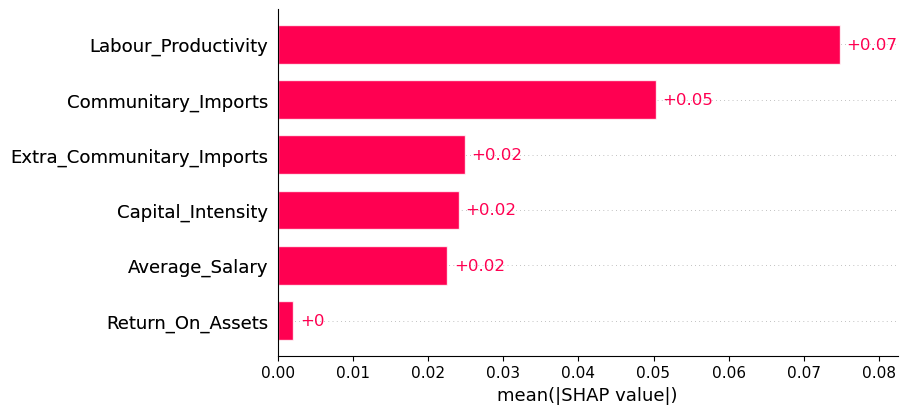

In [8]:
import matplotlib.pyplot as plt

fig = shap.plots.bar(shap_values, show= False)
plt.savefig('Bar.png', dpi=199)

#shap.plots.bar(shap_values, show= False).savefig('Bar.png')


The figure layout has changed to tight


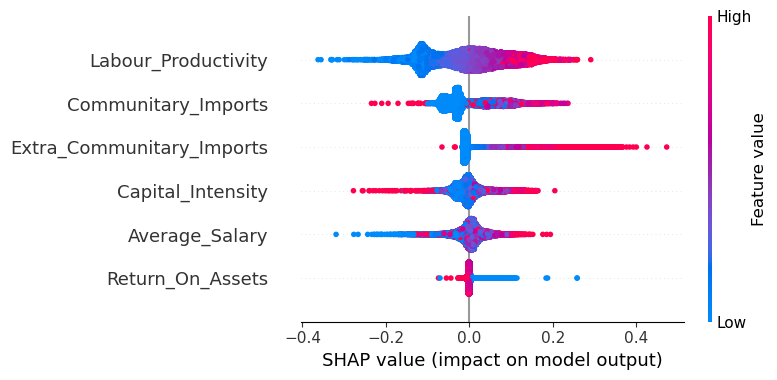

In [9]:
shap.summary_plot(shap_values, show= False)
plt.tight_layout()
plt.savefig('Summary.png', dpi=199)

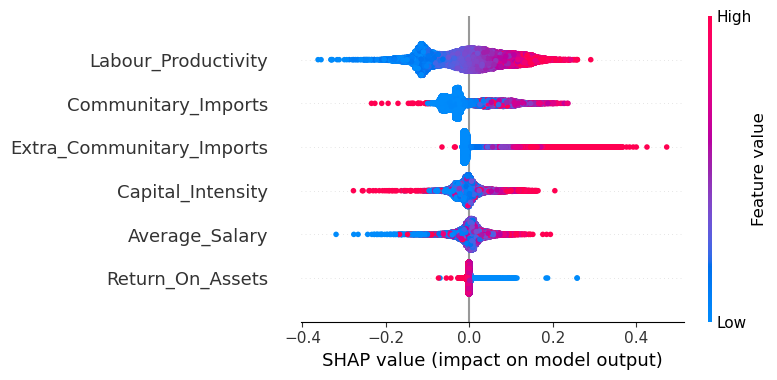

In [10]:
shap.plots.beeswarm(shap_values, show= False)
plt.tight_layout()
plt.savefig('Bee.png', dpi=199)

In [ ]:


#shap.plots.bar(shap_values[0])
#shap.plots.waterfall(shap_values[0])

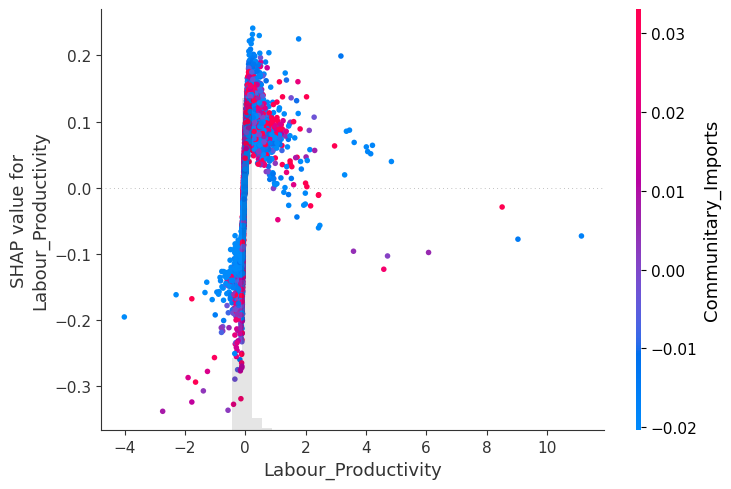

In [17]:
shap.plots.scatter(shap_values[:,0], color=shap_values, show = False)
plt.tight_layout()
plt.savefig('First_Scatter.png', dpi=199)

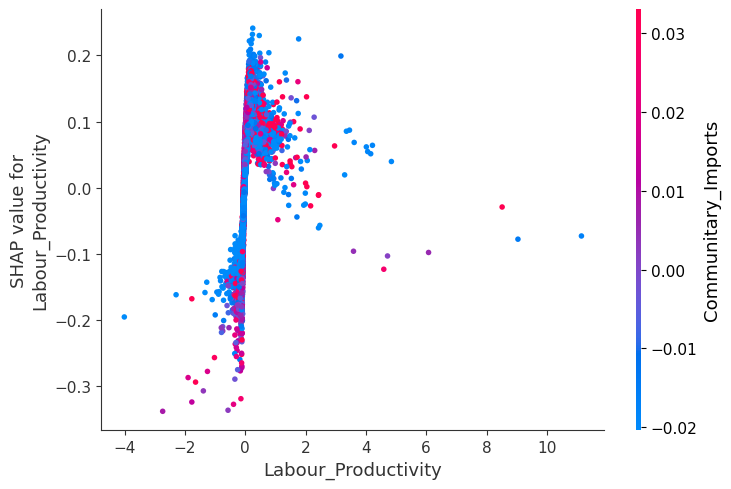

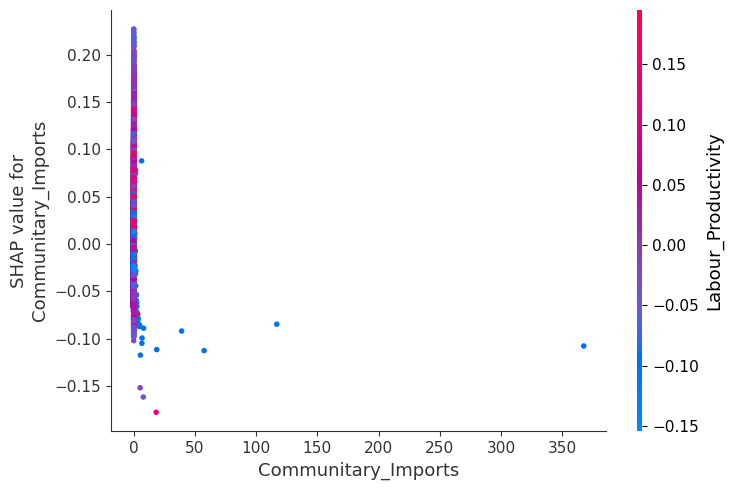

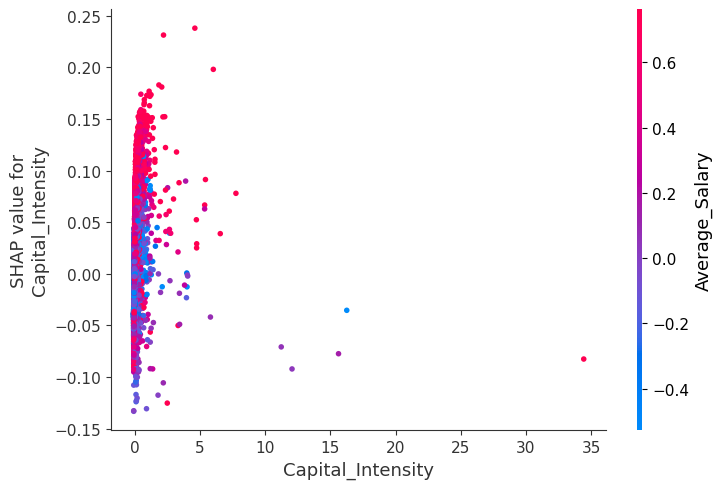

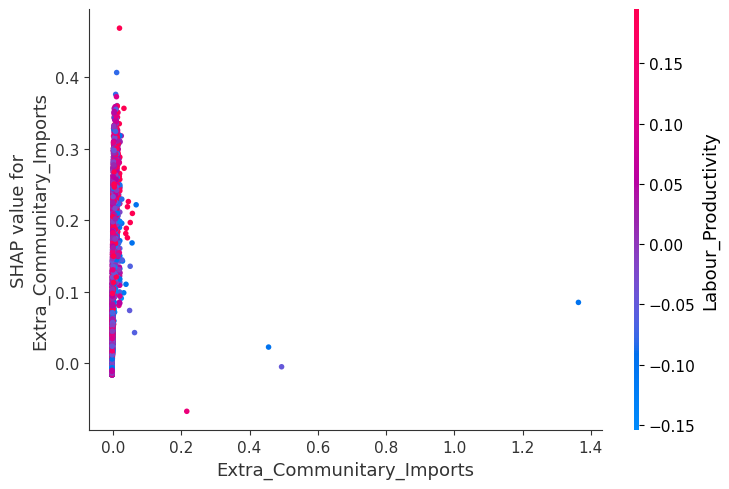

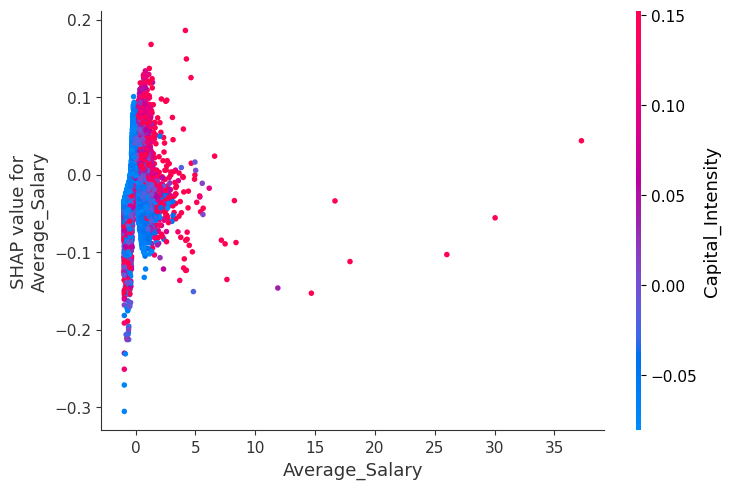

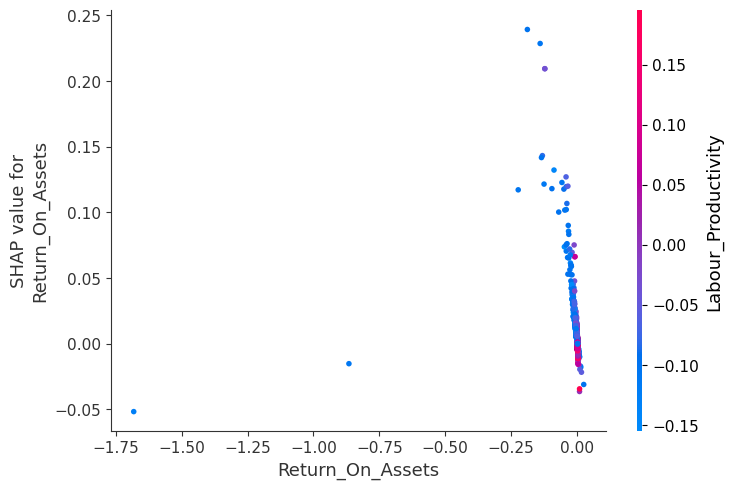

In [18]:

for i in range(0,len(X_test.columns)):
    shap.dependence_plot("rank("+str(i)+")", shap_values.values, X_test, show = False)
    plt.tight_layout()
    plt.savefig('Scatter_'+str(i)+'.png', dpi=199)


In [12]:
inds = shap.approximate_interactions("rank(0)",shap_values.values, X_test)


More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.


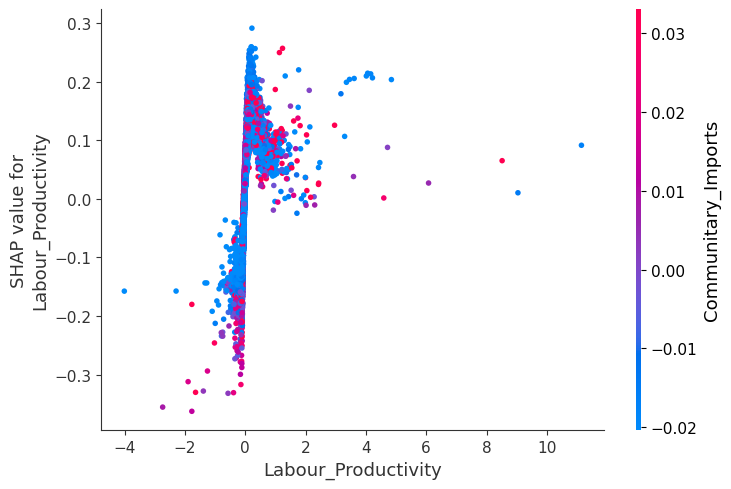

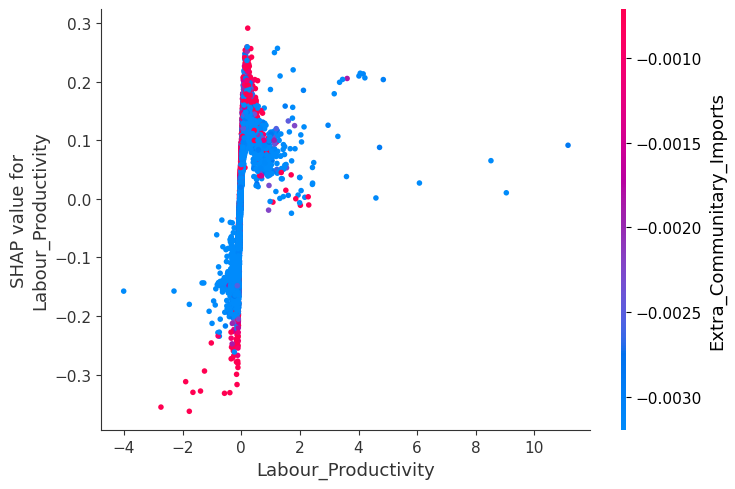

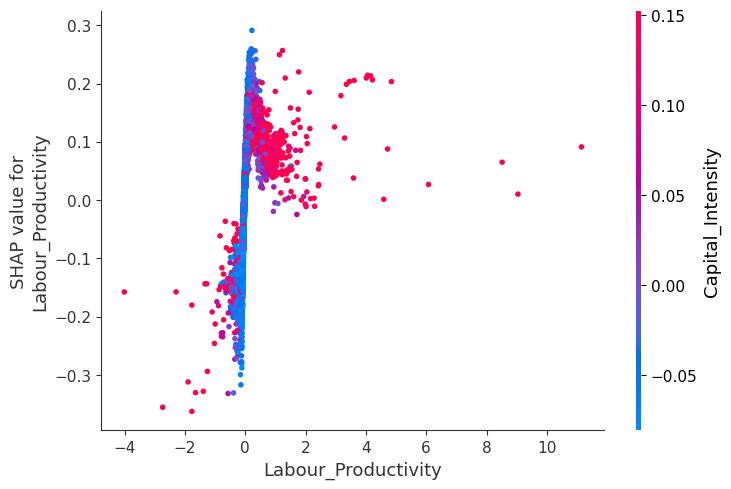

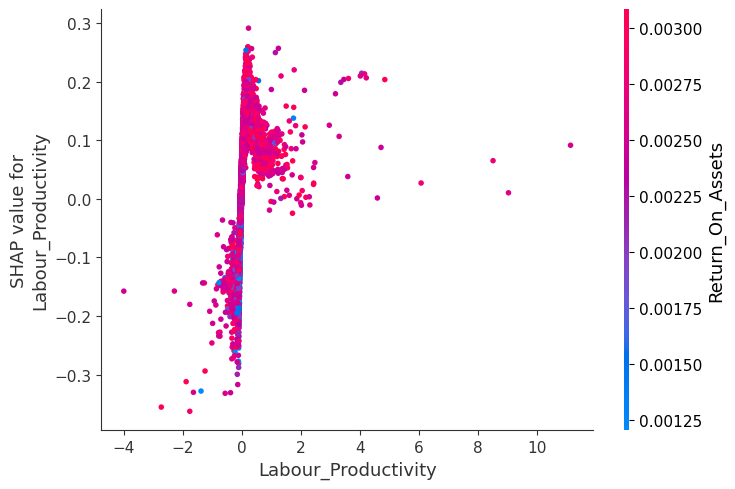

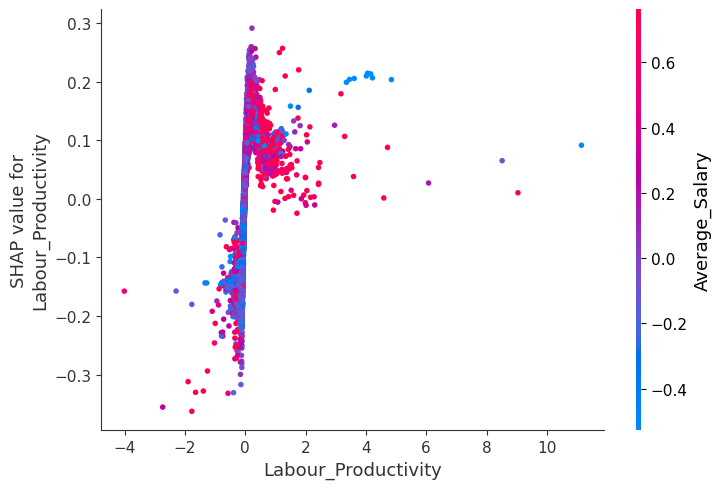

...

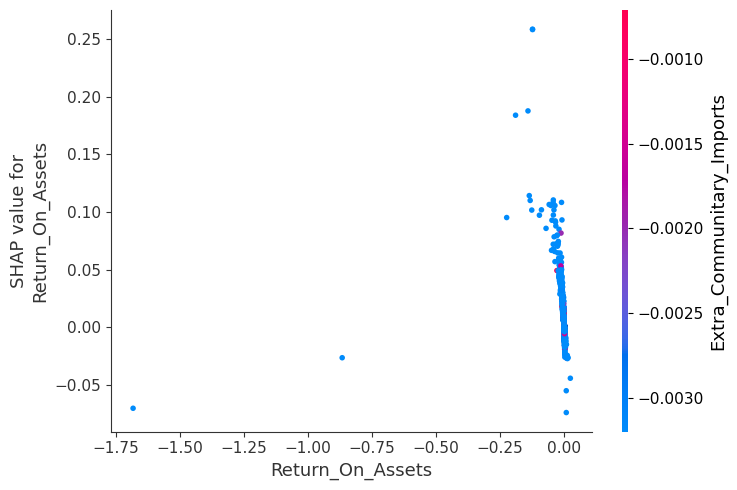

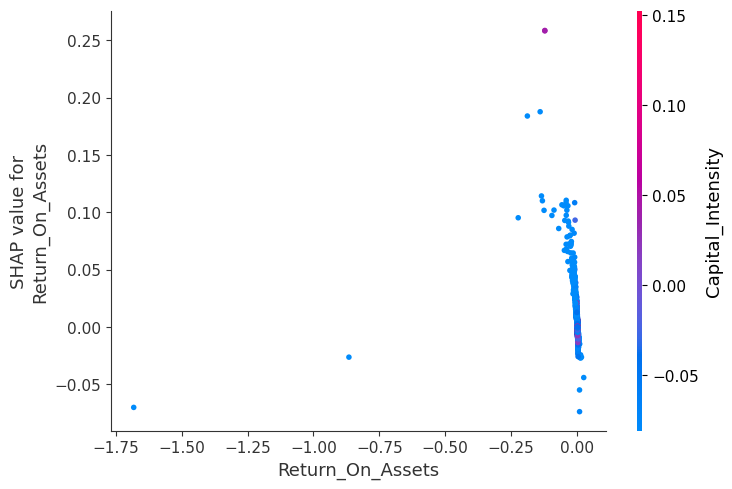

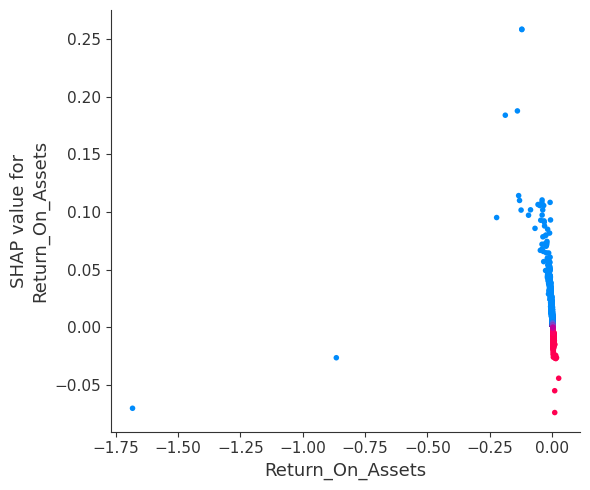

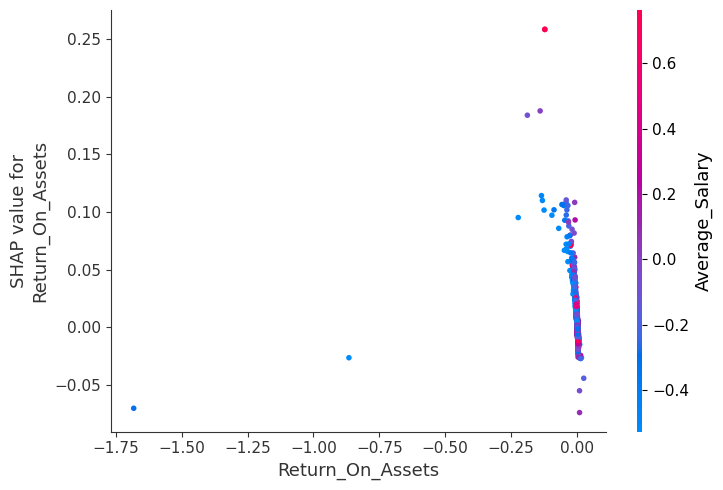

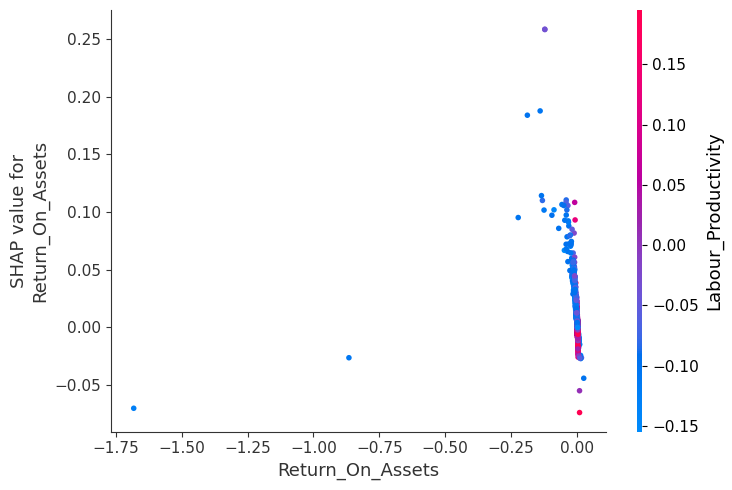

In [14]:

for x in range(len(X_test.columns)):
    for i in range(0,len(X_test.columns)):
        shap.dependence_plot("rank("+str(x)+")", shap_values.values, X_test, interaction_index=inds[i], show = False)
        plt.tight_layout()
        plt.savefig('Scatter_'+str(i)+'.png', dpi=199)


In [13]:
shap.initjs()
shap.force_plot(shap_values[0,:], X_test.iloc[0,:])

NameError: name 'shap_values' is not defined

In [16]:
shap.initjs()
shap.force_plot(shap_values[1,:], X_test.iloc[0,:])

In [33]:
# visualize all the training set predictions
shap.initjs()
shap.plots.force(shap_values[:500])

TypeError: In v0.20, force plot now requires the base value as the first parameter! Try shap.plots.force(explainer.expected_value, shap_values) or for multi-output models try shap.plots.force(explainer.expected_value[0], shap_values[0]).

In [31]:
shap.initjs()
shap.plots.force(explainer.expected_value[0], X_test.iloc[0,:])

AttributeError: 'PermutationExplainer' object has no attribute 'expected_value'

In [32]:
explainer.expected_value

AttributeError: 'PermutationExplainer' object has no attribute 'expected_value'

In [30]:
shap_values[:df.columns[1]]

TypeError: slice indices must be integers or None or have an __index__ method

In [20]:
# create a dependence scatter plot to show the effect of a single feature across the whole dataset
shap.plots.scatter(shap_values[:, "Labour_Productivity"], color=shap_values)


IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

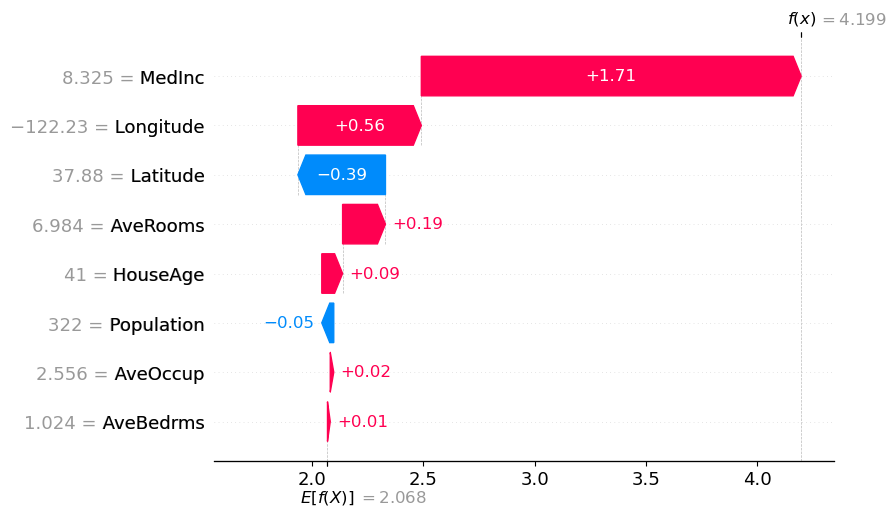

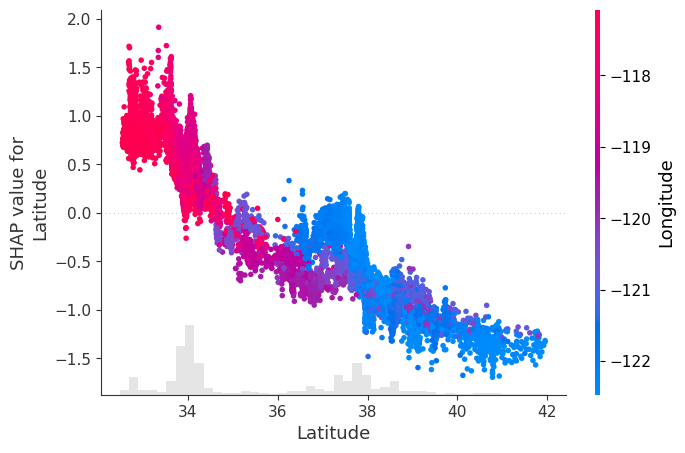

In [19]:
import xgboost
import shap

# train an XGBoost model
X, y = shap.datasets.california()
model = xgboost.XGBRegressor().fit(X, y)

# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainer = shap.Explainer(model)
shap_values = explainer(X)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[0])

# create a dependence scatter plot to show the effect of a single feature across the whole dataset
shap.plots.scatter(shap_values[:, "Latitude"], color=shap_values)